In [1]:
# In this Jupyter Notebook we'll make our predictions on test dataset as well as see some results on some sample
# images

In [32]:
# Libraries

import os
import sys
import csv

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

from tensorflow.keras.datasets import cifar10
from tensorflow.keras.models import load_model
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import img_to_array

In [2]:
# Predictions on our test dataset:

In [4]:
# Evaluate the deep model on the test dataset 

# Load train and test dataset
def load_dataset():
    # load dataset
    (trainX, trainY), (testX, testY) = cifar10.load_data()
    
    # one hot encode target values
    trainY = to_categorical(trainY)
    testY = to_categorical(testY)
    
    return trainX, trainY, testX, testY
 
# Scale pixels
def prep_pixels(train, test):
    # convert from integers to floats
    train_norm = train.astype('float32')
    test_norm = test.astype('float32')
   
    # normalize to range 0-1
    train_norm = train_norm / 255.0
    test_norm = test_norm / 255.0
    
    # return normalized images
    return train_norm, test_norm
 
# Run the test harness for evaluating a model
def run_test_harness():
    # load dataset
    trainX, trainY, testX, testY = load_dataset()
    
    # prepare pixel data
    trainX, testX = prep_pixels(trainX, testX)
    
    # load model
    model = load_model('final_model.h5')
    
    # evaluate model on test dataset
    _, acc = model.evaluate(testX, testY, verbose=0)
    print('> %.3f' % (acc * 100.0))

# entry point, run the test harness 
run_test_harness()

> 88.150


In [5]:
# We get a good accuracy of 88% on our test dataset

In [27]:
label_dict = {0:'airplane', 1:'automobile', 2:'bird', 3:'cat', 4:'deer', 5:'dog', 6:'frog', 7:'horse', 8:'ship', 9:'truck'}

Deer


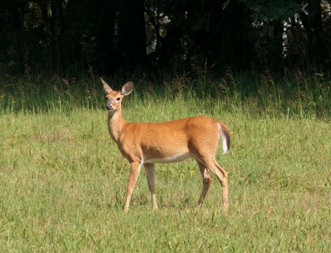

In [25]:
# Making prediction for a new image.

# Load and prepare the image
def load_image(filename):
    # load the image
    img = load_img(filename, target_size=(32, 32))
    
    # convert to array
    img = img_to_array(img)
    
    # reshape into a single sample with 3 channels
    img = img.reshape(1, 32, 32, 3)
    
    # prepare pixel data
    img = img.astype('float32')
    img = img / 255.0
    return img

# Load an image and predict the class
def run_example():
    # load the image
    img = load_image('Sample Image.png')
    
    # load model
    model = load_model('final_model.h5')
    
    # predict the class
    result = model.predict_classes(img)
    return result[0]

# entry point, run the example
k = run_example()
img = Image.open("Sample Image.png")
print(label_dict.get(k))
img

In [30]:
# We'll make predictions on test dataset downloaded from kaggle so that we can submit our predictions. Our 
# predictions will be stored in Prediction.csv. 

# Note: There are 300000 images in test dataset. It isn't possible to create a Predictions.csv file with 300000 
# values as it would be very time consuming. So we run our predictions for first 100 images and create a 
# Predicitions.csv file for the same

test = 'test/'
lst1 = []
for i in range(1, 300000):
    # Load and prepare the image
    def load_image(filename):
        # load the image
        img = load_img(filename, target_size=(32, 32))

        # convert to array
        img = img_to_array(img)

        # reshape into a single sample with 3 channels
        img = img.reshape(1, 32, 32, 3)

        # center pixel data
        img = img.astype('float32')
        img = img / 255.0
        return img

    # load an image and predict the class
    def run_example():
        # load the image
        img = load_image(test + str(i) + '.png')

        # load model
        model = load_model('final_model.h5')

        # predict the class
        result = model.predict_classes(img)
        k = result[0]
        k1 = label_dict.get(k)
        #print(k)
        print(label_dict.get(k))
        lst2 = [i, k1]
        lst1.append(lst2)

    run_example()
    
df = pd.DataFrame(lst1, columns = ['id', 'label'])
filename = 'Predictions.csv'
df.to_csv(filename, index = False)

truck
airplane
automobile
ship
airplane
cat
airplane
truck
automobile
cat
bird
frog
frog
ship
dog
airplane
dog
deer
airplane
frog
airplane
ship
frog
automobile
frog
truck
automobile
cat
deer
cat
dog
horse
dog
bird
deer
deer
cat
dog
ship
dog
frog
bird
truck
deer
horse
automobile
frog
bird
airplane
truck
bird
horse
dog
frog
ship
ship
frog
airplane
airplane
ship
frog
cat
deer
frog
ship
truck
ship
airplane
bird
frog
truck
bird
truck
cat
frog
horse
airplane
frog
horse
cat
bird
deer
ship
bird
frog
frog
dog
frog
frog
truck
truck
airplane
frog
horse
automobile
frog
deer
bird
truck
bird


In [43]:
# Creating a .csv file for our test dataset

# default format can be changed as needed
def createFileList(myDir, format='.png'):
    fileList = []
    print(myDir)
    for root, dirs, files in os.walk(myDir, topdown=False):
        for name in files:
            if name.endswith(format):
                fullName = os.path.join(root, name)
                fileList.append(fullName)
    return fileList

# load the original image
myFileList = createFileList('test/')

for file in myFileList:
    print(file)
    img_file = Image.open(file)
    # img_file.show()

    # get original image parameters...
    width, height = img_file.size
    format = img_file.format
    mode = img_file.mode

    # Make image Greyscale
    img_grey = img_file.convert('L')
    #img_grey.save('result.png')
    #img_grey.show()

    # Save Greyscale values
    value = np.asarray(img_grey.getdata(), dtype=np.int).reshape((img_grey.size[1], img_grey.size[0]))
    value = value.flatten()
    print(value)
    with open("CIFAR 10 Test Images.csv", 'a') as f:
        writer = csv.writer(f)
        writer.writerow(value)

test/
test/1.png
[117 127 128 ... 124  98  70]
test/10.png
[124 124 126 ...  79  78  77]
test/100.png
[128 111 110 ... 130 116 113]
test/1000.png
[254 250 251 ...  52  60  75]
test/10000.png
[152 167 174 ... 124 119 127]
test/100000.png
[109  77 100 ...  88  88  87]
test/100001.png
[199 196 195 ... 179 157 141]
test/100002.png
[123 133 125 ... 210 202 167]
test/100003.png
[72 74 70 ... 64 61 61]
test/100004.png
[209 207 210 ... 166 163 158]
test/100005.png
[39 48 28 ... 24 11 33]
test/100006.png
[130 107 113 ...  95  97 103]
test/100007.png
[  0  50  76 ... 174 132   0]
test/100008.png
[151 151 151 ... 137 138 140]
test/100009.png
[203 222 224 ... 155 155 140]
test/10001.png
[0 0 0 ... 1 0 0]
test/100010.png
[69 78 83 ... 45 42 39]
test/100011.png
[ 53  58  73 ... 116 127 105]
test/100012.png
[194 202 207 ...  11  10  10]
test/100013.png
[202 201 201 ... 244 243 245]
test/100014.png
[151 151 164 ... 100  85  64]
test/100015.png
[64 74 84 ... 56 64 54]
test/100016.png
[85 76 81 ... 99 8

[157 176 190 ...  99  85  88]
test/100177.png
[131 131 115 ... 199 203 197]
test/100178.png
[235 247 249 ... 164 179 209]
test/100179.png
[1 1 1 ... 1 1 1]
test/10018.png
[ 82  88  99 ... 122 132 139]
test/100180.png
[ 14  22  10 ... 122 123 129]
test/100181.png
[149 156 172 ... 187 193 196]
test/100182.png
[ 60  75  82 ... 114 140 142]
test/100183.png
[114 115 109 ... 138 138 129]
test/100184.png
[78 74 76 ... 85 96 87]
test/100185.png
[56 65 82 ... 29 31 12]
test/100186.png
[143 140 138 ... 183 184 186]
test/100187.png
[161 151 142 ...  45  44  47]
test/100188.png
[134 134 135 ... 218 222 109]
test/100189.png
[203 200 206 ... 215 215 213]
test/10019.png
[120 125 137 ... 155 156 154]
test/100190.png
[ 0 20 75 ... 73 23  0]
test/100191.png
[ 11  23  12 ... 150 152 135]
test/100192.png
[142 140 132 ... 145 145 142]
test/100193.png
[140 140 141 ... 143 145 144]
test/100194.png
[  2  66 121 ... 118 134  14]
test/100195.png
[166 161 165 ... 156 154 153]
test/100196.png
[10  9 10 ... 87 85 

[79 84 89 ... 48 48 38]
test/100399.png
[ 2 52 65 ... 75 86 19]
test/1004.png
[  0  70 104 ... 135 105   0]
test/10040.png
[31 32 32 ... 62 53 46]
test/100400.png
[157 229 228 ... 189 200 151]
test/100401.png
[203 222 222 ...  69  69  65]
test/100402.png
[ 58  98 135 ... 104 100  72]
test/100403.png
[127 126 136 ... 119 128 110]
test/100404.png
[164 166 161 ...  56  60  67]
test/100405.png
[156 168 175 ... 117 118 118]
test/100406.png
[  8  47 112 ...  71  76  24]
test/100407.png
[ 83  91  94 ... 137 138 141]
test/100408.png
[136 172 176 ... 131 131 109]
test/100409.png
[169 165 154 ... 150 163 162]
test/10041.png
[179 170 178 ... 137 133 128]
test/100410.png
[250 250 250 ... 212 212 211]
test/100411.png
[114 115 115 ... 131 130 131]
test/100412.png
[  0 122 180 ... 189 142   0]
test/100413.png
[182 203 201 ... 115 116 116]
test/100414.png
[ 76  80  60 ... 175 234 199]
test/100415.png
[138 134 125 ... 159 162 167]
test/100416.png
[100 106 119 ... 127 127 137]
test/100417.png
[245 247 2

test/100602.png
[ 32  29  37 ...  99 100  96]
test/100603.png
[245 248 243 ...  41 144 224]
test/100604.png
[180 177 170 ... 174 173 171]
test/100605.png
[144 142 149 ... 126 125 126]
test/100606.png
[168 160 164 ...  59  47  58]
test/100607.png
[ 97  96  91 ... 112 119 119]
test/100608.png
[204 209 210 ...  85  91 100]
test/100609.png
[201 241 238 ... 199 186 183]
test/10061.png
[181 193 195 ...  87  91  78]
test/100610.png
[84 67 70 ... 83 82 91]
test/100611.png
[104  96 106 ...  92  73  51]
test/100612.png
[55 57 57 ... 67 70 68]
test/100613.png
[191 195 197 ... 137 133 130]
test/100614.png
[ 75  71  71 ... 198 190 182]
test/100615.png
[ 55  64  75 ... 195 190 188]
test/100616.png
[ 68 177 184 ... 147 179 114]
test/100617.png
[ 64  70  81 ... 187 180 166]
test/100618.png
[145 146 144 ...  55  57  62]
test/100619.png
[ 9  0  6 ... 11  8  2]
test/10062.png
[177 112  93 ... 171 182 180]
test/100620.png
[151 154 140 ... 151 150 164]
test/100621.png
[ 82  79  80 ... 136 126 123]
test/100

[179 196 207 ...  81  85  78]
test/100797.png
[ 1  3  6 ... 22 21 22]
test/100798.png
[196 179 167 ... 136 132 131]
test/100799.png
[ 96 118  97 ... 119 117  95]
test/1008.png
[ 4  6  9 ... 18 11  4]
test/10080.png
[100  98 106 ... 116 114 115]
test/100800.png
[0 2 5 ... 1 0 0]
test/100801.png
[136 119 116 ... 100 116 148]
test/100802.png
[ 90 118 123 ... 213 211 213]
test/100803.png
[107  54  65 ... 149 151 151]
test/100804.png
[89 90 92 ... 71 72 74]
test/100805.png
[161 172 176 ... 165 168 162]
test/100806.png
[ 83  87  78 ... 126 130 132]
test/100807.png
[ 56 115 106 ... 125 119  57]
test/100808.png
[205 220 202 ... 119 128 123]
test/100809.png
[246 244 231 ... 201 209 210]
test/10081.png
[  2 162 242 ... 152 121   1]
test/100810.png
[ 27 128 186 ...  50  52  47]
test/100811.png
[124 129 136 ...  58  56  52]
test/100812.png
[133 133 133 ... 125 125 124]
test/100813.png
[114 150 152 ... 199 174 122]
test/100814.png
[157 162 143 ... 141 145 133]
test/100815.png
[  0  81 151 ... 104  

[144 144 145 ... 152 150 151]
test/100981.png
[182 181 184 ... 208 203 206]
test/100982.png
[ 8 14 16 ... 68 64 60]
test/100983.png
[149 154 128 ... 103  91 108]
test/100984.png
[254 250 250 ... 246 249 255]
test/100985.png
[162 174 178 ... 132 130 110]
test/100986.png
[ 24 116 125 ...  83  64  15]
test/100987.png
[86 90 98 ... 56 56 49]
test/100988.png
[  0 129 153 ... 128 116   0]
test/100989.png
[132 151 168 ... 168 168 176]
test/10099.png
[171 170 170 ... 123 112 112]
test/100990.png
[  6 102 136 ... 100  70   1]
test/100991.png
[ 45  61  85 ... 102  93  87]
test/100992.png
[133 128 142 ...  67  49  46]
test/100993.png
[ 61 148 146 ... 173 169  78]
test/100994.png
[132 156 105 ... 101  99 101]
test/100995.png
[179 179 181 ... 162 162 163]
test/100996.png
[117 115 112 ... 130 126 122]
test/100997.png
[133 130 136 ... 228 229 219]
test/100998.png
[  0 118 149 ... 103  80   0]
test/100999.png
[  0  86 137 ... 146 101   0]
test/101.png
[75 89 74 ... 70 65 71]
test/1010.png
[135 138 138

[134 150 156 ... 134 130 128]
test/10117.png
[130 136 132 ...  97  94 108]
test/101170.png
[114 105 103 ... 120 121 121]
test/101171.png
[ 19 126 134 ... 218 220  45]
test/101172.png
[232 234 242 ... 122 117 114]
test/101173.png
[0 0 0 ... 0 0 0]
test/101174.png
[67 60 58 ... 76 75 50]
test/101175.png
[164 162 170 ...  80 120 121]
test/101176.png
[ 4  5 15 ... 18 17 17]
test/101177.png
[179 177 169 ... 108 185 180]
test/101178.png
[74 78 78 ... 68 67 68]
test/101179.png
[119 121 124 ...  97 128 118]
test/10118.png
[115 115 116 ... 110 109 110]
test/101180.png
[253 247 244 ... 242 244 254]
test/101181.png
[ 12  77 114 ... 134  89   9]
test/101182.png
[127 129 128 ... 115 114 115]
test/101183.png
[29 86 72 ... 76 97 23]
test/101184.png
[ 48 153 157 ...  82  80  28]
test/101185.png
[157 157 156 ... 182 181 177]
test/101186.png
[ 90 101 111 ...  18  17  16]
test/101187.png
[  0 212 254 ... 255 231   0]
test/101188.png
[46 44 46 ... 51 38 47]
test/101189.png
[ 92  98 104 ... 207 213 221]
te

[32 48 57 ... 22  8  5]
test/101392.png
[ 61 175 171 ... 103 103  40]
test/101393.png
[203 201 202 ... 126 127 122]
test/101394.png
[ 21 108 106 ... 129 127  31]
test/101395.png
[145 118 115 ... 178 155 159]
test/101396.png
[245 243 245 ... 137 137 145]
test/101397.png
[ 0 10 25 ...  4  0  0]
test/101398.png
[ 20 186 179 ... 156 149  24]
test/101399.png
[156 162 153 ... 110 127 139]
test/1014.png
[204 203 203 ... 188 188 187]
test/10140.png
[  0  73  65 ... 179 156   0]
test/101400.png
[18 24 32 ... 56 47 37]
test/101401.png
[155 157 166 ... 135 146 143]
test/101402.png
[41 83 76 ... 83 83 43]
test/101403.png
[243 243 243 ... 248 248 246]
test/101404.png
[ 77 191 188 ... 162 164  72]
test/101405.png
[ 82 195 197 ... 126 124  57]
test/101406.png
[41 49 42 ... 34 34 37]
test/101407.png
[166 164 168 ...  93  90  95]
test/101408.png
[115 118 115 ... 140 126  89]
test/101409.png
[114  98  85 ...  44  42  66]
test/10141.png
[  0 100 129 ... 105 105   1]
test/101410.png
[255 254 255 ... 108 1

[ 39  40  41 ... 142 124 108]
test/101579.png
[ 75 101 100 ... 132 133 110]
test/10158.png
[211 205 205 ... 220 219 220]
test/101580.png
[245 236 230 ... 200 212 228]
test/101581.png
[ 8 16 25 ... 42 33 22]
test/101582.png
[ 81  91  85 ... 155 215 221]
test/101583.png
[215 215 215 ... 255 255 255]
test/101584.png
[127 127 128 ...  85  85  86]
test/101585.png
[191 190 189 ... 153 155 152]
test/101586.png
[174 200 193 ... 147 182 218]
test/101587.png
[83 84 85 ... 92 94 99]
test/101588.png
[147 212 215 ... 217 215 151]
test/101589.png
[131 140 131 ... 137 138 141]
test/10159.png
[ 83  84 159 ... 228 222 221]
test/101590.png
[  0 111 140 ...  47  34   9]
test/101591.png
[  2 198 207 ... 131 122   4]
test/101592.png
[119 125 125 ... 132 127 127]
test/101593.png
[115 130 153 ...  70  64  76]
test/101594.png
[162 170 175 ...  83  82  82]
test/101595.png
[181 183 188 ...  65  77  82]
test/101596.png
[101 104 104 ...  77  78  76]
test/101597.png
[0 0 0 ... 0 0 0]
test/101598.png
[143 226 231 .

test/101760.png
[157 146 148 ...  29  30  31]
test/101761.png
[106 103 103 ... 140 136 136]
test/101762.png
[192 197 192 ... 175 173 199]
test/101763.png
[253 253 250 ... 197 202 202]
test/101764.png
[210 214 214 ... 182 184 188]
test/101765.png
[116 115 121 ...  87  73 120]
test/101766.png
[ 38 228 237 ... 164 178  40]
test/101767.png
[36 30 28 ... 83 92 83]
test/101768.png
[115 113 116 ... 107 104 121]
test/101769.png
[179 180 170 ... 165 166 150]
test/10177.png
[103  98 100 ... 126 123 124]
test/101770.png
[ 85  87  87 ...  97 104  68]
test/101771.png
[200 201 207 ... 168 169 172]
test/101772.png
[104 105 107 ... 106 111 111]
test/101773.png
[ 38  45  33 ... 166 140 128]
test/101774.png
[ 0 51 77 ... 39 29  0]
test/101775.png
[163 156 158 ... 121 109 126]
test/101776.png
[ 19 195 197 ... 179 179  27]
test/101777.png
[198 227 215 ...  91  98 107]
test/101778.png
[139 138 140 ... 179 176 175]
test/101779.png
[ 84 112 120 ...  49  44  35]
test/10178.png
[65 65 77 ... 86 84 90]
test/101

test/101964.png
[150 152 149 ...  85  97  97]
test/101965.png
[14 16 19 ... 18 14 13]
test/101966.png
[105 100  94 ... 189 208 204]
test/101967.png
[220 217 218 ...  54  60  62]
test/101968.png
[114 135  61 ...  84  66  85]
test/101969.png
[119 105 109 ... 184 181 116]
test/10197.png
[104 147 145 ... 163 165 125]
test/101970.png
[ 85  87  86 ...  96 105 101]
test/101971.png
[ 44  53  56 ... 177 178 190]
test/101972.png
[117 146 123 ... 105  96  78]
test/101973.png
[184 174 165 ... 142 120  77]
test/101974.png
[194 193 192 ... 162 161 158]
test/101975.png
[ 55  68  80 ... 143 138 136]
test/101976.png
[ 25  79 106 ... 158 146  54]
test/101977.png
[130  98  89 ... 120 119  95]
test/101978.png
[ 48  66  87 ... 143 140 145]
test/101979.png
[ 0 12 11 ... 89 84  4]
test/10198.png
[52 52 60 ... 35 36 26]
test/101980.png
[ 75  60  49 ... 111 209 239]
test/101981.png
[136 131 136 ... 124 115  91]
test/101982.png
[ 34  41  50 ... 219 219 218]
test/101983.png
[153 148 146 ...  86  96  96]
test/101

test/10213.png
[114 125 141 ... 126 120 127]
test/102130.png
[95 94 98 ... 38 54 32]
test/102131.png
[133 140 132 ...  22  22  24]
test/102132.png
[ 3  1  0 ... 86 57 44]
test/102133.png
[109 111 100 ...  75  88  84]
test/102134.png
[161 162 160 ...  92 124 149]
test/102135.png
[109 135 137 ... 137 132 106]
test/102136.png
[136 143 218 ... 140  95  60]
test/102137.png
[ 13  21  18 ... 175 180 182]
test/102138.png
[ 89 126 121 ...  63  67  49]
test/102139.png
[102 110 115 ... 101  96  95]
test/10214.png
[131 130 131 ...  80  80  78]
test/102140.png
[121 128 133 ... 129 127 136]
test/102141.png
[ 51  26  26 ... 249 253 255]
test/102142.png
[44 44 47 ... 29 29 30]
test/102143.png
[102 150 154 ... 144 139 137]
test/102144.png
[186 183 180 ... 200 196 195]
test/102145.png
[252 248 243 ... 153 154 156]
test/102146.png
[ 83  67 114 ...  79  59  66]
test/102147.png
[141 139 144 ... 107 109 111]
test/102148.png
[ 17  11  11 ... 122 115 116]
test/102149.png
[207 213 215 ... 159 158 158]
test/102

test/102332.png
[156 145 147 ...  32  31  29]
test/102333.png
[ 97 115 110 ... 131 130 123]
test/102334.png
[211 205 204 ... 141 144 142]
test/102335.png
[137 126 117 ...  51  48  69]
test/102336.png
[  0 182 189 ... 100  96   0]
test/102337.png
[200 192 192 ... 196 190 195]
test/102338.png
[10 15 17 ...  7  5  4]
test/102339.png
[ 27  75  73 ... 163 183  77]
test/10234.png
[ 62 114 136 ... 169 132  78]
test/102340.png
[156 165 159 ...  83  77  76]
test/102341.png
[ 99 140 155 ... 133 130 115]
test/102342.png
[161 159 163 ...  56  56  67]
test/102343.png
[ 65  72  65 ... 157 149 110]
test/102344.png
[15 24 30 ... 50 57 56]
test/102345.png
[191 191 189 ... 192 192 192]
test/102346.png
[0 0 1 ... 0 0 0]
test/102347.png
[ 74 111 113 ... 162 164 146]
test/102348.png
[155 160 166 ... 145 149 150]
test/102349.png
[93 86 83 ... 73 58 44]
test/10235.png
[110 129 105 ... 136 114 101]
test/102350.png
[176 180 174 ... 128 113 103]
test/102351.png
[38 43 46 ... 64 49 64]
test/102352.png
[ 84  84  

[197 200 197 ... 206 207 212]
test/102527.png
[239 237 238 ... 108 103 102]
test/102528.png
[ 93 105 112 ... 152 135  83]
test/102529.png
[ 77 114 121 ... 158 159 135]
test/10253.png
[137 144 190 ... 181 151 142]
test/102530.png
[0 0 4 ... 8 3 0]
test/102531.png
[ 57 110 108 ... 131 129  66]
test/102532.png
[122 162 167 ...  65  76  50]
test/102533.png
[139 128 134 ...  70  72  78]
test/102534.png
[161 156 155 ... 132 135 136]
test/102535.png
[199 192 195 ... 188 179 178]
test/102536.png
[180 181 181 ... 106 142 155]
test/102537.png
[161 206 206 ... 183 186 140]
test/102538.png
[74 76 83 ... 60 60 61]
test/102539.png
[167 187 177 ... 168 178 167]
test/10254.png
[106 106 107 ...  50  53  49]
test/102540.png
[53 63 68 ... 71 70 67]
test/102541.png
[14 32 35 ... 81 74 38]
test/102542.png
[ 89 102  96 ... 167 170 178]
test/102543.png
[140 138 133 ... 240 241 240]
test/102544.png
[131 123 125 ...  62  62  60]
test/102545.png
[ 73 124 108 ...  88  88  83]
test/102546.png
[ 0 39 51 ... 39 32 

[55 32 49 ... 61 61 76]
test/102695.png
[107 111 112 ...  89  90  90]
test/102696.png
[238 216 224 ... 248 250 242]
test/102697.png
[158 168 171 ... 145 143 135]
test/102698.png
[220 244 252 ... 214 215 218]
test/102699.png
[ 83  75  67 ... 118 115 118]
test/1027.png
[ 93 162 164 ... 228 228 129]
test/10270.png
[114 111 113 ... 192 189 154]
test/102700.png
[108 114 120 ... 222 222 223]
test/102701.png
[142 143 143 ... 112  89  93]
test/102702.png
[ 28  96 125 ... 140 113  23]
test/102703.png
[12  5  8 ... 42 46  8]
test/102704.png
[109  86 116 ... 110 110 108]
test/102705.png
[71 70 67 ... 64 68 65]
test/102706.png
[240 218 185 ... 128 129 137]
test/102707.png
[155 151 147 ... 117 104 109]
test/102708.png
[187 184 188 ... 144 143 138]
test/102709.png
[36 41 42 ... 33 51 58]
test/10271.png
[ 90 113 103 ... 209 202 206]
test/102710.png
[218 201 219 ... 143 204 235]
test/102711.png
[141 148 152 ... 176 173 170]
test/102712.png
[17 22 24 ... 32 25 22]
test/102713.png
[ 97 101 101 ... 128 1

test/102903.png
[255 255 255 ... 254 254 254]
test/102904.png
[102 105 104 ... 115 115 118]
test/102905.png
[112 119 133 ... 117 118 120]
test/102906.png
[ 43  43  43 ... 255 255 255]
test/102907.png
[ 14   9   1 ... 115 102  99]
test/102908.png
[130 137 141 ... 145 142 139]
test/102909.png
[196 196 196 ... 135 130 139]
test/10291.png
[44 53 47 ... 91 82 84]
test/102910.png
[18 21 22 ... 36 32 26]
test/102911.png
[122 122 120 ... 184 179 183]
test/102912.png
[ 66  66  63 ... 225 224 221]
test/102913.png
[ 52 130 132 ... 157 155  68]
test/102914.png
[33 66 91 ... 96 93 99]
test/102915.png
[ 6  9 10 ... 21 23 15]
test/102916.png
[108 110 117 ... 153 160 158]
test/102917.png
[144 144 144 ... 105 103 102]
test/102918.png
[17 16 36 ... 25 16 16]
test/102919.png
[185 162 137 ... 121 119 119]
test/10292.png
[112 109 107 ...  87  89  92]
test/102920.png
[160 172 155 ... 138 121 128]
test/102921.png
[43 46 31 ... 54 61 48]
test/102922.png
[  0  78 101 ...  98  88   0]
test/102923.png
[165 160 1

test/103111.png
[  1 113 147 ... 153 140   0]
test/103112.png
[73 82 90 ... 71 71 83]
test/103113.png
[ 28  27  13 ... 151 151 155]
test/103114.png
[31 39 60 ... 72 51 52]
test/103115.png
[  0  93 103 ...  93  81   0]
test/103116.png
[114  98  85 ...  44  42  66]
test/103117.png
[ 70  70  69 ...  98 110 124]
test/103118.png
[ 16  33  38 ... 198 194 191]
test/103119.png
[ 51 131 133 ... 175 172  72]
test/10312.png
[ 53  74  68 ... 108 102  68]
test/103120.png
[ 72  81  99 ... 138 129 117]
test/103121.png
[ 48  56  54 ... 124 128 107]
test/103122.png
[194 196 196 ... 167 159 152]
test/103123.png
[173 164 217 ... 133 132 113]
test/103124.png
[ 45  46  46 ... 150 135 152]
test/103125.png
[  0 169 188 ... 129 109   0]
test/103126.png
[202 199 200 ... 239 238 236]
test/103127.png
[ 61  83  89 ... 107 104  84]
test/103128.png
[228 229 231 ... 118 101 106]
test/103129.png
[ 59  33  23 ... 141 130 130]
test/10313.png
[  0 117 116 ... 112 157   0]
test/103130.png
[172 162 148 ... 174 166 180]
te

[87 89 86 ... 88 80 76]
test/103286.png
[ 68  96 101 ... 174 169 116]
test/103287.png
[158 161 149 ... 189 191 199]
test/103288.png
[169 164 153 ... 252 252 217]
test/103289.png
[159 171 170 ... 109 108  90]
test/10329.png
[201 204 213 ... 114 114 118]
test/103290.png
[ 5 11 13 ... 21  6  2]
test/103291.png
[162 146 168 ... 177 170 140]
test/103292.png
[209 212 214 ... 162 158 156]
test/103293.png
[125 138 151 ... 113 120 123]
test/103294.png
[247 246 246 ... 223 226 231]
test/103295.png
[198 203 200 ...  91  92  96]
test/103296.png
[178 180 174 ... 128 138 136]
test/103297.png
[  8  10   8 ... 152  74  24]
test/103298.png
[ 52 197 175 ... 247 249  50]
test/103299.png
[143 120 114 ... 173 193 178]
test/1033.png
[12 64 66 ... 72 53 12]
test/10330.png
[127 124 109 ... 162 163 163]
test/103300.png
[41 84 95 ... 86 79 41]
test/103301.png
[ 98 136 145 ... 113 113 103]
test/103302.png
[249 246 250 ...  50  70  78]
test/103303.png
[ 29  25  50 ... 216 208 155]
test/103304.png
[161 160 157 ...

test/103460.png
[218 221 226 ... 229 227 224]
test/103461.png
[ 59  61  66 ... 196 196 197]
test/103462.png
[158 156 141 ... 177 168 157]
test/103463.png
[157 162 162 ... 230 228 226]
test/103464.png
[156 122  87 ...  77  79  78]
test/103465.png
[140 140 148 ... 152 109 102]
test/103466.png
[144 158 160 ... 115 110  96]
test/103467.png
[ 64  66  66 ... 142 139 140]
test/103468.png
[185 185 185 ... 120 122 119]
test/103469.png
[ 51  52  49 ... 205 199 199]
test/10347.png
[66 93 73 ... 11 15 21]
test/103470.png
[78 86 79 ... 64 53 59]
test/103471.png
[ 24  63  59 ... 116 121  53]
test/103472.png
[63 73 79 ... 27 20 15]
test/103473.png
[  1 106  96 ... 103 115   0]
test/103474.png
[217 232 231 ... 116 129 131]
test/103475.png
[195 253 219 ... 255 255 199]
test/103476.png
[151 140 120 ... 149 150 149]
test/103477.png
[ 81 137 132 ... 146 147  79]
test/103478.png
[75 78 85 ... 41 32 26]
test/103479.png
[ 0 19 68 ... 64 21  0]
test/10348.png
[  0  67 171 ... 169  75   0]
test/103480.png
[ 0 

test/103655.png
[ 95  97 101 ... 118 124 130]
test/103656.png
[141 177 177 ... 203 201 141]
test/103657.png
[179 182 180 ...  90 185 181]
test/103658.png
[ 93  98 100 ...  78  79  75]
test/103659.png
[104 197 185 ... 184 183 100]
test/10366.png
[46 39 35 ... 77 82 93]
test/103660.png
[159 159 151 ... 172 155 148]
test/103661.png
[133 136 133 ... 180 178 174]
test/103662.png
[198 198 199 ... 148 136 137]
test/103663.png
[ 71  53  50 ...  44  69 131]
test/103664.png
[ 70 100  81 ... 146 142 158]
test/103665.png
[174 171 169 ...  69  67  72]
test/103666.png
[ 87  91  89 ... 103 100 101]
test/103667.png
[185 198 198 ... 174 177 177]
test/103668.png
[ 51 141 142 ... 115 130  56]
test/103669.png
[  0 110 146 ... 167 121   0]
test/10367.png
[201 207 211 ...  66  65  64]
test/103670.png
[175 183 182 ... 150 146 147]
test/103671.png
[ 10 165 251 ... 140  90  10]
test/103672.png
[ 89 100  98 ... 122 120 117]
test/103673.png
[104 106 109 ... 247 247 247]
test/103674.png
[50 76 74 ... 72 71 48]
te

test/103835.png
[221 218 210 ...  33  33  30]
test/103836.png
[ 93  82 112 ...  42  47  41]
test/103837.png
[ 86  81  99 ... 133 132 135]
test/103838.png
[ 42  42  46 ... 133 131 129]
test/103839.png
[95 74 59 ... 67 71 68]
test/10384.png
[ 30 157 216 ... 211 165  38]
test/103840.png
[ 37  34  49 ...  69  85 100]
test/103841.png
[156 172 165 ... 184 188 184]
test/103842.png
[148 148 148 ... 196 198 201]
test/103843.png
[  4   0   7 ... 110 106 102]
test/103844.png
[ 36  57  67 ... 152 133 142]
test/103845.png
[161 154 159 ... 116 117 126]
test/103846.png
[98 98 99 ... 95 95 95]
test/103847.png
[142 137 147 ...  47  42  43]
test/103848.png
[162 163 169 ... 120  94  68]
test/103849.png
[ 99 177 174 ... 212 202 111]
test/10385.png
[76 79 80 ... 71 68 66]
test/103850.png
[204 215 214 ... 155 153 157]
test/103851.png
[ 27  33  38 ... 104  96  91]
test/103852.png
[136 133 133 ... 205 204 211]
test/103853.png
[209 209 207 ... 188 164 166]
test/103854.png
[146 148 140 ...  85  88  82]
test/103

[38 73 91 ... 67 66 37]
test/104007.png
[ 22  76  85 ... 141 131  23]
test/104008.png
[106 118 119 ...  76  75  74]
test/104009.png
[215 217 218 ...  96  98 104]
test/10401.png
[137 140 132 ... 130 133 133]
test/104010.png
[ 77 203 198 ... 219 221  90]
test/104011.png
[ 0  0 12 ... 15  1  0]
test/104012.png
[149 228 229 ... 116 120  81]
test/104013.png
[254 251 251 ... 250 252 253]
test/104014.png
[125 130 131 ... 130 134 136]
test/104015.png
[25 72 64 ... 15 12  5]
test/104016.png
[130 128 127 ...  82  58  52]
test/104017.png
[ 24  19  15 ... 108 103 108]
test/104018.png
[135 129 130 ... 153 154 152]
test/104019.png
[218 219 232 ...  25  15  33]
test/10402.png
[211 238 233 ... 232 230 205]
test/104020.png
[ 69 108 104 ...  69  66  51]
test/104021.png
[108 104 102 ...  56  53  52]
test/104022.png
[ 19  73  75 ... 101 100  31]
test/104023.png
[148 149 161 ... 146 150 157]
test/104024.png
[194 191 184 ... 159 171 164]
test/104025.png
[103 104 101 ... 103 102 102]
test/104026.png
[ 78 149

test/104175.png
[128 129 134 ... 228 225 222]
test/104176.png
[110 112 112 ... 248 248 248]
test/104177.png
[159 167 173 ...  41  43  44]
test/104178.png
[ 2 49 91 ... 87 53  5]
test/104179.png
[ 88  77  84 ... 135 139 181]
test/10418.png
[ 55  62  61 ... 179 161 127]
test/104180.png
[110 120 123 ... 122 108 119]
test/104181.png
[ 24 131 133 ... 116 146  36]
test/104182.png
[147 144 124 ... 149 149 147]
test/104183.png
[47 43 45 ... 42 37 34]
test/104184.png
[178 170 158 ... 100 102 105]
test/104185.png
[221 197 208 ... 112 103 105]
test/104186.png
[  0   3   3 ... 125 112   0]
test/104187.png
[ 98  98 106 ... 145 142 120]
test/104188.png
[105  71  81 ... 111 161 175]
test/104189.png
[225 226 244 ... 122 125 129]
test/10419.png
[  3  41 123 ...  75  32  10]
test/104190.png
[183 180 182 ... 141 126  99]
test/104191.png
[175 170 172 ...  78  81  85]
test/104192.png
[ 43  94 136 ...  46  20   6]
test/104193.png
[194 179 165 ... 182 193 205]
test/104194.png
[119 140 153 ... 125 121 118]
te

[141 140 143 ... 111 113 117]
test/104353.png
[156 161 168 ... 119 117 124]
test/104354.png
[202 184 130 ... 174 180 203]
test/104355.png
[ 10 141 125 ...  82  94  56]
test/104356.png
[189 191 189 ... 186 189 187]
test/104357.png
[  1  70  73 ... 193 193  13]
test/104358.png
[ 61  71  69 ... 112 117  99]
test/104359.png
[175 174 182 ... 163 166 167]
test/10436.png
[226 223 223 ... 228 227 226]
test/104360.png
[119 121 112 ... 146 149 129]
test/104361.png
[ 55  57  90 ... 147 111 102]
test/104362.png
[129 137 138 ... 166 161 156]
test/104363.png
[156 160 137 ... 241 238 234]
test/104364.png
[162 167 172 ...  93  84  83]
test/104365.png
[  5  49 100 ... 126  65   9]
test/104366.png
[127 155 159 ...  99 112  97]
test/104367.png
[228 224 225 ...  73  72  71]
test/104368.png
[142 143 142 ...  96  97 105]
test/104369.png
[121 134 136 ... 151  86  58]
test/10437.png
[117 113 109 ... 172 182 178]
test/104370.png
[ 82  77  97 ... 146 151 163]
test/104371.png
[52 59 67 ... 86 78 72]
test/104372.

[ 8 71 78 ... 86 78 14]
test/104531.png
[ 0 39 67 ... 45 30  2]
test/104532.png
[254 254 254 ... 254 254 254]
test/104533.png
[165 156 124 ...  70  52  59]
test/104534.png
[ 99  99 100 ...  90  97  75]
test/104535.png
[156 194 217 ... 137 121  91]
test/104536.png
[100 145 149 ...  79  72  75]
test/104537.png
[ 86  87  89 ... 102 100  93]
test/104538.png
[127 127 136 ... 175 174 177]
test/104539.png
[252 231 245 ... 251 251 251]
test/10454.png
[183 123  72 ... 194 195 194]
test/104540.png
[116 132  60 ...  83  67  85]
test/104541.png
[170 174 177 ... 101 101 104]
test/104542.png
[255 253 254 ... 254 254 254]
test/104543.png
[64 63 80 ... 56 80 55]
test/104544.png
[26 28 30 ... 25 25 24]
test/104545.png
[10 24 40 ... 22  9  9]
test/104546.png
[249 251 235 ... 157 158 153]
test/104547.png
[153 154 156 ... 129 123 124]
test/104548.png
[255 254 254 ... 254 253 255]
test/104549.png
[146 144 145 ... 252 252 252]
test/10455.png
[108 124 119 ... 204 197 190]
test/104550.png
[99 95 97 ... 82 82 

test/104701.png
[198 197 196 ... 219 223 206]
test/104702.png
[71 46 47 ... 54 54 62]
test/104703.png
[230 217 218 ...  78  63  61]
test/104704.png
[58 67 76 ... 18 16 14]
test/104705.png
[  0 185 208 ... 172 167   0]
test/104706.png
[171 169 169 ... 142 137 138]
test/104707.png
[ 60  71  72 ... 181 175  90]
test/104708.png
[ 82 122 123 ... 164 163 161]
test/104709.png
[  0 114 198 ...  37  30   0]
test/10471.png
[112 134 162 ... 154 134 117]
test/104710.png
[65 71 57 ... 79 83 78]
test/104711.png
[ 69  75  75 ... 185 185 185]
test/104712.png
[ 44  67 111 ...  97  98  99]
test/104713.png
[165 164 165 ...  68  61  56]
test/104714.png
[84 83 82 ... 60 62 58]
test/104715.png
[110 107 110 ... 135 132 128]
test/104716.png
[108 128 124 ... 144 152 124]
test/104717.png
[ 0  5  8 ... 38 23 12]
test/104718.png
[  0  75  78 ... 107 105   0]
test/104719.png
[121 126 115 ... 147 150 152]
test/10472.png
[174 161 162 ... 109 112 108]
test/104720.png
[168 169 168 ... 189 186 185]
test/104721.png
[192

[12 89 86 ... 96 95  8]
test/104895.png
[ 16  25  16 ... 166 162 160]
test/104896.png
[ 78  77  80 ... 105 105 106]
test/104897.png
[ 98  96  95 ... 152 153 150]
test/104898.png
[150 146 141 ... 101 101  95]
test/104899.png
[ 85 154 149 ... 147 131  65]
test/1049.png
[130 139 141 ...  85  89  92]
test/10490.png
[148 146 139 ... 141 144 148]
test/104900.png
[242 238 239 ...  60  66  51]
test/104901.png
[106  81  84 ... 121 119 119]
test/104902.png
[195 194 195 ... 180 178 176]
test/104903.png
[ 2 13 33 ... 66 35  7]
test/104904.png
[28 32 34 ... 96 95 93]
test/104905.png
[ 48  45  47 ... 171 182 150]
test/104906.png
[ 15  92  89 ... 181 179  40]
test/104907.png
[148 150 155 ... 166 163 167]
test/104908.png
[143 143 141 ...  79  81  82]
test/104909.png
[101 117 108 ... 142 138 141]
test/10491.png
[ 19  48  72 ... 198 164  56]
test/104910.png
[155 168 167 ...  31  47  54]
test/104911.png
[68 63 62 ... 90 88 87]
test/104912.png
[ 21  18  18 ... 126 129 132]
test/104913.png
[41 86 85 ... 78

[  0 171 254 ... 254 193   0]
test/105080.png
[ 18 103 139 ... 132 106  21]
test/105081.png
[130 165 166 ... 165 131 117]
test/105082.png
[139 145 135 ... 162 164 163]
test/105083.png
[ 96 120 132 ...  97 113 124]
test/105084.png
[239 240 239 ...  29  31  32]
test/105085.png
[42 55 71 ... 58 40 39]
test/105086.png
[158 189 189 ... 238 241 193]
test/105087.png
[117 113 108 ... 107 114 114]
test/105088.png
[ 44  77  78 ... 143 134  80]
test/105089.png
[122 120 122 ...  65  75  95]
test/10509.png
[237 237 237 ... 247 246 247]
test/105090.png
[44 45 72 ... 86 85 94]
test/105091.png
[121 132 139 ... 162 156 137]
test/105092.png
[255 255 255 ... 255 255 255]
test/105093.png
[104 107 106 ...  37  37  36]
test/105094.png
[ 84 107 101 ... 205 207 205]
test/105095.png
[133  95  92 ... 246 245 242]
test/105096.png
[255 254 254 ... 254 254 255]
test/105097.png
[225 214 212 ... 104 100  89]
test/105098.png
[172 171 167 ... 148 146 146]
test/105099.png
[171 154 163 ...  54  57  46]
test/1051.png
[ 6

[57 98 99 ... 84 80 49]
test/105280.png
[0 0 1 ... 1 0 0]
test/105281.png
[ 14  85  94 ... 147 123  58]
test/105282.png
[85 76 81 ... 99 84 82]
test/105283.png
[202 195 189 ... 118 119 119]
test/105284.png
[84 83 74 ... 60 56 55]
test/105285.png
[ 95  98  84 ... 102  98 101]
test/105286.png
[ 19  28  32 ... 170 168 123]
test/105287.png
[ 74  94 107 ... 125 146 161]
test/105288.png
[  0 144 189 ... 191 160   0]
test/105289.png
[ 84  72  69 ... 139 119 105]
test/10529.png
[  0  60  79 ... 113  91   0]
test/105290.png
[20 20 20 ... 51 30 37]
test/105291.png
[  0  98 158 ... 161 127   0]
test/105292.png
[  0  56 158 ... 203  83   4]
test/105293.png
[20 23 26 ... 80 63 51]
test/105294.png
[ 74  82  71 ... 145 147 140]
test/105295.png
[222 217 217 ... 144 141 143]
test/105296.png
[159 160 160 ... 130 130 128]
test/105297.png
[104 165 161 ... 120 114  83]
test/105298.png
[145 142 145 ... 135 136 133]
test/105299.png
[130 254 254 ... 254 254 137]
test/1053.png
[56 23  9 ... 65 52 72]
test/1053

[198 201 203 ... 169 153 147]
test/105460.png
[128 127 127 ... 187 183 176]
test/105461.png
[  0 188 230 ...  82  76   0]
test/105462.png
[131 175 165 ...  65  76  83]
test/105463.png
[224 232 237 ...  52  46  49]
test/105464.png
[ 13  71  64 ... 247 240  99]
test/105465.png
[108 106 106 ... 229 209 120]
test/105466.png
[  0 192 255 ... 255 212   0]
test/105467.png
[ 68 162 162 ... 148 145  65]
test/105468.png
[174 167 168 ... 157 160 161]
test/105469.png
[14 24 28 ... 74 67 48]
test/10547.png
[175 177 179 ... 128 132 121]
test/105470.png
[100  95  92 ... 176 176 178]
test/105471.png
[189 188 178 ...  86  86  82]
test/105472.png
[33 64 70 ... 15 26 41]
test/105473.png
[126 125 124 ... 123 127 132]
test/105474.png
[ 78  80  81 ... 134 133 129]
test/105475.png
[35 32 24 ... 88 76 69]
test/105476.png
[78 98 98 ... 60 12 12]
test/105477.png
[7 8 9 ... 8 8 8]
test/105478.png
[ 41 137 131 ... 226 237 119]
test/105479.png
[  0  73  97 ... 135 124   0]
test/10548.png
[ 57  91  93 ... 106 106  

test/105681.png
[202 200 198 ... 154 155 172]
test/105682.png
[ 15 121 124 ... 128 122  22]
test/105683.png
[136 224 225 ... 156 155  99]
test/105684.png
[167 167 167 ... 158 149 147]
test/105685.png
[159 119  98 ... 110 113 111]
test/105686.png
[104  93  86 ...  30  76  96]
test/105687.png
[117 104 111 ... 105 106 112]
test/105688.png
[57 62 73 ... 44 53 46]
test/105689.png
[101  85  95 ...  85  87  88]
test/10569.png
[ 29 133 111 ... 159 157  40]
test/105690.png
[ 91 255 254 ... 254 254 101]
test/105691.png
[112 114 113 ... 132 124  93]
test/105692.png
[155 119 144 ... 111 110 107]
test/105693.png
[140 142 152 ...  98  87  88]
test/105694.png
[ 21 187 189 ... 180 178  30]
test/105695.png
[77 74 78 ... 44 57 63]
test/105696.png
[ 9  8  7 ... 30 28 28]
test/105697.png
[ 25  57  57 ... 162 161  79]
test/105698.png
[148 159 141 ... 134 129 191]
test/105699.png
[ 2  7  7 ...  2  0 15]
test/1057.png
[ 89  96 109 ...  90  75  52]
test/10570.png
[128 133 150 ... 135 134 163]
test/105700.png


[166 213 172 ...  64  60  56]
test/105866.png
[201 249 252 ... 107 103  84]
test/105867.png
[65 66 68 ... 68 68 66]
test/105868.png
[186 191 194 ... 152 150 137]
test/105869.png
[204 197 194 ... 132 129 129]
test/10587.png
[166 166 171 ...  80  90  95]
test/105870.png
[213 203 205 ... 163 156 152]
test/105871.png
[ 96  99 102 ... 104 103  88]
test/105872.png
[194 191 187 ... 207 193 188]
test/105873.png
[54 37 36 ... 41 36 48]
test/105874.png
[78 79 83 ... 48 52 48]
test/105875.png
[ 98  99  96 ... 201 197 195]
test/105876.png
[255 255 255 ...  40  92 104]
test/105877.png
[ 46  58  64 ... 128 118 123]
test/105878.png
[71 30 27 ... 88 90 91]
test/105879.png
[ 31  36  39 ... 112 102  95]
test/10588.png
[ 85  84  90 ...  95 101  97]
test/105880.png
[0 0 0 ... 0 0 0]
test/105881.png
[208 210 209 ... 184 196 207]
test/105882.png
[169 164 159 ... 155 140 140]
test/105883.png
[106 105 111 ... 133 132 131]
test/105884.png
[148 149 114 ... 148 147 147]
test/105885.png
[ 80  90 108 ...  97 106 1

[ 0 29 33 ... 51 51  0]
test/10609.png
[24 95 84 ... 59 52 15]
test/106090.png
[45 56 66 ... 49 37 24]
test/106091.png
[185 180 180 ... 206 185 183]
test/106092.png
[137 138 139 ...  73  78 105]
test/106093.png
[ 96  84  74 ... 111 113 108]
test/106094.png
[239 239 239 ... 186 180 166]
test/106095.png
[109 105 102 ... 174 175 174]
test/106096.png
[ 23 140 153 ... 182 180  39]
test/106097.png
[120 137 107 ...  94  91  87]
test/106098.png
[61 62 55 ... 69 74 73]
test/106099.png
[ 0  6  7 ... 88 99  0]
test/1061.png
[206 192 193 ... 220 214 204]
test/10610.png
[  3  46 104 ... 166  85   9]
test/106100.png
[108 111 111 ...  78  77  76]
test/106101.png
[ 55 150 153 ... 138 141  54]
test/106102.png
[ 68  87  97 ... 134 151 168]
test/106103.png
[  0 119 165 ... 211 177   0]
test/106104.png
[227 226 226 ... 110 116 107]
test/106105.png
[144 137 138 ... 186 186 189]
test/106106.png
[ 37  65 118 ...  66  74  74]
test/106107.png
[ 35 134 133 ...  45  52  10]
test/106108.png
[102 102 105 ... 135 1

[  0 105 120 ... 118 124   2]
test/106297.png
[ 0 23 90 ... 86 27  0]
test/106298.png
[ 17  17  14 ... 117  94 100]
test/106299.png
[128 120 142 ... 123  99  82]
test/1063.png
[121 163 161 ... 172 178 130]
test/10630.png
[51 48 47 ... 59 19 52]
test/106300.png
[ 65 113 101 ... 136 123  88]
test/106301.png
[101  70  72 ...  80  86  90]
test/106302.png
[212 205 198 ...  43  45  45]
test/106303.png
[166 157 156 ... 167 165 162]
test/106304.png
[11 12 22 ...  6  7  5]
test/106305.png
[ 65 106 120 ... 135  97 102]
test/106306.png
[ 52  83 114 ... 187 174 141]
test/106307.png
[183 178 189 ... 174 174 175]
test/106308.png
[ 36 102  92 ... 184 178  66]
test/106309.png
[ 75  97 125 ...  97  95  71]
test/10631.png
[ 50  48  63 ... 108 108 103]
test/106310.png
[ 37 100 143 ...  82  84  46]
test/106311.png
[235 232 233 ...  70  66  64]
test/106312.png
[ 89  96  97 ... 123 144 113]
test/106313.png
[111 116 115 ... 109 108 107]
test/106314.png
[  0  29  64 ... 173 112   0]
test/106315.png
[ 81  66  

test/106482.png
[109 107 107 ...  66  70  82]
test/106483.png
[59 67 76 ... 55 49 57]
test/106484.png
[53 60 68 ... 39 35 38]
test/106485.png
[134 182 186 ... 200 203 152]
test/106486.png
[  0  58  83 ... 108  82   0]
test/106487.png
[ 44 108 121 ...  74  63  56]
test/106488.png
[187 187 187 ... 133 134 132]
test/106489.png
[128 134 134 ... 135 135 130]
test/10649.png
[ 29  30  37 ...  17  24 106]
test/106490.png
[114 127 114 ... 157 155 153]
test/106491.png
[125 110  65 ...  90  84  82]
test/106492.png
[28 43 55 ... 56 49 36]
test/106493.png
[ 5  8 15 ... 25 16  7]
test/106494.png
[ 85  77  71 ... 153 204 220]
test/106495.png
[17 21 15 ... 21 20 16]
test/106496.png
[253 249 234 ...  91 141 250]
test/106497.png
[ 82  68  77 ... 146 136 134]
test/106498.png
[104 108 104 ... 145 134 132]
test/106499.png
[254 254 254 ... 150 147 144]
test/1065.png
[20 79 97 ... 47 43  7]
test/10650.png
[60 75 77 ...  1  2  0]
test/106500.png
[27 31 30 ... 41 37 33]
test/106501.png
[100 177 178 ... 126 124

test/106669.png
[192 195 199 ...  99 112 113]
test/10667.png
[ 58  49  48 ... 158 136 148]
test/106670.png
[76 63 75 ... 45 40 29]
test/106671.png
[  0 105 153 ... 130  94   0]
test/106672.png
[ 98 202 199 ... 106 100 116]
test/106673.png
[22 30 38 ... 27 18 13]
test/106674.png
[162 159 163 ...  85  85  83]
test/106675.png
[ 71  70  68 ... 147 121  55]
test/106676.png
[143 130 141 ...  37  37  19]
test/106677.png
[148 151 146 ...  82  92  91]
test/106678.png
[ 37 107 107 ... 107 129  54]
test/106679.png
[60 59 65 ... 85 75 67]
test/10668.png
[  4 154 154 ...  93  92   8]
test/106680.png
[ 0 35 63 ...  1  1  0]
test/106681.png
[132 139 146 ... 108 106 103]
test/106682.png
[162 157 153 ... 219 219 220]
test/106683.png
[ 21  21  23 ... 194 199 198]
test/106684.png
[132 130 125 ... 176 176 176]
test/106685.png
[ 55  52  53 ...  88 102  95]
test/106686.png
[245 242 243 ... 245 246 246]
test/106687.png
[ 90  83  98 ... 117 131 121]
test/106688.png
[166 122 120 ... 132 157 117]
test/106689.pn

[103 124 129 ...  84  84  75]
test/106854.png
[ 21  71  73 ... 202 203 204]
test/106855.png
[117 117 119 ...  88  81  81]
test/106856.png
[ 33  29  35 ... 113 105 135]
test/106857.png
[ 44  94  92 ... 151 153  78]
test/106858.png
[146 145 148 ...  95  83  53]
test/106859.png
[ 86  86  73 ... 174 181 202]
test/10686.png
[ 57 124 157 ... 208 165  75]
test/106860.png
[  3  81 120 ... 185 124   9]
test/106861.png
[109 107 106 ...  81  92  94]
test/106862.png
[119 126 136 ... 211 211 216]
test/106863.png
[209 198 196 ...  53  43  50]
test/106864.png
[115 121 134 ... 113 118 113]
test/106865.png
[ 0 19 77 ... 42 12  0]
test/106866.png
[125 104  99 ... 187 223 247]
test/106867.png
[29 21 27 ... 26 18 65]
test/106868.png
[ 0 11 61 ... 59 16  1]
test/106869.png
[ 12  61 105 ...  24  21  16]
test/10687.png
[141 132 160 ... 164 162 156]
test/106870.png
[  1  42  52 ... 170 153  15]
test/106871.png
[20 41 41 ... 33 39 21]
test/106872.png
[ 10  63  80 ... 148 152  33]
test/106873.png
[158 158 159 .

test/107035.png
[  7  72  57 ... 105  98  16]
test/107036.png
[151 172 142 ... 136 137 133]
test/107037.png
[238 210 209 ...  44  75 110]
test/107038.png
[174 174 174 ... 181 182 181]
test/107039.png
[ 92 135 137 ... 139 133  88]
test/10704.png
[123 182 176 ...  63  61  42]
test/107040.png
[162 165 180 ...  51  74  55]
test/107041.png
[135 133 132 ... 139 138 135]
test/107042.png
[ 7  8 10 ...  5  4  3]
test/107043.png
[204 190 203 ... 149 157 157]
test/107044.png
[ 82 125 126 ...  72  69  59]
test/107045.png
[90 88 88 ... 78 79 80]
test/107046.png
[225 218 224 ...  24   9  12]
test/107047.png
[213 210 211 ... 197 196 202]
test/107048.png
[ 62  62  63 ... 129 129 134]
test/107049.png
[ 75  84  84 ...  84  90 125]
test/10705.png
[170 164 155 ... 147  94  88]
test/107050.png
[101  96 103 ... 122 124 110]
test/107051.png
[ 56 129 130 ... 212 207 145]
test/107052.png
[32 36 65 ... 88 38 15]
test/107053.png
[ 64  85  96 ... 133 131 106]
test/107054.png
[192 194 194 ... 175 175 171]
test/107

[ 56 125 123 ...  56  46  35]
test/107221.png
[ 67  76  86 ... 103  94  84]
test/107222.png
[106 103  98 ...  97  98 124]
test/107223.png
[139 127 139 ... 154 186 200]
test/107224.png
[ 79  78  78 ... 171 178 183]
test/107225.png
[198 182 177 ... 190 188 175]
test/107226.png
[211 208 208 ... 120 116 119]
test/107227.png
[231 224 212 ... 199 198 197]
test/107228.png
[50 53 69 ... 56 46 46]
test/107229.png
[186 184 185 ... 179 184 183]
test/10723.png
[139 130 118 ... 104  98  89]
test/107230.png
[ 3  6  7 ... 80 92 65]
test/107231.png
[113 104 116 ... 155 150 149]
test/107232.png
[57 52 45 ... 76 81 74]
test/107233.png
[175 213 220 ...  84  76  37]
test/107234.png
[119 118 115 ... 131 134 134]
test/107235.png
[230 231 232 ... 208 207 211]
test/107236.png
[126 128 133 ... 182 176 171]
test/107237.png
[159 161 163 ... 102 101  80]
test/107238.png
[ 10  81  95 ... 145 132  21]
test/107239.png
[119  65  40 ... 180 161 148]
test/10724.png
[131 127 135 ... 138 135 142]
test/107240.png
[105 106

test/107414.png
[229 225 248 ... 111 109 103]
test/107415.png
[120 104  64 ...  32  34  29]
test/107416.png
[132 131 131 ... 159 159 150]
test/107417.png
[114 108 110 ... 127 122 119]
test/107418.png
[ 17 115 161 ... 163 124  24]
test/107419.png
[69 92 80 ... 17 21 38]
test/10742.png
[206 175 116 ... 199 200 198]
test/107420.png
[165 167 172 ... 176 166 163]
test/107421.png
[  0   7  46 ... 155  33   0]
test/107422.png
[153  99  62 ...  90 101 119]
test/107423.png
[ 0 42 51 ... 65 58  1]
test/107424.png
[35 42 44 ... 78 77 63]
test/107425.png
[157 150 152 ...  94  93  84]
test/107426.png
[ 93 160 187 ... 134 104  58]
test/107427.png
[145  81  78 ... 163 162 157]
test/107428.png
[247 244 245 ... 114 112 110]
test/107429.png
[151 193 223 ... 105  82  26]
test/10743.png
[  0  30  28 ... 178 169  11]
test/107430.png
[ 99 100 100 ... 117 117 116]
test/107431.png
[134 131 131 ...  79  95 107]
test/107432.png
[  0 136 197 ... 157 119   0]
test/107433.png
[203 183 183 ... 119  92 137]
test/107

test/107652.png
[102 161 163 ... 197 192 134]
test/107653.png
[64 73 61 ... 39 63 71]
test/107654.png
[105 145 163 ...  86 101  76]
test/107655.png
[128 138 154 ...   4   5   5]
test/107656.png
[212 210 213 ... 100 110 110]
test/107657.png
[109 111 100 ...  75  88  84]
test/107658.png
[ 5 18 33 ... 42 30 19]
test/107659.png
[  6 108 103 ... 143 161  19]
test/10766.png
[ 77  79  84 ... 218 233 235]
test/107660.png
[ 96 146 132 ...  70  64  37]
test/107661.png
[113  90  98 ... 192 199 197]
test/107662.png
[ 50  60  70 ... 160 176 167]
test/107663.png
[64 73 86 ... 87 82 78]
test/107664.png
[ 43  45  45 ... 156 157 158]
test/107665.png
[124 127 140 ... 149 145 145]
test/107666.png
[  0 166 236 ...  60  43   0]
test/107667.png
[131 131 152 ... 183 175 167]
test/107668.png
[186 181 161 ... 160 161 168]
test/107669.png
[ 98 118 127 ... 142 147 132]
test/10767.png
[34 57 80 ... 29 25 28]
test/107670.png
[  0 174 254 ... 255 196   0]
test/107671.png
[52 77 76 ... 74 75 74]
test/107672.png
[164

test/107840.png
[ 23  59  77 ... 189 198  79]
test/107841.png
[171 169 148 ... 168 101 108]
test/107842.png
[ 3 18  2 ... 65 50 18]
test/107843.png
[108 110 107 ...  61  61  62]
test/107844.png
[  0  97 111 ... 185 178   0]
test/107845.png
[ 69  75  74 ... 100  98  98]
test/107846.png
[ 95 209 246 ...  78  92 106]
test/107847.png
[151 158 152 ... 207 201 197]
test/107848.png
[141 140 139 ... 245 246 248]
test/107849.png
[191 214 221 ... 155 160 153]
test/10785.png
[ 0 48 58 ... 64 61  0]
test/107850.png
[72 82 84 ... 65 64 56]
test/107851.png
[255 253 254 ...  59  61  61]
test/107852.png
[155 175 182 ... 138 141 114]
test/107853.png
[233 233 232 ... 199 198 200]
test/107854.png
[129 114 118 ...  63  59  51]
test/107855.png
[124 113 146 ... 182 212 203]
test/107856.png
[136 135 137 ... 123 121 124]
test/107857.png
[0 3 5 ... 1 1 2]
test/107858.png
[200 244 231 ... 102 106 108]
test/107859.png
[240 241 233 ...  43  44  40]
test/10786.png
[13 15 26 ... 20 18 18]
test/107860.png
[ 69  63  

test/108032.png
[129 150 147 ... 163 161 151]
test/108033.png
[215 211 210 ...  42  32  34]
test/108034.png
[201 191 193 ... 205 215 205]
test/108035.png
[111 128 124 ... 153 145 144]
test/108036.png
[171 171 179 ... 223 220 221]
test/108037.png
[119 110 107 ... 132 129 115]
test/108038.png
[ 76  79  77 ... 119 122 125]
test/108039.png
[ 52  71  58 ... 114 127 146]
test/10804.png
[176 176 176 ... 176 174 173]
test/108040.png
[194 199 210 ...  82  97 132]
test/108041.png
[ 66 131 125 ... 168 153  63]
test/108042.png
[103  96  99 ...  86  97  99]
test/108043.png
[158 154 150 ... 145 150 148]
test/108044.png
[ 99  97 106 ... 160 176 160]
test/108045.png
[147 171 183 ...  94  99 100]
test/108046.png
[80 81 82 ... 86 85 84]
test/108047.png
[ 12  78 155 ...  89  63  14]
test/108048.png
[116 112 112 ... 178 176 177]
test/108049.png
[69 74 99 ... 82 73 75]
test/10805.png
[102  99  99 ... 146 147 131]
test/108050.png
[ 17  57 138 ...  96  89 104]
test/108051.png
[146 156 164 ... 125 128 130]
te

[  0  73 128 ...  47  35   0]
test/108266.png
[165 152 159 ...  70  64  59]
test/108267.png
[119 119 119 ... 126 126 126]
test/108268.png
[ 47 171 170 ... 173 176  57]
test/108269.png
[120 122 122 ...  71  71  70]
test/10827.png
[ 11  10  10 ... 105 103 101]
test/108270.png
[ 59 156 202 ...  43  44  48]
test/108271.png
[ 70 121 123 ... 149 148  89]
test/108272.png
[210 209 208 ...  29  32  42]
test/108273.png
[181 180 180 ...  69  68  64]
test/108274.png
[231 242 229 ... 248 255 247]
test/108275.png
[166 168 164 ... 203 191 164]
test/108276.png
[179 180 183 ... 168 169 167]
test/108277.png
[ 91 172 166 ... 110 116  71]
test/108278.png
[113 110 112 ... 144 148 112]
test/108279.png
[117 112 186 ...  62  36  32]
test/10828.png
[183 167 160 ... 195 199 207]
test/108280.png
[152 150 151 ...  88  87  89]
test/108281.png
[ 16 116 112 ...  78  74  13]
test/108282.png
[18 23 21 ... 18 18 16]
test/108283.png
[185 186 171 ... 144 147 141]
test/108284.png
[192 206 219 ... 166 171 185]
test/108285.

[170 170 171 ...  90  89  86]
test/108471.png
[ 70  61  54 ... 134 123 114]
test/108472.png
[  6 120 160 ... 167 137   5]
test/108473.png
[147 131 111 ... 133 130 134]
test/108474.png
[23 30 15 ... 90 96 97]
test/108475.png
[  9  14  24 ... 144 140 143]
test/108476.png
[208 215 208 ... 210 217 230]
test/108477.png
[  0  93 131 ... 115  93   0]
test/108478.png
[ 9 13 16 ... 13 15 16]
test/108479.png
[149 148 147 ... 125 128 124]
test/10848.png
[111 115 138 ... 130 136 143]
test/108480.png
[59 61 57 ... 98 97 88]
test/108481.png
[53 37 50 ... 41 34 71]
test/108482.png
[33 38 42 ... 59 53 47]
test/108483.png
[ 87 111 108 ...  75  91  76]
test/108484.png
[191 183 184 ... 130 130 131]
test/108485.png
[  0 117 109 ... 159 140   7]
test/108486.png
[83 89 92 ... 32 34 31]
test/108487.png
[51 41 41 ... 75 71 67]
test/108488.png
[165 173 169 ...  66  68  65]
test/108489.png
[17 39 41 ... 93 82 51]
test/10849.png
[110 111 116 ...  76  83  99]
test/108490.png
[151 150 153 ...  21  21  22]
test/108

test/108698.png
[ 45  88 106 ... 130  87  40]
test/108699.png
[ 61  66  68 ...  69  94 106]
test/1087.png
[ 12 101 106 ...  93  60   9]
test/10870.png
[ 76  70  68 ... 125 127 124]
test/108700.png
[166 171 176 ... 169 175 169]
test/108701.png
[ 17  43  51 ... 161 172  79]
test/108702.png
[ 56  60  65 ... 103  95  87]
test/108703.png
[ 52  55  60 ... 246 247 251]
test/108704.png
[171 135 145 ... 189 190 192]
test/108705.png
[0 0 0 ... 0 0 0]
test/108706.png
[131 138 143 ... 144 140 142]
test/108707.png
[140 111  99 ... 184 182 175]
test/108708.png
[126 135 126 ... 113 122 111]
test/108709.png
[255 255 255 ... 153 145 137]
test/10871.png
[200 200 203 ... 115 115 112]
test/108710.png
[131 124 133 ... 136 138 143]
test/108711.png
[ 1  3  6 ... 15  9  4]
test/108712.png
[191 190 190 ...  95 108 106]
test/108713.png
[54 67 67 ... 57 71 73]
test/108714.png
[114 112 111 ...  31  27  24]
test/108715.png
[ 25  36  38 ... 146 148 114]
test/108716.png
[ 82  67  48 ... 128 125 124]
test/108717.png


test/10889.png
[84 84 78 ... 39 37 29]
test/108890.png
[222 223 229 ...  96  98 108]
test/108891.png
[51 52 55 ... 26 26 24]
test/108892.png
[ 85  92 102 ... 166 183 188]
test/108893.png
[176 183 181 ...  44  46  40]
test/108894.png
[36 39 39 ... 55 53 60]
test/108895.png
[ 64  75  99 ... 233 216 188]
test/108896.png
[ 49 153 153 ... 113 121  45]
test/108897.png
[125 134 127 ... 212 214 212]
test/108898.png
[182 182 174 ... 103  44  13]
test/108899.png
[24 13 30 ... 47 53 53]
test/1089.png
[132 138 136 ... 127 129 128]
test/10890.png
[31 23 26 ... 64 56 49]
test/108900.png
[ 70  61  68 ... 168 168 159]
test/108901.png
[126 127 111 ... 213 212 210]
test/108902.png
[140 141 144 ...  83  92  89]
test/108903.png
[ 72  74  75 ... 104 100 100]
test/108904.png
[56 57 58 ... 19 27 41]
test/108905.png
[190 189 192 ...  59  35  42]
test/108906.png
[85 92 99 ... 34 30 26]
test/108907.png
[247 243 227 ... 184 196 205]
test/108908.png
[106 117 112 ... 125 134 161]
test/108909.png
[113 141 159 ...  

test/109066.png
[195 198 199 ... 145 164 158]
test/109067.png
[ 10 173 154 ... 123 113  13]
test/109068.png
[179 218 228 ... 143 141 107]
test/109069.png
[  0 214 249 ... 252 242   1]
test/10907.png
[128 126 131 ...  67  62  57]
test/109070.png
[ 92  91 102 ... 133  58   9]
test/109071.png
[ 33  40  43 ... 133  73  16]
test/109072.png
[ 58  76  92 ... 127 144 152]
test/109073.png
[ 31  42  29 ... 170 167 162]
test/109074.png
[158 169 183 ...  61  74  82]
test/109075.png
[135 119 125 ... 174 169 163]
test/109076.png
[101 122 120 ...  90  72  89]
test/109077.png
[137 126 139 ...  45  44  51]
test/109078.png
[77 85 78 ... 69 90 72]
test/109079.png
[119 119 121 ... 137 137 137]
test/10908.png
[  8 114 114 ... 133 134  16]
test/109080.png
[194 193 181 ... 174 176 176]
test/109081.png
[255 255 255 ... 179 183 184]
test/109082.png
[224 211 200 ... 139 140 157]
test/109083.png
[232 225 227 ... 236 237 243]
test/109084.png
[  0 109 191 ... 151  96   0]
test/109085.png
[129 115 100 ... 101 103 1

[117 249 247 ... 121 126  64]
test/109259.png
[120 125 118 ... 101 107 111]
test/10926.png
[143 141 140 ... 143 145 147]
test/109260.png
[10 15 17 ... 91 85 63]
test/109261.png
[ 92  99 102 ...  94  96  97]
test/109262.png
[145 134 142 ... 130 126 126]
test/109263.png
[17 27 34 ... 27 19 12]
test/109264.png
[126 126 120 ... 188 185 153]
test/109265.png
[  0 149 175 ...  64  68   0]
test/109266.png
[45 72 74 ... 69 64 45]
test/109267.png
[  0  10  57 ... 144  26   2]
test/109268.png
[255 254 255 ... 138 132 149]
test/109269.png
[  0  91 105 ... 180 168   0]
test/10927.png
[24 25 26 ... 60 52 42]
test/109270.png
[240 239 240 ... 115 113 115]
test/109271.png
[200 207 175 ... 171 185 193]
test/109272.png
[224 230 176 ... 119 114 115]
test/109273.png
[ 88  83  34 ... 186 185 186]
test/109274.png
[  0 142 172 ... 205 176   0]
test/109275.png
[  0  29  39 ... 120  95   0]
test/109276.png
[242 243 244 ... 255 255 255]
test/109277.png
[218 219 222 ... 210 202 175]
test/109278.png
[115  57  84 .

test/109459.png
[ 88  96 107 ... 102  99  97]
test/10946.png
[ 32  38  44 ... 215 195 188]
test/109460.png
[ 64  11  20 ... 128  79  38]
test/109461.png
[31 37 44 ... 99 98 89]
test/109462.png
[220 218 223 ...  72  74  71]
test/109463.png
[73 72 87 ... 60 80 58]
test/109464.png
[ 97  89  95 ... 108 105 102]
test/109465.png
[ 3 89 92 ... 29 66  3]
test/109466.png
[1 0 0 ... 1 1 1]
test/109467.png
[188 175 172 ... 210 211 210]
test/109468.png
[ 91  95 113 ...  90  72  51]
test/109469.png
[ 62 130 130 ...  37  49  27]
test/10947.png
[ 83 137 213 ...  60  64  68]
test/109470.png
[186 183 183 ... 192 178 172]
test/109471.png
[150 145 134 ... 186 181 182]
test/109472.png
[139 122 122 ... 239 245 252]
test/109473.png
[  0  94 132 ... 159 111   0]
test/109474.png
[131 136 138 ... 144 139 133]
test/109475.png
[158 162 191 ... 139 133 144]
test/109476.png
[246 255 245 ... 230 249 254]
test/109477.png
[  0  45  55 ... 110 113   0]
test/109478.png
[238 234 234 ... 161 165 169]
test/109479.png
[ 35

test/109628.png
[138 208 207 ... 133 154  93]
test/109629.png
[170 181 174 ... 185 179 180]
test/10963.png
[ 93  96 108 ...  25  26  26]
test/109630.png
[ 69  62  64 ... 107  79  57]
test/109631.png
[148 180 133 ... 159 160 117]
test/109632.png
[144 141 137 ... 232 228 223]
test/109633.png
[110 127 123 ... 108 115 120]
test/109634.png
[163 160 160 ... 187 186 184]
test/109635.png
[ 64  65  74 ... 141 144 151]
test/109636.png
[226 225 225 ...  47  40  42]
test/109637.png
[198 190 185 ... 136 184 225]
test/109638.png
[110 143 137 ... 131 132 115]
test/109639.png
[160 158 161 ... 221 219 214]
test/10964.png
[125 117 112 ... 127 111 109]
test/109640.png
[159 158 159 ... 166 163 161]
test/109641.png
[112 178 177 ... 138 135  79]
test/109642.png
[75 87 87 ... 65 66 66]
test/109643.png
[222 223 226 ...  96  98 108]
test/109644.png
[189 187 188 ... 176 174 179]
test/109645.png
[253 251 248 ... 147 200 242]
test/109646.png
[106 105 104 ...  35  41  59]
test/109647.png
[112 114 114 ... 100 101 1

[2 3 3 ... 6 4 0]
test/109826.png
[ 78  69  71 ... 101 106 108]
test/109827.png
[118 109 106 ... 117 108 107]
test/109828.png
[ 7 15 24 ... 15  7  0]
test/109829.png
[105  94  96 ... 177 159 149]
test/10983.png
[129 131 140 ...  77  86 104]
test/109830.png
[180 179 180 ... 124 126 126]
test/109831.png
[250 246 245 ... 139 146 152]
test/109832.png
[255 255 255 ... 252 252 255]
test/109833.png
[ 35 117 134 ... 112 110  52]
test/109834.png
[ 40  37  37 ... 111  69  73]
test/109835.png
[101  97 101 ... 100 100 102]
test/109836.png
[104 106 113 ... 153 141 135]
test/109837.png
[148 149 149 ...  75  85  91]
test/109838.png
[128 153 159 ... 181 182 160]
test/109839.png
[153 152 153 ... 161 159 159]
test/10984.png
[  9  32  81 ... 219 224 236]
test/109840.png
[199 208 207 ... 159 152 136]
test/109841.png
[47 50 56 ... 50 43 33]
test/109842.png
[ 93 100 102 ...  57  53  42]
test/109843.png
[11 19 30 ... 59 66 67]
test/109844.png
[251 253 253 ... 253 252 253]
test/109845.png
[ 89  95 100 ...  81

[ 60 154 160 ...  76  80  38]
test/110022.png
[177 182 179 ... 100  99  89]
test/110023.png
[ 54  55  55 ... 129 123 118]
test/110024.png
[ 77  75  73 ...  70  85 114]
test/110025.png
[ 81  85  85 ... 170 169 168]
test/110026.png
[159 172 183 ... 193 193 181]
test/110027.png
[ 26 103  93 ... 111 130  40]
test/110028.png
[238 239 238 ...  23  25  22]
test/110029.png
[ 93 110  90 ... 104  93 117]
test/11003.png
[140 137 138 ...  59  54  55]
test/110030.png
[139 139 142 ... 152 150 145]
test/110031.png
[13 23 36 ... 71 62 52]
test/110032.png
[153 157 156 ...  66  63  64]
test/110033.png
[123 135 144 ... 101 110 111]
test/110034.png
[118 129 130 ... 127 130 128]
test/110035.png
[194 212 220 ... 131 110  86]
test/110036.png
[28 10 12 ... 40 36 38]
test/110037.png
[199 205 213 ...  60  51  40]
test/110038.png
[142 140 140 ... 185 178 163]
test/110039.png
[11 17 23 ... 59 72 85]
test/11004.png
[149 152 154 ...  60  59  61]
test/110040.png
[104 109 110 ... 179 177 179]
test/110041.png
[34 78 7

test/110213.png
[ 41  41  43 ... 208 204 205]
test/110214.png
[139 137  81 ...  40  44  43]
test/110215.png
[110 109 109 ... 141 137 139]
test/110216.png
[ 42  48  65 ... 128 117 123]
test/110217.png
[29 29 31 ... 21 51 55]
test/110218.png
[ 52  61  60 ... 115  97  68]
test/110219.png
[ 21 117 112 ...  64  61  13]
test/11022.png
[120 160 159 ... 160 160 122]
test/110220.png
[145 146 149 ... 102 106  95]
test/110221.png
[ 60  59  58 ... 168 171 173]
test/110222.png
[176 176 178 ... 219 210 200]
test/110223.png
[  0  49  59 ... 140 124   0]
test/110224.png
[71 91 98 ... 47 50 54]
test/110225.png
[  0 120 121 ... 117 116   6]
test/110226.png
[108  96  98 ...  65  66  51]
test/110227.png
[ 61  91  83 ... 151 155 129]
test/110228.png
[ 95  94  86 ... 149 151 150]
test/110229.png
[120 126 102 ... 148 148 128]
test/11023.png
[133 134 145 ... 173 173 167]
test/110230.png
[107 100  66 ... 118 123 135]
test/110231.png
[167 161 156 ... 147 147 169]
test/110232.png
[135 130 136 ... 113 111 137]
te

[ 27  92  91 ... 149 150  51]
test/110411.png
[192 194 196 ... 111 111 112]
test/110412.png
[ 85 172 191 ... 203 191  99]
test/110413.png
[132 125 124 ... 227 231 249]
test/110414.png
[  0 106 122 ...  89  72   0]
test/110415.png
[115 114 117 ... 113  97 106]
test/110416.png
[21 33 49 ... 48 59 48]
test/110417.png
[255 255 255 ... 124 126 133]
test/110418.png
[152 146 136 ... 190 201 196]
test/110419.png
[ 31  85  84 ... 207 206  85]
test/11042.png
[170 155  48 ... 172 168 166]
test/110420.png
[195 191 193 ... 143 145 142]
test/110421.png
[124 138 146 ... 108 115 114]
test/110422.png
[167 168 166 ... 155 180 183]
test/110423.png
[190 188 215 ... 197 189 188]
test/110424.png
[131 132 132 ...  11   8   5]
test/110425.png
[199 210 210 ... 133 130 171]
test/110426.png
[146 121  82 ... 203 214 214]
test/110427.png
[245 246 246 ...  72  73  73]
test/110428.png
[13 61 61 ... 58 49 13]
test/110429.png
[212 210 211 ... 222 223 222]
test/11043.png
[144 236 205 ... 112  82  84]
test/110430.png
[1

[188 202 203 ...  76  71  64]
test/1106.png
[105 105 110 ... 116 110  98]
test/11060.png
[135 164 154 ...  99  95  81]
test/110600.png
[129 128 124 ... 177 174 173]
test/110601.png
[113 118 123 ...  83  80  79]
test/110602.png
[ 0 19 76 ... 23 13  7]
test/110603.png
[87 97 98 ... 71 50 43]
test/110604.png
[31 29 24 ... 77 80 86]
test/110605.png
[ 65 204 203 ... 129 128  46]
test/110606.png
[19 22 24 ... 38 33 30]
test/110607.png
[ 71  78  91 ... 204 204 204]
test/110608.png
[194  54   3 ... 218 210 205]
test/110609.png
[94 95 91 ... 89 85 76]
test/11061.png
[  0 107 124 ... 142 138   0]
test/110610.png
[175 175 174 ... 203 200 201]
test/110611.png
[ 0 12  1 ...  4  0 10]
test/110612.png
[154 150 147 ... 147 155 169]
test/110613.png
[113 111 113 ... 208 206 208]
test/110614.png
[143 132 144 ... 200 186 172]
test/110615.png
[ 76  79  87 ... 128 130 140]
test/110616.png
[ 62  59  56 ... 107 109 111]
test/110617.png
[ 24  31  87 ... 153 146 141]
test/110618.png
[132 106 157 ... 155 143 139

[ 77 172 181 ...  40  42  21]
test/110797.png
[ 7  6  6 ... 20 19 17]
test/110798.png
[ 24  65 125 ...  79  81  91]
test/110799.png
[173 184 179 ... 176 187 153]
test/1108.png
[240 240 236 ... 202 197 203]
test/11080.png
[135 145 147 ... 126 117  97]
test/110800.png
[139 136 133 ... 129 137 145]
test/110801.png
[87 90 86 ... 85 92 83]
test/110802.png
[ 49  63  61 ... 115 101 114]
test/110803.png
[235 232 233 ... 201 196 199]
test/110804.png
[112 121 129 ... 102 101  93]
test/110805.png
[ 69 106  97 ...  50  62  50]
test/110806.png
[ 98 100 102 ...  68  57  56]
test/110807.png
[ 17 239 237 ... 175 175  22]
test/110808.png
[226 222 220 ... 204 205 205]
test/110809.png
[ 29  30  30 ... 143 135 126]
test/11081.png
[ 49  65  63 ... 110 114 107]
test/110810.png
[173 170 158 ... 109  99 113]
test/110811.png
[175 162 132 ...  48  58 132]
test/110812.png
[ 38 115 141 ... 139 121  44]
test/110813.png
[127 116  84 ... 167 169 170]
test/110814.png
[118 122 123 ... 160 168 165]
test/110815.png
[107

[137 128 128 ... 141 154 153]
test/111002.png
[83 66 72 ... 28 42 55]
test/111003.png
[ 53 144 148 ... 129 129  53]
test/111004.png
[ 92 144 150 ... 115 111  73]
test/111005.png
[ 79  78  78 ... 131 133 140]
test/111006.png
[120 124 129 ... 169 168 167]
test/111007.png
[ 62  60  52 ... 104  99  93]
test/111008.png
[ 52  65  70 ... 123 125 120]
test/111009.png
[200 221 198 ...  59  61  69]
test/11101.png
[208 209 207 ... 203 203 203]
test/111010.png
[ 94 122 134 ...  57  37  51]
test/111011.png
[178 212 211 ... 153 168 134]
test/111012.png
[199 198 200 ... 102 102 107]
test/111013.png
[ 31  42  29 ... 170 167 162]
test/111014.png
[138 224 246 ... 111 115 114]
test/111015.png
[146 149 135 ... 131 156 184]
test/111016.png
[140 139 139 ...  11  12  12]
test/111017.png
[193 195 194 ...  65  67  70]
test/111018.png
[227 217 237 ... 235 199 161]
test/111019.png
[153 155 162 ... 129 122 118]
test/11102.png
[ 62  85  69 ... 163 145  90]
test/111020.png
[ 71 148 161 ...  42  36  19]
test/111021.

test/111214.png
[  0  57 149 ...  91  43   0]
test/111215.png
[100  79  79 ... 116 114 113]
test/111216.png
[132 128 138 ... 128 125 113]
test/111217.png
[105 103 106 ... 206 210 220]
test/111218.png
[101 101 103 ...  21  24  27]
test/111219.png
[158 156 158 ... 228 235 234]
test/11122.png
[128 124 128 ... 185 183 183]
test/111220.png
[ 52 162 157 ... 142 123   7]
test/111221.png
[206 209 207 ... 187 164 164]
test/111222.png
[114 118 120 ...  94  97  96]
test/111223.png
[ 82  84  83 ... 102  97  91]
test/111224.png
[ 77  67  66 ...  95 103 103]
test/111225.png
[100 108 112 ... 152 117 143]
test/111226.png
[234 234 235 ... 221 219 218]
test/111227.png
[183 150 147 ... 128 122 128]
test/111228.png
[187 163 128 ... 255 255 254]
test/111229.png
[76 84 81 ... 77 84 80]
test/11123.png
[172 186 183 ... 200 184 176]
test/111230.png
[17 20 18 ... 77 78 83]
test/111231.png
[61 66 71 ... 18 21 18]
test/111232.png
[ 25 120 205 ... 112  73  17]
test/111233.png
[43 17 19 ... 66 86 70]
test/111234.pn

[135 138 141 ... 118 130 120]
test/111408.png
[ 0  0  3 ... 11  4  0]
test/111409.png
[  1  29  79 ... 108  56   8]
test/11141.png
[61 72 70 ... 46 37 25]
test/111410.png
[ 38 122  72 ... 143 143  47]
test/111411.png
[ 48  48  67 ... 167 164 152]
test/111412.png
[129 148 169 ... 144 144 148]
test/111413.png
[  0 185 189 ...  50  51   0]
test/111414.png
[156 156 156 ... 164 164 163]
test/111415.png
[176 174 177 ...  98 102 109]
test/111416.png
[175 175 176 ... 175 177 177]
test/111417.png
[ 47 108 102 ...  78  72  34]
test/111418.png
[  4  29  33 ... 151 157  29]
test/111419.png
[226 229 230 ... 152 148 160]
test/11142.png
[0 0 0 ... 0 0 0]
test/111420.png
[ 82 127 127 ...  94  84  60]
test/111421.png
[10 19 23 ... 37 29 25]
test/111422.png
[241 240 240 ... 133 131 133]
test/111423.png
[121 123 124 ... 158 158 159]
test/111424.png
[142 141 139 ... 173 185 159]
test/111425.png
[ 28  30  30 ... 168 164 198]
test/111426.png
[206 180 146 ... 139 141 141]
test/111427.png
[241 232 252 ... 116

test/111581.png
[130 121 127 ... 137 135 125]
test/111582.png
[ 64  63  64 ... 137 128 112]
test/111583.png
[158 145 163 ... 168 162 137]
test/111584.png
[213 214 216 ... 160 194 204]
test/111585.png
[0 0 6 ... 8 1 0]
test/111586.png
[ 27  66 108 ...  90  59  24]
test/111587.png
[ 47  40  29 ... 199 199 200]
test/111588.png
[177 177 177 ...  97  96  97]
test/111589.png
[154 151 151 ...  53  62  62]
test/11159.png
[117 115 113 ... 131 139 150]
test/111590.png
[  2 127 157 ... 110  92   4]
test/111591.png
[68 80 91 ... 54 49 47]
test/111592.png
[ 59 136 135 ...  97 100  44]
test/111593.png
[ 0  9  8 ... 88 63  0]
test/111594.png
[121 121 123 ... 114 113 115]
test/111595.png
[ 84  90  94 ... 149 121  62]
test/111596.png
[224 234 245 ... 123 103 110]
test/111597.png
[0 0 0 ... 0 0 0]
test/111598.png
[117 225 225 ... 104  85  41]
test/111599.png
[ 90  94 121 ...  77  77  78]
test/1116.png
[ 6  8 10 ... 67 45 26]
test/11160.png
[206 203 203 ... 187 187 188]
test/111600.png
[138 181 178 ... 1

[  0  46  62 ... 158 111   0]
test/111796.png
[ 11 207 217 ... 182 206  12]
test/111797.png
[111 117 109 ...  97  65  41]
test/111798.png
[101 105 110 ...  96  85  81]
test/111799.png
[157 156 151 ... 180 184 179]
test/1118.png
[244 191 151 ... 172 205 247]
test/11180.png
[  4  72 141 ...  96  54  11]
test/111800.png
[253 248 249 ... 252 253 252]
test/111801.png
[146 147 151 ...  19  21  74]
test/111802.png
[162 179 146 ... 106 128 159]
test/111803.png
[250 245 244 ... 250 244 249]
test/111804.png
[137 136 139 ...  27  33  29]
test/111805.png
[163 169 171 ... 181 176 177]
test/111806.png
[54 55 59 ... 70 70 69]
test/111807.png
[240 243 243 ... 123 111 106]
test/111808.png
[  0  73  76 ... 143 128   0]
test/111809.png
[ 2  1 12 ...  2  2  3]
test/11181.png
[180 182 182 ...  95 118 137]
test/111810.png
[28 28 33 ... 66 31 26]
test/111811.png
[133 171 169 ... 176 175 138]
test/111812.png
[  0 109 127 ... 218 201   0]
test/111813.png
[255 254 255 ... 255 255 255]
test/111814.png
[  5  19  

test/111961.png
[225 220 220 ... 125 123 128]
test/111962.png
[ 77 151 152 ... 193 194 133]
test/111963.png
[182 205 249 ... 156 148 205]
test/111964.png
[155 158 157 ...  71  89 100]
test/111965.png
[112 111 115 ... 106 116 117]
test/111966.png
[216 200 193 ... 115 103  85]
test/111967.png
[143 163 173 ... 101  95  99]
test/111968.png
[ 95 113  95 ...  97 104 116]
test/111969.png
[121 127 128 ...  69  36  20]
test/11197.png
[62 62 64 ... 42 37 44]
test/111970.png
[ 99 100  99 ...   1   1   2]
test/111971.png
[127 131 153 ... 149 157 124]
test/111972.png
[109 120 132 ... 128 125 123]
test/111973.png
[ 61  92 116 ... 104 104  97]
test/111974.png
[139 138 141 ... 171 170 169]
test/111975.png
[20 17 17 ... 13 13 13]
test/111976.png
[122 122 123 ... 148 150 145]
test/111977.png
[ 60  56  54 ... 126 131 134]
test/111978.png
[22 39 41 ... 64 64 36]
test/111979.png
[134 134 135 ... 104  98  73]
test/11198.png
[ 39  37  51 ... 133 128  83]
test/111980.png
[ 34  40  52 ... 144 150 129]
test/111

[200 223 230 ... 146 156 164]
test/112166.png
[45 76 65 ... 90 90 60]
test/112167.png
[232 231 232 ... 235 237 239]
test/112168.png
[100  98 105 ... 144 128 123]
test/112169.png
[ 52  48  52 ... 105  89  83]
test/11217.png
[ 21  21  43 ... 116 122 123]
test/112170.png
[51 58 74 ... 98 95 89]
test/112171.png
[  0 104 175 ... 177  98   1]
test/112172.png
[160 158 158 ... 158 158 158]
test/112173.png
[215 201 208 ...  40  41  39]
test/112174.png
[ 43  57  58 ... 114 114  87]
test/112175.png
[253 254 254 ... 253 254 254]
test/112176.png
[ 50  48  50 ... 218 210 213]
test/112177.png
[ 97 103 102 ...  64  81  95]
test/112178.png
[ 14  81  89 ... 151 140  33]
test/112179.png
[ 91  92  93 ...  76  92 115]
test/11218.png
[151 153 153 ... 127 121 116]
test/112180.png
[161 155 150 ...  59  66  65]
test/112181.png
[  3  63 127 ...  63  37   3]
test/112182.png
[ 27  30  33 ... 133 132 128]
test/112183.png
[  0 126 148 ... 160 182   0]
test/112184.png
[41 54 53 ... 69 68 58]
test/112185.png
[116 111

test/112333.png
[ 6  7  7 ... 29 18 16]
test/112334.png
[179 196 205 ...  55  55  57]
test/112335.png
[157 163 160 ... 153 152 159]
test/112336.png
[138 134 116 ... 106  97  90]
test/112337.png
[158 155 149 ... 233 239 232]
test/112338.png
[35 39 50 ... 24 11  3]
test/112339.png
[126 122 123 ... 138 134 128]
test/11234.png
[185 184 183 ... 235 236 233]
test/112340.png
[141 159 175 ... 172 171 122]
test/112341.png
[  0 126 171 ... 184 156   0]
test/112342.png
[ 54 129 131 ... 115 117  54]
test/112343.png
[106 148 160 ...  41  58  45]
test/112344.png
[196 195 196 ... 206 205 207]
test/112345.png
[118 116 117 ...  76  77 104]
test/112346.png
[163 167 173 ...  96  90  92]
test/112347.png
[ 44  47  48 ... 121 106  98]
test/112348.png
[ 95  77  86 ... 132 132 130]
test/112349.png
[139 139 142 ...  89  97 101]
test/11235.png
[52 60 69 ... 62 53 45]
test/112350.png
[22 63 77 ... 37 32 12]
test/112351.png
[89 87 89 ... 69 57 55]
test/112352.png
[ 71 126 136 ... 145 128  75]
test/112353.png
[234

[161 155 151 ...  69  87  98]
test/1125.png
[ 40  23  23 ... 133 131 132]
test/11250.png
[128 134 132 ... 130 115 114]
test/112500.png
[131 130 131 ... 110 110 109]
test/112501.png
[ 56  46  45 ... 112 124 122]
test/112502.png
[  2  74  68 ... 248 246  21]
test/112503.png
[151 135 132 ...  88  80  78]
test/112504.png
[151 150 154 ... 138 137 136]
test/112505.png
[111 106 100 ... 226 226 225]
test/112506.png
[103 102 120 ... 160 148 170]
test/112507.png
[ 68  92  96 ... 146 140 132]
test/112508.png
[ 57  75  72 ... 137 144 109]
test/112509.png
[194 197 210 ... 210 210 205]
test/11251.png
[ 12  69  69 ... 179 179  10]
test/112510.png
[0 0 1 ... 4 1 0]
test/112511.png
[ 72 120 119 ... 101  83  50]
test/112512.png
[201 200 207 ... 185 185 184]
test/112513.png
[104 108 110 ...  67  66  65]
test/112514.png
[255 255 255 ... 255 255 252]
test/112515.png
[211 204 205 ... 215 212 221]
test/112516.png
[107  97  93 ... 125 120 116]
test/112517.png
[117 122 125 ... 124 108 119]
test/112518.png
[122

test/112670.png
[124 164 163 ... 138 137 104]
test/112671.png
[ 67  70  75 ... 116 114 114]
test/112672.png
[57 59 63 ... 62 59 59]
test/112673.png
[198 193 193 ...  68  73  79]
test/112674.png
[119 102 105 ... 172 168 194]
test/112675.png
[10  3 10 ... 21 16 25]
test/112676.png
[97 99 97 ... 98 85 99]
test/112677.png
[ 51  76  64 ... 192 192 188]
test/112678.png
[ 78  96 143 ... 176 165 174]
test/112679.png
[245 253 253 ... 149 132 175]
test/11268.png
[82 68 44 ... 93 93 92]
test/112680.png
[187 196 192 ...  38  28  15]
test/112681.png
[150 151 154 ... 100  88  82]
test/112682.png
[227 215 222 ... 161 164 175]
test/112683.png
[102  79  77 ...  96 102 136]
test/112684.png
[ 84  98 102 ... 116 125 116]
test/112685.png
[ 29 166 169 ... 173 173  39]
test/112686.png
[ 85  71  45 ... 126 107 116]
test/112687.png
[202 223 227 ... 213 211 198]
test/112688.png
[31 37 29 ... 65 71 49]
test/112689.png
[ 60  56  48 ... 102  94  99]
test/11269.png
[142 143 146 ... 150 145 145]
test/112690.png
[174

[107  81  76 ... 128 119 120]
test/112874.png
[104  99  88 ... 105 112 126]
test/112875.png
[161 160 142 ... 156 101 106]
test/112876.png
[46 51 64 ... 75 71 57]
test/112877.png
[  0  72 102 ... 116  84   0]
test/112878.png
[254 254 254 ... 254 254 254]
test/112879.png
[217 205 215 ... 198 199 204]
test/11288.png
[139 139 140 ... 108 104 111]
test/112880.png
[ 94  98 104 ... 108 107 101]
test/112881.png
[61 58 72 ... 73 76 71]
test/112882.png
[ 37  83  91 ... 213 201  97]
test/112883.png
[ 60 149 148 ... 135 136  60]
test/112884.png
[154 166 181 ... 158 159 159]
test/112885.png
[212 201 216 ... 146 206 242]
test/112886.png
[183 182 186 ... 156 158 163]
test/112887.png
[ 89  96 106 ...  61  63  65]
test/112888.png
[171 171 195 ... 159 156 156]
test/112889.png
[  0  44  72 ... 154 100   0]
test/11289.png
[12 16 32 ... 61 45 41]
test/112890.png
[ 61 109 105 ... 151 150  75]
test/112891.png
[127 120 115 ...  70  69  70]
test/112892.png
[120 134 139 ... 106 102  91]
test/112893.png
[ 75  82

test/113079.png
[ 35  57  85 ... 153 143 111]
test/11308.png
[179 181 182 ... 195 195 190]
test/113080.png
[  0 100 148 ...  92  83   0]
test/113081.png
[191 235 238 ...  96  97  77]
test/113082.png
[248 248 247 ... 186 181 177]
test/113083.png
[ 21  21  23 ... 194 199 198]
test/113084.png
[107 104 140 ...  58  74 110]
test/113085.png
[  6   0  49 ... 208   7   2]
test/113086.png
[231 229 226 ... 230 228 228]
test/113087.png
[ 26  81  82 ... 193 187  67]
test/113088.png
[168 164 164 ... 155 156 153]
test/113089.png
[252 252 252 ... 253 252 254]
test/11309.png
[188 191 192 ... 123 133 112]
test/113090.png
[142 138 132 ... 133 133 129]
test/113091.png
[80 77 82 ... 76 69 68]
test/113092.png
[ 48  50  58 ... 142 136 128]
test/113093.png
[ 79 208 228 ... 181 171  74]
test/113094.png
[111 124 132 ... 121 107  89]
test/113095.png
[249 254 254 ... 155 139 139]
test/113096.png
[0 0 0 ... 1 0 0]
test/113097.png
[144 141 149 ... 135 140 129]
test/113098.png
[234 229 232 ...  89  87  87]
test/113

[119 119 105 ... 153 145 144]
test/113257.png
[ 22  56  62 ... 107  95  39]
test/113258.png
[132 129 127 ... 119 123 128]
test/113259.png
[179 184 194 ... 113 117 122]
test/11326.png
[42 37 45 ... 33 41 26]
test/113260.png
[110 111 112 ... 106 107 109]
test/113261.png
[ 1 19 51 ... 52 24  2]
test/113262.png
[185 182 181 ...  92 106 104]
test/113263.png
[ 26  27  31 ... 158 157 154]
test/113264.png
[134 137 138 ... 110 123 107]
test/113265.png
[115 108  98 ...  99 109 110]
test/113266.png
[ 99 109 116 ...  53  53  56]
test/113267.png
[123 130 125 ... 120 119  87]
test/113268.png
[0 0 0 ... 0 0 0]
test/113269.png
[251 251 251 ...  94  96  97]
test/11327.png
[234 234 234 ... 243 246 249]
test/113270.png
[ 17   6   9 ... 255 255 255]
test/113271.png
[ 86  83  94 ... 158 149 151]
test/113272.png
[133 130 139 ... 136 127 128]
test/113273.png
[ 14  16  15 ... 118 118 123]
test/113274.png
[231 212 199 ... 131 122 121]
test/113275.png
[ 97 109 121 ...  92  99 102]
test/113276.png
[ 68  84  49 .

test/11344.png
[249 246 249 ...  21  29  32]
test/113440.png
[ 83  85  88 ... 208 209 208]
test/113441.png
[115  93 109 ...  83  82 111]
test/113442.png
[176 174 169 ...  81  52  57]
test/113443.png
[ 45  60  70 ... 135 124  60]
test/113444.png
[ 45 143 140 ... 202 200  71]
test/113445.png
[230 231 234 ...  79  79  68]
test/113446.png
[ 87  94  88 ... 104 100  97]
test/113447.png
[ 86  60 101 ... 195 190 154]
test/113448.png
[160 175 175 ...  90  88  78]
test/113449.png
[206 205 206 ... 202 199 201]
test/11345.png
[134 132 146 ... 200 205 195]
test/113450.png
[ 2 91 82 ... 46 23  3]
test/113451.png
[207 214 216 ... 150 143 161]
test/113452.png
[151 216 214 ... 213 213 153]
test/113453.png
[ 91  96  99 ... 179 152 172]
test/113454.png
[144 147 149 ... 133 136 138]
test/113455.png
[148 197 198 ... 127 110  54]
test/113456.png
[  1 110 138 ...  14  14   0]
test/113457.png
[36 23 19 ... 62 55 68]
test/113458.png
[12 14 15 ... 51 64 56]
test/113459.png
[177 171 170 ... 156 153 153]
test/113

[203 222 220 ...  86  79  85]
test/113647.png
[181 179 180 ... 190 177 171]
test/113648.png
[200 198 198 ... 153 153 156]
test/113649.png
[ 8 36 49 ... 64 58  8]
test/11365.png
[196 198 195 ...  19  35  76]
test/113650.png
[ 0 66 95 ... 69 58  0]
test/113651.png
[ 46 170 149 ... 239 216  64]
test/113652.png
[ 45  52  58 ... 106 100 122]
test/113653.png
[120 129 133 ... 120 138 109]
test/113654.png
[112 117 115 ... 208 209 207]
test/113655.png
[112 113 115 ... 255 255 255]
test/113656.png
[ 75 147 157 ... 107 106  59]
test/113657.png
[ 47  65  74 ... 135 125 121]
test/113658.png
[197 192 196 ... 146 137 142]
test/113659.png
[199 202 207 ... 157 130 119]
test/11366.png
[187 196 164 ...  84  83  63]
test/113660.png
[160 169 171 ... 165 162 148]
test/113661.png
[158 159 162 ...  63  83 101]
test/113662.png
[150 155 159 ...  39  22  14]
test/113663.png
[ 46  69 101 ... 201 139  56]
test/113664.png
[ 90  90  82 ... 115 123 124]
test/113665.png
[242 242 242 ... 153 158 158]
test/113666.png
[1

test/113854.png
[ 61  62  68 ...  97  98 103]
test/113855.png
[ 56  63 125 ... 121 107 107]
test/113856.png
[  0  75 230 ... 127  47   0]
test/113857.png
[128 177 184 ... 112 114 100]
test/113858.png
[ 8 31 44 ... 58 44 13]
test/113859.png
[255 255 255 ... 253 253 253]
test/11386.png
[ 0  1 16 ... 25  6 11]
test/113860.png
[  9 182 183 ... 119 110  11]
test/113861.png
[129 131 106 ... 107 110 108]
test/113862.png
[126 119  89 ...  96  87  82]
test/113863.png
[133 131 131 ... 142 145 147]
test/113864.png
[220 218 209 ... 214 221 217]
test/113865.png
[181 179 180 ... 163 165 167]
test/113866.png
[ 0 77 78 ... 64 70  0]
test/113867.png
[60 67 58 ... 36 39 50]
test/113868.png
[192 191 191 ... 194 192 196]
test/113869.png
[171 170 154 ... 200 182 182]
test/11387.png
[79 81 70 ... 72 78 71]
test/113870.png
[181 191 222 ... 149 150 151]
test/113871.png
[188 191 200 ...  56  50  54]
test/113872.png
[17 18 17 ... 64 46 28]
test/113873.png
[238 238 239 ... 165 165 168]
test/113874.png
[ 65 131 1

[208 206 207 ... 215 217 222]
test/114028.png
[60 54 58 ... 73 66 58]
test/114029.png
[204 196 187 ... 101 102 101]
test/11403.png
[ 92  97 107 ... 103 115 119]
test/114030.png
[  7 147 160 ... 178 175  32]
test/114031.png
[25 36 48 ... 39 35 24]
test/114032.png
[ 65  82 149 ... 105  62  45]
test/114033.png
[111 108 108 ...  73  72  66]
test/114034.png
[165 161 150 ... 173 170 172]
test/114035.png
[251 252 252 ... 199 198 195]
test/114036.png
[219 219 210 ... 171 162 155]
test/114037.png
[ 6 10  8 ... 55 55 57]
test/114038.png
[185 225 227 ... 162 166 161]
test/114039.png
[2 9 3 ... 5 0 1]
test/11404.png
[144 133 110 ... 159 160 163]
test/114040.png
[220 221 225 ... 115 115 114]
test/114041.png
[153 152 148 ... 201 196 206]
test/114042.png
[99 97 95 ... 64 84 93]
test/114043.png
[ 14 173 171 ...  60  59   9]
test/114044.png
[120 120 122 ... 194 190 190]
test/114045.png
[71 72 71 ... 44 41 40]
test/114046.png
[154 152 153 ... 122 127 120]
test/114047.png
[ 70  67  65 ... 173 168 151]
te

[116 111 124 ...  46  48  62]
test/114248.png
[  2  95  95 ... 128 128  10]
test/114249.png
[157 159 163 ...  76  90 110]
test/11425.png
[ 60 121 131 ... 107 108 100]
test/114250.png
[211 158 147 ...  99 119  86]
test/114251.png
[ 47 120 119 ... 109 114  49]
test/114252.png
[138 155 167 ... 108 102  75]
test/114253.png
[176 186 189 ... 102 102  84]
test/114254.png
[221 218 230 ... 147 161 170]
test/114255.png
[ 52  45  30 ... 133 128 116]
test/114256.png
[ 70  70 118 ...  62  21  19]
test/114257.png
[103 108 112 ...  60  53  52]
test/114258.png
[76 80 79 ... 34 32 33]
test/114259.png
[22 39 48 ... 36 27 18]
test/11426.png
[149 156 160 ...  69 107  95]
test/114260.png
[118 107 118 ... 123 108 120]
test/114261.png
[ 86 107  92 ... 115 107 137]
test/114262.png
[134 135 129 ... 107  88  87]
test/114263.png
[161 147 165 ... 134 154 140]
test/114264.png
[138 132 155 ... 136 125 138]
test/114265.png
[157 156 156 ...  46  51  53]
test/114266.png
[ 77  82  92 ... 113 111 105]
test/114267.png
[1

[102 103 105 ... 126 121 119]
test/114436.png
[160 152 139 ... 175 176 130]
test/114437.png
[71 83 86 ... 66 70 51]
test/114438.png
[61 70 74 ... 66 62 57]
test/114439.png
[ 84 103 152 ...  48  47  51]
test/11444.png
[114 103 112 ... 121 121 110]
test/114440.png
[33 50 55 ... 21 21 18]
test/114441.png
[114 110 114 ...  86  86  89]
test/114442.png
[118 135 122 ... 111 106  82]
test/114443.png
[208 158 162 ... 150 150 152]
test/114444.png
[136 151 161 ... 109 108 102]
test/114445.png
[135 134 140 ...  86 102 110]
test/114446.png
[ 48  44  46 ... 117 120 118]
test/114447.png
[ 40 132 147 ... 104 108  37]
test/114448.png
[197 195 198 ... 208 204 209]
test/114449.png
[255 252 253 ... 247 246 251]
test/11445.png
[119 119 119 ... 142 138 132]
test/114450.png
[188 189 193 ...  72  80  78]
test/114451.png
[100  90  86 ...  64 111 113]
test/114452.png
[ 9 58 59 ... 56 55 12]
test/114453.png
[41 37 28 ... 31 25 28]
test/114454.png
[  7  96  72 ... 227 241  32]
test/114455.png
[55 63 62 ... 61 69 

test/114615.png
[120 122 123 ... 157 168 179]
test/114616.png
[178 171 170 ... 219 219 218]
test/114617.png
[ 0 11 14 ... 57 53  0]
test/114618.png
[ 85  80  98 ... 148 131 123]
test/114619.png
[ 5 38 43 ... 65 63 13]
test/11462.png
[ 59  54  54 ... 101  95  92]
test/114620.png
[114 126 127 ... 155 148 144]
test/114621.png
[113 108 113 ... 180 175 177]
test/114622.png
[208 210 213 ...  82  79  76]
test/114623.png
[ 52  58  48 ... 125 122 126]
test/114624.png
[103  84  75 ...  72  74  78]
test/114625.png
[  4  18  39 ... 150 108  24]
test/114626.png
[133 122 131 ... 172 162  89]
test/114627.png
[119 122 128 ... 213 231 229]
test/114628.png
[  3 109 108 ... 118 118  11]
test/114629.png
[72 52 52 ... 58 50 52]
test/11463.png
[207 205 206 ...  16  31  57]
test/114630.png
[189 182 178 ... 184 188 186]
test/114631.png
[ 66  80  85 ... 140 143 141]
test/114632.png
[  4  96 195 ... 115  63   6]
test/114633.png
[  0  34 212 ... 167  30   0]
test/114634.png
[111 116 123 ...  13  15  17]
test/114

[ 82  93 118 ... 106  87  56]
test/114804.png
[19 44 40 ... 36 55 34]
test/114805.png
[ 87  75  92 ... 100  99  81]
test/114806.png
[111  99 122 ... 106 114 114]
test/114807.png
[182 168 145 ... 135 134 135]
test/114808.png
[ 35  39  36 ... 173 168 160]
test/114809.png
[128 134 138 ... 100  89  76]
test/11481.png
[207 197 194 ... 179 176 178]
test/114810.png
[131 133 139 ...  35  38  37]
test/114811.png
[ 73  65  63 ... 171 170 170]
test/114812.png
[ 6 23 21 ... 13 13  3]
test/114813.png
[115 115 115 ... 208 210 212]
test/114814.png
[99 85 92 ... 73 82 61]
test/114815.png
[24 24 26 ... 49 46 45]
test/114816.png
[115 114 116 ... 103 114 121]
test/114817.png
[17 20 23 ... 58 53 50]
test/114818.png
[19 26 31 ... 65 54 43]
test/114819.png
[161 149  76 ...  49  49  46]
test/11482.png
[123 130 141 ... 120 128 109]
test/114820.png
[145 164 179 ... 129 126 129]
test/114821.png
[ 67  69  75 ... 118 136 110]
test/114822.png
[137 130 140 ... 136 148 145]
test/114823.png
[38 37 44 ... 69 67 66]
te

[ 29  39  42 ... 108 129 128]
test/115008.png
[134 141 153 ... 109 108 103]
test/115009.png
[107  87  93 ... 114 109 124]
test/11501.png
[ 94  71  85 ... 132 132 127]
test/115010.png
[218 213 201 ... 132 132 131]
test/115011.png
[136 197 154 ... 132 131 138]
test/115012.png
[242 241 242 ... 200 207 204]
test/115013.png
[180 180 180 ...  49  47  58]
test/115014.png
[ 58  60  61 ... 191 189 155]
test/115015.png
[255 253 254 ... 253 254 253]
test/115016.png
[209 216 227 ... 178 147 149]
test/115017.png
[10 31 33 ... 56 54 20]
test/115018.png
[ 99 150 152 ... 129 128  73]
test/115019.png
[ 61 143 169 ...  75  74 110]
test/11502.png
[ 94 104  87 ...  88  61  69]
test/115020.png
[152 240 238 ... 139 141  94]
test/115021.png
[  0 161 186 ... 110 111   0]
test/115022.png
[34 38 38 ... 45 39 37]
test/115023.png
[55 55 84 ... 31 53 56]
test/115024.png
[43 57 74 ... 49 40 32]
test/115025.png
[ 57  80  95 ... 110 110 100]
test/115026.png
[255 255 255 ... 255 255 254]
test/115027.png
[62 64 65 ... 

[211 209 209 ...  96  94  94]
test/11521.png
[213 218 196 ...  62  67  54]
test/115210.png
[ 41  66  75 ... 132 125  74]
test/115211.png
[172 172 166 ... 169 158 152]
test/115212.png
[24 38 37 ... 26 21 21]
test/115213.png
[132 131 134 ... 125 131 144]
test/115214.png
[ 83  85  84 ... 117 119 119]
test/115215.png
[ 10  19  13 ... 142 111  84]
test/115216.png
[32 32 37 ... 34 96 97]
test/115217.png
[252 250 251 ... 181 167 171]
test/115218.png
[145 148 143 ... 147 133 131]
test/115219.png
[204 203 205 ... 206 215 219]
test/11522.png
[211 215 226 ... 226 225 224]
test/115220.png
[  0  87  80 ... 128 133   4]
test/115221.png
[71 63 59 ... 68 69 77]
test/115222.png
[133 131 130 ...  53  48  90]
test/115223.png
[33 36 49 ... 89 46 48]
test/115224.png
[ 69  86  83 ...  99  98 105]
test/115225.png
[ 87 129 115 ...  91  97  97]
test/115226.png
[ 15   0   2 ... 129 108   0]
test/115227.png
[ 57 131 133 ... 141 135  60]
test/115228.png
[73 73 78 ... 83 82 78]
test/115229.png
[30 59 65 ... 86 83 

[119 124 111 ... 133 131 137]
test/115420.png
[184 183 187 ...  36  98  97]
test/115421.png
[ 7  8 11 ... 23 10  2]
test/115422.png
[48 64 62 ... 92 82 48]
test/115423.png
[144 145 153 ... 121 100  91]
test/115424.png
[100 117 115 ...   1   1   1]
test/115425.png
[140 149 121 ...  69  86  99]
test/115426.png
[237 237 238 ...  32  38  56]
test/115427.png
[38 43 45 ... 54 50 44]
test/115428.png
[240 242 243 ... 250 249 249]
test/115429.png
[ 34  30  45 ... 137 135 134]
test/11543.png
[182 184 186 ... 146 142 143]
test/115430.png
[103  97 103 ... 139 141 140]
test/115431.png
[213 212 215 ... 175 174 172]
test/115432.png
[ 75 180 203 ...  67  79  46]
test/115433.png
[119  91  87 ... 125 121 117]
test/115434.png
[ 89  92 105 ... 134 135 152]
test/115435.png
[130 126 108 ... 183 168 168]
test/115436.png
[202 188 180 ... 121 115 111]
test/115437.png
[ 25  26  51 ... 155 177 173]
test/115438.png
[ 53  67  75 ... 120  68  41]
test/115439.png
[177 158 154 ... 193 192 190]
test/11544.png
[126 133

[113 105  95 ... 140 131 124]
test/115622.png
[119 121 121 ...  75  81  88]
test/115623.png
[113 125 131 ...  71  60  53]
test/115624.png
[100 102 106 ... 135 142 160]
test/115625.png
[195 195 196 ... 182 183 184]
test/115626.png
[  0 147 142 ...  90  94   6]
test/115627.png
[ 55 187 227 ... 159 154  63]
test/115628.png
[127 154 163 ... 125 125 124]
test/115629.png
[  0  45 119 ... 207  88   8]
test/11563.png
[150 177 177 ... 128 125  95]
test/115630.png
[170 248 248 ... 188 186 134]
test/115631.png
[147 133 127 ... 187 189 194]
test/115632.png
[142 128 137 ...  71  67  68]
test/115633.png
[191 189 194 ... 192 193 191]
test/115634.png
[131 145 135 ... 148 172 181]
test/115635.png
[253 247 248 ... 253 255 237]
test/115636.png
[ 89 182 184 ...  93  86  58]
test/115637.png
[ 33 115 110 ...  89  88  29]
test/115638.png
[ 64 117 102 ... 145 154 167]
test/115639.png
[12  5  4 ... 50 34 33]
test/11564.png
[14 19 23 ... 56 44 27]
test/115640.png
[210 195 203 ... 220 218 239]
test/115641.png
[1

test/115841.png
[255 252 255 ... 200 197 198]
test/115842.png
[54 52 56 ... 92 81 62]
test/115843.png
[110 189 207 ... 136 136  89]
test/115844.png
[135 145 167 ... 110 118  94]
test/115845.png
[30 32 37 ... 12  8  4]
test/115846.png
[112 118 110 ... 165 145 173]
test/115847.png
[72 73 73 ... 58 62 63]
test/115848.png
[195 170 120 ... 199 189 189]
test/115849.png
[177 178 183 ...  65  70  71]
test/11585.png
[ 57 156 177 ... 102  94  43]
test/115850.png
[ 74  89  97 ... 152 163 157]
test/115851.png
[196 199 199 ...  49  46  49]
test/115852.png
[ 0 72 87 ... 59 59  0]
test/115853.png
[37 67 81 ... 61 57 54]
test/115854.png
[63 68 80 ... 79 96 97]
test/115855.png
[233 231 231 ...  62  56  44]
test/115856.png
[ 38  38  39 ... 221 206 204]
test/115857.png
[153 157 148 ... 182 181 180]
test/115858.png
[ 56  89  51 ... 107  97 119]
test/115859.png
[40 39 41 ... 95 92 94]
test/11586.png
[  0  30  88 ... 116  51   5]
test/115860.png
[100 103 110 ... 158 163 161]
test/115861.png
[ 78 128 137 ...

[250 249 248 ... 249 248 248]
test/116028.png
[ 24  65  71 ... 109  80  30]
test/116029.png
[140 169 171 ...  97  91  85]
test/11603.png
[ 35 131 133 ... 135 120  36]
test/116030.png
[ 48  74  73 ... 109  67  37]
test/116031.png
[141 160 157 ... 161 158 115]
test/116032.png
[ 33 166 181 ...  82  69  34]
test/116033.png
[123 105 111 ... 120 128 136]
test/116034.png
[4 3 7 ... 1 1 1]
test/116035.png
[ 82  77  91 ... 166 144 127]
test/116036.png
[149 166 191 ... 140 140 143]
test/116037.png
[ 53  61  58 ... 178 169 166]
test/116038.png
[143 122  92 ... 171 169 173]
test/116039.png
[ 20  21  23 ... 199 194 187]
test/11604.png
[27 24 23 ... 86 77 85]
test/116040.png
[113 126 130 ... 182 180 176]
test/116041.png
[ 29  31  35 ... 160 160 180]
test/116042.png
[  6  47  78 ... 187 133   5]
test/116043.png
[187 177 174 ... 189 183 163]
test/116044.png
[125 181 170 ... 115  89  53]
test/116045.png
[248 239 244 ... 253 248 245]
test/116046.png
[26 29 29 ... 31 29 25]
test/116047.png
[ 54  52  47 .

[120  89 110 ...  38  39  38]
test/11622.png
[242 239 241 ...  88  89  88]
test/116220.png
[169 167 167 ... 162 162 163]
test/116221.png
[ 43  74  91 ... 106  76  26]
test/116222.png
[38 39 41 ... 30 34 33]
test/116223.png
[217 217 201 ... 199 220 210]
test/116224.png
[ 80  77  75 ... 157 143 136]
test/116225.png
[ 92  97 105 ...  84  72  75]
test/116226.png
[147 143 139 ...  19  24  31]
test/116227.png
[159 160 161 ... 183 192 184]
test/116228.png
[100 110 113 ...  95 108 105]
test/116229.png
[182 175 171 ... 119 118 132]
test/11623.png
[142 147 153 ... 140 133 134]
test/116230.png
[ 48 161 165 ... 155 155  54]
test/116231.png
[125 152 163 ... 200 223 241]
test/116232.png
[157 164 189 ... 156 143  65]
test/116233.png
[ 26 140 139 ...  85  66  14]
test/116234.png
[  1 114 181 ...  39  31  11]
test/116235.png
[ 43 135 138 ... 134 122  48]
test/116236.png
[218 220 220 ... 166 165 162]
test/116237.png
[0 0 8 ... 7 4 0]
test/116238.png
[ 16 139 131 ... 104 124  24]
test/116239.png
[ 98  96

[  0 167 232 ... 175 156   0]
test/116450.png
[ 91  95 115 ...  73 108 113]
test/116451.png
[82 79 79 ... 99 99 94]
test/116452.png
[117 139 142 ... 157 157 128]
test/116453.png
[84 84 87 ... 88 88 87]
test/116454.png
[16 19 20 ... 50 40 31]
test/116455.png
[ 50  53  49 ... 246 236 201]
test/116456.png
[115  67  78 ... 100 114 110]
test/116457.png
[144 130 143 ... 182 182 157]
test/116458.png
[194 192 193 ... 190 188 196]
test/116459.png
[63 77 83 ... 88 81 41]
test/11646.png
[43 46 28 ... 35 53 48]
test/116460.png
[126 162 165 ... 161 159 114]
test/116461.png
[ 49 133 177 ...  67  52  25]
test/116462.png
[ 89 114 108 ...  66 111 143]
test/116463.png
[193 210 203 ...  10  11  12]
test/116464.png
[ 57 133 124 ... 160 165  76]
test/116465.png
[143 142 141 ...  97  96  99]
test/116466.png
[ 43  75 102 ...  93  63  29]
test/116467.png
[52 79 77 ... 32 33 24]
test/116468.png
[ 69  69  70 ... 116 117 152]
test/116469.png
[110 157 154 ... 105  94  72]
test/11647.png
[ 47  53  57 ... 176 172 1

test/116628.png
[  1  67 172 ... 183  38   0]
test/116629.png
[135 112 107 ... 154 146 139]
test/11663.png
[238 241 242 ... 164 164 165]
test/116630.png
[101 110  98 ...  60  54  67]
test/116631.png
[130 170 184 ... 138 137 109]
test/116632.png
[ 48  42  56 ... 130 128 116]
test/116633.png
[139 168 171 ...  98  91  82]
test/116634.png
[ 66  92 122 ...  52  53  44]
test/116635.png
[0 1 0 ... 2 0 0]
test/116636.png
[140 143 147 ...  77  89 106]
test/116637.png
[ 79 135 142 ... 205 203 156]
test/116638.png
[113 113 112 ... 139 138 138]
test/116639.png
[220 219 219 ... 126 130 129]
test/11664.png
[127 133 132 ...  42  42  35]
test/116640.png
[119 117 119 ... 159 153 154]
test/116641.png
[ 38 182 180 ...  90  90  23]
test/116642.png
[41 79 74 ... 52 45 19]
test/116643.png
[22 21 17 ... 16  9  8]
test/116644.png
[ 61  82  77 ... 181 149  82]
test/116645.png
[216 220 227 ... 249 249 254]
test/116646.png
[151 185 184 ... 172 172 143]
test/116647.png
[125 138 124 ... 133 120 119]
test/116648.pn

[22 26 29 ... 69 55 48]
test/116833.png
[  0 116 167 ... 136 106   0]
test/116834.png
[255 255 255 ...  49  46  54]
test/116835.png
[ 4 10 21 ... 88 54  7]
test/116836.png
[ 69  73  71 ...  90 122 129]
test/116837.png
[187 190 194 ... 215 213 211]
test/116838.png
[83 79 77 ... 53 64 72]
test/116839.png
[157 184 168 ... 216 212 184]
test/11684.png
[ 55 157 175 ... 145 148  61]
test/116840.png
[  9  77 189 ... 100  43  19]
test/116841.png
[77 79 89 ... 63 62 57]
test/116842.png
[172 170 170 ... 145 147 147]
test/116843.png
[ 18 121  48 ...  43  25   4]
test/116844.png
[66 71 81 ... 44 40 50]
test/116845.png
[103 148 106 ...  88  87  33]
test/116846.png
[101 137 141 ... 151 149 127]
test/116847.png
[195 194 214 ... 164 157 125]
test/116848.png
[191 190 182 ... 135 141 145]
test/116849.png
[196 243 231 ... 105 105  92]
test/11685.png
[ 67  99 100 ...  94  92  61]
test/116850.png
[129 135 133 ...  86  89  81]
test/116851.png
[124 134 134 ...  39  50  54]
test/116852.png
[156 155 157 ...  91

test/117021.png
[  0 103 131 ... 164 138   1]
test/117022.png
[103 109 122 ... 116 103  98]
test/117023.png
[ 0 53 51 ... 55 47  2]
test/117024.png
[136 135 136 ... 106 113 119]
test/117025.png
[  4 107 125 ... 148 137   3]
test/117026.png
[164 174 219 ...  92  88  84]
test/117027.png
[ 55  59  48 ... 111 102  57]
test/117028.png
[170 160 156 ... 151 161 162]
test/117029.png
[101 117 122 ... 118 121 141]
test/11703.png
[183 185 186 ...  92  93 100]
test/117030.png
[107 107 109 ... 209 201 192]
test/117031.png
[109 113 115 ... 129 128 131]
test/117032.png
[  0  22 128 ... 140  10   0]
test/117033.png
[ 92  72  98 ... 116 108  96]
test/117034.png
[  2  57  83 ... 165 107   0]
test/117035.png
[174 172 172 ...  59  49  43]
test/117036.png
[146  90  59 ... 178 158 171]
test/117037.png
[ 71  65  57 ... 120 119 117]
test/117038.png
[ 92 105 101 ...  94 108  99]
test/117039.png
[117 100 101 ... 156 157 145]
test/11704.png
[110 111 112 ...  71  69  67]
test/117040.png
[0 0 0 ... 0 0 0]
test/117

test/11720.png
[ 90 106 105 ...  56  69  46]
test/117200.png
[26 32 37 ... 61 54 46]
test/117201.png
[ 37  44  51 ... 109 118  67]
test/117202.png
[72 74 85 ... 73 68 61]
test/117203.png
[112  92 125 ...  57  66  65]
test/117204.png
[132 116 108 ... 151 157 178]
test/117205.png
[  0  51  67 ... 147 140   0]
test/117206.png
[85 95 95 ... 73 78 70]
test/117207.png
[133  95  69 ... 196 202 209]
test/117208.png
[47 57 67 ... 89 76 65]
test/117209.png
[108 108 111 ...  45  66  51]
test/11721.png
[ 42 147 151 ... 126 141  48]
test/117210.png
[83 82 95 ... 41 39 35]
test/117211.png
[251 245 212 ...  67  66  66]
test/117212.png
[  0  94 104 ... 150 215   0]
test/117213.png
[227 230 229 ... 230 229 231]
test/117214.png
[ 89  99 103 ... 123 116 108]
test/117215.png
[0 0 0 ... 5 1 0]
test/117216.png
[ 66 114 117 ...  89  82  48]
test/117217.png
[  0  56  74 ... 234 184   0]
test/117218.png
[107 128 107 ... 129 130 134]
test/117219.png
[137 134 132 ... 146 145 145]
test/11722.png
[119 117 107 ... 

test/117399.png
[ 76 131 142 ... 193 169  90]
test/1174.png
[  0 135 163 ...  76  64   0]
test/11740.png
[123 113 126 ... 143 116 134]
test/117400.png
[125 119 135 ...  69  91  71]
test/117401.png
[121 122 127 ... 123 123 126]
test/117402.png
[ 93  88  86 ... 130 128 126]
test/117403.png
[ 7 16 26 ... 15 10  7]
test/117404.png
[ 12 123 165 ... 181 141   4]
test/117405.png
[43 37 37 ... 30 31 35]
test/117406.png
[ 15  71  98 ... 126 107  28]
test/117407.png
[182 173 157 ... 121 118 122]
test/117408.png
[103  97  99 ... 147 136 157]
test/117409.png
[102 103 104 ... 108 140 142]
test/11741.png
[104 105 101 ... 148 143 144]
test/117410.png
[  0 164 185 ... 199 183   0]
test/117411.png
[ 29 223 216 ... 102  90  20]
test/117412.png
[93 94 93 ... 75 73 70]
test/117413.png
[ 53 139 146 ... 162 157  68]
test/117414.png
[0 0 4 ... 0 0 0]
test/117415.png
[119 120 123 ... 182 182 182]
test/117416.png
[ 90  95 120 ...  64  84 107]
test/117417.png
[ 56  76  81 ... 180 176 118]
test/117418.png
[ 85  

[110 113 133 ... 118 112  98]
test/117615.png
[53 53 54 ... 35 34 34]
test/117616.png
[164 151  96 ... 116 118 116]
test/117617.png
[  0 103 168 ...  85  69   1]
test/117618.png
[255 251 252 ... 255 255 255]
test/117619.png
[201 205 196 ...  32  29  22]
test/11762.png
[ 23 128 245 ... 219 124  26]
test/117620.png
[222 227 234 ... 194 189 186]
test/117621.png
[147 164 174 ... 120 141 136]
test/117622.png
[137 197 202 ...  82  77  53]
test/117623.png
[128 132 140 ... 109 106  99]
test/117624.png
[176 166 170 ... 212 212 214]
test/117625.png
[145 148 141 ...  95  91  93]
test/117626.png
[186 163 186 ...  54  84 161]
test/117627.png
[ 65  96 100 ... 139 125 128]
test/117628.png
[ 77  90 106 ...  41  39  34]
test/117629.png
[254 253 253 ...   9   8   5]
test/11763.png
[191 226 225 ...  94  76  86]
test/117630.png
[172 172 173 ... 171 172 171]
test/117631.png
[ 75  70  73 ... 226 220 221]
test/117632.png
[31 22 22 ... 15 15 25]
test/117633.png
[199 252 243 ...  84  91  90]
test/117634.png
[2

test/117784.png
[210 210 211 ... 209 209 211]
test/117785.png
[252 253 253 ... 119 116 112]
test/117786.png
[ 86 212 251 ... 234 214  90]
test/117787.png
[10 79 98 ... 89 77 14]
test/117788.png
[ 71 179 181 ...  64  56  23]
test/117789.png
[ 1 23 52 ... 62 45  4]
test/11779.png
[28 29 38 ... 23 22 24]
test/117790.png
[ 22 150 168 ... 150 152  30]
test/117791.png
[  0  95 105 ... 201 207   0]
test/117792.png
[  0 204 222 ...  93  96   0]
test/117793.png
[ 52 151 117 ... 142 161  92]
test/117794.png
[114 115 115 ...  63  67  67]
test/117795.png
[ 70 107 103 ...  88  94  71]
test/117796.png
[246 244 242 ... 155 155 157]
test/117797.png
[ 5 14 27 ...  4  0  2]
test/117798.png
[83 85 86 ... 73 74 70]
test/117799.png
[ 55 119 127 ...  73  70  30]
test/1178.png
[ 61  76  76 ... 223 198 229]
test/11780.png
[184 178 181 ... 147 143 143]
test/117800.png
[160 177 182 ... 140 153 181]
test/117801.png
[  0  96 100 ...  62  55   5]
test/117802.png
[ 93 103  98 ...  86  83  72]
test/117803.png
[0 0 0

test/117974.png
[236 246 241 ... 113 144 156]
test/117975.png
[85 97 82 ... 96 92 77]
test/117976.png
[ 79  95 101 ... 123 126 104]
test/117977.png
[0 0 0 ... 0 0 0]
test/117978.png
[95 95 97 ... 98 99 90]
test/117979.png
[ 8  6  6 ... 24 17 10]
test/11798.png
[43 45 46 ... 40 37 35]
test/117980.png
[223 221 223 ... 221 224 226]
test/117981.png
[ 98 119 117 ...  91  73  90]
test/117982.png
[ 64  67  70 ... 195 193 185]
test/117983.png
[ 0  8 18 ...  5  0  0]
test/117984.png
[ 39  95 104 ... 179 190  99]
test/117985.png
[ 10  83 118 ...  85  62  10]
test/117986.png
[245 244 244 ... 224 225 228]
test/117987.png
[ 82  82  83 ... 230 239 241]
test/117988.png
[20 18 15 ... 11 15  2]
test/117989.png
[ 67  78  87 ... 127  95 126]
test/11799.png
[ 29  34  40 ...  98 107 115]
test/117990.png
[134 137 141 ... 156 152 149]
test/117991.png
[135 140 139 ...  88  84  78]
test/117992.png
[  0  96 139 ... 114  94   5]
test/117993.png
[224 214 220 ... 142 128 128]
test/117994.png
[86 76 76 ... 59 61 62

test/118145.png
[128 144 145 ...  44  49  58]
test/118146.png
[60 58 57 ... 42 43 40]
test/118147.png
[0 0 1 ... 0 0 0]
test/118148.png
[39 43 44 ... 55 35 31]
test/118149.png
[ 60  59  62 ... 145 147 138]
test/11815.png
[ 86 119 124 ...  36  44  48]
test/118150.png
[ 88  84  88 ... 118 119 117]
test/118151.png
[165 165 166 ... 158 157 157]
test/118152.png
[165 120 118 ... 116 118 101]
test/118153.png
[ 10  77  89 ...  90 107  21]
test/118154.png
[ 85  98 120 ...  12  12   8]
test/118155.png
[ 19  75  84 ... 177 141  39]
test/118156.png
[183 175 162 ...  93  93  94]
test/118157.png
[195 199 201 ...  51  50  56]
test/118158.png
[  6  37  50 ... 181 136   2]
test/118159.png
[234 251 251 ... 238 246 236]
test/11816.png
[245 242 243 ... 200 199 208]
test/118160.png
[160 166 158 ... 180 180 188]
test/118161.png
[96 95 92 ... 70 67 62]
test/118162.png
[189 190 191 ... 168 168 169]
test/118163.png
[  0 195 219 ...  56  62   2]
test/118164.png
[123 132 136 ... 141 141 125]
test/118165.png
[0 0

test/118335.png
[140 165 182 ... 135 135 129]
test/118336.png
[ 12  50  81 ... 111  78  24]
test/118337.png
[105 108 123 ... 175 185 165]
test/118338.png
[ 89  85  87 ... 163 160 159]
test/118339.png
[ 47  49  52 ... 109 106 106]
test/11834.png
[211 213 218 ...  67  65  63]
test/118340.png
[ 54  79 113 ...  32  27  31]
test/118341.png
[137 133 137 ... 238 237 231]
test/118342.png
[190 191 197 ... 162 159 155]
test/118343.png
[ 95  96  98 ... 148 147 144]
test/118344.png
[71 70 61 ... 36 33 31]
test/118345.png
[ 55 148 132 ... 170 175  67]
test/118346.png
[ 62  43  37 ... 109 134 129]
test/118347.png
[148 133 108 ... 134 147 157]
test/118348.png
[ 89 100  78 ...  51  67  62]
test/118349.png
[138 136 155 ... 151 153 160]
test/11835.png
[177 178 178 ... 178 178 177]
test/118350.png
[241 237 235 ... 242 242 244]
test/118351.png
[132 132 132 ... 191 191 191]
test/118352.png
[35 39 42 ... 35 30 29]
test/118353.png
[102 152 156 ...  81  90  75]
test/118354.png
[ 70  69  73 ... 127 119 124]
te

test/118530.png
[253 253 251 ... 251 254 251]
test/118531.png
[208 201 187 ... 196 200 193]
test/118532.png
[ 93  94 101 ... 134 147 124]
test/118533.png
[119 121 124 ...  80  82  85]
test/118534.png
[117 116 115 ... 164 165 166]
test/118535.png
[ 94  97  93 ... 107 112 113]
test/118536.png
[152 140 156 ... 176 100  92]
test/118537.png
[223 219 217 ... 160 160 162]
test/118538.png
[ 94  89  84 ... 136 134 122]
test/118539.png
[228 231 234 ... 246 245 238]
test/11854.png
[ 90  83  95 ... 117 131 121]
test/118540.png
[111 116 113 ...  93  94  88]
test/118541.png
[140 224 211 ... 132 135 142]
test/118542.png
[174 176 170 ... 144 134 161]
test/118543.png
[111 118 128 ...  78  81  80]
test/118544.png
[112 107 108 ... 156 174 157]
test/118545.png
[184 179 173 ... 114 125 112]
test/118546.png
[223 243 246 ...  86  85  86]
test/118547.png
[ 61  70  77 ... 145 144 147]
test/118548.png
[ 33 192 148 ... 176 135  28]
test/118549.png
[ 24 182 189 ... 111 113  21]
test/11855.png
[151 141 103 ... 218

test/118734.png
[138 140 140 ...  36  41  43]
test/118735.png
[  5   1   0 ... 108 107 108]
test/118736.png
[216 220 222 ... 100 100 101]
test/118737.png
[10 43 73 ... 67 31  8]
test/118738.png
[145 152 132 ... 102 106 110]
test/118739.png
[105 101 106 ... 107 106  89]
test/11874.png
[ 24  26  25 ... 164 163 167]
test/118740.png
[255 255 255 ... 255 254 255]
test/118741.png
[221 220 220 ... 222 218 219]
test/118742.png
[126 128 135 ... 160 153 152]
test/118743.png
[180 206 204 ... 204 168  83]
test/118744.png
[ 67  52  69 ... 115 113 109]
test/118745.png
[53 54 55 ... 89 84 85]
test/118746.png
[ 0 64 75 ... 53 38  0]
test/118747.png
[116 120 126 ... 142 136 134]
test/118748.png
[79 70 30 ... 18 45 65]
test/118749.png
[28 31 33 ... 58 57 52]
test/11875.png
[ 26 185 172 ...  83  98  19]
test/118750.png
[115 117 128 ... 164 170 180]
test/118751.png
[178 184 188 ... 171 144 153]
test/118752.png
[21 23 27 ... 34 29 23]
test/118753.png
[ 89 141 147 ... 109  69  21]
test/118754.png
[21 22 23 

test/118934.png
[ 85  89  92 ... 241 241 240]
test/118935.png
[255 250 251 ...  91  98 104]
test/118936.png
[246 247 249 ... 190 223 210]
test/118937.png
[ 55  55  48 ... 181 179 179]
test/118938.png
[63 62 83 ... 57 55 55]
test/118939.png
[135 125 126 ...  20  11  10]
test/11894.png
[ 90  84  79 ... 125 132 141]
test/118940.png
[ 21  16  19 ... 129 132 131]
test/118941.png
[165 165 165 ... 109 100 164]
test/118942.png
[255 253 253 ... 253 254 255]
test/118943.png
[ 31  40  40 ... 172 168 164]
test/118944.png
[184 181 161 ...   5   4   7]
test/118945.png
[ 88  91  97 ... 116 112 108]
test/118946.png
[144 145 144 ... 134 138 134]
test/118947.png
[27 36 45 ... 36 27 18]
test/118948.png
[161 158 164 ...  53  49  50]
test/118949.png
[ 8 16 25 ... 46 47 28]
test/11895.png
[ 75  70  73 ... 150 153 150]
test/118950.png
[205 204 207 ... 161 163 160]
test/118951.png
[ 18  71 105 ... 130 103  35]
test/118952.png
[212 209 213 ... 140 132 142]
test/118953.png
[120 159 169 ...  85  84  84]
test/118

[144 159 157 ... 151 150 137]
test/119151.png
[  0 104 125 ...  96  88   0]
test/119152.png
[24 30 35 ... 19 19 20]
test/119153.png
[30 45 51 ... 42 33 22]
test/119154.png
[217 213 212 ... 228 230 234]
test/119155.png
[189 191 192 ... 130 120 135]
test/119156.png
[ 76  51  57 ... 112 122 132]
test/119157.png
[ 86  82  92 ... 129  84  51]
test/119158.png
[118 116 106 ... 101 100  99]
test/119159.png
[ 27  82 111 ... 141  91  22]
test/11916.png
[61 59 77 ... 30 19 17]
test/119160.png
[ 41  52  55 ... 105  96  75]
test/119161.png
[62 68 65 ... 77 71 70]
test/119162.png
[ 85 157 156 ... 150 148  82]
test/119163.png
[132 131 125 ...  96  87  90]
test/119164.png
[139 150 159 ... 160 151 137]
test/119165.png
[49 71 91 ... 93 75 65]
test/119166.png
[193 197 206 ... 126 125 123]
test/119167.png
[116 138 134 ... 169 168 141]
test/119168.png
[112 110  99 ... 148 131 164]
test/119169.png
[ 2  4  4 ... 40 29 19]
test/11917.png
[ 92 100 110 ... 165 160 161]
test/119170.png
[107 106 108 ... 122 123 1

test/119333.png
[ 67  92 116 ... 153 100  84]
test/119334.png
[243 243 243 ... 206 216 243]
test/119335.png
[150 146 149 ... 170 172 145]
test/119336.png
[140 118 131 ... 122 100 111]
test/119337.png
[ 0 13 43 ... 86 30  0]
test/119338.png
[146 151 125 ...  47  32 107]
test/119339.png
[111 126 127 ...  38  58  81]
test/11934.png
[ 91  92  93 ... 161 169 171]
test/119340.png
[44 45 48 ... 69 68 65]
test/119341.png
[239 235 237 ...  31  22  24]
test/119342.png
[ 92  70 108 ...  74  76  79]
test/119343.png
[ 71  64  74 ... 120 112 123]
test/119344.png
[140 137 141 ... 135 136 137]
test/119345.png
[102 112 107 ... 103  98 102]
test/119346.png
[67 68 66 ... 67 42 45]
test/119347.png
[ 95  86  97 ... 133 132 137]
test/119348.png
[210 246 242 ... 197 162 130]
test/119349.png
[180 184 171 ...   8   7   9]
test/11935.png
[231 230 233 ... 128 125 119]
test/119350.png
[  0 123 166 ...  57  44   0]
test/119351.png
[54 72 67 ... 89 97 84]
test/119352.png
[183 226 233 ...  56  51  56]
test/119353.pn

test/11952.png
[ 0 38 21 ... 81 74  5]
test/119520.png
[167 193 106 ... 115 115 111]
test/119521.png
[ 27  56 102 ... 154 173 164]
test/119522.png
[155 154 144 ... 181 199 208]
test/119523.png
[237 237 238 ...  32  38  56]
test/119524.png
[110 101 110 ... 109 120 104]
test/119525.png
[142 141 142 ... 132 131 130]
test/119526.png
[ 99 108 110 ... 158 158 158]
test/119527.png
[168 165 216 ... 107 109 104]
test/119528.png
[115 117 121 ... 192 194 222]
test/119529.png
[ 44  49  54 ...  66  85 124]
test/11953.png
[174 179 180 ... 210 214 213]
test/119530.png
[ 84  82  90 ... 233 231 232]
test/119531.png
[216 225 225 ... 164 167 154]
test/119532.png
[124 120 120 ... 134 135 130]
test/119533.png
[177 166 163 ... 114 142 135]
test/119534.png
[200 195 203 ... 175 185 194]
test/119535.png
[114 173 159 ... 214 221 157]
test/119536.png
[ 36 163 164 ... 167 167  46]
test/119537.png
[34 75 75 ... 57 55 28]
test/119538.png
[194 193 194 ... 202 199 198]
test/119539.png
[143 147 151 ...  57  76  89]
te

[158 152 160 ... 105 108 112]
test/119699.png
[234 225 232 ...  15  38  81]
test/1197.png
[255 255 255 ...  40  12  16]
test/11970.png
[ 65  78  62 ... 107  77  89]
test/119700.png
[ 50  55  52 ... 175  97  55]
test/119701.png
[228 220 232 ... 194 128  79]
test/119702.png
[  0 107 145 ... 150 120   0]
test/119703.png
[ 75  75  74 ... 100  85 101]
test/119704.png
[131 164 162 ... 170 168 141]
test/119705.png
[170 149 140 ...  66  95 161]
test/119706.png
[127 127 113 ...  62  46  24]
test/119707.png
[195 188 187 ... 129 120 106]
test/119708.png
[ 0 28 23 ...  6  6  0]
test/119709.png
[102 117 113 ...  52  53  53]
test/11971.png
[194 198 200 ... 211 209 203]
test/119710.png
[159 168 169 ... 131 115 155]
test/119711.png
[142 151 154 ... 185 179 175]
test/119712.png
[ 98  97 108 ...  69  64  53]
test/119713.png
[119 126 133 ...  72  77  86]
test/119714.png
[137 138 145 ...  58  55  60]
test/119715.png
[249 248 249 ... 244 243 245]
test/119716.png
[143 146 136 ... 145 113 121]
test/119717.pn

[168 168 172 ... 102 104  99]
test/11988.png
[189 182 176 ... 139 148 153]
test/119880.png
[235 231 225 ... 180 177 188]
test/119881.png
[  0  68 110 ... 119  73   0]
test/119882.png
[141 139 139 ... 125 124 124]
test/119883.png
[167 193 190 ... 197 205 188]
test/119884.png
[103 104 109 ...  73 102 140]
test/119885.png
[218 239 248 ... 105 120 133]
test/119886.png
[119 120 123 ... 182 182 182]
test/119887.png
[52 62 68 ... 95 99 95]
test/119888.png
[51 70 50 ... 56 46 51]
test/119889.png
[ 61  69  70 ... 213 224 223]
test/11989.png
[102 172 180 ... 179 182 119]
test/119890.png
[110 124 126 ... 105 106 119]
test/119891.png
[159 155 163 ...  94  98  89]
test/119892.png
[101 101 105 ... 127 127 111]
test/119893.png
[ 81  78 115 ...  75  69  53]
test/119894.png
[0 0 0 ... 0 0 0]
test/119895.png
[140 136 141 ... 139 139 141]
test/119896.png
[ 48  68 102 ... 116 126 135]
test/119897.png
[208 208 211 ...  46  66  66]
test/119898.png
[173 174 171 ... 166 165 160]
test/119899.png
[115 142 136 .

test/120079.png
[101  85  98 ...  94  89 115]
test/12008.png
[ 42  41  41 ... 113 108  99]
test/120080.png
[179 167 160 ... 155 162 168]
test/120081.png
[193 193 192 ... 193 193 193]
test/120082.png
[  7 106 103 ... 188 192  23]
test/120083.png
[142 158 158 ... 113 113 115]
test/120084.png
[136 154 156 ... 205 202 155]
test/120085.png
[ 24 135 245 ... 196 111  22]
test/120086.png
[ 70  84  93 ... 203 209 209]
test/120087.png
[ 0  0  0 ... 59 58 54]
test/120088.png
[ 69  87 126 ... 125 134 125]
test/120089.png
[0 2 8 ... 2 0 0]
test/12009.png
[223 225 224 ... 222 222 224]
test/120090.png
[ 47 116 120 ...  49  50  24]
test/120091.png
[190 191 193 ... 212 218 212]
test/120092.png
[152 170 155 ... 130 133 133]
test/120093.png
[220 218 219 ... 233 233 233]
test/120094.png
[55 62 98 ... 21 21 21]
test/120095.png
[  7  98 107 ... 152 139  31]
test/120096.png
[163 226 226 ... 186 181 127]
test/120097.png
[247 251 249 ...  45  45  45]
test/120098.png
[ 93  93  95 ...  97 120 112]
test/120099.pn

test/120268.png
[  0  75 114 ... 100  79   0]
test/120269.png
[ 85  84  86 ... 184 182 181]
test/12027.png
[58 69 80 ... 74 65 57]
test/120270.png
[ 69  66  64 ... 140 139 124]
test/120271.png
[156 156 157 ... 137 136 135]
test/120272.png
[100 163 165 ... 143 134  93]
test/120273.png
[152 146 142 ... 125 111 104]
test/120274.png
[171 161 166 ... 177 176 179]
test/120275.png
[160 150 153 ... 203 205 205]
test/120276.png
[142 173 182 ...  70  84  86]
test/120277.png
[118 133 135 ... 156 150 139]
test/120278.png
[128 132 140 ... 109 106  99]
test/120279.png
[ 76  77  73 ... 221 220 229]
test/12028.png
[211 203 213 ... 153 158 140]
test/120280.png
[193 195 194 ...  65  67  70]
test/120281.png
[109 107 103 ... 130 132 125]
test/120282.png
[15 26 29 ... 12 13 16]
test/120283.png
[133 134 150 ... 108 102  93]
test/120284.png
[114 110 111 ... 182 182 182]
test/120285.png
[151 146 148 ... 221 221 220]
test/120286.png
[192 188 194 ... 115 120 121]
test/120287.png
[ 44  44  45 ... 166 165 163]
te

[148 152 153 ... 181 178 179]
test/120440.png
[54 50 60 ... 66 59 66]
test/120441.png
[150 151 152 ... 145 153 142]
test/120442.png
[178 144  56 ... 191 226 223]
test/120443.png
[182 176 174 ... 142 133 150]
test/120444.png
[190 219 189 ...   7  19  10]
test/120445.png
[ 3 33 67 ... 39  6  0]
test/120446.png
[124 122 127 ...  63  65  80]
test/120447.png
[116 117 106 ...  99  38  19]
test/120448.png
[42 48 42 ... 59 63 55]
test/120449.png
[115 118 116 ... 102  94 122]
test/12045.png
[11 17 27 ... 21 13  3]
test/120450.png
[ 59  97 122 ...  48  55  58]
test/120451.png
[2 0 2 ... 1 0 3]
test/120452.png
[197 191 164 ... 101  98  97]
test/120453.png
[58 81 51 ... 50 59 73]
test/120454.png
[108 113 118 ... 100 102 103]
test/120455.png
[ 98  77  26 ...  83  92 103]
test/120456.png
[105 147 162 ... 145 132  92]
test/120457.png
[127 111 115 ... 183 158 150]
test/120458.png
[95 86 93 ... 75 74 91]
test/120459.png
[147 152 154 ...  78  81  71]
test/12046.png
[51 51 47 ... 51 61 65]
test/120460.pn

[114 123 133 ...  99  88  82]
test/120651.png
[ 63  72  85 ... 190 198 143]
test/120652.png
[144 160 163 ... 134 119 137]
test/120653.png
[104 103 104 ... 173 163 175]
test/120654.png
[105 107 110 ...  82  81  78]
test/120655.png
[151 149 149 ... 112 109 108]
test/120656.png
[50 48 49 ... 47 36 44]
test/120657.png
[ 63 165 255 ...   7  15  25]
test/120658.png
[254 250 252 ... 156 141 137]
test/120659.png
[143 142 141 ... 157 158 153]
test/12066.png
[119 163 159 ... 106 106  77]
test/120660.png
[161 180 182 ...  79  85  87]
test/120661.png
[ 97  97  98 ... 209 202 189]
test/120662.png
[115 122 134 ... 124 111 103]
test/120663.png
[49 53 39 ... 91 83 85]
test/120664.png
[  3 177 176 ... 214 223  25]
test/120665.png
[ 73  94  92 ... 157 180 139]
test/120666.png
[50 71 61 ... 36 35 22]
test/120667.png
[ 83  76 103 ... 141 143 145]
test/120668.png
[113 130 112 ... 160 166 138]
test/120669.png
[102  67  72 ...  68  77  84]
test/12067.png
[ 32 103 149 ...  93  96  98]
test/120670.png
[209 196

[57 82 90 ... 90 90 59]
test/120857.png
[115 153 152 ... 181 183 143]
test/120858.png
[ 62 142 155 ... 121 102  13]
test/120859.png
[245 246 246 ... 116 112 114]
test/12086.png
[126 119 117 ... 141 150 148]
test/120860.png
[254 252 253 ... 253 253 253]
test/120861.png
[145 171 168 ... 136 139 143]
test/120862.png
[200 198 196 ... 135 175 183]
test/120863.png
[176 175 176 ... 104  93  90]
test/120864.png
[100 107 121 ... 149 146 147]
test/120865.png
[224 224 225 ... 115 116  87]
test/120866.png
[134 150 161 ... 145  70 106]
test/120867.png
[  5 107 121 ... 104 105  11]
test/120868.png
[ 37  53  45 ... 184 124  88]
test/120869.png
[ 95 103 111 ... 119 118  91]
test/12087.png
[145 145 147 ... 182 215 177]
test/120870.png
[  0  41 102 ...  72  25   0]
test/120871.png
[ 47  36  47 ... 102 113 110]
test/120872.png
[117 130 140 ...  90  86  92]
test/120873.png
[138 147 154 ... 198 186 180]
test/120874.png
[ 42  72  77 ... 178 178 119]
test/120875.png
[  0  11  93 ... 141  23   0]
test/120876.

[124 136 142 ...  84 118 121]
test/121031.png
[134 167 169 ... 139 140 114]
test/121032.png
[116 123 126 ... 165 154 141]
test/121033.png
[189 184 198 ...  90  83  84]
test/121034.png
[246 252 255 ... 252 253 253]
test/121035.png
[ 97  97  90 ... 147  99  33]
test/121036.png
[218 199 204 ... 200 177 198]
test/121037.png
[  0 143 176 ... 138 115   0]
test/121038.png
[119 124 127 ... 146 142 139]
test/121039.png
[ 99 109 120 ...  47  43  40]
test/12104.png
[ 56  55  55 ... 140 139 134]
test/121040.png
[36 53 45 ... 58 62 55]
test/121041.png
[252 250 250 ... 236 236 243]
test/121042.png
[ 85  81  78 ... 102 101 102]
test/121043.png
[151 138 138 ... 143 128 109]
test/121044.png
[ 90  97 104 ...  68  59  55]
test/121045.png
[ 30 141 149 ...  84  84  21]
test/121046.png
[137 136 133 ...  86 100  94]
test/121047.png
[ 28  27  27 ... 185 182 211]
test/121048.png
[179 172 175 ... 140 103  40]
test/121049.png
[153 160 155 ... 116 116 109]
test/12105.png
[42 45 48 ... 80 77 73]
test/121050.png
[ 

[118  97  47 ... 104 112 101]
test/12126.png
[103 105 111 ...  72  72  69]
test/121260.png
[43 51 58 ... 52 48 41]
test/121261.png
[117  78  93 ... 125 119 120]
test/121262.png
[183 184 186 ... 153 150 153]
test/121263.png
[170 176 166 ...  47  46  22]
test/121264.png
[126 129 128 ... 143 208 218]
test/121265.png
[  9  47  97 ... 115  61  13]
test/121266.png
[ 63  61  60 ... 109 122 128]
test/121267.png
[13 19 13 ... 53 34 20]
test/121268.png
[109 112 108 ...  79  64  61]
test/121269.png
[ 0 74 74 ... 88 94  0]
test/12127.png
[ 40  75  76 ... 148 147  81]
test/121270.png
[  0 155 178 ... 154 177   0]
test/121271.png
[255 255 253 ... 174 179 139]
test/121272.png
[  0 109 144 ...  96  72   0]
test/121273.png
[192 187 195 ... 142 144 141]
test/121274.png
[255 242 240 ... 192 204 202]
test/121275.png
[179 179 185 ... 134 131 121]
test/121276.png
[219 213 210 ... 228 227 229]
test/121277.png
[ 62  94 119 ... 110 110 111]
test/121278.png
[ 59  20  22 ... 141 161 164]
test/121279.png
[  0  33

[48 44 49 ... 24 21 27]
test/121457.png
[ 55  58  54 ... 157 153 155]
test/121458.png
[  0  75  81 ... 215 212   0]
test/121459.png
[157 183 170 ...  92  98 103]
test/12146.png
[ 48  64  63 ... 136 137  83]
test/121460.png
[ 73  61  59 ... 108 110  94]
test/121461.png
[115 114 115 ... 122 121 120]
test/121462.png
[169 176 179 ...  89  98 115]
test/121463.png
[ 26  26  26 ... 166 167 176]
test/121464.png
[77 88 95 ... 26 19 13]
test/121465.png
[ 60 103  99 ... 132 125  83]
test/121466.png
[ 53  71 116 ... 121 122 115]
test/121467.png
[0 0 1 ... 1 1 1]
test/121468.png
[ 78  80  83 ... 108 106 106]
test/121469.png
[125 128 125 ...  49  47  54]
test/12147.png
[133 136 133 ... 101  92  97]
test/121470.png
[189 200 214 ... 124 126 114]
test/121471.png
[130  83  72 ... 162 110 110]
test/121472.png
[50 84 80 ... 63 61 63]
test/121473.png
[213 212 215 ... 175 174 172]
test/121474.png
[ 36  52  61 ... 190 189 146]
test/121475.png
[205 203 186 ... 146 145 146]
test/121476.png
[132 117 144 ... 172

[139 125 104 ...  88  84  75]
test/121669.png
[108 117 125 ... 177 192 193]
test/12167.png
[117 122 124 ... 126 125 112]
test/121670.png
[150 146 155 ... 155 150 153]
test/121671.png
[145 148 142 ... 189 190 192]
test/121672.png
[103 109 117 ... 227 225 221]
test/121673.png
[  4 248 249 ... 198 114   7]
test/121674.png
[202 205 203 ...  60  59  62]
test/121675.png
[228 228 235 ... 197 217 232]
test/121676.png
[11 41 42 ... 30 28 38]
test/121677.png
[  0  89  83 ... 137 133   3]
test/121678.png
[ 64  86  79 ... 137 141 146]
test/121679.png
[141 146 146 ...  91 106  63]
test/12168.png
[ 36  95 104 ...  31  34  16]
test/121680.png
[184 177 148 ...  92 126 134]
test/121681.png
[171 163 164 ...  39  39  43]
test/121682.png
[ 82  94  99 ... 145 117 113]
test/121683.png
[ 79  96 114 ...  50  50  37]
test/121684.png
[229 236 229 ... 119 111 108]
test/121685.png
[ 77  75  71 ... 183 160 154]
test/121686.png
[ 78  77  72 ... 121 119 104]
test/121687.png
[213 215 213 ... 212 214 212]
test/121688.

[54 74 84 ... 27 30 29]
test/121888.png
[163 157 154 ... 117 119 154]
test/121889.png
[114 115 115 ...  81  80  81]
test/12189.png
[ 28 118 156 ... 160 123  36]
test/121890.png
[200 199 201 ...  92  95  92]
test/121891.png
[  0 222 233 ... 138 137   0]
test/121892.png
[103 131 126 ... 117 125 117]
test/121893.png
[ 61  67  80 ... 123 119 117]
test/121894.png
[  0 100 134 ...  99  87   0]
test/121895.png
[82 90 67 ... 52 51 54]
test/121896.png
[147 152 137 ... 177 182 183]
test/121897.png
[ 16  44  29 ... 253 252 254]
test/121898.png
[  0   2   3 ... 117  86  23]
test/121899.png
[142 153 141 ... 105 109 119]
test/1219.png
[126 134 137 ... 123 115 117]
test/12190.png
[186 187 189 ... 147 147 145]
test/121900.png
[ 60  54  46 ... 117 127 144]
test/121901.png
[67 66 77 ... 96 96 92]
test/121902.png
[ 77 109 116 ... 167 157 136]
test/121903.png
[ 2  3  4 ... 62 41 22]
test/121904.png
[110 110  99 ... 113 105 106]
test/121905.png
[134 137 138 ... 168 169 168]
test/121906.png
[221 234 244 ...

[ 52  41  54 ... 143 107 106]
test/122100.png
[198 195 194 ... 170 171 166]
test/122101.png
[  0 102 145 ...  87  57   2]
test/122102.png
[241 240 241 ... 199 206 203]
test/122103.png
[123 125 130 ... 234 232 235]
test/122104.png
[124 118 110 ... 135 161 166]
test/122105.png
[115 137 141 ...  96 104 108]
test/122106.png
[143 111 143 ... 166 133 163]
test/122107.png
[244 243 243 ... 196 195 194]
test/122108.png
[240 239 212 ... 205 206 196]
test/122109.png
[224 222 225 ... 233 234 234]
test/12211.png
[ 28  26  28 ... 183 182 209]
test/122110.png
[246 247 253 ... 181 181 203]
test/122111.png
[100 108 124 ... 120  92 123]
test/122112.png
[226 224 228 ... 119 105 102]
test/122113.png
[131 140 138 ...  60  61  57]
test/122114.png
[ 83  87  87 ... 110 104  98]
test/122115.png
[  0   0   0 ... 188 191 179]
test/122116.png
[ 61  66  80 ... 102  78  43]
test/122117.png
[145 165 160 ...  91  91  68]
test/122118.png
[95 73 59 ... 64 86 87]
test/122119.png
[195 182 190 ... 153 145 142]
test/12212.

[24 29 37 ... 38 31 37]
test/122293.png
[143 143 143 ... 129 124 125]
test/122294.png
[19 27 30 ... 25 24 21]
test/122295.png
[104  86 110 ...   8   9   9]
test/122296.png
[48 50 53 ... 94 97 97]
test/122297.png
[31 34 39 ... 28 28 18]
test/122298.png
[ 6 80 80 ... 40 40  5]
test/122299.png
[  0 103 131 ... 122 107   0]
test/1223.png
[17 14 17 ... 32 32 32]
test/12230.png
[ 63 151 156 ... 116 105  59]
test/122300.png
[60 61 64 ... 56 68 70]
test/122301.png
[ 49  49  49 ...  93 102 104]
test/122302.png
[151 163 165 ... 132 133 152]
test/122303.png
[ 0 68 70 ... 86 82  2]
test/122304.png
[181 156 165 ... 159 150 150]
test/122305.png
[148 138 136 ... 121 114 110]
test/122306.png
[104 105  83 ... 159 147 132]
test/122307.png
[162 161 161 ...  75  75  66]
test/122308.png
[ 92  81  75 ...  57  58 100]
test/122309.png
[117 154 159 ...  85  88  83]
test/12231.png
[ 68  69  72 ... 211 203 165]
test/122310.png
[ 62  75  73 ... 143 127 126]
test/122311.png
[109 107 124 ... 118 128 130]
test/12231

[174 174 174 ... 174 174 176]
test/122508.png
[ 8 13 22 ... 25 14  3]
test/122509.png
[ 14  43  48 ... 139 130  47]
test/12251.png
[112 101  96 ... 110 119 116]
test/122510.png
[ 93  89  89 ...  99 105 124]
test/122511.png
[23 34 37 ... 45 44 47]
test/122512.png
[ 73 126 136 ... 120 121 114]
test/122513.png
[174 177 164 ... 136 137 140]
test/122514.png
[0 0 0 ... 2 0 0]
test/122515.png
[22 23 24 ... 45 33 26]
test/122516.png
[ 16 131 163 ... 150 135   8]
test/122517.png
[ 99 103 101 ...  10  13  16]
test/122518.png
[134 125 138 ... 142 130 128]
test/122519.png
[135 134 136 ... 145 146 144]
test/12252.png
[ 74 128  74 ... 140 134 135]
test/122520.png
[110 114 119 ... 126 120 115]
test/122521.png
[189 189 201 ...  70  68  66]
test/122522.png
[ 64 114 117 ... 196 198 119]
test/122523.png
[65 56 60 ... 65 61 63]
test/122524.png
[  0  22  22 ... 122 115   6]
test/122525.png
[145 141 140 ... 126 124 122]
test/122526.png
[216 216 214 ... 131 124 123]
test/122527.png
[  0 155 173 ... 181 164  

[57 73 77 ... 45 42 33]
test/122708.png
[120 114 118 ... 187 190 177]
test/122709.png
[92 94 91 ... 83 79 77]
test/12271.png
[130 117 150 ... 150 139 133]
test/122710.png
[147 144 145 ...  56  59  63]
test/122711.png
[207 198 180 ... 137 144 158]
test/122712.png
[ 98  76  90 ... 133 133 128]
test/122713.png
[255 254 255 ... 255 255 255]
test/122714.png
[154 152 152 ...  89  91  90]
test/122715.png
[18 42 45 ... 12 12  6]
test/122716.png
[222 219 220 ... 198 169 219]
test/122717.png
[ 81 105 104 ...  69  75  68]
test/122718.png
[224 223 224 ... 185 181 183]
test/122719.png
[180 166 169 ... 183 178 189]
test/12272.png
[176 173 174 ... 235 230 235]
test/122720.png
[255 252 253 ... 250 252 252]
test/122721.png
[34 27 21 ... 20 22 22]
test/122722.png
[118 117 117 ... 180 182 180]
test/122723.png
[144 146 152 ...  78  52  67]
test/122724.png
[ 51  92  92 ... 144 126  95]
test/122725.png
[184 166 177 ...  72  72  74]
test/122726.png
[113 113 113 ... 105 112 106]
test/122727.png
[ 16 131 129 .

test/122896.png
[ 21  20  21 ...  98  93 103]
test/122897.png
[ 92  93  92 ...  97 120 132]
test/122898.png
[ 33 139 147 ...  71  71  20]
test/122899.png
[221 214 212 ...  76  84  84]
test/1229.png
[188 192 191 ... 117 133 147]
test/12290.png
[0 0 3 ... 0 0 0]
test/122900.png
[111 113 117 ... 138 134 120]
test/122901.png
[170 177 176 ... 126 126 101]
test/122902.png
[171 175 196 ... 179 178 173]
test/122903.png
[145 146 145 ... 133 138 134]
test/122904.png
[255 253 254 ... 254 254 254]
test/122905.png
[162 171 153 ... 109  96 101]
test/122906.png
[ 70  63  61 ... 110 107 111]
test/122907.png
[135 135 136 ...  92  92  91]
test/122908.png
[ 40  68  97 ... 146 158 163]
test/122909.png
[69 83 83 ... 75 84 67]
test/12291.png
[ 45 159 149 ... 153 154  76]
test/122910.png
[ 85 100 124 ... 118  97  78]
test/122911.png
[210 223 232 ... 108 119 120]
test/122912.png
[ 0 34 37 ... 85 79  0]
test/122913.png
[ 0 50 78 ... 81 71  0]
test/122914.png
[230 227 229 ... 173 164 158]
test/122915.png
[ 84 1

[107 143 188 ... 101 102 109]
test/123080.png
[236 232 232 ... 213 214 216]
test/123081.png
[  0 153 170 ... 158 145   0]
test/123082.png
[145 155 149 ... 116  73  64]
test/123083.png
[107 116 118 ... 112 116 139]
test/123084.png
[ 22 131 137 ...  67  67  15]
test/123085.png
[201 200 201 ... 200 194 196]
test/123086.png
[106 108 107 ... 121 122 121]
test/123087.png
[  0   2  62 ... 101  11   0]
test/123088.png
[213 210 211 ... 197 196 202]
test/123089.png
[137 134 133 ...  47  39  25]
test/12309.png
[82 91 88 ... 93 94 99]
test/123090.png
[212 206 206 ...  40  41  40]
test/123091.png
[ 97  94  96 ... 152 152 146]
test/123092.png
[153 130  85 ... 137 134 126]
test/123093.png
[205 207 211 ... 118 125 132]
test/123094.png
[192 189 189 ... 152 151 154]
test/123095.png
[188 186 188 ...  72  71  67]
test/123096.png
[86 88 87 ... 79 78 75]
test/123097.png
[209 208 208 ... 151 167 171]
test/123098.png
[ 15  50 104 ... 166  80   9]
test/123099.png
[114 123 116 ... 118 131 159]
test/1231.png
[ 7

test/12328.png
[  0  50  52 ... 118 152   0]
test/123280.png
[226 161 127 ...  45  39  54]
test/123281.png
[65 67 72 ... 57 44 43]
test/123282.png
[213 220 227 ... 218 215 217]
test/123283.png
[  0 165 179 ... 157 168   0]
test/123284.png
[ 72  74  71 ... 181 178 172]
test/123285.png
[118 106 104 ...  84  89  81]
test/123286.png
[115 131 131 ...  47  80  77]
test/123287.png
[27 25 29 ... 72 68 61]
test/123288.png
[ 45  93  92 ... 134 135  67]
test/123289.png
[ 22  78 100 ...  81  81  20]
test/12329.png
[255 238 232 ... 243 254 254]
test/123290.png
[162 161 161 ... 174 174 174]
test/123291.png
[251 252 253 ...  68  61  63]
test/123292.png
[ 0  0 16 ... 10  0  0]
test/123293.png
[  3 105  92 ...  78  79   7]
test/123294.png
[ 66 122 126 ...  27  26  28]
test/123295.png
[  0 184 186 ... 197 204   0]
test/123296.png
[132 132 129 ... 183 187 182]
test/123297.png
[ 66  99 106 ...  86  83  54]
test/123298.png
[237 213 197 ...  80  81  86]
test/123299.png
[ 30  39  41 ... 179 183 183]
test/123

test/123495.png
[134 120 115 ...  95  97  93]
test/123496.png
[116 111 115 ... 168 160 172]
test/123497.png
[122 122 125 ... 135 134 124]
test/123498.png
[ 72  79  79 ... 128 125 120]
test/123499.png
[ 85  70  66 ... 107  91  81]
test/1235.png
[147 134 138 ... 100 100 101]
test/12350.png
[170 182 164 ... 160 200 207]
test/123500.png
[112 115 120 ...  50  50  50]
test/123501.png
[59 60 59 ... 55 66 77]
test/123502.png
[  0 137 182 ...  88  92   0]
test/123503.png
[118 118 119 ... 183 182 185]
test/123504.png
[100  92  99 ... 118 120 122]
test/123505.png
[  0 205 213 ... 253 234   0]
test/123506.png
[17 23 26 ... 49 32 10]
test/123507.png
[235 226 212 ... 195 197 202]
test/123508.png
[ 96  85 105 ... 243 248 239]
test/123509.png
[173 167 169 ...  92  93  93]
test/12351.png
[ 88 104 108 ... 144 136 114]
test/123510.png
[0 0 2 ... 0 0 0]
test/123511.png
[ 54  54  52 ... 118 115 112]
test/123512.png
[209 213 207 ... 146 146 147]
test/123513.png
[66 74 74 ... 49 44 42]
test/123514.png
[  0 1

test/123677.png
[ 0  1  3 ... 21 10  4]
test/123678.png
[77 73 63 ... 79 83 75]
test/123679.png
[94 93 93 ... 92 93 91]
test/12368.png
[ 0  7 16 ...  2  0  0]
test/123680.png
[ 76  78  80 ... 131 151 167]
test/123681.png
[219 217 217 ... 186 186 186]
test/123682.png
[ 90  97 105 ... 157 111  98]
test/123683.png
[ 56 146 153 ... 173 174  74]
test/123684.png
[160 157 157 ...  82  86  81]
test/123685.png
[ 97 101 108 ... 161 163 164]
test/123686.png
[ 30  67  88 ...  99 111  55]
test/123687.png
[  0 212 248 ... 250 230   0]
test/123688.png
[  1  78 116 ... 144 110   3]
test/123689.png
[  0  94 125 ... 191 160   0]
test/12369.png
[106 110 118 ... 152 153 167]
test/123690.png
[212 210 214 ... 103  97  94]
test/123691.png
[ 77  79  80 ... 169 170 169]
test/123692.png
[77 79 89 ... 63 62 57]
test/123693.png
[24 76 29 ... 49 45 39]
test/123694.png
[  1 152 137 ...  82 107   7]
test/123695.png
[106 103 105 ...  72  74  72]
test/123696.png
[ 0 52 54 ... 46 53  3]
test/123697.png
[132 102  95 ...

[188 185 184 ... 228 232 233]
test/12386.png
[ 23  27  23 ... 121 146 151]
test/123860.png
[53 42 46 ... 57 61 55]
test/123861.png
[231 181  29 ... 193 189  89]
test/123862.png
[ 1  2  3 ... 17 11  6]
test/123863.png
[181 192 197 ...  52  52  48]
test/123864.png
[ 77  78  80 ... 181 179 175]
test/123865.png
[117  78  93 ... 125 119 120]
test/123866.png
[0 0 0 ... 0 0 0]
test/123867.png
[170 165 160 ... 130 136 132]
test/123868.png
[ 71  91  83 ... 125 157 146]
test/123869.png
[219 225 222 ... 146 146 148]
test/12387.png
[10 40 49 ... 60 61 18]
test/123870.png
[ 46 110 134 ... 128 157 177]
test/123871.png
[ 61 134 131 ... 108 109  54]
test/123872.png
[147 148 145 ...  87  96 102]
test/123873.png
[137 140 139 ...  78  86  90]
test/123874.png
[ 46 144 191 ... 174 140  51]
test/123875.png
[252 252 252 ... 252 252 255]
test/123876.png
[  0 109 128 ... 145 125   1]
test/123877.png
[ 79  77  76 ... 144 139 133]
test/123878.png
[45 42 40 ... 44 35 37]
test/123879.png
[112 142 125 ... 125 127 1

test/124063.png
[126 122 120 ...  60  60  60]
test/124064.png
[170 172 177 ... 121 120 116]
test/124065.png
[55 58 74 ... 94 80 82]
test/124066.png
[ 33  33  31 ... 137  75  90]
test/124067.png
[ 81  83 105 ... 174 165 139]
test/124068.png
[5 0 5 ... 0 1 1]
test/124069.png
[148 146 162 ... 135 125 130]
test/12407.png
[220 215 223 ... 198 190 166]
test/124070.png
[104  89  72 ... 160 160 163]
test/124071.png
[135 148 154 ... 125 125 122]
test/124072.png
[104 100 112 ... 111 104  99]
test/124073.png
[ 57  64  50 ... 137 149 140]
test/124074.png
[1 1 1 ... 1 1 0]
test/124075.png
[130  88 109 ...  64  53  66]
test/124076.png
[69 81 81 ... 76 76 82]
test/124077.png
[ 57  54  46 ... 102  95  98]
test/124078.png
[103 137 161 ... 144 134 104]
test/124079.png
[61 60 61 ... 57 65 70]
test/12408.png
[188 195 197 ... 154 165 152]
test/124080.png
[244 242 240 ...  76  79  80]
test/124081.png
[107  96 102 ... 156 222 213]
test/124082.png
[230 231 232 ...  80  77  81]
test/124083.png
[190 193 191 ...

test/124283.png
[ 64  78  81 ... 116 112  89]
test/124284.png
[ 28  26  32 ... 104 106 109]
test/124285.png
[0 0 0 ... 0 0 0]
test/124286.png
[139 146 139 ...  90 121 124]
test/124287.png
[207 213 218 ... 142 114  97]
test/124288.png
[0 0 1 ... 0 0 0]
test/124289.png
[  6 126 148 ...  74 106   3]
test/12429.png
[244 243 245 ... 234 233 232]
test/124290.png
[187 188 191 ... 157 153 154]
test/124291.png
[ 60  51  52 ... 142 180 168]
test/124292.png
[127 130 126 ... 106 106 108]
test/124293.png
[149 149 150 ... 162 164 159]
test/124294.png
[140 147 147 ...  64  66  44]
test/124295.png
[ 16  82 146 ...  83  49  11]
test/124296.png
[167 168 173 ... 138 135 133]
test/124297.png
[159 141 141 ... 109 103 104]
test/124298.png
[ 19  33  22 ... 158 243 255]
test/124299.png
[57 40 53 ... 36 35 33]
test/1243.png
[ 26 148 153 ... 124 122  46]
test/12430.png
[176 176 175 ... 184 184 187]
test/124300.png
[113 133 167 ...  99  31  42]
test/124301.png
[ 38  35  19 ... 143 156 157]
test/124302.png
[36 99

[191 188 184 ... 145 149 155]
test/124474.png
[ 86 101 126 ... 137 130 126]
test/124475.png
[248 244 244 ... 244 243 248]
test/124476.png
[101 120 134 ... 118 104  82]
test/124477.png
[126  99 154 ... 160 146 142]
test/124478.png
[ 0  1 48 ... 31  2  0]
test/124479.png
[208 208 208 ... 179 178 181]
test/12448.png
[132 127 137 ... 130 118 112]
test/124480.png
[130 230 248 ... 195 180 101]
test/124481.png
[52 97 98 ... 89 90 51]
test/124482.png
[  0 124 160 ... 159 140   0]
test/124483.png
[229 217 221 ... 166 160 142]
test/124484.png
[48 36 45 ... 32 25 30]
test/124485.png
[22 48 84 ... 93 73 51]
test/124486.png
[192 192 179 ...  74  88  72]
test/124487.png
[ 18 122 123 ... 183 187  39]
test/124488.png
[206 207 207 ...  75  75  78]
test/124489.png
[109 132 136 ... 115 133 123]
test/12449.png
[38 54 85 ... 88 86 81]
test/124490.png
[250 251 253 ... 189 188 184]
test/124491.png
[139 130 103 ... 148 100 100]
test/124492.png
[ 40  57  68 ... 118 126 130]
test/124493.png
[0 0 0 ... 6 0 0]
te

[166 159 154 ... 143 162 164]
test/12471.png
[103  99 100 ... 183 188 185]
test/124710.png
[ 66 114 166 ...  90  87  83]
test/124711.png
[134 185 183 ... 116 115 100]
test/124712.png
[ 50  59 163 ...  93  84  85]
test/124713.png
[  0 146 183 ... 156 151   0]
test/124714.png
[ 32 101 103 ... 169 172  42]
test/124715.png
[179 155 126 ... 129 150 179]
test/124716.png
[126 125 125 ... 115 113 112]
test/124717.png
[122 135 118 ... 116 113 110]
test/124718.png
[208 199 202 ...  98 133 144]
test/124719.png
[27 58 76 ... 77 54 16]
test/12472.png
[ 74 172 186 ...  74 104  31]
test/124720.png
[110 142 141 ... 111  96  85]
test/124721.png
[ 1 53 61 ... 50 37  3]
test/124722.png
[26 25 29 ...  8 10 12]
test/124723.png
[107  98  99 ... 106  95 108]
test/124724.png
[ 88  83  87 ... 112 116 128]
test/124725.png
[155 180 205 ... 139 135 132]
test/124726.png
[116 117 118 ... 191 189 187]
test/124727.png
[124 119 115 ... 106  80  57]
test/124728.png
[72 79 79 ... 47 51 47]
test/124729.png
[118 118 121 .

[103 108 107 ... 183 182 184]
test/124899.png
[109 114  45 ...  24  45  74]
test/1249.png
[192 189 190 ... 109 107 106]
test/12490.png
[ 21  81 114 ...  73  66  21]
test/124900.png
[234 223 219 ...  48  46  51]
test/124901.png
[69 68 68 ... 87 88 88]
test/124902.png
[116 114 121 ... 203 225 250]
test/124903.png
[179 184 175 ... 236 224 237]
test/124904.png
[124 123 130 ... 121 124 125]
test/124905.png
[168 169 167 ... 114 112 105]
test/124906.png
[178 174 169 ... 157 160 158]
test/124907.png
[143 143 146 ...  87  99 104]
test/124908.png
[ 28  43  47 ... 173 171 174]
test/124909.png
[167 167 169 ... 201 198 197]
test/12491.png
[182 176 176 ... 244 246 250]
test/124910.png
[ 90 105 100 ...  88  80  88]
test/124911.png
[49 68 83 ... 86 75 65]
test/124912.png
[ 95 116 134 ... 118 121 124]
test/124913.png
[161 160 164 ... 166 165 160]
test/124914.png
[44 40 35 ... 88 82 79]
test/124915.png
[127 180 205 ...  78  69  58]
test/124916.png
[101 100 110 ...  75  70  72]
test/124917.png
[  9  85  

[133 128 125 ...  70  59  55]
test/125082.png
[ 0 36 39 ... 91 83  5]
test/125083.png
[107 105 105 ... 124 122 122]
test/125084.png
[ 0  4 22 ...  3  0  0]
test/125085.png
[0 1 1 ... 1 2 7]
test/125086.png
[88 77 86 ... 89 89 88]
test/125087.png
[ 94  92  89 ... 120 119 118]
test/125088.png
[ 63  77  82 ... 134 138 143]
test/125089.png
[ 67  78  87 ... 157 162 126]
test/12509.png
[ 1 20 25 ... 29 29 18]
test/125090.png
[143 152 142 ...  27  27  26]
test/125091.png
[148 179 179 ... 153 150 119]
test/125092.png
[190 228 211 ...  28  44  50]
test/125093.png
[252 253 254 ... 242 245 252]
test/125094.png
[170 178 183 ... 162 155 155]
test/125095.png
[100  97 100 ... 102  98  94]
test/125096.png
[225 223 224 ... 104 107 102]
test/125097.png
[115 109 107 ...  38  39  41]
test/125098.png
[139 143 144 ... 131 135 136]
test/125099.png
[106 103 112 ... 108 108 112]
test/1251.png
[250 252 203 ... 250 249 254]
test/12510.png
[ 93  93  94 ... 159 150 132]
test/125100.png
[  0 103  86 ...  85  75   0

[ 87  90  98 ...  95 104 124]
test/125251.png
[ 59  65  74 ... 222 221 219]
test/125252.png
[223 225 222 ... 180 165 183]
test/125253.png
[127 107 109 ...  43  23  15]
test/125254.png
[63 76 75 ... 32 37 47]
test/125255.png
[195 197 197 ...  92  83 103]
test/125256.png
[ 91  98 104 ... 185 183 180]
test/125257.png
[139 135 132 ... 111 121 134]
test/125258.png
[26 31 40 ... 26 22 18]
test/125259.png
[147 130 148 ... 103 106 102]
test/12526.png
[163 162 168 ... 129 102 123]
test/125260.png
[151 149 149 ... 208 199 200]
test/125261.png
[163 158 163 ... 178 185 177]
test/125262.png
[17 22 26 ... 48 40 33]
test/125263.png
[ 24 105 123 ...  84  70  16]
test/125264.png
[ 87  97 108 ... 118 107  97]
test/125265.png
[ 40  44  70 ... 124 130 129]
test/125266.png
[108 110 111 ... 195 200 194]
test/125267.png
[121 129 139 ...  52  51  49]
test/125268.png
[138 135 139 ... 132 125 120]
test/125269.png
[111 112 116 ...  91  96  98]
test/12527.png
[53 77 69 ... 54 60 44]
test/125270.png
[198 145  46 .

[ 43  71  76 ... 144 137  36]
test/12546.png
[ 90  93  92 ... 160 160 165]
test/125460.png
[ 8 16 18 ... 86 74 43]
test/125461.png
[35 38 35 ... 51 40 36]
test/125462.png
[131 130 129 ... 124 131 133]
test/125463.png
[ 42  92 108 ... 184 167 113]
test/125464.png
[19 25 32 ... 56 47 39]
test/125465.png
[ 19 128 209 ... 143  93  17]
test/125466.png
[163 143 119 ...  91  94  90]
test/125467.png
[35 49 64 ... 13  9  6]
test/125468.png
[ 55  58  70 ... 235 232 230]
test/125469.png
[165 178 166 ...  48  47  50]
test/12547.png
[ 51  50  79 ... 128 131 150]
test/125470.png
[ 41 165 160 ... 191 185  61]
test/125471.png
[0 0 6 ... 0 0 0]
test/125472.png
[126 131 135 ... 191 195 190]
test/125473.png
[143 133 144 ... 101 103 106]
test/125474.png
[116 115 116 ... 204 203 203]
test/125475.png
[205 197 208 ... 157 155 148]
test/125476.png
[ 97  99 107 ... 100 108  97]
test/125477.png
[106 105 104 ...  35  41  59]
test/125478.png
[ 48  85  86 ... 112 124  70]
test/125479.png
[50 54 61 ... 42 58 61]
te

[245 244 245 ... 245 244 239]
test/125642.png
[56 57 55 ... 27 48 60]
test/125643.png
[26 47 43 ... 54 50 55]
test/125644.png
[188 185 184 ... 132 138 137]
test/125645.png
[ 71  63  66 ... 113 116 116]
test/125646.png
[ 19 255 253 ...  87  86  11]
test/125647.png
[ 56 108 120 ... 107 103  52]
test/125648.png
[119  97  90 ... 162 150 144]
test/125649.png
[119 187 243 ... 140 139 139]
test/12565.png
[103 133 163 ... 223 197 158]
test/125650.png
[144 149 157 ... 184 180 179]
test/125651.png
[ 53  61  58 ... 178 169 166]
test/125652.png
[168 169 171 ... 187 188 191]
test/125653.png
[151 147 142 ... 159 167 165]
test/125654.png
[194 202 227 ...  47  53  69]
test/125655.png
[ 9 48 60 ... 15 26  8]
test/125656.png
[103 111 129 ...  88 133  92]
test/125657.png
[44 55 72 ... 87 82 61]
test/125658.png
[147 162  94 ... 129 167 144]
test/125659.png
[ 53  60  76 ... 151 155 134]
test/12566.png
[0 0 2 ... 2 2 2]
test/125660.png
[  0 115 138 ... 109  98   0]
test/125661.png
[146 115 113 ... 125 126 1

[ 13 126 126 ... 102 141  37]
test/125831.png
[ 96  92  88 ... 177 173 172]
test/125832.png
[ 9 41 85 ... 52 25  6]
test/125833.png
[173 169 159 ... 151 157 162]
test/125834.png
[111  92 109 ... 103 107  70]
test/125835.png
[100  99  94 ... 134 119 122]
test/125836.png
[207 205 209 ...  16  31  57]
test/125837.png
[19 25 12 ... 13 25 24]
test/125838.png
[  0 152 190 ... 128 103   0]
test/125839.png
[115 105  86 ... 166 169 174]
test/12584.png
[239 239 243 ... 149  72  55]
test/125840.png
[176 174 174 ...  99 105 109]
test/125841.png
[44 55 68 ...  7  6  4]
test/125842.png
[ 67  68  78 ... 125 118 109]
test/125843.png
[133 138 137 ... 129 137 144]
test/125844.png
[126  88  82 ... 101 101 116]
test/125845.png
[137 129 114 ...  89 103 108]
test/125846.png
[0 0 0 ... 3 0 0]
test/125847.png
[133 167 172 ... 236 237 187]
test/125848.png
[120  58  67 ... 108  91 130]
test/125849.png
[54 54 57 ... 57 57 55]
test/12585.png
[  0  80  97 ... 219 206   0]
test/125850.png
[241 236 235 ... 243 243 2

test/126028.png
[192 186 185 ... 210 220 234]
test/126029.png
[71 64 54 ... 32 28 29]
test/12603.png
[163 148 135 ...  86 103  70]
test/126030.png
[255 251 254 ... 141 151 151]
test/126031.png
[172 214 220 ...  34  41  74]
test/126032.png
[ 46  31  21 ... 193 171 125]
test/126033.png
[159 162 165 ...  97 103 121]
test/126034.png
[ 81  83  85 ... 170 169 168]
test/126035.png
[254 255 254 ... 200 203 200]
test/126036.png
[111 115 108 ... 131 122  99]
test/126037.png
[151 157 162 ... 144 140 140]
test/126038.png
[122 143 121 ...  90  88  74]
test/126039.png
[77 84 90 ... 85 84 79]
test/12604.png
[ 58  72  67 ... 112 125 121]
test/126040.png
[ 68  68  77 ... 158 154 159]
test/126041.png
[118 117 117 ... 255 255 255]
test/126042.png
[ 66  55  64 ... 116 110 100]
test/126043.png
[197 202 193 ... 206 201 203]
test/126044.png
[206 207 196 ... 184 189 197]
test/126045.png
[153 158 171 ... 151 140 144]
test/126046.png
[ 73  59  48 ... 108  60  78]
test/126047.png
[145 147 148 ...  21  32  33]
te

test/126234.png
[172 164 157 ...  71  74  75]
test/126235.png
[224 223 236 ...  87  71  70]
test/126236.png
[57 58 54 ... 45 49 55]
test/126237.png
[146 146 152 ... 136 136 137]
test/126238.png
[111 114 118 ... 169 172 168]
test/126239.png
[251 249 251 ... 201 199 202]
test/12624.png
[ 0 67 82 ... 89 77  0]
test/126240.png
[ 45  43  40 ... 123 126 128]
test/126241.png
[158 166 149 ...  69  76  76]
test/126242.png
[36 41 46 ... 17 17 16]
test/126243.png
[152 125 107 ... 101  96 115]
test/126244.png
[ 44  58  59 ... 110 106  78]
test/126245.png
[121 104 109 ...  67  49  58]
test/126246.png
[ 56 105 107 ...  94 101  42]
test/126247.png
[ 65  27  31 ... 120  82  49]
test/126248.png
[12  5  4 ... 50 34 33]
test/126249.png
[107 106  95 ...  77  89  69]
test/12625.png
[ 74  84  64 ... 146 144 150]
test/126250.png
[115 169 174 ...  28  12  11]
test/126251.png
[ 47 126 127 ...  69  73  32]
test/126252.png
[153 152 157 ... 140 138 144]
test/126253.png
[  1 121 172 ... 126 103   1]
test/126254.pn

[149 141 146 ... 180 175 173]
test/126423.png
[ 93  94  95 ... 235 202 132]
test/126424.png
[197 198 207 ... 140 139 152]
test/126425.png
[83 87 89 ... 64 78 80]
test/126426.png
[168 167 167 ... 127 124 130]
test/126427.png
[  0  61  45 ... 153 155   0]
test/126428.png
[57 69 63 ... 47 43 39]
test/126429.png
[196 204 197 ... 102 111 117]
test/12643.png
[195 197 202 ... 187 188 185]
test/126430.png
[ 32  46  55 ... 142 154 102]
test/126431.png
[ 53  41  52 ... 246 234 243]
test/126432.png
[25 28 33 ... 19 14 13]
test/126433.png
[ 57  62  71 ... 131 130 125]
test/126434.png
[ 96  74  62 ... 123  99 110]
test/126435.png
[220 123  48 ...  90  87  91]
test/126436.png
[  1   1   3 ... 200 197 196]
test/126437.png
[70 74 77 ... 93 92 85]
test/126438.png
[ 33 150 171 ... 121 103  26]
test/126439.png
[ 89 107 143 ... 116 113 109]
test/12644.png
[183 185 185 ... 191 191 189]
test/126440.png
[43 45 51 ... 71 65 57]
test/126441.png
[207 206 208 ... 128 122 127]
test/126442.png
[ 41  37  35 ...  92

[222 206 196 ... 241 240 246]
test/126642.png
[ 53  94  94 ... 107 108  64]
test/126643.png
[157 161 162 ... 165 161 130]
test/126644.png
[123 120 120 ...  80  94 140]
test/126645.png
[223 218 211 ... 118 116 115]
test/126646.png
[189 187 188 ... 255 255 255]
test/126647.png
[221 218 219 ... 247 250 255]
test/126648.png
[45 56 41 ... 94 95 57]
test/126649.png
[166 163 167 ... 157 147 163]
test/12665.png
[ 77 152 175 ... 140 130  85]
test/126650.png
[185 179 171 ...  99  96  95]
test/126651.png
[ 84  84  88 ... 146 153 154]
test/126652.png
[164 154 163 ...  99 102 112]
test/126653.png
[87 90 94 ... 67 65 63]
test/126654.png
[ 0  3 53 ... 41  5  0]
test/126655.png
[  2 143 208 ... 189 138   2]
test/126656.png
[ 78  78  76 ...  86 101  93]
test/126657.png
[150 152 154 ...  93  94  92]
test/126658.png
[ 33  44  50 ... 125 128 129]
test/126659.png
[ 64  68  66 ... 112 115 117]
test/12666.png
[ 60 114 115 ... 109 115  65]
test/126660.png
[ 4 66 77 ... 13 22  4]
test/126661.png
[ 24 141 126 .

test/126825.png
[251 247 247 ... 112 113 115]
test/126826.png
[143 143 132 ... 209 214 210]
test/126827.png
[ 96  82  96 ... 149 149 147]
test/126828.png
[  0  87  96 ... 165 128   0]
test/126829.png
[229 230 229 ... 164 163 164]
test/12683.png
[ 89 141 150 ...  50  34  12]
test/126830.png
[133 144 154 ...  95 107 109]
test/126831.png
[131 177 173 ...  85  87  70]
test/126832.png
[118  81  79 ... 187 184 172]
test/126833.png
[144 175 172 ...  93  83 108]
test/126834.png
[251 250 249 ... 253 251 253]
test/126835.png
[129 146 149 ... 136 134 110]
test/126836.png
[ 11  69  63 ... 153 155  33]
test/126837.png
[0 0 0 ... 9 0 0]
test/126838.png
[143 163 184 ... 176 164 163]
test/126839.png
[ 87  91  94 ... 153 143 120]
test/12684.png
[121 122 115 ... 113 105 103]
test/126840.png
[206 235 236 ... 203 205 211]
test/126841.png
[94 89 88 ... 65 77 78]
test/126842.png
[ 85  67  67 ...  55  52 188]
test/126843.png
[171 160 161 ... 186 181 191]
test/126844.png
[ 99 101 103 ... 136 124 121]
test/126

test/127016.png
[  3  13  15 ... 127 137  41]
test/127017.png
[21 22 22 ... 80 86 85]
test/127018.png
[  0 149 189 ...  52  63   0]
test/127019.png
[ 93 100  94 ... 130 128 122]
test/12702.png
[ 81 103 108 ...  22  24  22]
test/127020.png
[237 239 239 ... 154 142 133]
test/127021.png
[84 81 81 ... 97 99 90]
test/127022.png
[128 125 119 ... 136 135 135]
test/127023.png
[136 137 139 ... 131 129 130]
test/127024.png
[ 70  85  89 ... 142 130 139]
test/127025.png
[235 154  77 ... 254 254 254]
test/127026.png
[110 119 132 ... 222 220 216]
test/127027.png
[ 56 218 208 ... 226 229  68]
test/127028.png
[250 251 254 ... 159 158 158]
test/127029.png
[114  90 100 ...  96  90  98]
test/12703.png
[145 138 138 ... 151 148 151]
test/127030.png
[ 0 78 91 ... 88 85  5]
test/127031.png
[190 203 200 ... 104  99  97]
test/127032.png
[148 134 149 ... 130 130 134]
test/127033.png
[73 68 76 ... 35 67 53]
test/127034.png
[141 137 142 ...  67  76  79]
test/127035.png
[213 179 186 ...  36  29  25]
test/127036.pn

[240 243 243 ...  96  96  96]
test/127191.png
[230 215 214 ... 179 181 182]
test/127192.png
[127 125 140 ... 121 118 127]
test/127193.png
[156 160 161 ... 148 145 143]
test/127194.png
[134 141 135 ...  62  67 114]
test/127195.png
[16 19 31 ... 35 36 13]
test/127196.png
[209 199 202 ... 233 233 236]
test/127197.png
[130  98  60 ...  36  53  61]
test/127198.png
[ 12  26  30 ... 211 215 215]
test/127199.png
[205 204 207 ...  84  88  87]
test/1272.png
[ 12 147 164 ...  88  89   0]
test/12720.png
[  0   3   6 ... 100  99  15]
test/127200.png
[ 60  70  68 ... 189 189 156]
test/127201.png
[  3   3   3 ... 159 156 157]
test/127202.png
[118 108 111 ... 197 199 201]
test/127203.png
[113 112 108 ... 163 161 159]
test/127204.png
[248 251 252 ... 139 138 135]
test/127205.png
[30 24 48 ... 51 42 49]
test/127206.png
[172 168 165 ... 127 134 132]
test/127207.png
[152 146 148 ... 160 190 237]
test/127208.png
[ 9 14 17 ... 43 32 16]
test/127209.png
[152 141 143 ... 211 211 190]
test/12721.png
[160 155 1

[ 83  78  77 ... 113 110 110]
test/127387.png
[42 40 57 ... 80 76 66]
test/127388.png
[ 23  29 161 ... 150  31  18]
test/127389.png
[43 47 50 ... 86 82 72]
test/12739.png
[179 175 175 ... 215 214 217]
test/127390.png
[20 41 38 ... 58 53 26]
test/127391.png
[121 141 167 ... 111 155 110]
test/127392.png
[ 73 150 118 ... 100 121  61]
test/127393.png
[165 157 165 ... 131 132 140]
test/127394.png
[ 0  1 66 ... 61  5  0]
test/127395.png
[142 139 139 ... 184 155 153]
test/127396.png
[ 91  98 106 ... 105 103 106]
test/127397.png
[  0   0   0 ... 217 219  20]
test/127398.png
[ 53  85  91 ... 148 140  72]
test/127399.png
[139 135 140 ... 223 160 143]
test/1274.png
[ 43  70  73 ... 127 119  73]
test/12740.png
[246 232 236 ... 255 255 255]
test/127400.png
[109 152 163 ... 139 140 103]
test/127401.png
[213 214 211 ... 207 205 226]
test/127402.png
[ 94 134 144 ... 170 156 106]
test/127403.png
[0 0 5 ... 0 0 0]
test/127404.png
[252 252 231 ... 255 254 255]
test/127405.png
[ 44  84  83 ... 104 106  64

test/127617.png
[143 140 140 ... 154 149 138]
test/127618.png
[251 246 244 ... 235 239 240]
test/127619.png
[ 82  83  80 ... 103  97 104]
test/12762.png
[233 241 224 ...  19  14  18]
test/127620.png
[ 90 149 237 ... 151 139 189]
test/127621.png
[232 231 230 ... 218 219 216]
test/127622.png
[ 17  99 129 ... 195 182   9]
test/127623.png
[238 233 234 ... 246 239 244]
test/127624.png
[ 59 255 254 ... 254 255  72]
test/127625.png
[240 239 240 ... 119 115 117]
test/127626.png
[145 188 176 ... 142 151 151]
test/127627.png
[243 225 222 ... 163 178 182]
test/127628.png
[144 149 147 ...  99  99 123]
test/127629.png
[ 88  91 102 ... 192 193 186]
test/12763.png
[103 102 104 ... 111  78  29]
test/127630.png
[ 54  48  42 ... 112 116 115]
test/127631.png
[168 169 168 ... 189 186 185]
test/127632.png
[195 185 183 ... 113  54  46]
test/127633.png
[ 17  17  18 ... 214 179  98]
test/127634.png
[ 0 38 54 ... 35 27  0]
test/127635.png
[112 121 132 ... 126 117 110]
test/127636.png
[ 36 180 185 ... 152 180  

[20 26 34 ... 35 40 45]
test/127802.png
[ 71  69  81 ... 133 129 128]
test/127803.png
[115 104  75 ...  67  93  43]
test/127804.png
[153 155 158 ... 115 114 115]
test/127805.png
[ 70  67  69 ... 151 138 147]
test/127806.png
[198 191 187 ...  93 103  99]
test/127807.png
[142 152 157 ... 169 165 161]
test/127808.png
[191 208 217 ... 175 181 179]
test/127809.png
[213 198 197 ...  72  68  83]
test/12781.png
[238 241 240 ...  82  81  73]
test/127810.png
[153 159 166 ... 154 155 161]
test/127811.png
[ 7 21 27 ... 95 72 81]
test/127812.png
[105 208 208 ...  69  69  36]
test/127813.png
[110 203 150 ... 169 184  89]
test/127814.png
[152 160 167 ...  11  11  15]
test/127815.png
[149 162 160 ... 150 142 134]
test/127816.png
[ 6 21 36 ... 51 38 21]
test/127817.png
[42 35 46 ... 92 75 53]
test/127818.png
[ 54  60  72 ... 110 123 103]
test/127819.png
[  0  66 105 ...  99  80   0]
test/12782.png
[  2 143 137 ... 167 171  13]
test/127820.png
[ 5 16 62 ... 91 29  3]
test/127821.png
[ 48  61  81 ... 156

[21 23 25 ... 28 27 20]
test/127996.png
[  0 222 237 ... 155 151   0]
test/127997.png
[108 114 121 ...  64  64  68]
test/127998.png
[ 49 116 161 ... 144 158  75]
test/127999.png
[ 31 212 213 ... 126 127  25]
test/128.png
[23 38 41 ... 96 92 68]
test/1280.png
[71 68 39 ... 44 55 43]
test/12800.png
[ 57  64  58 ... 101 110 113]
test/128000.png
[158 157 161 ...  31  30  35]
test/128001.png
[202 237 234 ...  87  85  88]
test/128002.png
[ 3 14 25 ...  6  1  0]
test/128003.png
[ 66  68  71 ... 131 124 118]
test/128004.png
[249 246 247 ... 191 191 206]
test/128005.png
[204 206 201 ... 169 161 157]
test/128006.png
[175 176 176 ... 198 196 197]
test/128007.png
[232 235 238 ... 156 148 135]
test/128008.png
[ 11  80  76 ... 187 184  34]
test/128009.png
[154 154 156 ... 184 181 185]
test/12801.png
[75 74 73 ... 38 34 32]
test/128010.png
[ 7 24 22 ... 78 78 77]
test/128011.png
[159 151 149 ... 199 198 198]
test/128012.png
[ 25  23  30 ... 142 152 137]
test/128013.png
[46 44 48 ... 18 22 25]
test/12

test/128166.png
[32 90 89 ... 45 45 18]
test/128167.png
[ 73  75  74 ... 121 115 129]
test/128168.png
[149 147 148 ...  87  86  86]
test/128169.png
[137 129 126 ... 141 140 137]
test/12817.png
[149 141 143 ... 126 126 129]
test/128170.png
[115 198 192 ... 143 122  52]
test/128171.png
[254 254 254 ... 209 203 198]
test/128172.png
[223 223 224 ... 175 145 130]
test/128173.png
[ 71 106 144 ... 155 124  97]
test/128174.png
[116 100 105 ... 185 182 183]
test/128175.png
[ 28  27  27 ...  83 103 110]
test/128176.png
[ 72  64  68 ... 120 136 143]
test/128177.png
[ 60  98 105 ... 170 152 119]
test/128178.png
[ 72  90 106 ...  43  40  36]
test/128179.png
[142 140 144 ...  93  88  86]
test/12818.png
[ 23  31  27 ... 151 145 139]
test/128180.png
[45 43 41 ... 71 87 93]
test/128181.png
[ 87  84  83 ... 133 141 136]
test/128182.png
[53 54 54 ... 37 37 46]
test/128183.png
[157 153 149 ... 219 215 222]
test/128184.png
[ 64 119 130 ... 230 213 121]
test/128185.png
[188 192 193 ...  85  88  91]
test/128

[154 137 137 ... 211 214 234]
test/128345.png
[24 11  3 ... 66 62 61]
test/128346.png
[255 253 253 ... 166 164 168]
test/128347.png
[ 16 130  89 ... 112 113  19]
test/128348.png
[132 154 174 ... 173 159 133]
test/128349.png
[181 179 188 ... 110 121 113]
test/12835.png
[240 238 238 ... 216 220 219]
test/128350.png
[197 198 202 ... 141 134 128]
test/128351.png
[72 61 71 ... 79 74 46]
test/128352.png
[  0 150 147 ... 252 209   1]
test/128353.png
[232 236 242 ... 145 153 158]
test/128354.png
[131 126 133 ... 179 188 178]
test/128355.png
[182 184 183 ... 114 138 146]
test/128356.png
[ 0 47 78 ... 88 69  0]
test/128357.png
[ 84 114 122 ...  77  77  57]
test/128358.png
[ 58  63  64 ... 139 142 144]
test/128359.png
[182 184 183 ... 119 121 113]
test/12836.png
[ 0  0  0 ... 10  9  5]
test/128360.png
[ 55  53  54 ...  93  95 108]
test/128361.png
[135 209 210 ... 172 171 111]
test/128362.png
[110 196 192 ... 202 201 114]
test/128363.png
[255 255 255 ...  57  80  81]
test/128364.png
[  7 124 173 .

test/128533.png
[120 127 146 ...  78  47  34]
test/128534.png
[201 185 185 ...  33  33  32]
test/128535.png
[153 178 184 ...  38  35  29]
test/128536.png
[103  98  98 ... 181 174 180]
test/128537.png
[ 95 102  98 ...  75  66  53]
test/128538.png
[ 31  59  61 ... 208 206 117]
test/128539.png
[  3  86 161 ...  89  50   1]
test/12854.png
[57 64 56 ... 55 64 65]
test/128540.png
[200 200 201 ... 234 233 230]
test/128541.png
[ 29  34  34 ... 100 104  49]
test/128542.png
[252 252 251 ...  76 104 110]
test/128543.png
[195 187 192 ... 181 183 183]
test/128544.png
[164 195 195 ... 173 168 132]
test/128545.png
[112 113 124 ...  73  86  84]
test/128546.png
[174 114 126 ... 217 209 203]
test/128547.png
[228 224 223 ... 224 223 228]
test/128548.png
[155 157 158 ...  68  88 121]
test/128549.png
[ 38  48  46 ... 113 116 107]
test/12855.png
[204 210 198 ... 123 126 154]
test/128550.png
[11 10 10 ... 44 42 27]
test/128551.png
[58 76 81 ... 85 84 71]
test/128552.png
[ 96  90  79 ... 169 173 163]
test/128

[109 107 124 ... 118 125  86]
test/128725.png
[134 143 143 ... 113 116 109]
test/128726.png
[196 204 212 ...  84  68  71]
test/128727.png
[ 90 252 251 ... 136 134  46]
test/128728.png
[ 42  49  54 ... 127 113  96]
test/128729.png
[148 152 153 ... 173 173 172]
test/12873.png
[220 220 220 ... 201 201 203]
test/128730.png
[ 69  68  70 ... 109  81  70]
test/128731.png
[ 15  55  82 ... 167 166  66]
test/128732.png
[ 99  98  95 ... 183 180 173]
test/128733.png
[ 69  94 108 ...  26  26  27]
test/128734.png
[145 155 157 ...  61  52  42]
test/128735.png
[218 217 218 ... 206 209 216]
test/128736.png
[ 51  73  87 ... 114  97  52]
test/128737.png
[146 136 123 ...  97 101 112]
test/128738.png
[ 41  99 108 ... 142 132  57]
test/128739.png
[132 126 142 ... 133 132 149]
test/12874.png
[117  99 104 ...  92  66 115]
test/128740.png
[ 44  96  96 ... 194 188  93]
test/128741.png
[125 141 149 ... 189 195 187]
test/128742.png
[  0 209 237 ... 239 226   0]
test/128743.png
[47 39 37 ... 58 59 59]
test/128744.

test/128936.png
[ 85  82  83 ... 116 117 112]
test/128937.png
[184 185 186 ... 161 160 159]
test/128938.png
[213 210 207 ... 151 155 157]
test/128939.png
[  0  12  51 ... 118  32   0]
test/12894.png
[ 48 179 175 ...  77  74  23]
test/128940.png
[ 54  47  43 ... 148 151 153]
test/128941.png
[0 0 0 ... 0 0 0]
test/128942.png
[0 0 0 ... 0 0 0]
test/128943.png
[91 96 88 ... 83 81 81]
test/128944.png
[  3 106 106 ... 152 125  10]
test/128945.png
[204 206 207 ... 206 209 206]
test/128946.png
[216 214 216 ... 123 125 125]
test/128947.png
[157 160 159 ... 115 117 118]
test/128948.png
[ 78  84  95 ... 159 135 131]
test/128949.png
[  0   0  36 ... 111   4   0]
test/12895.png
[ 3  5  6 ... 52 28 35]
test/128950.png
[220 225 213 ... 244 229 230]
test/128951.png
[113 112 111 ... 218 217 215]
test/128952.png
[167 174 153 ... 132 139 131]
test/128953.png
[ 60 226 181 ... 139 133  39]
test/128954.png
[130 118 177 ... 101 127 136]
test/128955.png
[60 94 94 ... 53 48 28]
test/128956.png
[214 212 199 ...

[ 50  54  64 ... 198 197 195]
test/129107.png
[ 47 176 221 ... 116  95  29]
test/129108.png
[151 152 132 ... 131 129 127]
test/129109.png
[84 67 70 ... 83 82 91]
test/12911.png
[174 165 169 ... 106 105  98]
test/129110.png
[ 0  4 12 ... 24 14  4]
test/129111.png
[141 145 159 ... 189 193 192]
test/129112.png
[ 86  95 102 ...  27  35  45]
test/129113.png
[152 152 147 ...  35  35  35]
test/129114.png
[118 122 127 ... 187 177 177]
test/129115.png
[146 155 155 ... 104 114 109]
test/129116.png
[172 176 174 ... 143 122 106]
test/129117.png
[68 68 75 ... 65 61 88]
test/129118.png
[131 122 175 ... 144 141 162]
test/129119.png
[155 164 174 ...  48  44  51]
test/12912.png
[ 69 127 131 ... 105 101  92]
test/129120.png
[153 156 162 ... 170 165 162]
test/129121.png
[21 27 28 ... 34 27 18]
test/129122.png
[  0   0  97 ... 121   0   0]
test/129123.png
[111 104 101 ... 209 210 208]
test/129124.png
[ 64  95 103 ... 128 126  87]
test/129125.png
[49 37 44 ...  7  4  9]
test/129126.png
[ 92  92  92 ... 191

test/129290.png
[181 188 194 ... 112 111 113]
test/129291.png
[106 103 102 ...  96  93 104]
test/129292.png
[245 244 245 ... 213 215 221]
test/129293.png
[107  99  81 ... 108 101 119]
test/129294.png
[138 137 137 ... 124 126 132]
test/129295.png
[137 140 139 ... 137 124 134]
test/129296.png
[118 121 128 ... 135 143 159]
test/129297.png
[196 192 193 ... 191 233 234]
test/129298.png
[190 188 189 ... 213 217 222]
test/129299.png
[130 125 123 ... 187 187 192]
test/1293.png
[ 83 143 137 ... 122 118  68]
test/12930.png
[ 78  94 102 ... 113 105  90]
test/129300.png
[34 40 48 ... 84 70 53]
test/129301.png
[  0  64  85 ... 101  86   0]
test/129302.png
[ 99 118  55 ...  57  53  50]
test/129303.png
[140 166 169 ...  95  94  87]
test/129304.png
[ 3  2  3 ... 25 25 27]
test/129305.png
[ 33  60  62 ... 102  73  58]
test/129306.png
[ 93  39 144 ... 127 131 146]
test/129307.png
[136 138 139 ...  28  40  37]
test/129308.png
[123 120  80 ...  82  62  91]
test/129309.png
[110 114 117 ...  98  87  82]
tes

[ 34  62 140 ... 134  91  64]
test/129479.png
[ 13  81 158 ... 132  77  15]
test/12948.png
[74 56 55 ... 18 15 15]
test/129480.png
[  0 151 169 ... 158 152   0]
test/129481.png
[ 91 100 113 ...  89  83  75]
test/129482.png
[121 114 111 ... 150 148 144]
test/129483.png
[172 173 172 ...  81  79  72]
test/129484.png
[123 105 116 ...  31  40  48]
test/129485.png
[  1  89 104 ...  73  48   0]
test/129486.png
[ 29 103 159 ...  98  68   8]
test/129487.png
[ 99  98 100 ... 131 139 149]
test/129488.png
[151 149 153 ...  75  79  83]
test/129489.png
[129 130 136 ... 146 139 134]
test/12949.png
[101 106 112 ...  65  36  39]
test/129490.png
[  7  56  85 ... 127  91  16]
test/129491.png
[201 202 203 ...  92 121 146]
test/129492.png
[205 202 203 ... 179 181 187]
test/129493.png
[ 26  28  29 ... 120 120 124]
test/129494.png
[107 122 147 ... 114 117 120]
test/129495.png
[ 64 136 141 ...  84  93  61]
test/129496.png
[ 72 253 251 ...  77  86  30]
test/129497.png
[ 31  47  60 ... 104 102  82]
test/129498.

[28 28 22 ... 16 20 17]
test/12965.png
[129 122 119 ... 149 157 163]
test/129650.png
[254 255 255 ... 184 178 176]
test/129651.png
[204 219 222 ... 102 109 110]
test/129652.png
[134 144 147 ... 201 220 220]
test/129653.png
[ 92  77  71 ... 142 133 134]
test/129654.png
[48 53 66 ... 84 54 61]
test/129655.png
[ 83  79  78 ... 253 253 242]
test/129656.png
[185 119 125 ... 209 194 202]
test/129657.png
[ 56  59  57 ... 201 201 202]
test/129658.png
[167 166 167 ...  52  52  52]
test/129659.png
[122 127 134 ... 179 173 168]
test/12966.png
[ 37  91 111 ... 243 202  84]
test/129660.png
[142 140 140 ... 142 141 143]
test/129661.png
[ 23  26  35 ... 169 178 174]
test/129662.png
[166 166 173 ... 127 127 115]
test/129663.png
[120 116 113 ... 182 181 181]
test/129664.png
[ 99  97  97 ... 135 134 125]
test/129665.png
[131 128 127 ...  67  70  71]
test/129666.png
[37 42 44 ... 61 45 32]
test/129667.png
[132 123 137 ... 154 165 180]
test/129668.png
[42 41 62 ... 70 71 56]
test/129669.png
[96 84 97 ... 

test/129860.png
[180 175 170 ... 169 159 143]
test/129861.png
[49 65 69 ... 81 84 92]
test/129862.png
[131 140 150 ... 143 131 144]
test/129863.png
[135 137 138 ...  90  92  91]
test/129864.png
[127 203 214 ... 251 254 176]
test/129865.png
[26 39 55 ...  9  8  7]
test/129866.png
[109 117 143 ...  39  38  41]
test/129867.png
[108 106 107 ...  50  57  55]
test/129868.png
[ 28  43  52 ... 173 173 126]
test/129869.png
[154 157 145 ... 155 151 148]
test/12987.png
[ 9 69 65 ... 69 65 13]
test/129870.png
[17 28 36 ... 48 37 26]
test/129871.png
[224 224 224 ... 228 228 227]
test/129872.png
[250 250 249 ...  76  74  72]
test/129873.png
[ 93 139 135 ...  89  82  53]
test/129874.png
[ 3  7 10 ...  3  8 10]
test/129875.png
[242 236 154 ... 121 119 109]
test/129876.png
[60 64 60 ... 82 98 75]
test/129877.png
[  0 237 248 ... 218 216   5]
test/129878.png
[41 24 34 ... 31 21  8]
test/129879.png
[ 39  37  47 ... 100  93  87]
test/12988.png
[ 97  48  69 ... 168 153 149]
test/129880.png
[172 173 174 ...

[135 119 123 ... 110 106 108]
test/130052.png
[ 92 110 121 ... 111 117 124]
test/130053.png
[193 192 193 ...  72 126 152]
test/130054.png
[177 187 184 ... 138 147 151]
test/130055.png
[214 221 205 ... 125 134 145]
test/130056.png
[116 122 126 ... 141 135 142]
test/130057.png
[117 119 119 ... 249 247 243]
test/130058.png
[209 214 215 ... 166 172 171]
test/130059.png
[109 105 106 ...  89 102 122]
test/13006.png
[147 140 140 ... 138 139 139]
test/130060.png
[191 188 190 ...  88  63  74]
test/130061.png
[ 88  85  84 ... 111 143 138]
test/130062.png
[ 28 197 199 ... 161 160  31]
test/130063.png
[ 72  66  63 ... 244 231 229]
test/130064.png
[ 47  97 100 ... 151 149  75]
test/130065.png
[20 25 30 ... 62 63 49]
test/130066.png
[152 155 154 ... 154 144 154]
test/130067.png
[ 46 195 193 ...  15   1   7]
test/130068.png
[  1 148 171 ... 173 101   2]
test/130069.png
[  3  83 238 ... 104  43   3]
test/13007.png
[121 130 129 ... 130 122 126]
test/130070.png
[205 197 197 ...  68  64  71]
test/130071.

test/130225.png
[133 130 127 ...  77  75  73]
test/130226.png
[212 213 217 ... 151 148 142]
test/130227.png
[125 103  44 ... 255 249 253]
test/130228.png
[145 164 165 ... 140 133 144]
test/130229.png
[  0  91 108 ... 204 176   6]
test/13023.png
[ 70  76  82 ... 181 167  97]
test/130230.png
[ 44  50  46 ...  86 104  86]
test/130231.png
[140 141 142 ... 137 134 134]
test/130232.png
[162 167 197 ... 205 185 186]
test/130233.png
[47 92 73 ... 99 92 48]
test/130234.png
[ 81 101 119 ...  64  64  95]
test/130235.png
[13 28 42 ... 57 45 32]
test/130236.png
[ 0 16 19 ...  2  2  0]
test/130237.png
[ 58 194 194 ...  82  71  12]
test/130238.png
[  0 101 141 ... 193 172   0]
test/130239.png
[ 73 123 133 ... 131 144  90]
test/13024.png
[18 85 86 ... 66 64 17]
test/130240.png
[113 162 160 ...  98 100  74]
test/130241.png
[249 246 245 ... 138 141 145]
test/130242.png
[229 225 248 ... 111 109 103]
test/130243.png
[86 74 51 ... 83 83 84]
test/130244.png
[215 217 221 ...  95  97  96]
test/130245.png
[184

[212 212 213 ... 191 195 196]
test/13041.png
[ 55  66  70 ... 147 145 113]
test/130410.png
[128 117 113 ...  91  88  83]
test/130411.png
[196 194 189 ...  71  83 101]
test/130412.png
[203 194 194 ... 153 160 173]
test/130413.png
[165 165 164 ... 148 162 158]
test/130414.png
[245 243 242 ... 224 222 221]
test/130415.png
[ 41  80  86 ... 202 191  54]
test/130416.png
[134 127 103 ...  40  42  33]
test/130417.png
[ 86 150 151 ... 119 114  65]
test/130418.png
[174 240 253 ...  72  50  40]
test/130419.png
[159 161 164 ...  77  53  41]
test/13042.png
[153 150 155 ... 150 146 157]
test/130420.png
[ 77  79  88 ... 103 113 111]
test/130421.png
[137 142 143 ...  53  52  50]
test/130422.png
[106 101 108 ... 171 162 169]
test/130423.png
[121 121 124 ... 138 138 137]
test/130424.png
[198 195 204 ...  84  83  89]
test/130425.png
[ 40  52  54 ... 138 139 112]
test/130426.png
[161 163 165 ... 148 141 134]
test/130427.png
[183 178 177 ...  86  86  77]
test/130428.png
[ 0 61 76 ... 93 77  0]
test/130429.

[43 53 91 ... 64 61 54]
test/13062.png
[240 235 228 ...  83  84  63]
test/130620.png
[  5  11  77 ... 104  71   1]
test/130621.png
[ 97 103  97 ... 107  96 104]
test/130622.png
[148 144 144 ... 153 130 103]
test/130623.png
[105 106 105 ... 170 172 176]
test/130624.png
[125 112 109 ... 138 135 129]
test/130625.png
[226 222 224 ... 169 164 175]
test/130626.png
[37 43 43 ... 21 21 17]
test/130627.png
[ 69 103 132 ... 123 122  94]
test/130628.png
[ 80  99 108 ... 129 123 121]
test/130629.png
[109 110 125 ... 123 146  75]
test/13063.png
[163 166 176 ... 116 115 109]
test/130630.png
[ 38  96 100 ... 150 143  61]
test/130631.png
[ 87  76  81 ... 144 139 135]
test/130632.png
[ 81  79  79 ... 246 241 240]
test/130633.png
[107 107 104 ... 141 147 138]
test/130634.png
[151 152 148 ...  90 104 108]
test/130635.png
[ 3 16 24 ... 47 48 16]
test/130636.png
[104 104 102 ...  80 120 134]
test/130637.png
[ 60  53  49 ... 129 133 132]
test/130638.png
[142 145 150 ... 163 158 167]
test/130639.png
[ 26  52

[182 193 221 ... 130 144 162]
test/130821.png
[ 64  65  64 ... 101  97  94]
test/130822.png
[15 16 17 ... 23 18 15]
test/130823.png
[110 125 128 ... 214 211 184]
test/130824.png
[61 68 70 ... 68 48 48]
test/130825.png
[74 75 76 ... 75 83 89]
test/130826.png
[  5  63  64 ... 127 131  20]
test/130827.png
[ 60  74  77 ... 164 158 151]
test/130828.png
[  0 180 185 ...  67  73   0]
test/130829.png
[146 142 140 ... 107  97  75]
test/13083.png
[ 88 100  98 ...  85  91 117]
test/130830.png
[189 185 183 ... 216 216 218]
test/130831.png
[ 37 132 138 ... 187 190  63]
test/130832.png
[152 153 160 ... 108  86  69]
test/130833.png
[31 34 37 ... 50 49 43]
test/130834.png
[ 97  97 150 ... 103  29  28]
test/130835.png
[4 2 7 ... 0 0 3]
test/130836.png
[253 249 251 ... 197 209 227]
test/130837.png
[ 74  65  62 ... 108 184 203]
test/130838.png
[ 85  82  81 ... 102 101 101]
test/130839.png
[ 60  52  73 ... 110  97 124]
test/13084.png
[177 163 134 ... 161 180 183]
test/130840.png
[249 255 252 ... 254 253 2

test/131022.png
[235 234 234 ... 147 146 144]
test/131023.png
[ 86  82 108 ...  99  99  98]
test/131024.png
[23 25 19 ... 41 43 41]
test/131025.png
[150 152 154 ... 116 113 111]
test/131026.png
[ 86  86  87 ... 253 253 229]
test/131027.png
[  0 123 133 ... 160 118   2]
test/131028.png
[  5   4   0 ... 186 130  44]
test/131029.png
[169 168 166 ...  92  92  92]
test/13103.png
[113 118 120 ... 126 138 127]
test/131030.png
[  6  45  50 ... 148 128  24]
test/131031.png
[ 56  49  52 ... 112 107  97]
test/131032.png
[  0 231 232 ... 216 218  13]
test/131033.png
[190 191 193 ...  78  75  72]
test/131034.png
[159 158 160 ... 131 129 127]
test/131035.png
[199 215 219 ... 166 161 149]
test/131036.png
[140 136 140 ... 145 142 123]
test/131037.png
[189 185 184 ...  85  96  97]
test/131038.png
[121 150 158 ... 129 122 103]
test/131039.png
[194 196 198 ... 120 119 117]
test/13104.png
[  7  66  64 ... 105  99  16]
test/131040.png
[ 91 109 118 ...  60  63  72]
test/131041.png
[102 151 153 ... 111 117  

test/131243.png
[ 73  92  95 ... 111  86  65]
test/131244.png
[ 85  70  70 ...  96  97 103]
test/131245.png
[177 175 175 ...  64  67  62]
test/131246.png
[101 106 107 ...  99  92  91]
test/131247.png
[0 0 0 ... 0 0 0]
test/131248.png
[118 128 129 ...  50  49  76]
test/131249.png
[132 134 137 ... 211 212 213]
test/13125.png
[236 237 239 ... 229 245 242]
test/131250.png
[69 89 87 ... 38 37 36]
test/131251.png
[78 77 78 ... 85 85 85]
test/131252.png
[186 186 186 ... 135  97  59]
test/131253.png
[205 205 207 ... 160 161 160]
test/131254.png
[  0  78 133 ... 119  91   0]
test/131255.png
[0 0 0 ... 0 0 0]
test/131256.png
[98 95 97 ... 53 30 31]
test/131257.png
[32 60 57 ... 48 46 46]
test/131258.png
[ 99  91 113 ... 139  92 102]
test/131259.png
[107 108 110 ...  72  76  78]
test/13126.png
[209 241 242 ... 191 190 166]
test/131260.png
[106 108  97 ...  91  76 109]
test/131261.png
[ 56 111 114 ...  74  66  31]
test/131262.png
[206 202 200 ... 181 184 179]
test/131263.png
[239 221 235 ... 236 2

test/131436.png
[ 95  96  98 ... 102  97  95]
test/131437.png
[ 79 192 194 ...  75  84  40]
test/131438.png
[ 35 115 192 ... 193 190 194]
test/131439.png
[ 66  66  68 ... 123 123 116]
test/13144.png
[79 74 73 ... 87 86 76]
test/131440.png
[22 28 34 ... 13 10  8]
test/131441.png
[  5  20  32 ...   3  48 142]
test/131442.png
[226 234 228 ...  51  56  61]
test/131443.png
[37 38 40 ... 40 42 47]
test/131444.png
[220 219 219 ... 171 176 176]
test/131445.png
[ 53  45  48 ... 125  96  99]
test/131446.png
[0 0 0 ... 0 0 0]
test/131447.png
[148 160 161 ... 102 124 112]
test/131448.png
[206 206 205 ... 125  85  68]
test/131449.png
[ 47  82  68 ... 213 215 201]
test/13145.png
[195 194 195 ... 192 191 191]
test/131450.png
[ 97  93 106 ... 102 106 106]
test/131451.png
[131 105 100 ... 102 100  93]
test/131452.png
[ 48  65  53 ... 128  96  77]
test/131453.png
[239 235 232 ... 191 193 194]
test/131454.png
[106 102 142 ... 112 112 112]
test/131455.png
[ 26 243 240 ... 205 213  13]
test/131456.png
[123

test/131642.png
[188 201 204 ... 176 178 160]
test/131643.png
[110 120 122 ... 143 135 126]
test/131644.png
[177 174 175 ... 101 104 103]
test/131645.png
[160 167 170 ...  64 176 195]
test/131646.png
[ 10  11  20 ... 126 125 135]
test/131647.png
[47 55 78 ... 64 77 74]
test/131648.png
[  0  21 221 ...  93  17   1]
test/131649.png
[ 18  97 156 ... 139  80  17]
test/13165.png
[ 94 129 131 ... 198 197 131]
test/131650.png
[205 154  92 ... 226 238 206]
test/131651.png
[ 7 52 33 ...  9 10  7]
test/131652.png
[ 6  4  5 ... 33 27 31]
test/131653.png
[191 195 190 ... 123 109 130]
test/131654.png
[139 142 144 ... 122 126 133]
test/131655.png
[105 105 103 ...  84  96  98]
test/131656.png
[ 32  32  32 ... 172 173 171]
test/131657.png
[ 95 137 138 ... 149 148  99]
test/131658.png
[ 78  83  93 ... 132 125 118]
test/131659.png
[143 141 140 ... 157 158 158]
test/13166.png
[109 101  98 ... 163 142 163]
test/131660.png
[56 55 63 ... 86 74 76]
test/131661.png
[ 67 184 180 ... 181 183  79]
test/131662.pn

test/131832.png
[201 200 199 ... 116 113 108]
test/131833.png
[ 37  59  82 ... 111 128 143]
test/131834.png
[ 68  61  72 ... 208 223 215]
test/131835.png
[  8  65 104 ... 149 102  17]
test/131836.png
[104 167 169 ...  78  77  55]
test/131837.png
[53 61 74 ... 32 28 23]
test/131838.png
[148 132 122 ... 173 125 107]
test/131839.png
[194 183 183 ... 130 129 136]
test/13184.png
[ 72  95 112 ... 131 114  90]
test/131840.png
[153 147 151 ...  79  59  90]
test/131841.png
[105 104  99 ... 171 171 172]
test/131842.png
[185 185 186 ... 184 189 188]
test/131843.png
[143 113 125 ... 169 161 166]
test/131844.png
[163 170 181 ... 143 143 141]
test/131845.png
[147 134 103 ...  49  44  43]
test/131846.png
[129 136 138 ... 107  87  75]
test/131847.png
[206 206 206 ... 144 150 157]
test/131848.png
[222 217 214 ...  96  99 104]
test/131849.png
[177 174 175 ... 214 214 217]
test/13185.png
[216 217 215 ... 164 161 154]
test/131850.png
[95 86 53 ... 35 31 27]
test/131851.png
[172 188 188 ... 146 145 111]
te

[ 24  94  89 ... 108  98  29]
test/13202.png
[254 252 253 ... 163 165 208]
test/132020.png
[ 21  26  23 ... 113  85  62]
test/132021.png
[ 39  91 102 ... 174 164  92]
test/132022.png
[67 70 72 ... 68 74 76]
test/132023.png
[97 96 96 ... 89 85 83]
test/132024.png
[ 7 16 21 ...  6 11  1]
test/132025.png
[255 254 254 ... 255 255 255]
test/132026.png
[ 57  76  66 ... 109 122 121]
test/132027.png
[33 33 35 ... 70 66 62]
test/132028.png
[87 86 82 ... 85 92 93]
test/132029.png
[127 118 120 ...  37  42  41]
test/13203.png
[192 192 184 ...  12  13   9]
test/132030.png
[235 232 234 ... 223 231 237]
test/132031.png
[7 7 6 ... 4 4 3]
test/132032.png
[13 13 15 ... 16 16 16]
test/132033.png
[65 68 74 ... 13 14 19]
test/132034.png
[116 118 119 ...  72  69  69]
test/132035.png
[19 73 77 ... 96 94 28]
test/132036.png
[ 96 100  99 ...  96  88  99]
test/132037.png
[ 26  24  18 ... 169 161 164]
test/132038.png
[ 62  64  64 ... 114 114  87]
test/132039.png
[201 205 205 ... 210 210 206]
test/13204.png
[212 

test/132240.png
[ 0  8 18 ...  5  0  0]
test/132241.png
[ 70  74  83 ...  86 111  80]
test/132242.png
[124 129 135 ... 195 187 185]
test/132243.png
[ 88  52  71 ... 122 131 147]
test/132244.png
[203 204 155 ...   1   1   1]
test/132245.png
[95 73 57 ... 64 86 87]
test/132246.png
[143 140 142 ...  27  26  24]
test/132247.png
[94 91 72 ... 69 60 68]
test/132248.png
[ 0  3 38 ... 49  9  0]
test/132249.png
[  0  81 110 ... 120 101   0]
test/13225.png
[ 70 122 129 ... 131 133  70]
test/132250.png
[182 132 133 ... 190 192 223]
test/132251.png
[136 134 130 ... 145 143 140]
test/132252.png
[125 116 123 ... 100  97  93]
test/132253.png
[ 88  95  83 ... 121 144 126]
test/132254.png
[172 173 178 ...  90  83  80]
test/132255.png
[ 61 136 125 ... 148 147  69]
test/132256.png
[ 99 105 103 ... 113 114 114]
test/132257.png
[ 67  65  63 ... 125 129 123]
test/132258.png
[  9  30  81 ... 219 224 236]
test/132259.png
[  0  94 109 ...  44  36   2]
test/13226.png
[173 170 172 ... 193 200 208]
test/132260.pn

test/13243.png
[127 135 128 ... 180 180 175]
test/132430.png
[59 98 61 ... 81 71 38]
test/132431.png
[  1 136 137 ...  58  48   7]
test/132432.png
[118  62  71 ... 152 151 162]
test/132433.png
[ 94  98  86 ... 189 195 162]
test/132434.png
[ 0  8 21 ...  8  0  0]
test/132435.png
[ 64 139 119 ...  46  51  27]
test/132436.png
[169 181 148 ...  61  31  53]
test/132437.png
[164 162 160 ... 185 186 188]
test/132438.png
[255 252 253 ... 255 255 255]
test/132439.png
[ 76  82  84 ... 149 141 134]
test/13244.png
[193 234 232 ... 130 128 108]
test/132440.png
[254 252 253 ... 255 255 255]
test/132441.png
[ 37  31  24 ... 233 242 243]
test/132442.png
[ 37  40  51 ... 135 133 131]
test/132443.png
[ 0 80 81 ... 44 76  3]
test/132444.png
[38 45 49 ... 21 17 15]
test/132445.png
[190 180 193 ... 139 141 144]
test/132446.png
[183 186 196 ... 165  95  84]
test/132447.png
[ 65  65  65 ... 120 119 113]
test/132448.png
[ 68  98  92 ... 122 130  97]
test/132449.png
[69 53 59 ... 22 23 24]
test/13245.png
[ 58 

test/132610.png
[161 156 170 ...  93  92  90]
test/132611.png
[ 63 205 203 ...  64  63  22]
test/132612.png
[129 138 110 ... 114  99 101]
test/132613.png
[ 45  26  20 ...  93 103  93]
test/132614.png
[196 125 102 ... 111 110 114]
test/132615.png
[  0  46  68 ... 119  88   0]
test/132616.png
[46 45 42 ... 44 43 44]
test/132617.png
[100  92 100 ... 112 109 115]
test/132618.png
[180 171 179 ... 169 155 153]
test/132619.png
[ 43  42  61 ...  94  94 102]
test/13262.png
[3 1 7 ... 0 1 0]
test/132620.png
[159 161 161 ...  90  98 103]
test/132621.png
[222 197 170 ... 234 236 240]
test/132622.png
[  3  46 166 ... 126  43   4]
test/132623.png
[170 193 196 ...  29  87  84]
test/132624.png
[51 42 41 ... 13  2  4]
test/132625.png
[ 27  83 109 ...  48  41  17]
test/132626.png
[ 94 150 150 ... 112 114  74]
test/132627.png
[127 142 140 ... 163 164 149]
test/132628.png
[187 198 202 ... 151 149 151]
test/132629.png
[122 126 127 ... 177 190 186]
test/13263.png
[142 140 140 ... 165 175 189]
test/132630.pn

[12 15 20 ... 44 40 40]
test/132811.png
[200 198 199 ... 147 144 140]
test/132812.png
[ 0 56 63 ... 30 43  0]
test/132813.png
[129 135 140 ...  81  75  71]
test/132814.png
[ 91 120 124 ... 141 121 119]
test/132815.png
[111 106 105 ...  98  99 100]
test/132816.png
[ 90 102 109 ... 145 137 129]
test/132817.png
[169 171 173 ...  64  64  63]
test/132818.png
[131  96  93 ... 108 105 118]
test/132819.png
[51 62 73 ... 36 29 20]
test/13282.png
[182 179 175 ... 205 219 215]
test/132820.png
[ 88 148 163 ...  57  54  54]
test/132821.png
[48 50 51 ... 53 50 48]
test/132822.png
[113 109 109 ... 138 125 118]
test/132823.png
[220 120 101 ... 223 223 227]
test/132824.png
[108 109 129 ... 120 117 127]
test/132825.png
[170 151 177 ...  97  94  92]
test/132826.png
[62 84 90 ... 76 62 58]
test/132827.png
[164 112 102 ... 213 205 203]
test/132828.png
[19 61 85 ... 29 27 27]
test/132829.png
[179 177 176 ...  89  82  85]
test/13283.png
[92 93 83 ... 44 53 60]
test/132830.png
[ 97 124 129 ...  54  53  24]
te

[ 47  60  73 ... 104  99  80]
test/133022.png
[125 128 127 ...  82  83  83]
test/133023.png
[ 30 114 124 ... 128 129  40]
test/133024.png
[ 0 42 78 ... 94 56  0]
test/133025.png
[ 79  99  92 ... 171 163 162]
test/133026.png
[226 225 226 ...  51  53  51]
test/133027.png
[ 0  5 72 ... 91 12  0]
test/133028.png
[142 141 144 ... 194 201 204]
test/133029.png
[158 156 117 ... 141 142 146]
test/13303.png
[  0  62 103 ...  77  46   0]
test/133030.png
[106 102 101 ... 121 122 130]
test/133031.png
[  0 251 247 ...   5   8   0]
test/133032.png
[244 243 238 ...  90  91  86]
test/133033.png
[ 41  29  25 ... 109 109 114]
test/133034.png
[254 251 252 ... 163 129 206]
test/133035.png
[ 63 103 148 ... 130 132 132]
test/133036.png
[  0   7   2 ... 175 191 174]
test/133037.png
[154 150 155 ... 119 109 110]
test/133038.png
[  0  81 125 ... 140 115   4]
test/133039.png
[ 46  62 114 ... 248 253 252]
test/13304.png
[ 36  62  61 ... 108 132  65]
test/133040.png
[ 95  98 101 ... 152 148 143]
test/133041.png
[1

test/133229.png
[162 154 151 ... 141 139 137]
test/13323.png
[  0  57  77 ... 145 125   0]
test/133230.png
[113 155 161 ...  72  72  54]
test/133231.png
[228 231 232 ...  83  78  84]
test/133232.png
[175 170 172 ...  79  80 100]
test/133233.png
[29 33 39 ... 86 84 69]
test/133234.png
[100 101 102 ...  55  52  45]
test/133235.png
[142 141 144 ... 153 149 155]
test/133236.png
[0 0 0 ... 0 0 0]
test/133237.png
[185 117 101 ...  32  49  44]
test/133238.png
[81 77 77 ... 64 64 62]
test/133239.png
[200 200 203 ...  53  56  56]
test/13324.png
[90 89 83 ... 39 38 50]
test/133240.png
[114  65 153 ...  99  90  46]
test/133241.png
[175 198 184 ...  38  11  11]
test/133242.png
[187 189 178 ... 100  98  96]
test/133243.png
[ 86 145 165 ... 143 140 137]
test/133244.png
[156 218 206 ... 152 151 107]
test/133245.png
[86 99 99 ... 77 79 63]
test/133246.png
[ 96 101 104 ...  69  64  57]
test/133247.png
[125 127 123 ...  92  84  85]
test/133248.png
[175 182 175 ... 202 218 210]
test/133249.png
[218 212 2

[ 81 140 145 ...  88  86  49]
test/133404.png
[ 65  70  78 ... 120  78  42]
test/133405.png
[32 31 31 ... 86 97 88]
test/133406.png
[144 148 147 ... 213 215 204]
test/133407.png
[123 117 113 ...  80  69  54]
test/133408.png
[238 238 238 ... 138 135 143]
test/133409.png
[136 143 196 ... 174 172 167]
test/13341.png
[119 100  79 ... 117 115 119]
test/133410.png
[108 214 156 ...  63  68  34]
test/133411.png
[105 110 118 ... 159 152 165]
test/133412.png
[ 64  71 109 ... 165 160 168]
test/133413.png
[187 191 194 ...  93 128 129]
test/133414.png
[ 89 105 107 ... 102 102  86]
test/133415.png
[ 75  79  78 ... 138 137 135]
test/133416.png
[ 77  79 104 ... 128 142 140]
test/133417.png
[254 254 253 ... 251 253 255]
test/133418.png
[231 243 233 ... 249 252 255]
test/133419.png
[150 156 152 ... 126 114 128]
test/13342.png
[1 1 1 ... 2 2 2]
test/133420.png
[134 128 139 ... 118 114 116]
test/133421.png
[  0 246 254 ...  85  85   3]
test/133422.png
[149 148 149 ...  84  81  80]
test/133423.png
[ 84  70

[188 190 186 ... 197 196 181]
test/13359.png
[ 18  15  20 ... 116 116 117]
test/133590.png
[100 111 119 ... 138 130 113]
test/133591.png
[ 97 109 113 ...  61  57  55]
test/133592.png
[0 0 0 ... 0 0 0]
test/133593.png
[121 164 151 ... 120 139 111]
test/133594.png
[147 152 149 ... 137 139 140]
test/133595.png
[127 120 110 ... 227 227 231]
test/133596.png
[  0  64 101 ...  32  24   0]
test/133597.png
[216 211 216 ... 186 185 186]
test/133598.png
[ 0  1 71 ... 87  6  0]
test/133599.png
[ 8  7  5 ... 25 21 20]
test/1336.png
[  0 111  90 ...  93  82   0]
test/13360.png
[  6 167 197 ...  72  70   6]
test/133600.png
[25 22 23 ... 23 23 23]
test/133601.png
[ 7 18 31 ... 72 66 46]
test/133602.png
[91 86 94 ... 65 80 81]
test/133603.png
[ 79  80  83 ... 130 133 132]
test/133604.png
[117 111 112 ... 104 106 107]
test/133605.png
[20 30 35 ... 93 51 32]
test/133606.png
[  3  20  20 ... 128 117  27]
test/133607.png
[135 144 135 ...  94 102  86]
test/133608.png
[  1 196 218 ...  80  70   0]
test/13360

test/133768.png
[143 148 149 ... 107 105 103]
test/133769.png
[83 75 95 ... 84 79 72]
test/13377.png
[ 80  85  98 ...  81 101 132]
test/133770.png
[110 114 117 ...  40  38  56]
test/133771.png
[102  97 106 ... 130 130 115]
test/133772.png
[178 177 176 ... 214 214 217]
test/133773.png
[196  60  56 ... 164 157 108]
test/133774.png
[ 53  85 118 ...  73  80  52]
test/133775.png
[128 128 114 ... 146 153 151]
test/133776.png
[135 132 148 ... 141 142 129]
test/133777.png
[211 209 212 ...  88  83  85]
test/133778.png
[30 52 47 ... 96 92 49]
test/133779.png
[  2  97 140 ... 141  95   9]
test/13378.png
[41 28 45 ... 54 55 43]
test/133780.png
[ 5 12 17 ... 82 80 76]
test/133781.png
[ 49  36  37 ...  72  58 113]
test/133782.png
[110 111  74 ... 159 172 162]
test/133783.png
[7 8 6 ... 0 0 2]
test/133784.png
[187 185 185 ... 233 238 224]
test/133785.png
[ 28  31  36 ... 136 168 157]
test/133786.png
[93 73 60 ... 49 49 46]
test/133787.png
[ 16  22  26 ... 232 177  82]
test/133788.png
[108  94  79 ...

[116 109 124 ... 137 145 148]
test/133957.png
[110 121 101 ... 160 163 163]
test/133958.png
[197 212 191 ... 223 208 202]
test/133959.png
[ 52 163 146 ...  55  33   8]
test/13396.png
[131 129 142 ... 106  93  96]
test/133960.png
[ 83 116  70 ...  81  71  76]
test/133961.png
[110 103  94 ... 121 118 118]
test/133962.png
[155 152 153 ... 184 179 174]
test/133963.png
[163 191 196 ...  90  87  87]
test/133964.png
[29 32 35 ... 23 20 29]
test/133965.png
[  3 158 202 ...  84  78   5]
test/133966.png
[ 65  59  77 ... 153 142 150]
test/133967.png
[255 254 254 ... 254 254 255]
test/133968.png
[57 68 71 ... 63 62 63]
test/133969.png
[ 78  71  72 ... 108 101 118]
test/13397.png
[216 164 139 ... 108 106  95]
test/133970.png
[50 38 48 ... 81 78 69]
test/133971.png
[156 155 156 ... 110 116 121]
test/133972.png
[  0  86 116 ...  34  20   0]
test/133973.png
[192 198 208 ...  40  33  29]
test/133974.png
[196 201 192 ... 143 143 183]
test/133975.png
[213 214 225 ... 101 103 108]
test/133976.png
[ 21  77

test/134127.png
[109 118 126 ...  85  74  85]
test/134128.png
[31 39 45 ... 31 35 51]
test/134129.png
[12 10 10 ... 45 46 44]
test/13413.png
[181 182 183 ... 133 127 119]
test/134130.png
[16 26 32 ... 63 57 40]
test/134131.png
[ 82  81  83 ... 158 156 141]
test/134132.png
[125 128 129 ... 245 251 237]
test/134133.png
[148 141 141 ... 101 110 111]
test/134134.png
[ 63  64  83 ... 129 109 102]
test/134135.png
[166 173 134 ... 108 108 108]
test/134136.png
[100 102 106 ...  63  75  90]
test/134137.png
[0 0 0 ... 2 0 0]
test/134138.png
[ 62 150 153 ... 220 219  98]
test/134139.png
[255 255 255 ... 142 146 147]
test/13414.png
[ 92 136 137 ... 101 108  69]
test/134140.png
[173 163 167 ...  81  82  53]
test/134141.png
[ 26  26  25 ... 115 114 106]
test/134142.png
[ 5 93 93 ... 85 81  9]
test/134143.png
[ 20  34  47 ... 129  79  26]
test/134144.png
[ 95  97 100 ... 174 173 175]
test/134145.png
[165 171 173 ... 181 186 190]
test/134146.png
[28 22 25 ... 48 41 29]
test/134147.png
[ 6 56 44 ... 63

test/134303.png
[198 196 196 ... 164 154 139]
test/134304.png
[126 125 128 ... 125 124 132]
test/134305.png
[200 156  87 ...  30  56  60]
test/134306.png
[20 26 32 ... 77 74 64]
test/134307.png
[234 231 231 ... 171 165 166]
test/134308.png
[ 38 114 119 ...  73  69  26]
test/134309.png
[219 218 221 ... 105 100  96]
test/13431.png
[214 212 213 ... 111 111 111]
test/134310.png
[213 209 214 ... 208 209 213]
test/134311.png
[ 90 135 179 ... 192 205 230]
test/134312.png
[ 50  93  75 ...  98 126  45]
test/134313.png
[21 23 30 ... 61 60 53]
test/134314.png
[151 151 152 ...  38  38  41]
test/134315.png
[  0 148 198 ... 171 143   0]
test/134316.png
[195 187 161 ... 177 197 205]
test/134317.png
[ 72  69  68 ... 101  96 106]
test/134318.png
[64 62 71 ... 60 60 60]
test/134319.png
[210 191 180 ... 113 118 141]
test/13432.png
[ 0  3 10 ... 17 12  4]
test/134320.png
[ 67  85  62 ... 108 114 132]
test/134321.png
[ 94  36  42 ... 155  94  68]
test/134322.png
[186 178 182 ... 203 187 198]
test/134323.pn

[177 179 178 ... 147 146 147]
test/134487.png
[116 124 123 ... 151 130 143]
test/134488.png
[124 163 164 ... 136 135 104]
test/134489.png
[224 221 222 ... 200 199 201]
test/13449.png
[131 125 133 ... 112 111 111]
test/134490.png
[157 156 156 ...  46  51  53]
test/134491.png
[238 227 224 ... 226 228 227]
test/134492.png
[152 152 160 ... 118 116 115]
test/134493.png
[184 178 170 ...  70  65  74]
test/134494.png
[ 89  89  90 ... 160 160 155]
test/134495.png
[238 232 230 ... 117 105 108]
test/134496.png
[ 8 14 21 ... 19 18 11]
test/134497.png
[175 170 172 ...  79  80 100]
test/134498.png
[139 135 128 ... 213 215 215]
test/134499.png
[113 100  92 ... 145 140 140]
test/1345.png
[ 29 127 205 ... 233 155  40]
test/13450.png
[180 174 170 ... 203 204 207]
test/134500.png
[ 0 20 33 ... 34 23  0]
test/134501.png
[ 50 173 174 ... 168 217  76]
test/134502.png
[ 83  89  88 ... 109  99  95]
test/134503.png
[122 161 154 ... 127 116 107]
test/134504.png
[155 155 159 ...  85 120 122]
test/134505.png
[91 

test/134711.png
[114  36  38 ... 114 153 160]
test/134712.png
[188 203 198 ... 219 225 225]
test/134713.png
[254 249 225 ...   2   3   7]
test/134714.png
[34 40 45 ... 21 18 16]
test/134715.png
[ 68 114 108 ... 163 150  87]
test/134716.png
[12 19 20 ... 27 40 26]
test/134717.png
[48 52 60 ... 39 35 35]
test/134718.png
[18 20 20 ... 36 36 30]
test/134719.png
[202 178 187 ...  85 108  65]
test/13472.png
[  0 173 170 ...  42  39   0]
test/134720.png
[ 19  43 104 ... 106 119 113]
test/134721.png
[168 169 168 ... 189 186 185]
test/134722.png
[ 4 21 38 ... 74 45 10]
test/134723.png
[ 88  73  71 ... 136 136 134]
test/134724.png
[143 141 145 ... 139 140 145]
test/134725.png
[113 116 114 ...  90  89  85]
test/134726.png
[ 12 108 140 ...  90 109  19]
test/134727.png
[60 58 59 ... 77 78 79]
test/134728.png
[46 90 92 ... 79 76 41]
test/134729.png
[170 173 176 ... 140 140 139]
test/13473.png
[226 219 197 ... 140 137 131]
test/134730.png
[243 239 236 ... 147 146 146]
test/134731.png
[149 151 153 ...

[198 199 198 ... 219 231 208]
test/134904.png
[  0 183 231 ... 145 136   0]
test/134905.png
[170 178 179 ...  87  85  81]
test/134906.png
[ 51 154 162 ...  64  62  23]
test/134907.png
[28 31 39 ... 35 35 25]
test/134908.png
[255 254 254 ... 252 252 254]
test/134909.png
[138 155 167 ... 130 126 119]
test/13491.png
[161 153 143 ... 190 193 188]
test/134910.png
[148 143 146 ...  34  34  33]
test/134911.png
[209 213 210 ... 117 125 129]
test/134912.png
[52 53 46 ... 17 16 13]
test/134913.png
[113 112 117 ...  78  76  76]
test/134914.png
[108  91  89 ...  64  52  59]
test/134915.png
[161 152 140 ... 140 149 128]
test/134916.png
[62 73 76 ... 12  6  9]
test/134917.png
[154 149 150 ... 220 221 224]
test/134918.png
[ 0  0  4 ... 29 16  2]
test/134919.png
[100  40  30 ... 128 129 128]
test/13492.png
[ 0  0  0 ... 12  0  0]
test/134920.png
[143 137 126 ...  87  81  81]
test/134921.png
[230 227 227 ... 157 157 157]
test/134922.png
[ 11 127 126 ...  51  56   8]
test/134923.png
[146 153 151 ...  63

[18 28 30 ...  7  4  3]
test/135095.png
[67 61 56 ... 57 47 67]
test/135096.png
[ 50  84  79 ... 196 206 126]
test/135097.png
[ 38  85 165 ... 134 140 143]
test/135098.png
[250 242 249 ... 201 172 196]
test/135099.png
[131  93  47 ...  95 115  92]
test/1351.png
[ 77 121 119 ... 138 138  92]
test/13510.png
[ 71  77  85 ... 174 179 185]
test/135100.png
[53 49 48 ... 58 76 70]
test/135101.png
[ 52  41  45 ... 133 109  89]
test/135102.png
[41 53 63 ... 97 81 46]
test/135103.png
[  5  18  18 ... 138 136  49]
test/135104.png
[ 85  64  72 ...  96  99 103]
test/135105.png
[146 146 146 ... 115 112 110]
test/135106.png
[178 181 177 ... 126  87  51]
test/135107.png
[  0  29  26 ... 117 115   0]
test/135108.png
[37 36 44 ... 67 56 34]
test/135109.png
[109 106 101 ... 217 216 214]
test/13511.png
[221 214 207 ... 119 137 126]
test/135110.png
[204 202 206 ...  71  69  69]
test/135111.png
[132 131 125 ...  96  87  90]
test/135112.png
[100 101 103 ...  89  89  89]
test/135113.png
[120 116 121 ... 115 1

[199 197 198 ... 209 209 210]
test/135265.png
[211 225 222 ...  39  35  29]
test/135266.png
[  1  53  78 ... 117  68   7]
test/135267.png
[184 185 187 ... 134 133 130]
test/135268.png
[241 226 221 ...  84  89 121]
test/135269.png
[217 206 205 ... 139 124 134]
test/13527.png
[ 65  94 102 ...  81  60 115]
test/135270.png
[106 103  96 ...  75  69  67]
test/135271.png
[130 120 137 ...  53  43  53]
test/135272.png
[195 193 193 ... 141 139 145]
test/135273.png
[202 226 237 ... 181 209 196]
test/135274.png
[79 86 82 ... 26 25 18]
test/135275.png
[ 67 142 162 ... 214 188  95]
test/135276.png
[254 252 253 ... 253 253 255]
test/135277.png
[147 123 127 ... 120 151 131]
test/135278.png
[ 71 138 128 ... 219 221 118]
test/135279.png
[214 210 205 ...  59  65  66]
test/13528.png
[226 226 228 ... 221 220 219]
test/135280.png
[ 56  30  44 ... 112 109 113]
test/135281.png
[203 195 198 ... 227 221 223]
test/135282.png
[90 62 74 ... 48 46 53]
test/135283.png
[22 25 30 ... 23 19 16]
test/135284.png
[112 114

test/13545.png
[  3 254 252 ... 248 247  15]
test/135450.png
[ 75  78  80 ... 131 133 138]
test/135451.png
[202 202 202 ... 174 173 176]
test/135452.png
[ 0  0 54 ... 23  3  0]
test/135453.png
[  0  80 103 ... 106  92   0]
test/135454.png
[35 33 31 ... 55 58 52]
test/135455.png
[ 3 51 47 ... 40 49  5]
test/135456.png
[225 223 223 ...  68  69  71]
test/135457.png
[21 23 23 ... 51 64 79]
test/135458.png
[ 53  54  61 ... 112 107 100]
test/135459.png
[101 128 132 ...  54  64  62]
test/13546.png
[174 164 161 ...  41  49  38]
test/135460.png
[ 45  42  61 ... 160 168 173]
test/135461.png
[ 38  37  28 ... 143 156 141]
test/135462.png
[234 226 232 ...  15  41  80]
test/135463.png
[175 173 173 ... 194 194 197]
test/135464.png
[ 84  63  83 ... 116 162 137]
test/135465.png
[ 73  74  74 ... 176 176 171]
test/135466.png
[ 81 139 147 ... 135 129  78]
test/135467.png
[ 87  83  56 ... 127 124 121]
test/135468.png
[142 148 149 ... 186 188 185]
test/135469.png
[253 249 246 ... 139 135 132]
test/13547.png

test/135619.png
[ 67  79  94 ... 120 125 122]
test/13562.png
[122 124 138 ... 168 134 133]
test/135620.png
[  0 162 183 ... 194 199   0]
test/135621.png
[ 2  2  2 ... 84 73 51]
test/135622.png
[49 53 39 ... 91 83 85]
test/135623.png
[22 40 46 ... 47 37  7]
test/135624.png
[  0  51  79 ... 206 172   0]
test/135625.png
[ 55 161 197 ... 181 152  57]
test/135626.png
[ 31 196 162 ... 113 107  37]
test/135627.png
[188 174 174 ... 139 125 118]
test/135628.png
[199 200 201 ... 209 209 210]
test/135629.png
[252 222 180 ... 211 242 249]
test/13563.png
[ 86 160 158 ... 154 154  89]
test/135630.png
[42 55 60 ... 30 34 23]
test/135631.png
[101 110 109 ... 146 143 140]
test/135632.png
[233 233 233 ... 135 126 126]
test/135633.png
[137 141 158 ... 167 157 157]
test/135634.png
[112  88  74 ... 125 119 112]
test/135635.png
[43 65 65 ... 85 87 58]
test/135636.png
[ 52 233 227 ... 200 193  51]
test/135637.png
[ 53  53  55 ...  90 101 122]
test/135638.png
[210 227 224 ...  69  60  61]
test/135639.png
[123

[ 31  39  48 ... 114 108  94]
test/135785.png
[236 242 244 ... 170 140  91]
test/135786.png
[ 83  90  89 ... 183 187 179]
test/135787.png
[ 79  90  89 ... 103 112 130]
test/135788.png
[108  71  36 ...  63  64  56]
test/135789.png
[132 253 251 ... 216 232 128]
test/13579.png
[121 131 143 ...  52  53  56]
test/135790.png
[152 147 148 ... 150 145 159]
test/135791.png
[114 115 113 ... 132  79  43]
test/135792.png
[236 168 209 ... 233 229 242]
test/135793.png
[132 111 138 ... 234 232 232]
test/135794.png
[188 173 182 ... 102  93  89]
test/135795.png
[ 90  93  62 ... 238 238 236]
test/135796.png
[187 208 195 ... 206 210 205]
test/135797.png
[ 75  79  67 ... 221 206 211]
test/135798.png
[224 223 223 ... 161 161 163]
test/135799.png
[ 91  95  99 ... 113 113 118]
test/1358.png
[129 116 110 ...   2   2   2]
test/13580.png
[103  99  97 ... 139 137 137]
test/135800.png
[254 255 255 ... 145 150 144]
test/135801.png
[ 87  93  77 ... 122 124 137]
test/135802.png
[ 74  97 100 ... 198 198 157]
test/135

test/135970.png
[122 157 147 ...  58  58  54]
test/135971.png
[102 104 109 ...  52  51  52]
test/135972.png
[163 167 172 ... 160 160 148]
test/135973.png
[158 169 183 ...  61  74  82]
test/135974.png
[ 88  79  72 ... 190 170 173]
test/135975.png
[137 136 133 ... 127 108 100]
test/135976.png
[24 52 58 ... 74 78 76]
test/135977.png
[20 31 36 ... 35 40 39]
test/135978.png
[ 96 105 112 ... 121 115 106]
test/135979.png
[ 7 49 33 ...  9 10  7]
test/13598.png
[119 120 125 ... 101  95  97]
test/135980.png
[194 182 166 ...  98 101 101]
test/135981.png
[162 161 161 ...  90  98 103]
test/135982.png
[160 178 178 ... 119 123 122]
test/135983.png
[140 148 141 ...  81  82  86]
test/135984.png
[173 170 172 ...  95  92  94]
test/135985.png
[74 81 89 ... 77 86 55]
test/135986.png
[161 145 155 ...  44  38  67]
test/135987.png
[187 189 187 ... 162 164 154]
test/135988.png
[  0 129 163 ...  12  17   0]
test/135989.png
[ 65  71  83 ... 133 142 147]
test/13599.png
[240 248 252 ... 127 132 144]
test/135990.pn

test/136145.png
[ 20 145 146 ...  65  63  26]
test/136146.png
[152 154 161 ...  84  63  52]
test/136147.png
[123 128 133 ...  95 106  96]
test/136148.png
[ 37  58 102 ... 194 207 215]
test/136149.png
[ 98  89  82 ... 142 138 147]
test/13615.png
[163 163 166 ... 174 173 174]
test/136150.png
[ 87  86  91 ... 167 171 172]
test/136151.png
[85 91 97 ... 99 95 92]
test/136152.png
[114  89  78 ... 116 103 105]
test/136153.png
[169 173 175 ... 180 177 179]
test/136154.png
[154 158 164 ... 213 213 207]
test/136155.png
[123 120 119 ... 125 123 123]
test/136156.png
[ 76 195 195 ...  98 103  90]
test/136157.png
[104 110 114 ...  73  72  72]
test/136158.png
[61 60 65 ... 87 87 88]
test/136159.png
[227 225 225 ... 128 138 145]
test/13616.png
[105 150 156 ...  56  43  36]
test/136160.png
[193 187 190 ... 143 137 130]
test/136161.png
[141 186 183 ... 106 104  70]
test/136162.png
[65 65 54 ... 94 88 86]
test/136163.png
[105 106  73 ... 101 125 130]
test/136164.png
[  0  79 107 ...  93  65   0]
test/136

test/13638.png
[ 71 205 201 ... 193 200  82]
test/136380.png
[  0  50 133 ...  66  27   1]
test/136381.png
[ 52 150 151 ... 130 126  46]
test/136382.png
[ 89  87  86 ... 157 157 159]
test/136383.png
[ 89  66  57 ... 124 119 117]
test/136384.png
[239 237 237 ... 128 164 171]
test/136385.png
[234 234 235 ... 230 188 200]
test/136386.png
[ 1  1  1 ... 66 62 92]
test/136387.png
[22 22 23 ... 24 24 24]
test/136388.png
[109 111 105 ... 110 113 110]
test/136389.png
[ 69  81  53 ... 241 241 174]
test/13639.png
[162 199 190 ...  65  63  35]
test/136390.png
[194 205 205 ... 201 198 200]
test/136391.png
[ 56 141 132 ...  49  48  19]
test/136392.png
[255 253 253 ... 113 113 114]
test/136393.png
[ 78  81  87 ...  90 102 101]
test/136394.png
[128 135 139 ... 145 145 130]
test/136395.png
[91 71 81 ... 55 52 53]
test/136396.png
[ 6  1  9 ... 95 89 93]
test/136397.png
[ 97 120 122 ... 133 130 104]
test/136398.png
[205 218 204 ...  62 104 151]
test/136399.png
[ 7 12  8 ... 82 71 33]
test/1364.png
[100 1

test/136557.png
[ 4  9 13 ... 10  4  0]
test/136558.png
[111 111 113 ... 211 204 218]
test/136559.png
[106 104 104 ...  94  89  98]
test/13656.png
[ 10  56 104 ... 154  90  19]
test/136560.png
[191 184 199 ...  79  74 105]
test/136561.png
[ 90 252 251 ... 248 248  96]
test/136562.png
[12 24 37 ... 14  7  2]
test/136563.png
[ 98 104 103 ...  25  25  32]
test/136564.png
[  0 130 207 ...  95  77   0]
test/136565.png
[110 113 118 ... 159 158 160]
test/136566.png
[ 38  44  49 ... 194 191 193]
test/136567.png
[166 168 182 ... 189 169 166]
test/136568.png
[ 85 121 123 ... 123 131  81]
test/136569.png
[205 204 207 ... 203 203 204]
test/13657.png
[57 40 24 ... 15 21 25]
test/136570.png
[227 230 236 ... 126 126 126]
test/136571.png
[24 47 47 ... 59 59 47]
test/136572.png
[247 252 238 ... 248 247 244]
test/136573.png
[ 66  96 106 ...  67  60  62]
test/136574.png
[239 237 237 ... 137 126 107]
test/136575.png
[  0 199 235 ... 138 115   0]
test/136576.png
[14 34 44 ... 61 64 46]
test/136577.png
[ 31

test/136772.png
[65 70 75 ... 90 63 42]
test/136773.png
[  0  70 129 ...  80  49   0]
test/136774.png
[166 144 132 ...  94 117 121]
test/136775.png
[219 215 216 ... 122 123 135]
test/136776.png
[145 109  92 ... 100  89  92]
test/136777.png
[124  37  30 ... 112 103  98]
test/136778.png
[153 179 202 ... 140 136 131]
test/136779.png
[115 250 249 ... 214 216 107]
test/13678.png
[112 113 113 ...  31  36  42]
test/136780.png
[219 219 219 ... 110 110 109]
test/136781.png
[125 122 124 ...  72  67  67]
test/136782.png
[141 140 141 ... 136 136 136]
test/136783.png
[18 48 51 ... 74 77 75]
test/136784.png
[ 25  17  17 ... 129 116 110]
test/136785.png
[199 198 202 ...  89  95  92]
test/136786.png
[108 100 103 ... 162 169 180]
test/136787.png
[ 95  86  75 ... 109 109 107]
test/136788.png
[45 48 51 ... 18 17 14]
test/136789.png
[ 79  89 101 ... 211 220 198]
test/13679.png
[  2 134 127 ...  40  41   3]
test/136790.png
[140 165 186 ...  95  90 152]
test/136791.png
[19 20 22 ... 34 40 23]
test/136792.pn

[1 3 6 ... 4 3 2]
test/136983.png
[  0 170 232 ... 236 191   0]
test/136984.png
[209 213 215 ...  97  93  88]
test/136985.png
[ 42  44  48 ... 192 184 196]
test/136986.png
[147 172 181 ...  95 108 126]
test/136987.png
[ 81 109 115 ... 205 187 112]
test/136988.png
[ 54  38  37 ... 181 186 189]
test/136989.png
[129 131 129 ... 163 160 163]
test/13699.png
[  0  98 117 ... 154 133   1]
test/136990.png
[171 172 172 ... 152 148 150]
test/136991.png
[133 178 177 ... 116 117 118]
test/136992.png
[59 64 69 ... 84 80 76]
test/136993.png
[ 77 117 118 ... 113 114  81]
test/136994.png
[ 11  45  49 ... 108  99  35]
test/136995.png
[126  63  58 ... 122 125 121]
test/136996.png
[196 196 187 ... 145 150 133]
test/136997.png
[105  94  80 ...  72  49  51]
test/136998.png
[128 130 131 ... 141 143 138]
test/136999.png
[17 30 45 ... 17  3  0]
test/137.png
[77 88 94 ... 93 92 86]
test/1370.png
[178 181 179 ... 117 119 121]
test/13700.png
[160 161 166 ... 175 174 172]
test/137000.png
[255 255 255 ... 255 255 

[102 111 102 ... 142 150 148]
test/137203.png
[207 202 202 ...  88  90  88]
test/137204.png
[ 24  24  17 ... 106 105 102]
test/137205.png
[  0 198 212 ...  54  53   1]
test/137206.png
[136 129 129 ... 150 150 149]
test/137207.png
[137 144 148 ... 200 202 210]
test/137208.png
[232 228 226 ... 138 133 131]
test/137209.png
[ 40  40  40 ... 104  84  67]
test/13721.png
[ 43  44  47 ... 147 156 156]
test/137210.png
[121 120 118 ... 138 132 141]
test/137211.png
[102  97 108 ... 120 112 114]
test/137212.png
[153 152 151 ... 184 184 185]
test/137213.png
[ 75  73  60 ... 187 185 188]
test/137214.png
[254 255 255 ... 142 139 136]
test/137215.png
[117 121 117 ... 138 137 133]
test/137216.png
[ 71  79  75 ... 164 151 160]
test/137217.png
[170 166 164 ... 118 121 123]
test/137218.png
[122 122 124 ... 176 173 181]
test/137219.png
[ 80 118 121 ...  91  85  61]
test/13722.png
[ 65  64  67 ... 148 148 148]
test/137220.png
[165 166 178 ... 103 112 114]
test/137221.png
[186 184 184 ... 150 148 146]
test/1

[176 173 174 ... 135 101  70]
test/137393.png
[ 42  40  43 ... 118 116 106]
test/137394.png
[183 116 103 ... 173 185 192]
test/137395.png
[ 19 159 151 ... 161 163  29]
test/137396.png
[168 160 155 ... 156 150 152]
test/137397.png
[181 177 179 ... 172 174 177]
test/137398.png
[ 63  60  52 ... 153 160 100]
test/137399.png
[201 200 200 ... 172 172 174]
test/1374.png
[ 9  7  5 ... 37 41 33]
test/13740.png
[ 87  87  87 ... 114 117 112]
test/137400.png
[190 189 192 ... 165 162 158]
test/137401.png
[20 51 50 ...  0  0  0]
test/137402.png
[ 91  94  94 ...  34  85 190]
test/137403.png
[ 97 112 136 ... 160 156 151]
test/137404.png
[129 130 134 ... 184 184 183]
test/137405.png
[120 141 142 ... 129 135 129]
test/137406.png
[ 58 160 151 ... 149 153  61]
test/137407.png
[ 18  46  54 ... 142 126  49]
test/137408.png
[157 126 129 ... 146 142 138]
test/137409.png
[109 109 106 ... 100  97 102]
test/13741.png
[67 99 95 ... 26 21  1]
test/137410.png
[175 152 173 ... 208 204 206]
test/137411.png
[ 80  71  

[ 58 125 125 ... 108 106  52]
test/137567.png
[ 21  82 129 ... 102  77  19]
test/137568.png
[23 21 15 ... 28 26 21]
test/137569.png
[ 65  65  68 ... 195 195 195]
test/13757.png
[135 165 163 ... 187 185 152]
test/137570.png
[  3  44 139 ...  96  38   4]
test/137571.png
[190 187 187 ...  83  82  77]
test/137572.png
[140 130 139 ...  97  98  98]
test/137573.png
[ 25 117 196 ... 115  67  15]
test/137574.png
[253 252 252 ... 254 254 254]
test/137575.png
[110 107  56 ...  69  80  66]
test/137576.png
[152 156 159 ... 155 160 146]
test/137577.png
[ 80  56  52 ... 190 191 190]
test/137578.png
[154 151 148 ... 213 230 176]
test/137579.png
[136 188  81 ... 120  80  73]
test/13758.png
[ 44  34  36 ... 160 165 158]
test/137580.png
[183 192 196 ... 145 158 165]
test/137581.png
[204 172 178 ... 124 117  96]
test/137582.png
[39 69 59 ... 92 89 45]
test/137583.png
[ 52 150 141 ... 106  98  29]
test/137584.png
[112 117 115 ... 143 159 170]
test/137585.png
[195 170 150 ... 111 139 157]
test/137586.png
[1

[ 55 105 124 ... 126 146 164]
test/137779.png
[132 128 118 ... 110 149 158]
test/13778.png
[120 120 123 ...  93  94  94]
test/137780.png
[152 152 158 ... 148 146 147]
test/137781.png
[108 126 127 ...  68  66  45]
test/137782.png
[205 210 214 ... 102  78  70]
test/137783.png
[ 54  58  62 ... 129 122 115]
test/137784.png
[238 234 236 ... 170 187 198]
test/137785.png
[122 117 120 ... 118  89  85]
test/137786.png
[118 116 115 ... 121 119 120]
test/137787.png
[181 178 177 ... 177 175 181]
test/137788.png
[13 24 29 ... 60 47 32]
test/137789.png
[135 167 174 ... 135 132 130]
test/13779.png
[59 55 56 ... 42 34 26]
test/137790.png
[110 105 114 ... 132 124 116]
test/137791.png
[ 72 110 120 ... 119 121  72]
test/137792.png
[165 133 117 ... 108 100  68]
test/137793.png
[235 233 233 ... 105 104 106]
test/137794.png
[137 132 125 ...  81  83  85]
test/137795.png
[185 182 179 ...  97  99  99]
test/137796.png
[132 125 131 ...  63  72  76]
test/137797.png
[149 151 153 ... 121 119 123]
test/137798.png
[4

[230 215 214 ... 179 181 182]
test/138001.png
[ 55 138 164 ... 124 124  56]
test/138002.png
[224 239 156 ... 211 205 202]
test/138003.png
[78 83 87 ... 70 62 59]
test/138004.png
[ 93  95 102 ... 107 111 105]
test/138005.png
[87 84 83 ... 66 57 50]
test/138006.png
[  5   9  10 ... 111 112 113]
test/138007.png
[240 244 246 ... 117 121 123]
test/138008.png
[ 7  8  9 ... 61 64 53]
test/138009.png
[ 61  58  59 ... 200 187 175]
test/13801.png
[  0  14   4 ... 139 133   0]
test/138010.png
[ 80  96 106 ... 204 200 191]
test/138011.png
[ 56  50  53 ... 160 158 158]
test/138012.png
[  0 114 206 ... 120  72   2]
test/138013.png
[102 102 101 ... 101 103 102]
test/138014.png
[137 137 136 ...  84  81  80]
test/138015.png
[176 168 169 ... 193 184 190]
test/138016.png
[123 131 146 ... 145 137 155]
test/138017.png
[185 189 199 ... 135 129 142]
test/138018.png
[131 129 128 ...  60  59  68]
test/138019.png
[ 0 23 96 ... 47  9  0]
test/13802.png
[92 92 90 ... 92 90 90]
test/138020.png
[206 205 204 ... 202

test/138183.png
[183 186 189 ... 123 120 116]
test/138184.png
[148 143 149 ...  76  75  78]
test/138185.png
[ 52  41  40 ... 126 132 134]
test/138186.png
[  0 136 153 ... 171 164   0]
test/138187.png
[ 30  44  69 ... 146 142 114]
test/138188.png
[119 125 137 ... 187 193 198]
test/138189.png
[80 81 87 ... 72 67 69]
test/13819.png
[221 197 207 ... 136 133 139]
test/138190.png
[ 89  92  88 ... 156 151 154]
test/138191.png
[186 161 181 ...  53  71  95]
test/138192.png
[130 143 150 ... 155 168 168]
test/138193.png
[0 0 0 ... 0 1 0]
test/138194.png
[100  95  89 ... 133 132 163]
test/138195.png
[136  97  95 ... 197 159 151]
test/138196.png
[195 176  64 ... 170 167 160]
test/138197.png
[190 195 188 ... 183 182 180]
test/138198.png
[  0  93  72 ... 105 108   0]
test/138199.png
[164 181 157 ... 154 152 124]
test/1382.png
[ 97  41  70 ... 121 122 118]
test/13820.png
[126 126 117 ... 171 179 168]
test/138200.png
[181 160 163 ...  97  70  72]
test/138201.png
[114  82  87 ... 154 156 158]
test/13820

test/138401.png
[ 74 244 240 ... 130 130  41]
test/138402.png
[17 16 19 ... 51 48 47]
test/138403.png
[161 157 157 ... 117 118 120]
test/138404.png
[26 30 27 ... 59 64 61]
test/138405.png
[  0  75 109 ... 164 131   0]
test/138406.png
[ 35  93  89 ... 112 112  71]
test/138407.png
[129 173 197 ... 182 169 128]
test/138408.png
[67 78 91 ... 79 68 57]
test/138409.png
[ 0 86 60 ... 21 46  2]
test/13841.png
[ 62  58  58 ... 110 108 103]
test/138410.png
[32 30 33 ... 50 50 47]
test/138411.png
[0 0 0 ... 0 0 0]
test/138412.png
[  1  34 156 ...  88  32   6]
test/138413.png
[ 0 40 50 ... 27 22  0]
test/138414.png
[154 145 149 ...  85  76  71]
test/138415.png
[144 149 152 ... 132 152 151]
test/138416.png
[118 116 116 ... 133 136 136]
test/138417.png
[ 34  90 111 ... 122 102  42]
test/138418.png
[ 38 101 100 ... 161 162  66]
test/138419.png
[192 189 189 ... 128 128 125]
test/13842.png
[120 119 128 ...  86  65  72]
test/138420.png
[64 71 77 ... 64 60 54]
test/138421.png
[122 123 121 ... 127 124 122

[137 126 126 ... 136 136 131]
test/13862.png
[101  98  86 ... 179 173 173]
test/138620.png
[ 4  6 11 ... 53 47 42]
test/138621.png
[235 233 235 ... 234 234 233]
test/138622.png
[51 41 23 ... 89 93 94]
test/138623.png
[ 60  75  54 ... 209 220 224]
test/138624.png
[174 169 166 ... 141 133 129]
test/138625.png
[149 186 190 ... 135 144 123]
test/138626.png
[ 95 101  95 ...  80  81  81]
test/138627.png
[187 195 193 ... 136 134 111]
test/138628.png
[ 60  67  72 ... 187 191 190]
test/138629.png
[237 228 226 ... 218 215 218]
test/13863.png
[ 6  7 10 ... 27 42 31]
test/138630.png
[40 42 46 ... 90 79 73]
test/138631.png
[  0  77 180 ...  61  31   0]
test/138632.png
[105 108 109 ... 109 109 112]
test/138633.png
[246 253 254 ... 250 255 252]
test/138634.png
[68 61 75 ... 83 74 32]
test/138635.png
[117 108 109 ...  84  84  81]
test/138636.png
[ 7 75 79 ... 67 82  8]
test/138637.png
[51 56 61 ... 94 88 83]
test/138638.png
[41 49 54 ... 78 75 63]
test/138639.png
[255 252 253 ... 246 252 253]
test/138

test/138810.png
[128 127 131 ... 109  89  85]
test/138811.png
[ 19  64  67 ...  95 101  28]
test/138812.png
[  0  84 114 ...  69  47   5]
test/138813.png
[ 25  33  34 ... 102 111 103]
test/138814.png
[127 125 124 ...  37  22  38]
test/138815.png
[168 171 177 ... 253 252 244]
test/138816.png
[114 109  88 ... 110 111 113]
test/138817.png
[221 222 221 ...  97  95  93]
test/138818.png
[ 14  17  21 ... 152 139 101]
test/138819.png
[133 127 106 ... 145 156 160]
test/13882.png
[79 67 76 ... 57 57 62]
test/138820.png
[166 169 171 ... 146 122 103]
test/138821.png
[139 143 141 ... 142 145 145]
test/138822.png
[ 62 199 201 ... 127 127  45]
test/138823.png
[ 70  56  66 ...  73  52 107]
test/138824.png
[ 0  3  6 ... 28 35  1]
test/138825.png
[120 130 138 ... 145 179 181]
test/138826.png
[121 121 121 ... 105  83  88]
test/138827.png
[ 36  48  59 ...  46  84 156]
test/138828.png
[255 254 255 ...  85  85  85]
test/138829.png
[253 252 252 ... 168 170 171]
test/13883.png
[144 134 136 ... 194 162 179]
te

test/138980.png
[193 170 162 ... 146 151 143]
test/138981.png
[198 195 194 ... 179 179 177]
test/138982.png
[141 146 149 ... 139 155 183]
test/138983.png
[131 135 140 ... 193 190 187]
test/138984.png
[ 98  88 106 ...  18  22  69]
test/138985.png
[65 60 55 ... 35 35 51]
test/138986.png
[147 146 147 ... 116 112 108]
test/138987.png
[ 9 11 14 ... 17 14  9]
test/138988.png
[0 0 0 ... 0 0 0]
test/138989.png
[205 200 205 ...  93  82  63]
test/13899.png
[ 6  8 11 ... 19 13  8]
test/138990.png
[ 90  95 103 ... 108  87  88]
test/138991.png
[ 99 106 101 ...  51  61  67]
test/138992.png
[223 192 196 ... 132 105 112]
test/138993.png
[ 72  72  72 ... 154 164 165]
test/138994.png
[112 104 118 ... 133 159 158]
test/138995.png
[55 40 29 ... 72 56 53]
test/138996.png
[  0  41  87 ... 100  53   2]
test/138997.png
[224 224 223 ...  99 104 112]
test/138998.png
[123 125 125 ... 173 170 171]
test/138999.png
[ 81  98 126 ...  73  71  75]
test/139.png
[  0  57  69 ... 124  93   0]
test/1390.png
[ 84  81  79 .

test/139164.png
[219 219 222 ... 193 195 192]
test/139165.png
[  0  10  37 ... 233  80   0]
test/139166.png
[ 29  52  96 ...  96 112 117]
test/139167.png
[78 36 13 ... 86 84 76]
test/139168.png
[48 47 47 ... 43 43 44]
test/139169.png
[73 83 91 ... 67 71 87]
test/13917.png
[240 239 243 ... 222 221 213]
test/139170.png
[126 116 117 ... 124 118 121]
test/139171.png
[188 200 195 ... 208 224 214]
test/139172.png
[  0 151 167 ...  65  92   0]
test/139173.png
[255 253 253 ... 100 106 101]
test/139174.png
[ 97 102 105 ... 105 105 101]
test/139175.png
[31 29 27 ... 48 47 46]
test/139176.png
[66 67 68 ... 49 48 43]
test/139177.png
[124 125 125 ... 122 112  97]
test/139178.png
[234 231 229 ... 116 111 103]
test/139179.png
[205 206 212 ...  93  95  92]
test/13918.png
[65 66 66 ... 88 85 79]
test/139180.png
[ 29 147 148 ... 138 143  36]
test/139181.png
[  0 139 146 ...  49  65   2]
test/139182.png
[160 157 156 ... 208 213 220]
test/139183.png
[128 169 171 ... 125 130 102]
test/139184.png
[28 65 76 

[146 145 148 ...  50  49  47]
test/139354.png
[111 110 115 ... 145 141 141]
test/139355.png
[113 117 118 ...  88  84  79]
test/139356.png
[174 208 207 ... 132 129 107]
test/139357.png
[188 190 196 ... 129 128 126]
test/139358.png
[ 0 33 47 ... 62 53 13]
test/139359.png
[153 151 156 ... 120 101  91]
test/13936.png
[ 68 115 117 ... 155 189 125]
test/139360.png
[30 50 51 ... 53 55 37]
test/139361.png
[167 171 179 ...  92  90  85]
test/139362.png
[147 134 123 ... 113 120 123]
test/139363.png
[183 209 226 ... 192 192 173]
test/139364.png
[68 67 63 ... 76 76 63]
test/139365.png
[65 63 60 ... 69 93 92]
test/139366.png
[107 111 107 ... 100  96  94]
test/139367.png
[ 39  40  40 ... 180 175 170]
test/139368.png
[ 98 124 134 ... 148 145 121]
test/139369.png
[112 108 101 ... 106 109 116]
test/13937.png
[ 2 70 84 ... 42 52 22]
test/139370.png
[182 204 219 ... 128 128 113]
test/139371.png
[  5 190 187 ...  54  58   0]
test/139372.png
[  0  90 115 ...  99  84   0]
test/139373.png
[106 121 119 ... 174

test/139552.png
[150 171 138 ... 150 155 127]
test/139553.png
[110  75  72 ... 105 103 102]
test/139554.png
[  0   1 187 ... 166   4   0]
test/139555.png
[131 123 132 ... 196 185 184]
test/139556.png
[133 105  99 ... 112 110 108]
test/139557.png
[ 41  70  77 ... 143 151 107]
test/139558.png
[ 79 160 159 ... 169 173  91]
test/139559.png
[ 24  20  66 ... 127 118  60]
test/13956.png
[186 154 157 ...  94  91  98]
test/139560.png
[ 72  85  92 ... 164 164 138]
test/139561.png
[232 237 241 ... 130 124 120]
test/139562.png
[22 38 45 ... 21 16 11]
test/139563.png
[ 42  39  37 ... 239 235 233]
test/139564.png
[68 65 59 ... 68 63 65]
test/139565.png
[164 177 179 ... 164 168 169]
test/139566.png
[ 94  98  81 ... 105 100 100]
test/139567.png
[ 69  64  61 ... 119 114 114]
test/139568.png
[187 188 196 ... 126 166 249]
test/139569.png
[ 0 10 23 ... 11  9  0]
test/13957.png
[172 160 123 ... 121 119  95]
test/139570.png
[84 86 92 ... 14 13 13]
test/139571.png
[135 129 112 ...  37  33  31]
test/139572.pn

test/139720.png
[188 193 187 ... 249 250 249]
test/139721.png
[ 31  44 101 ...  93  67  61]
test/139722.png
[109 116 118 ... 168 163 159]
test/139723.png
[ 79  85  89 ... 160 144 135]
test/139724.png
[ 41  36  37 ... 101 101  99]
test/139725.png
[141 155 164 ... 173 203 193]
test/139726.png
[146 174 179 ...  89  97  99]
test/139727.png
[ 98 107 104 ... 109 108 103]
test/139728.png
[35 36 39 ... 61 72 47]
test/139729.png
[126 127 123 ...  64  60  69]
test/13973.png
[163 161 159 ... 152 143 145]
test/139730.png
[ 76 115 117 ... 124 121  81]
test/139731.png
[0 5 2 ... 6 5 3]
test/139732.png
[ 91  93 121 ... 140 151 153]
test/139733.png
[133 114 144 ... 213 194 183]
test/139734.png
[11 17 24 ... 16 10  6]
test/139735.png
[ 61  59  64 ... 118 106 105]
test/139736.png
[ 6 13 17 ... 97 92 51]
test/139737.png
[ 84  93  97 ... 143 160 149]
test/139738.png
[ 33 212 203 ... 199 198  40]
test/139739.png
[122 124 133 ... 127 120 116]
test/13974.png
[ 5 44 61 ... 61 41  6]
test/139740.png
[24 30 27 

[196 202 209 ... 115 140 150]
test/139888.png
[111 186 180 ...  86  87  53]
test/139889.png
[82 86 90 ... 54 51 42]
test/13989.png
[ 2 35 38 ... 68 76  8]
test/139890.png
[ 74  82  84 ... 144 124 115]
test/139891.png
[ 36 153 177 ... 133 114  24]
test/139892.png
[135 186 185 ... 177 195 147]
test/139893.png
[71 71 72 ... 87 96 85]
test/139894.png
[136 135 136 ...  81  79  75]
test/139895.png
[142 150 159 ...  90  83  74]
test/139896.png
[131 129 127 ... 162 146 149]
test/139897.png
[ 79  89 102 ...  90  91  93]
test/139898.png
[195 194 203 ... 134 131 124]
test/139899.png
[168 172 181 ... 189 195 192]
test/1399.png
[67 71 72 ... 31 31 30]
test/13990.png
[  0 181 236 ... 129 109   0]
test/139900.png
[62 69 73 ... 47 49 48]
test/139901.png
[225 225 226 ... 165 163 168]
test/139902.png
[202 196 202 ...  61  64  68]
test/139903.png
[201 175 182 ... 158 153 161]
test/139904.png
[114 101  94 ... 131 114 121]
test/139905.png
[189 185 185 ... 180 181 178]
test/139906.png
[ 0  1  2 ... 12  6  1

test/140056.png
[53 50 49 ... 49 47 47]
test/140057.png
[  0 105 134 ...  94  73   0]
test/140058.png
[ 5  7  9 ... 13 12  9]
test/140059.png
[202 202 202 ... 130 138 145]
test/14006.png
[18 19 20 ... 58 58 58]
test/140060.png
[201 197 189 ...  16  22  21]
test/140061.png
[107 107 110 ... 183 186 190]
test/140062.png
[74 93 72 ... 84 49 69]
test/140063.png
[ 57  73  74 ... 133 133 136]
test/140064.png
[117 115 115 ...  98 100  95]
test/140065.png
[191 182 169 ... 111 103 113]
test/140066.png
[115 144 150 ... 146 148  97]
test/140067.png
[154 151 149 ... 155 154 154]
test/140068.png
[ 86  89  97 ... 137 131 128]
test/140069.png
[ 37  60  58 ... 142 144  92]
test/14007.png
[171 171 173 ... 106 106 105]
test/140070.png
[131 113 134 ... 198 199 199]
test/140071.png
[ 96  91  70 ... 156 137 157]
test/140072.png
[138 125 116 ... 139 147 102]
test/140073.png
[ 9 16 19 ... 45 25 29]
test/140074.png
[  0  47 151 ... 169  59   0]
test/140075.png
[ 35  77 119 ... 143 137 135]
test/140076.png
[ 96

test/140243.png
[25 61 62 ... 75 75 51]
test/140244.png
[  9  20  15 ... 244 244 100]
test/140245.png
[ 90  86  74 ... 159 150 141]
test/140246.png
[223 222 222 ... 166 160 161]
test/140247.png
[135 134 138 ... 112 114 126]
test/140248.png
[173 176 179 ... 133 128 111]
test/140249.png
[  0  61  79 ... 109 123   0]
test/14025.png
[200 189 195 ... 141 141 143]
test/140250.png
[ 90 124 127 ... 128 120  87]
test/140251.png
[185 177 181 ... 188 187 188]
test/140252.png
[157 152 149 ... 104 105 106]
test/140253.png
[137 139 134 ... 161 156 137]
test/140254.png
[30 32 34 ... 56 49 44]
test/140255.png
[133 130 125 ... 107 106  97]
test/140256.png
[182 169 154 ...  28  41  48]
test/140257.png
[162 161 160 ... 159 157 159]
test/140258.png
[115 116 114 ... 133 129 131]
test/140259.png
[60 70 76 ... 83 70 62]
test/14026.png
[ 85  65  72 ... 127 125 125]
test/140260.png
[135 161 169 ... 122 111 110]
test/140261.png
[  0  22 108 ... 124  24   0]
test/140262.png
[105 129 135 ... 141 145 114]
test/140

test/140475.png
[115 152 148 ... 113 100  48]
test/140476.png
[161 188 193 ... 134 134 117]
test/140477.png
[ 7 15 22 ... 35 24 18]
test/140478.png
[178 198 210 ... 202 200 203]
test/140479.png
[  0  99 147 ... 157 126   0]
test/14048.png
[198 208 133 ... 178 179 177]
test/140480.png
[79 93 93 ... 40 31 19]
test/140481.png
[134 124 131 ... 181 170 163]
test/140482.png
[206 207 209 ... 221 221 226]
test/140483.png
[ 14  55  97 ... 130  80  27]
test/140484.png
[255 255 255 ... 255 255 255]
test/140485.png
[ 76 116 115 ...  90  87  69]
test/140486.png
[155 185 189 ... 169 167 150]
test/140487.png
[174 176 179 ... 180 178 179]
test/140488.png
[115 120 125 ... 101 101  93]
test/140489.png
[136 128 165 ... 200 199 192]
test/14049.png
[246 242 241 ... 181 181 181]
test/140490.png
[0 0 0 ... 0 0 0]
test/140491.png
[213 212 213 ... 146 145 143]
test/140492.png
[ 75  78  77 ... 114  96  78]
test/140493.png
[166 171 172 ... 113 119 121]
test/140494.png
[163 160 158 ... 167 168 164]
test/140495.pn

test/140677.png
[209 203 206 ... 192 188 193]
test/140678.png
[  0 129 133 ...  75  73   4]
test/140679.png
[106 231 228 ... 156 154  75]
test/14068.png
[37 45 53 ... 40 30 29]
test/140680.png
[199 201 196 ... 185 132 135]
test/140681.png
[82 59 52 ... 99 54 33]
test/140682.png
[ 89  84  83 ... 247 238 234]
test/140683.png
[194 195 198 ... 134 138 140]
test/140684.png
[148 146 145 ... 152 150 148]
test/140685.png
[  0  61 161 ... 157  71   0]
test/140686.png
[78 79 75 ... 79 75 73]
test/140687.png
[110 148 150 ... 150 147 143]
test/140688.png
[221 219 221 ... 114 113 112]
test/140689.png
[250 250 250 ... 238 237 237]
test/14069.png
[140 142 154 ...  68  57  52]
test/140690.png
[178 179 171 ...  30  42  39]
test/140691.png
[142 143 140 ... 125 123 122]
test/140692.png
[150 146 143 ... 179 180 183]
test/140693.png
[114 114 111 ... 102 103 100]
test/140694.png
[225 227 223 ... 182 181 184]
test/140695.png
[115  99  78 ... 128  91 168]
test/140696.png
[201 150 126 ... 120 116 106]
test/140

[ 81 146 136 ... 153 159  91]
test/140887.png
[155 158 160 ... 153 150 148]
test/140888.png
[ 12  63  85 ... 208 160  46]
test/140889.png
[61 67 67 ... 95 91 89]
test/14089.png
[21 71 73 ... 85 85 29]
test/140890.png
[29 33 51 ... 89 89 88]
test/140891.png
[21 75 76 ... 66 60 15]
test/140892.png
[ 95 136 138 ... 120 119  82]
test/140893.png
[144 119 130 ... 126 122 121]
test/140894.png
[100 105 111 ...  57  53  47]
test/140895.png
[0 0 0 ... 0 0 0]
test/140896.png
[71 68 72 ... 82 86 83]
test/140897.png
[140 224 211 ... 132 135 142]
test/140898.png
[202 205 207 ... 212 209 206]
test/140899.png
[149 148 139 ...  47  15  17]
test/1409.png
[127 113 114 ... 164 163 159]
test/14090.png
[165 183 198 ... 124 162 183]
test/140900.png
[191 188 189 ... 143 142 151]
test/140901.png
[211 214 209 ... 172 170 169]
test/140902.png
[37 58 57 ... 39 33 28]
test/140903.png
[ 18 144 127 ... 123 137  27]
test/140904.png
[197 191 198 ... 123 121 118]
test/140905.png
[64 70 71 ... 95 88 82]
test/140906.png


test/141122.png
[27 29 33 ... 77 28 42]
test/141123.png
[139 127 130 ...  83  81  96]
test/141124.png
[ 36  81  91 ... 176 162  71]
test/141125.png
[ 25  77 103 ... 106  79  27]
test/141126.png
[125 113 128 ... 142 144 137]
test/141127.png
[ 83  80  83 ... 189 188 186]
test/141128.png
[ 37  28  32 ... 210 213 208]
test/141129.png
[137 210 241 ...  45  56  50]
test/14113.png
[255 249 222 ... 249 249 250]
test/141130.png
[140 145 150 ... 151 149 149]
test/141131.png
[64 72 79 ... 49 44 40]
test/141132.png
[200 196 196 ... 135 175 183]
test/141133.png
[  9 112 113 ... 130 127  17]
test/141134.png
[254 247 241 ... 101 105  85]
test/141135.png
[ 19 189 189 ... 204 201  32]
test/141136.png
[137 140 145 ... 179 231 229]
test/141137.png
[  0 162 228 ... 158 124   0]
test/141138.png
[ 84  97  84 ... 108 112 112]
test/141139.png
[ 57  69  76 ... 131 151 165]
test/14114.png
[ 17  50  64 ... 146 104  32]
test/141140.png
[  4  70 121 ... 106  80  46]
test/141141.png
[ 98 150 164 ... 146 143 140]
te

[155 161 179 ... 194 193 188]
test/141340.png
[  0  76 114 ... 180 131   0]
test/141341.png
[150 149 127 ... 136 134 127]
test/141342.png
[  2  23  22 ... 206 199   4]
test/141343.png
[122 195 205 ... 193 203 120]
test/141344.png
[149 149 150 ...  71  67  67]
test/141345.png
[170 210 164 ... 215 215 168]
test/141346.png
[ 82 106 114 ...  58  46  37]
test/141347.png
[200 212 215 ...  77  88 110]
test/141348.png
[103  86  87 ... 120 109 126]
test/141349.png
[205 200 203 ...  58  82 153]
test/14135.png
[ 94  90  85 ... 119 127 135]
test/141350.png
[26 47 31 ... 34 64 41]
test/141351.png
[ 65  53  25 ... 187 210 173]
test/141352.png
[252 251 252 ... 155 159 163]
test/141353.png
[ 79 132 132 ... 112 111  69]
test/141354.png
[148 159 164 ... 120 117 117]
test/141355.png
[ 0 12 27 ... 12  0  0]
test/141356.png
[ 54  53  53 ... 226 227 221]
test/141357.png
[ 0  8 18 ... 15 10  4]
test/141358.png
[  0  77  86 ... 138 136   0]
test/141359.png
[ 88  78 104 ...  65  69  64]
test/14136.png
[71 71 7

test/141551.png
[111  98  93 ...  80  82 102]
test/141552.png
[ 0 24 28 ... 26 25  0]
test/141553.png
[25 22 20 ... 11 11  9]
test/141554.png
[115 115 117 ... 102  88  94]
test/141555.png
[ 92  96 121 ... 147 136 137]
test/141556.png
[ 8 26 38 ... 62 50 13]
test/141557.png
[102 107 128 ... 106 111  94]
test/141558.png
[104 101  98 ... 138 146 150]
test/141559.png
[132 142 141 ... 137 135 145]
test/14156.png
[144 156 166 ... 124 121 122]
test/141560.png
[ 88  89  95 ... 122 116 121]
test/141561.png
[141 140 140 ... 220 236 237]
test/141562.png
[46 53 57 ... 55 50 46]
test/141563.png
[0 9 4 ... 0 0 2]
test/141564.png
[174 171 170 ... 131 132 134]
test/141565.png
[62 65 68 ... 71 69 66]
test/141566.png
[170 167 152 ...  61  81  97]
test/141567.png
[158 159 164 ... 187 185 186]
test/141568.png
[116 117 117 ... 125 125 127]
test/141569.png
[ 56  46  44 ... 167 162 188]
test/14157.png
[ 81  81  83 ... 118 121 121]
test/141570.png
[214 220 220 ... 203 206 193]
test/141571.png
[ 28  57  56 ...

test/141755.png
[121 128 135 ...  95  88  72]
test/141756.png
[106 112 114 ... 245 244 237]
test/141757.png
[ 3  9 15 ... 51 70 78]
test/141758.png
[ 80  64  66 ... 131 131 131]
test/141759.png
[ 70 135 147 ...  78  77  42]
test/14176.png
[ 53 144 127 ...  49  56  23]
test/141760.png
[ 99 106 119 ... 127 127 137]
test/141761.png
[ 86  86  82 ... 123 129 136]
test/141762.png
[ 42 249 248 ... 123 124  27]
test/141763.png
[140 137 127 ...  69  67  71]
test/141764.png
[  0 127 185 ... 107  82   0]
test/141765.png
[ 90  88  88 ... 165 165 161]
test/141766.png
[42 41 41 ... 33 35 45]
test/141767.png
[ 0 17 80 ... 69 18  0]
test/141768.png
[65 71 77 ... 18 18 18]
test/141769.png
[ 55  72  73 ... 157 156 122]
test/14177.png
[46 54 59 ... 43 45 33]
test/141770.png
[101 115 107 ... 199 207 214]
test/141771.png
[ 8 14 23 ... 16  9  3]
test/141772.png
[135 131 128 ... 175 176 174]
test/141773.png
[248 238 242 ... 240 241 242]
test/141774.png
[185 180 180 ...  68  67  67]
test/141775.png
[225 223 2

test/14195.png
[ 59 132 202 ...  28  33  41]
test/141950.png
[167 167 166 ...  83  89  93]
test/141951.png
[134 132 131 ... 139 132 125]
test/141952.png
[21 22 27 ... 28 58 45]
test/141953.png
[209 208 213 ... 112 112 109]
test/141954.png
[158 158 162 ...  58  68  75]
test/141955.png
[90 83 93 ... 64 72 80]
test/141956.png
[130 198 203 ... 181 173 118]
test/141957.png
[103 115 121 ...  59  57  51]
test/141958.png
[184 170 196 ... 173 171 181]
test/141959.png
[ 84  84  66 ... 131 135 125]
test/14196.png
[ 0 69 99 ... 79 56  0]
test/141960.png
[225 226 223 ... 169 170 179]
test/141961.png
[  8  41  37 ... 105 126   7]
test/141962.png
[80 94 99 ... 64 75 58]
test/141963.png
[128 132 128 ... 178 189 194]
test/141964.png
[213 213 210 ... 212 218 228]
test/141965.png
[  2  28  44 ... 142 138 114]
test/141966.png
[116 116 106 ...  43  44  44]
test/141967.png
[149 155 151 ... 160 169 164]
test/141968.png
[  0 100 140 ... 134 101   0]
test/141969.png
[122 126 128 ... 164 165 162]
test/14197.png

[ 97 122 124 ... 123 119 104]
test/142120.png
[ 71  78  73 ... 152 177 158]
test/142121.png
[198 206 208 ... 141  89  93]
test/142122.png
[131 135 140 ... 127 114 100]
test/142123.png
[220 213 217 ... 176 180 185]
test/142124.png
[ 92  71  45 ... 142 141 141]
test/142125.png
[158 154 152 ...  79  77  83]
test/142126.png
[147 155 140 ... 140 134 127]
test/142127.png
[ 38 105 111 ... 162 159  94]
test/142128.png
[170 174 178 ...  59  53  51]
test/142129.png
[168 171 173 ... 214 224 226]
test/14213.png
[147 194 192 ...  44  39  48]
test/142130.png
[16 48 49 ... 56 58 19]
test/142131.png
[64 75 75 ... 74 51 27]
test/142132.png
[  0 155 176 ...  76  72   0]
test/142133.png
[41 49 57 ... 70 62 54]
test/142134.png
[50 54 53 ... 51 50 49]
test/142135.png
[135 170 166 ...  59  58  58]
test/142136.png
[  2  60  84 ... 220 208   2]
test/142137.png
[117 122 127 ... 131 125 121]
test/142138.png
[ 93 100 119 ...  39  50  54]
test/142139.png
[ 78  82  86 ... 120 117 105]
test/14214.png
[251 247 247 .

[221 233 249 ... 249 253 255]
test/142339.png
[227 222 225 ... 214 215 212]
test/14234.png
[105 124 124 ...  46  49  25]
test/142340.png
[149 149 151 ... 106 113 125]
test/142341.png
[ 96  96  97 ... 120 120 121]
test/142342.png
[166 165 164 ... 158 157 155]
test/142343.png
[105 101  90 ... 116 123 115]
test/142344.png
[161 159 164 ... 164 162 165]
test/142345.png
[ 47 135 148 ...  70  90  35]
test/142346.png
[ 66  64  70 ... 204 209 208]
test/142347.png
[155 154 154 ...  58  65  89]
test/142348.png
[163 171 160 ... 163 170 146]
test/142349.png
[ 36  48  52 ... 132 127 111]
test/14235.png
[79 76 65 ... 73 63 74]
test/142350.png
[ 58  55  59 ... 124 135 142]
test/142351.png
[127 123 126 ... 166 184 196]
test/142352.png
[163 158 137 ... 169 166 173]
test/142353.png
[125 119 126 ... 125 123 130]
test/142354.png
[221 237 242 ... 131 120  99]
test/142355.png
[172 172 167 ... 180 172 180]
test/142356.png
[ 70  49  70 ... 135 143 138]
test/142357.png
[187 181 187 ... 169 163 157]
test/142358.

[147 155 156 ...  60  72  69]
test/142509.png
[68 65 72 ... 28 28 34]
test/14251.png
[ 96  38  42 ... 130 120 141]
test/142510.png
[193 197 206 ... 126 125 123]
test/142511.png
[ 0  0 11 ...  0  0  0]
test/142512.png
[252 246 249 ... 213 228 234]
test/142513.png
[176 171 185 ... 129 121 120]
test/142514.png
[169 177 155 ...  99 112 107]
test/142515.png
[231  96  59 ... 169 176 231]
test/142516.png
[ 62 168 170 ... 117 120  50]
test/142517.png
[107 105 151 ... 133 131 116]
test/142518.png
[ 81  83  85 ... 170 169 168]
test/142519.png
[255 255 255 ... 255 254 255]
test/14252.png
[249 246 247 ... 233 243 243]
test/142520.png
[58 55 42 ... 65 77 76]
test/142521.png
[124 138 156 ... 127 124 132]
test/142522.png
[144 137 131 ...  35  35  38]
test/142523.png
[  0  79 110 ... 117  80   0]
test/142524.png
[118 117 123 ... 159 158 154]
test/142525.png
[ 37  65  76 ...  73 100  94]
test/142526.png
[70 71 89 ... 70 98 94]
test/142527.png
[130 140 140 ... 157 163 168]
test/142528.png
[61 65 66 ... 

test/142680.png
[113 130 132 ... 111 124  95]
test/142681.png
[56 57 57 ... 49 50 50]
test/142682.png
[130 131 131 ... 226 224 223]
test/142683.png
[  0   1   1 ... 139   4   0]
test/142684.png
[42 40 57 ... 80 76 66]
test/142685.png
[ 69  97 123 ... 144 133 139]
test/142686.png
[157 155 151 ...  72  68  68]
test/142687.png
[154 160 167 ...  11  11  15]
test/142688.png
[198 225 231 ... 133 132 104]
test/142689.png
[ 34 129 155 ... 175 168  60]
test/14269.png
[117 116 116 ...  20  15  18]
test/142690.png
[116 111 122 ...  71  89  78]
test/142691.png
[ 31 143 208 ...  98  82  21]
test/142692.png
[ 91 100  92 ... 130 129 133]
test/142693.png
[243 221 164 ... 237 244 233]
test/142694.png
[65 97 96 ... 68 67 45]
test/142695.png
[160 152 138 ... 151 126 159]
test/142696.png
[0 0 7 ... 4 2 0]
test/142697.png
[133 126 142 ...  86 122 140]
test/142698.png
[104 138 124 ...  97  97 120]
test/142699.png
[ 66  98 116 ...  66  73  75]
test/1427.png
[102 104 108 ...  51  54  77]
test/14270.png
[ 95  

[128  75  60 ... 158 135 146]
test/142857.png
[ 94  95 100 ... 174 174 177]
test/142858.png
[188 191 117 ... 179 190 203]
test/142859.png
[ 86  63  78 ... 100  98 104]
test/14286.png
[ 80  15  90 ... 156 155 155]
test/142860.png
[ 10  88  77 ...  97 112   1]
test/142861.png
[126 109 106 ...  64  59  57]
test/142862.png
[ 74 116 123 ... 154 165 133]
test/142863.png
[141 144 149 ... 197 195 195]
test/142864.png
[214 210 212 ...  93  93  91]
test/142865.png
[170 170 164 ...  68  62  67]
test/142866.png
[142 181 184 ... 178 173 173]
test/142867.png
[102 115  85 ... 177 179 181]
test/142868.png
[0 0 0 ... 2 0 0]
test/142869.png
[183 184 188 ...  36  43  47]
test/14287.png
[32 50 52 ... 64 60 38]
test/142870.png
[241 230 233 ... 101  99  98]
test/142871.png
[ 4 18  7 ... 29 58 17]
test/142872.png
[ 26  24  23 ...  65 101  75]
test/142873.png
[106 104 101 ... 178 165 166]
test/142874.png
[ 74 165 164 ... 183 185  88]
test/142875.png
[205 194 179 ...  42  40  26]
test/142876.png
[ 98 108 103 .

test/143023.png
[ 94  95  99 ... 247 245 247]
test/143024.png
[ 81  82  85 ... 123 122 119]
test/143025.png
[129 124 133 ...  44  49  41]
test/143026.png
[24 32 39 ... 42 36 32]
test/143027.png
[162 120 120 ...  49  35 140]
test/143028.png
[ 68  84  70 ...  50 201  52]
test/143029.png
[  0  62  81 ... 125 103   0]
test/14303.png
[185 183 177 ... 100 100 101]
test/143030.png
[ 0 26 92 ... 80 30  0]
test/143031.png
[168 142 143 ... 177 196 191]
test/143032.png
[148 201 203 ... 114 122  79]
test/143033.png
[ 32  69  77 ... 169 136  79]
test/143034.png
[ 56  62  67 ... 144 126 116]
test/143035.png
[55 24 10 ... 46 50 51]
test/143036.png
[159 152 149 ... 140 135 111]
test/143037.png
[48 58 67 ... 39 21 14]
test/143038.png
[153 171 176 ...  52  55  47]
test/143039.png
[ 39  39  34 ... 167 151 138]
test/14304.png
[39 44 49 ... 52 47 43]
test/143040.png
[234 234 234 ... 220 221 230]
test/143041.png
[27 33 40 ... 15 14 13]
test/143042.png
[ 80  92 101 ... 114 117 109]
test/143043.png
[  0 197 1

[60 61 61 ... 71 70 69]
test/14323.png
[208 226 227 ... 111 104 112]
test/143230.png
[157 158 157 ...  76  81  82]
test/143231.png
[ 22  22  22 ... 129 129 120]
test/143232.png
[169 157 151 ...  89  78  91]
test/143233.png
[156 128 120 ... 113 107  85]
test/143234.png
[145 142 142 ... 132 154 139]
test/143235.png
[ 12 134 114 ...  77  80  10]
test/143236.png
[ 50  47  82 ... 127  62  62]
test/143237.png
[233 223 234 ... 146 150 159]
test/143238.png
[0 1 3 ... 2 0 0]
test/143239.png
[37 37 37 ... 56 54 62]
test/14324.png
[38 68 62 ... 24 21 10]
test/143240.png
[108 109 110 ...  92  88  94]
test/143241.png
[71 72 73 ... 77 79 78]
test/143242.png
[23 31 42 ... 45 37 30]
test/143243.png
[214 214 215 ... 165 162 162]
test/143244.png
[150 147 150 ... 187 188 190]
test/143245.png
[251 246 245 ... 139 146 152]
test/143246.png
[140 134 143 ...  43  41  25]
test/143247.png
[176 150 147 ... 136 135 138]
test/143248.png
[1 2 0 ... 2 1 0]
test/143249.png
[ 29  81  81 ... 123 121  48]
test/14325.png

[ 88 146 158 ... 112 116  75]
test/143400.png
[ 49 168 137 ... 124 134  40]
test/143401.png
[ 52  77  73 ... 130 104  62]
test/143402.png
[27 42 58 ... 40 33  6]
test/143403.png
[143 203 204 ... 111 108  79]
test/143404.png
[255 253 253 ... 254 255 254]
test/143405.png
[ 72  73  94 ...  98 115 124]
test/143406.png
[ 88  69  70 ... 131 123 122]
test/143407.png
[228 226 225 ... 214 214 214]
test/143408.png
[223 222 223 ... 154 167 168]
test/143409.png
[  0  99 150 ... 120 108   0]
test/14341.png
[146 142 149 ... 117 127 115]
test/143410.png
[148 150 160 ... 148 147 144]
test/143411.png
[214 213 212 ...  33  38  36]
test/143412.png
[ 70  68  86 ... 185 178 177]
test/143413.png
[ 33 124 142 ...  94  84  11]
test/143414.png
[183 184 188 ... 172 138 106]
test/143415.png
[ 34  24  28 ... 144 143 141]
test/143416.png
[144 150 153 ... 158 159 158]
test/143417.png
[129 164 158 ... 179 176 167]
test/143418.png
[141 144 137 ...  59  42  35]
test/143419.png
[192 195 198 ... 140 136 153]
test/14342.

test/143599.png
[128 129 129 ...  32  31  30]
test/1436.png
[71 60 57 ... 57 54 53]
test/14360.png
[ 6 35 59 ... 46 46  0]
test/143600.png
[234 231 207 ... 143 150 145]
test/143601.png
[100 108 108 ...  27  16  14]
test/143602.png
[200 191 189 ...  75  79  87]
test/143603.png
[230 231 232 ... 118 122 113]
test/143604.png
[118 117 135 ... 125 106 100]
test/143605.png
[250 242 244 ... 159 178 144]
test/143606.png
[190 193 195 ... 112 119 121]
test/143607.png
[152 160 167 ...  11  11  15]
test/143608.png
[ 32  33  34 ...  52  96 139]
test/143609.png
[137 135 136 ... 132 131 111]
test/14361.png
[170 124 147 ... 120 102 103]
test/143610.png
[131 144 131 ... 176 178 190]
test/143611.png
[17 27 15 ... 83 42 18]
test/143612.png
[  1  34 105 ... 191  48   0]
test/143613.png
[ 57 113 118 ... 117 115  92]
test/143614.png
[141 190 188 ... 206 219 145]
test/143615.png
[144 137 143 ... 138 146 145]
test/143616.png
[158 199 213 ... 153 154 157]
test/143617.png
[154 150 147 ... 147 155 169]
test/14361

test/143786.png
[192 207 215 ... 112 108 103]
test/143787.png
[196 195 196 ...  87  84  86]
test/143788.png
[ 72  81  86 ... 143 142 140]
test/143789.png
[112 130 135 ... 139 139 115]
test/14379.png
[ 57 113 113 ... 101  97  50]
test/143790.png
[115 115 126 ... 193 192 191]
test/143791.png
[246 245 247 ... 214 212 213]
test/143792.png
[164 162 162 ... 154 154 155]
test/143793.png
[204 203 216 ... 129 129 145]
test/143794.png
[12 44 68 ... 71 51 15]
test/143795.png
[  0  66  80 ... 169 149   0]
test/143796.png
[ 21  93 147 ...  81  48  12]
test/143797.png
[ 72  95  85 ... 201 186 115]
test/143798.png
[19 34 37 ... 25 24 23]
test/143799.png
[51 35 43 ... 58 57 57]
test/1438.png
[177 157 159 ... 129 127 127]
test/14380.png
[147 146 146 ... 226 224 224]
test/143800.png
[ 0 39 54 ... 48 39  0]
test/143801.png
[165 161 155 ... 104 113 101]
test/143802.png
[44 56 67 ... 50 22 11]
test/143803.png
[166 167 165 ... 175 181 177]
test/143804.png
[106  70  72 ...  71  75  86]
test/143805.png
[176 1

[135 133 131 ... 118 120 118]
test/143985.png
[53 59 66 ... 29 25 24]
test/143986.png
[142 144 144 ... 105 101 111]
test/143987.png
[ 11 191 190 ... 213 188  21]
test/143988.png
[110 124 161 ...  92 113  95]
test/143989.png
[135 130 128 ... 121 124 123]
test/14399.png
[ 78  82 107 ...  86  74  73]
test/143990.png
[ 84 104 113 ... 158 152 143]
test/143991.png
[ 25 131 129 ... 112 111  27]
test/143992.png
[ 68  84 213 ...  52  31  44]
test/143993.png
[249 248 249 ...  97  83  75]
test/143994.png
[115 114 117 ... 202 201 203]
test/143995.png
[89 94 94 ... 86 82 76]
test/143996.png
[ 51 204 200 ...  83  82  24]
test/143997.png
[124 123 123 ... 161 156 154]
test/143998.png
[127 141 166 ...  60  59  61]
test/143999.png
[ 59 105  98 ... 155 147  83]
test/144.png
[ 77  95  88 ... 144 166 164]
test/1440.png
[228 235 239 ... 126 123 151]
test/14400.png
[18 20 22 ... 51 63 69]
test/144000.png
[83 89 96 ... 32 29 28]
test/144001.png
[ 0  0 48 ... 69  6  0]
test/144002.png
[44 43 47 ... 13 14 16]
t

[62 65 63 ... 65 65 61]
test/144167.png
[ 8  3  3 ... 92 88 71]
test/144168.png
[106 109 106 ... 226 224 220]
test/144169.png
[165 167 151 ... 164 160 146]
test/14417.png
[ 11 146 148 ... 100 100  13]
test/144170.png
[ 99 101 103 ... 136 124 121]
test/144171.png
[ 89  92  97 ... 137 136 135]
test/144172.png
[173 160 162 ...  88  89  92]
test/144173.png
[132 160 210 ...  92  75  81]
test/144174.png
[255 255 255 ... 255 255 255]
test/144175.png
[47 89 85 ... 59 60 33]
test/144176.png
[191 190 197 ...  81  84  87]
test/144177.png
[185 181 180 ...  84  79 112]
test/144178.png
[96 71 70 ... 79 76 98]
test/144179.png
[ 62 101  95 ...  78  73  65]
test/14418.png
[28 23 20 ...  6  7  7]
test/144180.png
[ 63 103  81 ...  60  51  32]
test/144181.png
[  2  17  20 ... 198 218  37]
test/144182.png
[126 128 129 ... 171 167 167]
test/144183.png
[117 111 121 ... 150 141 148]
test/144184.png
[86 85 98 ... 61 59 60]
test/144185.png
[114 119 120 ... 226 233 230]
test/144186.png
[31 34 40 ... 41 35 29]
te

[ 47  35  41 ... 166 165 166]
test/144333.png
[141 160 123 ... 102 102  86]
test/144334.png
[214 211 214 ... 171 173 181]
test/144335.png
[116 179 184 ... 146 147 103]
test/144336.png
[149 150 156 ... 120 144 158]
test/144337.png
[195 193 192 ... 172 171 173]
test/144338.png
[227 225 225 ... 128 138 145]
test/144339.png
[ 62 107  84 ... 139 140 136]
test/14434.png
[229 227 229 ... 145 137 131]
test/144340.png
[254 252 252 ... 254 254 255]
test/144341.png
[115 120 126 ... 119 114 110]
test/144342.png
[238 238 239 ... 132 131 132]
test/144343.png
[122 153 157 ... 118 128 118]
test/144344.png
[169 171 181 ... 130 146 141]
test/144345.png
[225 220 214 ...  91  85  83]
test/144346.png
[81 79 79 ... 27 27 30]
test/144347.png
[142 125 149 ...  36  33  16]
test/144348.png
[35 47 61 ... 37 29 20]
test/144349.png
[ 86  90  94 ... 200 193 187]
test/14435.png
[ 18  29  44 ... 182 170 116]
test/144350.png
[11 18 25 ... 23 19 15]
test/144351.png
[161 159 155 ... 143 141 136]
test/144352.png
[114 129

[ 34  67 149 ... 129 131 131]
test/14450.png
[127 128 130 ...  32  25  25]
test/144500.png
[  0 174 139 ... 174 169   0]
test/144501.png
[ 99  98  94 ... 141 142 148]
test/144502.png
[ 85  77  70 ... 110 113 117]
test/144503.png
[37 30 23 ... 70 99 78]
test/144504.png
[151 155 159 ... 156 141 162]
test/144505.png
[102  89  92 ...  95 100  98]
test/144506.png
[ 86  86  87 ... 253 253 229]
test/144507.png
[ 53  84  91 ... 130 140  99]
test/144508.png
[ 60 129 142 ...  82  88  47]
test/144509.png
[254 252 251 ... 254 254 254]
test/14451.png
[109 115 113 ... 113 126 117]
test/144510.png
[253 251 251 ... 167 200 249]
test/144511.png
[232 233 234 ... 221 218 215]
test/144512.png
[253 253 252 ... 181 187 189]
test/144513.png
[ 99 186 188 ... 132 141  85]
test/144514.png
[ 78 118 146 ... 110  92  76]
test/144515.png
[  7 138 128 ... 148 129  14]
test/144516.png
[ 75  53  44 ... 109  91  81]
test/144517.png
[107 195 199 ... 121 110  59]
test/144518.png
[210 213 214 ... 219 219 218]
test/144519.

[42 39 40 ... 53 74 89]
test/144666.png
[ 42  46  44 ... 111 130 130]
test/144667.png
[ 42 145 143 ... 136 138  46]
test/144668.png
[100 100 101 ... 138 137 134]
test/144669.png
[213 213 216 ... 150 150 148]
test/14467.png
[30 32 33 ... 57 51 59]
test/144670.png
[129 130 132 ...  62 112 112]
test/144671.png
[54 65 62 ... 56 52 51]
test/144672.png
[ 52 112  86 ... 142 133  59]
test/144673.png
[146 158 157 ...  82  87  49]
test/144674.png
[ 22  42  42 ... 161 151 154]
test/144675.png
[ 87 186 183 ... 132  89  20]
test/144676.png
[36 24 34 ... 86 87 95]
test/144677.png
[140 142 144 ... 165 164 165]
test/144678.png
[ 0  0  0 ... 21 14  4]
test/144679.png
[128 129 131 ... 107  93  93]
test/14468.png
[255 255 255 ... 255 255 255]
test/144680.png
[ 0 13 55 ... 40 12  0]
test/144681.png
[125 125 130 ... 122 130 124]
test/144682.png
[121 121 121 ... 141 136 135]
test/144683.png
[ 98 115 123 ... 116 114  98]
test/144684.png
[ 11  82  74 ... 219 220  41]
test/144685.png
[90 86 98 ... 81 74 69]
te

[110 182 186 ... 124 115  70]
test/144842.png
[  4   6   8 ... 197 197 194]
test/144843.png
[ 90  93  98 ... 145 129 118]
test/144844.png
[  0 185 229 ...  69  64   0]
test/144845.png
[181 183 181 ...  99 104 110]
test/144846.png
[ 61 113 115 ... 125  98  70]
test/144847.png
[142 150 149 ...  19  20  21]
test/144848.png
[  4 153 151 ...  93  90   8]
test/144849.png
[ 54  93 103 ...  68  55  32]
test/14485.png
[224 224 225 ... 237 236 237]
test/144850.png
[243 239 238 ...  57  58  60]
test/144851.png
[ 31  32  32 ... 172 173 165]
test/144852.png
[150 182 176 ... 137 159 171]
test/144853.png
[180 187 193 ... 167 172 170]
test/144854.png
[193 181 151 ... 105 108 123]
test/144855.png
[132 111 126 ...  97  75  68]
test/144856.png
[ 36 102  99 ... 172 167  65]
test/144857.png
[255 252 253 ... 254 254 254]
test/144858.png
[113 106 104 ... 145 145 143]
test/144859.png
[ 14  13  17 ... 175 148 122]
test/14486.png
[250 247 247 ... 145 154 176]
test/144860.png
[114 110 113 ... 101  98  94]
test/1

test/145022.png
[69 68 76 ... 88 87 85]
test/145023.png
[216 203 182 ... 130 136 137]
test/145024.png
[33 43 47 ... 72 61 49]
test/145025.png
[ 59  69  69 ... 107 120 116]
test/145026.png
[183 186 186 ... 172 156 142]
test/145027.png
[  0  48  62 ... 112 107   0]
test/145028.png
[192 108 143 ... 133  53  55]
test/145029.png
[  0  85  85 ... 126 114   0]
test/14503.png
[101 161 188 ... 170 170 171]
test/145030.png
[ 72  91  88 ... 114 113  97]
test/145031.png
[  3 243 244 ... 143 145  11]
test/145032.png
[162 164 163 ... 179 179 177]
test/145033.png
[239 236 237 ... 214 215 216]
test/145034.png
[41 47 51 ... 99 93 82]
test/145035.png
[ 76  97 107 ... 129 107  76]
test/145036.png
[114 125 118 ... 135 129 108]
test/145037.png
[224 222 223 ... 168 171 175]
test/145038.png
[ 63  67  82 ... 117 142 157]
test/145039.png
[250 249 248 ... 160 161 162]
test/14504.png
[0 0 0 ... 5 0 0]
test/145040.png
[ 87 112 127 ... 181 183 172]
test/145041.png
[128 128 128 ... 106 100  87]
test/145042.png
[142

[175 180 177 ... 234 247 251]
test/145224.png
[ 57 136 127 ... 147 150  69]
test/145225.png
[115 117 119 ...  84  86  82]
test/145226.png
[124 138 149 ... 179 174 165]
test/145227.png
[ 59  88 100 ...  20   9  29]
test/145228.png
[ 64 156 158 ... 173 171  76]
test/145229.png
[134 105 105 ... 145  99 100]
test/14523.png
[180 181 181 ... 180 181 181]
test/145230.png
[148 146 141 ...  79  26  16]
test/145231.png
[157 156 157 ... 171 157 147]
test/145232.png
[236 234 235 ... 237 237 237]
test/145233.png
[  0  64  74 ... 132 122   0]
test/145234.png
[197 194 195 ...  27  27  27]
test/145235.png
[131 135 133 ... 155 149 153]
test/145236.png
[27 29 33 ... 42 37 29]
test/145237.png
[131 195 241 ... 230 171 194]
test/145238.png
[ 88 154 187 ...  86  65  80]
test/145239.png
[143 231 233 ... 175 138  83]
test/14524.png
[59 64 68 ... 82 65 42]
test/145240.png
[ 73  72  63 ... 235 223 231]
test/145241.png
[128 132 133 ... 174 172 168]
test/145242.png
[111 131 139 ...  77  64  48]
test/145243.png
[2

[147 148 151 ... 191 192 186]
test/145411.png
[204 198 206 ... 152 150 164]
test/145412.png
[157 147 155 ...  94 105  99]
test/145413.png
[230 228 236 ... 213 224 227]
test/145414.png
[133 144 145 ...  80  81  74]
test/145415.png
[ 8 23 38 ... 25  8  0]
test/145416.png
[81 77 82 ... 75 76 72]
test/145417.png
[129 188 184 ... 169 180 132]
test/145418.png
[122 132 139 ...  61  21  16]
test/145419.png
[210 206 206 ... 216 215 213]
test/14542.png
[194 193 192 ... 144 123 113]
test/145420.png
[ 25  54  91 ... 123 132 136]
test/145421.png
[ 46  93 123 ...  39  40  19]
test/145422.png
[ 0  0  0 ... 13  0  0]
test/145423.png
[ 79  85 101 ... 205 200 197]
test/145424.png
[  0  88  92 ... 110 110   3]
test/145425.png
[ 38 100 115 ... 105 106  46]
test/145426.png
[122 124 128 ... 106 105 103]
test/145427.png
[ 76 129 133 ... 229 227 138]
test/145428.png
[179 171 168 ... 222 222 226]
test/145429.png
[200 164  98 ...  17  19  16]
test/14543.png
[118 142 156 ... 197 197 140]
test/145430.png
[249 247

[129 125  79 ... 110 109 106]
test/145605.png
[201 200 208 ... 111 134 135]
test/145606.png
[216 209 205 ...  55  52  51]
test/145607.png
[133 133 137 ... 121 119 118]
test/145608.png
[161 159 159 ... 126 128 132]
test/145609.png
[142 157 142 ...  90  75  68]
test/14561.png
[52 58 66 ... 42 36 31]
test/145610.png
[ 97  84  89 ... 123 145 124]
test/145611.png
[147 146 149 ... 105 102 104]
test/145612.png
[54 96 97 ... 70 65 37]
test/145613.png
[148 132 132 ...  53  68  62]
test/145614.png
[227 237 235 ...  52  50  61]
test/145615.png
[38 46 66 ... 26 39 33]
test/145616.png
[104 105 105 ... 112 108 104]
test/145617.png
[ 50  57  67 ... 177 173 176]
test/145618.png
[ 34  68  64 ... 115 122 135]
test/145619.png
[252 249 248 ... 241 240 243]
test/14562.png
[ 19 252 254 ... 147 150  20]
test/145620.png
[ 23  38  37 ... 169 171 152]
test/145621.png
[250 248 250 ... 101 115 121]
test/145622.png
[127 130 110 ... 152 151 133]
test/145623.png
[ 26  18  13 ... 152 135  61]
test/145624.png
[51 56 5

[155 141 144 ...  83 111 111]
test/145818.png
[228 223 224 ... 154 156 157]
test/145819.png
[140 140 143 ...  99 100 107]
test/14582.png
[53 53 52 ... 60 51 47]
test/145820.png
[  7 253 250 ... 216 217  19]
test/145821.png
[41 37 36 ... 80 82 82]
test/145822.png
[255 255 255 ... 255 255 255]
test/145823.png
[166 166 170 ... 164 166 166]
test/145824.png
[ 27  15  16 ... 169 156 104]
test/145825.png
[133 142 154 ... 201 196 198]
test/145826.png
[13 11  0 ... 46 51 14]
test/145827.png
[ 26  38  45 ... 132 103  41]
test/145828.png
[ 0  3  7 ... 19 11  4]
test/145829.png
[105  93  87 ... 140 140 192]
test/14583.png
[  1  61  79 ... 173 204   0]
test/145830.png
[209 211 215 ...  76  74  75]
test/145831.png
[21 31 50 ... 77 53 37]
test/145832.png
[ 82 114 115 ... 200 199 141]
test/145833.png
[192 192 192 ... 218 214 214]
test/145834.png
[158 141 125 ... 153 137 118]
test/145835.png
[ 0 30 56 ... 57 62  0]
test/145836.png
[ 55  92 100 ... 204 205 115]
test/145837.png
[105 132 144 ... 148 146  

[172 159 181 ... 229 218 206]
test/145995.png
[200 199 201 ...  97 141 141]
test/145996.png
[130 130 133 ... 128 131 137]
test/145997.png
[104 105 106 ... 138 139 149]
test/145998.png
[  0 189 251 ... 103  86   0]
test/145999.png
[  0 183 236 ... 252 201   0]
test/146.png
[67 44 19 ... 30 66 78]
test/1460.png
[170 167 168 ... 166 166 166]
test/14600.png
[ 16  12  14 ... 203 111 101]
test/146000.png
[ 81  75 105 ...  79  79  74]
test/146001.png
[23  9 14 ... 63 71 57]
test/146002.png
[214 210 212 ...  93  93  91]
test/146003.png
[142 228 238 ...  89  95  70]
test/146004.png
[ 92  94  95 ... 101  99  98]
test/146005.png
[12 16 21 ... 19 15 11]
test/146006.png
[ 88  99  95 ... 136 128 103]
test/146007.png
[77 89 96 ... 36 34 34]
test/146008.png
[214 209 210 ... 177 177 179]
test/146009.png
[103  99  88 ... 117  93  16]
test/14601.png
[ 39  93 139 ... 124  85  30]
test/146010.png
[108 111 117 ... 167 169 171]
test/146011.png
[122 134 116 ... 205 200 194]
test/146012.png
[128 127 127 ... 18

[ 47  65  63 ... 169 166 118]
test/146189.png
[ 74 146 144 ... 148 147  78]
test/14619.png
[162 175 200 ... 155 149 160]
test/146190.png
[ 65  99 100 ... 216 219 220]
test/146191.png
[255 255 255 ... 164 157 155]
test/146192.png
[107  99 103 ... 112 108 103]
test/146193.png
[167 166 166 ... 170 170 169]
test/146194.png
[176 178 174 ... 113 116 118]
test/146195.png
[66 69 71 ... 58 55 54]
test/146196.png
[ 19  65 105 ...  99  59  14]
test/146197.png
[ 0 64 77 ... 37 35  0]
test/146198.png
[  0 144 188 ... 177 131   0]
test/146199.png
[ 65  66  67 ... 122 131 135]
test/1462.png
[ 97 105 108 ...  84  81  79]
test/14620.png
[163 155 128 ...  39  43  51]
test/146200.png
[155 158 160 ...  88  83  88]
test/146201.png
[116 126 126 ... 155 154 147]
test/146202.png
[ 95 108 108 ... 101  99  99]
test/146203.png
[56 61 69 ... 84 90 89]
test/146204.png
[2 2 4 ... 7 6 7]
test/146205.png
[173 179 172 ... 105  99 119]
test/146206.png
[130 135 139 ...  27  23  22]
test/146207.png
[130 126 127 ... 132 1

test/146395.png
[122 113 111 ...  16   9  14]
test/146396.png
[ 25 103 118 ... 197 179  51]
test/146397.png
[118 112 109 ... 105 106 109]
test/146398.png
[59 67 80 ... 54 65 48]
test/146399.png
[ 0  2 11 ...  1  0  0]
test/1464.png
[40 44 40 ... 30 32 24]
test/14640.png
[140 145 150 ... 226 225 220]
test/146400.png
[111 116 130 ... 167 156 149]
test/146401.png
[109 106 114 ...  71  75  70]
test/146402.png
[62 55 50 ... 78 81 81]
test/146403.png
[ 11 184 184 ... 130 127  15]
test/146404.png
[116 119 123 ... 185 195 205]
test/146405.png
[160 175 183 ...  71  90 109]
test/146406.png
[ 69  73  73 ... 173 139 171]
test/146407.png
[220 216 217 ... 146 145 150]
test/146408.png
[ 7  8  9 ... 44 43 41]
test/146409.png
[108 138 140 ... 206 214 191]
test/14641.png
[ 73  66  71 ... 227 220 217]
test/146410.png
[ 94 109 112 ... 125 128 138]
test/146411.png
[180 178 174 ... 196 204 200]
test/146412.png
[165 157 153 ... 133 129 133]
test/146413.png
[  6  69  82 ... 170 111  15]
test/146414.png
[46 32

[ 64 153 153 ... 153 153  69]
test/146561.png
[161 151 150 ... 212 212 217]
test/146562.png
[101 101 101 ... 129 126 127]
test/146563.png
[  0 152 179 ... 145 139   0]
test/146564.png
[10 27 69 ... 74 30  8]
test/146565.png
[176 171 164 ... 157 143 137]
test/146566.png
[ 35 110 104 ... 125 131  47]
test/146567.png
[  0  64  85 ... 140 110   0]
test/146568.png
[185 174 173 ... 171 167 171]
test/146569.png
[72 87 98 ... 82 85 70]
test/14657.png
[216 212 213 ...  96  94 106]
test/146570.png
[255 255 255 ... 255 255 255]
test/146571.png
[126 120 125 ... 163 182 161]
test/146572.png
[ 78 107 118 ... 216 217 218]
test/146573.png
[0 0 0 ... 0 0 0]
test/146574.png
[123 116 112 ... 138 133 138]
test/146575.png
[16 22 23 ... 19 19 19]
test/146576.png
[56 56 62 ... 52 50 48]
test/146577.png
[ 82  80  84 ... 128 126 115]
test/146578.png
[ 2  0  4 ... 14  7  4]
test/146579.png
[137 140 145 ... 149 149 144]
test/14658.png
[118 124 139 ...  90  90  93]
test/146580.png
[178 175 161 ... 181 175 162]
te

test/146780.png
[207 211 211 ...  39  34  34]
test/146781.png
[ 24 188 219 ...  99 130  25]
test/146782.png
[ 93  89  84 ... 168 169 160]
test/146783.png
[171 172 173 ...  90  93  94]
test/146784.png
[ 29 102 114 ...  99  91  28]
test/146785.png
[ 89  71  71 ... 153 163 166]
test/146786.png
[ 88  87  90 ... 128 126 127]
test/146787.png
[145  75  67 ... 167 163 148]
test/146788.png
[255 254 254 ... 244 252 255]
test/146789.png
[ 20 124 131 ... 125 126  27]
test/14679.png
[117 128 124 ...  18  28  37]
test/146790.png
[0 0 0 ... 0 0 0]
test/146791.png
[ 74  76  87 ...  62  82 115]
test/146792.png
[52 51 50 ...  3  4  5]
test/146793.png
[ 62 152 146 ... 129 118  50]
test/146794.png
[ 69  68  64 ... 119 129 137]
test/146795.png
[255 254 254 ... 123 126 128]
test/146796.png
[ 49  61  77 ... 148 160 139]
test/146797.png
[249 249 245 ... 109 101  93]
test/146798.png
[ 0 26 39 ... 80 59  0]
test/146799.png
[170 160 168 ...   8  19  53]
test/1468.png
[ 74  82  86 ... 127 117 114]
test/14680.png


[133 134 152 ... 136 140 153]
test/146960.png
[  0  87  95 ... 101  93   0]
test/146961.png
[  0 140 154 ...  83  80   0]
test/146962.png
[ 14 112 111 ... 121 120  21]
test/146963.png
[106 124 121 ... 184 191 187]
test/146964.png
[ 35  79  74 ... 107 123  66]
test/146965.png
[ 78  57  56 ...  82  99 110]
test/146966.png
[153 165 168 ...  81  76  66]
test/146967.png
[136 127 141 ... 116 104 119]
test/146968.png
[ 99 102  99 ...  55  53  49]
test/146969.png
[116 112 123 ... 244 245 252]
test/14697.png
[ 23  20  17 ... 164 168 172]
test/146970.png
[ 90 103  99 ...  46  46  35]
test/146971.png
[96 97 94 ... 69 61 60]
test/146972.png
[253 253 253 ... 253 252 255]
test/146973.png
[35 34 35 ... 42 40 45]
test/146974.png
[ 42  41  44 ... 164 153 160]
test/146975.png
[ 0 77 83 ... 81 85  2]
test/146976.png
[123 129 140 ... 150 150 158]
test/146977.png
[191 189 188 ... 168 158 149]
test/146978.png
[88 89 90 ... 91 91 91]
test/146979.png
[ 54 113 116 ... 200 200 102]
test/14698.png
[126 123 127 .

[0 0 0 ... 0 0 0]
test/147180.png
[115  78  68 ...  89  81  93]
test/147181.png
[172 162 162 ... 148 142 143]
test/147182.png
[20 29 23 ... 21 16 16]
test/147183.png
[ 22  84 121 ... 110  82  25]
test/147184.png
[212 209 231 ...  96  92  90]
test/147185.png
[  0 163 178 ...  81  78   0]
test/147186.png
[ 72  73  81 ...  53 106 132]
test/147187.png
[0 0 0 ... 0 0 0]
test/147188.png
[235 227 214 ... 206 205 208]
test/147189.png
[ 24  25  28 ... 107  95 101]
test/14719.png
[196 194 194 ... 154 151 151]
test/147190.png
[74 71 81 ... 76 54 22]
test/147191.png
[144 148 152 ...   9  11  14]
test/147192.png
[121 130 144 ... 171 172 167]
test/147193.png
[ 35  22  31 ... 135 138 137]
test/147194.png
[150 154 155 ... 180 180 179]
test/147195.png
[ 13  16  15 ... 175 149 119]
test/147196.png
[185 167 173 ... 185 171 163]
test/147197.png
[152 150 151 ... 100 100 100]
test/147198.png
[218 214 223 ...  86  94  82]
test/147199.png
[90 81 76 ... 73 76 75]
test/1472.png
[137 134 137 ... 112 110 128]
tes

test/147399.png
[224 230 237 ... 108 104  90]
test/1474.png
[111 114 116 ...  76  85  92]
test/14740.png
[174 170 168 ...  94  96 100]
test/147400.png
[153 133 149 ... 230 222 222]
test/147401.png
[116 127 135 ...  56 112 112]
test/147402.png
[172 180 179 ... 190 200 189]
test/147403.png
[ 69  59  55 ...  71  87 123]
test/147404.png
[116 218 222 ... 223 223 119]
test/147405.png
[ 96  94 108 ... 115 122 132]
test/147406.png
[155 142 133 ... 130 135 173]
test/147407.png
[110 162 155 ... 176 173 123]
test/147408.png
[ 96  95  95 ...  59 106 143]
test/147409.png
[23 91 92 ... 54 51 15]
test/14741.png
[127 127 126 ...  97  96  95]
test/147410.png
[117 126 130 ...  44  37  31]
test/147411.png
[38 60 73 ... 70 70 62]
test/147412.png
[ 96 110 124 ...   9   1   7]
test/147413.png
[182 175 171 ... 236 230 238]
test/147414.png
[163 175 180 ... 152 149 145]
test/147415.png
[168 168 167 ... 117  97  95]
test/147416.png
[214 212 214 ... 200 200 199]
test/147417.png
[131 154 156 ... 124 121  93]
test

[125 152 163 ... 200 223 241]
test/147570.png
[ 82  81  80 ... 138 138 137]
test/147571.png
[  9  20  34 ... 114 115 117]
test/147572.png
[216 214 214 ... 128 130 131]
test/147573.png
[ 31 135 107 ... 138 127  32]
test/147574.png
[108 110 110 ... 137 136 137]
test/147575.png
[141 147 156 ...  35  33  37]
test/147576.png
[ 15  74  73 ... 129 133  33]
test/147577.png
[100  37  41 ... 167 155 165]
test/147578.png
[12  9 13 ...  8  8 10]
test/147579.png
[106 108 106 ...  32  33  44]
test/14758.png
[164 113 111 ...  26  38  39]
test/147580.png
[114 128 116 ... 136 116 116]
test/147581.png
[189 185 183 ... 100 112  85]
test/147582.png
[131 195 195 ... 218 217 147]
test/147583.png
[ 5 20 30 ... 23 23 21]
test/147584.png
[165 158 155 ... 110 110 108]
test/147585.png
[ 0 60 69 ... 79 64  0]
test/147586.png
[194 198 204 ... 160 160 156]
test/147587.png
[142 146 146 ...  37  38  29]
test/147588.png
[210 212 214 ... 127 125 125]
test/147589.png
[26 22 25 ... 72 74 72]
test/14759.png
[ 38  42  52 .

[ 54  83  83 ... 173 168  99]
test/147742.png
[ 0  9 20 ...  9  0  0]
test/147743.png
[220 212 192 ... 176 182 158]
test/147744.png
[35 31 40 ... 36 29 25]
test/147745.png
[210 180 179 ... 117 116 148]
test/147746.png
[105 110 116 ...  58  56  55]
test/147747.png
[137 149 173 ... 196 198 198]
test/147748.png
[82 86 89 ... 89 88 82]
test/147749.png
[190 190 190 ... 151 151 150]
test/14775.png
[158 147 153 ... 218 206 195]
test/147750.png
[108  91  78 ... 181 178 180]
test/147751.png
[  0 135 172 ... 151  99   0]
test/147752.png
[ 65  83  72 ...  60  45 123]
test/147753.png
[ 66  73  74 ... 100  95  90]
test/147754.png
[152 149 140 ...  70  74  82]
test/147755.png
[  0 136 163 ... 193 182   0]
test/147756.png
[ 41  55  23 ...  49 104 113]
test/147757.png
[ 92  96  96 ... 104  82  78]
test/147758.png
[49 34 38 ... 91 76 86]
test/147759.png
[219 222 221 ... 190 190 191]
test/14776.png
[ 0  1  5 ... 22 11  3]
test/147760.png
[ 33 100 124 ... 158 142  63]
test/147761.png
[ 20 224 216 ...  93

test/147915.png
[  7  48  74 ... 232 157  29]
test/147916.png
[179 174 170 ... 125 115 115]
test/147917.png
[245 246 247 ... 141 168 167]
test/147918.png
[ 77  67  69 ... 115 112 106]
test/147919.png
[122 123 127 ... 177 190 186]
test/14792.png
[ 52 104 116 ... 122 120  89]
test/147920.png
[ 99  97  98 ... 123 123 140]
test/147921.png
[32 52 63 ... 72 57 45]
test/147922.png
[ 70  69  75 ... 228 228 232]
test/147923.png
[114 103 112 ...  82  83  73]
test/147924.png
[103 134 134 ... 155 155 119]
test/147925.png
[ 40  44  42 ... 200 201 195]
test/147926.png
[0 0 0 ... 1 0 0]
test/147927.png
[183 182 185 ... 202 201 193]
test/147928.png
[178 180 185 ... 191 226 231]
test/147929.png
[ 58 174 174 ... 144 144  53]
test/14793.png
[ 59 111  89 ... 114 100  44]
test/147930.png
[ 89  68  63 ... 115 118 127]
test/147931.png
[245 242 242 ...  44  47  58]
test/147932.png
[  0  35  95 ... 114  84   0]
test/147933.png
[60 61 63 ... 58 50 36]
test/147934.png
[250 253 253 ... 248 254 255]
test/147935.pn

[29 58 64 ... 90 81 50]
test/148086.png
[139 131 120 ... 124 125 125]
test/148087.png
[167 175 178 ...  53  52  52]
test/148088.png
[144 142 136 ... 168 167 178]
test/148089.png
[158 186 194 ...  73  86  91]
test/14809.png
[108 103 121 ... 251 252 251]
test/148090.png
[  7 231 232 ... 218 216  20]
test/148091.png
[191 189 204 ... 150 149 168]
test/148092.png
[140 146 136 ... 154 146 158]
test/148093.png
[159 165 163 ... 148 151 152]
test/148094.png
[0 0 1 ... 0 0 0]
test/148095.png
[ 99 101 105 ... 151 147 108]
test/148096.png
[19 22 23 ... 32 21 14]
test/148097.png
[ 78  62  76 ... 197 194 188]
test/148098.png
[0 0 0 ... 0 0 0]
test/148099.png
[103 138 156 ... 108 105 125]
test/1481.png
[ 52  55  56 ... 139 137 140]
test/14810.png
[129 130 130 ... 121 118 115]
test/148100.png
[0 0 0 ... 7 0 0]
test/148101.png
[143 124 129 ... 108 115 109]
test/148102.png
[127 128 131 ... 200 176 174]
test/148103.png
[64 66 69 ... 50 43 43]
test/148104.png
[ 10  48  49 ... 140 139  36]
test/148105.png


test/148259.png
[107 104 106 ... 226 220 215]
test/14826.png
[200  79  15 ... 136 130 137]
test/148260.png
[137 138 143 ... 135 133 130]
test/148261.png
[ 17  18  20 ...  98 100  95]
test/148262.png
[ 86  85 122 ... 160 111  85]
test/148263.png
[  5 121  82 ... 183 183  15]
test/148264.png
[78 70 61 ... 52 58 49]
test/148265.png
[123 122 120 ... 125 144 118]
test/148266.png
[ 83  76  75 ... 132 133 143]
test/148267.png
[ 69  67  68 ... 100 166 137]
test/148268.png
[91 93 87 ... 67 73 74]
test/148269.png
[  0  34  55 ... 115  75   0]
test/14827.png
[158 158 149 ... 124 118 109]
test/148270.png
[206 201 209 ... 131 134 123]
test/148271.png
[149 152 155 ... 112 105 104]
test/148272.png
[221 228 231 ...  57  56  50]
test/148273.png
[ 83  53  56 ... 101 109  93]
test/148274.png
[ 45  38  42 ... 123 118  98]
test/148275.png
[11  7 13 ...  6  8 11]
test/148276.png
[196 197 206 ...  91  89  89]
test/148277.png
[145 127  97 ... 225 220 222]
test/148278.png
[136 143 127 ... 112 146 140]
test/148

[ 57  63  69 ... 120 108 102]
test/14843.png
[ 12  24  21 ... 213 208 111]
test/148430.png
[ 88  89  85 ...  78 114 135]
test/148431.png
[187 186 187 ... 138 139 141]
test/148432.png
[231 229 229 ... 241 243 245]
test/148433.png
[132 106 115 ... 119 120 124]
test/148434.png
[113 115 129 ...  92  85  90]
test/148435.png
[129 137 145 ... 185 176 153]
test/148436.png
[39 34 26 ... 81 81 79]
test/148437.png
[128 146 170 ... 199 200 200]
test/148438.png
[ 29  36  39 ... 120 109 111]
test/148439.png
[136 120 113 ... 102 113 114]
test/14844.png
[230 231 231 ... 251 251 251]
test/148440.png
[124 128 134 ... 143 148 148]
test/148441.png
[  0 110 149 ... 148 125   0]
test/148442.png
[180 181 181 ...  57  66  81]
test/148443.png
[23 27 30 ... 25 22 19]
test/148444.png
[151 155 143 ... 117 121 118]
test/148445.png
[214 210 209 ... 126 122 122]
test/148446.png
[163 166 170 ... 112 113 116]
test/148447.png
[ 55 100  99 ... 107 106  77]
test/148448.png
[ 73  76  92 ... 204 200 214]
test/148449.png
[ 

test/148636.png
[  0  49  64 ...  84 120   0]
test/148637.png
[55 58 74 ... 94 80 82]
test/148638.png
[ 58 150 149 ... 142 139  58]
test/148639.png
[ 80  78  69 ... 183 165 144]
test/14864.png
[ 14  69 116 ... 179 114  26]
test/148640.png
[150 148 148 ... 148 148 150]
test/148641.png
[1 2 4 ... 5 6 7]
test/148642.png
[ 58  65 140 ... 218 213 214]
test/148643.png
[137 174 204 ... 157 159 161]
test/148644.png
[ 76  78  82 ... 148 136 109]
test/148645.png
[115 111 115 ...  70 115 147]
test/148646.png
[109 105 101 ... 109  91  69]
test/148647.png
[255 255 255 ...  41  41  40]
test/148648.png
[113 112 125 ... 116  93 106]
test/148649.png
[132 136 130 ...  93  91  90]
test/14865.png
[186 187 184 ... 157 162 157]
test/148650.png
[  0 225 243 ... 179 168   0]
test/148651.png
[252 248 249 ... 199 198 200]
test/148652.png
[176 182 187 ... 169 171 168]
test/148653.png
[226 110 115 ... 255 254 255]
test/148654.png
[138 144 142 ...  58  68  80]
test/148655.png
[ 86 170 166 ... 124 123  29]
test/148

test/148821.png
[190 188 189 ... 118 120 121]
test/148822.png
[162 173 198 ... 139 133 149]
test/148823.png
[233 239 251 ... 170 180 188]
test/148824.png
[187 232 220 ... 250 248 242]
test/148825.png
[147 145 145 ...  74  71  66]
test/148826.png
[255 255 255 ... 198 216 231]
test/148827.png
[40 38 42 ... 36 36 35]
test/148828.png
[ 86  98 102 ... 105  91 101]
test/148829.png
[146 142 149 ... 173 171 172]
test/14883.png
[ 53 254 254 ... 254 254  66]
test/148830.png
[164 143 151 ... 135 138 141]
test/148831.png
[107  71  71 ... 147 139 134]
test/148832.png
[239 240 239 ... 233 233 233]
test/148833.png
[146 152 173 ... 207 202 202]
test/148834.png
[241 239 239 ... 235 234 237]
test/148835.png
[193 180 180 ...  98  76 176]
test/148836.png
[  1   1   1 ... 174 168 173]
test/148837.png
[37 51 70 ... 17 16 13]
test/148838.png
[138 129 130 ...  23  14  15]
test/148839.png
[252 245 242 ... 251 252 249]
test/14884.png
[145 133 131 ... 172 165 173]
test/148840.png
[96 86 86 ... 66 67 98]
test/148

[196 195 194 ... 117 122 121]
test/148996.png
[143 138 143 ...  53  57  55]
test/148997.png
[ 27  28  29 ... 124 122 113]
test/148998.png
[129 134 139 ... 148 146 140]
test/148999.png
[ 96 150 151 ...  97  96  62]
test/149.png
[114 109 110 ... 150 148 146]
test/1490.png
[121 128 129 ... 159 154 157]
test/14900.png
[209 221 215 ...  38  43  59]
test/149000.png
[ 34  27  25 ... 131 125  98]
test/149001.png
[17 15 58 ... 88 92 94]
test/149002.png
[118 123 124 ... 161 159 156]
test/149003.png
[146 148 148 ... 163 162 163]
test/149004.png
[0 0 0 ... 0 0 0]
test/149005.png
[  1 169 201 ...  74  64   0]
test/149006.png
[170 154 148 ... 103 110 118]
test/149007.png
[153 151 142 ... 164 165 161]
test/149008.png
[0 0 0 ... 0 0 0]
test/149009.png
[ 34 119 120 ... 110 140  49]
test/14901.png
[231 242 231 ... 147 187 200]
test/149010.png
[40 69 80 ... 91 94 96]
test/149011.png
[ 82 108  95 ...  94  84  41]
test/149012.png
[183 180 199 ... 137 132 134]
test/149013.png
[173 172 176 ... 141 153 145]
t

test/149221.png
[104 180 177 ... 160 170  99]
test/149222.png
[114 119 123 ... 163 132 132]
test/149223.png
[72 63 80 ... 78 74 76]
test/149224.png
[100  98  97 ... 147 150 144]
test/149225.png
[13 27 26 ... 34 37 24]
test/149226.png
[ 27  71  68 ... 173 174  72]
test/149227.png
[118 120 128 ... 110 102 102]
test/149228.png
[ 90  98  97 ... 158 147 140]
test/149229.png
[ 52 104  86 ... 177 149 113]
test/14923.png
[ 98 241 244 ...  37  83  50]
test/149230.png
[101 100 102 ... 217 217 218]
test/149231.png
[111 123 120 ...  85  94  86]
test/149232.png
[135 134 104 ...  40  34  28]
test/149233.png
[61 70 72 ... 63 63 41]
test/149234.png
[ 35  32  34 ... 183 182 208]
test/149235.png
[ 74  71  56 ... 130 121 113]
test/149236.png
[ 72  70  69 ... 118 112 117]
test/149237.png
[13 50 52 ... 37 37 12]
test/149238.png
[166 171 149 ... 111  98 107]
test/149239.png
[ 33  32  24 ... 147 118  98]
test/14924.png
[147 147 147 ... 187 187 188]
test/149240.png
[104 123 110 ... 133 135 133]
test/149241.pn

[ 73  77  79 ... 183 181 174]
test/149388.png
[148 129 120 ...  56  59  70]
test/149389.png
[148 163 170 ... 221 222 218]
test/14939.png
[236 234 235 ... 237 237 237]
test/149390.png
[  0  52 162 ...  21  13   0]
test/149391.png
[231 226 225 ... 255 255 255]
test/149392.png
[183 184 185 ...  90  94  90]
test/149393.png
[180 188 182 ... 243 243 239]
test/149394.png
[ 86  96 102 ...  40  43  29]
test/149395.png
[235 222 177 ... 114 109 110]
test/149396.png
[123  97  93 ... 144 144 147]
test/149397.png
[156 134  83 ... 106 114 109]
test/149398.png
[ 66  99 103 ...  82  85  85]
test/149399.png
[  0  71 104 ...  98  78   0]
test/1494.png
[29 44 47 ... 65 71 65]
test/14940.png
[158 160 153 ...  85  90 110]
test/149400.png
[ 26  24  24 ... 125 130 132]
test/149401.png
[133 134 139 ... 124 124 120]
test/149402.png
[66 66 66 ... 82 74 89]
test/149403.png
[125 172 175 ... 240 236 208]
test/149404.png
[172 171 172 ... 180 181 180]
test/149405.png
[36 36 37 ... 41 58 79]
test/149406.png
[17 25 41 

[  0 185 218 ... 177 161   0]
test/149596.png
[ 91  91  93 ... 182 181 184]
test/149597.png
[ 89 142 112 ... 190 184 106]
test/149598.png
[244 243 244 ... 240 239 240]
test/149599.png
[105 109 100 ...  68  67  85]
test/1496.png
[223 221 219 ... 190 195 193]
test/14960.png
[ 96  94  92 ... 132 124 114]
test/149600.png
[ 78  73  65 ... 106 108 107]
test/149601.png
[163 163 160 ... 138 133 128]
test/149602.png
[ 28 128 192 ... 183 109  20]
test/149603.png
[ 41 106  98 ... 105  94  36]
test/149604.png
[ 66  64  65 ... 101 101  95]
test/149605.png
[ 58 153 181 ...  66  58  26]
test/149606.png
[161 156 163 ... 120 135 116]
test/149607.png
[121 121 118 ... 122 120 121]
test/149608.png
[ 94 115 127 ...  99 102  93]
test/149609.png
[ 42  47  52 ... 114  99  86]
test/14961.png
[ 43  54  45 ... 141 133 148]
test/149610.png
[4 0 0 ... 0 1 2]
test/149611.png
[255 254 254 ... 255 255 255]
test/149612.png
[167 173 179 ... 108 110 109]
test/149613.png
[ 63  88  93 ... 208 218  86]
test/149614.png
[136

test/14977.png
[ 47  60  66 ... 150 152  87]
test/149770.png
[43 38 44 ... 66 80 74]
test/149771.png
[155 160 164 ... 159 157 157]
test/149772.png
[222 225 224 ... 206 219 210]
test/149773.png
[ 44  46  49 ... 129 128 128]
test/149774.png
[106 182 252 ... 199 198 199]
test/149775.png
[255 255 255 ...  44  44  64]
test/149776.png
[161 159 160 ... 182 185 186]
test/149777.png
[108 107 114 ... 136 142 146]
test/149778.png
[136 138 143 ... 126 120 118]
test/149779.png
[  0 145 181 ... 134 130   1]
test/14978.png
[1 1 1 ... 6 5 5]
test/149780.png
[ 38  37  40 ... 132  72  46]
test/149781.png
[143 154 153 ...  28  41  48]
test/149782.png
[75 72 78 ... 51 75 88]
test/149783.png
[ 43  53  57 ... 111  82  60]
test/149784.png
[101 105 109 ...  85  83 103]
test/149785.png
[ 6 18 10 ... 19 18  6]
test/149786.png
[ 94  88 101 ... 119 120 114]
test/149787.png
[120 118 114 ... 155 159 167]
test/149788.png
[164 160 155 ... 121 109 113]
test/149789.png
[121 120 110 ...  95  99  89]
test/14979.png
[10 1

test/149937.png
[ 5 18 33 ...  8  2  0]
test/149938.png
[ 84  88  96 ... 216 217 219]
test/149939.png
[102 100 106 ... 123 116 118]
test/14994.png
[138 139 133 ... 100  93  89]
test/149940.png
[128 129  87 ...  49  65  66]
test/149941.png
[136 195 200 ... 186 189 130]
test/149942.png
[ 96  89  79 ... 167 153 142]
test/149943.png
[  7  74  75 ... 108 106  16]
test/149944.png
[28 51 55 ... 94 94 57]
test/149945.png
[ 10  44  44 ... 110 113  32]
test/149946.png
[ 50  61  58 ... 143 143 145]
test/149947.png
[175 180 175 ...  81  63  61]
test/149948.png
[223 224 225 ... 108 144 191]
test/149949.png
[ 24  78  92 ... 130 112  41]
test/14995.png
[220 219 220 ... 171 169 171]
test/149950.png
[104 116 118 ... 125  92  77]
test/149951.png
[116 116 115 ... 101  98 130]
test/149952.png
[158 157 151 ...  55  61  65]
test/149953.png
[0 0 0 ... 1 0 0]
test/149954.png
[124  76 131 ... 154 150 150]
test/149955.png
[127 126 127 ... 161 160 159]
test/149956.png
[126 123 124 ... 119 121 121]
test/149957.pn

[  4 113 123 ... 100 143  13]
test/150127.png
[217 255 255 ...  96  91  80]
test/150128.png
[135 144 143 ... 185 187 186]
test/150129.png
[147 151 157 ...  57  65  76]
test/15013.png
[159 158 160 ...  24  10   8]
test/150130.png
[65 60 70 ... 20 18  5]
test/150131.png
[211 203 166 ... 115 135 137]
test/150132.png
[ 16 112 125 ... 130 121  70]
test/150133.png
[50 50 50 ... 52 52 52]
test/150134.png
[ 50 120  97 ...  59  78  48]
test/150135.png
[ 80  72  73 ... 121 124 132]
test/150136.png
[  0 139 183 ... 164 133   0]
test/150137.png
[163 153 145 ... 251 251 250]
test/150138.png
[114 105 112 ... 228 228 212]
test/150139.png
[ 55  66  71 ... 100  79  79]
test/15014.png
[ 75  77  81 ... 139 123 115]
test/150140.png
[201 198 200 ... 120 125 124]
test/150141.png
[100 183 181 ... 169 160  88]
test/150142.png
[25 23 18 ... 17 17 25]
test/150143.png
[169 167 167 ... 169 167 160]
test/150144.png
[229 175 143 ... 152 157 151]
test/150145.png
[234 221 228 ...  86  81  78]
test/150146.png
[135 120

test/150323.png
[ 96  95  95 ... 132 132 121]
test/150324.png
[122 132 123 ...  54 102 123]
test/150325.png
[53 61 61 ... 58 59 54]
test/150326.png
[201 189 213 ... 198 204 206]
test/150327.png
[ 97 144 146 ... 136 132 126]
test/150328.png
[  0   2 134 ... 115   6   0]
test/150329.png
[  0 138 163 ...  49  57   0]
test/15033.png
[226 215 134 ... 134 137 143]
test/150330.png
[48 46 45 ... 60 56 55]
test/150331.png
[151 218 214 ...  90  88  54]
test/150332.png
[110 111 107 ...  89  77  74]
test/150333.png
[49 56 62 ... 67 64 59]
test/150334.png
[153 158 161 ...  79  81  75]
test/150335.png
[210 211 212 ... 155 153 154]
test/150336.png
[210 213 214 ... 219 219 218]
test/150337.png
[149 151 152 ...  89  90  89]
test/150338.png
[ 0 27 30 ... 71 42  0]
test/150339.png
[57 54 61 ... 49 72 83]
test/15034.png
[129 130 152 ... 147 146 152]
test/150340.png
[ 24 118 125 ... 193 184  46]
test/150341.png
[141 244 244 ... 245 244 147]
test/150342.png
[0 0 0 ... 3 0 0]
test/150343.png
[137 144 147 ...

[153 149 160 ... 167 166 161]
test/150535.png
[115 116 130 ...  97  95  76]
test/150536.png
[112 126 117 ... 122 118 105]
test/150537.png
[142 130 129 ...  91  85  88]
test/150538.png
[139 128 119 ...  33  24  37]
test/150539.png
[165 165 165 ...  99  95  89]
test/15054.png
[212 207 206 ... 193 183 194]
test/150540.png
[151 156 159 ... 192 189 221]
test/150541.png
[186 190 190 ... 128 104  76]
test/150542.png
[ 5 30 52 ... 56 34  8]
test/150543.png
[146 145 142 ... 171 171 170]
test/150544.png
[154 149 128 ... 123 122 123]
test/150545.png
[ 43  37  64 ... 105 108 109]
test/150546.png
[ 76 109 107 ... 101  89  56]
test/150547.png
[ 93  79  73 ... 123 132 136]
test/150548.png
[ 0  0 41 ... 60  0  0]
test/150549.png
[ 19 114 125 ... 137 137  33]
test/15055.png
[93 89 85 ... 84 71 78]
test/150550.png
[142 147 145 ...  76  82  92]
test/150551.png
[194 199 197 ...  74  73  72]
test/150552.png
[ 92  96 130 ... 178 178 177]
test/150553.png
[106 138 141 ... 160 130  70]
test/150554.png
[121 121

[148 179 186 ...  25  20  19]
test/15074.png
[82 81 85 ... 83 83 82]
test/150740.png
[ 36  30  30 ... 182 178 181]
test/150741.png
[205 205 206 ...  74 120 184]
test/150742.png
[18 19 20 ... 74 62 56]
test/150743.png
[161 159 160 ... 243 241 240]
test/150744.png
[ 14  26  41 ... 167 172 192]
test/150745.png
[91 83 83 ... 50 49 50]
test/150746.png
[103  96  99 ...  86  97  99]
test/150747.png
[49 54 73 ... 47 65 74]
test/150748.png
[183 183 181 ... 196 197 197]
test/150749.png
[236 233 233 ... 225 223 224]
test/15075.png
[ 76  94 104 ... 120 109 121]
test/150750.png
[ 60  73  74 ... 152 151 150]
test/150751.png
[ 1  3 12 ... 19 14 10]
test/150752.png
[41 44 48 ... 30 32 34]
test/150753.png
[ 93  94  91 ... 141 124 132]
test/150754.png
[15 19  8 ... 82 91 89]
test/150755.png
[107 105 108 ... 147 138 149]
test/150756.png
[65 90 80 ... 69 61 48]
test/150757.png
[44 50 62 ... 15 22 25]
test/150758.png
[0 0 4 ... 0 0 0]
test/150759.png
[  0 133 180 ... 148 120   0]
test/15076.png
[47 92 79 .

[ 44  46  79 ... 104  55  46]
test/150909.png
[134 138 148 ... 153 155 156]
test/15091.png
[ 0 62 92 ... 99 78  0]
test/150910.png
[ 88  94  99 ... 116 113 119]
test/150911.png
[76 83 90 ... 70 66 61]
test/150912.png
[ 32  27  24 ... 169 177 172]
test/150913.png
[147 159 153 ... 189 191 193]
test/150914.png
[195 193 193 ...  69  75  85]
test/150915.png
[122 219 223 ... 211 210 106]
test/150916.png
[96 97 98 ... 48 52 52]
test/150917.png
[255 252 253 ... 252 252 252]
test/150918.png
[ 74  74  77 ...  91  83 102]
test/150919.png
[149 140 136 ... 177 175 176]
test/15092.png
[133 151 151 ...  86  92  95]
test/150920.png
[109 104 123 ... 132 124 120]
test/150921.png
[100 128 131 ...  90  92  72]
test/150922.png
[  4 138 189 ... 135 116  33]
test/150923.png
[131 130 133 ... 178 166 169]
test/150924.png
[108 159 158 ... 101  98  67]
test/150925.png
[227 226 239 ... 104 108  92]
test/150926.png
[150 149 149 ... 147 146 147]
test/150927.png
[  5   6  28 ... 174 183 186]
test/150928.png
[ 19  52

test/151095.png
[107 116 124 ... 136 126 117]
test/151096.png
[ 20  39  46 ... 179 178 165]
test/151097.png
[145 155 154 ... 182 176 164]
test/151098.png
[106 100  96 ...  87  75  60]
test/151099.png
[155 136 124 ... 174 173 181]
test/1511.png
[132 138 142 ... 163 158 155]
test/15110.png
[ 25  62 119 ... 132 127 115]
test/151100.png
[ 63  66  60 ... 157 150 146]
test/151101.png
[107 112 122 ...  87  81  72]
test/151102.png
[14 19 21 ... 15 22 18]
test/151103.png
[ 27 144 230 ... 219 135  26]
test/151104.png
[202 203 205 ...  73  22   9]
test/151105.png
[68 80 87 ... 49 55 47]
test/151106.png
[193 191 191 ...  21  26  22]
test/151107.png
[ 25 127 123 ... 112 107  26]
test/151108.png
[143 149 150 ...  92 111 119]
test/151109.png
[130 149 144 ... 148 143 130]
test/15111.png
[142 143 142 ... 128 125 125]
test/151110.png
[225 245 245 ... 179 185 173]
test/151111.png
[  0 103 116 ... 128 112   1]
test/151112.png
[170 189 187 ...  95  94  83]
test/151113.png
[ 38 117 129 ... 142 146  46]
test

test/151289.png
[218 218 220 ... 224 224 227]
test/15129.png
[ 26 148 148 ...  75  76  17]
test/151290.png
[123 109 108 ... 189 187 184]
test/151291.png
[ 97 178 179 ... 159 156  93]
test/151292.png
[ 16  12  14 ... 203 111 101]
test/151293.png
[ 54  53  53 ... 244 246 246]
test/151294.png
[ 96  90  79 ... 169 173 163]
test/151295.png
[ 20  21  21 ...  96 109 128]
test/151296.png
[237 234 235 ... 179 188 198]
test/151297.png
[  0  93 103 ... 144 136   0]
test/151298.png
[0 0 0 ... 0 0 0]
test/151299.png
[  4  70  90 ... 127  90   8]
test/1513.png
[ 78  85  90 ... 107 114 114]
test/15130.png
[195 196 201 ...  94  99  99]
test/151300.png
[15 19 17 ...  0  0  8]
test/151301.png
[ 80  95  85 ... 219 217 217]
test/151302.png
[144 142 142 ... 123 118 116]
test/151303.png
[153 150 151 ... 162 160 163]
test/151304.png
[165 184 178 ...  64  54  62]
test/151305.png
[100 168 179 ...  70  77  55]
test/151306.png
[  0 152 194 ...  69  47   0]
test/151307.png
[87 92 92 ... 85 80 75]
test/151308.png


[150 163 165 ... 135 132 128]
test/151459.png
[177 183 183 ... 155 159 159]
test/15146.png
[157 169 152 ... 176 170 169]
test/151460.png
[23 33 38 ... 19 12  6]
test/151461.png
[ 9 25 40 ... 16 11  7]
test/151462.png
[ 97 107 113 ...   1   1   1]
test/151463.png
[239 241 241 ... 170 177 188]
test/151464.png
[142 140 143 ... 110 110 116]
test/151465.png
[231 227 227 ... 154 160 156]
test/151466.png
[103 109 117 ...   9  29  62]
test/151467.png
[ 75 124 104 ...  88  87  86]
test/151468.png
[22 52 58 ... 91 95 90]
test/151469.png
[ 51  51  57 ... 102  60  33]
test/15147.png
[133 129 116 ...  73  63  55]
test/151470.png
[165 169 177 ... 108 108 106]
test/151471.png
[145 144 144 ... 136 134 131]
test/151472.png
[110  89  73 ... 173 125 102]
test/151473.png
[ 94 111 113 ... 114 123 109]
test/151474.png
[165 104 120 ...  95 112 111]
test/151475.png
[95 90 86 ... 88 81 83]
test/151476.png
[217 217 217 ... 152 156 157]
test/151477.png
[62 63 52 ... 62 76 72]
test/151478.png
[ 0  6 13 ...  7  0 

[177 182 171 ... 160 163 154]
test/151662.png
[169 167 168 ... 157 159 160]
test/151663.png
[255 254 254 ... 254 254 254]
test/151664.png
[175 175 170 ...  72  71  70]
test/151665.png
[ 45  48  51 ...  48  60 144]
test/151666.png
[149 168 173 ...  98  97  93]
test/151667.png
[ 80  83  72 ... 156 157 161]
test/151668.png
[ 7 17 30 ... 44 27 18]
test/151669.png
[143 138 143 ... 147 147 141]
test/15167.png
[  6  44  67 ... 130  87  15]
test/151670.png
[  0  54  78 ... 146 115   0]
test/151671.png
[ 91  87  78 ... 116  87  78]
test/151672.png
[ 6 31 29 ... 69 73 18]
test/151673.png
[ 77  83  70 ... 155 112 106]
test/151674.png
[144 143 146 ... 119 113 125]
test/151675.png
[214 205 195 ... 130 128 130]
test/151676.png
[ 76  72  80 ... 126 109  82]
test/151677.png
[248 245 249 ...  30  36  37]
test/151678.png
[232 230 232 ... 124 127 124]
test/151679.png
[116 218 219 ... 104 104  57]
test/15168.png
[ 0  5 76 ... 89 14  0]
test/151680.png
[ 97 136 137 ... 136 134  96]
test/151681.png
[  6  17

[102 121 117 ...  71 114  93]
test/15186.png
[159 161 166 ... 132 125 120]
test/151860.png
[106 119 133 ... 141 143 109]
test/151861.png
[180 176 179 ... 125 122 129]
test/151862.png
[56 54 54 ... 50 46 50]
test/151863.png
[ 81  87  94 ... 109  89  84]
test/151864.png
[255 255 255 ... 142 146 147]
test/151865.png
[122 125 118 ... 139 140 140]
test/151866.png
[ 34  70  80 ...  74 100  93]
test/151867.png
[183 175 175 ... 204 218 216]
test/151868.png
[63 58 62 ... 76 71 77]
test/151869.png
[  3 160 153 ... 139 145  12]
test/15187.png
[ 84  94  99 ... 110 113 103]
test/151870.png
[132 137 146 ...  23  12  17]
test/151871.png
[ 69  81  89 ...  80  79 108]
test/151872.png
[166 165 165 ... 129 131 136]
test/151873.png
[185 128 123 ... 229 233 251]
test/151874.png
[140 141 140 ...  80  76 135]
test/151875.png
[122  87  63 ... 216 200 202]
test/151876.png
[107 113 116 ... 134 131 125]
test/151877.png
[40 44 39 ... 65 65 53]
test/151878.png
[189 202 211 ... 135 133 133]
test/151879.png
[ 81  82

test/152048.png
[146 190 184 ... 144 141 153]
test/152049.png
[250 169  98 ...  68  69  71]
test/15205.png
[233 231 233 ...  95 111 128]
test/152050.png
[ 76  76  76 ... 243 234 205]
test/152051.png
[137 182 183 ... 178 171 115]
test/152052.png
[ 82  66  59 ...  90  97 102]
test/152053.png
[53 60 74 ... 32 32 29]
test/152054.png
[145  92  58 ... 173 165 164]
test/152055.png
[ 96  83  93 ...  79  81 109]
test/152056.png
[121 161 162 ... 177 181 143]
test/152057.png
[36 58 61 ... 51 55 37]
test/152058.png
[137 170 167 ... 141 134 104]
test/152059.png
[156 176 179 ... 207 218 224]
test/15206.png
[177 168 159 ... 130 132 137]
test/152060.png
[114 119 133 ...  96  73  86]
test/152061.png
[ 96 154 167 ... 180 181 103]
test/152062.png
[153 158 145 ... 144 157 137]
test/152063.png
[147 147 145 ...  71  79  95]
test/152064.png
[255 255 255 ... 255 255 255]
test/152065.png
[235 233 236 ... 152 138 108]
test/152066.png
[213 213 206 ... 146 144 152]
test/152067.png
[ 91 106 142 ...  77  92 118]
te

[ 25 132 122 ...  93  91  12]
test/152217.png
[ 99 111  82 ... 104  95  78]
test/152218.png
[197 196 196 ... 180 178 176]
test/152219.png
[225 222 222 ... 226 226 225]
test/15222.png
[13 18 27 ... 45 38 32]
test/152220.png
[15 10 25 ... 95 16 12]
test/152221.png
[ 8 41 58 ... 77 60 15]
test/152222.png
[  0  85 142 ...  89  66   0]
test/152223.png
[21 18 14 ... 78 74 72]
test/152224.png
[  0 135 120 ...  49  26   0]
test/152225.png
[216 208 201 ...  80 110 134]
test/152226.png
[143 147 131 ... 190 180 180]
test/152227.png
[154 162 174 ...  95  99 107]
test/152228.png
[166 175 173 ... 135 133 131]
test/152229.png
[52 49 46 ... 98 88 98]
test/15223.png
[175 175 161 ... 172 169 181]
test/152230.png
[ 81  92  79 ... 108 112  97]
test/152231.png
[93 85 83 ... 94 94 97]
test/152232.png
[ 65 188 228 ... 154 134  51]
test/152233.png
[ 91 156 152 ...  80  59  40]
test/152234.png
[ 0  0 28 ... 36  2  0]
test/152235.png
[ 90 166 168 ...  67  65  37]
test/152236.png
[253 252 252 ... 144 146 148]
te

[206 226 227 ... 129 130 107]
test/152390.png
[ 99 115 100 ... 130 127 134]
test/152391.png
[  0 140 160 ... 136 151   0]
test/152392.png
[ 94 101 100 ... 123 124 126]
test/152393.png
[225 223 234 ...  86  95  74]
test/152394.png
[86 70 69 ... 84 80 97]
test/152395.png
[69 63 69 ... 62 71 77]
test/152396.png
[ 71  69  63 ... 130 121 113]
test/152397.png
[180 178 175 ...  48 107  98]
test/152398.png
[121 134 111 ...  50  48  45]
test/152399.png
[209 206 207 ... 162 163 164]
test/1524.png
[109 156 143 ... 165 162 149]
test/15240.png
[169 170 194 ... 130 127 126]
test/152400.png
[228 228 232 ... 220 226 236]
test/152401.png
[46 45 43 ... 58 56 57]
test/152402.png
[168 170 169 ... 238 233 239]
test/152403.png
[130 125 112 ...  96 114 127]
test/152404.png
[114 113 111 ... 101  98  84]
test/152405.png
[  2  52  42 ... 128 104  18]
test/152406.png
[116 112 115 ...  93 103  91]
test/152407.png
[110 117 118 ... 119 121 118]
test/152408.png
[121 118 119 ...  90  97 103]
test/152409.png
[104  92 

test/152556.png
[42 46 49 ... 54 49 46]
test/152557.png
[100 112  62 ...  96  99 103]
test/152558.png
[130  97 107 ... 139 128 115]
test/152559.png
[86 90 93 ... 54 45 49]
test/15256.png
[  0  60  88 ... 156 153   5]
test/152560.png
[148 146 146 ... 150 151 150]
test/152561.png
[  0 114 191 ... 184 123   0]
test/152562.png
[212 159 147 ...  54  51  50]
test/152563.png
[124 136 138 ...  94  99  93]
test/152564.png
[34 34 34 ... 58 63 57]
test/152565.png
[62 58 59 ... 82 84 96]
test/152566.png
[ 61  81  87 ... 196 199 158]
test/152567.png
[154 155 158 ... 122 136 110]
test/152568.png
[ 71  74 102 ...  92 101 107]
test/152569.png
[ 61 113 103 ...  96 102  63]
test/15257.png
[ 57  96 101 ...  91  54  26]
test/152570.png
[ 5 52 55 ... 37 39  6]
test/152571.png
[  0  26  37 ... 113  84   2]
test/152572.png
[192 202 224 ... 195 196 195]
test/152573.png
[118 134 142 ...  98  83  67]
test/152574.png
[144 145 147 ...  89 115 136]
test/152575.png
[ 54  58  57 ... 112 106 112]
test/152576.png
[32 

test/152721.png
[ 0 12 26 ... 68 57  0]
test/152722.png
[ 97  95 100 ... 117 100 125]
test/152723.png
[  7   9  13 ... 192 180 205]
test/152724.png
[60 58 58 ... 97 95 94]
test/152725.png
[112 112 113 ... 178 174 174]
test/152726.png
[178 183 183 ...  82  82  71]
test/152727.png
[133  83  82 ... 206 209 233]
test/152728.png
[147 165 167 ...  23  26  19]
test/152729.png
[ 88  84  89 ...  92  97 111]
test/15273.png
[40 46 35 ... 73 66 59]
test/152730.png
[97 95 97 ... 50 59 64]
test/152731.png
[ 67  67  69 ... 151 150 146]
test/152732.png
[ 57  44  48 ... 129 161 124]
test/152733.png
[155 155 157 ... 130 132 129]
test/152734.png
[151 164 154 ... 146 139 132]
test/152735.png
[179 179 179 ...  61  66  68]
test/152736.png
[ 62  95  92 ... 141 138 115]
test/152737.png
[104 109 108 ... 111 104 118]
test/152738.png
[141 137 142 ... 101  98  66]
test/152739.png
[  0  78 183 ... 127  60   0]
test/15274.png
[48 51 54 ... 50 50 48]
test/152740.png
[145 145 145 ...  78  79  79]
test/152741.png
[252

[ 42  38  53 ... 121  92  73]
test/15289.png
[ 9 15 16 ...  4  3  2]
test/152890.png
[229 225 248 ... 111 109 103]
test/152891.png
[ 0 67 73 ... 66 64 15]
test/152892.png
[224 207 197 ...  58  61  57]
test/152893.png
[ 42 157 147 ... 107 108  45]
test/152894.png
[ 68  62  68 ... 102  97 102]
test/152895.png
[  1 106 138 ...  85  51   1]
test/152896.png
[142 136 146 ... 153 153 153]
test/152897.png
[202 200 188 ... 250 243 248]
test/152898.png
[  2 131 193 ... 126  72   5]
test/152899.png
[139 120  82 ... 209 210 212]
test/1529.png
[186 179 188 ... 163 143 114]
test/15290.png
[145 154 161 ... 208 207 205]
test/152900.png
[ 65  68  70 ... 151 162 168]
test/152901.png
[121 121 120 ... 105  83  88]
test/152902.png
[61 34 22 ... 85 72 73]
test/152903.png
[ 59  73  89 ... 225 226 187]
test/152904.png
[172 174 177 ... 135 126 118]
test/152905.png
[ 53 111 141 ... 111  96  54]
test/152906.png
[244 244 245 ... 242 241 240]
test/152907.png
[  0  38  39 ... 122 124   3]
test/152908.png
[  0 146 1

[192 193 194 ... 126 125 126]
test/153055.png
[118 126 136 ... 129 120 120]
test/153056.png
[35 86 90 ... 68 75 59]
test/153057.png
[163 152 155 ... 210 212 213]
test/153058.png
[  0  46  64 ... 227 188   0]
test/153059.png
[237 230 237 ... 187 179 192]
test/15306.png
[255 255 255 ... 255 255 255]
test/153060.png
[91 86 81 ... 60 47 47]
test/153061.png
[205 195 193 ... 249 249 250]
test/153062.png
[238 218 183 ... 234 242 247]
test/153063.png
[233 232 232 ... 168 172 176]
test/153064.png
[28 27 26 ... 36 37 36]
test/153065.png
[161 161 163 ... 106 105 100]
test/153066.png
[ 94  86 100 ... 110 110 125]
test/153067.png
[44 49 52 ... 13 12 12]
test/153068.png
[78 79 81 ... 63 55 49]
test/153069.png
[ 56 151 167 ... 111 111  40]
test/15307.png
[207 202 198 ... 166 141 158]
test/153070.png
[157 183 174 ...  90  87  82]
test/153071.png
[ 95 112 106 ...  87  90 110]
test/153072.png
[119 117 107 ... 155 162 148]
test/153073.png
[ 61  67  55 ... 169 170 171]
test/153074.png
[103 127 169 ... 188

[88 85 98 ... 82 72 76]
test/15322.png
[163 164 171 ... 164 169 155]
test/153220.png
[ 48  61  60 ... 140 147 122]
test/153221.png
[121 116 121 ... 163 169 163]
test/153222.png
[255 252 253 ... 119 108 155]
test/153223.png
[0 1 3 ... 6 4 2]
test/153224.png
[26 77 81 ... 90 95 40]
test/153225.png
[240 199 231 ...  94  91 103]
test/153226.png
[ 82  76  68 ... 188 177 185]
test/153227.png
[152 147 137 ... 118 120 118]
test/153228.png
[ 0 43 55 ... 60 56  2]
test/153229.png
[143 152 144 ... 125 128 126]
test/15323.png
[  9   8  11 ... 193 193 205]
test/153230.png
[53 53 54 ... 28 27 25]
test/153231.png
[ 77  79  81 ... 148 145 143]
test/153232.png
[ 89 102  98 ... 136 134 141]
test/153233.png
[ 96 142 143 ... 121 119 122]
test/153234.png
[149 141 134 ...  10   6   7]
test/153235.png
[158 151 147 ... 154 128 136]
test/153236.png
[ 58  56  52 ... 132 132 131]
test/153237.png
[ 61 140 172 ... 160 152  80]
test/153238.png
[ 98 105  96 ... 119 109 110]
test/153239.png
[ 91 102 110 ...  80  72  

[111 112  84 ...  97  91  91]
test/153402.png
[26 41 72 ... 82 79 76]
test/153403.png
[ 68 115 117 ...  99 103  82]
test/153404.png
[225 242 229 ...  70  75  72]
test/153405.png
[155 155 156 ... 149 145 147]
test/153406.png
[ 11  11  12 ... 236 238 239]
test/153407.png
[12 15 18 ... 29 23 16]
test/153408.png
[ 71 170 182 ... 123 104  42]
test/153409.png
[126 156 130 ... 156 175 165]
test/15341.png
[13 18 30 ... 44 46 40]
test/153410.png
[ 44  87  90 ... 197 190 101]
test/153411.png
[110 121 143 ...  90 132 135]
test/153412.png
[0 0 0 ... 0 0 0]
test/153413.png
[ 16 132 129 ... 178 184  11]
test/153414.png
[50 50 52 ... 93 95 89]
test/153415.png
[118 126 132 ... 118 111 102]
test/153416.png
[ 0  2  3 ... 35 16  2]
test/153417.png
[158 167 127 ... 129 127 121]
test/153418.png
[169 190 194 ... 118 118 117]
test/153419.png
[179 106 174 ... 138 136 155]
test/15342.png
[180 171 160 ...  79  78  79]
test/153420.png
[ 5 49 63 ... 77 62  2]
test/153421.png
[206 235 236 ... 203 205 211]
test/153

[215 213 214 ... 202 202 202]
test/153587.png
[63 66 46 ... 51 41 19]
test/153588.png
[ 11  70 101 ... 154 169  38]
test/153589.png
[103 142 143 ... 157 162 121]
test/15359.png
[  0 111 143 ...  76  53   0]
test/153590.png
[  3   4   5 ... 235 241 241]
test/153591.png
[177 195 183 ... 127 133 146]
test/153592.png
[177 165 153 ...  36  36  35]
test/153593.png
[ 98 112 105 ... 126 125 121]
test/153594.png
[52 89 78 ... 81 79 37]
test/153595.png
[173 173 173 ... 186 185 184]
test/153596.png
[ 42  39  44 ...  73  98 145]
test/153597.png
[ 95  97 104 ... 153 154 152]
test/153598.png
[ 0 25 72 ... 91 44  0]
test/153599.png
[ 66  72  81 ... 134 132 129]
test/1536.png
[185 173 173 ... 139 146 148]
test/15360.png
[216 217 237 ... 253 248 249]
test/153600.png
[121 121 121 ... 103 101 102]
test/153601.png
[ 27  83 135 ... 138 133  49]
test/153602.png
[108 206 230 ...  78  78  45]
test/153603.png
[ 99  92  98 ... 110 122 120]
test/153604.png
[124 127 138 ...  71  88  88]
test/153605.png
[ 89 101 1

[ 78  74  71 ... 161 150 129]
test/15380.png
[  4  75  74 ... 159 180  13]
test/153800.png
[ 34 157 158 ... 151 151  40]
test/153801.png
[168 168 169 ... 122 127 127]
test/153802.png
[121 130 170 ...  80  66  59]
test/153803.png
[ 78  79  86 ... 105 100  98]
test/153804.png
[173 168 177 ... 105 104 105]
test/153805.png
[41 38 66 ... 99 97 97]
test/153806.png
[ 56  50  51 ... 117 134 160]
test/153807.png
[143 125 130 ...  79  76 101]
test/153808.png
[ 41 200 200 ... 135 134  34]
test/153809.png
[30 28 30 ... 47 45 39]
test/15381.png
[139 132 174 ... 194 196 193]
test/153810.png
[ 66  85 122 ...  32  21  31]
test/153811.png
[207 202 207 ... 133 125 115]
test/153812.png
[160 164 161 ... 187 180 189]
test/153813.png
[85 72 65 ... 73 68 84]
test/153814.png
[205 214 208 ...  83  88  92]
test/153815.png
[ 18  18  26 ... 140 141 139]
test/153816.png
[167 181 194 ...  91 106 126]
test/153817.png
[73 72 82 ... 63 62 58]
test/153818.png
[31 29 27 ... 74 77 64]
test/153819.png
[149 148 149 ... 151

[184 180 194 ... 242 239 242]
test/153984.png
[71 86 96 ... 57 51 41]
test/153985.png
[ 61  44  64 ... 121 119 116]
test/153986.png
[ 82  57  46 ... 184 180 181]
test/153987.png
[255 249 250 ... 254 252 255]
test/153988.png
[184 181 180 ... 188 188 191]
test/153989.png
[ 99 104 100 ...  18  16  16]
test/15399.png
[152 126 124 ... 197 202 226]
test/153990.png
[101 105 108 ...  88  89  83]
test/153991.png
[177 186 192 ...  60  63  61]
test/153992.png
[ 64  46  59 ... 122 118 113]
test/153993.png
[  0 154 170 ... 221 218   0]
test/153994.png
[223 223 229 ...  87  71  73]
test/153995.png
[55 84 70 ... 73 82 83]
test/153996.png
[155 148 152 ... 131 144 146]
test/153997.png
[  8 160 158 ... 166 155  17]
test/153998.png
[207 202 203 ... 196 194 200]
test/153999.png
[180 179 180 ... 124 121 125]
test/154.png
[140 140 138 ...  59  54  55]
test/1540.png
[187 189 188 ... 162 100 137]
test/15400.png
[192 118 137 ... 128  48  47]
test/154000.png
[ 94  93  93 ... 118 117 115]
test/154001.png
[158 15

[89 96 72 ... 78 79 62]
test/154153.png
[ 0  3  3 ... 33 33  2]
test/154154.png
[180 176 177 ... 105  94  78]
test/154155.png
[ 82  77  73 ... 148 153 159]
test/154156.png
[252 253 251 ... 194 188 196]
test/154157.png
[ 79  67  62 ... 130 137 137]
test/154158.png
[170 201 203 ... 150 152 129]
test/154159.png
[172 205 215 ... 160 170 171]
test/15416.png
[  0  58  65 ... 103  84   0]
test/154160.png
[130 125 129 ... 128 107  90]
test/154161.png
[252 252 252 ... 249 249 254]
test/154162.png
[145 152 144 ... 140 134 114]
test/154163.png
[208 206 210 ... 150 151 151]
test/154164.png
[251 251 252 ...  72  77  75]
test/154165.png
[ 7 10  3 ... 26 14 26]
test/154166.png
[  5  80 128 ... 104  69   8]
test/154167.png
[157 249 252 ... 112 107  69]
test/154168.png
[ 55  58  61 ... 215 214 217]
test/154169.png
[216 211 213 ... 179 178 204]
test/15417.png
[ 96  97 107 ...  52  45  43]
test/154170.png
[ 8 38 43 ... 68 45 35]
test/154171.png
[  0 192 250 ... 112  93   0]
test/154172.png
[141 142 143 .

test/154332.png
[143 138 130 ... 214 201 212]
test/154333.png
[37 45 57 ... 22 17 14]
test/154334.png
[ 85 179 178 ... 178 178  90]
test/154335.png
[ 50  78  72 ...  90 130  98]
test/154336.png
[ 88  91  89 ... 240 247 243]
test/154337.png
[18 29 27 ... 66 53 36]
test/154338.png
[225 221 222 ...  61  58  60]
test/154339.png
[115 122 131 ... 148 153 155]
test/15434.png
[121 121 124 ... 138 138 137]
test/154340.png
[26 41 39 ... 82 83 67]
test/154341.png
[ 32  29  23 ... 245 245 219]
test/154342.png
[226 222 223 ... 138 152 147]
test/154343.png
[  3  83 123 ... 105  69   7]
test/154344.png
[137 133 131 ... 149 142 134]
test/154345.png
[ 91 100 106 ... 216 221 228]
test/154346.png
[  0  48 122 ... 239 201   0]
test/154347.png
[141 133 128 ...  93  88  75]
test/154348.png
[33 45 37 ... 85 88 91]
test/154349.png
[205 205 209 ... 146 146 154]
test/15435.png
[80 65 56 ... 70 76 74]
test/154350.png
[ 25  77  98 ... 108  72  26]
test/154351.png
[ 98 120 120 ...  93  94  80]
test/154352.png
[120

test/154519.png
[ 78  81  85 ... 121  83 172]
test/15452.png
[83 83 83 ... 75 73 71]
test/154520.png
[  0  97 133 ... 127 116   6]
test/154521.png
[ 62  67  95 ... 106  85  84]
test/154522.png
[ 91 181 201 ... 148 146 135]
test/154523.png
[107 129 127 ... 176 176 139]
test/154524.png
[250 244 247 ... 226 215 228]
test/154525.png
[ 5  7  4 ... 90 83 83]
test/154526.png
[128 131 120 ...  82  84  96]
test/154527.png
[81 78 78 ... 72 74 81]
test/154528.png
[127 127 117 ... 129 126 125]
test/154529.png
[163 166 171 ...  82  78  76]
test/15453.png
[215 208 145 ... 225 230 232]
test/154530.png
[ 88  86  88 ... 164 169 125]
test/154531.png
[36 45 48 ... 47 50 51]
test/154532.png
[ 21 164 159 ... 180 188  34]
test/154533.png
[40 45 45 ... 39 36 36]
test/154534.png
[127 128 128 ... 165 173 164]
test/154535.png
[ 30  91  71 ... 136 138  49]
test/154536.png
[143 159 173 ... 104 101  96]
test/154537.png
[144 147 149 ... 133 136 138]
test/154538.png
[2 2 1 ... 1 1 1]
test/154539.png
[239 236 211 ...

test/154728.png
[80 85 86 ... 89 89 84]
test/154729.png
[ 0 64 76 ... 74 75  1]
test/15473.png
[27 29 25 ... 90 76 62]
test/154730.png
[151 149 156 ...  64  64  63]
test/154731.png
[  0  72 103 ... 104 101   0]
test/154732.png
[124 119 112 ...  92 116 116]
test/154733.png
[110  99  30 ... 149 113  90]
test/154734.png
[255 253 254 ... 254 254 254]
test/154735.png
[ 73  72  73 ... 161 178 125]
test/154736.png
[134 131 131 ...  79  95 107]
test/154737.png
[ 84 137 127 ...  79  48  20]
test/154738.png
[255 255 255 ... 255 255 255]
test/154739.png
[ 62 101 101 ... 124 127  81]
test/15474.png
[ 56 120 155 ... 155 130  41]
test/154740.png
[144 138 147 ... 128 147 118]
test/154741.png
[ 82 153 153 ... 154 138  96]
test/154742.png
[30 33 34 ... 27 21 20]
test/154743.png
[88 84 97 ... 65 65 65]
test/154744.png
[ 41  75  81 ... 109 119  78]
test/154745.png
[105 103  99 ... 226 218 212]
test/154746.png
[ 97  90  99 ... 132 138 138]
test/154747.png
[41 40 26 ... 85 46 53]
test/154748.png
[183 190 1

test/154939.png
[147 149 147 ...  72  69  66]
test/15494.png
[ 44  42  41 ... 106 106 107]
test/154940.png
[ 72 102 111 ... 236 234 236]
test/154941.png
[253 250 251 ... 250 249 252]
test/154942.png
[172 196 183 ... 168 171 173]
test/154943.png
[158 202 199 ... 224 229 173]
test/154944.png
[133 128 113 ... 155 167 178]
test/154945.png
[233 235 239 ...  37  39  42]
test/154946.png
[106 121 114 ... 164 165 151]
test/154947.png
[58 60 58 ... 54 48 36]
test/154948.png
[178 178 176 ... 231 227 220]
test/154949.png
[84 81 82 ... 95 92 93]
test/15495.png
[  0 119 174 ... 151 110   0]
test/154950.png
[ 78  86  87 ... 132 104 100]
test/154951.png
[47 36 28 ... 36 33 32]
test/154952.png
[ 91 161 171 ... 140 113  61]
test/154953.png
[0 2 0 ... 6 5 3]
test/154954.png
[161 159 154 ... 140 155 156]
test/154955.png
[184 185 186 ... 146 156 172]
test/154956.png
[124 119 122 ... 128 134 134]
test/154957.png
[ 26  78  92 ... 110 123  51]
test/154958.png
[179 172 170 ... 187 190 187]
test/154959.png
[164

test/15511.png
[108 110 112 ... 117 114 113]
test/155110.png
[ 12  69  73 ... 121 132  31]
test/155111.png
[127 127 112 ...  93  71  64]
test/155112.png
[  0 153 180 ... 152 143   0]
test/155113.png
[ 95  79  90 ... 120 122 125]
test/155114.png
[251 249 250 ...  92  94  94]
test/155115.png
[182 183 184 ... 167 167 166]
test/155116.png
[131 154 169 ... 107 108 108]
test/155117.png
[ 48  98 109 ...  99  85  39]
test/155118.png
[73 69 62 ... 87 70 50]
test/155119.png
[152 134 131 ...  82  96 104]
test/15512.png
[103 109 107 ... 122 120 119]
test/155120.png
[227 226 226 ... 110 116 107]
test/155121.png
[185 178 171 ...  46  55  61]
test/155122.png
[85 84 75 ... 55 49 44]
test/155123.png
[152 154 166 ... 220 214 168]
test/155124.png
[103  98 100 ... 136 134 129]
test/155125.png
[226 227 231 ... 231 222 211]
test/155126.png
[ 31  42  29 ... 170 167 162]
test/155127.png
[ 48  62  62 ... 133 139 105]
test/155128.png
[ 43 185 182 ... 130 131  37]
test/155129.png
[63 61 47 ... 43 81 88]
test/155

test/155281.png
[146  87  90 ... 217 217 210]
test/155282.png
[ 6  3  5 ... 59  9 16]
test/155283.png
[236 228 228 ... 206 207 213]
test/155284.png
[172 178 190 ...  69  65  58]
test/155285.png
[ 96  89 101 ... 159 160 150]
test/155286.png
[172 164 161 ...  49  54  57]
test/155287.png
[226 228 224 ... 180 179 180]
test/155288.png
[ 0 58 85 ...  8  5  0]
test/155289.png
[161 155 150 ...  59  66  65]
test/15529.png
[255 253 253 ... 253 253 253]
test/155290.png
[26 40 35 ... 76 76 47]
test/155291.png
[27 20 58 ... 74 36 27]
test/155292.png
[ 83  91 102 ... 153 194 190]
test/155293.png
[136  83  72 ... 114  80  72]
test/155294.png
[ 80  81  83 ... 103  95  89]
test/155295.png
[142 151 157 ...  92  92  91]
test/155296.png
[144 162 176 ... 128 127 130]
test/155297.png
[ 86  94 103 ...  96 124 162]
test/155298.png
[ 65  60  72 ... 106 102 108]
test/155299.png
[245 249 253 ... 250 247 248]
test/1553.png
[11 18 13 ... 92 89 82]
test/15530.png
[ 0 65 49 ... 81 72  0]
test/155300.png
[230 228 229

test/155465.png
[135 138 141 ... 155 152 148]
test/155466.png
[57 65 70 ... 75 78 75]
test/155467.png
[134 154 214 ...  65  79  81]
test/155468.png
[210 206 206 ... 216 215 213]
test/155469.png
[136 128 165 ... 200 199 192]
test/15547.png
[ 92  88  91 ... 238 233 225]
test/155470.png
[ 51  64  67 ... 166 162 115]
test/155471.png
[54 59 55 ... 55 65 66]
test/155472.png
[65 65 65 ... 59 56 68]
test/155473.png
[ 59  65  68 ... 215 197 170]
test/155474.png
[45 44 44 ... 52 52 51]
test/155475.png
[185 182 187 ... 187 198 188]
test/155476.png
[201 189 213 ... 198 204 206]
test/155477.png
[ 79  81  72 ... 130 125 131]
test/155478.png
[186 214 205 ... 120 121 122]
test/155479.png
[127 128 163 ... 116 115 119]
test/15548.png
[104 110 117 ... 152 154 156]
test/155480.png
[146 116 112 ... 124 126 124]
test/155481.png
[ 82  80  76 ... 124 116 121]
test/155482.png
[ 70  77  91 ... 100  77  61]
test/155483.png
[ 57 173 225 ... 148 120  43]
test/155484.png
[114 121 118 ... 165 162 162]
test/155485.pn

[ 97 104 106 ... 117 116 110]
test/155639.png
[  0  58  77 ... 117  92   0]
test/15564.png
[255 255 255 ... 255 255 255]
test/155640.png
[153 146 150 ... 118 120 117]
test/155641.png
[ 42  62  83 ... 235 225 120]
test/155642.png
[197 203 204 ...  48  56  62]
test/155643.png
[52 57 64 ... 90 78 72]
test/155644.png
[107 109 111 ... 162 157 156]
test/155645.png
[ 97  97  95 ...  90 101  98]
test/155646.png
[229 222 222 ... 204 205 205]
test/155647.png
[187 199 199 ... 147 145 135]
test/155648.png
[ 65  66  64 ... 107  97  96]
test/155649.png
[ 42 165 138 ...  96  87  46]
test/15565.png
[224 221 224 ... 110 110 111]
test/155650.png
[37 51 54 ... 28 21 14]
test/155651.png
[64 79 85 ... 59 57 57]
test/155652.png
[ 57  60  67 ...  90  92 103]
test/155653.png
[100  96 105 ... 138 132 119]
test/155654.png
[150 138 124 ... 140 141 145]
test/155655.png
[108  94  93 ... 163 153 152]
test/155656.png
[11  0 23 ... 39 48 31]
test/155657.png
[56 68 83 ... 27 20 18]
test/155658.png
[202 202 205 ... 185

[218 239 237 ...  90 102 106]
test/155855.png
[  0  76 110 ...  95  69   0]
test/155856.png
[115 121 119 ... 135 131 117]
test/155857.png
[  9  78 166 ...  82  39   6]
test/155858.png
[ 68  66  65 ... 125 121 117]
test/155859.png
[37 42 24 ... 26 39 57]
test/15586.png
[192 242 243 ... 107 108  86]
test/155860.png
[127 124 143 ... 167 172 175]
test/155861.png
[150 150 152 ...  82  63  55]
test/155862.png
[37 56 28 ... 28 29 22]
test/155863.png
[16 27 35 ... 65 51 36]
test/155864.png
[181 192 155 ... 178 160 163]
test/155865.png
[152 155 152 ... 138 136 128]
test/155866.png
[238 231 199 ...  82  88 112]
test/155867.png
[0 0 2 ... 0 0 0]
test/155868.png
[ 33  28  43 ... 175 162 134]
test/155869.png
[196 192 218 ... 136 134 133]
test/15587.png
[167 167 171 ... 130  93 100]
test/155870.png
[131 124 128 ... 158 152 143]
test/155871.png
[208 205 205 ... 220 219 220]
test/155872.png
[ 70  63  62 ... 108 176 187]
test/155873.png
[103  96  99 ...  87  69  80]
test/155874.png
[111 111 112 ...  69

[  2  64 130 ... 132  75   2]
test/156027.png
[ 66  83  83 ... 225 229 207]
test/156028.png
[160 160 160 ... 164 163 163]
test/156029.png
[156 143 161 ... 101 111  76]
test/15603.png
[43 53 62 ... 59 46 34]
test/156030.png
[251 249 250 ... 192 202 205]
test/156031.png
[110 111 112 ... 127 123 122]
test/156032.png
[ 80  85  87 ... 199 188 173]
test/156033.png
[  0  17 118 ... 153  28   0]
test/156034.png
[16 23 27 ... 32 31 40]
test/156035.png
[97 88 87 ... 90 91 81]
test/156036.png
[103 106 107 ...  62  51  48]
test/156037.png
[109 182 186 ...  94 117  46]
test/156038.png
[34 44 43 ... 40 40 41]
test/156039.png
[133 132 135 ... 180 180 178]
test/15604.png
[192 190 191 ... 137 151 145]
test/156040.png
[243 252 255 ... 249 223 216]
test/156041.png
[ 83  89  87 ... 153 152 153]
test/156042.png
[  0 230 252 ... 221 212   0]
test/156043.png
[  0 177 215 ... 138 126   0]
test/156044.png
[142 147 139 ... 167 157 143]
test/156045.png
[ 7 48 68 ... 70 67 11]
test/156046.png
[ 32  25  32 ... 109

[ 23  89  76 ... 174 176  53]
test/156237.png
[ 61  65  66 ... 100  96  94]
test/156238.png
[ 48 104  96 ...  82  81  37]
test/156239.png
[139 137 150 ...  72  74  60]
test/15624.png
[190 216 218 ... 156 138 128]
test/156240.png
[157 163 175 ...  90  92  93]
test/156241.png
[117 110  97 ...  92  94  93]
test/156242.png
[142 134 135 ... 152 149 154]
test/156243.png
[255 253 254 ... 254 254 254]
test/156244.png
[22 65 65 ... 51 50 19]
test/156245.png
[82 96 95 ... 82 83 84]
test/156246.png
[10 15 20 ... 28 25 18]
test/156247.png
[42 55 63 ... 83 93 97]
test/156248.png
[ 99 100  97 ... 141 146 130]
test/156249.png
[127 126 128 ... 140 133 132]
test/15625.png
[143 144 138 ...  21  19  13]
test/156250.png
[ 39  88 111 ...  46  38  35]
test/156251.png
[ 19  83  64 ... 138 164  63]
test/156252.png
[165 165 164 ... 143 137 136]
test/156253.png
[102 111  95 ... 138 113 115]
test/156254.png
[164 166 166 ... 151 151 157]
test/156255.png
[ 24  30  17 ... 134 114 105]
test/156256.png
[ 66  38  46 .

test/15644.png
[ 56  38  29 ... 152 156 194]
test/156440.png
[ 51 138 119 ... 200 215  81]
test/156441.png
[23 22 24 ... 73 94 75]
test/156442.png
[ 80  74  75 ... 121 119 118]
test/156443.png
[106 105 102 ... 156 156 153]
test/156444.png
[ 20  33  26 ... 123 103 123]
test/156445.png
[218 220 195 ... 123 119 120]
test/156446.png
[ 57  79  87 ... 204 198 199]
test/156447.png
[ 58  56  56 ... 166 176 173]
test/156448.png
[136 140 145 ... 156 151 147]
test/156449.png
[235 228 233 ... 138 137 136]
test/15645.png
[156 151 152 ... 189 196 196]
test/156450.png
[231 232 232 ... 245 245 247]
test/156451.png
[188 182 179 ... 214 215 216]
test/156452.png
[ 97 105 132 ... 240 238 233]
test/156453.png
[119 121 129 ... 159 164 178]
test/156454.png
[194 191 190 ... 199 188 193]
test/156455.png
[ 90  91  99 ... 106  91  76]
test/156456.png
[132 131 129 ...  88  91  95]
test/156457.png
[118 121 123 ... 139 137 136]
test/156458.png
[131 136 127 ... 164 153 140]
test/156459.png
[108  99 107 ...  98 114 1

[90 82 63 ... 80 82 40]
test/156649.png
[102 101  99 ...  72  82  66]
test/15665.png
[ 0  7 18 ... 10  0  0]
test/156650.png
[159 160 161 ... 186 185 184]
test/156651.png
[ 5  6  8 ... 17 12  8]
test/156652.png
[45 41 51 ... 65 66 55]
test/156653.png
[215 219 219 ... 224 224 223]
test/156654.png
[  1 169 167 ...  45  41   3]
test/156655.png
[ 47 106 110 ... 153 138  47]
test/156656.png
[124 165 167 ... 154 161 157]
test/156657.png
[  0 121 214 ... 205 128   0]
test/156658.png
[167 156 124 ...  70  52  59]
test/156659.png
[121 197 195 ...  87  87  54]
test/15666.png
[251 252 253 ... 253 254 255]
test/156660.png
[ 1 14 17 ... 19  8  1]
test/156661.png
[147 147 149 ... 145 145 148]
test/156662.png
[246 245 242 ... 170 172 168]
test/156663.png
[107  81  76 ... 128 119 120]
test/156664.png
[49 47 49 ... 91 88 86]
test/156665.png
[212 204 202 ... 101 113 113]
test/156666.png
[166 132  43 ... 136 141 149]
test/156667.png
[ 87  76  81 ... 144 139 135]
test/156668.png
[168  86  75 ... 110 146 2

[30 24 26 ... 85 84 82]
test/156829.png
[ 43  37  64 ... 105 108 109]
test/15683.png
[129 116 140 ... 238 234 233]
test/156830.png
[ 99 103 107 ...  90  92  77]
test/156831.png
[234 233 234 ... 237 236 235]
test/156832.png
[222 228 223 ... 126 130 135]
test/156833.png
[  4  12 113 ...  88  38  32]
test/156834.png
[116 114 111 ... 145 141 141]
test/156835.png
[ 98 101 105 ...  74  74  78]
test/156836.png
[72 91 98 ... 47 50 54]
test/156837.png
[60 60 66 ... 49 48 54]
test/156838.png
[34 14 12 ...  7  7  7]
test/156839.png
[255 255 233 ... 253 252 255]
test/15684.png
[109 118 115 ... 103  99  87]
test/156840.png
[  0   0   0 ... 154 154 153]
test/156841.png
[254 254 254 ... 249 250 251]
test/156842.png
[156 154 155 ...  38  39  39]
test/156843.png
[ 13 112 164 ... 235 185   6]
test/156844.png
[ 27 149 149 ... 140 137  33]
test/156845.png
[148 146 146 ...  97  90  91]
test/156846.png
[130 132 134 ...  87  90  92]
test/156847.png
[29 34 27 ... 44 39 41]
test/156848.png
[  4 139 147 ... 142

test/157007.png
[ 97 174 175 ...  71  40  11]
test/157008.png
[  0 103 178 ... 208 170   0]
test/157009.png
[ 88  97 109 ... 194 182 187]
test/15701.png
[ 42  43  41 ... 144 133 120]
test/157010.png
[193 192 192 ... 185 182 179]
test/157011.png
[115 119 120 ... 113 110 114]
test/157012.png
[101 106 107 ... 111 108 130]
test/157013.png
[126 122 125 ... 108 110 110]
test/157014.png
[ 29 156 150 ...  49  48  11]
test/157015.png
[ 85  78  72 ... 129  92  73]
test/157016.png
[15 16 17 ... 98 95 87]
test/157017.png
[ 38  39  47 ... 127 118 111]
test/157018.png
[41 47 65 ... 25 26 24]
test/157019.png
[184 188 196 ... 125 123 122]
test/15702.png
[ 34  35  36 ... 225 232 240]
test/157020.png
[218 222 227 ... 117 184 115]
test/157021.png
[  0 211 233 ...  94  87   0]
test/157022.png
[237 231 235 ... 240 241 247]
test/157023.png
[132 133 137 ... 147 125 121]
test/157024.png
[137 138 162 ...  53  67  80]
test/157025.png
[107 160 163 ... 197 192 113]
test/157026.png
[ 0 55 82 ... 77 85  0]
test/157

[255 252 252 ... 253 254 255]
test/15721.png
[ 93 104 107 ...  88  96 106]
test/157210.png
[0 0 0 ... 0 0 0]
test/157211.png
[186 185 185 ...  80  80  83]
test/157212.png
[74 76 78 ... 89 85 79]
test/157213.png
[144 144 144 ...  83  79  78]
test/157214.png
[ 59  52  43 ... 187 226 250]
test/157215.png
[122 122 123 ... 163 162 162]
test/157216.png
[ 88 104  66 ... 141 140 140]
test/157217.png
[160 193 193 ...  78  75  59]
test/157218.png
[77 63 55 ... 48 56 67]
test/157219.png
[11  8  6 ... 13  7 11]
test/15722.png
[ 88  90  94 ... 117 126 131]
test/157220.png
[178 178 178 ... 162 165 162]
test/157221.png
[  6 165 175 ...  70  82   4]
test/157222.png
[26 30 29 ... 36 28 21]
test/157223.png
[73 75 82 ... 89 95 98]
test/157224.png
[ 89  88  87 ... 137 137 141]
test/157225.png
[  9  11  11 ... 193 193 205]
test/157226.png
[111 151 149 ...  42  47  52]
test/157227.png
[86 85 74 ... 61 60 85]
test/157228.png
[  0 116 157 ... 109  88   0]
test/157229.png
[166 169 171 ... 106 107 108]
test/157

test/157383.png
[180 181 183 ... 127 132 135]
test/157384.png
[  0  72 101 ... 102  94   0]
test/157385.png
[101 125 171 ... 216 212 194]
test/157386.png
[252 252 234 ... 243 246 242]
test/157387.png
[  0  95 125 ... 166 146   0]
test/157388.png
[236 233 233 ... 251 252 252]
test/157389.png
[90 95 99 ... 60 56 54]
test/15739.png
[ 25  54  81 ... 237 172  22]
test/157390.png
[153 160 166 ...  41  66  87]
test/157391.png
[159 146 143 ... 106 101 103]
test/157392.png
[146 145 148 ...  95  83  53]
test/157393.png
[119  50  69 ...  57  88  68]
test/157394.png
[27 37 47 ... 36 40 31]
test/157395.png
[228 218 213 ... 203 207 208]
test/157396.png
[  5  71  73 ... 186 219  30]
test/157397.png
[ 34 177 184 ...  80  76  18]
test/157398.png
[51 58 56 ... 88 83 88]
test/157399.png
[128 128 127 ... 105 116 130]
test/1574.png
[ 96  91  98 ... 165 171 175]
test/15740.png
[92 97 94 ... 83 77 81]
test/157400.png
[129 130 130 ...  26  26  26]
test/157401.png
[226 226 226 ... 190 181 184]
test/157402.png


test/157555.png
[40 51 33 ...  4  4 11]
test/157556.png
[ 91 102 111 ...  82  76  73]
test/157557.png
[14 17 24 ... 48 42 35]
test/157558.png
[151 143 159 ... 128 125 115]
test/157559.png
[151 171 195 ... 177 173 150]
test/15756.png
[122 121 124 ... 134 134 130]
test/157560.png
[19 29 33 ... 40 27 12]
test/157561.png
[  0 110 155 ... 113 103   0]
test/157562.png
[191 182 190 ... 125 123 121]
test/157563.png
[127 108  98 ... 201 208 208]
test/157564.png
[ 4 11 19 ...  4  1  0]
test/157565.png
[173 171 172 ... 166 176 190]
test/157566.png
[191 191 191 ... 181 182 184]
test/157567.png
[141 140 143 ... 147 146 148]
test/157568.png
[ 40  67 145 ... 140  77  47]
test/157569.png
[58 61 60 ... 31 30 27]
test/15757.png
[90 95 96 ... 80 74 70]
test/157570.png
[ 72  71  68 ... 158 157 151]
test/157571.png
[69 66 69 ... 71 76 77]
test/157572.png
[161 159 163 ... 120 123 121]
test/157573.png
[29 30 49 ... 65 60 60]
test/157574.png
[ 91  94  88 ... 182 181 181]
test/157575.png
[ 89 194 206 ... 141 1

test/157765.png
[100  94 101 ... 215 230 217]
test/157766.png
[113  95 105 ...  84  86  90]
test/157767.png
[102  98  96 ... 133 131 129]
test/157768.png
[ 32  91  99 ... 170 170 110]
test/157769.png
[167 180 174 ... 125 127 129]
test/15777.png
[ 40 147 192 ...  63  59  54]
test/157770.png
[65 65 44 ... 99 94 94]
test/157771.png
[ 26   4  36 ... 189 183 103]
test/157772.png
[ 79  79  81 ... 128 129 124]
test/157773.png
[100  98  99 ...  87  87  82]
test/157774.png
[63 56 54 ... 53 54 50]
test/157775.png
[237 252 252 ... 247 250 218]
test/157776.png
[196 197 197 ... 152 152 147]
test/157777.png
[108 115 120 ... 102 134 131]
test/157778.png
[218 219 219 ... 112 118 121]
test/157779.png
[67 56 35 ... 95 94 85]
test/15778.png
[128 128 126 ... 155 155 156]
test/157780.png
[160 155 160 ... 159 161 157]
test/157781.png
[ 28  66  83 ... 178 150  73]
test/157782.png
[100 109 112 ... 196 103  96]
test/157783.png
[121  80  85 ... 151 149 147]
test/157784.png
[ 81 112 139 ... 126 126 131]
test/157

[130 108 109 ... 129 116 118]
test/157970.png
[111 113  93 ... 133 134 136]
test/157971.png
[  9  19  26 ... 172 167 163]
test/157972.png
[  0 102 131 ...  80  68   0]
test/157973.png
[223 223 205 ... 191 189 189]
test/157974.png
[201 201 201 ...  97  92  93]
test/157975.png
[154 153 153 ... 137 139 135]
test/157976.png
[249 248 246 ... 203 207 201]
test/157977.png
[12 11 10 ... 39 29 28]
test/157978.png
[202 202 198 ... 209 165 176]
test/157979.png
[  1 223 254 ... 254 208   0]
test/15798.png
[ 0 30 62 ... 93 56  2]
test/157980.png
[ 54  58  47 ... 172 160 167]
test/157981.png
[ 99 249 246 ... 246 247 107]
test/157982.png
[151 157 173 ... 190 192 188]
test/157983.png
[ 97  88  98 ... 142 142 154]
test/157984.png
[236 240 243 ... 147 143 141]
test/157985.png
[189 179 187 ... 188 196 190]
test/157986.png
[110 110 114 ...  75  83  77]
test/157987.png
[ 6  1 14 ... 53 44 29]
test/157988.png
[ 78 132 199 ... 136  91  51]
test/157989.png
[ 1  1 14 ...  1  5  4]
test/15799.png
[146 146 148 .

[129 117 110 ...  72  72  75]
test/158191.png
[106 124 136 ...  89  82  84]
test/158192.png
[109 111 116 ...  55  54  46]
test/158193.png
[ 0 14 32 ... 14  0  0]
test/158194.png
[108 109 114 ... 220 215 213]
test/158195.png
[252 185 134 ... 128 123 105]
test/158196.png
[165 169 174 ... 142 139 142]
test/158197.png
[ 53  85  78 ... 108  98  56]
test/158198.png
[ 41  42  44 ...  99  90 124]
test/158199.png
[101 130 134 ... 119 120  89]
test/1582.png
[136 156 166 ... 102 109 112]
test/15820.png
[ 78  95 178 ... 121  86  78]
test/158200.png
[ 67  95  99 ... 113 115 114]
test/158201.png
[169 184 135 ... 201 205 204]
test/158202.png
[201 202 201 ... 227 226 222]
test/158203.png
[169 142 156 ... 157 157 167]
test/158204.png
[155 162 165 ... 135 134 134]
test/158205.png
[131 140 145 ... 155 150 134]
test/158206.png
[ 69  41  59 ... 137 164 194]
test/158207.png
[ 86  97 102 ... 172 170 156]
test/158208.png
[101 113 121 ...  63  69  32]
test/158209.png
[ 6 16 25 ... 15  4  0]
test/15821.png
[  0

[35 42 45 ... 27 24 20]
test/158377.png
[  4  45 144 ... 118  47   6]
test/158378.png
[70 60 60 ... 52 51 47]
test/158379.png
[62 69 71 ... 72 74 76]
test/15838.png
[21 23 26 ... 35 32 30]
test/158380.png
[ 81  80  85 ... 185 195 204]
test/158381.png
[147 147 150 ... 138 141 143]
test/158382.png
[ 80  85  68 ... 166 159 153]
test/158383.png
[172 173 176 ... 208 209 211]
test/158384.png
[21 74 75 ... 81 67 21]
test/158385.png
[ 82  83  86 ... 104 100  96]
test/158386.png
[ 82 129 130 ... 195 192 123]
test/158387.png
[160 168 156 ... 155 155 156]
test/158388.png
[200 175 121 ...  82  70  76]
test/158389.png
[114 109  95 ...  98 107 127]
test/15839.png
[  0 191 203 ...  99  77   0]
test/158390.png
[ 78 123 114 ...  85  90  61]
test/158391.png
[ 79  80  84 ... 152 145 140]
test/158392.png
[  0 144 120 ... 229 209   3]
test/158393.png
[138 126 132 ...  94 107 109]
test/158394.png
[51 53 54 ... 94 94 94]
test/158395.png
[ 49  51  80 ... 114 120  90]
test/158396.png
[ 2  1  0 ... 68 72 61]
te

[152 161 197 ...  81  78  73]
test/158588.png
[ 94  96  83 ... 108  93 114]
test/158589.png
[ 89  87  88 ...  84  97 119]
test/15859.png
[139 144 144 ... 143 143 136]
test/158590.png
[142 140 141 ... 151 151 151]
test/158591.png
[139 172 180 ... 167 163 126]
test/158592.png
[ 92 105  93 ... 130 139 136]
test/158593.png
[  2 149 163 ...  77  75   6]
test/158594.png
[ 99 100  97 ... 226 219 227]
test/158595.png
[103  98 100 ...  64  55  54]
test/158596.png
[197 206 186 ... 115  87  57]
test/158597.png
[123 170 170 ...  72  73  54]
test/158598.png
[ 56  66  69 ... 152 147 136]
test/158599.png
[64 77 62 ... 88 88 78]
test/1586.png
[139 129 130 ... 181 182 185]
test/15860.png
[124 111  88 ...  85  72  72]
test/158600.png
[ 89  93  97 ... 114  98  83]
test/158601.png
[133 123 105 ... 177 170 171]
test/158602.png
[ 8 16 24 ... 22 11  1]
test/158603.png
[244 240 240 ... 179 175 175]
test/158604.png
[196 198 199 ... 208 206 207]
test/158605.png
[29 39 41 ... 76 77 70]
test/158606.png
[72 71 73 

[ 70  70  71 ... 172 180 194]
test/158760.png
[ 7 13 18 ... 14  7  1]
test/158761.png
[147 144 151 ... 137 144 136]
test/158762.png
[ 57  62  95 ... 104 105 104]
test/158763.png
[  0 154 165 ... 179 173   0]
test/158764.png
[ 79  78  79 ... 195 186 187]
test/158765.png
[170 167 167 ... 200 202 201]
test/158766.png
[131 110 137 ... 234 232 232]
test/158767.png
[160 149 132 ... 102  53 117]
test/158768.png
[208 215 214 ... 223 218 223]
test/158769.png
[216 161 171 ... 150 138 179]
test/15877.png
[ 10  35 100 ...  12  12  11]
test/158770.png
[116 111 110 ... 171 168 171]
test/158771.png
[  0 116 167 ... 156 119   0]
test/158772.png
[110  97  91 ... 195 198 197]
test/158773.png
[169 191 191 ...  58  64  79]
test/158774.png
[ 0 33 52 ... 76 59  0]
test/158775.png
[  3  23  23 ... 134 132  23]
test/158776.png
[ 86  93  94 ... 194 190 195]
test/158777.png
[138 137 134 ... 143 143 146]
test/158778.png
[122 138 138 ... 121 125 114]
test/158779.png
[208 209 208 ... 170 170 185]
test/15878.png
[ 

[171 179 187 ... 119 118 119]
test/158983.png
[58 56 52 ... 43 37 42]
test/158984.png
[138 126 139 ...  45  45  52]
test/158985.png
[143 145 148 ... 101 108 117]
test/158986.png
[218 215 217 ... 129 116 133]
test/158987.png
[58 62 67 ... 57 59 65]
test/158988.png
[ 48  51  50 ... 109 125 136]
test/158989.png
[21 21 23 ... 43 36 34]
test/15899.png
[ 76  80  83 ... 173 159 180]
test/158990.png
[88 88 91 ... 86 76 82]
test/158991.png
[ 79  82  78 ... 132 133 137]
test/158992.png
[145 138 127 ... 180 171 136]
test/158993.png
[  0 102  84 ... 111 106   0]
test/158994.png
[ 13 138 138 ...  89  76  11]
test/158995.png
[116 125 108 ...  78  52  39]
test/158996.png
[144 144 146 ... 103 103 103]
test/158997.png
[141 156 186 ...  55  52  53]
test/158998.png
[55 54 56 ... 68 68 76]
test/158999.png
[157 169 187 ...  35  76 126]
test/159.png
[101 107 109 ...  41  45  53]
test/1590.png
[199 189 209 ...  46  55 106]
test/15900.png
[242 239 238 ... 246 246 246]
test/159000.png
[221 197 205 ... 112 103 

[220 233 236 ...  92  86  89]
test/159175.png
[58 65 70 ... 11 12 12]
test/159176.png
[ 68 160 145 ... 117 119  82]
test/159177.png
[186 184 187 ... 207 209 213]
test/159178.png
[ 73  86 127 ... 128 123 116]
test/159179.png
[135 211 207 ... 128 125  79]
test/15918.png
[16 17 18 ... 22 22 24]
test/159180.png
[131 122 113 ... 117 114 120]
test/159181.png
[152 161 168 ... 152 167 164]
test/159182.png
[65 53 50 ... 16 11 27]
test/159183.png
[121 125 126 ... 119 125 117]
test/159184.png
[  0 143 151 ...  93 104   2]
test/159185.png
[156 231 234 ...  87  85  55]
test/159186.png
[ 81  76  85 ... 141 138 142]
test/159187.png
[116 123 109 ... 104 127 140]
test/159188.png
[ 52 123 118 ... 201 199  93]
test/159189.png
[196 197 196 ...  26  23  24]
test/15919.png
[176 175 176 ... 104  93  90]
test/159190.png
[ 55  73  71 ... 186 178 130]
test/159191.png
[ 58  63  56 ... 107  90  69]
test/159192.png
[112 124 123 ...  91  89  96]
test/159193.png
[143 142 142 ... 125 129 129]
test/159194.png
[204 154

test/159375.png
[112 111 105 ... 119 118 122]
test/159376.png
[0 0 9 ... 6 2 0]
test/159377.png
[ 10   8   8 ... 186 182 189]
test/159378.png
[103  77  73 ...  98  93 119]
test/159379.png
[108  82  69 ... 169 162 126]
test/15938.png
[ 95  86  87 ... 173 175 183]
test/159380.png
[30 17 27 ...  1  4  1]
test/159381.png
[156 155 155 ... 166 163 162]
test/159382.png
[123 128 133 ... 136 143 129]
test/159383.png
[ 31  89 106 ... 121 134  68]
test/159384.png
[ 34  39  37 ... 102  87  96]
test/159385.png
[  0  39 137 ...  68  22   0]
test/159386.png
[133 127 125 ... 176 171 173]
test/159387.png
[214 217 221 ... 158 173 152]
test/159388.png
[247 255 248 ... 255 255 254]
test/159389.png
[246 246 246 ... 241 242 245]
test/15939.png
[62 67 40 ... 26 36 33]
test/159390.png
[187 190 195 ...  68  71  74]
test/159391.png
[81 75 80 ... 94 93 99]
test/159392.png
[ 93  95 100 ...  75  74  85]
test/159393.png
[81 85 87 ... 76 71 89]
test/159394.png
[109 155 165 ... 223 216 140]
test/159395.png
[125 127 1

test/159545.png
[ 68 103 103 ... 121 109  50]
test/159546.png
[40 51 33 ...  4  4 11]
test/159547.png
[0 0 0 ... 6 0 0]
test/159548.png
[249 230 223 ...  52  59  98]
test/159549.png
[27 34 37 ... 69 59 54]
test/15955.png
[142 147 148 ...  78  75  80]
test/159550.png
[24 23 24 ... 23 24 25]
test/159551.png
[ 56  82 120 ...  23  24  24]
test/159552.png
[81 68 65 ... 54 63 68]
test/159553.png
[254 255 255 ... 102  93  83]
test/159554.png
[141 148 127 ...  64  72  76]
test/159555.png
[100 129 145 ...  55  60  65]
test/159556.png
[174 172 160 ... 165 156 154]
test/159557.png
[150 135 135 ... 204 206 225]
test/159558.png
[148 148 151 ...  60  58  77]
test/159559.png
[112 108 107 ...  94  90  89]
test/15956.png
[61 59 57 ... 48 46 46]
test/159560.png
[ 0  5 12 ... 10  7  2]
test/159561.png
[69 68 69 ... 27 20 14]
test/159562.png
[34 44 58 ... 31 23 10]
test/159563.png
[233 231 231 ... 163 152 168]
test/159564.png
[ 87  84  77 ... 141 128 131]
test/159565.png
[217 219 222 ...  43  38  30]
test

[68 74 78 ... 50 50 46]
test/159746.png
[110 100  59 ... 139 159 143]
test/159747.png
[125 143  83 ... 118 124 116]
test/159748.png
[ 52 143 133 ... 113 108  25]
test/159749.png
[156 111 124 ... 165 157 161]
test/15975.png
[123 242 248 ... 110 121  69]
test/159750.png
[82 84 86 ... 39 41 36]
test/159751.png
[48 57 75 ... 29 18 26]
test/159752.png
[184 179 180 ... 143 142 140]
test/159753.png
[190 190 182 ... 110 115 112]
test/159754.png
[120 116 107 ... 127 142 140]
test/159755.png
[220 218 220 ... 135 146 154]
test/159756.png
[  0 174 198 ... 131 128   0]
test/159757.png
[ 27  63 114 ... 129 102  68]
test/159758.png
[ 24  26  25 ... 188 169 146]
test/159759.png
[103 102 102 ...  77  78  83]
test/15976.png
[172 151 167 ... 214 214 215]
test/159760.png
[109 108 115 ...  55  59  52]
test/159761.png
[0 0 0 ... 0 0 0]
test/159762.png
[119 119 128 ... 116 127 118]
test/159763.png
[70 55 58 ... 82 81 73]
test/159764.png
[  0 169 200 ... 204 187   0]
test/159765.png
[107 120 130 ...  28  28  

[ 72  72  65 ... 114 103  92]
test/15997.png
[190 192 191 ... 180 181 175]
test/159970.png
[174 156 143 ... 200 207 205]
test/159971.png
[139 144 143 ... 112 102  84]
test/159972.png
[164 171 176 ... 140 139 138]
test/159973.png
[  0  38 130 ... 113  34   1]
test/159974.png
[109 121 105 ... 130 115 103]
test/159975.png
[104 110 116 ...  43  34  28]
test/159976.png
[184 182 184 ... 147 147 151]
test/159977.png
[119 115 110 ...  94  94 102]
test/159978.png
[117 137 155 ...  93  91  89]
test/159979.png
[218 210 231 ... 103 100  92]
test/15998.png
[234 235 236 ... 194 195 194]
test/159980.png
[ 74 121 123 ... 127 140  58]
test/159981.png
[13 18 24 ...  2  0  4]
test/159982.png
[ 51 103 171 ... 166 169  85]
test/159983.png
[101 109 112 ... 103 119 131]
test/159984.png
[214 218 215 ... 225 230 230]
test/159985.png
[ 51  50  50 ... 157 158 158]
test/159986.png
[  0 246 253 ... 254 254   9]
test/159987.png
[255 254 250 ... 217 219 227]
test/159988.png
[112 107 102 ... 150 148 149]
test/159989.

test/160187.png
[132  65  47 ... 100  97  97]
test/160188.png
[156 157 156 ...  45  41  42]
test/160189.png
[255 255 255 ... 155 159 187]
test/16019.png
[ 67 100 105 ... 117 111  72]
test/160190.png
[  3   5   7 ... 140 134 141]
test/160191.png
[66 76 79 ... 49 55 61]
test/160192.png
[ 27  24  49 ... 149 159 165]
test/160193.png
[ 94 111 123 ...  78  83  92]
test/160194.png
[102 104 107 ... 131 129 126]
test/160195.png
[ 12 120 122 ... 149 150  23]
test/160196.png
[ 53  74  75 ... 131 136 102]
test/160197.png
[ 46  40  39 ... 219 216 209]
test/160198.png
[ 46  60  76 ... 158 165 166]
test/160199.png
[ 0  9 72 ... 51  8  0]
test/1602.png
[ 79 109  99 ... 112 138  95]
test/16020.png
[ 98 105 103 ...  79  82  82]
test/160200.png
[ 20   0   9 ... 133 113 111]
test/160201.png
[ 44  22  32 ... 105 140 121]
test/160202.png
[203 200 200 ... 171 170 167]
test/160203.png
[ 5  8 14 ... 24 16 12]
test/160204.png
[231 232 232 ... 227 227 231]
test/160205.png
[18 32 77 ... 86 36 11]
test/160206.png


[255 253 254 ... 205 206 223]
test/160385.png
[193 194 195 ... 155 160 158]
test/160386.png
[119 118 118 ... 144 140 136]
test/160387.png
[174 177 184 ... 150 149 146]
test/160388.png
[57 51 49 ... 55 57 58]
test/160389.png
[ 34  26  33 ...  69  75 117]
test/16039.png
[ 44  49  54 ...  66  85 124]
test/160390.png
[ 65  98 115 ...  92  72  56]
test/160391.png
[195 192 191 ... 124 137 165]
test/160392.png
[132 156 164 ... 117 116  98]
test/160393.png
[198 198 202 ... 167 167 162]
test/160394.png
[131 132 132 ... 161 159 164]
test/160395.png
[ 82  96  97 ... 192 183 165]
test/160396.png
[  0  20  23 ... 168 145   3]
test/160397.png
[216 224 233 ... 149 126 121]
test/160398.png
[172 171 172 ... 188 186 186]
test/160399.png
[160 164 153 ...  82 116 125]
test/1604.png
[17 23 29 ... 35 27 21]
test/16040.png
[134 199 214 ... 243 240 186]
test/160400.png
[252 252 252 ... 145 144 142]
test/160401.png
[ 92  76  89 ... 122 123 140]
test/160402.png
[107 110 100 ... 167 164 163]
test/160403.png
[  0

[163 159 157 ... 185 179 166]
test/160573.png
[  0  41  42 ... 203 182   7]
test/160574.png
[ 46  64  78 ... 204 218 220]
test/160575.png
[ 96 229 227 ... 124 119  52]
test/160576.png
[242 240 242 ...  25  21  20]
test/160577.png
[177 172 177 ... 237 235 234]
test/160578.png
[184 177 198 ...  83  83  85]
test/160579.png
[166 169 174 ... 158 163 153]
test/16058.png
[  1 116 149 ...  85  67   1]
test/160580.png
[42 75 75 ... 24 27 19]
test/160581.png
[  0 111 145 ... 108  92   0]
test/160582.png
[38 42 45 ... 64 47 66]
test/160583.png
[17 21 18 ... 10 15 10]
test/160584.png
[ 69 119  86 ... 145 122 134]
test/160585.png
[224 225 227 ... 108 111 111]
test/160586.png
[ 88 130 112 ... 153 148  68]
test/160587.png
[ 19 158 210 ... 143 110  27]
test/160588.png
[114 106  86 ... 135 137 129]
test/160589.png
[140 165 163 ... 190 196 202]
test/16059.png
[159 179 191 ... 150 151 154]
test/160590.png
[138 125 123 ... 144 153 154]
test/160591.png
[102  94  96 ... 153 152 149]
test/160592.png
[44 48 5

[118 105 113 ... 222 228 237]
test/160782.png
[ 4  7 12 ... 22 12  2]
test/160783.png
[70 79 90 ... 60 52 45]
test/160784.png
[225 214 215 ... 205 209 206]
test/160785.png
[  3   1   3 ... 118 161 141]
test/160786.png
[ 76  77  78 ... 219 218 222]
test/160787.png
[ 72  72  72 ... 154 164 165]
test/160788.png
[218 224 226 ... 150 151 157]
test/160789.png
[ 91  90  92 ... 157 157 157]
test/16079.png
[146 148 149 ... 166 167 170]
test/160790.png
[ 47  43  46 ... 117 121 120]
test/160791.png
[ 73  65  68 ... 143 133 133]
test/160792.png
[ 24 142 157 ...  65  59  13]
test/160793.png
[165 162 158 ... 159 143 150]
test/160794.png
[120 140 137 ...  98  82  88]
test/160795.png
[233 240 240 ... 188 199 177]
test/160796.png
[141 120 133 ...  99 116 103]
test/160797.png
[ 89  88  61 ... 119 122 126]
test/160798.png
[ 83  79  83 ...  68 129 212]
test/160799.png
[19 87 86 ... 52 42  1]
test/1608.png
[  0  78 124 ... 174 132   0]
test/16080.png
[ 5 61 63 ... 57 56  8]
test/160800.png
[209 204 204 ...

test/1610.png
[ 69  89 119 ...  65  81  71]
test/16100.png
[ 35 211 191 ... 195 193  41]
test/161000.png
[ 66 185 228 ...  83  74  29]
test/161001.png
[208 216 212 ... 214 211 188]
test/161002.png
[202 200 198 ... 133 135 141]
test/161003.png
[16 17 18 ... 88 88 78]
test/161004.png
[116 217 223 ... 135 134 113]
test/161005.png
[ 12  24  28 ... 141 134 116]
test/161006.png
[ 44  45  41 ... 134 176 166]
test/161007.png
[205 207 208 ... 141 136 147]
test/161008.png
[255 252 249 ... 175 156 145]
test/161009.png
[196 186 200 ... 123 107 113]
test/16101.png
[ 8 12 16 ... 57 49 40]
test/161010.png
[ 93 101 116 ... 160 166 156]
test/161011.png
[232 230 232 ...   6   7   5]
test/161012.png
[ 32 242 240 ...  85  87  14]
test/161013.png
[147 148 143 ...  38  43  45]
test/161014.png
[132 127 142 ... 250 245 245]
test/161015.png
[ 60  90 128 ...  33  59 124]
test/161016.png
[140 189 196 ... 136 133 131]
test/161017.png
[31 36 42 ... 41 35 30]
test/161018.png
[ 64 151 176 ... 112 110  47]
test/16101

test/161171.png
[  0 122 129 ...  91  79   1]
test/161172.png
[104 116 107 ...  59  61  67]
test/161173.png
[133 132 131 ... 120 123 124]
test/161174.png
[49 41 34 ... 33 32 27]
test/161175.png
[  0  79  84 ... 162 136   0]
test/161176.png
[ 75 113 126 ... 110 150  97]
test/161177.png
[ 55  57  53 ... 195 199 157]
test/161178.png
[123 169 178 ... 138 130 107]
test/161179.png
[26 39 51 ... 21 44 40]
test/16118.png
[125 107  65 ...  26  27  21]
test/161180.png
[ 35 149 149 ...  94 157  44]
test/161181.png
[ 55  60  68 ... 108 104 121]
test/161182.png
[180 185 188 ... 102 101 102]
test/161183.png
[133 146 139 ... 157 117 109]
test/161184.png
[121 135 152 ... 110 165 193]
test/161185.png
[ 84 103 152 ...  48  47  51]
test/161186.png
[130 126 124 ... 127 122 112]
test/161187.png
[166 170 171 ... 214 219 219]
test/161188.png
[167 175 185 ... 185 173 180]
test/161189.png
[146 146 151 ...  30  37  56]
test/16119.png
[ 42  52  70 ... 136 134 136]
test/161190.png
[35 33 35 ... 71 73 67]
test/161

[ 81  85  86 ... 170 171 159]
test/161379.png
[67 58 70 ... 87 90 90]
test/16138.png
[64 59 79 ... 77 77 80]
test/161380.png
[ 39  49  59 ... 196 192 153]
test/161381.png
[230 230 228 ... 222 223 225]
test/161382.png
[ 14  36  85 ... 127  78  22]
test/161383.png
[ 67  68  71 ... 148 139 133]
test/161384.png
[150 171 164 ... 126 123 127]
test/161385.png
[57 79 86 ... 74 80 64]
test/161386.png
[101 100 103 ... 125  91  91]
test/161387.png
[104 110 113 ... 137 136 133]
test/161388.png
[187 168 141 ...  99  99  91]
test/161389.png
[76 65 66 ... 53 58 53]
test/16139.png
[131  88  87 ... 219 195 155]
test/161390.png
[103 111 117 ... 147 147 134]
test/161391.png
[143 160 151 ...  53  48  88]
test/161392.png
[120 137 145 ... 188 181 173]
test/161393.png
[ 95 120 118 ... 160 165 131]
test/161394.png
[ 38  42  38 ... 144 137 109]
test/161395.png
[ 64 166 174 ... 157 159  70]
test/161396.png
[ 73  70  62 ... 204 205 202]
test/161397.png
[138 139 142 ... 192 192 192]
test/161398.png
[ 41 142 195 .

[  9 181 177 ... 194 198  21]
test/16158.png
[128 130 130 ... 132 130 137]
test/161580.png
[ 44  49  54 ... 106 110 101]
test/161581.png
[35 36 40 ... 52 52 50]
test/161582.png
[158 157 158 ... 161 161 159]
test/161583.png
[105 112 120 ...  93  87  79]
test/161584.png
[ 1 13 13 ... 11 11  1]
test/161585.png
[ 50 139 141 ...  56  61  25]
test/161586.png
[1 1 1 ... 1 1 0]
test/161587.png
[75 76 82 ... 53 73 70]
test/161588.png
[  0  77  94 ... 105 106   0]
test/161589.png
[78 90 91 ... 79 82 93]
test/16159.png
[185 199 213 ...  62  67  62]
test/161590.png
[250 242 244 ... 111  62  61]
test/161591.png
[ 43 120 123 ...  74  74  30]
test/161592.png
[184 186 184 ...  10  14  18]
test/161593.png
[ 94 112 133 ... 102 100  92]
test/161594.png
[159 244 239 ...  91  91  61]
test/161595.png
[ 93  67 103 ...  62  63  63]
test/161596.png
[108 101  91 ... 140 139 138]
test/161597.png
[229 227 220 ... 227 233 233]
test/161598.png
[  0  86 139 ...  75  59   0]
test/161599.png
[  0 147 253 ... 254 160  

[ 92  91  91 ... 102  92  93]
test/161770.png
[46 67 74 ... 65 78 62]
test/161771.png
[ 81 255 254 ... 254 255  70]
test/161772.png
[223 218 217 ...  40  44  56]
test/161773.png
[187 218 219 ... 220 219 189]
test/161774.png
[135 186 190 ... 154 153  99]
test/161775.png
[155 153 144 ... 141 141 143]
test/161776.png
[ 63  45 126 ... 130 126 149]
test/161777.png
[223 222 223 ... 155 156 160]
test/161778.png
[  3   1 141 ...  85   0   3]
test/161779.png
[106 104 107 ... 102 114 118]
test/16178.png
[50 57 51 ... 99 95 95]
test/161780.png
[140 153 154 ... 121 119 111]
test/161781.png
[  0 101 116 ... 152 140   0]
test/161782.png
[172 180 187 ... 146 144 143]
test/161783.png
[ 18  86  87 ... 111 115  29]
test/161784.png
[ 97  97  97 ... 100  95  94]
test/161785.png
[106 102 105 ...  94 104 121]
test/161786.png
[252 249 247 ... 108 112 113]
test/161787.png
[ 83  78  71 ... 106 112 124]
test/161788.png
[110 103 107 ... 157 162 169]
test/161789.png
[245 248 249 ... 158 158 156]
test/16179.png
[ 

[ 99 124 112 ... 182 183 180]
test/161954.png
[166 173 175 ... 114 112  99]
test/161955.png
[77 70 76 ... 70 78 82]
test/161956.png
[ 36 161 241 ...  28  24   6]
test/161957.png
[82 92 95 ... 66 65 64]
test/161958.png
[70 79 78 ... 76 73 73]
test/161959.png
[124 141 156 ... 127 124 132]
test/16196.png
[13 29 59 ... 75 40 10]
test/161960.png
[25 45 66 ... 38 26 17]
test/161961.png
[237 212 195 ... 132 118 125]
test/161962.png
[77 79 82 ... 46 62 76]
test/161963.png
[191 191 192 ... 161 156 151]
test/161964.png
[12  8 12 ... 13  6 10]
test/161965.png
[255 253 253 ... 253 253 255]
test/161966.png
[201 201 202 ... 136 109 120]
test/161967.png
[ 13 121 155 ... 210 176  28]
test/161968.png
[243 241 243 ... 255 255 255]
test/161969.png
[222 222 226 ... 133 139 139]
test/16197.png
[77 65 66 ... 91 76 86]
test/161970.png
[ 49  65  50 ... 154 124 107]
test/161971.png
[101 100 106 ... 150 151 152]
test/161972.png
[127 123 129 ... 211 215 201]
test/161973.png
[ 45  38  49 ... 112 105 101]
test/161

test/162129.png
[208 206 209 ... 116 108 113]
test/16213.png
[221 222 225 ...  85  85 114]
test/162130.png
[178 169 170 ...  33  33  37]
test/162131.png
[165 179 179 ... 106 104  95]
test/162132.png
[130 170 170 ... 200 201 155]
test/162133.png
[152 149 147 ... 125 115 127]
test/162134.png
[192 195 192 ... 160 163 151]
test/162135.png
[73 75 77 ... 91 89 87]
test/162136.png
[55 70 87 ... 35 45 56]
test/162137.png
[136  99  72 ... 188 200 207]
test/162138.png
[120 118 122 ... 146 133 125]
test/162139.png
[118 131  93 ... 133 130 106]
test/16214.png
[154 145 145 ... 141 135 169]
test/162140.png
[49 94 96 ... 67 58 41]
test/162141.png
[ 34  20  21 ...  52  86 109]
test/162142.png
[114 129 116 ...  91 103 108]
test/162143.png
[103 103 102 ... 208 218 220]
test/162144.png
[ 24  92 153 ... 200 146  72]
test/162145.png
[253 250 250 ... 244 244 245]
test/162146.png
[110 119 131 ... 163 153 146]
test/162147.png
[0 0 0 ... 0 0 0]
test/162148.png
[87 79 78 ... 85 83 83]
test/162149.png
[201 205 2

test/162309.png
[47 57 60 ... 48 36 44]
test/16231.png
[154 156 154 ...  41 101 148]
test/162310.png
[  0  59  71 ... 131 122   3]
test/162311.png
[191 190 193 ...  62  71  75]
test/162312.png
[152 145 157 ... 153 150 145]
test/162313.png
[204 203 205 ... 206 215 219]
test/162314.png
[154 147 137 ... 161 164 165]
test/162315.png
[ 89  96 102 ... 152 134 127]
test/162316.png
[ 60  63  67 ... 102 103 100]
test/162317.png
[167 164 165 ... 140 133 129]
test/162318.png
[215 223 233 ... 211 213 223]
test/162319.png
[30 28 37 ... 13 10 12]
test/16232.png
[198 195 194 ...  79  76  75]
test/162320.png
[166 145 138 ... 124 122 123]
test/162321.png
[206 194 195 ...  73  63  64]
test/162322.png
[173 174 179 ... 214 194 133]
test/162323.png
[27 69 69 ... 46 46 20]
test/162324.png
[150 148 153 ... 211 209 213]
test/162325.png
[162 158 169 ... 123 125 115]
test/162326.png
[ 49  32  34 ... 111 118 103]
test/162327.png
[230 238 239 ...  82  80  77]
test/162328.png
[  0  21  34 ... 187 141   0]
test/162

test/162491.png
[56 57 61 ... 82 69 64]
test/162492.png
[142 142 132 ... 163 160 162]
test/162493.png
[189 192 205 ... 157 161 162]
test/162494.png
[98 80 91 ... 73 72 61]
test/162495.png
[114 112 120 ...  92  86  76]
test/162496.png
[ 57  85  84 ... 155 150 108]
test/162497.png
[144 146 147 ... 136 133 124]
test/162498.png
[  1  54  53 ... 109 108   8]
test/162499.png
[124 129 128 ... 189 189 189]
test/1625.png
[  0 190 230 ... 205 184   0]
test/16250.png
[ 32  39  50 ... 115 101  96]
test/162500.png
[134 146 164 ...  85  87  78]
test/162501.png
[104 121  88 ... 169 173 167]
test/162502.png
[ 62  64  63 ... 122 123 126]
test/162503.png
[98 97 98 ... 68 67 67]
test/162504.png
[215 211 210 ... 130 128 125]
test/162505.png
[ 97  88  86 ...  93  88 103]
test/162506.png
[59 52 48 ... 47 78 91]
test/162507.png
[106 107 106 ...  20  20  20]
test/162508.png
[142 153 162 ...  67  63  61]
test/162509.png
[ 2  5  8 ... 32 29 20]
test/16251.png
[  0 105 107 ... 103 105   3]
test/162510.png
[45 46

[138 153 147 ...  43  34  30]
test/162676.png
[200 172 131 ...  88  88  89]
test/162677.png
[107 127 126 ... 121 121 102]
test/162678.png
[101  84 121 ...  46  56  60]
test/162679.png
[ 75  72  69 ...  95  95 101]
test/16268.png
[ 31  32  33 ... 173 172 183]
test/162680.png
[  0 124 157 ... 161 118   0]
test/162681.png
[208 198 212 ... 165 169 171]
test/162682.png
[106 140 128 ... 129 139 130]
test/162683.png
[  6 188 203 ...  57  65   6]
test/162684.png
[128 136 132 ... 122 123 122]
test/162685.png
[74 80 82 ... 89 91 89]
test/162686.png
[129 138 146 ... 123 122 119]
test/162687.png
[145 131 128 ... 140 141 145]
test/162688.png
[190 207 216 ... 184 187 185]
test/162689.png
[135 141 152 ... 147 136 143]
test/16269.png
[100  79  88 ...  65  65  63]
test/162690.png
[255 255 255 ... 109 106 108]
test/162691.png
[ 0 15 23 ... 46 35  0]
test/162692.png
[144 140 137 ...  61  73  84]
test/162693.png
[102 114  84 ... 111 122 129]
test/162694.png
[ 0  4  7 ... 23 16  8]
test/162695.png
[134 134

[3 1 1 ... 0 0 0]
test/162889.png
[101 100 100 ... 123 121 123]
test/16289.png
[129 119 117 ... 172 156 128]
test/162890.png
[41 75 81 ... 73 68 40]
test/162891.png
[ 78  73  76 ... 160 142 130]
test/162892.png
[ 85 125  95 ... 203 203 125]
test/162893.png
[153 159 151 ... 195 188 193]
test/162894.png
[142 163 173 ... 138 167 181]
test/162895.png
[72 79 87 ... 50 36 37]
test/162896.png
[183 183 177 ... 120 117 114]
test/162897.png
[123 121 137 ...  84 104 112]
test/162898.png
[255 254 255 ... 165 164 164]
test/162899.png
[ 94 121 115 ...  98 124 129]
test/1629.png
[ 45  55  48 ... 112 119 120]
test/16290.png
[163 188 213 ... 126 108  76]
test/162900.png
[198 183 239 ... 142 154 152]
test/162901.png
[  0 171 192 ... 140 163   0]
test/162902.png
[20 90 89 ... 61 65 18]
test/162903.png
[164 165 161 ... 199 195 192]
test/162904.png
[175 177 176 ... 137 123 121]
test/162905.png
[174 175 176 ...  91  84  78]
test/162906.png
[182 182 183 ... 192 178 172]
test/162907.png
[ 97 115 136 ...  90  

[ 25  21  26 ... 144 137 135]
test/163076.png
[120  89  94 ... 144 143 142]
test/163077.png
[ 46  51  51 ... 122 132 125]
test/163078.png
[ 60  62  58 ... 135 128 110]
test/163079.png
[  0  85 130 ... 152 120   0]
test/16308.png
[130 129 149 ... 135 130 121]
test/163080.png
[59 84 77 ... 20 31 27]
test/163081.png
[162 160 160 ... 130 134 134]
test/163082.png
[ 72  88  92 ...  76  96 106]
test/163083.png
[ 0 17 37 ... 53 29  3]
test/163084.png
[ 50  48  50 ... 218 210 213]
test/163085.png
[119 126 118 ... 100 103 101]
test/163086.png
[52 55 68 ... 78 64 62]
test/163087.png
[ 12 104  98 ...  89  81  14]
test/163088.png
[0 0 1 ... 0 0 0]
test/163089.png
[118 150 121 ... 126 105 120]
test/16309.png
[111 127 149 ... 156 189 177]
test/163090.png
[113 118 107 ... 135 193 194]
test/163091.png
[1 0 0 ... 1 1 1]
test/163092.png
[240 234 234 ... 168 163 161]
test/163093.png
[85 85 90 ... 76 86 77]
test/163094.png
[116 189 179 ... 199 198 133]
test/163095.png
[  0 115 162 ...  78  72   1]
test/163

[ 74 116 120 ... 197 196 123]
test/163291.png
[129 136 133 ... 106 116 100]
test/163292.png
[189 170 177 ... 220 207 207]
test/163293.png
[61 63 59 ... 64 72 70]
test/163294.png
[116 124 119 ... 181 180 178]
test/163295.png
[239 200 183 ... 202 211 239]
test/163296.png
[35 55 70 ... 58 45 45]
test/163297.png
[36 44 53 ... 35 27 25]
test/163298.png
[ 51  48  63 ... 102 113 118]
test/163299.png
[100 104  88 ...  40  38  41]
test/1633.png
[146 146 147 ... 126 124 123]
test/16330.png
[149 154 152 ... 127 132 186]
test/163300.png
[105 120 117 ...  88 102 124]
test/163301.png
[70 83 80 ... 96 94 85]
test/163302.png
[ 24  25  22 ... 161 153 146]
test/163303.png
[ 99 100 102 ... 173 168 174]
test/163304.png
[134 145 151 ... 151 141 130]
test/163305.png
[ 43  42  42 ... 152 148 146]
test/163306.png
[ 0  9  5 ... 88 92  0]
test/163307.png
[142 132 140 ...  42  48  49]
test/163308.png
[ 12 157 153 ... 143 149  20]
test/163309.png
[247 249 253 ... 125 129 125]
test/16331.png
[  7 105  99 ...  79  

[ 51  59  45 ... 122  98  90]
test/163488.png
[161 163 167 ... 141 140 156]
test/163489.png
[ 95  87  86 ... 122 120 121]
test/16349.png
[136 139 143 ...  74  72  78]
test/163490.png
[ 73 182 181 ... 144 101  41]
test/163491.png
[124  97  74 ... 168 165 165]
test/163492.png
[  5  89  86 ... 152 164  19]
test/163493.png
[81 81 80 ... 98 96 94]
test/163494.png
[56 57 63 ... 85 83 79]
test/163495.png
[ 94  94  94 ... 178 175 166]
test/163496.png
[206 203 200 ...  86  76  85]
test/163497.png
[200 197 197 ...  58  57  56]
test/163498.png
[142 140 143 ... 122  95 122]
test/163499.png
[  0 114  94 ... 149 105   0]
test/1635.png
[212 214 219 ... 131 127 110]
test/16350.png
[ 42 133 157 ... 122 109   4]
test/163500.png
[157 169 222 ...  91  87  82]
test/163501.png
[10 19 21 ... 55 53 32]
test/163502.png
[187 195 198 ... 144 149 143]
test/163503.png
[191 189 190 ... 180 171 149]
test/163504.png
[131 152 163 ... 195 214 229]
test/163505.png
[ 66  79  76 ... 134 129 101]
test/163506.png
[61 64 67 

test/163709.png
[ 93  97  97 ... 101 105  84]
test/16371.png
[14 40 42 ... 66 61 25]
test/163710.png
[75 78 61 ... 86 89 86]
test/163711.png
[ 19  29  43 ... 132 130 131]
test/163712.png
[124 141 151 ... 207 203 202]
test/163713.png
[103 137 124 ... 198 205 153]
test/163714.png
[151 147 145 ... 101  92  84]
test/163715.png
[6 0 0 ... 2 0 8]
test/163716.png
[254 253 254 ... 255 253 253]
test/163717.png
[117 111 112 ... 138 136 133]
test/163718.png
[  0 113 140 ... 149 124   0]
test/163719.png
[ 85  93 105 ... 120 142 164]
test/16372.png
[220 251 253 ...  98 102  99]
test/163720.png
[ 87  97 108 ...  78  70  62]
test/163721.png
[ 90 185 190 ... 192 190  99]
test/163722.png
[136 136 138 ... 116 130 136]
test/163723.png
[174 175 183 ... 107 108 109]
test/163724.png
[ 24  80  81 ... 102  97  32]
test/163725.png
[ 29 156 171 ...  47  63  17]
test/163726.png
[ 66  84  89 ... 133 146 136]
test/163727.png
[53 57 51 ... 26 26 26]
test/163728.png
[ 65 255 254 ...  54  54  16]
test/163729.png
[229

[ 43  44  47 ... 184 182 179]
test/163890.png
[185 185 190 ... 141 141 141]
test/163891.png
[ 4 18 24 ... 51 38 10]
test/163892.png
[201 198 201 ... 176 178 176]
test/163893.png
[ 29 203 202 ... 191 188  37]
test/163894.png
[21 25 29 ... 71 65 61]
test/163895.png
[ 3 19 38 ... 76 37  7]
test/163896.png
[ 65  60  63 ... 141 135 123]
test/163897.png
[ 71 152 152 ... 236 235 120]
test/163898.png
[43 52 59 ... 38 32 23]
test/163899.png
[18 24 34 ... 33 36 28]
test/1639.png
[130 136 137 ... 148 135 116]
test/16390.png
[ 14  14  39 ... 191 202 181]
test/163900.png
[ 47  79 122 ... 117 126  70]
test/163901.png
[187 185 186 ... 209 211 208]
test/163902.png
[72 52 61 ... 42 39 56]
test/163903.png
[139 139 142 ... 190 187 156]
test/163904.png
[14 46 39 ... 32 51 19]
test/163905.png
[ 58  72  60 ... 124 121 116]
test/163906.png
[215 218 218 ... 219 219 217]
test/163907.png
[ 20  91 111 ...  96 114  34]
test/163908.png
[222 242 244 ... 129 133 133]
test/163909.png
[ 54  77  96 ... 181 180 176]
tes

test/164078.png
[ 36  29  68 ... 187 187 181]
test/164079.png
[ 28  47  94 ... 112  67  24]
test/16408.png
[194 200 194 ... 164 170 147]
test/164080.png
[ 20 136 147 ... 252 251  24]
test/164081.png
[213 201 189 ... 125 100 101]
test/164082.png
[  7 177 192 ... 111 120  12]
test/164083.png
[ 89  99 123 ... 165 161 151]
test/164084.png
[198 199 202 ... 208 202 199]
test/164085.png
[139 150 172 ... 129 124 123]
test/164086.png
[174 174 167 ... 148 141 130]
test/164087.png
[128 188 195 ...  85  75  35]
test/164088.png
[192 201 209 ... 109 107 107]
test/164089.png
[224 206 189 ...  24  24  26]
test/16409.png
[110 106 124 ... 153 146 142]
test/164090.png
[60 50 53 ... 54 53 52]
test/164091.png
[163 237 236 ... 171 184 132]
test/164092.png
[  0 233 255 ... 255 250   0]
test/164093.png
[240 248 255 ... 229 236 249]
test/164094.png
[ 33  28  31 ... 134 130 130]
test/164095.png
[18 89 93 ... 71 75 20]
test/164096.png
[ 54 205 206 ... 106 105  33]
test/164097.png
[184 176 161 ... 192 192 197]
te

test/164300.png
[135 136 137 ...  97  92  89]
test/164301.png
[ 80  89  68 ... 165 165 166]
test/164302.png
[ 42 131 174 ...  91  75  31]
test/164303.png
[175 174 175 ... 137 182 211]
test/164304.png
[ 42  39  32 ... 101 100  93]
test/164305.png
[18 83 78 ... 91 90 23]
test/164306.png
[  9 172 177 ... 157 158  18]
test/164307.png
[ 9  2 10 ...  0  3 11]
test/164308.png
[ 95  78  59 ... 170 164 157]
test/164309.png
[135 134 154 ... 146 146 162]
test/16431.png
[254 254 254 ... 254 253 255]
test/164310.png
[120 122 124 ... 137 133 130]
test/164311.png
[222 222 215 ... 205 198 211]
test/164312.png
[205 204 202 ... 156 158 168]
test/164313.png
[ 75 104 118 ...  84  71  84]
test/164314.png
[ 84  80  75 ...  41  63 109]
test/164315.png
[ 4 15 20 ... 36 25 13]
test/164316.png
[49 47 48 ... 51 48 52]
test/164317.png
[ 27  38  48 ... 197 192 152]
test/164318.png
[154 156 149 ... 208 207 203]
test/164319.png
[ 16  12  14 ... 203 111 101]
test/16432.png
[131 130 133 ... 120 122 107]
test/164320.pn

[ 48 104 113 ...  84  73   3]
test/164490.png
[ 97  98 100 ... 139 113 105]
test/164491.png
[36 37 36 ... 31 32 36]
test/164492.png
[255 255 255 ... 252 251 255]
test/164493.png
[  3  54  53 ... 130 144  18]
test/164494.png
[100  98  91 ... 154 153 155]
test/164495.png
[208 186 194 ... 177 178 175]
test/164496.png
[ 94  92 100 ...  45  40  40]
test/164497.png
[ 20 104 104 ...  57  62  13]
test/164498.png
[ 0  3 79 ... 13  0  0]
test/164499.png
[  0  71  91 ... 141 124   0]
test/1645.png
[184  43 147 ...  88 163 228]
test/16450.png
[ 75 114 124 ...  82  62  18]
test/164500.png
[139 134 170 ... 171 181 162]
test/164501.png
[128 142 132 ... 104 106 101]
test/164502.png
[216 214 214 ... 231 229 229]
test/164503.png
[176 172 171 ...  94  88 105]
test/164504.png
[182 189 219 ... 204 200 228]
test/164505.png
[ 87  77  66 ... 102 109 103]
test/164506.png
[ 95 109  93 ... 130 156 160]
test/164507.png
[197 201 203 ... 126 110  80]
test/164508.png
[189 175 158 ... 215 226 212]
test/164509.png
[10

test/164656.png
[117 134 137 ... 195 175 188]
test/164657.png
[ 69 111 111 ... 154 168  99]
test/164658.png
[ 1 73 77 ... 89 94  6]
test/164659.png
[146 119  77 ... 183 186 177]
test/16466.png
[ 50 113 116 ...  80  80  39]
test/164660.png
[ 27  50  53 ... 152 152 148]
test/164661.png
[  7 114 112 ... 133 128  16]
test/164662.png
[ 95 111 104 ...  87  85  75]
test/164663.png
[167 173 175 ... 169 150 131]
test/164664.png
[122 136 131 ...  78  72  69]
test/164665.png
[ 65  59  57 ... 233 246 237]
test/164666.png
[ 59  95 106 ... 105 103  79]
test/164667.png
[115 118 113 ...  81 123 108]
test/164668.png
[ 79  98  94 ... 174 171 159]
test/164669.png
[ 0 54 78 ... 72 49  0]
test/16467.png
[16 36 35 ... 37 38 18]
test/164670.png
[  0 173 189 ... 159 154   0]
test/164671.png
[ 78  81  81 ... 119 128 119]
test/164672.png
[ 8 30 13 ... 56 18 34]
test/164673.png
[  0 137 199 ... 171 134   0]
test/164674.png
[112 118 119 ...  56  54  47]
test/164675.png
[49 49 55 ... 67 61 55]
test/164676.png
[116

[103 156 157 ... 137 139  94]
test/164857.png
[100 112 115 ... 205 206 181]
test/164858.png
[ 0 52 56 ... 51 42  0]
test/164859.png
[105  83 125 ... 114 112  97]
test/16486.png
[ 32  35  32 ... 172 173 171]
test/164860.png
[167 161 114 ...  53  49  47]
test/164861.png
[209 209 210 ... 113 121 126]
test/164862.png
[20 25 32 ... 27 28 28]
test/164863.png
[ 75 104  78 ... 137 150 143]
test/164864.png
[160 228 242 ... 243 237 209]
test/164865.png
[21 33 31 ... 31 29 21]
test/164866.png
[ 70  70  71 ...  84  84 101]
test/164867.png
[  0 109 157 ... 183 141   0]
test/164868.png
[206 175 168 ... 248 245 246]
test/164869.png
[ 4 22 19 ... 46 51 13]
test/16487.png
[77 79 89 ... 63 62 57]
test/164870.png
[96 73 68 ... 73 74 73]
test/164871.png
[125 123 123 ...  71  89 115]
test/164872.png
[68 74 77 ... 85 85 93]
test/164873.png
[190 187 185 ... 185 175 160]
test/164874.png
[131 141 169 ... 197 199 197]
test/164875.png
[117 117 121 ...  94  82  72]
test/164876.png
[111 112  91 ... 110  84 103]
te

test/165076.png
[40 31 28 ... 35 35 41]
test/165077.png
[138 220 220 ...  97  95  67]
test/165078.png
[ 58  60  67 ... 138 138 135]
test/165079.png
[ 66  58  55 ... 114 100 104]
test/16508.png
[ 69  73  72 ... 187 185 171]
test/165080.png
[ 61 193 209 ...  80  76  28]
test/165081.png
[169 186 145 ... 200 201 186]
test/165082.png
[84 84 84 ... 91 91 92]
test/165083.png
[196 199 207 ... 156 152 161]
test/165084.png
[ 46  39  39 ... 103 105  97]
test/165085.png
[161 162 158 ...  83  78  82]
test/165086.png
[ 48 153 157 ...  66  70  40]
test/165087.png
[228 228 238 ... 197 217 232]
test/165088.png
[201 199 199 ... 154 152 156]
test/165089.png
[143 151 139 ... 126 122 135]
test/16509.png
[200 205 196 ... 123 109  98]
test/165090.png
[ 38  39  57 ... 179 176 165]
test/165091.png
[ 46 107 106 ... 185 123  42]
test/165092.png
[138 135 134 ... 123 118 119]
test/165093.png
[109 109 105 ... 103  93  75]
test/165094.png
[  2 164 163 ... 126 127   4]
test/165095.png
[ 11  86  97 ... 137 114   8]
te

test/165277.png
[128  99 138 ...  77  84  86]
test/165278.png
[114  65 153 ...  99  90  46]
test/165279.png
[ 9  9  9 ... 26 26 26]
test/16528.png
[ 91 144 141 ... 143 151  92]
test/165280.png
[254 255 181 ... 184 181 179]
test/165281.png
[146 145 144 ... 160 153 145]
test/165282.png
[89 62 48 ... 47 55 63]
test/165283.png
[65 92 76 ... 89 81 83]
test/165284.png
[155 161 157 ... 161 171 174]
test/165285.png
[215 217 219 ... 207 208 203]
test/165286.png
[255 254 255 ...  85  85  85]
test/165287.png
[13 14 14 ... 78 78 77]
test/165288.png
[235 231 225 ... 180 177 188]
test/165289.png
[206 199 202 ...  58  82 151]
test/16529.png
[205 169 156 ... 101 121 132]
test/165290.png
[ 42  56  61 ... 161 162 161]
test/165291.png
[203 194 199 ... 207 210 208]
test/165292.png
[ 74 250 245 ...  90 116  43]
test/165293.png
[134 127 145 ...  92  96  94]
test/165294.png
[  0  13 130 ... 104  16   0]
test/165295.png
[116  86  44 ...  74  60  36]
test/165296.png
[105 110 123 ... 142 142 130]
test/165297.pn

test/165490.png
[  8  28  28 ... 163 161  50]
test/165491.png
[  6  85 141 ... 143 105   2]
test/165492.png
[229 227 224 ... 151 139 135]
test/165493.png
[ 71  70  70 ... 187 188 188]
test/165494.png
[211 213 216 ... 113 114 116]
test/165495.png
[  6  90  95 ... 100  95  11]
test/165496.png
[  0  81 105 ... 136 124   0]
test/165497.png
[ 66  58  55 ... 114 100 104]
test/165498.png
[ 85  83  80 ... 231 253 251]
test/165499.png
[177 175 182 ... 167 169 169]
test/1655.png
[ 59 140 145 ...  89  86  47]
test/16550.png
[39 44 40 ... 92 93 79]
test/165500.png
[  0  63 167 ... 149  61   0]
test/165501.png
[84 78 76 ... 63 59 55]
test/165502.png
[35 78 78 ... 84 87 43]
test/165503.png
[137 137 113 ... 211 188 157]
test/165504.png
[68 55 49 ... 47 50 49]
test/165505.png
[111 112 116 ... 128 120 124]
test/165506.png
[ 50 112 114 ... 187 193  95]
test/165507.png
[164 180 180 ... 209 203 180]
test/165508.png
[244 248 254 ...  47  42  48]
test/165509.png
[199 227 231 ... 146 147 166]
test/16551.png


[187 193 195 ...  96  91  83]
test/165717.png
[186 183 174 ... 204 201 201]
test/165718.png
[127 119  83 ... 105  93  97]
test/165719.png
[133 122 117 ... 244 242 243]
test/16572.png
[ 44  42  70 ... 104 116 142]
test/165720.png
[127 125 129 ...   9  37 129]
test/165721.png
[18  5  3 ... 16 14 21]
test/165722.png
[133 126 135 ... 141 140 127]
test/165723.png
[217 233 238 ... 229 228 213]
test/165724.png
[133 141 152 ...  42  49  53]
test/165725.png
[ 91  97  96 ... 175 172 180]
test/165726.png
[  6  29 139 ... 170  42   6]
test/165727.png
[  0 207 254 ... 252 226   0]
test/165728.png
[122 206 233 ... 172 147 129]
test/165729.png
[112 104 105 ... 172 167 161]
test/16573.png
[138 160 166 ... 207 188 142]
test/165730.png
[197 199 203 ... 146 146 148]
test/165731.png
[116  92 116 ... 103  96 129]
test/165732.png
[226 233 233 ...  97  98 103]
test/165733.png
[178 176 168 ... 192 169 125]
test/165734.png
[  0  80 114 ... 160 131   0]
test/165735.png
[ 47  45  60 ... 151 141 124]
test/165736.

test/165936.png
[ 45  40  37 ... 121  88  47]
test/165937.png
[124 122 116 ... 170 169 169]
test/165938.png
[214 214 214 ... 177 179 183]
test/165939.png
[  0  76  93 ... 179 159   0]
test/16594.png
[252 248 249 ... 241 236 253]
test/165940.png
[ 0  0  5 ... 11  3  0]
test/165941.png
[136 142 153 ... 177 179 179]
test/165942.png
[19 19 19 ... 12 12 12]
test/165943.png
[ 10 117 122 ... 142  87  11]
test/165944.png
[116 116 116 ... 203 201 202]
test/165945.png
[215 212 211 ... 177 181 179]
test/165946.png
[ 88 130 112 ... 107 149 133]
test/165947.png
[ 82 103 109 ...  98  98  90]
test/165948.png
[250 244 245 ... 152 151 159]
test/165949.png
[ 23  24  27 ... 150 151 128]
test/16595.png
[185 182 181 ... 171 163 170]
test/165950.png
[ 92 100  98 ... 157 146 140]
test/165951.png
[ 79  80  83 ... 130 133 132]
test/165952.png
[ 80 118 177 ...  50  52  54]
test/165953.png
[ 84 103 152 ...  48  47  51]
test/165954.png
[107 147 196 ... 107 106 108]
test/165955.png
[ 62  51  46 ... 169 167 166]
te

test/166117.png
[ 13  75  78 ... 184 186  44]
test/166118.png
[  0 155 223 ...  96  80   0]
test/166119.png
[171 164 162 ...  97  90  83]
test/16612.png
[64 64 64 ... 50 48 49]
test/166120.png
[68 79 64 ... 92 83 90]
test/166121.png
[204 183 174 ...  74  78  79]
test/166122.png
[ 83 209 209 ... 188 187  68]
test/166123.png
[130 131 131 ...  22  32  28]
test/166124.png
[152 136 141 ... 149 152 159]
test/166125.png
[ 73  81  70 ... 196 193 168]
test/166126.png
[ 15  71  65 ... 156 159  31]
test/166127.png
[ 60  64  67 ... 175 173 169]
test/166128.png
[134 158 165 ... 174 175 154]
test/166129.png
[31 52 51 ... 41 32 26]
test/16613.png
[179 176 188 ... 194 196 200]
test/166130.png
[153 149 148 ... 141 141 142]
test/166131.png
[131 131 131 ...  88  85  81]
test/166132.png
[ 0 60 70 ... 76 66  0]
test/166133.png
[52 52 52 ... 74 65 60]
test/166134.png
[243 240 241 ...  53  55  53]
test/166135.png
[148 133 140 ... 129 128 126]
test/166136.png
[ 59  63  48 ...  99 102 100]
test/166137.png
[41 

[ 73  71  68 ... 201 203 215]
test/166306.png
[112 138 139 ...  37  45  36]
test/166307.png
[ 58  63  64 ... 139 142 144]
test/166308.png
[ 94  78  82 ... 121 121 122]
test/166309.png
[131 126 134 ... 137 131 132]
test/16631.png
[56 65 58 ... 79 93 76]
test/166310.png
[ 62  97 149 ... 154 152 152]
test/166311.png
[ 30 108 120 ...  64  46  12]
test/166312.png
[  8  80 102 ... 103  91  15]
test/166313.png
[ 89  80  75 ... 227 231 222]
test/166314.png
[195 176  64 ... 170 167 160]
test/166315.png
[ 74  81  88 ... 101 102 104]
test/166316.png
[ 77 135 137 ... 117 125  74]
test/166317.png
[204 250 255 ... 254 251 203]
test/166318.png
[120 120 124 ... 102 110 109]
test/166319.png
[186 179 188 ... 163 143 114]
test/16632.png
[190 196 198 ... 166 153 155]
test/166320.png
[227 218 229 ...  99 114 119]
test/166321.png
[207 228 236 ... 203 199 183]
test/166322.png
[ 56  71  79 ... 192 194 190]
test/166323.png
[114 117 122 ... 137 140 108]
test/166324.png
[194 197 202 ...  84  82  81]
test/166325.

test/16648.png
[ 14  75 194 ...  61  67   1]
test/166480.png
[45 32 31 ... 55 54 54]
test/166481.png
[22 26 27 ... 80 73 83]
test/166482.png
[207 218 210 ... 228 224 226]
test/166483.png
[51 67 80 ... 49 50 61]
test/166484.png
[151 155 158 ... 138 142 139]
test/166485.png
[113 115 118 ... 141 139 136]
test/166486.png
[172 184 202 ... 133 145 132]
test/166487.png
[201 197 195 ... 186 114  82]
test/166488.png
[31 33 34 ... 31 33 38]
test/166489.png
[76 57 62 ... 27 28 23]
test/16649.png
[249 246 246 ... 127 128 128]
test/166490.png
[193 220 213 ... 246 245 220]
test/166491.png
[59 69 83 ... 87 83 78]
test/166492.png
[ 26  30  32 ... 125 120 116]
test/166493.png
[174 168 165 ... 151 148 148]
test/166494.png
[114 105 108 ... 130 140 146]
test/166495.png
[117 108 100 ...  78  72  67]
test/166496.png
[176 175 176 ...  70  65  51]
test/166497.png
[114 114 113 ... 102 102 110]
test/166498.png
[ 49  64  52 ... 109 129 132]
test/166499.png
[132 138 118 ... 139 117 115]
test/1665.png
[34 78 82 ..

[ 89  98 100 ... 196 193 189]
test/166657.png
[ 94  97 101 ... 135 129 131]
test/166658.png
[ 83  77  79 ... 106 101  96]
test/166659.png
[178 164 152 ... 124 122 120]
test/16666.png
[255 254 255 ... 126 124 122]
test/166660.png
[164 155 150 ... 131 108 113]
test/166661.png
[  0 151 166 ... 129 127   2]
test/166662.png
[102 129  83 ... 132 133 112]
test/166663.png
[  0 192 230 ... 198 184   0]
test/166664.png
[ 29  30  31 ... 234 197 161]
test/166665.png
[ 95 107 105 ...  90  93  81]
test/166666.png
[ 12  50  72 ... 201 203  85]
test/166667.png
[67 82 87 ... 89 85 56]
test/166668.png
[ 92  56  62 ... 220 215 209]
test/166669.png
[249 245 245 ... 243 242 247]
test/16667.png
[ 12  85 140 ... 134  86  16]
test/166670.png
[ 87  87  88 ... 126 116 122]
test/166671.png
[ 46  43  44 ...  99 126  91]
test/166672.png
[66 69 71 ... 60 58 56]
test/166673.png
[234 228 225 ... 238 240 237]
test/166674.png
[253 253 254 ... 253 254 253]
test/166675.png
[23 23 21 ... 18 20 19]
test/166676.png
[134 120

[91 77 90 ... 65 63 83]
test/16685.png
[ 43  69 118 ... 116  56  20]
test/166850.png
[93 85 82 ... 83 74 64]
test/166851.png
[  0 144 154 ... 130  99   0]
test/166852.png
[ 93  86  82 ... 125 108 102]
test/166853.png
[146 204 204 ... 213 214 180]
test/166854.png
[ 66  62 140 ... 187 182 176]
test/166855.png
[27 36 44 ... 10 10 10]
test/166856.png
[113 117 136 ...  78  76  73]
test/166857.png
[106 108 112 ...  71  63  53]
test/166858.png
[56 56 57 ... 48 51 44]
test/166859.png
[93 61 61 ... 33 34 38]
test/16686.png
[ 79 139 140 ...  87  84  57]
test/166860.png
[82 67 76 ... 82 85 90]
test/166861.png
[ 19  24  23 ...  96 119 146]
test/166862.png
[ 54 120 121 ... 139 135  52]
test/166863.png
[ 89  90  55 ... 128 134 138]
test/166864.png
[216 203 206 ... 123 148 173]
test/166865.png
[ 60  85  98 ... 102  93  62]
test/166866.png
[119 103 105 ... 200 209 204]
test/166867.png
[168 182 182 ... 176 167 163]
test/166868.png
[121 106 163 ... 134 132 133]
test/166869.png
[177 171 156 ... 186 147 1

[ 26 131 128 ... 135 138  34]
test/167068.png
[ 68 218 221 ...  85  84  30]
test/167069.png
[90 79 70 ... 90 92 95]
test/16707.png
[185 142 141 ... 220 193 176]
test/167070.png
[129 136 144 ...  12   9   8]
test/167071.png
[146 147 144 ... 154 149 160]
test/167072.png
[132 132 130 ... 115 115 120]
test/167073.png
[185 187 181 ...  74  81  83]
test/167074.png
[128 133 150 ... 135 134 163]
test/167075.png
[ 0 43 47 ... 70 74  0]
test/167076.png
[122  80  70 ...  84  83  83]
test/167077.png
[145 139 138 ... 149 153 159]
test/167078.png
[184 182 184 ... 147 147 151]
test/167079.png
[217 214 223 ...  81  78  80]
test/16708.png
[125  91 133 ... 143 145 141]
test/167080.png
[ 30 111 122 ... 120 117  38]
test/167081.png
[3 4 0 ... 1 0 0]
test/167082.png
[189 158 160 ... 109 108 104]
test/167083.png
[198 198 200 ... 136 138 136]
test/167084.png
[12 30 72 ... 41 39 47]
test/167085.png
[225 236 247 ... 155 155 154]
test/167086.png
[ 75 185 183 ... 183 183  81]
test/167087.png
[  0  29  43 ... 106

[59 58 64 ... 51 50 49]
test/167250.png
[130 140 131 ... 159 157 144]
test/167251.png
[184 190 195 ... 107  96  93]
test/167252.png
[133 126 131 ...  73  76  92]
test/167253.png
[123 125 123 ...  55  54  60]
test/167254.png
[ 63 125 129 ...  96  92  49]
test/167255.png
[98 74 91 ... 82 80 77]
test/167256.png
[ 12 119 170 ...  93  63   9]
test/167257.png
[172 199 199 ... 199 200 166]
test/167258.png
[119 121 125 ... 110 109 106]
test/167259.png
[ 38  27  55 ... 117 109  99]
test/16726.png
[133 144 154 ...  95 107 109]
test/167260.png
[130 130 136 ...  83  96  95]
test/167261.png
[  0  50 149 ... 193  76   0]
test/167262.png
[105 155 159 ...  91  98  68]
test/167263.png
[ 66  74  85 ... 100  79  83]
test/167264.png
[159 159 160 ... 178 178 179]
test/167265.png
[215 212 208 ...  99 100  97]
test/167266.png
[36 37 36 ... 81 81 79]
test/167267.png
[111 119 122 ...  90  97  86]
test/167268.png
[ 6 11 16 ... 11  7  5]
test/167269.png
[185 184 185 ... 152 154 156]
test/16727.png
[0 0 3 ... 7 2

[124 128 136 ... 145 147 151]
test/167432.png
[ 89 138 135 ... 247 242 148]
test/167433.png
[115 120 131 ... 174 173 176]
test/167434.png
[119 117 117 ... 203 182 163]
test/167435.png
[131 134 128 ... 138 142 144]
test/167436.png
[110 111 112 ... 148 143 117]
test/167437.png
[163 168 173 ... 162 167 154]
test/167438.png
[114 110 106 ... 188 186 180]
test/167439.png
[74 56 55 ... 18 15 15]
test/16744.png
[ 75 124 149 ...  66  67  47]
test/167440.png
[ 0 38 68 ... 71 29  0]
test/167441.png
[157 154 158 ... 118 118 124]
test/167442.png
[210 210 213 ... 138 140 141]
test/167443.png
[71 75 61 ... 75 90 87]
test/167444.png
[114 165 178 ... 191 193 125]
test/167445.png
[143 193 194 ... 158 158 117]
test/167446.png
[148 149 151 ... 168 167 166]
test/167447.png
[ 25 101 156 ... 105  74  21]
test/167448.png
[254 255 255 ...  36  30  28]
test/167449.png
[108  89 100 ...  67  58  68]
test/16745.png
[ 86  89  94 ... 129 121 120]
test/167450.png
[ 65  66  67 ... 111 108 107]
test/167451.png
[ 17 138

test/167599.png
[207 216 218 ...  70  76 103]
test/1676.png
[108 108 105 ... 111 125 112]
test/16760.png
[168 149 151 ... 132 118 168]
test/167600.png
[24 24 26 ... 70 70 66]
test/167601.png
[223 255 255 ... 254 254 225]
test/167602.png
[ 99  99 101 ...  10  13  16]
test/167603.png
[103 108 116 ... 122  91 107]
test/167604.png
[156 149 131 ... 159 172 169]
test/167605.png
[135 154 181 ... 164 162 163]
test/167606.png
[253 253 253 ... 253 253 255]
test/167607.png
[18 35 37 ... 88 90 57]
test/167608.png
[79 80 94 ... 77 61 51]
test/167609.png
[177 172 169 ... 124 121 122]
test/16761.png
[ 99 108  97 ...  98  84  80]
test/167610.png
[28 69 69 ... 76 67 31]
test/167611.png
[  0  78 104 ...  87  68   0]
test/167612.png
[220 213 210 ... 146 144 144]
test/167613.png
[ 82  87  88 ... 101 109  89]
test/167614.png
[162 160 162 ... 112 115 112]
test/167615.png
[ 0 55 69 ... 83 71  0]
test/167616.png
[ 52 127 120 ... 132 133  61]
test/167617.png
[178 183 192 ... 168 169 167]
test/167618.png
[133 1

[233 232 233 ... 147 147 147]
test/167777.png
[204 202 204 ...  86  88  96]
test/167778.png
[244 245 243 ... 127 125 123]
test/167779.png
[243 220 206 ... 181 188 208]
test/16778.png
[ 75  74  77 ... 127 124 126]
test/167780.png
[178 174 164 ... 248 251 252]
test/167781.png
[  0 114 145 ...  17  16   0]
test/167782.png
[154 155 156 ... 207 203 203]
test/167783.png
[19 16 18 ... 16 32 25]
test/167784.png
[161 151 164 ... 182 173 120]
test/167785.png
[147 205 227 ... 154 137  86]
test/167786.png
[172 169 177 ...  91  88  83]
test/167787.png
[157 157 157 ...  76  73  71]
test/167788.png
[138 138 143 ... 131 137 139]
test/167789.png
[ 0 56 62 ... 67 65  1]
test/16779.png
[255 253 250 ... 255 255 255]
test/167790.png
[119 127 129 ... 133 134 134]
test/167791.png
[41 56 34 ... 82 40 27]
test/167792.png
[252 255 255 ... 157 155 155]
test/167793.png
[195 197 198 ... 249 248 251]
test/167794.png
[ 11   7   9 ... 182 202 202]
test/167795.png
[110 112 115 ... 211 213 208]
test/167796.png
[  8 132

[ 43 127 113 ... 240 229  84]
test/167987.png
[110 105 125 ... 132 124 120]
test/167988.png
[ 1 38 35 ... 75 75  9]
test/167989.png
[ 86  88  91 ... 161 110  54]
test/16799.png
[128 147 152 ... 134 145 139]
test/167990.png
[132 135 138 ...  15   9   5]
test/167991.png
[103 167 170 ...  95 133 103]
test/167992.png
[48 70 80 ... 68 62 46]
test/167993.png
[ 13 211 205 ...  84  86  10]
test/167994.png
[252 249 250 ... 250 249 252]
test/167995.png
[ 64  36  35 ... 115 105 127]
test/167996.png
[  0  32 109 ...  89  32   0]
test/167997.png
[60 60 63 ... 74 75 71]
test/167998.png
[ 37 152 135 ... 203 209  59]
test/167999.png
[124 124 125 ... 194 197 197]
test/168.png
[ 94  90  92 ... 116  95  84]
test/1680.png
[ 0  3 13 ... 28 16  3]
test/16800.png
[ 42  42 160 ...  96  26  26]
test/168000.png
[ 74  85  65 ... 177 179 150]
test/168001.png
[227 226 226 ... 220 217 215]
test/168002.png
[ 26  46  78 ... 137 153 146]
test/168003.png
[ 90  92  83 ... 103 110  89]
test/168004.png
[237 238 238 ... 12

[167 179 176 ... 215 214 222]
test/168187.png
[114 131 178 ... 167 168 174]
test/168188.png
[ 53  53  55 ...  90 101 122]
test/168189.png
[10 12 16 ...  5  3  2]
test/16819.png
[166 163 164 ... 148 146 138]
test/168190.png
[130 127 125 ... 132 130 133]
test/168191.png
[ 22 153 159 ... 167 169  34]
test/168192.png
[184 183 185 ... 104 119 127]
test/168193.png
[  0  75 194 ... 113  51   2]
test/168194.png
[195 152 191 ... 148 170 164]
test/168195.png
[ 0  1  5 ... 35 12  0]
test/168196.png
[ 64 134 133 ... 162 172  91]
test/168197.png
[37 25 27 ... 79 77 66]
test/168198.png
[25 34 43 ... 31 24 17]
test/168199.png
[ 75  69  61 ... 156 137 143]
test/1682.png
[216 216 216 ... 136 134 132]
test/16820.png
[195 187 185 ... 157 160 158]
test/168200.png
[172 179 182 ... 135 129 130]
test/168201.png
[210 250 253 ...  91  95  90]
test/168202.png
[175 176 177 ... 123 124 124]
test/168203.png
[158 160 169 ...  24  24  35]
test/168204.png
[210 207 208 ... 148 150 151]
test/168205.png
[0 0 3 ... 0 0 0

test/168406.png
[133 132 131 ...  62  97  92]
test/168407.png
[50 46 80 ... 74 80 89]
test/168408.png
[184 168 173 ... 120 155 153]
test/168409.png
[62 75 70 ... 10 10 14]
test/16841.png
[ 97  94 102 ... 155 163 176]
test/168410.png
[ 95 106 117 ...  59  73  55]
test/168411.png
[189 197 199 ... 200 186 198]
test/168412.png
[240 235 240 ... 126  62  58]
test/168413.png
[134 137 135 ... 146 145 148]
test/168414.png
[162 152 164 ... 129 129 128]
test/168415.png
[249 251 242 ... 179 214 216]
test/168416.png
[ 60 130 175 ...  85  95  46]
test/168417.png
[158 159 159 ...  86  88  90]
test/168418.png
[147 146 147 ... 108 107 108]
test/168419.png
[104 133 133 ... 113 109 101]
test/16842.png
[147 154 158 ... 149 156 165]
test/168420.png
[14 16 11 ... 54 47 52]
test/168421.png
[31 39 45 ... 75 61 84]
test/168422.png
[  6 100 111 ... 145 133  16]
test/168423.png
[199 215 222 ... 225 218 199]
test/168424.png
[194 204 201 ...  66  59  54]
test/168425.png
[ 63  40  65 ... 131 119 115]
test/168426.pn

test/168575.png
[ 99 147 151 ... 129 124  83]
test/168576.png
[181 181 180 ... 156 161 157]
test/168577.png
[ 63  69  76 ... 131 130 119]
test/168578.png
[ 54  68  69 ... 110 128 128]
test/168579.png
[167 125 112 ...  99  97  95]
test/16858.png
[126 119 107 ... 166 171 178]
test/168580.png
[105 102 103 ...  95  92  94]
test/168581.png
[148 108  69 ... 145 133  83]
test/168582.png
[124 127 127 ... 141 139 137]
test/168583.png
[106 109 115 ...  50  43  41]
test/168584.png
[174 161 161 ... 195 190 199]
test/168585.png
[  0  99 124 ... 241 213   0]
test/168586.png
[96 90 98 ... 95 98 96]
test/168587.png
[ 88 115 119 ... 151 143 118]
test/168588.png
[199 173 165 ...  21  29  33]
test/168589.png
[ 36  43  51 ... 130  99  72]
test/16859.png
[ 79 117  90 ... 180 180 105]
test/168590.png
[153 156 151 ...  24  24  20]
test/168591.png
[215 218 221 ... 205 205 206]
test/168592.png
[106 104 104 ...  99 100 103]
test/168593.png
[81 94 96 ... 99 98 99]
test/168594.png
[141 108  88 ...  80  76  77]
te

[203 202 204 ... 167 202 182]
test/168755.png
[148 123 125 ... 147 164 173]
test/168756.png
[130 132 138 ... 147 128  80]
test/168757.png
[220 219 219 ... 121 120 125]
test/168758.png
[105 113 123 ...  52  41  51]
test/168759.png
[ 22  22  22 ... 124 127 129]
test/16876.png
[123 146 172 ... 133 124 152]
test/168760.png
[ 71  97 104 ...  98  86  49]
test/168761.png
[ 89  66  79 ... 139 153 161]
test/168762.png
[108 102 118 ...  17  21  12]
test/168763.png
[ 93  96 101 ...  71  67  65]
test/168764.png
[ 87 110  97 ...  62  63 184]
test/168765.png
[239 235 239 ... 163 194 216]
test/168766.png
[135 127 131 ... 130 112 139]
test/168767.png
[41 36 31 ... 60 59 50]
test/168768.png
[  0 101 138 ... 113  94   0]
test/168769.png
[ 43  85  89 ... 134 115  73]
test/16877.png
[44 42 44 ... 82 66 65]
test/168770.png
[194 198 193 ...  73  61  61]
test/168771.png
[  0   7  35 ... 102  25   0]
test/168772.png
[29 22 18 ... 99 93 96]
test/168773.png
[  0  62  69 ... 150 139   8]
test/168774.png
[181 208

[ 47 104 102 ... 120 128  75]
test/168935.png
[  0 254 254 ... 105 216  13]
test/168936.png
[127 121 131 ... 102 107 108]
test/168937.png
[166 162 157 ...  59  59  61]
test/168938.png
[128 155 168 ... 129 123 129]
test/168939.png
[111 117 115 ... 234 233 235]
test/16894.png
[37 39 60 ... 78 78 66]
test/168940.png
[105 129 135 ... 133 113  72]
test/168941.png
[119 125 127 ... 245 245 221]
test/168942.png
[  7  20  78 ...  98 124  71]
test/168943.png
[129 119 121 ... 138 104  82]
test/168944.png
[157 156 156 ...  65  70  73]
test/168945.png
[34 32 43 ... 47 40 18]
test/168946.png
[ 21  77  78 ...  83 129  47]
test/168947.png
[215 114  58 ...  58  57 102]
test/168948.png
[0 0 0 ... 3 0 0]
test/168949.png
[ 28  28  36 ... 176 174 196]
test/16895.png
[130 118 177 ... 101 127 136]
test/168950.png
[ 83 145 176 ... 125 114  74]
test/168951.png
[221 213 211 ... 113 124 136]
test/168952.png
[ 3  5  7 ... 18 13 13]
test/168953.png
[113 103 111 ...  82  82  87]
test/168954.png
[ 74  89  93 ... 111

test/169135.png
[  0  51  55 ... 189 182   0]
test/169136.png
[  0  71  93 ... 105  92   0]
test/169137.png
[ 0 36 48 ... 35 40  1]
test/169138.png
[126 154 142 ...  89  53  31]
test/169139.png
[128 183 176 ... 112 100  71]
test/16914.png
[182 177 173 ... 208 210 217]
test/169140.png
[246 246 246 ... 217 217 219]
test/169141.png
[  0  94 115 ...  84  66   0]
test/169142.png
[255 249 229 ...  78  85  91]
test/169143.png
[ 93  90 125 ...  82  13 119]
test/169144.png
[56 61 64 ... 83 81 80]
test/169145.png
[108 108 111 ...  68  74  87]
test/169146.png
[107 105 108 ... 147 138 149]
test/169147.png
[0 0 1 ... 0 0 0]
test/169148.png
[65 71 72 ... 54 61 55]
test/169149.png
[246 254 254 ... 246 253 249]
test/16915.png
[124 123 125 ...  42  34  44]
test/169150.png
[ 4  6  5 ... 35 44 35]
test/169151.png
[ 87  93  97 ... 107 104 107]
test/169152.png
[107  98 128 ... 102 103 100]
test/169153.png
[170 164 156 ...  78  65  77]
test/169154.png
[  0 191 252 ... 220 186   0]
test/169155.png
[135 123 1

[164 167 169 ... 129 130 129]
test/169348.png
[116 120 115 ... 125 164 165]
test/169349.png
[175 191 207 ... 181 197 196]
test/16935.png
[31 36 40 ... 25 26 32]
test/169350.png
[ 60 139 169 ... 135 107  33]
test/169351.png
[160 165 165 ... 143 164 154]
test/169352.png
[65 87 44 ... 72 78 57]
test/169353.png
[ 7 15 23 ... 19  9  0]
test/169354.png
[58 68 74 ... 82 85 87]
test/169355.png
[ 60  57  56 ... 140 155 164]
test/169356.png
[129 119 121 ... 223 213 217]
test/169357.png
[142 169 171 ... 189 190 171]
test/169358.png
[121 134 136 ... 129 127 112]
test/169359.png
[ 85 103  97 ... 103 105 102]
test/16936.png
[128 124 122 ... 197 197 187]
test/169360.png
[187 185 187 ...  39  34  31]
test/169361.png
[ 90  96 100 ... 105 104  95]
test/169362.png
[118 119 120 ... 104 103 102]
test/169363.png
[45 74 87 ... 71 76 62]
test/169364.png
[171 170 172 ... 130 132 132]
test/169365.png
[193 191 194 ... 122 120 118]
test/169366.png
[219 216 216 ... 203 207 203]
test/169367.png
[109 114 119 ...  81

test/169522.png
[ 44  61  76 ... 100 100 132]
test/169523.png
[110 114 118 ...  78  75  72]
test/169524.png
[ 0 59 61 ...  2  8  0]
test/169525.png
[ 70  84 103 ...  26  14  12]
test/169526.png
[221 220 225 ...  13   7  11]
test/169527.png
[37 78 73 ... 33 31 31]
test/169528.png
[166 168 170 ... 123 123 122]
test/169529.png
[145 126  87 ... 160 107 151]
test/16953.png
[126 126  88 ... 165 162 175]
test/169530.png
[177 171 166 ... 163 154 191]
test/169531.png
[123 118 118 ... 129 119 128]
test/169532.png
[ 66 129 132 ... 109 109  58]
test/169533.png
[69 90 90 ... 55 58 32]
test/169534.png
[179 170 169 ... 228 226 224]
test/169535.png
[ 99 128 129 ... 183 187 140]
test/169536.png
[ 18 157 164 ... 163 160  14]
test/169537.png
[53 40 51 ... 90 74 77]
test/169538.png
[  1  90  88 ... 139 128   9]
test/169539.png
[114 108 124 ... 157 141 208]
test/16954.png
[ 4  9 13 ... 82 82 78]
test/169540.png
[255 255 255 ...  62  62  81]
test/169541.png
[0 0 1 ... 2 1 2]
test/169542.png
[  0  74 128 ...

[143  81  86 ... 236 240 249]
test/169748.png
[ 87  92  90 ... 116 115 101]
test/169749.png
[ 74 104 108 ... 172 169 123]
test/16975.png
[167 147 159 ... 101 108 131]
test/169750.png
[163 172 172 ... 111 110 109]
test/169751.png
[154 184 186 ...  99  99  95]
test/169752.png
[ 0  3 20 ... 38 21  4]
test/169753.png
[  0  38  50 ... 147 136   0]
test/169754.png
[105 121 125 ... 113 101  75]
test/169755.png
[178 176 177 ... 142 135 130]
test/169756.png
[ 7 40 57 ... 68 69  6]
test/169757.png
[60 79 79 ... 32 27 21]
test/169758.png
[71 76 70 ... 63 61 64]
test/169759.png
[223 225 225 ... 120 121 123]
test/16976.png
[136  79  82 ... 114 107 103]
test/169760.png
[ 45  45  33 ... 127 138 128]
test/169761.png
[ 95 108 124 ... 122 119 118]
test/169762.png
[219 226 209 ... 174 159 157]
test/169763.png
[ 15  95 162 ... 112  40   4]
test/169764.png
[47 45 47 ... 39 33 30]
test/169765.png
[244 248 248 ... 146 148 153]
test/169766.png
[139 139 139 ...  55  69  67]
test/169767.png
[ 63  57  56 ... 141

test/169919.png
[ 97  87  81 ...  94 111 119]
test/16992.png
[  0  33  67 ... 165 136   0]
test/169920.png
[ 58  65 140 ... 218 213 214]
test/169921.png
[131 146 143 ... 123 123 107]
test/169922.png
[177 173 173 ... 179 192 190]
test/169923.png
[110 113 125 ...  63  49  31]
test/169924.png
[197 201 196 ... 129 143 160]
test/169925.png
[138 127 120 ... 113 142 142]
test/169926.png
[ 90  80 102 ... 144 141 112]
test/169927.png
[  0 132 194 ...  82  54   0]
test/169928.png
[172 177 177 ...  98  99  98]
test/169929.png
[120 151 153 ... 111 114  91]
test/16993.png
[ 41 103 159 ... 118  76  68]
test/169930.png
[ 2  8  4 ...  9 14  3]
test/169931.png
[153 155 154 ... 131 132 140]
test/169932.png
[ 60  71  71 ... 101  94  91]
test/169933.png
[86 51 55 ... 95 83 83]
test/169934.png
[ 93  93  97 ... 105  98  93]
test/169935.png
[ 69  57  77 ...  74  96 102]
test/169936.png
[170 158 192 ... 103  77  74]
test/169937.png
[152 152 152 ... 137 137 133]
test/169938.png
[108 104 121 ...   5   6  12]
te

test/170096.png
[211 214 210 ... 145 147 130]
test/170097.png
[ 5 10 14 ... 30 21 14]
test/170098.png
[ 4 27 38 ... 32 21  1]
test/170099.png
[130 120 145 ... 108 111 111]
test/1701.png
[47 58 54 ... 48 44 53]
test/17010.png
[188 186 187 ... 195 192 190]
test/170100.png
[165 172 189 ... 166 169 180]
test/170101.png
[90 89 93 ... 59 57 59]
test/170102.png
[154 151 148 ...  70  68  69]
test/170103.png
[60 86 88 ... 66 58 38]
test/170104.png
[102 122 141 ...  69  87 111]
test/170105.png
[61 68 67 ... 43 38 36]
test/170106.png
[ 73  83  80 ... 130 135 136]
test/170107.png
[161 130 115 ...  35  35  22]
test/170108.png
[ 66  69  72 ... 101  91  82]
test/170109.png
[150 148 149 ... 158 158 157]
test/17011.png
[224 222 217 ... 116 150 176]
test/170110.png
[141 140 143 ... 111 113 117]
test/170111.png
[117 123 135 ...  99  89  79]
test/170112.png
[0 0 0 ... 0 0 0]
test/170113.png
[ 31 112 110 ... 161 163  53]
test/170114.png
[194 194 197 ... 206 208 212]
test/170115.png
[25 58 59 ... 25 24 12]


[250 245 243 ... 169 163 167]
test/170288.png
[ 33  62  63 ... 142 142  77]
test/170289.png
[152 147 150 ...  43  41  38]
test/17029.png
[ 84  88  95 ...  67 104 137]
test/170290.png
[166 166 166 ... 141 150 171]
test/170291.png
[ 55  73  76 ... 167 168 137]
test/170292.png
[168 189 190 ... 120 120 121]
test/170293.png
[72 91 84 ... 25 27  9]
test/170294.png
[119 128 121 ... 161 153 135]
test/170295.png
[ 74  80  82 ... 144 145 147]
test/170296.png
[138 142 139 ... 118 101 106]
test/170297.png
[ 84 136 121 ... 150 149  92]
test/170298.png
[62 69 75 ... 70 70 60]
test/170299.png
[161 176 182 ... 131 128 130]
test/1703.png
[125 125 130 ...  68  68  66]
test/17030.png
[122 129 127 ... 124 128 114]
test/170300.png
[150 145 156 ... 237 232 242]
test/170301.png
[25 36 46 ... 47 40 32]
test/170302.png
[176 197 198 ... 216 212 186]
test/170303.png
[ 0  0 70 ... 66  4  0]
test/170304.png
[249 245 244 ... 171 170 166]
test/170305.png
[ 68  65  79 ... 211 211 215]
test/170306.png
[80 90 83 ... 86

test/170455.png
[ 80 116 123 ... 109 102  72]
test/170456.png
[ 87  83  85 ... 117 102  86]
test/170457.png
[175 182 182 ... 189 190 192]
test/170458.png
[75 73 74 ... 74 75 68]
test/170459.png
[57 69 60 ... 47 43 39]
test/17046.png
[ 17 165 156 ... 131 132  21]
test/170460.png
[152 141 136 ... 119 107 120]
test/170461.png
[39 55 63 ... 37 36 38]
test/170462.png
[119 124 125 ...  30  25  40]
test/170463.png
[202 218 214 ... 106 116 117]
test/170464.png
[ 61  88 104 ...  84  84  87]
test/170465.png
[127 124  96 ... 109 112 109]
test/170466.png
[ 91 112 105 ...  68 108 142]
test/170467.png
[140 147 147 ...  28  24  23]
test/170468.png
[15 27 39 ... 48 36 26]
test/170469.png
[ 17 100 111 ... 143 134  30]
test/17047.png
[137 140 137 ...  77  55  33]
test/170470.png
[ 90  83  90 ... 156 156 157]
test/170471.png
[  0  41  96 ... 106  50   0]
test/170472.png
[ 29  23  21 ...  69 131 155]
test/170473.png
[ 0 24 43 ... 39 28  0]
test/170474.png
[106 108 112 ... 132 139 157]
test/170475.png
[11 

[ 76  76  76 ... 142 131 137]
test/170670.png
[152 198 202 ...  52  53  42]
test/170671.png
[118 119 118 ... 160 154 148]
test/170672.png
[140 143 150 ... 205 206 204]
test/170673.png
[ 82  91 104 ...  65  78  91]
test/170674.png
[ 97  86  84 ... 102 107  99]
test/170675.png
[123 123 128 ...  89  81  83]
test/170676.png
[ 21 148 138 ... 212 214  25]
test/170677.png
[41 72 77 ... 31 36 29]
test/170678.png
[61 65 71 ... 41 39 38]
test/170679.png
[107 119 112 ... 165 153 125]
test/17068.png
[143 138 127 ... 142 133 140]
test/170680.png
[107 107 110 ... 183 186 190]
test/170681.png
[159 158 159 ... 166 163 161]
test/170682.png
[119 120 119 ...  64  67  63]
test/170683.png
[203 203 204 ... 116 115 116]
test/170684.png
[166 168 169 ... 102 103 107]
test/170685.png
[188 189 189 ...  91 139 155]
test/170686.png
[142 143 127 ... 160 164 192]
test/170687.png
[  0 124 189 ... 135 103   0]
test/170688.png
[0 0 2 ... 0 0 0]
test/170689.png
[  0 182 241 ... 108  79   0]
test/17069.png
[192 146 119 .

test/170857.png
[28 33 52 ... 37 40 57]
test/170858.png
[ 44 105 107 ... 126 126  57]
test/170859.png
[ 10  70  71 ... 169 146  19]
test/17086.png
[122 129 128 ...  75  77  69]
test/170860.png
[ 95  80  89 ... 108 112 110]
test/170861.png
[55  7 15 ... 45 43 45]
test/170862.png
[149 138 148 ... 223 212 193]
test/170863.png
[172 172 174 ... 162 160 158]
test/170864.png
[65 81 87 ... 87 78 82]
test/170865.png
[103 103 105 ...  85  94  82]
test/170866.png
[201 200 200 ... 195 191 189]
test/170867.png
[105 103 107 ... 103  91  84]
test/170868.png
[248 247 247 ... 242 242 242]
test/170869.png
[215 216 218 ... 231 233 231]
test/17087.png
[107 111 120 ... 218 207 211]
test/170870.png
[ 32  36  56 ... 116  74  59]
test/170871.png
[ 60 143 142 ... 104 101  45]
test/170872.png
[147 156 158 ... 158 155 144]
test/170873.png
[72 51 49 ... 58 49 54]
test/170874.png
[255 251 251 ... 151 152 154]
test/170875.png
[164 165 159 ... 180 181 171]
test/170876.png
[75 74 78 ... 48 47 46]
test/170877.png
[76 

[17 25 34 ... 37 37 22]
test/171041.png
[101  99 101 ... 100 106 108]
test/171042.png
[ 37 128 167 ...  45  21   3]
test/171043.png
[106 110 122 ... 143 140 141]
test/171044.png
[ 56  71  69 ... 139 139 141]
test/171045.png
[184 187 186 ... 153 150 148]
test/171046.png
[250 248 245 ... 244 247 248]
test/171047.png
[149 147 142 ... 144 140 139]
test/171048.png
[202 172 168 ... 123 159 217]
test/171049.png
[ 64 175 174 ... 131 131  53]
test/17105.png
[128 118 129 ...  15  80 189]
test/171050.png
[0 4 7 ... 3 2 0]
test/171051.png
[107  63  59 ...  69  65  73]
test/171052.png
[ 63  78  79 ... 151 135 115]
test/171053.png
[149 150 151 ... 125 124 127]
test/171054.png
[148 165 145 ... 108 102 117]
test/171055.png
[129 124 130 ... 141 159 158]
test/171056.png
[45 51 47 ... 43 43 43]
test/171057.png
[ 96  98 104 ...  94  90  84]
test/171058.png
[148 149 159 ... 121 124 135]
test/171059.png
[142 101  94 ... 191 195 211]
test/17106.png
[ 81  94  76 ... 220 227 226]
test/171060.png
[21 23 21 ... 

[ 5  7 10 ... 42 34 27]
test/171214.png
[ 34  98  98 ... 168 169  58]
test/171215.png
[ 27  25  29 ...  93 110 109]
test/171216.png
[112 111  89 ... 154 145 130]
test/171217.png
[ 44  44  62 ... 129 124 123]
test/171218.png
[142 133 140 ...  97  96 105]
test/171219.png
[141  61  82 ... 182 191 226]
test/17122.png
[ 29  77 110 ... 133 113  52]
test/171220.png
[27 27 32 ... 75 61 67]
test/171221.png
[  0 131 212 ...  39  41   6]
test/171222.png
[67 66 60 ... 92 91 87]
test/171223.png
[ 46  44  46 ... 107 104 116]
test/171224.png
[  0  74 224 ... 131  56   3]
test/171225.png
[ 6  9 12 ... 15 11  6]
test/171226.png
[105 113  89 ... 185 180 179]
test/171227.png
[ 38 139 162 ... 151 127  39]
test/171228.png
[241 240 240 ... 240 241 240]
test/171229.png
[111 118 120 ... 116 131 128]
test/17123.png
[125 132 135 ...  84  80  75]
test/171230.png
[ 90 133 166 ...  68  86  26]
test/171231.png
[ 33 131 119 ...  98 103  20]
test/171232.png
[82 75 76 ... 94 93 89]
test/171233.png
[ 66 118 113 ...  54

test/171395.png
[14 30 35 ... 90 89 62]
test/171396.png
[ 39  56  75 ... 100 123 134]
test/171397.png
[162 162 161 ... 156 152 177]
test/171398.png
[128 127 142 ... 214 214 217]
test/171399.png
[126 123 126 ... 134 136 134]
test/1714.png
[109  98  96 ...  99  98  95]
test/17140.png
[ 16  12  14 ... 203 111 101]
test/171400.png
[162 167 179 ... 190 186 182]
test/171401.png
[124 165 158 ... 133 131 104]
test/171402.png
[ 90  97  74 ... 126 124 126]
test/171403.png
[ 76  84  90 ... 161 163 161]
test/171404.png
[136 143 151 ...  77  78  78]
test/171405.png
[ 63  44  52 ... 110 109 112]
test/171406.png
[138 137 137 ... 123 122 124]
test/171407.png
[ 52  54  58 ... 117 108  81]
test/171408.png
[149 148 156 ... 181 178 173]
test/171409.png
[ 85 105 109 ... 108 122 104]
test/17141.png
[102 102 111 ... 128 129 129]
test/171410.png
[ 55  53  58 ... 208 168 130]
test/171411.png
[240 234 232 ...  27  13  16]
test/171412.png
[254 252 252 ...  99  98 104]
test/171413.png
[ 47  71  87 ... 161 139  88

test/171562.png
[171 185 187 ... 182 183 179]
test/171563.png
[164 161 160 ... 199 210 204]
test/171564.png
[231 217 220 ... 227 225 226]
test/171565.png
[ 15  17  30 ... 117 104 104]
test/171566.png
[ 61 140 142 ... 158 152  70]
test/171567.png
[ 31  36  41 ... 119 109  82]
test/171568.png
[117 158 158 ... 118 118  94]
test/171569.png
[ 63  76  72 ... 114 110 115]
test/17157.png
[118 118 124 ... 121 114 108]
test/171570.png
[213 229 214 ... 193 176 180]
test/171571.png
[148 139 148 ...  94  92 105]
test/171572.png
[134 136 135 ... 159 155 139]
test/171573.png
[121 143 140 ... 105  95  89]
test/171574.png
[136 138 139 ...  87  81  77]
test/171575.png
[133 219 222 ... 201 202 128]
test/171576.png
[152 153 132 ... 159 155 165]
test/171577.png
[102 110 127 ...  58  56  62]
test/171578.png
[ 0 24 38 ... 12  9  0]
test/171579.png
[104  99 132 ... 164 168 110]
test/17158.png
[68 66 66 ... 57 49 51]
test/171580.png
[165 164 178 ... 156 148 150]
test/171581.png
[ 8  7  8 ... 30 31 32]
test/171

test/171750.png
[64 59 60 ... 94 84 77]
test/171751.png
[175 174 168 ... 103 106 107]
test/171752.png
[ 32  68  82 ... 121 121  84]
test/171753.png
[ 64 182 183 ... 133 132  51]
test/171754.png
[143 184 187 ... 140 124  75]
test/171755.png
[59 63 55 ... 62 62 65]
test/171756.png
[ 95 132 119 ... 110 105 111]
test/171757.png
[26 64 80 ... 86 69 29]
test/171758.png
[193 203 199 ... 113 110 106]
test/171759.png
[190 170 177 ... 136 102 103]
test/17176.png
[103  98 104 ... 147 133 148]
test/171760.png
[126 132 128 ... 171 167 154]
test/171761.png
[ 0 83 79 ... 42 48  3]
test/171762.png
[103 230 229 ... 246 246 127]
test/171763.png
[184 185 190 ... 206 197 178]
test/171764.png
[ 41 137 147 ... 154 166  61]
test/171765.png
[195 239 240 ... 105 102  83]
test/171766.png
[  0  78 107 ...  42  32   2]
test/171767.png
[ 49  75  85 ... 100  93  46]
test/171768.png
[ 98 194 244 ... 226 222 161]
test/171769.png
[234 233 233 ... 231 231 231]
test/17177.png
[136 138 141 ... 164 164 166]
test/171770.pn

[ 20  92  90 ...  96 102  27]
test/171944.png
[35 29 59 ... 47 35 26]
test/171945.png
[227 234 238 ... 134 131 133]
test/171946.png
[75 78 74 ... 47 64 66]
test/171947.png
[104  86 110 ...   8   9   9]
test/171948.png
[32 39 48 ... 70 66 58]
test/171949.png
[59 64 68 ... 82 65 42]
test/17195.png
[118 115 113 ...  81  82  66]
test/171950.png
[103  95  94 ...  84  82  84]
test/171951.png
[ 84  87  77 ... 160 137 165]
test/171952.png
[ 28  28  36 ... 136 168 157]
test/171953.png
[133 134 139 ... 122 131 134]
test/171954.png
[  4  94 127 ...  80  69  11]
test/171955.png
[ 76  76  79 ... 138 137 135]
test/171956.png
[ 23  39  49 ... 145 106  48]
test/171957.png
[129 133 132 ... 174 168 173]
test/171958.png
[111 114 117 ...  71  70  68]
test/171959.png
[128 146 170 ... 199 200 200]
test/17196.png
[153 138 120 ... 100 101 103]
test/171960.png
[65 53 64 ... 56 76 93]
test/171961.png
[181 187 193 ... 216 215 215]
test/171962.png
[248 246 247 ... 195 191 191]
test/171963.png
[135 125 112 ...  69

[139 132 118 ...  63  56  56]
test/172120.png
[124 138 139 ...  98  91  81]
test/172121.png
[ 34  34  32 ... 116 115 116]
test/172122.png
[161 159 155 ... 143 141 136]
test/172123.png
[193 211 226 ... 115 118 117]
test/172124.png
[ 71  67  61 ... 135 136 135]
test/172125.png
[255 249 241 ... 141 146 154]
test/172126.png
[  6  30  39 ... 127 122  35]
test/172127.png
[ 46  30  12 ... 123 133 137]
test/172128.png
[ 54  50  51 ... 157 155 143]
test/172129.png
[165 168 165 ... 103 105 107]
test/17213.png
[188 186 189 ... 163 166 162]
test/172130.png
[  0 228 254 ... 189 183   0]
test/172131.png
[252 249 249 ... 249 249 249]
test/172132.png
[106  88  92 ...  93  76  76]
test/172133.png
[227 242 236 ... 195 193 191]
test/172134.png
[124 132 125 ...  60  63  64]
test/172135.png
[203 204 204 ... 229 224 219]
test/172136.png
[ 91 101 118 ... 130 124 116]
test/172137.png
[ 67 100 111 ... 127 123 106]
test/172138.png
[  0  45  57 ... 171 138   0]
test/172139.png
[ 93  95  95 ... 230 229 227]
test/

test/172295.png
[163 173 180 ... 106 102  98]
test/172296.png
[249 245 244 ... 129 122 132]
test/172297.png
[24 19 25 ... 40 47 35]
test/172298.png
[ 98  99 104 ...  75  88  84]
test/172299.png
[ 90  92  96 ... 146 142 141]
test/1723.png
[ 69  80  94 ... 110  90  57]
test/17230.png
[ 15 189 196 ... 134 126  17]
test/172300.png
[29 28 30 ... 37 34 31]
test/172301.png
[ 28  29  33 ... 119 102 100]
test/172302.png
[207 194 208 ... 152 193 215]
test/172303.png
[ 34 139 141 ...  96  97  19]
test/172304.png
[ 23 177 175 ... 212 213  40]
test/172305.png
[175 186 176 ... 101  94 100]
test/172306.png
[  0  85 124 ... 131 100   0]
test/172307.png
[255 213 134 ... 241 255 255]
test/172308.png
[200 210 217 ... 120 121 118]
test/172309.png
[44 56 61 ... 81 63 57]
test/17231.png
[150 147 148 ... 136 139 136]
test/172310.png
[111 138 137 ...  89  88  85]
test/172311.png
[70 83 88 ... 91 92 85]
test/172312.png
[158 157 152 ... 217 221 212]
test/172313.png
[183 187 189 ... 179 178 178]
test/172314.png


[112 110 100 ... 101  96  96]
test/172493.png
[245 245 247 ... 229 228 223]
test/172494.png
[129 141 165 ... 121 107 100]
test/172495.png
[123 133 146 ... 135 140 123]
test/172496.png
[139 108 138 ...  90  87 104]
test/172497.png
[204 203 202 ... 119 120 123]
test/172498.png
[158 161 164 ... 132 139 116]
test/172499.png
[83 58 54 ...  3 23 95]
test/1725.png
[137 139 141 ... 165 163 163]
test/17250.png
[ 61  64  55 ... 159 154 117]
test/172500.png
[162 159 161 ... 168 169 169]
test/172501.png
[ 78  68  54 ... 158 135 122]
test/172502.png
[109 129 136 ... 203 202 144]
test/172503.png
[134 132 132 ... 168 171 174]
test/172504.png
[ 56 105 122 ...  63  55  30]
test/172505.png
[ 91 151 150 ... 156 149  84]
test/172506.png
[ 96  92  83 ... 160 160 152]
test/172507.png
[ 76  75  74 ... 121 115 120]
test/172508.png
[236 244 245 ... 245 247 237]
test/172509.png
[255 255 255 ... 218 223 232]
test/17251.png
[129 107  51 ... 235 240 240]
test/172510.png
[40 49 54 ... 54 49 39]
test/172511.png
[155

[145 140 137 ... 138 138 142]
test/172713.png
[206 223 215 ... 248 245 237]
test/172714.png
[151 155 149 ...  67  76  91]
test/172715.png
[163 159 170 ... 139 146 130]
test/172716.png
[34 32 25 ... 43 56 73]
test/172717.png
[221 216 197 ... 211 188 212]
test/172718.png
[203 198 197 ... 143 145 140]
test/172719.png
[106 178 176 ...  21  20  13]
test/17272.png
[201 204 202 ... 195 196 193]
test/172720.png
[199 211 194 ... 140 138 142]
test/172721.png
[ 37 165 160 ... 142 142  38]
test/172722.png
[144 149 141 ... 127 115 115]
test/172723.png
[ 29  20  12 ... 109 100  98]
test/172724.png
[238 239 240 ... 161 160 162]
test/172725.png
[ 4 14  9 ...  6  0 21]
test/172726.png
[ 2 16 15 ... 17 19  4]
test/172727.png
[ 95 104  92 ... 134 133 126]
test/172728.png
[192 188 192 ... 217 216 218]
test/172729.png
[108  94 119 ... 158 154 155]
test/17273.png
[ 74  69  78 ... 252 253 253]
test/172730.png
[ 73 129  91 ...  73  56  37]
test/172731.png
[ 54  57  59 ...  96  98 112]
test/172732.png
[122 116

test/172936.png
[69 69 73 ... 12 19 14]
test/172937.png
[163 161 163 ... 127 123 121]
test/172938.png
[26 22 25 ... 72 74 72]
test/172939.png
[ 8 23 44 ...  2 12  8]
test/17294.png
[ 57  53  61 ... 192 191 192]
test/172940.png
[134 132 131 ...  79  95 107]
test/172941.png
[ 63  66  75 ... 119  85  79]
test/172942.png
[153 147 152 ... 138 127 122]
test/172943.png
[ 73  87  87 ... 101 103 144]
test/172944.png
[2 3 6 ... 5 4 4]
test/172945.png
[141 165 161 ...  85  87  97]
test/172946.png
[ 82  85  85 ... 163 159 159]
test/172947.png
[107 104 103 ... 107 108 111]
test/172948.png
[30 67 69 ... 86 82 33]
test/172949.png
[ 59 140 150 ...  73  56  62]
test/17295.png
[243 240 237 ... 177 172 168]
test/172950.png
[19 94 93 ... 67 69 17]
test/172951.png
[234 233 230 ... 102 109 106]
test/172952.png
[193 180 162 ... 174 175 180]
test/172953.png
[74 68 76 ... 90 96 91]
test/172954.png
[152 161 155 ...  58  70  74]
test/172955.png
[  0 147 190 ...  76  58   0]
test/172956.png
[132 106 109 ... 167 1

test/173122.png
[129 201 230 ...  54  66  63]
test/173123.png
[118 120 127 ...  84  83  72]
test/173124.png
[197 203 219 ... 165 164 165]
test/173125.png
[64 74 93 ... 73 72 75]
test/173126.png
[163 160 159 ... 144 139 146]
test/173127.png
[61 65 71 ... 50 36 31]
test/173128.png
[62 66 68 ... 68 58 63]
test/173129.png
[ 57  60  60 ... 130 110 104]
test/17313.png
[ 46  56  69 ...  90 105  96]
test/173130.png
[31 39 47 ... 69 59 49]
test/173131.png
[119 199 206 ... 197 209 132]
test/173132.png
[146 147 151 ...  19  21  74]
test/173133.png
[ 21  94 123 ...  97  85  16]
test/173134.png
[ 22 163 160 ... 166 161  30]
test/173135.png
[ 51   9   0 ... 134 112 103]
test/173136.png
[109 233 232 ...  75  68  30]
test/173137.png
[ 60  90 130 ...  92 104 102]
test/173138.png
[127 127 114 ...  97  97  99]
test/173139.png
[ 76 146 114 ... 109 101  52]
test/17314.png
[131 130 128 ...  80  80  78]
test/173140.png
[130 131 135 ... 153 152 150]
test/173141.png
[107 108 107 ...  82  80  75]
test/173142.pn

[129 126 128 ... 231 230 232]
test/17329.png
[119 125 130 ... 114 115 113]
test/173290.png
[ 7 22 31 ... 64 62 35]
test/173291.png
[ 97 104 116 ... 111 101 123]
test/173292.png
[131 102  95 ...  51  73 113]
test/173293.png
[ 68  36  83 ... 127 107  87]
test/173294.png
[216 218 228 ...  55  69  86]
test/173295.png
[ 19 252 254 ... 107 161  24]
test/173296.png
[179 189 169 ... 153 149 142]
test/173297.png
[35 39 33 ... 56 50 50]
test/173298.png
[14 18 17 ...  5  5  2]
test/173299.png
[ 0  7 13 ... 44 44  2]
test/1733.png
[152 179 192 ... 122 119  94]
test/17330.png
[211 209 211 ... 109 133 116]
test/173300.png
[154 153 159 ... 119 117 119]
test/173301.png
[198 211 213 ...  74  67  63]
test/173302.png
[113 107  98 ... 155 152 152]
test/173303.png
[157 149 148 ... 203 203 202]
test/173304.png
[103 103 105 ...  25  26  24]
test/173305.png
[153 156 153 ... 130 130 132]
test/173306.png
[15 17 23 ... 60 58 55]
test/173307.png
[ 72  68  73 ... 135 137 151]
test/173308.png
[58 79 87 ...  3  2  1

test/173514.png
[50 77 72 ... 84 86 60]
test/173515.png
[218 223 220 ... 197 192 196]
test/173516.png
[206 220 226 ... 120 119 113]
test/173517.png
[161 170 195 ... 108 104 102]
test/173518.png
[143 188 180 ...  36  32 119]
test/173519.png
[ 13  33  67 ... 136 161 116]
test/17352.png
[ 64  86  79 ... 137 141 146]
test/173520.png
[110 112 115 ... 211 213 208]
test/173521.png
[212 208 194 ...  84  83  84]
test/173522.png
[  0 124 156 ... 116 105   0]
test/173523.png
[ 44 113 112 ... 138 110  42]
test/173524.png
[181 222 226 ... 135 130 124]
test/173525.png
[161 170 177 ... 224 219 223]
test/173526.png
[246 247 247 ... 152 146 137]
test/173527.png
[224 229 234 ... 138 133 124]
test/173528.png
[ 61 113 136 ...  81  83  69]
test/173529.png
[114 111 105 ... 151 149 149]
test/17353.png
[0 0 0 ... 2 0 0]
test/173530.png
[253 253 255 ... 251 250 250]
test/173531.png
[192 181 178 ...  65  67  71]
test/173532.png
[ 73 168 214 ... 164 135  93]
test/173533.png
[145 145 162 ... 159 119  99]
test/173

[117 111 114 ... 148 144 140]
test/173739.png
[ 58  67  77 ... 116 122 120]
test/17374.png
[229 229 230 ... 208 207 206]
test/173740.png
[102  99 101 ...  78  83  87]
test/173741.png
[201 189 195 ... 150 156 155]
test/173742.png
[108  85 107 ... 123 115 108]
test/173743.png
[0 0 1 ... 0 0 0]
test/173744.png
[52 53 53 ... 46 48 47]
test/173745.png
[175 173 171 ...  70  72  74]
test/173746.png
[11 56 92 ... 99 58 12]
test/173747.png
[103 130 128 ... 109 134 116]
test/173748.png
[104 103  98 ...  63  63  57]
test/173749.png
[181 184 183 ... 205 204 212]
test/17375.png
[158 170 173 ... 176 170 163]
test/173750.png
[225 214 215 ... 205 209 206]
test/173751.png
[  2  93  96 ...  96 102   8]
test/173752.png
[198 200 204 ... 129 129 125]
test/173753.png
[109 115 114 ... 113 108 105]
test/173754.png
[218 175 181 ...  78  70  59]
test/173755.png
[ 70  91  89 ... 108 110  78]
test/173756.png
[ 45  59  68 ... 142 141  96]
test/173757.png
[227 228 229 ... 158 159 156]
test/173758.png
[118 130 132 .

[ 24  70  68 ... 171 172  65]
test/173937.png
[234 246 237 ... 200 197 206]
test/173938.png
[143 162 161 ... 118 116  94]
test/173939.png
[120 170 168 ... 160 136 116]
test/17394.png
[180 213 240 ... 103 122 153]
test/173940.png
[153 153 154 ... 111 113 112]
test/173941.png
[ 0 67 74 ... 69 56  0]
test/173942.png
[243 241 242 ... 209 211 216]
test/173943.png
[ 35  85  86 ... 155 152  69]
test/173944.png
[  0 100  97 ... 126 109   6]
test/173945.png
[250 250 250 ... 251 251 251]
test/173946.png
[147 147 149 ...  82  83  81]
test/173947.png
[112 114 118 ... 131 127 124]
test/173948.png
[213 242 241 ... 211 218 194]
test/173949.png
[ 17  93 126 ... 147 110  24]
test/17395.png
[242 242 242 ... 242 242 243]
test/173950.png
[ 92  93  95 ... 205 204 206]
test/173951.png
[0 0 0 ... 0 0 0]
test/173952.png
[255 253 253 ...  86  94 109]
test/173953.png
[180 148 131 ...  80  87  92]
test/173954.png
[94 97 96 ... 61 63 64]
test/173955.png
[ 0 24 33 ... 45 35  0]
test/173956.png
[175 190 184 ...  77

[229 228 217 ... 163 179 170]
test/174118.png
[135 134 133 ... 195 157  92]
test/174119.png
[255 255 255 ... 255 255 255]
test/17412.png
[104 250 251 ... 229 230 103]
test/174120.png
[163 160 162 ... 146 143 143]
test/174121.png
[255 254 254 ...  32  32  41]
test/174122.png
[  9  41  72 ... 236 245  78]
test/174123.png
[ 94  88  76 ... 145 145 164]
test/174124.png
[  4  44 107 ... 159  79  11]
test/174125.png
[  0 105 117 ...  98  94   0]
test/174126.png
[ 90  73  74 ... 159 188 160]
test/174127.png
[38 47 54 ... 77 76 81]
test/174128.png
[122 146 138 ...  16  27  86]
test/174129.png
[171 175 183 ... 132 131 135]
test/17413.png
[ 23 104 110 ...  39  13   2]
test/174130.png
[183  85 179 ... 169 176 152]
test/174131.png
[157 157 155 ... 155 153 157]
test/174132.png
[145 149 148 ...  89  99 103]
test/174133.png
[255 255 255 ... 253 252 254]
test/174134.png
[169 158 157 ... 117 118 116]
test/174135.png
[199 209 212 ... 134 137 150]
test/174136.png
[  0  83  87 ... 133 125   3]
test/174137.

[177 176 177 ... 163 158 151]
test/174313.png
[117 129 133 ...  79  70  66]
test/174314.png
[ 69  98 125 ... 134 150 141]
test/174315.png
[ 39 126 139 ... 130 121  24]
test/174316.png
[24 27 33 ... 56 56 57]
test/174317.png
[161 161 182 ...  98  97  99]
test/174318.png
[199 202 184 ... 126 124 126]
test/174319.png
[138 106 125 ...  54  62  89]
test/17432.png
[203 193 193 ...  87  86  99]
test/174320.png
[186 181 184 ... 134 125 134]
test/174321.png
[ 48 158 158 ... 136 135  47]
test/174322.png
[217 219 225 ... 216 191  29]
test/174323.png
[89 93 98 ... 95 94 85]
test/174324.png
[225 221 239 ...  97  95  94]
test/174325.png
[ 6  4  0 ...  0  5 13]
test/174326.png
[137 134 129 ... 137 147 149]
test/174327.png
[147 176 182 ... 159 155 157]
test/174328.png
[183 181 180 ...  66  67  73]
test/174329.png
[  0 155 219 ...  88  72   0]
test/17433.png
[193 196 197 ... 159 148 159]
test/174330.png
[131 127 133 ... 136 100  41]
test/174331.png
[ 45  41  52 ... 239 217 176]
test/174332.png
[220 220

[106 115 102 ...  59  48  46]
test/174496.png
[214 213 214 ... 201 197 201]
test/174497.png
[44 38 46 ... 67 64 53]
test/174498.png
[  0 176 221 ... 129 118   0]
test/174499.png
[48 48 56 ... 78 60 52]
test/1745.png
[141 142 141 ... 133 133 133]
test/17450.png
[103 107 106 ... 107 112 111]
test/174500.png
[102  99  39 ... 142 141 111]
test/174501.png
[146 143 149 ... 179 171 181]
test/174502.png
[159 151 158 ...  96  79 122]
test/174503.png
[107 106 108 ... 154 160 166]
test/174504.png
[205 193 196 ... 203 201 200]
test/174505.png
[155 176 170 ...  84  89 146]
test/174506.png
[228 229 234 ... 100  69  61]
test/174507.png
[ 35  47  50 ... 141 137 133]
test/174508.png
[ 39  32  44 ... 146 165 176]
test/174509.png
[132 141 134 ...  80  99 122]
test/17451.png
[209 208 207 ... 203 203 204]
test/174510.png
[ 3  7 12 ... 20 15  9]
test/174511.png
[ 53  78  82 ... 146 142 102]
test/174512.png
[ 46 195 189 ... 190 175  50]
test/174513.png
[196 196 206 ... 166 167 174]
test/174514.png
[120 129 1

[133 144 149 ... 194 190 184]
test/174707.png
[ 52 212 231 ... 231 214  62]
test/174708.png
[33 89 91 ... 33 29 11]
test/174709.png
[249 255 245 ... 246 243 251]
test/17471.png
[ 10 216 214 ... 115 117  13]
test/174710.png
[  0 132 140 ... 123 126   2]
test/174711.png
[28 39 47 ... 33 33 25]
test/174712.png
[ 65  62  67 ... 211 209 205]
test/174713.png
[128 131 137 ... 141 142 142]
test/174714.png
[73 74 77 ... 20 21 21]
test/174715.png
[104 103 100 ...  67  61  63]
test/174716.png
[20 52 56 ... 88 83 36]
test/174717.png
[109 104 100 ...  81  81  81]
test/174718.png
[62 47 56 ... 61 55 68]
test/174719.png
[113 122 114 ...  98 112 107]
test/17472.png
[181 191 192 ... 137 158 161]
test/174720.png
[144  96  97 ... 160 203 230]
test/174721.png
[ 90  97 118 ... 109 121 132]
test/174722.png
[ 71  79  69 ... 107 102 107]
test/174723.png
[ 0  4 10 ...  3  0  0]
test/174724.png
[134 134 129 ... 100 101  96]
test/174725.png
[179 199 185 ...  36   9   9]
test/174726.png
[ 90  98  88 ... 108  99  

[119 125 111 ... 154 157 149]
test/174893.png
[125 120 114 ...  86  75  75]
test/174894.png
[ 5  5  4 ... 35 24 16]
test/174895.png
[  9 145 147 ...  63  61   7]
test/174896.png
[166 168 170 ... 134 131 129]
test/174897.png
[  0  82  97 ... 126 115   1]
test/174898.png
[113 107 105 ...  54  60  66]
test/174899.png
[195 197 195 ...  92  83 103]
test/1749.png
[132 126 119 ... 205 219 205]
test/17490.png
[123 144 137 ... 138 122 126]
test/174900.png
[155 157 159 ... 134 131 127]
test/174901.png
[ 0  1  0 ... 34 35 35]
test/174902.png
[175 176 167 ... 178 175 172]
test/174903.png
[63 63 64 ... 83 86 81]
test/174904.png
[153 154 152 ... 202 181 169]
test/174905.png
[ 0  0  0 ... 10  0  0]
test/174906.png
[132 133 135 ... 117 116 117]
test/174907.png
[80 89 98 ... 46 43 59]
test/174908.png
[  0 155 219 ... 131 104   0]
test/174909.png
[55 57 59 ... 55 56 52]
test/17491.png
[141 147 155 ... 168 159 164]
test/174910.png
[ 8 12 18 ... 15 11  9]
test/174911.png
[246 246 246 ...  67  61  50]
test

[19 22 20 ... 17 17 15]
test/175073.png
[22 22 26 ... 56 39 11]
test/175074.png
[ 0 42 91 ... 68 72  0]
test/175075.png
[93 93 88 ... 51 51 61]
test/175076.png
[  0  31  43 ... 115 115   5]
test/175077.png
[ 60  60  57 ... 107  80  63]
test/175078.png
[ 56  63  72 ... 237 230 202]
test/175079.png
[ 94 100 105 ...  45  44  43]
test/17508.png
[103  97  97 ... 187 178 171]
test/175080.png
[128 128 104 ... 121 143 126]
test/175081.png
[ 1  7  5 ... 29 17 14]
test/175082.png
[133 220 218 ... 173 170 117]
test/175083.png
[ 99 120 134 ... 128 113 124]
test/175084.png
[103 112  99 ... 132 131 124]
test/175085.png
[  0  91 159 ... 145  89   0]
test/175086.png
[255 252 253 ... 255 254 255]
test/175087.png
[149 139 160 ... 140 155 151]
test/175088.png
[210 207 209 ...  41  38  40]
test/175089.png
[65 67 67 ... 80 75 66]
test/17509.png
[ 93 202 208 ...  90  94  59]
test/175090.png
[53 56 61 ... 80 77 70]
test/175091.png
[57 45 51 ... 96 88 99]
test/175092.png
[27 26 28 ... 28 28 29]
test/175093.pn

test/175253.png
[ 0  0  1 ... 12  3  0]
test/175254.png
[ 38 229 231 ... 191 191  42]
test/175255.png
[153 174 162 ... 153 155 164]
test/175256.png
[127 126 127 ... 161 160 159]
test/175257.png
[144 144 144 ...  75  63  52]
test/175258.png
[134 136 135 ...  94  98 100]
test/175259.png
[ 14 230 224 ...  86  91   5]
test/17526.png
[105 104 103 ... 105  98  87]
test/175260.png
[79 90 91 ... 68 71 72]
test/175261.png
[185 168 141 ...  75  64  56]
test/175262.png
[ 81 101  89 ... 119 118 109]
test/175263.png
[93 68 80 ... 74 71 68]
test/175264.png
[82 81 77 ... 43 41 42]
test/175265.png
[248 168 119 ... 136 133 129]
test/175266.png
[109 111 109 ...  56  56  57]
test/175267.png
[ 56  81  82 ... 168 173 123]
test/175268.png
[150 147 150 ...  51  48  50]
test/175269.png
[224 226 225 ... 194 197 196]
test/17527.png
[200 197 195 ... 214 194 193]
test/175270.png
[ 0 10 82 ... 82 19  1]
test/175271.png
[ 97 135 133 ... 219 218 167]
test/175272.png
[157 153 161 ... 120 130 122]
test/175273.png
[13 

[151 143 135 ... 170 174 162]
test/175451.png
[ 98 105 108 ...  84  81  79]
test/175452.png
[ 5 39 45 ... 11 16 20]
test/175453.png
[248 249 249 ...   1   2  19]
test/175454.png
[  5  54  79 ... 153 139   3]
test/175455.png
[ 57  99 134 ... 211 207 192]
test/175456.png
[113 108 104 ...  75  75  76]
test/175457.png
[ 49  63  75 ... 115 111 103]
test/175458.png
[68 68 74 ... 84 86 84]
test/175459.png
[ 14  64  73 ... 209 211  60]
test/17546.png
[139 130 126 ... 120 114 123]
test/175460.png
[81 77 83 ... 33 25 24]
test/175461.png
[104  90  86 ... 119 117 109]
test/175462.png
[199 252 243 ...  84  91  90]
test/175463.png
[247 246 233 ... 220 218 218]
test/175464.png
[ 54  52  54 ... 134 134 140]
test/175465.png
[ 98 103 100 ... 126 128 128]
test/175466.png
[ 96 118 125 ...  83  86  90]
test/175467.png
[201 200 202 ... 246 245 246]
test/175468.png
[126 136 168 ... 252 252 254]
test/175469.png
[113 113 110 ...  75  83  88]
test/17547.png
[ 51  68  75 ...  99 100 100]
test/175470.png
[129 146

test/175619.png
[180 176 177 ...  99 106 115]
test/17562.png
[197 197 198 ... 124 123 129]
test/175620.png
[ 35  87  78 ... 144 147  53]
test/175621.png
[24 56 67 ... 52 56 32]
test/175622.png
[224 166 123 ... 255 255 255]
test/175623.png
[212 207 207 ... 203 206 206]
test/175624.png
[201 108  88 ... 158 171 206]
test/175625.png
[ 6 13 10 ... 33 33 29]
test/175626.png
[101 103 102 ... 168 169 182]
test/175627.png
[182 189 190 ... 110 107 100]
test/175628.png
[ 52  56  55 ... 186 176 150]
test/175629.png
[112 111 111 ...  83  86  74]
test/17563.png
[ 61  62  83 ... 129 108 102]
test/175630.png
[125 135 157 ... 158 164 165]
test/175631.png
[142 141 142 ...  87 124 119]
test/175632.png
[145 155 154 ... 112 107  99]
test/175633.png
[ 0  1  6 ... 36 19  2]
test/175634.png
[72 91 83 ... 85 71 77]
test/175635.png
[111 106 121 ...  81  81  82]
test/175636.png
[231 230 231 ...  64  63  66]
test/175637.png
[175 148 132 ...  74  26  10]
test/175638.png
[17 34 36 ... 50 47 24]
test/175639.png
[101

[51 73 72 ... 96 96 66]
test/175796.png
[141 147 153 ...  86  87  83]
test/175797.png
[89 61 60 ... 28 20 26]
test/175798.png
[  8  75 117 ...  65  50   1]
test/175799.png
[156 158 155 ...  83  25  53]
test/1758.png
[136 136 136 ... 166 166 167]
test/17580.png
[12 99 92 ... 23 25  4]
test/175800.png
[255 253 250 ... 250 253 247]
test/175801.png
[138 109  77 ... 118  95  81]
test/175802.png
[223 216 221 ...  72  51  58]
test/175803.png
[  0 110 209 ...  75  61   0]
test/175804.png
[49 62 75 ... 89 75 62]
test/175805.png
[109 112 109 ... 111 114 114]
test/175806.png
[159 162 163 ... 142 142 142]
test/175807.png
[ 97 103 107 ...  78  91  86]
test/175808.png
[ 75  83  85 ...  74  91 103]
test/175809.png
[130 130 134 ...  49  49  51]
test/17581.png
[159 160 163 ... 109 112 118]
test/175810.png
[141 140 143 ... 111 113 117]
test/175811.png
[196 206 205 ... 167 167 163]
test/175812.png
[ 8 23 43 ... 36 24  0]
test/175813.png
[243 243 243 ... 230 229 232]
test/175814.png
[  0  38  59 ... 189 1

test/175960.png
[ 81  79 109 ... 135 143 147]
test/175961.png
[ 97  91  87 ... 155 153 155]
test/175962.png
[173 160 160 ... 126 126 128]
test/175963.png
[184 193 198 ... 197 187 184]
test/175964.png
[224 223 224 ... 153 159 165]
test/175965.png
[146 132 128 ... 154 154 147]
test/175966.png
[211 226 223 ...  58  63  32]
test/175967.png
[ 56  38  29 ... 152 156 194]
test/175968.png
[216 236 240 ... 204 206 188]
test/175969.png
[248 241 248 ... 201 199 190]
test/17597.png
[165 168 172 ...  93  90  94]
test/175970.png
[128 156 174 ... 129 128 106]
test/175971.png
[192 161 158 ... 113 110 107]
test/175972.png
[  0  51 173 ... 112  39   0]
test/175973.png
[2 5 5 ... 1 1 1]
test/175974.png
[148 145 150 ... 227 212 193]
test/175975.png
[ 94  88  85 ... 200 201 205]
test/175976.png
[115 126 137 ... 156 159 158]
test/175977.png
[219 221 217 ... 217 214 210]
test/175978.png
[12 16 20 ... 21 16 10]
test/175979.png
[127 128 128 ... 123 122 122]
test/17598.png
[  0  68 136 ... 153  89   0]
test/175

[128 135 137 ... 118 105 101]
test/176133.png
[  0 139 155 ... 156 149   0]
test/176134.png
[173 143 144 ... 225 225 225]
test/176135.png
[135 129 130 ... 249 249 250]
test/176136.png
[245 242 243 ... 226 223 217]
test/176137.png
[246 242 241 ... 181 181 181]
test/176138.png
[137 139 147 ... 106  92  88]
test/176139.png
[196 197 204 ... 162  98 135]
test/17614.png
[  0 115 162 ... 121  89   0]
test/176140.png
[218 215 216 ... 138 138 138]
test/176141.png
[222 219 181 ... 246 251 251]
test/176142.png
[92 82 95 ... 62 38 23]
test/176143.png
[224 222 222 ...  14  18  17]
test/176144.png
[100 105 119 ...  98  92  87]
test/176145.png
[126 136 103 ...  99  89  96]
test/176146.png
[237 234 233 ... 139 174 178]
test/176147.png
[ 80  77  83 ... 130 125 123]
test/176148.png
[ 25 223 253 ...  98 101   5]
test/176149.png
[163 157 158 ... 236 252 254]
test/17615.png
[129 127 122 ... 125 134 136]
test/176150.png
[ 0 26 38 ... 54 37  0]
test/176151.png
[ 67  66  69 ... 221 218 215]
test/176152.png
[ 

test/176342.png
[0 0 0 ... 0 0 0]
test/176343.png
[ 19 181 172 ...  98  96  15]
test/176344.png
[128 132 135 ...  57  62  65]
test/176345.png
[165 164 164 ...  56  55  54]
test/176346.png
[  5  86  85 ... 160 160  18]
test/176347.png
[191 216 207 ...  99 138 137]
test/176348.png
[  0 119 174 ...  86  73   0]
test/176349.png
[121 138 141 ... 117 106 102]
test/17635.png
[ 77  66  56 ... 140 139 139]
test/176350.png
[55 59 64 ... 60 55 49]
test/176351.png
[ 66  68  79 ... 108  72  74]
test/176352.png
[170 193 181 ... 115 115 106]
test/176353.png
[165 161 168 ... 240 144  23]
test/176354.png
[112 114 113 ...  98  82  75]
test/176355.png
[242 238 238 ... 156 149 149]
test/176356.png
[39 38 29 ... 28 40 46]
test/176357.png
[118 117  99 ... 102  98  79]
test/176358.png
[ 10  10  10 ... 182 183 180]
test/176359.png
[  4  86 100 ... 108  90  19]
test/17636.png
[ 78  99  98 ... 163 163 128]
test/176360.png
[138 161 172 ...  92  80  91]
test/176361.png
[255 251 251 ... 255 255 255]
test/176362.pn

[162 153 157 ... 178 180 169]
test/176549.png
[238 238 239 ...  62  62  62]
test/17655.png
[ 97 101  97 ... 162 140 133]
test/176550.png
[  0 148 134 ...  58  55   3]
test/176551.png
[105 110 103 ...  49  44  39]
test/176552.png
[174 170 169 ... 223 226 226]
test/176553.png
[135 136 138 ... 117 114 111]
test/176554.png
[251 249 250 ... 107 102 102]
test/176555.png
[154 154 154 ... 104 100  96]
test/176556.png
[126 120 185 ... 116 111 110]
test/176557.png
[77 82 84 ... 83 84 79]
test/176558.png
[255 255 255 ... 255 255 255]
test/176559.png
[108 104 102 ...  56  53  52]
test/17656.png
[ 73 253 250 ... 247 250  83]
test/176560.png
[242 248 250 ... 220 232 187]
test/176561.png
[ 29 127 150 ... 120 131  41]
test/176562.png
[167 181 162 ... 127 139 153]
test/176563.png
[30 14 22 ... 48 50 45]
test/176564.png
[255 253 253 ... 253 253 253]
test/176565.png
[ 79  88  95 ... 134 155 155]
test/176566.png
[237 225 206 ... 176 182 184]
test/176567.png
[ 14  14  16 ... 155 146 141]
test/176568.png
[1

[142 141 143 ... 121 116 111]
test/176716.png
[63 76 80 ... 90 87 77]
test/176717.png
[160 163 161 ... 171 167 164]
test/176718.png
[116 106 118 ... 134 124 113]
test/176719.png
[255 253 254 ...  59  61  61]
test/17672.png
[133 131 127 ... 250 249 250]
test/176720.png
[  0  39 116 ...  41  17   1]
test/176721.png
[ 80  80  65 ... 156  80  56]
test/176722.png
[152 153 154 ... 109 114 115]
test/176723.png
[ 99 189 193 ... 205 206 118]
test/176724.png
[177 188 195 ... 191 188 183]
test/176725.png
[ 56  64  98 ... 127 119 105]
test/176726.png
[ 34  83  73 ... 136 116  27]
test/176727.png
[251 249 249 ... 229 233 232]
test/176728.png
[ 80 129 156 ...  77  70  56]
test/176729.png
[ 92  95  95 ... 110  96 100]
test/17673.png
[ 94 114 210 ...  61  54  55]
test/176730.png
[109 135 164 ... 117  98  79]
test/176731.png
[42 45 42 ... 29 26 57]
test/176732.png
[119 119 123 ... 154 145 136]
test/176733.png
[131 124 120 ... 107 106 105]
test/176734.png
[141 145 140 ... 112  85  78]
test/176735.png
[1

[54 59 60 ... 60 60 58]
test/17689.png
[143 157 161 ... 144 141 136]
test/176890.png
[  4   5   5 ... 102 104 106]
test/176891.png
[66 64 67 ... 92 96 80]
test/176892.png
[ 62  73  80 ... 142 165 164]
test/176893.png
[140 133 128 ...  79  76  76]
test/176894.png
[231 226 225 ... 117 136 141]
test/176895.png
[ 48  44  44 ... 158 174 179]
test/176896.png
[ 57  49  37 ... 158 159 157]
test/176897.png
[ 48  32  14 ... 139  62  75]
test/176898.png
[  9 137 163 ... 109  98  19]
test/176899.png
[ 75  78  77 ... 115 111 115]
test/1769.png
[167 174 180 ... 219 220 219]
test/17690.png
[ 95  98  99 ... 167 167 170]
test/176900.png
[57 52 54 ... 58 66 69]
test/176901.png
[185 186 162 ...  92  93  90]
test/176902.png
[ 18  51  92 ... 150 144  66]
test/176903.png
[112 106 104 ... 224 222 216]
test/176904.png
[ 93  92 106 ...  94 107 102]
test/176905.png
[103 136 135 ...  73  82  66]
test/176906.png
[121 142 129 ...  93  92  73]
test/176907.png
[  7 193 216 ...  40  39   3]
test/176908.png
[134 118 1

[ 53 118 119 ... 138 125  56]
test/177091.png
[128 136 143 ... 128 129 129]
test/177092.png
[  0 173 187 ... 176 173   0]
test/177093.png
[ 50  65  62 ... 128 122 118]
test/177094.png
[131 211 223 ...  89 107 168]
test/177095.png
[ 94  88  86 ... 146 144 140]
test/177096.png
[129 176 160 ...  41  52  40]
test/177097.png
[177 179 185 ...  83  89  89]
test/177098.png
[ 59 114 115 ... 253 254 125]
test/177099.png
[118 117 121 ... 158 174 178]
test/1771.png
[ 2 69 97 ... 50 52  1]
test/17710.png
[ 38 124 123 ... 117 118  41]
test/177100.png
[ 96  95  98 ... 142 156 163]
test/177101.png
[ 89  75  98 ... 255 255 255]
test/177102.png
[154 152 153 ... 115 110  91]
test/177103.png
[177 176 171 ... 127 130 127]
test/177104.png
[72 85 94 ... 77 67 54]
test/177105.png
[143 147 152 ...  79 151 177]
test/177106.png
[52 44 36 ... 25 26 23]
test/177107.png
[ 20 127 192 ...  85  48  18]
test/177108.png
[186 191 191 ... 183 183 179]
test/177109.png
[ 58 140 147 ...  75 100  49]
test/17711.png
[178 208 2

[142 107 114 ...  84  45  16]
test/17727.png
[248 247 240 ...  54  58  63]
test/177270.png
[0 0 0 ... 0 0 0]
test/177271.png
[223 207 180 ...  45  41  46]
test/177272.png
[128 130 134 ...  64  88  86]
test/177273.png
[14  5 19 ... 94 78 68]
test/177274.png
[208 207 212 ...  32  30  28]
test/177275.png
[141 138 147 ... 152 151 153]
test/177276.png
[232 228 228 ... 101 105 107]
test/177277.png
[ 11  97 238 ... 134  64  10]
test/177278.png
[ 73  95  91 ... 163 162 158]
test/177279.png
[171 173 178 ...  16  18  19]
test/17728.png
[ 57  59  54 ... 104 101  93]
test/177280.png
[41 49 42 ... 68 63 58]
test/177281.png
[131 196 197 ... 118 126  88]
test/177282.png
[ 62  71  77 ... 112 104  90]
test/177283.png
[160 136 151 ... 188 182 189]
test/177284.png
[164 164 164 ...  88  86  86]
test/177285.png
[22 72 65 ... 67 60 20]
test/177286.png
[240 238 240 ... 171 172 171]
test/177287.png
[164 154 121 ...  23  14   8]
test/177288.png
[83 79 77 ... 53 64 72]
test/177289.png
[ 44 165 166 ... 145 145  

[159 162 164 ...  79  79  77]
test/177492.png
[206 214 242 ...  38  38  55]
test/177493.png
[144 150 154 ... 102 108 109]
test/177494.png
[ 67  77  76 ... 129 129 133]
test/177495.png
[122 132 139 ...  31  52  48]
test/177496.png
[214 212 181 ... 234 242 239]
test/177497.png
[130 122 121 ...  92  80  78]
test/177498.png
[137 141 149 ... 189 186 183]
test/177499.png
[230 227 184 ... 189 189 178]
test/1775.png
[134 131 126 ... 147 147 145]
test/17750.png
[154 156 159 ... 156 154 152]
test/177500.png
[ 89  75  59 ... 105 116  88]
test/177501.png
[179 174 175 ... 179 182 155]
test/177502.png
[ 32 100  97 ...  53  54  19]
test/177503.png
[112 124 124 ...  44  44  45]
test/177504.png
[162 170 163 ...  65 125 110]
test/177505.png
[143 147 153 ...  36  36  35]
test/177506.png
[100  92  67 ...  95  94  88]
test/177507.png
[142 149 139 ...  97 113 118]
test/177508.png
[85 86 69 ... 69 61 72]
test/177509.png
[117 112 118 ...  48  59  67]
test/17751.png
[117 119  96 ...  71  64  62]
test/177510.pn

test/177703.png
[ 76 115 150 ...  76  83  94]
test/177704.png
[117 119 120 ... 115 116 118]
test/177705.png
[  0   2  42 ... 127  16   0]
test/177706.png
[120 156 182 ...   9  12   8]
test/177707.png
[ 31  35  39 ... 159 141 116]
test/177708.png
[152 152 152 ... 152 152 152]
test/177709.png
[20  1 85 ... 65  7  7]
test/17771.png
[110 107 102 ...  41  40  42]
test/177710.png
[130 131 142 ...  83  90 104]
test/177711.png
[167  78 143 ...  88 137 176]
test/177712.png
[201 200 197 ...  73  78  83]
test/177713.png
[112 105  89 ...  69  79 113]
test/177714.png
[115 156 152 ... 118 116  89]
test/177715.png
[133 111 113 ... 175 175 176]
test/177716.png
[130 120 117 ... 127  96  82]
test/177717.png
[ 50  65  62 ... 128 122 118]
test/177718.png
[192 195 195 ... 184 186 185]
test/177719.png
[186 162 154 ... 182 178 169]
test/17772.png
[186 184 184 ...  75  75  69]
test/177720.png
[93 89 96 ... 86 86 88]
test/177721.png
[159 163 158 ...  61  62  49]
test/177722.png
[ 9 25 24 ... 47 45 18]
test/177

test/177921.png
[ 12  63 119 ... 152  81  16]
test/177922.png
[215 218 221 ... 144 141 137]
test/177923.png
[81 83 81 ... 57 56 52]
test/177924.png
[175 184 185 ... 163 163 151]
test/177925.png
[167 186 188 ...  97  82  86]
test/177926.png
[ 92  98 101 ... 107 114 123]
test/177927.png
[ 1 12 28 ... 73 22  1]
test/177928.png
[139 167 183 ...  62  78  75]
test/177929.png
[127 117 120 ...  77  64  63]
test/17793.png
[114 105 123 ... 191 196 197]
test/177930.png
[ 73  67 102 ... 208 197 173]
test/177931.png
[ 76 103  96 ...  64  71  61]
test/177932.png
[ 81  93 110 ...  68  68  44]
test/177933.png
[218  61  39 ... 116 125 223]
test/177934.png
[  0 131 170 ... 218 184   0]
test/177935.png
[52 45 46 ... 98 96 97]
test/177936.png
[ 93  94 117 ... 157 175 192]
test/177937.png
[140 173 175 ... 119 118  98]
test/177938.png
[108 113 118 ... 100 102 103]
test/177939.png
[ 89  94  95 ... 148 148 156]
test/17794.png
[ 77  68  48 ... 188 184 179]
test/177940.png
[251 248 240 ... 245 248 248]
test/177

[  0 240 251 ... 249 220   0]
test/178105.png
[ 74 152 165 ...  92  92  47]
test/178106.png
[63 67 54 ... 32 27 20]
test/178107.png
[177 181 177 ...  94 109 107]
test/178108.png
[94 93 94 ... 93 93 93]
test/178109.png
[150 143 145 ... 124 131 126]
test/17811.png
[241 239 249 ...  78  94 105]
test/178110.png
[115 218 221 ... 108 107  78]
test/178111.png
[206 235 236 ... 203 205 211]
test/178112.png
[110  93 110 ...  76  70  66]
test/178113.png
[127 136 143 ... 175 172 172]
test/178114.png
[  0  96 115 ...  76  76   0]
test/178115.png
[22 33 43 ... 18 12  6]
test/178116.png
[162 165 170 ...  96  87  79]
test/178117.png
[20 20 26 ...  8  8 15]
test/178118.png
[174 174 177 ...  81  77  74]
test/178119.png
[150 151 149 ... 107  97 127]
test/17812.png
[20 25 30 ... 23 19 15]
test/178120.png
[2 0 0 ... 6 2 0]
test/178121.png
[63 48 21 ... 68 70 68]
test/178122.png
[40 59 65 ... 94 94 75]
test/178123.png
[66 76 83 ... 77 72 65]
test/178124.png
[  0  93 135 ... 153 122   0]
test/178125.png
[181

[123 133 144 ... 102 107  86]
test/178335.png
[212 209 210 ... 192 188 197]
test/178336.png
[  0 119 171 ...  28  21   0]
test/178337.png
[224 223 227 ... 232 231 233]
test/178338.png
[100 135 126 ...  66  55  79]
test/178339.png
[117 192 203 ...  83  82  53]
test/17834.png
[ 64  80 101 ... 164 162 170]
test/178340.png
[148 133 108 ... 134 147 157]
test/178341.png
[189 174 201 ... 145 136 177]
test/178342.png
[  7  99 107 ... 101 105  13]
test/178343.png
[ 1  1  1 ... 63 63 66]
test/178344.png
[176 155 143 ...  31  43  28]
test/178345.png
[172 130 138 ...  79  79  73]
test/178346.png
[158 164 169 ... 162 159 161]
test/178347.png
[211 158 147 ... 100 119  86]
test/178348.png
[72 69 73 ... 70 70 75]
test/178349.png
[146  91  88 ... 141  90  75]
test/17835.png
[218 201 197 ... 247 242 244]
test/178350.png
[10 19 28 ... 18  9  1]
test/178351.png
[137 141 140 ... 181 155 156]
test/178352.png
[108 110 112 ... 115 113 113]
test/178353.png
[ 18 183 155 ...  72  70  10]
test/178354.png
[130 167

[212 211 212 ... 108 109 106]
test/178541.png
[  9  42  42 ... 171 169  44]
test/178542.png
[ 99  98 107 ... 163 154 147]
test/178543.png
[ 81  97 103 ... 107  95  73]
test/178544.png
[29 32 36 ... 95 89 79]
test/178545.png
[ 79  86  90 ... 244 244 238]
test/178546.png
[ 93  82  99 ... 111 112 103]
test/178547.png
[ 46 178 177 ... 114 102  32]
test/178548.png
[159 194 189 ...  24  21  27]
test/178549.png
[128 114 132 ...  18  40  42]
test/17855.png
[ 89  81  71 ...  98 100  99]
test/178550.png
[185 170 178 ... 157 152 147]
test/178551.png
[52 46 55 ... 26 26 23]
test/178552.png
[  0  22 128 ...  89  19   0]
test/178553.png
[39 69 74 ... 70 61 33]
test/178554.png
[165 172 180 ... 187 185 181]
test/178555.png
[25 30 35 ... 30 25 16]
test/178556.png
[109 108 106 ... 128  94 112]
test/178557.png
[ 91  52  53 ... 116 117 120]
test/178558.png
[ 38  59  48 ... 163 144 129]
test/178559.png
[  0  22  30 ... 240 190   0]
test/17856.png
[90 91 84 ... 59 70 75]
test/178560.png
[2 0 2 ... 0 1 6]
te

test/178758.png
[136 115  81 ... 134 137 138]
test/178759.png
[ 83  73  71 ... 116  79  59]
test/17876.png
[  0 137 147 ... 167 159   0]
test/178760.png
[  0 185 191 ... 222 223   6]
test/178761.png
[ 85 144 149 ...  97  99  62]
test/178762.png
[  7 168 209 ... 110 110  11]
test/178763.png
[149 141 147 ... 163 160 164]
test/178764.png
[ 59 185 180 ... 194 191  68]
test/178765.png
[103 105 100 ... 102 102 107]
test/178766.png
[180 191 210 ... 108 103 100]
test/178767.png
[ 76 138 140 ...  82  79  45]
test/178768.png
[65 87 82 ... 61 56 46]
test/178769.png
[ 95 105 123 ...  27  27  40]
test/17877.png
[118 117 117 ...  69  68  68]
test/178770.png
[178 177 177 ... 150 151 159]
test/178771.png
[124 123 129 ... 125 130 122]
test/178772.png
[59 51 46 ... 39 38 36]
test/178773.png
[172 169 169 ... 117 119 120]
test/178774.png
[ 4  5  7 ... 21 23 23]
test/178775.png
[147 185 203 ... 183 186 146]
test/178776.png
[ 61 152 146 ... 125 126  56]
test/178777.png
[  0 114 156 ... 187 151   0]
test/178

test/178925.png
[157 156 157 ... 171 157 147]
test/178926.png
[ 18  88  95 ...  93 100  26]
test/178927.png
[42 39 37 ... 46 61 68]
test/178928.png
[220 208 202 ... 121 116 109]
test/178929.png
[  9 126 123 ...  83  82   8]
test/17893.png
[215 209 206 ... 105  36  32]
test/178930.png
[137 174 204 ... 157 159 161]
test/178931.png
[243 240 242 ... 253 253 253]
test/178932.png
[  0 136 159 ...  89  84   0]
test/178933.png
[ 78 115 110 ... 151 187 134]
test/178934.png
[123 126 130 ... 238 236 233]
test/178935.png
[127 113 125 ... 119 125 135]
test/178936.png
[100 100  99 ...  31  38  28]
test/178937.png
[ 16  42  54 ... 154 151  68]
test/178938.png
[107 108 105 ... 132 161 167]
test/178939.png
[42  3  6 ...  0  0  0]
test/17894.png
[ 29  56  59 ... 134 122  69]
test/178940.png
[192 161  74 ...  34  37  41]
test/178941.png
[80 83 81 ... 96 87 97]
test/178942.png
[131 162 182 ... 181 160 113]
test/178943.png
[ 0  0  0 ... 12  0  0]
test/178944.png
[118 111 106 ...  39  41  38]
test/178945.pn

[33 87 79 ... 92 92 88]
test/179108.png
[166 172 173 ...  83  81  77]
test/179109.png
[231 228 232 ...  73  75  62]
test/17911.png
[146 146 151 ...  30  37  56]
test/179110.png
[ 0 30 35 ... 25 24  0]
test/179111.png
[112 106 115 ...  93  86  90]
test/179112.png
[ 0 43 50 ... 26 28  0]
test/179113.png
[10 12 10 ...  4  2  8]
test/179114.png
[ 97 126 148 ... 146 137  51]
test/179115.png
[ 66 107 106 ... 167 175 139]
test/179116.png
[  7  65 126 ... 141  78  12]
test/179117.png
[11 17 24 ... 19 12  7]
test/179118.png
[153 147 137 ... 192 204 198]
test/179119.png
[110 116 119 ...  67  62  58]
test/17912.png
[ 65  57  47 ... 120 115 117]
test/179120.png
[ 76  76  74 ... 115 121 118]
test/179121.png
[194 190 190 ... 148 147 135]
test/179122.png
[132 104 108 ... 209 186 126]
test/179123.png
[ 26 166 147 ...  66  83  17]
test/179124.png
[141 135 143 ...  50  46  46]
test/179125.png
[240 239 240 ... 209 204 205]
test/179126.png
[254 250 252 ... 156 141 137]
test/179127.png
[77 79 85 ... 95 99 

[141 147 129 ... 129 123 119]
test/179301.png
[ 74 113 109 ... 140 138  91]
test/179302.png
[150 172 161 ... 105 101  81]
test/179303.png
[131 142 146 ...  31  31  20]
test/179304.png
[91 91 91 ... 69 70 74]
test/179305.png
[ 50  48  46 ... 232 224 218]
test/179306.png
[12  0  6 ...  6  1  2]
test/179307.png
[104 235 234 ... 210 203  95]
test/179308.png
[ 38  44  49 ... 194 191 193]
test/179309.png
[ 79 181 181 ... 156 164  80]
test/17931.png
[255 252 253 ... 251 253 253]
test/179310.png
[109 108  92 ... 181 199 204]
test/179311.png
[ 64  72  57 ... 165 155 141]
test/179312.png
[122 139 137 ... 135 132 146]
test/179313.png
[123 118 153 ... 156 155 157]
test/179314.png
[ 32  40  37 ... 165 167 166]
test/179315.png
[172 172 173 ... 153 143 136]
test/179316.png
[ 67  76  66 ... 121 123 107]
test/179317.png
[141 162 168 ... 152 153 159]
test/179318.png
[173 173 166 ... 104 114 102]
test/179319.png
[141 142 146 ...  63  69  78]
test/17932.png
[ 51 128 122 ... 132 133  57]
test/179320.png
[1

[56 73 74 ... 68 73 58]
test/179520.png
[ 20 151 187 ... 168 149  17]
test/179521.png
[ 3  6 11 ...  6  2  0]
test/179522.png
[161 162 170 ... 118 117 112]
test/179523.png
[109 179 176 ... 179 182 116]
test/179524.png
[90 93 88 ... 87 87 89]
test/179525.png
[156 153 137 ... 194 194 188]
test/179526.png
[ 45 167 153 ... 176 196  64]
test/179527.png
[73 68 68 ... 76 76 72]
test/179528.png
[168 183 179 ...  87  74  87]
test/179529.png
[ 3  3  2 ... 23 33 36]
test/17953.png
[57 73 43 ... 81 79 77]
test/179530.png
[ 75  77  82 ... 205 208 197]
test/179531.png
[64 66 62 ... 73 87 89]
test/179532.png
[15 19 22 ... 42 37 32]
test/179533.png
[ 81  71  73 ... 207 213 206]
test/179534.png
[71 75 79 ... 27 28 40]
test/179535.png
[254 249 253 ... 253 254 253]
test/179536.png
[85 97 98 ... 94 85 83]
test/179537.png
[ 92 154 152 ... 122 137  92]
test/179538.png
[113 119 119 ... 103 103  95]
test/179539.png
[ 1 19 22 ... 71 82 46]
test/17954.png
[  0  20  55 ... 174  85   0]
test/179540.png
[ 73 198 1

[ 33 202 201 ... 156 148  31]
test/179707.png
[130 129 130 ...  80  80  78]
test/179708.png
[  0  51  92 ... 152 125   0]
test/179709.png
[216 240 224 ... 138 145 161]
test/17971.png
[209 218 220 ... 190 189 181]
test/179710.png
[102 104 111 ... 130 116  95]
test/179711.png
[10  9 10 ... 21 22 17]
test/179712.png
[202 198 196 ... 121 124 127]
test/179713.png
[156 154 153 ... 186 186 186]
test/179714.png
[72 72 72 ... 88 83 75]
test/179715.png
[59 59 58 ... 87 80 72]
test/179716.png
[60 50 44 ...  4  6 21]
test/179717.png
[ 0 40 71 ... 98 67  0]
test/179718.png
[198 201 199 ...  77  89  89]
test/179719.png
[158 160 174 ... 230 104  17]
test/17972.png
[152 151 151 ... 140 141 142]
test/179720.png
[239 236 237 ... 109 110 110]
test/179721.png
[252 251 252 ... 186 186 186]
test/179722.png
[  0  97 135 ... 135 149   0]
test/179723.png
[187 187 188 ... 158 167 175]
test/179724.png
[169 158 153 ... 176 172 174]
test/179725.png
[255 252 252 ... 251 250 254]
test/179726.png
[158 154 153 ...  29

[91 89 92 ... 88 89 86]
test/179907.png
[130 128 130 ... 191 179 179]
test/179908.png
[ 75 104 118 ...  84  71  84]
test/179909.png
[147 168 176 ... 131 118 108]
test/17991.png
[182 146  55 ... 193 229 226]
test/179910.png
[115 124 126 ...  71  72  47]
test/179911.png
[100 103 107 ... 202 212 226]
test/179912.png
[169 174 168 ...  97 129 148]
test/179913.png
[219 233 155 ... 206 200 198]
test/179914.png
[112 112 132 ... 138 141 148]
test/179915.png
[ 52  52  52 ... 139 138 139]
test/179916.png
[138 138 140 ...  81  68  58]
test/179917.png
[ 0 58 71 ... 81 67  0]
test/179918.png
[221 220 224 ...  88  93  92]
test/179919.png
[ 41 134 154 ... 132 134 128]
test/17992.png
[147 156 152 ...  68  72  68]
test/179920.png
[0 0 3 ... 8 3 0]
test/179921.png
[117  95 111 ... 143 140 137]
test/179922.png
[226 171  97 ... 185 184 178]
test/179923.png
[233 239 251 ... 170 180 188]
test/179924.png
[ 55  55  49 ... 108 103  99]
test/179925.png
[ 66 202 199 ...  92  98  38]
test/179926.png
[166 155 147 .

[15 19 26 ... 28 24 21]
test/18012.png
[116 116 116 ...  60  59  58]
test/180120.png
[153 152 178 ... 109 109 115]
test/180121.png
[ 89  89  95 ... 160 151 165]
test/180122.png
[ 46  92  98 ... 152 150  80]
test/180123.png
[ 99  69  89 ... 171  91  72]
test/180124.png
[158 158 156 ... 169 167 172]
test/180125.png
[ 0  0  1 ... 15  2  0]
test/180126.png
[  0  79 113 ...  82  73   0]
test/180127.png
[157 161 141 ... 127 127 132]
test/180128.png
[117 115 116 ... 181 182 182]
test/180129.png
[137 137 137 ... 252 252 255]
test/18013.png
[171 185 187 ...  89  88  80]
test/180130.png
[118  91 129 ...  99  81 107]
test/180131.png
[  0  69 154 ...  27  13   0]
test/180132.png
[67 81 84 ... 77 62 58]
test/180133.png
[  0  69 165 ... 112  59   0]
test/180134.png
[97 91 97 ... 80 68 48]
test/180135.png
[45 42 42 ... 45 45 42]
test/180136.png
[ 73  85  79 ... 132 115 135]
test/180137.png
[111 111 111 ...  72  73  68]
test/180138.png
[147 138 138 ... 129 119 139]
test/180139.png
[163 164 158 ... 108

test/180311.png
[ 77 168 171 ... 129 128  64]
test/180312.png
[81 82 94 ... 82 80 78]
test/180313.png
[ 89  82  85 ... 155 124 124]
test/180314.png
[59 57 62 ... 65 66 61]
test/180315.png
[196 201 205 ... 231 231 231]
test/180316.png
[236 234 237 ...  83  94 102]
test/180317.png
[141 144 144 ...  39  40  30]
test/180318.png
[111 115 120 ...  85  88  90]
test/180319.png
[88 91 97 ... 99 83 68]
test/18032.png
[252 248 248 ... 191 190 192]
test/180320.png
[147 133 127 ...  89  88 125]
test/180321.png
[147 142 139 ...  20  23  33]
test/180322.png
[100 108 118 ... 132  67  28]
test/180323.png
[255 253 254 ... 255 255 255]
test/180324.png
[ 77  71  69 ... 138 135 128]
test/180325.png
[19 23 25 ... 31 30 27]
test/180326.png
[  0 187 204 ...  48  41   0]
test/180327.png
[135 135 137 ... 161 162 160]
test/180328.png
[255 255 255 ... 255 255 255]
test/180329.png
[  6  35  68 ... 217 121  24]
test/18033.png
[ 79  83  80 ... 115 115 107]
test/180330.png
[  4 123 107 ...  62  58  24]
test/180331.pn

test/180491.png
[34 60 70 ... 84 87 73]
test/180492.png
[160 168 172 ... 139 152 155]
test/180493.png
[0 0 0 ... 0 0 0]
test/180494.png
[82 86 91 ... 52 36  3]
test/180495.png
[ 68  68  72 ... 127 123 118]
test/180496.png
[118 103 103 ... 122 118 116]
test/180497.png
[136 225 222 ...  67  68  43]
test/180498.png
[120 100  52 ...  63  93 121]
test/180499.png
[140 145 130 ... 126 120 116]
test/1805.png
[ 28 146 211 ...  86  61  14]
test/18050.png
[148 144 156 ... 129 130 131]
test/180500.png
[172 164 176 ...  86  98 120]
test/180501.png
[177 178 182 ... 162 169 166]
test/180502.png
[  0 153 165 ... 109 120   1]
test/180503.png
[43 49 47 ... 38 35 30]
test/180504.png
[142 141 142 ... 198 200 198]
test/180505.png
[187 193 196 ... 104  84  66]
test/180506.png
[ 4 15 19 ... 58 42 12]
test/180507.png
[131 130 149 ... 101  98  75]
test/180508.png
[123 238 240 ... 190 186 101]
test/180509.png
[110 109 111 ... 104  96 112]
test/18051.png
[128 131 130 ...  56  53  49]
test/180510.png
[254 250 251

[ 97  86 115 ... 100  86  86]
test/180710.png
[11 17 35 ... 77 74 70]
test/180711.png
[ 93 176 177 ... 130 131  73]
test/180712.png
[ 33 164 166 ...  85  79  20]
test/180713.png
[168 165 167 ... 133 131 129]
test/180714.png
[103 115 118 ... 174 186 175]
test/180715.png
[189 182 178 ... 163 142 132]
test/180716.png
[  0  18 108 ... 175  27   0]
test/180717.png
[ 62  43  37 ... 109 134 129]
test/180718.png
[ 49  84  82 ... 188 179 104]
test/180719.png
[159 161 163 ... 166 163 161]
test/18072.png
[6 6 6 ... 6 7 6]
test/180720.png
[ 38 119 122 ...  62  61  22]
test/180721.png
[162 167 172 ...  93  84  83]
test/180722.png
[222 220 223 ... 164 163 166]
test/180723.png
[  0 138 166 ...  38  35   0]
test/180724.png
[130 133 134 ... 105  94 102]
test/180725.png
[123 127 124 ... 149 148 148]
test/180726.png
[  0 213 233 ...  83  83   0]
test/180727.png
[164 173 170 ...  96  77 119]
test/180728.png
[39 71 70 ... 56 60 35]
test/180729.png
[24 21 22 ... 21 22 22]
test/18073.png
[234 232 234 ... 168

[ 29  18  38 ... 142 141 140]
test/180942.png
[210 207 209 ...  64  33  33]
test/180943.png
[94 96 92 ... 71 65 55]
test/180944.png
[ 47 172 176 ...  42  41  12]
test/180945.png
[102 107 105 ... 112 112 114]
test/180946.png
[ 83  81  71 ... 200 195 190]
test/180947.png
[  5  93 110 ... 135 138   0]
test/180948.png
[ 22  12  31 ... 130 122 124]
test/180949.png
[194 186 195 ... 238 240 240]
test/18095.png
[134 134 137 ...  66  65  65]
test/180950.png
[115 111 115 ...  91  88  82]
test/180951.png
[115 105  85 ... 123 123 127]
test/180952.png
[111 101 105 ... 144 144 142]
test/180953.png
[159 159 160 ... 159 154 158]
test/180954.png
[ 72  75  77 ... 164 162 160]
test/180955.png
[ 48  99  88 ... 144 142  66]
test/180956.png
[154 167 179 ... 215 217 218]
test/180957.png
[  0  57  59 ... 113  57   0]
test/180958.png
[120 111  87 ... 103  98 145]
test/180959.png
[67 54 43 ... 47 50 26]
test/18096.png
[117 124 137 ... 158 154 132]
test/180960.png
[123 125 126 ... 187 157 134]
test/180961.png
[6

test/18111.png
[185 162 137 ... 121 119 119]
test/181110.png
[167 164 166 ... 120 118 123]
test/181111.png
[106  99  94 ... 180 178 178]
test/181112.png
[228 225 223 ... 226 226 226]
test/181113.png
[225 248 218 ... 118 118 107]
test/181114.png
[96 94 94 ... 63 61 85]
test/181115.png
[166 165 159 ... 149 149 158]
test/181116.png
[210 214 236 ... 147 135 158]
test/181117.png
[ 79  68  70 ... 129 135 140]
test/181118.png
[17 23 30 ... 16 30 11]
test/181119.png
[41 54 68 ... 39 40 33]
test/18112.png
[ 47  88 108 ...  73  75  40]
test/181120.png
[19 17 17 ... 34 31 31]
test/181121.png
[222 235 252 ... 100 115 107]
test/181122.png
[146 145 154 ... 189 188 192]
test/181123.png
[  0  56  64 ... 204 175   0]
test/181124.png
[161 168 177 ... 150 148 159]
test/181125.png
[4 1 4 ... 1 1 0]
test/181126.png
[213 211 208 ... 117 119 106]
test/181127.png
[ 18  18 119 ...  32   9  10]
test/181128.png
[82 62 70 ... 62 63 64]
test/181129.png
[104 123 110 ... 105 109 101]
test/18113.png
[234 244 243 ... 

[109 118 127 ... 116 103  99]
test/181316.png
[82 80 85 ... 85 88 86]
test/181317.png
[140 141 141 ... 133 132 131]
test/181318.png
[159 172 173 ... 173 173 162]
test/181319.png
[119 144 155 ... 155 150 130]
test/18132.png
[145 146 148 ... 107 102  90]
test/181320.png
[ 92 102 101 ... 149 174 169]
test/181321.png
[ 96  94 108 ... 178 184 185]
test/181322.png
[116 120 122 ... 127 126 123]
test/181323.png
[71 68 60 ... 84 81 74]
test/181324.png
[ 30  41  39 ... 211 219 217]
test/181325.png
[142 143 127 ... 160 164 192]
test/181326.png
[127 106 108 ... 104 121 129]
test/181327.png
[154 165 166 ... 108 128 117]
test/181328.png
[ 52  50  51 ... 159 134  88]
test/181329.png
[52 67 68 ... 75 76 58]
test/18133.png
[148 147 152 ... 134 129 130]
test/181330.png
[ 97  99 100 ...  84  86  86]
test/181331.png
[255 250 241 ...  88  90  95]
test/181332.png
[14 13 13 ... 75 89 90]
test/181333.png
[109  94  97 ... 107 107 106]
test/181334.png
[ 92  95  85 ... 221 221 225]
test/181335.png
[ 52  61  79 .

[234 247 250 ...  64  68  81]
test/181533.png
[97 67 70 ... 61 60 72]
test/181534.png
[ 6  6  6 ... 12 11 11]
test/181535.png
[182 187 177 ... 129 126 123]
test/181536.png
[143 132 113 ... 178 174 175]
test/181537.png
[125 142 146 ... 131 131 125]
test/181538.png
[217 218 221 ... 151 151 158]
test/181539.png
[ 44  93  99 ... 157 156  60]
test/18154.png
[106 143 120 ...  46  55  50]
test/181540.png
[175 189 184 ... 154 159 138]
test/181541.png
[103 102 104 ... 147 138 134]
test/181542.png
[  2   0   2 ... 251 234 232]
test/181543.png
[ 75 101 106 ... 115 108 101]
test/181544.png
[64 75 86 ... 52 46 39]
test/181545.png
[133 137 141 ... 125 122 119]
test/181546.png
[115 116 117 ... 134 134 133]
test/181547.png
[239 235 239 ... 178 167 176]
test/181548.png
[ 99 124 125 ... 116 112  98]
test/181549.png
[ 62  72  88 ... 134 135 159]
test/18155.png
[13 27 41 ... 25  5  0]
test/181550.png
[ 85  86  87 ... 110 106 108]
test/181551.png
[15 20 15 ... 77 85 93]
test/181552.png
[182 191 193 ... 129

test/181751.png
[ 50  65  67 ... 113 115  73]
test/181752.png
[144 144 135 ...  57  28  30]
test/181753.png
[204 202 200 ... 114 113 115]
test/181754.png
[150 156 151 ... 115 112 117]
test/181755.png
[131 130 131 ...  90  71  98]
test/181756.png
[106 104 109 ... 129 136 123]
test/181757.png
[ 70  88 111 ... 158 163 161]
test/181758.png
[174 173 179 ...  63  59  59]
test/181759.png
[233 219 231 ... 238 227 233]
test/18176.png
[ 51  83 155 ... 112 120 107]
test/181760.png
[205 206 208 ...  30  29  25]
test/181761.png
[131 135 137 ... 140 141 138]
test/181762.png
[165 182 190 ... 153 107  93]
test/181763.png
[  0 150 208 ... 115 104   0]
test/181764.png
[123 125 121 ... 211 208 208]
test/181765.png
[215 218 228 ... 140 135 122]
test/181766.png
[138 180 167 ...  66  27   3]
test/181767.png
[113 242 242 ... 182 223 126]
test/181768.png
[181 182 183 ... 132 132 132]
test/181769.png
[254 254 252 ... 252 252 253]
test/18177.png
[124 109 102 ...  55  50  46]
test/181770.png
[0 1 1 ... 2 7 0]
te

test/181920.png
[ 35  39  41 ... 113 112 112]
test/181921.png
[  0  90 107 ...  56  54   0]
test/181922.png
[133 140 148 ... 188 188 186]
test/181923.png
[  0 142  97 ... 156 163   0]
test/181924.png
[145  93  86 ... 145 151 153]
test/181925.png
[ 54  43  54 ... 155 155 154]
test/181926.png
[150 157 127 ... 178 171 140]
test/181927.png
[ 59  48  49 ... 153 158 161]
test/181928.png
[117 120 124 ...  70  69  74]
test/181929.png
[148 146 147 ... 100  89  66]
test/18193.png
[116 168 174 ...  28  13  12]
test/181930.png
[ 35  35  37 ... 190 183 180]
test/181931.png
[163 174 176 ... 187 179 173]
test/181932.png
[214 208 205 ... 211 214 221]
test/181933.png
[ 86 187 181 ... 167 171  90]
test/181934.png
[  9  57  60 ... 143 142  30]
test/181935.png
[  1 158 211 ... 182 135   9]
test/181936.png
[  7  52 131 ... 181  85  13]
test/181937.png
[  0  42 135 ...  38  13   0]
test/181938.png
[ 86  88  97 ... 199 197 193]
test/181939.png
[195 195 182 ... 132 120 141]
test/18194.png
[ 77 110  91 ...  87

[ 75  73 102 ... 122 123  96]
test/18211.png
[162 154 156 ... 149 117  86]
test/182110.png
[171 171 173 ... 215 211 212]
test/182111.png
[ 75 128 120 ... 113 145  94]
test/182112.png
[ 72  77  67 ... 118 111 125]
test/182113.png
[ 94 101 100 ... 123 116 116]
test/182114.png
[  0 138 166 ... 187 179   0]
test/182115.png
[ 98  95  96 ... 125 125 125]
test/182116.png
[147 153 155 ... 137 136 139]
test/182117.png
[173 165 146 ...  97  86  83]
test/182118.png
[107 116 122 ...  94  93  96]
test/182119.png
[ 54  89  93 ... 111 107  48]
test/18212.png
[194 194 197 ...  77  77  82]
test/182120.png
[39 51 51 ... 61 60 33]
test/182121.png
[175 155 141 ... 210 210 209]
test/182122.png
[217 243 250 ... 182 183 167]
test/182123.png
[59 61 62 ... 59 51 50]
test/182124.png
[ 56  56  50 ... 167 174 177]
test/182125.png
[ 69  79  84 ... 174 171 159]
test/182126.png
[ 39  40  40 ... 173 168 164]
test/182127.png
[144 146 147 ...  94  92  90]
test/182128.png
[56 60 63 ... 85 87 85]
test/182129.png
[ 53  57

[ 4 49 50 ... 49 45  6]
test/182303.png
[ 40  43  43 ... 161 137 122]
test/182304.png
[87 75 78 ... 68 64 63]
test/182305.png
[35 29 35 ... 51 39 48]
test/182306.png
[ 40  51  50 ... 154 152 129]
test/182307.png
[103  88  91 ... 122 127 128]
test/182308.png
[188 188 190 ... 185 184 183]
test/182309.png
[ 58  58  62 ... 155 154 153]
test/18231.png
[137 121 129 ...  82  89  87]
test/182310.png
[103 149 135 ... 119 129  91]
test/182311.png
[149 160 169 ...  85  86  85]
test/182312.png
[20 29 31 ... 96 90 90]
test/182313.png
[174 172 172 ... 182 181 186]
test/182314.png
[35 46 39 ... 33 32 31]
test/182315.png
[124 125 123 ... 159 171 156]
test/182316.png
[ 85  89  89 ... 127 123 128]
test/182317.png
[148 149 152 ... 110 106 102]
test/182318.png
[29 84 87 ... 82 72 27]
test/182319.png
[202 198 188 ... 131 124 126]
test/18232.png
[ 90 100 101 ... 186 188 182]
test/182320.png
[103 111 112 ...  85 107 149]
test/182321.png
[220 220 220 ...  93  81  99]
test/182322.png
[ 56  62  68 ... 106  99  

[ 28  90 124 ... 140 114  27]
test/182484.png
[106 107 113 ...  87  88  86]
test/182485.png
[70 72 45 ... 56 50 62]
test/182486.png
[106 126 144 ...  25  27  27]
test/182487.png
[248 245 245 ... 239 239 244]
test/182488.png
[172 184 187 ...  91  91  91]
test/182489.png
[161 178 167 ...  32  42  48]
test/18249.png
[113 225 217 ... 130 120  57]
test/182490.png
[39 50 52 ... 66 63 57]
test/182491.png
[ 19 184 185 ... 196 197   9]
test/182492.png
[132 131 132 ...  84  86  89]
test/182493.png
[ 76  72  68 ... 193 179 179]
test/182494.png
[ 57 104 109 ... 161 156  96]
test/182495.png
[111 115 121 ... 154 154 153]
test/182496.png
[231 232 230 ... 223 229 230]
test/182497.png
[240 218 241 ...  63  64  74]
test/182498.png
[  3 124 107 ...  55  68   6]
test/182499.png
[ 54  56  57 ... 201 200 199]
test/1825.png
[153 131 132 ... 150 143 139]
test/18250.png
[ 94  94  93 ... 157 156 157]
test/182500.png
[131 123 148 ...  79  79  70]
test/182501.png
[ 71 110 114 ... 164 164 159]
test/182502.png
[172

test/182652.png
[159 188 180 ...  76  63  65]
test/182653.png
[118 129 122 ...  85  80  73]
test/182654.png
[  0  49 109 ... 102  65   0]
test/182655.png
[ 2 84 86 ... 94 88  8]
test/182656.png
[150 156 160 ... 179 178 174]
test/182657.png
[121 115 109 ... 120 118 120]
test/182658.png
[248 240 245 ... 162 159 159]
test/182659.png
[237 236 238 ... 143 141 141]
test/18266.png
[  0 120 139 ...  97  87   0]
test/182660.png
[ 28 108 160 ...  64  58  19]
test/182661.png
[137 166 189 ... 153 152 153]
test/182662.png
[ 90  92  93 ... 145 142 139]
test/182663.png
[118 143 124 ... 108 107 108]
test/182664.png
[93 88 81 ... 65 69 71]
test/182665.png
[0 0 0 ... 0 0 0]
test/182666.png
[111 110 111 ... 225 218 204]
test/182667.png
[171 171 175 ...  68  68  74]
test/182668.png
[226 221 221 ... 209 207 206]
test/182669.png
[210 208 214 ... 112 114 113]
test/18267.png
[ 38  50  73 ... 172 168 170]
test/182670.png
[149 179 180 ...  71  71  59]
test/182671.png
[ 86  80  80 ... 197 197 197]
test/182672.pn

[ 14  14  15 ... 107 101  96]
test/18287.png
[118 120 120 ...  79  84  86]
test/182870.png
[86 76 97 ... 52 47 56]
test/182871.png
[203 255 255 ... 118 114  90]
test/182872.png
[150 163 173 ... 166 171 148]
test/182873.png
[252 255 255 ... 255 255 255]
test/182874.png
[87 88 83 ... 79 92 71]
test/182875.png
[  9 172 241 ... 132 124   2]
test/182876.png
[182 186 175 ... 102  95  98]
test/182877.png
[ 7 12 18 ... 59 45 30]
test/182878.png
[ 26  26  25 ... 115 114 106]
test/182879.png
[102 119 177 ... 135 127 119]
test/18288.png
[106 113 110 ... 223 221 199]
test/182880.png
[30 11  0 ... 88 87 80]
test/182881.png
[ 59  97 129 ... 150 112  49]
test/182882.png
[66 77 79 ... 20 14 17]
test/182883.png
[  0 124 138 ...  87  84   1]
test/182884.png
[  0  44  51 ... 172 146   0]
test/182885.png
[ 79 206 206 ... 205 206  86]
test/182886.png
[146 146 152 ... 120 130 127]
test/182887.png
[155 158 157 ...  35  75  77]
test/182888.png
[199 198 223 ... 200 204 200]
test/182889.png
[157 155 156 ... 142

test/183037.png
[ 81  81 110 ... 135 137 151]
test/183038.png
[132 186 204 ... 136 140 101]
test/183039.png
[244 242 242 ... 235 237 241]
test/18304.png
[136 133 128 ... 139 158 186]
test/183040.png
[126 125 127 ... 145 145 144]
test/183041.png
[202 201 199 ... 114 118 118]
test/183042.png
[  0   0 128 ...  71   1   0]
test/183043.png
[250 250 250 ... 229 229 230]
test/183044.png
[ 83 106 106 ...  30  31  25]
test/183045.png
[74 81 84 ... 58 51 53]
test/183046.png
[  0 110 136 ... 144 125   0]
test/183047.png
[231 249 245 ... 215 212 214]
test/183048.png
[ 10 119 123 ... 163 173  24]
test/183049.png
[ 62  62  66 ... 132 150 138]
test/18305.png
[144 148 143 ...  96  90  85]
test/183050.png
[ 16  21  61 ... 139 132 122]
test/183051.png
[139  98  93 ... 101 105 100]
test/183052.png
[182 179 177 ... 172 163 168]
test/183053.png
[ 11 157 148 ... 144 140   8]
test/183054.png
[137 139 143 ... 102 105 102]
test/183055.png
[11 13 34 ... 43 41 39]
test/183056.png
[  0 108 123 ...  93  80   0]
te

[ 70 187 195 ... 126 133  59]
test/183208.png
[ 24 145 146 ... 126 125  27]
test/183209.png
[166 154 143 ... 126 131 188]
test/18321.png
[87 93 88 ... 25 31 28]
test/183210.png
[ 21 200 215 ...  86  78  10]
test/183211.png
[120 128 146 ... 128 119 144]
test/183212.png
[ 87 139 141 ... 153 153 121]
test/183213.png
[ 28 100 113 ... 130 128  42]
test/183214.png
[143 148 160 ... 139 122  93]
test/183215.png
[126 132 137 ... 124 118 136]
test/183216.png
[0 0 0 ... 2 0 0]
test/183217.png
[231 231 230 ... 237 236 242]
test/183218.png
[73 67 67 ... 67 66 62]
test/183219.png
[122 117 118 ... 133 125 119]
test/18322.png
[195 192 190 ...  94  62  63]
test/183220.png
[1 1 1 ... 1 1 1]
test/183221.png
[239 236 228 ...  93  99  98]
test/183222.png
[ 64 177 189 ...  73  72  29]
test/183223.png
[130 106 101 ... 135 138 143]
test/183224.png
[18 35 47 ... 55 53 32]
test/183225.png
[108 118 112 ... 152 146 145]
test/183226.png
[184 170 170 ... 156 153 163]
test/183227.png
[178 175 171 ... 170 173 176]
te

[139 137 132 ... 110 110 109]
test/183388.png
[200 231 230 ...  90  86  72]
test/183389.png
[ 81  95  91 ... 133 159 132]
test/18339.png
[ 60  61  64 ... 109 122  93]
test/183390.png
[ 91 155 172 ... 157 155 156]
test/183391.png
[104 114 126 ... 174 164 147]
test/183392.png
[210 250 253 ...  91  95  90]
test/183393.png
[170 147 122 ... 137 134 139]
test/183394.png
[161 142 166 ...  78  82  84]
test/183395.png
[225 230 235 ... 237 240 237]
test/183396.png
[ 66  87 100 ... 165 163 184]
test/183397.png
[120 232 254 ... 215 206 116]
test/183398.png
[153 150 149 ... 162 160 163]
test/183399.png
[32 33 32 ... 96 52 32]
test/1834.png
[226 252 250 ...  18  25  25]
test/18340.png
[205 203 205 ... 206 224 227]
test/183400.png
[165  97  82 ... 111 103  99]
test/183401.png
[  0  67  90 ... 112  95   0]
test/183402.png
[106 110 109 ... 137 137 136]
test/183403.png
[  0 226 255 ... 255 207   0]
test/183404.png
[144 124 129 ... 164 173 183]
test/183405.png
[92 91 92 ... 32 32 57]
test/183406.png
[150

[227 230 228 ... 245 246 248]
test/183608.png
[220 215 202 ... 126 127 126]
test/183609.png
[ 42 105 111 ... 115 117  53]
test/18361.png
[0 0 1 ... 2 0 0]
test/183610.png
[140 135 128 ... 104 102  97]
test/183611.png
[150 145 147 ...  74  73  92]
test/183612.png
[85 80 95 ...  8  7 47]
test/183613.png
[  9 177 207 ...  55  52  26]
test/183614.png
[100 100  94 ...  87  83  65]
test/183615.png
[255 253 250 ... 247 250 254]
test/183616.png
[67 68 65 ... 71 67 74]
test/183617.png
[129 117 108 ... 149 150 154]
test/183618.png
[163 166 162 ...  75  82  82]
test/183619.png
[0 0 0 ... 6 0 0]
test/18362.png
[138 152 151 ... 107 108 101]
test/183620.png
[150 152 146 ... 159 162 168]
test/183621.png
[201 198 201 ...   3   3   3]
test/183622.png
[ 37  48  49 ... 216 215 175]
test/183623.png
[193 194 196 ... 246 247 249]
test/183624.png
[  3 228 232 ...  35  37   2]
test/183625.png
[193 182 188 ... 132 135 117]
test/183626.png
[  2 163  90 ... 164 167  13]
test/183627.png
[ 22  23  26 ... 120 119 1

test/183783.png
[52 84 88 ... 67 58 33]
test/183784.png
[  0  70 124 ...  72  52   0]
test/183785.png
[ 93 135 146 ...  69  69  71]
test/183786.png
[  0 161 167 ... 101  55   2]
test/183787.png
[42 37 27 ... 61 59 60]
test/183788.png
[ 0 62 78 ... 42 67  0]
test/183789.png
[18 48 51 ... 74 77 75]
test/18379.png
[160 156 155 ... 167 166 167]
test/183790.png
[63 63 62 ... 80 78 59]
test/183791.png
[118 109 119 ... 142 145 151]
test/183792.png
[2 0 9 ... 6 1 0]
test/183793.png
[75 65 83 ... 48 80 93]
test/183794.png
[72 62 68 ... 88 89 68]
test/183795.png
[ 83  99 105 ... 131 148 125]
test/183796.png
[ 0  3 11 ...  3  0  0]
test/183797.png
[198 206 205 ...  94 105 109]
test/183798.png
[64 93 88 ... 75 72 45]
test/183799.png
[251 249 249 ... 241 240 247]
test/1838.png
[179 174 175 ... 139 138 139]
test/18380.png
[72 72 71 ... 90 82 83]
test/183800.png
[ 93  83  60 ... 150 150 156]
test/183801.png
[119 116 119 ... 135 140 132]
test/183802.png
[81 87 91 ... 89 91 90]
test/183803.png
[165 165

[179 141 119 ... 102 108 130]
test/183951.png
[ 98 104 111 ... 143 149 133]
test/183952.png
[177 181 186 ... 247 248 248]
test/183953.png
[ 62  67  49 ... 127 103  99]
test/183954.png
[87 91 92 ... 60 66 67]
test/183955.png
[ 58 108 112 ... 122 123  63]
test/183956.png
[176 159 163 ... 116 113 116]
test/183957.png
[1 2 2 ... 2 2 3]
test/183958.png
[  0  44  59 ... 129 129   0]
test/183959.png
[66 72 67 ... 85 85 85]
test/18396.png
[115 127 141 ...  75  61  57]
test/183960.png
[171 167 157 ... 172 159 164]
test/183961.png
[101  92 100 ... 206 217 211]
test/183962.png
[ 32 175 203 ...  33  56   8]
test/183963.png
[ 86  85  85 ... 102 100  99]
test/183964.png
[182 179 180 ...  92 108 134]
test/183965.png
[157 158 162 ... 111 110 107]
test/183966.png
[ 69  71  77 ... 116 118 128]
test/183967.png
[ 87 118 127 ...  81 133 114]
test/183968.png
[ 3 15 28 ... 16  9  6]
test/183969.png
[ 50  58  57 ... 175 173 173]
test/18397.png
[110  93  87 ... 130  96  69]
test/183970.png
[179 172 167 ... 192

test/184135.png
[ 91  88  95 ... 180 178 172]
test/184136.png
[195 211 189 ...  77  93 143]
test/184137.png
[ 62  61  69 ...  66  75 106]
test/184138.png
[ 11 126 129 ... 235 233  34]
test/184139.png
[133 136 133 ... 101  92  97]
test/18414.png
[ 35 147 143 ... 108  96  26]
test/184140.png
[164 158 158 ... 156 154 158]
test/184141.png
[ 27  25  21 ... 100  93  87]
test/184142.png
[2 1 0 ... 4 4 2]
test/184143.png
[164 162 162 ...  95  95  97]
test/184144.png
[226 229 230 ... 152 148 160]
test/184145.png
[128 127 128 ... 181 162 148]
test/184146.png
[ 80  76  82 ... 107 104  94]
test/184147.png
[115 116 118 ...  74  61  59]
test/184148.png
[ 65  54  47 ... 243 250 249]
test/184149.png
[104 116 134 ...  69  66 110]
test/18415.png
[31 74 98 ... 60 51 17]
test/184150.png
[11  4 17 ... 91 93 87]
test/184151.png
[226 229 230 ... 126 128 123]
test/184152.png
[ 12  16  24 ... 165 161 165]
test/184153.png
[30 54 59 ... 72 62 30]
test/184154.png
[142 143 144 ... 103 100 102]
test/184155.png
[154

test/184309.png
[183 181 170 ... 139 144 153]
test/18431.png
[  2  78 100 ...  89 118   2]
test/184310.png
[  0  49 110 ...  84  36   0]
test/184311.png
[172 169 165 ... 147 171 182]
test/184312.png
[248 235 233 ...  35  56  51]
test/184313.png
[159 158 165 ... 126 127 124]
test/184314.png
[ 71  65  46 ... 191 181 175]
test/184315.png
[220 224 222 ... 198 193 218]
test/184316.png
[  0  84  97 ... 109 101   0]
test/184317.png
[118 111 116 ...  25  24  22]
test/184318.png
[117 110 112 ... 109 118 126]
test/184319.png
[ 24  92 100 ... 137 136  42]
test/18432.png
[201 207 199 ... 146 144 139]
test/184320.png
[31 33 40 ... 40 35 29]
test/184321.png
[ 6 36 25 ... 56 49 17]
test/184322.png
[122 115  26 ...  54  58  64]
test/184323.png
[168 142 114 ... 160 174 194]
test/184324.png
[179 178 181 ...  93  93  87]
test/184325.png
[225 227 223 ... 235 232 236]
test/184326.png
[125 121 117 ... 121 120 121]
test/184327.png
[26 73 74 ... 83 80 30]
test/184328.png
[160 162 167 ...  41  44  34]
test/184

test/184489.png
[ 28  27  29 ... 175 171 171]
test/18449.png
[253 251 251 ...  10  12  15]
test/184490.png
[179 173 171 ... 230 222 222]
test/184491.png
[183 186 190 ... 131 133 138]
test/184492.png
[ 3  8 15 ... 11  7  4]
test/184493.png
[ 0  0  0 ... 11  0  0]
test/184494.png
[120 144 135 ...  61  82 103]
test/184495.png
[ 62  67  74 ...  82 101 105]
test/184496.png
[ 53  50  62 ... 206 205 200]
test/184497.png
[ 60  64  63 ... 102 104 109]
test/184498.png
[240 237 238 ... 240 240 241]
test/184499.png
[34 36 46 ... 63 63 53]
test/1845.png
[  0  31 112 ...  42  11   0]
test/18450.png
[255 251 251 ... 201 199 196]
test/184500.png
[ 74 120 105 ... 161 147  70]
test/184501.png
[71 73 79 ... 39 59 72]
test/184502.png
[51 66 63 ... 74 77 59]
test/184503.png
[187 191 196 ... 134 166 171]
test/184504.png
[133 139 148 ... 126 125 137]
test/184505.png
[188 182 184 ... 181 176 177]
test/184506.png
[249 253 249 ... 253 251 254]
test/184507.png
[ 77  69  78 ... 174 172 169]
test/184508.png
[  0  

[103 107  95 ... 153 150 145]
test/184699.png
[18 62 70 ... 80 85 29]
test/1847.png
[38 42 48 ... 13 11 23]
test/18470.png
[129 130 134 ... 110 109 107]
test/184700.png
[85 98 98 ... 77 69 55]
test/184701.png
[206 202 196 ... 162 161 163]
test/184702.png
[194 193 191 ... 180 179 181]
test/184703.png
[ 78  87 113 ...  84  64  58]
test/184704.png
[  0  15  27 ... 169 159   8]
test/184705.png
[206 206 199 ... 106 111 110]
test/184706.png
[33 54 70 ... 58 49 38]
test/184707.png
[160 161 162 ... 152 154 155]
test/184708.png
[ 66 217 236 ...  54  53  18]
test/184709.png
[193 189 193 ... 140 229 149]
test/18471.png
[10 14 17 ... 16 21 23]
test/184710.png
[212 193 165 ... 229 222 219]
test/184711.png
[139 128 134 ... 145 139 139]
test/184712.png
[ 31  30  30 ... 179 171 186]
test/184713.png
[153 146 141 ...  91  88  72]
test/184714.png
[227 230 236 ... 126 126 126]
test/184715.png
[ 95 120 137 ...  53  53  52]
test/184716.png
[145 145 145 ... 119  64  70]
test/184717.png
[ 56  58  67 ... 125 1

[ 73  58  55 ... 149 148 143]
test/184910.png
[42 50 56 ... 36 32 25]
test/184911.png
[176 173 175 ... 146 135 129]
test/184912.png
[152 155 161 ... 152 134 124]
test/184913.png
[135 139 145 ...  68  71  63]
test/184914.png
[172 173 174 ... 126 128 124]
test/184915.png
[59 60 56 ... 83 88 93]
test/184916.png
[132 134 139 ...  78  86 134]
test/184917.png
[46 55 52 ... 68 62 58]
test/184918.png
[214 222 205 ... 193 202 170]
test/184919.png
[ 92  93  93 ... 118 120 117]
test/18492.png
[ 7 10 10 ...  4  0  0]
test/184920.png
[110  96  90 ...  74  79  85]
test/184921.png
[11 44 68 ... 59 42 12]
test/184922.png
[130 137 149 ...  92  96  91]
test/184923.png
[235 222 225 ... 245 245 245]
test/184924.png
[83 96 96 ... 81 82 84]
test/184925.png
[139 146 149 ... 127 144 137]
test/184926.png
[  0  32 116 ...  55   6  15]
test/184927.png
[162 164 167 ...  27  27  29]
test/184928.png
[172 164 122 ...  87  87  87]
test/184929.png
[  1  72  68 ... 109 110   9]
test/18493.png
[145 144 142 ...  87  85  

test/185110.png
[ 8 12 19 ... 55 54 20]
test/185111.png
[115 117 120 ... 169 173 179]
test/185112.png
[ 84  72  80 ... 152 154 168]
test/185113.png
[ 93  99 109 ... 147 139 133]
test/185114.png
[ 25 235 235 ... 227 229  38]
test/185115.png
[131 147 174 ... 117 121 152]
test/185116.png
[118 118 117 ... 255 255 255]
test/185117.png
[57 57 49 ... 51 56 56]
test/185118.png
[17 22 23 ... 76 66 54]
test/185119.png
[  7 129  71 ...  77  73   8]
test/18512.png
[ 93 135 118 ... 158 147  70]
test/185120.png
[251 238 220 ... 198 209 224]
test/185121.png
[158 157 217 ... 141 136 130]
test/185122.png
[ 86 101 110 ...  22  31  36]
test/185123.png
[34 41 51 ... 25 19 15]
test/185124.png
[255 255 255 ... 190 203 227]
test/185125.png
[ 66  52  55 ... 159 162 161]
test/185126.png
[208 209 208 ... 112 118 122]
test/185127.png
[  0 115 134 ... 185 138   0]
test/185128.png
[ 86 179 193 ... 143 125  58]
test/185129.png
[226 227 227 ... 240 238 238]
test/18513.png
[198 230 233 ... 148 144 144]
test/185130.pn

[124 123 118 ... 144 154 157]
test/185299.png
[106  95 113 ...  49  47  56]
test/1853.png
[ 22  31  26 ...  68 117 126]
test/18530.png
[45 49 49 ... 45 36 39]
test/185300.png
[166 157 160 ... 119 120 121]
test/185301.png
[49 53 49 ... 84 86 88]
test/185302.png
[ 13   1   2 ... 113 116 117]
test/185303.png
[131 125 126 ... 166 171 139]
test/185304.png
[86 73 75 ... 41 44 56]
test/185305.png
[221 223 221 ... 223 224 224]
test/185306.png
[142 140 140 ... 142 141 143]
test/185307.png
[110  93 101 ...  10   8   8]
test/185308.png
[ 82  81  87 ...  94  88 101]
test/185309.png
[ 68  71  97 ... 111 113 118]
test/18531.png
[160 153 147 ... 169 169 177]
test/185310.png
[192 200 201 ...  99  99  95]
test/185311.png
[213 218 224 ... 191 186 184]
test/185312.png
[ 67  66  66 ... 142 141 135]
test/185313.png
[126 141 142 ... 117 115 110]
test/185314.png
[230 228 232 ... 189 198 202]
test/185315.png
[171 162 176 ...   1  19  41]
test/185316.png
[107 103 106 ... 104 111 116]
test/185317.png
[136 140 1

[119 122 119 ...  74  67  74]
test/185503.png
[165 147 147 ... 144 144 153]
test/185504.png
[ 35  16  24 ...  95 103  82]
test/185505.png
[140 153 154 ... 157 157 154]
test/185506.png
[254 254 191 ... 175 252 253]
test/185507.png
[ 80  80  65 ... 156  80  56]
test/185508.png
[142 161 175 ... 108  95  92]
test/185509.png
[ 26  27  35 ... 100  94  84]
test/18551.png
[18 58 72 ... 55 44 14]
test/185510.png
[216 220 224 ...  77  75  72]
test/185511.png
[ 88  89  90 ... 145 147 148]
test/185512.png
[50 46 42 ... 63 68 75]
test/185513.png
[190 193 197 ... 144 145 145]
test/185514.png
[137 135 138 ... 142 137 132]
test/185515.png
[11 10 11 ... 13 15 14]
test/185516.png
[ 50  55  64 ... 209 207 205]
test/185517.png
[ 87  88  90 ... 191 195 205]
test/185518.png
[187 190 189 ... 137 142 135]
test/185519.png
[109 103 121 ...  93 105  93]
test/18552.png
[164 147 158 ... 146 127 115]
test/185520.png
[153 154 154 ... 128 129 126]
test/185521.png
[129 129 122 ... 175 173 171]
test/185522.png
[123 130

[ 70  69  73 ... 140 138 111]
test/185676.png
[144 135 136 ... 187 160 175]
test/185677.png
[228 203 206 ... 175 179 153]
test/185678.png
[ 91  95 103 ...  80  88 102]
test/185679.png
[107 125 137 ...   7   6   6]
test/18568.png
[120 141 139 ...  90  95  81]
test/185680.png
[ 21 135 154 ... 167 143  26]
test/185681.png
[127 119 135 ... 136 124 125]
test/185682.png
[ 7 14 13 ... 88 60 22]
test/185683.png
[57 56 56 ... 29 31 30]
test/185684.png
[ 16  96 197 ... 154  94  19]
test/185685.png
[97 97 95 ... 71 72 72]
test/185686.png
[131 132 134 ... 113 117 127]
test/185687.png
[ 74 140 106 ...  93 116  65]
test/185688.png
[32 61 74 ... 60 77 44]
test/185689.png
[78 67 75 ... 72 72 80]
test/18569.png
[161 183 182 ... 111 123 134]
test/185690.png
[56 54 52 ... 99 98 91]
test/185691.png
[ 60  57  61 ... 130 126 118]
test/185692.png
[ 3 86 92 ... 51 50  6]
test/185693.png
[105 106 108 ...  70  68  71]
test/185694.png
[ 71 132 134 ... 136 115  91]
test/185695.png
[120 119 126 ... 156 164 157]
te

[198 196 196 ... 164 154 139]
test/185894.png
[130 118  96 ...  87  82 139]
test/185895.png
[247 249 249 ... 196 195 191]
test/185896.png
[115 227 229 ... 164 164  92]
test/185897.png
[150 151 159 ... 244 242 237]
test/185898.png
[45 57 67 ... 89 77 65]
test/185899.png
[44 50 60 ...  9  7  6]
test/1859.png
[131 124 137 ... 244 233 238]
test/18590.png
[198 196 196 ... 248 250 249]
test/185900.png
[42 49 62 ... 86 71 80]
test/185901.png
[69 88 91 ... 83 83 88]
test/185902.png
[104  89  71 ... 117 121 124]
test/185903.png
[28 39 48 ... 17 19 18]
test/185904.png
[164 155 149 ...  58  41  38]
test/185905.png
[ 70 112 151 ...  62  58  61]
test/185906.png
[ 1  1  1 ... 88 65 45]
test/185907.png
[255 253 254 ... 255 253 255]
test/185908.png
[74 82 93 ... 58 62 60]
test/185909.png
[137 137 138 ...  99 104 106]
test/18591.png
[146 142 137 ... 148 147 148]
test/185910.png
[101 119 118 ... 206 216 180]
test/185911.png
[ 0  1 19 ...  0  0  0]
test/185912.png
[81 83 81 ... 82 82 82]
test/185913.png


[ 0  0  1 ... 15  4  0]
test/186073.png
[ 83  81  82 ... 105  90 114]
test/186074.png
[ 20 208 213 ... 102  97  15]
test/186075.png
[104 108 111 ...  67  66  65]
test/186076.png
[61 81 88 ... 61 62 60]
test/186077.png
[65 73 33 ... 22 27 51]
test/186078.png
[ 55 169 169 ... 196 196  72]
test/186079.png
[139 147 152 ... 175 174 189]
test/18608.png
[156 166 157 ...  70  57  57]
test/186080.png
[246 226 200 ... 211 237 247]
test/186081.png
[253 246 249 ... 252 253 254]
test/186082.png
[135 169 161 ... 110 119  93]
test/186083.png
[200 197 197 ...  58  55  56]
test/186084.png
[ 62 145 150 ...  88  98  48]
test/186085.png
[ 10  99  93 ... 138 137  22]
test/186086.png
[ 3 20 48 ... 80 43 13]
test/186087.png
[14 26 22 ... 18 17 10]
test/186088.png
[ 23 124 117 ... 138 127  30]
test/186089.png
[106 110 136 ...  34  54  47]
test/18609.png
[124 129 132 ... 133 127 119]
test/186090.png
[  0 133 167 ...  49  41   0]
test/186091.png
[174 180 166 ... 134 145 139]
test/186092.png
[ 92 105 101 ... 161

[ 12 107 106 ... 142 135  50]
test/186273.png
[ 9 12 12 ...  5  5  3]
test/186274.png
[166 159 151 ... 183 188 199]
test/186275.png
[181 175 172 ...  91  92  97]
test/186276.png
[201 200 207 ... 185 185 184]
test/186277.png
[ 41  61  79 ... 110 127 140]
test/186278.png
[208 208 210 ... 177 176 177]
test/186279.png
[ 49  49  50 ... 110 107 100]
test/18628.png
[  0  87 101 ...  89  84   0]
test/186280.png
[140 138 129 ... 121 121 107]
test/186281.png
[214 212 199 ... 210 220 220]
test/186282.png
[107 103  99 ... 141 147 145]
test/186283.png
[140 140 140 ... 220 236 237]
test/186284.png
[130 131 131 ... 226 224 223]
test/186285.png
[ 81  83  91 ... 142 147 142]
test/186286.png
[149 151 155 ... 103 105 109]
test/186287.png
[ 91  92  90 ... 201 201 202]
test/186288.png
[ 43 119 114 ... 127 141  59]
test/186289.png
[115 124 109 ... 227 230 224]
test/18629.png
[ 20  20  19 ... 127 107 104]
test/186290.png
[131 132 136 ... 110 109 111]
test/186291.png
[107 103 101 ... 129 134 134]
test/186292.

[126 156 167 ...  76  74  40]
test/186449.png
[119 129 146 ...  80  84  83]
test/18645.png
[65 63 65 ... 93 73 70]
test/186450.png
[139 149 162 ... 110 124 110]
test/186451.png
[133 169 171 ... 106 102  92]
test/186452.png
[111 165 173 ... 143 137 130]
test/186453.png
[156 148 162 ... 123 100 114]
test/186454.png
[253 253 254 ... 255 255 255]
test/186455.png
[ 69  59  57 ... 237 238 244]
test/186456.png
[ 77  84  82 ... 181 171 157]
test/186457.png
[138 144 165 ... 233 223 167]
test/186458.png
[253 255 254 ... 254 254 254]
test/186459.png
[217 193 199 ... 237 237 238]
test/18646.png
[222 221 222 ... 246 246 245]
test/186460.png
[188 185 184 ... 166 166 167]
test/186461.png
[196 197 199 ...  39  35  30]
test/186462.png
[ 37 113 147 ... 102  85  14]
test/186463.png
[152 155 155 ... 207 207 207]
test/186464.png
[ 17  18  22 ... 241 242 242]
test/186465.png
[104 137 137 ... 251 250 198]
test/186466.png
[137 139 143 ... 192 190 190]
test/186467.png
[129 197 198 ...  85  82  56]
test/186468.

[109 153 166 ...  99  96  80]
test/186624.png
[  0 136 140 ... 124 131   8]
test/186625.png
[110  92  97 ...  88  82 105]
test/186626.png
[63 57 48 ... 48 36 26]
test/186627.png
[135 137 126 ...  84  80  80]
test/186628.png
[184 201 185 ...  97 131  95]
test/186629.png
[70 52 46 ... 44 42 37]
test/18663.png
[167 161 156 ... 171 172 146]
test/186630.png
[206 208 206 ... 204 210 210]
test/186631.png
[  0  26  25 ... 129 111   0]
test/186632.png
[ 7 57 61 ... 91 78 14]
test/186633.png
[ 52  52  79 ... 120 124 123]
test/186634.png
[ 19  37  62 ... 203 121  36]
test/186635.png
[ 39  90 102 ... 140 122  41]
test/186636.png
[ 62  65  66 ... 161 159 149]
test/186637.png
[103  94 103 ... 100 108 114]
test/186638.png
[45 47 47 ... 85 85 89]
test/186639.png
[51 94 97 ... 58 55 31]
test/18664.png
[116 113 114 ...  91  98  92]
test/186640.png
[ 28  33  38 ... 100  89  75]
test/186641.png
[174 176 177 ...  21  25  16]
test/186642.png
[240 231 220 ... 142 158 153]
test/186643.png
[245 253 250 ... 177

test/186804.png
[175 174 178 ... 173 174 174]
test/186805.png
[253 249 249 ... 209 203 195]
test/186806.png
[82 97 71 ... 66 91 78]
test/186807.png
[ 0  0 67 ... 36  0  0]
test/186808.png
[113 117 136 ...  78  76  73]
test/186809.png
[222 217 216 ... 182 189 198]
test/18681.png
[135 131 132 ...  56  56  70]
test/186810.png
[129 135 147 ... 111 108 104]
test/186811.png
[254 252 252 ... 237 237 237]
test/186812.png
[141 144 140 ...  82  60  55]
test/186813.png
[123 105 109 ... 121 124 113]
test/186814.png
[171 154 168 ... 111 116 105]
test/186815.png
[183 161 188 ... 188 195 197]
test/186816.png
[124 125 145 ...  73  75  87]
test/186817.png
[15 12 12 ... 56 56 51]
test/186818.png
[138 141 143 ...  46  42  33]
test/186819.png
[119 121 122 ...  62  59  59]
test/18682.png
[137 133 137 ... 215 207 182]
test/186820.png
[ 82 124 132 ... 136 101 121]
test/186821.png
[107 105 106 ... 122 120 121]
test/186822.png
[  1  19  73 ... 112  37   3]
test/186823.png
[109 120 127 ... 150 136 110]
test/186

[191 159 161 ... 110 109 105]
test/187010.png
[  0 157 177 ... 153 148   0]
test/187011.png
[142 158 155 ... 169 170 158]
test/187012.png
[178 182 179 ...  44  42  39]
test/187013.png
[  0 141 219 ... 104  63   0]
test/187014.png
[ 20  47  76 ... 225 225 224]
test/187015.png
[ 60 125 129 ...  84  85  46]
test/187016.png
[ 74 208 201 ...  76  72  27]
test/187017.png
[162 155 155 ... 138 132 121]
test/187018.png
[ 33 143 137 ... 169 161  45]
test/187019.png
[59 47 42 ... 62 62 50]
test/18702.png
[ 31 216 205 ... 163 166  33]
test/187020.png
[114 115 114 ... 108 109 103]
test/187021.png
[111 113 118 ...  94  90  93]
test/187022.png
[130 139 130 ... 135 141 135]
test/187023.png
[178 183 187 ... 127 122 102]
test/187024.png
[ 14  17  21 ... 152 139 101]
test/187025.png
[ 76  84  60 ... 155 152 143]
test/187026.png
[ 86  84  86 ... 246 243 223]
test/187027.png
[71 77 83 ... 33 30 28]
test/187028.png
[ 46 185 186 ...  82  81  23]
test/187029.png
[ 49  44  55 ... 140 133 131]
test/18703.png
[1

test/187193.png
[112 112 137 ... 102  99 108]
test/187194.png
[ 41 126 126 ...  37  26   9]
test/187195.png
[ 71  75 114 ... 108 114 107]
test/187196.png
[33 38 38 ... 45 39 41]
test/187197.png
[135 138 134 ... 143 156 141]
test/187198.png
[111 109 110 ... 103 107 103]
test/187199.png
[ 8  9  9 ... 44 62 78]
test/1872.png
[ 39 137 128 ... 119 123  40]
test/18720.png
[ 25 160 152 ...  74  80  35]
test/187200.png
[ 17 107 146 ... 149 111  17]
test/187201.png
[226 222 220 ... 204 205 205]
test/187202.png
[ 0  5 22 ... 49 11  0]
test/187203.png
[ 45 177 150 ...  55  42   7]
test/187204.png
[230 224 224 ... 188 173 162]
test/187205.png
[ 90  95 103 ... 108  87  88]
test/187206.png
[102 105 105 ... 104 107 128]
test/187207.png
[198 197 143 ...  74  90  86]
test/187208.png
[157 200 201 ... 126 127 104]
test/187209.png
[  0 128 146 ... 136 131   0]
test/18721.png
[196 188 194 ... 129 116 117]
test/187210.png
[52 55 56 ... 72 70 73]
test/187211.png
[131 137 142 ... 117  79  72]
test/187212.png


test/187363.png
[114 109 116 ... 109 114 113]
test/187364.png
[120 151 155 ... 117 126 116]
test/187365.png
[ 64  59  70 ... 143 146 146]
test/187366.png
[109  99  98 ... 152 151 146]
test/187367.png
[ 94  93  91 ... 137 118 122]
test/187368.png
[182 189 189 ... 193 192 186]
test/187369.png
[ 71  80  77 ... 153 151 146]
test/18737.png
[143 142 140 ... 214 214 214]
test/187370.png
[117 120 123 ... 244 242 240]
test/187371.png
[37 43 43 ... 32 35 27]
test/187372.png
[183 186 187 ...  79  76  77]
test/187373.png
[27 40 41 ... 29 31 24]
test/187374.png
[173 152 105 ... 157 154 153]
test/187375.png
[ 8 11 14 ... 28 30 30]
test/187376.png
[144 120 164 ... 145 146 148]
test/187377.png
[ 32 158 160 ...  30  27   6]
test/187378.png
[  8 123 128 ... 108 116  14]
test/187379.png
[150 150 151 ... 168 165 162]
test/18738.png
[ 45  82  70 ...  88 129  26]
test/187380.png
[ 80  15  90 ... 156 155 155]
test/187381.png
[  0 169 211 ... 135 120   0]
test/187382.png
[ 74  77  86 ...  97 107  99]
test/187

[0 1 2 ... 1 2 0]
test/18754.png
[  0  81 112 ... 154 124   0]
test/187540.png
[118 132 133 ...  91  69  25]
test/187541.png
[37 42 51 ... 67 67 58]
test/187542.png
[ 25  58  62 ... 169 172  40]
test/187543.png
[149 144 144 ... 138 148 164]
test/187544.png
[126 129 132 ...  57  50  53]
test/187545.png
[126 125 126 ... 108 106 104]
test/187546.png
[131 126 125 ... 110 125 122]
test/187547.png
[ 64  59  55 ... 126  93  98]
test/187548.png
[ 59  66  73 ... 207 205 169]
test/187549.png
[253 252 254 ... 167 164 167]
test/18755.png
[113 140 120 ... 145 141 186]
test/187550.png
[ 95  69  48 ... 187 169 149]
test/187551.png
[ 66 109 117 ...  74  70  43]
test/187552.png
[2 1 4 ... 2 0 3]
test/187553.png
[ 98  97  95 ... 181 179 176]
test/187554.png
[ 87  92 117 ... 120 119 119]
test/187555.png
[ 83  50  61 ...  89 102  99]
test/187556.png
[182 175 162 ...  94  87  87]
test/187557.png
[ 96  90  92 ... 131 142 142]
test/187558.png
[142 125 143 ... 204 205 210]
test/187559.png
[138 122 113 ... 143

[127 129 134 ...  96  92  91]
test/187764.png
[124 111 114 ...  88  67  76]
test/187765.png
[234 235 230 ...  48  48  48]
test/187766.png
[ 93 150 151 ...  65  63  39]
test/187767.png
[172 170 171 ... 146 140 134]
test/187768.png
[35 37 35 ... 30 26 25]
test/187769.png
[  0  92  93 ... 126 123   7]
test/18777.png
[ 87 140 142 ...  65  63  41]
test/187770.png
[ 48  48  53 ... 102  98  93]
test/187771.png
[238 234 232 ... 111 123 117]
test/187772.png
[196 107 118 ...  27  27  22]
test/187773.png
[  0 133 160 ... 133 118   0]
test/187774.png
[ 20 106 140 ... 118  88  20]
test/187775.png
[  0 124 234 ... 243 141   0]
test/187776.png
[73 76 69 ... 87 79 66]
test/187777.png
[72 77 73 ... 58 54 41]
test/187778.png
[ 0 36 79 ... 59 18  0]
test/187779.png
[ 97 172 179 ... 213 221 135]
test/18778.png
[ 47 134 152 ... 139 121  45]
test/187780.png
[ 31  94 113 ...  84  71  25]
test/187781.png
[104 120 124 ...  90  93  88]
test/187782.png
[149 159 182 ... 107 104 100]
test/187783.png
[135 123 127 .

[ 86 118 125 ...  96  91  77]
test/187953.png
[ 0  3  4 ... 21 11 13]
test/187954.png
[247 249 232 ...  80 110 102]
test/187955.png
[245 249 247 ...  15  22 106]
test/187956.png
[ 69  76  75 ...  95  99 103]
test/187957.png
[121 169 159 ...  91  77  75]
test/187958.png
[146 239 241 ... 130 146 103]
test/187959.png
[14 41 47 ... 46 49 19]
test/18796.png
[31 43 55 ...  6  3  2]
test/187960.png
[  0 112 165 ...  81  60   0]
test/187961.png
[54 67 61 ... 87 67 52]
test/187962.png
[148 155 175 ... 158 197 193]
test/187963.png
[ 58  51  47 ... 102  91  79]
test/187964.png
[129 115 125 ... 120 112 110]
test/187965.png
[ 58  51  44 ...  87  94 101]
test/187966.png
[  7  75 109 ... 117  85   5]
test/187967.png
[  3   9   9 ... 197 215  96]
test/187968.png
[ 93  92   9 ... 116 118  87]
test/187969.png
[151 152 149 ... 178 153 164]
test/18797.png
[  0  82 122 ... 129 105   0]
test/187970.png
[  0  83 117 ...  98  79   0]
test/187971.png
[29 90 80 ... 60 57 19]
test/187972.png
[ 92  89  93 ... 181

test/188121.png
[73 98 98 ... 56 55 48]
test/188122.png
[120 121 112 ...  90 107 105]
test/188123.png
[ 64  60  60 ... 138 129 124]
test/188124.png
[128 123 122 ... 157 155 158]
test/188125.png
[130 144 183 ... 131 127 134]
test/188126.png
[112 111 108 ... 113 106 106]
test/188127.png
[133 123 127 ... 152 135 109]
test/188128.png
[141 139 140 ... 208 216 217]
test/188129.png
[16 34 50 ... 61 57 36]
test/18813.png
[200 198 200 ... 206 201 190]
test/188130.png
[ 10  74 106 ... 125  88  16]
test/188131.png
[ 83  72  76 ... 255 255 255]
test/188132.png
[0 0 0 ... 0 0 0]
test/188133.png
[163 143 147 ...  95  98 100]
test/188134.png
[142 142 144 ... 152 150 149]
test/188135.png
[ 93  92  95 ... 144 143  93]
test/188136.png
[ 94 196 198 ...  79  95  44]
test/188137.png
[255 253 254 ... 156 156 158]
test/188138.png
[221 243 219 ... 109 106  88]
test/188139.png
[  0 162 168 ... 227 224   0]
test/18814.png
[ 79  78  79 ... 160 171 180]
test/188140.png
[34 56 65 ... 99 81 67]
test/188141.png
[101

test/188296.png
[202 191 194 ... 161 161 161]
test/188297.png
[ 65  74  86 ... 107 111 112]
test/188298.png
[45 45 48 ... 43 43 41]
test/188299.png
[  0  43  49 ... 161 161   2]
test/1883.png
[171 177 141 ... 129 143 157]
test/18830.png
[147 151 151 ... 130 126 128]
test/188300.png
[215 154 139 ... 198 157 191]
test/188301.png
[110 184 171 ... 140 100 111]
test/188302.png
[121 121 120 ... 105  83  88]
test/188303.png
[148 140 132 ... 114 126 131]
test/188304.png
[203 202 204 ...  26  35  42]
test/188305.png
[206 200 203 ...  58  82 151]
test/188306.png
[114 111 101 ... 102  97  97]
test/188307.png
[102  99  97 ... 107 105 105]
test/188308.png
[48 65 58 ... 49 35 31]
test/188309.png
[135 153 175 ... 208 196 176]
test/18831.png
[ 30  68 110 ...  93  38  21]
test/188310.png
[22 32 40 ... 44 36 25]
test/188311.png
[100 102 108 ... 149 145 142]
test/188312.png
[  6 111 117 ... 220 211  23]
test/188313.png
[ 90  91  90 ... 104 123 160]
test/188314.png
[ 71  77  79 ...  62  86 121]
test/18831

[146 149 148 ... 145 145 145]
test/188474.png
[147 150 123 ...  96  52  26]
test/188475.png
[24 30 36 ... 14 11  8]
test/188476.png
[118 158 169 ...  82  90  75]
test/188477.png
[254 227 225 ... 133 131 133]
test/188478.png
[188 178 176 ... 183 184 191]
test/188479.png
[184 181 181 ... 168 170 172]
test/18848.png
[130 133 129 ... 123 121 111]
test/188480.png
[142 141 151 ... 212 219 219]
test/188481.png
[73 78 78 ... 37 41 38]
test/188482.png
[237 243 249 ... 184 183 186]
test/188483.png
[132 158 159 ... 109 109 111]
test/188484.png
[161 185 188 ...  96  95  86]
test/188485.png
[149 154 111 ...  22  18  15]
test/188486.png
[91 91 96 ... 91 95 91]
test/188487.png
[ 57  54  73 ... 117 127 133]
test/188488.png
[195 188 146 ...  90  89  86]
test/188489.png
[25 36 44 ... 30 21 13]
test/18849.png
[ 92 148 160 ... 143 161 109]
test/188490.png
[ 61  64  62 ... 107  95  84]
test/188491.png
[199 201 204 ... 194 202 203]
test/188492.png
[93 96 98 ... 87 85 83]
test/188493.png
[224 219 219 ...  78

test/188651.png
[115 154 160 ...  78  89  86]
test/188652.png
[154 146 148 ... 132 140 143]
test/188653.png
[ 94  94 102 ...  83  85 113]
test/188654.png
[249 250 250 ... 117 120 121]
test/188655.png
[66 65 71 ... 79 83 84]
test/188656.png
[110 103 109 ...  54  64  69]
test/188657.png
[ 43  54  57 ... 139 114 128]
test/188658.png
[  1 105 152 ... 127  93   0]
test/188659.png
[135 108  94 ...  59  69  58]
test/18866.png
[47 47 53 ... 58 63 43]
test/188660.png
[  8   7   6 ... 217 215 218]
test/188661.png
[172 166 167 ... 145 141 147]
test/188662.png
[159 163 162 ...  71  71  72]
test/188663.png
[219 229 228 ... 136 130 133]
test/188664.png
[109 128 135 ...  72  71  69]
test/188665.png
[28 26 34 ... 56 39 54]
test/188666.png
[ 39  38  75 ... 137 128  83]
test/188667.png
[156 160 163 ... 180 183 184]
test/188668.png
[39 48 55 ... 45 36 27]
test/188669.png
[125 170 176 ...  75  74  58]
test/18867.png
[234 141  82 ...  47  35  36]
test/188670.png
[175 168 148 ... 178 158 156]
test/188671.pn

[18 19 21 ... 72 68 61]
test/188851.png
[50 63 44 ... 69 71 71]
test/188852.png
[26 35 25 ... 71 78 82]
test/188853.png
[ 61  86 129 ...  85 161 124]
test/188854.png
[217 199 211 ... 203 198 196]
test/188855.png
[ 94  93  94 ... 120 118 114]
test/188856.png
[ 90 106 121 ... 111 109 100]
test/188857.png
[211 226 212 ...  63  87  64]
test/188858.png
[ 73 125 120 ... 253 238 141]
test/188859.png
[104 101 104 ...  96  94  90]
test/18886.png
[ 99 122 115 ... 157 161 118]
test/188860.png
[32 33 31 ... 23 21 19]
test/188861.png
[  2  47  65 ... 154 126   6]
test/188862.png
[ 39 119 127 ...  93  89  36]
test/188863.png
[215 217 217 ... 144 135 127]
test/188864.png
[199 212 219 ... 179 179 178]
test/188865.png
[  0 112 126 ... 122 126   0]
test/188866.png
[124 132 112 ... 118 122 119]
test/188867.png
[  0 144 181 ... 192 169   1]
test/188868.png
[227 164 179 ...  86 143 235]
test/188869.png
[  9  70  89 ... 101 125  27]
test/18887.png
[128 124 127 ... 102 113 104]
test/188870.png
[ 69  70  64 .

[151 152 152 ... 160 158 164]
test/189028.png
[ 64  31  34 ... 137 130 134]
test/189029.png
[ 19   9   8 ... 106 108  99]
test/18903.png
[ 45  92 209 ... 174 195 168]
test/189030.png
[169 163 167 ... 103  97  98]
test/189031.png
[187 182 183 ... 148 144 154]
test/189032.png
[145 217 209 ... 101 108  79]
test/189033.png
[110 121 141 ...  94  91  83]
test/189034.png
[ 0  1 10 ...  0  0  0]
test/189035.png
[23 29 33 ... 72 74 75]
test/189036.png
[  9  72  77 ...  99 100  27]
test/189037.png
[174 175 177 ...  77  75  97]
test/189038.png
[228 194 169 ... 214 210 216]
test/189039.png
[63 65 64 ... 94 91 89]
test/18904.png
[141 150 158 ... 120 115 110]
test/189040.png
[237 234 235 ...  11  21  21]
test/189041.png
[218 211 206 ... 179 182 198]
test/189042.png
[142 140 140 ... 126 130 123]
test/189043.png
[  0  82 250 ... 255 101   4]
test/189044.png
[203 200 212 ... 171 184 191]
test/189045.png
[77 76 73 ... 47 39 42]
test/189046.png
[ 47  81  86 ... 170 168  45]
test/189047.png
[  1   0   1 .

[ 0 70 70 ...  5  5  0]
test/189196.png
[157 135 159 ... 138 128 118]
test/189197.png
[36 42 46 ... 57 55 41]
test/189198.png
[ 56  65 110 ...  72  95  79]
test/189199.png
[ 94 129 146 ...  91  98  90]
test/1892.png
[165 159 170 ... 158 152 138]
test/18920.png
[139 132 118 ...  63  56  56]
test/189200.png
[236 236 236 ... 139 143 137]
test/189201.png
[174 159 165 ...  75 103 130]
test/189202.png
[134 124 117 ... 182 181 182]
test/189203.png
[ 0 62 89 ... 88 72  0]
test/189204.png
[ 58  63  65 ...  99 100 102]
test/189205.png
[137 113 103 ...  53  55  54]
test/189206.png
[ 38  44  49 ... 194 191 193]
test/189207.png
[  0  69 108 ... 154 117   0]
test/189208.png
[ 87  78  87 ... 115 145  90]
test/189209.png
[62 61 64 ... 96 96 96]
test/18921.png
[113 105 106 ... 131 152 161]
test/189210.png
[197 199 200 ... 172 171 169]
test/189211.png
[ 11 103 118 ... 107 100  16]
test/189212.png
[ 16  71 115 ... 112  76  20]
test/189213.png
[231 227 227 ... 110 120 127]
test/189214.png
[125 127 132 ...

test/18937.png
[ 21 111 111 ... 130 132  33]
test/189370.png
[ 43  43  47 ... 242 251 240]
test/189371.png
[120 116 115 ... 184 186 190]
test/189372.png
[ 91 116 189 ... 105 152 118]
test/189373.png
[ 10   9  14 ... 176 109  87]
test/189374.png
[ 53  52  58 ... 145 148 142]
test/189375.png
[ 74  67  68 ... 185 181 182]
test/189376.png
[107 177 179 ... 144 148 106]
test/189377.png
[180 166 161 ... 138 137 138]
test/189378.png
[ 94 118 111 ... 175 200 170]
test/189379.png
[217 210 220 ...  90  92  86]
test/18938.png
[137 124 123 ... 160 160 155]
test/189380.png
[ 73  88  87 ... 107 114  96]
test/189381.png
[130 133 138 ... 145 127 128]
test/189382.png
[251 248 246 ...  40  33  22]
test/189383.png
[ 50 123 117 ... 153 157  71]
test/189384.png
[ 38  51  54 ... 129 139 115]
test/189385.png
[  0  34 104 ... 135  51   0]
test/189386.png
[125 126 130 ... 145 163 170]
test/189387.png
[ 17  65  96 ... 122  95  28]
test/189388.png
[187 186 188 ... 161 158 154]
test/189389.png
[183 163 153 ... 140

test/189586.png
[ 13  74 137 ... 134  80  17]
test/189587.png
[ 84  85  78 ... 130 121 117]
test/189588.png
[165 168 170 ... 128 129 128]
test/189589.png
[  1 109 158 ... 141 112   0]
test/18959.png
[163 165 165 ... 139 140 140]
test/189590.png
[100 158 194 ...   2   2   2]
test/189591.png
[0 0 0 ... 0 0 0]
test/189592.png
[ 67  78  87 ... 157 162 126]
test/189593.png
[102  93  93 ... 134 135 148]
test/189594.png
[20 33 39 ... 23 10 22]
test/189595.png
[129 120  95 ... 195 160 160]
test/189596.png
[113 112  88 ... 152 158 177]
test/189597.png
[ 37  37  36 ... 217 205 177]
test/189598.png
[13  2  0 ...  3  0  1]
test/189599.png
[44 36 33 ... 50 50 58]
test/1896.png
[25 36 37 ... 29 28 20]
test/18960.png
[ 15  96 204 ... 143  76  14]
test/189600.png
[113 114 117 ... 100 105  93]
test/189601.png
[127 130 132 ...  15  19   4]
test/189602.png
[  0 205 236 ... 115  89   4]
test/189603.png
[114 123 123 ... 184 118  65]
test/189604.png
[ 16  22  26 ... 232 177  82]
test/189605.png
[ 48  53  63

[100  96  89 ... 102 109 115]
test/189758.png
[ 30  35  41 ... 179 183 183]
test/189759.png
[ 18 217 217 ... 144 196  30]
test/18976.png
[18 22 24 ... 36 38 39]
test/189760.png
[125 100  98 ... 184 222 249]
test/189761.png
[ 90  64  68 ... 129 123 122]
test/189762.png
[114 119 113 ...  83  68  76]
test/189763.png
[ 59  71  64 ... 204 198 196]
test/189764.png
[168 146 137 ...  91 109  98]
test/189765.png
[  0 200 217 ... 191 187   4]
test/189766.png
[132 120 118 ... 132 129 109]
test/189767.png
[34 41 45 ... 87 87 72]
test/189768.png
[170 163 157 ... 154 139 145]
test/189769.png
[ 84 103 111 ... 196 194 203]
test/18977.png
[118  79  63 ... 160 167 176]
test/189770.png
[186 179 180 ... 199 200 202]
test/189771.png
[125 127 129 ... 120 118 120]
test/189772.png
[122 119 116 ...  88  88  87]
test/189773.png
[39 35 52 ... 42 34 29]
test/189774.png
[ 40  40  41 ...  91  61 109]
test/189775.png
[ 66  47  47 ... 124 123 122]
test/189776.png
[ 50  54  64 ... 198 197 195]
test/189777.png
[175 180

[147 143 142 ... 206 202 200]
test/189921.png
[191 190 191 ... 121 119 120]
test/189922.png
[141 138 136 ... 108 107 104]
test/189923.png
[1 1 1 ... 1 1 1]
test/189924.png
[129 125 127 ... 123 122 117]
test/189925.png
[117 112 106 ...  48  51  56]
test/189926.png
[114 114 115 ...  70  75  80]
test/189927.png
[91 88 73 ... 37 41 28]
test/189928.png
[171 173 174 ...  65  56  50]
test/189929.png
[  5  38  94 ... 166  78  14]
test/18993.png
[101 106 109 ... 120 128 130]
test/189930.png
[ 23  91  90 ... 137 134 100]
test/189931.png
[ 53  48  50 ... 217 221 231]
test/189932.png
[112 120 123 ... 156 144 143]
test/189933.png
[217 250 223 ...  64  91  87]
test/189934.png
[ 66  70  72 ... 119  81  60]
test/189935.png
[147 146 138 ... 141 148 140]
test/189936.png
[  0 165 193 ... 203 179   0]
test/189937.png
[253 255 254 ... 141 142 143]
test/189938.png
[255 252 252 ... 164 169 168]
test/189939.png
[131 144 144 ...  83  82  81]
test/18994.png
[100  79  85 ...  52  63  50]
test/189940.png
[46 52 5

[0 0 0 ... 2 0 0]
test/190122.png
[203  93  92 ... 113 119 230]
test/190123.png
[122 118 121 ...  94  92  90]
test/190124.png
[ 86 121 147 ...  67  61  41]
test/190125.png
[191 186 190 ... 190 215 225]
test/190126.png
[172 174 177 ... 146 142 142]
test/190127.png
[130 134 133 ... 152 150 158]
test/190128.png
[131 128 113 ...  93  98 107]
test/190129.png
[148 176 180 ...  94  92  87]
test/19013.png
[ 98 102 109 ... 148 142 122]
test/190130.png
[206 201 204 ... 174 176 177]
test/190131.png
[119 118 119 ... 139 127 131]
test/190132.png
[ 73 165 165 ...  83  86  35]
test/190133.png
[169 168 169 ... 148 151 158]
test/190134.png
[149 158 158 ...  86  89  88]
test/190135.png
[  6  15  17 ... 102  95  35]
test/190136.png
[  0   8  12 ... 174   6   0]
test/190137.png
[62 57 53 ... 75 74 70]
test/190138.png
[ 99 102 104 ...  97 110 127]
test/190139.png
[40 75 84 ... 97 95 55]
test/19014.png
[203 253 252 ... 230 223 242]
test/190140.png
[207 215 179 ... 213 229 214]
test/190141.png
[ 83  82  81 .

test/190323.png
[112 121 126 ... 127 127 135]
test/190324.png
[111 114 108 ...  54  59  65]
test/190325.png
[91 83 55 ... 59 50 54]
test/190326.png
[ 89  83  65 ... 202 192 186]
test/190327.png
[132 133 137 ... 109 114 139]
test/190328.png
[ 3 29 40 ... 68 76 15]
test/190329.png
[ 84  77  65 ... 200 172 150]
test/19033.png
[  1 218 222 ... 110 108   7]
test/190330.png
[245 252 223 ... 233 237 239]
test/190331.png
[ 73  64  73 ... 183 191 189]
test/190332.png
[185 182 179 ...  97  99  99]
test/190333.png
[ 87  86  86 ... 133 136 134]
test/190334.png
[142 142 150 ... 196 202 203]
test/190335.png
[ 72  71  63 ... 142 150 161]
test/190336.png
[170 170 171 ... 167 168 170]
test/190337.png
[  0  88 108 ... 160 147   0]
test/190338.png
[124 133 131 ... 169 210 208]
test/190339.png
[46 47 51 ... 55 50 43]
test/19034.png
[ 79  78  68 ... 213 153 135]
test/190340.png
[ 33  96 145 ... 150 102  35]
test/190341.png
[ 29 186 208 ... 111 107  31]
test/190342.png
[ 88  95 104 ... 203 205 174]
test/190

[ 86 100 116 ... 143 150 140]
test/19053.png
[156 153 156 ...  81  91 102]
test/190530.png
[  0  75 101 ... 199 158   0]
test/190531.png
[59 64 66 ... 75 75 72]
test/190532.png
[156 151 148 ...  68  64  59]
test/190533.png
[ 69  80 100 ...  57  52  53]
test/190534.png
[  0  78 104 ...  42  35   0]
test/190535.png
[ 99  97 106 ... 115 117 124]
test/190536.png
[ 98 149 162 ... 167 139  92]
test/190537.png
[219 226 226 ... 185 185 179]
test/190538.png
[  5  78 167 ... 106  54  10]
test/190539.png
[110 110  74 ... 145 143 144]
test/19054.png
[109 110 111 ... 115  93  84]
test/190540.png
[  0  12  44 ... 106  34   0]
test/190541.png
[167 174 174 ...  38  40  35]
test/190542.png
[ 21  21  29 ... 188 189 184]
test/190543.png
[  0 191 169 ... 159 231   0]
test/190544.png
[31 36 40 ... 69 62 55]
test/190545.png
[76 68 57 ... 78 81 85]
test/190546.png
[  3  18  13 ... 146 146  30]
test/190547.png
[133 129 127 ...  76  91  88]
test/190548.png
[135 149 155 ... 165 166 146]
test/190549.png
[0 0 0 .

[48 64 68 ... 98 86 67]
test/190723.png
[111 135 135 ...  55  57  46]
test/190724.png
[ 66  89  85 ... 104  99  79]
test/190725.png
[249 248 249 ... 170 169 169]
test/190726.png
[140 139 137 ... 158 151 142]
test/190727.png
[ 3  9 14 ... 35 27 11]
test/190728.png
[25 56 66 ... 42 32 16]
test/190729.png
[248 247 248 ... 144 171 242]
test/19073.png
[209 212 213 ... 191 194 197]
test/190730.png
[153 154 150 ... 185 191 194]
test/190731.png
[ 29 102 102 ... 122 125  41]
test/190732.png
[ 96 143 168 ... 154 144 102]
test/190733.png
[0 0 1 ... 0 0 0]
test/190734.png
[  0 196 215 ... 170 169   0]
test/190735.png
[  0 184 216 ...  84  75   0]
test/190736.png
[160 154 121 ... 109 107 102]
test/190737.png
[202 206 213 ... 168 169 174]
test/190738.png
[ 39  64  81 ... 112  84  78]
test/190739.png
[224 202 206 ... 132  51  37]
test/19074.png
[143 163 157 ...  79  81 125]
test/190740.png
[ 5  5 21 ... 15  8  7]
test/190741.png
[  0  88 116 ... 244 198   0]
test/190742.png
[203 202 199 ... 108 109 1

test/190918.png
[13 41 47 ... 51 51 20]
test/190919.png
[101 100  99 ...  88  96  87]
test/19092.png
[167 164 168 ... 177 176 175]
test/190920.png
[70 73 71 ... 22 22 29]
test/190921.png
[13  0  0 ...  2  7  1]
test/190922.png
[ 90  89  86 ... 131 130 130]
test/190923.png
[  0  69 100 ... 125  97   0]
test/190924.png
[90 85 86 ... 73 69 69]
test/190925.png
[66 76 88 ... 57 58 58]
test/190926.png
[38 48 55 ... 76 67 57]
test/190927.png
[7 7 6 ... 1 0 0]
test/190928.png
[ 92  86  95 ... 145 117  81]
test/190929.png
[151 157 157 ... 124 131 126]
test/19093.png
[28 38 28 ... 81 79 66]
test/190930.png
[ 6  9  8 ... 98 74 61]
test/190931.png
[101  97 103 ... 150 151 157]
test/190932.png
[159 160 162 ... 102  99  99]
test/190933.png
[ 0 67 60 ... 74 65  3]
test/190934.png
[103 102 102 ... 154 149 161]
test/190935.png
[177 156 157 ...  63  65  68]
test/190936.png
[128 124 132 ... 146 153 163]
test/190937.png
[107 112 101 ... 174 174 176]
test/190938.png
[247 240 240 ...  29  29  33]
test/19093

test/191114.png
[195 225 225 ... 176 168 159]
test/191115.png
[205 217 228 ... 196 137  91]
test/191116.png
[  7   7 194 ... 238  42   6]
test/191117.png
[20 21 22 ...  6  6  6]
test/191118.png
[32 42 51 ... 50 48 47]
test/191119.png
[ 64  64  66 ... 114 114 119]
test/19112.png
[ 83  83  96 ... 126 117 112]
test/191120.png
[199 192 192 ... 203 204 198]
test/191121.png
[246 237 238 ... 151 163 172]
test/191122.png
[167 173 156 ...  59  49 107]
test/191123.png
[73 52 60 ... 88 83 92]
test/191124.png
[195 196 189 ...  50  48  46]
test/191125.png
[73 76 75 ... 61 58 53]
test/191126.png
[ 76  72  69 ... 130 122 102]
test/191127.png
[ 10 134 235 ... 121  89  11]
test/191128.png
[112 132  99 ... 178 172 170]
test/191129.png
[  2 126 129 ...  57  54   4]
test/19113.png
[186 190 153 ... 177 158 152]
test/191130.png
[62 69 65 ... 97 82 87]
test/191131.png
[224 173 199 ... 122 123 111]
test/191132.png
[63 62 66 ... 59 46 34]
test/191133.png
[99 92 94 ... 75 80 78]
test/191134.png
[176 172 168 ...

[126  99  65 ...  97  98  98]
test/191313.png
[216 205 196 ... 155 160 161]
test/191314.png
[98 37 22 ... 22 39 22]
test/191315.png
[139 140  88 ...  40  49  52]
test/191316.png
[ 43 113 130 ... 152 149  50]
test/191317.png
[126 132 134 ... 112 113 114]
test/191318.png
[219 217 221 ... 136 133 138]
test/191319.png
[119 126 127 ... 133 136 122]
test/19132.png
[193 179 175 ... 109 111 133]
test/191320.png
[205 214 221 ... 131 116 117]
test/191321.png
[201 200 199 ... 210 209 208]
test/191322.png
[ 19 108 111 ...  98  96  21]
test/191323.png
[112 111 115 ... 106 116 117]
test/191324.png
[120 184 184 ... 143 142  88]
test/191325.png
[37 36 37 ... 55 47 58]
test/191326.png
[ 58  63  66 ... 203 201 187]
test/191327.png
[170 189 192 ...  63  63  62]
test/191328.png
[109 131 120 ... 125 138 102]
test/191329.png
[33 41 52 ... 39 28 24]
test/19133.png
[112 151 165 ... 128 134  97]
test/191330.png
[194 195 198 ... 137 138 138]
test/191331.png
[115 115 115 ... 104 113 119]
test/191332.png
[195 220

[ 46  45  51 ... 152 149 156]
test/191492.png
[159 165 188 ... 159 160 164]
test/191493.png
[118 116 115 ... 147 145 149]
test/191494.png
[212 215 213 ... 135 130 130]
test/191495.png
[ 98 107  96 ... 103 108  98]
test/191496.png
[73 81 91 ... 44 36 29]
test/191497.png
[76 65 71 ... 92 90 80]
test/191498.png
[ 83  86  77 ... 160 157 154]
test/191499.png
[151 143 132 ... 170 174 162]
test/1915.png
[ 41  43  50 ... 144 145 141]
test/19150.png
[ 79  63  87 ... 193 191 174]
test/191500.png
[ 2  2  2 ... 84 73 51]
test/191501.png
[ 50 209 198 ...  30  29   7]
test/191502.png
[110 112 115 ... 216 216 217]
test/191503.png
[ 25  33  41 ... 100 130 133]
test/191504.png
[ 46  42  44 ... 152 141 160]
test/191505.png
[  0  32  34 ... 168 167   0]
test/191506.png
[233 255 254 ... 255 255 255]
test/191507.png
[178 173 166 ... 173 160 181]
test/191508.png
[ 12  36  26 ... 241 240  65]
test/191509.png
[23 58 53 ... 56 57 24]
test/19151.png
[0 1 2 ... 1 0 0]
test/191510.png
[185 245 244 ... 202 207 163

[154 145 149 ...  90 100 108]
test/191690.png
[168 164 163 ... 178 181 191]
test/191691.png
[213 216 215 ...  39  39  42]
test/191692.png
[161 199 207 ... 153 152 147]
test/191693.png
[187 187 214 ... 193 174 131]
test/191694.png
[193 188 191 ... 176 169 171]
test/191695.png
[135 156 153 ...  74  83  92]
test/191696.png
[ 88  89  90 ... 145 147 148]
test/191697.png
[108 115 118 ... 100  89  93]
test/191698.png
[104 101  98 ... 138 146 150]
test/191699.png
[23 23 67 ... 44 42 37]
test/1917.png
[ 40  42  50 ... 128 117 126]
test/19170.png
[221 219 220 ... 114 117 131]
test/191700.png
[132 173 168 ... 191 192 142]
test/191701.png
[34 42 49 ...  9  8  5]
test/191702.png
[253 251 251 ...  68  73  72]
test/191703.png
[112 114 117 ... 206 186 203]
test/191704.png
[131 133 133 ...  50  46  57]
test/191705.png
[213 200 173 ...  88  85  85]
test/191706.png
[237 236 238 ... 236 236 237]
test/191707.png
[ 61  77  84 ... 104  89  56]
test/191708.png
[170 180 178 ... 140 137 132]
test/191709.png
[10

test/19189.png
[ 81  76  71 ... 109 108 102]
test/191890.png
[218 210 191 ... 200 199 202]
test/191891.png
[190 188 185 ... 201 200 194]
test/191892.png
[159 161 164 ...  77  53  41]
test/191893.png
[125 123 109 ... 144 154 143]
test/191894.png
[35 54 57 ...  8  1  1]
test/191895.png
[110 113 110 ... 172 174 176]
test/191896.png
[ 59  62  63 ... 122 131 138]
test/191897.png
[155 161 174 ... 106 107 108]
test/191898.png
[55 55 59 ... 97 95 78]
test/191899.png
[ 97 116 123 ... 165 156 124]
test/1919.png
[211 203 196 ... 123 123 140]
test/19190.png
[ 75  56  78 ... 186 183  84]
test/191900.png
[59 52 57 ... 43 41 41]
test/191901.png
[ 53  36  15 ... 143 144 143]
test/191902.png
[141 143 142 ... 103  94  91]
test/191903.png
[ 20  75 161 ...  90  81  99]
test/191904.png
[158 187 187 ...  52  58  37]
test/191905.png
[156 161 165 ... 127 123 122]
test/191906.png
[ 97  93  96 ... 113 112 115]
test/191907.png
[175 175 176 ...  44  53  98]
test/191908.png
[49 60 69 ... 34 33 17]
test/191909.png


[ 37 132 109 ... 178 173 100]
test/19208.png
[114  73 110 ... 168 172 165]
test/192080.png
[57 60 53 ... 84 86 89]
test/192081.png
[135 136 138 ... 125 124 120]
test/192082.png
[123 117 114 ... 129 138 137]
test/192083.png
[  2 173 248 ... 104  89   5]
test/192084.png
[69 87 96 ... 63 62 64]
test/192085.png
[188 196 205 ... 132 135 138]
test/192086.png
[ 52  65 111 ...  74  90  83]
test/192087.png
[ 63 114 118 ... 158 159  91]
test/192088.png
[167 172 172 ...  84  83  83]
test/192089.png
[0 0 0 ... 0 0 0]
test/19209.png
[ 77 119 121 ... 119 117  69]
test/192090.png
[134 125 132 ...  42  78  98]
test/192091.png
[ 71 103  38 ...  97 106  91]
test/192092.png
[  0 114 160 ... 127  98   0]
test/192093.png
[ 55 121 116 ... 117 121  63]
test/192094.png
[ 62  79  97 ... 158 166 154]
test/192095.png
[39 32 49 ... 75 54 38]
test/192096.png
[ 80  82  85 ... 182 184 191]
test/192097.png
[104 104 102 ...  77 112 142]
test/192098.png
[ 55 104 103 ... 173 177 102]
test/192099.png
[109 109 108 ...  91

test/192302.png
[ 73 127 138 ... 113 112  75]
test/192303.png
[0 0 1 ... 0 0 0]
test/192304.png
[ 12  60  64 ... 100 110  28]
test/192305.png
[ 43 122 128 ... 116  97  38]
test/192306.png
[222 220 222 ... 248 247 246]
test/192307.png
[35 43 45 ... 90 79 78]
test/192308.png
[ 33 100 127 ... 105  85  37]
test/192309.png
[  0  95 123 ...  71  62   0]
test/19231.png
[113  91 110 ... 156 160 205]
test/192310.png
[ 71 103  38 ...  97 106  91]
test/192311.png
[112 111 122 ... 112 103 105]
test/192312.png
[33 43 59 ... 31 24 19]
test/192313.png
[ 69  59  53 ... 237 238 244]
test/192314.png
[215 215 215 ...  76 162 144]
test/192315.png
[ 3 11 37 ...  1  5  2]
test/192316.png
[222 226 226 ... 173 186 173]
test/192317.png
[115 114 116 ... 103 114 121]
test/192318.png
[ 76  86  86 ... 179 176 163]
test/192319.png
[197 204 211 ... 110 104  97]
test/19232.png
[42 45 48 ... 83 79 71]
test/192320.png
[ 71  73  74 ... 133 132 130]
test/192321.png
[ 98 116  94 ...  65  76  98]
test/192322.png
[ 12  32  

test/19247.png
[187 187 191 ... 122 121 128]
test/192470.png
[190 191 194 ...  74  69  77]
test/192471.png
[35 40 42 ... 49 43 36]
test/192472.png
[67 58 65 ... 39 39 42]
test/192473.png
[79 80 80 ... 44 46 46]
test/192474.png
[221 233 224 ... 169 142 146]
test/192475.png
[119 119 120 ...  42  42  42]
test/192476.png
[ 49 133 126 ...  49  65  42]
test/192477.png
[ 94  94  96 ... 175 175 173]
test/192478.png
[157 156 157 ... 197 194 205]
test/192479.png
[106 108  76 ...  68  95  47]
test/19248.png
[ 86 145 165 ... 143 140 137]
test/192480.png
[111 121 125 ... 134 135 131]
test/192481.png
[ 49  49  49 ... 116 107  47]
test/192482.png
[181 183 188 ...  65  77  82]
test/192483.png
[109 116 103 ... 108 105  98]
test/192484.png
[250 243 248 ... 191 252 250]
test/192485.png
[136 164 164 ... 104 103  90]
test/192486.png
[119 124 147 ... 128 122 120]
test/192487.png
[238 249 252 ...  70  73  69]
test/192488.png
[192 196 198 ... 112 101 103]
test/192489.png
[250 246 251 ... 204 211 194]
test/192

test/192667.png
[175 172 172 ... 187 191 196]
test/192668.png
[110 115 117 ...  31  26  37]
test/192669.png
[ 70  46  53 ... 196  82  54]
test/19267.png
[150 148 153 ... 169 168 161]
test/192670.png
[107  76  67 ... 156 152 149]
test/192671.png
[176 178 178 ... 131 132 133]
test/192672.png
[79 97 91 ... 68 67 55]
test/192673.png
[125 164 167 ...  68  71  58]
test/192674.png
[56 65 70 ... 38 33 32]
test/192675.png
[  0  44 131 ... 119  49   0]
test/192676.png
[135 136 138 ... 117 114 111]
test/192677.png
[178 178 181 ... 142 152 150]
test/192678.png
[223 221 223 ... 188 188 189]
test/192679.png
[229 218 211 ... 125 120 121]
test/19268.png
[249 253 248 ... 250 248 253]
test/192680.png
[147 127 134 ...  44  37  34]
test/192681.png
[234 232 234 ... 168 167 176]
test/192682.png
[107 107 108 ...  97  97  95]
test/192683.png
[37 52 54 ... 45 56 25]
test/192684.png
[ 40 204 213 ... 118 118  29]
test/192685.png
[ 41  55  69 ... 120 122 127]
test/192686.png
[199 167 123 ... 214 216 215]
test/192

[ 1  4 10 ...  4  1  0]
test/192872.png
[ 64  60  64 ...  96  97 103]
test/192873.png
[ 0 11 37 ... 83 29  0]
test/192874.png
[42 64 66 ... 54 64 37]
test/192875.png
[124 126 133 ... 145 167 200]
test/192876.png
[150 133 132 ... 168 168 167]
test/192877.png
[114 176 161 ... 113 118  78]
test/192878.png
[145 160 153 ... 187 188 169]
test/192879.png
[136 131 133 ...  90  77  79]
test/19288.png
[82 87 84 ... 56 57 62]
test/192880.png
[ 17  19  21 ... 145 146 144]
test/192881.png
[125 115 117 ... 137 143 135]
test/192882.png
[110 111 112 ...  38  38  36]
test/192883.png
[255 255 255 ... 255 255 255]
test/192884.png
[28 48 42 ... 51 59 46]
test/192885.png
[117 100 101 ... 156 157 145]
test/192886.png
[186 226 227 ... 100 107 105]
test/192887.png
[ 67  72  63 ... 131 128 125]
test/192888.png
[146 147 149 ...  37  36  36]
test/192889.png
[188 178 178 ... 177 176 180]
test/19289.png
[244 243 243 ... 215 218 219]
test/192890.png
[135 132 132 ... 127 129 133]
test/192891.png
[195 191 192 ... 126

[122 170 164 ... 146 157 166]
test/193072.png
[166 140 167 ... 104 123  99]
test/193073.png
[17 28 35 ... 34 30 23]
test/193074.png
[154 139 139 ... 117 111 118]
test/193075.png
[40 44 42 ... 96 46 42]
test/193076.png
[170 182 180 ... 245 241 238]
test/193077.png
[ 97 108 103 ... 169 148 169]
test/193078.png
[165 163 168 ... 123 127 124]
test/193079.png
[  0 189 252 ... 253 216   0]
test/19308.png
[103 104 106 ... 136 127 127]
test/193080.png
[161  91 154 ... 152 166 161]
test/193081.png
[179 176 175 ... 184 184 187]
test/193082.png
[  0 146 183 ... 108  83   0]
test/193083.png
[ 79  86  65 ... 141 142 121]
test/193084.png
[159 153 153 ...  25  15   6]
test/193085.png
[ 35 141 169 ...  67  67  21]
test/193086.png
[116 116 112 ... 123 116 152]
test/193087.png
[100 116 106 ... 123 124 128]
test/193088.png
[182 226 232 ... 127  75  56]
test/193089.png
[251 255 253 ... 252 255 252]
test/19309.png
[ 42 216 234 ... 145 129  32]
test/193090.png
[111 110 109 ... 142 141 142]
test/193091.png
[1

[149 153 150 ... 145 147 150]
test/193237.png
[199 193 183 ... 141 161 164]
test/193238.png
[151 155 157 ... 100 105 104]
test/193239.png
[ 51  91  92 ... 119 122  77]
test/19324.png
[ 98  91 100 ...  99 104 106]
test/193240.png
[219 244 244 ... 188 174 162]
test/193241.png
[0 0 5 ... 0 0 0]
test/193242.png
[225 214 205 ... 152 145 165]
test/193243.png
[2 3 4 ... 6 4 2]
test/193244.png
[ 69  92 104 ... 165 158 112]
test/193245.png
[53 61 63 ... 61 54 57]
test/193246.png
[104 101  98 ... 128 123 123]
test/193247.png
[ 70 128 138 ... 115 116 108]
test/193248.png
[ 54  67  66 ... 192 192 146]
test/193249.png
[67 68 81 ... 59 69 88]
test/19325.png
[ 7 42 45 ... 28 29  6]
test/193250.png
[133 137 141 ... 117 112 103]
test/193251.png
[129 130 131 ... 147 146 139]
test/193252.png
[157 178 170 ...  25  33  99]
test/193253.png
[ 77  74  73 ... 123 118 119]
test/193254.png
[255 255 255 ... 255 255 255]
test/193255.png
[  0  49  73 ... 227 151   0]
test/193256.png
[104  66  65 ... 133 137 119]
te

test/193433.png
[122 115  98 ... 169 172 169]
test/193434.png
[228 231 229 ... 201 202 199]
test/193435.png
[ 16  22  29 ... 137 143  76]
test/193436.png
[32 33 34 ... 70 67 55]
test/193437.png
[173 188 192 ... 115 122 129]
test/193438.png
[187 217 217 ...  44  36  32]
test/193439.png
[99 97 95 ... 55 55 60]
test/19344.png
[13 13 13 ... 16 19 21]
test/193440.png
[ 19  34  32 ... 129 123 120]
test/193441.png
[248 247 248 ...  98  83  75]
test/193442.png
[ 89  92  97 ... 117 111 109]
test/193443.png
[ 96 139 145 ... 173 158  91]
test/193444.png
[118 116 118 ...  49  43  53]
test/193445.png
[ 75  76  78 ... 130 128 126]
test/193446.png
[ 97  93  92 ... 137 135 134]
test/193447.png
[ 80  79  79 ... 146 132 161]
test/193448.png
[ 66  61  56 ... 173 170 164]
test/193449.png
[151 158 163 ... 150 157 157]
test/19345.png
[170 167 168 ... 147 144 147]
test/193450.png
[109  99  99 ... 153 151 138]
test/193451.png
[0 0 0 ... 0 0 0]
test/193452.png
[118 124 135 ... 189 190 187]
test/193453.png
[220

test/193635.png
[ 57 133 133 ...  93  90  51]
test/193636.png
[203 202 199 ... 166 166 169]
test/193637.png
[104 109 106 ... 113 104 106]
test/193638.png
[122 125 130 ...  48  46  45]
test/193639.png
[ 66  88  89 ... 150 149 144]
test/19364.png
[185 183 184 ... 143 159 167]
test/193640.png
[203 246 246 ... 186 186 148]
test/193641.png
[ 0 76 67 ... 41 41  1]
test/193642.png
[137 148 152 ... 144 140 126]
test/193643.png
[ 23 105  36 ...  69  58  15]
test/193644.png
[151 192 222 ... 100 112 113]
test/193645.png
[14 60 90 ... 11  5  1]
test/193646.png
[110 111 115 ... 100  97  97]
test/193647.png
[133 110  86 ... 132 134 148]
test/193648.png
[123 135 145 ... 109 110 110]
test/193649.png
[229 229 232 ... 231 230 229]
test/19365.png
[138 108 146 ...  68  70  66]
test/193650.png
[186 183 184 ... 188 187 185]
test/193651.png
[235 237 238 ... 131 134 135]
test/193652.png
[  0 115 172 ... 157  94   2]
test/193653.png
[117 126 116 ... 182 170 177]
test/193654.png
[38 39 35 ... 36 50 59]
test/193

test/193808.png
[115 155 153 ...  40  45  53]
test/193809.png
[37 51 51 ... 85 81 60]
test/19381.png
[ 86  71  80 ... 163 153 158]
test/193810.png
[33 41 57 ... 44 35 31]
test/193811.png
[ 52 143 180 ... 158 128  49]
test/193812.png
[48 48 53 ... 91 86 87]
test/193813.png
[225 227 231 ... 124 121 115]
test/193814.png
[ 89  91  94 ... 115 114 117]
test/193815.png
[174 172 167 ... 118 119 127]
test/193816.png
[114  98  85 ...  44  42  66]
test/193817.png
[ 25   7  18 ... 123 132 118]
test/193818.png
[199 194 184 ... 155 152 133]
test/193819.png
[ 59  39  23 ... 166 166 166]
test/19382.png
[102 102 100 ... 109 107 106]
test/193820.png
[132 148 145 ... 238 229 196]
test/193821.png
[146 152 142 ... 127 115 114]
test/193822.png
[  5  52 138 ...  79  26   3]
test/193823.png
[132 129 130 ... 124 123 122]
test/193824.png
[ 12 154 151 ... 109 115  16]
test/193825.png
[208 218 223 ... 102  94  86]
test/193826.png
[207 194 200 ... 185 185 184]
test/193827.png
[133 135 134 ... 121 122 122]
test/193

[102 111 115 ... 209 188  70]
test/193990.png
[ 90 106 109 ... 180 185 177]
test/193991.png
[169 174 171 ... 160 172 194]
test/193992.png
[ 4  3  8 ... 10 13  1]
test/193993.png
[140 137 140 ... 118 114 124]
test/193994.png
[ 58  55  53 ... 247 249 250]
test/193995.png
[ 97  95  95 ... 100  97  99]
test/193996.png
[ 70  52  57 ... 203 203 187]
test/193997.png
[138 181 186 ... 151 147 116]
test/193998.png
[93 90 88 ... 76 74 66]
test/193999.png
[188 180 176 ... 166 185 196]
test/194.png
[253 255 253 ... 252 250 254]
test/1940.png
[ 71 101 100 ... 121 126 106]
test/19400.png
[132 126 118 ...  93 102 109]
test/194000.png
[183 189 188 ... 150 148 151]
test/194001.png
[130 132 133 ... 134 162 191]
test/194002.png
[27 29 44 ... 51 61 49]
test/194003.png
[145 119 121 ...  81  88  96]
test/194004.png
[170 181 194 ... 166 159 163]
test/194005.png
[166 195 195 ... 127 177 157]
test/194006.png
[ 53  56  59 ... 100  74  84]
test/194007.png
[104 125 124 ...  55  59  94]
test/194008.png
[16 26 35 ..

test/194193.png
[130 189 197 ... 200 195 125]
test/194194.png
[ 0 76 83 ... 70 71  0]
test/194195.png
[164 169 159 ...  64  65  70]
test/194196.png
[255 255 255 ... 153 145 137]
test/194197.png
[ 94  96 100 ...  74  77  73]
test/194198.png
[189 183 194 ... 123 119  98]
test/194199.png
[154 227 228 ... 254 254 149]
test/1942.png
[201 202 199 ... 193 193 197]
test/19420.png
[114  71  77 ...  58  68  74]
test/194200.png
[48 59 61 ... 64 54 49]
test/194201.png
[56 49 47 ... 60 80 74]
test/194202.png
[55 56 60 ... 60 63 83]
test/194203.png
[ 9 97 89 ... 34 28  0]
test/194204.png
[255 255 255 ... 215 215 215]
test/194205.png
[  0 122  69 ... 111 115   9]
test/194206.png
[143 144 147 ... 145 139 135]
test/194207.png
[109 134 130 ... 139 141 118]
test/194208.png
[107  73  98 ...  96  52  40]
test/194209.png
[136 131 137 ... 124 115  91]
test/19421.png
[14 86 87 ... 80 90 19]
test/194210.png
[ 4  3  5 ... 23 25 25]
test/194211.png
[  0  75 107 ... 125 142   0]
test/194212.png
[40 51 65 ... 70 5

[ 69  80  85 ... 110  92 100]
test/194373.png
[123 128 133 ... 136 143 129]
test/194374.png
[238 238 239 ... 237 238 240]
test/194375.png
[ 44  51  59 ... 168 166 174]
test/194376.png
[255 254 255 ... 165 164 164]
test/194377.png
[177 190 166 ... 162 142 123]
test/194378.png
[255 251 249 ... 253 253 253]
test/194379.png
[ 93  92 123 ... 125  80  81]
test/19438.png
[  5  25  26 ... 172 176  46]
test/194380.png
[124 125 124 ...  74  93 102]
test/194381.png
[ 71  68  72 ...  92  99 103]
test/194382.png
[ 98 100 107 ... 100 100  94]
test/194383.png
[  0  77 102 ...  71  57   0]
test/194384.png
[136 134 127 ...  77  87  82]
test/194385.png
[ 60  62  66 ... 106 107 103]
test/194386.png
[ 77  73  73 ... 149 149 146]
test/194387.png
[248 211 172 ...  99  97 103]
test/194388.png
[ 92 163 156 ...  76  72  32]
test/194389.png
[ 62  69  75 ... 137 143 140]
test/19439.png
[118 121 138 ... 160 162 171]
test/194390.png
[211 203 179 ... 207 205 205]
test/194391.png
[ 4  7  8 ... 91 68 39]
test/194392.

test/194536.png
[ 2  8  8 ... 13 12  4]
test/194537.png
[132 126 122 ... 132 133 130]
test/194538.png
[190 150 141 ... 163 176 180]
test/194539.png
[ 25  40  51 ... 132  96  53]
test/19454.png
[181 175 178 ... 184 183 184]
test/194540.png
[245 243 242 ... 101 118 156]
test/194541.png
[241 243 243 ...  57  51  33]
test/194542.png
[ 51  72  78 ... 159 155 124]
test/194543.png
[166 164 166 ... 166 171 170]
test/194544.png
[118 161 168 ... 173 175 129]
test/194545.png
[123 113 169 ...  33  37  47]
test/194546.png
[172 171 172 ... 140 140 137]
test/194547.png
[136 135 137 ... 167 164 165]
test/194548.png
[155 103  74 ...  90  91  86]
test/194549.png
[146 131 128 ... 210 204 208]
test/19455.png
[156 156 162 ... 148 148 159]
test/194550.png
[119 132 143 ...  51  71  78]
test/194551.png
[154 177 174 ... 129 100 140]
test/194552.png
[  8  86 132 ... 184 136  24]
test/194553.png
[ 89 140 143 ... 110 114  98]
test/194554.png
[ 0  2  5 ... 19 13  7]
test/194555.png
[ 13  53 101 ...  43  34  12]
te

test/194734.png
[ 99 106 102 ...  78  69  69]
test/194735.png
[23 26 28 ... 34 27 21]
test/194736.png
[255 254 245 ... 189 225 250]
test/194737.png
[43 49 56 ... 94 85 79]
test/194738.png
[ 0 33 54 ... 89 35  0]
test/194739.png
[ 63  86 109 ... 188 163 161]
test/19474.png
[ 38  88 127 ... 121 107 102]
test/194740.png
[252 243 243 ... 118 114 111]
test/194741.png
[ 51 118 131 ... 182 182  91]
test/194742.png
[83 89 96 ... 32 29 28]
test/194743.png
[245 250 253 ... 252 243 241]
test/194744.png
[105 104 102 ...  97 106 126]
test/194745.png
[184 182 182 ...  74  74  75]
test/194746.png
[169 175 179 ... 140 191 182]
test/194747.png
[112 107 128 ... 250 250 249]
test/194748.png
[  0 199 242 ... 239 203   0]
test/194749.png
[110 113 119 ... 131 125 116]
test/19475.png
[77 78 79 ... 71 75 75]
test/194750.png
[114 111 107 ...  63  73  77]
test/194751.png
[199 196 198 ... 129 128 130]
test/194752.png
[96 91 97 ... 92 68 68]
test/194753.png
[146 144 145 ... 173 171 173]
test/194754.png
[101  99  

[213 216 224 ... 216 214 217]
test/194947.png
[125 126 123 ... 145 147 149]
test/194948.png
[ 39  86 103 ... 109  99  54]
test/194949.png
[255 255 255 ... 255 255 255]
test/19495.png
[106 115 125 ... 105 120 121]
test/194950.png
[154 155 155 ... 170 178 177]
test/194951.png
[102 110 109 ...  58  59  57]
test/194952.png
[112  79  59 ... 159 166 168]
test/194953.png
[140 145 156 ... 106 108 104]
test/194954.png
[36 45 38 ... 22 21 20]
test/194955.png
[182 182 186 ... 238 236 229]
test/194956.png
[143 145 152 ...  92  85  77]
test/194957.png
[214 200 155 ... 199 208 205]
test/194958.png
[214 216 220 ... 177 173 177]
test/194959.png
[ 88  83  78 ... 112 113 104]
test/19496.png
[181 225 226 ... 160 192 173]
test/194960.png
[121 109 113 ... 136 146 153]
test/194961.png
[  0 122 110 ... 125 118   0]
test/194962.png
[96 93 83 ... 69 62 61]
test/194963.png
[217 211 221 ... 210 214 209]
test/194964.png
[140 142 143 ... 172 166 165]
test/194965.png
[240 240 236 ...  78  76  83]
test/194966.png
[2

[111 116 124 ... 143 151 143]
test/195138.png
[61 56 47 ... 49 59 65]
test/195139.png
[231 231 232 ... 156 158 159]
test/19514.png
[156 176 179 ... 207 218 224]
test/195140.png
[ 70  50 108 ... 105 103  97]
test/195141.png
[33 32 30 ... 26 25 25]
test/195142.png
[107 121 124 ... 224 191 132]
test/195143.png
[ 64  54  36 ...  91 112 107]
test/195144.png
[123 120 118 ... 182 166 175]
test/195145.png
[ 81  91  94 ... 139 143 140]
test/195146.png
[ 93 101 108 ...  12  14  14]
test/195147.png
[122 124 125 ... 162 160 161]
test/195148.png
[225 224 225 ... 207 207 207]
test/195149.png
[161 166 161 ... 166 155 166]
test/19515.png
[ 94  93 100 ... 157 164 161]
test/195150.png
[121  92  72 ... 125 129 126]
test/195151.png
[163 174 182 ... 198 197 196]
test/195152.png
[17 17 79 ... 17  9 17]
test/195153.png
[161 193 184 ... 113  76  27]
test/195154.png
[220 232 236 ... 234 232 229]
test/195155.png
[ 21  90 159 ...  99  70  20]
test/195156.png
[119 122 121 ... 126 118 117]
test/195157.png
[188 187

[180 180 180 ... 133 150 149]
test/195353.png
[70 76 86 ... 80 94 82]
test/195354.png
[ 51 122 133 ... 140 138  36]
test/195355.png
[ 1 19 67 ... 72 25  2]
test/195356.png
[179 162 176 ... 211 220 218]
test/195357.png
[115 119 126 ... 164 173 135]
test/195358.png
[176 171 180 ... 150 167 150]
test/195359.png
[149 145 149 ... 113 108  98]
test/19536.png
[156 156 157 ... 116 117 120]
test/195360.png
[16 58 58 ... 72 63 11]
test/195361.png
[154 138 157 ... 154 174 151]
test/195362.png
[ 44  94 100 ... 153 131  79]
test/195363.png
[ 95  95  96 ... 198 197 197]
test/195364.png
[200 210 217 ... 120 121 118]
test/195365.png
[52 52 49 ... 75 60 45]
test/195366.png
[128 121 116 ...  96 112 117]
test/195367.png
[ 98  98 105 ... 120 125 124]
test/195368.png
[ 63  63  63 ... 116 117 122]
test/195369.png
[118 120 118 ... 128 132 133]
test/19537.png
[30 39 47 ... 80 71 64]
test/195370.png
[124 161 159 ... 236 223 213]
test/195371.png
[254 254 253 ... 126 127 128]
test/195372.png
[43 54 54 ... 39 39 

[ 42  51  63 ... 131 129 120]
test/195582.png
[79 89 88 ... 87 89 81]
test/195583.png
[20 41 49 ... 51 53 30]
test/195584.png
[147 149 145 ...  98  95  92]
test/195585.png
[62 62 47 ... 92 86 84]
test/195586.png
[ 3 53 58 ... 61 53  6]
test/195587.png
[135 126 115 ... 137 127 128]
test/195588.png
[0 4 5 ... 5 2 6]
test/195589.png
[127 148 154 ... 100 157 171]
test/19559.png
[150 147 150 ... 154 154 152]
test/195590.png
[  3  44 187 ...  86  41   5]
test/195591.png
[131 134 139 ... 138 132 125]
test/195592.png
[ 97 102 106 ...  91  89  87]
test/195593.png
[100 103 105 ...  94  91  89]
test/195594.png
[ 62  60  62 ... 191 192 194]
test/195595.png
[ 58 100 108 ... 170 178 163]
test/195596.png
[  0 239 226 ... 249 244  27]
test/195597.png
[ 17 106 102 ...  69  74  16]
test/195598.png
[129 185 166 ... 102 106 105]
test/195599.png
[ 96 110 113 ... 127 117 107]
test/1956.png
[ 31  87  83 ... 155 140  65]
test/19560.png
[ 15  64  42 ... 133 130  34]
test/195600.png
[ 24  13  17 ... 139 138 136

[ 29 195 203 ... 116 146  32]
test/195794.png
[102 104 107 ... 159 159 158]
test/195795.png
[232 245 239 ... 138 112 117]
test/195796.png
[25 29 32 ... 20 21 13]
test/195797.png
[61 70 78 ... 77 73 69]
test/195798.png
[ 50  54  61 ... 124 125 122]
test/195799.png
[175 175 179 ... 138 138 135]
test/1958.png
[235 235 235 ... 203 206 207]
test/19580.png
[ 82 112 107 ... 112 122 185]
test/195800.png
[15 37 36 ... 20 20 14]
test/195801.png
[  0  57  89 ... 168 127   0]
test/195802.png
[  8  10  11 ... 108 104  92]
test/195803.png
[ 0 29 34 ... 66 64  4]
test/195804.png
[ 50  33  37 ... 163 166 166]
test/195805.png
[ 71 127 125 ... 126 121  72]
test/195806.png
[ 16 104  94 ... 166 171  34]
test/195807.png
[109 112 119 ... 135 118 112]
test/195808.png
[166 162 168 ...  68  68  72]
test/195809.png
[145 129 144 ... 148 139 128]
test/19581.png
[131 141 144 ...  81  66  34]
test/195810.png
[39 48 50 ... 96 94 92]
test/195811.png
[ 22  30  32 ... 103  99  65]
test/195812.png
[81 81 80 ... 35 15 16

[204 199 229 ... 146 167 132]
test/195975.png
[103 103 103 ...  37  54  61]
test/195976.png
[ 58  63  55 ... 141 144 116]
test/195977.png
[ 45 111 111 ... 129 130  57]
test/195978.png
[242 242 242 ... 165 157 151]
test/195979.png
[196 125  90 ...  86  80 128]
test/19598.png
[150 148 144 ... 149 140 150]
test/195980.png
[242 238 238 ... 156 149 149]
test/195981.png
[58 49 43 ... 56 53 55]
test/195982.png
[57 60 63 ...  4  4  6]
test/195983.png
[ 16  39  23 ... 172 179  68]
test/195984.png
[154 232 233 ... 136 136  90]
test/195985.png
[ 1 35 40 ... 41 42  0]
test/195986.png
[193 186 190 ...  46  61  75]
test/195987.png
[115 117 109 ... 131 128 126]
test/195988.png
[101  91  89 ...  74  74  70]
test/195989.png
[149 140 133 ... 151 148 144]
test/19599.png
[151 151 157 ...  92  93 111]
test/195990.png
[192 192 191 ... 186 181 184]
test/195991.png
[161 165 166 ... 153 154 156]
test/195992.png
[19 19 19 ...  6  4  2]
test/195993.png
[253 252 254 ... 253 253 253]
test/195994.png
[123  93  83 .

[109 100 126 ... 122 125 116]
test/196172.png
[127 129 123 ... 207 205 205]
test/196173.png
[148 141 158 ... 130 122 140]
test/196174.png
[38 42 59 ... 68 63 62]
test/196175.png
[ 34  45  54 ... 116 116 114]
test/196176.png
[144 146 156 ... 137 134 134]
test/196177.png
[ 75  74  74 ... 125 126 131]
test/196178.png
[ 34  61  72 ... 243 245 160]
test/196179.png
[0 0 0 ... 7 1 1]
test/19618.png
[222 209 191 ... 144 151 156]
test/196180.png
[188 188 189 ... 125 125 124]
test/196181.png
[144 142 144 ...  68  67  67]
test/196182.png
[54 51 42 ... 84 73 76]
test/196183.png
[11 97 97 ... 92 96 17]
test/196184.png
[196 194 189 ... 189 189 193]
test/196185.png
[ 42 121 148 ... 155 122  27]
test/196186.png
[15 41 53 ... 42 31 18]
test/196187.png
[187 199 191 ... 226 228 225]
test/196188.png
[ 8  8 11 ... 18 18 42]
test/196189.png
[124 115  66 ...  66  78  75]
test/19619.png
[118 110 107 ... 158 153 122]
test/196190.png
[181 189 190 ... 110 104  93]
test/196191.png
[ 16  22  41 ... 148 143 139]
te

test/196366.png
[193 188 211 ... 134 132 131]
test/196367.png
[149 148 145 ... 131 128 132]
test/196368.png
[217 213 216 ... 207 210 206]
test/196369.png
[0 0 0 ... 0 0 0]
test/19637.png
[110 133 106 ... 167 150 158]
test/196370.png
[99 99 93 ... 67 51 57]
test/196371.png
[ 0 56 86 ... 26 22  0]
test/196372.png
[187 188 183 ... 174 176 180]
test/196373.png
[  8 101 134 ... 237 192   8]
test/196374.png
[ 79  81  91 ... 144 137 144]
test/196375.png
[53 52 53 ... 36 34 32]
test/196376.png
[169 172 170 ... 186 185 190]
test/196377.png
[ 64  67  88 ... 151 163 170]
test/196378.png
[217 214 204 ... 113 119 121]
test/196379.png
[28 19 29 ... 22 62 43]
test/19638.png
[171 163 172 ... 186 214 209]
test/196380.png
[ 54 151 121 ... 223 222  86]
test/196381.png
[165 158 151 ... 120 114 112]
test/196382.png
[ 72  73  75 ... 123 119 112]
test/196383.png
[123 120 124 ... 130 131 134]
test/196384.png
[114 113 112 ...  70  46  94]
test/196385.png
[136 125 124 ...  95  93 111]
test/196386.png
[ 99  99 1

[177 184 187 ... 129 131 131]
test/196566.png
[ 98 120 123 ... 105 116 100]
test/196567.png
[ 7  8  8 ... 28 29 29]
test/196568.png
[255 252 252 ... 164 169 168]
test/196569.png
[176 178 180 ...  42  40  41]
test/19657.png
[108 114 118 ...  49  48  67]
test/196570.png
[252 250 249 ... 219 221 226]
test/196571.png
[150 133 130 ...  80  64  67]
test/196572.png
[107 112 104 ...  80  89  84]
test/196573.png
[ 43 138 200 ... 160 110  30]
test/196574.png
[ 33 106  92 ... 152 153  63]
test/196575.png
[ 17  76 176 ...  77  91  88]
test/196576.png
[181 183 183 ... 209 202 208]
test/196577.png
[111 140 133 ... 138 133 104]
test/196578.png
[ 22 105 141 ... 115  97  39]
test/196579.png
[130  98  62 ...  36  53  61]
test/19658.png
[  0  87  64 ... 117  77   0]
test/196580.png
[48 69 83 ... 79 77 74]
test/196581.png
[109 103 121 ...  93 105  93]
test/196582.png
[ 91  98  93 ... 151 146 133]
test/196583.png
[  0 104 153 ... 121  95   0]
test/196584.png
[  0 124 132 ... 146 154   4]
test/196585.png
[ 

test/196754.png
[145 147 145 ...  54  57  60]
test/196755.png
[ 3  6 21 ... 30 26 18]
test/196756.png
[19 70 79 ... 78 82 27]
test/196757.png
[210 204 205 ... 191 173 152]
test/196758.png
[182 183 183 ... 177 179 200]
test/196759.png
[ 36 205 178 ... 126 129  29]
test/19676.png
[ 26  94 131 ... 203 157  62]
test/196760.png
[ 35  70  97 ... 148 105  44]
test/196761.png
[117 102 106 ... 146 147 126]
test/196762.png
[147 147 150 ...  58  60  66]
test/196763.png
[125 126 118 ...  98  98  86]
test/196764.png
[  0  53  72 ... 164 122   0]
test/196765.png
[255 252 253 ... 255 254 255]
test/196766.png
[ 0 61 89 ... 19  7  0]
test/196767.png
[119 103 103 ...  82  72  86]
test/196768.png
[ 93  95  87 ... 116 112 117]
test/196769.png
[ 14  87  86 ... 178 183  40]
test/19677.png
[ 38  49  51 ... 131 126 113]
test/196770.png
[235 201 204 ... 141 109 121]
test/196771.png
[ 46  43  33 ... 243 242 242]
test/196772.png
[36 26 34 ... 22 17 73]
test/196773.png
[104  97 108 ... 151 157 151]
test/196774.pn

[134 132 129 ... 112 118 120]
test/196935.png
[ 82  85  83 ... 165 164 163]
test/196936.png
[ 78  65  54 ... 116 123 131]
test/196937.png
[115  97  95 ... 169 169 169]
test/196938.png
[113 117 124 ...  53  47  38]
test/196939.png
[117 118 114 ... 119 115 111]
test/19694.png
[100 100 106 ...  70  66  80]
test/196940.png
[255 255 255 ... 253 253 254]
test/196941.png
[30 32 33 ... 50 47 45]
test/196942.png
[ 72 116 117 ... 104 104  71]
test/196943.png
[ 14  16  12 ... 205 188 154]
test/196944.png
[112 125 111 ... 105 130 108]
test/196945.png
[211 193 164 ... 176 176 178]
test/196946.png
[79 80 80 ... 41 41 40]
test/196947.png
[156 154 153 ... 181 182 186]
test/196948.png
[100 104 110 ... 119 114 108]
test/196949.png
[174 177 164 ... 136 137 140]
test/19695.png
[ 84  90  92 ... 102 110 107]
test/196950.png
[28 26 37 ... 48 43 40]
test/196951.png
[59 53 62 ... 48 53 48]
test/196952.png
[158 151 153 ... 115 112 120]
test/196953.png
[0 0 0 ... 5 0 0]
test/196954.png
[ 71  72  75 ... 126 122 1

[29 37 51 ... 77 78 75]
test/197132.png
[ 57  95 109 ...  70  63  46]
test/197133.png
[102 107  95 ... 161 158 160]
test/197134.png
[ 52  43  25 ... 210 208 203]
test/197135.png
[43 40 36 ... 87 85 85]
test/197136.png
[137 141 141 ... 126 124 123]
test/197137.png
[ 25  71  69 ... 123 129  50]
test/197138.png
[201 197 199 ...  87  94  98]
test/197139.png
[19 19 22 ... 10  7  5]
test/19714.png
[175 172 170 ... 127 134 132]
test/197140.png
[106 185 189 ... 146 137  78]
test/197141.png
[230 233 234 ... 201 200 200]
test/197142.png
[ 69  57  48 ... 120  97 119]
test/197143.png
[210 207 210 ...  69  73  72]
test/197144.png
[185 193 225 ... 149 151 152]
test/197145.png
[ 34  36  35 ... 119 125 112]
test/197146.png
[  0  67  93 ... 107  73   0]
test/197147.png
[242 241 244 ... 246 245 246]
test/197148.png
[191 187 188 ... 112  97  96]
test/197149.png
[125 146 132 ...  55  54  52]
test/19715.png
[35 45 51 ... 51 47 31]
test/197150.png
[105 111 127 ... 165 148 152]
test/197151.png
[148 165 170 .

test/197309.png
[ 26  24  38 ... 107  81  83]
test/19731.png
[55 74 70 ... 35 35 34]
test/197310.png
[168 162 153 ... 135 147 151]
test/197311.png
[  2  68 100 ... 173 175  17]
test/197312.png
[116 118 120 ...  94  97  96]
test/197313.png
[75 75 91 ... 68 67 72]
test/197314.png
[254 255 251 ...  56  86 180]
test/197315.png
[146 145 138 ... 102  96 113]
test/197316.png
[112 159 173 ... 120 110  48]
test/197317.png
[182 172 171 ...  88  72  74]
test/197318.png
[139 144 145 ... 120 122 123]
test/197319.png
[236 231 230 ... 232 234 234]
test/19732.png
[  0 116 151 ... 174 156   0]
test/197320.png
[ 7  2 11 ...  1  0  8]
test/197321.png
[  0 161 172 ... 171 182   0]
test/197322.png
[  0  89 100 ... 192 176   5]
test/197323.png
[130 126 132 ... 146 141 133]
test/197324.png
[ 69  70  77 ... 224 201 220]
test/197325.png
[ 91  84 101 ...  94  81  88]
test/197326.png
[177 166 169 ... 129 114 117]
test/197327.png
[254 254 254 ... 102 107 104]
test/197328.png
[147 151 156 ... 206 208 209]
test/197

[  0 210 235 ... 235 192   0]
test/19749.png
[79 68 76 ... 25 29 29]
test/197490.png
[103 104 106 ... 136 127 127]
test/197491.png
[186 186 185 ...  90  90  88]
test/197492.png
[ 53  42  36 ... 145 144 128]
test/197493.png
[235 231 232 ... 128 129 154]
test/197494.png
[119 233 235 ...  34  33  17]
test/197495.png
[ 41  47  53 ... 120 132 127]
test/197496.png
[252 253 254 ... 255 255 255]
test/197497.png
[109 113 118 ...  78  62  39]
test/197498.png
[54 63 63 ... 95 95 95]
test/197499.png
[101 118 119 ...  82  69  79]
test/1975.png
[ 46  40  46 ... 181 210 224]
test/19750.png
[137 135 126 ... 137 126 123]
test/197500.png
[115 116 117 ... 207 208 207]
test/197501.png
[  3   3   3 ... 204 198 146]
test/197502.png
[138 140 140 ... 195 191 184]
test/197503.png
[ 92 151 173 ...  73  79  82]
test/197504.png
[254 249 246 ... 209 211 221]
test/197505.png
[149 160 153 ... 134 156 168]
test/197506.png
[22 16 22 ... 13  7  3]
test/197507.png
[ 64 145 185 ... 188 188 111]
test/197508.png
[98 98 98 

test/197654.png
[ 62  73  80 ... 142 165 164]
test/197655.png
[ 30 160 172 ...  87  93  21]
test/197656.png
[  0   6  71 ... 126  27   0]
test/197657.png
[111 117 121 ...  88  81  52]
test/197658.png
[18 19 25 ... 27 21 17]
test/197659.png
[127 139 136 ... 224 217 210]
test/19766.png
[ 29  37  44 ... 182 180 181]
test/197660.png
[169 191 188 ... 130 127 149]
test/197661.png
[ 90 100  89 ...  32  33   5]
test/197662.png
[161 167 173 ... 191 186 180]
test/197663.png
[17 24 21 ... 18 13 10]
test/197664.png
[105 102  99 ... 195 193 197]
test/197665.png
[249 249 249 ... 202 211 207]
test/197666.png
[153 157 147 ... 172 178 159]
test/197667.png
[119 109  98 ... 141 139 126]
test/197668.png
[  4   1   5 ... 123 129 106]
test/197669.png
[137 136 137 ... 223 222 225]
test/19767.png
[ 44  51  63 ...  91 103  71]
test/197670.png
[  1 116 204 ...  67  40   2]
test/197671.png
[12 12 15 ... 81 76 52]
test/197672.png
[136 157 166 ...  42  50  75]
test/197673.png
[172 169 175 ... 119 124 124]
test/197

[255 253 254 ... 255 255 255]
test/197857.png
[86 80 87 ... 71 65 64]
test/197858.png
[107 103 102 ...  91  89 106]
test/197859.png
[237 237 235 ...  90  89  75]
test/19786.png
[190 197 203 ... 128 122 111]
test/197860.png
[23 28 37 ... 49 41 32]
test/197861.png
[40 47 50 ... 29 24 22]
test/197862.png
[136 146 139 ... 109 116 120]
test/197863.png
[ 71  79  69 ... 107 102 107]
test/197864.png
[ 91 131 129 ... 166 167 142]
test/197865.png
[ 83 141 141 ...  85  83  59]
test/197866.png
[84 88 79 ... 67 72 65]
test/197867.png
[ 7 18 27 ...  2  4  5]
test/197868.png
[27 35 44 ... 60 50 41]
test/197869.png
[121 127 124 ... 125 127 119]
test/19787.png
[141 169 162 ... 173 170 161]
test/197870.png
[ 33 144 141 ... 101 104  29]
test/197871.png
[220  92  56 ... 166 172 224]
test/197872.png
[ 74 134 134 ...  47  48  27]
test/197873.png
[ 69 102 100 ...  74  71  50]
test/197874.png
[ 88 116 114 ... 146 145 110]
test/197875.png
[101 100  98 ...  87  83  85]
test/197876.png
[251 253 253 ... 193 179 1

[153 151 153 ... 186 186 186]
test/198076.png
[123 124 121 ... 131 146 135]
test/198077.png
[ 71  66  63 ...  95 118 125]
test/198078.png
[ 24  76 101 ...  86  77  33]
test/198079.png
[ 35  74  78 ... 108 102  72]
test/19808.png
[ 34 102 117 ... 250 214  63]
test/198080.png
[1 3 7 ... 5 6 5]
test/198081.png
[ 36  18  28 ... 122 121 118]
test/198082.png
[  0  41  56 ... 107  90   0]
test/198083.png
[157 161 156 ...  51  49  62]
test/198084.png
[ 15  84  91 ... 157 143  34]
test/198085.png
[124  92  73 ...  31  73 128]
test/198086.png
[ 49  72  58 ... 113 115 112]
test/198087.png
[137 131 110 ... 106 101  90]
test/198088.png
[141 176 168 ...  29  46  46]
test/198089.png
[ 5  9 26 ... 95 51 19]
test/19809.png
[109 114 108 ... 134 110  78]
test/198090.png
[ 54  53  53 ... 244 246 246]
test/198091.png
[ 34 158 166 ... 201 204  55]
test/198092.png
[156 156 157 ... 170 171 172]
test/198093.png
[ 73  71  70 ... 159 155 153]
test/198094.png
[150 159 127 ... 223 224 217]
test/198095.png
[ 91  90

test/198264.png
[195 196 198 ... 115 111 111]
test/198265.png
[ 98  98 102 ... 126 108 102]
test/198266.png
[153 156 157 ...  77 122 202]
test/198267.png
[168 163 156 ... 141 145 163]
test/198268.png
[205 211 210 ... 110  84 139]
test/198269.png
[224 255 251 ... 185 173 158]
test/19827.png
[147 164 157 ... 195 198 167]
test/198270.png
[103 102 102 ... 104 103 100]
test/198271.png
[133 135 134 ... 121 122 122]
test/198272.png
[175 193 197 ...  74  67  44]
test/198273.png
[162 165 163 ... 116 107 112]
test/198274.png
[70 61 58 ... 66 66 57]
test/198275.png
[102  93  93 ... 134 135 148]
test/198276.png
[103  97 101 ... 135 123 124]
test/198277.png
[ 0 54 65 ... 56 55  0]
test/198278.png
[107 108 109 ... 111 133 144]
test/198279.png
[ 77  66  62 ... 136 136 138]
test/19828.png
[ 99  91  89 ...  94 112  93]
test/198280.png
[118 111  98 ... 150 151 143]
test/198281.png
[125 126 123 ...  84  78  76]
test/198282.png
[ 52  81  90 ... 157 152 127]
test/198283.png
[124 124 124 ... 157 170 245]
te

[155 221 228 ... 117 111  82]
test/198436.png
[ 29 103 111 ... 140 138  46]
test/198437.png
[ 41  42  49 ... 144 145 144]
test/198438.png
[118 139 148 ... 119 123 130]
test/198439.png
[ 7  6  7 ... 58 51 41]
test/19844.png
[102  94 111 ... 239 245 245]
test/198440.png
[72 71 71 ... 73 74 76]
test/198441.png
[63 65 64 ... 94 91 89]
test/198442.png
[117 119 128 ... 125 129 125]
test/198443.png
[139 141 143 ... 187 187 187]
test/198444.png
[191 185 188 ... 198 188 205]
test/198445.png
[180 181 168 ... 173 177 176]
test/198446.png
[ 29  23  29 ...  80 109 110]
test/198447.png
[ 31 102 109 ... 122 119  42]
test/198448.png
[128 124 126 ... 129 130 136]
test/198449.png
[10 31 20 ... 76 90 59]
test/19845.png
[ 14  27  30 ... 142 130  60]
test/198450.png
[111 113 112 ... 126 117 123]
test/198451.png
[61 81 88 ... 61 62 60]
test/198452.png
[145 159 155 ...  53  52  50]
test/198453.png
[108 104  75 ... 111 141 134]
test/198454.png
[95 93 90 ... 65 63 61]
test/198455.png
[141 144 144 ...  75  78  

test/198652.png
[114 116 118 ... 157 160 163]
test/198653.png
[169 168 163 ... 153 144 132]
test/198654.png
[27 32 38 ... 39 30 20]
test/198655.png
[183 184 188 ...  36  43  47]
test/198656.png
[172 172 178 ... 143 127 125]
test/198657.png
[53 40 42 ... 49 46 50]
test/198658.png
[113 175 202 ...  46  58  55]
test/198659.png
[ 72  73  81 ...  53 106 132]
test/19866.png
[79 78 77 ... 65 64 63]
test/198660.png
[155 147 146 ... 164 164 164]
test/198661.png
[  0  74 102 ... 104  73   0]
test/198662.png
[ 57  69  65 ... 111 104  97]
test/198663.png
[174 164 197 ...  89  79  92]
test/198664.png
[85 91 87 ... 59 52 60]
test/198665.png
[ 51 143 137 ...  82  83  33]
test/198666.png
[17 23 27 ... 21 16 15]
test/198667.png
[ 72  69  60 ... 156 159 159]
test/198668.png
[  0  46 136 ... 179  68   0]
test/198669.png
[ 70  56  66 ...  73  52 107]
test/19867.png
[193 230 237 ...  85  78  77]
test/198670.png
[171 172 169 ... 128 128 133]
test/198671.png
[ 99  96  96 ... 153 161 152]
test/198672.png
[  4

test/198846.png
[  0 165 135 ... 127 121   0]
test/198847.png
[133 131 135 ... 110 109 109]
test/198848.png
[242 244 243 ... 110 109 107]
test/198849.png
[ 83  90  97 ... 161 153 146]
test/19885.png
[205 207 210 ... 112 110 109]
test/198850.png
[253 253 253 ... 161 162 165]
test/198851.png
[145 143 142 ... 154 155 156]
test/198852.png
[81 88 86 ... 66 65 58]
test/198853.png
[155 160 164 ... 159 157 157]
test/198854.png
[141 138 136 ... 136 142 154]
test/198855.png
[ 66  65 106 ...  31   9  11]
test/198856.png
[ 2 18 30 ... 10  4  1]
test/198857.png
[94 99 91 ... 90 90 94]
test/198858.png
[128 143 148 ...  86 113  90]
test/198859.png
[22 19 16 ... 55 49 14]
test/19886.png
[ 86 130 129 ...  88  82  54]
test/198860.png
[ 14 140 145 ... 103 130  22]
test/198861.png
[112 117 141 ...  69  78  91]
test/198862.png
[41 42 42 ... 98 95 93]
test/198863.png
[ 0  0  0 ... 75 66 48]
test/198864.png
[154 158 175 ...  87  75  94]
test/198865.png
[  8  54  83 ... 149  82   7]
test/198866.png
[ 60 121 1

test/199034.png
[207 200 183 ... 120 124 122]
test/199035.png
[ 88  89  84 ... 188 187 177]
test/199036.png
[160 157 164 ... 126 128 115]
test/199037.png
[116 115 108 ... 149 146 151]
test/199038.png
[ 86  89  91 ... 147 145 134]
test/199039.png
[142 142 139 ...  30  27  22]
test/19904.png
[ 92 151 154 ...  76  74  50]
test/199040.png
[182 179 179 ... 185 185 188]
test/199041.png
[56 70 72 ... 75 73 82]
test/199042.png
[ 18  57  51 ...  93 117  41]
test/199043.png
[ 88  86  88 ... 164 170 125]
test/199044.png
[117 123 120 ... 120 120 119]
test/199045.png
[70 70 70 ... 30 35 38]
test/199046.png
[171 140 185 ...  23  29  54]
test/199047.png
[169 169 164 ... 126 132 133]
test/199048.png
[ 0  1  2 ... 22  8  0]
test/199049.png
[17 19 16 ... 63 46 27]
test/19905.png
[198 183 148 ...  89 107 108]
test/199050.png
[84 79 70 ... 76 90 96]
test/199051.png
[26 39 55 ...  9  8  7]
test/199052.png
[250 245 247 ... 255 254 255]
test/199053.png
[115 185 187 ... 120 119  74]
test/199054.png
[21 27 33 

[134 142 148 ...  80  73  73]
test/19922.png
[ 87  75  67 ... 157 155 153]
test/199220.png
[ 91 113 109 ...  33  28  29]
test/199221.png
[122 125 126 ...  53  42  37]
test/199222.png
[ 55  58  54 ... 188 142  32]
test/199223.png
[28 65 72 ... 59 53 24]
test/199224.png
[110 110 109 ...  87 105 106]
test/199225.png
[0 0 0 ... 2 0 0]
test/199226.png
[ 8  9  9 ...  9 10 10]
test/199227.png
[ 38  35  34 ...  94 141 184]
test/199228.png
[  0  94 117 ...  85  76   0]
test/199229.png
[111 112 122 ... 189 187 186]
test/19923.png
[35 46 57 ... 53 45 36]
test/199230.png
[171 162 162 ... 141 145 108]
test/199231.png
[145 130 140 ... 164 160 155]
test/199232.png
[ 48 104 115 ... 126 128  63]
test/199233.png
[ 50  61  58 ... 143 143 145]
test/199234.png
[120 116 118 ...  66  52  32]
test/199235.png
[242 231 221 ... 149 142 144]
test/199236.png
[204 201 216 ... 100  82  91]
test/199237.png
[165 171 174 ... 169 164 183]
test/199238.png
[ 81  86  89 ... 100 101 100]
test/199239.png
[118 178 211 ... 137

[52 65 81 ... 83 84 84]
test/199435.png
[ 83 133 147 ... 232 235 167]
test/199436.png
[ 24 110 113 ... 177 164  42]
test/199437.png
[181 169 125 ... 218 173 159]
test/199438.png
[202 183 184 ... 166 190 169]
test/199439.png
[152 147 158 ... 120 127 124]
test/19944.png
[ 4  7  7 ... 20 13  7]
test/199440.png
[ 18  67  73 ... 131 129  41]
test/199441.png
[ 90 126 129 ...  73  72  75]
test/199442.png
[151 152 156 ... 177 173 168]
test/199443.png
[87 98 91 ... 93 92 92]
test/199444.png
[ 5  5  5 ... 10  7  6]
test/199445.png
[181 117 101 ... 114 114 115]
test/199446.png
[  6  39  33 ... 109  92  19]
test/199447.png
[ 93 146 157 ... 153 157 107]
test/199448.png
[  5  53  76 ... 221 151  21]
test/199449.png
[247 240 238 ... 237 239 243]
test/19945.png
[ 43 143 169 ... 163 140  47]
test/199450.png
[206 203 204 ... 111 110 108]
test/199451.png
[141 139 147 ...  85  82  80]
test/199452.png
[182 169 137 ... 136 150 145]
test/199453.png
[255 255 255 ... 255 255 255]
test/199454.png
[78 74 74 ... 

[49 50 72 ...  5  3  1]
test/199650.png
[147 148 152 ... 168 177 175]
test/199651.png
[141 100 108 ... 107 114 120]
test/199652.png
[  2  89  88 ... 142 141  11]
test/199653.png
[ 20  14   3 ... 113 106  99]
test/199654.png
[ 5 68 87 ... 90 70  9]
test/199655.png
[  0 153 158 ... 186 190   8]
test/199656.png
[100 110 113 ...  95 108 105]
test/199657.png
[89 89 97 ... 85 91 83]
test/199658.png
[ 22  93  84 ... 178 175  50]
test/199659.png
[136 145 145 ...  79  75  71]
test/19966.png
[  0 198 251 ... 221 190   0]
test/199660.png
[227 239 244 ... 225 223 214]
test/199661.png
[128 128 133 ... 202 216 232]
test/199662.png
[ 74  84  96 ... 123 111  97]
test/199663.png
[103 112 124 ... 124 136 128]
test/199664.png
[ 53  84 150 ...  69  60  43]
test/199665.png
[ 96 125 167 ...   2  21  60]
test/199666.png
[163 163 159 ... 157 160 158]
test/199667.png
[124 133 119 ... 138 145 142]
test/199668.png
[115 112 111 ...  93  81  77]
test/199669.png
[47 36 36 ... 75 71 66]
test/19967.png
[71 69 69 ... 

[ 48 148 184 ...  75  65  24]
test/199849.png
[6 6 7 ... 0 0 0]
test/19985.png
[  0 195 183 ... 152 152   8]
test/199850.png
[103  84  55 ... 235 235 235]
test/199851.png
[102  92  96 ... 151 150 178]
test/199852.png
[255 255 255 ... 255 254 255]
test/199853.png
[229 233 238 ... 161 120 140]
test/199854.png
[ 85  83  84 ... 118 128 130]
test/199855.png
[133 173 176 ... 163 142 102]
test/199856.png
[ 53  70  86 ... 117 108  96]
test/199857.png
[  0  25  37 ... 114  85   0]
test/199858.png
[  0 229 241 ...  94 100   0]
test/199859.png
[0 0 0 ... 0 0 0]
test/19986.png
[178 187 189 ...  91  88  72]
test/199860.png
[65 65 66 ... 68 66 61]
test/199861.png
[209 220 240 ...  93  92  93]
test/199862.png
[161 207 207 ... 166 164 148]
test/199863.png
[ 62 208 204 ... 144 152  53]
test/199864.png
[22 28 27 ... 51 51 42]
test/199865.png
[108 107 105 ... 155 155 153]
test/199866.png
[169 183 194 ... 117 116 114]
test/199867.png
[ 0 42 48 ... 27 20  0]
test/199868.png
[198 213 216 ... 221 221 201]
te

test/200059.png
[ 3 19 35 ... 94 55 11]
test/20006.png
[ 6 14 16 ...  3  5  3]
test/200060.png
[250 250 251 ... 243 243 243]
test/200061.png
[201 198 198 ... 176 175 175]
test/200062.png
[ 83  85  80 ... 139 142 142]
test/200063.png
[161 159 159 ... 126 128 132]
test/200064.png
[30 73 61 ... 14 14  9]
test/200065.png
[167 175 173 ... 160 149 144]
test/200066.png
[123 136 130 ... 110 110  96]
test/200067.png
[161 176 162 ... 134 148 141]
test/200068.png
[102  97  89 ... 153 127 134]
test/200069.png
[ 3 15 20 ...  9  0  3]
test/20007.png
[46 48 51 ... 54 58 93]
test/200070.png
[161 161 164 ... 156 164 159]
test/200071.png
[140 126 125 ...  78  79  78]
test/200072.png
[ 39  45  46 ... 108 104  98]
test/200073.png
[162 162 162 ...  87  97 102]
test/200074.png
[156 155 155 ... 100 106 113]
test/200075.png
[ 88  82  79 ... 116  99  92]
test/200076.png
[ 76 104 120 ...  79  75  59]
test/200077.png
[170 169 171 ... 215 250 216]
test/200078.png
[170 167 155 ... 105  89  90]
test/200079.png
[131

[ 29 123 121 ... 102 102  29]
test/200231.png
[155 152 153 ... 132 136 144]
test/200232.png
[118 121 119 ...  10  21  36]
test/200233.png
[107  87  93 ... 114 109 124]
test/200234.png
[152 149 164 ... 114 115 114]
test/200235.png
[30 58 59 ... 28 26 14]
test/200236.png
[215 230 225 ... 151 148 125]
test/200237.png
[  0 211 233 ... 223 112   0]
test/200238.png
[208 196 220 ... 135 132 127]
test/200239.png
[ 94 106 105 ...  68  66  61]
test/20024.png
[33 30 28 ... 81 75 90]
test/200240.png
[0 0 0 ... 0 0 0]
test/200241.png
[162 151 134 ...  35  41  59]
test/200242.png
[151  76  70 ... 176 187 164]
test/200243.png
[11 11 11 ... 15 19 23]
test/200244.png
[ 66  72  81 ... 135 129 132]
test/200245.png
[ 70 143 139 ... 200 201 118]
test/200246.png
[168 166 166 ...  51  50  51]
test/200247.png
[178 171 164 ... 248 251 252]
test/200248.png
[209 207 207 ... 157 164 166]
test/200249.png
[150 148 149 ... 139 131 136]
test/20025.png
[249 249 248 ... 192 201 212]
test/200250.png
[128 127 134 ... 119

[66 80 71 ...  7 38 40]
test/200450.png
[ 48  51  55 ... 179 183 156]
test/200451.png
[3 5 8 ... 6 3 1]
test/200452.png
[  0  98 127 ... 119  97   0]
test/200453.png
[164 161 141 ...  57  73  76]
test/200454.png
[ 82  62  42 ... 124 123 123]
test/200455.png
[58 59 60 ... 96 99 98]
test/200456.png
[202 197 202 ... 164 169 168]
test/200457.png
[ 26  64  30 ... 214 203 214]
test/200458.png
[ 97  96  96 ... 111 109 106]
test/200459.png
[179 228 229 ... 139 143 119]
test/20046.png
[151 141 133 ... 109 125 131]
test/200460.png
[ 57  42  42 ... 160 157 163]
test/200461.png
[ 80  85  86 ... 104 105 106]
test/200462.png
[ 2 11 10 ...  4  6  2]
test/200463.png
[72 73 75 ... 70 58 62]
test/200464.png
[  3 198 197 ...  83  85   6]
test/200465.png
[250 251 239 ... 141 119  79]
test/200466.png
[155 145 160 ... 185 176 198]
test/200467.png
[71 50 56 ... 99 92 98]
test/200468.png
[153 149 150 ...  28  19   8]
test/200469.png
[ 60  77  96 ...  99  99 107]
test/20047.png
[32 39 51 ... 27 25 20]
test/200

test/200658.png
[ 44  22  32 ... 131 129 134]
test/200659.png
[117 111 112 ... 104 106 107]
test/20066.png
[143 128 122 ... 158 137 112]
test/200660.png
[25 30 26 ... 40 37 35]
test/200661.png
[ 91  99 103 ...  31  24  37]
test/200662.png
[ 1 12 23 ... 10  1  0]
test/200663.png
[ 6  8 13 ...  3  2  1]
test/200664.png
[201 189 195 ... 150 156 155]
test/200665.png
[156 147 150 ... 166 156 167]
test/200666.png
[ 86 143 141 ...  99  90  55]
test/200667.png
[119 128 146 ...  67  80  84]
test/200668.png
[104  93  94 ...  90  90  92]
test/200669.png
[ 90  99 102 ... 147 141 132]
test/20067.png
[ 17 210 210 ...  99  91   7]
test/200670.png
[ 70 138 131 ...  99  84  62]
test/200671.png
[ 19 127 179 ... 142 117   4]
test/200672.png
[164 164 164 ... 161 161 161]
test/200673.png
[ 34  76  84 ... 103  80  50]
test/200674.png
[187 216 223 ... 154 135 123]
test/200675.png
[184 186 188 ...  89  80  90]
test/200676.png
[ 0 11 10 ... 38 58  5]
test/200677.png
[  0  88 107 ...  75  58   0]
test/200678.pn

[208 202 207 ...  88  87  85]
test/20083.png
[108 113 122 ...  58  70  69]
test/200830.png
[ 62  72  88 ... 134 135 159]
test/200831.png
[126 122 125 ...  98  94  94]
test/200832.png
[224 212 217 ... 199 188 196]
test/200833.png
[ 51  76  64 ... 192 192 188]
test/200834.png
[ 85  81  84 ... 189 188 182]
test/200835.png
[117 128 104 ...  73  90  56]
test/200836.png
[130 126 124 ...  69  72  78]
test/200837.png
[121 141 141 ...  68  63  39]
test/200838.png
[169 224 225 ...  71  81  68]
test/200839.png
[219 203 201 ... 203 219 215]
test/20084.png
[23 23 23 ... 15 14 15]
test/200840.png
[ 0  0  2 ... 25  9  0]
test/200841.png
[ 9 28 39 ... 18 12  4]
test/200842.png
[ 77 156 160 ... 203 208 114]
test/200843.png
[154 179 221 ... 125 119 145]
test/200844.png
[206 200 200 ...  89  88  85]
test/200845.png
[165 172 174 ... 135 134 135]
test/200846.png
[123 132 147 ...  62  61  58]
test/200847.png
[223 232 232 ... 233 233 222]
test/200848.png
[109 106 125 ... 115  92  61]
test/200849.png
[127 120

[67 65 67 ... 72 70 66]
test/201001.png
[ 86  77  88 ... 130 118 115]
test/201002.png
[4 3 7 ... 1 1 1]
test/201003.png
[15 27 24 ... 40 42 24]
test/201004.png
[217 221 219 ... 217 215 217]
test/201005.png
[242 244 245 ... 170 169 164]
test/201006.png
[ 16 129 115 ... 183 188  33]
test/201007.png
[11  3  8 ...  1  0  8]
test/201008.png
[128 138 137 ...  83  89  99]
test/201009.png
[ 47  50  46 ... 204 209 210]
test/20101.png
[157 152 148 ...  60  49  51]
test/201010.png
[ 88 149 189 ... 205 200 206]
test/201011.png
[ 79  84  88 ... 156 155 161]
test/201012.png
[106  95  97 ... 113  76  55]
test/201013.png
[130 131 126 ... 166 163 153]
test/201014.png
[0 0 0 ... 3 0 0]
test/201015.png
[  0  94 114 ... 122 104   0]
test/201016.png
[137 152 149 ... 141 135 136]
test/201017.png
[157 154 150 ... 129 127 147]
test/201018.png
[253 255 253 ... 102 101  99]
test/201019.png
[24 32 34 ... 40 41 33]
test/20102.png
[162 165 164 ... 153 154 155]
test/201020.png
[ 70  77  82 ... 102 101 100]
test/201

[ 96 104 115 ... 147 146 150]
test/201175.png
[ 0  0 55 ... 81  1  0]
test/201176.png
[153 147 133 ... 171 157 172]
test/201177.png
[ 59  98 100 ...  80  75  43]
test/201178.png
[ 9  3  2 ... 22 18 12]
test/201179.png
[163 162 159 ... 160 167 171]
test/20118.png
[179 174 173 ... 146 152 158]
test/201180.png
[ 31 161 164 ... 128 131  32]
test/201181.png
[ 14  15  18 ...  78 121 114]
test/201182.png
[ 97  96  94 ... 136 138 125]
test/201183.png
[ 79 106 113 ...  49  50  40]
test/201184.png
[163 156 156 ... 181 193 191]
test/201185.png
[35 37 28 ... 20 24 20]
test/201186.png
[230 230 231 ... 118 115 135]
test/201187.png
[193 185 197 ... 121 115 117]
test/201188.png
[217 214 219 ... 135 122 175]
test/201189.png
[  0 167 194 ... 244 212   0]
test/20119.png
[188 181 184 ... 178 179 179]
test/201190.png
[247 249 249 ... 247 247 247]
test/201191.png
[ 10 122 136 ... 159 187  27]
test/201192.png
[ 56  87 105 ...  88  79  68]
test/201193.png
[ 90  82 115 ... 107  69  67]
test/201194.png
[113 113

test/201382.png
[107 103 124 ... 149 147 150]
test/201383.png
[130 133 133 ...  67  67  59]
test/201384.png
[189 180 193 ...  34  37  36]
test/201385.png
[205 206 211 ... 144 160 171]
test/201386.png
[147 160 151 ...  76  79  71]
test/201387.png
[ 6  4 12 ... 16  6  6]
test/201388.png
[160 165 168 ... 135 133 124]
test/201389.png
[100  95  97 ...  47 121 213]
test/20139.png
[86 77 67 ... 78 75 75]
test/201390.png
[188 185 185 ... 179 179 182]
test/201391.png
[ 79  79  83 ... 114 111 110]
test/201392.png
[ 87 103  94 ... 142 145 105]
test/201393.png
[185 191 198 ... 221 220 220]
test/201394.png
[161 157 156 ... 176 179 183]
test/201395.png
[194 191 191 ...  82  85  77]
test/201396.png
[64 68 59 ... 71 78 78]
test/201397.png
[101  84  77 ... 105 140 204]
test/201398.png
[190 178 160 ... 104 101 101]
test/201399.png
[ 90 118 119 ... 112 111  87]
test/2014.png
[ 92  96  99 ... 126 125 127]
test/20140.png
[ 27  25  29 ...  93 110 109]
test/201400.png
[167 117 133 ... 151 154 124]
test/20140

[  0   0   0 ... 214 215 214]
test/201592.png
[ 95 158 153 ... 205 204 126]
test/201593.png
[172 154 154 ...  82  81  79]
test/201594.png
[ 98 138 167 ...  33  35  19]
test/201595.png
[137 110 111 ... 184 186 188]
test/201596.png
[179 172 164 ... 137 135 130]
test/201597.png
[ 49  76 108 ...  93  85  86]
test/201598.png
[  3 190 242 ...  97  82  11]
test/201599.png
[246 245 246 ...  84  84  81]
test/2016.png
[ 5  5 14 ...  4  3  3]
test/20160.png
[136 137 134 ... 227 209 197]
test/201600.png
[240 234 234 ... 169 164 162]
test/201601.png
[44 49 58 ... 62 71 66]
test/201602.png
[ 91  90  85 ... 108 109 108]
test/201603.png
[166 164 171 ... 220 228 248]
test/201604.png
[215 212 210 ... 166 166 165]
test/201605.png
[ 32  37  41 ... 134 137 130]
test/201606.png
[169 165 166 ... 192 200 196]
test/201607.png
[149 150 152 ... 151 151 152]
test/201608.png
[ 88 136 136 ... 166 166 115]
test/201609.png
[121 170 194 ... 158 156 109]
test/20161.png
[170 153 157 ... 185 199 199]
test/201610.png
[ 77

test/201818.png
[ 73  82  81 ... 205 206 208]
test/201819.png
[ 93  96 113 ... 118 108 116]
test/20182.png
[155 149 151 ... 154 154 154]
test/201820.png
[  0 112 146 ... 172 140   0]
test/201821.png
[255 255 255 ... 255 255 255]
test/201822.png
[137 144 148 ...  79  72  77]
test/201823.png
[ 53  66  75 ... 150 160 170]
test/201824.png
[186 182 181 ... 158 158 158]
test/201825.png
[ 22  42  41 ... 105  95  48]
test/201826.png
[120 134 154 ... 169 173 171]
test/201827.png
[133 133 133 ...  58  51  47]
test/201828.png
[224 205 198 ... 220 222 230]
test/201829.png
[119 124 125 ... 152 147 147]
test/20183.png
[101  80  83 ... 154  96 138]
test/201830.png
[162 148 179 ...  42 103 232]
test/201831.png
[ 93  93 100 ...  66 136 142]
test/201832.png
[ 21 106 103 ... 134 134  32]
test/201833.png
[27 31 40 ... 29 26 19]
test/201834.png
[164 165 188 ...  37  87 146]
test/201835.png
[121 123 128 ... 137 131 121]
test/201836.png
[ 92 118 138 ... 159 118 144]
test/201837.png
[98 74 91 ... 82 80 77]
te

test/202040.png
[125  71 152 ... 107  98  60]
test/202041.png
[250 250 251 ... 194 196 198]
test/202042.png
[ 90  93 104 ...  74  76  74]
test/202043.png
[ 2 39 42 ... 36 32  3]
test/202044.png
[211 222 229 ...  54  42  45]
test/202045.png
[221 217 217 ...  52  52  53]
test/202046.png
[ 75 108 115 ... 122 116  87]
test/202047.png
[133 125 128 ... 135 141 142]
test/202048.png
[191 215 228 ... 219 212 191]
test/202049.png
[255 254 255 ... 146 144 142]
test/20205.png
[ 77  68  63 ... 164 163 160]
test/202050.png
[22 42 55 ... 30 45 26]
test/202051.png
[119 120 120 ...  64  64  57]
test/202052.png
[131 132 133 ... 158 157 156]
test/202053.png
[ 29  27  27 ...  71  67 111]
test/202054.png
[118 110 124 ...  69  62  56]
test/202055.png
[213 189 198 ... 199 197 209]
test/202056.png
[190 187 171 ... 154 147 125]
test/202057.png
[21 26 29 ... 50 49 53]
test/202058.png
[181 180 181 ... 109 178 148]
test/202059.png
[140 141 143 ... 110 105 105]
test/20206.png
[148 162 158 ... 182 186 176]
test/202

test/202222.png
[ 33  26  34 ... 206 205 172]
test/202223.png
[119 119 120 ... 116 109 106]
test/202224.png
[ 92 102  75 ...  95 103  94]
test/202225.png
[92 90 91 ... 93 94 98]
test/202226.png
[49 87 90 ... 87 87 53]
test/202227.png
[255 255 254 ... 254 254 254]
test/202228.png
[151 150 149 ... 133 132 132]
test/202229.png
[44 46 48 ... 49 44 44]
test/20223.png
[ 86  62  53 ... 112 121 128]
test/202230.png
[101 101  72 ...  59  54  95]
test/202231.png
[188 216 213 ...  87  90  85]
test/202232.png
[114 150 147 ... 123 115  84]
test/202233.png
[12 19 17 ...  3  3  3]
test/202234.png
[ 83  83  82 ... 119 116 119]
test/202235.png
[ 73 180 178 ... 136 140  62]
test/202236.png
[182 182 185 ... 130 129 127]
test/202237.png
[17 34 24 ... 23 14  7]
test/202238.png
[219 225 242 ... 238 238 225]
test/202239.png
[112 121 123 ...  96  94  76]
test/20224.png
[141 156 173 ... 120 102  94]
test/202240.png
[221 222 224 ...  99  97  99]
test/202241.png
[ 64  82 119 ... 186 140 117]
test/202242.png
[246

test/202389.png
[ 73 101  94 ... 110 131 103]
test/20239.png
[107 105 108 ... 147 138 149]
test/202390.png
[ 91 106 106 ... 201 180 134]
test/202391.png
[251 251 252 ... 140 138 133]
test/202392.png
[231 232 231 ... 192 199 197]
test/202393.png
[  0 184 211 ... 186 182   0]
test/202394.png
[205 204 205 ...  94  94  94]
test/202395.png
[ 2  6 11 ... 12  2  0]
test/202396.png
[ 62  59  54 ... 135 113 113]
test/202397.png
[255 252 252 ... 164 169 168]
test/202398.png
[16 15 13 ... 26 27 24]
test/202399.png
[220 202 196 ... 233 236 239]
test/2024.png
[ 50  92  96 ... 141 150  89]
test/20240.png
[ 2  3  3 ... 93 86 79]
test/202400.png
[132 200 191 ...  57  37  22]
test/202401.png
[ 55  64  62 ... 116 128 134]
test/202402.png
[229 234 243 ... 200 192 188]
test/202403.png
[134 239 239 ... 205 204 119]
test/202404.png
[ 61  64  65 ... 129 126 123]
test/202405.png
[36 85 89 ... 54 54 25]
test/202406.png
[219 216 219 ... 102 102 103]
test/202407.png
[ 81  81 158 ... 219 216 210]
test/202408.png


[164 163 166 ... 253 253 253]
test/202609.png
[219 219 220 ... 143 142 139]
test/20261.png
[151 155 160 ... 140 136 136]
test/202610.png
[  3  25  65 ... 149  74  12]
test/202611.png
[246 211 201 ... 197 222 253]
test/202612.png
[ 45  49  52 ... 134 138 142]
test/202613.png
[  0 133 189 ... 197 157   0]
test/202614.png
[85 96 98 ... 77 69 55]
test/202615.png
[155 190 193 ... 100 110 110]
test/202616.png
[124 128 116 ...  67  70  57]
test/202617.png
[ 60  64  62 ...  54  66 141]
test/202618.png
[174 171 171 ... 147 196 195]
test/202619.png
[ 88  89  74 ... 225 236 237]
test/20262.png
[  0 111 132 ... 112 101   0]
test/202620.png
[ 26  53  53 ... 237 224 115]
test/202621.png
[ 64  52  33 ... 120 116  97]
test/202622.png
[93 88 71 ... 81 83 82]
test/202623.png
[137 135 141 ... 119 122 145]
test/202624.png
[ 11  17  13 ... 122 121 122]
test/202625.png
[177 218 235 ... 232 222 240]
test/202626.png
[193 190 190 ... 200 190 191]
test/202627.png
[22 26 30 ... 56 43 31]
test/202628.png
[ 25  66

test/202807.png
[131 146 161 ... 183 166 178]
test/202808.png
[ 23  28  26 ... 164 136 167]
test/202809.png
[ 0  6 12 ... 11  4  8]
test/20281.png
[ 44  46  55 ... 173 169 178]
test/202810.png
[ 29  92  99 ... 104 111  39]
test/202811.png
[ 40  44  49 ... 181 185 185]
test/202812.png
[41 64 69 ... 52 60 39]
test/202813.png
[212 213 214 ... 168 189 196]
test/202814.png
[ 0  0  1 ... 72 78 47]
test/202815.png
[194 186 195 ... 238 240 240]
test/202816.png
[41 41 43 ... 70 33 39]
test/202817.png
[134 124 115 ... 243 235 224]
test/202818.png
[175 195 220 ...  60  66  74]
test/202819.png
[30 32 35 ... 61 60 49]
test/20282.png
[  9  84  71 ... 141 140  23]
test/202820.png
[14 14 15 ... 45 43 43]
test/202821.png
[123  82  42 ... 147 143 142]
test/202822.png
[ 43  48  50 ... 176 181 179]
test/202823.png
[145 140 112 ...  94  88  97]
test/202824.png
[198 197 198 ... 213 209 206]
test/202825.png
[88 87 84 ... 94 91 95]
test/202826.png
[ 54 191 184 ... 142 141  47]
test/202827.png
[213 216 216 ...

test/203013.png
[65 65 63 ... 75 74 73]
test/203014.png
[77 83 84 ... 37 38 38]
test/203015.png
[250 255 255 ... 243 254 252]
test/203016.png
[ 79 138 140 ... 111 109  71]
test/203017.png
[ 64  65  72 ... 132 117  82]
test/203018.png
[158 158 159 ... 127 130 127]
test/203019.png
[ 83  81  98 ... 162 161 149]
test/20302.png
[143 150 144 ... 145 129 134]
test/203020.png
[187 185 187 ...  70  68  67]
test/203021.png
[126 141 157 ... 224 230 236]
test/203022.png
[154 148 160 ...  72  76  86]
test/203023.png
[255 255 255 ... 255 255 255]
test/203024.png
[233 235 239 ... 136 137 128]
test/203025.png
[199 197 198 ... 202 203 203]
test/203026.png
[161 160 160 ... 163 163 164]
test/203027.png
[ 93 122 125 ... 207 199 190]
test/203028.png
[168 165 220 ... 107 109 104]
test/203029.png
[ 38  73  71 ... 140 136  71]
test/20303.png
[ 75 137 157 ... 189 175  99]
test/203030.png
[  1   8   4 ... 243 192  31]
test/203031.png
[186 182 183 ...  46  55  42]
test/203032.png
[151 153 159 ... 163 169 167]
te

[146 146 144 ...  70  69  69]
test/203235.png
[99 95 97 ... 82 82 85]
test/203236.png
[149 163 169 ... 134 147 147]
test/203237.png
[ 85  84  67 ... 108 106 102]
test/203238.png
[93 52 52 ... 98 98 93]
test/203239.png
[140 138 136 ...  61  61  61]
test/20324.png
[ 90  81  94 ... 174 171 151]
test/203240.png
[ 71  64  56 ... 160 160 152]
test/203241.png
[102  96 108 ... 133 119 130]
test/203242.png
[111 113 118 ... 100 102 103]
test/203243.png
[146 154 156 ... 143 135 123]
test/203244.png
[248 249 251 ... 247 231 243]
test/203245.png
[144 149 157 ...  59  52  49]
test/203246.png
[147 144 134 ... 155 154 167]
test/203247.png
[114 175 174 ... 144 144  90]
test/203248.png
[154 150 152 ... 180 173 183]
test/203249.png
[155 137 135 ... 139 153 161]
test/20325.png
[ 13  47  48 ... 123 108  33]
test/203250.png
[248 246 246 ... 150 152 147]
test/203251.png
[  0 156 163 ... 128 136   3]
test/203252.png
[  0 134 183 ... 132 115   0]
test/203253.png
[157 157 127 ...  85  94  86]
test/203254.png
[ 

[ 17  30  64 ... 139 136 137]
test/203404.png
[ 55  55  54 ... 164 159 143]
test/203405.png
[239 236 237 ... 109 110 110]
test/203406.png
[120 107  62 ... 188 216 205]
test/203407.png
[ 24  26  26 ... 108  83  97]
test/203408.png
[163 162 174 ...  68  64  63]
test/203409.png
[131 110 103 ...  93  89 142]
test/20341.png
[ 95  96  97 ... 114 113 108]
test/203410.png
[252 253 255 ... 255 250 252]
test/203411.png
[0 0 0 ... 4 0 1]
test/203412.png
[216 216 219 ... 133 205 220]
test/203413.png
[209 207 209 ... 209 202 209]
test/203414.png
[31 28 13 ...  4  4 23]
test/203415.png
[216 210 210 ... 243 245 249]
test/203416.png
[159 162 164 ...  93  99 104]
test/203417.png
[ 59  60  58 ... 163 162 161]
test/203418.png
[ 36  82 103 ...  57  44  35]
test/203419.png
[125  94  85 ... 130 127 125]
test/20342.png
[35 39 41 ... 27 20 18]
test/203420.png
[148 151 157 ... 129 133 138]
test/203421.png
[233 241 239 ... 107 130 141]
test/203422.png
[200 199 200 ... 152 148 153]
test/203423.png
[64 61 60 ... 

[150 150 151 ... 143 140 141]
test/20361.png
[116 121 106 ... 129 115 100]
test/203610.png
[  0 111 148 ... 135  96   0]
test/203611.png
[144 131 119 ...  97 102 101]
test/203612.png
[136 140 143 ...  81  99 110]
test/203613.png
[191 195 200 ... 106 100 106]
test/203614.png
[205 203 203 ... 186 189 187]
test/203615.png
[ 72  91  88 ... 114 113  97]
test/203616.png
[205 200 196 ... 174 171 169]
test/203617.png
[255 255 255 ... 218 223 232]
test/203618.png
[102 107 103 ... 139 140 135]
test/203619.png
[ 37 120 149 ... 186 154  53]
test/20362.png
[ 99 161 169 ... 121 110  64]
test/203620.png
[22 60 63 ... 91 75 31]
test/203621.png
[152 150 151 ... 100 100 100]
test/203622.png
[ 96  94  90 ... 126 128 130]
test/203623.png
[114 119 118 ... 120 120 125]
test/203624.png
[140 134 137 ... 173 156 165]
test/203625.png
[ 73 137 137 ... 156 157  79]
test/203626.png
[ 74  76  77 ... 167 169 169]
test/203627.png
[ 30  41  39 ... 211 219 217]
test/203628.png
[159 164 172 ... 138 133 129]
test/203629.

test/203799.png
[ 89  86  93 ... 108 114 141]
test/2038.png
[ 71  75  82 ... 116 113 111]
test/20380.png
[116 118 121 ...  99  95 103]
test/203800.png
[ 48 102 104 ...  39  42  15]
test/203801.png
[  7  12  19 ...  89 100 109]
test/203802.png
[ 12  85  80 ... 151 167  34]
test/203803.png
[  0  39  88 ... 155  77   0]
test/203804.png
[  0 124 127 ... 139 138   5]
test/203805.png
[148 150 155 ...  68  50  37]
test/203806.png
[ 7  9 23 ... 36 31 27]
test/203807.png
[106  98  96 ... 114 105  97]
test/203808.png
[ 13  78 107 ...  78  60  13]
test/203809.png
[117 111 104 ... 124 109 128]
test/20381.png
[36 41 56 ... 64 55 49]
test/203810.png
[156 207 208 ... 125 123  97]
test/203811.png
[192 189 184 ... 192 199 196]
test/203812.png
[66 77 69 ... 63 64 54]
test/203813.png
[252 253 254 ... 254 253 254]
test/203814.png
[ 43  89 119 ...  56  35  23]
test/203815.png
[106 124 121 ... 120 122 102]
test/203816.png
[205 202 203 ...  73  67  67]
test/203817.png
[142 227 228 ... 228 228 147]
test/20381

test/204015.png
[177 173 166 ... 135 145 139]
test/204016.png
[  0  97 137 ... 225 177   0]
test/204017.png
[ 56  65  98 ... 126 118 104]
test/204018.png
[43 52 61 ... 24 21 18]
test/204019.png
[ 46  67  83 ... 119 102 106]
test/20402.png
[  0 105 116 ...  90  65   0]
test/204020.png
[ 40  38  52 ... 104 102 106]
test/204021.png
[108 113 113 ...  76  67  49]
test/204022.png
[ 15 222 235 ... 231 231  27]
test/204023.png
[  2 146 143 ... 140 133  10]
test/204024.png
[  7  65  99 ... 116  94  25]
test/204025.png
[ 78  78  82 ...  91 120 112]
test/204026.png
[38 35 24 ... 38 33 26]
test/204027.png
[144 144 144 ...  78  76  67]
test/204028.png
[  0  86 124 ... 117  95   0]
test/204029.png
[112 198 195 ... 113 114  67]
test/20403.png
[ 65 185 182 ... 221 215  79]
test/204030.png
[143 134 135 ... 192 164 179]
test/204031.png
[236 235 235 ... 190 189 192]
test/204032.png
[125 119 123 ... 119 119 136]
test/204033.png
[ 22  19  18 ... 193 199 199]
test/204034.png
[ 42  41  40 ... 130 130 137]
te

test/204217.png
[135 134 135 ... 182 205 200]
test/204218.png
[142 142 144 ... 211 220 221]
test/204219.png
[ 66 105  99 ...  47  48   1]
test/20422.png
[ 29 187 185 ...  82  88   8]
test/204220.png
[169 194 157 ... 130 125 101]
test/204221.png
[206 247 248 ... 247 249 211]
test/204222.png
[167 160 160 ... 121 124 123]
test/204223.png
[ 13 167 178 ... 135 125  16]
test/204224.png
[192 190 178 ... 254 254 254]
test/204225.png
[  0 141 162 ... 115 111   0]
test/204226.png
[11 22 79 ... 40 36 47]
test/204227.png
[ 51  50  48 ... 171 178 172]
test/204228.png
[130 157  77 ...  74  70  68]
test/204229.png
[  0   0   0 ... 154 154 153]
test/20423.png
[ 24  60  63 ... 139 141  50]
test/204230.png
[111  94 105 ...  73  38  34]
test/204231.png
[107 113 117 ...  98  93  88]
test/204232.png
[ 76  77  78 ... 221 217 215]
test/204233.png
[ 59  67  81 ...  97 107 114]
test/204234.png
[  0  97 103 ...  95  94   2]
test/204235.png
[245 242 243 ...  40  56  64]
test/204236.png
[ 78 222 199 ... 134 137 1

test/204390.png
[152 161 168 ... 152 167 164]
test/204391.png
[149 145 145 ... 152 148 153]
test/204392.png
[14 20 27 ... 56 45 35]
test/204393.png
[62 62 57 ... 76 72 78]
test/204394.png
[182 188 190 ... 179 178 178]
test/204395.png
[157 146 145 ... 130 138 128]
test/204396.png
[  7   8   9 ...  95  96 103]
test/204397.png
[149 148 138 ... 187 188 191]
test/204398.png
[133 125 117 ... 143 140 139]
test/204399.png
[242 242 223 ... 236 236 235]
test/2044.png
[195 198 201 ... 191 189 188]
test/20440.png
[12 16 18 ... 92 86 58]
test/204400.png
[58 60 55 ... 80 73 63]
test/204401.png
[ 54 149 172 ...  92  91  45]
test/204402.png
[34 45 60 ... 65 60 70]
test/204403.png
[167 160 160 ... 222 221 220]
test/204404.png
[  0 137 176 ... 124 107   1]
test/204405.png
[225 236 242 ... 216 212 206]
test/204406.png
[112 228 251 ... 211 194 101]
test/204407.png
[234 233 236 ... 230 229 231]
test/204408.png
[ 75  83  95 ... 108 104 102]
test/204409.png
[57 63 68 ... 27 26 25]
test/20441.png
[183 101  95

test/204584.png
[208 210 208 ... 214 216 213]
test/204585.png
[ 13  41  43 ... 114 121  50]
test/204586.png
[32 80 83 ... 52 43 17]
test/204587.png
[108 109 111 ... 244 246 253]
test/204588.png
[ 65 132 108 ... 113 135  78]
test/204589.png
[235 210 222 ... 156 157 162]
test/20459.png
[ 84 165 166 ...  56  58  32]
test/204590.png
[94 93 70 ... 64 53 92]
test/204591.png
[  0 103 121 ...  75  78   2]
test/204592.png
[ 75 125 124 ...  79  80  50]
test/204593.png
[165 174 178 ... 125 117 107]
test/204594.png
[160 160 160 ... 163 163 164]
test/204595.png
[41 41 42 ... 57 56 60]
test/204596.png
[23 52 68 ... 76 73 40]
test/204597.png
[ 29 130 134 ... 157 155  43]
test/204598.png
[104 107 115 ... 116 128 142]
test/204599.png
[92 81 96 ... 64 60 76]
test/2046.png
[139 136 162 ... 128 123 114]
test/20460.png
[  0 135 138 ... 178 195   2]
test/204600.png
[ 34  27  25 ... 131 125  98]
test/204601.png
[137 133 137 ... 176 177 179]
test/204602.png
[132 134 128 ... 123 118 112]
test/204603.png
[88 87

test/204750.png
[ 96 111 115 ... 107  82  60]
test/204751.png
[181 180 180 ... 177 173 170]
test/204752.png
[219 166 160 ...  96 132 171]
test/204753.png
[115 156 156 ...  33  37  30]
test/204754.png
[133 133 120 ... 201 179 174]
test/204755.png
[17 23 31 ... 13 14  9]
test/204756.png
[0 0 3 ... 1 0 0]
test/204757.png
[ 88 101 125 ...  87 139 129]
test/204758.png
[153 152 157 ... 102 108 108]
test/204759.png
[65 63 65 ... 93 73 70]
test/20476.png
[220 228 226 ... 238 238 234]
test/204760.png
[199 201 196 ... 185 132 135]
test/204761.png
[142 173 179 ... 115 119  70]
test/204762.png
[0 0 0 ... 8 0 0]
test/204763.png
[222 209 205 ... 130  51  39]
test/204764.png
[ 1 16 23 ... 51 45 58]
test/204765.png
[ 19  20  22 ... 188 171 154]
test/204766.png
[ 45  37  36 ... 103 115 112]
test/204767.png
[31 47 49 ... 96 95 72]
test/204768.png
[31 72 86 ... 84 59 21]
test/204769.png
[193 191 188 ... 133 115  84]
test/20477.png
[26 32 42 ... 40 32 24]
test/204770.png
[199 161 167 ... 215 206 231]
test

test/204917.png
[ 97  91  88 ... 111 131 158]
test/204918.png
[225 223 210 ...  44  52  46]
test/204919.png
[197 188 143 ...  90  91  86]
test/20492.png
[ 99 105 107 ... 118 121 121]
test/204920.png
[105 107 108 ...  88  85  84]
test/204921.png
[ 71  66  62 ... 120 122 122]
test/204922.png
[185 187 194 ...  69  63  67]
test/204923.png
[49 49 48 ... 84 82 74]
test/204924.png
[119  97 100 ... 134 135 140]
test/204925.png
[  0  54  65 ... 195 168   0]
test/204926.png
[103  89  98 ... 189 176 176]
test/204927.png
[ 87  75  92 ... 100  99  81]
test/204928.png
[ 58  40  21 ... 166 168 165]
test/204929.png
[  0 112 135 ...  89  81   0]
test/20493.png
[239 228 230 ... 118  72 121]
test/204930.png
[ 6  8 10 ... 46 35 25]
test/204931.png
[206 205 201 ... 193 184 175]
test/204932.png
[ 26  29  25 ... 153 141 135]
test/204933.png
[138 132 132 ...  26  30  45]
test/204934.png
[155 151 143 ... 117 104 109]
test/204935.png
[129 151 155 ... 106 104  82]
test/204936.png
[155 153 153 ... 143 141 145]
te

[143 167 166 ... 230 229 200]
test/20511.png
[27 72 90 ... 94 96 30]
test/205110.png
[161 161 165 ... 102 100 100]
test/205111.png
[127 126 133 ... 141 144 138]
test/205112.png
[222 224 235 ...  63  97  98]
test/205113.png
[149 151 148 ...  93  79  93]
test/205114.png
[180 210 216 ... 117 122 102]
test/205115.png
[53 57 42 ... 53 68 66]
test/205116.png
[161 160 163 ... 112 115 112]
test/205117.png
[122 125 133 ...  93  92  81]
test/205118.png
[  5 123 172 ... 149 118   2]
test/205119.png
[150 148 150 ...  80  82  80]
test/20512.png
[ 44  46  46 ... 114 114 108]
test/205120.png
[74 83 93 ... 78 73 66]
test/205121.png
[192 203 205 ...  87 100 114]
test/205122.png
[147 100 160 ...  62 101 135]
test/205123.png
[ 88  92  99 ... 103  96  90]
test/205124.png
[203 199 198 ... 148 147 149]
test/205125.png
[126 167 188 ... 155 148 161]
test/205126.png
[207 204 205 ... 116 117 124]
test/205127.png
[105 107 112 ... 100 102  96]
test/205128.png
[ 16 102 113 ...  91  73  20]
test/205129.png
[153 152

test/205295.png
[  0 164 173 ... 144 141   1]
test/205296.png
[166 177 171 ...  88  90  87]
test/205297.png
[  0 146 161 ... 184 115   4]
test/205298.png
[221 219 219 ... 104 103 106]
test/205299.png
[217 214 214 ...  95  97 100]
test/2053.png
[ 88  86  80 ... 143 162 155]
test/20530.png
[100 102  99 ... 120 119 115]
test/205300.png
[150 150 152 ... 176 177 175]
test/205301.png
[144 147 149 ... 133 136 138]
test/205302.png
[172 173 179 ... 172 173 175]
test/205303.png
[ 91 104 123 ... 132 110  91]
test/205304.png
[83 80 80 ... 59 58 52]
test/205305.png
[110 145 146 ...  99  98  69]
test/205306.png
[ 0 48 67 ... 72 65  0]
test/205307.png
[ 0  0  4 ... 25 10  0]
test/205308.png
[ 17   7   8 ... 216 214 204]
test/205309.png
[ 61  68  66 ... 174 161 156]
test/20531.png
[ 37 160 162 ... 187 185  52]
test/205310.png
[168 165 165 ... 123 122 125]
test/205311.png
[186 135 115 ... 113 112 132]
test/205312.png
[ 91  94  92 ... 132 128 123]
test/205313.png
[144 155 150 ... 197 124 163]
test/20531

[  0   1  79 ... 152  11   0]
test/205499.png
[40 54 65 ... 76 74 37]
test/2055.png
[114 129 135 ... 112  98 100]
test/20550.png
[ 60  80  91 ... 217 223 229]
test/205500.png
[ 18 119 111 ...  65  68  13]
test/205501.png
[ 14  98 189 ... 162 102  36]
test/205502.png
[ 14 131 131 ... 163 150  24]
test/205503.png
[127 141 148 ... 151 162 156]
test/205504.png
[144 147 154 ...  82  93  90]
test/205505.png
[ 39  37  52 ... 133 128  83]
test/205506.png
[77 87 66 ... 18 18 23]
test/205507.png
[113 117 139 ... 145 147 151]
test/205508.png
[161 142 144 ... 127 127 124]
test/205509.png
[190 208 207 ... 138 139 121]
test/20551.png
[249 249 249 ... 193 195 200]
test/205510.png
[126 122 120 ...  60  58  58]
test/205511.png
[ 84 100 113 ... 173 174 196]
test/205512.png
[106 105 100 ... 121  98  72]
test/205513.png
[ 0  0 67 ... 76  0  0]
test/205514.png
[255 254 255 ... 255 255 255]
test/205515.png
[ 77 141 163 ... 135 135  71]
test/205516.png
[ 79  61  51 ... 102 105 103]
test/205517.png
[212 209 2

test/205685.png
[173 184 190 ... 135 125 115]
test/205686.png
[189 198 208 ... 204 205 200]
test/205687.png
[ 59 124 192 ... 202 142  96]
test/205688.png
[124 124 128 ... 106 105 102]
test/205689.png
[161 163 169 ... 255 254 255]
test/20569.png
[95 99 99 ... 41 39 41]
test/205690.png
[  6  51  70 ... 122 108   9]
test/205691.png
[228 224 223 ... 186 184 187]
test/205692.png
[  1  19  41 ... 117  53   4]
test/205693.png
[255 252 253 ... 253 253 253]
test/205694.png
[115 117 112 ... 107 103 100]
test/205695.png
[29 27 21 ... 21 41 47]
test/205696.png
[203 203 205 ... 156 155 153]
test/205697.png
[ 69  86  83 ...  99  98 105]
test/205698.png
[254 234 220 ... 252 253 253]
test/205699.png
[  4 120 136 ... 113 107   1]
test/2057.png
[149 139 128 ... 122 124 127]
test/20570.png
[127 129 113 ... 159 145 153]
test/205700.png
[ 39  40  36 ... 107 107 113]
test/205701.png
[92 69 61 ... 96 85 96]
test/205702.png
[116  91  80 ... 109 111 126]
test/205703.png
[ 41  37  33 ...  94 144 185]
test/20570

[114 117 118 ... 109  97  97]
test/205857.png
[ 99 104  83 ... 118 107 113]
test/205858.png
[134 105 100 ... 102 100  93]
test/205859.png
[184 188 190 ... 184 186 188]
test/20586.png
[144 171 198 ... 121 130 143]
test/205860.png
[127 130 147 ... 120 124 133]
test/205861.png
[ 95  91  88 ... 107 107 107]
test/205862.png
[  0  89 130 ...  64  47   3]
test/205863.png
[ 92 129 135 ... 174 172 171]
test/205864.png
[ 28 107 124 ... 139 132  31]
test/205865.png
[ 76 118 133 ...  93  92  91]
test/205866.png
[ 39  56  48 ... 130 124 124]
test/205867.png
[ 82  79  85 ... 143 116 114]
test/205868.png
[185 187 191 ... 127 128 129]
test/205869.png
[39 50 48 ... 48 46 31]
test/20587.png
[ 19  19  19 ... 136 156 154]
test/205870.png
[43 53 54 ... 30 35 40]
test/205871.png
[143 149 166 ... 163 160 157]
test/205872.png
[125 128 121 ... 102 103 103]
test/205873.png
[ 13  43  47 ... 120 123  46]
test/205874.png
[131 131 111 ...  40  44  45]
test/205875.png
[ 77 144 150 ... 115 113  63]
test/205876.png
[1

[139 136 124 ... 107 115 120]
test/206032.png
[133 125 108 ...  77  86  95]
test/206033.png
[149 144 138 ... 139 141 143]
test/206034.png
[146  76  76 ... 151 144 159]
test/206035.png
[115 116  95 ... 188 191 190]
test/206036.png
[30 37 43 ... 74 65 57]
test/206037.png
[ 56  50  69 ... 128 121 110]
test/206038.png
[ 92  89  87 ... 100  97 103]
test/206039.png
[119 121 124 ...  97 128 118]
test/20604.png
[ 16  17  15 ... 101  73  58]
test/206040.png
[ 10 123 151 ... 163 137  19]
test/206041.png
[ 93 104 108 ... 102 107  90]
test/206042.png
[205 206 206 ... 152 144 146]
test/206043.png
[ 67  38  79 ... 131 127 126]
test/206044.png
[37 41 44 ... 90 80 69]
test/206045.png
[243 244 245 ... 243 244 247]
test/206046.png
[ 81 141 137 ... 136 133  79]
test/206047.png
[243 240 242 ... 253 253 253]
test/206048.png
[158 157 159 ... 147 139 132]
test/206049.png
[ 19 111 110 ...  28  47  13]
test/20605.png
[242 229 223 ... 106 119 142]
test/206050.png
[108 112  88 ... 142  95  49]
test/206051.png
[1

[ 55  65  58 ... 103  97 100]
test/206199.png
[158 157 156 ... 197 193 195]
test/2062.png
[ 32  72  87 ... 128 112  37]
test/20620.png
[234 246 244 ...  56  66  44]
test/206200.png
[130 129 131 ... 183 187 191]
test/206201.png
[ 54 194 185 ... 132 137  56]
test/206202.png
[ 74 158 158 ...  78  78  39]
test/206203.png
[ 66  63  68 ... 101 103 104]
test/206204.png
[ 61  89 100 ... 131 140 152]
test/206205.png
[211 158 147 ...  99 119  86]
test/206206.png
[126 123 123 ... 126 127 126]
test/206207.png
[149 193 187 ...  43  36  46]
test/206208.png
[100  81  70 ... 184 186 191]
test/206209.png
[117 111 107 ...  80  80  78]
test/20621.png
[185 178 181 ... 119 134 149]
test/206210.png
[82 81 88 ... 84 81 77]
test/206211.png
[ 99  48  49 ... 102 105 154]
test/206212.png
[ 11  13  14 ... 182 180 169]
test/206213.png
[ 14  53  69 ... 177 185  63]
test/206214.png
[ 58  57  58 ... 241 243 241]
test/206215.png
[ 35  20  35 ... 137 136 138]
test/206216.png
[237 175 133 ... 254 254 253]
test/206217.pn

[ 22 169 163 ...  33  25   4]
test/206385.png
[192 197 196 ... 152 155 159]
test/206386.png
[124 111 121 ... 183 187 184]
test/206387.png
[217 213 206 ... 140 152 128]
test/206388.png
[237 241 243 ... 132 142 136]
test/206389.png
[ 88 100 112 ...  25  31  40]
test/20639.png
[135 134 133 ...  70  74  65]
test/206390.png
[237 232 231 ... 227 228 227]
test/206391.png
[153 144 160 ... 163 168 171]
test/206392.png
[236 246 241 ... 113 144 156]
test/206393.png
[160 158 159 ... 172 174 178]
test/206394.png
[ 85  87  96 ... 112 100  80]
test/206395.png
[8 3 1 ... 6 0 0]
test/206396.png
[114 120 123 ...  82  78  75]
test/206397.png
[ 87  87  92 ... 226 225 225]
test/206398.png
[134 170 173 ...  39  53  41]
test/206399.png
[ 86 131 134 ...  72  78  53]
test/2064.png
[133 133 129 ... 114 119 121]
test/20640.png
[248 248 248 ... 232 233 234]
test/206400.png
[160 154 153 ... 150 150 149]
test/206401.png
[ 39  50 167 ... 103  70  66]
test/206402.png
[ 87  85  78 ... 127 133 129]
test/206403.png
[139

[ 81 164 158 ...  78  73  53]
test/206587.png
[ 83 160 162 ...  84 101  64]
test/206588.png
[115 115 119 ...  86  88  88]
test/206589.png
[252 253 254 ... 255 255 255]
test/20659.png
[ 89 102 102 ... 143 142 120]
test/206590.png
[ 65 165 181 ... 150 153  96]
test/206591.png
[103 104 102 ... 106 121 108]
test/206592.png
[255 255 255 ... 190 203 227]
test/206593.png
[122  99  97 ... 107  99 104]
test/206594.png
[  0 181 199 ... 144 150   0]
test/206595.png
[212 207 206 ... 152 149 155]
test/206596.png
[  0   0   0 ... 128 147 140]
test/206597.png
[116 117 117 ... 100  97  95]
test/206598.png
[ 45  44  44 ... 124 124 112]
test/206599.png
[103  94 101 ... 135 133 136]
test/2066.png
[212 215 214 ... 152 151 144]
test/20660.png
[ 0  0 10 ...  0  0  0]
test/206600.png
[142 133 128 ...  90 120 104]
test/206601.png
[228 225 226 ...  65  63  63]
test/206602.png
[134 134 135 ...  69  57  58]
test/206603.png
[ 36  35  35 ... 139 146 137]
test/206604.png
[0 0 0 ... 3 0 0]
test/206605.png
[116 116 1

[120  54  69 ... 154 164 195]
test/20679.png
[105 108 121 ... 122 130 134]
test/206790.png
[ 0  3  2 ... 95 89  0]
test/206791.png
[ 30  40  38 ... 177 172 169]
test/206792.png
[140 146 153 ...  24  24  24]
test/206793.png
[77 75 74 ... 77 89 92]
test/206794.png
[ 1 12  6 ...  4  2  0]
test/206795.png
[ 98 100  98 ...  82  84  87]
test/206796.png
[139 134 136 ... 140 115 112]
test/206797.png
[  0  24  33 ... 125  96   0]
test/206798.png
[129 123 121 ... 129 126 124]
test/206799.png
[ 67  60  54 ... 102 103 112]
test/2068.png
[202 205 203 ...  60  59  62]
test/20680.png
[137 148 157 ...  95  97  93]
test/206800.png
[ 80  96  90 ... 124 122 111]
test/206801.png
[79 81 82 ... 80 65 60]
test/206802.png
[111 115 110 ...  84  92  90]
test/206803.png
[53 53 63 ... 62 67 65]
test/206804.png
[ 28  76  97 ... 131 132  94]
test/206805.png
[ 80  76  72 ... 141 144 146]
test/206806.png
[136 157 166 ...  42  50  75]
test/206807.png
[105  73  32 ... 127 118 133]
test/206808.png
[237 234 234 ... 233 2

[137 144 149 ...  74  92  93]
test/206970.png
[139 253 252 ... 254 254 146]
test/206971.png
[111 104  77 ... 131 130 129]
test/206972.png
[169 174 180 ...  55  54  53]
test/206973.png
[  0 111 165 ... 147 104   0]
test/206974.png
[126 125 130 ... 246 239 211]
test/206975.png
[128 144 141 ... 158 166 172]
test/206976.png
[65 64 69 ... 74 74 73]
test/206977.png
[178 177 178 ... 226 224 230]
test/206978.png
[ 8 11 13 ... 20 15 11]
test/206979.png
[ 0  2 47 ... 86  9  0]
test/20698.png
[217 202 178 ... 105  96 110]
test/206980.png
[100 100 101 ...  77  76  74]
test/206981.png
[160 172 165 ... 116 148 151]
test/206982.png
[130 142 132 ... 141 158 162]
test/206983.png
[ 99  91 102 ... 155 150 145]
test/206984.png
[84 79 86 ... 85 84 84]
test/206985.png
[130 127 128 ... 115 109 113]
test/206986.png
[49 83 56 ... 58 85 53]
test/206987.png
[174 173 166 ...  99 100  99]
test/206988.png
[127 155 154 ... 222 226 194]
test/206989.png
[193 158 217 ... 160 130 180]
test/20699.png
[157 156 150 ...  72

[  0 152 164 ... 160 156   2]
test/207155.png
[166 161 162 ... 123 124 126]
test/207156.png
[161 156 157 ... 140 140 126]
test/207157.png
[  0  33 177 ... 212  44   0]
test/207158.png
[ 77 100  98 ...  55  68  67]
test/207159.png
[147 162 185 ... 103 105 135]
test/20716.png
[190 168 149 ... 112 138 154]
test/207160.png
[ 95 107  86 ...  47  52  92]
test/207161.png
[128 129 128 ...  30  40 100]
test/207162.png
[60 62 64 ... 84 84 78]
test/207163.png
[235 228 234 ...  57  59  77]
test/207164.png
[ 35 181 180 ... 221 226  56]
test/207165.png
[15  0 18 ... 34 15  5]
test/207166.png
[57 62 65 ... 76 79 67]
test/207167.png
[115 126 127 ... 102 107 105]
test/207168.png
[ 11  20  42 ... 147 145 158]
test/207169.png
[53 54 55 ... 51 47 46]
test/20717.png
[202 207 214 ...  82  74  65]
test/207170.png
[148 144 143 ...  82  84  88]
test/207171.png
[ 89  92  88 ... 156 151 154]
test/207172.png
[ 53  51  52 ... 172 169 166]
test/207173.png
[208 203 209 ... 165 164 180]
test/207174.png
[ 96 105 122 .

test/207362.png
[35 42 42 ... 68 69 58]
test/207363.png
[  0  83 102 ... 123 127   0]
test/207364.png
[164 178 189 ...  59  79  71]
test/207365.png
[ 46  69  79 ... 120 127 132]
test/207366.png
[224 220 217 ... 204 200 200]
test/207367.png
[162 162 167 ... 157 134  95]
test/207368.png
[22 51 58 ... 24 25 13]
test/207369.png
[115 154 150 ...  46  48  68]
test/20737.png
[34 67 67 ... 79 76 40]
test/207370.png
[ 30 157 180 ... 237 237  59]
test/207371.png
[ 52  51  50 ... 115 114 114]
test/207372.png
[101  95  95 ... 188 186 187]
test/207373.png
[ 95 102  90 ... 252 252 255]
test/207374.png
[  0 220 242 ... 212 207   0]
test/207375.png
[98 74 92 ... 82 80 77]
test/207376.png
[114 116 127 ... 166 169 160]
test/207377.png
[136 131 132 ... 102 112 141]
test/207378.png
[124 121 116 ... 171 128 164]
test/207379.png
[163 169 162 ... 101 109 122]
test/20738.png
[14 15 18 ... 12 16 21]
test/207380.png
[67 83 91 ... 78 64 51]
test/207381.png
[168 165 166 ... 150 150 149]
test/207382.png
[177 180 1

[197 200 203 ... 125 122 130]
test/207576.png
[86 80 87 ... 71 65 64]
test/207577.png
[65 63 62 ... 45 59 82]
test/207578.png
[99 99 87 ... 44 35 32]
test/207579.png
[134 132 135 ... 141 137 128]
test/20758.png
[178 176 172 ... 130 128 122]
test/207580.png
[172 181 212 ...  77  85  96]
test/207581.png
[173 162 145 ...  31  31  35]
test/207582.png
[32 22 17 ... 76 85 90]
test/207583.png
[34 91 91 ... 40 36 14]
test/207584.png
[88 85 82 ... 74 66 82]
test/207585.png
[169 157 154 ... 151 149 159]
test/207586.png
[0 0 0 ... 0 0 0]
test/207587.png
[37 48 58 ... 95 84 74]
test/207588.png
[ 67  78 108 ...  79  58  83]
test/207589.png
[ 47  48  52 ... 137 128  87]
test/20759.png
[67 64 64 ... 97 97 94]
test/207590.png
[ 11  18  22 ... 186 179 194]
test/207591.png
[218 210 209 ... 169 170 176]
test/207592.png
[195 188 191 ... 185 185 184]
test/207593.png
[187 178 154 ... 141 142 142]
test/207594.png
[205 205 205 ... 207 205 204]
test/207595.png
[15 11 25 ... 36 29  5]
test/207596.png
[35 30 28 

test/207750.png
[  9 246 235 ... 219 231  23]
test/207751.png
[ 96 137 126 ... 122 121  91]
test/207752.png
[198 191 195 ... 107 106 112]
test/207753.png
[125 128 128 ... 145 139 115]
test/207754.png
[134 186 180 ... 170 164 107]
test/207755.png
[ 82  99  88 ... 150 145 145]
test/207756.png
[105 108 107 ...  59  37  33]
test/207757.png
[149 143 132 ... 102  86  69]
test/207758.png
[177 168 126 ... 166 174 180]
test/207759.png
[136 150 150 ... 101 120 107]
test/20776.png
[114 146 151 ... 115 132 128]
test/207760.png
[202 207 218 ... 153 141 146]
test/207761.png
[32 46 34 ...  8  1  1]
test/207762.png
[174 200 193 ... 147 182 218]
test/207763.png
[ 54 108 106 ... 110 110  57]
test/207764.png
[ 98 101 103 ... 160 159 160]
test/207765.png
[ 83  85  85 ... 216 212 213]
test/207766.png
[230 228 226 ... 186 187 189]
test/207767.png
[47 50 68 ... 46 42 39]
test/207768.png
[ 34  34  36 ... 182 174 166]
test/207769.png
[220 210 226 ...  80  66  64]
test/20777.png
[141 142 144 ... 107 109 111]
te

[ 37  48  55 ... 131 130 110]
test/20793.png
[ 51 109 168 ...  41  25  20]
test/207930.png
[196 191 188 ... 224 223 222]
test/207931.png
[ 69  62  86 ... 124 130 131]
test/207932.png
[108 114 102 ...  68  72  65]
test/207933.png
[105 100  83 ... 166 176  97]
test/207934.png
[104 104 107 ... 208 227 222]
test/207935.png
[ 51  58  47 ... 106 113 118]
test/207936.png
[76 70 79 ... 60 66 70]
test/207937.png
[128 119 117 ... 156 170 188]
test/207938.png
[213 197 173 ... 183 182 188]
test/207939.png
[ 39  48  44 ... 121 122 107]
test/20794.png
[ 50  57  67 ... 177 173 176]
test/207940.png
[131 132 132 ...  92  91  90]
test/207941.png
[ 81  49  44 ... 101 100 111]
test/207942.png
[  0  60 141 ... 173  78   0]
test/207943.png
[59 70 84 ... 51 43 47]
test/207944.png
[51 67 80 ... 49 50 61]
test/207945.png
[ 8 18 27 ... 40 30 19]
test/207946.png
[77 78 78 ... 22 24  7]
test/207947.png
[ 84 108 116 ... 220 223 222]
test/207948.png
[1 3 7 ... 4 1 0]
test/207949.png
[208 198 194 ... 157 150 147]
te

test/208121.png
[115 124 135 ... 145 148 145]
test/208122.png
[175 180 178 ...  76  87 122]
test/208123.png
[183  45 150 ...  86 163 226]
test/208124.png
[ 35  32  30 ... 158 162 168]
test/208125.png
[173 180 186 ...  93  91  86]
test/208126.png
[55 51 57 ... 71 66 62]
test/208127.png
[145 138 137 ...  77  71  69]
test/208128.png
[ 6 11 16 ... 14  8  3]
test/208129.png
[ 74  99 109 ...  58  56  39]
test/20813.png
[240 237 232 ... 241 242 238]
test/208130.png
[165 157 136 ... 169 177 178]
test/208131.png
[160 169 182 ... 123 131 135]
test/208132.png
[145 153 140 ... 194 196 191]
test/208133.png
[130 138 146 ... 137 129 121]
test/208134.png
[226 227 230 ... 118 101 106]
test/208135.png
[103 101 107 ... 117 116 110]
test/208136.png
[183 139 143 ... 136 139 146]
test/208137.png
[147 150 153 ... 143 139 149]
test/208138.png
[ 71  80  78 ... 168 168 169]
test/208139.png
[  0 126 183 ...  31  28   0]
test/20814.png
[ 0  2  6 ... 10  6  2]
test/208140.png
[176 173 175 ... 146 135 129]
test/208

[220 217 220 ...  74 110  91]
test/20834.png
[ 20  21  22 ... 153 156 154]
test/208340.png
[ 72  99 107 ... 178 181 172]
test/208341.png
[ 86 253 251 ...  96  93  34]
test/208342.png
[29 44 48 ... 12 11  7]
test/208343.png
[146 153 131 ...  48  68  90]
test/208344.png
[ 1 59 59 ... 74 76  6]
test/208345.png
[207 207 205 ... 117 108 119]
test/208346.png
[74 76 79 ... 89 90 99]
test/208347.png
[47 68 72 ... 85 78 54]
test/208348.png
[170 172 173 ... 130 126 120]
test/208349.png
[248 245 242 ... 172 171 169]
test/20835.png
[ 84 148 150 ... 117 118  71]
test/208350.png
[108 125 127 ...  90  90  83]
test/208351.png
[207 210 211 ...  91  87  94]
test/208352.png
[170 168 170 ... 147 141 137]
test/208353.png
[179 176 177 ...  99 106 115]
test/208354.png
[109 109 152 ... 156 156 151]
test/208355.png
[229 227 227 ...  69  72  68]
test/208356.png
[41 52 65 ... 67 58 46]
test/208357.png
[198 198 198 ... 177 177 178]
test/208358.png
[ 35  35  41 ... 155 158 133]
test/208359.png
[113 110 108 ... 195

test/208569.png
[  0  74  89 ...  91 104   0]
test/20857.png
[ 56  76  67 ... 106 115 128]
test/208570.png
[118 138 129 ...  91  86  91]
test/208571.png
[158 157 146 ... 160 154 159]
test/208572.png
[ 97 107 107 ... 114 118 136]
test/208573.png
[18 14 25 ... 72 62 47]
test/208574.png
[10 13 15 ... 54 45 33]
test/208575.png
[ 93  94  94 ... 116 118 116]
test/208576.png
[180 182 181 ...  86  70  68]
test/208577.png
[188 175 164 ... 148 156 161]
test/208578.png
[217 213 212 ... 179 178 181]
test/208579.png
[12 80 77 ... 94 97  6]
test/20858.png
[91 80 76 ... 73 70 84]
test/208580.png
[148 159 166 ... 137 136 147]
test/208581.png
[120 131 125 ... 172 170 152]
test/208582.png
[ 92  87  98 ... 142 131 113]
test/208583.png
[ 82 111 119 ... 129 123 103]
test/208584.png
[255 255 255 ... 164 157 155]
test/208585.png
[129 126 133 ... 149 152 146]
test/208586.png
[ 65 106 109 ... 115 111  73]
test/208587.png
[ 28  23  25 ... 192 192 187]
test/208588.png
[121 122 123 ...  84  80  76]
test/208589.pn

[  0  69 126 ... 124 127   0]
test/208787.png
[ 99 124 124 ... 166 163 129]
test/208788.png
[ 80 169 171 ... 190 185  91]
test/208789.png
[161 190 183 ...  82  85  87]
test/20879.png
[  1 164 171 ...  75  70  11]
test/208790.png
[221 224 224 ... 152 151 157]
test/208791.png
[ 46  55  67 ... 141 128 129]
test/208792.png
[231 227 227 ... 143 156 152]
test/208793.png
[  0  50  46 ... 125 135   8]
test/208794.png
[ 38  37  40 ... 132  72  46]
test/208795.png
[110  87  62 ... 151 155 159]
test/208796.png
[137 135 149 ... 194 182 163]
test/208797.png
[139 128 142 ... 113 116 117]
test/208798.png
[145 165 172 ... 181 175 156]
test/208799.png
[ 81  84  85 ... 252 252 250]
test/2088.png
[ 44 171 170 ... 122 109  41]
test/20880.png
[188 186 190 ... 100 128 124]
test/208800.png
[138 139 141 ...  34  34  33]
test/208801.png
[41 55 69 ... 38 29 19]
test/208802.png
[ 65 130 128 ... 108 108  59]
test/208803.png
[ 91  90  90 ... 146 132 144]
test/208804.png
[203 206 205 ...  76 108 116]
test/208805.pn

test/208974.png
[112 123 127 ... 122 114 114]
test/208975.png
[140 153 153 ... 153 153 140]
test/208976.png
[ 55  57  58 ... 114 104  95]
test/208977.png
[56 56 58 ... 37 36 36]
test/208978.png
[113 114 114 ...  98  94  93]
test/208979.png
[67 68 67 ... 26 28 29]
test/20898.png
[ 99  94 108 ... 205 173 121]
test/208980.png
[ 70  59  63 ... 126 109 103]
test/208981.png
[ 24 106 105 ... 183 168  46]
test/208982.png
[ 52  49  60 ... 226 221 219]
test/208983.png
[69 68 68 ... 87 88 88]
test/208984.png
[ 15  10   5 ... 125 132 113]
test/208985.png
[102 132 177 ... 105 116 134]
test/208986.png
[ 53  31  42 ... 137 160 161]
test/208987.png
[179 175 174 ... 175 176 178]
test/208988.png
[ 19  59 113 ...  55  52  49]
test/208989.png
[ 81  84  88 ... 252 252 255]
test/20899.png
[ 53  51  52 ... 172 169 166]
test/208990.png
[76 75 77 ... 72 72 73]
test/208991.png
[ 89  76  86 ... 202 203 211]
test/208992.png
[ 95  86  75 ... 109 109 107]
test/208993.png
[ 95  80  50 ... 162 156 148]
test/208994.pn

[ 94 101 107 ...  53  45  45]
test/209155.png
[17 14 13 ... 51 45 48]
test/209156.png
[ 83 193 191 ...  81  73  30]
test/209157.png
[  2 178 171 ... 121 114   8]
test/209158.png
[ 80 217 217 ... 110 155  87]
test/209159.png
[206 203 199 ... 126 133 129]
test/20916.png
[227 230 230 ...  66  75  83]
test/209160.png
[ 81  80  80 ... 119 133 162]
test/209161.png
[93 88 83 ... 96 96 95]
test/209162.png
[0 0 3 ... 1 0 0]
test/209163.png
[ 78  53  52 ... 184 185 183]
test/209164.png
[181  94  71 ... 169 165 162]
test/209165.png
[128 128 126 ... 155 155 156]
test/209166.png
[153  80  66 ... 117 161 218]
test/209167.png
[176 171 169 ... 217 210 200]
test/209168.png
[164 163 166 ... 125 118 123]
test/209169.png
[198 199 202 ... 117 120 121]
test/20917.png
[ 87 125 131 ... 145 145 162]
test/209170.png
[  0  68 108 ...  99  49   0]
test/209171.png
[  0  14 203 ... 214   2   0]
test/209172.png
[161 159 158 ...  69 125 163]
test/209173.png
[ 29  80 107 ... 137 113  47]
test/209174.png
[  0  43  71 .

[79 75 84 ... 83 86 87]
test/209323.png
[123 181 209 ...  97  97  97]
test/209324.png
[ 80  78  60 ... 201 198 193]
test/209325.png
[ 7 57 75 ... 61 48  0]
test/209326.png
[210 223 226 ... 175 160 155]
test/209327.png
[ 44 212 211 ... 108 110  28]
test/209328.png
[ 8  7  6 ... 61 50 47]
test/209329.png
[195 186 189 ... 181 183 178]
test/20933.png
[159 160 164 ...  72  69  71]
test/209330.png
[ 82 135 137 ... 154 155  97]
test/209331.png
[ 17  77  75 ... 107 105  36]
test/209332.png
[158 165 174 ...  28  29  25]
test/209333.png
[ 1  1  1 ... 66 62 92]
test/209334.png
[ 81  80  83 ... 107 110 112]
test/209335.png
[114 110 102 ... 246 246 246]
test/209336.png
[ 44  52  41 ...  91  56 103]
test/209337.png
[ 27 204 209 ... 124 122  23]
test/209338.png
[0 0 3 ... 0 0 0]
test/209339.png
[45 42 61 ... 43 20 33]
test/20934.png
[86 85 93 ... 51 47 65]
test/209340.png
[117 114 107 ...  59  84  79]
test/209341.png
[192 232 233 ... 225 225 188]
test/209342.png
[15 11 12 ... 56 58 61]
test/209343.pn

test/209510.png
[182 179 182 ... 120 116  96]
test/209511.png
[164 151 162 ... 178 167 170]
test/209512.png
[144 146 146 ... 120 106 114]
test/209513.png
[147 176 179 ... 173 155 113]
test/209514.png
[117 114 119 ... 105 102  97]
test/209515.png
[42 41 52 ... 70 63 70]
test/209516.png
[ 41 121  88 ... 184 199  72]
test/209517.png
[  4  33  81 ... 111  36   3]
test/209518.png
[113 103 107 ... 116 117 121]
test/209519.png
[64 61 54 ... 97 67 93]
test/20952.png
[181 178 178 ...  65  64  65]
test/209520.png
[137 156 163 ... 165 163 190]
test/209521.png
[ 26  24  27 ... 205 204 200]
test/209522.png
[130 176 149 ... 141 140 155]
test/209523.png
[123 140 140 ... 103 103  98]
test/209524.png
[100 155 132 ...  77  77  81]
test/209525.png
[ 91 104 123 ... 131 130 128]
test/209526.png
[35 35 51 ... 51 54 53]
test/209527.png
[254 253 191 ... 174 252 253]
test/209528.png
[ 69  61  54 ... 167 165 164]
test/209529.png
[251 249 249 ... 255 255 255]
test/20953.png
[141 171 171 ... 197 195 161]
test/209

[172 173 172 ... 201 201 199]
test/209713.png
[247 249 253 ... 125 129 125]
test/209714.png
[154 144 140 ... 122 120 121]
test/209715.png
[215 209 210 ...  91  92  92]
test/209716.png
[191 182 174 ... 125 118 112]
test/209717.png
[136 202 206 ...  99  86  44]
test/209718.png
[ 48  47  46 ... 125 125 125]
test/209719.png
[ 48 105 135 ... 140 111  24]
test/20972.png
[147 144 142 ...  91  90  92]
test/209720.png
[103  55  49 ... 255 255 255]
test/209721.png
[128 115 113 ... 176 173 178]
test/209722.png
[16  1 14 ...  6  2  1]
test/209723.png
[86 87 86 ...  8 12 14]
test/209724.png
[  0  34  49 ... 211 162   0]
test/209725.png
[ 29  32  35 ... 143 140 134]
test/209726.png
[ 72  43  89 ... 123 113  58]
test/209727.png
[ 78  78  70 ... 105  31  70]
test/209728.png
[203 195 198 ... 101 103 113]
test/209729.png
[  0 137 153 ... 114  99   0]
test/20973.png
[101 102 102 ... 103 103 103]
test/209730.png
[63 62 62 ... 58 58 58]
test/209731.png
[222 231 238 ... 146 156 154]
test/209732.png
[0 0 4 .

test/209900.png
[126 124 125 ...  59 104 112]
test/209901.png
[169 165 165 ...  95  90  85]
test/209902.png
[ 1  1 10 ...  2  2  2]
test/209903.png
[  1 134 183 ... 183 154   3]
test/209904.png
[ 54  91  91 ... 122 114  71]
test/209905.png
[254 254 254 ... 211 220 250]
test/209906.png
[  0 184 251 ... 132 109   0]
test/209907.png
[173 173 178 ... 189 182 173]
test/209908.png
[20 21 21 ...  9 14 11]
test/209909.png
[118 122 130 ... 108 110 109]
test/20991.png
[131 134 131 ...  80  77  73]
test/209910.png
[166 146 151 ...  68  64  54]
test/209911.png
[ 87  89 100 ... 169 165 158]
test/209912.png
[ 50 122 157 ... 236 188  77]
test/209913.png
[ 3  9  6 ... 24 15  4]
test/209914.png
[120 123 128 ...  67  69  65]
test/209915.png
[130 114 114 ... 212 212 211]
test/209916.png
[181 177 174 ...  34  45  49]
test/209917.png
[181 182 192 ... 139 138 136]
test/209918.png
[152 156 174 ...  76 103 132]
test/209919.png
[152 146 146 ... 126 128 121]
test/20992.png
[144 145 145 ...  98  95  92]
test/209

[ 85  79  93 ... 182 173 173]
test/210097.png
[160 210 214 ...  70  71  81]
test/210098.png
[ 30  40  91 ... 107  69  56]
test/210099.png
[ 57  48  51 ... 101  88 101]
test/2101.png
[148 135 165 ... 219 217 200]
test/21010.png
[200 187 187 ...  78 109 121]
test/210100.png
[165 165 174 ... 143 129 125]
test/210101.png
[178 180 176 ... 109 114 111]
test/210102.png
[143 131 127 ... 161 146 157]
test/210103.png
[122 112  95 ... 110 119 126]
test/210104.png
[ 89  89  88 ... 119 132 141]
test/210105.png
[130 131 124 ... 200 204 208]
test/210106.png
[ 0 34 72 ... 74 41  0]
test/210107.png
[255 255 255 ...  70  63  76]
test/210108.png
[142 140 140 ...  72  69  63]
test/210109.png
[ 81 114 133 ...  62  64  65]
test/21011.png
[182 183 188 ...  95 102  92]
test/210110.png
[ 91  83  81 ... 131 148 127]
test/210111.png
[115  95 114 ... 106 114 108]
test/210112.png
[71 65 56 ... 31 30 28]
test/210113.png
[122 138 129 ... 159 161 143]
test/210114.png
[37 89 91 ... 57 55 24]
test/210115.png
[139 127 1

test/210262.png
[109 111 112 ... 207 205 203]
test/210263.png
[103 111 105 ... 109  90 103]
test/210264.png
[158 166 170 ... 156 158 153]
test/210265.png
[21 29 45 ... 14 13 28]
test/210266.png
[131 153 141 ...  88  79  62]
test/210267.png
[204 190 180 ... 130 147 159]
test/210268.png
[44 41 47 ... 72 68 69]
test/210269.png
[234 239 231 ...  91  65  64]
test/21027.png
[ 84 119 115 ... 109 113  97]
test/210270.png
[149 156 159 ...  86  85  83]
test/210271.png
[ 96  85  82 ... 113 110 108]
test/210272.png
[ 73  75  77 ... 181 171 139]
test/210273.png
[189 190 188 ...  97  96  94]
test/210274.png
[ 23 134 168 ... 156 130  13]
test/210275.png
[223 225 225 ... 162 164 169]
test/210276.png
[155 172 214 ... 106  93  70]
test/210277.png
[  0 104 128 ...  91  74   0]
test/210278.png
[100  93  97 ...  80  81  81]
test/210279.png
[ 57  59  53 ... 129 145 131]
test/21028.png
[ 40  43  42 ... 102  94  95]
test/210280.png
[240 224 195 ...  60  52  71]
test/210281.png
[ 33  25  17 ... 107 108 115]
te

[  0 122 110 ... 124 136   6]
test/21045.png
[ 91 181 201 ... 148 146 135]
test/210450.png
[164 155 166 ...  83  72  64]
test/210451.png
[121 127 120 ... 150 169 164]
test/210452.png
[ 98 113 146 ...  82  95 118]
test/210453.png
[207 212 209 ... 207 205 205]
test/210454.png
[147 176 171 ... 153 155 165]
test/210455.png
[164 171 167 ...  99  87  86]
test/210456.png
[ 68  82 105 ... 206 201 206]
test/210457.png
[58 61 63 ... 90 90 91]
test/210458.png
[181 201 186 ... 202 181 177]
test/210459.png
[27 27 26 ... 90 85 81]
test/21046.png
[ 26  72  90 ... 109  79  25]
test/210460.png
[150 159 162 ...  99 109 107]
test/210461.png
[ 57  42  48 ... 128 161 124]
test/210462.png
[115 114 116 ...  46  45  46]
test/210463.png
[107  91 106 ... 139 138 143]
test/210464.png
[112 109 108 ...  91  91  86]
test/210465.png
[ 96 160 170 ... 191 170 164]
test/210466.png
[  0 151 176 ... 230 215   0]
test/210467.png
[217 213 216 ...  87  86  84]
test/210468.png
[  0 157 116 ...  99 113   6]
test/210469.png
[1

[ 88 141 139 ... 117 116  69]
test/210664.png
[58 63 63 ... 61 63 52]
test/210665.png
[210 230 232 ... 183 181 160]
test/210666.png
[132 120  68 ... 132 152 200]
test/210667.png
[  1  76  78 ... 130 127  11]
test/210668.png
[ 85  82  80 ... 107  65  54]
test/210669.png
[134 139 134 ...  41  45  44]
test/21067.png
[ 52 177 208 ... 206 204  62]
test/210670.png
[145 155 150 ... 181 192 184]
test/210671.png
[170 152 174 ... 164 163 173]
test/210672.png
[183 168 143 ... 251 254 254]
test/210673.png
[ 97 122 118 ...  30  29  25]
test/210674.png
[ 1  5 10 ...  5  1  0]
test/210675.png
[82 89 86 ... 90 91 78]
test/210676.png
[  0 109 138 ... 182 154   0]
test/210677.png
[40 54 54 ... 47 44 31]
test/210678.png
[ 51  72  66 ... 121 144 125]
test/210679.png
[255 245 255 ...  88  73  93]
test/21068.png
[159 155 145 ... 127 124 119]
test/210680.png
[132 129 123 ... 126 129 128]
test/210681.png
[114  98  85 ...  44  42  66]
test/210682.png
[108  59  86 ... 115  96 131]
test/210683.png
[ 14  73 113 .

[ 43 249 246 ... 118 118  27]
test/210837.png
[ 23 255 251 ... 117 167  26]
test/210838.png
[126 117 110 ... 146 152 162]
test/210839.png
[ 0 64 66 ... 68 73  0]
test/21084.png
[130 123 115 ... 147 146 151]
test/210840.png
[241 236 219 ... 148 149 147]
test/210841.png
[ 25  50  36 ...  99 106  33]
test/210842.png
[104 104 109 ... 107  98  93]
test/210843.png
[  0   7 124 ... 110  13   0]
test/210844.png
[ 78  84  88 ... 112 119  98]
test/210845.png
[130 138 129 ...  67  61  62]
test/210846.png
[ 0 41 43 ... 55 46  1]
test/210847.png
[ 43  72  72 ... 100  99  61]
test/210848.png
[139 142 157 ... 131 120 115]
test/210849.png
[ 86  86  86 ... 105  99  95]
test/21085.png
[  0 163 173 ...  50  47   0]
test/210850.png
[ 34 133 133 ... 162 160  48]
test/210851.png
[172 167 160 ... 180 172 181]
test/210852.png
[ 30   0   1 ... 164 159 152]
test/210853.png
[199 199 200 ... 207 207 207]
test/210854.png
[ 6  8  8 ... 41 36 31]
test/210855.png
[194 198 200 ... 186 186 185]
test/210856.png
[ 76 186

[ 79 103 104 ... 104  84  92]
test/211039.png
[  1 153 139 ... 127 126   9]
test/21104.png
[123 121 119 ...  82  84  83]
test/211040.png
[223 228 232 ... 137 141 144]
test/211041.png
[ 74 149 156 ... 106  91  47]
test/211042.png
[43 46 58 ... 28 19 14]
test/211043.png
[ 63  82  84 ... 106  94  57]
test/211044.png
[ 86  85 123 ... 110 109 110]
test/211045.png
[ 75  77  84 ... 149 143 135]
test/211046.png
[  0  61  85 ... 107  88   0]
test/211047.png
[29 28 31 ... 14 12 11]
test/211048.png
[119 142 144 ... 165 153 112]
test/211049.png
[187 187 187 ... 204 201 197]
test/21105.png
[181 140 113 ... 190 178 175]
test/211050.png
[215 214 217 ... 163 176 178]
test/211051.png
[104 107 114 ... 157 159 161]
test/211052.png
[221 222 223 ... 230 229 232]
test/211053.png
[ 25  21  26 ... 128 113 109]
test/211054.png
[124 134 148 ...  28  12  16]
test/211055.png
[16 66 69 ... 31 30  9]
test/211056.png
[187 187 188 ... 172 174 172]
test/211057.png
[213 216 218 ...  68  67  66]
test/211058.png
[ 74  76

[15 21 28 ... 15 11 11]
test/211208.png
[155 169 161 ... 149 149 137]
test/211209.png
[179 181 183 ... 120 111 101]
test/21121.png
[30 29 28 ... 67 99 74]
test/211210.png
[ 91  98 101 ...  16  15  14]
test/211211.png
[176 152 153 ... 164 168 163]
test/211212.png
[ 48 198 193 ... 154 158  46]
test/211213.png
[108 109 107 ... 115 119 112]
test/211214.png
[125 125 120 ... 124 117 108]
test/211215.png
[ 57  55  50 ... 218 178 153]
test/211216.png
[154 144 140 ...  80  93  90]
test/211217.png
[93 98 93 ... 48 50 63]
test/211218.png
[181 169 176 ...  94 113  74]
test/211219.png
[255 255 255 ... 150 149 156]
test/21122.png
[143 145 148 ... 131 136 144]
test/211220.png
[243 242 243 ... 244 244 244]
test/211221.png
[ 86 212 187 ...  56  51  23]
test/211222.png
[49 47 37 ... 81 85 84]
test/211223.png
[148 146 136 ... 149 146 150]
test/211224.png
[  0  16 151 ...  94  89   1]
test/211225.png
[106 108 109 ...  42  81 172]
test/211226.png
[106 116 115 ... 130 136 133]
test/211227.png
[ 32  30  37 .

[ 50 121 107 ...  48  38  14]
test/211403.png
[ 16  38  70 ... 110 114 100]
test/211404.png
[133 133 135 ... 133 133 133]
test/211405.png
[ 75 183 188 ... 161 169  81]
test/211406.png
[199 201 203 ... 118 107  95]
test/211407.png
[ 97  96 121 ... 142 151 159]
test/211408.png
[218 205 195 ... 136 133 134]
test/211409.png
[174 174 176 ... 149 151 151]
test/21141.png
[254 250 247 ... 250 253 255]
test/211410.png
[ 58  92 121 ... 191 185 174]
test/211411.png
[ 8 31 40 ... 18 23  9]
test/211412.png
[ 53 130 141 ...  73  71  32]
test/211413.png
[115 117 118 ...  84  81  76]
test/211414.png
[ 32  29  34 ... 238 243 237]
test/211415.png
[208 208 210 ... 177 176 177]
test/211416.png
[54 68 50 ... 57 57 50]
test/211417.png
[116 151 167 ... 164 154 118]
test/211418.png
[  0 159 232 ... 126  83   8]
test/211419.png
[25 30 23 ... 76 46 49]
test/21142.png
[ 63  81  82 ... 103 100  98]
test/211420.png
[237 237 237 ... 182 180 179]
test/211421.png
[100  97 102 ...  72  71  51]
test/211422.png
[126 167

[150 175 187 ...  95  97  96]
test/211573.png
[217 222 218 ... 239 236 242]
test/211574.png
[158 167 174 ... 109 110 110]
test/211575.png
[108 255 255 ... 255 255 117]
test/211576.png
[107 116 124 ...  20  21  26]
test/211577.png
[133 138 139 ... 135 133 146]
test/211578.png
[238 226 233 ...  46  19  22]
test/211579.png
[ 0  0  0 ... 13  0  0]
test/21158.png
[144 145 132 ... 139 132 145]
test/211580.png
[ 66 121 132 ... 135 138  59]
test/211581.png
[198 198 199 ... 117 122 127]
test/211582.png
[198 196 199 ... 224 226 228]
test/211583.png
[229 250 251 ... 253 254 230]
test/211584.png
[116 150 153 ... 128 141 122]
test/211585.png
[188 188 195 ... 113 110 100]
test/211586.png
[112 104 112 ... 106  88  88]
test/211587.png
[ 26  38  19 ... 151 149 150]
test/211588.png
[146 241 229 ...  12   7   1]
test/211589.png
[147 151 152 ...  95  96  97]
test/21159.png
[61 60 62 ... 43 45 44]
test/211590.png
[159 152 138 ...  88  87  83]
test/211591.png
[ 97 117 111 ...  84  85  66]
test/211592.png
[4

[ 66  74  72 ... 154 167 156]
test/211755.png
[225 230 225 ... 157 154 134]
test/211756.png
[153 151 137 ... 122 109 116]
test/211757.png
[255 254 254 ... 238 238 239]
test/211758.png
[ 7 92 92 ... 82 87 13]
test/211759.png
[250 244 239 ...  43  32  32]
test/21176.png
[194 190 186 ... 219 214 208]
test/211760.png
[ 78 128 137 ... 175 159 156]
test/211761.png
[96 93 87 ... 37 41 33]
test/211762.png
[104  97  88 ...  82  80  78]
test/211763.png
[ 65 161 169 ... 154 154  72]
test/211764.png
[83 86 94 ... 99 91 98]
test/211765.png
[233 226 221 ... 215 198 200]
test/211766.png
[199 196 194 ... 219 220 225]
test/211767.png
[122 123 128 ... 125 126 123]
test/211768.png
[120 115 113 ... 128 130 130]
test/211769.png
[20 28 28 ... 57 57 40]
test/21177.png
[132 130 131 ...  90  72  99]
test/211770.png
[ 98 102 114 ... 159 159 158]
test/211771.png
[24 52 48 ... 62 95 55]
test/211772.png
[127 130 133 ... 176 197 141]
test/211773.png
[ 54 121 132 ... 136 132  79]
test/211774.png
[177 208 201 ...  46

[0 6 3 ... 4 0 3]
test/211925.png
[128 149 137 ... 114 114 116]
test/211926.png
[158 206 226 ...  88  85  84]
test/211927.png
[170 176 186 ... 165 172 129]
test/211928.png
[ 63  62  62 ... 192 193 193]
test/211929.png
[68 60 57 ... 58 57 63]
test/21193.png
[216 215 215 ... 106  76  46]
test/211930.png
[83 74 65 ... 46 49 51]
test/211931.png
[190 250 251 ... 117 112  82]
test/211932.png
[ 63  65  67 ... 134 125 110]
test/211933.png
[ 78 108 108 ... 100 101  84]
test/211934.png
[ 75  75  82 ... 179 199 194]
test/211935.png
[ 86  97 104 ...  85  77 115]
test/211936.png
[ 22  32  36 ... 172 154  86]
test/211937.png
[187 188 188 ...  60  58  64]
test/211938.png
[ 16 205 194 ... 156 165  23]
test/211939.png
[ 52  56  51 ... 159 163 160]
test/21194.png
[17  9 11 ... 59 30 34]
test/211940.png
[255 255 255 ... 255 255 255]
test/211941.png
[ 58  67  69 ... 104 105 107]
test/211942.png
[53 76 61 ... 80 75 50]
test/211943.png
[  1   5 132 ... 141   7  10]
test/211944.png
[ 0 19 85 ... 78 21  0]
te

test/212126.png
[135 132 114 ... 143 144 140]
test/212127.png
[124 244 225 ... 177 225 129]
test/212128.png
[3 4 4 ... 0 0 0]
test/212129.png
[206 191 177 ... 248 248 247]
test/21213.png
[15 11  8 ... 14 14 14]
test/212130.png
[ 22  57  60 ... 231 229 230]
test/212131.png
[134 137 142 ... 211 207 204]
test/212132.png
[ 48 167 167 ... 204 212  71]
test/212133.png
[ 0 13 30 ...  4  0  0]
test/212134.png
[225 224 220 ... 202 203 198]
test/212135.png
[133 120 106 ... 187 184 189]
test/212136.png
[114 139 141 ... 119 132 129]
test/212137.png
[192 203 209 ... 110 105 102]
test/212138.png
[173 166 165 ...  82  80  81]
test/212139.png
[ 85  81  83 ... 235 235 228]
test/21214.png
[187 183 184 ... 109 109 104]
test/212140.png
[18 16 20 ... 89 87 85]
test/212141.png
[ 81 204 206 ... 229 238 198]
test/212142.png
[150 148 152 ... 122 164 178]
test/212143.png
[25 25 35 ... 46 57 37]
test/212144.png
[182 197 230 ...  59  59  59]
test/212145.png
[106 102  97 ... 114 116 122]
test/212146.png
[16 16 17 

[116 117 118 ... 140 138 137]
test/21231.png
[ 10  71  88 ... 179 167  40]
test/212310.png
[172 141 160 ... 185 190 183]
test/212311.png
[144 143 144 ...  57  57  55]
test/212312.png
[143 135 155 ... 149 143 146]
test/212313.png
[ 41 162 168 ... 105 118  37]
test/212314.png
[53 56 45 ... 89 75 71]
test/212315.png
[ 58 115 140 ... 121  93  58]
test/212316.png
[187 186 180 ... 160 155 149]
test/212317.png
[ 99  94  98 ...  90  87 126]
test/212318.png
[150 143 151 ... 167 172 166]
test/212319.png
[ 94 121 124 ...  98 103 107]
test/21232.png
[206 176 109 ... 155 162 164]
test/212320.png
[103 133 136 ... 127 116  83]
test/212321.png
[  0 173 169 ... 207 173   0]
test/212322.png
[163 162 161 ...  75  74  75]
test/212323.png
[  1 103 130 ...  90  85   0]
test/212324.png
[226 230 240 ... 202 185 176]
test/212325.png
[239 239 239 ... 123 122 122]
test/212326.png
[238 231 233 ... 133 145 155]
test/212327.png
[196 195 196 ...  52  56  66]
test/212328.png
[ 99 103 105 ... 168 166 149]
test/212329.

[  0  42  30 ... 162 161  33]
test/212504.png
[230 230 230 ... 189 189 211]
test/212505.png
[0 0 0 ... 0 0 0]
test/212506.png
[120 187 195 ...  31  32  22]
test/212507.png
[  0  42 181 ...  61  16   0]
test/212508.png
[152 150 150 ... 126 126 126]
test/212509.png
[181 183 188 ... 184 179 175]
test/21251.png
[51 54 59 ... 89 76 82]
test/212510.png
[ 83  81  74 ... 163 161 128]
test/212511.png
[ 75 195 197 ...  66  59  25]
test/212512.png
[ 89 120 141 ...  51  59  58]
test/212513.png
[ 46  99 155 ... 150 157 162]
test/212514.png
[205 186 193 ... 120 132 155]
test/212515.png
[108 215 219 ... 103 112  70]
test/212516.png
[99 71 84 ... 69 72 58]
test/212517.png
[210 206 204 ... 115 115 116]
test/212518.png
[103 104 102 ... 115 116 116]
test/212519.png
[139 242 241 ... 245 245 147]
test/21252.png
[41 50 59 ... 30 24 19]
test/212520.png
[ 15 164 246 ...  12   0   0]
test/212521.png
[166 172 178 ... 141 142 134]
test/212522.png
[45 93 97 ... 22 19  9]
test/212523.png
[167 173 175 ... 169 150 1

test/212714.png
[149 158 102 ... 128 120 111]
test/212715.png
[28 34 37 ... 41 31 31]
test/212716.png
[0 0 2 ... 0 0 0]
test/212717.png
[ 32 191 191 ... 234 240  53]
test/212718.png
[146 134 136 ... 106  95 106]
test/212719.png
[ 76  69  71 ... 132 128 107]
test/21272.png
[177 175 175 ... 149 141 139]
test/212720.png
[103  89 138 ... 182 179 179]
test/212721.png
[ 91 103 114 ... 203 198 195]
test/212722.png
[82 91 90 ... 30 37 15]
test/212723.png
[114 151 171 ... 159 160 136]
test/212724.png
[ 1  2  5 ... 64 55 47]
test/212725.png
[ 64  83  86 ... 112 107  84]
test/212726.png
[20 91 88 ... 41 39 10]
test/212727.png
[255 254 254 ... 254 254 254]
test/212728.png
[192 173 170 ... 119 121 114]
test/212729.png
[ 99 103 109 ...  77  84  60]
test/21273.png
[ 48  46  46 ... 160 159 142]
test/212730.png
[167 163 163 ... 103 103  96]
test/212731.png
[255 255 255 ... 253 253 253]
test/212732.png
[ 67  73  77 ... 142 139 105]
test/212733.png
[ 8 12 14 ... 32 31 19]
test/212734.png
[110 107 112 ...

[ 58  52  49 ... 129 127 140]
test/212898.png
[41 71 73 ... 41 59 74]
test/212899.png
[175 176 175 ... 153 151 133]
test/2129.png
[249 245 244 ... 129 122 132]
test/21290.png
[212 212 215 ... 135 129 113]
test/212900.png
[  0   2 153 ... 120   8   0]
test/212901.png
[ 55 158 107 ... 215 227  79]
test/212902.png
[254 254 254 ... 211 220 250]
test/212903.png
[109  83  48 ...  32  28  30]
test/212904.png
[181 182 175 ...   9  18  42]
test/212905.png
[ 16  15  40 ... 178 180 178]
test/212906.png
[ 9 13 36 ... 16 38 50]
test/212907.png
[255 250 251 ... 213 212 211]
test/212908.png
[136 131 127 ...  74  81  78]
test/212909.png
[26 18 29 ...  8 10 15]
test/21291.png
[255 255 255 ... 255 255 255]
test/212910.png
[ 78  87  91 ... 162 155 138]
test/212911.png
[235 218 217 ...  81  80  79]
test/212912.png
[ 68  72  80 ... 139 145 138]
test/212913.png
[  0   0   0 ... 215 212 210]
test/212914.png
[ 19  67 105 ... 131 104  42]
test/212915.png
[219 217 218 ...  54  60  62]
test/212916.png
[13 14 39 

[ 30  41  46 ... 138 138 126]
test/213091.png
[133 144 156 ...  71  72  71]
test/213092.png
[163 159 165 ...  79  80  73]
test/213093.png
[108  86  93 ...  94 124  89]
test/213094.png
[  0  46  41 ... 140 107   5]
test/213095.png
[206 186 179 ... 119 122 151]
test/213096.png
[ 66  67  69 ... 104 101  92]
test/213097.png
[ 97  98 101 ... 179 188 185]
test/213098.png
[51 60 66 ... 67 59 41]
test/213099.png
[125 116 136 ... 184 183 187]
test/2131.png
[115 111 106 ... 206 202 202]
test/21310.png
[ 49 204 208 ... 154 153  43]
test/213100.png
[  0 141 179 ...  65  74   0]
test/213101.png
[166 163 167 ... 145 146 146]
test/213102.png
[ 0  0  7 ... 10  4  0]
test/213103.png
[186 184 184 ... 186 187 186]
test/213104.png
[54 57 58 ... 24 23 17]
test/213105.png
[176 177 180 ... 149 156 158]
test/213106.png
[180 169 179 ... 242 248 223]
test/213107.png
[144 148 153 ... 127 124 125]
test/213108.png
[237 235 236 ... 152 149 144]
test/213109.png
[  0 192 234 ... 253 217   0]
test/21311.png
[ 64  68  

[  0  84 119 ... 142  90   0]
test/213312.png
[ 36 151 165 ... 146 172  56]
test/213313.png
[152 152 153 ...  49  53  50]
test/213314.png
[59 71 69 ... 28 49 42]
test/213315.png
[248 246 247 ... 247 244 246]
test/213316.png
[ 0  3 14 ...  3  0  0]
test/213317.png
[90 70 97 ... 92 44 33]
test/213318.png
[100 107 118 ... 173 179 182]
test/213319.png
[64 75 57 ... 17 20 17]
test/21332.png
[ 79  75  73 ... 169 157 145]
test/213320.png
[103  95 101 ...  96  97  96]
test/213321.png
[ 91  98 119 ... 123 130 131]
test/213322.png
[11 11 12 ... 17  8  8]
test/213323.png
[179 177 173 ... 224 223 221]
test/213324.png
[178 171 181 ... 137 139 140]
test/213325.png
[12 11 13 ... 48 50 46]
test/213326.png
[ 65 121 122 ...  54  57  57]
test/213327.png
[ 87  59  75 ... 153 120 153]
test/213328.png
[74 73 57 ... 82 81 84]
test/213329.png
[67 62 71 ... 32 28 26]
test/21333.png
[216 215 216 ... 212 210 196]
test/213330.png
[200 177 154 ... 127 124 134]
test/213331.png
[189 215 216 ...  87  91  84]
test/213

test/213522.png
[ 0  0 10 ... 17  8  0]
test/213523.png
[  0 131 183 ... 160 138   0]
test/213524.png
[222 226 225 ... 233 231 231]
test/213525.png
[143 145 140 ... 158 174 135]
test/213526.png
[170 173 169 ...  93 113 132]
test/213527.png
[  1  78  90 ... 135 114   1]
test/213528.png
[ 17  17  25 ... 110 105  99]
test/213529.png
[ 89  85  93 ... 103  98  95]
test/21353.png
[172 173 178 ... 143 127 125]
test/213530.png
[ 92 134 129 ... 105 105  60]
test/213531.png
[ 91  93  93 ... 151 151 150]
test/213532.png
[ 99  95  91 ... 113 104 108]
test/213533.png
[ 87 197 196 ... 184 180  84]
test/213534.png
[77 79 95 ... 78 80 84]
test/213535.png
[220 222 226 ... 108 116 126]
test/213536.png
[129 127 128 ...  50  32  22]
test/213537.png
[126 126 123 ... 134 131 123]
test/213538.png
[163 159 160 ...  79 107 122]
test/213539.png
[ 47  48  54 ... 128 124 120]
test/21354.png
[102 123 134 ... 189 170 134]
test/213540.png
[255 255 255 ... 255 255 255]
test/213541.png
[135 110 104 ...  89 105  64]
te

test/213740.png
[215 209 209 ... 147 153 148]
test/213741.png
[ 64  66  66 ...  99  98 103]
test/213742.png
[36 50 65 ... 37 22 10]
test/213743.png
[143 206 202 ... 229 228 163]
test/213744.png
[138 156 166 ...  42  56  36]
test/213745.png
[235 232 231 ... 128 127 138]
test/213746.png
[ 53  75 101 ... 217 209 215]
test/213747.png
[  0 109 114 ...  65  54   2]
test/213748.png
[75 85 86 ... 83 71 63]
test/213749.png
[ 97  93 106 ...  68  72  66]
test/21375.png
[167 173 184 ...  35  29  29]
test/213750.png
[  0  96 108 ...  72  63   0]
test/213751.png
[237 232 233 ...  74  79  71]
test/213752.png
[150 150 152 ... 153 155 160]
test/213753.png
[220 169 122 ... 119 120 117]
test/213754.png
[244 238 235 ...  70  66  60]
test/213755.png
[217 159 123 ... 168 174 203]
test/213756.png
[108 104  99 ...  98 107 102]
test/213757.png
[ 27  37  42 ... 117 110  92]
test/213758.png
[  3 183 226 ... 205 200   4]
test/213759.png
[128 112 103 ...  69  62  56]
test/21376.png
[109 105  99 ... 117 123 118]
te

[166 162 163 ... 113 108 103]
test/213926.png
[131 136 142 ... 162 163 164]
test/213927.png
[ 0 73 95 ... 75 62  0]
test/213928.png
[ 0  1  5 ... 22 12  2]
test/213929.png
[ 43  92 110 ... 107  90  41]
test/21393.png
[ 85  86  87 ... 174 178 151]
test/213930.png
[ 69  86  83 ...  99  98 105]
test/213931.png
[184 181 184 ... 157 159 164]
test/213932.png
[ 0 78 79 ... 98 89  0]
test/213933.png
[ 0 32 85 ... 60 27  0]
test/213934.png
[208 220 223 ...  95 111 108]
test/213935.png
[104 104 102 ...  77 113 143]
test/213936.png
[237 243 243 ...  83  76  77]
test/213937.png
[ 0  9 52 ... 68 19  1]
test/213938.png
[171 182 200 ... 184 172 157]
test/213939.png
[ 48  19  17 ... 118  97  99]
test/21394.png
[206 201 202 ... 145 140 138]
test/213940.png
[126 129 132 ...  60  63  63]
test/213941.png
[101 106 113 ...  65  36  39]
test/213942.png
[189 186 144 ... 108  99  93]
test/213943.png
[  2 182 200 ... 132 121   1]
test/213944.png
[136 132 139 ...  76  97 105]
test/213945.png
[163 155 154 ... 169

[246 244 245 ... 104 102 106]
test/214097.png
[ 60  66  67 ... 187 187 186]
test/214098.png
[ 92  96 105 ...  92  90  96]
test/214099.png
[26 25 25 ... 80 67 56]
test/2141.png
[ 45 109  97 ... 241 244 100]
test/21410.png
[113 125  87 ...  85  97  62]
test/214100.png
[181 181 143 ... 157 156 133]
test/214101.png
[250 254 254 ... 254 245 255]
test/214102.png
[234 214 216 ... 237 237 223]
test/214103.png
[ 89  82 136 ... 116 117 122]
test/214104.png
[151 184 179 ... 180 178 151]
test/214105.png
[46 54 85 ... 80 49 46]
test/214106.png
[ 55  49  80 ... 102  57  53]
test/214107.png
[156 158 161 ... 172 168 162]
test/214108.png
[176 172 178 ... 139 139 137]
test/214109.png
[177 174 159 ...  78  78  54]
test/21411.png
[104 101 100 ...  80  81  84]
test/214110.png
[254 251 251 ... 129 124 122]
test/214111.png
[93 99 82 ... 70 73 76]
test/214112.png
[ 27 103 115 ...  71  67  16]
test/214113.png
[41 42 42 ... 98 95 93]
test/214114.png
[ 40  76 108 ...  71  71  28]
test/214115.png
[238 235 233 ...

[16 22 27 ... 18 12  7]
test/214303.png
[236 230 231 ... 119 121 123]
test/214304.png
[  0  43  61 ... 160 140   0]
test/214305.png
[40 36 58 ... 21 10 73]
test/214306.png
[149 153 155 ... 132 132 139]
test/214307.png
[125  96 100 ...  55  57  67]
test/214308.png
[114  72  78 ...  59  69  74]
test/214309.png
[15 16 16 ... 42 38 38]
test/21431.png
[203 205 196 ... 112 126 136]
test/214310.png
[119 123 124 ...  78  77  82]
test/214311.png
[107 109 108 ... 135 139 134]
test/214312.png
[43 47 51 ... 78 76 73]
test/214313.png
[ 49 110 133 ... 128 156 176]
test/214314.png
[134 129 129 ... 142 147 155]
test/214315.png
[202 206 202 ... 234 232 209]
test/214316.png
[140 142 146 ... 219 214 210]
test/214317.png
[ 82  78  86 ... 105  86  80]
test/214318.png
[190 182 179 ... 190 184 162]
test/214319.png
[36 37 42 ... 32 28 29]
test/21432.png
[85 71 89 ... 85 89 82]
test/214320.png
[138 122 111 ... 100  41  50]
test/214321.png
[72 71 72 ... 60 58 58]
test/214322.png
[254 254 254 ... 254 254 254]
te

[129 116 104 ... 103 104 135]
test/214501.png
[128 111  83 ... 145 140 145]
test/214502.png
[11 89 88 ... 71 71 12]
test/214503.png
[144 155 151 ... 202 201 200]
test/214504.png
[41 93 95 ... 36 44 24]
test/214505.png
[170 179 182 ...  48  48  53]
test/214506.png
[229 221 223 ... 232 226 233]
test/214507.png
[109 104 123 ...  81  81  82]
test/214508.png
[81 91 90 ... 99 82 77]
test/214509.png
[179 180 190 ... 138 137 135]
test/21451.png
[102 104 107 ... 158 151 127]
test/214510.png
[ 52  51  54 ... 112 111 126]
test/214511.png
[199 200 199 ...  50  51  53]
test/214512.png
[173 167 167 ... 154 155 163]
test/214513.png
[249 246 250 ...  34  42  50]
test/214514.png
[  0  96 116 ... 137 136   0]
test/214515.png
[35 46 56 ... 28 21 14]
test/214516.png
[229 220 244 ... 225 215 225]
test/214517.png
[ 99  99 100 ...  91  97  75]
test/214518.png
[241 239 240 ... 238 236 238]
test/214519.png
[141 153 153 ...  42  12  13]
test/21452.png
[ 61  65  66 ... 145 139  88]
test/214520.png
[ 2 15 45 ... 

[33 33 38 ... 34 36 34]
test/214677.png
[255 253 254 ... 254 253 255]
test/214678.png
[144 143 141 ...  84  86  86]
test/214679.png
[205 205 205 ... 106 105 105]
test/21468.png
[ 27  30 111 ...  18  20  11]
test/214680.png
[168 162 144 ... 182 134 131]
test/214681.png
[231 152 142 ... 227 229 247]
test/214682.png
[ 92  71 125 ... 162  94  78]
test/214683.png
[ 97 106 106 ... 111 123  98]
test/214684.png
[ 74  95 100 ... 150 159  89]
test/214685.png
[ 98  95  89 ...  91  90 100]
test/214686.png
[113 114 116 ... 184 182 161]
test/214687.png
[16 16 16 ... 74 66 49]
test/214688.png
[37 27 33 ... 50 61 46]
test/214689.png
[69 69 74 ... 80 81 81]
test/21469.png
[  2  45  27 ... 160 155  16]
test/214690.png
[  0  93 133 ...  89  63   0]
test/214691.png
[210 200 208 ...  53  57  59]
test/214692.png
[153 159 153 ...  92  61  83]
test/214693.png
[ 67 106 135 ... 102  90  80]
test/214694.png
[ 0 17 19 ... 24 21  0]
test/214695.png
[ 98 152 152 ... 153 153 101]
test/214696.png
[139 121  87 ...  84

[ 0 46 35 ... 90 79  0]
test/214857.png
[ 77  76  66 ... 163 144 142]
test/214858.png
[124 118 198 ... 122 115 111]
test/214859.png
[ 47 103 103 ...  93  89  46]
test/21486.png
[233 237 237 ...  31  35  44]
test/214860.png
[17 33 49 ... 33 16  0]
test/214861.png
[  4 220 243 ... 108 102   7]
test/214862.png
[159 172 170 ... 135 130 121]
test/214863.png
[129 130 114 ...  80  81  80]
test/214864.png
[23 24 25 ... 32 21  4]
test/214865.png
[18 19 18 ... 10  8  9]
test/214866.png
[51 57 64 ... 59 52 45]
test/214867.png
[ 92  93  94 ... 174 172 172]
test/214868.png
[171 179 195 ... 131 129 129]
test/214869.png
[123 135 146 ... 156 147 125]
test/21487.png
[52 53 57 ... 90 90 94]
test/214870.png
[224 225 225 ... 211 211 212]
test/214871.png
[225 225 234 ... 195 215 229]
test/214872.png
[216 213 201 ...  99 123 135]
test/214873.png
[  0  13 120 ... 182  29   0]
test/214874.png
[119 155 155 ... 160 165 123]
test/214875.png
[ 26 185 185 ... 118 117  22]
test/214876.png
[176 195 212 ... 140 136 1

[ 14  70  69 ... 105 102  26]
test/215044.png
[252 244 237 ... 108 115 148]
test/215045.png
[ 2 56 52 ... 78 84  8]
test/215046.png
[ 15  15  18 ...  79 121 114]
test/215047.png
[229 226 224 ... 114 113 111]
test/215048.png
[171 170 172 ...  44  44  42]
test/215049.png
[152 152 153 ... 125 127 124]
test/21505.png
[105 109 113 ... 112 107 100]
test/215050.png
[163 156 163 ...  76  98  97]
test/215051.png
[157 169 187 ...  35  76 126]
test/215052.png
[ 81  82  73 ... 201 197 194]
test/215053.png
[133 134 134 ...  26  29  35]
test/215054.png
[112 125 147 ... 185 187 193]
test/215055.png
[ 44  44  49 ... 102 101 102]
test/215056.png
[171 176 176 ...  74  74  74]
test/215057.png
[49 68 86 ... 94 91 98]
test/215058.png
[176 174 174 ... 125 118 120]
test/215059.png
[252 242 220 ... 252 252 252]
test/21506.png
[180 188 193 ... 104 106 101]
test/215060.png
[214 235 243 ... 152 149 139]
test/215061.png
[  3  93  97 ... 125 159  10]
test/215062.png
[185 183 157 ... 205 221 221]
test/215063.png
[ 

[ 53  69  80 ... 137 145 135]
test/215210.png
[  0 103 109 ... 131 127   8]
test/215211.png
[28 37 47 ...  8  6  6]
test/215212.png
[154 155 160 ... 233 231 228]
test/215213.png
[127 129 134 ... 125 115 109]
test/215214.png
[37 42 44 ... 61 45 32]
test/215215.png
[239 234 233 ... 255 255 255]
test/215216.png
[ 31 188 187 ... 130 129  28]
test/215217.png
[76 72 76 ... 72 94 90]
test/215218.png
[228 227 230 ... 229 227 230]
test/215219.png
[ 64 103  93 ...  93  99  63]
test/21522.png
[41 46 68 ... 47 56 44]
test/215220.png
[113 117 116 ... 114 102 105]
test/215221.png
[148 148 149 ... 126 107 122]
test/215222.png
[109 114 119 ... 102 104 105]
test/215223.png
[ 89 159 171 ... 143 121 114]
test/215224.png
[47 52 58 ... 53 39 29]
test/215225.png
[255 252 246 ... 255 255 255]
test/215226.png
[193 202 196 ... 176 179 182]
test/215227.png
[255 253 249 ... 255 255 255]
test/215228.png
[  0  22 115 ... 117  29   0]
test/215229.png
[240 239 240 ... 145 151 148]
test/21523.png
[ 74  80  88 ... 114

[ 66 115 116 ... 140 138  96]
test/215400.png
[75 76 80 ...  8 12 19]
test/215401.png
[23 24 22 ... 81 78 78]
test/215402.png
[140 155 152 ... 146 159 161]
test/215403.png
[173 183 179 ... 136 120 126]
test/215404.png
[ 96 122 119 ... 103 100  75]
test/215405.png
[70 60 64 ... 75 63 55]
test/215406.png
[82 50 59 ... 85 83 92]
test/215407.png
[  1   0   2 ... 106 107 104]
test/215408.png
[129 129 133 ... 128 121 117]
test/215409.png
[221 228 216 ...  94 107  88]
test/21541.png
[223 221 218 ... 174 181 186]
test/215410.png
[133 135 134 ...  30  33  36]
test/215411.png
[146 145 146 ...  71  72  72]
test/215412.png
[117  80  98 ... 196 200 198]
test/215413.png
[164 160 162 ... 143 137 144]
test/215414.png
[174 179 180 ... 114 124 127]
test/215415.png
[ 0 38 47 ... 87 72  0]
test/215416.png
[168 167 178 ... 189 180 174]
test/215417.png
[189 188 194 ... 191 214 236]
test/215418.png
[13 13 11 ...  3  3  6]
test/215419.png
[146 145 114 ... 156 169 167]
test/21542.png
[143 120 114 ... 184 182 1

[126 126 135 ... 198 197 204]
test/215568.png
[ 87  83  78 ...  37  43 126]
test/215569.png
[148 163 116 ... 225 226 229]
test/21557.png
[115 127 162 ... 114  99  83]
test/215570.png
[68 72 65 ... 91 85 77]
test/215571.png
[211 211 211 ... 143 140 141]
test/215572.png
[ 93 108 112 ...  72  60  63]
test/215573.png
[85 87 98 ... 47 39 39]
test/215574.png
[163 158 147 ... 175 145 140]
test/215575.png
[ 57  76 153 ... 186 194 192]
test/215576.png
[96 82 64 ... 98 97 90]
test/215577.png
[ 51  91  90 ... 193 183  99]
test/215578.png
[83 87 99 ... 70 71 72]
test/215579.png
[174 206 206 ...  90  94  84]
test/21558.png
[ 94 141 106 ... 126  90  32]
test/215580.png
[128 135 139 ... 179 183 172]
test/215581.png
[ 74  74  71 ... 167 165 168]
test/215582.png
[139 110  83 ... 128 126 124]
test/215583.png
[66 75 84 ... 73 65 58]
test/215584.png
[ 14 117 121 ... 178 182  32]
test/215585.png
[  0  84 120 ... 105  80   0]
test/215586.png
[170 172 176 ... 207 209 211]
test/215587.png
[241 240 241 ... 199

[71 69 63 ... 82 82 82]
test/215736.png
[  0 125 165 ... 160 133   0]
test/215737.png
[206 205 208 ...  34  33  23]
test/215738.png
[133 132 135 ...  76  89  93]
test/215739.png
[ 73  62  50 ... 237 233 233]
test/21574.png
[132 149 152 ... 135 126 112]
test/215740.png
[163 159 149 ... 155 165 151]
test/215741.png
[163 165 170 ... 105  93  82]
test/215742.png
[133 126 120 ...  79  80  60]
test/215743.png
[225 219 215 ...  70  74  70]
test/215744.png
[157 159 157 ... 166 148 132]
test/215745.png
[82 83 86 ... 60 60 56]
test/215746.png
[177  70 152 ...  86 145 196]
test/215747.png
[225 223 225 ... 120 111 104]
test/215748.png
[ 2  7 85 ... 84 17  4]
test/215749.png
[0 0 8 ... 0 0 0]
test/21575.png
[117 126 129 ... 141 132 136]
test/215750.png
[107 127 128 ...  94 100  95]
test/215751.png
[ 90  97 119 ...  80  76  89]
test/215752.png
[210 212 218 ... 152 147 148]
test/215753.png
[ 1 11 22 ... 41 28 13]
test/215754.png
[175 189 190 ... 146 135  89]
test/215755.png
[132 133 107 ... 152 156 1

test/215942.png
[23 15 15 ... 59 71 99]
test/215943.png
[251 249 249 ... 255 255 255]
test/215944.png
[  8  34  60 ... 163 157  60]
test/215945.png
[44 47 49 ... 67 62 55]
test/215946.png
[ 84 104 115 ...  30  33  32]
test/215947.png
[  0 139 214 ...  46  39   0]
test/215948.png
[0 0 0 ... 1 0 0]
test/215949.png
[ 91 135 139 ...  85  82  41]
test/21595.png
[ 55  64  64 ... 131 134 135]
test/215950.png
[  1   1   1 ... 126 121 121]
test/215951.png
[140 110  75 ... 108 111 113]
test/215952.png
[ 17  21  25 ... 112 108 103]
test/215953.png
[ 22  38  45 ... 173 168 168]
test/215954.png
[51 57 46 ... 62 61 62]
test/215955.png
[117 112 115 ... 117 120 111]
test/215956.png
[52 69 91 ... 92 86 79]
test/215957.png
[239 239 239 ...  43  36  34]
test/215958.png
[184 185 186 ... 248 248 247]
test/215959.png
[3 3 4 ... 6 4 3]
test/21596.png
[ 75  74  71 ... 153 152 155]
test/215960.png
[151 143 141 ... 167 163 168]
test/215961.png
[ 0 12 22 ... 14 15  0]
test/215962.png
[182 182 179 ... 134 134 137

[179 178 179 ... 109 122 139]
test/21615.png
[ 2 10 17 ... 48 29  8]
test/216150.png
[11 15 17 ... 75 72 53]
test/216151.png
[145 154 146 ... 161 169 162]
test/216152.png
[28 21 26 ... 28 34 29]
test/216153.png
[153 152 152 ... 126 121 121]
test/216154.png
[172 170 172 ... 116 116 114]
test/216155.png
[ 83  81  94 ... 119 116 115]
test/216156.png
[151 151 140 ... 151 150 164]
test/216157.png
[255 251 251 ... 123 120 118]
test/216158.png
[172 174 172 ... 144 143 148]
test/216159.png
[39 48 56 ... 52 53 37]
test/21616.png
[112  93  77 ...  54  59  65]
test/216160.png
[157 175 140 ... 128 142 132]
test/216161.png
[195 194 193 ... 188 189 188]
test/216162.png
[ 88 113 106 ... 103  99  95]
test/216163.png
[12 13 13 ... 80 27 68]
test/216164.png
[146 149 152 ...  59  70  71]
test/216165.png
[ 77 115 110 ...  61  55  37]
test/216166.png
[ 93  92  66 ... 116 118  87]
test/216167.png
[251 248 251 ... 183 191 192]
test/216168.png
[252 252 252 ...  78  54  47]
test/216169.png
[48 52 58 ... 72 65 

[159 154 140 ... 132 130 152]
test/216342.png
[161 161 161 ... 172 170 172]
test/216343.png
[238 234 235 ... 238 238 238]
test/216344.png
[ 57  59  91 ... 125 131 100]
test/216345.png
[ 81  96  98 ... 205 206 185]
test/216346.png
[ 70  74  92 ... 124 112 114]
test/216347.png
[112 248 229 ... 180 240 121]
test/216348.png
[141 142 146 ...  77  79  82]
test/216349.png
[247 244 245 ... 114 112 110]
test/21635.png
[224 222 223 ... 136 122 150]
test/216350.png
[203 200 199 ... 165 158 158]
test/216351.png
[207 204 205 ...  97  91 102]
test/216352.png
[62 78 94 ... 11 12 12]
test/216353.png
[  0  59 119 ...  80  42   0]
test/216354.png
[153 153 148 ... 152 151 150]
test/216355.png
[116 116 115 ... 116 118 122]
test/216356.png
[152 153 154 ... 146 145 144]
test/216357.png
[31 76 74 ... 84 81 35]
test/216358.png
[  0  58  92 ... 193 126   0]
test/216359.png
[74 73 76 ... 63 64 62]
test/21636.png
[107 145 126 ... 115 106 109]
test/216360.png
[171 175 175 ...  16  21  22]
test/216361.png
[  0 118

test/216551.png
[210 207 206 ...  44  49  49]
test/216552.png
[46 46 45 ... 47 47 44]
test/216553.png
[235 249 255 ... 251 240 249]
test/216554.png
[  0  87 124 ...  83  65   0]
test/216555.png
[43 85 98 ... 85 76 40]
test/216556.png
[156 157 157 ... 160 157 155]
test/216557.png
[ 80  87  89 ... 107 101 101]
test/216558.png
[199 196 198 ...  80  92  94]
test/216559.png
[  2  88 100 ... 103  92   1]
test/21656.png
[202 197 205 ... 208 208 193]
test/216560.png
[113  75  93 ... 129 133 141]
test/216561.png
[ 74  77  83 ... 120 113 111]
test/216562.png
[255 249 216 ... 253 252 255]
test/216563.png
[139 104 103 ... 144 149 186]
test/216564.png
[65 73 74 ... 81 74 78]
test/216565.png
[62 73 81 ... 68 66 65]
test/216566.png
[ 49  79 101 ...  87 121  76]
test/216567.png
[ 39 185 185 ...  48  43  10]
test/216568.png
[  7 100  86 ... 151 145  19]
test/216569.png
[85 84 87 ... 42 34 44]
test/21657.png
[149 158 160 ... 161 159 155]
test/216570.png
[ 26 119 122 ...  62  69  19]
test/216571.png
[64 

[209 206 210 ... 129 129 130]
test/216755.png
[106  97  86 ... 175 178 183]
test/216756.png
[ 85  85  82 ...  94 102  81]
test/216757.png
[130 130  64 ... 111 101 100]
test/216758.png
[183 180 175 ... 175 172 166]
test/216759.png
[255 255 255 ... 255 255 255]
test/21676.png
[146 141 141 ...  71  72  80]
test/216760.png
[ 75 196 194 ...  76 125  65]
test/216761.png
[127 128 119 ... 150 140 125]
test/216762.png
[  0 115 124 ... 203 187   0]
test/216763.png
[175 174 174 ... 160 147 186]
test/216764.png
[ 82  90  86 ...  81 109 152]
test/216765.png
[169 173 178 ... 100  97  97]
test/216766.png
[  0 108 118 ... 105  98   1]
test/216767.png
[ 72  90  90 ...  73  91 109]
test/216768.png
[136 136 136 ... 149 151 157]
test/216769.png
[102 103 109 ... 108 105 103]
test/21677.png
[230 229 226 ... 153 154 155]
test/216770.png
[ 12 153 203 ... 215 203  27]
test/216771.png
[85 82 89 ... 92 98 98]
test/216772.png
[114 110 113 ... 116 132 124]
test/216773.png
[149 152 151 ...  78  65  65]
test/216774.

[162 161 169 ...  54  55  53]
test/216937.png
[ 95 113 111 ... 143 139 112]
test/216938.png
[ 90  72  56 ... 102  95  91]
test/216939.png
[ 71  76  76 ... 116 114 109]
test/21694.png
[48 64 67 ... 47 42 33]
test/216940.png
[ 67  65  76 ... 172 170 164]
test/216941.png
[ 59  65  67 ... 106 108 103]
test/216942.png
[255 255 255 ... 255 255 255]
test/216943.png
[  0 108 159 ... 103  86   0]
test/216944.png
[112 125 134 ... 112 101 105]
test/216945.png
[ 42 184 189 ... 203 181  55]
test/216946.png
[125 116 115 ... 109  99  89]
test/216947.png
[254 236 213 ... 162 197 239]
test/216948.png
[27 42 87 ... 43 43 41]
test/216949.png
[38 36 46 ... 54 61 69]
test/21695.png
[103  96 101 ...  61  65  66]
test/216950.png
[145 143 107 ... 217 215 215]
test/216951.png
[109 107 112 ...  42  40  30]
test/216952.png
[ 42 198 199 ... 125 126  43]
test/216953.png
[25 13 14 ... 21 21 32]
test/216954.png
[49 55 56 ... 51 52 54]
test/216955.png
[144 147 147 ... 114 104  97]
test/216956.png
[254 251 251 ... 252

[ 87 209 212 ... 168 167  69]
test/217156.png
[ 33  38  67 ... 142 132 136]
test/217157.png
[206 194 220 ...  90  86  83]
test/217158.png
[139 140 135 ... 155 145 145]
test/217159.png
[ 74 179 183 ... 135 134  60]
test/21716.png
[136 117 109 ... 111 110 194]
test/217160.png
[ 93 100 103 ...  92  87  77]
test/217161.png
[128 132 134 ... 133 142 145]
test/217162.png
[  0  97 133 ... 101  88   0]
test/217163.png
[ 46  69  79 ... 120 127 132]
test/217164.png
[128 119 122 ... 104 157 155]
test/217165.png
[  1   4  16 ... 154 154 152]
test/217166.png
[126 141 126 ...  86  78  81]
test/217167.png
[12 17 22 ... 59 42 23]
test/217168.png
[ 80  90  93 ... 196 191 191]
test/217169.png
[ 48  82  75 ... 101 106  57]
test/21717.png
[198 190 198 ... 123 121 118]
test/217170.png
[166 158 152 ...  98 101 102]
test/217171.png
[221 235 235 ... 251 252 253]
test/217172.png
[128 133 137 ...  98  95  95]
test/217173.png
[225 225 222 ...  96  99 101]
test/217174.png
[211 213 214 ... 150 152 149]
test/217175.

test/217351.png
[ 80 101 102 ... 163 161 159]
test/217352.png
[87 84 96 ... 26 39 44]
test/217353.png
[178 177 180 ... 132 127 126]
test/217354.png
[ 20 135 254 ...  96  57  10]
test/217355.png
[105 108 109 ... 109 109 112]
test/217356.png
[ 97  88 103 ...  78  66  79]
test/217357.png
[ 91  92  92 ... 157 151 142]
test/217358.png
[ 40 103 132 ... 137 115  41]
test/217359.png
[30 47 50 ... 67 61 38]
test/21736.png
[24 25 15 ... 43 31 30]
test/217360.png
[101 104 101 ... 117 121 115]
test/217361.png
[119 105 121 ... 142 138 137]
test/217362.png
[135 142 144 ...  97  97  94]
test/217363.png
[179 182 187 ... 186 183 180]
test/217364.png
[ 88  76 106 ... 134 112  84]
test/217365.png
[ 49 120 127 ... 195 197  85]
test/217366.png
[213 209 209 ...  71  71  69]
test/217367.png
[119 169 174 ... 101  97  70]
test/217368.png
[ 46  42  42 ...  74  91 100]
test/217369.png
[ 24 106 165 ... 108  55  10]
test/21737.png
[219 206 191 ... 139 135 126]
test/217370.png
[26 62 61 ... 49 52 56]
test/217371.pn

test/217519.png
[82 82 83 ... 88 87 86]
test/21752.png
[ 56  93 131 ...  93 102  99]
test/217520.png
[171 176 176 ...  74  74  74]
test/217521.png
[200 196 201 ... 108 106  99]
test/217522.png
[ 39 224 221 ... 142 140  32]
test/217523.png
[159 157 161 ... 122 122 143]
test/217524.png
[167 128 116 ... 111 107 128]
test/217525.png
[184 185 187 ... 134 133 130]
test/217526.png
[85 80 65 ... 73 60 46]
test/217527.png
[  4  10  10 ... 110 108  98]
test/217528.png
[144 172 155 ...  77  71 141]
test/217529.png
[ 41  25   9 ... 172 170 171]
test/21753.png
[166 164 163 ... 129 125 115]
test/217530.png
[ 17 201 188 ... 177 179  23]
test/217531.png
[33 21 36 ... 45 28 40]
test/217532.png
[145 142 149 ... 107  99 115]
test/217533.png
[  0 100 158 ... 105  66   0]
test/217534.png
[40 39 38 ... 46 44 39]
test/217535.png
[241 231 224 ... 113 115 115]
test/217536.png
[  0  66  85 ... 123 103   0]
test/217537.png
[ 73  78  88 ... 193 195 191]
test/217538.png
[ 38  48  55 ... 107  97  98]
test/217539.pn

test/217728.png
[134 140 150 ...  94  88  83]
test/217729.png
[199 199 202 ... 145 142 150]
test/21773.png
[102 102  94 ... 151 140 138]
test/217730.png
[ 54  39  22 ...  72  99 105]
test/217731.png
[69 74 83 ... 40 36 31]
test/217732.png
[134 137 139 ... 119 109 117]
test/217733.png
[67 72 77 ... 41 41 49]
test/217734.png
[225 227 223 ... 182 181 184]
test/217735.png
[ 1  0 12 ...  0  0  0]
test/217736.png
[ 95  93  95 ... 108 108 110]
test/217737.png
[120 125 124 ...  69  69  57]
test/217738.png
[151 148 146 ... 146 145 145]
test/217739.png
[149 147 149 ...  90  90  88]
test/21774.png
[11 11 11 ... 49 45 19]
test/217740.png
[74 74 73 ... 84 82 81]
test/217741.png
[208 204 206 ... 137 134 124]
test/217742.png
[143 142 147 ...  78  97 106]
test/217743.png
[213 203 196 ... 191 192 192]
test/217744.png
[130 125 125 ...  69  68  72]
test/217745.png
[183 185 180 ...  86  92  90]
test/217746.png
[ 72  80  86 ... 185 171 165]
test/217747.png
[254 249 251 ...  85  83  85]
test/217748.png
[ 99

test/217919.png
[ 36 174 255 ... 255 184  45]
test/21792.png
[  0  46  48 ... 129 125   2]
test/217920.png
[ 93  93  94 ... 191 196 202]
test/217921.png
[17 20 16 ... 61 47 22]
test/217922.png
[ 0  4 10 ...  2  0  0]
test/217923.png
[105 106 106 ... 215 211 211]
test/217924.png
[ 46  79 124 ...  49  46  38]
test/217925.png
[ 67  68  70 ... 102 101  94]
test/217926.png
[212 216 214 ... 175 170 166]
test/217927.png
[36 42 46 ... 43 42 39]
test/217928.png
[48 34 33 ... 25 36 51]
test/217929.png
[  1  27 104 ...  91  17   3]
test/21793.png
[ 47  46  37 ... 201 140 155]
test/217930.png
[18 47 64 ... 55 58 50]
test/217931.png
[ 44  47  54 ... 179 176 168]
test/217932.png
[161 164 166 ... 144 154 144]
test/217933.png
[ 98 101 116 ... 149 146 142]
test/217934.png
[122 123 113 ... 169 176 165]
test/217935.png
[52 75 73 ... 84 83 58]
test/217936.png
[ 77 131 144 ... 148 150  99]
test/217937.png
[88 53 65 ... 49 56 94]
test/217938.png
[43 52 48 ... 80 71 72]
test/217939.png
[ 54  48  48 ... 180 1

[250 240 245 ... 126 109 119]
test/218134.png
[37 30 54 ... 45 48 48]
test/218135.png
[ 64 152 163 ... 149 143  65]
test/218136.png
[168 173 180 ...  53  53  51]
test/218137.png
[19 40 36 ... 78 82 14]
test/218138.png
[ 96 117 112 ... 251 253 201]
test/218139.png
[81 82 72 ... 65 68 76]
test/21814.png
[ 95  97 101 ...  90  89  87]
test/218140.png
[127 128 126 ... 102 102 103]
test/218141.png
[134 140 143 ...  38  31  21]
test/218142.png
[ 96  96 106 ... 104 108 106]
test/218143.png
[136 146 124 ... 185 188 177]
test/218144.png
[123 125 129 ... 122 122 126]
test/218145.png
[118 140 128 ...  21  47  47]
test/218146.png
[212 208 217 ...  60  59  65]
test/218147.png
[203 201 201 ... 187 179 180]
test/218148.png
[  0  95 145 ... 133 113   0]
test/218149.png
[ 23  20  14 ... 121 117 112]
test/21815.png
[124 111 119 ... 183 187 184]
test/218150.png
[100 103 114 ...  18  23  25]
test/218151.png
[ 99  94 100 ...  68  60  75]
test/218152.png
[143 159 183 ... 116 117 115]
test/218153.png
[164 172

[107 109 118 ... 249 242 220]
test/218302.png
[ 78  75  90 ... 216 217 217]
test/218303.png
[203 202 203 ... 126 125 122]
test/218304.png
[ 64  64  63 ... 160 142  97]
test/218305.png
[160 164 173 ... 132 133 133]
test/218306.png
[ 89  88  63 ... 176 178 179]
test/218307.png
[64 57 62 ... 91 98 93]
test/218308.png
[167 175 179 ... 141 134 140]
test/218309.png
[172 172 171 ... 176 176 176]
test/21831.png
[  7  18  76 ... 106  45  27]
test/218310.png
[ 73  70  72 ... 144 141 140]
test/218311.png
[ 90 125 129 ...  85  82  46]
test/218312.png
[ 6 13 20 ... 18 14 10]
test/218313.png
[37 36 57 ... 49 42 51]
test/218314.png
[ 12 112 149 ...  88  81  13]
test/218315.png
[ 61  68  66 ... 158 166 156]
test/218316.png
[ 34  79  80 ... 101  99  46]
test/218317.png
[163 161 162 ... 145 143 145]
test/218318.png
[140 135 139 ... 104 100  98]
test/218319.png
[  0  12  96 ... 152  35   2]
test/21832.png
[  8  57 105 ... 151  90  16]
test/218320.png
[250 249 249 ... 255 255 255]
test/218321.png
[55 89 8

test/218497.png
[ 50 163 157 ... 141 132  45]
test/218498.png
[  0  45  65 ... 189 145   0]
test/218499.png
[ 47  78  89 ... 140 199 216]
test/2185.png
[106 111 115 ...  36  30  55]
test/21850.png
[ 39  32  42 ... 146 165 176]
test/218500.png
[230 230 225 ... 146 145 150]
test/218501.png
[178 173 175 ... 146 155 156]
test/218502.png
[155 175 190 ... 130 123 134]
test/218503.png
[ 99 103 106 ...  94  92  91]
test/218504.png
[215 209 214 ... 242 237 238]
test/218505.png
[ 66  73  78 ... 139 131 108]
test/218506.png
[217 208 202 ... 158 126 147]
test/218507.png
[32 44 42 ... 30 31 24]
test/218508.png
[38 41 44 ... 58 59 53]
test/218509.png
[144 141 135 ... 119 115 123]
test/21851.png
[30 49 50 ... 72 66 44]
test/218510.png
[110 142 144 ... 161 156 157]
test/218511.png
[164 199 228 ...  54  38  48]
test/218512.png
[202 210 215 ...  61  58  72]
test/218513.png
[201 196 196 ... 211 210 214]
test/218514.png
[59 57 63 ... 90 68 49]
test/218515.png
[ 51  49  59 ... 224 219 216]
test/218516.png


[130 132 137 ...  79  75  74]
test/218669.png
[ 56 112 114 ...  13  14   8]
test/21867.png
[116 118 118 ...  70  71  66]
test/218670.png
[105  84  73 ...  63  67  72]
test/218671.png
[208 214 210 ... 167 161 165]
test/218672.png
[ 80  69  87 ... 101 119  89]
test/218673.png
[ 82 254 249 ... 255 255  93]
test/218674.png
[201 180 178 ... 167 136 154]
test/218675.png
[70 75 77 ... 69 65 54]
test/218676.png
[109 108 105 ... 129 127 123]
test/218677.png
[181 126 118 ... 216 170 142]
test/218678.png
[186 178 183 ... 133 129 146]
test/218679.png
[152 155 155 ... 194 196 197]
test/21868.png
[100 194 193 ... 120 121  65]
test/218680.png
[191 194 192 ... 251 254 250]
test/218681.png
[159 194 189 ...  24  21  27]
test/218682.png
[101  91  88 ... 134 134 148]
test/218683.png
[172 161 152 ...  73  76  75]
test/218684.png
[241 243 244 ... 138 137 144]
test/218685.png
[ 93 191 205 ... 202 191  98]
test/218686.png
[155 179 186 ... 150 145 120]
test/218687.png
[12  4 16 ... 91 92 87]
test/218688.png
[1

[141 128 127 ... 122 120 126]
test/21886.png
[0 0 0 ... 3 0 0]
test/218860.png
[ 82 193 183 ... 155 153  84]
test/218861.png
[121 124 140 ... 145 133 109]
test/218862.png
[255 252 253 ... 254 254 254]
test/218863.png
[61 65 73 ... 80 75 69]
test/218864.png
[ 60 176 173 ...  98  98  37]
test/218865.png
[187 174 168 ... 164 173 189]
test/218866.png
[ 69  92  91 ... 149 149 112]
test/218867.png
[65 71 77 ... 75 68 62]
test/218868.png
[251 251 251 ... 237 247 253]
test/218869.png
[122 102 156 ... 102 101 104]
test/21887.png
[61 77 89 ... 37 32 32]
test/218870.png
[ 77 106 119 ...  60  41  66]
test/218871.png
[41 39 35 ... 42 49 49]
test/218872.png
[138 120 129 ... 132 126 118]
test/218873.png
[78 91 92 ... 61 66 60]
test/218874.png
[201 199 200 ... 131 128 127]
test/218875.png
[ 0  7 22 ... 88 91 32]
test/218876.png
[91 92 95 ... 83 81 82]
test/218877.png
[ 85  87  62 ... 110 109  89]
test/218878.png
[  6 123 117 ...  80  85   9]
test/218879.png
[159 157 161 ... 178 183 198]
test/21888.png

test/219040.png
[230 230 234 ... 118 109 104]
test/219041.png
[103  89  89 ... 115 113 115]
test/219042.png
[122 122 124 ... 121 114 108]
test/219043.png
[ 62  57  67 ... 151 138 130]
test/219044.png
[196 197 175 ... 166 156 157]
test/219045.png
[142 141 147 ...  32  38  56]
test/219046.png
[178 183 188 ... 105  96  86]
test/219047.png
[136 138 141 ...  85  80  77]
test/219048.png
[24 29 31 ... 48 47 53]
test/219049.png
[102  95  86 ... 163 162 160]
test/21905.png
[159 189 194 ...  85  82  81]
test/219050.png
[116 127 128 ...  87  92 100]
test/219051.png
[42 61 61 ... 28 26 25]
test/219052.png
[121 127 130 ...  84  89 101]
test/219053.png
[144 142 142 ...  98  98  99]
test/219054.png
[  0 174 188 ... 201 202   0]
test/219055.png
[ 90  83  89 ... 104 117 115]
test/219056.png
[138 119 146 ...  58  64  74]
test/219057.png
[190 169 162 ... 222 212 205]
test/219058.png
[107 119 122 ... 222 215 226]
test/219059.png
[201 212 219 ...  84  74  86]
test/21906.png
[67 64 68 ... 78 85 71]
test/219

test/219215.png
[ 49 100 100 ... 107 105  54]
test/219216.png
[ 9 12 15 ... 30 25 21]
test/219217.png
[161 130  46 ... 133 136 143]
test/219218.png
[92 66 70 ... 24 24 23]
test/219219.png
[  0 100  96 ... 156 161   5]
test/21922.png
[123 126 130 ... 103 102 104]
test/219220.png
[27 50 72 ... 43 37 38]
test/219221.png
[ 90  70  67 ... 180 179 173]
test/219222.png
[128 132 108 ... 231 238 247]
test/219223.png
[169 171 178 ... 128 128 128]
test/219224.png
[124 115 119 ... 132 132 133]
test/219225.png
[ 83  83  84 ... 213 213 214]
test/219226.png
[139 140 137 ...  79  71  60]
test/219227.png
[ 68  64  68 ... 105 103 102]
test/219228.png
[ 83  75  99 ... 134 131 112]
test/219229.png
[ 29 110 113 ... 222 218  67]
test/21923.png
[116 123  98 ... 106  99  97]
test/219230.png
[ 75  56  20 ... 103  97  77]
test/219231.png
[162 161 160 ...  89  87  88]
test/219232.png
[100 128 107 ... 117  99  85]
test/219233.png
[  0  45  70 ... 217 213   0]
test/219234.png
[152 153 153 ...  90  78  43]
test/219

test/219396.png
[108 116 129 ... 160 162 182]
test/219397.png
[101  98  86 ... 179 173 173]
test/219398.png
[159 158 159 ... 170 167 165]
test/219399.png
[51 45 51 ... 66 81 81]
test/2194.png
[253 252 254 ... 123 126 128]
test/21940.png
[ 67  66  64 ... 150 149 148]
test/219400.png
[ 0 69 84 ... 56 61  0]
test/219401.png
[115  65  65 ...  99 108 108]
test/219402.png
[ 90 254 253 ...  25  17   6]
test/219403.png
[0 0 0 ... 0 0 0]
test/219404.png
[  7 114 130 ... 153 155 158]
test/219405.png
[106  97 109 ...  89  84  98]
test/219406.png
[79 82 84 ... 40 39 47]
test/219407.png
[121  99  86 ...  83  69  73]
test/219408.png
[147 139 142 ... 137 123 115]
test/219409.png
[  5 229 251 ... 142 129  10]
test/21941.png
[ 11 144 175 ...  99  91  17]
test/219410.png
[ 8  5 12 ...  6  3  9]
test/219411.png
[ 47  46  34 ... 201 140 155]
test/219412.png
[113 120 127 ... 181 181 180]
test/219413.png
[56 65 66 ... 77 68 52]
test/219414.png
[248 235 229 ... 192 187 219]
test/219415.png
[  6  54 109 ...  

test/21959.png
[158 153 154 ... 130 144 170]
test/219590.png
[128 121 119 ...  96 112 117]
test/219591.png
[ 87  95 115 ... 146 140 143]
test/219592.png
[ 66 102  96 ...  77  80  77]
test/219593.png
[43 45 49 ... 28 28 23]
test/219594.png
[ 16  86 121 ...  63  44  10]
test/219595.png
[113 140 120 ... 145 141 186]
test/219596.png
[ 30  29  41 ...  91  94 103]
test/219597.png
[ 5 17 16 ... 11  5  9]
test/219598.png
[141 147 150 ... 119 113 108]
test/219599.png
[209 209 211 ... 219 220 224]
test/2196.png
[181 175 175 ...  77  76  76]
test/21960.png
[ 66  72  81 ... 126  92  82]
test/219600.png
[149 147 147 ... 114  84  64]
test/219601.png
[ 95 115 118 ... 113 107  92]
test/219602.png
[105 107 108 ... 139 144 133]
test/219603.png
[174 202 209 ... 106 106 104]
test/219604.png
[67 74 82 ... 50 61 82]
test/219605.png
[0 0 2 ... 0 0 0]
test/219606.png
[123 120 140 ...  82  89  92]
test/219607.png
[148 155 161 ...  97  79  54]
test/219608.png
[ 63 102 107 ...  78  74  51]
test/219609.png
[169 1

[252 251 251 ...  35  33  31]
test/21977.png
[ 60 151 154 ... 115 112  51]
test/219770.png
[ 54  52  50 ... 168 180 186]
test/219771.png
[131 125 105 ...  36  30   7]
test/219772.png
[188 192 180 ... 171 169 173]
test/219773.png
[154 154 156 ... 208 205 205]
test/219774.png
[194 254 253 ... 254 254 198]
test/219775.png
[106 110 107 ... 125 124 109]
test/219776.png
[ 28  26  16 ... 205 168 152]
test/219777.png
[127 129 129 ...  58  56  58]
test/219778.png
[211 210 212 ... 129 130 131]
test/219779.png
[118 114 111 ...  65  77  91]
test/21978.png
[150 192 193 ...  88 139 127]
test/219780.png
[177 181 185 ...  61  62  62]
test/219781.png
[ 78  59  74 ... 137 131 116]
test/219782.png
[ 90  79  79 ... 172 178 169]
test/219783.png
[40 37 37 ... 95 98 73]
test/219784.png
[113  99  92 ... 109 117 130]
test/219785.png
[204 203 205 ... 206 215 219]
test/219786.png
[  0  35 176 ... 197  56   3]
test/219787.png
[155 201 214 ...  60  55  10]
test/219788.png
[159 162 166 ... 156 150 140]
test/219789.

[ 12  67 129 ...  98  55  11]
test/219943.png
[131 133 133 ... 135 124 105]
test/219944.png
[ 85  95  99 ... 117 126 109]
test/219945.png
[133 108 119 ... 185 170 182]
test/219946.png
[65 75 76 ... 74 53 57]
test/219947.png
[ 71  67  66 ... 223 223 224]
test/219948.png
[144 150 141 ... 154 176 188]
test/219949.png
[134 138 144 ...  79  67  48]
test/21995.png
[157 213 223 ... 124 167 140]
test/219950.png
[230 231 233 ... 147 143 135]
test/219951.png
[ 78  81  85 ... 108 111 119]
test/219952.png
[ 64 255 253 ... 186 178  51]
test/219953.png
[ 98 101 103 ... 160 159 160]
test/219954.png
[127 134 147 ... 125 134 130]
test/219955.png
[ 58  78  80 ... 159 162 120]
test/219956.png
[151 150 152 ...  97  95  94]
test/219957.png
[ 71 136 162 ... 118 103  41]
test/219958.png
[107 102 100 ... 185 182 145]
test/219959.png
[158 143 140 ... 175 178 179]
test/21996.png
[143 147 147 ... 154 149 141]
test/219960.png
[115 176 170 ... 141 156 100]
test/219961.png
[ 58 161 166 ...  97 102  42]
test/219962.

test/220105.png
[192 196 195 ... 127 110 110]
test/220106.png
[172 168 167 ... 130 132 133]
test/220107.png
[  5  55 127 ... 143  74   9]
test/220108.png
[134 131 129 ...  68  71  71]
test/220109.png
[ 77  81  86 ... 147 143 113]
test/22011.png
[0 0 2 ... 0 0 0]
test/220110.png
[  1  35 125 ... 179  66   2]
test/220111.png
[1 0 1 ... 0 3 3]
test/220112.png
[ 66  68  70 ... 200 192 194]
test/220113.png
[116 116 118 ... 120 120 121]
test/220114.png
[  0  74  66 ... 131  96   1]
test/220115.png
[59 83 90 ... 85 87 62]
test/220116.png
[ 93  94  96 ... 109 103  95]
test/220117.png
[14 26 31 ... 24 15  8]
test/220118.png
[165 153 123 ...  82  96  97]
test/220119.png
[ 43  44  45 ... 197 202 208]
test/22012.png
[ 96  97 105 ...  33  33  34]
test/220120.png
[  0  98 122 ...  67  62   2]
test/220121.png
[  0 100 103 ...  49  43   3]
test/220122.png
[ 86 106 124 ...  78  81  74]
test/220123.png
[29  7  6 ...  0  0  0]
test/220124.png
[18 97 92 ... 11  8  1]
test/220125.png
[109 134 116 ...  72  

test/22028.png
[103  97 106 ... 223 224 224]
test/220280.png
[ 63  87 107 ... 192 194 187]
test/220281.png
[ 33  41  43 ... 214 222 211]
test/220282.png
[176 177 178 ... 210 203 191]
test/220283.png
[146 143 153 ...  58  63  84]
test/220284.png
[110 109 111 ...  82  80  75]
test/220285.png
[249 225 233 ... 152 137 123]
test/220286.png
[189 165 163 ... 201 201 209]
test/220287.png
[29 47 49 ... 67 76 49]
test/220288.png
[240 252 247 ... 241 234 234]
test/220289.png
[ 46  39  26 ... 111 109 107]
test/22029.png
[100 104 114 ... 113 121 114]
test/220290.png
[ 28  55  63 ... 102  90  49]
test/220291.png
[204 199 195 ... 191 193 196]
test/220292.png
[117 119 125 ...  78  58  70]
test/220293.png
[  7  12  13 ... 115 108  57]
test/220294.png
[ 40  51  41 ... 236 253 252]
test/220295.png
[ 20  50  56 ... 138 123  70]
test/220296.png
[  0  72 102 ...  84  68   0]
test/220297.png
[ 41 153 152 ... 154 155  48]
test/220298.png
[141 147 147 ...  75  70  99]
test/220299.png
[ 43 249 250 ... 115 110  

test/220445.png
[ 42  21  12 ... 106 106  99]
test/220446.png
[  0 141 209 ... 104  79   0]
test/220447.png
[146 147 147 ...  78  77  77]
test/220448.png
[151 150 152 ... 113 114 108]
test/220449.png
[ 16 123 124 ...  75  74  14]
test/22045.png
[199 203 205 ...  68  67  68]
test/220450.png
[107 114 117 ...  89  94 117]
test/220451.png
[ 27  23  24 ... 105  96  94]
test/220452.png
[101 116 138 ... 158 160 131]
test/220453.png
[52 74 59 ... 79 83 79]
test/220454.png
[176 192 191 ... 224 221 189]
test/220455.png
[159 178 178 ...  75 133 131]
test/220456.png
[132 154 171 ... 102  91 112]
test/220457.png
[59 61 65 ... 84 80 79]
test/220458.png
[ 70 165 137 ... 174 172  73]
test/220459.png
[116 121 125 ...  87  77  85]
test/22046.png
[141 151 155 ...  81 140 185]
test/220460.png
[ 74 174 176 ...  82  90  36]
test/220461.png
[207 252 252 ... 157 160 135]
test/220462.png
[ 60  57  56 ... 132 150 127]
test/220463.png
[ 98  97 102 ... 158 152 143]
test/220464.png
[169 168 162 ... 151 153 154]
te

[128 130 132 ... 128 122 117]
test/220620.png
[114 165 169 ... 164 164 119]
test/220621.png
[200 194 193 ... 195 206 213]
test/220622.png
[ 21  29  40 ... 144 148 154]
test/220623.png
[ 79  81  83 ... 140 139 137]
test/220624.png
[139 138 140 ...  97  96  98]
test/220625.png
[105 104 134 ... 148 110 106]
test/220626.png
[239 241 237 ... 154 154 148]
test/220627.png
[146 141 142 ... 166 168 163]
test/220628.png
[134 134 125 ... 214 203 210]
test/220629.png
[ 0 10 96 ... 42  7  0]
test/22063.png
[16 16 16 ... 24 26 28]
test/220630.png
[152 151 151 ... 119 114 112]
test/220631.png
[ 71  69  93 ... 125 126 126]
test/220632.png
[119 127 133 ... 120 121 121]
test/220633.png
[  0 151 155 ... 153 163   4]
test/220634.png
[42 43 46 ... 50 50 47]
test/220635.png
[248 246 247 ... 195 191 191]
test/220636.png
[ 85  85  85 ... 104  98 113]
test/220637.png
[ 56  60  43 ... 132 132 130]
test/220638.png
[139 192 206 ... 202 201 167]
test/220639.png
[ 0  0  7 ... 29 14  2]
test/22064.png
[  0  73  82 .

[ 69  96 100 ... 112  80  55]
test/220794.png
[194 189 195 ... 192 187 209]
test/220795.png
[102 170 170 ... 143 159  99]
test/220796.png
[11 18 17 ... 40 38 22]
test/220797.png
[171 169 157 ... 128 126 129]
test/220798.png
[185 183 185 ... 194 185 182]
test/220799.png
[ 40  47  45 ... 100  73  66]
test/2208.png
[ 75  90  95 ... 140 123 116]
test/22080.png
[36 50 52 ... 63 61 46]
test/220800.png
[164 152 146 ... 103 101 102]
test/220801.png
[112 112 113 ...  50  42  37]
test/220802.png
[27 14 20 ... 13 12  4]
test/220803.png
[  0 196 246 ... 243 212   0]
test/220804.png
[162 159 150 ... 146 152 151]
test/220805.png
[145 149 139 ... 147 140 136]
test/220806.png
[37 38 38 ... 89 88 68]
test/220807.png
[213 211 212 ... 204 204 204]
test/220808.png
[103 118 119 ...  76  75  72]
test/220809.png
[113 118 114 ...  63  76  73]
test/22081.png
[126 116 108 ... 105  68  71]
test/220810.png
[204 202 200 ... 135 140 143]
test/220811.png
[17 16 18 ... 49 47 41]
test/220812.png
[172 173 174 ... 126 1

[ 59  69  70 ... 128 132 134]
test/220997.png
[155 160 166 ... 153 161 160]
test/220998.png
[ 26  24  51 ... 145 153 151]
test/220999.png
[  0  42  44 ... 199 185   0]
test/221.png
[171 144 137 ... 113 133 143]
test/2210.png
[113 133 145 ... 149 144 138]
test/22100.png
[ 13 107 173 ...  92  58   9]
test/221000.png
[163 191 197 ... 130 128 132]
test/221001.png
[196 206 212 ... 138 137 134]
test/221002.png
[135 125  73 ...  43  42  42]
test/221003.png
[165 238 228 ... 186 214 170]
test/221004.png
[54 57 56 ... 75 77 68]
test/221005.png
[ 24  24  24 ... 184 178 156]
test/221006.png
[ 73  80  79 ... 132 131 131]
test/221007.png
[ 91 107 139 ... 163 180 176]
test/221008.png
[145 199 203 ... 162 161 120]
test/221009.png
[110 116 123 ... 165 169 152]
test/22101.png
[197 203 201 ... 227 192 151]
test/221010.png
[135 133 132 ...  87  88  43]
test/221011.png
[140 133 134 ...  83  82  93]
test/221012.png
[142 142 144 ... 152 150 149]
test/221013.png
[51 91 92 ... 86 84 49]
test/221014.png
[ 3  2 

test/22117.png
[ 94  95  88 ... 191 195 208]
test/221170.png
[ 1 14  8 ... 16 12  1]
test/221171.png
[116 108 115 ... 247 249 241]
test/221172.png
[219 218 224 ... 152 168 163]
test/221173.png
[196 196 196 ... 187 189 190]
test/221174.png
[  0  67  85 ... 157 131   0]
test/221175.png
[  0  80 115 ... 118  86   0]
test/221176.png
[104  46  14 ...  16  14  25]
test/221177.png
[ 15  68 150 ...  10  11  15]
test/221178.png
[207 162 109 ...  46  38  36]
test/221179.png
[  0 131 197 ...  93  79   3]
test/22118.png
[100  95  94 ... 120 118 121]
test/221180.png
[139 127 104 ...  93  95 104]
test/221181.png
[133 102 104 ...  55  60  88]
test/221182.png
[179 176 177 ... 121 108 118]
test/221183.png
[ 74  70  65 ...  85 109 112]
test/221184.png
[139 141 143 ... 187 192 196]
test/221185.png
[ 15  78 149 ... 225 137  32]
test/221186.png
[91 90 82 ... 35 30 19]
test/221187.png
[206 160 163 ...  93  82  86]
test/221188.png
[ 82  80  84 ... 133 138 139]
test/221189.png
[198 197 197 ...  58  57  56]
te

[16 24 24 ... 38 37 25]
test/221371.png
[ 51  47  45 ... 154 170 170]
test/221372.png
[159 161 163 ...  83  89  96]
test/221373.png
[ 66  67  63 ... 165 176 173]
test/221374.png
[200 196 193 ... 145 120 116]
test/221375.png
[37 33 34 ... 20 32 22]
test/221376.png
[ 61  59  61 ... 188 196 195]
test/221377.png
[144 134 144 ...  54  55  12]
test/221378.png
[  0 161 194 ...  89  97   0]
test/221379.png
[217 214 216 ... 186 179 172]
test/22138.png
[21 56 38 ... 62 66 26]
test/221380.png
[170 175 178 ... 174 181 198]
test/221381.png
[110 113 118 ... 170 159 155]
test/221382.png
[151 156 160 ... 126 131 125]
test/221383.png
[183 182 190 ... 107 134 111]
test/221384.png
[121 149 158 ... 112 123 111]
test/221385.png
[168 175 177 ... 127 126 126]
test/221386.png
[239 244 245 ... 139 161 167]
test/221387.png
[ 0 10 51 ... 75 17  0]
test/221388.png
[208 206 205 ... 131 130 133]
test/221389.png
[ 19  96  89 ... 186 188  47]
test/22139.png
[157 157 165 ... 118 115 118]
test/221390.png
[ 98 216 221 .

[0 0 8 ... 0 0 0]
test/221563.png
[  0 199 216 ... 135 130   0]
test/221564.png
[255 255 254 ... 255 255 255]
test/221565.png
[ 5 12 13 ... 40 26 11]
test/221566.png
[131 255 255 ... 255 255 138]
test/221567.png
[250 244 254 ... 142 141 143]
test/221568.png
[ 34 160 165 ... 153 150  24]
test/221569.png
[ 87 109 115 ...  73  67  60]
test/22157.png
[123 128 129 ... 163 218 238]
test/221570.png
[ 19  18  23 ... 144 140 157]
test/221571.png
[176 106  97 ... 162 182 203]
test/221572.png
[ 74  81  85 ... 168 181 180]
test/221573.png
[ 5  9 12 ...  7  4  1]
test/221574.png
[ 75  60  65 ... 105 105 115]
test/221575.png
[41  4  6 ...  0  0  0]
test/221576.png
[ 84  78  77 ... 198 199 186]
test/221577.png
[58 64 71 ... 99 90 94]
test/221578.png
[ 23  19  18 ... 149 146 143]
test/221579.png
[ 64  64  65 ... 107 103  92]
test/22158.png
[232 232 227 ...  18  13  22]
test/221580.png
[67 47 57 ... 56 61 67]
test/221581.png
[131 133 134 ... 102  97 115]
test/221582.png
[160 157 157 ... 170 166 164]
te

test/221767.png
[238 238 236 ...  18  21  33]
test/221768.png
[152 156 128 ...  46  29 110]
test/221769.png
[16 86 84 ... 99 84 18]
test/22177.png
[ 50  57  67 ... 177 173 176]
test/221770.png
[  0  99 118 ... 150 132   0]
test/221771.png
[100  96 101 ...  59  42  28]
test/221772.png
[104  91 106 ... 105 106 105]
test/221773.png
[64 85 82 ... 65 58 19]
test/221774.png
[ 86  93  87 ...  79  70 167]
test/221775.png
[217 216 217 ... 220 220 218]
test/221776.png
[ 53 200 202 ... 105 101  31]
test/221777.png
[158 148 150 ... 158 154 151]
test/221778.png
[153 157 158 ... 100 101  92]
test/221779.png
[155 118 116 ... 116 101  99]
test/22178.png
[137 141 152 ... 119 119 124]
test/221780.png
[116 111 110 ... 171 168 171]
test/221781.png
[67 64 68 ... 78 85 71]
test/221782.png
[118 116 114 ... 213 215 218]
test/221783.png
[ 94 110 129 ... 113 112 104]
test/221784.png
[200 196 199 ...  23  22  22]
test/221785.png
[ 0  1  5 ... 12 10  1]
test/221786.png
[ 37  38  39 ... 123 118 114]
test/221787.pn

[255 252 253 ... 253 253 253]
test/221941.png
[136 144 132 ... 141 139 125]
test/221942.png
[100  97  97 ... 140 137 137]
test/221943.png
[214 207 200 ... 202 201 203]
test/221944.png
[128 132 137 ... 153 138 102]
test/221945.png
[215 218 219 ... 247 250 249]
test/221946.png
[125 179 177 ...  65  79  59]
test/221947.png
[ 85  86  94 ...  69 108 111]
test/221948.png
[163 163 163 ...  90  89  88]
test/221949.png
[138 143 145 ... 187 183 173]
test/22195.png
[63 69 78 ... 88 78 75]
test/221950.png
[ 96  81  54 ... 241 241 242]
test/221951.png
[ 0 12 25 ... 31 22 11]
test/221952.png
[204 206 208 ... 236 238 240]
test/221953.png
[ 14 251 251 ... 213 183  20]
test/221954.png
[ 47  42  41 ... 138 134 133]
test/221955.png
[51 63 66 ... 82 73 61]
test/221956.png
[248 253 246 ... 232 232 228]
test/221957.png
[37 39 40 ... 25 24 28]
test/221958.png
[ 36 144 138 ... 135 137  40]
test/221959.png
[149 142 132 ... 131 133 141]
test/22196.png
[115 117 112 ...  83  57  50]
test/221960.png
[ 34  87  87 .

[150 154 152 ... 148 147 145]
test/222136.png
[154 229 228 ... 225 226 157]
test/222137.png
[ 79  78  76 ... 160 171 180]
test/222138.png
[  0 110 146 ...  77  64   0]
test/222139.png
[23 42 43 ... 65 61 66]
test/22214.png
[142 150 156 ...  59  59  60]
test/222140.png
[60 62 70 ... 60 61 60]
test/222141.png
[ 51  98  72 ... 232 233 234]
test/222142.png
[150 165 167 ...  71  69  62]
test/222143.png
[141 175 182 ... 145 143 118]
test/222144.png
[ 37  68  86 ... 105  83  92]
test/222145.png
[82 84 87 ... 40 23 12]
test/222146.png
[203 200 200 ... 117 118 130]
test/222147.png
[91 87 84 ... 74 57 45]
test/222148.png
[  3  10  15 ... 158 162  70]
test/222149.png
[210 214 210 ... 203 205 211]
test/22215.png
[ 0 69 82 ... 51 38  0]
test/222150.png
[ 48  41  32 ... 106 111 109]
test/222151.png
[ 71  69  68 ...  98 100 102]
test/222152.png
[ 68  72  73 ... 117 108 112]
test/222153.png
[123 110 138 ...  71  78 118]
test/222154.png
[187 188 190 ...  49  41  43]
test/222155.png
[128 157 161 ...  58

[255 251 253 ... 255 255 255]
test/222312.png
[109 151 154 ... 139 135 104]
test/222313.png
[  0  60 160 ... 141  62   0]
test/222314.png
[147 116  61 ... 177 176 178]
test/222315.png
[ 89  90  91 ... 162 162 163]
test/222316.png
[205 209 212 ... 141 148 157]
test/222317.png
[128 132 131 ...  57  62  65]
test/222318.png
[146 153 192 ... 188 187 207]
test/222319.png
[254 253 252 ... 252 255 255]
test/22232.png
[ 12  71 104 ... 130  88  15]
test/222320.png
[132 133 136 ... 175 173 171]
test/222321.png
[189 198 201 ...  42  56  42]
test/222322.png
[ 71 105 111 ... 102  91  47]
test/222323.png
[64 58 79 ... 73 76 77]
test/222324.png
[  0 201 249 ... 152 134   0]
test/222325.png
[179 176 175 ... 220 219 220]
test/222326.png
[ 25  98  99 ...  97 107  55]
test/222327.png
[147 156 161 ... 178 175 175]
test/222328.png
[252 252 242 ... 255 255 254]
test/222329.png
[ 99 105 104 ... 228 214 203]
test/22233.png
[ 97 103 105 ...  79  78  75]
test/222330.png
[156 146 149 ... 112 113 100]
test/222331.

[120 100 109 ...  67  79  64]
test/222536.png
[163 162 162 ... 182 181 179]
test/222537.png
[ 61  75  76 ... 100 122 118]
test/222538.png
[115 130 121 ... 105 119 129]
test/222539.png
[173 174 176 ... 148 144 138]
test/22254.png
[145 132 133 ... 200 190 180]
test/222540.png
[172 105 137 ... 142 138 133]
test/222541.png
[149 153 155 ... 241 251 134]
test/222542.png
[147 143 142 ...  89 102 128]
test/222543.png
[148 136 137 ...  62  65 128]
test/222544.png
[ 91  98 104 ... 104 104  88]
test/222545.png
[200 201 204 ...  95  96  96]
test/222546.png
[69 76 73 ... 84 80 89]
test/222547.png
[ 49  52  53 ... 183 182 183]
test/222548.png
[ 49 176 168 ... 253 253  80]
test/222549.png
[ 38  93  81 ... 110 114  49]
test/22255.png
[103 103 104 ... 207 201 199]
test/222550.png
[ 0 20 29 ... 11  9  0]
test/222551.png
[225 230 234 ... 237 240 237]
test/222552.png
[244 247 245 ... 215 193 186]
test/222553.png
[141 141 145 ...  99  82  77]
test/222554.png
[117 109 102 ... 212 183 140]
test/222555.png
[8

[ 71  86  84 ... 162 161 178]
test/222753.png
[145 134 134 ...  55  62  59]
test/222754.png
[230 218 175 ...  28  28  35]
test/222755.png
[89 98 98 ... 68 35 57]
test/222756.png
[ 66 160 165 ... 149 140  59]
test/222757.png
[110 114 120 ...  84  83  83]
test/222758.png
[152 150 155 ... 144 143 142]
test/222759.png
[155 144 146 ...  63  65 124]
test/22276.png
[226 223 223 ... 241 240 245]
test/222760.png
[177 159 162 ...  80  69  53]
test/222761.png
[ 0 12 14 ... 61 58  4]
test/222762.png
[ 70  86  98 ... 136 130 114]
test/222763.png
[  0 138 163 ... 148 135   0]
test/222764.png
[123  96  95 ... 110 112 105]
test/222765.png
[39 51 79 ... 94 88 82]
test/222766.png
[0 0 0 ... 0 0 0]
test/222767.png
[ 27  93  83 ... 180 182  66]
test/222768.png
[ 52  71 110 ... 116 117 112]
test/222769.png
[40 81 81 ... 77 79 43]
test/22277.png
[146 169 172 ... 110 126 108]
test/222770.png
[ 46  54  40 ... 168 178 151]
test/222771.png
[162 152 116 ...  73  75  77]
test/222772.png
[136 135 133 ... 152 141 1

[191 192 191 ... 217 216 212]
test/222941.png
[ 51  55  57 ... 186 155  96]
test/222942.png
[255 253 253 ... 253 254 255]
test/222943.png
[ 62 177 174 ... 157 179  70]
test/222944.png
[  0  68 110 ... 196 135   0]
test/222945.png
[126 124 129 ... 102 111 121]
test/222946.png
[214 218 218 ... 140 144 161]
test/222947.png
[ 44  60  64 ... 168 166 110]
test/222948.png
[103 114 103 ... 101  98 102]
test/222949.png
[129 134 135 ... 162 151 100]
test/22295.png
[ 51 145 172 ...  74  69  30]
test/222950.png
[ 0 28 49 ... 38 27  0]
test/222951.png
[219 231 234 ... 255 255 255]
test/222952.png
[64 67 67 ... 86 90 72]
test/222953.png
[55 62 61 ... 29 24 21]
test/222954.png
[7 1 6 ... 4 2 3]
test/222955.png
[165 164 165 ... 161 161 155]
test/222956.png
[53 53 56 ... 59 57 56]
test/222957.png
[  8 117 181 ... 162 114  14]
test/222958.png
[255 255 255 ... 223 222 228]
test/222959.png
[207 212 221 ... 151 146 145]
test/22296.png
[ 4 13 23 ... 26 18 10]
test/222960.png
[174 171 173 ... 158 156 149]
te

[45 38 34 ... 56 50 50]
test/223169.png
[250 250 251 ... 192 203 229]
test/22317.png
[  0  60  84 ... 134 114   0]
test/223170.png
[154 174 179 ...  60  63  67]
test/223171.png
[ 95  95  88 ... 161 160 132]
test/223172.png
[ 24  62  62 ... 148 108  34]
test/223173.png
[ 51  54  57 ... 130 122 113]
test/223174.png
[178 174 169 ... 157 160 158]
test/223175.png
[  0 175 231 ... 182 153   0]
test/223176.png
[ 2  5 24 ... 61 45 44]
test/223177.png
[  3  17  31 ... 184 120  30]
test/223178.png
[ 67  69  74 ... 115 110 103]
test/223179.png
[ 0 17 24 ... 68 71  0]
test/22318.png
[202 207 207 ... 201 200 196]
test/223180.png
[176 181 190 ...  55  48  53]
test/223181.png
[ 82  95  95 ... 148 141 140]
test/223182.png
[146 143 121 ... 189 187 152]
test/223183.png
[  2   6   8 ... 112 103  86]
test/223184.png
[  0 204 202 ... 146 145   8]
test/223185.png
[  0 151 195 ... 123 113   0]
test/223186.png
[83 81 88 ... 86 90 95]
test/223187.png
[107 114 100 ... 153 147 156]
test/223188.png
[ 99  28 124 .

[  7  22 178 ...  94  20   7]
test/22334.png
[118 119 121 ... 172 144 104]
test/223340.png
[151 150 152 ...  90  91  98]
test/223341.png
[75 91 89 ... 52 53 44]
test/223342.png
[17 37 35 ... 18 23 12]
test/223343.png
[208 204 197 ... 231 230 231]
test/223344.png
[116 132 102 ... 163 170 166]
test/223345.png
[ 17  72  77 ... 232 231  66]
test/223346.png
[116 109 106 ... 108 118 107]
test/223347.png
[  3 133 155 ... 148 125   5]
test/223348.png
[157 163 188 ... 176 171 180]
test/223349.png
[102  99 102 ... 125 116 111]
test/22335.png
[126 124 141 ... 108  98 142]
test/223350.png
[234 235 240 ... 111 106 113]
test/223351.png
[  0 117 113 ... 182 190   4]
test/223352.png
[148 139 136 ... 157 160 150]
test/223353.png
[133 136 142 ...  97  94 108]
test/223354.png
[160 167 176 ... 131 132 126]
test/223355.png
[251 222 235 ... 243 251 252]
test/223356.png
[185 190 204 ... 196 196 196]
test/223357.png
[  0   8  10 ... 117  80   2]
test/223358.png
[ 24 117 105 ... 101 100  25]
test/223359.png
[1

[252 252 253 ... 185 183 183]
test/223526.png
[185 162 131 ... 202 199 201]
test/223527.png
[43 64 73 ... 46 45 44]
test/223528.png
[129 123  94 ... 134 133 133]
test/223529.png
[ 29  31  34 ... 102  99  87]
test/22353.png
[231 222 225 ... 148 159 168]
test/223530.png
[ 82  91  95 ... 120 119 119]
test/223531.png
[ 81  74  72 ... 205 197 192]
test/223532.png
[181 193 188 ... 134 119 133]
test/223533.png
[46 43 40 ... 33 30 31]
test/223534.png
[130 174 167 ... 160 167 108]
test/223535.png
[149 140 145 ... 144 146 154]
test/223536.png
[211 224 204 ...  60  69  63]
test/223537.png
[19 17 22 ... 70 61 56]
test/223538.png
[138 169 189 ... 212 207 202]
test/223539.png
[136 174 178 ... 178 174 138]
test/22354.png
[103 108 100 ...   4   3   2]
test/223540.png
[205 203 203 ... 154 145 154]
test/223541.png
[207 210 220 ...  84  91  93]
test/223542.png
[ 90  97 117 ... 115 111 109]
test/223543.png
[155 157 158 ...  68  88 121]
test/223544.png
[108 118 112 ... 152 146 145]
test/223545.png
[ 2 31 3

[38 43 45 ... 29 34 32]
test/223734.png
[ 71  65  68 ... 191 201 199]
test/223735.png
[59 64 68 ... 92 82 75]
test/223736.png
[  0 133 139 ... 157 155   1]
test/223737.png
[122 110  89 ... 100 110 117]
test/223738.png
[202 173 140 ...  88  84  83]
test/223739.png
[50 51 47 ... 87 83 82]
test/22374.png
[170 179 182 ... 173 178 180]
test/223740.png
[32 33 37 ... 84 77 75]
test/223741.png
[125 130 147 ... 132 109 128]
test/223742.png
[33 69 85 ... 76 65 33]
test/223743.png
[152 130 134 ... 120 124 105]
test/223744.png
[ 67 156 190 ... 106  82  35]
test/223745.png
[ 38 111 102 ... 190 197  73]
test/223746.png
[129 134 103 ... 106 109 112]
test/223747.png
[49 43 39 ... 93 50 40]
test/223748.png
[247 244 243 ... 170 169 165]
test/223749.png
[185 187 187 ... 100 104 114]
test/22375.png
[ 75 104 105 ... 180 186 141]
test/223750.png
[142 133 146 ... 137 134 147]
test/223751.png
[87 81 85 ... 93 53 13]
test/223752.png
[ 37  77  61 ... 151 145  76]
test/223753.png
[229 229 230 ... 207 207 206]
te

[ 26  27  29 ... 102  94  87]
test/223922.png
[  9 180 176 ...  97  97  11]
test/223923.png
[ 74  88 116 ... 145 108 117]
test/223924.png
[ 4  0  9 ... 82 20 15]
test/223925.png
[176 187 190 ... 144 143 144]
test/223926.png
[134 144 182 ... 173 165 154]
test/223927.png
[  0  80  95 ... 118  90   0]
test/223928.png
[176 180 172 ... 221 200 186]
test/223929.png
[168 208 196 ... 156 168 166]
test/22393.png
[ 98 127 110 ...  69  57  53]
test/223930.png
[131 135 191 ... 148 145 144]
test/223931.png
[103 100 102 ... 100 107 113]
test/223932.png
[  1  18  21 ... 143 141  18]
test/223933.png
[ 42  42  27 ...  99 102  93]
test/223934.png
[ 44  36  46 ... 103  82  60]
test/223935.png
[149 156 161 ... 104  96  95]
test/223936.png
[150 140 143 ... 190 194 156]
test/223937.png
[169 172 178 ... 184 139  90]
test/223938.png
[ 48  86  51 ... 109  94 118]
test/223939.png
[144 141 144 ...  81  50  45]
test/22394.png
[252 228 245 ... 254 253 255]
test/223940.png
[ 96 106 109 ...  28  28  14]
test/223941.

test/224133.png
[148 153 181 ...  98 121 120]
test/224134.png
[ 88 103 100 ... 106  88  67]
test/224135.png
[111 120 124 ... 203 184 225]
test/224136.png
[116 121 117 ...  85  78  76]
test/224137.png
[ 92  74  27 ... 112 104 116]
test/224138.png
[ 0  0 18 ... 44  0  0]
test/224139.png
[ 89  61  79 ... 124 150 128]
test/22414.png
[202 192 182 ... 126 142 157]
test/224140.png
[140 101 110 ... 204 199 169]
test/224141.png
[108 107 109 ... 102 114  98]
test/224142.png
[24 46 23 ... 55 56 40]
test/224143.png
[133 137 141 ... 210 208 207]
test/224144.png
[166 165 166 ... 148 148 157]
test/224145.png
[ 47  42  30 ... 107 104  92]
test/224146.png
[ 29  69  78 ... 125 106  28]
test/224147.png
[ 83 105  60 ... 234 229 223]
test/224148.png
[123 125 127 ...  76  75  75]
test/224149.png
[ 16 177 174 ... 111 108  16]
test/22415.png
[ 67  67  71 ... 142 140 139]
test/224150.png
[  3  52 158 ...  55  23   3]
test/224151.png
[ 40  33  28 ...  92 101  99]
test/224152.png
[ 92  92  92 ... 162 159 156]
te

[ 87  92  96 ... 126 119 113]
test/224333.png
[100  97  98 ... 133 133 131]
test/224334.png
[77 61 51 ... 92 89 85]
test/224335.png
[213 213 213 ...  76  89 113]
test/224336.png
[ 53  50  51 ... 155 152 151]
test/224337.png
[183 186 188 ...  80  79  70]
test/224338.png
[ 1 16 11 ... 44 49 24]
test/224339.png
[191 149 168 ... 117 114 104]
test/22434.png
[80 84 88 ... 84 85 84]
test/224340.png
[127 112 105 ...  94  91 104]
test/224341.png
[ 40  60  61 ... 149 147 133]
test/224342.png
[117 116 120 ... 125 122 122]
test/224343.png
[ 31  39  43 ... 210 207 202]
test/224344.png
[ 29 143 206 ... 182 140  33]
test/224345.png
[ 68 206 217 ...  70  63  23]
test/224346.png
[141 139 138 ... 137 145 149]
test/224347.png
[104 100  98 ...  35  34  34]
test/224348.png
[174 174 174 ... 181 180 182]
test/224349.png
[ 8 37 45 ... 75 67 22]
test/22435.png
[233 233 236 ...  49  71  71]
test/224350.png
[ 52  64  84 ...  98  93 101]
test/224351.png
[ 65 185 181 ... 175 192  80]
test/224352.png
[ 61  57  63 .

[78 73 70 ... 87 92 98]
test/22452.png
[ 12 150 212 ... 216 157  23]
test/224520.png
[126 234 234 ... 166 153  79]
test/224521.png
[ 63  57  54 ... 146 149 133]
test/224522.png
[200 198 219 ... 184 203 183]
test/224523.png
[153 156 153 ... 127 156 162]
test/224524.png
[ 84 150 152 ... 164 163  95]
test/224525.png
[223 224 226 ... 151 202 181]
test/224526.png
[110 108 108 ... 107 109 110]
test/224527.png
[113 120 116 ... 138 131 136]
test/224528.png
[  0  61  97 ... 146  76   0]
test/224529.png
[248 255 255 ... 155 152 162]
test/22453.png
[76 92 94 ... 57 57 56]
test/224530.png
[  2 181 184 ... 187 189  14]
test/224531.png
[148 149 136 ... 143 127 130]
test/224532.png
[102 105  86 ... 105 110 121]
test/224533.png
[147 139 145 ... 213 221 198]
test/224534.png
[128 126 141 ... 213 213 217]
test/224535.png
[ 68  62  68 ... 102  97 102]
test/224536.png
[ 83  84  85 ... 119 115  97]
test/224537.png
[172 131 112 ...  81  94  92]
test/224538.png
[219 222 224 ... 117 113 115]
test/224539.png
[ 

test/224714.png
[ 91  87  81 ... 135 152 161]
test/224715.png
[173 183 184 ... 125 105  70]
test/224716.png
[ 98 105 109 ...  63  61  58]
test/224717.png
[0 1 5 ... 0 0 2]
test/224718.png
[238 239 239 ... 197 197 200]
test/224719.png
[69 63 69 ... 62 71 77]
test/22472.png
[17 39 20 ... 19 25  9]
test/224720.png
[110 120 120 ... 176 147  99]
test/224721.png
[217 214 218 ... 155 156 157]
test/224722.png
[ 85 120 133 ... 107 110  85]
test/224723.png
[109 178 104 ...  59 107 191]
test/224724.png
[ 83 154 157 ...  54  55  22]
test/224725.png
[43 52 86 ... 89 77 67]
test/224726.png
[107 135 138 ... 142 146 111]
test/224727.png
[  0  75  96 ... 176 154   0]
test/224728.png
[195 189 189 ... 134 134 133]
test/224729.png
[  0 174 241 ... 248 199   0]
test/22473.png
[ 89 107 118 ... 101  96 108]
test/224730.png
[225 171 127 ... 179 174 167]
test/224731.png
[160 152 142 ... 154 152 144]
test/224732.png
[250 252 224 ... 149 151 145]
test/224733.png
[104 105 151 ... 139 141 140]
test/224734.png
[37 

[124 127 127 ... 112 114 126]
test/224914.png
[184 181 189 ... 124 126 159]
test/224915.png
[113 114 116 ...  92  86  93]
test/224916.png
[72 68 66 ... 87 77 42]
test/224917.png
[ 53  16  15 ... 135 142 128]
test/224918.png
[243 236 237 ... 125 126 129]
test/224919.png
[ 88  88  89 ... 133 133 133]
test/22492.png
[132 149 153 ...  99  97  98]
test/224920.png
[ 97  97 103 ...  23  25  38]
test/224921.png
[48 56 79 ... 50 61 68]
test/224922.png
[ 11 100 116 ... 130 133  23]
test/224923.png
[58 55 59 ... 72 27 26]
test/224924.png
[ 70  48 134 ... 162 161 162]
test/224925.png
[ 52  61  61 ... 203 201 184]
test/224926.png
[199 199 199 ... 214 213 215]
test/224927.png
[252 249 250 ... 149 155 150]
test/224928.png
[  0 173 203 ...  62  60   1]
test/224929.png
[160 176 151 ... 146 149 123]
test/22493.png
[ 74  77  72 ... 192 191 192]
test/224930.png
[156 162 156 ... 112 109  76]
test/224931.png
[172 163 164 ...  64  65  66]
test/224932.png
[125 125 130 ... 122 130 124]
test/224933.png
[  3  75

[167 175 148 ...  68  71  73]
test/22511.png
[13 49 62 ... 71 72 25]
test/225110.png
[ 64  75  73 ... 110 113  83]
test/225111.png
[ 71 209 204 ... 207 208  80]
test/225112.png
[  2  72 127 ... 170 110   1]
test/225113.png
[ 84  82  86 ... 131 129 127]
test/225114.png
[157 154 155 ... 155 153 157]
test/225115.png
[10 32 40 ... 25 33 19]
test/225116.png
[ 0  4 23 ...  2  0  0]
test/225117.png
[  7  52  93 ... 149  57   4]
test/225118.png
[ 41  44  50 ... 111 116 130]
test/225119.png
[18 34 32 ... 77 77 76]
test/22512.png
[ 87  93  89 ... 101 140 127]
test/225120.png
[211 201 199 ... 110 111 109]
test/225121.png
[ 16 150 167 ... 122 113  18]
test/225122.png
[ 30 152 172 ... 154 153  39]
test/225123.png
[173 185 180 ... 142 148 146]
test/225124.png
[88 95 96 ... 93 92 88]
test/225125.png
[141 147 150 ... 119 113 108]
test/225126.png
[33 38 43 ... 49 45 38]
test/225127.png
[95 93 95 ... 99 99 99]
test/225128.png
[ 30 115 113 ... 158 158  62]
test/225129.png
[ 59 224 227 ... 113 113  35]
te

test/225289.png
[118 110 110 ... 173 174 186]
test/22529.png
[  1   1   1 ...  91 133 133]
test/225290.png
[200 201 195 ... 226 223 223]
test/225291.png
[195 202 215 ... 201 198 203]
test/225292.png
[0 0 3 ... 0 0 0]
test/225293.png
[160 164 169 ... 113 114 115]
test/225294.png
[179 165 117 ... 128 126  97]
test/225295.png
[122 113 126 ... 111 111 107]
test/225296.png
[238 243 246 ... 143 137 138]
test/225297.png
[202 207 211 ... 109 111 116]
test/225298.png
[ 0 10 24 ...  7  2  3]
test/225299.png
[122 118 118 ...  65  65  65]
test/2253.png
[34 52 52 ... 65 44 37]
test/22530.png
[219 218 220 ... 100  99  96]
test/225300.png
[122 129 136 ...  85  82  78]
test/225301.png
[ 13  62  99 ... 103  86  61]
test/225302.png
[203 200 196 ...  14  14  13]
test/225303.png
[ 96 235 231 ... 181 183  83]
test/225304.png
[65 70 73 ... 90 93 84]
test/225305.png
[ 75 133 135 ... 135 136  82]
test/225306.png
[78 81 97 ... 83 73 51]
test/225307.png
[  0  47  53 ... 128 127   3]
test/225308.png
[ 0  4 18 ..

[ 21  33  34 ... 110 105  66]
test/225468.png
[173 169 162 ... 156 155 154]
test/225469.png
[201 207 200 ... 200 203 204]
test/22547.png
[103 103  97 ...  41  42  39]
test/225470.png
[0 0 0 ... 1 0 0]
test/225471.png
[82 96 92 ... 76 60 70]
test/225472.png
[ 14 154 155 ... 166 151  10]
test/225473.png
[211 206 200 ... 156 179 183]
test/225474.png
[250 250 250 ... 113 116 111]
test/225475.png
[61 65 67 ... 81 75 70]
test/225476.png
[36 83 80 ... 68 87 45]
test/225477.png
[  0 103 118 ... 117  95   0]
test/225478.png
[103 107 106 ... 145 150 144]
test/225479.png
[106 109 130 ... 190 180 155]
test/22548.png
[252 255 255 ... 255 255 255]
test/225480.png
[ 93 123 129 ...  89  92  90]
test/225481.png
[251 252 252 ... 255 255 255]
test/225482.png
[154 139 127 ...  30  30  22]
test/225483.png
[ 86 140 131 ... 118 108  56]
test/225484.png
[ 0 44 60 ... 37 30  0]
test/225485.png
[36 29 33 ... 87 87 92]
test/225486.png
[ 81 222 216 ... 214 221  90]
test/225487.png
[113 111 110 ...  16  17  16]
te

[114  68  73 ...  55  49  99]
test/225649.png
[202 192 226 ... 126 138 128]
test/22565.png
[ 63  73  90 ...  99  86 101]
test/225650.png
[100 102 113 ...  95 102  77]
test/225651.png
[ 39  37  32 ...  99 100 112]
test/225652.png
[122 116 117 ...  56  57  54]
test/225653.png
[170 169 170 ... 249 249 247]
test/225654.png
[142 122 146 ... 234 244 217]
test/225655.png
[38 43 47 ... 90 86 78]
test/225656.png
[102 109 111 ...  89  71  66]
test/225657.png
[163 140 160 ...  79  82 105]
test/225658.png
[157 161 166 ... 168 170 173]
test/225659.png
[194 189 164 ... 106 105 102]
test/22566.png
[ 38 167 237 ... 246 181  47]
test/225660.png
[ 22  13  28 ... 204 221 179]
test/225661.png
[  0 141 163 ... 123 116   0]
test/225662.png
[168 151 174 ...  60  60  65]
test/225663.png
[  1 125 228 ...  95  63   0]
test/225664.png
[ 29 231 218 ... 190 186  33]
test/225665.png
[ 85  85  89 ... 104 105  95]
test/225666.png
[ 96  95  97 ... 169 165 150]
test/225667.png
[ 70  89  97 ... 103 108 113]
test/225668.

test/225836.png
[ 87  96 100 ...  75  77  76]
test/225837.png
[ 22  97 162 ...  54  38  11]
test/225838.png
[148 128 129 ... 158 157 156]
test/225839.png
[ 39  71  70 ... 119 147 119]
test/22584.png
[114 151 171 ... 159 160 136]
test/225840.png
[42 55 71 ... 58 40 39]
test/225841.png
[164 162 158 ... 112 130 122]
test/225842.png
[44 55 52 ... 68 62 58]
test/225843.png
[ 40  45  48 ... 147 149 151]
test/225844.png
[ 75  77  76 ... 119 103  94]
test/225845.png
[195 188 188 ... 163 170 172]
test/225846.png
[111  93  83 ...  22  74 109]
test/225847.png
[176 177 182 ... 141 150 141]
test/225848.png
[74 72 69 ... 50 48 56]
test/225849.png
[ 85  90  97 ... 137 186 207]
test/22585.png
[54 53 54 ... 91 92 85]
test/225850.png
[ 50 246 225 ... 110 115  29]
test/225851.png
[151 151 139 ...  94  74  70]
test/225852.png
[232 232 231 ... 223 231 237]
test/225853.png
[138 141 143 ... 196 156 174]
test/225854.png
[153 150 149 ... 129 134 128]
test/225855.png
[ 82 117 117 ... 116  98  82]
test/225856.pn

test/226006.png
[141 179 182 ... 111 112  87]
test/226007.png
[151 152 154 ...  73  73  69]
test/226008.png
[98 90 97 ... 69 68 68]
test/226009.png
[113 114  96 ... 112 116 124]
test/22601.png
[102  77  77 ... 113 107 111]
test/226010.png
[178 184  92 ... 182 180 177]
test/226011.png
[  0  48 119 ... 136  60   0]
test/226012.png
[31 28 39 ... 76 83 76]
test/226013.png
[44 55 50 ... 74 68 64]
test/226014.png
[179 182 183 ... 146 148 165]
test/226015.png
[ 53  46  61 ... 128  93  94]
test/226016.png
[66 68 71 ... 88 90 86]
test/226017.png
[ 76  68  72 ... 137 134 137]
test/226018.png
[250 245 243 ... 169 163 167]
test/226019.png
[195 192 192 ... 118 119 119]
test/22602.png
[ 70  75  70 ... 122 110 106]
test/226020.png
[ 0  0 10 ...  0  0  0]
test/226021.png
[ 68 156 197 ... 148 120  43]
test/226022.png
[192 201 206 ... 228 227 224]
test/226023.png
[ 58 125 160 ... 163 143  74]
test/226024.png
[ 20  98 139 ... 114  70  16]
test/226025.png
[36 35 35 ... 54 54 53]
test/226026.png
[ 11  31  

test/226186.png
[ 56 106 112 ...  16  16   9]
test/226187.png
[18 14 17 ... 37 36 35]
test/226188.png
[146 140 124 ... 141 131 151]
test/226189.png
[96 91 97 ... 42 51 42]
test/22619.png
[191 170 177 ... 222 223 226]
test/226190.png
[ 69  89 112 ...  86 129  58]
test/226191.png
[ 12  13  15 ... 185 184 177]
test/226192.png
[72 84 98 ... 90 88 86]
test/226193.png
[ 97  95  98 ... 149 144 142]
test/226194.png
[103  93  94 ... 140 135 134]
test/226195.png
[155 157 157 ...  33  43  46]
test/226196.png
[103 111 121 ...  47  39  53]
test/226197.png
[133 146 139 ... 157 117 109]
test/226198.png
[225 226 227 ... 203 205 203]
test/226199.png
[221 227 228 ... 160 165 166]
test/2262.png
[ 94  78  62 ... 134 136 137]
test/22620.png
[190 175 161 ... 149 167 190]
test/226200.png
[183 180 184 ... 161 169 172]
test/226201.png
[185 185 183 ... 168 161 173]
test/226202.png
[159 163 162 ...  83  52  76]
test/226203.png
[120  83  68 ... 162 167 175]
test/226204.png
[ 74 100 116 ... 165 162 131]
test/22620

test/226392.png
[59 62 68 ... 46 44 40]
test/226393.png
[ 80 112  84 ... 105 105 116]
test/226394.png
[185 203 194 ... 221 219 213]
test/226395.png
[122 108 106 ... 120 113 120]
test/226396.png
[ 77  73  72 ... 131 128 129]
test/226397.png
[133 130 132 ... 150 149 152]
test/226398.png
[64 59 75 ... 74 77 71]
test/226399.png
[100  97  92 ... 115 138 102]
test/2264.png
[32 41 59 ... 23 31 43]
test/22640.png
[ 72  76  81 ... 181 147 154]
test/226400.png
[60 47 40 ... 66 60 66]
test/226401.png
[28 28 28 ... 57 57 56]
test/226402.png
[147 142 156 ... 127 138 152]
test/226403.png
[30 66 74 ... 42 41 24]
test/226404.png
[202 199 196 ... 156 153 165]
test/226405.png
[ 85  79 104 ... 132 134 137]
test/226406.png
[100 105 109 ...  32  28  22]
test/226407.png
[ 39  52  56 ... 210 213 214]
test/226408.png
[88 76 63 ... 71 69 73]
test/226409.png
[105 108 111 ... 158 158 158]
test/22641.png
[102 100 100 ... 114 114 119]
test/226410.png
[76 80 73 ... 42 49 43]
test/226411.png
[214 208 200 ... 143 138

test/226569.png
[118 113 111 ... 133 132 117]
test/22657.png
[ 15  17 168 ... 113  98  93]
test/226570.png
[16 27 30 ... 59 51 40]
test/226571.png
[130 131 129 ...  60  72  56]
test/226572.png
[125 125 125 ...  96  98 103]
test/226573.png
[167 169 175 ... 103 101 101]
test/226574.png
[49 76 71 ... 90 78 70]
test/226575.png
[173 170 171 ... 190 189 192]
test/226576.png
[39 32 34 ... 65 57 60]
test/226577.png
[ 43  34  36 ... 189 157 147]
test/226578.png
[130 129 131 ... 209 217 219]
test/226579.png
[144 142 150 ... 119  95  90]
test/22658.png
[103 105 110 ... 128 177 215]
test/226580.png
[  0 113 127 ... 158 122   0]
test/226581.png
[141 145 140 ... 105 105 104]
test/226582.png
[145 129 121 ... 133 126 139]
test/226583.png
[89 83 90 ... 55 58 50]
test/226584.png
[  5  21  26 ... 138 145 141]
test/226585.png
[ 92 132 129 ... 100 102 105]
test/226586.png
[ 77  82  88 ... 131 131 128]
test/226587.png
[74 58 88 ... 84 60 63]
test/226588.png
[ 89  88  88 ... 140 118 106]
test/226589.png
[ 55

[ 46  34  36 ... 226 225 228]
test/226784.png
[212 213 213 ... 115  83  61]
test/226785.png
[119 136 148 ... 213 208 207]
test/226786.png
[199 197 195 ... 148 146 165]
test/226787.png
[ 70 184 205 ... 164 145  59]
test/226788.png
[174 177 185 ... 164 154 165]
test/226789.png
[213 224 216 ... 122 120  97]
test/22679.png
[184 178 180 ...  90  94  93]
test/226790.png
[77 83 82 ... 73 69 70]
test/226791.png
[221 199 192 ... 128 110 108]
test/226792.png
[  1   5  10 ... 163 121  34]
test/226793.png
[14 19 16 ... 45 44 39]
test/226794.png
[41 41 36 ... 65 62 54]
test/226795.png
[ 46  79 127 ...  49  46  38]
test/226796.png
[ 25  18  13 ... 107  98  93]
test/226797.png
[ 85  75  58 ... 146 140 130]
test/226798.png
[ 13  87 159 ...  14  11  11]
test/226799.png
[136 123 107 ...  72  82  97]
test/2268.png
[143  66 140 ... 124 121 118]
test/22680.png
[ 51  61  76 ... 224 228 226]
test/226800.png
[154 143 142 ... 117 113 108]
test/226801.png
[178 175 173 ... 202 207 199]
test/226802.png
[ 88  94  

[131 113 115 ...  84  83  87]
test/226964.png
[95 91 88 ... 94 96 82]
test/226965.png
[142 141 141 ...  22  30 158]
test/226966.png
[ 98 119 120 ...  43  42  38]
test/226967.png
[164 154 121 ...  23  14   8]
test/226968.png
[114 115 100 ... 115 119 119]
test/226969.png
[135 161 159 ... 139 146 130]
test/22697.png
[ 84  87 106 ...  75  64  58]
test/226970.png
[134 136 136 ...  85  84  81]
test/226971.png
[ 24  72  74 ... 120 126  50]
test/226972.png
[178 161 160 ... 175 166 172]
test/226973.png
[162 151 160 ... 108 106 111]
test/226974.png
[23 34 37 ... 45 44 47]
test/226975.png
[63 79 84 ... 89 85 70]
test/226976.png
[ 0 23 26 ... 41 54  2]
test/226977.png
[160 151 150 ...  91  91  94]
test/226978.png
[ 31  66  76 ... 106 100  76]
test/226979.png
[180 179 183 ... 127 125 121]
test/22698.png
[221 219 219 ... 207 202 198]
test/226980.png
[185 176 194 ...  71  83  74]
test/226981.png
[156 169 163 ... 109  93  90]
test/226982.png
[104  96  98 ...  13   4   9]
test/226983.png
[ 36  44  48 .

[113 113 109 ... 197 200 206]
test/227168.png
[250 242 244 ... 220 230 237]
test/227169.png
[254 254 253 ... 168 176 189]
test/22717.png
[118 119 121 ... 115 110 104]
test/227170.png
[84 67 70 ... 83 82 91]
test/227171.png
[  2 157 155 ... 103 108   9]
test/227172.png
[ 47  39  31 ... 185 189 125]
test/227173.png
[232 213 210 ... 112 108 102]
test/227174.png
[0 0 3 ... 1 0 0]
test/227175.png
[ 76  75  75 ... 181 185 190]
test/227176.png
[104 116 117 ...  76  60  54]
test/227177.png
[101 103  89 ... 135 128  73]
test/227178.png
[ 65  64  66 ... 122 123 123]
test/227179.png
[87 86 83 ... 49 49 55]
test/22718.png
[150 155 148 ... 134 143 149]
test/227180.png
[ 52  53  53 ... 161 162 145]
test/227181.png
[ 28 184 180 ... 217 218  45]
test/227182.png
[55 57 58 ... 41 42 42]
test/227183.png
[129 156 152 ... 123 117  99]
test/227184.png
[221 227 228 ... 160 165 166]
test/227185.png
[187 205 211 ... 131 130 122]
test/227186.png
[77 90 80 ... 48 28 25]
test/227187.png
[156 153 154 ... 101 100 1

test/227341.png
[ 11 118 117 ... 161 166  24]
test/227342.png
[29 82 87 ... 99 93 36]
test/227343.png
[208 207 209 ... 154 148 141]
test/227344.png
[139 145 135 ... 162 164 163]
test/227345.png
[255 255 255 ... 254 254 255]
test/227346.png
[192 212 195 ... 132 134 135]
test/227347.png
[86 80 87 ... 52 56 70]
test/227348.png
[  0 101 140 ...  76  61   0]
test/227349.png
[ 67 123 129 ... 138 145  92]
test/22735.png
[116  98 100 ... 171 170 172]
test/227350.png
[ 51  71  61 ... 156 148 126]
test/227351.png
[15 22 31 ... 43 35 24]
test/227352.png
[52 62 53 ... 83 80 70]
test/227353.png
[138 125 129 ... 104 109  97]
test/227354.png
[131 132 130 ... 123 121 123]
test/227355.png
[232 232 236 ... 162 165 163]
test/227356.png
[149 146 148 ... 112 117 118]
test/227357.png
[105 153 152 ... 118 108  84]
test/227358.png
[198 197 194 ... 188 183 183]
test/227359.png
[ 82 203 197 ...  77  79  35]
test/22736.png
[120 123 125 ... 120 113 115]
test/227360.png
[121 117 117 ...  16  30  31]
test/227361.pn

[0 0 0 ... 0 0 0]
test/227522.png
[125 133 134 ... 220 221 223]
test/227523.png
[  0  27  82 ... 108  39   0]
test/227524.png
[ 77  81 136 ... 160 152 151]
test/227525.png
[70 59 39 ... 87 87 85]
test/227526.png
[154 134 140 ... 148 147  99]
test/227527.png
[154 136 127 ... 110 120 103]
test/227528.png
[ 97 101  97 ... 162 140 133]
test/227529.png
[156 155 158 ... 191 188 188]
test/22753.png
[161 175 179 ...  72  67  49]
test/227530.png
[ 3 53 91 ... 86 40  4]
test/227531.png
[142 142 146 ... 177 174 172]
test/227532.png
[127 125 119 ... 127 131 132]
test/227533.png
[ 70  50 108 ... 105 103  97]
test/227534.png
[164 163 164 ... 102 101  98]
test/227535.png
[71 65 67 ... 91 90 87]
test/227536.png
[131 124 121 ...  96  93  96]
test/227537.png
[  4  42 125 ... 133  31   2]
test/227538.png
[201 184 206 ... 164 176 174]
test/227539.png
[213 216 218 ...  81  92 112]
test/22754.png
[148 148 150 ... 152 154 159]
test/227540.png
[214 212 200 ... 125 132 132]
test/227541.png
[ 42  39  58 ... 106

[115 112 112 ... 124 118 123]
test/227713.png
[  0 127 136 ... 157 152   0]
test/227714.png
[151 159 147 ... 135 141 102]
test/227715.png
[ 97  93 105 ... 184 168 173]
test/227716.png
[  0  86 145 ...  61  42   0]
test/227717.png
[242 239 239 ... 198 196 193]
test/227718.png
[176 176 146 ... 136 155 179]
test/227719.png
[163 162 160 ... 158 162 159]
test/22772.png
[ 11  87 107 ...  83  75  14]
test/227720.png
[175 169 166 ... 125 119 127]
test/227721.png
[138 138 140 ...  63  62  61]
test/227722.png
[ 24 106 129 ... 172 127  32]
test/227723.png
[  0  61 145 ...  91  41   0]
test/227724.png
[42 72 72 ... 33 34 37]
test/227725.png
[239 235 236 ... 169 188 195]
test/227726.png
[241 237 243 ... 240 241 241]
test/227727.png
[ 50 141 137 ... 169 171  58]
test/227728.png
[105 102 102 ... 162 162 162]
test/227729.png
[  1 110 248 ... 253 127   6]
test/22773.png
[150 162 163 ... 135 125 127]
test/227730.png
[129 139 135 ... 161 155 129]
test/227731.png
[200 145 155 ... 100 102 103]
test/227732.

[177 164 157 ... 127 116 126]
test/227899.png
[252 252 252 ... 254 253 254]
test/2279.png
[76 75 75 ... 10 10  9]
test/22790.png
[ 4 15 37 ... 88 63 64]
test/227900.png
[ 91  83 107 ... 150 151 151]
test/227901.png
[ 42  44  55 ... 122 132 119]
test/227902.png
[142 137 137 ... 187 185 183]
test/227903.png
[102  80  78 ... 166 172 166]
test/227904.png
[103 109 109 ...  90  81  27]
test/227905.png
[102  95  81 ... 119 115 124]
test/227906.png
[ 83  86  93 ... 110 113 113]
test/227907.png
[ 66 183 176 ...  51  43  21]
test/227908.png
[ 85 189 189 ...  68  67  33]
test/227909.png
[154 151 152 ...  90 118 134]
test/22791.png
[250 244 243 ... 239 239 239]
test/227910.png
[ 60  67  74 ... 188 188 188]
test/227911.png
[ 99 147 148 ... 113 111  78]
test/227912.png
[ 69  80  68 ... 148 152  91]
test/227913.png
[ 66  72  74 ... 179 175 172]
test/227914.png
[128 133 128 ... 110 107 115]
test/227915.png
[ 57  53  43 ... 238 251 181]
test/227916.png
[52 72 77 ... 22 26 27]
test/227917.png
[154 154 1

test/228094.png
[  0  26  74 ... 113  63   0]
test/228095.png
[249 247 246 ... 108 107 107]
test/228096.png
[  0  26  39 ... 128 111   0]
test/228097.png
[107 121 115 ...  82  77 113]
test/228098.png
[ 26  78  73 ... 158 154  55]
test/228099.png
[ 9 28 26 ... 28 33 15]
test/2281.png
[ 41  68  47 ... 171 199 124]
test/22810.png
[179 177 183 ... 111  91  82]
test/228100.png
[211 210 212 ... 108 111 126]
test/228101.png
[ 83  86  72 ... 158 157 154]
test/228102.png
[ 51  89 124 ...  36  37  23]
test/228103.png
[ 61  48  53 ... 185 185 192]
test/228104.png
[  0  69  98 ... 130 114   0]
test/228105.png
[153 129 112 ... 134 143 169]
test/228106.png
[253 253 251 ... 251 254 251]
test/228107.png
[182 176 167 ... 214 214 216]
test/228108.png
[68 80 90 ... 89 79 72]
test/228109.png
[  0 206 249 ... 163 162   0]
test/22811.png
[124 124 136 ...  79  76  81]
test/228110.png
[111 134 116 ...  76  74  75]
test/228111.png
[171 168 169 ... 133 135 138]
test/228112.png
[185 183 181 ... 157 174 165]
test

[99 83 78 ... 65 63 70]
test/228268.png
[195 176 148 ... 121 121 121]
test/228269.png
[200 215 217 ... 228 227 205]
test/22827.png
[ 70  71  75 ... 126 127 126]
test/228270.png
[ 31 155 151 ... 115 113  28]
test/228271.png
[59 65 64 ... 63 38 28]
test/228272.png
[173 162 163 ... 169 165 163]
test/228273.png
[ 64 167 148 ... 132 141  58]
test/228274.png
[ 61  64  66 ... 106  76  84]
test/228275.png
[162 140 131 ... 155 149 148]
test/228276.png
[ 63  86  72 ... 159 171 134]
test/228277.png
[111 133 140 ... 151 143 138]
test/228278.png
[12 36 25 ... 32  2  8]
test/228279.png
[ 95 112 105 ...  68 108 142]
test/22828.png
[136 164 168 ... 144 140 127]
test/228280.png
[ 97 108 112 ...  64  63  58]
test/228281.png
[ 29 124 136 ... 112 123  37]
test/228282.png
[  0 146 142 ... 110 125   6]
test/228283.png
[ 31  50  39 ... 227 235 238]
test/228284.png
[139 137 141 ... 138 138 142]
test/228285.png
[ 90  90  91 ... 227 220 200]
test/228286.png
[ 98  70  77 ... 143 126 111]
test/228287.png
[168 158

test/228466.png
[ 64 114 113 ... 158 159  93]
test/228467.png
[73 72 72 ... 40 39 39]
test/228468.png
[ 93 155 225 ...  93  86  80]
test/228469.png
[ 23 115 143 ... 159 165  45]
test/22847.png
[110 116 119 ... 120 107 105]
test/228470.png
[130 133 136 ... 148 145 141]
test/228471.png
[168 168 171 ... 161 154 152]
test/228472.png
[141 134 102 ... 165 157 155]
test/228473.png
[125 132 132 ... 108 126 108]
test/228474.png
[ 58  72  93 ... 108 116  90]
test/228475.png
[234 240 246 ... 112 108  93]
test/228476.png
[173 173 170 ... 139 139 137]
test/228477.png
[ 96  97 100 ...  91  92  93]
test/228478.png
[35 74 82 ... 85 74 34]
test/228479.png
[ 67  74  70 ... 153 150 149]
test/22848.png
[167 168 168 ... 179 179 179]
test/228480.png
[141 140 144 ... 131 132 136]
test/228481.png
[106  94  95 ... 163 122 118]
test/228482.png
[  0  89 157 ...  59  44   1]
test/228483.png
[53 45 49 ... 66 62 61]
test/228484.png
[106 104 114 ... 130 137 136]
test/228485.png
[59 57 65 ... 31 38 46]
test/228486.pn

test/228647.png
[143 135 125 ... 135 132 140]
test/228648.png
[ 84  88 111 ... 191 191 191]
test/228649.png
[ 38  59  62 ... 108 111  67]
test/22865.png
[77 82 92 ... 37 34 32]
test/228650.png
[ 44 130  96 ...  97  99  35]
test/228651.png
[111 110 112 ... 140 108 106]
test/228652.png
[173 175 177 ... 227 224 218]
test/228653.png
[ 72  72  71 ... 158 166 171]
test/228654.png
[ 56  75  67 ... 154 150 156]
test/228655.png
[121  63  31 ... 123  84  68]
test/228656.png
[130 137 144 ... 142 125 108]
test/228657.png
[17 96 91 ... 91 91 21]
test/228658.png
[193 203 197 ... 205 211 219]
test/228659.png
[ 37  44  53 ... 132 129 128]
test/22866.png
[118 130 130 ... 119 112 105]
test/228660.png
[ 1  2  4 ... 43 20  6]
test/228661.png
[ 25  86 102 ...  89  84  29]
test/228662.png
[50 82 82 ... 39 37 25]
test/228663.png
[223 239 250 ... 121 121 101]
test/228664.png
[176 179 186 ... 196 184 175]
test/228665.png
[  0 150 159 ...  86  82   2]
test/228666.png
[ 44  59  76 ... 192 213 228]
test/228667.pn

[182 200 221 ...  81  86  91]
test/228849.png
[ 67 152 151 ... 152 161  96]
test/22885.png
[20 34 36 ... 52 50 33]
test/228850.png
[  0 124 156 ... 191 172   0]
test/228851.png
[227 225 226 ... 230 227 225]
test/228852.png
[226 222 214 ... 123 126 128]
test/228853.png
[185 186 191 ... 101  97 109]
test/228854.png
[191 190 203 ... 140 140 138]
test/228855.png
[92 88 91 ... 88 84 72]
test/228856.png
[122 133 143 ... 177 173 172]
test/228857.png
[ 7 27 35 ... 48 57 22]
test/228858.png
[131 124 104 ... 123 116 116]
test/228859.png
[200 205 191 ... 237 246 241]
test/22886.png
[67 77 83 ... 87 77 67]
test/228860.png
[200 202 201 ... 127 117 116]
test/228861.png
[143 253 255 ... 106 104  64]
test/228862.png
[ 36 209 204 ... 223 224  50]
test/228863.png
[177 200 219 ...  95  88  82]
test/228864.png
[ 75 145 125 ...  85  72  35]
test/228865.png
[120 118 121 ... 122 133 130]
test/228866.png
[ 5  1  1 ... 15  0  4]
test/228867.png
[41 42 42 ... 98 95 93]
test/228868.png
[125 143 132 ... 201 172 1

[ 99  89  84 ... 162 150 135]
test/229019.png
[103 113 113 ...  75  79  68]
test/22902.png
[47 50 51 ... 43 42 41]
test/229020.png
[100  95 121 ... 121 128 119]
test/229021.png
[ 61  62  52 ... 109 186 191]
test/229022.png
[  0 145 189 ... 143 127   0]
test/229023.png
[ 67  78  81 ... 136 133  97]
test/229024.png
[ 99 101  82 ...  89  83  86]
test/229025.png
[ 72 221 217 ... 179 178  64]
test/229026.png
[168 166 167 ... 150 150 153]
test/229027.png
[129 183 187 ... 116 109  76]
test/229028.png
[215 222 239 ... 213 195 187]
test/229029.png
[233 238 237 ... 183 220 236]
test/22903.png
[ 67  60  72 ... 106 102 108]
test/229030.png
[123 127 114 ... 118  89  61]
test/229031.png
[45 74 77 ... 83 73 67]
test/229032.png
[111 116 125 ...  58  57  58]
test/229033.png
[  0  90  96 ... 147 126   0]
test/229034.png
[34 40 34 ... 31 24 30]
test/229035.png
[ 88  88  93 ... 255 255 255]
test/229036.png
[150 148 149 ... 159 160 163]
test/229037.png
[ 95 184 170 ... 129 122  61]
test/229038.png
[ 81  67

test/229218.png
[ 83  83  89 ... 111 142 127]
test/229219.png
[17 23 26 ... 33 36 33]
test/22922.png
[60 74 74 ... 42 45 39]
test/229220.png
[224 237 156 ... 211 205 202]
test/229221.png
[18 17 19 ... 31 28 26]
test/229222.png
[106 102 122 ... 212 208 205]
test/229223.png
[ 50  59 163 ...  93  84  85]
test/229224.png
[56 60 67 ... 36 34 30]
test/229225.png
[147 143 142 ... 206 202 200]
test/229226.png
[152 151 157 ... 193 185 185]
test/229227.png
[251 247 251 ... 222 221 223]
test/229228.png
[255 254 255 ... 255 255 255]
test/229229.png
[ 75  93  76 ... 153 109 114]
test/22923.png
[159 156 148 ... 248 245 247]
test/229230.png
[29 38 46 ... 39 35 30]
test/229231.png
[ 68  52  45 ... 159 147 156]
test/229232.png
[120 151 156 ... 182 168 126]
test/229233.png
[252 251 251 ... 250 253 254]
test/229234.png
[ 12 110  78 ... 178 182  28]
test/229235.png
[108 106 118 ...  95 106  82]
test/229236.png
[34 34 34 ... 20 18 20]
test/229237.png
[  0  24  59 ... 124  44   3]
test/229238.png
[104 121 1

[ 0 56 70 ... 92 72  0]
test/22945.png
[128 134 137 ... 106 123 138]
test/229450.png
[74 90 95 ... 73 74 72]
test/229451.png
[175 173 173 ... 133 134 141]
test/229452.png
[176 148  48 ... 121 117 113]
test/229453.png
[133 134 134 ... 117 116 115]
test/229454.png
[224 223 224 ... 192 188 190]
test/229455.png
[101  99 114 ... 219 200 188]
test/229456.png
[ 97 159 170 ...  77  79  58]
test/229457.png
[207  68 131 ...  51  52  56]
test/229458.png
[255 254 254 ... 244 252 255]
test/229459.png
[ 47  56  63 ... 105  88 111]
test/22946.png
[122 146 151 ... 114  97  64]
test/229460.png
[ 52  93 108 ...  66  61  50]
test/229461.png
[ 38  99 101 ... 128 126  46]
test/229462.png
[ 85 151 182 ... 152 144  91]
test/229463.png
[ 53  54  60 ... 114  58  47]
test/229464.png
[170 168 167 ... 135 131 121]
test/229465.png
[113 104 103 ...  99  99 170]
test/229466.png
[ 46  50  55 ... 148 139 133]
test/229467.png
[184 180 174 ... 104 107 105]
test/229468.png
[ 21 231 220 ... 239 238  41]
test/229469.png
[2

test/229649.png
[122 120 116 ... 141 128 117]
test/22965.png
[181 179 189 ... 111  94  93]
test/229650.png
[110 104 106 ...  79  79  81]
test/229651.png
[141 121 116 ...  50  49  62]
test/229652.png
[158 161 163 ... 150 147 145]
test/229653.png
[ 0 15 69 ... 47 12  0]
test/229654.png
[225 226 221 ...  88  86  90]
test/229655.png
[12 24 36 ... 21 14 14]
test/229656.png
[119 119 128 ...  54  57  60]
test/229657.png
[ 92 146 153 ...  98  94  58]
test/229658.png
[20 65 77 ... 41 54 14]
test/229659.png
[148 180 178 ... 179 175 176]
test/22966.png
[79 79 93 ... 62 68 70]
test/229660.png
[ 97 107  87 ...  39  31  53]
test/229661.png
[59 57 58 ... 58 70 62]
test/229662.png
[38 46 48 ... 83 82 84]
test/229663.png
[158 106 117 ... 102  96  95]
test/229664.png
[106 110 110 ... 129 131 134]
test/229665.png
[130 106 112 ... 186 185 186]
test/229666.png
[ 80  81  76 ...  91 103 113]
test/229667.png
[43 43 43 ... 79 75 42]
test/229668.png
[156 156 166 ... 239 230 233]
test/229669.png
[70 52 59 ... 78

test/229854.png
[ 90  89  88 ... 123 124 123]
test/229855.png
[16 21 27 ... 16 12  9]
test/229856.png
[ 63  93 103 ...  23  27  18]
test/229857.png
[ 38  42  72 ... 102 119 120]
test/229858.png
[ 19  18  19 ... 176 141 134]
test/229859.png
[253 252 252 ... 183 195 203]
test/22986.png
[185 189 193 ... 184 182 180]
test/229860.png
[ 81 106 120 ...  18  21  17]
test/229861.png
[  3  89  96 ... 178 179  17]
test/229862.png
[109 101 127 ... 111  93  88]
test/229863.png
[221 222 224 ... 150 148 155]
test/229864.png
[ 89 135 144 ... 162 170 120]
test/229865.png
[169 167 169 ...  26   3  12]
test/229866.png
[ 69  73  81 ... 113 103  83]
test/229867.png
[255 253 254 ... 254 254 254]
test/229868.png
[24 25 24 ... 89 62 63]
test/229869.png
[ 37  35  43 ... 176 173 195]
test/22987.png
[18 19 20 ... 13 10  9]
test/229870.png
[142 134 123 ...  99  96  86]
test/229871.png
[105 104  97 ... 105  76  58]
test/229872.png
[148 138 142 ... 108 126 119]
test/229873.png
[196 210 206 ... 209 211 205]
test/229

test/230046.png
[135 131 125 ... 100 125 107]
test/230047.png
[103 137 134 ... 108  99 106]
test/230048.png
[239 251 248 ... 248 250 251]
test/230049.png
[170 171 172 ... 174 163 162]
test/23005.png
[255 255 255 ...  91 108 135]
test/230050.png
[60 78 75 ... 80 66 61]
test/230051.png
[0 0 0 ... 0 0 0]
test/230052.png
[ 84  87  81 ... 142 135 130]
test/230053.png
[146 148 147 ...  37  33  31]
test/230054.png
[231 228 229 ... 225 230 230]
test/230055.png
[  0   4 107 ...  67   7   0]
test/230056.png
[  0 146 162 ... 135 131   0]
test/230057.png
[ 65  54  47 ... 243 250 249]
test/230058.png
[91 94 94 ... 54 52 49]
test/230059.png
[113 160 166 ... 110 113 119]
test/23006.png
[ 13  67 118 ...  35  20   4]
test/230060.png
[ 62 186 187 ...  48  46  17]
test/230061.png
[ 13  51  72 ... 193 148  44]
test/230062.png
[183 137 102 ...  54  50  48]
test/230063.png
[220 217 207 ... 239 217 226]
test/230064.png
[ 94  91  92 ... 172 152 145]
test/230065.png
[138 132 125 ... 204 202 219]
test/230066.pn

test/230250.png
[ 23  61  59 ... 139 138  56]
test/230251.png
[125  91  83 ... 130 127 125]
test/230252.png
[ 62  43  37 ... 109 134 129]
test/230253.png
[111 107  99 ... 169 167 167]
test/230254.png
[238 248 249 ... 214 212 210]
test/230255.png
[188 183 188 ... 136 105 140]
test/230256.png
[ 93 105 103 ...  50  49  45]
test/230257.png
[109 112 109 ... 149 145 126]
test/230258.png
[154 154 155 ... 106 127 136]
test/230259.png
[ 2  8 14 ... 14  3  0]
test/23026.png
[ 96  97 105 ... 122 170 177]
test/230260.png
[ 90  88  86 ... 124 124 110]
test/230261.png
[43 82 84 ... 66 64 36]
test/230262.png
[237 235 233 ... 107 125 157]
test/230263.png
[ 71  62  62 ... 120 122 122]
test/230264.png
[ 52  69  79 ... 144 137 147]
test/230265.png
[  0 186 251 ... 166 140   0]
test/230266.png
[122 120 121 ... 124 124 125]
test/230267.png
[106 104 112 ... 105  98  95]
test/230268.png
[123 121 118 ... 141 157 157]
test/230269.png
[ 92  98 101 ...  71  70  69]
test/23027.png
[ 85  84  96 ... 164 146 161]
te

[116 113 124 ... 154 164 170]
test/230419.png
[197 196 196 ... 167 159 152]
test/23042.png
[102 100  96 ... 120 113 100]
test/230420.png
[ 73 160 171 ... 105  98  48]
test/230421.png
[ 72  76  82 ... 194 195 198]
test/230422.png
[154 150 153 ... 228 229 230]
test/230423.png
[ 51  73  69 ... 135  84  90]
test/230424.png
[11 28 20 ... 18  9 15]
test/230425.png
[168 169 176 ... 163 153 143]
test/230426.png
[  1   3  39 ... 103   8   1]
test/230427.png
[116 132 146 ...  81  83  78]
test/230428.png
[  1   5  98 ... 135  22   0]
test/230429.png
[ 65  57  53 ...  89  88 104]
test/23043.png
[207 242 247 ... 234 234 208]
test/230430.png
[110 187 193 ... 144 145  94]
test/230431.png
[126 127 126 ... 152 136  42]
test/230432.png
[1 0 1 ... 2 1 1]
test/230433.png
[161 187 204 ... 122 138 137]
test/230434.png
[61 56 63 ... 41 51 54]
test/230435.png
[110 117 102 ...  63  73  72]
test/230436.png
[ 10 253 251 ... 131 147  15]
test/230437.png
[119 113 125 ...  86  76  85]
test/230438.png
[137 156 163 .

test/230640.png
[130 129 134 ... 209 217 219]
test/230641.png
[46 42 28 ... 21 25 17]
test/230642.png
[ 57  88 103 ... 120 116  81]
test/230643.png
[204 202 202 ... 158 157 143]
test/230644.png
[ 51 134 164 ... 102  88  28]
test/230645.png
[161 160 161 ... 143 141 146]
test/230646.png
[241 238 240 ... 159 157 141]
test/230647.png
[84 78 76 ... 65 66 78]
test/230648.png
[ 0 41 47 ... 68 41  0]
test/230649.png
[150 149 141 ... 137 134 131]
test/23065.png
[150 134 150 ... 209 203 209]
test/230650.png
[82 96 95 ... 79 74 74]
test/230651.png
[  0 139 235 ...  62  39   0]
test/230652.png
[138 141 146 ... 125 126 131]
test/230653.png
[219 225 230 ...  64  54  53]
test/230654.png
[ 84 127 127 ... 102 116 254]
test/230655.png
[111 120 125 ... 104 109 104]
test/230656.png
[ 73  67  70 ... 130 124 133]
test/230657.png
[119 121 123 ... 173 158 158]
test/230658.png
[  0 218 238 ...  72  71   1]
test/230659.png
[157 161 161 ... 206 203 204]
test/23066.png
[ 28  58  70 ... 158 149  43]
test/230660.pn

[244 237 235 ...  96  95  95]
test/230842.png
[20 23 25 ... 12 11  8]
test/230843.png
[ 47  67 104 ... 166 167 143]
test/230844.png
[176 171 153 ... 111 112 121]
test/230845.png
[212 201 206 ... 114 110 114]
test/230846.png
[ 61  77 204 ...  48  50  54]
test/230847.png
[156 137 135 ... 141 149 149]
test/230848.png
[ 62 109  80 ...  41  39  37]
test/230849.png
[133 137 136 ...  70  83  65]
test/23085.png
[182 184 181 ... 196 197 201]
test/230850.png
[ 87  86  79 ... 182 180 180]
test/230851.png
[10 15 11 ... 42 40 35]
test/230852.png
[ 16  19  16 ... 189 188 180]
test/230853.png
[ 75 187 194 ...  65  77  37]
test/230854.png
[54 97 89 ... 83 78 32]
test/230855.png
[60 79 81 ... 60 69 60]
test/230856.png
[110 132 122 ... 180 166 157]
test/230857.png
[183 174 176 ... 188 182 177]
test/230858.png
[157 169 158 ...  73  71  90]
test/230859.png
[107 157 152 ... 127 159 103]
test/23086.png
[106 109 110 ... 125 121 119]
test/230860.png
[  0  15 122 ... 193  41   1]
test/230861.png
[149 178 183 .

test/231027.png
[146 154 157 ... 156 159 159]
test/231028.png
[181 188 199 ... 194 192 196]
test/231029.png
[ 81  86  72 ... 146 155 156]
test/23103.png
[135 103  65 ... 166 165 165]
test/231030.png
[ 13  72  73 ... 137 128  29]
test/231031.png
[233 234 237 ... 155 173 171]
test/231032.png
[143 144 153 ... 146 135  65]
test/231033.png
[ 0  2  1 ... 30 25 15]
test/231034.png
[94 32 18 ... 27 42 21]
test/231035.png
[32 35 33 ... 72 66 65]
test/231036.png
[ 99 102 107 ...  92  90  91]
test/231037.png
[193 198 207 ... 248 247 248]
test/231038.png
[ 21 161 178 ... 183 134  54]
test/231039.png
[0 0 8 ... 1 2 5]
test/23104.png
[238 235 236 ... 225 225 226]
test/231040.png
[ 90 150 175 ...  75  80  82]
test/231041.png
[142 142 145 ...  97  98  98]
test/231042.png
[178 121 105 ... 175 184 193]
test/231043.png
[ 72  83 107 ...  57  56  56]
test/231044.png
[  0  18  45 ... 142  69   0]
test/231045.png
[ 81  98 101 ... 137 132  98]
test/231046.png
[125 118 111 ... 105 107 149]
test/231047.png
[ 41

[125 119 131 ...  57  55  54]
test/231207.png
[129 120 124 ...  77  79 109]
test/231208.png
[45 51 45 ... 43 43 43]
test/231209.png
[112 121 133 ... 133 137 122]
test/23121.png
[0 0 0 ... 0 0 0]
test/231210.png
[109 188 191 ... 133 134  79]
test/231211.png
[  0  90 134 ... 138  94   0]
test/231212.png
[121 116 119 ... 129 121 111]
test/231213.png
[ 90 104 103 ...  95  93  92]
test/231214.png
[117 127 138 ...  97  99 105]
test/231215.png
[105 109  81 ... 104  91  84]
test/231216.png
[ 24  95  92 ... 138 138  41]
test/231217.png
[157 182 177 ...  90  80 118]
test/231218.png
[ 88 121  96 ...  65  67  80]
test/231219.png
[ 81 118 123 ... 132 101  69]
test/23122.png
[ 0  0  6 ... 33  4  0]
test/231220.png
[213 204 195 ...  52  83  99]
test/231221.png
[197 211 220 ... 152 158 150]
test/231222.png
[120 117 122 ... 109 111 108]
test/231223.png
[14 96 96 ... 89 89  8]
test/231224.png
[156 144 152 ... 130 116 109]
test/231225.png
[255 254 254 ... 254 254 255]
test/231226.png
[  0 123 173 ...  38

test/231417.png
[133 166 166 ...  68  64  54]
test/231418.png
[199 196 198 ... 115 111 111]
test/231419.png
[171 246 247 ...  83  82  57]
test/23142.png
[56 91 74 ... 66 66 51]
test/231420.png
[192 155 145 ... 205 208 211]
test/231421.png
[ 43 140 132 ... 105 102  34]
test/231422.png
[ 99 118 121 ... 195 192 189]
test/231423.png
[129 157 161 ... 113  98  89]
test/231424.png
[120 110 115 ... 107 109 101]
test/231425.png
[ 76 187 186 ... 151 151  67]
test/231426.png
[119 121 120 ... 180 180 173]
test/231427.png
[145 142 140 ... 106  96 100]
test/231428.png
[126 120 120 ... 113 115 183]
test/231429.png
[ 35  79 119 ... 135  87  35]
test/23143.png
[105 105  97 ... 140 131 150]
test/231430.png
[45 50 54 ... 70 75 76]
test/231431.png
[151 147 148 ... 112 109 101]
test/231432.png
[  0  37  91 ... 114  53   0]
test/231433.png
[125 125 130 ...  68  68  66]
test/231434.png
[147 151 152 ...  95  96  97]
test/231435.png
[47 51 90 ... 18 12 10]
test/231436.png
[207 201 201 ... 199 207 205]
test/231

test/231626.png
[242 230 237 ... 230 234 237]
test/231627.png
[137 126 130 ... 184 177 142]
test/231628.png
[199 198 194 ... 189 188 194]
test/231629.png
[ 73  66  57 ... 157 140 129]
test/23163.png
[146 162 168 ... 173 169 158]
test/231630.png
[11 13 14 ...  7  9 10]
test/231631.png
[117 115 131 ... 100 113  89]
test/231632.png
[ 65 128 137 ... 119 111  64]
test/231633.png
[132 128 129 ... 199 199 200]
test/231634.png
[219 221 216 ... 177 179 182]
test/231635.png
[205 164 139 ...  38  31  20]
test/231636.png
[ 71  68  66 ... 123 108 108]
test/231637.png
[  9 142 215 ... 130 134  17]
test/231638.png
[112 107  89 ... 175 176 176]
test/231639.png
[149 138 166 ... 105 117 122]
test/23164.png
[154 158 166 ... 122 125 120]
test/231640.png
[163 163 161 ... 171 157 161]
test/231641.png
[  0  28  33 ... 148 129   0]
test/231642.png
[ 96  97 101 ... 142 141 140]
test/231643.png
[105  96 102 ... 134 133 135]
test/231644.png
[152 122 116 ...  85  72  80]
test/231645.png
[100  87 101 ...  65  51  

test/231801.png
[214 214 213 ...  83  82  82]
test/231802.png
[186 184 183 ... 198 167 150]
test/231803.png
[115  57  82 ... 193 209 204]
test/231804.png
[148 150 153 ... 135 136 132]
test/231805.png
[2 1 1 ... 1 1 1]
test/231806.png
[238 250 253 ... 174 176 177]
test/231807.png
[  0 128 158 ... 162 142   0]
test/231808.png
[171 188 192 ... 151 149 131]
test/231809.png
[162 168 174 ... 191 186 180]
test/23181.png
[  1  89 104 ... 217 187  11]
test/231810.png
[20 29 39 ... 16 10  5]
test/231811.png
[183 181 181 ... 227 225 227]
test/231812.png
[143 146 160 ...  64  57  69]
test/231813.png
[111 109 109 ... 138 125 118]
test/231814.png
[111 103 101 ...  18  21  19]
test/231815.png
[75 79 84 ... 57 56 57]
test/231816.png
[128 132 126 ... 110  67  83]
test/231817.png
[ 98 101  93 ...  74  76  85]
test/231818.png
[170 161 166 ... 146 141 148]
test/231819.png
[ 95  96 106 ...  85  83  83]
test/23182.png
[150 198 197 ... 105  94  76]
test/231820.png
[175 189 203 ... 198 187 193]
test/231821.pn

test/231977.png
[ 97  93  96 ... 143 132 123]
test/231978.png
[14  0  8 ...  5  5  6]
test/231979.png
[46 46 41 ... 33 25 29]
test/23198.png
[106 123  98 ...  91  93  79]
test/231980.png
[51 66 70 ... 64 77 51]
test/231981.png
[55 62 65 ... 45 38 35]
test/231982.png
[127 106 104 ... 184 177 174]
test/231983.png
[177 175 175 ...  63  66  61]
test/231984.png
[118 110 112 ...  74  71  63]
test/231985.png
[0 0 0 ... 0 0 0]
test/231986.png
[ 79 197 199 ... 171 180  67]
test/231987.png
[  0 132 155 ... 107 108   6]
test/231988.png
[  8  51  76 ... 155 109  33]
test/231989.png
[175 176 181 ... 176 175 178]
test/23199.png
[204 200 198 ...  83  85  75]
test/231990.png
[217 190 187 ... 211 210 224]
test/231991.png
[169 166 168 ... 112 104 105]
test/231992.png
[228 227 227 ... 171 172 171]
test/231993.png
[ 65  70  86 ... 103 113 113]
test/231994.png
[63 69 68 ... 59 58 62]
test/231995.png
[ 4  7  6 ... 18 10 15]
test/231996.png
[ 95 102 116 ... 159 172 179]
test/231997.png
[45 32 48 ... 10 10  9

[ 52 157 158 ...  91 122  49]
test/232176.png
[ 70  78  87 ... 136 137 125]
test/232177.png
[214 208 212 ...  92  71  66]
test/232178.png
[126 137 119 ... 207 214 221]
test/232179.png
[173 158 154 ... 159 158 155]
test/23218.png
[ 83  93  85 ... 162 153 148]
test/232180.png
[121 125 143 ... 235 232 232]
test/232181.png
[112 111 111 ... 239 239 241]
test/232182.png
[139  95 113 ... 134 141 146]
test/232183.png
[114 145 103 ... 114  46  30]
test/232184.png
[122 120 115 ... 129 129 119]
test/232185.png
[219 216 219 ... 201 199 198]
test/232186.png
[ 82  73  68 ... 119 120 119]
test/232187.png
[ 96  90  96 ... 147 138 106]
test/232188.png
[ 0  2  6 ... 10  6  3]
test/232189.png
[113 126 148 ...  84 107 106]
test/23219.png
[174 158 146 ... 121 129 130]
test/232190.png
[140 134 126 ... 205 202 200]
test/232191.png
[224 219 218 ...  78  63  67]
test/232192.png
[55 55 58 ... 55 59 58]
test/232193.png
[108  81  76 ... 113  85  83]
test/232194.png
[  0 152 159 ...  79  85   2]
test/232195.png
[ 

test/232350.png
[102 126 106 ... 130 123 122]
test/232351.png
[  0 153 155 ... 175 161   0]
test/232352.png
[172 176 167 ... 237 234 235]
test/232353.png
[206 202 197 ...  81  81  81]
test/232354.png
[117 103 102 ...  80  66  67]
test/232355.png
[230 234 234 ... 165 151 161]
test/232356.png
[158 156 158 ... 131 130 127]
test/232357.png
[114 119 126 ... 121 115 111]
test/232358.png
[ 66 141 121 ... 100 107 128]
test/232359.png
[108 101 109 ... 121 114 116]
test/23236.png
[155 168 174 ... 141 143 142]
test/232360.png
[ 98 100 104 ... 150 156 150]
test/232361.png
[225 198 192 ... 103 115 210]
test/232362.png
[165 161 159 ...  97 100  85]
test/232363.png
[232 207 205 ... 166 163 168]
test/232364.png
[254 250 251 ... 250 250 255]
test/232365.png
[140 147 125 ... 242 233 246]
test/232366.png
[ 31 142 142 ... 158 161  43]
test/232367.png
[130 120 120 ... 131 138 187]
test/232368.png
[55 66 64 ... 90 89 93]
test/232369.png
[75 75 89 ... 62 66 74]
test/23237.png
[152 155 153 ... 137 131 132]
te

test/23253.png
[213 200 197 ... 138 154 150]
test/232530.png
[  9  20  34 ... 114 115 117]
test/232531.png
[112 110 115 ...  83 103 104]
test/232532.png
[0 0 0 ... 0 0 0]
test/232533.png
[38 45 48 ... 56 62 59]
test/232534.png
[12 36 37 ... 38 40 16]
test/232535.png
[199 203 202 ...  67  72  73]
test/232536.png
[102 106 110 ... 124 126 121]
test/232537.png
[217 213 211 ... 181 178 169]
test/232538.png
[ 79 118 124 ...  98  93  61]
test/232539.png
[ 98 122 126 ...  77  76  74]
test/23254.png
[131 126 122 ... 106 148  94]
test/232540.png
[164 167 167 ... 142 158 181]
test/232541.png
[ 62  84 118 ...  69  52  62]
test/232542.png
[134 132 165 ...  77  76  75]
test/232543.png
[139 146 134 ... 153 147 137]
test/232544.png
[195 192 191 ... 124 137 165]
test/232545.png
[137 145 156 ... 123 142 116]
test/232546.png
[167 186 188 ...  97  82  86]
test/232547.png
[ 59  73  82 ... 123  88 123]
test/232548.png
[78 80 79 ... 95 87 94]
test/232549.png
[ 89 153 139 ... 152 143  34]
test/23255.png
[55 5

[134 127 115 ... 217 213 210]
test/23272.png
[108  98 115 ...  97  97  94]
test/232720.png
[167 172 176 ... 109 108 107]
test/232721.png
[127  83  68 ... 143 142  89]
test/232722.png
[216 213 214 ... 116 117 121]
test/232723.png
[109 109 110 ...  86  95  89]
test/232724.png
[225 223 223 ...  68  69  71]
test/232725.png
[13 20 26 ... 35 28 19]
test/232726.png
[113 110 107 ... 126 118 113]
test/232727.png
[156 220 222 ... 208 197 133]
test/232728.png
[117 108 104 ... 187 187 187]
test/232729.png
[112 116 115 ...  37  38  34]
test/23273.png
[127 130 128 ...  85  85  86]
test/232730.png
[197 200 203 ... 187 189 186]
test/232731.png
[200 192 194 ... 118 116 117]
test/232732.png
[50 48 50 ... 12 15 21]
test/232733.png
[144 140 140 ... 150 148 148]
test/232734.png
[  0 123 142 ...  96  94   2]
test/232735.png
[164 164 165 ... 133 148 132]
test/232736.png
[138 128 119 ...  70  55  52]
test/232737.png
[118 154 147 ...  64  58  38]
test/232738.png
[160 178 173 ...  86  89 131]
test/232739.png
[2

test/232893.png
[127 125 132 ... 166 165 152]
test/232894.png
[ 0 60 88 ... 98 72  2]
test/232895.png
[120 119 121 ...  86  82  78]
test/232896.png
[31 42 51 ... 33 25 17]
test/232897.png
[ 83  77  80 ... 155 119 118]
test/232898.png
[ 19  54  57 ... 136 132  57]
test/232899.png
[144 168 166 ... 147 147 117]
test/2329.png
[ 66  69  71 ... 117 116 116]
test/23290.png
[  7  59 155 ...  81  33   5]
test/232900.png
[ 0 65 89 ... 84 69  0]
test/232901.png
[ 64  66  75 ... 148 148 141]
test/232902.png
[170 214 212 ... 146 143 105]
test/232903.png
[245 242 241 ... 226 226 226]
test/232904.png
[228 227 229 ... 143 174 178]
test/232905.png
[235 233 234 ...  89  68  68]
test/232906.png
[ 34  29  19 ... 224 222 196]
test/232907.png
[212 215 218 ...  85  90  84]
test/232908.png
[ 9  9  9 ... 13 13 13]
test/232909.png
[60 66 72 ... 93 77 72]
test/23291.png
[194 193 192 ... 162 161 158]
test/232910.png
[190 192 194 ... 110 110 112]
test/232911.png
[148 147 149 ...  14  14  16]
test/232912.png
[138 1

[255 255 255 ... 170 229 253]
test/233063.png
[117 105  90 ... 139 147 162]
test/233064.png
[ 15 136 150 ...  44  13   1]
test/233065.png
[ 42  41  41 ... 113 115 112]
test/233066.png
[165 171 170 ... 169 165 159]
test/233067.png
[ 23  86  80 ... 111 114  37]
test/233068.png
[236 233 233 ... 230 231 230]
test/233069.png
[75 53 39 ... 68 58 41]
test/23307.png
[119 120 131 ...  24  25  23]
test/233070.png
[ 46  47  46 ... 123 122 120]
test/233071.png
[  0  80  71 ... 218 220   3]
test/233072.png
[ 69 103 113 ... 182 184 136]
test/233073.png
[131 130 131 ... 110 110 109]
test/233074.png
[158 163 163 ... 210 206 205]
test/233075.png
[ 86  91  78 ... 141 136 165]
test/233076.png
[51 52 54 ... 47 68 64]
test/233077.png
[117 114 108 ... 178 127 169]
test/233078.png
[152 149 157 ... 114  95 113]
test/233079.png
[130 132 132 ...  83  83  80]
test/23308.png
[ 81  72  74 ... 130 130 136]
test/233080.png
[39 41 47 ... 90 88 90]
test/233081.png
[196 194 199 ... 108 108 104]
test/233082.png
[ 63  98

[129 125 153 ... 165 170 166]
test/233263.png
[83 75 69 ... 34 31 27]
test/233264.png
[108 121 124 ... 113 115 110]
test/233265.png
[138 153 155 ... 127 137  98]
test/233266.png
[ 62 135 140 ...  38  35  17]
test/233267.png
[118 118 119 ... 183 182 185]
test/233268.png
[ 66  77  77 ... 208 198 198]
test/233269.png
[ 6 12 18 ... 12  5  1]
test/23327.png
[ 54  70  83 ... 129 123 124]
test/233270.png
[255 252 252 ... 252 252 252]
test/233271.png
[118 120 116 ...  94  93  93]
test/233272.png
[36 36 40 ... 96 91 95]
test/233273.png
[168 169 173 ...  95  94  99]
test/233274.png
[179 188 197 ...  12  12  25]
test/233275.png
[241 253 249 ...  34  50  59]
test/233276.png
[ 74  19  46 ... 140 150 166]
test/233277.png
[208 198 194 ...  98 125 136]
test/233278.png
[ 73  61  94 ... 103 102 119]
test/233279.png
[ 62 129 131 ... 188 184 109]
test/23328.png
[134 177 181 ...  76  58  50]
test/233280.png
[126 129 131 ... 145 134 136]
test/233281.png
[143 134 116 ... 103 102 100]
test/233282.png
[131 145

[119 118 119 ... 144 140 136]
test/233481.png
[ 54  51  40 ... 117  76  18]
test/233482.png
[223 208 218 ...  75  70  84]
test/233483.png
[255 252 253 ... 253 252 255]
test/233484.png
[229 224 221 ... 102 101  99]
test/233485.png
[73 69 69 ... 60 61 66]
test/233486.png
[130 128 130 ... 140 139 142]
test/233487.png
[ 73  84  89 ... 108 106 105]
test/233488.png
[150 148 151 ...  67  64  60]
test/233489.png
[255 252 253 ... 207 202 186]
test/23349.png
[ 16  40  41 ... 109 109  48]
test/233490.png
[ 63  61  58 ... 105 100 100]
test/233491.png
[ 46  98  97 ...  98 110  60]
test/233492.png
[151 107 122 ... 192 192 190]
test/233493.png
[90 91 87 ... 44 26 12]
test/233494.png
[216 206 200 ... 215 215 208]
test/233495.png
[87 93 94 ... 38 42 55]
test/233496.png
[228 227 230 ... 229 227 230]
test/233497.png
[249 252 251 ... 254 254 254]
test/233498.png
[178 123  74 ... 177 175 164]
test/233499.png
[34 56 67 ... 13  5 11]
test/2335.png
[243 240 241 ... 233 233 237]
test/23350.png
[  0 130 166 ...

[37 34 34 ... 38 49 41]
test/23368.png
[150 150 152 ... 121 118 118]
test/233680.png
[212 208 215 ...  43  45  37]
test/233681.png
[213 112 119 ... 242 246 246]
test/233682.png
[203 204 206 ...  79  80  82]
test/233683.png
[255 254 254 ... 254 254 254]
test/233684.png
[114 121 128 ...  84  88  85]
test/233685.png
[254 254 244 ... 242 250 252]
test/233686.png
[ 12  12  12 ... 111 105 106]
test/233687.png
[  7  87 107 ... 166 106  14]
test/233688.png
[190 179 181 ... 117 104 107]
test/233689.png
[117  72  67 ... 102 101 100]
test/23369.png
[107 116 121 ... 145 162 164]
test/233690.png
[  0  51 148 ...  50  16   2]
test/233691.png
[124 109 126 ... 158 157 160]
test/233692.png
[241 242 242 ... 153 234 245]
test/233693.png
[  3  57  57 ... 126 116  13]
test/233694.png
[ 90  92  92 ... 192 193 184]
test/233695.png
[221 218 197 ...  32  32  32]
test/233696.png
[86 89 89 ... 67 60 62]
test/233697.png
[ 0 20 29 ... 94 82 27]
test/233698.png
[ 93  82 112 ...  42  47  41]
test/233699.png
[ 1 11 1

[ 28 140 254 ... 138  83  19]
test/233886.png
[132 143 144 ... 159 166 174]
test/233887.png
[  5 165 161 ... 147 146  14]
test/233888.png
[158 172 158 ... 179 174 149]
test/233889.png
[ 98 106 111 ... 182 183 184]
test/23389.png
[ 64 142 150 ... 172 167  83]
test/233890.png
[162 171 166 ... 145 152 167]
test/233891.png
[163 158 159 ... 144 139 146]
test/233892.png
[  1 126 123 ... 161 162  12]
test/233893.png
[  8   7   2 ... 209 203 194]
test/233894.png
[179 177 169 ... 173 174 172]
test/233895.png
[ 31 131 136 ...  77  82  24]
test/233896.png
[65 63 64 ... 41 44 46]
test/233897.png
[146 141 145 ... 110 111 113]
test/233898.png
[ 51  73  79 ... 162 177 169]
test/233899.png
[195 184 173 ... 119 121 121]
test/2339.png
[51 63 64 ... 85 82 67]
test/23390.png
[99 77 82 ... 85 75 66]
test/233900.png
[ 77 206 210 ... 236 237  99]
test/233901.png
[125 123 134 ...  92  94  96]
test/233902.png
[116 161 209 ... 101  97  96]
test/233903.png
[116 143 135 ... 118 134 123]
test/233904.png
[ 56 103 1

test/234088.png
[243 241 239 ... 128 129 138]
test/234089.png
[112 113 131 ...  85  85 102]
test/23409.png
[187 200 182 ... 210 191 199]
test/234090.png
[229 233 236 ... 156 156 175]
test/234091.png
[105 110 111 ... 145 134 115]
test/234092.png
[ 65  66  66 ... 152 144 144]
test/234093.png
[28 30 35 ... 57 55 56]
test/234094.png
[128 167 178 ... 132 132 127]
test/234095.png
[ 42  52  52 ... 192 193 196]
test/234096.png
[ 77 110 111 ... 160 161 114]
test/234097.png
[174 194 173 ...  47  54  36]
test/234098.png
[73 76 73 ... 23 22 24]
test/234099.png
[106 101 104 ... 115 117 119]
test/2341.png
[105 110 117 ...  89  94 110]
test/23410.png
[254 250 250 ... 253 252 255]
test/234100.png
[61 60 61 ... 57 57 59]
test/234101.png
[ 61  73 114 ... 135 140 133]
test/234102.png
[198 197 198 ... 117 106 107]
test/234103.png
[ 36 133 197 ... 107  76  23]
test/234104.png
[170 157 167 ... 181 184 179]
test/234105.png
[75 74 72 ... 45 42 38]
test/234106.png
[ 76  67  69 ... 102 103  99]
test/234107.png


[215 184 198 ...  91  93  96]
test/234270.png
[144 152 157 ...  73  78  79]
test/234271.png
[ 33  97 126 ... 123 117  76]
test/234272.png
[ 80  92  94 ... 127 123  92]
test/234273.png
[ 45 119 232 ... 171 147 152]
test/234274.png
[ 30  38  71 ... 194 201 216]
test/234275.png
[ 99  99 100 ...  83  94 100]
test/234276.png
[157 153 151 ... 235 231 231]
test/234277.png
[ 15 106 100 ... 115 115  22]
test/234278.png
[ 51  52  72 ... 108  87 130]
test/234279.png
[157 155 153 ... 153 147 140]
test/23428.png
[152 136 147 ... 160 152 159]
test/234280.png
[104 111 122 ...  81  96  93]
test/234281.png
[  0  60  89 ... 163 123   0]
test/234282.png
[ 92  81  83 ... 174 169 140]
test/234283.png
[105  95 102 ...  70  69  71]
test/234284.png
[116 103 115 ... 144 102 134]
test/234285.png
[198 247 249 ... 137 160 155]
test/234286.png
[226 156 154 ... 212 156 197]
test/234287.png
[117 116 121 ... 145 126 107]
test/234288.png
[135 119 101 ... 143 147 137]
test/234289.png
[ 42 131 133 ... 106 102  37]
test/

[103 110 113 ... 118 119 114]
test/234455.png
[159 158 161 ...  31  31  34]
test/234456.png
[ 63 124 133 ...  97  96  52]
test/234457.png
[163 169 175 ... 151 152 153]
test/234458.png
[158 167 172 ... 160 142 141]
test/234459.png
[42 43 50 ... 48 63 58]
test/23446.png
[0 3 2 ... 2 0 2]
test/234460.png
[ 9 15 29 ... 77 77 11]
test/234461.png
[17 18 17 ... 64 46 28]
test/234462.png
[69 83 88 ... 73 75 52]
test/234463.png
[204 210 214 ... 129 137 148]
test/234464.png
[87 81 70 ... 95 80 96]
test/234465.png
[133 141 143 ... 140 146 142]
test/234466.png
[102 107 110 ...  65 107 112]
test/234467.png
[74 73 73 ... 73 72 73]
test/234468.png
[ 33  30  25 ... 117  73  80]
test/234469.png
[ 2 51 40 ... 59 67  6]
test/23447.png
[179 161 131 ...  50  42  33]
test/234470.png
[ 95  74  51 ... 180 180 183]
test/234471.png
[118 125 129 ... 151 146 145]
test/234472.png
[159 160 164 ... 204 201 199]
test/234473.png
[197 249 251 ... 145 155 123]
test/234474.png
[229 230 231 ... 225 226 223]
test/234475.pn

[89 83 77 ... 51 51 62]
test/234645.png
[ 39 242 232 ... 230 229  51]
test/234646.png
[ 32 182 168 ... 152 185  43]
test/234647.png
[151 148 148 ... 186 187 190]
test/234648.png
[ 3 89 86 ... 31 30  4]
test/234649.png
[111 175 164 ... 138 146 120]
test/23465.png
[187 190 192 ...  47  45  49]
test/234650.png
[ 51  54  61 ... 151 142  94]
test/234651.png
[210 205 207 ... 170 169 171]
test/234652.png
[47 59 90 ... 69 62 66]
test/234653.png
[ 80  82  73 ... 160 149 163]
test/234654.png
[254 252 251 ... 169 175 181]
test/234655.png
[237 223 214 ... 115 116 123]
test/234656.png
[134 148 146 ... 139 142 131]
test/234657.png
[106 202 219 ... 143 157  83]
test/234658.png
[130 108  43 ... 251 255 255]
test/234659.png
[110 111 117 ...  90  91  90]
test/23466.png
[23 52 55 ... 22 22 11]
test/234660.png
[142 143 127 ... 160 164 192]
test/234661.png
[61 68 76 ... 95 85 98]
test/234662.png
[ 55  62  62 ... 138 137 135]
test/234663.png
[174 168 168 ...  74  71  77]
test/234664.png
[123 136 144 ... 210

[ 0  0  0 ... 20 20 16]
test/234876.png
[202 193 193 ... 210 215 205]
test/234877.png
[189 172 188 ... 114 121 116]
test/234878.png
[ 61 135 135 ... 149 146  70]
test/234879.png
[47 74 76 ... 88 87 56]
test/23488.png
[41 56 55 ... 68 67 50]
test/234880.png
[124 129 131 ... 237 233 208]
test/234881.png
[110 120 132 ... 133 137 141]
test/234882.png
[ 4 14 13 ... 43 18 22]
test/234883.png
[248 248 248 ... 248 247 249]
test/234884.png
[ 27 189 186 ... 141 160  32]
test/234885.png
[87 93 98 ... 56 60 63]
test/234886.png
[ 63  95  94 ...  90 107  58]
test/234887.png
[ 91  90  53 ... 194 188 199]
test/234888.png
[1 0 0 ... 0 0 0]
test/234889.png
[104 101 100 ...  99 102 106]
test/23489.png
[34 81 66 ... 35 32 11]
test/234890.png
[11 18  8 ...  8  4  3]
test/234891.png
[218 211 200 ... 203 204 201]
test/234892.png
[  6  97 161 ... 130  84   9]
test/234893.png
[102  86 103 ... 114 115 118]
test/234894.png
[146 150 152 ... 168 204 202]
test/234895.png
[140 134 130 ...  82  85  81]
test/234896.pn

test/235044.png
[220 219 221 ... 104 107 111]
test/235045.png
[145 133 131 ... 172 165 173]
test/235046.png
[143 142 143 ... 151 151 150]
test/235047.png
[235 239 242 ... 161 163 166]
test/235048.png
[122 121 122 ... 122 119 115]
test/235049.png
[74 51 47 ... 46 54 81]
test/23505.png
[146 158 166 ... 250 250 247]
test/235050.png
[181 162 134 ... 155 155 151]
test/235051.png
[111 125 130 ... 174 178 180]
test/235052.png
[125 150 142 ... 224 215 188]
test/235053.png
[ 37  48  85 ... 134 105  89]
test/235054.png
[165 148 142 ...  63  64  59]
test/235055.png
[82 85 84 ... 79 75 72]
test/235056.png
[229 229 229 ... 223 224 227]
test/235057.png
[235 232 233 ... 220 225 221]
test/235058.png
[ 36 229 222 ... 181 193  41]
test/235059.png
[181 187 200 ...  83  78  74]
test/23506.png
[77 72 65 ... 56 60 67]
test/235060.png
[ 85 105 111 ... 114  97  81]
test/235061.png
[62 57 57 ... 94 90 92]
test/235062.png
[202 195 200 ... 180 175 174]
test/235063.png
[122 118 118 ... 129 135 121]
test/235064.pn

[129 115 110 ...  38  78  97]
test/235213.png
[109 114 113 ...  70  80  76]
test/235214.png
[188 179 192 ... 176 180 198]
test/235215.png
[ 27  31  34 ... 181 171 161]
test/235216.png
[150 153 154 ... 152 148 149]
test/235217.png
[113 132 125 ... 109 106 104]
test/235218.png
[ 61  39  23 ... 166 166 166]
test/235219.png
[33 38 37 ... 38 38 40]
test/23522.png
[29 77 73 ... 87 75 25]
test/235220.png
[179 183 186 ... 208 205 202]
test/235221.png
[ 64 197 197 ...  57  59  22]
test/235222.png
[ 37  58  82 ... 173 194 169]
test/235223.png
[ 30  53  73 ... 123 127  41]
test/235224.png
[157 187 191 ... 226 228 199]
test/235225.png
[ 54  66 105 ... 161 142 149]
test/235226.png
[191 187 186 ... 185 185 189]
test/235227.png
[185 172 176 ...  81  69  76]
test/235228.png
[241 248 247 ... 245 246 248]
test/235229.png
[158 157 159 ...   8  20  37]
test/23523.png
[109 115 115 ... 125 125 119]
test/235230.png
[28 32 34 ... 96 95 93]
test/235231.png
[192 190 189 ... 145 135 171]
test/235232.png
[ 80  69

test/235397.png
[  0 143 155 ... 146 141   0]
test/235398.png
[231 229 230 ...  64  66  71]
test/235399.png
[ 99 117 134 ...  98 116 123]
test/2354.png
[135 137 137 ... 130 127 129]
test/23540.png
[  0 191 255 ... 255 211   0]
test/235400.png
[0 0 0 ... 3 0 0]
test/235401.png
[118 113 115 ... 132 110 129]
test/235402.png
[147 147 152 ... 142 139 131]
test/235403.png
[ 18 145 135 ... 163 158  29]
test/235404.png
[ 1  6 10 ...  6  2  0]
test/235405.png
[251 250 250 ... 230 232 234]
test/235406.png
[ 0 59 66 ... 56 44  0]
test/235407.png
[ 29  94 101 ...  75  70  21]
test/235408.png
[124 119 131 ...  48  51  49]
test/235409.png
[ 57  62  70 ... 193 190 180]
test/23541.png
[142 142 146 ... 180 177 180]
test/235410.png
[ 0  1  5 ... 19  1  6]
test/235411.png
[ 75  78  78 ... 105  97  95]
test/235412.png
[  8  16  26 ...  94 108 113]
test/235413.png
[61 80 99 ... 54 53 52]
test/235414.png
[  2 130  87 ...  80  76   5]
test/235415.png
[217 217 218 ... 198 179 154]
test/235416.png
[144 140 112

[ 80 113 116 ... 108  92  71]
test/235620.png
[233 223 219 ...  57  50  57]
test/235621.png
[125 139 133 ... 147 138 129]
test/235622.png
[37 55 63 ... 57 52 47]
test/235623.png
[104 103 103 ... 118 118 115]
test/235624.png
[128 128 127 ... 127 127 136]
test/235625.png
[118 122 128 ... 155 162 166]
test/235626.png
[ 34  56  56 ... 160 137  69]
test/235627.png
[115 112 131 ... 124 121 112]
test/235628.png
[171 178 181 ...  72  59  63]
test/235629.png
[146 173 177 ...  45  43  33]
test/23563.png
[244 242 242 ... 243 244 245]
test/235630.png
[108  99  96 ...  89  91  95]
test/235631.png
[42 49 62 ... 86 71 80]
test/235632.png
[ 82  85  95 ... 119 109  94]
test/235633.png
[254 250 248 ... 250 251 254]
test/235634.png
[171 169 170 ... 173 186 198]
test/235635.png
[  0 153 153 ...  97  97   0]
test/235636.png
[ 81  82  82 ... 173 170 167]
test/235637.png
[ 66 116 109 ...  68  80  51]
test/235638.png
[105 100 103 ... 110 110 109]
test/235639.png
[221 220 224 ...  88  93  92]
test/23564.png
[1

[252 252 252 ... 145 144 142]
test/235827.png
[255 255 255 ... 253 253 254]
test/235828.png
[175 183 179 ... 143  86  44]
test/235829.png
[238 241 243 ... 243 241 246]
test/23583.png
[187 189 188 ...  97  98 113]
test/235830.png
[110 195 195 ...  57  51  28]
test/235831.png
[99 85 89 ... 80 92 87]
test/235832.png
[ 67  67  66 ... 107 105  96]
test/235833.png
[131  69  90 ... 234 232 229]
test/235834.png
[145 125 127 ... 158 177 213]
test/235835.png
[105 106  82 ... 139 148 139]
test/235836.png
[243 242 244 ... 210 209 204]
test/235837.png
[195 186 190 ... 186 197 200]
test/235838.png
[  0 155 212 ...  43  43   0]
test/235839.png
[ 93  89  90 ... 232 233 234]
test/23584.png
[ 51  52  53 ... 100  98  96]
test/235840.png
[104 151 151 ... 148 145 104]
test/235841.png
[ 79  81 101 ...  96  75  50]
test/235842.png
[107 105 105 ...  24  21  17]
test/235843.png
[ 39  31  53 ... 124 127 127]
test/235844.png
[184 195 196 ... 151 166 157]
test/235845.png
[226 225 229 ... 248 246 250]
test/235846.

test/236040.png
[ 55 101 102 ...  73  71  29]
test/236041.png
[141 144 144 ... 196 199 199]
test/236042.png
[54 61 65 ... 66 63 58]
test/236043.png
[170 168 166 ... 138 122 134]
test/236044.png
[100 211 238 ... 208 184  95]
test/236045.png
[101  98 100 ... 157 152 154]
test/236046.png
[118 117 116 ... 230 213 201]
test/236047.png
[55 61 65 ... 52 53 49]
test/236048.png
[185 186 185 ... 192 192 192]
test/236049.png
[141 142 145 ... 120 117 122]
test/23605.png
[  0  41  49 ... 126 118   0]
test/236050.png
[ 78  84  88 ... 112 119  98]
test/236051.png
[ 46  90 100 ... 154 147  75]
test/236052.png
[  0 110 132 ... 196 165   0]
test/236053.png
[124 117 119 ... 106 110 121]
test/236054.png
[113 140 145 ... 170 165 120]
test/236055.png
[132 135 131 ... 157 152 133]
test/236056.png
[200 167 144 ... 133 126 124]
test/236057.png
[116  98  66 ... 117 121 122]
test/236058.png
[138 151 149 ...  53  42  39]
test/236059.png
[195 197 199 ... 193 192 194]
test/23606.png
[126 135 150 ... 151 156 156]
te

[154 174 175 ...  38  44  72]
test/236223.png
[157 156 157 ... 161 153 149]
test/236224.png
[ 72  65  87 ... 128 135 106]
test/236225.png
[182 174 191 ... 124 175 203]
test/236226.png
[  0 181 249 ... 249 200   0]
test/236227.png
[254 248 247 ... 253 252 255]
test/236228.png
[133 128 136 ... 123 124 124]
test/236229.png
[130 213 213 ... 214 214 136]
test/23623.png
[35 53 88 ... 33 32 30]
test/236230.png
[ 78  99 106 ... 179 178 180]
test/236231.png
[72 52 52 ... 58 50 52]
test/236232.png
[15 18 22 ... 37 29 21]
test/236233.png
[13 18 17 ... 13 13 10]
test/236234.png
[126 126 122 ...  91  96 101]
test/236235.png
[ 74  75  76 ... 138 138 139]
test/236236.png
[120 128 139 ... 222 220 223]
test/236237.png
[125 215 246 ... 143 124  34]
test/236238.png
[129 144 160 ...  50  49  45]
test/236239.png
[119 117 116 ... 103  92  92]
test/23624.png
[209 219 163 ...  79  85  85]
test/236240.png
[3 6 6 ... 0 4 3]
test/236241.png
[121 111 104 ... 128 148 124]
test/236242.png
[129 251 250 ... 160 158  

[54 73 81 ... 58 53 48]
test/236405.png
[ 84  75  63 ...  95 132 140]
test/236406.png
[  1  13 132 ...  55   9   1]
test/236407.png
[28 57 59 ... 97 95 50]
test/236408.png
[  0 180 236 ...  17  17   0]
test/236409.png
[118 113 139 ... 156 157 148]
test/23641.png
[150 147 138 ...   6   2   2]
test/236410.png
[82 71 63 ... 37 37 34]
test/236411.png
[ 95  87  94 ... 120 118 121]
test/236412.png
[71 65 71 ... 58 77 66]
test/236413.png
[41 31 45 ... 78 97 79]
test/236414.png
[ 38 154 169 ... 199 190  42]
test/236415.png
[198 195 195 ...  86  88  87]
test/236416.png
[255 255 255 ... 254 254 255]
test/236417.png
[117  75  88 ...  58  51  47]
test/236418.png
[131 123 127 ... 145 152 154]
test/236419.png
[36 32 36 ... 68 17 15]
test/23642.png
[ 66  59  48 ... 217 228 233]
test/236420.png
[  0 101 139 ... 149 119   0]
test/236421.png
[134 131 131 ... 169 175 178]
test/236422.png
[229 226 224 ... 177 180 185]
test/236423.png
[ 63 164 187 ...  69  66  29]
test/236424.png
[  0 117 146 ... 105  96  

[ 1 18 59 ... 21  3  0]
test/236582.png
[197 190 185 ...  93  86  85]
test/236583.png
[102 104 120 ... 133 134 130]
test/236584.png
[ 23 157 153 ...  49  67  14]
test/236585.png
[116 117 118 ... 201 200 202]
test/236586.png
[ 39 127 126 ... 121 123  43]
test/236587.png
[120 106  94 ... 153 138 145]
test/236588.png
[170 198 191 ... 188 197 200]
test/236589.png
[153 153 156 ... 159 156 154]
test/23659.png
[105 116 122 ... 180 182 169]
test/236590.png
[116 114 112 ... 190 194 190]
test/236591.png
[134 133 135 ... 171 167 164]
test/236592.png
[143  99  76 ... 105 120  93]
test/236593.png
[ 85 158 155 ...  82  88  50]
test/236594.png
[  0  16  50 ... 180  63   0]
test/236595.png
[118 115 128 ... 199 223 229]
test/236596.png
[242 182 167 ... 188 185 182]
test/236597.png
[123 161 159 ... 120 126  82]
test/236598.png
[131 126 121 ... 115 119 120]
test/236599.png
[ 83  86  95 ...  98 103  87]
test/2366.png
[54 67 80 ... 29 24 18]
test/23660.png
[162 152 149 ... 144 149 178]
test/236600.png
[  9

[60 70 78 ... 77 64 61]
test/23675.png
[ 1 15 79 ... 35  5  1]
test/236750.png
[192 255 253 ... 181 181 186]
test/236751.png
[232 232 233 ... 146 145 145]
test/236752.png
[157 139 142 ... 187 185 191]
test/236753.png
[122 124 134 ...  58 110 128]
test/236754.png
[201 249 248 ... 137 139 116]
test/236755.png
[181 180 179 ...  55  52  52]
test/236756.png
[ 93  82  80 ... 240 235 229]
test/236757.png
[237 236 237 ... 107 107 108]
test/236758.png
[123 123 133 ... 155 155 155]
test/236759.png
[ 65  51  46 ... 129 136 143]
test/23676.png
[ 19 246 240 ... 124 116  16]
test/236760.png
[87 90 87 ... 86 82 96]
test/236761.png
[170 173 177 ... 155 148 140]
test/236762.png
[  0 173 239 ...  64 100   0]
test/236763.png
[ 93 100 102 ...  57  53  42]
test/236764.png
[160 155 150 ... 131 163 174]
test/236765.png
[19 51 67 ... 44 28 12]
test/236766.png
[ 27 120 113 ...  53  51  13]
test/236767.png
[  0  78 112 ...  88  71   0]
test/236768.png
[19 31 34 ... 35 34 29]
test/236769.png
[  0  84  88 ... 170

[93 71 54 ... 61 44 46]
test/236930.png
[ 90  83  68 ... 151 151 151]
test/236931.png
[ 55  60  73 ... 203  72  76]
test/236932.png
[0 0 0 ... 3 1 1]
test/236933.png
[214 213 216 ... 150 152 184]
test/236934.png
[106  48  41 ...  46  36  44]
test/236935.png
[152 152 152 ... 153 153 153]
test/236936.png
[ 83 169 172 ...  57  53  50]
test/236937.png
[134 151 147 ... 102 115 165]
test/236938.png
[121 132 141 ... 158 158 163]
test/236939.png
[163 191 193 ... 166 166 142]
test/23694.png
[37 39 41 ... 61 48 55]
test/236940.png
[ 96  97 100 ... 172 170 168]
test/236941.png
[117 108 109 ... 140 130 130]
test/236942.png
[ 71  73  71 ... 110 112 107]
test/236943.png
[244 243 243 ... 252 251 252]
test/236944.png
[177 173 171 ...  76  74  71]
test/236945.png
[158 157 217 ... 141 136 130]
test/236946.png
[ 43  15  11 ... 211 206 202]
test/236947.png
[42 37 35 ... 32 31 30]
test/236948.png
[143 184 186 ... 147 150 123]
test/236949.png
[135 122 126 ... 141 154 144]
test/23695.png
[ 84 120 121 ...  57

[103 110  97 ... 128  97 129]
test/23711.png
[ 38 179 179 ... 148 157  41]
test/237110.png
[58 53 68 ... 61 67 62]
test/237111.png
[181 192 201 ...  55  45  37]
test/237112.png
[163 153 149 ... 133 139 147]
test/237113.png
[34 37 31 ... 33 27 22]
test/237114.png
[ 97  97 101 ...  69  60  78]
test/237115.png
[179 151  68 ... 159 155 150]
test/237116.png
[232 230 226 ... 249 248 248]
test/237117.png
[71 75 79 ... 27 28 40]
test/237118.png
[218 218 218 ... 218 218 219]
test/237119.png
[154 194 200 ... 120 119  93]
test/23712.png
[111 120 122 ...  78  78  68]
test/237120.png
[163 167 162 ... 162 188 163]
test/237121.png
[131 132 133 ... 158 157 156]
test/237122.png
[ 35 244 244 ... 194 200  36]
test/237123.png
[19 19 19 ... 38 39 39]
test/237124.png
[29 40 47 ... 49 34 21]
test/237125.png
[53 82 80 ... 76 56 58]
test/237126.png
[185 180 176 ...  90 103 119]
test/237127.png
[ 5 20  7 ... 53 34 30]
test/237128.png
[ 28  27 109 ... 137  30  28]
test/237129.png
[ 45  69 137 ...  21  35  23]
te

test/237284.png
[134 137 139 ...  31  48  59]
test/237285.png
[ 35 123 121 ... 194 194  64]
test/237286.png
[ 93 107 112 ... 156 155 136]
test/237287.png
[138 132 132 ...  25  29  45]
test/237288.png
[128 133 135 ... 204 200 198]
test/237289.png
[125  94  79 ...  93 106 121]
test/23729.png
[ 70  74  65 ... 127 118 118]
test/237290.png
[158 154 153 ... 153 120 130]
test/237291.png
[  7  30  47 ... 108  79  22]
test/237292.png
[ 74  88  89 ...  85 104  97]
test/237293.png
[159 163 156 ... 126 122 126]
test/237294.png
[ 37  84 130 ... 165 117  20]
test/237295.png
[  9  14  24 ... 144 140 145]
test/237296.png
[ 42  41  42 ... 160 136 131]
test/237297.png
[196 222 224 ...  19  29  34]
test/237298.png
[  0  24  34 ... 102  95   0]
test/237299.png
[237 234 236 ...  68  78  91]
test/2373.png
[39 42 37 ... 68 74 50]
test/23730.png
[135  86 104 ... 130 138 143]
test/237300.png
[239 240 241 ... 196 192 177]
test/237301.png
[123 113 118 ... 111  92  65]
test/237302.png
[ 92 106 107 ... 123 123 131

[ 5 19 16 ... 46 45 14]
test/237463.png
[178 189 194 ...  97 119 126]
test/237464.png
[ 83  83  86 ... 141 136 130]
test/237465.png
[148 139 135 ... 172 174 174]
test/237466.png
[ 22 118 189 ... 103  69  15]
test/237467.png
[24 44 58 ... 89 91 52]
test/237468.png
[197 207 195 ... 214 207 209]
test/237469.png
[105  86  94 ...  78 116 110]
test/23747.png
[134 113 142 ... 113 102 115]
test/237470.png
[241 244 247 ... 150 147 147]
test/237471.png
[ 88 231 226 ... 177 177  71]
test/237472.png
[ 93  97  96 ... 111 123 143]
test/237473.png
[ 29 124 141 ...  61  56  16]
test/237474.png
[120  89  93 ... 126 118 147]
test/237475.png
[250 246 245 ... 128 129 130]
test/237476.png
[133 131 136 ...  89  89  89]
test/237477.png
[ 45 124 126 ... 126 125  52]
test/237478.png
[114 116 117 ... 131 128 140]
test/237479.png
[157 159 165 ... 165 162 157]
test/23748.png
[199 198 200 ... 102 102 107]
test/237480.png
[154 150 155 ...  95  88  87]
test/237481.png
[ 80 114 116 ...   2   2   2]
test/237482.png
[8

test/23768.png
[ 99 100  99 ...  65  57  58]
test/237680.png
[152 154 135 ... 141 141 135]
test/237681.png
[190  63  43 ... 189 184 180]
test/237682.png
[95 82 53 ... 73 79 86]
test/237683.png
[108  98  96 ...  88  91  94]
test/237684.png
[  6  23  45 ... 109  66  17]
test/237685.png
[157 181 225 ... 168 155 148]
test/237686.png
[142 172 187 ...  43  89 115]
test/237687.png
[ 76 110 124 ... 124 120 113]
test/237688.png
[38 56 70 ... 80 68 48]
test/237689.png
[38 56 71 ... 52 85 77]
test/23769.png
[255 255 226 ... 185 230 255]
test/237690.png
[  2 151 144 ... 165 150  10]
test/237691.png
[118 140 134 ...  62  74  68]
test/237692.png
[ 82 129 134 ... 144 144 104]
test/237693.png
[240 239 241 ...  96  93  92]
test/237694.png
[  7 207 202 ... 191 207  19]
test/237695.png
[152 153 152 ... 154 151 155]
test/237696.png
[19 28 36 ... 26 18 10]
test/237697.png
[ 82  80  79 ... 177 173 168]
test/237698.png
[185 183 177 ... 100 100 101]
test/237699.png
[149 142 125 ... 122 122 126]
test/2377.png


test/237853.png
[71 66 83 ... 54 37 33]
test/237854.png
[0 0 1 ... 1 1 2]
test/237855.png
[151 209 224 ...  56  47  45]
test/237856.png
[13  8  7 ... 14 10  7]
test/237857.png
[101 161 188 ... 170 170 171]
test/237858.png
[ 70 136 138 ...  59  62  36]
test/237859.png
[159 163 164 ... 213 213 213]
test/23786.png
[174 178 184 ...  94  95  94]
test/237860.png
[14 73 66 ... 74 68 16]
test/237861.png
[186 189 191 ... 118 108 111]
test/237862.png
[ 86  92 115 ... 118 102  98]
test/237863.png
[ 57  59  69 ... 162 162 149]
test/237864.png
[11 10 10 ... 44 42 28]
test/237865.png
[206 205 207 ...  98  99  98]
test/237866.png
[196 193 196 ... 154 147 155]
test/237867.png
[ 76  60  60 ... 123 132 132]
test/237868.png
[39 31 44 ... 43 31 19]
test/237869.png
[ 77  99 113 ... 116 117 104]
test/23787.png
[  0 139 148 ... 118 124   0]
test/237870.png
[251 249 249 ... 249 249 251]
test/237871.png
[ 89  89  87 ... 124 120 116]
test/237872.png
[ 38  50  70 ... 172 168 170]
test/237873.png
[ 71  73  66 ...

test/238040.png
[192 195 200 ... 106  92  86]
test/238041.png
[ 97 103  99 ... 163 164 164]
test/238042.png
[150 242 223 ...  86  75  60]
test/238043.png
[232 253 241 ... 255 255 239]
test/238044.png
[ 95 146 146 ... 126 124  85]
test/238045.png
[ 80  81  86 ... 135 127 123]
test/238046.png
[92 85 70 ... 84 85 91]
test/238047.png
[ 97 102 120 ... 121 119 126]
test/238048.png
[182 202 206 ... 160 152 132]
test/238049.png
[ 98 101 103 ... 160 159 160]
test/23805.png
[105 128 127 ...  39  93 108]
test/238050.png
[126 134 148 ... 102  95  92]
test/238051.png
[131 131 136 ...  75  74  74]
test/238052.png
[ 30   7  19 ... 132 155 135]
test/238053.png
[0 0 0 ... 0 0 0]
test/238054.png
[113 136 135 ...  98  98  87]
test/238055.png
[85 92 76 ... 71 62 71]
test/238056.png
[  0  82  85 ... 210 208   0]
test/238057.png
[ 93  90  91 ... 137 135 137]
test/238058.png
[208 197 198 ... 196 189 212]
test/238059.png
[ 95 155 152 ... 131 129  80]
test/23806.png
[251 243 239 ... 222 225 218]
test/238060.pn

test/238231.png
[128 136 131 ... 178 172 176]
test/238232.png
[  2 161 164 ...  83  82   6]
test/238233.png
[ 75 112 111 ... 109 133  98]
test/238234.png
[ 98 105 109 ... 168 165 154]
test/238235.png
[123 129 139 ... 143 136 109]
test/238236.png
[171 174 173 ... 101 103 100]
test/238237.png
[12 14 22 ... 82 84 72]
test/238238.png
[174 176 178 ... 124 125 123]
test/238239.png
[ 69  94 127 ... 129 141 141]
test/23824.png
[145 222 225 ... 237 234 164]
test/238240.png
[161 156 153 ... 117 120 118]
test/238241.png
[177 177 178 ...  82  81  79]
test/238242.png
[ 89 185 200 ... 153 128  54]
test/238243.png
[176 179 178 ... 135 150 172]
test/238244.png
[0 2 2 ... 5 5 4]
test/238245.png
[ 53  51  33 ... 120  89 110]
test/238246.png
[112 109 103 ...  94  98  96]
test/238247.png
[ 15  57  57 ... 147 147  46]
test/238248.png
[ 70  60  55 ...  99 106  93]
test/238249.png
[239 235 233 ...  70  70 110]
test/23825.png
[ 93 194 192 ...  52  33  17]
test/238250.png
[158 218 206 ...   3   0 119]
test/238

test/238407.png
[194 194 189 ... 169 170 169]
test/238408.png
[49 89 91 ... 72 68 31]
test/238409.png
[114 121 123 ... 139 137 135]
test/23841.png
[225 115 123 ... 250 255 255]
test/238410.png
[249 236 218 ... 101  94 101]
test/238411.png
[ 19 142 148 ... 121  78  13]
test/238412.png
[115 121 124 ... 144 142 134]
test/238413.png
[ 39  43  45 ... 108 106 100]
test/238414.png
[179 172 174 ... 167 172 170]
test/238415.png
[23 21 21 ... 37 29 37]
test/238416.png
[115 111 115 ...  68  72  78]
test/238417.png
[135 135 134 ... 118 120 138]
test/238418.png
[154 173 178 ... 223 221 201]
test/238419.png
[76 78 78 ... 64 46 55]
test/23842.png
[147 142 144 ...  80  62  38]
test/238420.png
[ 73  74  74 ... 164 166 169]
test/238421.png
[  8  58 122 ... 102  55  10]
test/238422.png
[119 126 131 ... 134 115  89]
test/238423.png
[215 205 199 ... 129 124 118]
test/238424.png
[75 87 92 ... 57 53 44]
test/238425.png
[124 105 102 ... 224 224 223]
test/238426.png
[203 206 212 ...  63  83  79]
test/238427.pn

[40 79 75 ... 93 74 37]
test/238593.png
[  0 190 228 ... 235 213   0]
test/238594.png
[124 125 126 ... 146 144 142]
test/238595.png
[94 93 90 ... 82 87 85]
test/238596.png
[31 38 34 ... 87 87 88]
test/238597.png
[114 114 115 ... 229 228 226]
test/238598.png
[ 20  46  43 ... 103 103  47]
test/238599.png
[ 22  92 114 ...  47  46   6]
test/2386.png
[108 113 118 ... 139 133 127]
test/23860.png
[ 79  91  86 ... 126 126 123]
test/238600.png
[ 70  84  89 ... 117 105 104]
test/238601.png
[141 146 148 ... 102  95  86]
test/238602.png
[142 140 140 ... 114 115 116]
test/238603.png
[  4   6   7 ... 194 185 214]
test/238604.png
[ 12 154 154 ... 212 211  29]
test/238605.png
[  0 166 218 ... 194 146   7]
test/238606.png
[ 43 146 173 ...  55  62  23]
test/238607.png
[6 8 8 ... 2 1 3]
test/238608.png
[ 27  73  53 ... 194 193 168]
test/238609.png
[176 191 192 ... 194 191 193]
test/23861.png
[176 156 166 ...  37  39  37]
test/238610.png
[83 83 79 ... 93 96 79]
test/238611.png
[119 122 122 ... 203 174 181

[117 110 103 ... 107 108 103]
test/238804.png
[198 200 202 ... 120 110 102]
test/238805.png
[173 158 159 ... 137 135 142]
test/238806.png
[254 255 255 ... 142 139 136]
test/238807.png
[215 185 198 ... 177 155 172]
test/238808.png
[ 0 20 90 ... 84 29  1]
test/238809.png
[230 231 231 ... 234 233 237]
test/23881.png
[ 88  77  78 ... 230 231 229]
test/238810.png
[187 188 190 ... 205 203 207]
test/238811.png
[ 50 105  99 ... 103 101  51]
test/238812.png
[105  87  85 ... 190 189 193]
test/238813.png
[72 80 89 ... 53 40 40]
test/238814.png
[28 35 31 ... 73 64 44]
test/238815.png
[ 73 132 136 ... 128 110  80]
test/238816.png
[121 147 149 ... 170 164 132]
test/238817.png
[107 104  97 ...  88  88  88]
test/238818.png
[ 1 52 76 ... 84 79  6]
test/238819.png
[249 249 249 ... 175 178 176]
test/23882.png
[148 149 151 ... 250 250 253]
test/238820.png
[128 112 103 ...  69  62  56]
test/238821.png
[147 166 172 ... 132 146 130]
test/238822.png
[133 125 130 ...  93  96  98]
test/238823.png
[ 19  18  27 .

[ 76 139 144 ... 126 113  53]
test/239000.png
[144 123 131 ... 217 207 194]
test/239001.png
[  0 140 163 ... 107  71   0]
test/239002.png
[114 122 113 ...  71  70  85]
test/239003.png
[128 140  71 ... 126 130 132]
test/239004.png
[122 131 124 ... 176 173 173]
test/239005.png
[ 89  92  93 ... 131 127 124]
test/239006.png
[ 53 143 135 ...  81  89  31]
test/239007.png
[171 175 179 ... 112 111 104]
test/239008.png
[87 88 90 ... 42 44 44]
test/239009.png
[ 32 200 235 ... 167 159  35]
test/23901.png
[142 157 155 ...  78  99 107]
test/239010.png
[  0  74  93 ... 172 138   0]
test/239011.png
[119 111 107 ...  95  95  95]
test/239012.png
[28 28 21 ... 41 25 32]
test/239013.png
[19 21 23 ... 84 74 59]
test/239014.png
[152 154 151 ...  39  39  47]
test/239015.png
[  0  89 161 ... 200 125   0]
test/239016.png
[197 199 200 ... 161 156 162]
test/239017.png
[  0  55  66 ... 118  84   1]
test/239018.png
[150 148 150 ... 108 103 100]
test/239019.png
[166  92   4 ... 211 208 186]
test/23902.png
[111  83

[247 242 243 ... 196 188 182]
test/239202.png
[ 45  84  94 ... 225 219 156]
test/239203.png
[11 41 51 ... 27 29 10]
test/239204.png
[175 180 170 ... 140 141 133]
test/239205.png
[104 103  99 ...  16  27  44]
test/239206.png
[138 137 131 ... 122 136 145]
test/239207.png
[165 162 150 ... 171 170 173]
test/239208.png
[ 45  49  45 ...  74 122  70]
test/239209.png
[196 190 193 ... 120 116 122]
test/23921.png
[209 206 210 ... 177 193 184]
test/239210.png
[109 113 114 ... 121 125 123]
test/239211.png
[23 34 37 ... 45 44 47]
test/239212.png
[72 63 75 ... 45 40 29]
test/239213.png
[255 252 253 ... 192 198 228]
test/239214.png
[ 15  20  29 ... 111 101  66]
test/239215.png
[149 119  98 ... 105 124 152]
test/239216.png
[ 96 107 136 ...  93  94  90]
test/239217.png
[ 79  71  74 ... 205 230 235]
test/239218.png
[ 86  89  92 ... 126 107  74]
test/239219.png
[124 132 125 ... 142 136 130]
test/23922.png
[156 156 155 ... 231 227 218]
test/239220.png
[185 184 186 ... 150 165 157]
test/239221.png
[149 150

[113 113 135 ...  54  59  62]
test/239383.png
[ 86 126 121 ... 107 106  72]
test/239384.png
[ 16  62 112 ... 153 118  38]
test/239385.png
[  0 178 192 ...  50  49   1]
test/239386.png
[94 85 92 ... 88 60 61]
test/239387.png
[228 242 239 ... 246 243 232]
test/239388.png
[133 132 123 ... 136 142 147]
test/239389.png
[139 117 130 ... 152 160 175]
test/23939.png
[ 56  75  76 ... 119 121  94]
test/239390.png
[108 102  97 ...  64  73  74]
test/239391.png
[ 31  46  53 ... 124 146 160]
test/239392.png
[45 74 77 ... 83 73 67]
test/239393.png
[145 154 157 ...  90  90  92]
test/239394.png
[126 127 127 ...  92  92  92]
test/239395.png
[164 163 164 ... 112  96  88]
test/239396.png
[255 254 253 ... 255 255 255]
test/239397.png
[128 196 203 ... 130 119  78]
test/239398.png
[ 0 13 44 ... 79 26  0]
test/239399.png
[201 192 173 ... 201 200 200]
test/2394.png
[114 130 133 ... 120 125 128]
test/23940.png
[132 127 131 ...  69  74  93]
test/239400.png
[221 216 217 ... 159 161 152]
test/239401.png
[136 138 1

test/239578.png
[42 41 41 ... 96 56 42]
test/239579.png
[142 140 140 ... 118 121 124]
test/23958.png
[221 223 222 ... 223 224 224]
test/239580.png
[82 80 81 ... 69 71 75]
test/239581.png
[ 11  45 100 ... 184 187  84]
test/239582.png
[  9  43 109 ... 174 177 182]
test/239583.png
[116 117 114 ...  38  47  46]
test/239584.png
[18 19 20 ... 85 82 84]
test/239585.png
[102 102  97 ... 106  86  72]
test/239586.png
[153 147 137 ... 192 204 198]
test/239587.png
[10 14 19 ... 14  9  5]
test/239588.png
[116 140 146 ...  95 164 180]
test/239589.png
[108 109 106 ...  50  45  24]
test/23959.png
[156 154 154 ... 180 150 126]
test/239590.png
[191 173 185 ... 213 213 225]
test/239591.png
[200 201 200 ... 170 174 179]
test/239592.png
[108 219 220 ... 117 113  57]
test/239593.png
[102  95 111 ... 125 124 104]
test/239594.png
[ 90 180 201 ... 135 126  69]
test/239595.png
[  0 234 255 ... 255 251   0]
test/239596.png
[128 126 129 ...  67  60  61]
test/239597.png
[ 74  82  83 ... 127 117 114]
test/239598.pn

[0 2 4 ... 0 0 0]
test/239744.png
[228 223 223 ... 118 111 108]
test/239745.png
[120 121  87 ... 189 189 189]
test/239746.png
[110 109 113 ...  49  48  49]
test/239747.png
[199 205 211 ... 127  99  85]
test/239748.png
[14 17 32 ... 68 66 74]
test/239749.png
[115 115 110 ... 116 115 117]
test/23975.png
[220 217 220 ... 111 103 104]
test/239750.png
[ 66  74  71 ... 164 157 130]
test/239751.png
[120 152 120 ... 152 146 134]
test/239752.png
[163 205 169 ... 151 145  98]
test/239753.png
[ 14 163 159 ... 167 161  22]
test/239754.png
[234 235 239 ...  80  90 108]
test/239755.png
[135 127 125 ... 106 107 109]
test/239756.png
[ 8 10 16 ... 48 38 21]
test/239757.png
[115 124 117 ... 125 124  84]
test/239758.png
[173 164 164 ... 164 162 155]
test/239759.png
[231 227 227 ...  67  62  59]
test/23976.png
[218 216 218 ... 104  88  74]
test/239760.png
[40 76 75 ... 69 70 21]
test/239761.png
[176 178 179 ... 171 179 177]
test/239762.png
[ 94 144 145 ... 140 138  93]
test/239763.png
[113 110 113 ... 204

test/239929.png
[  0  69  70 ... 144 148   2]
test/23993.png
[ 21 139  82 ... 143 207  44]
test/239930.png
[ 61  60  59 ... 167 160 147]
test/239931.png
[137 139 138 ... 107  99 115]
test/239932.png
[36 37 37 ... 41 43 43]
test/239933.png
[136 137 135 ... 140 140 139]
test/239934.png
[ 99 141 144 ... 165 160 120]
test/239935.png
[117 119 117 ...  98 102 101]
test/239936.png
[129 135 141 ... 148 142 135]
test/239937.png
[ 38  40  51 ... 157 156 147]
test/239938.png
[ 55  50  32 ... 119 105  47]
test/239939.png
[  4 159 146 ... 109 109   9]
test/23994.png
[118 122 125 ...  63  87  79]
test/239940.png
[ 83  87  73 ... 143 136 145]
test/239941.png
[175 175 176 ... 188 186 185]
test/239942.png
[ 59  79 109 ...  31  32  32]
test/239943.png
[132 110 102 ...  80  83  85]
test/239944.png
[116 191 214 ...  92  96  95]
test/239945.png
[240 237 239 ... 128 125 126]
test/239946.png
[117 116 116 ... 106  75  71]
test/239947.png
[182 169 154 ...  28  41  48]
test/239948.png
[ 11 112  98 ... 104 107  

test/240148.png
[ 31  49  64 ... 154 155 150]
test/240149.png
[ 15  34  38 ... 109 110  52]
test/24015.png
[183 174 176 ... 188 182 177]
test/240150.png
[171 174 179 ... 237 234 233]
test/240151.png
[ 3 10 13 ... 31 17 16]
test/240152.png
[  0 106 136 ... 110  84   0]
test/240153.png
[ 0  0 16 ... 31 16  1]
test/240154.png
[102 110  97 ...  85 130 113]
test/240155.png
[ 66  63  67 ... 129 123 146]
test/240156.png
[74 86 86 ... 69 70 70]
test/240157.png
[ 98  96  96 ... 153 161 152]
test/240158.png
[127 127 126 ...  83  77  80]
test/240159.png
[123 107 119 ... 109 130 127]
test/24016.png
[ 88 101 135 ... 128  79 119]
test/240160.png
[77 79 89 ... 63 62 57]
test/240161.png
[ 70  74  77 ... 110 113 111]
test/240162.png
[ 90 135 134 ... 135 138 105]
test/240163.png
[242 246 250 ... 102 108 114]
test/240164.png
[55 58 54 ... 97 95 97]
test/240165.png
[145 100 103 ... 205 204 225]
test/240166.png
[ 9  4  3 ...  6  4 11]
test/240167.png
[111 108 112 ... 191 192 187]
test/240168.png
[240 241 2

[18 21 18 ... 71 66 61]
test/240319.png
[67 66 77 ... 96 96 92]
test/24032.png
[121 137 134 ... 159 160 163]
test/240320.png
[ 61 110 133 ... 173 148  93]
test/240321.png
[105 113 124 ...  92  86  80]
test/240322.png
[ 35 221 216 ... 105 112  24]
test/240323.png
[166 164 179 ... 180 178 165]
test/240324.png
[241 167 128 ... 234 204 231]
test/240325.png
[106 104 101 ...  80  81  84]
test/240326.png
[  2  92 100 ...  88  81   0]
test/240327.png
[ 31 126 124 ...  52  48  13]
test/240328.png
[255 255 255 ... 254 254 255]
test/240329.png
[196 197 199 ...  39  35  30]
test/24033.png
[ 59  89 115 ...  35  34  31]
test/240330.png
[147 156 150 ... 131 134 132]
test/240331.png
[102 105 115 ... 108 111 103]
test/240332.png
[153 157 162 ... 175 173 174]
test/240333.png
[ 66  53  60 ... 114 112  97]
test/240334.png
[174 179 181 ... 131 147 169]
test/240335.png
[ 59  82  67 ... 127 128 126]
test/240336.png
[225 227 230 ... 231 229 229]
test/240337.png
[253 252 252 ... 127 129 137]
test/240338.png
[2

[238 239 239 ... 148 149 156]
test/240498.png
[147 148 144 ...  78  70  59]
test/240499.png
[200 168 179 ... 161  85 102]
test/2405.png
[ 85 127 129 ... 217 214 152]
test/24050.png
[ 27  25  29 ...  93 110 109]
test/240500.png
[117 114 109 ... 180 185 182]
test/240501.png
[ 59  63  48 ...  99 102 100]
test/240502.png
[148 153 142 ...  75  75  70]
test/240503.png
[193 191 196 ... 174 171 176]
test/240504.png
[150 177 186 ... 190 176 123]
test/240505.png
[140  85  80 ... 139 132 140]
test/240506.png
[  0  66  78 ... 217 191   6]
test/240507.png
[ 23  20  17 ... 164 168 172]
test/240508.png
[170 142 143 ... 169 172 174]
test/240509.png
[155 158 161 ... 130 136 139]
test/24051.png
[164 171 176 ... 175 171 170]
test/240510.png
[ 60 164 170 ...  71  72  29]
test/240511.png
[ 73  78  77 ... 134 134 137]
test/240512.png
[ 32  32  33 ... 119 119 126]
test/240513.png
[75 81 89 ... 20 13 15]
test/240514.png
[ 60  75  87 ...  96 100 106]
test/240515.png
[255 255 255 ... 184 186 190]
test/240516.pn

[ 71  84 116 ... 170 170 154]
test/240701.png
[182 200 192 ... 100 101 103]
test/240702.png
[167 156 152 ... 164 167 162]
test/240703.png
[133 130 128 ... 108 118 127]
test/240704.png
[203 206 207 ...  70 129 142]
test/240705.png
[106 116  92 ... 211 209 188]
test/240706.png
[ 25  74  95 ... 150 108  35]
test/240707.png
[106  95 101 ...  81  90  97]
test/240708.png
[ 38  35  34 ...  94 141 184]
test/240709.png
[56 60 63 ... 45 53 51]
test/24071.png
[236 232 233 ... 181 180 182]
test/240710.png
[ 4 76 84 ... 71 62  7]
test/240711.png
[167 171 174 ...  99  98 108]
test/240712.png
[185 183 189 ... 117 111 110]
test/240713.png
[148 148 147 ... 121 112 115]
test/240714.png
[0 0 3 ... 0 0 0]
test/240715.png
[118 125 132 ... 124 122 123]
test/240716.png
[150 147 150 ... 187 188 190]
test/240717.png
[ 97 121 120 ... 124 127 107]
test/240718.png
[ 5  9 13 ...  1 11  0]
test/240719.png
[ 34  34  34 ... 171 164 160]
test/24072.png
[255 255 255 ... 253 253 254]
test/240720.png
[ 82  72  63 ... 133

test/240885.png
[ 82 109 130 ... 103 105 104]
test/240886.png
[ 65  24  21 ... 116 117 118]
test/240887.png
[67 61 56 ... 57 47 67]
test/240888.png
[99 95 97 ... 42 42 45]
test/240889.png
[ 50  42  46 ... 187 186 188]
test/24089.png
[234 233 234 ... 237 236 235]
test/240890.png
[137 137 136 ...  35  56  57]
test/240891.png
[71 31 24 ... 11 19 71]
test/240892.png
[193 186 181 ... 255 255 255]
test/240893.png
[75 77 77 ... 88 89 83]
test/240894.png
[ 57  70  75 ... 105 113 113]
test/240895.png
[70 88 82 ... 81 81 74]
test/240896.png
[151 162 150 ... 130 123 125]
test/240897.png
[201 197 200 ... 116 121 132]
test/240898.png
[229 166 116 ... 135 127 120]
test/240899.png
[179 181 178 ... 120 128 129]
test/2409.png
[69 72 73 ... 41 41 39]
test/24090.png
[164 160 167 ... 157 158 165]
test/240900.png
[ 77 113 116 ...  77  74  48]
test/240901.png
[155 156 156 ... 210 205 206]
test/240902.png
[ 3 10 15 ... 13  4  0]
test/240903.png
[178 178 181 ... 142 152 150]
test/240904.png
[139 127 165 ... 1

test/241073.png
[152 138 126 ...  66  77  74]
test/241074.png
[ 64  43  38 ... 149 160 147]
test/241075.png
[182 178 178 ...  64  79  93]
test/241076.png
[103  99  94 ... 122 123 120]
test/241077.png
[ 36  66  54 ... 177 175  86]
test/241078.png
[152 148 147 ... 145 134 135]
test/241079.png
[144 109  90 ... 103 112 116]
test/24108.png
[109 115 131 ...  75  79  82]
test/241080.png
[ 25  26  37 ... 155 154 154]
test/241081.png
[155 158 162 ... 108 107 106]
test/241082.png
[114 114 117 ... 201 199 198]
test/241083.png
[193 192 196 ... 165 162 159]
test/241084.png
[ 67  74  57 ... 203 200 195]
test/241085.png
[68 74 71 ... 61 59 59]
test/241086.png
[136 133 133 ... 205 204 211]
test/241087.png
[155 135 124 ... 167 170 182]
test/241088.png
[228 220 232 ... 194 128  79]
test/241089.png
[133 135 134 ...  45  44  53]
test/24109.png
[145 125 124 ... 141 143 157]
test/241090.png
[251 249 250 ... 252 252 252]
test/241091.png
[18 16 18 ... 16 18 19]
test/241092.png
[ 2 71 70 ... 82 83  8]
test/241

[121 118 129 ...  82  76  77]
test/241288.png
[106 121 132 ...  70  79  65]
test/241289.png
[ 47 120 117 ... 106 110  47]
test/24129.png
[ 40  27  15 ... 127 118 109]
test/241290.png
[152 194 193 ... 196 197 152]
test/241291.png
[41 55 48 ... 70 48 27]
test/241292.png
[ 57 109 110 ... 164 163  89]
test/241293.png
[135 141 136 ... 122  99 130]
test/241294.png
[255 255 255 ...  17  13  11]
test/241295.png
[ 30 125 152 ... 218 179  49]
test/241296.png
[253 250 246 ... 121 121 129]
test/241297.png
[  1 148 160 ...  49  49   0]
test/241298.png
[255 252 247 ... 244 241 245]
test/241299.png
[178 184 188 ... 173 170 167]
test/2413.png
[115 191 197 ...  64  51  54]
test/24130.png
[28 28 24 ... 54 48 44]
test/241300.png
[10 11 12 ... 35 35 35]
test/241301.png
[ 95 104 112 ...  63  37  38]
test/241302.png
[ 81 117 165 ... 138 133 108]
test/241303.png
[204 201 200 ... 118 115 115]
test/241304.png
[45 62 62 ... 81 79 58]
test/241305.png
[ 96  92  97 ... 119 115 105]
test/241306.png
[0 0 0 ... 1 0 0

[ 99 101 103 ... 136 124 121]
test/241489.png
[161 158 155 ... 131 130 126]
test/24149.png
[153 154 157 ...  45   8  28]
test/241490.png
[253 255 255 ... 254 255 252]
test/241491.png
[24 28 32 ... 48 42 36]
test/241492.png
[24 25 25 ... 94 94 89]
test/241493.png
[ 82  76  69 ... 194 191 203]
test/241494.png
[0 0 2 ... 0 0 0]
test/241495.png
[108 110 108 ...  48  49  53]
test/241496.png
[14  9 10 ... 45 47 46]
test/241497.png
[  9  44  37 ... 110  91  22]
test/241498.png
[ 32  26  38 ... 185 185 188]
test/241499.png
[ 50  50  52 ... 146 133 131]
test/2415.png
[192 189 191 ... 173 174 171]
test/24150.png
[230 234 242 ... 113 112 112]
test/241500.png
[124 127 126 ... 117 128 131]
test/241501.png
[90 86 93 ... 75 62 67]
test/241502.png
[254 253 251 ... 199 199 201]
test/241503.png
[ 59  52  78 ... 107 109 111]
test/241504.png
[45 47 49 ... 59 63 92]
test/241505.png
[  6   3   7 ... 119 114  98]
test/241506.png
[121 160 201 ... 117 115 115]
test/241507.png
[117 103 109 ... 127 122 126]
test

[124 125 157 ... 129 144 141]
test/241661.png
[102 146 148 ... 143 142 102]
test/241662.png
[202 202 200 ... 220 219 221]
test/241663.png
[76 73 74 ... 67 68 69]
test/241664.png
[146 147 148 ... 139 160 179]
test/241665.png
[ 74 110 128 ... 213 211 208]
test/241666.png
[ 90  93  99 ... 130 130 124]
test/241667.png
[ 76  73  71 ... 204 199 195]
test/241668.png
[214 204 201 ... 252 239 246]
test/241669.png
[ 7  5  2 ... 38 36 31]
test/24167.png
[135 143 139 ... 194 193 188]
test/241670.png
[250 221 239 ... 242 226 250]
test/241671.png
[44 47 49 ... 67 62 55]
test/241672.png
[113 111 111 ...  91 116 108]
test/241673.png
[134 150 150 ... 175 132 102]
test/241674.png
[ 34 109 106 ... 115 122  45]
test/241675.png
[ 0 66 91 ... 46 35  0]
test/241676.png
[215 220 226 ... 152 155 156]
test/241677.png
[ 0  2 14 ... 31 17  4]
test/241678.png
[236 231 230 ... 232 234 234]
test/241679.png
[66 65 68 ... 96 69 61]
test/24168.png
[102 120 126 ... 106 102  90]
test/241680.png
[ 45  44  50 ... 117 117 1

test/241877.png
[123 112 122 ... 128 129 128]
test/241878.png
[191 179 183 ...  77  93  86]
test/241879.png
[171 125 104 ...  62  57  61]
test/24188.png
[ 99  98  99 ... 195 164 159]
test/241880.png
[  1  11   9 ... 184 116 127]
test/241881.png
[ 44  12   0 ...  42 123 116]
test/241882.png
[ 98  90  62 ... 237 229 216]
test/241883.png
[15 24 31 ... 42 33 23]
test/241884.png
[104  86  92 ...  69  68  53]
test/241885.png
[ 6  5  5 ... 22 22 21]
test/241886.png
[134 132 133 ...  27  27  39]
test/241887.png
[ 65 144 144 ... 152 151  71]
test/241888.png
[144 134 115 ... 104 102 100]
test/241889.png
[  5 145 216 ... 190 124  10]
test/24189.png
[167 193 106 ... 115 115 111]
test/241890.png
[44 48 50 ... 49 45 41]
test/241891.png
[235 232 232 ... 240 245 247]
test/241892.png
[110 109 108 ... 199 199 214]
test/241893.png
[120 122 125 ...  22  19  17]
test/241894.png
[193 203 209 ... 170 164 153]
test/241895.png
[155 158 156 ...  46  42  43]
test/241896.png
[100 101 105 ...  45  44  51]
test/241

[136 142 143 ... 127 123 104]
test/242091.png
[165 157 153 ... 133 129 133]
test/242092.png
[109  89 116 ... 121 121 119]
test/242093.png
[45 53 46 ... 65 57 46]
test/242094.png
[138 126 137 ...  36  47  45]
test/242095.png
[ 72  74  76 ... 117 119 119]
test/242096.png
[71 72 73 ... 91 89 91]
test/242097.png
[184 178 179 ... 182 192 194]
test/242098.png
[ 96  94  94 ... 104  92  91]
test/242099.png
[ 61  67  75 ...  97 110 119]
test/2421.png
[ 44  85  77 ... 145 135 105]
test/24210.png
[168 164 163 ...  30  26  28]
test/242100.png
[106 197 195 ...  90  90  49]
test/242101.png
[188 164 121 ... 171 169 178]
test/242102.png
[ 74 151 168 ... 220 220 122]
test/242103.png
[ 55  55  56 ... 110 116 134]
test/242104.png
[109 119 121 ... 129 119 110]
test/242105.png
[169 173 165 ... 236 230 230]
test/242106.png
[49 52 55 ... 33 36 34]
test/242107.png
[ 0  1  0 ... 63 63 66]
test/242108.png
[  5  50  51 ... 186 170  28]
test/242109.png
[163 163 166 ... 109 120 122]
test/24211.png
[218 220 225 ...

[120 122 122 ... 123 123 121]
test/242265.png
[178 176 175 ... 144 141 138]
test/242266.png
[ 37  81 109 ... 103  92  65]
test/242267.png
[174 186 185 ... 247 244 243]
test/242268.png
[111 112 116 ...  91  96  98]
test/242269.png
[111 114 116 ... 159 140 105]
test/24227.png
[142 130 143 ...  45  36  40]
test/242270.png
[ 14 192 229 ... 173 138  13]
test/242271.png
[240 237 238 ... 240 240 241]
test/242272.png
[ 3 12 16 ... 34 25  7]
test/242273.png
[139 146 159 ... 241 242 246]
test/242274.png
[153 154 158 ... 128 127 131]
test/242275.png
[ 86  74  83 ... 128 114 130]
test/242276.png
[121 237 237 ... 165 167  91]
test/242277.png
[55 63 81 ... 53 79 86]
test/242278.png
[103 158 160 ... 197 187 137]
test/242279.png
[ 81  80  80 ... 150 148 151]
test/24228.png
[145 140 148 ... 148 141 141]
test/242280.png
[  9 121 123 ... 135 147  22]
test/242281.png
[172 112  76 ...  97  98  92]
test/242282.png
[102 104 106 ... 255 255 255]
test/242283.png
[113 102 106 ... 242 248 250]
test/242284.png
[ 

[121 106 163 ... 134 132 133]
test/242460.png
[ 30  31  44 ... 107  82  74]
test/242461.png
[ 58  57  52 ... 139 125 130]
test/242462.png
[160 164 166 ...  51  51  45]
test/242463.png
[80 72 64 ... 47 37 32]
test/242464.png
[0 1 5 ... 1 0 0]
test/242465.png
[23 30 31 ... 50 48 22]
test/242466.png
[100 100 101 ... 107 101  97]
test/242467.png
[169 171 165 ... 118 104 125]
test/242468.png
[236 236 235 ...  95  92  91]
test/242469.png
[166 156 155 ... 126 126  96]
test/24247.png
[  0  46  69 ... 149  97   5]
test/242470.png
[39 46 54 ... 41 35 29]
test/242471.png
[104 101 100 ...  99 102 106]
test/242472.png
[ 65  60  71 ... 168 161 154]
test/242473.png
[120 155 154 ... 160 159 140]
test/242474.png
[ 99  97 106 ... 160 176 160]
test/242475.png
[  0  25  22 ... 135 112   0]
test/242476.png
[200 197 198 ... 138 136 146]
test/242477.png
[ 65 159 159 ... 169 172  77]
test/242478.png
[252 252 249 ... 232 244 255]
test/242479.png
[ 43  91 116 ...  43  40  19]
test/24248.png
[ 98  91 128 ... 170

test/242685.png
[85 69 59 ... 60 46 56]
test/242686.png
[63 65 62 ... 66 60 61]
test/242687.png
[ 99 130 113 ... 158 151 109]
test/242688.png
[239 238 236 ... 187 195 199]
test/242689.png
[194 202 226 ...  83  67  81]
test/24269.png
[119 118 118 ... 190 186 183]
test/242690.png
[167 191 186 ... 194 185 195]
test/242691.png
[  0 129 180 ...  33  27   0]
test/242692.png
[ 29 106 108 ... 182 187  60]
test/242693.png
[ 49 151 142 ... 171 169  61]
test/242694.png
[25 57 59 ...  7  6 43]
test/242695.png
[10 20 22 ... 57 41 17]
test/242696.png
[222 225 215 ... 232 221 230]
test/242697.png
[255 255 255 ... 255 255 255]
test/242698.png
[119 111 103 ... 201 192 165]
test/242699.png
[ 86 150 157 ...  94  99  62]
test/2427.png
[  8  93 106 ...  91 109  16]
test/24270.png
[ 97 104 106 ... 136 133 132]
test/242700.png
[ 95  99 144 ...  93 100 119]
test/242701.png
[147 146 146 ... 226 224 224]
test/242702.png
[133 130 132 ... 147 141 129]
test/242703.png
[170 147 130 ... 170 156 153]
test/242704.png


[ 76 222 254 ...  93  82  31]
test/242863.png
[255 251 245 ... 170 176 190]
test/242864.png
[  6  69  69 ... 163 165  23]
test/242865.png
[ 9 69 46 ... 75 70  7]
test/242866.png
[102 119 128 ... 114 112 117]
test/242867.png
[127 127 126 ... 216 216 218]
test/242868.png
[23 30 32 ... 61 59 49]
test/242869.png
[  0 144 187 ... 185 155   0]
test/24287.png
[81 66 73 ... 78 71 65]
test/242870.png
[255 252 252 ... 132 240 246]
test/242871.png
[120 120 118 ...  92  93  94]
test/242872.png
[101  96 106 ... 162 166 179]
test/242873.png
[150 151 151 ... 105 105 103]
test/242874.png
[243 227 219 ... 220 231 221]
test/242875.png
[ 90  91 101 ...  92  88  84]
test/242876.png
[103  98 104 ...  92  80  83]
test/242877.png
[46 56 62 ... 67 70 59]
test/242878.png
[  1 138 122 ...  85  81   1]
test/242879.png
[173 173 176 ... 102 102  98]
test/24288.png
[44 43 43 ... 57 57 55]
test/242880.png
[159  59  64 ... 169 165 194]
test/242881.png
[ 87  68  70 ... 195 191 199]
test/242882.png
[150 169 170 ... 175

test/243081.png
[ 4 58 56 ... 75 85 11]
test/243082.png
[87 75 95 ... 83 69 83]
test/243083.png
[ 38  25  33 ... 170 164 168]
test/243084.png
[240 242 243 ... 191 181 188]
test/243085.png
[  3  74  78 ... 105  78   0]
test/243086.png
[143 236 240 ...  57  53  36]
test/243087.png
[176 180 182 ...  91  95  97]
test/243088.png
[102 106 105 ...  58  49  64]
test/243089.png
[137 201 201 ... 118 120  89]
test/24309.png
[121 119 106 ... 150 151 150]
test/243090.png
[161 161 160 ... 166 165 167]
test/243091.png
[178 182 184 ...  72  72  62]
test/243092.png
[ 39 214 211 ...  81  87  21]
test/243093.png
[ 56  41  41 ... 224 218 206]
test/243094.png
[ 20 113 202 ... 127  87  19]
test/243095.png
[119 120 122 ... 143 148 148]
test/243096.png
[ 30  26  25 ... 170 163 157]
test/243097.png
[ 92  77  78 ... 102  97  99]
test/243098.png
[ 85  65  41 ... 149 148 140]
test/243099.png
[  0 161 171 ... 206 186   0]
test/2431.png
[200 179 177 ... 155 168 154]
test/24310.png
[ 54  55  70 ... 176 182 185]
test

[165  97 112 ... 121 121 119]
test/243281.png
[162 172 171 ... 156 155 144]
test/243282.png
[16 21 24 ... 59 70 46]
test/243283.png
[101  98  99 ...  69  70  77]
test/243284.png
[242 239 234 ... 194 192 191]
test/243285.png
[197 196 197 ...  33  31  30]
test/243286.png
[102 110 111 ... 129 131 138]
test/243287.png
[ 46  52  60 ... 112 103  92]
test/243288.png
[ 88  69  64 ... 148 128 114]
test/243289.png
[120 126 102 ... 148 148 128]
test/24329.png
[137 141 141 ... 226 223 217]
test/243290.png
[ 1  0  0 ... 74 77 91]
test/243291.png
[37 43 50 ... 33 29 27]
test/243292.png
[223 226 227 ...  67  76  84]
test/243293.png
[ 69  76 105 ... 130 123 113]
test/243294.png
[ 48  47  45 ... 126 168 169]
test/243295.png
[109  76  73 ... 146 147 146]
test/243296.png
[114  97  78 ... 143 134 122]
test/243297.png
[252 254 240 ... 127 125 125]
test/243298.png
[91 77 84 ... 69 81 89]
test/243299.png
[ 28  18  18 ... 115 109 110]
test/2433.png
[107 105 105 ... 119 119 114]
test/24330.png
[ 79  79  65 ...

[115 116 121 ...  86  74  69]
test/243473.png
[156 163 170 ... 185 187 187]
test/243474.png
[142 149 168 ... 117 115 112]
test/243475.png
[165 117 128 ... 204 198 200]
test/243476.png
[144 146 156 ... 137 134 134]
test/243477.png
[ 93  95  96 ... 126 134 114]
test/243478.png
[128 121 126 ... 191 197 198]
test/243479.png
[200 194 193 ... 195 206 213]
test/24348.png
[70 73 83 ... 54 52 50]
test/243480.png
[128 123 118 ... 100 104 103]
test/243481.png
[  0 127 152 ... 144 133   0]
test/243482.png
[ 52  53  59 ...  99 107 111]
test/243483.png
[195 196 201 ...  95  91  87]
test/243484.png
[  0 155 165 ... 122 155   6]
test/243485.png
[129 126 126 ... 247 231 240]
test/243486.png
[241 240 240 ... 122 120 119]
test/243487.png
[ 81 106 120 ...  18  21  17]
test/243488.png
[120 109 123 ... 159 154 146]
test/243489.png
[  0 144 157 ... 156 153   6]
test/24349.png
[40 47 49 ... 57 52 27]
test/243490.png
[187 182 194 ... 123 118 120]
test/243491.png
[117 131 135 ... 159 158 119]
test/243492.png
[1

test/243657.png
[182 178 178 ...  64  79  93]
test/243658.png
[ 69  59  57 ... 237 238 244]
test/243659.png
[107 110 108 ... 134 135 137]
test/24366.png
[135 139 147 ... 177 176 172]
test/243660.png
[132 159 155 ... 207 201 194]
test/243661.png
[ 59  54  48 ... 147 150 173]
test/243662.png
[ 83  81  91 ... 143 131 146]
test/243663.png
[106 106 121 ...  85 103  95]
test/243664.png
[181 180 180 ... 201 202 201]
test/243665.png
[192 207 196 ... 196 210 148]
test/243666.png
[131 133 136 ... 114  96  91]
test/243667.png
[165 170 172 ... 163 162 159]
test/243668.png
[116 113 111 ... 133 132 134]
test/243669.png
[108 250 253 ... 186 182  86]
test/24367.png
[190 189 194 ... 206 205 204]
test/243670.png
[153 158 161 ...  86  91 100]
test/243671.png
[131 136 138 ... 111 105 127]
test/243672.png
[129 126 136 ... 123 127 134]
test/243673.png
[ 72  46 123 ...  76  77  70]
test/243674.png
[ 60  44  47 ... 153 153 155]
test/243675.png
[159 158 161 ... 195 189 186]
test/243676.png
[171 177 175 ... 110

[107 106  98 ...  82  86  88]
test/243827.png
[104 103 103 ... 195 191 188]
test/243828.png
[7 7 8 ... 4 3 2]
test/243829.png
[ 88  83  81 ...  95 114 123]
test/24383.png
[54 56 60 ...  9 13 14]
test/243830.png
[ 26  26  29 ... 110 112 111]
test/243831.png
[ 43  58  29 ...  50 103 112]
test/243832.png
[ 58  52  55 ... 112 115 119]
test/243833.png
[ 76  39  37 ... 152 122 109]
test/243834.png
[125 124 105 ...  81  60  69]
test/243835.png
[  0 107 147 ... 232 183   0]
test/243836.png
[185 184 181 ... 172 171 171]
test/243837.png
[112 109 112 ... 138 139 136]
test/243838.png
[176 181 185 ...  82  81  79]
test/243839.png
[  7  46  95 ... 110  61  11]
test/24384.png
[  4 124 128 ... 139 127  12]
test/243840.png
[223 230 234 ... 232 228 220]
test/243841.png
[138 145 132 ...  41  43  28]
test/243842.png
[170 152 165 ...   0   0   0]
test/243843.png
[157 153 153 ...  25  15   6]
test/243844.png
[0 0 7 ... 0 0 0]
test/243845.png
[ 56  58  56 ... 177 176 164]
test/243846.png
[0 0 0 ... 0 0 0]
te

[62 79 96 ... 93 86 83]
test/244025.png
[129 123 129 ... 181 183 178]
test/244026.png
[162 153 164 ... 137 104  81]
test/244027.png
[  0  54  60 ... 195 185   0]
test/244028.png
[172 177 145 ... 164 168 171]
test/244029.png
[132 128 128 ... 163 161 163]
test/24403.png
[133 122 123 ...  70  72 120]
test/244030.png
[157 148 151 ... 234 225 229]
test/244031.png
[215 214 215 ... 100 103 102]
test/244032.png
[155 155 156 ... 125 124 123]
test/244033.png
[207 211 213 ... 160 159 158]
test/244034.png
[124 125 124 ...  94  91  89]
test/244035.png
[ 44 111 111 ...  94  96  44]
test/244036.png
[244 238 242 ... 157 158 156]
test/244037.png
[155 157 160 ...  67  62  59]
test/244038.png
[191 193 199 ... 214 210 206]
test/244039.png
[155 167 166 ... 134 133 116]
test/24404.png
[ 73  99 105 ...  39  50  48]
test/244040.png
[45 62 51 ...  8 17 32]
test/244041.png
[ 39  31  30 ... 114 112 126]
test/244042.png
[36 43 53 ... 57 53 47]
test/244043.png
[222 223 224 ... 128 128 125]
test/244044.png
[144 142

test/24423.png
[69 70 68 ... 64 61 61]
test/244230.png
[143 155 145 ... 118 111  91]
test/244231.png
[124 134 115 ...  96  90  91]
test/244232.png
[ 63  49  52 ... 160 165 170]
test/244233.png
[86 79 94 ... 62 57 83]
test/244234.png
[157 157 154 ...  89  99  92]
test/244235.png
[235 235 236 ... 121  72  60]
test/244236.png
[ 62  70  66 ... 106 105 111]
test/244237.png
[151 156 179 ... 159 150 130]
test/244238.png
[102 140 139 ... 135 130 110]
test/244239.png
[114 151 171 ... 159 160 136]
test/24424.png
[ 22  22  22 ... 129 129 120]
test/244240.png
[139 138 139 ...  67  68  67]
test/244241.png
[254 255 255 ... 254 253 249]
test/244242.png
[106 107 107 ...  47 134 175]
test/244243.png
[196 201 200 ... 119 118 124]
test/244244.png
[210 250 253 ...  93  97  92]
test/244245.png
[109 101 104 ... 144 148 152]
test/244246.png
[  0  73  86 ... 205 185   0]
test/244247.png
[ 0  0 53 ... 34  0  0]
test/244248.png
[138 138 139 ... 164 175 171]
test/244249.png
[ 8 17 23 ... 41 33 21]
test/24425.png

[54 58 63 ... 79 73 63]
test/244408.png
[ 25 119 125 ... 149 148  39]
test/244409.png
[ 40  47  48 ... 174 155 163]
test/24441.png
[27 27 25 ... 84 78 81]
test/244410.png
[ 99 104 108 ... 119 119 113]
test/244411.png
[ 82  96 111 ...  79  91  99]
test/244412.png
[137 139 137 ... 116  87  97]
test/244413.png
[ 83 144 197 ...  33  34  29]
test/244414.png
[117 132 135 ...  48  60  68]
test/244415.png
[154 156 161 ... 128 128 128]
test/244416.png
[86 74 75 ... 64 65 79]
test/244417.png
[169 159 151 ... 108 115 126]
test/244418.png
[176 174 177 ... 178 177 181]
test/244419.png
[223 228 235 ... 160 154 150]
test/24442.png
[146 130 143 ... 131 134 133]
test/244420.png
[112 174 168 ... 173 171 114]
test/244421.png
[176 166 164 ...  95  93  90]
test/244422.png
[52 78 92 ... 84 69 57]
test/244423.png
[83 85 97 ... 61 58 56]
test/244424.png
[203 186 161 ... 209 219 209]
test/244425.png
[101 100  90 ...  34  23  13]
test/244426.png
[33 31 33 ... 38 39 40]
test/244427.png
[ 33 136 129 ...  84 124  

[191 191 192 ... 188 183 184]
test/244617.png
[ 20 106 110 ...  88  89  22]
test/244618.png
[ 29  33  44 ... 163 154 145]
test/244619.png
[167 155 153 ... 129 124 115]
test/24462.png
[51 58 58 ... 68 68 62]
test/244620.png
[234 215 210 ... 202 204 220]
test/244621.png
[167 178 179 ...  44  40  29]
test/244622.png
[255 254 255 ... 167 165 164]
test/244623.png
[ 93 148 157 ... 124 103  40]
test/244624.png
[66 84 77 ... 69 67 73]
test/244625.png
[148 148 147 ... 141 137 135]
test/244626.png
[183 202 193 ... 123 115 111]
test/244627.png
[ 45  59  74 ... 106  85  73]
test/244628.png
[250 249 249 ...  54  86  97]
test/244629.png
[149 140 137 ... 136 137 147]
test/24463.png
[ 87 255 254 ... 243 253  98]
test/244630.png
[134 137 138 ... 100  58  64]
test/244631.png
[167 168 167 ... 188 186 185]
test/244632.png
[ 70  94 132 ... 152 153 153]
test/244633.png
[248 249 249 ... 245 245 245]
test/244634.png
[108 151 156 ...  96  99  66]
test/244635.png
[ 39 102 106 ... 121 118  49]
test/244636.png
[1

test/244787.png
[178 172 170 ... 151 146 147]
test/244788.png
[222 222 221 ...  77  79  59]
test/244789.png
[187 174 169 ...  95  90 148]
test/24479.png
[77 69 87 ... 76 72 61]
test/244790.png
[203 211 211 ... 176 175 168]
test/244791.png
[141 142 136 ... 106  99 115]
test/244792.png
[ 95 163 149 ... 111 132  89]
test/244793.png
[248 248 248 ... 144 143 140]
test/244794.png
[138 139 140 ... 122 125 126]
test/244795.png
[ 19  74  79 ... 182 179  55]
test/244796.png
[174 166 166 ... 177 184 155]
test/244797.png
[ 91  46  92 ... 230 228 239]
test/244798.png
[ 68  88  57 ...  69  50 119]
test/244799.png
[125 131 137 ... 175 184 177]
test/2448.png
[ 68 186 180 ... 218 218  89]
test/24480.png
[177 173 169 ...  95 130 127]
test/244800.png
[107 109 115 ...  49  48  46]
test/244801.png
[ 86 232 240 ... 166 152  60]
test/244802.png
[200 197 209 ...  65  73  55]
test/244803.png
[226 229 232 ... 227 218 237]
test/244804.png
[ 12  82  83 ...  81 109  34]
test/244805.png
[204 149 135 ... 209 211 220

[113 108 104 ...  70  63  79]
test/244978.png
[85 84 85 ... 70 70 66]
test/244979.png
[148 148 148 ... 108 117 113]
test/24498.png
[117 129 124 ...  61  63  67]
test/244980.png
[91 75 78 ... 85 84 92]
test/244981.png
[ 20  50 100 ... 166 180 118]
test/244982.png
[105 116 140 ... 124 122 117]
test/244983.png
[106 106 104 ... 196 187 182]
test/244984.png
[107 110 129 ... 162 159 156]
test/244985.png
[75 71 77 ... 30 31 36]
test/244986.png
[162 162 155 ... 116 112 108]
test/244987.png
[116 113 112 ... 173 182 185]
test/244988.png
[ 95 205 226 ... 191 172  68]
test/244989.png
[ 98  93  90 ... 102  98  94]
test/24499.png
[ 73  76  81 ... 141 189 185]
test/244990.png
[2 9 9 ... 4 0 4]
test/244991.png
[  0  97 109 ...  74  70   0]
test/244992.png
[115 127 127 ... 146 146 135]
test/244993.png
[237 199 168 ... 213 231 246]
test/244994.png
[136 205 200 ... 173 177 125]
test/244995.png
[223 205 207 ... 214 216 217]
test/244996.png
[ 15  60  78 ... 123 104   7]
test/244997.png
[43 42 50 ... 68 63 

[104 113 113 ...  81  76  72]
test/245145.png
[38 41 46 ... 66 61 44]
test/245146.png
[118 129 133 ...  48  45  40]
test/245147.png
[229 230 234 ... 192 193 190]
test/245148.png
[ 38 105 109 ... 194 196  81]
test/245149.png
[214 188 130 ... 171 177 179]
test/24515.png
[171 171 173 ...  87  83  80]
test/245150.png
[156 146 190 ... 114 124 124]
test/245151.png
[103 102 104 ...  76  73  68]
test/245152.png
[ 64 221 225 ...  29  31  10]
test/245153.png
[  0 217 241 ... 245 225   2]
test/245154.png
[76 81 87 ... 39 36 37]
test/245155.png
[101  97  99 ... 140 155 144]
test/245156.png
[138 127 113 ...  62  54  56]
test/245157.png
[168 172 173 ... 173 156 107]
test/245158.png
[133 135 129 ... 117 114 119]
test/245159.png
[125 121 125 ...  91   2   2]
test/24516.png
[56 48 49 ... 66 56 43]
test/245160.png
[ 93  96 109 ... 107 126 139]
test/245161.png
[194 190 190 ... 255 255 255]
test/245162.png
[173 152 178 ... 112 112 107]
test/245163.png
[118 117 126 ...  99  94  77]
test/245164.png
[166 155

[ 41 113 131 ... 139 127  54]
test/24536.png
[16 49 59 ... 64 54 20]
test/245360.png
[12  3  4 ... 25 90 81]
test/245361.png
[209 208 208 ... 151 167 171]
test/245362.png
[241 242 242 ... 176 184 196]
test/245363.png
[  0  75  88 ... 106  92   0]
test/245364.png
[ 53  56  47 ... 146 134 119]
test/245365.png
[156 175 195 ... 120 121 129]
test/245366.png
[133 126 120 ... 137 128 127]
test/245367.png
[211 204 200 ... 125 130 130]
test/245368.png
[170 171 170 ... 111 133 141]
test/245369.png
[  2 187 211 ... 193 186  14]
test/24537.png
[46 56 68 ... 45 16  9]
test/245370.png
[ 54 161 155 ... 197 205  78]
test/245371.png
[122 147 138 ... 176 176 168]
test/245372.png
[141 144 146 ... 137 132 138]
test/245373.png
[111 114 120 ... 143 140 142]
test/245374.png
[175 173 174 ... 184 184 187]
test/245375.png
[144 136 136 ...  80  87 100]
test/245376.png
[161 157 160 ... 141 127 125]
test/245377.png
[148 142 140 ... 147 188 200]
test/245378.png
[  0  74  85 ... 110 113   0]
test/245379.png
[ 26  26

test/245574.png
[ 33 125 125 ... 122 120  44]
test/245575.png
[191 196 192 ... 123 119 100]
test/245576.png
[228 222 215 ... 219 220 220]
test/245577.png
[136 133 133 ...  47  39  25]
test/245578.png
[144 145 141 ... 112 105 101]
test/245579.png
[77 66 66 ... 69 80 50]
test/24558.png
[93 93 93 ... 94 93 94]
test/245580.png
[ 54 120 177 ... 118 132 147]
test/245581.png
[221 223 211 ... 149 160 154]
test/245582.png
[103  91 106 ...  65  66 102]
test/245583.png
[ 90 102 108 ...  73  67  62]
test/245584.png
[171 197 192 ...  90  86  73]
test/245585.png
[108 130 139 ... 127 116  83]
test/245586.png
[0 0 0 ... 0 0 0]
test/245587.png
[ 42 140 140 ... 133 132  45]
test/245588.png
[ 87 172 169 ... 159 131  52]
test/245589.png
[98 97 98 ... 68 67 67]
test/24559.png
[ 77 107 102 ... 116 112  93]
test/245590.png
[170 171 176 ... 113 101 120]
test/245591.png
[219 222 222 ... 117 112 117]
test/245592.png
[18 20 21 ...  5  5  5]
test/245593.png
[141 168 176 ...  70  54  44]
test/245594.png
[242 211 2

[106  97 128 ...  80  83  75]
test/245740.png
[220 221 221 ... 180 177 176]
test/245741.png
[68 67 67 ... 66 67 62]
test/245742.png
[44 48 46 ... 85 81 74]
test/245743.png
[115 116 117 ... 207 208 207]
test/245744.png
[ 86 109 114 ... 120 118 107]
test/245745.png
[255 252 248 ... 255 255 255]
test/245746.png
[50 63 69 ... 64 59 49]
test/245747.png
[  0 172 207 ...  95  91   0]
test/245748.png
[ 84 110  73 ...  79  96 101]
test/245749.png
[ 30  31  38 ... 144 122 108]
test/24575.png
[45 37 34 ... 58 59 67]
test/245750.png
[117 122 129 ... 136 138 134]
test/245751.png
[148 130 109 ... 107 108 103]
test/245752.png
[37 43 54 ... 54 55 51]
test/245753.png
[142 117 121 ... 138 128 151]
test/245754.png
[183 182 177 ... 136 183 188]
test/245755.png
[217 217 219 ... 169 167 176]
test/245756.png
[0 0 1 ... 8 6 4]
test/245757.png
[ 69  74  79 ... 134 131 123]
test/245758.png
[159 152 115 ...  51  19  17]
test/245759.png
[ 67  63  66 ... 113 116 116]
test/24576.png
[ 79  84  81 ... 143 139 134]
te

[ 35  25  15 ... 191 202 200]
test/245960.png
[0 0 0 ... 0 0 0]
test/245961.png
[113 111 118 ... 130 135 134]
test/245962.png
[ 92 172 170 ... 132 129  74]
test/245963.png
[111 116 117 ... 144 147 151]
test/245964.png
[255 253 254 ... 119 118 114]
test/245965.png
[232 233 236 ... 182 183 187]
test/245966.png
[ 93 111 124 ...  73  66  64]
test/245967.png
[194 192 193 ... 151 140  86]
test/245968.png
[72 83 89 ... 67 69 57]
test/245969.png
[161 157 166 ...  77  89  91]
test/24597.png
[62 61 62 ... 83 82 83]
test/245970.png
[108 112 115 ...  87 124 119]
test/245971.png
[ 96 127 140 ... 184 180 169]
test/245972.png
[ 89 115 109 ... 154 147 132]
test/245973.png
[19 19 18 ... 41 41 38]
test/245974.png
[121 123 122 ... 121 122 120]
test/245975.png
[163 156 152 ... 142 148 141]
test/245976.png
[ 67  66 100 ...  72  93 105]
test/245977.png
[196 199 202 ... 105  96  96]
test/245978.png
[186 179 188 ... 163 143 114]
test/245979.png
[254 252 253 ... 253 253 255]
test/24598.png
[163 157 154 ... 117

test/246151.png
[27 18 28 ... 35 34 33]
test/246152.png
[ 85 100 109 ...  44  52  50]
test/246153.png
[130 134 133 ...  38  37  34]
test/246154.png
[35 47 59 ... 27 21 14]
test/246155.png
[174 177 180 ... 188 185 183]
test/246156.png
[ 94  89  86 ... 189 192 195]
test/246157.png
[14 14 26 ... 77 75 76]
test/246158.png
[185 185 185 ... 190 190 190]
test/246159.png
[252 249 249 ... 249 249 249]
test/24616.png
[74 96 93 ... 32 33 25]
test/246160.png
[135 138 141 ...  29  28  27]
test/246161.png
[113 156 151 ...  81  78  54]
test/246162.png
[  0  34  83 ... 176 142   0]
test/246163.png
[  0  56  88 ...  87 114   4]
test/246164.png
[177 191 177 ... 162 154 152]
test/246165.png
[217 234 241 ... 244 245 251]
test/246166.png
[150 166 161 ... 192 186 187]
test/246167.png
[97 63 67 ... 88 83 91]
test/246168.png
[168 168 169 ... 172 171 173]
test/246169.png
[109 106 107 ... 117 104 107]
test/24617.png
[79 83 86 ... 87 78 70]
test/246170.png
[193 183 185 ... 129 132 133]
test/246171.png
[ 5 15 23 

test/246324.png
[149 149 150 ... 162 164 159]
test/246325.png
[172 141 160 ... 185 190 183]
test/246326.png
[ 13 145 145 ...  93  83  12]
test/246327.png
[148 168 171 ... 103 103  91]
test/246328.png
[113 119 135 ... 192 194 193]
test/246329.png
[22 27 34 ...  4  3  1]
test/24633.png
[ 98 101 110 ... 136 115  97]
test/246330.png
[ 3  9 17 ... 29 20 12]
test/246331.png
[176 166 161 ...  92 123 154]
test/246332.png
[  0  66  99 ... 107  97   0]
test/246333.png
[ 87  87  88 ... 222 222 221]
test/246334.png
[136 148 139 ... 105 112 122]
test/246335.png
[132 127 134 ...  49  51  38]
test/246336.png
[131 112  81 ... 138 141 142]
test/246337.png
[141 139 129 ... 175 166 157]
test/246338.png
[ 89  94  87 ... 159 129 123]
test/246339.png
[104  90 102 ... 109  88 103]
test/24634.png
[57 56 55 ... 36 34 37]
test/246340.png
[ 93  75  75 ... 140 140 120]
test/246341.png
[ 86 133 149 ... 225 226 224]
test/246342.png
[126 184 179 ...  98  93  64]
test/246343.png
[209 210 196 ... 191 174 159]
test/246

test/246516.png
[ 60 254 253 ... 196 196  56]
test/246517.png
[145 145 142 ... 253 252 253]
test/246518.png
[241 242 242 ... 126 126 125]
test/246519.png
[118 121 120 ... 121 115 113]
test/24652.png
[112 118 114 ... 105  89 101]
test/246520.png
[219 220 221 ...  87  87  87]
test/246521.png
[108 108 108 ...  86  90  88]
test/246522.png
[182 184 186 ... 146 142 143]
test/246523.png
[ 80 203 200 ... 153 151  66]
test/246524.png
[  0  61  83 ... 104 103   0]
test/246525.png
[10  0 10 ... 15 29  5]
test/246526.png
[ 0 14 41 ... 82 33  0]
test/246527.png
[  0 153 176 ... 195 108   0]
test/246528.png
[137 138 144 ... 130 120 107]
test/246529.png
[ 96  89  90 ... 113 111 113]
test/24653.png
[145 144 145 ... 161 163 160]
test/246530.png
[  0  98 132 ... 189 164   0]
test/246531.png
[ 75 165 165 ... 129 123  61]
test/246532.png
[ 19  54  33 ... 246 245 246]
test/246533.png
[74 48 43 ... 82 78 74]
test/246534.png
[1 6 7 ... 6 1 0]
test/246535.png
[86 88 81 ... 66 67 75]
test/246536.png
[41 72 79 

test/246697.png
[144 143 145 ...  71  68  67]
test/246698.png
[65 67 69 ... 69 74 66]
test/246699.png
[79 85 99 ... 90 86 78]
test/2467.png
[0 0 0 ... 0 0 0]
test/24670.png
[155 161 153 ...  93  99  95]
test/246700.png
[97 90 84 ... 29 30 24]
test/246701.png
[138 141 147 ... 136 135 132]
test/246702.png
[113 115 115 ... 165 166 164]
test/246703.png
[ 51 114  92 ... 144 145  56]
test/246704.png
[192 202 224 ... 195 196 195]
test/246705.png
[158 179 205 ...  55  95 146]
test/246706.png
[163 170 181 ... 143 143 141]
test/246707.png
[ 61 230 217 ... 128 128  39]
test/246708.png
[198 201 198 ... 175 179 182]
test/246709.png
[71 72 71 ... 44 41 40]
test/24671.png
[207 187 206 ... 124 123 110]
test/246710.png
[244 242 241 ...  57  52  61]
test/246711.png
[242 242 243 ... 155 157 171]
test/246712.png
[ 4 49 39 ... 66 69 10]
test/246713.png
[ 76  82  87 ... 128 146 160]
test/246714.png
[149 151 151 ...  91  89  88]
test/246715.png
[ 90 103  97 ... 115 116 118]
test/246716.png
[117  67 130 ... 1

[255 254 252 ... 146 144 142]
test/246897.png
[234 229 233 ... 139 137 136]
test/246898.png
[210 203 210 ... 121 122 121]
test/246899.png
[127 165 158 ... 151 146 103]
test/2469.png
[119 117 118 ... 135 140 141]
test/24690.png
[ 79 110 181 ... 173 105  83]
test/246900.png
[229 235 232 ... 155 155 143]
test/246901.png
[187 184 185 ... 158 158 159]
test/246902.png
[247 245 246 ...  83  80  70]
test/246903.png
[185 185 174 ... 145 145 138]
test/246904.png
[172 167 167 ...  99  98  95]
test/246905.png
[ 97  91 103 ...  47  27  35]
test/246906.png
[103 103 105 ...  83  83  78]
test/246907.png
[195 196 200 ...   0   0   1]
test/246908.png
[186 182 182 ... 100  62  40]
test/246909.png
[225 198 192 ... 103 115 210]
test/24691.png
[ 18 204 211 ... 178 182  28]
test/246910.png
[106 112 116 ...  83  84  70]
test/246911.png
[ 54  52  47 ... 123 119 115]
test/246912.png
[ 26 171 171 ... 169 173  35]
test/246913.png
[121 146 147 ... 193 191 182]
test/246914.png
[167 120 129 ...  66  67  59]
test/246

[ 70  86  87 ... 141 141 130]
test/247060.png
[198 196 197 ... 118  90  86]
test/247061.png
[191 187 189 ... 174 180 156]
test/247062.png
[172 139 135 ... 154 152 165]
test/247063.png
[  3 117  54 ... 113 110  10]
test/247064.png
[83 82 76 ... 72 82 80]
test/247065.png
[232 225 212 ... 202 201 200]
test/247066.png
[115 121 138 ... 100 101 101]
test/247067.png
[213 211 213 ... 161 160 180]
test/247068.png
[210 206 208 ... 189 190 192]
test/247069.png
[ 2  3  2 ... 21  5  5]
test/24707.png
[219 222 223 ... 122 125 130]
test/247070.png
[233 231 232 ... 122 122 127]
test/247071.png
[ 0 11 99 ... 83 17  1]
test/247072.png
[  0  66  77 ... 190 171  12]
test/247073.png
[126 144 142 ... 103  95  91]
test/247074.png
[ 99 105 103 ... 219 231 221]
test/247075.png
[195 198 193 ... 169 172 173]
test/247076.png
[ 68  71  74 ... 140 133 143]
test/247077.png
[127 127 127 ... 102  99  96]
test/247078.png
[ 39  33  32 ...  88 109  95]
test/247079.png
[ 4  6 11 ... 54 54 53]
test/24708.png
[170 178 185 .

[ 36  36  37 ... 223 207 205]
test/247240.png
[137 126 129 ... 127 104  99]
test/247241.png
[179 180 184 ... 165 150 143]
test/247242.png
[ 96  87 164 ... 170 169 169]
test/247243.png
[143 149 153 ... 137 141 162]
test/247244.png
[173 173 178 ... 145 130 158]
test/247245.png
[118  88 124 ...  37  32  25]
test/247246.png
[211 217 221 ... 101  99  94]
test/247247.png
[ 47  45  58 ... 121 131 139]
test/247248.png
[ 18 148 151 ... 166 164  28]
test/247249.png
[  0  31 133 ... 133  38   0]
test/24725.png
[163 165 168 ...  85  62  68]
test/247250.png
[ 29 104 103 ... 119 112  34]
test/247251.png
[ 70 171 171 ... 172 159  66]
test/247252.png
[142 143 110 ...  68  72  72]
test/247253.png
[ 7  9 10 ... 87 88 59]
test/247254.png
[ 28  22  18 ... 119 114 106]
test/247255.png
[245 250 247 ...  55  57  56]
test/247256.png
[44 76 89 ... 98 87 84]
test/247257.png
[ 26  24  37 ... 127 117 128]
test/247258.png
[ 84 149 182 ... 172 149  60]
test/247259.png
[196 201 201 ... 170 156 139]
test/24726.png
[ 

test/247452.png
[  0 129 141 ...  94  95   0]
test/247453.png
[159 157 157 ... 182 142 102]
test/247454.png
[10 16 17 ... 35 17 10]
test/247455.png
[ 82 158 129 ... 246 250 140]
test/247456.png
[ 90  94  92 ... 102 107  88]
test/247457.png
[208 188 168 ...  89  99 117]
test/247458.png
[184 189 192 ... 163 160 159]
test/247459.png
[ 36 114 149 ... 108 104  17]
test/24746.png
[156 159 161 ... 139 142 135]
test/247460.png
[189 185 183 ... 100 112  85]
test/247461.png
[ 79  71  66 ...  98 113 114]
test/247462.png
[ 14 192 192 ... 156 154  20]
test/247463.png
[ 31  30  23 ... 196 187 188]
test/247464.png
[ 34  62  69 ... 158 161  88]
test/247465.png
[144 165 155 ... 134 142 136]
test/247466.png
[  0 165 164 ... 212 202   0]
test/247467.png
[  0 139 174 ... 185 185   0]
test/247468.png
[ 0  0  8 ... 19  0  0]
test/247469.png
[ 8  8  7 ... 84 82 79]
test/24747.png
[ 7 90 77 ... 93 92 13]
test/247470.png
[ 78  89 101 ...  96  86  77]
test/247471.png
[131 129 129 ... 175 175 182]
test/247472.pn

[ 23  32  60 ... 141 140 120]
test/247625.png
[116 114 123 ... 131 130 119]
test/247626.png
[  0  88 172 ... 157 118   0]
test/247627.png
[145 156 166 ...  11  25  82]
test/247628.png
[156 156 150 ... 123 118 117]
test/247629.png
[208 206 206 ... 188 188 191]
test/24763.png
[108 102  99 ... 144 132 114]
test/247630.png
[ 52  49  42 ... 145 138 124]
test/247631.png
[132 133 139 ...  79  76  74]
test/247632.png
[119  98 103 ... 210 208 203]
test/247633.png
[ 28  21  12 ... 128 123 129]
test/247634.png
[ 96  96 121 ...  70  54  45]
test/247635.png
[ 33  36  34 ... 150 145 142]
test/247636.png
[  5  17  18 ... 101 100  37]
test/247637.png
[11 33 61 ...  0  0  0]
test/247638.png
[ 23  84 119 ... 121  58   8]
test/247639.png
[220 227 226 ...  83  77  74]
test/24764.png
[40 35 34 ... 48 45 43]
test/247640.png
[107 105 108 ... 147 138 149]
test/247641.png
[ 72 238 236 ... 230 232  78]
test/247642.png
[ 80  77  92 ... 152 136 121]
test/247643.png
[249 253 242 ...  92  79  65]
test/247644.png
[2

test/247817.png
[121 118 106 ... 103 106 101]
test/247818.png
[246 246 246 ...  95 102 110]
test/247819.png
[17 42 34 ... 53 47 12]
test/24782.png
[162 160 160 ... 155 156 151]
test/247820.png
[120 114 122 ...  77  78 106]
test/247821.png
[  4  42  69 ... 222 168  34]
test/247822.png
[129 105 119 ... 131 163 151]
test/247823.png
[190 190 189 ... 196 198 190]
test/247824.png
[156 173 170 ... 166 169 175]
test/247825.png
[197 195 196 ... 204 182 198]
test/247826.png
[117  94  72 ...  51  63  70]
test/247827.png
[24 30 35 ... 18 12  6]
test/247828.png
[225 231 240 ... 249 249 250]
test/247829.png
[ 94  89  98 ... 189 193 185]
test/24783.png
[133 135 134 ... 152 151 153]
test/247830.png
[ 66  58  49 ... 181 178 179]
test/247831.png
[166 163 165 ... 102 105 114]
test/247832.png
[137 139 141 ... 131 128 103]
test/247833.png
[ 25 138 136 ... 100  90  20]
test/247834.png
[  3  42 130 ...  70  51  13]
test/247835.png
[52 55 57 ... 26 12 10]
test/247836.png
[26 22 28 ... 80 55 31]
test/247837.pn

[  1  28 190 ...  46  10   0]
test/248025.png
[158 162 166 ... 145 145 147]
test/248026.png
[135 131 135 ... 145 136 145]
test/248027.png
[104 123 170 ... 178 154 126]
test/248028.png
[ 97 161 168 ...  97  95  60]
test/248029.png
[ 66  66  67 ... 104 101  93]
test/24803.png
[224 205 198 ... 220 222 230]
test/248030.png
[ 48 110 110 ... 140 143  69]
test/248031.png
[146 135 147 ...  52  46  42]
test/248032.png
[117 114 108 ... 177 127 169]
test/248033.png
[ 56  46  39 ... 166 160 163]
test/248034.png
[ 46 109 110 ... 131 131  61]
test/248035.png
[54 59 55 ... 55 65 66]
test/248036.png
[250 254 252 ...  73  70  68]
test/248037.png
[ 20  47  49 ... 142 140  67]
test/248038.png
[ 58  76  92 ... 127 144 152]
test/248039.png
[ 28 145 161 ...   7   4  10]
test/24804.png
[140 140 157 ...  89  75  81]
test/248040.png
[169 182 160 ... 138 153 125]
test/248041.png
[242 250 245 ... 161 169 169]
test/248042.png
[ 37  80  77 ... 137 134  47]
test/248043.png
[ 78 119 142 ...  97  97  87]
test/248044.

[158 171 173 ... 167 164 145]
test/248219.png
[  0 168 140 ... 115 107   0]
test/24822.png
[122 141 142 ... 216 216 202]
test/248220.png
[255 255 255 ... 255 255 255]
test/248221.png
[21 22 20 ... 75 66 61]
test/248222.png
[101  96 107 ...  84  82  91]
test/248223.png
[18 17 14 ... 25 42 63]
test/248224.png
[117 159 166 ... 115 112 109]
test/248225.png
[240 200 208 ...  88  98  94]
test/248226.png
[  0 176 174 ...  75  71   1]
test/248227.png
[130 140 143 ... 137 138 124]
test/248228.png
[173 167 167 ... 154 155 163]
test/248229.png
[192 182 198 ... 182 176 172]
test/24823.png
[149 148 158 ... 151 142 142]
test/248230.png
[187 199 223 ... 106  95 137]
test/248231.png
[114 113 112 ...  97 100 104]
test/248232.png
[255 255 161 ... 192 255 255]
test/248233.png
[  8  86  67 ... 134 128  20]
test/248234.png
[112 222 232 ...  45  33  35]
test/248235.png
[255 255 255 ... 112  99  89]
test/248236.png
[231 231 232 ... 237 236 236]
test/248237.png
[143 118 103 ...  53  74 242]
test/248238.png
[2

test/248391.png
[96 87 87 ... 99 79 79]
test/248392.png
[128 112 116 ... 150 156 149]
test/248393.png
[ 51  71  78 ... 101 102 105]
test/248394.png
[104 104 107 ... 104 107 109]
test/248395.png
[247 242 248 ... 255 242 253]
test/248396.png
[173 129 116 ... 186 187 191]
test/248397.png
[126 132 126 ...  62  39  34]
test/248398.png
[115 115 115 ... 125 125 125]
test/248399.png
[10 10 10 ... 63 57 72]
test/2484.png
[223 221 221 ... 150 148 143]
test/24840.png
[87 94 97 ... 92 91 88]
test/248400.png
[111 114 117 ...  47  50  70]
test/248401.png
[195 175 185 ... 196 195 208]
test/248402.png
[145 143 138 ... 159 148 142]
test/248403.png
[25 39 78 ... 70 57 50]
test/248404.png
[13 11 12 ... 43 41 41]
test/248405.png
[133 138 141 ... 158 160 158]
test/248406.png
[196 195 195 ... 110 109 107]
test/248407.png
[ 84 100 109 ...  91  88 108]
test/248408.png
[ 72  68  60 ... 105 104  93]
test/248409.png
[230 223 230 ... 232 220 223]
test/24841.png
[ 16  52  54 ... 156 153  55]
test/248410.png
[69 86

[ 0 50 84 ... 21 19  0]
test/248568.png
[194 187 168 ... 218 219 219]
test/248569.png
[0 0 0 ... 0 0 0]
test/24857.png
[119 143 153 ... 138 133 152]
test/248570.png
[102 103 160 ... 141 140 141]
test/248571.png
[120  85  63 ...  86  72  78]
test/248572.png
[ 23 143 149 ... 219 228  14]
test/248573.png
[188 157 159 ...  68  73  77]
test/248574.png
[163  98 112 ... 127 131 115]
test/248575.png
[ 89 134 134 ... 167 171 109]
test/248576.png
[143 200 224 ... 197 184 141]
test/248577.png
[195 195 195 ...  77  76  77]
test/248578.png
[215 215 217 ... 102  97  95]
test/248579.png
[132 121 112 ... 197 197 194]
test/24858.png
[146 149 134 ...  31  43  40]
test/248580.png
[181 215 215 ... 139 142 127]
test/248581.png
[ 99 110 105 ... 126 124 134]
test/248582.png
[ 0 61 70 ... 95 83  0]
test/248583.png
[141 103 113 ... 166 204 207]
test/248584.png
[11 46 68 ... 31 28  9]
test/248585.png
[86 89 91 ... 93 94 88]
test/248586.png
[39 40 38 ... 40 40 40]
test/248587.png
[134  93 109 ... 129 125 123]
te

[207 202 195 ... 176 165 141]
test/248762.png
[111 114 101 ...  55  71  56]
test/248763.png
[ 88  80 106 ...  97 118 121]
test/248764.png
[155 146 171 ... 186 177 187]
test/248765.png
[252 249 250 ... 237 235 236]
test/248766.png
[148 168 189 ...  46  51  47]
test/248767.png
[132 131 148 ...  86  77  90]
test/248768.png
[193 192 193 ... 131 131 132]
test/248769.png
[100 110 110 ...  92  92  93]
test/24877.png
[197 124  89 ... 184 184 201]
test/248770.png
[ 58 153 147 ... 141 142  61]
test/248771.png
[155 139 122 ...  74  74  72]
test/248772.png
[176 175 162 ... 116 120 120]
test/248773.png
[ 63  58  57 ... 115 116 116]
test/248774.png
[133 113 100 ... 134 105 102]
test/248775.png
[  9  14  23 ... 176 199 199]
test/248776.png
[201 250 250 ... 251 251 205]
test/248777.png
[175 188 197 ... 168 166 168]
test/248778.png
[61 31 34 ... 77 77 76]
test/248779.png
[227 227 229 ... 227 226 230]
test/24878.png
[ 73  74  64 ... 153 151 134]
test/248780.png
[80 80 82 ... 68 73 78]
test/248781.png
[2

test/248935.png
[ 80 119 167 ...  57  54  14]
test/248936.png
[160 168 169 ...  62  61  63]
test/248937.png
[150 151 147 ...  95 109  86]
test/248938.png
[ 0  0  5 ... 16  8  1]
test/248939.png
[60 64 61 ... 66 56 64]
test/24894.png
[ 50  51  49 ...  99  98 101]
test/248940.png
[158 165 160 ... 103 107  99]
test/248941.png
[ 59  70  61 ... 255 255 255]
test/248942.png
[105  98  98 ...  30  29  30]
test/248943.png
[ 94 112 109 ...  93 105  98]
test/248944.png
[ 12  10  13 ... 138 143 145]
test/248945.png
[153 151 152 ... 181 181 183]
test/248946.png
[198 190 172 ... 120 115 119]
test/248947.png
[122  82  81 ... 195 193 196]
test/248948.png
[161 180 179 ...  67  34  33]
test/248949.png
[ 73  81  85 ... 201 188 179]
test/24895.png
[ 70 123 127 ...  43  48  26]
test/248950.png
[11 97 95 ... 90 75  7]
test/248951.png
[ 50 135 147 ...  98  97  38]
test/248952.png
[119 124  97 ...  41  46  65]
test/248953.png
[161 141 133 ...  53  47  51]
test/248954.png
[230 229 231 ...  60  57  22]
test/248

test/249104.png
[157 158 153 ... 167 167 160]
test/249105.png
[206 208 211 ... 167 159 142]
test/249106.png
[93 91 71 ... 51 45 43]
test/249107.png
[133 134 135 ...  80  80  72]
test/249108.png
[ 17  35  79 ... 177 175 176]
test/249109.png
[20 57 76 ... 66 50 21]
test/24911.png
[ 0 61 99 ... 95 91  0]
test/249110.png
[  0 123 169 ...  65  52   0]
test/249111.png
[60 65 86 ... 81 65 77]
test/249112.png
[174 174 175 ... 181 180 179]
test/249113.png
[112 113 108 ... 138 139 136]
test/249114.png
[ 48  51  54 ... 226 225 224]
test/249115.png
[250 252 249 ... 253 255 250]
test/249116.png
[ 44  37  28 ... 127 152 154]
test/249117.png
[102 101 103 ... 167 170 167]
test/249118.png
[ 27  24  26 ... 119 116 107]
test/249119.png
[116 119 118 ... 178 180 175]
test/24912.png
[ 68 113 112 ... 154 153  95]
test/249120.png
[149 159 149 ... 204 198 206]
test/249121.png
[177 161 174 ...  77  65  64]
test/249122.png
[75 76 75 ... 76 76 77]
test/249123.png
[173 184 182 ... 216 214 227]
test/249124.png
[114

test/249326.png
[132 134 138 ... 113 110 107]
test/249327.png
[ 73  80 108 ... 132 129 118]
test/249328.png
[191 186 186 ... 191 187 189]
test/249329.png
[ 93 193 192 ... 191 192  99]
test/24933.png
[ 57 227 228 ...  59  63  19]
test/249330.png
[159  72  84 ... 132 137 122]
test/249331.png
[102 154 155 ... 235 234 156]
test/249332.png
[ 0 63 77 ... 88 69  0]
test/249333.png
[19 29 38 ... 32 21 11]
test/249334.png
[116 115 116 ... 192 189 184]
test/249335.png
[ 15  64 102 ...  90  62  17]
test/249336.png
[  9   9  21 ... 126 125 124]
test/249337.png
[105  92  68 ... 114 112 122]
test/249338.png
[ 7  2 11 ...  0  0  2]
test/249339.png
[176 144 150 ...  86  88 117]
test/24934.png
[221 213 219 ... 210 215 199]
test/249340.png
[ 85  79  92 ... 197 189 185]
test/249341.png
[126 122 155 ... 141 128 154]
test/249342.png
[121 126 127 ... 120 118 116]
test/249343.png
[144 145 155 ... 133 124 116]
test/249344.png
[ 51  87  93 ... 207 201 150]
test/249345.png
[169 169 169 ...  87  86  84]
test/249

[ 41  44  58 ... 121 118 118]
test/249500.png
[170 171 172 ... 174 163 162]
test/249501.png
[164 158 157 ...  89  87  89]
test/249502.png
[212 209 210 ... 102 114 114]
test/249503.png
[68 71 70 ... 44 44 55]
test/249504.png
[158 127 137 ... 204 186 159]
test/249505.png
[134 139 142 ... 164 163 152]
test/249506.png
[ 76 112 130 ... 135 134  76]
test/249507.png
[ 90  84 101 ...  95  82  88]
test/249508.png
[ 38 129 130 ...  26  31  12]
test/249509.png
[  0   6  98 ... 117  13   0]
test/24951.png
[255 251 252 ... 127 133 140]
test/249510.png
[ 0  0 17 ... 31  0  0]
test/249511.png
[ 61  68  70 ... 139 139 135]
test/249512.png
[ 76  77  82 ... 102 101 103]
test/249513.png
[59 55 63 ... 66 75 75]
test/249514.png
[  0 160 160 ... 107 116   3]
test/249515.png
[ 99 101 102 ... 109 111 121]
test/249516.png
[ 91 114 116 ... 130 128 100]
test/249517.png
[102  98 111 ... 177 174 135]
test/249518.png
[255 252 254 ... 255 255 255]
test/249519.png
[119 154 130 ... 130 123  86]
test/24952.png
[ 39  97

[ 7  6 10 ... 13  0  4]
test/249697.png
[ 86  82  97 ... 188 186 167]
test/249698.png
[ 55 145 148 ... 124 108  57]
test/249699.png
[111 114 111 ... 175 170 178]
test/2497.png
[18 16 16 ... 78 77 76]
test/24970.png
[136 191 192 ... 106 109  55]
test/249700.png
[145 150 151 ... 144 129 108]
test/249701.png
[ 76  62  65 ... 174 178 177]
test/249702.png
[ 72  82  89 ... 116 112 114]
test/249703.png
[  0 135 195 ... 184 142   0]
test/249704.png
[ 79 147 166 ... 161 131  62]
test/249705.png
[121 138 136 ... 140 128 117]
test/249706.png
[ 52  47  50 ... 118 119 118]
test/249707.png
[155 160 165 ... 113 116 120]
test/249708.png
[ 74 128  74 ... 140 134 135]
test/249709.png
[175 252 252 ... 134 102  84]
test/24971.png
[  0 205 213 ... 186 191  10]
test/249710.png
[122 127 132 ... 100  97  94]
test/249711.png
[ 89 117 174 ...  98  99  87]
test/249712.png
[135 143 155 ...  66  71  85]
test/249713.png
[126 116  89 ... 180 184 183]
test/249714.png
[167 170 175 ... 192 191 194]
test/249715.png
[104

[ 3 12 12 ... 24 22  7]
test/24989.png
[191 191 194 ...  74  69  77]
test/249890.png
[181 192 210 ... 193 201 186]
test/249891.png
[60 53 56 ... 50 55 54]
test/249892.png
[190 193 195 ... 194 190 186]
test/249893.png
[ 95 119 120 ... 147 128 127]
test/249894.png
[132 131 128 ... 164 161 150]
test/249895.png
[187 196 194 ... 136 136 122]
test/249896.png
[50 39 34 ... 63 65 65]
test/249897.png
[122 137 124 ... 142 146 128]
test/249898.png
[0 0 0 ... 0 0 0]
test/249899.png
[124 122 126 ... 107  99 107]
test/2499.png
[150 155 170 ... 191 188 185]
test/24990.png
[ 59  34  60 ... 150 127 120]
test/249900.png
[106  96  94 ...  53  53  49]
test/249901.png
[ 30  28  27 ... 111 112 108]
test/249902.png
[196 253 253 ... 250 250 198]
test/249903.png
[121 133 119 ...  68  70  54]
test/249904.png
[114 111 115 ... 154 158 164]
test/249905.png
[7 8 3 ... 6 6 3]
test/249906.png
[213 206 196 ... 140 135 135]
test/249907.png
[248 247 255 ...  70  80  78]
test/249908.png
[12 11 14 ... 30 25 27]
test/24990

[ 88 126 116 ... 129 133 132]
test/250087.png
[115 116 117 ... 207 208 207]
test/250088.png
[73 79 84 ... 85 72 58]
test/250089.png
[116 118 127 ... 146 162 147]
test/25009.png
[ 0  2 11 ...  4  0  0]
test/250090.png
[143 133 144 ... 193 213 201]
test/250091.png
[107 113 122 ... 114 112 109]
test/250092.png
[ 0  4 22 ... 56 54  4]
test/250093.png
[26 36 40 ... 34 28 21]
test/250094.png
[ 52  56  61 ... 126 128  49]
test/250095.png
[ 40  81  82 ... 119 116  52]
test/250096.png
[219 215 215 ...  34  34  36]
test/250097.png
[233 233 235 ... 122 134 154]
test/250098.png
[142 138 148 ... 161 170 162]
test/250099.png
[248 250 239 ...  94  87  95]
test/2501.png
[ 0  2 12 ... 76 15  0]
test/25010.png
[ 87 183 185 ... 146 144  74]
test/250100.png
[ 88 188 189 ... 112 115  58]
test/250101.png
[234 248 251 ... 193 188 178]
test/250102.png
[21 25 26 ... 60 63 66]
test/250103.png
[176 184 185 ... 121 118 109]
test/250104.png
[ 60  63  73 ... 222 220 218]
test/250105.png
[132 132 132 ... 129 131 135

[ 96 106  93 ...  94  95  78]
test/25026.png
[114 110 118 ... 134 126 118]
test/250260.png
[ 88  93  92 ... 236 228 205]
test/250261.png
[ 54  59  63 ... 192 147  40]
test/250262.png
[105  99 132 ... 148 163 152]
test/250263.png
[169 174 181 ... 205 201 194]
test/250264.png
[179 198 198 ... 127 125 109]
test/250265.png
[184 176 162 ...  45  29  47]
test/250266.png
[136 131 142 ... 119 105 104]
test/250267.png
[215 217 225 ... 253 252 248]
test/250268.png
[129 140 157 ...  57  66  73]
test/250269.png
[188 188 189 ... 125 125 124]
test/25027.png
[ 96  83  90 ... 151 140 153]
test/250270.png
[65 71 90 ... 29 34 35]
test/250271.png
[193 185 182 ... 195 163 182]
test/250272.png
[136 136 133 ... 125 120 116]
test/250273.png
[156 189 187 ... 131 149 146]
test/250274.png
[ 2  1  1 ... 68 73 66]
test/250275.png
[150 150 150 ... 166 151 150]
test/250276.png
[12 49 64 ... 64 50 14]
test/250277.png
[111 160 187 ...  53  48  76]
test/250278.png
[125 129 123 ...  67  66  64]
test/250279.png
[151 154

test/25046.png
[ 30  35  41 ... 179 183 183]
test/250460.png
[ 95  90  85 ... 100  82  75]
test/250461.png
[ 16  44  49 ... 132 129  54]
test/250462.png
[  0 164 195 ... 195 171   0]
test/250463.png
[ 96 102  91 ...  88  81  79]
test/250464.png
[116 115 114 ... 180 169 142]
test/250465.png
[0 0 6 ... 0 0 0]
test/250466.png
[119  84  95 ... 105 113 112]
test/250467.png
[23 28 28 ... 16 16 14]
test/250468.png
[ 23  23  28 ... 175 177 179]
test/250469.png
[103 175 171 ... 144 144  92]
test/25047.png
[111  80  91 ... 119 110 112]
test/250470.png
[22 32 24 ... 30 34 31]
test/250471.png
[ 67 158 172 ... 131 139  68]
test/250472.png
[126 116 114 ... 231 227 219]
test/250473.png
[ 27  25  31 ... 132 124 125]
test/250474.png
[ 8  7  8 ... 30 31 32]
test/250475.png
[ 90 101 101 ... 115 117 105]
test/250476.png
[188 188 190 ... 107 109 118]
test/250477.png
[126 118 148 ... 126 137 143]
test/250478.png
[183 188 181 ...  48  51  50]
test/250479.png
[  0  82 184 ... 188  93   0]
test/25048.png
[235 

test/250636.png
[154 159 151 ... 136 134 131]
test/250637.png
[ 93  86  91 ... 104 113 106]
test/250638.png
[ 0  0 71 ... 94  0  0]
test/250639.png
[ 0 17 22 ... 64 52  4]
test/25064.png
[ 40 130 125 ... 154 153  53]
test/250640.png
[18  7 10 ...  1 14  0]
test/250641.png
[125 120 120 ...  78  85 101]
test/250642.png
[ 65  37  36 ... 111 105 124]
test/250643.png
[227 229 231 ... 248 249 246]
test/250644.png
[229 230 223 ... 222 233 239]
test/250645.png
[103  78  69 ...  89  94 103]
test/250646.png
[119  94  93 ... 125 124 124]
test/250647.png
[51 51 58 ... 58 64 60]
test/250648.png
[135 137 139 ... 181 179 176]
test/250649.png
[193 190 187 ... 152 153 154]
test/25065.png
[  0  60 143 ...  99  46   0]
test/250650.png
[38 38 49 ... 98 86 87]
test/250651.png
[40 40 40 ... 73 72 64]
test/250652.png
[  0  81 107 ... 106 114   0]
test/250653.png
[53 55 52 ... 75 43 19]
test/250654.png
[105  82  68 ... 141 176 178]
test/250655.png
[116 120 124 ... 110 110 119]
test/250656.png
[154 166 144 ...

[226 221 212 ...  15  15  13]
test/250831.png
[208 204 204 ... 223 220 220]
test/250832.png
[ 95 110  92 ...  83  92  64]
test/250833.png
[ 46  48  53 ... 232 232 225]
test/250834.png
[96 96 97 ... 73 70 60]
test/250835.png
[12 81 80 ... 55 54 10]
test/250836.png
[104 123  90 ...  78  70  73]
test/250837.png
[ 46 109 122 ... 129 111  52]
test/250838.png
[118 121 124 ...  76  63  50]
test/250839.png
[105  73  32 ... 127 118 133]
test/25084.png
[109  84  97 ... 178 157 130]
test/250840.png
[ 63  56  62 ... 103  97  74]
test/250841.png
[111 118 135 ...  94 100 101]
test/250842.png
[ 81  81  81 ... 155 140 131]
test/250843.png
[25 31 39 ... 69 54 36]
test/250844.png
[255 255 255 ... 150 248 253]
test/250845.png
[145 137 135 ... 164 176 175]
test/250846.png
[255 213 131 ... 241 255 255]
test/250847.png
[  0 108 145 ... 105  82   0]
test/250848.png
[124 234 235 ... 234 235 134]
test/250849.png
[206 200 199 ... 144 143 151]
test/25085.png
[110 100  94 ...  90  88  80]
test/250850.png
[250 250

test/251028.png
[ 68  61  54 ... 132 127 132]
test/251029.png
[ 89  82  83 ... 184 190 189]
test/25103.png
[153 151 151 ...  51  53  53]
test/251030.png
[101 103  99 ... 113 115 116]
test/251031.png
[252 253 251 ...  95  90  89]
test/251032.png
[145 155 156 ... 100 110 108]
test/251033.png
[185 181 176 ... 206 208 217]
test/251034.png
[ 29  38  84 ... 118 118 120]
test/251035.png
[124 136 156 ...  61  60  62]
test/251036.png
[133 147 163 ... 125 114 129]
test/251037.png
[162 139 150 ... 122 122 119]
test/251038.png
[100  99  97 ... 153 153 152]
test/251039.png
[ 77 132 141 ...  89  83  51]
test/25104.png
[ 99  88  94 ... 131 138 137]
test/251040.png
[104 153 152 ... 120 134  97]
test/251041.png
[160 159 160 ... 151 151 154]
test/251042.png
[31 51 48 ... 80 85 51]
test/251043.png
[196 199 205 ...  48  52  49]
test/251044.png
[ 90  94  97 ... 158 152 144]
test/251045.png
[235 185 188 ... 164 154 153]
test/251046.png
[140 138 137 ... 112 110 115]
test/251047.png
[159 186 204 ... 137 127 1

test/251243.png
[149 159 162 ... 130 130 124]
test/251244.png
[17 17 20 ... 81 93 88]
test/251245.png
[ 71 159 149 ... 119 135  66]
test/251246.png
[10 37 57 ... 89 59 17]
test/251247.png
[178 198 183 ...  80  35  35]
test/251248.png
[100 104 104 ...  69  56  63]
test/251249.png
[71 84 88 ... 92 91 79]
test/25125.png
[114 111 106 ... 106 103  95]
test/251250.png
[154 144 145 ... 130 125 125]
test/251251.png
[205 215 177 ... 118 135 137]
test/251252.png
[115 112 107 ... 151 121 121]
test/251253.png
[151 152 150 ...  93  94  95]
test/251254.png
[ 62  72  78 ... 228 174 182]
test/251255.png
[32 40 47 ... 52 41 33]
test/251256.png
[174 170 177 ... 153 142 149]
test/251257.png
[ 49  52  52 ... 182 176 176]
test/251258.png
[ 36 108 110 ... 153 155  65]
test/251259.png
[ 74  77  76 ... 196 194 197]
test/25126.png
[ 58  80 102 ... 162 159 157]
test/251260.png
[182 177 177 ... 138 149 156]
test/251261.png
[124 128 127 ... 138 105 102]
test/251262.png
[93 77 65 ... 88 81 92]
test/251263.png
[197

test/25143.png
[110 113 123 ... 134 134 128]
test/251430.png
[154 165 178 ...  66  77  74]
test/251431.png
[174 177 170 ... 164 163 167]
test/251432.png
[10  9  9 ... 12 11  9]
test/251433.png
[141 141 149 ... 137 139 141]
test/251434.png
[60 60 60 ... 50 50 49]
test/251435.png
[202 213 200 ... 197 176 187]
test/251436.png
[ 91 165 159 ...  62  62  29]
test/251437.png
[ 85  88  83 ... 108 106 110]
test/251438.png
[136 125  59 ...  47  49  86]
test/251439.png
[24 22 17 ... 28 22 22]
test/25144.png
[ 15 169 161 ... 114 115  17]
test/251440.png
[122 124 125 ... 130 190 184]
test/251441.png
[149 193 175 ... 105 109 118]
test/251442.png
[173 170 175 ... 175 174 176]
test/251443.png
[ 82  82  69 ... 139 103 119]
test/251444.png
[ 13 135 140 ... 142 136  20]
test/251445.png
[ 75  93  76 ... 153 109 114]
test/251446.png
[109 222 216 ... 145 148  66]
test/251447.png
[ 93  94  96 ... 159 172 182]
test/251448.png
[187 196 164 ...  84  83  63]
test/251449.png
[187 159 165 ... 154 153 180]
test/251

test/251605.png
[49 70 56 ... 80 89 64]
test/251606.png
[1 0 0 ... 1 1 1]
test/251607.png
[ 0  0 33 ...  8  0  0]
test/251608.png
[115 118 122 ... 151 153 147]
test/251609.png
[72 78 80 ... 32 32 32]
test/25161.png
[103  88  84 ... 107  81  88]
test/251610.png
[ 99  95  92 ... 114 105 109]
test/251611.png
[255 255 255 ... 255 255 255]
test/251612.png
[109 143 147 ...  93  90  73]
test/251613.png
[226 228 226 ...  34  50  63]
test/251614.png
[4 4 4 ... 3 3 3]
test/251615.png
[44 46 55 ... 83 77 80]
test/251616.png
[30 54 36 ... 32 22 39]
test/251617.png
[120 124 130 ... 190 196 195]
test/251618.png
[ 67 149 172 ... 166 147  70]
test/251619.png
[108 132 127 ...  23  30  87]
test/25162.png
[1 1 1 ... 1 1 1]
test/251620.png
[  0 192 231 ... 181 171   0]
test/251621.png
[ 84  88  78 ... 191 202 209]
test/251622.png
[125 125 125 ... 147 151 157]
test/251623.png
[1 1 1 ... 2 2 2]
test/251624.png
[197 192 188 ... 149 149 147]
test/251625.png
[ 95 114 125 ... 132 119 128]
test/251626.png
[ 99 1

[228 220 220 ...  75  97  99]
test/251792.png
[229 238 235 ...  53  53  53]
test/251793.png
[143 145 141 ... 152 154 154]
test/251794.png
[246 240 243 ... 152 153 149]
test/251795.png
[114 119 125 ...  18  16  31]
test/251796.png
[33 32 30 ... 57 81 93]
test/251797.png
[23 23 33 ... 47 36 30]
test/251798.png
[115 126 111 ...  67  81  79]
test/251799.png
[ 81 102 111 ...  41  42  41]
test/2518.png
[26 30 35 ... 39 37 34]
test/25180.png
[233 229 239 ... 177 181 175]
test/251800.png
[ 59  51  31 ... 111  98  85]
test/251801.png
[52 54 54 ... 98 75 55]
test/251802.png
[211 210 214 ...  82  65  52]
test/251803.png
[ 0 39 33 ... 91 83  6]
test/251804.png
[170 189 175 ... 191 180 172]
test/251805.png
[ 78  89 100 ... 124 112 108]
test/251806.png
[179 183 166 ... 170 199 189]
test/251807.png
[122 125 141 ... 202 207 207]
test/251808.png
[  0 100 126 ... 169 164   0]
test/251809.png
[237 240 242 ... 172 172 173]
test/25181.png
[183 181 168 ... 131 135 135]
test/251810.png
[186 184 187 ... 221 2

[ 86 125 116 ... 123 130  86]
test/251987.png
[123 126 131 ... 132 134 122]
test/251988.png
[151 146 140 ...  90 137 150]
test/251989.png
[123 126 131 ... 209 206 208]
test/25199.png
[216 217 218 ... 103 106 111]
test/251990.png
[131 129 134 ...  87  88  90]
test/251991.png
[ 39 109 101 ...  55  54  21]
test/251992.png
[126 163 165 ... 136 142 113]
test/251993.png
[180 178 180 ...  38  37  36]
test/251994.png
[ 20 195 183 ... 213 208  33]
test/251995.png
[ 41  88  96 ... 114 117  61]
test/251996.png
[ 85 182 189 ... 148 142  69]
test/251997.png
[252 252 252 ... 251 250 250]
test/251998.png
[100 100 106 ...  96  91  84]
test/251999.png
[106 108 113 ... 190 184 187]
test/252.png
[ 41  43  44 ... 103 101 100]
test/2520.png
[145 116 122 ... 170 163 160]
test/25200.png
[25 25 19 ... 50 47 47]
test/252000.png
[226 226 225 ... 162 136 104]
test/252001.png
[203 200 200 ... 163 163 160]
test/252002.png
[129 200 206 ...  82  71  47]
test/252003.png
[26 20 27 ... 86 71 63]
test/252004.png
[100  9

[237 233 234 ... 157 159 155]
test/25217.png
[135 136 134 ... 139 131 144]
test/252170.png
[126 186 176 ... 185 167 115]
test/252171.png
[30 27 30 ... 68 64 73]
test/252172.png
[234 214 216 ... 237 237 223]
test/252173.png
[141 119 127 ... 209 212 202]
test/252174.png
[220 221 223 ...  31  51  81]
test/252175.png
[167 176 183 ...  39  43  43]
test/252176.png
[ 58  94 102 ...  85  90  89]
test/252177.png
[119 113 117 ... 128 127  79]
test/252178.png
[ 24  55  61 ... 117 112  57]
test/252179.png
[137 141 127 ... 145 131 140]
test/25218.png
[100 102  80 ...  88 115 118]
test/252180.png
[155 156 156 ... 122 120 131]
test/252181.png
[71 69 65 ... 14 10 19]
test/252182.png
[ 46 121 126 ... 127 136  77]
test/252183.png
[245 245 245 ... 162 162 166]
test/252184.png
[106 110 106 ... 163 161 157]
test/252185.png
[135 117 119 ... 121 146 140]
test/252186.png
[ 55  64  58 ... 103 119 105]
test/252187.png
[138 137 138 ...  97  92 102]
test/252188.png
[ 6  5 11 ...  5  4  4]
test/252189.png
[159 159

[ 47  56  44 ... 123 126 126]
test/252351.png
[ 0  0  0 ... 53 55 47]
test/252352.png
[175 167 175 ... 111 111 110]
test/252353.png
[111  83  83 ... 106 111 104]
test/252354.png
[19 22 26 ... 25 31 26]
test/252355.png
[ 0 19 85 ... 14  4  0]
test/252356.png
[158 171 192 ... 191 192 191]
test/252357.png
[215 214 215 ... 167 166 162]
test/252358.png
[141 135 132 ...  90 110 104]
test/252359.png
[232 247 248 ...  59  63  41]
test/25236.png
[146 189 186 ... 119 116 137]
test/252360.png
[216 218 217 ... 178 182 184]
test/252361.png
[60 84 84 ... 94 94 68]
test/252362.png
[32 30 31 ... 32 34 36]
test/252363.png
[172 172 173 ...  90 103 119]
test/252364.png
[  2  33 117 ... 119  45   5]
test/252365.png
[143 151 155 ... 146 148 142]
test/252366.png
[ 63  54  66 ... 120  91  55]
test/252367.png
[191 198 200 ... 179 176 178]
test/252368.png
[130 131 127 ...  68  68  66]
test/252369.png
[240 234 232 ...  27  13  16]
test/25237.png
[ 77 127 140 ...  82  87  41]
test/252370.png
[177 177 159 ... 141

[127 180 200 ...  58  62  55]
test/252545.png
[65 67 66 ... 94 94 90]
test/252546.png
[180 199 214 ... 178 171 169]
test/252547.png
[216 213 224 ... 141 140 144]
test/252548.png
[108  87  87 ...  86 107 111]
test/252549.png
[  0 163 237 ... 235 180   0]
test/25255.png
[97 92 88 ... 63 76 84]
test/252550.png
[  0 121 137 ... 144 133   0]
test/252551.png
[ 56  77 151 ... 195 197 202]
test/252552.png
[ 59  68  84 ... 111 110 105]
test/252553.png
[113  89 134 ...  65  70  69]
test/252554.png
[57 65 74 ... 79 73 78]
test/252555.png
[244 239 239 ... 245 245 248]
test/252556.png
[69 74 81 ... 81 81 76]
test/252557.png
[173 172 173 ... 212 211 213]
test/252558.png
[ 99 105 110 ... 154 158 152]
test/252559.png
[ 57  44  57 ... 152 107  53]
test/25256.png
[176 181 180 ... 174 173 170]
test/252560.png
[192 186 186 ...  71  85 106]
test/252561.png
[ 0  0 11 ...  0  0  0]
test/252562.png
[ 99 142 155 ... 168 166 161]
test/252563.png
[ 7 50 50 ... 32 31  6]
test/252564.png
[ 93  96  98 ... 160 160 1

[76 79 83 ... 76 66 68]
test/252729.png
[ 75  76  89 ... 132 119 116]
test/25273.png
[104 104 103 ... 206 208 214]
test/252730.png
[200 199 200 ...  74  61  52]
test/252731.png
[234 234 236 ... 240 240 244]
test/252732.png
[ 91 100 108 ... 123 125 119]
test/252733.png
[ 87 203 186 ... 100 101  46]
test/252734.png
[139 146 155 ... 104 102 105]
test/252735.png
[134 115  59 ... 138 140 142]
test/252736.png
[ 81  84  81 ... 110 117 117]
test/252737.png
[107 109 110 ...  54  57  61]
test/252738.png
[53 66 56 ... 51 53 55]
test/252739.png
[143 147 151 ...  57  76  89]
test/25274.png
[  0  78  96 ... 161 118   0]
test/252740.png
[ 2 12 20 ... 65 39  8]
test/252741.png
[ 38  23  26 ... 134 133 126]
test/252742.png
[165 165 164 ... 148 162 158]
test/252743.png
[64 64 77 ... 83 84 79]
test/252744.png
[237 238 242 ...  37  39  41]
test/252745.png
[56 58 57 ... 54 67 57]
test/252746.png
[13  9 73 ... 95 93 76]
test/252747.png
[  0 111 129 ...  55  49   0]
test/252748.png
[100 140 152 ... 121 118  

[ 36  72  65 ... 149 160  84]
test/25295.png
[138 166 173 ... 170 158  43]
test/252950.png
[18 17 17 ... 25 42 63]
test/252951.png
[ 0 42 73 ... 83 82  0]
test/252952.png
[77 72 67 ... 59 74 85]
test/252953.png
[213 215 221 ... 143 145 137]
test/252954.png
[63 69 76 ... 51 49 48]
test/252955.png
[130 132 133 ...  44  48  37]
test/252956.png
[ 92  91  76 ... 166 154 139]
test/252957.png
[152 163 171 ... 209 212 197]
test/252958.png
[196 197 196 ...  26  23  24]
test/252959.png
[ 29  75  76 ... 193 210  90]
test/25296.png
[221 219 205 ... 221 193 204]
test/252960.png
[ 92  87  97 ...  88  99 121]
test/252961.png
[71 73 75 ... 96 94 96]
test/252962.png
[ 56  52  43 ... 242 191 159]
test/252963.png
[ 16 121 130 ... 147 145  27]
test/252964.png
[ 25 114 168 ...  90  61  11]
test/252965.png
[55 58 64 ... 76 74 74]
test/252966.png
[ 14 166 160 ... 119 112  16]
test/252967.png
[149 172 169 ... 220 217 205]
test/252968.png
[186 188 198 ... 129 141 117]
test/252969.png
[124  92 132 ... 165 161 1

[  5  69 190 ... 112  50   7]
test/253127.png
[ 82  75  69 ... 140 140 142]
test/253128.png
[119 125 136 ... 108  93 106]
test/253129.png
[101 208 204 ... 179 181  91]
test/25313.png
[142 135 132 ... 108 100 107]
test/253130.png
[126 128 130 ...  61  59  59]
test/253131.png
[  2  57  59 ... 129 127  14]
test/253132.png
[111 128 138 ...  72  71  69]
test/253133.png
[ 27  42  45 ... 184 176 114]
test/253134.png
[106 114 122 ... 146 153 149]
test/253135.png
[ 51  68  76 ...  97 103  88]
test/253136.png
[34 56 69 ... 99 81 67]
test/253137.png
[220 219 219 ... 190 199 216]
test/253138.png
[136 147 155 ... 124 131 139]
test/253139.png
[254 254 249 ... 253 254 253]
test/25314.png
[47 46 40 ...  8  8  8]
test/253140.png
[229 231 232 ...  89  96 103]
test/253141.png
[171 163 173 ...  90 101 121]
test/253142.png
[ 14  53 132 ... 165  80  10]
test/253143.png
[136 134 125 ...  82  76 100]
test/253144.png
[ 89 161 169 ... 139 146 110]
test/253145.png
[48 46 54 ... 62 67 57]
test/253146.png
[105  64

[218 215 216 ... 214 214 217]
test/253310.png
[ 9  5  0 ... 10  0  2]
test/253311.png
[  0  49  56 ... 110 110   0]
test/253312.png
[16 25 23 ... 42 38 22]
test/253313.png
[103 101 109 ...  35  70  42]
test/253314.png
[114 117 119 ...  97  93 100]
test/253315.png
[125 112 102 ... 104  96  94]
test/253316.png
[185 186 162 ...  92  93  90]
test/253317.png
[ 82  83  85 ... 118 117 117]
test/253318.png
[122 118 117 ...  54  64  98]
test/253319.png
[ 92 129 143 ... 114 128 142]
test/25332.png
[246 238 229 ... 253 251 243]
test/253320.png
[ 90  89  92 ... 179 132 131]
test/253321.png
[ 97 101 109 ... 190 203 138]
test/253322.png
[115 112 112 ...  27  27  27]
test/253323.png
[145 146 142 ... 120 101 111]
test/253324.png
[102 105 102 ... 108  96 105]
test/253325.png
[172 197 201 ...  77  87  92]
test/253326.png
[254 254 254 ... 102 107 104]
test/253327.png
[  0 112 174 ... 182 139   0]
test/253328.png
[192 193 192 ... 144 146 145]
test/253329.png
[234 236 238 ... 139 140 140]
test/25333.png
[ 

[203 197 197 ...  90  87  78]
test/253504.png
[  0  43 164 ... 126  45   0]
test/253505.png
[161 157 159 ... 141 146 142]
test/253506.png
[159 160 121 ... 142 134 101]
test/253507.png
[252 249 252 ...  71  63  60]
test/253508.png
[192 191 193 ... 239 243 230]
test/253509.png
[165 170 162 ...  74  66  59]
test/25351.png
[22 29 56 ... 77 77 54]
test/253510.png
[ 95  86  85 ... 210 207 202]
test/253511.png
[29 28 36 ... 69 82 63]
test/253512.png
[ 54  52  54 ... 134 134 140]
test/253513.png
[136 131 119 ...  76  82  79]
test/253514.png
[193 212 219 ... 129 108  86]
test/253515.png
[ 2  7 12 ... 10  0  4]
test/253516.png
[107 158 152 ...  65  66  78]
test/253517.png
[69 68 67 ... 78 73 70]
test/253518.png
[ 0 65 87 ... 56 45  0]
test/253519.png
[118 100 105 ... 125 121 121]
test/25352.png
[22 29 35 ... 63 54 44]
test/253520.png
[49 66 74 ... 33 30 22]
test/253521.png
[103  86  82 ... 121 137 136]
test/253522.png
[203 209 213 ... 156 152 147]
test/253523.png
[203 208 208 ... 182 195 189]
te

[ 43  29  27 ... 206 202 198]
test/25369.png
[139 134 158 ...  23  11   1]
test/253690.png
[30 36 37 ... 36 35 30]
test/253691.png
[206 201 200 ...  90 123 111]
test/253692.png
[122 120 122 ... 141 134 146]
test/253693.png
[224 204 153 ... 137 153 179]
test/253694.png
[81 84 88 ... 43 41 38]
test/253695.png
[210 208 205 ...  23  13  33]
test/253696.png
[124 127 134 ... 134 126 139]
test/253697.png
[101 104 101 ... 166 164 168]
test/253698.png
[ 59  59  58 ... 185 190 191]
test/253699.png
[125 128 133 ... 114 115 120]
test/2537.png
[102 103  89 ...  95  98 106]
test/25370.png
[80 89 56 ... 36 45 54]
test/253700.png
[101 106 139 ...  67  60  52]
test/253701.png
[149 151 121 ... 122 123 123]
test/253702.png
[ 51 117 122 ...  79  77  35]
test/253703.png
[  6  78  81 ... 112 108  14]
test/253704.png
[170 161 154 ... 154 148 157]
test/253705.png
[146 124 143 ... 208 174 210]
test/253706.png
[63 56 62 ... 40 50 54]
test/253707.png
[ 41  43  57 ... 183 176 168]
test/253708.png
[ 81 117 122 ...

[ 70  68  88 ... 106  95  92]
test/253875.png
[244 245 246 ...  60  58  60]
test/253876.png
[  0 164 168 ... 133 130   2]
test/253877.png
[10 13 14 ... 58 56 34]
test/253878.png
[ 97  92  94 ... 104 105 107]
test/253879.png
[139 135 151 ... 204 199 200]
test/25388.png
[ 22 218 250 ... 136 118  28]
test/253880.png
[ 19  18  21 ... 105 109 109]
test/253881.png
[ 47  66  71 ... 116 120 114]
test/253882.png
[128 135 133 ... 114 105 107]
test/253883.png
[117 124 133 ... 120 113 107]
test/253884.png
[ 0  8 67 ... 92 16  0]
test/253885.png
[152 142 142 ... 123 123 146]
test/253886.png
[149 132 120 ... 110 106  91]
test/253887.png
[145 145 146 ... 143 141 143]
test/253888.png
[ 68  78  85 ... 132 132 131]
test/253889.png
[133 142 159 ...  94  92  70]
test/25389.png
[125 124 125 ... 114 121 119]
test/253890.png
[101  96 127 ... 112  86  74]
test/253891.png
[ 38  59  48 ... 163 144 129]
test/253892.png
[ 55  52  56 ... 137 132 138]
test/253893.png
[163 159 157 ... 131 128 126]
test/253894.png
[2

[184 189 174 ...  24  18  37]
test/254070.png
[109 108 112 ... 126 135 134]
test/254071.png
[127 145 146 ...  57  90  88]
test/254072.png
[86 88 90 ... 84 88 81]
test/254073.png
[219 216 216 ... 203 207 203]
test/254074.png
[  5 100 118 ... 134 129  14]
test/254075.png
[112 124 106 ... 111 110 106]
test/254076.png
[105 106  96 ... 189 188 135]
test/254077.png
[177 174 129 ...  58  59  58]
test/254078.png
[115 114 117 ...  63  56  44]
test/254079.png
[139 128 131 ...  77  76  76]
test/25408.png
[114 144 144 ... 136 135  91]
test/254080.png
[ 90 134 138 ... 126 141  60]
test/254081.png
[122 135 136 ... 162 164 156]
test/254082.png
[254 254 237 ...  53  55  71]
test/254083.png
[105 116 123 ... 125 117 101]
test/254084.png
[7 2 6 ... 1 8 0]
test/254085.png
[126 116  89 ... 180 184 183]
test/254086.png
[253 253 253 ... 253 253 255]
test/254087.png
[125 146 137 ...  63  70  64]
test/254088.png
[165 163 170 ... 175 177 180]
test/254089.png
[187 193 202 ... 216 210 199]
test/25409.png
[  0  70

test/254259.png
[94 91 80 ... 33 51 85]
test/25426.png
[ 80  69  75 ... 115 109 100]
test/254260.png
[ 79  81  78 ... 175 172 169]
test/254261.png
[ 58 116 130 ... 111  85  44]
test/254262.png
[ 2  3  4 ... 14  9  5]
test/254263.png
[ 93 102  81 ...  98  81  71]
test/254264.png
[153 151 150 ... 165 164 168]
test/254265.png
[ 87  86  90 ... 169 162 174]
test/254266.png
[ 25  77  57 ... 167 176  62]
test/254267.png
[82 68 48 ... 93 93 92]
test/254268.png
[195 199 200 ... 109 101  98]
test/254269.png
[44 57 68 ... 14 18 12]
test/25427.png
[  0 142 174 ... 157 111   0]
test/254270.png
[103 139 145 ... 162 155 112]
test/254271.png
[156 158 158 ... 103 113 109]
test/254272.png
[11 14 18 ... 13  8  5]
test/254273.png
[118 120 124 ...  85  72  68]
test/254274.png
[ 7 14 21 ...  9  3  1]
test/254275.png
[100 110 110 ...  63  85  78]
test/254276.png
[157 163 178 ...  71  71  68]
test/254277.png
[ 5 11 22 ... 36 48 52]
test/254278.png
[121 120 120 ... 125 125 126]
test/254279.png
[235 141  86 ...

[248 254 250 ... 220 218 218]
test/254455.png
[ 51 119 126 ...   1   3   0]
test/254456.png
[103 104 104 ... 126 129 125]
test/254457.png
[  0  78 106 ...  97  52   0]
test/254458.png
[103 134 142 ...  87  69  48]
test/254459.png
[170 170 186 ... 189 193 188]
test/25446.png
[250 255 253 ... 247 244 250]
test/254460.png
[  0 126 171 ... 135  86   0]
test/254461.png
[ 71  94  95 ... 134 133 134]
test/254462.png
[150 153 102 ... 145 134  87]
test/254463.png
[115 117 120 ... 169 173 179]
test/254464.png
[ 81 149 148 ... 115 111  62]
test/254465.png
[103 123 113 ... 162 163 136]
test/254466.png
[ 34  33  25 ... 196 195 192]
test/254467.png
[151 149 148 ... 176 157 141]
test/254468.png
[111 111 111 ...  83  87 132]
test/254469.png
[131 141 167 ... 107  83  71]
test/25447.png
[ 89  89  85 ... 176 174 170]
test/254470.png
[ 60  57  86 ... 145 163 169]
test/254471.png
[117 127 126 ...  87  79  86]
test/254472.png
[ 20  70  83 ... 120 117  61]
test/254473.png
[109 108 107 ...  99 101 106]
test/2

[129 131 138 ... 128 136 129]
test/254624.png
[  2  90  98 ... 117 116   9]
test/254625.png
[245 242 247 ...  97  96  90]
test/254626.png
[  0  66  87 ... 169 150   0]
test/254627.png
[ 93 124 101 ... 176 148 107]
test/254628.png
[203 245 245 ... 186 186 148]
test/254629.png
[100 158 148 ... 100 104  83]
test/25463.png
[105  67  15 ... 113  84  83]
test/254630.png
[228 220 232 ... 194 128  79]
test/254631.png
[181 176 178 ...  98 104 112]
test/254632.png
[54 68 68 ... 68 64 66]
test/254633.png
[ 31  40  30 ... 112 171 114]
test/254634.png
[185 185 185 ...  83  80  80]
test/254635.png
[153 136 131 ... 156 150 148]
test/254636.png
[38 56 61 ... 55 53 50]
test/254637.png
[54 64 72 ... 72 65 59]
test/254638.png
[114 104 125 ... 194 193 199]
test/254639.png
[144 200 226 ...  70  55  62]
test/25464.png
[15 15 18 ... 38 38 38]
test/254640.png
[  0  15  89 ... 121  26   0]
test/254641.png
[ 73  88 112 ...  98 106 105]
test/254642.png
[67 77 82 ... 33 41 58]
test/254643.png
[ 72  65  69 ... 196

test/25481.png
[209 220 217 ... 132  98  73]
test/254810.png
[ 31  29  36 ... 113 128  83]
test/254811.png
[145 148 159 ...  84  77  84]
test/254812.png
[179 176 178 ... 162 172 179]
test/254813.png
[190 190 190 ... 200 201 199]
test/254814.png
[253 249 250 ... 136 145 149]
test/254815.png
[119 126 121 ... 120 100 104]
test/254816.png
[241 167 128 ... 234 204 231]
test/254817.png
[153 138 123 ... 132 134 130]
test/254818.png
[106 106 109 ... 136 136 134]
test/254819.png
[114 128 120 ... 166 177 173]
test/25482.png
[183 103 102 ... 179 170 164]
test/254820.png
[247 228 191 ...  99  96 100]
test/254821.png
[151 141 139 ... 177 176 174]
test/254822.png
[183 178 156 ... 143 140 138]
test/254823.png
[121 141 133 ... 147 149 105]
test/254824.png
[166 177 147 ... 118 114 113]
test/254825.png
[105 109 113 ...  37  57  69]
test/254826.png
[63 83 70 ... 75 83 76]
test/254827.png
[131 116 119 ... 150 149 149]
test/254828.png
[ 52  43  42 ... 166 183 191]
test/254829.png
[  8  74 198 ... 114  51  

[ 51  75  79 ... 126 105  95]
test/254989.png
[165 155 153 ... 167 162 160]
test/25499.png
[195 189 188 ... 105 121 134]
test/254990.png
[ 90 116 129 ...  82 102 102]
test/254991.png
[105 188 183 ... 169 173 105]
test/254992.png
[ 97 102  96 ...  42  21  42]
test/254993.png
[  0  95 154 ...  40  17   0]
test/254994.png
[176 189 187 ... 119 120 110]
test/254995.png
[ 33 226 222 ...  85  83  16]
test/254996.png
[100  96  97 ...  35  37  37]
test/254997.png
[ 30  38  43 ... 222 219 217]
test/254998.png
[151 130 121 ...  83  90 102]
test/254999.png
[22 25 25 ... 17 18 23]
test/255.png
[26 25 26 ... 18 17 19]
test/2550.png
[133 143 151 ... 175 191 198]
test/25500.png
[105  95  86 ...  38  84 103]
test/255000.png
[ 19  37  61 ... 142 137 132]
test/255001.png
[  0 172 170 ... 161 159   6]
test/255002.png
[146 149 146 ... 131 158 164]
test/255003.png
[ 59  68  93 ... 143 152 154]
test/255004.png
[190 188 190 ... 236 236 235]
test/255005.png
[ 32 165 165 ... 133 124  29]
test/255006.png
[  0 11

test/255192.png
[113 118 118 ... 136 137 136]
test/255193.png
[ 12  75  80 ... 126 139  30]
test/255194.png
[161 156 154 ...  47  50  64]
test/255195.png
[ 50  53  53 ...  91  88 101]
test/255196.png
[103 197 198 ... 174 165  82]
test/255197.png
[15 81 82 ... 72 70 13]
test/255198.png
[45 64 75 ... 46 39 26]
test/255199.png
[151 157 128 ... 136 110 103]
test/2552.png
[52 38 38 ... 67 20 24]
test/25520.png
[67 67 80 ... 83 84 79]
test/255200.png
[164 252 253 ... 253 253 169]
test/255201.png
[216 217 219 ... 147 146 143]
test/255202.png
[63 41 69 ... 74 71 84]
test/255203.png
[39 37 37 ... 77 75 59]
test/255204.png
[ 62 148 144 ... 116 113  51]
test/255205.png
[122 120 109 ... 166 163 163]
test/255206.png
[246 251 248 ... 207 204 208]
test/255207.png
[118 120 124 ...  67  64  65]
test/255208.png
[119 175 182 ... 149 139 107]
test/255209.png
[33 58 80 ... 45 53 37]
test/25521.png
[132 115 114 ...  79  69  46]
test/255210.png
[180 185 188 ...  97 173 232]
test/255211.png
[139 121 131 ... 1

[147 100  71 ... 134 147 151]
test/255373.png
[  0  77 126 ...  70  49   0]
test/255374.png
[ 52  56  61 ... 126 128  49]
test/255375.png
[111 109 109 ... 138 125 118]
test/255376.png
[57 24 10 ... 42 46 47]
test/255377.png
[15 18 24 ... 91 89 89]
test/255378.png
[ 50  49 103 ... 121  43  42]
test/255379.png
[105 159 157 ... 129 132  89]
test/25538.png
[ 9 39 86 ... 99 50  2]
test/255380.png
[0 0 3 ... 0 0 0]
test/255381.png
[168 130 143 ... 108 104 108]
test/255382.png
[135 160 190 ... 129 108  92]
test/255383.png
[101  64 122 ... 162 168 168]
test/255384.png
[ 23  76 105 ...  89  68  23]
test/255385.png
[122 155 214 ... 248 247 248]
test/255386.png
[12 23 38 ... 17  9  0]
test/255387.png
[162 158 121 ... 143 160 157]
test/255388.png
[146 139 130 ... 165 166 194]
test/255389.png
[98 99 99 ... 41 39 41]
test/25539.png
[144 146 145 ...  85  80  78]
test/255390.png
[158 158 160 ... 175 173 174]
test/255391.png
[131 131 137 ... 128 130 129]
test/255392.png
[167 153 156 ... 178 179 179]
te

[215 215 215 ... 124 138 152]
test/255556.png
[0 1 7 ... 1 0 0]
test/255557.png
[  0  20  75 ... 100  17   0]
test/255558.png
[112 109 108 ... 147 144 141]
test/255559.png
[161 153 158 ... 147 161 154]
test/25556.png
[110 101 110 ... 116 130 132]
test/255560.png
[209 210 162 ... 120 122 116]
test/255561.png
[145 145 145 ... 130 131 125]
test/255562.png
[ 59  63  83 ... 110 129 136]
test/255563.png
[60 65 59 ... 62 72 73]
test/255564.png
[114 123 132 ... 139 132 123]
test/255565.png
[48 46 28 ... 96 93 57]
test/255566.png
[ 46 170 171 ... 168 171  54]
test/255567.png
[ 44  60  64 ... 113 113 100]
test/255568.png
[38 38 40 ... 55 53 51]
test/255569.png
[183 182 182 ... 186 188 193]
test/25557.png
[188 205 215 ... 169 169 139]
test/255570.png
[162 168 181 ... 147 150 128]
test/255571.png
[ 8  8  8 ... 89 84 81]
test/255572.png
[  0  93 130 ... 147 126   0]
test/255573.png
[ 89 105 111 ...  71  75  73]
test/255574.png
[122 132 191 ... 173 164 172]
test/255575.png
[ 44 124 144 ... 190 174  

test/255766.png
[154 185 186 ...  94  94  97]
test/255767.png
[64 68 65 ... 66 68 58]
test/255768.png
[224 223 227 ... 234 219 218]
test/255769.png
[121 119 125 ... 108 103  97]
test/25577.png
[ 28  30  28 ... 132 168 181]
test/255770.png
[134 131 131 ...  79  95 107]
test/255771.png
[  0  83 114 ... 160 124   2]
test/255772.png
[183 178 201 ... 139 178 164]
test/255773.png
[53 60 67 ...  1  6  0]
test/255774.png
[228 229 228 ... 171 176 191]
test/255775.png
[201 206 214 ...  37  55  44]
test/255776.png
[185 201 214 ... 170 182 184]
test/255777.png
[178 174 173 ... 191 203 205]
test/255778.png
[154 143 151 ... 155 157 161]
test/255779.png
[ 95 140 150 ... 132 129  57]
test/25578.png
[14 15 21 ... 55 56 57]
test/255780.png
[113 108 104 ...  75  75  76]
test/255781.png
[126 128 131 ...  79  95 110]
test/255782.png
[26 28 28 ... 49 47 48]
test/255783.png
[22 28 35 ... 25 19 13]
test/255784.png
[ 45 104 149 ... 113 105 110]
test/255785.png
[  9  61  69 ... 152 140  33]
test/255786.png
[16 

[  0 108 137 ... 112  97   0]
test/255943.png
[ 0 60 74 ... 21 21  1]
test/255944.png
[100 196 196 ... 125 134  73]
test/255945.png
[185 173 176 ... 163 156 163]
test/255946.png
[114  97 114 ... 102 106 123]
test/255947.png
[224 225 226 ... 169 164 163]
test/255948.png
[  2 205 245 ... 198 173   0]
test/255949.png
[153 153 155 ... 162 162 163]
test/25595.png
[110 100 103 ... 128 135 127]
test/255950.png
[151 163 185 ... 120 119 120]
test/255951.png
[  0 130 123 ... 100 100   4]
test/255952.png
[ 95  93  93 ... 119 119 118]
test/255953.png
[249 216 227 ...  66  62  62]
test/255954.png
[138 106  94 ... 146 145 142]
test/255955.png
[114 140 126 ... 124 142 134]
test/255956.png
[76 76 76 ... 74 72 72]
test/255957.png
[176 181 182 ... 178 177 173]
test/255958.png
[184 178 179 ... 182 192 194]
test/255959.png
[90 89 93 ... 75 76 79]
test/25596.png
[115 113 100 ... 115 113 113]
test/255960.png
[ 95  97 104 ... 100 105 114]
test/255961.png
[0 0 0 ... 0 0 0]
test/255962.png
[ 58 105 133 ...  97

[57 64 68 ... 27 26 25]
test/25617.png
[67 64 68 ... 78 85 71]
test/256170.png
[  9 120 153 ... 112  93   7]
test/256171.png
[172 170 173 ... 171 151 154]
test/256172.png
[112 117 118 ... 170 162 161]
test/256173.png
[ 62  61  72 ... 154 155 157]
test/256174.png
[213 212 215 ... 175 174 172]
test/256175.png
[  1  86 130 ... 187 138   6]
test/256176.png
[184 166 165 ...  53  79  81]
test/256177.png
[ 66  64  65 ... 133 132 135]
test/256178.png
[240 234 234 ... 168 163 161]
test/256179.png
[119 149 160 ... 142 144 131]
test/25618.png
[ 66 125 118 ... 106 108  56]
test/256180.png
[135 164 199 ... 175 184 179]
test/256181.png
[203 202 204 ... 212 213 213]
test/256182.png
[123 131 109 ...  37  43  66]
test/256183.png
[162 168 165 ... 137 131 125]
test/256184.png
[146 149 136 ...  77  80  84]
test/256185.png
[142 136 136 ...  98 106  98]
test/256186.png
[37 40 43 ... 14 14 13]
test/256187.png
[26 31 26 ... 80 79 64]
test/256188.png
[156 155 151 ... 138 137 137]
test/256189.png
[  2  73  67 .

test/256341.png
[ 99 128 130 ... 135 123  98]
test/256342.png
[ 1  3  3 ... 93 87 79]
test/256343.png
[138 141 140 ... 214 212 210]
test/256344.png
[  8  23  25 ... 113  91  24]
test/256345.png
[174 173 174 ...  68  68  69]
test/256346.png
[ 64 130 149 ...  78  62  60]
test/256347.png
[191 184 172 ... 103  95  98]
test/256348.png
[  2 108 213 ...  87  43   2]
test/256349.png
[161 162 163 ...  73  69  65]
test/25635.png
[180 180 179 ... 153 156 156]
test/256350.png
[168 253 253 ... 203 242 174]
test/256351.png
[143 151 158 ... 131 128 125]
test/256352.png
[77 81 84 ... 50 59 69]
test/256353.png
[62 75 58 ... 72 76 77]
test/256354.png
[1 4 9 ... 0 0 0]
test/256355.png
[224 232 229 ... 146 152 172]
test/256356.png
[ 70  69  70 ... 140 138 111]
test/256357.png
[174 158 142 ... 210 218 226]
test/256358.png
[122 180 226 ... 104 106 117]
test/256359.png
[112 118 107 ...  75  57  84]
test/25636.png
[103 133 163 ... 223 197 158]
test/256360.png
[209 209 209 ... 123 111 118]
test/256361.png
[ 52

test/256555.png
[ 99 102 102 ...  63  65  63]
test/256556.png
[ 44 112 109 ...  42  26   9]
test/256557.png
[  2   2   2 ... 139 129 138]
test/256558.png
[77 82 80 ... 86 85 88]
test/256559.png
[ 78  84  97 ... 156 139 182]
test/25656.png
[222 211 210 ...  91 102  97]
test/256560.png
[148 161 164 ...  34  31  28]
test/256561.png
[ 61  62  56 ... 126 131 135]
test/256562.png
[ 83  91  97 ... 109 103  99]
test/256563.png
[147 191 187 ...  43  36  46]
test/256564.png
[255 255 255 ... 255 255 255]
test/256565.png
[233 234 230 ... 228 229 229]
test/256566.png
[176 175 177 ...  96 107 113]
test/256567.png
[102 120 125 ... 126 119  90]
test/256568.png
[149 107  59 ... 133 170 172]
test/256569.png
[72 79 78 ... 48 51 47]
test/25657.png
[ 47  59  77 ... 156 147 143]
test/256570.png
[105 113 114 ... 135 139 134]
test/256571.png
[21 33 49 ... 68 59 36]
test/256572.png
[156 151 155 ...  88  85  88]
test/256573.png
[162 160 163 ... 130 134 133]
test/256574.png
[190 188 188 ... 193 191 188]
test/256

[153 154 148 ... 142 136 132]
test/256772.png
[ 83  89 101 ...  45  44  48]
test/256773.png
[ 54 254 253 ... 254 254  67]
test/256774.png
[161 157 158 ... 175 179 180]
test/256775.png
[168 168 167 ... 246 244 247]
test/256776.png
[101 113 126 ... 108 126 115]
test/256777.png
[253 246 245 ... 155 156 144]
test/256778.png
[204 210 212 ... 142 142 136]
test/256779.png
[254 251 251 ... 251 251 251]
test/25678.png
[ 82  93  95 ... 197 194 182]
test/256780.png
[97 97 97 ... 63 56 53]
test/256781.png
[160 163 166 ... 188 194 189]
test/256782.png
[42 87 76 ... 39 39 19]
test/256783.png
[ 98 116 123 ...  74  87  97]
test/256784.png
[15 21 25 ... 80 89 66]
test/256785.png
[ 91  59  81 ... 108  84  79]
test/256786.png
[ 25 209 206 ... 205 208  37]
test/256787.png
[190 204 209 ... 157 153 137]
test/256788.png
[ 16  26  38 ... 159 132 117]
test/256789.png
[189 188 189 ... 139 134 132]
test/25679.png
[254 250 248 ... 227 210 210]
test/256790.png
[115 109 124 ... 115 124 114]
test/256791.png
[195 195

test/256941.png
[116 114 112 ... 188 208 237]
test/256942.png
[203 212 228 ... 120 121 120]
test/256943.png
[0 0 6 ... 6 3 0]
test/256944.png
[136 137 133 ... 195 201 198]
test/256945.png
[ 64 179 167 ... 174 176  53]
test/256946.png
[117 111 111 ...  64  65  68]
test/256947.png
[203 216 223 ... 129 149 163]
test/256948.png
[112 137 141 ...  54  54  41]
test/256949.png
[  0 202 228 ... 126 120   0]
test/25695.png
[144 200 226 ...  70  55  62]
test/256950.png
[193 197 201 ... 163 159 163]
test/256951.png
[ 85  94 102 ...  64  39  49]
test/256952.png
[122 112 120 ... 126  98 143]
test/256953.png
[145 192 191 ...  68  63  43]
test/256954.png
[19 19 20 ... 28 28 28]
test/256955.png
[ 64 130 149 ...  78  62  60]
test/256956.png
[ 67 107 106 ... 147 142 141]
test/256957.png
[183 180 176 ... 188 172 181]
test/256958.png
[  3  54 242 ... 252  81   8]
test/256959.png
[120 137 148 ... 215 207 192]
test/25696.png
[182 177 191 ... 127 129 118]
test/256960.png
[  0 142 149 ...  62  49   2]
test/256

[201 199 200 ...  55  57  93]
test/257115.png
[61 62 65 ... 85 50 47]
test/257116.png
[180 194 190 ...  81  89 106]
test/257117.png
[ 49  95 109 ...  71  61  33]
test/257118.png
[60 61 73 ... 66 55 71]
test/257119.png
[216 212 211 ... 131 126 130]
test/25712.png
[ 19  12  16 ... 106 116 107]
test/257120.png
[122 131 103 ... 184 160 187]
test/257121.png
[20 21 21 ... 57 55 53]
test/257122.png
[130 128 127 ... 132 133 132]
test/257123.png
[117 126 142 ...  93  91  92]
test/257124.png
[  9  70  90 ... 143 149  29]
test/257125.png
[ 38  41  42 ... 137 128 112]
test/257126.png
[240 240 241 ... 196 191 182]
test/257127.png
[134 135 136 ... 175 166 152]
test/257128.png
[ 89  89  89 ... 163 165 166]
test/257129.png
[114 108 115 ... 224 230 222]
test/25713.png
[ 86 103 104 ...  97 101  75]
test/257130.png
[181 189 198 ...  55  45  37]
test/257131.png
[ 56  41  24 ...  95 129  86]
test/257132.png
[39 28 22 ... 92 96 98]
test/257133.png
[ 0  0  0 ... 47 41 10]
test/257134.png
[114 114 122 ... 127

[  0  76 108 ...  44  34   0]
test/257315.png
[1 5 5 ... 1 1 1]
test/257316.png
[139 145 144 ... 140 136 128]
test/257317.png
[50 36 32 ... 42 47 32]
test/257318.png
[ 45  44  44 ... 146 103  89]
test/257319.png
[234 194 169 ... 126 138 173]
test/25732.png
[111  97  95 ... 121 131 158]
test/257320.png
[178 180 176 ...  77  80  81]
test/257321.png
[91 80 71 ... 13  7  6]
test/257322.png
[239 151 159 ...  32  39  37]
test/257323.png
[128 126 125 ... 187 186 190]
test/257324.png
[137 154 157 ... 131 140 129]
test/257325.png
[99 95 97 ... 82 82 85]
test/257326.png
[120 113 133 ... 163 163 164]
test/257327.png
[ 67  79  63 ...  81 135 111]
test/257328.png
[ 66  70  61 ... 143 134 122]
test/257329.png
[196 193 196 ... 154 147 155]
test/25733.png
[158 156 147 ...  91  84  87]
test/257330.png
[183 187 186 ... 211 211 201]
test/257331.png
[169 199 199 ... 154 154 132]
test/257332.png
[184 182 182 ... 182 182 181]
test/257333.png
[116 117 119 ...  72  69  69]
test/257334.png
[249 247 246 ... 108

[ 43  84 154 ... 142  58   9]
test/257494.png
[250 248 249 ... 194 194 195]
test/257495.png
[ 83  87  73 ... 143 136 145]
test/257496.png
[164 171 184 ...  89  88  89]
test/257497.png
[199 232 248 ...  84  80  89]
test/257498.png
[173 171 182 ... 196 197 193]
test/257499.png
[247 249 242 ...  84  64  54]
test/2575.png
[122 231 251 ... 192 181 169]
test/25750.png
[204 186 211 ... 231 230 229]
test/257500.png
[ 0  2  2 ... 21 19 19]
test/257501.png
[249 252 250 ... 226 226 227]
test/257502.png
[ 92  90  93 ... 108 107  97]
test/257503.png
[144 132 151 ... 124 120 120]
test/257504.png
[0 0 9 ... 0 0 0]
test/257505.png
[ 98  89  96 ... 140 133 130]
test/257506.png
[182 186 200 ... 112 111 106]
test/257507.png
[ 32  79  95 ... 106 118 135]
test/257508.png
[ 32 187 189 ... 103  96  21]
test/257509.png
[171 162 176 ...   1  19  41]
test/25751.png
[173 178 175 ... 178 176 175]
test/257510.png
[114 116 107 ...  88  78  63]
test/257511.png
[100  96  94 ... 124 127 129]
test/257512.png
[ 0 12 25 

[188 192 183 ...  84  88  85]
test/257686.png
[130 205 205 ... 219 216 147]
test/257687.png
[213 200 208 ... 225 224 203]
test/257688.png
[174 175 179 ... 188 190 164]
test/257689.png
[ 17 226 205 ... 244 248  23]
test/25769.png
[110 112 139 ... 131  93  89]
test/257690.png
[123 129 153 ... 123 140 192]
test/257691.png
[108 118 106 ...  88  79  79]
test/257692.png
[239 234 233 ... 255 255 255]
test/257693.png
[ 80 224 254 ... 221 225  89]
test/257694.png
[  3 100  91 ... 185 190  19]
test/257695.png
[49 47 46 ... 34 35 45]
test/257696.png
[202 201 203 ... 186 188 187]
test/257697.png
[2 2 1 ... 6 7 8]
test/257698.png
[ 49  67 167 ... 107  43  27]
test/257699.png
[202 204 211 ... 118 122 129]
test/2577.png
[177 172 175 ... 179 173 170]
test/25770.png
[145 157 156 ... 101  94 120]
test/257700.png
[130 143 130 ... 155 149 139]
test/257701.png
[212 213 215 ... 151 151 151]
test/257702.png
[ 49  91  87 ... 120 122  63]
test/257703.png
[84 83 86 ... 70 65 66]
test/257704.png
[217 212 210 ...

[182 182 183 ... 126 126  96]
test/257857.png
[140 142 139 ...  73  69  60]
test/257858.png
[140 141 140 ...  76  76  86]
test/257859.png
[139 140 132 ... 169 165 166]
test/25786.png
[200 169 207 ...  26  28  21]
test/257860.png
[ 83  74  76 ... 185 176 165]
test/257861.png
[176 171 162 ...  62  84 100]
test/257862.png
[ 57  75 111 ... 176 170 172]
test/257863.png
[156 168 167 ...  31  47  54]
test/257864.png
[247 244 245 ... 206 193 179]
test/257865.png
[ 45 133 176 ... 176 139  51]
test/257866.png
[ 0 62 63 ... 82 76  0]
test/257867.png
[108 115 117 ... 152 158 163]
test/257868.png
[176 178 181 ... 102 103  99]
test/257869.png
[ 90  86  94 ... 117  97  84]
test/25787.png
[211 212 212 ...  84  75  72]
test/257870.png
[124 113 113 ... 118 115 111]
test/257871.png
[51 52 55 ... 33 17 25]
test/257872.png
[129 135 147 ... 167 196 185]
test/257873.png
[ 28  95  87 ... 127 144  53]
test/257874.png
[ 69 175 199 ... 129 112  36]
test/257875.png
[ 36  47  43 ... 116 106  66]
test/257876.png
[ 

test/258048.png
[104 107 106 ...  58  48  64]
test/258049.png
[182 179 180 ... 136 139 138]
test/25805.png
[132 215 209 ... 153 169 107]
test/258050.png
[151 150 152 ... 119 121 123]
test/258051.png
[169 169 152 ... 127 138 117]
test/258052.png
[ 7 18 31 ... 72 66 46]
test/258053.png
[219 223 224 ... 142 136 181]
test/258054.png
[214 221 230 ... 133 129 126]
test/258055.png
[  0 135 173 ...  97  83   0]
test/258056.png
[33 36 66 ... 46 49 41]
test/258057.png
[208 208 201 ... 100  76  83]
test/258058.png
[93 95 95 ... 61 63 68]
test/258059.png
[ 29  38  81 ... 114 113 117]
test/25806.png
[113 107 118 ...  80  75  92]
test/258060.png
[ 52 100  99 ...  99  98  55]
test/258061.png
[210 206 205 ... 139 155 165]
test/258062.png
[104 104 107 ... 161 155 159]
test/258063.png
[157 180 184 ...  86  85  69]
test/258064.png
[ 19  21  21 ... 137 133  96]
test/258065.png
[8 9 8 ... 3 5 2]
test/258066.png
[103  98  92 ... 206 216 212]
test/258067.png
[0 0 3 ... 1 1 1]
test/258068.png
[120 122 127 ...

test/258265.png
[203 193 196 ... 148 146 145]
test/258266.png
[118  97  46 ... 127 125  74]
test/258267.png
[214 210 212 ...  93  93  91]
test/258268.png
[255 255 255 ...  40  12  16]
test/258269.png
[108 143 147 ... 143 120  85]
test/25827.png
[ 15 160 165 ... 197 184  28]
test/258270.png
[46 48 49 ... 92 89 88]
test/258271.png
[0 0 3 ... 5 2 2]
test/258272.png
[ 47  53  55 ... 178 182 173]
test/258273.png
[ 28  22  21 ... 112 115 118]
test/258274.png
[166 175 177 ...  93  89  97]
test/258275.png
[222 221 218 ... 149 141 135]
test/258276.png
[85 84 75 ... 55 49 44]
test/258277.png
[ 19 106 141 ...  92  96  24]
test/258278.png
[39 56 58 ... 43 42 31]
test/258279.png
[120 100 110 ... 165 148 125]
test/25828.png
[ 25  79 112 ...  98  93  67]
test/258280.png
[90 93 96 ... 60 61 60]
test/258281.png
[164 167 169 ... 129 130 129]
test/258282.png
[13 58 89 ... 58 40 10]
test/258283.png
[125 128 132 ... 212 201 199]
test/258284.png
[226 223 223 ... 236 236 237]
test/258285.png
[129 131 134 ...

[147 151 149 ... 137 129 128]
test/258476.png
[162 168 169 ... 234 235 239]
test/258477.png
[ 64 137 137 ... 109 111  56]
test/258478.png
[101 101 103 ... 107  96 136]
test/258479.png
[163 182 182 ... 181 183 183]
test/25848.png
[ 0  0  3 ... 12  2  0]
test/258480.png
[ 35  23  32 ... 122  44  46]
test/258481.png
[111 113 116 ... 116 112 111]
test/258482.png
[120 130 139 ...  50  50  35]
test/258483.png
[18 26 28 ... 18 11  9]
test/258484.png
[171 170 170 ... 180 179 177]
test/258485.png
[217 218 219 ... 105 102 107]
test/258486.png
[  6  74  96 ... 105  85  11]
test/258487.png
[ 59  72  82 ... 160 161 162]
test/258488.png
[15 25 25 ... 18 20  9]
test/258489.png
[71 75 80 ... 62 55 52]
test/25849.png
[139 134 133 ... 207 204 201]
test/258490.png
[21 29 38 ... 47 39 29]
test/258491.png
[101 106 112 ...  62  94  97]
test/258492.png
[36 69 75 ... 49 39 13]
test/258493.png
[54 50 43 ... 45 30 37]
test/258494.png
[24 51 59 ... 81 68 30]
test/258495.png
[194 201 197 ... 188 160 145]
test/258

[64 68 73 ... 44 37 33]
test/258645.png
[198 199 199 ... 154 154 154]
test/258646.png
[168 167 168 ...  93 103 101]
test/258647.png
[  0  15 126 ...  72  13   0]
test/258648.png
[98 92 92 ... 61 67 64]
test/258649.png
[198 202 198 ... 165 167 191]
test/25865.png
[165 167 169 ... 198 204 204]
test/258650.png
[54 57 55 ... 27 48 60]
test/258651.png
[251 251 249 ... 106  89 104]
test/258652.png
[25 44 57 ... 49 26 14]
test/258653.png
[128 127 125 ... 129 136 138]
test/258654.png
[70 76 62 ... 31 36 32]
test/258655.png
[152 156 145 ... 119 122 113]
test/258656.png
[252 254 247 ... 190 178 184]
test/258657.png
[138 137 152 ...  75 106 113]
test/258658.png
[214 208 200 ...  77  73  85]
test/258659.png
[137 122 138 ...  52  61  56]
test/25866.png
[249 248 248 ... 135 134 134]
test/258660.png
[101 132 130 ... 134 140 122]
test/258661.png
[181 177 191 ... 127 129 118]
test/258662.png
[195 198 205 ... 139 147 152]
test/258663.png
[253 252 250 ... 214 208 207]
test/258664.png
[  3  34  44 ... 185

test/258839.png
[ 60  94  94 ... 104 103  59]
test/25884.png
[49 41 38 ... 41 74 72]
test/258840.png
[251 247 247 ... 112 113 115]
test/258841.png
[0 0 0 ... 0 0 0]
test/258842.png
[137 129 135 ... 201 198 202]
test/258843.png
[29 67 71 ... 94 94 42]
test/258844.png
[237 217 211 ... 110 109  91]
test/258845.png
[171 169 165 ...  75 100 112]
test/258846.png
[132 135 141 ... 188 192 191]
test/258847.png
[178 179 180 ... 126 118 120]
test/258848.png
[76 75 81 ... 52 53 52]
test/258849.png
[  0 135 143 ... 162 146   0]
test/25885.png
[141 141 139 ...  66  74  63]
test/258850.png
[ 61  64  58 ... 129 150 145]
test/258851.png
[ 47  43  77 ... 162 162 169]
test/258852.png
[ 79  71  74 ... 205 230 235]
test/258853.png
[  0  19  17 ... 134 144  16]
test/258854.png
[125 120 124 ...  99 101  78]
test/258855.png
[180 192 186 ... 197 196 197]
test/258856.png
[174 172 158 ...   4   6   9]
test/258857.png
[0 0 0 ... 0 0 0]
test/258858.png
[137 137 137 ... 129 127 124]
test/258859.png
[203 204 155 ...

[128 138 137 ... 104  96  99]
test/259039.png
[166 166 168 ... 134 134 135]
test/25904.png
[133 125 149 ...  88  98 105]
test/259040.png
[  1  34  87 ... 111  86  21]
test/259041.png
[ 87 135 155 ... 154 147 101]
test/259042.png
[ 80  77  90 ... 127 127 127]
test/259043.png
[  5  39  84 ... 121  68  12]
test/259044.png
[ 0 50 78 ... 87 91  0]
test/259045.png
[ 6 11 18 ...  9  6  0]
test/259046.png
[0 3 0 ... 3 0 4]
test/259047.png
[102  90  99 ...  42  52  44]
test/259048.png
[ 43  35  47 ...  67  86 105]
test/259049.png
[ 13 111 227 ... 143  60   8]
test/25905.png
[91 95 97 ... 77 76 73]
test/259050.png
[140 100 129 ... 174 177 154]
test/259051.png
[ 38 157 113 ... 101 111  31]
test/259052.png
[72 76 81 ... 56 51 47]
test/259053.png
[255 255 253 ... 233 252 255]
test/259054.png
[ 91  81 101 ...  58  89  79]
test/259055.png
[40 42 31 ... 95 99 99]
test/259056.png
[163 169 162 ... 138 118 139]
test/259057.png
[120 121 121 ... 130 129 125]
test/259058.png
[104 117 126 ...  90  86  81]
te

test/259206.png
[160 219 239 ... 215 208 159]
test/259207.png
[ 15 234 212 ... 198 182   0]
test/259208.png
[ 59  40  17 ... 175 162 161]
test/259209.png
[17 26 31 ... 34 24 16]
test/25921.png
[225 173 197 ... 123 122 111]
test/259210.png
[113 114 114 ... 119 120 121]
test/259211.png
[80 90 92 ... 83 79 82]
test/259212.png
[37 37 44 ... 74 87 69]
test/259213.png
[ 62  96 100 ... 119 114  73]
test/259214.png
[40 39 39 ... 25 25 25]
test/259215.png
[160 148 148 ... 192 196 176]
test/259216.png
[117 120 119 ... 111 116 122]
test/259217.png
[ 74  73  72 ... 173 172 163]
test/259218.png
[160 165 162 ... 148 158 152]
test/259219.png
[ 9  9 11 ... 70 69 71]
test/25922.png
[40 40 40 ... 41 41 41]
test/259220.png
[20 43 48 ... 77 84 32]
test/259221.png
[ 14  25  47 ... 126  68  33]
test/259222.png
[  3  38  52 ... 126 108  19]
test/259223.png
[ 94  91  91 ... 168 155 168]
test/259224.png
[224 229 235 ... 138 133 124]
test/259225.png
[166 160 159 ...  79  74  71]
test/259226.png
[ 15 141 145 ...

[250 242 244 ... 159 178 144]
test/259379.png
[103 111 115 ...  75  63  49]
test/25938.png
[207 214 208 ... 161 155 153]
test/259380.png
[205 221 204 ... 246 237 243]
test/259381.png
[ 8 27 52 ... 21  7  3]
test/259382.png
[211 207 194 ...  41  39  42]
test/259383.png
[179 181 182 ... 230 227 230]
test/259384.png
[138 131 132 ... 143 150 149]
test/259385.png
[253 253 253 ... 161 162 165]
test/259386.png
[129 141 151 ... 122 147 166]
test/259387.png
[118 129  78 ... 116 115 114]
test/259388.png
[159 156 158 ...  32  24  27]
test/259389.png
[57 65 78 ... 52 63 46]
test/25939.png
[81 87 91 ... 88 66 61]
test/259390.png
[67 71 53 ... 38 34 25]
test/259391.png
[98 98 96 ... 99 96 90]
test/259392.png
[ 60  59  66 ... 195 175 175]
test/259393.png
[46 63 62 ... 57 59 47]
test/259394.png
[183 183 183 ... 215 216 220]
test/259395.png
[234 231 234 ...  84  83  80]
test/259396.png
[141 143 148 ...  94 107 126]
test/259397.png
[165 163 164 ... 188 190 192]
test/259398.png
[50 58 63 ... 93 93 93]
te

[ 77  80  80 ... 194 186 191]
test/259550.png
[102 102 111 ... 177 170 163]
test/259551.png
[201 201 190 ... 154 149 162]
test/259552.png
[226 227 237 ... 238 234 239]
test/259553.png
[211 199 213 ... 133 119 149]
test/259554.png
[255 248 248 ... 253 253 253]
test/259555.png
[160 157 156 ... 208 213 220]
test/259556.png
[55 56 60 ... 60 63 83]
test/259557.png
[ 56  15   9 ... 221 222 219]
test/259558.png
[ 90 101  95 ... 115 116 117]
test/259559.png
[81 79 81 ... 94 94 95]
test/25956.png
[110 100 103 ... 128 135 127]
test/259560.png
[168 162 158 ...  84  84  87]
test/259561.png
[156 158 154 ... 144 150 164]
test/259562.png
[131 127 138 ... 122 124 126]
test/259563.png
[215 220 226 ...  86  97  86]
test/259564.png
[202 202 203 ... 204 203 202]
test/259565.png
[149 147 152 ... 127 128 129]
test/259566.png
[  8  16 138 ...  95  16   6]
test/259567.png
[ 80  68  52 ... 132 130 113]
test/259568.png
[ 0  0  3 ... 32 17  2]
test/259569.png
[10 19 29 ... 14  8  1]
test/25957.png
[ 79  80  91 .

[59 66 72 ... 72 64 56]
test/259715.png
[203 207 211 ...  77  69  68]
test/259716.png
[173 173 171 ... 174 159 146]
test/259717.png
[  0  44  43 ... 214 202  10]
test/259718.png
[103 107 100 ...  92  83  58]
test/259719.png
[189 175 174 ... 181 195 197]
test/25972.png
[154 153 153 ... 137 139 135]
test/259720.png
[174 195 192 ... 119 120 136]
test/259721.png
[ 29  32 112 ...  22  17  13]
test/259722.png
[154 157 154 ...  92  63  81]
test/259723.png
[114 113 114 ...  66  37  31]
test/259724.png
[ 15  14  14 ... 106 103 103]
test/259725.png
[221 217 214 ...  52  52  53]
test/259726.png
[109 146 175 ... 238 228 184]
test/259727.png
[129 127 163 ... 131 149 174]
test/259728.png
[ 98  96  93 ... 225 228 228]
test/259729.png
[ 60  56  54 ... 126 131 134]
test/25973.png
[213 214 219 ... 195 204 205]
test/259730.png
[ 24  19  20 ... 129 126 125]
test/259731.png
[144 135 158 ... 188 196 186]
test/259732.png
[  6  41 104 ... 125  92  30]
test/259733.png
[163 149 146 ... 225 215 205]
test/259734.

[ 83  56  58 ... 192 156  76]
test/259891.png
[170 143 150 ... 130 138 148]
test/259892.png
[173 172 170 ... 183 182 183]
test/259893.png
[  0  54  78 ... 148 116   0]
test/259894.png
[108 108 113 ... 146 151 105]
test/259895.png
[ 52  64  59 ... 111 107  98]
test/259896.png
[211 201 215 ... 132  98 114]
test/259897.png
[  5   9  10 ... 111 112 113]
test/259898.png
[121 141 167 ... 111 155 110]
test/259899.png
[57 68 79 ... 59 54 51]
test/2599.png
[0 0 0 ... 0 0 1]
test/25990.png
[ 91 110 113 ...  73  77  67]
test/259900.png
[154 162 164 ...  76  71  61]
test/259901.png
[ 52  70  51 ... 146 135 131]
test/259902.png
[ 45  45  44 ... 104 116 115]
test/259903.png
[115 116 116 ... 116 117 118]
test/259904.png
[ 2 54 40 ... 56 62  6]
test/259905.png
[255 255 255 ... 150 248 253]
test/259906.png
[247 244 245 ... 111 101 102]
test/259907.png
[255 255 255 ... 190 190 192]
test/259908.png
[128 134 149 ... 237 238 247]
test/259909.png
[ 52  73  92 ... 133 135 135]
test/25991.png
[ 84  99  97 ...

[ 92  91 117 ... 158 136 138]
test/260066.png
[107 112 118 ... 119 112  86]
test/260067.png
[ 86  95 101 ... 174 173 159]
test/260068.png
[  0 167 217 ...  71  59   0]
test/260069.png
[175 108 110 ...  96 112 134]
test/26007.png
[ 53  94  79 ... 111 120  64]
test/260070.png
[33 34 33 ... 37 42 46]
test/260071.png
[ 65  78  87 ... 127  93 127]
test/260072.png
[0 0 0 ... 0 0 0]
test/260073.png
[ 86 180 183 ... 163 165  88]
test/260074.png
[232 224 236 ... 235 229 218]
test/260075.png
[61 63 65 ... 34 31 29]
test/260076.png
[ 32 129 194 ... 121  88  24]
test/260077.png
[116 116  99 ... 157 156 154]
test/260078.png
[220 216 216 ... 165 164 166]
test/260079.png
[ 58  68  67 ... 139 139 137]
test/26008.png
[100 113 119 ... 138 142 152]
test/260080.png
[157 184 195 ... 241 255 252]
test/260081.png
[101 199 199 ...  83  83  46]
test/260082.png
[203 232 233 ... 198 200 206]
test/260083.png
[153 153 153 ... 113 116 118]
test/260084.png
[120 119 119 ... 209 210 211]
test/260085.png
[157 141 133 .

[0 0 0 ... 0 0 0]
test/260246.png
[111 112 196 ... 102  85  64]
test/260247.png
[150 152 148 ... 117 131 145]
test/260248.png
[136 132 135 ... 153 157 155]
test/260249.png
[132 137 140 ... 183 183 185]
test/26025.png
[166 168 171 ... 173 175 174]
test/260250.png
[52 56 61 ... 68 35 14]
test/260251.png
[146 131 143 ... 110 107 120]
test/260252.png
[164 164 167 ... 203 195 185]
test/260253.png
[183 190 177 ... 198 203 211]
test/260254.png
[ 40 102 100 ...  71  73  33]
test/260255.png
[194 193 194 ... 157 156 154]
test/260256.png
[135 129 130 ... 156 156 152]
test/260257.png
[ 83  75  60 ...  85 102 146]
test/260258.png
[232 223 223 ... 118 111 108]
test/260259.png
[101  98  84 ...  80  80  81]
test/26026.png
[ 56  53  58 ... 107 112 113]
test/260260.png
[71 71 72 ... 87 96 85]
test/260261.png
[58 61 60 ... 80 74 72]
test/260262.png
[116 117 118 ...  54  58  61]
test/260263.png
[ 70  70  75 ... 209 209 213]
test/260264.png
[ 2  0 10 ... 11  0  9]
test/260265.png
[188 181 181 ... 124 123 1

[71 67 65 ... 51 40 29]
test/260444.png
[  2   1   1 ... 222 213 183]
test/260445.png
[ 36  36  35 ... 223 207 205]
test/260446.png
[ 92  91  88 ... 144 144 148]
test/260447.png
[106 105 106 ... 143 142 154]
test/260448.png
[208 197 197 ... 221 228 241]
test/260449.png
[ 24  66  83 ... 236 236 109]
test/26045.png
[ 61 108 103 ...  78  74  40]
test/260450.png
[110 111 119 ...  81  82  87]
test/260451.png
[ 61  56  65 ... 193 171 141]
test/260452.png
[150 161 166 ... 139 131 130]
test/260453.png
[11 28 36 ... 14 11  3]
test/260454.png
[237 237 238 ...  32  38  56]
test/260455.png
[ 68  56  69 ... 135 133 150]
test/260456.png
[145 145 146 ... 126 124 123]
test/260457.png
[251 249 249 ... 229 233 232]
test/260458.png
[ 68  66 105 ... 224 221 221]
test/260459.png
[120 110 126 ... 133 146 141]
test/26046.png
[0 2 0 ... 6 0 8]
test/260460.png
[236 240 240 ... 142 144 148]
test/260461.png
[ 86 120 112 ... 176 180 123]
test/260462.png
[173 170 175 ... 138 114 140]
test/260463.png
[ 71  76  76 .

test/260618.png
[175 171 172 ... 196 195 201]
test/260619.png
[ 39  56  59 ... 113 106  46]
test/26062.png
[242 245 237 ...  64  65  71]
test/260620.png
[0 0 0 ... 0 0 0]
test/260621.png
[  7  66 143 ... 102  58   9]
test/260622.png
[255 254 255 ... 131 121 121]
test/260623.png
[ 84 110 120 ...  62  59  49]
test/260624.png
[230 249 253 ...  96  98  91]
test/260625.png
[ 34  22  30 ... 232 233 233]
test/260626.png
[240 237 232 ... 111 123 117]
test/260627.png
[143 160 173 ... 104 101  96]
test/260628.png
[ 73  72  70 ... 201 198 191]
test/260629.png
[211 207 210 ... 152 154 153]
test/26063.png
[ 35 109 108 ...  90  44  11]
test/260630.png
[247 240 240 ...  29  29  33]
test/260631.png
[  0   6  59 ... 177  42   2]
test/260632.png
[ 87 105  99 ... 163 143 137]
test/260633.png
[103 132 131 ...  96  81  77]
test/260634.png
[16 18 14 ... 56 54 54]
test/260635.png
[143 132 128 ... 135 134 138]
test/260636.png
[ 0  0  4 ... 16  6  0]
test/260637.png
[150 172 171 ... 150 153 135]
test/260638.pn

[158 159 162 ... 202 211 223]
test/260818.png
[45 82 83 ... 62 63 32]
test/260819.png
[175 171 172 ... 214 213 206]
test/26082.png
[ 35  38  38 ... 139 133 132]
test/260820.png
[ 4 37 83 ... 97 48  7]
test/260821.png
[ 82 111 112 ... 129 128  96]
test/260822.png
[183 182 185 ... 202 201 193]
test/260823.png
[131 130 129 ... 154 153 135]
test/260824.png
[138 131 154 ... 109  93  22]
test/260825.png
[  0 218 243 ... 160 156   0]
test/260826.png
[85 84 89 ... 66 65 65]
test/260827.png
[154 153 154 ...  58  47  68]
test/260828.png
[249 248 241 ... 233 233 232]
test/260829.png
[  0  42 192 ... 108  28   0]
test/26083.png
[121 133 147 ... 165 187 156]
test/260830.png
[ 85 182 179 ... 251 224  88]
test/260831.png
[102  68  89 ...  55  74  82]
test/260832.png
[138 127 130 ... 194 186 183]
test/260833.png
[122 130 138 ... 153 147 142]
test/260834.png
[68 72 74 ... 67 64 62]
test/260835.png
[ 45 159 155 ... 165 167  34]
test/260836.png
[ 35 147 178 ... 132 119   3]
test/260837.png
[154 149 149 .

[129 154 158 ... 147 144 130]
test/261003.png
[  0 114 157 ...  87  65   0]
test/261004.png
[108 113 116 ... 110 105 107]
test/261005.png
[ 67  57  69 ... 168 176 182]
test/261006.png
[  9 116 136 ... 143 138  19]
test/261007.png
[  0 157 214 ... 213 185   0]
test/261008.png
[ 19  84  56 ... 140 149  10]
test/261009.png
[ 51  92 100 ... 153 164 123]
test/26101.png
[ 28 118 126 ... 106 106  30]
test/261010.png
[209 200 214 ...  79  70  60]
test/261011.png
[93 62 46 ... 76 87 78]
test/261012.png
[96 92 67 ... 88 86 72]
test/261013.png
[27 28 36 ... 99 93 83]
test/261014.png
[71 70 73 ... 79 87 85]
test/261015.png
[33 56 60 ... 38 36 22]
test/261016.png
[ 91 108 100 ... 128 134 146]
test/261017.png
[108 121 115 ...  79  81  70]
test/261018.png
[250 248 249 ... 148 125 171]
test/261019.png
[117 129 142 ... 149 135 140]
test/26102.png
[ 60  51  50 ... 149  69  21]
test/261020.png
[  0  58  70 ... 106  87   0]
test/261021.png
[158 198 207 ... 210 210 170]
test/261022.png
[113 128 124 ... 121

[  7  74  55 ... 113 117  18]
test/261192.png
[  0  80 107 ...  85  74   0]
test/261193.png
[  5  94  94 ... 133 134  15]
test/261194.png
[  0  39 188 ... 180  59   0]
test/261195.png
[132 133 140 ...  90  98 128]
test/261196.png
[217 213 216 ... 207 210 206]
test/261197.png
[118 190 210 ...  33  34  49]
test/261198.png
[72 61 63 ... 41 31 38]
test/261199.png
[165 163 166 ... 130 132 132]
test/2612.png
[134 139 145 ... 108 106 107]
test/26120.png
[  0 196 213 ...  81  72   0]
test/261200.png
[107 120 116 ... 152 150 152]
test/261201.png
[ 74 127 131 ... 135 137  86]
test/261202.png
[ 74  70  65 ...  85 109 112]
test/261203.png
[215 212 212 ...  49  32  26]
test/261204.png
[76 77 76 ... 93 91 88]
test/261205.png
[180 186 189 ... 177 166 163]
test/261206.png
[134 156 151 ... 127 121 109]
test/261207.png
[25 25 24 ... 51 54 55]
test/261208.png
[255 252 252 ... 252 252 252]
test/261209.png
[187 189 195 ... 148 152 155]
test/26121.png
[124 133 106 ... 137 152 149]
test/261210.png
[192 185 1

[21 28 16 ... 50 58 67]
test/261402.png
[ 13 148 143 ... 132 127  18]
test/261403.png
[ 90  98  96 ... 186 185 184]
test/261404.png
[ 75  75  75 ... 112 110 104]
test/261405.png
[10 10 13 ... 20 15 12]
test/261406.png
[230 244 243 ...  10  14  56]
test/261407.png
[  9  12  22 ... 139 136 118]
test/261408.png
[34 46 57 ... 49 37 25]
test/261409.png
[ 85  86  94 ... 140 126 124]
test/26141.png
[ 88  89  92 ... 110 109 110]
test/261410.png
[60 64 55 ... 63 62 60]
test/261411.png
[20 19 20 ... 32 32 32]
test/261412.png
[ 81 103 100 ... 124 124  96]
test/261413.png
[176 169 182 ...  77  66  66]
test/261414.png
[127 123 120 ...  92  71  60]
test/261415.png
[129 123  94 ... 134 133 133]
test/261416.png
[142 133 129 ... 134 123 103]
test/261417.png
[100  97 100 ... 147 155 170]
test/261418.png
[85 80 76 ... 28 30 43]
test/261419.png
[128 129 128 ... 181 162 148]
test/26142.png
[183 220 220 ...  98 100  87]
test/261420.png
[ 52  49  42 ... 111 115 106]
test/261421.png
[251 175 138 ... 175 168 1

test/261590.png
[130 149 145 ... 147 144 130]
test/261591.png
[163 161 182 ... 175 174 178]
test/261592.png
[159 158 155 ...  20  22  19]
test/261593.png
[165 160 157 ... 135 134 136]
test/261594.png
[  0 201 255 ... 232 194   0]
test/261595.png
[25 22 31 ... 25 21 18]
test/261596.png
[113 117 122 ...  96 127 157]
test/261597.png
[139 137 149 ...  66  66  76]
test/261598.png
[  0 168 245 ... 248 186   0]
test/261599.png
[ 41  40  41 ... 159 161 162]
test/2616.png
[177 165 149 ... 150 153 145]
test/26160.png
[68 88 90 ... 47 47 39]
test/261600.png
[ 69  66  63 ... 143 137 132]
test/261601.png
[131 119 124 ...  99 100 101]
test/261602.png
[ 57  93  91 ... 165 166  33]
test/261603.png
[ 63  64  68 ... 203 218 205]
test/261604.png
[174 172 183 ... 124 124 124]
test/261605.png
[197 208 211 ...  72  75  76]
test/261606.png
[122 111 124 ... 148 152 154]
test/261607.png
[ 88  95  98 ... 119 117 108]
test/261608.png
[ 72 109 109 ...  21  15  15]
test/261609.png
[106 107  71 ...  94 100  75]
tes

[30 30 30 ... 36 34 34]
test/261787.png
[158 173 177 ...  18  26  28]
test/261788.png
[21 41 58 ... 33 29  8]
test/261789.png
[ 41 100 112 ... 152 147  68]
test/26179.png
[188 188 165 ... 145 147 141]
test/261790.png
[170 154 147 ... 147 139 137]
test/261791.png
[  5 198 206 ... 146 137   0]
test/261792.png
[193 191 191 ... 192 191 193]
test/261793.png
[122 127 129 ...  34  29  50]
test/261794.png
[187 186 185 ... 116 114 107]
test/261795.png
[189 184 186 ... 185 179 173]
test/261796.png
[231 229 230 ... 111  96  68]
test/261797.png
[ 79 160 173 ...  69  71  39]
test/261798.png
[ 17  19  20 ... 104  94  82]
test/261799.png
[185 201 201 ... 102 129 166]
test/2618.png
[138 140 143 ... 106 124 167]
test/26180.png
[38 52 68 ... 48 42 46]
test/261800.png
[194 195 193 ...  97  89  91]
test/261801.png
[  1 146 169 ...  48  37   2]
test/261802.png
[ 74 182 220 ...  68  57  25]
test/261803.png
[136 186 210 ...  22  34  50]
test/261804.png
[227 218 224 ... 134 124 125]
test/261805.png
[130 140 1

[ 81  83  89 ... 102 104 103]
test/261975.png
[178 179 183 ... 133 120 125]
test/261976.png
[143 226 191 ... 119 118  77]
test/261977.png
[ 96 140 171 ... 159 143  86]
test/261978.png
[216 215 218 ... 221 221 222]
test/261979.png
[21 15 12 ... 50 48 50]
test/26198.png
[  9   8   7 ... 160 172 185]
test/261980.png
[139 162 189 ... 104 100 102]
test/261981.png
[ 36 108 112 ... 224 213  78]
test/261982.png
[66 66 56 ... 65 64 65]
test/261983.png
[ 95  94 132 ... 156 163 167]
test/261984.png
[129 131 130 ...  89  68  38]
test/261985.png
[152 128 131 ... 231 229 226]
test/261986.png
[ 97 186 185 ...  76  71  36]
test/261987.png
[192 214 216 ... 122 111 103]
test/261988.png
[223 213 103 ... 232 232 225]
test/261989.png
[  0   7  32 ... 106  40   5]
test/26199.png
[119 131 152 ... 117 134 129]
test/261990.png
[ 98  89  96 ... 140 133 130]
test/261991.png
[137 139 139 ... 123 109 103]
test/261992.png
[ 35  34  36 ... 101 108 120]
test/261993.png
[  0 175 180 ...  38  37   0]
test/261994.png
[ 

test/262159.png
[142 144 151 ... 148 146 140]
test/26216.png
[101 121 139 ...  89  84  68]
test/262160.png
[106 105 103 ...  69  59  63]
test/262161.png
[185 181 179 ... 100 111  85]
test/262162.png
[135 130 105 ... 107 110 118]
test/262163.png
[  0  88 117 ...  87  79   0]
test/262164.png
[ 92  98 102 ... 134 128  66]
test/262165.png
[ 12  13  10 ... 156 155 158]
test/262166.png
[254 250 251 ... 254 254 254]
test/262167.png
[147 133 111 ...  55  56  58]
test/262168.png
[0 0 0 ... 0 0 0]
test/262169.png
[ 87 121 128 ... 156 152 118]
test/26217.png
[11 12 13 ... 32 19 15]
test/262170.png
[ 15 192 192 ... 119 118  16]
test/262171.png
[144 203 204 ... 107 104  73]
test/262172.png
[102 110 111 ... 129 131 138]
test/262173.png
[102 227 227 ... 193 198  92]
test/262174.png
[  8  61  90 ... 127  90  16]
test/262175.png
[26 26 26 ... 75 77 90]
test/262176.png
[  0 100 121 ...  98 108   0]
test/262177.png
[103 100  99 ... 111 101  95]
test/262178.png
[75 81 68 ... 47 51 35]
test/262179.png
[ 54

test/262324.png
[ 1  0  0 ... 11  2 13]
test/262325.png
[125 118 112 ...  33  41  36]
test/262326.png
[ 0  0  3 ... 13  3  0]
test/262327.png
[38 45 54 ... 39 34 31]
test/262328.png
[147 155 138 ... 119 172 153]
test/262329.png
[43 44 46 ... 35 50 47]
test/26233.png
[137 117 119 ... 121 146 140]
test/262330.png
[55 63 75 ... 76 64 53]
test/262331.png
[  7  53  50 ... 200 178  42]
test/262332.png
[ 90  89  89 ... 117 111 117]
test/262333.png
[ 68  88 158 ...  94  92 111]
test/262334.png
[ 28 153 143 ... 125 124  29]
test/262335.png
[ 85  84  88 ... 160 162 157]
test/262336.png
[ 98 105 111 ...  61  53  55]
test/262337.png
[160 163 158 ... 128 126 116]
test/262338.png
[145 131 108 ... 142 143 149]
test/262339.png
[186 186 208 ... 239 234 253]
test/26234.png
[158 157 143 ... 222 225 224]
test/262340.png
[ 42  42  44 ... 127 125 126]
test/262341.png
[22 74 69 ... 64 63 22]
test/262342.png
[104 113 104 ...  83  86  91]
test/262343.png
[209 209 209 ...  62 102 111]
test/262344.png
[198 198 1

[196 231 243 ... 243 237 191]
test/262507.png
[50 53 71 ... 33 27 26]
test/262508.png
[  3  68  84 ...  81 112   2]
test/262509.png
[138 143 109 ...  98  92  91]
test/26251.png
[0 0 5 ... 0 1 1]
test/262510.png
[ 61  68  72 ... 192 193 194]
test/262511.png
[26 42 40 ... 65 63 37]
test/262512.png
[50 50 51 ... 70 69 69]
test/262513.png
[  3   5   6 ... 235 241 241]
test/262514.png
[176 193 202 ... 175 193 180]
test/262515.png
[ 62  68  74 ... 114 103  92]
test/262516.png
[ 87 163 143 ... 120 124 139]
test/262517.png
[ 98  98  97 ... 211 210 204]
test/262518.png
[32 31 32 ... 16 12 12]
test/262519.png
[199 199 193 ...  94 109 117]
test/26252.png
[ 64  87 106 ... 192 194 187]
test/262520.png
[126 118 154 ... 120 104 128]
test/262521.png
[0 1 9 ... 1 0 0]
test/262522.png
[104 108 106 ... 120 131 129]
test/262523.png
[157 154 153 ... 175 179 182]
test/262524.png
[112  98 141 ... 106 127 130]
test/262525.png
[ 65  65  66 ... 140 139 139]
test/262526.png
[52 59 73 ... 77 85 82]
test/262527.pn

[ 39  55  57 ... 131 125 104]
test/262675.png
[ 43  78  99 ... 109 112  71]
test/262676.png
[ 97 102  94 ...  92  93  91]
test/262677.png
[ 79  89 101 ... 211 220 198]
test/262678.png
[108 128 120 ... 227 224 212]
test/262679.png
[111 112 112 ...  82  79  77]
test/26268.png
[119 118 117 ... 196 203 206]
test/262680.png
[186 171 148 ... 141 138 142]
test/262681.png
[112 114 118 ... 141  99  93]
test/262682.png
[ 64 118 121 ... 161 175 102]
test/262683.png
[156 160 164 ... 200 207 202]
test/262684.png
[115 125 132 ... 210 209 178]
test/262685.png
[126 124 110 ...  31  20  24]
test/262686.png
[ 9  5 11 ... 89 86 72]
test/262687.png
[ 14 105 107 ... 170 173  20]
test/262688.png
[165 175 127 ...  33  24  24]
test/262689.png
[145 145 145 ...  85  79  75]
test/26269.png
[235 230 232 ... 130 115 122]
test/262690.png
[ 94  82 100 ... 114 116 106]
test/262691.png
[ 8 81 81 ... 84 85 15]
test/262692.png
[133 152 153 ...  83  61  33]
test/262693.png
[ 0  4 73 ... 70  9  0]
test/262694.png
[62 61 6

test/262875.png
[187 183 184 ... 159 157 157]
test/262876.png
[ 10  94  93 ... 109 110  18]
test/262877.png
[103 105 106 ... 112 110 112]
test/262878.png
[184 177 174 ... 182 184 188]
test/262879.png
[ 45  50  46 ... 151  89  51]
test/26288.png
[ 34  81 159 ... 134 140 131]
test/262880.png
[207 199 199 ...  66  47  48]
test/262881.png
[ 81  48  52 ... 119  81  61]
test/262882.png
[255 254 255 ... 234 231 223]
test/262883.png
[127 132 137 ...  75  73  69]
test/262884.png
[0 0 4 ... 4 2 0]
test/262885.png
[249 252 250 ... 226 226 227]
test/262886.png
[17 22 25 ... 82 78 61]
test/262887.png
[  4  29  34 ... 175 177  36]
test/262888.png
[219 226 244 ...  47  40  40]
test/262889.png
[ 0  0 93 ... 68  0  0]
test/26289.png
[107 114 108 ...  97 111 119]
test/262890.png
[27 32 12 ... 57 50 50]
test/262891.png
[165 165 166 ... 171 167 166]
test/262892.png
[176 176 183 ... 125 132 137]
test/262893.png
[249 248 249 ... 132 143 142]
test/262894.png
[173 171 169 ... 172 165 159]
test/262895.png
[129

[70 78 95 ... 50 71 67]
test/263065.png
[192 192 194 ... 122 117 117]
test/263066.png
[118  80  90 ... 116 178 184]
test/263067.png
[152 146 144 ... 152 154 153]
test/263068.png
[ 18  60  75 ... 174 150  52]
test/263069.png
[ 96  92  89 ... 133 177 177]
test/26307.png
[158 148 143 ... 102  94  89]
test/263070.png
[24 26 29 ... 83 84 81]
test/263071.png
[  0 136 158 ... 147 132   0]
test/263072.png
[153 147 135 ...  91  86  77]
test/263073.png
[37 45 53 ... 28 28 26]
test/263074.png
[135 145 164 ... 163 163 161]
test/263075.png
[ 3 43 40 ... 73 80 10]
test/263076.png
[208 207 205 ... 114 114 116]
test/263077.png
[119 115 119 ...  97 118 123]
test/263078.png
[ 93 101 104 ...  54  59  57]
test/263079.png
[141 146 146 ... 177 171 157]
test/26308.png
[227 245 246 ... 167 169 148]
test/263080.png
[ 57  77  87 ... 120 139 121]
test/263081.png
[178 181 186 ... 142 139 139]
test/263082.png
[190 170 170 ...  99 105 105]
test/263083.png
[ 32 113 120 ... 108 103  39]
test/263084.png
[ 39  44  43 .

[25 25 30 ... 15 16 17]
test/263261.png
[148 149 151 ... 158 160 162]
test/263262.png
[109 110 116 ... 126 132 136]
test/263263.png
[129 133 135 ... 128 177 228]
test/263264.png
[109 106 105 ... 142 139 135]
test/263265.png
[135 143 147 ... 200 189 187]
test/263266.png
[ 80  69  83 ... 112 107 118]
test/263267.png
[125 123 130 ...  76  77  65]
test/263268.png
[ 73 134 129 ... 124 123  72]
test/263269.png
[ 88  85  90 ... 152 153 150]
test/26327.png
[170 155 168 ... 118 121 130]
test/263270.png
[ 49  53  52 ... 136 136 133]
test/263271.png
[177 176 166 ... 127 118 132]
test/263272.png
[136 170 165 ...  85  83  84]
test/263273.png
[171 168 170 ...  92  93  94]
test/263274.png
[  0  76 114 ...  99  73   0]
test/263275.png
[198 201 200 ...  94  93  89]
test/263276.png
[136 136 139 ... 125 128 122]
test/263277.png
[66 40 29 ... 27 33 54]
test/263278.png
[206 202 203 ... 222 227 222]
test/263279.png
[253 253 252 ...  87 102 105]
test/26328.png
[214 214 215 ...  76  75  76]
test/263280.png
[ 

test/263449.png
[ 74  65  62 ... 108 184 203]
test/26345.png
[127 126 125 ... 100  98 101]
test/263450.png
[44 42 32 ... 98 91 87]
test/263451.png
[ 49 102 116 ... 200 198 115]
test/263452.png
[163 166 165 ... 135 128 128]
test/263453.png
[0 0 0 ... 0 0 0]
test/263454.png
[  1  13  53 ... 137  53   0]
test/263455.png
[123 120 121 ... 109  90 128]
test/263456.png
[183 185 200 ... 148 160 161]
test/263457.png
[153 151 145 ...  10   9  10]
test/263458.png
[11 56 50 ... 57 52 13]
test/263459.png
[25 28 32 ... 44 37 52]
test/26346.png
[ 98 107  92 ...  68  40  30]
test/263460.png
[232 230 224 ... 150 149 152]
test/263461.png
[  0  44  60 ... 106  81   0]
test/263462.png
[  0 164 230 ... 141 110   0]
test/263463.png
[ 0 23 30 ... 76 82  0]
test/263464.png
[ 79  77  90 ... 117 100  75]
test/263465.png
[175 173 171 ... 138 132 152]
test/263466.png
[145 130  96 ... 134 130 123]
test/263467.png
[154 148 144 ... 224 226 226]
test/263468.png
[161 168 164 ...  51  54  16]
test/263469.png
[  0  36  

[  0 126 172 ... 135 122   0]
test/263617.png
[116 114 119 ... 129 125 130]
test/263618.png
[ 19 116 117 ... 211 210  46]
test/263619.png
[135 142 141 ... 132 126 119]
test/26362.png
[ 20  16  17 ... 121 125 129]
test/263620.png
[101  99 101 ... 120 174 210]
test/263621.png
[75 95 85 ... 36 38 39]
test/263622.png
[150 153 152 ... 207 207 206]
test/263623.png
[57 89 98 ... 72 66 48]
test/263624.png
[57 64 80 ... 58 46 48]
test/263625.png
[ 0 47 79 ... 70 57  1]
test/263626.png
[ 33 129 213 ... 103  88  18]
test/263627.png
[231 223 221 ... 103 121 139]
test/263628.png
[ 55  62  70 ... 126  79  49]
test/263629.png
[222 220 224 ... 131 128 126]
test/26363.png
[116 122 117 ... 104  95 100]
test/263630.png
[ 14  14  14 ... 106 103 103]
test/263631.png
[  0 186 205 ... 224 217   0]
test/263632.png
[11  9  8 ... 55 44 57]
test/263633.png
[ 95  95  91 ... 158 159 153]
test/263634.png
[91 91 91 ... 69 70 74]
test/263635.png
[ 41 126 128 ... 175 165  58]
test/263636.png
[ 37  46  48 ... 140 132 1

test/263805.png
[195 196 199 ... 123  98  94]
test/263806.png
[66 68 72 ... 60 57 55]
test/263807.png
[230 229 229 ... 231 231 229]
test/263808.png
[  0  49  64 ... 163 150   0]
test/263809.png
[ 26 169 145 ...  83  71  13]
test/26381.png
[ 88  82  78 ... 102 118 109]
test/263810.png
[ 90 113 114 ... 156 155 160]
test/263811.png
[53 60 67 ... 51 50 50]
test/263812.png
[255 255 254 ... 221 219 217]
test/263813.png
[51 55 59 ... 57 52 43]
test/263814.png
[210 192 209 ... 223 220 211]
test/263815.png
[ 72  72  75 ... 145 136 132]
test/263816.png
[145 146 148 ... 139 136 140]
test/263817.png
[107 122 120 ... 133 134 124]
test/263818.png
[162 161 178 ... 101 109 110]
test/263819.png
[  0 248 255 ...  55  55   2]
test/26382.png
[108 101 100 ...  68  67  66]
test/263820.png
[135 134 135 ... 182 205 200]
test/263821.png
[ 29 179 202 ... 156 145  48]
test/263822.png
[130 141 144 ... 179 179 181]
test/263823.png
[133 210 249 ... 176 148 113]
test/263824.png
[255 249 254 ... 255 255 255]
test/263

test/264028.png
[181 172 152 ... 186 136 132]
test/264029.png
[189 157  45 ... 129 126 122]
test/26403.png
[183 182 173 ... 125 139 128]
test/264030.png
[121 127 116 ... 164 161 139]
test/264031.png
[123 115 116 ...  89  91  85]
test/264032.png
[182 159 159 ...   4  10  48]
test/264033.png
[ 0  6 16 ...  3  0  0]
test/264034.png
[160 140  97 ... 117 112 108]
test/264035.png
[216 242 242 ... 229 245 212]
test/264036.png
[180 179 180 ... 185 188 192]
test/264037.png
[181 203 199 ...  28  39  22]
test/264038.png
[ 28  24  28 ... 183 182 209]
test/264039.png
[167 167 169 ... 141 135 144]
test/26404.png
[150 153 143 ... 141 116 115]
test/264040.png
[ 82  55  70 ... 141 178 205]
test/264041.png
[48 51 55 ... 60 56 53]
test/264042.png
[161 154 150 ... 116 112 101]
test/264043.png
[ 68 127 125 ... 171 170  85]
test/264044.png
[146 153 148 ...  54  55  51]
test/264045.png
[189 175 169 ...  99 100 151]
test/264046.png
[153 149 149 ... 115 119 125]
test/264047.png
[41 31 42 ... 99 77 53]
test/264

[142 144 137 ... 186 196 183]
test/264235.png
[206 197 181 ... 216 227 211]
test/264236.png
[40 30 27 ...  4 13 44]
test/264237.png
[79 78 81 ... 92 93 94]
test/264238.png
[124 131 125 ...  80 129 116]
test/264239.png
[ 90  92  95 ... 122 121 117]
test/26424.png
[198 200 204 ... 179 188 193]
test/264240.png
[76 81 91 ... 82 86 82]
test/264241.png
[107 237 235 ... 133 125  63]
test/264242.png
[149 159 141 ... 177 193 210]
test/264243.png
[22 30 39 ... 18 13 11]
test/264244.png
[124 156 162 ...  58  54  40]
test/264245.png
[183 189 188 ...  79  79  84]
test/264246.png
[241 244 243 ... 165 147 162]
test/264247.png
[  0  82 107 ...  90  77   0]
test/264248.png
[141 139 139 ... 125 124 124]
test/264249.png
[236 223 214 ... 178 187 199]
test/26425.png
[170 167 167 ...  99  98  95]
test/264250.png
[168 141 168 ... 193 193 191]
test/264251.png
[104  93  93 ...  65  71  61]
test/264252.png
[ 45  47  36 ... 137 126 138]
test/264253.png
[217 219 215 ... 140 124  96]
test/264254.png
[  0   7  77 .

test/264401.png
[171 162 151 ... 123 122 120]
test/264402.png
[0 0 0 ... 0 0 0]
test/264403.png
[147 155 170 ... 210 209 206]
test/264404.png
[162 164 165 ... 115 102 106]
test/264405.png
[124 131 124 ... 125 121 125]
test/264406.png
[248 250 249 ...   1   2  19]
test/264407.png
[110 102 107 ... 131 134 134]
test/264408.png
[199 195 201 ... 181 179 184]
test/264409.png
[ 65 145 169 ... 120 109  46]
test/26441.png
[192 201 222 ... 123 125 128]
test/264410.png
[159 141 148 ...  47  53  56]
test/264411.png
[254 252 253 ... 253 253 253]
test/264412.png
[132 117 122 ... 117 110 110]
test/264413.png
[62 42 39 ... 48 58 71]
test/264414.png
[  0  85 117 ...  68  55   0]
test/264415.png
[121 162 162 ... 107 108  83]
test/264416.png
[ 38  62  63 ... 118 122 106]
test/264417.png
[162 150 158 ... 141 154 108]
test/264418.png
[ 85  83  88 ... 130 127 127]
test/264419.png
[  0  75 101 ... 186 144   0]
test/26442.png
[187 186 187 ... 134 136 137]
test/264420.png
[238 238 231 ... 131 123 120]
test/264

[ 52  86  80 ... 132 139  69]
test/264581.png
[92 94 72 ... 62 53 92]
test/264582.png
[114 113 110 ... 122 111 105]
test/264583.png
[ 80  83  72 ... 156 157 161]
test/264584.png
[ 0  1 17 ... 26  3  0]
test/264585.png
[145 144 144 ... 191 193 195]
test/264586.png
[  0 235 235 ... 249 250  11]
test/264587.png
[57 79 83 ... 88 49 44]
test/264588.png
[149 147 149 ... 143 143 137]
test/264589.png
[ 69 137 159 ... 127 112 102]
test/26459.png
[205 204 204 ... 213 206 182]
test/264590.png
[235 234 237 ...  30  32  32]
test/264591.png
[ 39  31  53 ... 124 127 127]
test/264592.png
[112 112 114 ... 201 205 165]
test/264593.png
[245 251 247 ... 239 249 249]
test/264594.png
[129 119 112 ... 219 215 222]
test/264595.png
[ 55  45  44 ... 119 151 152]
test/264596.png
[153 136 139 ... 159 161 165]
test/264597.png
[ 75 171 143 ... 216 225  75]
test/264598.png
[ 72  69  55 ... 165 155 158]
test/264599.png
[143 138 140 ...  84  92 106]
test/2646.png
[ 87  87  86 ... 199 201 212]
test/26460.png
[ 1  0  0 

[  0 122 214 ...  86  52   0]
test/264778.png
[147 146 147 ... 174 157 146]
test/264779.png
[248 247 250 ...  23  29  20]
test/26478.png
[105 105 113 ... 108 106 108]
test/264780.png
[ 10 105 213 ...  72  39   5]
test/264781.png
[51 50 49 ... 75 77 79]
test/264782.png
[169 166 165 ... 133 135 134]
test/264783.png
[ 73 114 138 ... 143 135 109]
test/264784.png
[ 94 110  93 ... 110 116 136]
test/264785.png
[104 108 116 ... 101  97  95]
test/264786.png
[203 190 181 ...  87  95  92]
test/264787.png
[158 151 161 ... 145 141 154]
test/264788.png
[170 171 172 ... 174 163 162]
test/264789.png
[ 88 131 141 ... 107  97  53]
test/26479.png
[  0 228 234 ... 164 153   4]
test/264790.png
[  0  40  84 ... 108  53   0]
test/264791.png
[130 126 139 ... 129 129 140]
test/264792.png
[226 223 226 ... 109 123 121]
test/264793.png
[134 131 131 ... 115  74  63]
test/264794.png
[140 142 140 ... 121 126 124]
test/264795.png
[ 89 101 112 ... 141 141 146]
test/264796.png
[17 90 85 ... 47 61 20]
test/264797.png
[1

test/264976.png
[124 125 126 ... 120 125 138]
test/264977.png
[145 135 138 ... 140 140 141]
test/264978.png
[ 96 104 132 ... 122 118 121]
test/264979.png
[118 110 124 ...  69  62  56]
test/26498.png
[ 35  49  64 ... 154 155 150]
test/264980.png
[205 206 208 ... 207 204 204]
test/264981.png
[ 85  92 100 ...  67  59  54]
test/264982.png
[155 209 209 ... 213 215 148]
test/264983.png
[ 65  65  63 ... 211 179 175]
test/264984.png
[103 100 105 ... 121 123 124]
test/264985.png
[45 58 64 ... 71 59 63]
test/264986.png
[129 125 127 ... 125 132 143]
test/264987.png
[182 184 185 ... 119 121 113]
test/264988.png
[118 119 122 ... 180 181 181]
test/264989.png
[ 74  76  77 ... 100  97  92]
test/26499.png
[203 212 210 ... 157 141 126]
test/264990.png
[178 221 233 ...  82  78  80]
test/264991.png
[ 67  89  85 ... 136 123 108]
test/264992.png
[103 103 103 ... 146 144 144]
test/264993.png
[218 222 219 ... 203 210 204]
test/264994.png
[  0 165 195 ... 176 164   0]
test/264995.png
[ 52  47  50 ... 118 119 1

[128 127 128 ... 107  99 118]
test/265147.png
[ 92  93  94 ... 158 156 157]
test/265148.png
[229 226 227 ... 151 149 149]
test/265149.png
[ 41  31  26 ... 134 149 152]
test/26515.png
[92 97 77 ... 47 48 56]
test/265150.png
[ 69  81  82 ... 155 151 149]
test/265151.png
[ 59  51  31 ... 111  98  85]
test/265152.png
[ 39  44  51 ... 109 112 118]
test/265153.png
[125 119 125 ...  76 117 146]
test/265154.png
[  2 111 166 ...  15  19   1]
test/265155.png
[164 162 162 ... 165 165 165]
test/265156.png
[227 231 228 ... 227 225 227]
test/265157.png
[139 151 174 ... 213 213 216]
test/265158.png
[171 165 178 ... 111 115 113]
test/265159.png
[159 159 161 ... 153 152 153]
test/26516.png
[102 108 107 ... 150 148 142]
test/265160.png
[ 64 127 149 ...  78  62  60]
test/265161.png
[137 138 138 ... 211 212 197]
test/265162.png
[234 214 216 ... 237 237 223]
test/265163.png
[ 9 14 18 ... 28 19  8]
test/265164.png
[ 20  24  28 ... 113  93  71]
test/265165.png
[ 95  94 116 ... 103 138 155]
test/265166.png
[1

test/26533.png
[ 47 117 123 ... 165 141  55]
test/265330.png
[213 214 219 ... 195 204 205]
test/265331.png
[0 1 0 ... 0 0 0]
test/265332.png
[ 84  90  80 ... 161 162 163]
test/265333.png
[117 103 100 ... 152 150 148]
test/265334.png
[231 228 220 ... 208 218 181]
test/265335.png
[141 135 136 ... 116 108 119]
test/265336.png
[162 170 170 ...  92  93  88]
test/265337.png
[  0  60 105 ...  95  66   0]
test/265338.png
[ 46  43  35 ... 128 128 130]
test/265339.png
[142 239 239 ...  96  94  56]
test/26534.png
[165 159 160 ... 160 160 159]
test/265340.png
[220 222 226 ... 133 122 127]
test/265341.png
[ 47 182 181 ...  72  71  21]
test/265342.png
[ 90  89  88 ... 121 123 120]
test/265343.png
[138 122 111 ... 100  41  50]
test/265344.png
[150 158 163 ... 116 111 102]
test/265345.png
[  0 167 176 ... 175 157   7]
test/265346.png
[206 200 196 ... 195 198 199]
test/265347.png
[183 184 183 ... 194 196 196]
test/265348.png
[210 213 214 ... 219 219 218]
test/265349.png
[134 130 113 ...  91  83  72]
te

test/265523.png
[ 97 101  99 ... 115 112 124]
test/265524.png
[129 137 135 ...  88  89  91]
test/265525.png
[229 229 230 ... 219 219 218]
test/265526.png
[ 62  68  68 ... 122 136 152]
test/265527.png
[ 64 130 149 ...  78  62  60]
test/265528.png
[133 126 131 ...  73  76  92]
test/265529.png
[124 123 122 ... 100 101 108]
test/26553.png
[31 32 34 ... 18 17 15]
test/265530.png
[ 13  22  25 ... 169 169 168]
test/265531.png
[16 32 49 ... 10  5  1]
test/265532.png
[1 2 3 ... 5 3 2]
test/265533.png
[111 128 115 ... 108 112 112]
test/265534.png
[117 117 110 ... 126 119 118]
test/265535.png
[127 121 128 ... 151 145 142]
test/265536.png
[ 63  92 101 ... 126  88  70]
test/265537.png
[60 73 72 ... 44 41 34]
test/265538.png
[ 1  2  2 ... 17 10  6]
test/265539.png
[ 75  83  84 ... 121 124 125]
test/26554.png
[ 13  23  25 ... 169 170 169]
test/265540.png
[138 129 134 ... 114 124 147]
test/265541.png
[ 77 124 116 ...  85  95  72]
test/265542.png
[104 105 113 ...  57  51  56]
test/265543.png
[84 84 80 

[196 202 206 ... 111 116 107]
test/26570.png
[87 88 93 ... 93 91 87]
test/265700.png
[73 76 64 ... 96 84 79]
test/265701.png
[139 134 143 ... 114 107 105]
test/265702.png
[102 100 107 ... 101 110 132]
test/265703.png
[153 154 154 ...  77  62  78]
test/265704.png
[67 40 29 ... 27 33 54]
test/265705.png
[78 93 75 ... 93 85 76]
test/265706.png
[252 253 253 ... 128 129 126]
test/265707.png
[ 66  81  86 ...  81  72 118]
test/265708.png
[ 93  92  96 ... 137 134 130]
test/265709.png
[ 81  82  83 ...  90 121 136]
test/26571.png
[100  84  83 ... 107 121 140]
test/265710.png
[101  90  85 ...  45  52  65]
test/265711.png
[ 70  86 105 ...  50  35  24]
test/265712.png
[125 117  65 ... 109 107 101]
test/265713.png
[115 120 128 ... 172 153 153]
test/265714.png
[184 182 178 ... 171 171 170]
test/265715.png
[ 80  66  72 ... 125 149 124]
test/265716.png
[0 0 0 ... 0 0 0]
test/265717.png
[140 189 192 ... 136 133 131]
test/265718.png
[104 107 112 ...  85  82  73]
test/265719.png
[102 124 138 ... 122 129 1

[ 70  73  63 ...  86  92 123]
test/265923.png
[14 10  8 ... 15 11  8]
test/265924.png
[ 27 140 119 ... 138 132  31]
test/265925.png
[112 119 110 ...  68  63  76]
test/265926.png
[49 65 78 ... 48 52 42]
test/265927.png
[ 74  96 102 ... 102  99  78]
test/265928.png
[106  89  88 ...  76  85 104]
test/265929.png
[ 87 111 115 ...  86  82  96]
test/26593.png
[236 224 227 ...  80  79  76]
test/265930.png
[212 208 206 ... 187 189 191]
test/265931.png
[148 149 151 ... 158 160 162]
test/265932.png
[225 221 220 ...  88 103 118]
test/265933.png
[73 66 66 ... 77 75 76]
test/265934.png
[46 45 57 ... 30 24 22]
test/265935.png
[111 109 112 ... 192 192 190]
test/265936.png
[186 184 187 ... 163 161 169]
test/265937.png
[254 254 254 ... 254 254 254]
test/265938.png
[ 88 165 163 ... 113 116  81]
test/265939.png
[ 98  95  98 ... 143 145 145]
test/26594.png
[ 83  86  88 ... 143 141 149]
test/265940.png
[203 201 202 ... 207 205 203]
test/265941.png
[136 145 154 ... 197 203 204]
test/265942.png
[ 67  73  81 .

[174  94  74 ...  81  83 140]
test/26610.png
[ 49  68  71 ... 143 135 125]
test/266100.png
[130 135 134 ... 152 145 143]
test/266101.png
[23 24 29 ... 36 41 58]
test/266102.png
[ 1  1  1 ... 11 10  8]
test/266103.png
[  6  17   8 ... 132 185  73]
test/266104.png
[ 95  94  98 ... 105 105 100]
test/266105.png
[28 65 60 ... 73 73 31]
test/266106.png
[ 88  90  91 ... 198 195 193]
test/266107.png
[  0  44 186 ...  97  27   0]
test/266108.png
[ 51  56  56 ... 233 240 200]
test/266109.png
[137 135 118 ... 214 215 199]
test/26611.png
[ 65 100  98 ... 113 111  68]
test/266110.png
[  0  89 108 ... 147 152   1]
test/266111.png
[42  3  6 ...  0  0  0]
test/266112.png
[139 140 141 ...  77  48   8]
test/266113.png
[108  88 104 ... 225 228 222]
test/266114.png
[132 139 150 ... 159 157 158]
test/266115.png
[ 56  57  68 ... 113 110 107]
test/266116.png
[105 206 209 ... 129 139  79]
test/266117.png
[225 223 224 ...  35  41  47]
test/266118.png
[99 85 77 ... 80 88 85]
test/266119.png
[125 179 202 ... 159

test/266277.png
[88 87 86 ... 65 54 63]
test/266278.png
[ 69 141 140 ... 141 142  73]
test/266279.png
[  0  90  96 ... 122 129   3]
test/26628.png
[109 126 130 ... 160 139 144]
test/266280.png
[168 160 153 ... 158 154 155]
test/266281.png
[ 87  75  92 ... 100  99  81]
test/266282.png
[ 61  83 106 ... 123 128 136]
test/266283.png
[160 139 162 ... 129 118 125]
test/266284.png
[ 30 155 161 ...  87  87  12]
test/266285.png
[153 151 149 ...  88  96 106]
test/266286.png
[  4  42 110 ... 152  72   9]
test/266287.png
[225 221 211 ... 129 125 124]
test/266288.png
[  0 118 167 ... 155 125   0]
test/266289.png
[ 44 134 150 ... 118 111  23]
test/26629.png
[100  99 102 ...  75  73  79]
test/266290.png
[139 137 136 ... 149 150 165]
test/266291.png
[ 60  68  71 ... 146 148 147]
test/266292.png
[ 36  38  36 ... 150 139 134]
test/266293.png
[ 4  7 11 ... 24 17 11]
test/266294.png
[  2   2 204 ... 217   6   0]
test/266295.png
[ 61 106 114 ...  78  86  89]
test/266296.png
[255 255 255 ... 255 255 255]
te

test/26649.png
[ 87  95  99 ... 150 150 140]
test/266490.png
[252 255 252 ... 252 253 255]
test/266491.png
[134 149 156 ... 101  73  77]
test/266492.png
[183 181 178 ...  63  64  64]
test/266493.png
[133 143 143 ... 167 166 168]
test/266494.png
[82 82 73 ... 76 74 65]
test/266495.png
[ 81  89 102 ...  77  73  82]
test/266496.png
[ 87  80  99 ... 138 134 105]
test/266497.png
[45 54 55 ... 46 40 44]
test/266498.png
[ 34  37  37 ...  63  90 131]
test/266499.png
[188 173 191 ... 154 154 153]
test/2665.png
[ 75  72  69 ... 132 136  90]
test/26650.png
[142 148 159 ... 144 141 143]
test/266500.png
[109 105 118 ...  83  98 123]
test/266501.png
[  7  72 144 ... 140  77  12]
test/266502.png
[ 98  67 138 ... 157 128  88]
test/266503.png
[196 195 195 ... 192 192 192]
test/266504.png
[164 142 159 ... 192 193 190]
test/266505.png
[155 164 168 ... 224 225 218]
test/266506.png
[46 43 52 ... 87 76 78]
test/266507.png
[172 166 169 ...  83  80  80]
test/266508.png
[122 128 117 ... 176 174 143]
test/26650

[91 73 68 ... 72 67 59]
test/266699.png
[181 179 176 ... 190 182 190]
test/2667.png
[204 204 199 ... 145 146 147]
test/26670.png
[190 189 193 ... 183 176 171]
test/266700.png
[18 48 63 ... 74 61 24]
test/266701.png
[237 227 227 ... 199 204 208]
test/266702.png
[242 215 214 ... 164 192 227]
test/266703.png
[203 201 203 ... 207 207 209]
test/266704.png
[108 102 109 ... 152 197 220]
test/266705.png
[33 42 41 ... 49 48 32]
test/266706.png
[78 75 78 ... 73 76 74]
test/266707.png
[10  0 13 ...  4  4  5]
test/266708.png
[137 130 130 ... 132 134 133]
test/266709.png
[ 0 16 15 ... 61 68  0]
test/26671.png
[ 95 157 159 ... 133 133  86]
test/266710.png
[89 67 52 ... 89 93 88]
test/266711.png
[39 41 40 ... 60 65 66]
test/266712.png
[112 110 109 ... 166 167 168]
test/266713.png
[  0  85  99 ... 191 181   0]
test/266714.png
[145 148 142 ... 189 190 192]
test/266715.png
[50 60 57 ... 21 12  5]
test/266716.png
[106 101 103 ... 128 127 105]
test/266717.png
[122 118 118 ... 125 125 125]
test/266718.png


test/266924.png
[138 185 183 ... 185 187 139]
test/266925.png
[130 130 131 ... 109 107 109]
test/266926.png
[114 120 123 ... 105 109 103]
test/266927.png
[20 20 20 ... 36 36 36]
test/266928.png
[158 161 161 ... 197 200 200]
test/266929.png
[120 115 128 ...  69  63  58]
test/26693.png
[ 67  68  68 ... 116  92  75]
test/266930.png
[103 101 109 ...  95 105 114]
test/266931.png
[ 27 192 191 ... 143 146  28]
test/266932.png
[ 17 138 148 ... 190 183  34]
test/266933.png
[206 203 203 ... 114 116 123]
test/266934.png
[157 162 162 ... 209 205 204]
test/266935.png
[ 3 23 49 ... 84 40  5]
test/266936.png
[126 132 134 ... 112 113 114]
test/266937.png
[131 127 126 ...  89 105 126]
test/266938.png
[140 145 121 ... 215 213 211]
test/266939.png
[166 174 180 ... 127 120 113]
test/26694.png
[147 145 146 ... 135 134 144]
test/266940.png
[117 119 123 ... 149 149 150]
test/266941.png
[ 79 131 132 ... 104 103  79]
test/266942.png
[163 164 165 ... 115 128 147]
test/266943.png
[ 39 101 119 ...  76  57  34]
te

[177 126 139 ... 147  91  88]
test/267091.png
[128 127 128 ... 107  99 118]
test/267092.png
[153 154 156 ... 202 202 204]
test/267093.png
[  0 130 197 ... 116  73   1]
test/267094.png
[75 70 68 ... 80 79 99]
test/267095.png
[120 105 101 ... 108 103  98]
test/267096.png
[ 4  8 34 ... 51 61 15]
test/267097.png
[86 90 90 ... 17 16 16]
test/267098.png
[182 180 179 ... 255 255 255]
test/267099.png
[ 98  97 103 ...  99  98  97]
test/2671.png
[162 193 178 ... 242 223 235]
test/26710.png
[ 9 35 19 ... 29 29  8]
test/267100.png
[121 123 129 ... 219 225 238]
test/267101.png
[252 249 249 ... 249 249 249]
test/267102.png
[ 77  79  79 ... 182 178 177]
test/267103.png
[  0 118 162 ...  73  56   0]
test/267104.png
[102 114 137 ...  94  94  77]
test/267105.png
[164 154 121 ...  23  14   8]
test/267106.png
[ 88  91  97 ... 116 112 108]
test/267107.png
[  2 168 177 ... 177 183  12]
test/267108.png
[ 94  87  84 ... 123 123 141]
test/267109.png
[153 149 149 ... 115 119 125]
test/26711.png
[0 0 0 ... 0 0 0

[72 61 71 ... 79 74 46]
test/267265.png
[ 64 117 159 ... 182 177 167]
test/267266.png
[ 25  86 122 ...  89  65  21]
test/267267.png
[ 71  65  70 ... 103 105 107]
test/267268.png
[ 85  90 140 ... 165 156 166]
test/267269.png
[104 123 110 ... 105 109 101]
test/26727.png
[116 118 119 ...  78  84  99]
test/267270.png
[150 149 153 ...  68  76  69]
test/267271.png
[ 92  89 100 ... 152 171 169]
test/267272.png
[ 82  81  81 ...  50  53 112]
test/267273.png
[ 58  36  37 ... 145 119 121]
test/267274.png
[159 155 151 ...  67  61  62]
test/267275.png
[ 24  61  64 ... 158 162  72]
test/267276.png
[119 144 134 ...  79  89  92]
test/267277.png
[116 122 127 ... 155 153 157]
test/267278.png
[138 138 144 ... 176 181 178]
test/267279.png
[174 171 171 ... 200 200 199]
test/26728.png
[148 155 126 ...  27  39  40]
test/267280.png
[78 79 82 ... 30 28 31]
test/267281.png
[ 89  94  98 ... 166 147 132]
test/267282.png
[ 77 100  95 ... 139 138 139]
test/267283.png
[179 164 161 ... 251 251 252]
test/267284.png
[ 

[180 234 234 ...  75  76  53]
test/267450.png
[230 230 230 ... 237 239 243]
test/267451.png
[100  89  98 ... 105 126 114]
test/267452.png
[15 15 17 ... 40 33 24]
test/267453.png
[ 46 130 139 ... 147 145  59]
test/267454.png
[ 37  95 118 ... 145 123  42]
test/267455.png
[ 29  37  37 ... 186 182 181]
test/267456.png
[ 56 169 169 ... 185 169  61]
test/267457.png
[34 78 80 ... 74 71 33]
test/267458.png
[ 24 145 146 ... 150 146  32]
test/267459.png
[ 0  6 23 ... 57 38  6]
test/26746.png
[255 255 255 ... 128 120 117]
test/267460.png
[105 148 147 ... 118 119  90]
test/267461.png
[233 233 233 ... 121 119 118]
test/267462.png
[ 80 114 116 ...   2   2   2]
test/267463.png
[0 0 4 ... 0 0 0]
test/267464.png
[244 238 242 ... 157 158 156]
test/267465.png
[ 6  7  9 ... 62 63 62]
test/267466.png
[71 64 60 ... 61 81 78]
test/267467.png
[35 41 59 ... 66 58 53]
test/267468.png
[190 189 196 ... 203 188 187]
test/267469.png
[48 54 61 ... 68 59 49]
test/26747.png
[255 255 255 ... 255 255 255]
test/267470.pn

[137 137 143 ... 185 187 186]
test/267673.png
[230 228 231 ... 154 165 177]
test/267674.png
[250 234 233 ... 214 213 224]
test/267675.png
[  6 186 182 ... 184 182  17]
test/267676.png
[132 134 103 ...  53  65  66]
test/267677.png
[231 234 237 ... 128 130 132]
test/267678.png
[148 149 154 ...  63  64  69]
test/267679.png
[106 104 104 ... 215 216 219]
test/26768.png
[126 115 109 ... 207 194 205]
test/267680.png
[103 144 150 ...  72  81  69]
test/267681.png
[ 11  60  97 ... 144 107  24]
test/267682.png
[101  94  65 ...  93  94  89]
test/267683.png
[ 88  96  84 ... 153 157 163]
test/267684.png
[126 121 121 ... 104  99  84]
test/267685.png
[ 41 137 139 ... 138 139  49]
test/267686.png
[162 160 163 ...  99  82 123]
test/267687.png
[130 121 131 ... 181 190 197]
test/267688.png
[ 90  80  88 ... 116 124 128]
test/267689.png
[105 103 115 ... 129 134 136]
test/26769.png
[123 123 127 ... 116 120 122]
test/267690.png
[121 198 213 ... 191 164 156]
test/267691.png
[ 0 15 25 ... 96 52  2]
test/267692.

test/267875.png
[ 25 191 175 ... 103 104  19]
test/267876.png
[120 119 149 ... 237 234 234]
test/267877.png
[199 201 201 ... 139 136 135]
test/267878.png
[  0 148 135 ... 147 152   9]
test/267879.png
[255 255 255 ... 255 255 255]
test/26788.png
[175 159 157 ...  53  97 102]
test/267880.png
[137  98  98 ...  91  91  93]
test/267881.png
[ 81  71  87 ... 108 106  99]
test/267882.png
[0 0 0 ... 0 0 0]
test/267883.png
[147 253 253 ...  90  93  58]
test/267884.png
[40 58 58 ... 93 95 68]
test/267885.png
[0 0 1 ... 7 1 0]
test/267886.png
[161 160 157 ... 151 141 123]
test/267887.png
[120 119 133 ... 193 192 177]
test/267888.png
[217 218 219 ...  72  66  56]
test/267889.png
[129 135 141 ...  35  27  22]
test/26789.png
[220 219 220 ... 171 169 171]
test/267890.png
[ 81  80  85 ... 177 176 172]
test/267891.png
[167  96 106 ... 224 217 200]
test/267892.png
[ 8 23 23 ...  4  5  2]
test/267893.png
[200 210 219 ... 178 176 176]
test/267894.png
[ 68  81  78 ... 168 192 151]
test/267895.png
[144 136 1

[ 14  47  49 ... 196 198  68]
test/268052.png
[232 230 230 ... 247 246 246]
test/268053.png
[118 114 115 ... 181 179 178]
test/268054.png
[ 49 164 238 ... 114  84  28]
test/268055.png
[137 131 140 ... 130 132 129]
test/268056.png
[111 114 118 ... 132 131 128]
test/268057.png
[164 171 194 ...  79  58  48]
test/268058.png
[109 154 123 ... 181 182 108]
test/268059.png
[ 75  76  74 ... 198 196 201]
test/26806.png
[139 138 142 ... 133 129 131]
test/268060.png
[179 181 182 ... 130 129 129]
test/268061.png
[ 48 131 127 ... 111 117  50]
test/268062.png
[102 175 195 ...  98 124 103]
test/268063.png
[ 95 106 104 ...  62  58  54]
test/268064.png
[178 178 179 ...  95  90  87]
test/268065.png
[192 235 238 ... 142 142 122]
test/268066.png
[159 196 134 ... 156 150 150]
test/268067.png
[180 178 220 ... 147 144 149]
test/268068.png
[ 26 144 135 ... 101 119  29]
test/268069.png
[ 75  74  62 ... 102 101 101]
test/26807.png
[22 98 91 ... 88 86 22]
test/268070.png
[ 83  81  74 ... 163 161 128]
test/268071.

test/268226.png
[255 255 255 ... 255 255 255]
test/268227.png
[186 142 170 ... 248 250 255]
test/268228.png
[106 106 105 ...  89 103 106]
test/268229.png
[107 131 158 ... 135 147 160]
test/26823.png
[186 178 182 ... 119 134 149]
test/268230.png
[116 119 119 ...  39  42  46]
test/268231.png
[ 81 147 146 ... 116 120  21]
test/268232.png
[ 78  78  76 ... 160 159 161]
test/268233.png
[ 28  36  41 ... 105 104  92]
test/268234.png
[172 170 179 ...  77  89 102]
test/268235.png
[100  90  78 ... 120 122 108]
test/268236.png
[116 126 130 ... 119 115 105]
test/268237.png
[ 72  52  48 ... 171 169 165]
test/268238.png
[102  96  75 ...  70  72  76]
test/268239.png
[ 79  84  91 ... 101  85  93]
test/26824.png
[208 207 213 ...  95  96  94]
test/268240.png
[176 179 177 ... 131 122 132]
test/268241.png
[122 107 114 ...  92  77  77]
test/268242.png
[140 138 139 ... 140 138 140]
test/268243.png
[162 163 156 ... 131  95  93]
test/268244.png
[162 159 174 ... 177 173 175]
test/268245.png
[179 161 166 ... 163

test/268394.png
[ 0  5 17 ...  3  0  0]
test/268395.png
[203 176 181 ... 136 136 138]
test/268396.png
[ 45 131 131 ... 131 134  52]
test/268397.png
[204 202 197 ... 203 204 204]
test/268398.png
[206 203 203 ... 114 116 123]
test/268399.png
[39 40 41 ... 65 51 50]
test/2684.png
[ 67  86  85 ... 117 119  71]
test/26840.png
[204 206 206 ... 145 111 124]
test/268400.png
[136 136 142 ... 183 184 181]
test/268401.png
[133 146 143 ... 234 229 236]
test/268402.png
[177 155 159 ...  92  91  90]
test/268403.png
[ 95  93  97 ... 111 112 112]
test/268404.png
[27 30 35 ... 89 89 90]
test/268405.png
[156 149 146 ... 209 213 218]
test/268406.png
[124 124 126 ... 156 168 173]
test/268407.png
[121 112 113 ... 189 193 196]
test/268408.png
[142 125 138 ... 205 194 182]
test/268409.png
[234 251 251 ... 252 252 234]
test/26841.png
[ 35  71  92 ... 159 155  94]
test/268410.png
[121 123 135 ...  85  93 101]
test/268411.png
[106 107 121 ...  78  81  82]
test/268412.png
[152 141 178 ... 169 170 166]
test/26841

[255 254 255 ... 102 103  96]
test/268616.png
[ 39 163 140 ... 181 178  49]
test/268617.png
[126 137 133 ... 196 199 176]
test/268618.png
[ 1  7  7 ... 38 39  7]
test/268619.png
[176 106  97 ... 162 182 203]
test/26862.png
[101  85  61 ...  57  59  56]
test/268620.png
[119 118 121 ...  71  71  72]
test/268621.png
[  0  72 139 ... 128  73   0]
test/268622.png
[45 20 11 ... 66 78 85]
test/268623.png
[34 36 18 ... 46 47 68]
test/268624.png
[0 0 0 ... 0 1 0]
test/268625.png
[35 54 19 ... 14 15 14]
test/268626.png
[ 7  2 30 ... 93 37  5]
test/268627.png
[156 117  90 ... 202 200 181]
test/268628.png
[140 150 166 ... 123 121 143]
test/268629.png
[  0 105 119 ...  79  82   5]
test/26863.png
[179 181 183 ... 109 110 106]
test/268630.png
[ 15 134 175 ... 235 207  69]
test/268631.png
[0 0 0 ... 0 0 0]
test/268632.png
[  0  16  88 ... 107  46   5]
test/268633.png
[ 89 110 116 ... 107 112 118]
test/268634.png
[142 149 164 ...  75  76  75]
test/268635.png
[ 63  61  60 ... 104 104 107]
test/268636.pn

[ 0  8 21 ... 75 25  1]
test/268823.png
[192 193 194 ... 129 128 129]
test/268824.png
[ 85  94  80 ...   1  51 101]
test/268825.png
[23 82 65 ... 88 98 30]
test/268826.png
[182 188 189 ... 176 173 171]
test/268827.png
[ 62  65  64 ... 169 161 163]
test/268828.png
[ 6 14 20 ... 42 33 23]
test/268829.png
[189 188 189 ... 158 157 158]
test/26883.png
[ 97  87  63 ...  96 101 104]
test/268830.png
[101 102 100 ... 130 114 112]
test/268831.png
[221 219 227 ... 178 192 213]
test/268832.png
[6 5 4 ... 4 5 7]
test/268833.png
[88 90 88 ... 86 87 87]
test/268834.png
[116 122 130 ...  72  70  66]
test/268835.png
[  0 139 215 ... 218 184   0]
test/268836.png
[  8  28  31 ...  52  81 102]
test/268837.png
[ 60 103 112 ... 219 214 148]
test/268838.png
[  0 111 150 ... 113  93   0]
test/268839.png
[116 111 110 ... 121 118 120]
test/26884.png
[101 102 108 ... 107 103  98]
test/268840.png
[ 0 59 63 ... 78 75  1]
test/268841.png
[107  98  88 ...  22  34  38]
test/268842.png
[69 66 66 ... 72 73 76]
test/268

[153 158 142 ... 220 231 240]
test/269041.png
[ 66 133 140 ... 114 111  60]
test/269042.png
[242 243 243 ...  66  70  79]
test/269043.png
[142 142 140 ...  63  66  64]
test/269044.png
[ 79  79  81 ... 188 183 188]
test/269045.png
[138 139 142 ... 110 107 103]
test/269046.png
[137 117 129 ... 149 157 171]
test/269047.png
[139  70  33 ...  40  44  37]
test/269048.png
[140 145 134 ... 124 120 118]
test/269049.png
[116 104 119 ... 151 151 157]
test/26905.png
[187 187 187 ... 134 133 132]
test/269050.png
[ 88  86 100 ... 127 102  95]
test/269051.png
[68 68 56 ... 70 74 57]
test/269052.png
[195 216 213 ... 233 230 185]
test/269053.png
[123 122 146 ...  72  74  97]
test/269054.png
[  2  43  98 ... 114  63   7]
test/269055.png
[ 87 110 107 ...  92  94  73]
test/269056.png
[118 163 180 ... 161 137  55]
test/269057.png
[132 122 145 ... 135 135 136]
test/269058.png
[140 154 131 ... 182 197 191]
test/269059.png
[ 75 129 132 ... 106  84  44]
test/26906.png
[105 120 125 ... 126 122 104]
test/269060.

[190 189 189 ...  94 112 125]
test/269261.png
[ 94  96 101 ... 169 168 169]
test/269262.png
[ 84  83  80 ... 150 153 156]
test/269263.png
[176 166  72 ... 155 159 167]
test/269264.png
[ 84  85  80 ... 105 107  84]
test/269265.png
[ 25  30  40 ... 134 130 123]
test/269266.png
[230 227 216 ... 133 129 128]
test/269267.png
[116 120 127 ... 103  95  88]
test/269268.png
[179 172 177 ... 139 139 143]
test/269269.png
[7 5 4 ... 4 5 6]
test/26927.png
[148  84  92 ... 104 112 107]
test/269270.png
[ 10  77 186 ... 105  51   8]
test/269271.png
[199 202 208 ... 204 199 198]
test/269272.png
[6 5 7 ... 6 9 5]
test/269273.png
[  7 212 146 ... 202 241  23]
test/269274.png
[0 0 0 ... 0 0 0]
test/269275.png
[ 83  90  84 ... 108 105 100]
test/269276.png
[197 194 198 ...  63  79  79]
test/269277.png
[60 53 45 ... 79 56 36]
test/269278.png
[ 43 214 215 ... 119 114  28]
test/269279.png
[161 159 174 ...  35  38  43]
test/26928.png
[14 21 32 ... 12  3  6]
test/269280.png
[ 17  25  29 ... 135 126 117]
test/269

test/269436.png
[186 190 191 ... 172 172 175]
test/269437.png
[30 31 42 ... 98 91 86]
test/269438.png
[  0 184 207 ... 140 133   0]
test/269439.png
[ 38  35  34 ...  94 141 184]
test/26944.png
[ 54  39  22 ...  72  99 105]
test/269440.png
[181 180 185 ...  39  38  38]
test/269441.png
[53 59 68 ... 37 37 37]
test/269442.png
[ 4 18 35 ... 40 28 19]
test/269443.png
[38 39 43 ... 85 82 76]
test/269444.png
[124 113 108 ...  89  98  95]
test/269445.png
[239 232 230 ... 193 191 186]
test/269446.png
[187 194 200 ... 192 189 191]
test/269447.png
[ 84  75  63 ...  95 132 140]
test/269448.png
[ 10 183 184 ...  68  62   7]
test/269449.png
[54 67 72 ... 63 64 85]
test/26945.png
[ 79  80  84 ... 147 136 144]
test/269450.png
[ 57  85  68 ...  83  73 116]
test/269451.png
[196 180 189 ... 214 209 198]
test/269452.png
[255 255 255 ... 255 255 255]
test/269453.png
[101 110 113 ... 137 136 133]
test/269454.png
[126 124 136 ...  99 104  72]
test/269455.png
[ 98 111 128 ... 145 139 171]
test/269456.png
[164

[168 165 220 ... 107 109 104]
test/26962.png
[ 27  28  30 ... 130 123 116]
test/269620.png
[15 50 51 ... 95 95 32]
test/269621.png
[ 42  42  46 ... 131 131 129]
test/269622.png
[  0  60 109 ... 192 116   0]
test/269623.png
[128 150 152 ... 197 199 170]
test/269624.png
[146 140 140 ...  78  85  94]
test/269625.png
[ 95 182 179 ... 177 178  99]
test/269626.png
[168 167 160 ... 170 173 165]
test/269627.png
[ 29  37  88 ... 102  50  37]
test/269628.png
[20 24 25 ... 60 52 44]
test/269629.png
[249 245 246 ... 172 172 172]
test/26963.png
[167 182 209 ... 183 161 147]
test/269630.png
[239 242 244 ... 173 171 173]
test/269631.png
[ 66 196 201 ...  71  70  26]
test/269632.png
[72 69 70 ... 90 91 94]
test/269633.png
[ 68  79  89 ... 120 112 103]
test/269634.png
[119  98  97 ... 219 219 220]
test/269635.png
[ 11 101  82 ... 142 137  23]
test/269636.png
[109 124 120 ... 128 125 108]
test/269637.png
[108 113 115 ... 175 173 163]
test/269638.png
[ 52 161 226 ... 183 145  57]
test/269639.png
[201 200

test/269788.png
[ 42 124 124 ...  29  33  13]
test/269789.png
[254 253 245 ... 254 237 252]
test/26979.png
[130 136 116 ... 177 176 162]
test/269790.png
[16 75 83 ... 86 88 24]
test/269791.png
[ 83 100 101 ... 110 108  91]
test/269792.png
[25 26 25 ... 25 32 17]
test/269793.png
[ 68 136 145 ... 183 190  82]
test/269794.png
[85 88 90 ... 61 86 80]
test/269795.png
[203 203 204 ... 131 136 141]
test/269796.png
[226 228 228 ... 215 213 210]
test/269797.png
[  0 145 187 ... 166 132   0]
test/269798.png
[139 123 107 ...  72  82  97]
test/269799.png
[106 105 102 ...  82  76  55]
test/2698.png
[217 220 211 ... 159 163 129]
test/26980.png
[ 66  40  48 ... 134 140 146]
test/269800.png
[212 201 198 ... 197 221 209]
test/269801.png
[ 93  91 101 ... 193 193 195]
test/269802.png
[255 255 255 ... 215 215 215]
test/269803.png
[ 44  49  49 ... 184 177 166]
test/269804.png
[ 35 254 255 ... 250 253  58]
test/269805.png
[ 82  75  83 ... 155 147 134]
test/269806.png
[22 13 15 ... 52 53 38]
test/269807.png


[154 153 148 ... 165 163 169]
test/269957.png
[138 154 152 ... 187 186 179]
test/269958.png
[ 28  26  29 ... 128 133 113]
test/269959.png
[ 79 111 137 ... 148 148 147]
test/26996.png
[ 78  60  62 ... 182 186 175]
test/269960.png
[188 181 183 ... 179 180 180]
test/269961.png
[144 155 150 ... 197 124 163]
test/269962.png
[106 111 109 ... 147 145 144]
test/269963.png
[  0 120 140 ... 225 216   0]
test/269964.png
[224 144 116 ... 126 125 129]
test/269965.png
[ 76  86  91 ... 242 244 242]
test/269966.png
[  0 100 138 ... 171 137   0]
test/269967.png
[92 90 88 ... 77 65 76]
test/269968.png
[0 0 0 ... 0 0 0]
test/269969.png
[103 123 165 ... 191 195 184]
test/26997.png
[163 161 160 ... 101 101  99]
test/269970.png
[16 19 22 ... 70 26 23]
test/269971.png
[149 153 154 ... 136 136 134]
test/269972.png
[125 130 132 ... 163 159 150]
test/269973.png
[152 150 152 ... 172 179 177]
test/269974.png
[58 57 56 ... 25 23 20]
test/269975.png
[118 118 121 ... 148 144 136]
test/269976.png
[ 86 191 148 ... 198

[17 49 30 ... 44 81 33]
test/270175.png
[153 196 206 ... 116 115 114]
test/270176.png
[20 48 67 ... 41 43 21]
test/270177.png
[140 143 144 ... 124 108  89]
test/270178.png
[135 143 144 ... 128 125 118]
test/270179.png
[172 157 155 ... 115 113 114]
test/27018.png
[173 220 218 ... 156 145 150]
test/270180.png
[170 169 175 ... 113 123 116]
test/270181.png
[ 66  68  95 ... 124 127 100]
test/270182.png
[  0 109 135 ... 119 116   0]
test/270183.png
[ 5  3  3 ... 11  5  7]
test/270184.png
[ 47  50  48 ... 154 151 151]
test/270185.png
[ 4 64 80 ... 96 82  0]
test/270186.png
[164 170 175 ... 139 134 124]
test/270187.png
[117 108 109 ... 130 143 151]
test/270188.png
[221 214 197 ...  32  32  32]
test/270189.png
[126 118 124 ... 165 172 179]
test/27019.png
[ 60  78  63 ... 104  79  82]
test/270190.png
[131 130 131 ... 198 197 195]
test/270191.png
[133 125 128 ... 135 141 142]
test/270192.png
[ 78  78  80 ... 127  94  58]
test/270193.png
[ 10  85 125 ... 154 162  29]
test/270194.png
[  0   4  23 .

[125 126 128 ...  22  27  25]
test/270373.png
[253 219 208 ... 209 220 217]
test/270374.png
[118 115 117 ... 141 149 132]
test/270375.png
[171 167 176 ... 164 209 223]
test/270376.png
[  0 135 149 ... 158 151   8]
test/270377.png
[157 165 185 ... 188 196 209]
test/270378.png
[242 239 240 ... 233 235 238]
test/270379.png
[103 108 112 ... 188 186 188]
test/27038.png
[136  79  82 ... 114 107 103]
test/270380.png
[ 93  99 108 ... 107 102 101]
test/270381.png
[110 118  95 ... 117 118 107]
test/270382.png
[162 169 133 ...  89 101  94]
test/270383.png
[142 139 157 ... 176 175 152]
test/270384.png
[153 141 125 ... 116 111  99]
test/270385.png
[109 107 111 ... 149 146 106]
test/270386.png
[ 74  86 100 ...  55  56  50]
test/270387.png
[192 210 211 ... 119 121 139]
test/270388.png
[161 153 153 ...  73  66  66]
test/270389.png
[146 150 152 ...  72  70  68]
test/27039.png
[ 1 44 24 ... 13  2  6]
test/270390.png
[ 50  54  51 ... 124 131 101]
test/270391.png
[ 1 13 40 ... 71 39  6]
test/270392.png
[ 

[152 157 164 ...  84  87  90]
test/270545.png
[ 14  80 100 ... 140 119  47]
test/270546.png
[ 15  28 118 ... 117  14   6]
test/270547.png
[19 51 66 ... 87 97 65]
test/270548.png
[74 80 60 ... 80 68 63]
test/270549.png
[11 15  3 ... 21 25 19]
test/27055.png
[145 146 146 ... 109  92  77]
test/270550.png
[ 2 23  3 ...  0  0 10]
test/270551.png
[198 200 202 ... 120 110 102]
test/270552.png
[245 242 243 ... 108 109 109]
test/270553.png
[133 140 141 ... 156 150 147]
test/270554.png
[ 76 113  92 ...  72  76  64]
test/270555.png
[111 102 118 ...  93 101  94]
test/270556.png
[123 108 110 ... 150 140 130]
test/270557.png
[ 69 102 106 ...  98  96  72]
test/270558.png
[183 184 183 ... 157 150 147]
test/270559.png
[ 37 152 174 ... 179 156  53]
test/27056.png
[139 139 141 ... 130 131 128]
test/270560.png
[203 199 199 ...  70  58  43]
test/270561.png
[ 18 120 104 ... 109 118  25]
test/270562.png
[ 90  70  67 ... 180 179 173]
test/270563.png
[142 143 146 ... 116 115 111]
test/270564.png
[142 143 147 .

test/270731.png
[ 50 192 175 ...  89  86  61]
test/270732.png
[ 61  71  70 ... 164 150 177]
test/270733.png
[ 47  56  63 ... 105  88 111]
test/270734.png
[209 195 151 ... 110 107 105]
test/270735.png
[211 203 199 ... 123 123 140]
test/270736.png
[134 145 138 ...  87  87 106]
test/270737.png
[203 208 218 ...  44  42  50]
test/270738.png
[164 183 186 ... 204 201 177]
test/270739.png
[65 86 88 ... 71 78 77]
test/27074.png
[162 165 163 ... 176 180 184]
test/270740.png
[63 78 81 ... 83 77 68]
test/270741.png
[ 46 113 107 ... 120 115  47]
test/270742.png
[175 179 180 ... 188 173 176]
test/270743.png
[ 51  53  52 ... 136 136 137]
test/270744.png
[28 29 42 ... 70 66 64]
test/270745.png
[0 0 0 ... 0 0 0]
test/270746.png
[ 0 27 13 ... 79 61 11]
test/270747.png
[ 3  6 22 ... 32 17  5]
test/270748.png
[51 50 49 ... 75 77 79]
test/270749.png
[ 34  27  25 ... 131 125  98]
test/27075.png
[ 61 126 126 ... 122 125  65]
test/270750.png
[100  99  97 ... 102 102  96]
test/270751.png
[  0 217 252 ...  93  

[123 123 129 ... 174 167 175]
test/270903.png
[ 5  7 68 ... 22  5 17]
test/270904.png
[183 226 226 ... 238 232 187]
test/270905.png
[145  84  75 ... 157 153 179]
test/270906.png
[ 22 122 122 ... 133 135  32]
test/270907.png
[133 133 133 ... 125 125 124]
test/270908.png
[153 176 187 ... 156 169 168]
test/270909.png
[ 91  90  92 ... 106 106 105]
test/27091.png
[93 93 92 ... 49 50 46]
test/270910.png
[164 197 202 ...  54  52  43]
test/270911.png
[ 82  82  88 ... 143 146 140]
test/270912.png
[103 209 208 ...  98  96  67]
test/270913.png
[ 45 128 128 ...  81  96  41]
test/270914.png
[  7  46 102 ... 112  81  67]
test/270915.png
[56 63 70 ... 79 76 65]
test/270916.png
[30 34 39 ... 46 42 38]
test/270917.png
[138 143 174 ... 128 126 127]
test/270918.png
[59 61 69 ... 87 73 84]
test/270919.png
[170 167 156 ...  69  55  47]
test/27092.png
[ 79  69  71 ... 145 137 155]
test/270920.png
[189 224 208 ...  74  78  63]
test/270921.png
[118 106 106 ... 125 127 129]
test/270922.png
[ 95 101 108 ... 107

test/271074.png
[ 34 109 129 ... 162 134  45]
test/271075.png
[254 255 255 ... 255 255 255]
test/271076.png
[147 145 123 ...  82  82  81]
test/271077.png
[21 30 33 ... 29 29 13]
test/271078.png
[111 107 113 ...  88  91  93]
test/271079.png
[144 144 106 ...  24  15  31]
test/27108.png
[ 55  65  50 ... 109 102 100]
test/271080.png
[ 14  80  80 ... 147 146  32]
test/271081.png
[ 91  91  97 ... 116 112 108]
test/271082.png
[ 36 127 143 ...  91  90  31]
test/271083.png
[ 49  53  74 ... 101  95 110]
test/271084.png
[156 160 161 ... 208 209 205]
test/271085.png
[175 176 178 ... 107 107 100]
test/271086.png
[174 196 195 ... 137 146 149]
test/271087.png
[115 107 108 ... 129 133 134]
test/271088.png
[201 176 144 ... 140 140 141]
test/271089.png
[ 97  98 104 ...  53  54  55]
test/27109.png
[205 205 206 ...  82  95 112]
test/271090.png
[238 234 229 ...  85  45  33]
test/271091.png
[109 108 110 ... 163 163 164]
test/271092.png
[ 7 24 34 ... 27 16  4]
test/271093.png
[ 11  21  30 ... 127 120  82]
te

[161 162 165 ...  96  89  86]
test/271286.png
[103 126 137 ... 123 129 103]
test/271287.png
[35 36 39 ... 61 72 47]
test/271288.png
[78 97 95 ... 76 75 55]
test/271289.png
[ 80 101 101 ... 144 122 106]
test/27129.png
[223 217 215 ... 210 214 212]
test/271290.png
[128 123 122 ... 137 135 141]
test/271291.png
[ 93 125 129 ... 122 124  84]
test/271292.png
[119 120 123 ... 150 149 213]
test/271293.png
[ 70  69  64 ... 116 120 111]
test/271294.png
[ 85  90  91 ... 238 231 166]
test/271295.png
[163 163 166 ... 164 163 161]
test/271296.png
[132 132 143 ... 171 173 174]
test/271297.png
[113 106 102 ...  87  91  84]
test/271298.png
[163 163 159 ...  60  60  60]
test/271299.png
[142 143 141 ...  56  46  44]
test/2713.png
[212 195 201 ... 215 214 221]
test/27130.png
[146 145 139 ... 107 111 110]
test/271300.png
[ 4 32 28 ... 35 37  0]
test/271301.png
[ 68  71 103 ...  56  57  58]
test/271302.png
[218 217 230 ...  33  55 113]
test/271303.png
[ 91 114 113 ...  50  48  45]
test/271304.png
[ 67  64  

test/271469.png
[ 46  48  61 ... 130 127 113]
test/27147.png
[33 80 83 ... 64 64 28]
test/271470.png
[  9 217 186 ... 112 110  13]
test/271471.png
[121 171 153 ... 154 172 128]
test/271472.png
[164 169 175 ... 160 161 162]
test/271473.png
[153 152 152 ...  81  87  94]
test/271474.png
[ 82  75  80 ... 182 181 182]
test/271475.png
[113 101  84 ...  65  61  67]
test/271476.png
[ 88  93 118 ... 153 144 146]
test/271477.png
[166 163 179 ... 155 191 179]
test/271478.png
[127 132 139 ... 179 173 174]
test/271479.png
[121 113 127 ...  78  76  87]
test/27148.png
[136 135 138 ... 112 122 121]
test/271480.png
[252 252 252 ... 251 251 252]
test/271481.png
[28 45 52 ... 21 19 10]
test/271482.png
[192 182 185 ... 193 192 189]
test/271483.png
[ 29  42  38 ... 178 179 173]
test/271484.png
[102 102 104 ...  97  97  97]
test/271485.png
[  3   4  10 ... 109 103  97]
test/271486.png
[ 39  98  99 ... 154 141  44]
test/271487.png
[192 192 193 ... 165 164 163]
test/271488.png
[ 43  54  90 ... 128 131 133]
te

[171 200 203 ... 153 152 132]
test/271654.png
[ 69 170 171 ... 111 101  58]
test/271655.png
[ 74  81  67 ... 124 123 123]
test/271656.png
[ 99 106 106 ...  12  21  42]
test/271657.png
[ 69 206 247 ... 255 219  84]
test/271658.png
[145 146 145 ... 126 124 118]
test/271659.png
[ 31  21  29 ... 102 111 103]
test/27166.png
[ 73 106 119 ... 137 129  85]
test/271660.png
[124 145 147 ... 135 132 120]
test/271661.png
[210 206 206 ... 199 196 193]
test/271662.png
[ 0  3 10 ...  2  2  0]
test/271663.png
[210 211 205 ... 109 110 107]
test/271664.png
[107 132 135 ... 137 142 112]
test/271665.png
[139 131 115 ... 153 139 115]
test/271666.png
[ 0  2 57 ... 59  6  0]
test/271667.png
[154 153 153 ...  58  64  56]
test/271668.png
[112 120 117 ... 116 118 110]
test/271669.png
[203 201 204 ...  64  61  56]
test/27167.png
[70 67 73 ... 41 42 41]
test/271670.png
[ 84  99 115 ... 194 194 185]
test/271671.png
[176 163 163 ...  70  63  55]
test/271672.png
[227 230 236 ... 126 126 126]
test/271673.png
[252 249

test/271831.png
[211 209 215 ... 205 214 217]
test/271832.png
[  0  99  97 ... 141 133   0]
test/271833.png
[  0 111 150 ...  96  84   0]
test/271834.png
[63 80 77 ... 81 90 94]
test/271835.png
[ 0  3 19 ... 36 20  4]
test/271836.png
[126 117 112 ...  84  75  79]
test/271837.png
[251 251 250 ... 102  99  97]
test/271838.png
[169 146 138 ... 109 126 144]
test/271839.png
[ 16  64  61 ... 120 118  36]
test/27184.png
[ 75  63  61 ... 135 134 131]
test/271840.png
[ 10 159 160 ... 163 164  20]
test/271841.png
[102 126 132 ... 122 131 123]
test/271842.png
[ 86  87  87 ... 171 170 169]
test/271843.png
[ 28  79  95 ... 181 181 102]
test/271844.png
[122 129 135 ...  93 101 104]
test/271845.png
[ 96  80  69 ... 110 111 104]
test/271846.png
[ 62  64  69 ... 161 182 219]
test/271847.png
[200 199 200 ...  76  59  67]
test/271848.png
[ 49  45  87 ... 209 196 192]
test/271849.png
[238 235 235 ... 231 233 232]
test/27185.png
[245 243 242 ... 224 222 221]
test/271850.png
[  0  49  54 ... 124 113   6]
te

test/272011.png
[ 90  77  73 ... 104  88  87]
test/272012.png
[ 45  78 128 ...  50  46  37]
test/272013.png
[ 10   0  12 ... 111 110  94]
test/272014.png
[192 191 190 ... 135 132 127]
test/272015.png
[ 69 136 137 ... 185 187 101]
test/272016.png
[ 34  42  68 ... 132 123 121]
test/272017.png
[ 75  67  67 ...  96 103 100]
test/272018.png
[ 57  51  50 ... 149  69  21]
test/272019.png
[ 98 116 118 ...  52  50  41]
test/27202.png
[146 109  80 ...  90  86  70]
test/272020.png
[ 36 221 240 ...  61  84  19]
test/272021.png
[106 105 102 ... 148 153 155]
test/272022.png
[191 188 178 ...  90  89  81]
test/272023.png
[51 51 48 ... 58 51 46]
test/272024.png
[54 63 50 ... 78 88 80]
test/272025.png
[ 87 163 143 ... 120 124 139]
test/272026.png
[115  96  92 ...  73  82  78]
test/272027.png
[113 109 112 ...  44  29  56]
test/272028.png
[ 90  92  96 ... 111 111 112]
test/272029.png
[ 99 112 112 ... 160 156 151]
test/27203.png
[89 87 89 ... 51 52 61]
test/272030.png
[183 185 181 ... 191 191 193]
test/272

[212 199 246 ... 255 255 255]
test/272213.png
[ 86  85  86 ... 246 243 223]
test/272214.png
[ 29 102 124 ...  20  19  24]
test/272215.png
[150 155 159 ...  39  22  14]
test/272216.png
[ 80 138 145 ... 141 128  66]
test/272217.png
[218 215 210 ... 197 197 195]
test/272218.png
[119 134 143 ... 244 214 214]
test/272219.png
[80 77 51 ... 80 80 79]
test/27222.png
[119 148 150 ... 175 173 105]
test/272220.png
[156 157 159 ... 104 102 103]
test/272221.png
[ 38  59  48 ... 163 144 129]
test/272222.png
[114 114 107 ...  90  86  79]
test/272223.png
[ 0  1  5 ... 80 47  0]
test/272224.png
[143 138 143 ...  98  88  81]
test/272225.png
[117 157 104 ... 165 146 161]
test/272226.png
[157 148 144 ... 155 156 165]
test/272227.png
[ 12 152 150 ...  89  75  10]
test/272228.png
[216 214 214 ... 231 229 229]
test/272229.png
[101 111 110 ...  88  90  74]
test/27223.png
[ 64 127 126 ... 221 201 101]
test/272230.png
[175 196 201 ... 134 130 122]
test/272231.png
[201 202 208 ...  68  71  76]
test/272232.png
[ 

[236 226 228 ...  36  34  42]
test/272409.png
[ 65 131 126 ... 180 174  92]
test/27241.png
[134  87  39 ... 169 172 150]
test/272410.png
[64 77 73 ... 50 51 63]
test/272411.png
[ 60  56  48 ... 102  94  99]
test/272412.png
[142 145 148 ... 146 133  93]
test/272413.png
[144 149 145 ... 106 102  96]
test/272414.png
[ 64  52  48 ... 146 150 159]
test/272415.png
[52 57 64 ... 33 28 24]
test/272416.png
[157 195 201 ... 158 148 127]
test/272417.png
[169 200 202 ...  79  81  82]
test/272418.png
[  0   8   3 ... 218 211 145]
test/272419.png
[139 139 141 ... 129 138 152]
test/27242.png
[135 146 130 ... 160 164 180]
test/272420.png
[145 153 175 ... 206 180 191]
test/272421.png
[ 23  90  86 ... 108 112  34]
test/272422.png
[28 18 17 ... 85 90 86]
test/272423.png
[213 213 213 ... 146 144 140]
test/272424.png
[ 12 111 142 ...  81 107   5]
test/272425.png
[ 45 223 223 ... 176 188  48]
test/272426.png
[  2  19  22 ... 217 143  24]
test/272427.png
[ 61  59  75 ... 191 189 188]
test/272428.png
[143 144

test/272604.png
[110 201 209 ... 205 195 116]
test/272605.png
[ 58  58  73 ... 157 104  40]
test/272606.png
[ 47  64  76 ... 102 101  76]
test/272607.png
[ 84  88  86 ... 116 114 106]
test/272608.png
[  0   4  84 ... 140  15   0]
test/272609.png
[124 128 135 ...  68  54  53]
test/27261.png
[ 50  28  44 ... 160 179 178]
test/272610.png
[148 156 154 ... 161 136 131]
test/272611.png
[176 171 170 ...  76  79  83]
test/272612.png
[203 203 203 ... 109 106 109]
test/272613.png
[195 193 196 ... 112 106 108]
test/272614.png
[255 255 255 ... 255 255 255]
test/272615.png
[163 171 168 ...   8  19  18]
test/272616.png
[ 95 100 134 ... 135 135 136]
test/272617.png
[175 147 200 ...  68  53  47]
test/272618.png
[226 230 229 ... 104 103 112]
test/272619.png
[ 5 40 38 ... 91 86 12]
test/27262.png
[147 113 100 ...  58  81  85]
test/272620.png
[  0  90  92 ... 115 109   0]
test/272621.png
[174 160 143 ... 165 164 161]
test/272622.png
[152 168 178 ...  70  72  69]
test/272623.png
[ 23 157 159 ... 195 196  

[ 31 115 132 ...  85  75  26]
test/272782.png
[220 215 202 ... 126 127 126]
test/272783.png
[ 60 193 227 ... 192 158  53]
test/272784.png
[ 24  74  97 ... 101  84  36]
test/272785.png
[169 179 163 ... 133 136 151]
test/272786.png
[160 167 171 ... 111 108  98]
test/272787.png
[ 7 43 91 ... 40 23  4]
test/272788.png
[ 79  87  91 ...  98 118 121]
test/272789.png
[207 221 221 ... 163 156 161]
test/27279.png
[239 236 238 ... 187 191 200]
test/272790.png
[172 180 177 ...  89  72  60]
test/272791.png
[165 157 153 ... 133 129 133]
test/272792.png
[138 120 138 ... 130 140 137]
test/272793.png
[241 240 251 ... 133  93 102]
test/272794.png
[  0  76  92 ... 137 105   0]
test/272795.png
[123 132 140 ... 121 123 124]
test/272796.png
[ 95  85  94 ... 120  94 118]
test/272797.png
[ 22 134 134 ... 196 197  43]
test/272798.png
[ 69  96 107 ... 178 176 131]
test/272799.png
[158 180 169 ... 181 181 139]
test/2728.png
[ 97  70  77 ... 144 126 112]
test/27280.png
[ 54 100  95 ...  34  12  10]
test/272800.pn

[123 136 137 ...  63  56  54]
test/272993.png
[173 171 172 ...  85  77  78]
test/272994.png
[78 85 85 ... 47 39 37]
test/272995.png
[75 73 79 ... 51 48 46]
test/272996.png
[19 21 24 ... 17 19 17]
test/272997.png
[39 24 15 ... 74 64 26]
test/272998.png
[  0 121 130 ...  48  43   0]
test/272999.png
[ 20  66  71 ... 138 108  35]
test/273.png
[12  3  4 ... 12 10 10]
test/2730.png
[82 97 93 ... 53 48 54]
test/27300.png
[228 236 231 ... 172 150 157]
test/273000.png
[129 152 177 ... 143 173 183]
test/273001.png
[ 52  50  52 ... 149 148 134]
test/273002.png
[212 206 204 ... 129 122 116]
test/273003.png
[177 169 176 ...  49  48  47]
test/273004.png
[249 246 240 ... 126 127 127]
test/273005.png
[50 40 32 ... 42 47 32]
test/273006.png
[171 160 159 ...  67  63  71]
test/273007.png
[108 114 121 ...  25  27  27]
test/273008.png
[109 112 111 ...   0   0   2]
test/273009.png
[ 19  48  52 ... 157 140  71]
test/27301.png
[  0  67 204 ...  53  22   0]
test/273010.png
[102 104  94 ...  75  81  88]
test/27

[ 80  82  88 ... 129 123 134]
test/27319.png
[ 7 10 15 ... 81 44 10]
test/273190.png
[108 107 121 ... 135 117 121]
test/273191.png
[210 211 205 ... 128 138 145]
test/273192.png
[216 225 224 ... 115 106 107]
test/273193.png
[ 94 108 125 ... 101 101  98]
test/273194.png
[188 186 187 ... 212 209 207]
test/273195.png
[ 59  68  84 ... 146 147 147]
test/273196.png
[71 96 95 ... 89 86 55]
test/273197.png
[ 97 119  85 ... 136 123 111]
test/273198.png
[40 52 70 ... 86 56 46]
test/273199.png
[127 128 132 ... 168 167 165]
test/2732.png
[0 0 0 ... 0 0 0]
test/27320.png
[60 50 53 ... 54 53 52]
test/273200.png
[16 17 21 ... 58 50 38]
test/273201.png
[88 96 94 ... 95 84 87]
test/273202.png
[208 242 189 ... 109 110  86]
test/273203.png
[ 77  81 119 ...  41  41  39]
test/273204.png
[235 244 241 ... 227 222 225]
test/273205.png
[162 160 162 ... 137 138 141]
test/273206.png
[ 54  84  88 ... 134  72 107]
test/273207.png
[113 170 183 ... 182 185 141]
test/273208.png
[  2  68  86 ... 107 105   0]
test/27320

[ 60  72  93 ...  94 124  87]
test/273362.png
[128 123 108 ... 121 115 112]
test/273363.png
[ 48  46  59 ... 161 173 159]
test/273364.png
[68 31 33 ... 39 43 90]
test/273365.png
[ 84  97 109 ...  22  25  42]
test/273366.png
[213 218 212 ... 163 194 192]
test/273367.png
[167 162 154 ...  68  72  77]
test/273368.png
[122 112  72 ... 157 157 168]
test/273369.png
[60  7 10 ... 69 86 73]
test/27337.png
[ 49  52 102 ...  88  86  88]
test/273370.png
[ 20  14   2 ... 113 106  99]
test/273371.png
[112 101  94 ...  79  92 104]
test/273372.png
[ 37  40  45 ... 107  99  96]
test/273373.png
[140 145 150 ... 226 225 220]
test/273374.png
[ 58  58  51 ... 179 186 183]
test/273375.png
[177 174 177 ...  89  88  80]
test/273376.png
[ 89 106 108 ... 108 107 101]
test/273377.png
[  9  66  67 ... 211 213  43]
test/273378.png
[ 73 205 207 ... 222 222  94]
test/273379.png
[ 0  0 62 ... 91  0  0]
test/27338.png
[172 176 182 ... 111 108 115]
test/273380.png
[120 174 177 ...  81  82  62]
test/273381.png
[124 111

[18 33 34 ... 26 26 15]
test/273536.png
[ 48  53  47 ... 201 184 158]
test/273537.png
[25 31 41 ... 15 12  5]
test/273538.png
[ 59  60  62 ... 101 101 103]
test/273539.png
[228 225 223 ... 178 177 177]
test/27354.png
[129 139 141 ... 122 118 119]
test/273540.png
[ 81 115  70 ...  78  73  76]
test/273541.png
[186 173 173 ... 111 112 110]
test/273542.png
[64 88 98 ... 93 92 53]
test/273543.png
[ 5  1  9 ... 21  7 11]
test/273544.png
[119 115 119 ... 128 131 136]
test/273545.png
[153 147 152 ... 141 117 105]
test/273546.png
[126 133 138 ... 137 124 111]
test/273547.png
[255 255 255 ... 255 255 255]
test/273548.png
[226 187 184 ...  42  32  29]
test/273549.png
[96 96 97 ... 39 29 25]
test/27355.png
[ 5  2  5 ... 30 23 15]
test/273550.png
[107 107 109 ... 166 141 118]
test/273551.png
[ 0  1  1 ... 61 64 54]
test/273552.png
[229 226 227 ... 151 149 149]
test/273553.png
[ 77  76  79 ... 156 144 139]
test/273554.png
[ 90 102 112 ... 161 168 170]
test/273555.png
[193 191 186 ... 174 174 183]
te

[82 83 88 ... 97 83 90]
test/273701.png
[ 42 126 109 ... 139 127  45]
test/273702.png
[ 50 187 167 ... 101 102  25]
test/273703.png
[49 43 38 ... 55 74 52]
test/273704.png
[34 44 29 ... 43 37 37]
test/273705.png
[122 125 135 ... 163 161 142]
test/273706.png
[140 142 143 ... 177 177 175]
test/273707.png
[182 181 181 ... 127 121  90]
test/273708.png
[17 20 21 ... 13 13 10]
test/273709.png
[ 48  70  76 ... 189 182 181]
test/27371.png
[242 239 238 ...  68  58  49]
test/273710.png
[ 2 78 65 ... 53 48  4]
test/273711.png
[ 58 130 153 ... 204 166  63]
test/273712.png
[ 98 116 125 ...  80  75  63]
test/273713.png
[ 62 107  84 ... 139 140 136]
test/273714.png
[ 45 235 229 ... 175 165  39]
test/273715.png
[223 226 229 ... 123 121 123]
test/273716.png
[187 169 202 ... 154 154 155]
test/273717.png
[237 222 222 ... 105  99  93]
test/273718.png
[ 40  40  45 ... 100  92  94]
test/273719.png
[117 109 111 ... 127 129 131]
test/27372.png
[ 78  73  75 ... 118 106 107]
test/273720.png
[ 9 41 54 ... 38 31 

test/273900.png
[109 103  99 ...  74  72  73]
test/273901.png
[80 73 75 ... 73 36 35]
test/273902.png
[56 56 49 ... 75 78 78]
test/273903.png
[ 43  45  47 ... 189 189 191]
test/273904.png
[  3  30 115 ... 123  42   5]
test/273905.png
[180 188 187 ... 100 109  87]
test/273906.png
[255 255 255 ... 233 230 233]
test/273907.png
[153 109 117 ... 206 203 207]
test/273908.png
[66 64 62 ... 63 66 56]
test/273909.png
[  0  54  90 ... 104 105   0]
test/27391.png
[244 240 244 ... 182 183 189]
test/273910.png
[114 100 108 ...  81  59  57]
test/273911.png
[179 173 169 ... 108 111 104]
test/273912.png
[250 169  98 ...  68  69  71]
test/273913.png
[108 110 111 ... 194 193 190]
test/273914.png
[182 184 151 ... 161 159 156]
test/273915.png
[ 62  79  96 ... 158 149 141]
test/273916.png
[ 51  73  57 ... 119 123  93]
test/273917.png
[109 103 100 ... 111 112 123]
test/273918.png
[245 245 246 ... 111 114 110]
test/273919.png
[127 133 134 ... 210 208 203]
test/27392.png
[ 93 102 111 ...  80  61  50]
test/273

test/274071.png
[ 19 209 201 ... 119 126  18]
test/274072.png
[ 6 11 16 ... 32 23 16]
test/274073.png
[75 65 72 ... 43 36 39]
test/274074.png
[192 225 227 ... 222 223 233]
test/274075.png
[147 180 183 ... 181 181 147]
test/274076.png
[104  97 101 ... 160 164 167]
test/274077.png
[0 0 1 ... 0 0 0]
test/274078.png
[ 32  36  50 ... 115 101  96]
test/274079.png
[ 94  85  85 ... 148 146 145]
test/27408.png
[74 77 77 ... 85 84 82]
test/274080.png
[ 0  2  9 ... 17 11  3]
test/274081.png
[  0 203 207 ... 186 184   5]
test/274082.png
[ 68 149 155 ... 124 106  49]
test/274083.png
[254 254 254 ... 246 234 195]
test/274084.png
[153 154 153 ... 100 108  99]
test/274085.png
[101 116 121 ... 125 133  97]
test/274086.png
[ 22  24  31 ... 195 201 185]
test/274087.png
[235 232 232 ... 173 174 176]
test/274088.png
[141 145 135 ... 100 103 109]
test/274089.png
[249 246 243 ... 139 138 139]
test/27409.png
[227 235 235 ... 172 170 164]
test/274090.png
[255 253 253 ... 255 255 255]
test/274091.png
[ 85 106 1

[ 9 20 28 ... 90 71 70]
test/274254.png
[102  88  92 ... 180 205 219]
test/274255.png
[190 187 173 ... 104 104 103]
test/274256.png
[3 5 7 ... 2 1 0]
test/274257.png
[ 69  94 106 ... 112 109  94]
test/274258.png
[86 85 86 ...  1  1  1]
test/274259.png
[  7  18  21 ... 121 129 120]
test/27426.png
[146 143 145 ... 104 101 103]
test/274260.png
[161 221 255 ...  89  90  90]
test/274261.png
[182 179 159 ... 206 206 206]
test/274262.png
[23 35 40 ... 56 53 36]
test/274263.png
[179 195 173 ... 216 212 204]
test/274264.png
[ 20  99 103 ... 245 224   2]
test/274265.png
[ 84  61  77 ... 100 113 102]
test/274266.png
[36 53 61 ... 26 36 28]
test/274267.png
[115 121 123 ...  66  61  52]
test/274268.png
[223 200 203 ... 143 144 163]
test/274269.png
[149 158 171 ... 188 185 185]
test/27427.png
[249 226  96 ... 104 111 117]
test/274270.png
[51 58 73 ... 27 28 32]
test/274271.png
[35 39 39 ... 57 55 55]
test/274272.png
[ 29 130 144 ... 103 105  29]
test/274273.png
[ 13 166 148 ... 117  97  13]
test/274

[141 139 140 ...  21  25  25]
test/274429.png
[ 20  94 135 ... 135 107  20]
test/27443.png
[104 112 116 ... 181 192 198]
test/274430.png
[157 168 179 ... 129 127 133]
test/274431.png
[15 20 24 ... 28 22 15]
test/274432.png
[239 250 253 ...  73  76  81]
test/274433.png
[234 234 233 ... 165 134 120]
test/274434.png
[228 246 248 ... 242 243 224]
test/274435.png
[ 68 147 149 ...  92  87  48]
test/274436.png
[104 136 178 ... 217 209 209]
test/274437.png
[ 0 25 51 ... 34 41  1]
test/274438.png
[119 119 119 ...  80  81  81]
test/274439.png
[142 145 145 ...  89  95 100]
test/27444.png
[254 250 253 ... 243 180  56]
test/274440.png
[158 149 143 ... 138 139 155]
test/274441.png
[58 62 65 ... 24 19 13]
test/274442.png
[28 35 43 ... 48 40 31]
test/274443.png
[ 62  94  93 ... 158 157 106]
test/274444.png
[  2   2   2 ... 139 111  47]
test/274445.png
[222 225 221 ... 249 252 243]
test/274446.png
[117 128 145 ... 108 106 102]
test/274447.png
[151 147 144 ... 150 149 150]
test/274448.png
[150 143 144 .

test/274611.png
[ 13   1   4 ... 160 136  95]
test/274612.png
[138 136 127 ...  75  66  57]
test/274613.png
[104 149 152 ... 143 140  97]
test/274614.png
[227 222 220 ...  71  75  77]
test/274615.png
[ 8 89 89 ... 82 82 13]
test/274616.png
[109 140 140 ... 124 118 102]
test/274617.png
[ 64  78  70 ... 221 222 190]
test/274618.png
[ 57  55  56 ... 183 182 182]
test/274619.png
[103 107 113 ... 161 159 161]
test/27462.png
[ 94  77  77 ... 114  57  16]
test/274620.png
[132 110  30 ... 150 147 156]
test/274621.png
[126 130 123 ... 191 195 201]
test/274622.png
[128 126 124 ... 113  86  66]
test/274623.png
[  0 158 198 ...  67  60   0]
test/274624.png
[39 37 44 ... 80 79 78]
test/274625.png
[127 138 216 ... 134 100  70]
test/274626.png
[ 7  5  7 ...  0  5 17]
test/274627.png
[239 244 246 ... 192 190 189]
test/274628.png
[128 128 133 ... 141 155 147]
test/274629.png
[ 0  1  2 ... 44 42  2]
test/27463.png
[26 48 30 ... 54 36 43]
test/274630.png
[ 58  55  54 ... 245 246 248]
test/274631.png
[175

[131 135 133 ... 155 149 153]
test/274783.png
[27 26 67 ... 33 29 27]
test/274784.png
[ 39  36  36 ... 121  56  48]
test/274785.png
[217 217 217 ... 146 145 155]
test/274786.png
[210 208 211 ... 112 114 113]
test/274787.png
[103 107 117 ... 246 244 244]
test/274788.png
[144 167 176 ... 175 172 170]
test/274789.png
[ 3  4  4 ... 75 73 66]
test/27479.png
[157 137 128 ... 192 189 186]
test/274790.png
[124 132 112 ... 118 122 119]
test/274791.png
[21 25 30 ... 88 87 90]
test/274792.png
[ 87  73  63 ... 221 211 202]
test/274793.png
[33 32 40 ... 46 38 42]
test/274794.png
[128 194 194 ...  53  52  38]
test/274795.png
[49 52 36 ... 16 33 13]
test/274796.png
[181 185 188 ... 133 135 136]
test/274797.png
[ 71  67  84 ... 129 118 120]
test/274798.png
[125 129 124 ... 109 106 100]
test/274799.png
[227 229 229 ...  95  96  96]
test/2748.png
[54 54 53 ... 40 35 42]
test/27480.png
[112 138 136 ...  89  90  78]
test/274800.png
[ 71  76  76 ... 116 114 109]
test/274801.png
[139  99  95 ... 189 192 205

[  8  29  27 ... 174 170  59]
test/274952.png
[165 156 124 ...  70  52  59]
test/274953.png
[159 172 155 ... 149 157 163]
test/274954.png
[ 90 158 184 ... 196 196 190]
test/274955.png
[199 221 183 ...  66  99 142]
test/274956.png
[56 23 39 ...  5 14 25]
test/274957.png
[155 160 166 ... 145 149 150]
test/274958.png
[80 84 98 ... 81 81 73]
test/274959.png
[ 85  82  89 ... 101  98  96]
test/27496.png
[127 115 122 ... 213 220 226]
test/274960.png
[ 0 75 99 ... 79 66  0]
test/274961.png
[148 146 146 ... 121 129 131]
test/274962.png
[195 214 227 ...  71  70  68]
test/274963.png
[160 161 158 ... 161 161 162]
test/274964.png
[29 35 41 ... 38 33 26]
test/274965.png
[152 149 147 ...  94  90  90]
test/274966.png
[ 0  0  0 ... 75 81 42]
test/274967.png
[133 135 131 ...  76  75  75]
test/274968.png
[56 57 51 ... 13 11 11]
test/274969.png
[ 61  96 122 ... 160 145 143]
test/27497.png
[  0 119 133 ...  84  82   0]
test/274970.png
[105  99  89 ... 170 175 165]
test/274971.png
[  0 107  98 ...  72  65  

[106 105 103 ...  60  62  58]
test/275131.png
[132 142 139 ...  97  92  92]
test/275132.png
[137 139 139 ... 124 122 118]
test/275133.png
[ 37  34  41 ... 138 139 147]
test/275134.png
[194 197 197 ... 166 169 177]
test/275135.png
[61 59 63 ... 68 68 70]
test/275136.png
[169 168 172 ... 160 158 156]
test/275137.png
[54 52 59 ... 54 54 54]
test/275138.png
[229 212 208 ... 104 101 104]
test/275139.png
[46 33 46 ... 51 58 36]
test/27514.png
[138 139 142 ...  34  27  21]
test/275140.png
[26 26 27 ... 50 51 41]
test/275141.png
[  0   9 102 ...  92  14   0]
test/275142.png
[80 89 79 ... 93 88 88]
test/275143.png
[19 31 36 ... 27 17  8]
test/275144.png
[56 57 56 ... 96 95 99]
test/275145.png
[177 172 171 ... 156 159 165]
test/275146.png
[167 156 149 ... 154 163 200]
test/275147.png
[194 196 199 ... 221 219 216]
test/275148.png
[239 238 240 ... 238 237 237]
test/275149.png
[196 196 198 ... 132 127 128]
test/27515.png
[ 97 102 102 ...  64  86  97]
test/275150.png
[192 184 204 ... 153 150 172]
te

test/275320.png
[ 53  44  63 ... 132 124 107]
test/275321.png
[106 107 111 ... 136 136 137]
test/275322.png
[65 62 65 ... 88 77 80]
test/275323.png
[154 168 184 ...  84  65  46]
test/275324.png
[ 31  51  93 ... 120  90  46]
test/275325.png
[162 136 132 ... 179 179 185]
test/275326.png
[ 84 137 137 ... 107 114  72]
test/275327.png
[ 76 221 223 ... 179 179  69]
test/275328.png
[201 206 207 ... 110 115 117]
test/275329.png
[ 56  59  58 ... 201 180 189]
test/27533.png
[126 123 131 ...  58  64  85]
test/275330.png
[  0 112 152 ... 127 110   0]
test/275331.png
[ 79 156 174 ... 136 119  58]
test/275332.png
[119 119 115 ... 135 132 128]
test/275333.png
[173 181 124 ... 101  84  85]
test/275334.png
[  0  90 131 ... 218 167   0]
test/275335.png
[143 144 150 ... 159 159 152]
test/275336.png
[116 113 112 ... 173 182 185]
test/275337.png
[246 242 241 ... 117 117 109]
test/275338.png
[ 97 149 164 ...  84  84  62]
test/275339.png
[158 194 207 ... 178 172 171]
test/27534.png
[205 210 220 ...  76  73  

[152 150 149 ... 152 164 166]
test/275529.png
[121 131 152 ... 117 134 129]
test/27553.png
[172 182 177 ... 170 150 140]
test/275530.png
[  0 183 181 ...  65  65   4]
test/275531.png
[188 216 213 ...  88  90  84]
test/275532.png
[44 73 80 ... 94 88 85]
test/275533.png
[ 38  96  92 ... 112 109  50]
test/275534.png
[  0   1  29 ... 146  14   0]
test/275535.png
[150 156 167 ... 143 127 126]
test/275536.png
[4 4 5 ... 3 5 6]
test/275537.png
[16 20 20 ... 27 20 13]
test/275538.png
[ 73  92 147 ... 138 134 126]
test/275539.png
[177 181 181 ... 140 103  83]
test/27554.png
[137 160 151 ...  64  97 114]
test/275540.png
[184 181 174 ... 213 216 220]
test/275541.png
[143 148 142 ... 189 190 192]
test/275542.png
[ 27  92  92 ... 143 148  50]
test/275543.png
[  0   0 162 ... 203   1   0]
test/275544.png
[176 173 173 ... 194 194 197]
test/275545.png
[136 143 157 ... 151 148 144]
test/275546.png
[116 135 112 ... 181 183 185]
test/275547.png
[111 132 138 ... 139 140 129]
test/275548.png
[ 0  0 11 ... 

test/275756.png
[100 100 145 ... 220 217 218]
test/275757.png
[ 20 233 236 ... 144 142  20]
test/275758.png
[160 152 148 ... 163 166 181]
test/275759.png
[119 123 116 ...  85 123 120]
test/27576.png
[ 22  90 145 ...  62  26  15]
test/275760.png
[117 122 118 ...  62  67  62]
test/275761.png
[ 30 211 217 ... 192 185  36]
test/275762.png
[26 41 72 ... 82 79 76]
test/275763.png
[ 96 110 125 ... 189 181 162]
test/275764.png
[176 150 195 ... 139 136 134]
test/275765.png
[ 53  94  99 ... 160 166 100]
test/275766.png
[ 10 105 184 ... 185 114   7]
test/275767.png
[112 119 119 ...  70  69  71]
test/275768.png
[  2 176 182 ...  82 119   0]
test/275769.png
[188 193 189 ... 249 250 249]
test/27577.png
[ 34  19  17 ... 157 161 222]
test/275770.png
[ 0 64 59 ... 44 52  0]
test/275771.png
[244 240 241 ... 199 197 200]
test/275772.png
[155 137 129 ...  79  86  87]
test/275773.png
[127 127 127 ...  75  78  81]
test/275774.png
[41 45 54 ... 51 40 39]
test/275775.png
[140 148 156 ... 122 105 117]
test/275

[91 97 99 ... 93 97 95]
test/275947.png
[118 134 126 ... 114 114 106]
test/275948.png
[ 86  90  90 ... 139 135 132]
test/275949.png
[110 142 144 ...  70  64  55]
test/27595.png
[188 139 131 ... 198 193 223]
test/275950.png
[255 249 250 ... 246 250 251]
test/275951.png
[  0 139 199 ... 105  80   0]
test/275952.png
[ 94  68  63 ...  88 106 103]
test/275953.png
[152 156 128 ...  46  29 110]
test/275954.png
[171 170 171 ... 180 174 170]
test/275955.png
[  9 120 160 ... 111  88  11]
test/275956.png
[101 110 120 ... 116 117 101]
test/275957.png
[ 98 111 101 ...  65  74  80]
test/275958.png
[152 146 139 ...  71  84  89]
test/275959.png
[180 195 207 ... 181 168 169]
test/27596.png
[149 170 169 ... 164 167 160]
test/275960.png
[201 200 201 ... 121 119 116]
test/275961.png
[ 79  92 112 ...  94  89  76]
test/275962.png
[118 119 126 ...  88  85  87]
test/275963.png
[249 241 213 ... 131 137 140]
test/275964.png
[ 71  71  74 ... 117 110 101]
test/275965.png
[118 112 136 ...  98  94  88]
test/275966.

[142 144 150 ... 124 122 120]
test/276116.png
[  0 187 207 ... 189 180   2]
test/276117.png
[ 99 100  99 ...   1   1   2]
test/276118.png
[  0   7 136 ...  76   9   0]
test/276119.png
[102 106 108 ... 119  99 102]
test/27612.png
[176 167 216 ... 130 140 138]
test/276120.png
[ 0  4  9 ... 28 19  9]
test/276121.png
[ 31 138 125 ... 106 104  27]
test/276122.png
[168 157 139 ... 149 148 151]
test/276123.png
[125 111  96 ... 110 106  95]
test/276124.png
[ 68  71  76 ... 127 143 159]
test/276125.png
[134 137 142 ... 211 207 204]
test/276126.png
[ 61  69  77 ... 111 100  92]
test/276127.png
[181 185 185 ... 158 147 154]
test/276128.png
[244 239 195 ...  59  75 101]
test/276129.png
[132 121 100 ... 178 178 180]
test/27613.png
[ 61 174 215 ... 128 109  42]
test/276130.png
[  0   0  83 ... 170   0   0]
test/276131.png
[201 199 199 ... 193 193 193]
test/276132.png
[58 87 87 ... 83 75 51]
test/276133.png
[164 173 168 ...  73  70  76]
test/276134.png
[ 60 126 127 ... 165 167  71]
test/276135.png
[1

[78 77 71 ... 87 95 71]
test/276291.png
[133 172 173 ... 115 109  63]
test/276292.png
[145 135 138 ... 178 170 173]
test/276293.png
[173 147 127 ... 200 200 200]
test/276294.png
[176 183 182 ... 164 164 161]
test/276295.png
[ 96  99 100 ...  26  24  21]
test/276296.png
[221 214 221 ... 102  87  93]
test/276297.png
[113 113 103 ... 117 125 125]
test/276298.png
[25 14 15 ... 21 21 32]
test/276299.png
[ 24 210 209 ...  45  95  17]
test/2763.png
[ 62  72  88 ... 134 135 159]
test/27630.png
[108 108  81 ... 115 114 109]
test/276300.png
[ 12 105 110 ...  90  75  12]
test/276301.png
[90 77 78 ... 75 88 93]
test/276302.png
[133 127 118 ... 226 230 252]
test/276303.png
[58 57 57 ... 89 99 94]
test/276304.png
[ 75  70  75 ... 111 112 109]
test/276305.png
[70 68 67 ... 65 66 64]
test/276306.png
[ 32  34  19 ... 124 114 112]
test/276307.png
[16 15 13 ... 26 27 24]
test/276308.png
[61 67 60 ... 66 58 55]
test/276309.png
[ 16 111 113 ...  75  73  14]
test/27631.png
[ 71  66  75 ... 185 178 169]
test

test/276456.png
[24 37 49 ... 48 36 26]
test/276457.png
[180 180 183 ... 155 152 149]
test/276458.png
[112 111 111 ... 100 120  97]
test/276459.png
[ 43  33  47 ... 109 106 104]
test/27646.png
[134 138 134 ...  70  92  88]
test/276460.png
[99 94 89 ... 43 43 35]
test/276461.png
[ 0 58 65 ... 65 46  0]
test/276462.png
[151 144 143 ... 140 134 144]
test/276463.png
[ 83 166 175 ... 133 128  66]
test/276464.png
[239 235 237 ...  40  49  38]
test/276465.png
[ 95  94  98 ... 112 104 108]
test/276466.png
[182 181 181 ... 127 121  90]
test/276467.png
[154 128 125 ... 168 169 168]
test/276468.png
[78 55 53 ... 37 58 83]
test/276469.png
[208 208 209 ...  73  83 100]
test/27647.png
[ 47  59  77 ... 156 147 143]
test/276470.png
[20 24 20 ... 46 35 28]
test/276471.png
[22 32 37 ... 69 56 53]
test/276472.png
[ 97  99 107 ... 154 161 157]
test/276473.png
[27 34 46 ... 65 51 41]
test/276474.png
[ 66 155 151 ... 171 169  88]
test/276475.png
[139 162 189 ...  48  51 122]
test/276476.png
[21 22 27 ... 28

[ 41 129 176 ... 167 155  55]
test/276638.png
[103 115 120 ... 119  94  72]
test/276639.png
[ 7 86 91 ... 97 82  9]
test/27664.png
[149 150 152 ... 151 151 152]
test/276640.png
[183 161 161 ...  73  77  75]
test/276641.png
[133 132 134 ...  92  96 101]
test/276642.png
[70 70 72 ... 36 36 35]
test/276643.png
[148 151 155 ... 100  83  64]
test/276644.png
[ 70  81  83 ... 141 133 111]
test/276645.png
[227 224 224 ...  83  82  80]
test/276646.png
[  9   8   8 ...  95  94 108]
test/276647.png
[242 226 219 ... 217 195 158]
test/276648.png
[223 230 232 ...  21  21  17]
test/276649.png
[80 80 80 ... 82 80 91]
test/27665.png
[194 191 191 ...  82  85  77]
test/276650.png
[109 101  88 ... 223 219 219]
test/276651.png
[149 150 149 ... 217 165 162]
test/276652.png
[161 160 161 ... 120 113 123]
test/276653.png
[163 165 167 ... 196 201 202]
test/276654.png
[253 250 253 ... 254 254 254]
test/276655.png
[149 149 152 ... 178 184 188]
test/276656.png
[239 236 239 ...  35  41  51]
test/276657.png
[ 1 81 8

test/276808.png
[ 60 121 131 ... 107 108 100]
test/276809.png
[48 90 89 ... 51 49 27]
test/27681.png
[121 128 150 ... 139 141 132]
test/276810.png
[80 83 85 ... 73 72 71]
test/276811.png
[ 0  1  0 ... 12  0  5]
test/276812.png
[  9  43 159 ...  34   3   3]
test/276813.png
[47 54 61 ... 77 72 67]
test/276814.png
[ 0 48 71 ... 95 75  0]
test/276815.png
[ 49 154 149 ... 127 127  46]
test/276816.png
[  9 125 116 ... 125 116   2]
test/276817.png
[108 208 229 ... 221 205  97]
test/276818.png
[ 43 114 123 ... 191 182  83]
test/276819.png
[232 226 227 ... 216 212 237]
test/27682.png
[246 244 244 ... 253 253 253]
test/276820.png
[195 204 209 ...  88  67  67]
test/276821.png
[82 85 89 ... 89 86 83]
test/276822.png
[ 78  87  88 ... 214 216 217]
test/276823.png
[161 153 148 ... 127 102  94]
test/276824.png
[23 28 33 ... 34 31 27]
test/276825.png
[70 75 85 ... 31 34 37]
test/276826.png
[  0  85 111 ... 253 202   0]
test/276827.png
[ 5 11 23 ... 50 52 53]
test/276828.png
[ 75  80  83 ... 130 131 135

test/277031.png
[244 240 241 ...  79  80  80]
test/277032.png
[ 75  68  82 ... 159 157 159]
test/277033.png
[147 145 149 ... 104  99  95]
test/277034.png
[ 94 109 101 ...  79  81 120]
test/277035.png
[ 81  81  84 ... 108 114 113]
test/277036.png
[ 64 197 193 ... 170 182  67]
test/277037.png
[ 26  55  43 ... 158 157  77]
test/277038.png
[  0   3   4 ... 111 111   9]
test/277039.png
[144 145 145 ...  98 103 102]
test/27704.png
[172 170 176 ... 114 120 113]
test/277040.png
[213 214 207 ... 123 117 114]
test/277041.png
[  0 107 109 ... 153 149   0]
test/277042.png
[51 93 96 ... 72 87 56]
test/277043.png
[0 0 0 ... 0 0 0]
test/277044.png
[199 135 124 ...  25  24  26]
test/277045.png
[137 140 144 ... 152 149 146]
test/277046.png
[140 141 138 ... 177 164 180]
test/277047.png
[249 248 247 ...  90 107  87]
test/277048.png
[61 59 63 ... 24 21 17]
test/277049.png
[57 59 56 ... 65 49 57]
test/27705.png
[ 5 10 10 ... 55 53 31]
test/277050.png
[105  98  87 ... 100  99  91]
test/277051.png
[109 134 1

[ 28 108 110 ... 185 206  67]
test/277209.png
[158 159 151 ... 181 189 168]
test/27721.png
[160 152 167 ... 137 108 114]
test/277210.png
[  0 137 138 ... 182 187   7]
test/277211.png
[55 63 65 ... 95 83 75]
test/277212.png
[255 252 253 ... 247 246 251]
test/277213.png
[147 151 153 ...  54  52  52]
test/277214.png
[ 89  91  91 ... 113 115 107]
test/277215.png
[ 75  65  65 ... 128 125 125]
test/277216.png
[129 136 147 ... 126 104  82]
test/277217.png
[172 180 188 ... 107  97 107]
test/277218.png
[ 99  98 107 ... 237 237 234]
test/277219.png
[  6  19  20 ... 146 122  41]
test/27722.png
[165 162 165 ...  89  88  98]
test/277220.png
[ 91  80  99 ... 114 112 106]
test/277221.png
[202 207 207 ... 144 140 133]
test/277222.png
[183 178 178 ... 150 150 154]
test/277223.png
[131 137 138 ... 143 140 136]
test/277224.png
[122 121 115 ...  64  71  76]
test/277225.png
[0 2 4 ... 3 0 0]
test/277226.png
[ 60 109 125 ... 214 203 217]
test/277227.png
[234 235 236 ... 119 121 122]
test/277228.png
[  9  62

[88 90 66 ... 29 28 32]
test/277409.png
[ 87  77  87 ... 124 114 135]
test/27741.png
[230 233 235 ... 237 237 236]
test/277410.png
[108 112 115 ...  87 124 119]
test/277411.png
[  0 166 167 ... 204 207   0]
test/277412.png
[153 147 168 ... 209 212 210]
test/277413.png
[ 16  91 114 ... 123 106  17]
test/277414.png
[ 82 213 220 ...  85  93  41]
test/277415.png
[ 92 115  98 ...  73  68  44]
test/277416.png
[193 196 206 ... 158 159 157]
test/277417.png
[77 65 42 ... 41 43 50]
test/277418.png
[143 139 132 ...  18  15  24]
test/277419.png
[ 65  63  64 ... 145 146 150]
test/27742.png
[ 72  72  73 ... 110 100  97]
test/277420.png
[183 180 177 ... 109 145 146]
test/277421.png
[140 140 140 ...  60  48  52]
test/277422.png
[ 98  98 101 ...  90  92  96]
test/277423.png
[106  97  78 ... 223 216 190]
test/277424.png
[ 90  88  91 ... 121 117 117]
test/277425.png
[ 74  65  62 ... 108 184 203]
test/277426.png
[ 55  65 131 ...   4   4   8]
test/277427.png
[108 100  97 ...  36  42  44]
test/277428.png
[ 

[151 161 165 ... 163 193 163]
test/277591.png
[ 90 147 148 ... 148 158 111]
test/277592.png
[64 81 91 ... 86 82 77]
test/277593.png
[215 162 193 ... 186 176 163]
test/277594.png
[50 36 28 ...  3  1  1]
test/277595.png
[ 86  86  85 ... 114  80  78]
test/277596.png
[241 237 233 ... 235 235 237]
test/277597.png
[175 168 182 ... 128 171 148]
test/277598.png
[202 193 191 ... 209 213 210]
test/277599.png
[92 90 90 ... 57 68 80]
test/2776.png
[ 86 113 116 ... 128 121  93]
test/27760.png
[218 228 231 ... 194 192 194]
test/277600.png
[0 0 0 ... 0 0 1]
test/277601.png
[165 178 191 ... 131 145 122]
test/277602.png
[ 63  65  66 ... 106 102  97]
test/277603.png
[167 169 169 ... 146 143 142]
test/277604.png
[0 0 0 ... 0 0 0]
test/277605.png
[235 234 238 ... 119 119 117]
test/277606.png
[ 94  89 101 ... 176 175 174]
test/277607.png
[177 164 159 ... 175 178 185]
test/277608.png
[ 85  79  84 ... 161 157 155]
test/277609.png
[ 0 55 64 ... 85 91  0]
test/27761.png
[48 38 32 ... 39 64 61]
test/277610.png


test/277799.png
[113 103  93 ... 226 238 242]
test/2778.png
[200 201 200 ... 202 202 201]
test/27780.png
[120 119 121 ... 132 130 117]
test/277800.png
[202 199 194 ... 172 174 171]
test/277801.png
[ 0  0 14 ...  0  0  0]
test/277802.png
[193 137 133 ... 157 156 153]
test/277803.png
[103 104 102 ... 106 121 108]
test/277804.png
[ 56 136 207 ... 120 137 157]
test/277805.png
[  1 102 134 ... 182 131   1]
test/277806.png
[210 208 205 ... 155 156 156]
test/277807.png
[22 55 74 ... 70 96 73]
test/277808.png
[208 206 209 ... 116 108 113]
test/277809.png
[ 73  61  94 ... 103 102 119]
test/27781.png
[ 82  92 105 ...  52  56  54]
test/277810.png
[122 116 115 ... 124 130 134]
test/277811.png
[245 246 246 ...  72  73  73]
test/277812.png
[150 149 151 ... 150 158 158]
test/277813.png
[ 37  38  43 ... 110 101  97]
test/277814.png
[173 171 175 ... 165 171 171]
test/277815.png
[124 129 139 ...  94  91  85]
test/277816.png
[54 48 60 ... 66 59 66]
test/277817.png
[  0 141 183 ...  96  82   0]
test/27781

test/277997.png
[175 175 187 ... 220 218 220]
test/277998.png
[254 252 252 ... 176 168 154]
test/277999.png
[193 183 226 ... 139 150 149]
test/278.png
[ 62 193 194 ... 131 132 108]
test/2780.png
[144 141 142 ... 168 169 167]
test/27800.png
[140 144 141 ... 142 148 159]
test/278000.png
[ 77  77  77 ... 125 125 123]
test/278001.png
[198 197 214 ...  48  46  45]
test/278002.png
[62 75 65 ... 62 69 61]
test/278003.png
[  0  42  51 ... 143 136   0]
test/278004.png
[251 252 249 ... 254 252 253]
test/278005.png
[ 83  84  89 ... 112 108 109]
test/278006.png
[149 101  90 ... 176 173 172]
test/278007.png
[0 0 0 ... 0 0 0]
test/278008.png
[86 86 88 ... 29 24 28]
test/278009.png
[ 90  89  99 ... 115 112 108]
test/27801.png
[148 152 149 ...  68  75  94]
test/278010.png
[161 169 172 ...  86  86  86]
test/278011.png
[235 236 237 ... 233 226 227]
test/278012.png
[238 235 237 ... 154 155 151]
test/278013.png
[ 90  96 113 ... 194 195 188]
test/278014.png
[200 199 206 ...  47  70  75]
test/278015.png
[21

test/278190.png
[175 191 187 ... 118 117 129]
test/278191.png
[255 255 255 ... 252 253 254]
test/278192.png
[111 116 114 ... 136 133 132]
test/278193.png
[139 141 142 ... 131 129 127]
test/278194.png
[166 167 157 ... 168 167 160]
test/278195.png
[158 162 165 ... 113 112 112]
test/278196.png
[138 117  84 ... 127 104  73]
test/278197.png
[15 31 35 ... 59 51 45]
test/278198.png
[234 223 193 ... 142 150 150]
test/278199.png
[104 144 144 ...  86  82  51]
test/2782.png
[114 112 113 ... 132 121 143]
test/27820.png
[108 113 117 ... 129 129 136]
test/278200.png
[82 82 76 ... 24 23 22]
test/278201.png
[149 149 151 ... 142 141 142]
test/278202.png
[ 2  5 10 ...  1  1  0]
test/278203.png
[151 153 145 ... 140 132 185]
test/278204.png
[ 97 101 109 ... 136 115  97]
test/278205.png
[118  96  96 ...  99 113  97]
test/278206.png
[ 0 74 61 ... 86 76  4]
test/278207.png
[113 113 113 ... 217 240 252]
test/278208.png
[ 0 18 19 ... 95 94  5]
test/278209.png
[122 122 124 ...  81  85  82]
test/27821.png
[ 98  

[96 98 96 ... 83 83 82]
test/278381.png
[ 56 116 137 ...  77  79  60]
test/278382.png
[191 170 177 ... 222 223 226]
test/278383.png
[ 86  91  92 ... 125 120 120]
test/278384.png
[55 56 58 ... 28 29 38]
test/278385.png
[102 105  93 ...  59  47  40]
test/278386.png
[ 70  76  66 ... 136 133 115]
test/278387.png
[ 95 146 151 ...  99 106  75]
test/278388.png
[ 42  22  13 ... 207 198 171]
test/278389.png
[55 67 74 ... 70 64 56]
test/27839.png
[ 20 131 186 ... 101  78  15]
test/278390.png
[138 160 160 ...  46  49  56]
test/278391.png
[134 132 127 ... 117 122 115]
test/278392.png
[149 188 177 ... 165 166 169]
test/278393.png
[113 112 120 ... 159 164 163]
test/278394.png
[118 124 113 ... 120 101 118]
test/278395.png
[165 165 169 ... 175 174 173]
test/278396.png
[215 195 210 ... 202 201 214]
test/278397.png
[119 107 102 ...  83  95  98]
test/278398.png
[ 41 114 142 ...  99  66  17]
test/278399.png
[106  98  98 ... 197 196 199]
test/2784.png
[138 132 141 ... 176 171 178]
test/27840.png
[130 117 1

[229 231 232 ... 231 230 229]
test/278548.png
[254 229 227 ... 190 200 249]
test/278549.png
[112 110 112 ... 125 123 126]
test/27855.png
[125 132 139 ...  76  75  77]
test/278550.png
[132 129 127 ... 119 123 128]
test/278551.png
[ 0 30 40 ... 60 54 13]
test/278552.png
[ 91 120 150 ... 110 114 115]
test/278553.png
[142  89  84 ... 101 102  97]
test/278554.png
[109 102 104 ... 130 132 129]
test/278555.png
[ 83  73  75 ... 168 159 139]
test/278556.png
[172 176 191 ...  70  77  69]
test/278557.png
[130 142 153 ... 114 109 106]
test/278558.png
[139 139 137 ... 113  58  41]
test/278559.png
[ 91 114 115 ... 155 152 147]
test/27856.png
[154 212 220 ... 143 149 157]
test/278560.png
[25 44 45 ... 50 52 60]
test/278561.png
[249 253 254 ... 245 255 250]
test/278562.png
[155 153 163 ...  60  74  61]
test/278563.png
[184 181 189 ... 124 126 159]
test/278564.png
[ 59  83  67 ... 125 128 126]
test/278565.png
[206 206 200 ... 254 249 249]
test/278566.png
[160 157 128 ...  64  58  47]
test/278567.png
[1

[ 26 153  88 ... 121 184  42]
test/278742.png
[134 140 133 ... 162 163 157]
test/278743.png
[ 91 105 131 ... 127 142 139]
test/278744.png
[ 59  86  92 ... 137 119  72]
test/278745.png
[  0 107 139 ... 227 194   0]
test/278746.png
[255 255 253 ... 174 179 139]
test/278747.png
[  0 101 136 ... 113  99   0]
test/278748.png
[  0  31 136 ... 108  30   0]
test/278749.png
[179 206 216 ...  84 105 119]
test/27875.png
[47 45 48 ... 49 54 62]
test/278750.png
[ 72 150 147 ...  53  31  38]
test/278751.png
[102  81  95 ... 191 189 175]
test/278752.png
[  0 114 148 ...  61  56   0]
test/278753.png
[ 98  80  86 ... 107 105 105]
test/278754.png
[120 121 119 ... 108 111 112]
test/278755.png
[  0 136 189 ... 102  84   1]
test/278756.png
[15 43 39 ... 55 61 28]
test/278757.png
[157 157 155 ... 194 193 195]
test/278758.png
[ 93 121 161 ... 187 181 181]
test/278759.png
[219 223 218 ... 151 154 155]
test/27876.png
[ 74 115 142 ... 117  98  38]
test/278760.png
[235 230 237 ... 138 143 141]
test/278761.png
[2

test/278915.png
[105 116 113 ... 108 107  98]
test/278916.png
[176 174 171 ... 146 171 191]
test/278917.png
[142 139 146 ... 136 112 104]
test/278918.png
[ 73 159 164 ... 157 159  80]
test/278919.png
[ 35  61  80 ... 102  91 100]
test/27892.png
[106 160 157 ...  77  80  51]
test/278920.png
[152 160 167 ...  11  11  15]
test/278921.png
[ 82 147 167 ... 152 147 144]
test/278922.png
[ 65  75  57 ... 163 171 143]
test/278923.png
[170 169 169 ... 162 162 162]
test/278924.png
[ 81  84  84 ... 103 114 117]
test/278925.png
[197 202 206 ...  24 138 147]
test/278926.png
[80 81 87 ... 87 77 70]
test/278927.png
[198 195 199 ...  71  68  71]
test/278928.png
[147 144 148 ... 229 228 231]
test/278929.png
[101  92  97 ... 200 197 200]
test/27893.png
[46 42 48 ... 21 38 46]
test/278930.png
[173 175 183 ... 177 180 167]
test/278931.png
[112 113 113 ... 113 113 112]
test/278932.png
[  8 127 191 ... 137  94   8]
test/278933.png
[144 142 143 ... 153 152 157]
test/278934.png
[184 191 191 ...  90  86  87]
te

[ 95  87  71 ... 104 136 136]
test/279083.png
[58 54 44 ... 63 58 70]
test/279084.png
[128  96 122 ... 139 156 181]
test/279085.png
[176 199 205 ...  76  66  46]
test/279086.png
[  0 150 152 ...  27  80   0]
test/279087.png
[190 188 159 ...  40  32  21]
test/279088.png
[105 101  92 ...  76  87  93]
test/279089.png
[121 117 107 ... 124 115 134]
test/27909.png
[ 0 46 42 ... 78 56  0]
test/279090.png
[222 220 222 ... 189 186 184]
test/279091.png
[33 51 56 ... 63 58 36]
test/279092.png
[197 195 195 ... 101 100 107]
test/279093.png
[155 157 161 ...  87  86  83]
test/279094.png
[94 85 92 ... 88 60 61]
test/279095.png
[ 82  38  70 ... 116 125 138]
test/279096.png
[37 42 39 ... 46 54 41]
test/279097.png
[85 79 73 ... 52 50 38]
test/279098.png
[ 0  7 13 ...  6  4  2]
test/279099.png
[ 85 107 144 ... 135 137 147]
test/2791.png
[137 152 131 ...  91  90  87]
test/27910.png
[61 65 62 ... 91 92 81]
test/279100.png
[140 140 146 ... 145 144 151]
test/279101.png
[140 150 148 ... 160 160 120]
test/27910

[0 0 2 ... 0 0 0]
test/279275.png
[47 46 58 ... 53 52 51]
test/279276.png
[117 132 115 ...  54  52  47]
test/279277.png
[172 133  96 ...  49  45  46]
test/279278.png
[112 104 115 ...  95  65  55]
test/279279.png
[ 84 108 121 ... 115 105  77]
test/27928.png
[57 59 62 ... 60 57 54]
test/279280.png
[254 248 245 ... 200 208 212]
test/279281.png
[ 79  67  65 ... 180 180 160]
test/279282.png
[255 255 255 ... 169 212 248]
test/279283.png
[ 68  96  96 ... 129 127  91]
test/279284.png
[206 206 200 ...  91  93  98]
test/279285.png
[149 179 185 ...  86  72  61]
test/279286.png
[211 211 152 ... 233 238 208]
test/279287.png
[33 53 60 ... 39 38 22]
test/279288.png
[103  99  97 ... 137 123 127]
test/279289.png
[96 43 51 ... 79 80 88]
test/27929.png
[247 243 243 ... 204 163 137]
test/279290.png
[ 73  91  99 ... 198 187 193]
test/279291.png
[ 34 254 253 ... 168 167  31]
test/279292.png
[ 61  87 106 ...  86 116  79]
test/279293.png
[127 119 115 ...  14  11   9]
test/279294.png
[251 250 247 ... 245 255 2

[  9  71  82 ... 147 147  29]
test/279456.png
[167 156 154 ... 134 111 105]
test/279457.png
[255 251 254 ... 149 153 154]
test/279458.png
[183 183 182 ... 143 142 144]
test/279459.png
[ 8 12 12 ... 17 18 16]
test/27946.png
[184 181 180 ... 188 188 191]
test/279460.png
[ 14 159 137 ...   1  45   2]
test/279461.png
[210 207 209 ...  78  90 124]
test/279462.png
[ 50  84 105 ...  84  85  53]
test/279463.png
[109 105 101 ... 188 196 178]
test/279464.png
[169 173 181 ... 185 185 173]
test/279465.png
[198 202 194 ... 113 104 136]
test/279466.png
[161 159 154 ... 117 126 126]
test/279467.png
[112 117 117 ... 159 157 155]
test/279468.png
[141 152 141 ... 105 104 105]
test/279469.png
[172 171 177 ... 216 217 217]
test/27947.png
[137  97 100 ...  75  71 100]
test/279470.png
[139 140 139 ... 137 127 126]
test/279471.png
[ 84  88  91 ... 100  99  94]
test/279472.png
[229 229 220 ... 181 204 199]
test/279473.png
[ 32  41  49 ... 217 217 204]
test/279474.png
[144 153 151 ... 161 165 147]
test/279475.

test/279634.png
[ 54 104 104 ... 141 142  78]
test/279635.png
[62 78 82 ... 71 65 37]
test/279636.png
[227 225 228 ... 112 139 158]
test/279637.png
[ 0  0 56 ... 57  1  0]
test/279638.png
[210 230 231 ... 211 213 218]
test/279639.png
[ 69 140 160 ... 188 179 108]
test/27964.png
[220 219 220 ... 131 129 127]
test/279640.png
[ 86 122 118 ...  55  60  51]
test/279641.png
[ 25  29  36 ... 186 179 213]
test/279642.png
[16 16 15 ... 36 33 28]
test/279643.png
[164 203 201 ... 222 215 211]
test/279644.png
[ 1  0  0 ... 74 77 91]
test/279645.png
[188 188 188 ...  74  69  76]
test/279646.png
[177 178 187 ...   7  26  24]
test/279647.png
[105 104 105 ...  38  88 112]
test/279648.png
[129 130 130 ... 117 115 114]
test/279649.png
[32 35 37 ... 35 27 21]
test/27965.png
[ 0  1 10 ...  0  0  0]
test/279650.png
[162 148 179 ...  42 103 232]
test/279651.png
[ 49  81  85 ... 175 176 123]
test/279652.png
[220 224 228 ... 204 194 180]
test/279653.png
[ 56 105 109 ... 102 102  57]
test/279654.png
[28 33 43 

[ 83  63  65 ... 190 193 184]
test/27981.png
[244 248 244 ... 235 242 227]
test/279810.png
[246 250 247 ... 244 251 245]
test/279811.png
[234 234 234 ... 127 130 171]
test/279812.png
[118 131 105 ... 142 137 121]
test/279813.png
[  0 124 144 ... 149 153   0]
test/279814.png
[ 0  1  3 ... 28 15  4]
test/279815.png
[ 88  71  73 ... 103  99  93]
test/279816.png
[ 52  47  46 ... 118 119 118]
test/279817.png
[ 0 70 87 ... 58 50  0]
test/279818.png
[152 148 146 ...  69  66  65]
test/279819.png
[  5  73 153 ...  75  38   4]
test/27982.png
[108 106 106 ... 229 209 120]
test/279820.png
[251 247 247 ... 248 247 248]
test/279821.png
[ 76  79  90 ... 177 174 181]
test/279822.png
[ 73  72  96 ... 120 128 118]
test/279823.png
[75 71 65 ... 27 27 28]
test/279824.png
[196 197 204 ... 151 123  87]
test/279825.png
[127 122 122 ... 173 158 150]
test/279826.png
[170 181 181 ...  24  22  25]
test/279827.png
[187 188 193 ... 191 188 192]
test/279828.png
[255 255 163 ... 192 255 255]
test/279829.png
[147  74

test/279984.png
[ 13  14  25 ... 109  99  85]
test/279985.png
[30 30 32 ... 92 55 51]
test/279986.png
[201 179 168 ... 173 174 173]
test/279987.png
[239 235 232 ... 191 193 194]
test/279988.png
[ 72 103 112 ...  90  83  66]
test/279989.png
[56 63 68 ... 76 76 78]
test/27999.png
[152 209 210 ... 205 205 185]
test/279990.png
[ 58  64  63 ... 122 121 107]
test/279991.png
[255 255 255 ...  51  43  44]
test/279992.png
[ 44  51  49 ... 126 157 166]
test/279993.png
[147 138 140 ... 176 182 181]
test/279994.png
[94 72 61 ... 93 99 80]
test/279995.png
[ 4  5  7 ... 17 14  8]
test/279996.png
[143 166 164 ... 245 248 195]
test/279997.png
[170 171 140 ... 204 200 201]
test/279998.png
[182 182 187 ... 117 113 114]
test/279999.png
[ 92  97  97 ... 128 127 130]
test/28.png
[68 72 44 ... 96 52 82]
test/280.png
[180 184 187 ...  56  53  44]
test/2800.png
[154 154 156 ... 183 179 174]
test/28000.png
[255 255 253 ... 169 212 248]
test/280000.png
[ 63  63  63 ... 103 101  98]
test/280001.png
[107 153 153 

test/28015.png
[153 144 149 ... 142 133 115]
test/280150.png
[173 188 176 ... 131 127 128]
test/280151.png
[201 190 186 ... 108 104  97]
test/280152.png
[160 179 185 ...  41  38  37]
test/280153.png
[ 62  60  56 ... 139 133 126]
test/280154.png
[35 39 47 ... 64 62 59]
test/280155.png
[ 37  40  40 ...  63  90 130]
test/280156.png
[ 39 148 147 ... 128 121  44]
test/280157.png
[155 153 154 ...  84  97 116]
test/280158.png
[150 150 147 ... 134 106 114]
test/280159.png
[ 15  14  16 ... 146 193 188]
test/28016.png
[102 106 110 ...  88  94  91]
test/280160.png
[175 177 169 ...  82  86  81]
test/280161.png
[177 176 169 ... 144 142 146]
test/280162.png
[125 124 121 ... 133 137 122]
test/280163.png
[230 229 233 ...  42  32  39]
test/280164.png
[232 233 235 ... 144 145 143]
test/280165.png
[116 119 122 ...  23  27  27]
test/280166.png
[ 45  48  70 ... 130 128 129]
test/280167.png
[ 77  80  75 ... 199 204 208]
test/280168.png
[193 190 165 ... 128  98 127]
test/280169.png
[  0 151 203 ... 190 148  

[252 251 253 ...  81  93 108]
test/280336.png
[ 54  50  48 ... 138 131 133]
test/280337.png
[211 209 212 ... 211 210 210]
test/280338.png
[127 136 136 ...  94  95  92]
test/280339.png
[ 34  42  68 ... 132 123 121]
test/28034.png
[ 48  88  86 ... 102  97  54]
test/280340.png
[191 189 186 ... 126 128 138]
test/280341.png
[137 140 136 ...  50  51  50]
test/280342.png
[39 45 45 ... 97 82 62]
test/280343.png
[ 7  8 10 ... 62 63 62]
test/280344.png
[ 25  29  36 ... 186 179 213]
test/280345.png
[224 255 251 ... 185 173 158]
test/280346.png
[0 0 7 ... 0 0 0]
test/280347.png
[133 126 130 ...  73  76  92]
test/280348.png
[ 82  69  64 ... 123 128 124]
test/280349.png
[ 69 146 132 ...  73  72  35]
test/28035.png
[ 45 177 183 ...  87  85  25]
test/280350.png
[ 22 114 144 ... 177 160   6]
test/280351.png
[0 0 1 ... 0 0 0]
test/280352.png
[185 187 187 ... 111 112 115]
test/280353.png
[101  95 102 ...  92  91  95]
test/280354.png
[109  89  80 ... 106 122 124]
test/280355.png
[247 247 247 ... 111 112 1

[144 140 136 ... 158 155 153]
test/280546.png
[  3  47  49 ... 183 180  57]
test/280547.png
[ 20  99  99 ... 127 133  34]
test/280548.png
[198 191 188 ... 255 255 255]
test/280549.png
[  0 111 128 ... 181 178   0]
test/28055.png
[205 203 204 ... 217 217 214]
test/280550.png
[113 107  98 ... 105 109 115]
test/280551.png
[227 197 220 ... 228 222 224]
test/280552.png
[120 126 127 ...  95  78  93]
test/280553.png
[156 170 168 ... 158 157 137]
test/280554.png
[142 141 142 ... 138 138 138]
test/280555.png
[84 90 99 ... 85 89 90]
test/280556.png
[100 101 102 ... 121 125 130]
test/280557.png
[ 38  47  62 ... 151 149 152]
test/280558.png
[113 117 111 ... 144 143 141]
test/280559.png
[219 220 220 ... 102  95  92]
test/28056.png
[ 7 22 28 ... 78 66  5]
test/280560.png
[131 114 116 ... 158 160 162]
test/280561.png
[ 62  66  82 ... 165 164 159]
test/280562.png
[200 204 209 ... 122 123 124]
test/280563.png
[116 116 115 ... 182 177 183]
test/280564.png
[144 146 148 ...  84 112 129]
test/280565.png
[ 

[93 87 87 ... 94 87 89]
test/280722.png
[166 239 228 ... 224 231 157]
test/280723.png
[116 112 122 ...  57  67 103]
test/280724.png
[152 152 154 ...  71  80  81]
test/280725.png
[ 84  88  77 ... 182 169 183]
test/280726.png
[101  53  72 ...  82  77  71]
test/280727.png
[169 180 196 ...  90  88  94]
test/280728.png
[32 56 56 ... 67 66 38]
test/280729.png
[180 185 185 ... 164 147 126]
test/28073.png
[ 47  59  77 ... 156 147 143]
test/280730.png
[135 151 151 ... 128 119 104]
test/280731.png
[204 194 189 ...  54  58  66]
test/280732.png
[201 200 200 ... 208 208 211]
test/280733.png
[ 35  74  99 ... 110  84  53]
test/280734.png
[103 103 103 ...  75  70  71]
test/280735.png
[142 145 128 ...  98  88 106]
test/280736.png
[151 194 198 ... 194 202 152]
test/280737.png
[98 98 91 ... 47 50 64]
test/280738.png
[213 220 227 ... 218 215 217]
test/280739.png
[ 88 116  99 ... 152 157 103]
test/28074.png
[127 128 133 ...  91  90  88]
test/280740.png
[189 189 190 ... 115 116 117]
test/280741.png
[126 117

test/280916.png
[224 232 227 ...  52  57  61]
test/280917.png
[164 160 165 ... 122 140 152]
test/280918.png
[167 167 165 ... 120 122 127]
test/280919.png
[ 46  40  45 ... 127 125 125]
test/28092.png
[ 93 126 127 ... 122 104  61]
test/280920.png
[ 0 48 65 ... 35 31  0]
test/280921.png
[ 52 160 159 ... 206 209  85]
test/280922.png
[ 84  89 103 ...  30  59  96]
test/280923.png
[25 29 25 ... 10 10  9]
test/280924.png
[ 96 101  93 ... 143  59  33]
test/280925.png
[  5 112 137 ...  25  31   5]
test/280926.png
[218 224 213 ... 147 135 137]
test/280927.png
[36 36 37 ... 36 36 35]
test/280928.png
[152 161 168 ... 152 167 164]
test/280929.png
[85 82 84 ... 18 19 15]
test/28093.png
[0 0 0 ... 0 0 0]
test/280930.png
[151 144 141 ... 133 129 124]
test/280931.png
[123 135 119 ... 129 121 123]
test/280932.png
[166 164 179 ... 180 178 165]
test/280933.png
[ 65 193 181 ... 106 106  30]
test/280934.png
[35 48 53 ... 69 60 45]
test/280935.png
[223 226 231 ...  50  13  11]
test/280936.png
[ 86 110 114 ...

test/281129.png
[136 153 143 ... 138 189 196]
test/28113.png
[ 3 24 55 ... 76 34  5]
test/281130.png
[  1  33  86 ... 143  56   0]
test/281131.png
[ 1 17 14 ... 58 64  7]
test/281132.png
[233 229 233 ... 188 196 194]
test/281133.png
[ 32 108 121 ... 119 136  51]
test/281134.png
[174 174 175 ... 130 132 128]
test/281135.png
[ 71  86  96 ... 119 107  82]
test/281136.png
[ 94 250 247 ... 177 172  71]
test/281137.png
[ 86  89  97 ... 137 131 128]
test/281138.png
[ 21 183 176 ...  96  84  13]
test/281139.png
[210 229 184 ...  69  44  78]
test/28114.png
[104 105  85 ...  87  97  72]
test/281140.png
[56 56 61 ... 65 61 58]
test/281141.png
[120 139 115 ... 155 154 157]
test/281142.png
[90 87 87 ... 94 97 97]
test/281143.png
[12 30 24 ... 86 84 33]
test/281144.png
[137 141 144 ... 108 103 101]
test/281145.png
[ 58  58  73 ... 157 104  40]
test/281146.png
[231 185  76 ...  50  56  78]
test/281147.png
[135 126 106 ... 190 205 190]
test/281148.png
[ 0  5  2 ... 43  4  0]
test/281149.png
[251 253 2

test/281338.png
[ 83 137 117 ... 169 148  88]
test/281339.png
[144 142 136 ...  66  69  72]
test/28134.png
[135 130 130 ... 102 100 108]
test/281340.png
[100 177 169 ... 101 105  61]
test/281341.png
[86 89 89 ... 93 94 88]
test/281342.png
[ 29 142 153 ... 187 184 185]
test/281343.png
[25 43 45 ... 81 84 55]
test/281344.png
[158 162 163 ... 174 172 176]
test/281345.png
[225 254 254 ... 254 253 227]
test/281346.png
[171 178 183 ... 158 153 153]
test/281347.png
[20 21 27 ... 37 28 24]
test/281348.png
[172 172 174 ... 163 161 157]
test/281349.png
[150 158 147 ... 184 184 178]
test/28135.png
[ 18  19  27 ... 108 104  97]
test/281350.png
[101 101 103 ... 107  96 136]
test/281351.png
[39 32 34 ... 65 57 60]
test/281352.png
[145 138 130 ... 143 153 139]
test/281353.png
[117 119 120 ... 134 139 142]
test/281354.png
[202 179 161 ... 114 110 103]
test/281355.png
[184 207 204 ... 115 117 134]
test/281356.png
[ 80  90  84 ... 150 137 137]
test/281357.png
[235 226 206 ... 107 111 109]
test/281358.pn

[54 48 49 ... 93 88 88]
test/281515.png
[218 218 217 ... 216 216 214]
test/281516.png
[  0 109 151 ...  97  69   0]
test/281517.png
[60 69 72 ... 79 78 80]
test/281518.png
[119 130 144 ... 114 119 122]
test/281519.png
[ 99 115 106 ... 128 123 151]
test/28152.png
[112 139 140 ...  55  44  34]
test/281520.png
[169 168 171 ... 170 141 118]
test/281521.png
[  0  48  62 ... 119  63   0]
test/281522.png
[119 111 109 ... 116 116 117]
test/281523.png
[121 109 104 ... 222 221 222]
test/281524.png
[123 131 109 ...  38  44  67]
test/281525.png
[131 139 138 ...  71  68  64]
test/281526.png
[ 15  46  62 ... 105  80  27]
test/281527.png
[103  95  85 ...  94  96  96]
test/281528.png
[ 22 111 176 ... 119  80  19]
test/281529.png
[186 190 194 ... 185 189 183]
test/28153.png
[125  98  98 ... 121 121 123]
test/281530.png
[ 4 18 30 ...  9  1  0]
test/281531.png
[ 16 198 198 ...  83  82  11]
test/281532.png
[255 255 255 ... 109 111 108]
test/281533.png
[214 242 242 ...  54  51  50]
test/281534.png
[177 171

test/281711.png
[200 194 196 ... 195 206 213]
test/281712.png
[16 38 37 ... 20 20 14]
test/281713.png
[103  99 102 ... 113 112 115]
test/281714.png
[108 107 114 ...  96  92  84]
test/281715.png
[76 99 96 ... 18 17 18]
test/281716.png
[ 63  55  51 ... 199 202 203]
test/281717.png
[222 222 222 ...  69  68  70]
test/281718.png
[ 2  3  6 ... 22 10  0]
test/281719.png
[ 33  23  31 ... 153 136 157]
test/28172.png
[42 77 84 ... 38 28 14]
test/281720.png
[ 98 243 242 ... 215 214  94]
test/281721.png
[ 83 102 109 ...  38  43  52]
test/281722.png
[118 118 107 ... 127  97  97]
test/281723.png
[248 231 242 ... 251 250 251]
test/281724.png
[236 227 227 ... 176 179 162]
test/281725.png
[78 66 48 ... 53 68 69]
test/281726.png
[121 106  98 ... 154 156 158]
test/281727.png
[169 172 171 ... 170 168 168]
test/281728.png
[185 188 196 ... 192 191 204]
test/281729.png
[  3 131 100 ... 171 176  19]
test/28173.png
[84 79 75 ... 53 47 45]
test/281730.png
[126 129 133 ...  76  76  72]
test/281731.png
[16 18 18 

[100  99 100 ... 221 217 215]
test/281942.png
[187 209 224 ...  46  44  41]
test/281943.png
[230 230 232 ... 140 138 139]
test/281944.png
[255 255 255 ... 255 255 255]
test/281945.png
[ 22  73 111 ... 216 134  19]
test/281946.png
[  1 165 160 ...  77 102   7]
test/281947.png
[ 0  0 12 ... 35 17  0]
test/281948.png
[166 160 154 ... 108 106 107]
test/281949.png
[108 108 110 ... 155 145 135]
test/28195.png
[222 227 231 ... 130 136 136]
test/281950.png
[ 61  60  68 ... 198 192 195]
test/281951.png
[170 165 170 ... 107 113 112]
test/281952.png
[111 107  88 ... 125 116 109]
test/281953.png
[178 178 179 ...  95  90  87]
test/281954.png
[144 141 140 ... 133 123 135]
test/281955.png
[139 159 158 ... 194 185 168]
test/281956.png
[167 164 192 ...  99  96 104]
test/281957.png
[60 74 75 ... 74 62 40]
test/281958.png
[ 0  6 21 ...  2  1  0]
test/281959.png
[114 123 112 ... 113 112 107]
test/28196.png
[53 63 68 ... 98 94 75]
test/281960.png
[  5  11  14 ...  94 104 113]
test/281961.png
[125 129 149 .

[157 153 155 ... 127 122 115]
test/282157.png
[137 107  88 ... 179 176 176]
test/282158.png
[176 175 177 ...  96 107 113]
test/282159.png
[184 186 188 ... 175 177 178]
test/28216.png
[124 126 130 ...  90 113 117]
test/282160.png
[109 173 171 ... 182 173 167]
test/282161.png
[176 177 177 ... 153 151 149]
test/282162.png
[  0  99 145 ...  93  65   0]
test/282163.png
[  0   1 136 ...  95   3   0]
test/282164.png
[171 168 169 ... 108 108 105]
test/282165.png
[70 56 70 ... 45 38 26]
test/282166.png
[ 50  69  55 ... 200 196 192]
test/282167.png
[171 171 171 ...  38  40  35]
test/282168.png
[131 151 152 ... 150 146 133]
test/282169.png
[ 1  1  2 ... 70 70 69]
test/28217.png
[  0  85 130 ... 189 138   0]
test/282170.png
[63 53 37 ... 76 71 68]
test/282171.png
[148 173 175 ... 179 174 138]
test/282172.png
[ 76  80  84 ... 146 141 133]
test/282173.png
[1 5 7 ... 3 1 0]
test/282174.png
[ 75  78  63 ... 159 109  84]
test/282175.png
[105 124 116 ...  80  80  84]
test/282176.png
[79 69 54 ... 69 65 

[240 234 235 ... 255 254 255]
test/282362.png
[121 124 113 ... 197 172 177]
test/282363.png
[114 145 177 ... 118 115 112]
test/282364.png
[ 75  72  72 ... 111 131 121]
test/282365.png
[  9  18  29 ...  73 112 113]
test/282366.png
[ 0 91 94 ... 94 97  1]
test/282367.png
[52 51 53 ... 82 81 74]
test/282368.png
[120 115 109 ...  91  90  85]
test/282369.png
[116 121 127 ...  73 124 135]
test/28237.png
[ 61  73 204 ...  48  50  54]
test/282370.png
[110 103 105 ... 123 118 119]
test/282371.png
[35 44 27 ... 73 74 38]
test/282372.png
[ 94 105 112 ... 130 125 122]
test/282373.png
[148 154 162 ...  82  66  74]
test/282374.png
[103 111 103 ...  82  91  67]
test/282375.png
[255 255 244 ...  84  94  93]
test/282376.png
[  7  52  57 ... 147 148  28]
test/282377.png
[ 0 22 61 ... 48 19  1]
test/282378.png
[116 134 115 ... 130 130 133]
test/282379.png
[109 108 109 ...  99 102 103]
test/28238.png
[  0   0  91 ... 114   6   0]
test/282380.png
[150 151 153 ... 173 166 168]
test/282381.png
[160 216 212 .

[142 146 153 ... 186 189 185]
test/282554.png
[212 207 207 ... 200 173 134]
test/282555.png
[255 251 245 ... 189 225 250]
test/282556.png
[ 78 140 141 ... 149 135  75]
test/282557.png
[114 115 116 ...  63  64  63]
test/282558.png
[ 98 102 103 ...  61  69  97]
test/282559.png
[114 140 146 ...  95 164 180]
test/28256.png
[114 120 129 ... 107 103  92]
test/282560.png
[ 93  93  93 ...  94  99 103]
test/282561.png
[170 171 172 ... 120 121 115]
test/282562.png
[110  98  96 ... 163 161 160]
test/282563.png
[120 108 106 ... 206 201 195]
test/282564.png
[187 196 164 ...  84  83  63]
test/282565.png
[131 129 128 ... 215 214 215]
test/282566.png
[254 255 255 ... 184 178 176]
test/282567.png
[182 179 180 ...  43  42  46]
test/282568.png
[153 157 158 ... 157 157 152]
test/282569.png
[91 87 97 ... 86 84 83]
test/28257.png
[121 119 124 ...  97  97  98]
test/282570.png
[ 2 15 20 ... 47 36  7]
test/282571.png
[55 73 67 ... 33 53 40]
test/282572.png
[170 159 143 ... 115 117 112]
test/282573.png
[ 77  92

[ 61  52  73 ... 121  96  54]
test/282730.png
[82 87 99 ... 57 55 53]
test/282731.png
[28 28 30 ... 58 57 52]
test/282732.png
[67 53 79 ... 54 49 40]
test/282733.png
[193 192 194 ...  53  43  40]
test/282734.png
[177 177 182 ... 179 161 161]
test/282735.png
[128 128 130 ... 134 134 124]
test/282736.png
[173 162 178 ... 112 112 109]
test/282737.png
[27 26 25 ... 84 78 81]
test/282738.png
[123 159 191 ... 115 121 119]
test/282739.png
[ 27 163 169 ... 152 141  31]
test/28274.png
[141 137 137 ...  60  60  59]
test/282740.png
[22 39 43 ... 36 24 21]
test/282741.png
[ 48  46  59 ... 161 173 159]
test/282742.png
[148 146 146 ... 160 159 158]
test/282743.png
[46 40 29 ... 44 38 33]
test/282744.png
[194 191 188 ...  61  55  57]
test/282745.png
[153 173 185 ... 220 221 218]
test/282746.png
[  0  75 103 ... 128  81   0]
test/282747.png
[  0 129 148 ... 103  98   0]
test/282748.png
[ 22  91  90 ...  93 105  31]
test/282749.png
[107 112 112 ... 117 103  97]
test/28275.png
[ 91 204 200 ...  64  63  

[27 34 41 ... 62 53 44]
test/282915.png
[ 19  28  49 ... 146 145 157]
test/282916.png
[123 117 154 ... 156 155 157]
test/282917.png
[ 88 206 219 ... 215 204 100]
test/282918.png
[ 26  63  70 ... 107 100  42]
test/282919.png
[  7  18  18 ... 139 138  58]
test/28292.png
[ 48 158 154 ... 167 162  55]
test/282920.png
[59 69 82 ... 92 94 93]
test/282921.png
[ 66  66  66 ... 109 115 121]
test/282922.png
[127 128 129 ... 100 112 107]
test/282923.png
[157 164 168 ... 199 203 206]
test/282924.png
[135 136 138 ... 117 114 111]
test/282925.png
[ 25 235 230 ... 104 101  16]
test/282926.png
[ 92  93 100 ... 131 131 129]
test/282927.png
[129 137 143 ... 140 126 101]
test/282928.png
[ 88 110  99 ...  76  80  77]
test/282929.png
[134  91  97 ...  32  29  29]
test/28293.png
[ 78  62  52 ... 136 136 135]
test/282930.png
[192 188 191 ... 152 142 148]
test/282931.png
[ 25 126 122 ...  58  59  14]
test/282932.png
[14 12 10 ...  9  6  4]
test/282933.png
[13 15 13 ... 11 13 11]
test/282934.png
[ 86  94 103 .

[ 0 22 81 ... 35 12  0]
test/283084.png
[ 23  16  25 ... 142 161 166]
test/283085.png
[237 237 236 ... 244 243 244]
test/283086.png
[125 129 121 ... 149 144 144]
test/283087.png
[ 22  20  18 ... 117 114 115]
test/283088.png
[  0  56  70 ... 209 195   0]
test/283089.png
[ 95 102 104 ...  88  87  81]
test/28309.png
[ 0 12 79 ... 60  5  0]
test/283090.png
[ 50  53  53 ... 157 158 161]
test/283091.png
[  0 104 119 ... 177 161   0]
test/283092.png
[174 169 175 ... 166 167 162]
test/283093.png
[122 233 217 ...  73  72  75]
test/283094.png
[146 102  90 ... 171 127 128]
test/283095.png
[ 35  44  49 ... 108  98 102]
test/283096.png
[ 28  39  35 ... 150 156  93]
test/283097.png
[235 235 248 ...  83  71  81]
test/283098.png
[71 70 71 ... 58 62 71]
test/283099.png
[172 171 172 ... 140 140 137]
test/2831.png
[141 135 137 ... 142 141 141]
test/28310.png
[  4 206 218 ...  32  35   2]
test/283100.png
[31 38 44 ... 57 50 42]
test/283101.png
[104 103 101 ... 102 104 106]
test/283102.png
[70 82 88 ... 27

[17 23 33 ... 14 10  8]
test/283263.png
[  4  92 127 ... 251 195   2]
test/283264.png
[104 105 106 ...  86  76  73]
test/283265.png
[ 95 118 131 ... 126 127 110]
test/283266.png
[4 4 4 ... 7 3 3]
test/283267.png
[110 208 209 ...  93  94  53]
test/283268.png
[29 34 39 ... 31 27 23]
test/283269.png
[116 250 250 ... 135 135  68]
test/28327.png
[  0  92 140 ...  75  58   0]
test/283270.png
[18 80 93 ... 55 54 15]
test/283271.png
[140 132 133 ... 102  98  79]
test/283272.png
[ 81  81 158 ... 219 216 210]
test/283273.png
[75 77 80 ... 14 20 42]
test/283274.png
[146 141 132 ... 139 155 166]
test/283275.png
[ 91 101  91 ...  87  69  63]
test/283276.png
[ 85  86  86 ... 107 107 117]
test/283277.png
[243 198 194 ... 145 142 171]
test/283278.png
[149 147 140 ... 157 158 146]
test/283279.png
[45 61 71 ... 66 62 59]
test/28328.png
[ 29  55  43 ... 127 129  69]
test/283280.png
[137 127 121 ... 203 201 202]
test/283281.png
[115 166 166 ... 163 162 117]
test/283282.png
[153 155 157 ... 202 150 149]
te

[0 0 0 ... 3 0 0]
test/283432.png
[187 185 177 ...  89  88  80]
test/283433.png
[122 121 119 ... 190 191 189]
test/283434.png
[103  88  92 ... 143 136 135]
test/283435.png
[0 0 5 ... 0 0 0]
test/283436.png
[ 30  42  53 ...  72 105  97]
test/283437.png
[229 225 224 ...  88 110 126]
test/283438.png
[10 39 58 ... 99 54 11]
test/283439.png
[254 251 253 ...  83  79  85]
test/28344.png
[88 83 88 ... 56 58 51]
test/283440.png
[138 125  89 ... 155 155 145]
test/283441.png
[22 27 34 ... 16 14 12]
test/283442.png
[251 247 247 ... 112 113 115]
test/283443.png
[124 124 121 ... 183 181 179]
test/283444.png
[ 35  41  47 ... 153 153 146]
test/283445.png
[141 117 118 ... 154 125 123]
test/283446.png
[70 66 45 ... 39 39 37]
test/283447.png
[230 236 251 ...  22  28  75]
test/283448.png
[ 27 132  98 ... 167 167  40]
test/283449.png
[117 118 115 ...  80  81  77]
test/28345.png
[147 153 151 ... 143 147 147]
test/283450.png
[199 214 237 ... 155 143 125]
test/283451.png
[ 88  89  89 ... 213 211 210]
test/283

[122 158 161 ... 107  93  74]
test/283645.png
[37 72 79 ... 91 81 40]
test/283646.png
[ 0  1  8 ... 12  6  1]
test/283647.png
[249 247 249 ... 153 156 161]
test/283648.png
[114 116 117 ... 163 156 151]
test/283649.png
[149 127 138 ... 203 206 188]
test/28365.png
[177 180 181 ...  40  37  35]
test/283650.png
[ 86  87  97 ... 106  83  69]
test/283651.png
[ 14  93 109 ... 175 134  17]
test/283652.png
[130 134 191 ... 147 144 143]
test/283653.png
[ 0 92 98 ... 74 74  0]
test/283654.png
[150 150 153 ...  42  48  84]
test/283655.png
[141 139 138 ... 182 185 191]
test/283656.png
[221 199 192 ... 128 110 108]
test/283657.png
[ 4 66 73 ... 69 67  8]
test/283658.png
[111 106 108 ... 160 151 162]
test/283659.png
[ 76  80  72 ... 123 135 135]
test/28366.png
[ 40  89  86 ... 104 113  56]
test/283660.png
[24 35 34 ... 82 84 58]
test/283661.png
[187 187 162 ...  65  70  81]
test/283662.png
[ 39 105 102 ...  77  71  28]
test/283663.png
[  0  63 102 ... 132 101   0]
test/283664.png
[105 102 106 ...  91

test/283858.png
[ 24  30  41 ...   7  51 143]
test/283859.png
[107  98 109 ... 161 159 151]
test/28386.png
[163 162 165 ... 143 140 141]
test/283860.png
[249 246 247 ... 191 191 206]
test/283861.png
[144 136 135 ... 190 164 180]
test/283862.png
[177 172 180 ... 167 162 152]
test/283863.png
[ 19  20  20 ... 132 146 139]
test/283864.png
[121 121 122 ...  62  73  83]
test/283865.png
[ 32 180 180 ... 118 120  27]
test/283866.png
[138 139 136 ... 166 166 167]
test/283867.png
[33 38 32 ... 35 33 38]
test/283868.png
[ 66 104 108 ...  99  94  24]
test/283869.png
[178 165 165 ...  90 116 117]
test/28387.png
[119 130 101 ... 153 136 130]
test/283870.png
[ 75 176 199 ...  58  50  21]
test/283871.png
[ 4  8 12 ...  8  4  0]
test/283872.png
[0 0 0 ... 0 0 0]
test/283873.png
[ 99  99 101 ... 107 108 104]
test/283874.png
[ 72 122 119 ... 166 165 101]
test/283875.png
[102 105  86 ... 105 110 121]
test/283876.png
[184 192 191 ... 152 149 138]
test/283877.png
[235 209 211 ... 253 253 253]
test/283878.pn

test/284082.png
[194 198 203 ... 103 103 104]
test/284083.png
[176 176 178 ... 167 170 166]
test/284084.png
[152 156 164 ... 152 153 160]
test/284085.png
[50 41 42 ... 14 23 26]
test/284086.png
[117 118 118 ... 120 112 104]
test/284087.png
[188 181 187 ... 126 138 162]
test/284088.png
[ 91 106 108 ... 134 135 121]
test/284089.png
[ 32 115 158 ... 144 113  27]
test/28409.png
[  0  57  80 ... 111  77   0]
test/284090.png
[109 121 122 ... 134 132 121]
test/284091.png
[145 105  86 ... 169 146 185]
test/284092.png
[109 129 132 ... 118 120 132]
test/284093.png
[81 77 81 ... 34 36 31]
test/284094.png
[ 74  85  90 ... 106  92  89]
test/284095.png
[85 85 85 ... 85 90 93]
test/284096.png
[ 44  82  85 ... 128 125  64]
test/284097.png
[159 157 158 ...  68  71  77]
test/284098.png
[236 234 237 ...  83  94 102]
test/284099.png
[61 65 69 ... 96 98 95]
test/2841.png
[ 54  49  42 ... 104  87  94]
test/28410.png
[ 85 111 132 ...  19  19  18]
test/284100.png
[ 97  75  54 ... 181 179 182]
test/284101.png


[182 175 176 ... 154 160 163]
test/284277.png
[ 89 110 117 ...  82  84  82]
test/284278.png
[ 97 109 120 ... 118 116 115]
test/284279.png
[104 103 104 ... 147 153 158]
test/28428.png
[160 154 121 ... 109 107 102]
test/284280.png
[100 100 100 ...  67  67  67]
test/284281.png
[0 0 0 ... 0 0 0]
test/284282.png
[ 76  68  85 ... 252 253 254]
test/284283.png
[103 106 109 ... 184 173 184]
test/284284.png
[100 104 108 ...  45  47  44]
test/284285.png
[166 164 170 ... 181 168 149]
test/284286.png
[255 249 229 ...  78  85  91]
test/284287.png
[0 0 0 ... 0 0 0]
test/284288.png
[110  93 133 ... 144 144 141]
test/284289.png
[162 163 162 ... 118 110 113]
test/28429.png
[32 73 73 ... 76 81 35]
test/284290.png
[109 124 110 ...  94 101 102]
test/284291.png
[ 0  1 83 ... 64 10  3]
test/284292.png
[219 218 219 ... 211 212 211]
test/284293.png
[102 105  98 ... 154 160 151]
test/284294.png
[205 211 210 ... 110  84 139]
test/284295.png
[0 0 1 ... 0 0 0]
test/284296.png
[ 10 107 102 ...  88  56   7]
test/284

test/284470.png
[124 124 131 ...  77  79  59]
test/284471.png
[183 179 159 ... 132 131 129]
test/284472.png
[166 171 168 ...  51  48  47]
test/284473.png
[  0 111 139 ... 131 108   0]
test/284474.png
[203 201 202 ... 217 217 215]
test/284475.png
[ 92  92 105 ... 197 196 186]
test/284476.png
[85 86 89 ... 41 43 46]
test/284477.png
[ 54  48  45 ... 112 116 115]
test/284478.png
[ 39  28  39 ... 137 136 133]
test/284479.png
[132 135 138 ...  15   9   5]
test/28448.png
[196 197 199 ...  39  35  30]
test/284480.png
[234 223 231 ... 151 160 141]
test/284481.png
[157 168 172 ... 184 187 170]
test/284482.png
[ 97  99 105 ... 136 129 127]
test/284483.png
[35 44 51 ... 79 69 89]
test/284484.png
[103 165 144 ... 199 175 134]
test/284485.png
[ 15  97  78 ... 149 149  31]
test/284486.png
[39 56 50 ... 57 42 27]
test/284487.png
[152 153 160 ... 108  86  69]
test/284488.png
[ 93  98 118 ...  46  35  33]
test/284489.png
[215 216 219 ... 111 110 110]
test/28449.png
[37 47 57 ... 44 35 27]
test/284490.pn

test/28465.png
[201 209 217 ...   0   1   0]
test/284650.png
[166 134 112 ... 180 172 174]
test/284651.png
[ 39  39  43 ... 147 148 146]
test/284652.png
[109 108  92 ... 181 199 204]
test/284653.png
[35 57 31 ... 33 18 43]
test/284654.png
[ 91  91  95 ... 188 186 184]
test/284655.png
[11 11 11 ... 16 11 11]
test/284656.png
[191 188 182 ... 193 193 194]
test/284657.png
[ 95 186 187 ... 150 146  77]
test/284658.png
[170 172 163 ...  60  30  29]
test/284659.png
[ 37  37  37 ... 104  93 119]
test/28466.png
[ 78  67  63 ... 105 127 129]
test/284660.png
[ 86 147 153 ... 125 125  63]
test/284661.png
[140 129 144 ... 211 210 213]
test/284662.png
[123 124 135 ... 102  98  94]
test/284663.png
[182 201 212 ...  19   7  10]
test/284664.png
[0 0 2 ... 0 0 0]
test/284665.png
[242 237 243 ... 240 244 250]
test/284666.png
[132 138 160 ... 109 105 108]
test/284667.png
[109 107 103 ... 179 183 181]
test/284668.png
[ 32  84 109 ...  96  88  30]
test/284669.png
[36 47 54 ... 17 14 11]
test/28467.png
[157 

[ 10  71 159 ... 127  65  11]
test/284857.png
[ 77  73  94 ... 123 124 121]
test/284858.png
[ 44  42  36 ... 133 135 139]
test/284859.png
[ 46  84 137 ...  65  56 100]
test/28486.png
[145 120 129 ... 221 224 222]
test/284860.png
[ 55 154 161 ... 114  80  28]
test/284861.png
[  0 127 166 ... 225 186   0]
test/284862.png
[119 124 125 ... 184 163 165]
test/284863.png
[ 81 109 117 ... 168 157 120]
test/284864.png
[ 95  99 100 ... 128 119 125]
test/284865.png
[101  99  97 ...  73  76  77]
test/284866.png
[ 18  25  20 ... 191 185 168]
test/284867.png
[154 157 160 ...  95 113 117]
test/284868.png
[0 0 0 ... 0 0 0]
test/284869.png
[  6 176 187 ... 149 157   6]
test/28487.png
[ 24  47  48 ... 165 152  78]
test/284870.png
[154 137 136 ...  54  56  55]
test/284871.png
[141 137 144 ...  51  49  36]
test/284872.png
[69 69 69 ... 69 69 69]
test/284873.png
[  0  90 106 ... 180 127   0]
test/284874.png
[ 22  34  36 ... 111  98  58]
test/284875.png
[205 210 210 ... 111  87 139]
test/284876.png
[128 132

test/28502.png
[ 90 100 110 ...  24  25  24]
test/285020.png
[  0  62  72 ... 150 130   0]
test/285021.png
[173 216 216 ... 151 149 115]
test/285022.png
[198 154 169 ... 163 168 210]
test/285023.png
[199 252 243 ...  84  91  90]
test/285024.png
[87 77 46 ... 49 52 55]
test/285025.png
[132 142 150 ... 156 148 147]
test/285026.png
[66 73 80 ... 73 67 59]
test/285027.png
[64 64 69 ... 74 74 72]
test/285028.png
[ 72  88 106 ... 195 184 178]
test/285029.png
[116 222 251 ... 204 243 125]
test/28503.png
[ 30  41  36 ...  96 100  98]
test/285030.png
[30 56 60 ... 33 37 25]
test/285031.png
[111  89 127 ... 112  70  72]
test/285032.png
[ 74  75  76 ... 128 120 113]
test/285033.png
[ 54  58  59 ... 136 136 138]
test/285034.png
[  0  39  43 ... 133 123   2]
test/285035.png
[ 66  68  72 ... 191 189 190]
test/285036.png
[70 58 57 ... 36 33 21]
test/285037.png
[115 119 116 ...  92 107 104]
test/285038.png
[ 65  71  76 ... 171 167 164]
test/285039.png
[ 79  91  90 ... 149 139 105]
test/28504.png
[108 

[221 219 218 ...  95  95  94]
test/2852.png
[188 143 143 ... 198 195 225]
test/28520.png
[253 253 253 ... 254 253 253]
test/285200.png
[65 64 69 ... 74 74 73]
test/285201.png
[  0  73 132 ...  89  60   0]
test/285202.png
[42 37 48 ... 47 49 46]
test/285203.png
[31 62 54 ... 74 48 27]
test/285204.png
[100  99 101 ... 242 242 244]
test/285205.png
[ 92  77  78 ... 102  97  99]
test/285206.png
[149 148 147 ... 191 189 187]
test/285207.png
[ 70  71  73 ... 162 152 148]
test/285208.png
[32 33 47 ... 56 56 48]
test/285209.png
[ 67  63  58 ... 103  99 101]
test/28521.png
[ 43  47  48 ... 195 200 204]
test/285210.png
[151 146 143 ... 119 112 112]
test/285211.png
[255 252 252 ... 252 252 252]
test/285212.png
[ 98  99 100 ...  74  78  80]
test/285213.png
[121 130 138 ...  93  92  75]
test/285214.png
[100 182 186 ... 197 175  96]
test/285215.png
[ 95 101 109 ... 161 173 183]
test/285216.png
[156 150 146 ... 166 170 177]
test/285217.png
[133 134 134 ... 135 135 134]
test/285218.png
[ 34  33  30 ...

[50 60 57 ... 21 12  5]
test/285370.png
[ 28  69  79 ... 111 119 124]
test/285371.png
[  9  73 109 ...  66  43   7]
test/285372.png
[152 164 171 ... 133 119  99]
test/285373.png
[ 10  64 113 ... 101  53   4]
test/285374.png
[ 91  95 113 ...  90  72  51]
test/285375.png
[177 179 181 ... 132 106 142]
test/285376.png
[0 1 2 ... 2 2 2]
test/285377.png
[ 89 149 157 ... 112 148  76]
test/285378.png
[211 215 219 ... 148 148 148]
test/285379.png
[ 25 100 105 ...  81  80  24]
test/28538.png
[100 115 103 ... 148 138 141]
test/285380.png
[158 156 147 ... 137 133 132]
test/285381.png
[ 56  84 112 ... 118 186 230]
test/285382.png
[ 97 100  96 ... 204 200 197]
test/285383.png
[150 236 209 ... 119  91  93]
test/285384.png
[124 118 199 ... 122 115 111]
test/285385.png
[213 212 209 ... 117 118 105]
test/285386.png
[173 171 173 ... 149 158 144]
test/285387.png
[ 4  4  4 ... 17 13 13]
test/285388.png
[138 137 138 ... 110 121 108]
test/285389.png
[136 142 145 ...  65  60  73]
test/28539.png
[ 30  30  30 .

[196 213 200 ... 197 205 185]
test/285593.png
[161 163 148 ... 119 112 118]
test/285594.png
[  0  31  37 ... 241 212   0]
test/285595.png
[104 101 104 ... 155 161 162]
test/285596.png
[121 110 122 ... 141 103  66]
test/285597.png
[74 95 76 ... 88 79 69]
test/285598.png
[60 61 61 ... 78 71 73]
test/285599.png
[178 183 194 ... 168 173 170]
test/2856.png
[118 139 168 ... 111 112 112]
test/28560.png
[  7   8  12 ... 120 109 106]
test/285600.png
[ 10 104 180 ...  94  59   8]
test/285601.png
[158 180 164 ... 134 123 152]
test/285602.png
[  2   6  34 ... 242 242 250]
test/285603.png
[137 137 140 ... 142 140 135]
test/285604.png
[201 200 203 ... 206 204 206]
test/285605.png
[ 86  89  94 ... 172 174 194]
test/285606.png
[131 150 169 ... 175 173 167]
test/285607.png
[ 16 180 183 ... 105 104  15]
test/285608.png
[126 127 130 ...  18  16  12]
test/285609.png
[11 15 15 ...  0  0  0]
test/28561.png
[111 102 104 ... 116 116 111]
test/285610.png
[220 212 229 ...  52  57  56]
test/285611.png
[125 124 1

[  0 122 144 ... 138 133   1]
test/285794.png
[35 35 40 ... 24 29 32]
test/285795.png
[106  91  64 ... 118 111 108]
test/285796.png
[154 162 165 ... 143 104  79]
test/285797.png
[125 116 108 ...  92  80  70]
test/285798.png
[183 186 194 ...  60  53  56]
test/285799.png
[ 52  56  46 ... 160 125  84]
test/2858.png
[  0 126 172 ...  26  29   0]
test/28580.png
[153 161 163 ...  61  79 119]
test/285800.png
[ 0 22 13 ... 30 29  0]
test/285801.png
[ 95 110  90 ...  18  56  73]
test/285802.png
[ 81 115 135 ... 109 115  89]
test/285803.png
[10 26 52 ... 53 38 26]
test/285804.png
[74 74 74 ... 83 83 83]
test/285805.png
[127 127 128 ...  35  36  30]
test/285806.png
[ 95  99  96 ... 194 202 198]
test/285807.png
[ 13  73 135 ... 155  87  12]
test/285808.png
[40 40 40 ... 68 72 74]
test/285809.png
[130 133 140 ...  99  93  87]
test/28581.png
[ 89  89  90 ... 122 122 120]
test/285810.png
[ 3 34 90 ... 71 30  3]
test/285811.png
[130 133 134 ...  90  95  99]
test/285812.png
[ 81  48  52 ... 119  81  61

test/285995.png
[116 116 117 ...  95 131 120]
test/285996.png
[1 2 5 ... 4 2 1]
test/285997.png
[ 86  99 103 ...  72  64  67]
test/285998.png
[ 79  77  78 ... 196 192 185]
test/285999.png
[  0  29  30 ...  88 136   0]
test/286.png
[ 74  78  83 ... 200 187 181]
test/2860.png
[121 117 117 ... 123 144 156]
test/28600.png
[ 66 103 106 ... 103  92  49]
test/286000.png
[ 0  6 16 ...  8  0  0]
test/286001.png
[61 69 72 ... 90 88 92]
test/286002.png
[255 254 255 ... 255 255 255]
test/286003.png
[  0  99 118 ... 115 116   0]
test/286004.png
[241 245 247 ... 204 207 189]
test/286005.png
[66 97 96 ... 20 26 20]
test/286006.png
[174 182 181 ... 188 188 180]
test/286007.png
[210 205 225 ... 237 252 248]
test/286008.png
[ 99 114 123 ... 125 125 120]
test/286009.png
[ 67  63  61 ... 115 113 115]
test/28601.png
[ 0  1  6 ... 13  2  0]
test/286010.png
[ 87  66  68 ... 131 153 158]
test/286011.png
[ 92 103 105 ... 169 158 159]
test/286012.png
[121 118 119 ... 250 249 252]
test/286013.png
[146 144 149 ..

test/28618.png
[ 57  60  65 ... 118 114 111]
test/286180.png
[  0  67 177 ... 176  76   0]
test/286181.png
[10  9 10 ...  2  2  2]
test/286182.png
[119 178 203 ... 185 180 113]
test/286183.png
[158 179 205 ...  55  95 146]
test/286184.png
[ 91  64  75 ... 115 105 111]
test/286185.png
[163 225 239 ... 144 138  99]
test/286186.png
[ 43 113 127 ...  46 111  66]
test/286187.png
[  0 152 155 ...  98  97   3]
test/286188.png
[16 31 29 ... 25 25 16]
test/286189.png
[131 121 136 ... 125 154 184]
test/28619.png
[ 74 255 255 ... 195 184  60]
test/286190.png
[34 82 86 ... 83 97 50]
test/286191.png
[132 125 120 ... 134 137 130]
test/286192.png
[248 250 250 ... 117 120 121]
test/286193.png
[ 91  79  94 ... 157 151 149]
test/286194.png
[128 164 172 ...  98  76  63]
test/286195.png
[123 117 115 ... 173 149 120]
test/286196.png
[133 210 209 ... 200 197 116]
test/286197.png
[244 244 248 ... 113 113 119]
test/286198.png
[160 152 147 ... 182 175 160]
test/286199.png
[86 96 75 ... 83 75 72]
test/2862.png


[254 252 250 ... 250 250 250]
test/286365.png
[41 48 52 ... 18 15 19]
test/286366.png
[ 77 100 118 ... 120 102  99]
test/286367.png
[ 93 100  98 ...  57  57  55]
test/286368.png
[36 61 48 ... 53 51 40]
test/286369.png
[101 104 111 ... 137 137 134]
test/28637.png
[ 77  80  88 ... 151 153 154]
test/286370.png
[121 123 128 ... 117 123  95]
test/286371.png
[  0 116 177 ... 220 167   0]
test/286372.png
[189 189 191 ... 174 174 175]
test/286373.png
[37 23 59 ... 62 58 63]
test/286374.png
[255 255 255 ... 255 255 255]
test/286375.png
[153 172 191 ... 160 163 152]
test/286376.png
[240 239 243 ... 130 139 151]
test/286377.png
[230 231 235 ... 149 160 180]
test/286378.png
[ 48  43  39 ... 112 108 107]
test/286379.png
[ 60  58  52 ... 168 171 166]
test/28638.png
[141 127 108 ... 125 123 122]
test/286380.png
[154 150 148 ... 173 164 155]
test/286381.png
[16 74 93 ... 91 91 25]
test/286382.png
[35 43 48 ... 44 40 35]
test/286383.png
[ 75  93  90 ... 104  54  57]
test/286384.png
[138 136 128 ... 171

test/286532.png
[ 96  96  93 ... 155 159 129]
test/286533.png
[166 151 148 ...  91  89  92]
test/286534.png
[156 154 157 ... 194 218 211]
test/286535.png
[10 65 79 ... 86 85 24]
test/286536.png
[109 120 109 ...  49  45  49]
test/286537.png
[122 123 120 ... 199 195 193]
test/286538.png
[199 202 201 ... 199 199 199]
test/286539.png
[ 81  88  51 ... 134 107 103]
test/28654.png
[ 30  95  94 ... 118 118  42]
test/286540.png
[247 252 248 ... 251 254 250]
test/286541.png
[ 0  0  5 ... 20  8  0]
test/286542.png
[185 191 189 ... 185 202 205]
test/286543.png
[ 71 165 164 ... 156 156  72]
test/286544.png
[  0   1 128 ... 157   6   0]
test/286545.png
[240 240 233 ... 182 170 198]
test/286546.png
[255 251 251 ... 252 252 253]
test/286547.png
[ 61  55  59 ...  88  94 105]
test/286548.png
[46 51 47 ... 79 81 68]
test/286549.png
[147 168 163 ...  50  67  55]
test/28655.png
[109 107 110 ...  66  70  82]
test/286550.png
[  0  40 166 ... 196  60   0]
test/286551.png
[ 5 20 20 ... 43 25  9]
test/286552.pn

[75 73 76 ... 38 26 23]
test/286735.png
[125 115 116 ... 201 194 204]
test/286736.png
[80 81 83 ... 98 98 97]
test/286737.png
[15 21 26 ... 27 20 15]
test/286738.png
[ 9 12 13 ... 43 43 39]
test/286739.png
[ 2 29 95 ... 63 27  3]
test/28674.png
[112  92  58 ...  69  68  64]
test/286740.png
[208 117  98 ... 190 190 188]
test/286741.png
[104  93  88 ... 239 245 246]
test/286742.png
[208 218 223 ... 102  94  86]
test/286743.png
[127 133 106 ... 189 187 169]
test/286744.png
[ 86  95  98 ... 145 146 144]
test/286745.png
[123 119 116 ... 180 187 191]
test/286746.png
[73 73 76 ... 72 70 70]
test/286747.png
[ 90  92  89 ... 105  76  72]
test/286748.png
[  0 161 176 ...  50  47   0]
test/286749.png
[ 55  55  43 ... 155 154 151]
test/28675.png
[140 163 166 ... 164 158 149]
test/286750.png
[  0 138 164 ...  60  69   0]
test/286751.png
[ 2 10 45 ... 65  2  1]
test/286752.png
[ 25  88 124 ...  93  69  23]
test/286753.png
[215 212 209 ... 167 167 161]
test/286754.png
[82 91 94 ... 71 73 69]
test/286

test/286913.png
[ 61  51  51 ...  98  78 103]
test/286914.png
[247 247 247 ... 249 247 247]
test/286915.png
[156 128 135 ... 172 162 180]
test/286916.png
[47 43 42 ... 92 91 92]
test/286917.png
[ 28  99 106 ...  94  94  30]
test/286918.png
[162 155 142 ... 107 102 103]
test/286919.png
[ 70  67  58 ... 215 216 210]
test/28692.png
[184 180 182 ... 155 155 156]
test/286920.png
[ 50  82 115 ... 133 104  65]
test/286921.png
[50 50 50 ... 14  8  4]
test/286922.png
[174 170 171 ... 114 117 120]
test/286923.png
[ 24  67  75 ... 215 202  85]
test/286924.png
[ 59  49  43 ... 104  96  91]
test/286925.png
[ 45 176 227 ...  75  60  17]
test/286926.png
[ 40  50  46 ... 127 110 108]
test/286927.png
[138 130 134 ... 132 138 135]
test/286928.png
[128 124 124 ... 212 216 201]
test/286929.png
[ 49  45  38 ... 250 250 249]
test/28693.png
[73 82 81 ... 71 75 74]
test/286930.png
[109 117 122 ...  82  95 108]
test/286931.png
[116 116 123 ... 114 116 116]
test/286932.png
[114 114 127 ...  88  74  79]
test/286

[ 0 31 42 ... 82 81 51]
test/2871.png
[183 172 170 ... 157 164 169]
test/28710.png
[146  99  79 ...  88  87 104]
test/287100.png
[ 58  52  63 ... 106 115 102]
test/287101.png
[ 95  97 101 ... 118 124 130]
test/287102.png
[12 11 11 ... 20 21 19]
test/287103.png
[148 151 154 ... 152 136 131]
test/287104.png
[124 125 126 ... 154 154 150]
test/287105.png
[78 81 64 ... 89 77 74]
test/287106.png
[  9  14  24 ... 144 140 145]
test/287107.png
[ 82  93 122 ...  66  65  65]
test/287108.png
[ 96 105 105 ... 231 235 236]
test/287109.png
[221 221 223 ...  96  90  92]
test/28711.png
[107 103  97 ...  22   5  11]
test/287110.png
[33 33 34 ... 91 91 89]
test/287111.png
[142 146 153 ... 186 189 185]
test/287112.png
[247 229 128 ... 110 117 122]
test/287113.png
[225 225 227 ...  92  96  96]
test/287114.png
[120 121 122 ... 142 127 136]
test/287115.png
[140 146 150 ...  73  90  92]
test/287116.png
[185 162 137 ... 121 119 119]
test/287117.png
[47 58 68 ... 19 17 16]
test/287118.png
[151 152 141 ... 148 1

[59 78 80 ... 70 68 33]
test/287271.png
[138 130 122 ... 189 189 167]
test/287272.png
[133 136 129 ... 146 144 102]
test/287273.png
[123 125 126 ... 105  87  80]
test/287274.png
[ 99 100 102 ... 112 110 109]
test/287275.png
[148 117 129 ...  91  61  81]
test/287276.png
[ 10  37  38 ... 111  98  16]
test/287277.png
[111 115 115 ... 169 167 166]
test/287278.png
[111 112  83 ...  97  91  91]
test/287279.png
[ 9  9 11 ... 60 54 47]
test/28728.png
[ 89  93  61 ... 155 144 156]
test/287280.png
[ 60  60  51 ... 165 153 138]
test/287281.png
[157 157 158 ...  74  89  80]
test/287282.png
[ 36  36  33 ... 115 109 104]
test/287283.png
[108  67 140 ... 162 130  98]
test/287284.png
[211 210 213 ... 147 158 158]
test/287285.png
[  4 156 143 ... 121 122  11]
test/287286.png
[ 84  85  91 ... 157 184 227]
test/287287.png
[60 76 83 ... 21 18 13]
test/287288.png
[ 69  76  77 ...  67 107 130]
test/287289.png
[160 215 216 ... 150 153 114]
test/28729.png
[187 182 183 ... 148 144 154]
test/287290.png
[28 28 2

test/287446.png
[18 20 23 ... 40 34 30]
test/287447.png
[ 43  45  45 ... 156 157 158]
test/287448.png
[ 87  91  94 ... 130 144 155]
test/287449.png
[ 75 113  94 ... 120 134 117]
test/28745.png
[69 73 75 ... 82 90 83]
test/287450.png
[251 250 250 ... 232 231 232]
test/287451.png
[156 147 181 ... 141  66  71]
test/287452.png
[46 58 63 ... 93 93 93]
test/287453.png
[66 75 75 ... 46 46 41]
test/287454.png
[108 102 102 ... 101  59  58]
test/287455.png
[199 203 205 ...  94  96  95]
test/287456.png
[122 153 157 ... 118 128 118]
test/287457.png
[30 31 34 ... 24 15  9]
test/287458.png
[  0  63  73 ... 144 104   1]
test/287459.png
[ 83 203 226 ... 171 165  84]
test/28746.png
[0 0 0 ... 1 0 0]
test/287460.png
[ 39 209 201 ...  68  49  10]
test/287461.png
[ 82 102 110 ... 116 100  87]
test/287462.png
[108 125 128 ... 245 203 131]
test/287463.png
[109  54 131 ... 116  97  90]
test/287464.png
[97 91 76 ... 95 78 62]
test/287465.png
[255 254 255 ... 131 121 121]
test/287466.png
[ 64 228 228 ... 199 1

[ 93  81  78 ... 180 174 170]
test/287613.png
[122 135 140 ... 172 173 175]
test/287614.png
[ 13 107 103 ...  71  72  12]
test/287615.png
[ 27  64  64 ... 123 103  41]
test/287616.png
[148 129 117 ... 159 167 176]
test/287617.png
[206 160 121 ... 199 198 190]
test/287618.png
[151 138 125 ... 214 214 213]
test/287619.png
[ 62 141 144 ... 149 147  70]
test/28762.png
[111 103  82 ...  92  90  91]
test/287620.png
[197 206 222 ... 107 126 137]
test/287621.png
[166 159 114 ... 166 174 183]
test/287622.png
[120 112 116 ... 103  93 120]
test/287623.png
[215 209 209 ... 147 153 148]
test/287624.png
[182 177 169 ... 178 183 188]
test/287625.png
[  0 122 132 ... 148 146   0]
test/287626.png
[188 177 165 ...  52  62  68]
test/287627.png
[  4  61 130 ...  89  70  24]
test/287628.png
[247 228 191 ...  99  96 100]
test/287629.png
[251 251 251 ...  66  83 116]
test/28763.png
[ 88  98 100 ... 129 121 110]
test/287630.png
[236 234 232 ... 107 112 115]
test/287631.png
[151  44  15 ...  95  94  94]
test/2

[141 179 179 ...  63  67  55]
test/287797.png
[149 140 125 ... 111 110 120]
test/287798.png
[111 158 163 ... 158 153 102]
test/287799.png
[ 86 152 152 ...  51  47  22]
test/2878.png
[178 183 181 ...  56  67  61]
test/28780.png
[ 83 128 126 ... 190 190 124]
test/287800.png
[159 174 171 ... 152 170 165]
test/287801.png
[ 24  60  66 ... 167 168  78]
test/287802.png
[180 178 178 ...  99  99  98]
test/287803.png
[  6  28  36 ... 188 176  65]
test/287804.png
[154 177 140 ... 148 162 162]
test/287805.png
[ 1 21 79 ... 70 20  2]
test/287806.png
[ 81  86  89 ... 100 101 100]
test/287807.png
[ 21 164 208 ...   4  72  16]
test/287808.png
[235 233 236 ... 152 150 150]
test/287809.png
[89 85 97 ... 93 78 77]
test/28781.png
[49 69 78 ... 79 75 56]
test/287810.png
[  1 109 127 ...  76  70   0]
test/287811.png
[171 164 164 ... 164 162 155]
test/287812.png
[ 56  51  41 ... 129 116  70]
test/287813.png
[43 64 75 ... 83 93 72]
test/287814.png
[147 185 174 ... 118 110 116]
test/287815.png
[ 38  41  38 ...

[157 147 144 ... 204 197 190]
test/287973.png
[ 45 162 166 ... 144 141  45]
test/287974.png
[ 66  62  56 ... 116  87  72]
test/287975.png
[  0 145 192 ... 109  87   0]
test/287976.png
[154 151 144 ... 132 122 130]
test/287977.png
[237 239 242 ...  44 130 149]
test/287978.png
[  0 104 121 ... 146 132   0]
test/287979.png
[204 238 237 ... 120 127 116]
test/28798.png
[13  6  3 ...  2  2  2]
test/287980.png
[13 20 26 ... 41 41 30]
test/287981.png
[90 95 98 ... 41 44 58]
test/287982.png
[ 92  72 116 ... 143 137  99]
test/287983.png
[204 204 199 ... 121 121 114]
test/287984.png
[174 176 182 ... 132 139 136]
test/287985.png
[142 135 132 ... 218 217 114]
test/287986.png
[ 5 26 52 ... 47 21  3]
test/287987.png
[128  80  73 ... 141 135 131]
test/287988.png
[ 97 100 107 ...  92 127 146]
test/287989.png
[ 29  81 117 ...  75  78  23]
test/28799.png
[146 144 143 ... 154 147 151]
test/287990.png
[28 27 26 ... 36 37 36]
test/287991.png
[ 83  85  85 ... 208 209 208]
test/287992.png
[129 105 115 ... 161

test/288173.png
[130 131 139 ... 154 169 188]
test/288174.png
[106 107  92 ...  90  86  88]
test/288175.png
[ 68  75  74 ... 137 117 111]
test/288176.png
[ 48 109 133 ...  63  52  57]
test/288177.png
[ 45  16  17 ... 165 175 181]
test/288178.png
[143 143 149 ... 129 158 178]
test/288179.png
[125 131 143 ... 143 134 121]
test/28818.png
[141 151 149 ...  57 112 146]
test/288180.png
[217 216 217 ...  80  78  75]
test/288181.png
[ 71  81  77 ... 133 115  96]
test/288182.png
[232 228 229 ... 174 173 172]
test/288183.png
[ 64  70  64 ... 135 133 134]
test/288184.png
[124  88  87 ...  94  69  23]
test/288185.png
[169 160 174 ...  67  71  60]
test/288186.png
[254 250 251 ... 254 254 254]
test/288187.png
[  5 218 221 ... 127 141  14]
test/288188.png
[224 239 221 ... 237 238 208]
test/288189.png
[18 18 16 ...  0  0  0]
test/28819.png
[161 161 160 ... 105 105 100]
test/288190.png
[ 83  74  76 ... 121 126 125]
test/288191.png
[135 137 137 ... 165 159 166]
test/288192.png
[114 126 124 ...  67  69  

[168 171 169 ... 179 162 134]
test/288380.png
[169 199 202 ... 117 117  99]
test/288381.png
[237 237 231 ... 124 126 128]
test/288382.png
[56 52 50 ... 60 80 74]
test/288383.png
[ 74  86 110 ... 200 189 192]
test/288384.png
[130 149 161 ... 167 172 164]
test/288385.png
[117 100  90 ... 125 117 111]
test/288386.png
[253 251 248 ... 147 200 242]
test/288387.png
[46 49 51 ... 48 44 43]
test/288388.png
[117 118 121 ...  86  74  69]
test/288389.png
[162  73  40 ... 160 153 147]
test/28839.png
[142 130 121 ... 155 162 157]
test/288390.png
[115 115 116 ... 181 185 188]
test/288391.png
[ 38 177 179 ... 146 142  37]
test/288392.png
[ 88  99 111 ... 107 109 112]
test/288393.png
[176 172 168 ... 171 172 172]
test/288394.png
[109 116 120 ...  63  76  73]
test/288395.png
[254 254 255 ... 153 141 133]
test/288396.png
[0 0 9 ... 0 0 0]
test/288397.png
[103 102 107 ...  84  80  75]
test/288398.png
[  0  80 217 ...  59  23   0]
test/288399.png
[14 14 15 ... 32 34 32]
test/2884.png
[0 6 6 ... 4 3 0]
tes

[213 204 184 ... 203 203 207]
test/288559.png
[ 58 118 107 ... 142 144  81]
test/28856.png
[ 99 148 148 ... 115 114  79]
test/288560.png
[127 130 114 ... 143 146 123]
test/288561.png
[228 228 228 ...  42  43  44]
test/288562.png
[ 31  17  22 ... 118 116 113]
test/288563.png
[4 1 1 ... 5 0 0]
test/288564.png
[56 58 62 ... 77 72 63]
test/288565.png
[252 255 255 ... 251 249 248]
test/288566.png
[ 31 188 178 ... 158 157  33]
test/288567.png
[  5  58  64 ... 183 179  25]
test/288568.png
[ 45  38  49 ...  68  87 106]
test/288569.png
[131 154 169 ... 107 108 108]
test/28857.png
[ 1 10 17 ... 32 19  7]
test/288570.png
[  1   2   0 ... 156 154 151]
test/288571.png
[  1 110 157 ...  77  50   2]
test/288572.png
[ 59  58  61 ... 104  99 107]
test/288573.png
[101 110  97 ... 168 158 147]
test/288574.png
[16  8  6 ... 73 73 42]
test/288575.png
[130 165 165 ... 133 133  99]
test/288576.png
[156 160 158 ... 156 155 152]
test/288577.png
[48 83 79 ... 75 78 45]
test/288578.png
[85 79 70 ... 52 50 38]
te

[ 49  49  52 ... 216 208 207]
test/288767.png
[118 116 131 ... 100 102 112]
test/288768.png
[198 200 201 ...  26  26  29]
test/288769.png
[ 98  95 119 ... 123 125 107]
test/28877.png
[127  88  94 ...  68  73  73]
test/288770.png
[179 129 155 ... 189 197 196]
test/288771.png
[ 52  85 139 ...  88  81 112]
test/288772.png
[51 74 99 ... 54 37 19]
test/288773.png
[119 125 125 ... 115 115 110]
test/288774.png
[243 243 242 ... 175 188 195]
test/288775.png
[ 52 181 180 ...  96 100  34]
test/288776.png
[116 113 120 ... 115 122 100]
test/288777.png
[ 0  6 28 ... 26  2  0]
test/288778.png
[ 10  51 117 ...  69  19  10]
test/288779.png
[110  98  96 ... 214 221 249]
test/28878.png
[179 183 187 ... 197 196 194]
test/288780.png
[ 58 146 137 ... 203 201  83]
test/288781.png
[148 135 134 ... 133 139 137]
test/288782.png
[106 114 122 ... 146 153 149]
test/288783.png
[ 70 164 166 ...  70  81  24]
test/288784.png
[127 128 131 ... 200 176 174]
test/288785.png
[  0  72  67 ... 101  93   0]
test/288786.png
[ 

test/288956.png
[ 86 110 109 ... 147 141 119]
test/288957.png
[196 205 206 ... 159 154 153]
test/288958.png
[  0 118 188 ... 152 105   0]
test/288959.png
[184 178 179 ... 182 192 194]
test/28896.png
[151 155 133 ...  86 106  87]
test/288960.png
[162 175 163 ...  35  35  35]
test/288961.png
[ 83  75  59 ... 135 133 129]
test/288962.png
[ 77  80  90 ... 201 199 197]
test/288963.png
[255 255 255 ... 255 254 255]
test/288964.png
[198 199 198 ... 142 145 149]
test/288965.png
[135 115 125 ...  98  89  92]
test/288966.png
[137 156 163 ... 165 163 190]
test/288967.png
[ 99 137 142 ...  52  51  38]
test/288968.png
[25 42 67 ... 86 67 58]
test/288969.png
[54 53 57 ... 84 83 81]
test/28897.png
[  1 110 138 ... 110 109   8]
test/288970.png
[ 99 109 116 ... 115 138 112]
test/288971.png
[174 196 203 ... 116 112  96]
test/288972.png
[175 194 194 ...  71 106 147]
test/288973.png
[221 220 222 ... 203 203 203]
test/288974.png
[10 23 37 ... 17  7  0]
test/288975.png
[ 71 111  99 ... 236 235 240]
test/288

test/289147.png
[251 242 238 ... 229 226 240]
test/289148.png
[15 24 33 ... 29 24 20]
test/289149.png
[182 179 186 ... 199 201 194]
test/28915.png
[130 136 139 ...  79  87 167]
test/289150.png
[145 141 136 ... 220 219 224]
test/289151.png
[109  50  78 ... 180 169 102]
test/289152.png
[ 70  86  90 ... 171 186 181]
test/289153.png
[129 131 139 ... 130 127 126]
test/289154.png
[139 136 135 ... 174 177 184]
test/289155.png
[0 0 0 ... 0 0 1]
test/289156.png
[122 124 131 ... 110 123 124]
test/289157.png
[54 59 63 ... 81 79 80]
test/289158.png
[  0 152 159 ... 134 149   3]
test/289159.png
[  0 105 126 ... 130 112   0]
test/28916.png
[160 164 166 ...  51  51  45]
test/289160.png
[28 29 34 ... 41 44 52]
test/289161.png
[170 171 173 ...  81  81  83]
test/289162.png
[114 121 125 ... 101  95  89]
test/289163.png
[ 61 184 181 ... 195 202  76]
test/289164.png
[19 27 33 ... 35 26 17]
test/289165.png
[ 51  53  55 ... 171 165 163]
test/289166.png
[149 103  64 ... 149 135  81]
test/289167.png
[104 105 1

test/289344.png
[ 48  69 112 ... 147 145 145]
test/289345.png
[ 91 255 255 ... 255 255 101]
test/289346.png
[ 29  88  90 ... 144 146  52]
test/289347.png
[82 68 81 ... 66 65 75]
test/289348.png
[56 52 50 ... 81 84 83]
test/289349.png
[ 99  95 102 ...  37  36  46]
test/28935.png
[255 254 249 ... 118  62  42]
test/289350.png
[ 50  49  53 ... 131 146 145]
test/289351.png
[109 110 114 ...  88  87  83]
test/289352.png
[228 220 221 ... 129 120 192]
test/289353.png
[  2 104 111 ... 136 115   9]
test/289354.png
[142 165 146 ... 159 160 154]
test/289355.png
[246 249 248 ... 176 181 185]
test/289356.png
[ 56  57  68 ... 113 110 107]
test/289357.png
[146 138 123 ... 141 147 150]
test/289358.png
[ 39  47  46 ... 176 183 180]
test/289359.png
[ 76  76  95 ... 129 130 133]
test/28936.png
[181 181 182 ... 115 110 115]
test/289360.png
[254 248 248 ... 253 253 253]
test/289361.png
[101 174 178 ...  25  25  19]
test/289362.png
[ 17 164 137 ...  43  31   4]
test/289363.png
[206 202 202 ...  69  57  41]
te

test/289539.png
[232 231 231 ... 158 161 166]
test/28954.png
[ 79 178 176 ... 115 117  56]
test/289540.png
[208 157  72 ... 194 205 218]
test/289541.png
[127 124 126 ... 133 133 129]
test/289542.png
[ 88 172 169 ... 149 136  61]
test/289543.png
[119 122 126 ... 101  77  68]
test/289544.png
[252 250 250 ... 110 111 113]
test/289545.png
[10  3  5 ... 42 23 40]
test/289546.png
[121 110 108 ... 164 143 167]
test/289547.png
[142 128 134 ... 113 112 109]
test/289548.png
[202 205 207 ... 254 255 255]
test/289549.png
[228 229 230 ...  87  89  86]
test/28955.png
[102  96 112 ... 135 139 131]
test/289550.png
[ 39 106 116 ...  53  45   4]
test/289551.png
[147 146 147 ... 177 176 177]
test/289552.png
[ 37  72 153 ... 158  97  32]
test/289553.png
[11 12 11 ... 45 31 19]
test/289554.png
[  0  13  69 ... 117  25   0]
test/289555.png
[101  98 101 ... 187 179 172]
test/289556.png
[211 214 213 ...  56  98 131]
test/289557.png
[ 63  53  59 ... 116  98  88]
test/289558.png
[ 83  81  74 ... 163 161 128]
te

[108 148 145 ... 123 122  90]
test/28973.png
[ 65  66  71 ... 128 125 117]
test/289730.png
[186 192 191 ... 103  85  76]
test/289731.png
[50 63 94 ... 20 17 12]
test/289732.png
[165 167 178 ... 158 153 150]
test/289733.png
[30 59 59 ... 49 49 27]
test/289734.png
[ 76  91 113 ... 199 203 189]
test/289735.png
[176 170 181 ... 139 137 139]
test/289736.png
[48 71 73 ... 34 43 48]
test/289737.png
[  0  13 113 ... 109  20   0]
test/289738.png
[160 158 157 ... 108 116 114]
test/289739.png
[  0 114 168 ... 189 177   0]
test/28974.png
[133 133 134 ...  83  81  79]
test/289740.png
[253 253 253 ... 252 252 253]
test/289741.png
[181 164 157 ...  84  82  88]
test/289742.png
[150 143 137 ...  95  87  86]
test/289743.png
[138 136 151 ... 109 121 121]
test/289744.png
[111 117 112 ... 207 207 209]
test/289745.png
[  0  73 146 ...  61  29   0]
test/289746.png
[ 92  94 108 ...  79  89 106]
test/289747.png
[ 86 205 206 ... 101 103  47]
test/289748.png
[154 183 192 ...  66  84  58]
test/289749.png
[131 132

[104 120 116 ... 118 112 111]
test/289934.png
[ 0  0  0 ... 29 50 66]
test/289935.png
[  0  24  61 ... 190  85   0]
test/289936.png
[12 12 12 ... 12 12 12]
test/289937.png
[208 214 219 ... 167 166 162]
test/289938.png
[  0   8 172 ... 157  16   0]
test/289939.png
[ 62  91  94 ... 110 108  71]
test/28994.png
[229 242 245 ... 203 237 227]
test/289940.png
[255 254 254 ... 254 253 255]
test/289941.png
[ 68 173 163 ... 170 138  24]
test/289942.png
[ 33  97  78 ... 101 101  36]
test/289943.png
[217 222 226 ... 226 225 220]
test/289944.png
[100 114 110 ...  74  64  79]
test/289945.png
[ 45  79 213 ... 249 250 251]
test/289946.png
[13 13 14 ... 19 17 16]
test/289947.png
[  8 102 105 ...  59  63   8]
test/289948.png
[77 73 72 ... 95 94 91]
test/289949.png
[ 60  72  93 ...  94 124  87]
test/28995.png
[128 138 136 ... 101  96 102]
test/289950.png
[88 88 83 ... 56 39 38]
test/289951.png
[170 124  85 ... 138 137 145]
test/289952.png
[144 144 145 ...  70  70  72]
test/289953.png
[37 44 53 ... 68 61 

test/290119.png
[50 54 50 ... 91 92 80]
test/29012.png
[ 29  71  56 ... 129 125  42]
test/290120.png
[112 113 114 ... 134 132 131]
test/290121.png
[178 177 177 ... 189 184 184]
test/290122.png
[0 0 0 ... 1 0 0]
test/290123.png
[129 131 140 ...  77  86 104]
test/290124.png
[ 47  46  43 ... 134 129 122]
test/290125.png
[ 73 100  96 ... 149 145 127]
test/290126.png
[ 51 135 102 ... 143 139 134]
test/290127.png
[ 73 192 229 ... 107 107  45]
test/290128.png
[193 190 191 ... 130 128 129]
test/290129.png
[179 175 179 ... 184 184 186]
test/29013.png
[110 187 175 ... 136 117  61]
test/290130.png
[143 137 143 ... 175 175 172]
test/290131.png
[101 104 111 ...  66  81  88]
test/290132.png
[ 0 52 77 ... 92 52  0]
test/290133.png
[139 167 183 ...  62  78  75]
test/290134.png
[123 143 135 ... 128 128 131]
test/290135.png
[206 214 211 ... 201 198 207]
test/290136.png
[127 116 118 ... 227 224 217]
test/290137.png
[  0 210 207 ... 123 125   6]
test/290138.png
[87 76 44 ... 47 51 53]
test/290139.png
[ 19

test/290285.png
[ 89  98 106 ... 172 190 191]
test/290286.png
[ 0 79 83 ... 84 66  2]
test/290287.png
[254 253 255 ... 255 255 255]
test/290288.png
[17 73 66 ... 93 83 22]
test/290289.png
[140 122 140 ... 139 148 147]
test/29029.png
[172 147 225 ...  68  81  83]
test/290290.png
[ 75  87  91 ...  98 100  93]
test/290291.png
[166 168 164 ... 203 191 164]
test/290292.png
[104 162 165 ... 118 121 105]
test/290293.png
[ 84  88  72 ... 144 136 146]
test/290294.png
[ 76 191 185 ...  97 103  45]
test/290295.png
[137 247 243 ... 141 151  94]
test/290296.png
[146 151 148 ... 160 160 149]
test/290297.png
[  1  67 133 ...  97  55   2]
test/290298.png
[110 109 108 ... 199 199 214]
test/290299.png
[151 144 140 ... 130 130 135]
test/2903.png
[140 163 155 ... 143 142 144]
test/29030.png
[103  82 114 ... 167 154 157]
test/290300.png
[138 126 100 ... 138 139 144]
test/290301.png
[ 50  45  53 ... 210 208 197]
test/290302.png
[ 38 213 213 ... 136 134  17]
test/290303.png
[132 137 141 ... 129 135 139]
test

test/290471.png
[142 143 146 ...  49  45  54]
test/290472.png
[170 163 165 ... 103  95  99]
test/290473.png
[249 248 250 ... 252 249 247]
test/290474.png
[145 147 146 ... 226 224 226]
test/290475.png
[183 183 187 ... 105  96 102]
test/290476.png
[ 97 106 117 ... 131 151 164]
test/290477.png
[143 166 211 ... 160 177 179]
test/290478.png
[234 229 229 ... 222 222 225]
test/290479.png
[ 70  95 105 ...  63  57  43]
test/29048.png
[61 59 56 ... 79 81 73]
test/290480.png
[104  89  88 ... 146 146 142]
test/290481.png
[ 98  97 117 ... 113 101  88]
test/290482.png
[148 133 134 ... 113 122 128]
test/290483.png
[11 16 20 ... 18 12  6]
test/290484.png
[193 172 160 ... 111 114  97]
test/290485.png
[19 21 24 ... 17 19 17]
test/290486.png
[141 150 152 ...  66  66  74]
test/290487.png
[184 201 197 ... 153 165 150]
test/290488.png
[119 117 118 ... 148 146 150]
test/290489.png
[218 160 124 ... 168 174 203]
test/29049.png
[174 115  95 ...  90  94  86]
test/290490.png
[183 192 196 ... 145 158 165]
test/290

test/29066.png
[65 66 82 ... 40 42 54]
test/290660.png
[ 93 202 181 ... 143 145  69]
test/290661.png
[218 212 212 ... 159 160 155]
test/290662.png
[191 192 198 ... 138 126 133]
test/290663.png
[208 204 198 ...  42  45  45]
test/290664.png
[126 128 129 ... 112 110 107]
test/290665.png
[179 175 162 ... 117 119 120]
test/290666.png
[138 143 138 ... 126 125 141]
test/290667.png
[147 146 147 ... 177 176 177]
test/290668.png
[111 111 101 ... 106 110 111]
test/290669.png
[154 154 185 ... 107 107 115]
test/29067.png
[18 24 27 ... 56 47 35]
test/290670.png
[ 38  37  38 ... 232 233 233]
test/290671.png
[103 112  94 ...  76  76  75]
test/290672.png
[ 47  70  86 ... 188 188 194]
test/290673.png
[  0  31 115 ... 125  43   1]
test/290674.png
[103 106 109 ... 149 147 149]
test/290675.png
[ 81  86  95 ... 119 110 100]
test/290676.png
[196 197 199 ...  39  35  30]
test/290677.png
[119 114 121 ... 135 140 137]
test/290678.png
[165 176 142 ... 119 116 110]
test/290679.png
[127 127 136 ...  96  91  84]
te

test/290849.png
[246 241 241 ... 236 238 233]
test/29085.png
[49 51 55 ... 61 53 64]
test/290850.png
[111 112 120 ... 102  95  90]
test/290851.png
[195 192 204 ... 143 143 135]
test/290852.png
[251 250 237 ... 158 157 157]
test/290853.png
[144 141 142 ... 165 147 150]
test/290854.png
[104 123 135 ...  66  53  71]
test/290855.png
[73 79 69 ... 94 79 90]
test/290856.png
[0 0 0 ... 3 0 0]
test/290857.png
[228 234 228 ... 161 156 135]
test/290858.png
[113 113 113 ... 105 112 106]
test/290859.png
[207 200 203 ... 209 209 230]
test/29086.png
[252 252 254 ...  68  53  67]
test/290860.png
[3 3 3 ... 7 6 6]
test/290861.png
[  0 138 166 ...  11   8   0]
test/290862.png
[ 1  1  1 ... 22 20 20]
test/290863.png
[242 243 245 ...  74  79  76]
test/290864.png
[ 51  89  97 ... 168 173 163]
test/290865.png
[171 163 219 ... 161 165 181]
test/290866.png
[  0 100 123 ... 205 166   6]
test/290867.png
[130 143 143 ... 163 174 169]
test/290868.png
[209 199 196 ...  71  75  89]
test/290869.png
[  0 143 206 ...

[147 158 156 ... 136 130 138]
test/291086.png
[253 246 243 ... 242 245 253]
test/291087.png
[ 89  96 126 ... 253 244 246]
test/291088.png
[17 63 56 ... 45 70 25]
test/291089.png
[116 130 145 ... 130 130 156]
test/29109.png
[ 68  64  83 ... 146 141 120]
test/291090.png
[ 22  74  67 ... 139 135  43]
test/291091.png
[  1  16  16 ... 127 126  13]
test/291092.png
[230 227 227 ... 157 157 157]
test/291093.png
[152 149 165 ... 145 151 159]
test/291094.png
[110  96 129 ... 164 145 117]
test/291095.png
[142 134 133 ... 177 176 174]
test/291096.png
[  0 103 111 ... 166 162   0]
test/291097.png
[123 126 112 ...  66  76  89]
test/291098.png
[ 97 103 104 ... 124 116 117]
test/291099.png
[237 237 239 ... 152 152 155]
test/2911.png
[205 207 210 ... 112 110 109]
test/29110.png
[113 119 124 ... 117 108 103]
test/291100.png
[172 161 167 ... 178 177 181]
test/291101.png
[227 222 223 ... 222 220 219]
test/291102.png
[ 69  60  71 ... 111 106 114]
test/291103.png
[213 210 209 ... 151 155 157]
test/291104.pn

test/291262.png
[159 159 163 ... 133 114 153]
test/291263.png
[159 156 158 ... 192 197 191]
test/291264.png
[31 43 52 ... 69 60 50]
test/291265.png
[ 77 137 163 ...  10  10   5]
test/291266.png
[ 52 154 180 ... 187 159  63]
test/291267.png
[167 245 245 ...  64  64  46]
test/291268.png
[118 254 254 ... 255 255 127]
test/291269.png
[ 43  92  90 ... 118 119  60]
test/29127.png
[187 190 194 ... 215 213 211]
test/291270.png
[116  85  91 ...  87  47  49]
test/291271.png
[155  70  57 ... 255 255 255]
test/291272.png
[ 74  75  84 ... 126 125 125]
test/291273.png
[39 34 25 ... 79 90 83]
test/291274.png
[126 139  86 ...  62  60  42]
test/291275.png
[71 70 71 ... 94 91 88]
test/291276.png
[ 45 135 157 ... 104  85  26]
test/291277.png
[ 8 99 74 ... 23 20  8]
test/291278.png
[56 57 67 ... 19 17 17]
test/291279.png
[ 26 113 164 ...  94  67  18]
test/29128.png
[224 220 219 ... 215 214 213]
test/291280.png
[118 111 116 ... 139 149 143]
test/291281.png
[29 35 41 ... 47 41 35]
test/291282.png
[ 15 127 1

test/291430.png
[53 54 56 ... 70 74 80]
test/291431.png
[ 0 50 51 ... 73 79  0]
test/291432.png
[ 1 18 40 ... 35 17  1]
test/291433.png
[25 25 25 ... 15 17 22]
test/291434.png
[112 111 111 ... 100 120  97]
test/291435.png
[ 65  52  61 ... 108  96 100]
test/291436.png
[220 204 191 ... 117 124 124]
test/291437.png
[  0 118 155 ...  79 105   0]
test/291438.png
[ 72  72  70 ... 173 177 178]
test/291439.png
[140 146 151 ...  30  26  28]
test/29144.png
[ 94  70  76 ... 195 196 202]
test/291440.png
[ 59  70  90 ...  95 100 102]
test/291441.png
[226 236 231 ... 252 245 237]
test/291442.png
[103 114 127 ... 137 150 145]
test/291443.png
[205 210 210 ... 115 115 117]
test/291444.png
[119 121 123 ... 103 102 102]
test/291445.png
[128 122 123 ... 142 141 140]
test/291446.png
[ 79  82  83 ... 126 121 117]
test/291447.png
[ 82 104 103 ...  92  93  71]
test/291448.png
[145 150 152 ... 142 139 139]
test/291449.png
[ 24 122 123 ... 154 159  40]
test/29145.png
[170 166 178 ... 173 168 167]
test/291450.pn

[154 152 162 ... 165 164 170]
test/291631.png
[  0 100 111 ... 104  93   0]
test/291632.png
[127 146 143 ... 143 164 171]
test/291633.png
[ 16  26  39 ... 159 132 117]
test/291634.png
[209 209 210 ... 232 232 232]
test/291635.png
[65 64 69 ... 74 74 73]
test/291636.png
[104 102 100 ... 113 111 113]
test/291637.png
[114 100 121 ... 101  98 106]
test/291638.png
[173 170 169 ... 153 150 152]
test/291639.png
[75 76 81 ... 61 57 59]
test/29164.png
[  0   6  65 ... 192  27   0]
test/291640.png
[144 130 128 ...  93 108 141]
test/291641.png
[ 75  89 106 ... 211 212 183]
test/291642.png
[169 238 197 ... 190 217 149]
test/291643.png
[ 85 124 131 ... 150 140  91]
test/291644.png
[122 124 126 ... 108 105 113]
test/291645.png
[121 123 117 ... 142 140 140]
test/291646.png
[ 33  60  58 ... 148 147  85]
test/291647.png
[33 69 80 ... 25 28 17]
test/291648.png
[  7  49 104 ... 153  81  14]
test/291649.png
[ 1 65 63 ... 96 86  7]
test/29165.png
[ 93  83  89 ... 146 163 156]
test/291650.png
[ 0 46 65 ... 

test/291800.png
[ 85  97  90 ... 193 193 187]
test/291801.png
[178 178 180 ...  79  73  61]
test/291802.png
[241 236 234 ... 223 229 234]
test/291803.png
[52 56 61 ... 58 50 42]
test/291804.png
[ 72 140 158 ... 126 138  70]
test/291805.png
[111 145 120 ...  92  57  49]
test/291806.png
[136 140 148 ...  91  96  91]
test/291807.png
[95 87 90 ... 52 56 52]
test/291808.png
[195 199 199 ... 199 202 187]
test/291809.png
[ 88  94  95 ... 127 127 130]
test/29181.png
[  0 217 253 ... 173 178   0]
test/291810.png
[136 198 205 ...  69  66  10]
test/291811.png
[158 246 246 ...  78  52  40]
test/291812.png
[ 54  51  46 ... 130 131 135]
test/291813.png
[148 146 167 ...  69  58  37]
test/291814.png
[140 138 127 ...  98  46  33]
test/291815.png
[117 132 159 ...  38  26  16]
test/291816.png
[255 254 255 ... 108 110 112]
test/291817.png
[ 24  80  83 ... 104 104  37]
test/291818.png
[246 244 244 ... 253 253 253]
test/291819.png
[42 76 70 ... 93 91 61]
test/29182.png
[250 247 237 ...  52  58  62]
test/291

[180 171 180 ... 168 154 152]
test/291979.png
[106 106 125 ...  93  71  85]
test/29198.png
[ 0  7 17 ... 23 16  8]
test/291980.png
[ 15  16  17 ... 187 179 204]
test/291981.png
[ 84 105 149 ...  57  38  56]
test/291982.png
[175 126 115 ... 143 136 171]
test/291983.png
[161 218 255 ...  89  90  90]
test/291984.png
[121 134 111 ...  50  48  45]
test/291985.png
[165 168 170 ... 151 158 157]
test/291986.png
[108 106 107 ... 189 192 200]
test/291987.png
[ 53  38  40 ... 126 122 105]
test/291988.png
[62 66 68 ... 71 71 71]
test/291989.png
[160 164 165 ... 138 136 130]
test/29199.png
[241 237 237 ... 179 195 177]
test/291990.png
[114 109 110 ... 141 143 143]
test/291991.png
[132 123 125 ...  41  45  42]
test/291992.png
[154 156 163 ... 129 122 118]
test/291993.png
[239 251 251 ... 241 230 184]
test/291994.png
[ 83  78  74 ... 187 151 166]
test/291995.png
[ 71  72  73 ... 182 173 154]
test/291996.png
[ 61  77 123 ... 136 140 144]
test/291997.png
[176 172 178 ... 131 133 128]
test/291998.png
[ 

[139 144 138 ...  86  84  85]
test/292188.png
[100 110 113 ...  95 108 105]
test/292189.png
[105  83 137 ... 143 135 129]
test/29219.png
[ 63  64  63 ... 130 122 118]
test/292190.png
[170 170 171 ... 104 104 101]
test/292191.png
[254 255 254 ... 123 129 128]
test/292192.png
[230 226 224 ... 234 234 166]
test/292193.png
[  1 109  90 ...  34  45   7]
test/292194.png
[113 115 118 ... 134 139 145]
test/292195.png
[124 138 149 ... 179 174 165]
test/292196.png
[240 240 240 ... 224 223 223]
test/292197.png
[182 176 178 ... 139 101  36]
test/292198.png
[167 146 142 ... 221 226 222]
test/292199.png
[ 65  68  70 ... 162 166 171]
test/2922.png
[168 126  67 ... 168 117  77]
test/29220.png
[ 75 144 148 ... 108 108  71]
test/292200.png
[118 109 114 ...  96  98 104]
test/292201.png
[179 170 169 ... 144 148 106]
test/292202.png
[1 2 6 ... 1 0 0]
test/292203.png
[170 163 155 ... 149  96  91]
test/292204.png
[121 118 122 ...  99  96  96]
test/292205.png
[159 242 242 ... 162 151 120]
test/292206.png
[ 57

[ 47  51  59 ... 155 171 159]
test/292359.png
[183 184 167 ... 144 114 140]
test/29236.png
[114 192 189 ... 199 195 196]
test/292360.png
[240 234 235 ... 255 254 255]
test/292361.png
[151 159 160 ... 125 128 130]
test/292362.png
[216 226 220 ... 149 141 143]
test/292363.png
[141 140 143 ... 111 113 117]
test/292364.png
[ 32  35  35 ... 121 139 139]
test/292365.png
[114  65 153 ...  99  90  46]
test/292366.png
[ 2  9 17 ... 11  3  0]
test/292367.png
[70 69 69 ... 69 50 30]
test/292368.png
[13 19 28 ... 42 28 14]
test/292369.png
[ 93 102 111 ...  80  61  50]
test/29237.png
[  0 169 168 ...  70  71   1]
test/292370.png
[60 52 53 ... 54 50 53]
test/292371.png
[ 6 32 33 ... 10 12  8]
test/292372.png
[104 102  99 ... 104  91  88]
test/292373.png
[114 130 145 ... 205 202 190]
test/292374.png
[ 97 110 119 ... 121 125 115]
test/292375.png
[173 176 176 ... 133 130 129]
test/292376.png
[242 253 253 ...  78  79  83]
test/292377.png
[ 85  72  81 ... 211 214 167]
test/292378.png
[255 254 254 ... 254

[123 205 203 ... 155 151  83]
test/292540.png
[204 164  72 ...  60  65  83]
test/292541.png
[146 188 188 ... 195 195 154]
test/292542.png
[ 70  77  70 ...  97 112  94]
test/292543.png
[ 82  83  83 ... 171 178 161]
test/292544.png
[ 92  45  33 ... 117 125 146]
test/292545.png
[ 93 107 127 ... 180 172 168]
test/292546.png
[ 20  96  99 ... 117 105  36]
test/292547.png
[104 100 100 ...  30  30  33]
test/292548.png
[ 53  45  52 ...  89  81 101]
test/292549.png
[ 93 128 129 ... 133 120  83]
test/29255.png
[45 58 62 ... 63 57 51]
test/292550.png
[125 128 137 ...  89 126 177]
test/292551.png
[  0  48  81 ... 187 164   0]
test/292552.png
[254 252 252 ... 253 253 253]
test/292553.png
[160 172 192 ... 183 183 182]
test/292554.png
[  0 114 114 ...  87  88   0]
test/292555.png
[172 141 160 ... 185 190 183]
test/292556.png
[ 90 169 172 ... 104 101  55]
test/292557.png
[127 132 137 ... 108 102 102]
test/292558.png
[152 159 156 ... 145 145 141]
test/292559.png
[  5 140 152 ...  18  29   1]
test/29256.

[163 162 163 ... 171 171 171]
test/292733.png
[209 187 160 ... 121 122 121]
test/292734.png
[171 168 159 ... 122 121 119]
test/292735.png
[122 134 139 ... 130 135 133]
test/292736.png
[166 165 170 ...  80  91 106]
test/292737.png
[64 72 72 ... 89 89 92]
test/292738.png
[  0 182 185 ...  98 103   1]
test/292739.png
[  0 112 110 ... 148 156   9]
test/29274.png
[0 0 0 ... 7 0 0]
test/292740.png
[163 168 172 ...  41  22  29]
test/292741.png
[66 69 71 ... 85 81 79]
test/292742.png
[ 16 160 164 ...  80  81  24]
test/292743.png
[164 178 128 ... 105 103  95]
test/292744.png
[161 151 124 ... 102 137 141]
test/292745.png
[ 94 105 118 ... 158 172 164]
test/292746.png
[  1  22  61 ... 110  46   4]
test/292747.png
[ 58  90 106 ... 147 119  67]
test/292748.png
[94 96 99 ... 96 99 93]
test/292749.png
[254 255 254 ... 253 253 253]
test/29275.png
[57 73 78 ... 89 86 90]
test/292750.png
[ 35  72  73 ... 119 120  63]
test/292751.png
[ 29  53  53 ...  94 115  71]
test/292752.png
[ 74  50  57 ... 103 110 1

[128 123 130 ...  77  73  70]
test/29292.png
[134 135 134 ... 122 124 117]
test/292920.png
[ 77  83 108 ... 126 135 137]
test/292921.png
[139 150 155 ... 170 169 161]
test/292922.png
[131 145 157 ... 117 122 132]
test/292923.png
[ 88  69  63 ... 113 128 109]
test/292924.png
[ 46  72 130 ...  42  39  40]
test/292925.png
[ 0 26 51 ... 76 55  0]
test/292926.png
[185 201 189 ... 249 250 252]
test/292927.png
[1 3 5 ... 4 1 1]
test/292928.png
[116 106 118 ... 155 154 157]
test/292929.png
[ 87  96  83 ... 115 117 116]
test/29293.png
[ 2 59 66 ... 66 66  6]
test/292930.png
[ 24  91  97 ... 128 115  36]
test/292931.png
[126 123 118 ... 184 187 206]
test/292932.png
[190 176 184 ... 178 192 182]
test/292933.png
[249 222 217 ... 254 254 254]
test/292934.png
[77 87 82 ... 81 76 62]
test/292935.png
[112 115 124 ... 155 159 173]
test/292936.png
[162 171 178 ... 116 118 118]
test/292937.png
[106 110 109 ... 145 139 138]
test/292938.png
[ 26  58  72 ... 133 134  80]
test/292939.png
[ 93  94  95 ... 146

[199 202 203 ... 206 206 203]
test/29313.png
[173 172 173 ...  54  53  52]
test/293130.png
[ 82 192 195 ... 121 120  55]
test/293131.png
[200 216 214 ... 189 188 190]
test/293132.png
[224 239 156 ... 211 205 202]
test/293133.png
[11 18 32 ... 34 39 50]
test/293134.png
[255 255 253 ... 159 159 156]
test/293135.png
[185 181 180 ...  84  79 112]
test/293136.png
[0 0 1 ... 6 1 0]
test/293137.png
[ 49  73  79 ... 160 155 123]
test/293138.png
[156 162 155 ... 177 176 169]
test/293139.png
[103 103  97 ... 108 108  96]
test/29314.png
[ 84 105 108 ...  45  45  37]
test/293140.png
[ 52  59  70 ... 105  94 104]
test/293141.png
[254 250 249 ... 248 248 249]
test/293142.png
[113 111 113 ... 116 118 116]
test/293143.png
[213 224 223 ...  67  66  68]
test/293144.png
[ 93  96 100 ...  77  97  82]
test/293145.png
[ 21  94  91 ... 147 135  35]
test/293146.png
[122 122 123 ...  27  30  34]
test/293147.png
[ 55  57  93 ...  98  99 116]
test/293148.png
[163 200 200 ... 181 169 133]
test/293149.png
[178 170

test/293327.png
[123 131 134 ...  79  74  69]
test/293328.png
[0 0 5 ... 2 0 0]
test/293329.png
[52 36 41 ... 41 42 26]
test/29333.png
[44 71 68 ... 55 71 85]
test/293330.png
[  9 117 128 ... 118 130  22]
test/293331.png
[148 119  72 ... 140 111  92]
test/293332.png
[2 1 1 ... 1 0 1]
test/293333.png
[220 221 225 ... 149 144 141]
test/293334.png
[ 72  69  67 ... 130 133 119]
test/293335.png
[ 42  41  41 ... 117 117 107]
test/293336.png
[ 99  80 104 ...  83  86  80]
test/293337.png
[ 23  21  21 ... 180 178 179]
test/293338.png
[ 58  54  56 ... 146 114  85]
test/293339.png
[ 15  84  99 ... 185 148  33]
test/29334.png
[123 123 123 ... 144 144 145]
test/293340.png
[ 61  72  78 ... 112 100  90]
test/293341.png
[ 84  79  91 ... 214 216 192]
test/293342.png
[101  81  89 ...  52  45  53]
test/293343.png
[1 2 4 ... 1 0 0]
test/293344.png
[  2  85 108 ...  96  89   8]
test/293345.png
[64 58 79 ... 73 76 77]
test/293346.png
[136 135 137 ... 110  78  98]
test/293347.png
[137 131 139 ... 136 140 136

[78 76 75 ... 66 67 75]
test/293502.png
[  0  87  98 ... 151 151   0]
test/293503.png
[114 113 113 ... 158 157 156]
test/293504.png
[ 92  87  84 ... 128 143 147]
test/293505.png
[196 203 205 ... 122 122 114]
test/293506.png
[21 47 48 ... 21 19  8]
test/293507.png
[155 158 162 ... 108 107 106]
test/293508.png
[124 116 114 ... 112 109 115]
test/293509.png
[134 138 143 ...  67  66  65]
test/29351.png
[ 20 116 113 ...  88  83  17]
test/293510.png
[ 32  25  20 ... 155 148 149]
test/293511.png
[156 161 170 ... 230 221 232]
test/293512.png
[ 71  72  67 ... 183 179 203]
test/293513.png
[145 208 208 ... 229 221 162]
test/293514.png
[156 178 139 ... 125 121 116]
test/293515.png
[ 55  51  51 ... 124 110  97]
test/293516.png
[177 182 179 ... 168 168 186]
test/293517.png
[ 44  27   4 ... 175 190 194]
test/293518.png
[218 221 226 ... 229 227 224]
test/293519.png
[  0   2 164 ...  93   5   0]
test/29352.png
[56 54 60 ... 62 55 52]
test/293520.png
[ 75 222 223 ... 150 155  59]
test/293521.png
[176 164

test/293705.png
[ 74  75  77 ... 123 123 123]
test/293706.png
[169 150 146 ... 168 166 163]
test/293707.png
[249 239 201 ... 115 115 116]
test/293708.png
[113 115 119 ... 215 212 209]
test/293709.png
[148 159 164 ... 185 180 177]
test/29371.png
[73 72 81 ... 50 54 52]
test/293710.png
[252 230 103 ... 255 255 255]
test/293711.png
[ 3  5  3 ... 64 52 37]
test/293712.png
[ 79  79  77 ... 232 232 222]
test/293713.png
[62 67 71 ... 78 71 67]
test/293714.png
[96 94 90 ... 78 79 82]
test/293715.png
[81 81 81 ... 92 90 93]
test/293716.png
[ 3 88 87 ... 39 32  0]
test/293717.png
[215 199 147 ... 121 118 118]
test/293718.png
[194 185 179 ... 102 101 107]
test/293719.png
[159 160 163 ... 178 176 174]
test/29372.png
[187 199 197 ... 129 129 133]
test/293720.png
[ 88  96 105 ...  81  74  68]
test/293721.png
[ 92 100  99 ... 143 142 136]
test/293722.png
[31 51 45 ... 91 88 12]
test/293723.png
[ 40 115 113 ...  36  32  12]
test/293724.png
[118  81  57 ... 158 160 176]
test/293725.png
[216 218 225 ...

[ 73  98 108 ... 109 107  92]
test/293914.png
[ 0 15 22 ... 19 15  0]
test/293915.png
[45 61 71 ... 66 62 59]
test/293916.png
[ 25  15  43 ... 201 193 192]
test/293917.png
[ 4  4  4 ... 17 13 13]
test/293918.png
[ 55  56  55 ... 183 191 192]
test/293919.png
[ 89 101 104 ...  53  54  51]
test/29392.png
[ 9 13 17 ... 25 16  5]
test/293920.png
[107  71  69 ... 147 139 134]
test/293921.png
[144 143 143 ... 142 145 141]
test/293922.png
[170 172 174 ... 166 168 162]
test/293923.png
[ 66  73  77 ... 105 103  97]
test/293924.png
[121 115 112 ... 115 115 105]
test/293925.png
[118 119 120 ...  86  89  88]
test/293926.png
[108 125 128 ... 245 203 131]
test/293927.png
[218 209 171 ... 118 139 140]
test/293928.png
[70 74 81 ... 90 81 69]
test/293929.png
[55 47 65 ... 66 61 68]
test/29393.png
[  3   3   3 ... 106 110 113]
test/293930.png
[108 112 113 ... 184 188 183]
test/293931.png
[255 255 255 ... 255 255 255]
test/293932.png
[ 40  54  73 ... 157 137 141]
test/293933.png
[ 14  16  22 ... 101 104  

[115 109 107 ...  69  75  68]
test/294099.png
[168 169 169 ... 175 175 175]
test/2941.png
[166 166 164 ...  43  68  85]
test/29410.png
[ 30  24  44 ... 140 122 113]
test/294100.png
[ 19  22  21 ... 136 133 135]
test/294101.png
[191 192 193 ...  98 101 101]
test/294102.png
[103  99  95 ... 224 226 212]
test/294103.png
[127 142 150 ... 146 154 151]
test/294104.png
[183 177 162 ...  58  74  66]
test/294105.png
[100 110 113 ...  95 108 105]
test/294106.png
[ 90 189 192 ... 117 118  63]
test/294107.png
[ 85  84  87 ... 223 220 219]
test/294108.png
[151 159 155 ... 132  82  75]
test/294109.png
[ 31 154 152 ... 178 180  45]
test/29411.png
[ 48  29  17 ... 196 205 205]
test/294110.png
[115 116 119 ... 108 104  99]
test/294111.png
[184 176 175 ... 171 185 175]
test/294112.png
[62 61 65 ... 85 75 67]
test/294113.png
[ 76  83 112 ...  79  62  57]
test/294114.png
[198 204 207 ... 120 121 121]
test/294115.png
[  1  49 118 ... 119  39  10]
test/294116.png
[146 147 151 ...  19  21  74]
test/294117.pn

[ 95 102 100 ...  46  45  45]
test/294286.png
[150 146 146 ... 138 149 166]
test/294287.png
[154 163 161 ... 169 159 127]
test/294288.png
[113 147 149 ...  78  77  69]
test/294289.png
[160 177 174 ...  97 124 126]
test/29429.png
[ 64  69  87 ... 110  99 119]
test/294290.png
[115 148 147 ... 162 133  94]
test/294291.png
[12 31 35 ... 31 36  4]
test/294292.png
[201 200 201 ... 200 194 196]
test/294293.png
[195 185 181 ...  46  47  42]
test/294294.png
[34 36 48 ... 88 87 82]
test/294295.png
[181 180 180 ...  23  30  33]
test/294296.png
[ 80  73  62 ... 101 107 113]
test/294297.png
[131 128 119 ... 101 103 100]
test/294298.png
[ 96 102  84 ...  67  70  74]
test/294299.png
[2 3 2 ... 3 0 2]
test/2943.png
[124 142 140 ...  86  84  51]
test/29430.png
[163 175 178 ... 150 149 149]
test/294300.png
[66 92 82 ... 42 50 34]
test/294301.png
[230 248 221 ... 213 238 235]
test/294302.png
[214 176 202 ... 187 184 186]
test/294303.png
[ 76  84  85 ... 144 127 145]
test/294304.png
[196 208 193 ... 141 1

[253 252 253 ... 226 222 221]
test/294500.png
[103  67  74 ...  56  50  89]
test/294501.png
[162 168 170 ... 176 159 179]
test/294502.png
[ 95  96 117 ...  98  91 103]
test/294503.png
[  5  45 121 ...  68  29   3]
test/294504.png
[176 157 162 ...  84  43  51]
test/294505.png
[150 151 154 ...  97  99 102]
test/294506.png
[186 205 204 ... 143 149 125]
test/294507.png
[  0  65 153 ...  92  39   0]
test/294508.png
[ 74  72  76 ... 200 179 192]
test/294509.png
[  0 147 168 ...  92  90   4]
test/29451.png
[182 188 193 ...  87  94 102]
test/294510.png
[ 68  73  76 ...  97 125 129]
test/294511.png
[118 105  80 ...  45  34  35]
test/294512.png
[111 112  93 ... 108  85 102]
test/294513.png
[54 39 38 ... 29 17 21]
test/294514.png
[253 254 249 ... 253 237 243]
test/294515.png
[39 34 25 ... 79 90 83]
test/294516.png
[150 149 139 ... 190 191 193]
test/294517.png
[19 85 97 ... 91 85 23]
test/294518.png
[140 139 147 ... 233 233 232]
test/294519.png
[134 134 135 ...  92  93  93]
test/29452.png
[ 79 127

test/294688.png
[23 22 23 ... 53 57 52]
test/294689.png
[126 136 124 ... 184 178 191]
test/29469.png
[20 24 24 ...  7  7  6]
test/294690.png
[ 61 100  80 ...  26  29  17]
test/294691.png
[151 186 180 ... 133 158 171]
test/294692.png
[ 67  76  77 ... 139 140 135]
test/294693.png
[182 168 170 ... 108  93 105]
test/294694.png
[121 172 186 ... 117  66  23]
test/294695.png
[93 89 88 ... 62 60 61]
test/294696.png
[  0  90 130 ... 122  68   0]
test/294697.png
[104 121 164 ... 245 244 246]
test/294698.png
[ 95  91 108 ... 105 112  90]
test/294699.png
[ 67  85 139 ... 166 140 126]
test/2947.png
[128 128 135 ... 152 152 155]
test/29470.png
[ 53 142 125 ... 146 144  58]
test/294700.png
[78 77 77 ... 71 71 71]
test/294701.png
[ 0  6  4 ... 28 15  9]
test/294702.png
[ 20 123 161 ... 137 121  24]
test/294703.png
[254 243 222 ...  50  51  57]
test/294704.png
[119 119 120 ...  97 100 112]
test/294705.png
[  4   8  25 ... 133 138 140]
test/294706.png
[114 124 118 ... 115 115 124]
test/294707.png
[101 1

[0 0 7 ... 0 0 0]
test/294896.png
[ 24  63  54 ... 195 195  56]
test/294897.png
[  1   3   3 ... 108 111  64]
test/294898.png
[ 76  66  70 ... 120 147 115]
test/294899.png
[126  96  72 ... 184 182 156]
test/2949.png
[132 137 134 ... 155 175 174]
test/29490.png
[58 58 55 ... 48 47 52]
test/294900.png
[178 184 185 ...  62  72  81]
test/294901.png
[116 116 114 ...  62  59  62]
test/294902.png
[162 159 159 ... 124 121 121]
test/294903.png
[118 147 128 ... 147 138 144]
test/294904.png
[ 15  18  24 ... 151 139 136]
test/294905.png
[ 83 193 194 ... 107 119  58]
test/294906.png
[141 125 148 ... 135 122 125]
test/294907.png
[173 167 157 ... 168 168 162]
test/294908.png
[36 41 43 ... 66 63 60]
test/294909.png
[179 184 184 ...  99  93  81]
test/29491.png
[55 48 39 ... 21 11  9]
test/294910.png
[ 0 99 73 ... 98 92  0]
test/294911.png
[ 8 17 27 ... 15  8  3]
test/294912.png
[128 151 126 ...  61  68  79]
test/294913.png
[210 197 193 ...  32  36  44]
test/294914.png
[150 147 151 ... 148 145 137]
test

[231 232 232 ... 245 245 247]
test/295062.png
[198 224 186 ... 192 204 180]
test/295063.png
[128 129 132 ...  85  88  86]
test/295064.png
[ 19  20  21 ... 207 209 187]
test/295065.png
[135 136 125 ... 181 178 184]
test/295066.png
[186 162 160 ... 142 145 158]
test/295067.png
[204 204 204 ... 137 145 154]
test/295068.png
[101 101 102 ...  90  90  82]
test/295069.png
[122 112  96 ... 182 174 177]
test/29507.png
[248 240 245 ... 162 159 159]
test/295070.png
[181 182 183 ... 137 138 144]
test/295071.png
[67 44 19 ... 30 66 78]
test/295072.png
[0 0 0 ... 0 0 0]
test/295073.png
[124 122 129 ... 111 113 107]
test/295074.png
[25 24 25 ... 52 50 54]
test/295075.png
[179 181 184 ...  65  65  60]
test/295076.png
[106  81  84 ... 121 119 119]
test/295077.png
[198 207 215 ... 147  93  96]
test/295078.png
[142 152 159 ... 135 136 135]
test/295079.png
[230 227 227 ... 150 147 143]
test/29508.png
[229 234 233 ... 238 236 236]
test/295080.png
[ 0  0  2 ... 17  5  0]
test/295081.png
[ 8 23 25 ... 21 27 

[ 59  64  63 ... 204 200 203]
test/295249.png
[102 107  94 ...  70  82  70]
test/29525.png
[ 83  92  94 ... 138 135 136]
test/295250.png
[ 69  76  88 ... 182 187 146]
test/295251.png
[ 30  78  77 ... 130 134  44]
test/295252.png
[166 155 153 ... 167 176 194]
test/295253.png
[224 227 216 ... 140 139 140]
test/295254.png
[245 246 246 ...  66  69 122]
test/295255.png
[ 64 100  95 ...  88  88  67]
test/295256.png
[ 85  83  84 ... 152 146 142]
test/295257.png
[123 129 134 ...  67  66  67]
test/295258.png
[102 101 106 ...  91  87  85]
test/295259.png
[250 248 250 ...  47  53  59]
test/29526.png
[79 79 79 ... 96 97 97]
test/295260.png
[  0 182 218 ... 133 139   0]
test/295261.png
[ 76  83  86 ... 130 127 130]
test/295262.png
[ 74  90 100 ... 117 105  97]
test/295263.png
[133 128 126 ... 228 223 228]
test/295264.png
[ 40  38  46 ... 234 230 229]
test/295265.png
[0 0 0 ... 0 0 0]
test/295266.png
[ 65  68  74 ... 129 129 128]
test/295267.png
[ 78  81  86 ... 128 140 141]
test/295268.png
[172 187

test/295415.png
[0 1 3 ... 4 2 1]
test/295416.png
[ 36  43  32 ...  40  60 117]
test/295417.png
[ 16  21  27 ... 135 132 102]
test/295418.png
[146 154 165 ... 147 149 147]
test/295419.png
[151 174 179 ...  60  63  67]
test/29542.png
[117 126 133 ...  88  91  90]
test/295420.png
[108  90  80 ... 239 235 234]
test/295421.png
[252 255 252 ... 252 254 254]
test/295422.png
[ 14 112 112 ... 237 233  43]
test/295423.png
[61 62 64 ... 68 75 79]
test/295424.png
[ 92  96  99 ... 165 164 157]
test/295425.png
[166 190 180 ...  60  57  50]
test/295426.png
[ 72  68  69 ... 207 199 194]
test/295427.png
[ 90  93 101 ...  91  77  72]
test/295428.png
[ 81  64  45 ... 160 163 155]
test/295429.png
[242 240 241 ... 131 128 128]
test/29543.png
[126 212 212 ... 117 117  55]
test/295430.png
[ 14 158 162 ... 156 134  19]
test/295431.png
[ 16 100 156 ... 195 150  33]
test/295432.png
[168 170 171 ...  73  70  69]
test/295433.png
[110 109 118 ... 188 200 183]
test/295434.png
[  0 169 217 ...  84  89   2]
test/295

test/295634.png
[129 138 148 ... 112 107 115]
test/295635.png
[103 100 100 ... 139 144 142]
test/295636.png
[105 113 113 ... 115 108  85]
test/295637.png
[ 52  40  66 ... 120 119  79]
test/295638.png
[190 187 190 ...  80  81  83]
test/295639.png
[102  84 125 ...  34  45  48]
test/29564.png
[189 187 186 ... 170 173 176]
test/295640.png
[225 221 239 ...  97  95  94]
test/295641.png
[ 23 167 171 ... 125 121  23]
test/295642.png
[ 85 101  99 ... 108  94  70]
test/295643.png
[105 198 196 ... 169 177 107]
test/295644.png
[161 151 153 ... 141 141 147]
test/295645.png
[253 246 250 ...  30  36  54]
test/295646.png
[141 122 115 ...  73  52  41]
test/295647.png
[227 221 224 ...  49  44  40]
test/295648.png
[125 130 122 ... 112 101 103]
test/295649.png
[244 224 218 ... 232 203 242]
test/29565.png
[187 187 188 ... 158 167 175]
test/295650.png
[166 189 188 ... 143 161 149]
test/295651.png
[ 92  84  83 ... 141 144 146]
test/295652.png
[ 24  93 101 ... 143 139  44]
test/295653.png
[114 138 131 ... 138

[27 29 34 ... 77 62 54]
test/295803.png
[116 137 139 ...  69  69  67]
test/295804.png
[ 14  56  60 ... 168 164  16]
test/295805.png
[122 125 130 ...  58  58  52]
test/295806.png
[25 22 22 ... 22 23 23]
test/295807.png
[129 130 131 ...  79  79  78]
test/295808.png
[253 247 250 ... 155 147 139]
test/295809.png
[ 60  59  62 ... 105 103  98]
test/29581.png
[  0 160 190 ... 165 155   3]
test/295810.png
[81 79 81 ... 50 54 47]
test/295811.png
[187 184 184 ... 187 187 196]
test/295812.png
[103 107 111 ... 130 136 139]
test/295813.png
[12 82 98 ... 80 60 14]
test/295814.png
[210 163 158 ... 194 183 209]
test/295815.png
[ 28  83  51 ... 125 141  80]
test/295816.png
[96 92 91 ... 57 52 53]
test/295817.png
[113 111 110 ...  16  17  16]
test/295818.png
[ 58  45  29 ... 131 131 121]
test/295819.png
[ 0 11 31 ... 22 18  0]
test/29582.png
[70 83 88 ... 91 92 85]
test/295820.png
[167 171 175 ...  83  89  95]
test/295821.png
[87 87 85 ... 89 75 84]
test/295822.png
[  0 105 174 ... 103 162   0]
test/295

test/29601.png
[171 118 127 ...  61  67  59]
test/296010.png
[173 180 196 ...  98  88  86]
test/296011.png
[171 168 171 ... 115 113 115]
test/296012.png
[228 207 214 ... 189 200 237]
test/296013.png
[ 74  82  97 ... 173 136 141]
test/296014.png
[199 135 124 ...  25  24  26]
test/296015.png
[146 151 151 ... 160 160 149]
test/296016.png
[53 59 68 ... 37 37 37]
test/296017.png
[131 145 157 ... 117 122 132]
test/296018.png
[  2  52  36 ... 177 158  17]
test/296019.png
[222 223 223 ... 215 214 214]
test/29602.png
[144 208 202 ... 244 240 201]
test/296020.png
[ 9 54 64 ...  2 44 11]
test/296021.png
[207 208 209 ... 116 122 125]
test/296022.png
[16 64 62 ... 93 89 12]
test/296023.png
[220 220 220 ... 249 252 255]
test/296024.png
[134 133 136 ...  44  51  47]
test/296025.png
[  9 103 101 ... 119 124  19]
test/296026.png
[ 92 203 238 ...  87  71  29]
test/296027.png
[86 88 87 ... 79 78 75]
test/296028.png
[162 169 179 ... 239 235 231]
test/296029.png
[ 5 23 23 ... 11  0  2]
test/29603.png
[115 

[104 127 112 ... 114 107 107]
test/296223.png
[171 176 186 ... 155 115 180]
test/296224.png
[ 93  95 100 ... 186 187 191]
test/296225.png
[ 69 121 120 ... 120 118  69]
test/296226.png
[222 231 238 ... 146 156 154]
test/296227.png
[110 115 144 ...  65  77  63]
test/296228.png
[72 69 73 ... 70 70 75]
test/296229.png
[171 165 166 ... 118 120 124]
test/29623.png
[ 66  69  71 ... 126 125 120]
test/296230.png
[ 60  86  74 ... 173 217 199]
test/296231.png
[209 201 167 ... 155 156 157]
test/296232.png
[131 134 133 ... 124 125 129]
test/296233.png
[106 105 109 ...  81  81  82]
test/296234.png
[138 133 119 ... 163 166 166]
test/296235.png
[196 204 201 ... 110 106  95]
test/296236.png
[146 152 157 ...  29  75 107]
test/296237.png
[227 230 230 ...  66  75  83]
test/296238.png
[ 36  39  50 ...  70 100 107]
test/296239.png
[81 75 77 ... 50 51 66]
test/29624.png
[152 151 152 ... 201 204 207]
test/296240.png
[124 123 113 ... 152 146 148]
test/296241.png
[36 55 65 ... 67 60 47]
test/296242.png
[103 108

[180 195 183 ... 113 134 125]
test/296409.png
[255 255 255 ... 255 255 255]
test/29641.png
[111 117 115 ... 107 106  95]
test/296410.png
[166 156 166 ... 253 253 253]
test/296411.png
[166 167 161 ... 213 213 212]
test/296412.png
[146 146 156 ... 130 126 116]
test/296413.png
[161 158 158 ... 157 156 156]
test/296414.png
[ 51  84  92 ... 146 147 136]
test/296415.png
[191 188 178 ...  90  89  81]
test/296416.png
[ 0 27 64 ... 95 45  0]
test/296417.png
[156 157 164 ... 171 187 185]
test/296418.png
[ 46  47  62 ... 107  84  69]
test/296419.png
[125 123 132 ... 133 135 137]
test/29642.png
[115  99  78 ... 128  91 168]
test/296420.png
[189 179 163 ... 135 135 140]
test/296421.png
[ 11 118 145 ...  92 100  27]
test/296422.png
[ 77 110 108 ...  80  82  61]
test/296423.png
[117  71  65 ... 141 131 155]
test/296424.png
[175 177 179 ... 127 138 148]
test/296425.png
[ 73  77  80 ... 102 100 100]
test/296426.png
[183 193 201 ...  95  89  82]
test/296427.png
[ 42 123 132 ... 124 122  70]
test/296428.

[161 167 174 ... 165 159 154]
test/296606.png
[ 31  29  30 ... 142 118 108]
test/296607.png
[69 69 67 ... 42 56 53]
test/296608.png
[100 116 110 ... 104 115 114]
test/296609.png
[206 205 159 ...   5   7   4]
test/29661.png
[  0  18  21 ... 181 149   0]
test/296610.png
[153 159 161 ... 140 139 135]
test/296611.png
[142 126 116 ... 132 118 130]
test/296612.png
[ 27 200 222 ... 181 174  31]
test/296613.png
[185 190 183 ... 141 133 126]
test/296614.png
[ 95 127 138 ... 150 148 109]
test/296615.png
[18 18 16 ...  0  0  0]
test/296616.png
[250 248 249 ... 191 201 204]
test/296617.png
[ 30 156 154 ... 162 162  39]
test/296618.png
[254 254 249 ... 254 255 254]
test/296619.png
[145 157 145 ... 126 129 129]
test/29662.png
[ 48  86  85 ... 132 129  78]
test/296620.png
[66 70 76 ... 47 45 42]
test/296621.png
[200 199 202 ... 166 162 160]
test/296622.png
[78 77 77 ... 86 82 82]
test/296623.png
[  2  74 153 ... 201  88   1]
test/296624.png
[164 170 173 ...  75  71  56]
test/296625.png
[165 167 166 .

[142 148 138 ... 170 170 180]
test/296786.png
[ 0 80 95 ... 74 66  0]
test/296787.png
[76 73 70 ... 82 99 93]
test/296788.png
[26 45 45 ... 50 52 61]
test/296789.png
[159 157 158 ... 154 163 134]
test/29679.png
[184 183 182 ... 145 143 142]
test/296790.png
[140 141 141 ... 139 135 130]
test/296791.png
[ 95  99  96 ... 194 202 198]
test/296792.png
[166 159 153 ... 183 188 199]
test/296793.png
[178 185 184 ...  92  94  97]
test/296794.png
[ 79  83  79 ... 110 117 109]
test/296795.png
[15  1  0 ... 64 11 27]
test/296796.png
[178 179 171 ... 188 179 184]
test/296797.png
[ 58 115 110 ... 101 109  33]
test/296798.png
[125 128 134 ...  61  63  62]
test/296799.png
[120 105  83 ... 115 130 114]
test/2968.png
[205 212 215 ... 102 100  98]
test/29680.png
[173 175 176 ...  71  21  35]
test/296800.png
[ 26  26  37 ... 101  89  77]
test/296801.png
[148 178 181 ... 185 181 164]
test/296802.png
[ 94  92  91 ... 114 120 133]
test/296803.png
[255 255 255 ... 247 253 254]
test/296804.png
[214 214 219 ...

[ 68  63  56 ...  98 101  93]
test/296999.png
[  5  49  72 ... 118 117 107]
test/297.png
[ 57  90 101 ...  41  38  31]
test/2970.png
[14 19 23 ... 65 54 43]
test/29700.png
[  0 141 175 ... 152 142   0]
test/297000.png
[0 3 0 ... 7 2 2]
test/297001.png
[ 62  47  77 ... 117 127  85]
test/297002.png
[ 40  71  64 ... 102 105  58]
test/297003.png
[38 51 63 ... 66 51 40]
test/297004.png
[ 29 124 143 ... 133 129  36]
test/297005.png
[126 156 164 ... 134 135 134]
test/297006.png
[48 61 73 ... 86 75 62]
test/297007.png
[104 108 113 ... 113 114 108]
test/297008.png
[  0  49 127 ...  95  42   1]
test/297009.png
[19 19 19 ... 23 23 23]
test/29701.png
[151 140 141 ... 137 142 149]
test/297010.png
[183 186 189 ...  73  71  70]
test/297011.png
[ 41 100 103 ... 142 134  76]
test/297012.png
[ 74 164 165 ... 177 176  74]
test/297013.png
[ 91 102  92 ...  71  79  91]
test/297014.png
[ 57 129 124 ... 140 139  63]
test/297015.png
[ 35  66  67 ... 105 111  65]
test/297016.png
[166 205 182 ... 102  91 103]
t

[ 53  60  60 ... 121 124 138]
test/297178.png
[  0 157 187 ...  39 100   0]
test/297179.png
[163 171 151 ... 104 109 100]
test/29718.png
[ 35  27  39 ... 136 137 135]
test/297180.png
[242 226 207 ... 217 230 239]
test/297181.png
[119 121 121 ... 123 135 108]
test/297182.png
[ 4  1 10 ... 65 61 65]
test/297183.png
[227 224 226 ... 184 174 169]
test/297184.png
[10 53 65 ... 45 35  8]
test/297185.png
[ 45  89  89 ... 124 117  58]
test/297186.png
[ 59  43  44 ... 220 215 204]
test/297187.png
[103  93 138 ... 182 179 179]
test/297188.png
[180 234 237 ... 128 161 152]
test/297189.png
[245 170 157 ... 124 124 124]
test/29719.png
[ 16 141 133 ... 129 136  23]
test/297190.png
[ 36  47  43 ... 119 113 106]
test/297191.png
[223 224 224 ...  54  78  60]
test/297192.png
[131 134 109 ... 154 157 184]
test/297193.png
[43 72 75 ... 81 78 50]
test/297194.png
[ 0  6 12 ... 20 13  6]
test/297195.png
[116 109 103 ... 158 159 156]
test/297196.png
[10 11 13 ... 32 24 23]
test/297197.png
[205 207 210 ... 112

test/297369.png
[ 68  87  81 ... 127 148 131]
test/29737.png
[119 168 163 ...  88  97  77]
test/297370.png
[116 120 122 ... 124 115 135]
test/297371.png
[214 215 209 ... 135 133 134]
test/297372.png
[70 61 53 ... 84 91 84]
test/297373.png
[128 252 249 ... 211 207 111]
test/297374.png
[207 230 240 ...  40  39  40]
test/297375.png
[ 79  73  76 ... 151 156 163]
test/297376.png
[199 196 196 ... 107 125 129]
test/297377.png
[55 71 71 ... 92 94 94]
test/297378.png
[136 142 140 ... 153 149 131]
test/297379.png
[199 255 255 ... 129 132 123]
test/29738.png
[223 214 221 ...  72  51  58]
test/297380.png
[156 207 205 ... 115 117  78]
test/297381.png
[150 171 164 ... 126 123 127]
test/297382.png
[138 136 140 ... 143 140 138]
test/297383.png
[134 115 118 ... 119 142 135]
test/297384.png
[122 123 125 ... 118 120 117]
test/297385.png
[211 188 189 ...  88 102  93]
test/297386.png
[11 14 13 ... 14 12 10]
test/297387.png
[100  99 101 ... 242 242 244]
test/297388.png
[226 211 210 ... 198 176 173]
test/297

[159 160 160 ...  83  78  87]
test/297535.png
[238 232 228 ...  66  68  80]
test/297536.png
[  5 143 141 ... 108 104   0]
test/297537.png
[174 167 192 ... 194 198 199]
test/297538.png
[192 193 151 ...  82  62  77]
test/297539.png
[217 214 215 ... 215 218 221]
test/29754.png
[178 175 175 ... 159 165 163]
test/297540.png
[169 175 233 ... 104  58  62]
test/297541.png
[215 216 215 ... 220 221 225]
test/297542.png
[119 128 133 ... 129 127 136]
test/297543.png
[ 95  97  97 ... 100 107 115]
test/297544.png
[164 158 155 ... 146 143 141]
test/297545.png
[195 224 220 ... 207 191 200]
test/297546.png
[114 159 160 ...  15  18  16]
test/297547.png
[214 206 207 ...  79  67  81]
test/297548.png
[131 156 164 ... 104 105  85]
test/297549.png
[61 64 67 ... 88 84 79]
test/29755.png
[27 36 45 ... 64 64 36]
test/297550.png
[118 136 127 ... 195 201 215]
test/297551.png
[194 186 196 ... 140 141 161]
test/297552.png
[ 22  21  16 ... 175 175 171]
test/297553.png
[ 81  90 111 ... 121 113 111]
test/297554.png
[1

[184 180 181 ... 234 233 218]
test/297728.png
[190 189 191 ... 160 158 157]
test/297729.png
[219 220 217 ... 127 124 122]
test/29773.png
[168 167 170 ... 166 167 167]
test/297730.png
[175 175 173 ... 120 120 119]
test/297731.png
[  9  16  18 ... 130 123  69]
test/297732.png
[254 251 252 ... 126 127 121]
test/297733.png
[73 65 64 ... 91 78 64]
test/297734.png
[140 141 140 ...  80  76 135]
test/297735.png
[31 44 99 ... 89 65 59]
test/297736.png
[  0 192 236 ... 253 222   0]
test/297737.png
[107  54  65 ... 149 151 151]
test/297738.png
[126 124 103 ... 105  99  86]
test/297739.png
[221 197 205 ... 112 103 105]
test/29774.png
[41 43 46 ... 80 79 80]
test/297740.png
[0 0 0 ... 0 0 0]
test/297741.png
[158  71  57 ... 215 230 236]
test/297742.png
[  0 186 176 ... 127 134   7]
test/297743.png
[  2 245 239 ... 228 234  16]
test/297744.png
[ 88  93 113 ... 154 176 166]
test/297745.png
[ 87  79  80 ... 110 112 112]
test/297746.png
[110 117 149 ...  74  86  89]
test/297747.png
[126  95  78 ...  75

[0 0 0 ... 0 0 0]
test/297939.png
[121 125 125 ...  70  65  57]
test/29794.png
[170 169 171 ... 144 143 113]
test/297940.png
[ 26 195 192 ... 101 100  30]
test/297941.png
[ 76 161 164 ...  43  42  21]
test/297942.png
[ 62 121  97 ... 185 186  94]
test/297943.png
[50 44 59 ... 97 83 88]
test/297944.png
[247 244 245 ... 228 232 228]
test/297945.png
[142 152 157 ... 231 243 244]
test/297946.png
[  0 127 138 ... 170 174   0]
test/297947.png
[  3  42 128 ... 148  68   9]
test/297948.png
[ 62  54  45 ... 133 147 146]
test/297949.png
[140  90 171 ... 174 175 167]
test/29795.png
[ 90 113 121 ... 126 127 106]
test/297950.png
[141 140 136 ...  62  75  94]
test/297951.png
[208 214 217 ... 174 217 239]
test/297952.png
[21 21 23 ... 43 36 34]
test/297953.png
[ 91  97 109 ... 161 173 183]
test/297954.png
[220 200 207 ... 110 116 123]
test/297955.png
[109  82  88 ...  95  99 103]
test/297956.png
[143 133 141 ... 185 178 200]
test/297957.png
[240 239 239 ... 242 242 239]
test/297958.png
[252 255 255 .

[153 143 135 ...  69 102 106]
test/298148.png
[179 188 180 ...  85  74  80]
test/298149.png
[ 60  61  67 ... 212 209 208]
test/29815.png
[250 250 246 ... 217 200 229]
test/298150.png
[98 57 38 ... 51 50 72]
test/298151.png
[ 78  82  71 ... 216 214 206]
test/298152.png
[0 0 0 ... 4 2 2]
test/298153.png
[ 99  88  94 ... 197 181 194]
test/298154.png
[129 220 218 ... 197 194 118]
test/298155.png
[ 62  78  83 ... 123 125 104]
test/298156.png
[134 127 127 ... 131 129 127]
test/298157.png
[250 251 251 ... 250 251 250]
test/298158.png
[ 21  21  43 ... 116 122 123]
test/298159.png
[ 56  55  55 ... 212 204 206]
test/29816.png
[233 233 234 ... 205 205 204]
test/298160.png
[  0 111 154 ... 151 103   0]
test/298161.png
[90 85 86 ... 97 96 92]
test/298162.png
[138 155 160 ... 142 148 132]
test/298163.png
[151 148 150 ...  54  50  49]
test/298164.png
[147 143 172 ... 169 169 154]
test/298165.png
[ 70 151 151 ...  58  65  34]
test/298166.png
[  1  85  74 ... 130 125  10]
test/298167.png
[169 170 170 .

[ 91  82  87 ... 132 135 119]
test/298325.png
[243 247 251 ... 253 251 248]
test/298326.png
[  0 170 154 ... 114 103   0]
test/298327.png
[59 75 79 ... 38 32 29]
test/298328.png
[130 139 175 ...  84  95  95]
test/298329.png
[221 199 192 ... 128 110 108]
test/29833.png
[50 45 70 ... 75 73 79]
test/298330.png
[69 67 81 ... 60 65 24]
test/298331.png
[132 135 134 ...  35  34  33]
test/298332.png
[ 69  72  71 ...  90 122 129]
test/298333.png
[164 165 167 ...  84  97 131]
test/298334.png
[166 156 154 ... 143 162 164]
test/298335.png
[165 150 151 ... 136 132 127]
test/298336.png
[166 172 182 ...  61  64  61]
test/298337.png
[214 201 207 ... 231 233 232]
test/298338.png
[36 43 45 ... 81 78 79]
test/298339.png
[151 134 103 ... 128 123 121]
test/29834.png
[176 175 182 ... 125 117 122]
test/298340.png
[177 178 183 ...  72 102 106]
test/298341.png
[100  99  97 ... 151 149 154]
test/298342.png
[ 69  62  68 ... 121  98  99]
test/298343.png
[165 183 186 ...  53  51  41]
test/298344.png
[ 75  69  60 .

test/29853.png
[ 82  87  73 ... 106  85  89]
test/298530.png
[4 4 6 ... 6 4 5]
test/298531.png
[158 150 144 ... 139 134 131]
test/298532.png
[112 112 114 ...  94  96  93]
test/298533.png
[109 101  92 ...  46  48  46]
test/298534.png
[  0  92 187 ... 164 102   0]
test/298535.png
[126 126 136 ...  40  39  39]
test/298536.png
[142 167 144 ... 254 254 198]
test/298537.png
[123 125 120 ... 119 113 113]
test/298538.png
[113 131 139 ...  96  86  77]
test/298539.png
[147 189 189 ...  69  69  66]
test/29854.png
[  0  53  62 ... 130  46   0]
test/298540.png
[144 195 203 ... 200 199 149]
test/298541.png
[125 123 126 ... 160 163 158]
test/298542.png
[59 68 76 ... 45 34 28]
test/298543.png
[103 103 105 ... 117 115 117]
test/298544.png
[249 252 251 ... 195 200 207]
test/298545.png
[188 189 187 ...  91  91  90]
test/298546.png
[  7 240 235 ... 170 183  16]
test/298547.png
[ 88 144 131 ... 163 155  95]
test/298548.png
[ 53  57  58 ... 108 117 110]
test/298549.png
[255 255 255 ... 255 255 255]
test/298

[11 11 15 ... 23 21 25]
test/298711.png
[147 166 168 ... 133 142 137]
test/298712.png
[ 93  82  72 ... 151 153 155]
test/298713.png
[  0 117 177 ...  75  63   0]
test/298714.png
[ 16 142 144 ...  72  51   8]
test/298715.png
[255 254 254 ... 254 254 255]
test/298716.png
[102 139 164 ...  35  62  59]
test/298717.png
[ 30 182 181 ... 184 175  37]
test/298718.png
[84 82 91 ... 62 57 56]
test/298719.png
[ 4  1  6 ... 18 19  8]
test/29872.png
[ 61  68 105 ...  30   9  12]
test/298720.png
[0 0 2 ... 0 0 0]
test/298721.png
[170 168 142 ... 194 186 185]
test/298722.png
[79 79 82 ... 34 35 36]
test/298723.png
[125 121 117 ... 168 150 140]
test/298724.png
[136 131 137 ... 109 105 102]
test/298725.png
[247 245 245 ...  88  99  92]
test/298726.png
[255 255 255 ... 255 255 255]
test/298727.png
[158 156 157 ... 120 118 117]
test/298728.png
[ 38  36  14 ... 133 132  90]
test/298729.png
[212 212 217 ... 191 195 196]
test/29873.png
[ 57  53  61 ... 158 135 111]
test/298730.png
[ 54  58  59 ... 103 102 1

[ 98 132 119 ... 228 227 152]
test/298893.png
[ 43 103 101 ...  83  79  38]
test/298894.png
[180 182 169 ... 142 123 114]
test/298895.png
[93 85 89 ... 47 42 41]
test/298896.png
[0 0 2 ... 0 0 0]
test/298897.png
[ 48  43  39 ... 109 126 146]
test/298898.png
[215 216 223 ...  85  82  89]
test/298899.png
[78 78 77 ... 76 79 78]
test/2989.png
[ 42  36  37 ... 101 103  98]
test/29890.png
[44 46 46 ... 49 50 54]
test/298900.png
[100  90  99 ... 162 180 193]
test/298901.png
[131 226 225 ... 226 226 135]
test/298902.png
[53 50 52 ... 92 94 93]
test/298903.png
[255 254 255 ... 158 151 139]
test/298904.png
[ 56  71  69 ... 139 139 141]
test/298905.png
[ 44  56  69 ... 115  99  63]
test/298906.png
[ 36 186 181 ... 149 150  37]
test/298907.png
[44 36 57 ... 86 88 88]
test/298908.png
[103 101 104 ...  95 119 153]
test/298909.png
[  1  33  76 ... 163  78   6]
test/29891.png
[111 124 119 ... 115 114 114]
test/298910.png
[  8   9   9 ... 187 186 203]
test/298911.png
[ 68  95  94 ... 101 104  78]
test

[119 114 122 ... 245 237 221]
test/299076.png
[169 166 170 ... 125 125 124]
test/299077.png
[136 127 123 ... 214 203 210]
test/299078.png
[ 11  26  31 ... 143 160 173]
test/299079.png
[212 218 219 ... 221 220 221]
test/29908.png
[174 174 180 ... 186 177 174]
test/299080.png
[190 165 137 ...  91  98 101]
test/299081.png
[  0 126 185 ...  69  49   0]
test/299082.png
[58 60 56 ... 60 66 67]
test/299083.png
[ 0  0  4 ... 14  4  0]
test/299084.png
[  9 142 168 ...  44  42   9]
test/299085.png
[154 154 154 ... 104 100  96]
test/299086.png
[131 127 131 ... 132 127 131]
test/299087.png
[ 46  69  53 ... 223 219 215]
test/299088.png
[ 17  69  82 ... 133 138  42]
test/299089.png
[10 22 35 ... 21 15 10]
test/29909.png
[  0 141 153 ... 209 211   0]
test/299090.png
[143 151 128 ...  93 110 143]
test/299091.png
[172 146 137 ... 193 192 189]
test/299092.png
[53 67 59 ... 38 38 23]
test/299093.png
[ 16  86  70 ... 155 155  36]
test/299094.png
[ 63  55  87 ... 116 107  94]
test/299095.png
[215 211 216 .

test/299252.png
[ 47 110 112 ... 249 250 117]
test/299253.png
[221 213 220 ... 174 132 129]
test/299254.png
[164 196 184 ... 107 109  86]
test/299255.png
[249 245 247 ... 248 247 248]
test/299256.png
[183 183 182 ... 201 201 213]
test/299257.png
[ 75  68  70 ... 118 113 122]
test/299258.png
[254 253 247 ... 251 255 250]
test/299259.png
[255 254 254 ...  52  52  52]
test/29926.png
[ 34  57  78 ... 111 108 119]
test/299260.png
[181 183 184 ... 245 244 242]
test/299261.png
[120 207 193 ... 177 132 135]
test/299262.png
[131 141 148 ... 146 133 141]
test/299263.png
[118 116 116 ... 112 124 133]
test/299264.png
[221 219 220 ... 136 139 152]
test/299265.png
[ 28 114  86 ...  52  51  15]
test/299266.png
[183 180 175 ... 137 132 132]
test/299267.png
[107 114 118 ... 181 170 173]
test/299268.png
[ 94  78  73 ...  90 100 110]
test/299269.png
[226 100  78 ...  28  61 227]
test/29927.png
[124 118  94 ... 209 222 220]
test/299270.png
[34 40 47 ... 61 63 59]
test/299271.png
[34 34 34 ... 54 54 54]
te

[19 22 26 ... 50 43 38]
test/29945.png
[120 117 106 ... 152 159 129]
test/299450.png
[127 144 133 ...  65  60  55]
test/299451.png
[118 147 147 ...  12  30  30]
test/299452.png
[ 44  47  52 ... 101  94  91]
test/299453.png
[ 33  44  44 ... 253 253 190]
test/299454.png
[123 132 122 ... 147 159 130]
test/299455.png
[ 75 125 111 ...  97 108  64]
test/299456.png
[255 255 255 ... 169 212 248]
test/299457.png
[110 119 122 ... 113  96 101]
test/299458.png
[159 149 152 ...  70  64  67]
test/299459.png
[ 27 108 104 ...  38  40  12]
test/29946.png
[ 82  89  72 ... 117 117 114]
test/299460.png
[77 92 95 ... 78 72 62]
test/299461.png
[217 219 223 ...  89  95  90]
test/299462.png
[161 162 163 ... 104 106 112]
test/299463.png
[180 174 175 ...  74  71 105]
test/299464.png
[196 200 214 ...  79  81  72]
test/299465.png
[ 4  6  9 ... 24 18 13]
test/299466.png
[  1   2   2 ... 187 196 197]
test/299467.png
[193 194 197 ... 195 198 201]
test/299468.png
[104 102 105 ... 142 152 151]
test/299469.png
[ 88  87

[161 164 165 ...  79  83  77]
test/299674.png
[159 158 155 ... 172 170 172]
test/299675.png
[117 114 125 ... 139 136 136]
test/299676.png
[ 60  90 119 ... 163 163 160]
test/299677.png
[  0 151 195 ... 149 120   0]
test/299678.png
[ 97  99 102 ...  75  73  79]
test/299679.png
[  5 125 137 ... 127 129   9]
test/29968.png
[255 253 254 ...  78  76  76]
test/299680.png
[123 119 114 ... 153 154 145]
test/299681.png
[110 117 121 ... 101  94 102]
test/299682.png
[  0  70 182 ... 136  58   0]
test/299683.png
[221 215 215 ... 247 246 243]
test/299684.png
[191 195 200 ... 129 120 130]
test/299685.png
[131 222 225 ... 189 187 130]
test/299686.png
[ 40 156 173 ... 161 164  46]
test/299687.png
[ 97 108 125 ... 149 147 141]
test/299688.png
[ 74 122 120 ...  84  89  59]
test/299689.png
[ 21  21  20 ... 113 122 122]
test/29969.png
[51 60 67 ... 79 75 72]
test/299690.png
[ 56  58  60 ... 100  97  91]
test/299691.png
[  5 161 179 ...  70  55   4]
test/299692.png
[196 197 198 ...  96  95  94]
test/299693.

[181 183 181 ... 124 126 126]
test/299842.png
[ 0 12 81 ... 95 17  0]
test/299843.png
[199 199 193 ... 112 110 111]
test/299844.png
[190 186 187 ...  68  62  69]
test/299845.png
[  0  88 128 ... 229 173   0]
test/299846.png
[ 32  87  85 ... 116 121  51]
test/299847.png
[125 126 128 ...  22  27  25]
test/299848.png
[ 33  47  36 ... 106 107 117]
test/299849.png
[ 20 149 195 ... 139  93  15]
test/29985.png
[ 88  73  67 ... 103 126  70]
test/299850.png
[152 155 149 ...  96 114 123]
test/299851.png
[82 83 81 ... 92 90 80]
test/299852.png
[ 96 108 114 ...  82  94  83]
test/299853.png
[ 83  98  98 ... 157 161 147]
test/299854.png
[ 58  56  63 ... 119  88 117]
test/299855.png
[ 52 174 175 ... 128 124  41]
test/299856.png
[203 194 189 ...  72  98 135]
test/299857.png
[165 160 178 ... 155 193 181]
test/299858.png
[165 162 163 ... 160 157 153]
test/299859.png
[ 82  77  76 ... 122  84  48]
test/29986.png
[ 41  41  39 ... 205 201 208]
test/299860.png
[153 154 154 ... 205 202 198]
test/299861.png
[2

[45 62 52 ... 42 47 35]
test/30065.png
[47 32 20 ... 65 62 61]
test/30066.png
[ 17  41  37 ... 184 174  69]
test/30067.png
[ 87  98 109 ...  56  51  47]
test/30068.png
[ 45  41  43 ... 118 111 107]
test/30069.png
[113 114 115 ... 112 112 110]
test/3007.png
[209 188 164 ... 113 109 107]
test/30070.png
[65 71 76 ... 71 79 73]
test/30071.png
[116 112 115 ...  93 103  91]
test/30072.png
[63 80 86 ... 65 69 68]
test/30073.png
[ 56  93 131 ...  93 102  99]
test/30074.png
[ 0  3  6 ... 29 25  0]
test/30075.png
[192 214 148 ... 181 205 141]
test/30076.png
[10 20 21 ... 44 42 23]
test/30077.png
[ 35  79  79 ... 112 109  52]
test/30078.png
[203 143 154 ...  98 101 100]
test/30079.png
[128 123 127 ... 149 149 149]
test/3008.png
[121 131 120 ...  82  85  85]
test/30080.png
[104  98 133 ... 105  83  74]
test/30081.png
[  0  70 214 ...  56  46  73]
test/30082.png
[154 154 159 ... 123 122 116]
test/30083.png
[123 130 145 ... 140 125 108]
test/30084.png
[ 20  83 143 ... 113  70  28]
test/30085.png
[10

[103 104  95 ... 189 189 135]
test/30257.png
[20 73 70 ... 50 54 17]
test/30258.png
[138 142 146 ... 148 123 117]
test/30259.png
[  9  89 105 ... 154 140  13]
test/3026.png
[36 21 68 ... 82 76 60]
test/30260.png
[152 153 157 ... 165 154 154]
test/30261.png
[239 244 246 ... 192 190 189]
test/30262.png
[54 80 81 ... 44 32 23]
test/30263.png
[204 203 205 ... 166 181 140]
test/30264.png
[123 120 118 ... 176 174 174]
test/30265.png
[205 198 193 ... 159 164 169]
test/30266.png
[168 146 137 ...  91 109  98]
test/30267.png
[52 63 72 ...  6  7  7]
test/30268.png
[113 100  67 ... 242 240 243]
test/30269.png
[254 252 253 ...  91  78  83]
test/3027.png
[200 210 215 ... 139 140 139]
test/30270.png
[30 39 50 ... 70 36 42]
test/30271.png
[123  93  83 ...  83  81  76]
test/30272.png
[ 94 161 162 ... 173 173 106]
test/30273.png
[234 237 242 ...  98 102 103]
test/30274.png
[173 110 153 ... 101 103  85]
test/30275.png
[  0   6  14 ... 202 156   0]
test/30276.png
[190 184 184 ... 133 139 152]
test/30277.p

[69 68 65 ... 78 76 74]
test/30443.png
[47 47 49 ... 74 75 77]
test/30444.png
[217 216 218 ... 126 140 154]
test/30445.png
[ 47  43  40 ... 183 180 171]
test/30446.png
[203 207 213 ...  91  87  85]
test/30447.png
[ 84  81  79 ...  91  96 101]
test/30448.png
[ 31  34  38 ... 147 148 145]
test/30449.png
[134 132 133 ...  27  27  39]
test/3045.png
[ 76  80  78 ... 161 159 157]
test/30450.png
[  0  51 115 ... 175  86   0]
test/30451.png
[ 77 117 138 ...  53  42  22]
test/30452.png
[190 190 190 ... 157 158 158]
test/30453.png
[ 88 123 123 ... 127 128 125]
test/30454.png
[126 144 141 ...  97 108 122]
test/30455.png
[200 201 200 ... 170 174 179]
test/30456.png
[123 151 178 ...  95 111 109]
test/30457.png
[199 201 206 ...  99  74  74]
test/30458.png
[121  86  62 ...  79  77  71]
test/30459.png
[ 84 113 130 ...  39  39  33]
test/3046.png
[168 171 171 ...  78  74 100]
test/30460.png
[126 161 165 ... 147 149 112]
test/30461.png
[10 11 15 ... 81 82 80]
test/30462.png
[177 178 179 ...  96 136 143]


[191 193 194 ... 139 137 136]
test/30659.png
[ 7  0  2 ... 11  6  2]
test/3066.png
[128 120 135 ...  80  63  65]
test/30660.png
[127 118  99 ... 219 206 230]
test/30661.png
[233 231 231 ... 223 221 215]
test/30662.png
[255 254 255 ... 255 255 255]
test/30663.png
[  2  84 121 ... 103  92  16]
test/30664.png
[  0   0 132 ... 105   0   0]
test/30665.png
[213 212 218 ... 210 220 211]
test/30666.png
[146 158 171 ... 176 191 200]
test/30667.png
[ 74  90 142 ... 108 105 105]
test/30668.png
[ 17 125 135 ... 195 185  35]
test/30669.png
[190 190 191 ...  92  91  93]
test/3067.png
[ 66 118 123 ...  21  31  21]
test/30670.png
[ 67  56  69 ... 136 133 151]
test/30671.png
[142 147 127 ... 144 128 135]
test/30672.png
[ 99 139 147 ...  93  95  92]
test/30673.png
[126 106  48 ... 142 142 157]
test/30674.png
[ 17  47 129 ...  70  89  80]
test/30675.png
[ 96  97 105 ... 122 170 177]
test/30676.png
[137 177 188 ... 121 114  92]
test/30677.png
[117 119 117 ... 121 125 122]
test/30678.png
[233 210 223 ... 2

test/30846.png
[ 40 110 112 ... 174 177  73]
test/30847.png
[168 169 186 ... 174 173 170]
test/30848.png
[ 94 100 105 ...  76  71  66]
test/30849.png
[68 72 74 ... 67 64 62]
test/3085.png
[169 181 167 ... 125  78 107]
test/30850.png
[107 108 106 ...  77  84  91]
test/30851.png
[254 254 254 ... 220 248 249]
test/30852.png
[ 39  59  86 ... 161 137 116]
test/30853.png
[41 43 42 ... 83 76 68]
test/30854.png
[ 65  83 128 ...  80  61  55]
test/30855.png
[61 28 44 ... 56 68 77]
test/30856.png
[255 252 253 ...  68  72  77]
test/30857.png
[233 233 233 ... 172 177 182]
test/30858.png
[250 249 250 ...  70  73  78]
test/30859.png
[138 140 141 ...  99 106 100]
test/3086.png
[ 19 107 108 ... 102  99  22]
test/30860.png
[120  89 115 ... 150 152 137]
test/30861.png
[100  99 101 ... 175 169 159]
test/30862.png
[ 39 107 121 ... 114  83  28]
test/30863.png
[  6  64  99 ... 114  87  13]
test/30864.png
[238 242 240 ... 156 157 158]
test/30865.png
[ 57 163 165 ...  98 114  49]
test/30866.png
[73 47 45 ... 7

[ 52 247 246 ... 121 123  32]
test/31063.png
[ 65  68  71 ... 103 106  99]
test/31064.png
[ 60 142 126 ...  56  69  30]
test/31065.png
[236 241 240 ... 149 161 176]
test/31066.png
[ 29  30  31 ... 143 135 125]
test/31067.png
[ 87  97  94 ... 114 107 100]
test/31068.png
[ 69  80  66 ...  83 132 110]
test/31069.png
[193 190 191 ... 130 128 129]
test/3107.png
[228 217 223 ... 133 133 129]
test/31070.png
[ 56 108 109 ... 160 162  93]
test/31071.png
[117 126 127 ...  96  88  96]
test/31072.png
[128 123 103 ... 164 167 164]
test/31073.png
[ 31  24  22 ... 154 149 153]
test/31074.png
[ 87  92  99 ... 178 176 176]
test/31075.png
[24 39 53 ... 42 32 24]
test/31076.png
[ 33  31  31 ... 115 114 120]
test/31077.png
[ 0  0 12 ...  0  0  0]
test/31078.png
[ 89  90  85 ... 102  94  58]
test/31079.png
[ 78  80  92 ... 149 206 215]
test/3108.png
[158 156 158 ... 160 162 148]
test/31080.png
[123 128 132 ... 120 112 106]
test/31081.png
[127 130 135 ...  75  69  72]
test/31082.png
[ 37  35  26 ... 123 117

[108 102  97 ... 101  99 104]
test/31236.png
[  0  52  68 ...  86 114   0]
test/31237.png
[143 144 153 ... 137 145 137]
test/31238.png
[101  63  69 ... 135 130 126]
test/31239.png
[216 211 209 ...  64  85  93]
test/3124.png
[0 0 0 ... 0 0 0]
test/31240.png
[72 64 69 ... 95 97 95]
test/31241.png
[10 15 22 ... 15  7  2]
test/31242.png
[ 89  95  99 ... 106 107 106]
test/31243.png
[243 240 241 ... 233 233 237]
test/31244.png
[94 87 89 ... 89 89 90]
test/31245.png
[148 144 144 ...  79  64  65]
test/31246.png
[ 11 223 255 ... 170 147   2]
test/31247.png
[ 78  73  84 ... 168 156 155]
test/31248.png
[ 64 193 209 ... 109 116  39]
test/31249.png
[130 132 128 ...  69 126 154]
test/3125.png
[83 59 54 ...  3 23 95]
test/31250.png
[79 75 73 ... 88 71 78]
test/31251.png
[123 142 135 ...  70  70  66]
test/31252.png
[107 107 105 ...  79  96  86]
test/31253.png
[ 0 40 46 ... 62 59  0]
test/31254.png
[ 18 101 158 ...  25  23   3]
test/31255.png
[57 63 66 ... 84 81 79]
test/31256.png
[89 87 90 ... 59 53 6

test/31447.png
[0 0 0 ... 0 0 0]
test/31448.png
[ 17  18  28 ... 114 110 119]
test/31449.png
[49 50 52 ... 91 94 86]
test/3145.png
[115 126 130 ...  68  68  68]
test/31450.png
[  3 142 155 ... 108 105   4]
test/31451.png
[103  97  85 ... 135 129 129]
test/31452.png
[ 40  23  23 ... 133 131 132]
test/31453.png
[ 96  98 104 ... 190 190 184]
test/31454.png
[65 64 69 ... 91 93 78]
test/31455.png
[212 215 215 ... 133 132 128]
test/31456.png
[106 101 104 ...  81  77  71]
test/31457.png
[ 67  59  56 ... 115 116 120]
test/31458.png
[163 177 173 ... 200 182 188]
test/31459.png
[54 56 59 ... 50 45 39]
test/3146.png
[206 204 201 ... 195 198 208]
test/31460.png
[141 137 139 ...  55  62  68]
test/31461.png
[116 119 114 ...  87  89  98]
test/31462.png
[17 21 23 ... 37 25 19]
test/31463.png
[64 63 65 ... 58 49 54]
test/31464.png
[141 147 155 ...  95  89  91]
test/31465.png
[ 91 137 129 ...   0   0   0]
test/31466.png
[212 215 214 ... 174 177 177]
test/31467.png
[ 98 107 111 ...  66 108 110]
test/3146

test/31633.png
[ 0 50 67 ... 40 30  0]
test/31634.png
[83 61 54 ... 53 48 59]
test/31635.png
[213 224 235 ... 255 255 255]
test/31636.png
[36 38 40 ... 48 59 60]
test/31637.png
[129 130 140 ...  89  89  89]
test/31638.png
[125 201 197 ...  47  45  27]
test/31639.png
[139 156 168 ... 150 146 139]
test/3164.png
[  7 128 131 ...  83  84   9]
test/31640.png
[244 243 244 ... 152 152 152]
test/31641.png
[55 47 57 ... 49 49 50]
test/31642.png
[ 45  48  55 ... 134 141 142]
test/31643.png
[133 141 134 ... 172 168 160]
test/31644.png
[165 140 116 ... 160 152 146]
test/31645.png
[151 147 148 ... 134 134 139]
test/31646.png
[180 142 155 ...  77  65  60]
test/31647.png
[  0 185 227 ...  78  76   0]
test/31648.png
[ 72 108 116 ... 121 140 100]
test/31649.png
[ 73  83  73 ... 129 138 130]
test/3165.png
[124 133 134 ...  88  85  77]
test/31650.png
[188 171 168 ... 155 158 177]
test/31651.png
[53 50 39 ... 91 86 79]
test/31652.png
[  0  50  72 ... 147 117   0]
test/31653.png
[ 74  68  99 ... 128 129 13

[106 119 133 ... 131 133 106]
test/31863.png
[ 4  4  5 ... 27 25 22]
test/31864.png
[212 215 213 ... 203 205 206]
test/31865.png
[45 48 60 ... 98 91 82]
test/31866.png
[194 197 199 ...  90 101 119]
test/31867.png
[106  99  96 ... 169 166 156]
test/31868.png
[234 230 234 ... 184 183 181]
test/31869.png
[239 249 254 ... 247 239 227]
test/3187.png
[111 135 140 ...  91  69  76]
test/31870.png
[  4  89 156 ... 104  63   7]
test/31871.png
[ 18  83  82 ... 165 164  44]
test/31872.png
[45 48 45 ... 26 25 25]
test/31873.png
[23 32 41 ... 33 25 16]
test/31874.png
[188 184 187 ... 116 124 126]
test/31875.png
[152 163 174 ... 106 105 114]
test/31876.png
[ 60  60  52 ... 104 105 100]
test/31877.png
[  0 176 154 ... 146 166   4]
test/31878.png
[ 92  84 102 ... 188 181 188]
test/31879.png
[121 126 141 ...  36  49  41]
test/3188.png
[ 53 123 140 ... 121 127  65]
test/31880.png
[ 84  92  94 ... 159 157 162]
test/31881.png
[163 193 197 ... 211 208 169]
test/31882.png
[164 164 165 ... 149 149 148]
test/3

test/3205.png
[133 194 186 ... 152 145 108]
test/32050.png
[ 0 76 74 ... 79 69  2]
test/32051.png
[67 66 65 ... 70 70 70]
test/32052.png
[105 101 110 ... 161 166 168]
test/32053.png
[229 236 241 ...  47  41  44]
test/32054.png
[172 170 171 ... 101 100 100]
test/32055.png
[ 68  89  80 ... 130 121  79]
test/32056.png
[  7 132 172 ... 176 141  15]
test/32057.png
[178 182 184 ...  40  37  29]
test/32058.png
[88 79 69 ... 45 43 43]
test/32059.png
[ 84 186 183 ... 162 165  83]
test/3206.png
[ 86 207 173 ...  81  81  35]
test/32060.png
[142 139 152 ...  67  69  57]
test/32061.png
[133 134 130 ... 144 144 143]
test/32062.png
[ 40 134 174 ... 226 181  60]
test/32063.png
[ 79  82 100 ...  74 107 141]
test/32064.png
[143 145 148 ...  82  80  78]
test/32065.png
[207 209 208 ... 111  93  70]
test/32066.png
[ 63  88  84 ... 224 225 163]
test/32067.png
[161  47  54 ... 175 171 204]
test/32068.png
[158 158 158 ... 157 156 156]
test/32069.png
[122 228 251 ... 192 181 169]
test/3207.png
[137 132 132 ...

[109  92  88 ... 108 142 194]
test/32232.png
[106  85  84 ... 146 138 130]
test/32233.png
[ 83 160 166 ...  66  64  36]
test/32234.png
[230 233 234 ... 201 200 200]
test/32235.png
[109 116 102 ...  82  85  96]
test/32236.png
[165 162 166 ... 113 105  90]
test/32237.png
[103 141 144 ... 100  97  76]
test/32238.png
[184 182 182 ... 170 176 171]
test/32239.png
[24 27 43 ... 34 21 10]
test/3224.png
[126  98  96 ...  99  95  99]
test/32240.png
[248 245 247 ... 214 212 213]
test/32241.png
[25 30 54 ... 74 76 71]
test/32242.png
[82 80 83 ... 64 65 63]
test/32243.png
[ 40  35  33 ... 133 128 123]
test/32244.png
[0 0 0 ... 1 0 0]
test/32245.png
[183 178 176 ... 100  95  92]
test/32246.png
[192 188 184 ... 240 247 253]
test/32247.png
[16 19 21 ... 12  8  4]
test/32248.png
[37 37 39 ... 13 11 10]
test/32249.png
[13 19 21 ... 23 33 52]
test/3225.png
[123 123 126 ...  97 103 107]
test/32250.png
[  5 120 142 ... 126 108  11]
test/32251.png
[56 42 63 ...  7 27 37]
test/32252.png
[  4 117 199 ...  76 

test/32404.png
[ 34 215 206 ... 190 196  42]
test/32405.png
[130 133 144 ... 121 115 122]
test/32406.png
[109 108 103 ... 148 143 149]
test/32407.png
[ 94 161 156 ...  51  66  42]
test/32408.png
[20 21 21 ... 57 55 53]
test/32409.png
[  5  24 134 ...  71   8   3]
test/3241.png
[115 110 110 ... 124 126 115]
test/32410.png
[151 159 164 ...  65  53  45]
test/32411.png
[ 40  55 127 ... 108  48  28]
test/32412.png
[ 2  1  0 ... 81 80 81]
test/32413.png
[180 179 177 ... 175 174 201]
test/32414.png
[ 89  92 121 ... 156 155 153]
test/32415.png
[ 41 168 164 ... 205 223  67]
test/32416.png
[255 255 255 ... 255 255 255]
test/32417.png
[151 152 149 ...  87  71  99]
test/32418.png
[53 58 58 ... 86 83 81]
test/32419.png
[ 16 149 149 ... 135 134  22]
test/3242.png
[104 113 115 ... 110 144 150]
test/32420.png
[ 18  36  48 ... 101  95  59]
test/32421.png
[70 77 77 ... 51 54 59]
test/32422.png
[149 153 178 ... 126 125 132]
test/32423.png
[ 10  77  85 ... 112  96  17]
test/32424.png
[ 91  94 101 ... 125 

test/32578.png
[185 181 182 ...  38  36  37]
test/32579.png
[38 80 89 ... 88 97 67]
test/3258.png
[121 122 123 ... 166 159 142]
test/32580.png
[  3 108 101 ... 153 116  10]
test/32581.png
[253 246 211 ... 118 118 120]
test/32582.png
[ 98  94 102 ... 117 118 114]
test/32583.png
[252 252 247 ... 244 241 245]
test/32584.png
[54 63 76 ... 69 74 74]
test/32585.png
[163 165 168 ... 128 130 129]
test/32586.png
[141 140 140 ...  22  22  18]
test/32587.png
[120 109 126 ... 115 117 112]
test/32588.png
[11 14 16 ... 51 36 24]
test/32589.png
[137 125 126 ... 152 147 154]
test/3259.png
[116 109  97 ... 118 117 117]
test/32590.png
[114 114 113 ... 102 104  99]
test/32591.png
[ 92 150 162 ... 198 198 188]
test/32592.png
[ 44  41  43 ... 102 105 113]
test/32593.png
[123 123 125 ...  31  30  29]
test/32594.png
[ 77  87  83 ...  73  48 111]
test/32595.png
[ 93 109 116 ... 110 105 110]
test/32596.png
[122 120 110 ... 158 153 152]
test/32597.png
[141 149 179 ... 156 164 188]
test/32598.png
[  0 107 146 ..

[129 131 124 ... 136 134 131]
test/32798.png
[188 188 189 ... 112 114 104]
test/32799.png
[122 175 184 ... 175 170 167]
test/328.png
[ 18  11  32 ... 146 140 119]
test/3280.png
[162 149 152 ... 173 178 164]
test/32800.png
[132 142 140 ... 132 119 116]
test/32801.png
[190 188 189 ... 141 141 144]
test/32802.png
[100 117 122 ... 130 133 116]
test/32803.png
[ 15  18   9 ... 179 183 172]
test/32804.png
[120 174 185 ... 141 146 101]
test/32805.png
[176 168 168 ... 105 115 128]
test/32806.png
[111 122 151 ...  96 114 118]
test/32807.png
[26 73 74 ... 82 79 39]
test/32808.png
[239 235 233 ... 152 155 158]
test/32809.png
[254 251 252 ... 182 184 187]
test/3281.png
[128 126 108 ...  68  84  83]
test/32810.png
[27 29 27 ... 27 26 27]
test/32811.png
[ 0  0 96 ... 56  0  0]
test/32812.png
[ 11 204 181 ... 145 143  16]
test/32813.png
[203 186 207 ... 117 115 112]
test/32814.png
[ 76  52  41 ... 160 148 154]
test/32815.png
[56 53 60 ... 73 72 74]
test/32816.png
[106  94  92 ... 150 148 146]
test/328

test/32986.png
[ 29  93 166 ... 184 168 157]
test/32987.png
[10 14 18 ... 41 32 24]
test/32988.png
[122 115 117 ... 251 250 252]
test/32989.png
[80 88 98 ... 87 88 86]
test/3299.png
[ 94 107 110 ...  94  91  89]
test/32990.png
[247 246 247 ... 247 247 247]
test/32991.png
[138 121 118 ...  17  68  91]
test/32992.png
[139 138 143 ... 154 144 142]
test/32993.png
[ 27  29  35 ... 133 132 125]
test/32994.png
[129 131 130 ... 230 192 123]
test/32995.png
[170 177 173 ...  95  93  86]
test/32996.png
[ 53  56  69 ... 154 154 147]
test/32997.png
[ 27 102 111 ... 124 115  27]
test/32998.png
[125 127 124 ...  21  17  25]
test/32999.png
[109 114 112 ... 146 141  90]
test/33.png
[  2  58 127 ... 107  53   2]
test/330.png
[184 186 189 ... 166 167 166]
test/3300.png
[ 77  64  54 ... 100 185 211]
test/33000.png
[  0 152 216 ... 110 102   0]
test/33001.png
[125 118 111 ... 211 211 212]
test/33002.png
[100 107 110 ...  89  84  75]
test/33003.png
[121 134 123 ... 179 189 183]
test/33004.png
[60 60 60 ... 

test/33184.png
[161 162 159 ... 176 139 180]
test/33185.png
[136 139 140 ... 209 204 201]
test/33186.png
[204 193 235 ... 201 196 211]
test/33187.png
[142 107 114 ...  84  45  16]
test/33188.png
[193 182 182 ...  91  98 106]
test/33189.png
[168 164 170 ... 140 146  93]
test/3319.png
[169 150 120 ... 116 120 103]
test/33190.png
[ 40  34  55 ... 176 188 179]
test/33191.png
[ 94  89  86 ... 213 211 214]
test/33192.png
[ 38  97 121 ...  70  73  33]
test/33193.png
[  6  42  88 ... 122  69  13]
test/33194.png
[165 165 165 ...  69  63  64]
test/33195.png
[130 162 162 ... 160 155 125]
test/33196.png
[210 204 205 ... 191 173 152]
test/33197.png
[197 191 185 ... 183 190 192]
test/33198.png
[143 138 157 ... 100  88  84]
test/33199.png
[101  85  98 ...  94  89 115]
test/332.png
[160 162 165 ... 158 155 146]
test/3320.png
[211 206 192 ...  88  87  88]
test/33200.png
[  9  82  82 ... 127 120  19]
test/33201.png
[150 136 129 ... 110  95  99]
test/33202.png
[203 205 206 ... 112 128 127]
test/33203.png

test/33359.png
[170 174 177 ... 110 104 102]
test/3336.png
[ 95 152 155 ... 101 102  59]
test/33360.png
[152 141 168 ... 203 201 185]
test/33361.png
[  0  89  96 ... 189 191   1]
test/33362.png
[ 43 128 192 ... 112  73  29]
test/33363.png
[ 5  3  3 ... 32 27 21]
test/33364.png
[ 25  26  26 ... 203 210 212]
test/33365.png
[108 106 119 ... 147 148 143]
test/33366.png
[ 29  33  40 ... 231 228 231]
test/33367.png
[  1   4  16 ... 154 154 152]
test/33368.png
[170 168 168 ... 149 146 148]
test/33369.png
[129 127 125 ...  96  95  97]
test/3337.png
[133 120 106 ... 187 184 189]
test/33370.png
[ 88 115  98 ...  59  62  63]
test/33371.png
[ 43  45  45 ... 130 133 132]
test/33372.png
[125 219 210 ... 131 102  41]
test/33373.png
[ 18  14   9 ... 110 103 111]
test/33374.png
[ 97 106 108 ... 172 168 158]
test/33375.png
[80 78 77 ... 74 82 94]
test/33376.png
[18 19 20 ... 85 82 82]
test/33377.png
[ 29  32  28 ... 151 173 128]
test/33378.png
[154 159 164 ... 174 181 198]
test/33379.png
[ 19 183 187 ..

[  0  70  74 ... 153 153   4]
test/3356.png
[70 80 89 ... 55 52 41]
test/33560.png
[  9 126 144 ... 125 128  38]
test/33561.png
[ 42  99 100 ... 118 116  53]
test/33562.png
[171 169 169 ... 165 176 199]
test/33563.png
[141 142 154 ... 202 206 209]
test/33564.png
[ 28  26  32 ... 104 106 109]
test/33565.png
[174 171 180 ...  95  85  84]
test/33566.png
[ 89  92  88 ... 156 151 154]
test/33567.png
[50 56 61 ... 18 15 17]
test/33568.png
[74 81 76 ... 51 45 40]
test/33569.png
[167 217 220 ... 182 185 145]
test/3357.png
[229 199 193 ... 176 184 174]
test/33570.png
[158 158 146 ... 161 170 165]
test/33571.png
[165 218 218 ... 157 147 146]
test/33572.png
[65 63 78 ... 62 77 61]
test/33573.png
[ 37  36  55 ... 240 199 179]
test/33574.png
[101 100  99 ...  87  87  87]
test/33575.png
[117 115 120 ... 106 101  94]
test/33576.png
[158 183 185 ... 187 189 141]
test/33577.png
[54 47 23 ... 28 28 27]
test/33578.png
[153 152 151 ... 101  98  94]
test/33579.png
[246 246 247 ... 171 170 163]
test/3358.pn

[158 166 165 ...  18  26  63]
test/33759.png
[114 147 109 ... 103 106 142]
test/3376.png
[132 132 123 ...  65  72  79]
test/33760.png
[177 230 225 ... 134 108  84]
test/33761.png
[ 21  52  52 ... 132 115  42]
test/33762.png
[145 158 167 ... 132 136 143]
test/33763.png
[26 22 49 ... 43 28 37]
test/33764.png
[184 180 181 ...  93  95  95]
test/33765.png
[167 167 166 ... 199 200 202]
test/33766.png
[156 140 136 ... 116 106 100]
test/33767.png
[102 112  97 ... 107 163 188]
test/33768.png
[115 112 103 ... 104 100  99]
test/33769.png
[ 97 108  75 ...  52  78  82]
test/3377.png
[ 58 144 142 ... 107 105  47]
test/33770.png
[ 91  65  53 ... 117 111 105]
test/33771.png
[102 106 113 ...  75  75  74]
test/33772.png
[234 236 235 ...  65  67  65]
test/33773.png
[226 208 167 ... 237 239 238]
test/33774.png
[118 122 127 ...  60  61  63]
test/33775.png
[113 118 107 ... 136 194 195]
test/33776.png
[ 78  93  89 ... 146 148 156]
test/33777.png
[ 0 88 99 ... 88 85  0]
test/33778.png
[ 94  96  98 ... 162 160

test/3397.png
[ 16  12  14 ... 203 111 101]
test/33970.png
[142 136 153 ... 146 148 144]
test/33971.png
[55 79 72 ... 43 63 48]
test/33972.png
[152 242 241 ... 118 116  79]
test/33973.png
[113 146 172 ...  95  97  91]
test/33974.png
[  0  19  50 ... 102  38   0]
test/33975.png
[245 248 245 ...  86  79  71]
test/33976.png
[ 0  0  2 ... 15  5  0]
test/33977.png
[72 65 69 ... 30 42 53]
test/33978.png
[123 132 132 ... 183 182 169]
test/33979.png
[32 32 34 ... 21 22 25]
test/3398.png
[11 11 11 ... 15 19 23]
test/33980.png
[111 145  90 ...  58  48  45]
test/33981.png
[ 20  14   3 ... 113 106  99]
test/33982.png
[206 213 216 ... 148 142 142]
test/33983.png
[ 53 121 123 ... 120 143  76]
test/33984.png
[173 175 176 ... 175 177 177]
test/33985.png
[124  78  83 ... 163 188 204]
test/33986.png
[184 190 190 ... 191 191 191]
test/33987.png
[  7  54  57 ... 116 121  35]
test/33988.png
[141 146 153 ...  87  31  24]
test/33989.png
[ 85  88  83 ... 108 112 116]
test/3399.png
[ 76  81  89 ...  97 101  92

test/34183.png
[ 33  39  47 ... 206 207 207]
test/34184.png
[113 112 113 ...  96  83  85]
test/34185.png
[ 34  99 163 ... 166 129  70]
test/34186.png
[177 178 178 ...  83  79  80]
test/34187.png
[147 153 153 ... 144 140 137]
test/34188.png
[185 185 176 ... 118 125 125]
test/34189.png
[129 131 126 ... 132 110  80]
test/3419.png
[211 210 213 ...  76  75  79]
test/34190.png
[166 175 177 ... 247 223 181]
test/34191.png
[ 67 106 109 ... 217 219 143]
test/34192.png
[ 70  60  59 ...  74 101 111]
test/34193.png
[107 102  56 ... 108 103  95]
test/34194.png
[ 28  39  48 ... 192 187 148]
test/34195.png
[111 111 112 ... 212 210 207]
test/34196.png
[16 22 21 ... 26 34 40]
test/34197.png
[32 30 24 ... 93 82 77]
test/34198.png
[106 147 148 ... 104 109  79]
test/34199.png
[  0  70  59 ... 145 135   0]
test/342.png
[ 34  36  37 ... 116 136 137]
test/3420.png
[127 132 134 ... 139 138 135]
test/34200.png
[ 0  1 12 ... 18  7  1]
test/34201.png
[126 116 114 ... 231 227 219]
test/34202.png
[  0 231 248 ... 

test/34388.png
[137 162 138 ... 131 137 133]
test/34389.png
[130 124 157 ...  76  73  92]
test/3439.png
[17 12 16 ... 76 80 84]
test/34390.png
[  3 143 148 ... 142 147  12]
test/34391.png
[ 34  49  62 ... 126 146 154]
test/34392.png
[  0 110 141 ...  94  88   0]
test/34393.png
[105 126 101 ... 184 182 121]
test/34394.png
[129 135 139 ... 149 142 141]
test/34395.png
[114 131 129 ...  11  17  88]
test/34396.png
[28 26 31 ... 84 85 81]
test/34397.png
[ 38 242 244 ... 194 208  43]
test/34398.png
[179 186 182 ... 122 122 126]
test/34399.png
[ 60  46  37 ... 140 128 123]
test/344.png
[134 121 138 ... 155 156 153]
test/3440.png
[25 27 27 ...  3  1  0]
test/34400.png
[104 117 120 ... 161 151 119]
test/34401.png
[82 72 74 ... 44 41 34]
test/34402.png
[187 184 185 ... 202 202 200]
test/34403.png
[111 110 111 ...  99  95  88]
test/34404.png
[125 129 131 ... 145 130 135]
test/34405.png
[ 17  59  59 ... 182 179  60]
test/34406.png
[115 109 118 ... 118 165 152]
test/34407.png
[210 207 208 ...  98  9

test/34592.png
[215 132 132 ...  32  32  39]
test/34593.png
[ 88 106  85 ...  99 110 115]
test/34594.png
[ 61  88 104 ...  84  84  87]
test/34595.png
[160 187 191 ... 191 195 193]
test/34596.png
[151 142 139 ... 138 143 152]
test/34597.png
[192 193 194 ... 223 226 225]
test/34598.png
[220 229 229 ...  68  70  69]
test/34599.png
[129 165 162 ... 113  96  84]
test/346.png
[109  79  70 ... 180 189 164]
test/3460.png
[148 154 154 ...  98  95  91]
test/34600.png
[137 118  86 ... 140 143 144]
test/34601.png
[  0 144 150 ... 243 237   2]
test/34602.png
[144 137 141 ...  98 101 100]
test/34603.png
[187 180 179 ...  72  72  70]
test/34604.png
[  0 122 137 ...  65  57   0]
test/34605.png
[  0 116 129 ... 156 224   0]
test/34606.png
[ 3 58 69 ... 62 64  7]
test/34607.png
[72 57 63 ... 10 10 10]
test/34608.png
[ 71  75  74 ... 100  99  93]
test/34609.png
[  8 158 152 ...  64  64   7]
test/3461.png
[118 119 124 ...  95  93  85]
test/34610.png
[167 154 129 ... 186 103  58]
test/34611.png
[120 116  7

[150 134 137 ...  68  54  67]
test/34786.png
[41 54 67 ... 43 32 23]
test/34787.png
[ 57  58  57 ... 180 174 166]
test/34788.png
[ 68  70  72 ... 173 176 179]
test/34789.png
[152 132 172 ...  80  60  58]
test/3479.png
[165 172 168 ... 137 139 137]
test/34790.png
[196 193 193 ... 196 196 198]
test/34791.png
[ 18  27  31 ... 129 134 118]
test/34792.png
[127 121 135 ...  53  71  63]
test/34793.png
[209 209 209 ... 103  84  85]
test/34794.png
[  4 110 134 ... 249 224   1]
test/34795.png
[120 115 123 ...  74  63  50]
test/34796.png
[166 182 193 ... 102  82 104]
test/34797.png
[ 43  43  42 ...  57 139  54]
test/34798.png
[211 217 230 ... 145 148 152]
test/34799.png
[158 163 163 ...  86  79  78]
test/348.png
[14 19 46 ... 97 90 78]
test/3480.png
[217 217 215 ...  83 113 169]
test/34800.png
[ 18 146 141 ... 112 110  19]
test/34801.png
[194 193 194 ... 202 199 198]
test/34802.png
[ 73  88  88 ... 148 139 112]
test/34803.png
[182 181 182 ...  84  84  75]
test/34804.png
[  0 113 232 ... 177  96  

[ 91  82  82 ... 101 111 107]
test/34955.png
[103 132 148 ... 111  91  57]
test/34956.png
[ 84 136 119 ... 218 215 131]
test/34957.png
[ 8  9 14 ... 31 23 13]
test/34958.png
[0 0 0 ... 7 0 0]
test/34959.png
[176 165 164 ... 238 213 217]
test/3496.png
[211 210 213 ... 200 201 202]
test/34960.png
[62 65 55 ... 45 45 43]
test/34961.png
[174 151 145 ... 124 141 151]
test/34962.png
[50 50 52 ... 93 95 89]
test/34963.png
[ 81  94 130 ... 133 144 136]
test/34964.png
[ 60  76  85 ... 124  89 122]
test/34965.png
[ 1  8 23 ... 94 42  5]
test/34966.png
[173 173 173 ... 137 137 140]
test/34967.png
[101 108 122 ...  86  82  90]
test/34968.png
[110 110 110 ... 112 111 111]
test/34969.png
[154 157 156 ... 101 105 103]
test/3497.png
[ 67 210 182 ... 135 136  48]
test/34970.png
[156 163 168 ...  99 108 117]
test/34971.png
[179 179 179 ... 169 145 136]
test/34972.png
[126 158 166 ...  43  34  25]
test/34973.png
[147 147 150 ... 147 147 148]
test/34974.png
[ 51 166 164 ... 154 174  64]
test/34975.png
[10

test/35139.png
[255 250 252 ... 122 129 126]
test/3514.png
[23 34 28 ... 90 73 90]
test/35140.png
[209 207 209 ... 140 133 118]
test/35141.png
[ 44 131 143 ... 148 149  59]
test/35142.png
[27 54 47 ... 27 43 34]
test/35143.png
[170 174 172 ... 118 115 110]
test/35144.png
[20 26 38 ... 38 28 19]
test/35145.png
[191 194 195 ... 148 147 143]
test/35146.png
[207 200 193 ... 162 115  99]
test/35147.png
[100 103 101 ...  19  16  14]
test/35148.png
[42 39 47 ... 73 76 77]
test/35149.png
[255 255 255 ... 188 192 199]
test/3515.png
[172 147 194 ...  73  50  47]
test/35150.png
[  0 112 114 ...  91  87   0]
test/35151.png
[168 199 187 ...  52  28  24]
test/35152.png
[170 187 196 ... 171 167 164]
test/35153.png
[178 192 196 ...  98 100  99]
test/35154.png
[215 215 219 ... 106  87  78]
test/35155.png
[123 122 120 ... 111 111 110]
test/35156.png
[ 62  72  88 ... 134 135 159]
test/35157.png
[210 204 203 ... 104  99  96]
test/35158.png
[  0  80 105 ...  84  70   0]
test/35159.png
[ 3  7 12 ... 72 31  

[65 64 67 ... 72 77 83]
test/35322.png
[ 66  64  35 ...  49 100 104]
test/35323.png
[ 71  72  76 ... 170 189 216]
test/35324.png
[154 170 178 ... 133 127 113]
test/35325.png
[ 89  87  84 ...  91 105  96]
test/35326.png
[157 154 156 ... 143 148 140]
test/35327.png
[102 134 133 ...  86  85  67]
test/35328.png
[ 1  0  0 ... 12 13 13]
test/35329.png
[105 120 142 ... 112  99 101]
test/3533.png
[62 48 50 ... 33 62 59]
test/35330.png
[ 79  90 110 ... 195 184 186]
test/35331.png
[ 17  19  31 ... 105 106 109]
test/35332.png
[ 86  82  81 ... 134 139 132]
test/35333.png
[63 34 30 ... 62 63 65]
test/35334.png
[10 24 25 ... 61 45 36]
test/35335.png
[169 162 173 ... 153 156 162]
test/35336.png
[ 95  82  64 ... 202 205 197]
test/35337.png
[126 101  86 ... 104 105  93]
test/35338.png
[ 62  58  47 ... 121 102  38]
test/35339.png
[ 13 206 223 ... 156 157  30]
test/3534.png
[109 111 109 ...  56  56  57]
test/35340.png
[76 77 81 ... 97 92 95]
test/35341.png
[ 92  91  86 ...  85  92 110]
test/35342.png
[ 9

test/35511.png
[ 1 79 59 ... 78 73  1]
test/35512.png
[ 92 173 167 ... 110  98  51]
test/35513.png
[217 223 170 ... 119 113 114]
test/35514.png
[152 151 147 ... 142 141 140]
test/35515.png
[ 58  63  63 ... 116 114 110]
test/35516.png
[  0   3 164 ... 155  18   0]
test/35517.png
[123 126 131 ... 237 236 234]
test/35518.png
[155 153 151 ...  86 102  91]
test/35519.png
[30 32 29 ... 25 23 29]
test/3552.png
[  9  13  12 ... 184 192 192]
test/35520.png
[72 73 74 ... 65 67 70]
test/35521.png
[18 29 27 ... 36 35 16]
test/35522.png
[ 69  56  44 ... 112  99  78]
test/35523.png
[43 40 36 ... 44 65 55]
test/35524.png
[187 195 186 ... 202 201 200]
test/35525.png
[ 82  92  79 ... 216 215 190]
test/35526.png
[138 130 122 ... 189 189 167]
test/35527.png
[ 98  95 105 ... 180 172 170]
test/35528.png
[66 69 72 ... 72 68 62]
test/35529.png
[131 142 145 ...  84  81  74]
test/3553.png
[ 43 113 140 ... 125 129  54]
test/35530.png
[  7 154 160 ... 174 162  16]
test/35531.png
[179 183 171 ... 175 161 175]
tes

[148 145 142 ... 175 174 175]
test/35682.png
[240 234 234 ... 168 163 161]
test/35683.png
[190 188 187 ... 193 189 182]
test/35684.png
[51 51 45 ... 70 64 58]
test/35685.png
[88 89 90 ... 84 82 81]
test/35686.png
[58 65 72 ... 99 91 82]
test/35687.png
[ 0 42 81 ... 71 44  0]
test/35688.png
[128 128 129 ...  62 111  82]
test/35689.png
[184 184 189 ... 206 197 178]
test/3569.png
[ 24 124 143 ... 139 122  29]
test/35690.png
[  0  46  67 ... 172 146   0]
test/35691.png
[139 135 141 ... 116 109 109]
test/35692.png
[174 172 173 ... 134 127 127]
test/35693.png
[104  82  84 ... 130 127 123]
test/35694.png
[117 114 118 ...  28  29  33]
test/35695.png
[ 61  63  86 ... 140 134  69]
test/35696.png
[29 38 46 ... 40 32 26]
test/35697.png
[ 69 206 175 ... 176 175  68]
test/35698.png
[140 132 129 ...  86  90 100]
test/35699.png
[18 27 32 ... 31 30 25]
test/357.png
[121 120 120 ... 154 147 140]
test/3570.png
[ 48  50  55 ... 128 129 129]
test/35700.png
[222 223 222 ... 132 119 148]
test/35701.png
[161 

[ 29 120 188 ... 223 145  37]
test/35883.png
[ 77  99 111 ...  37  37  30]
test/35884.png
[155 123  30 ...  88 102 164]
test/35885.png
[106 109 112 ... 105 106  98]
test/35886.png
[79 80 76 ... 82 84 99]
test/35887.png
[168 169 172 ... 147 162 174]
test/35888.png
[107 110 129 ... 137 131 137]
test/35889.png
[ 82  72  84 ... 158 167 193]
test/3589.png
[180 181 177 ... 126  87  51]
test/35890.png
[171 253 254 ... 103 105  77]
test/35891.png
[ 22  78 113 ... 173 129  41]
test/35892.png
[ 69  93 111 ... 122 106 108]
test/35893.png
[100 123 119 ...  14   9  10]
test/35894.png
[102  75  89 ...  78  87 109]
test/35895.png
[96 91 89 ... 92 94 81]
test/35896.png
[153 143 136 ... 126 140 132]
test/35897.png
[ 46 171 194 ... 172 175  53]
test/35898.png
[226 230 220 ... 159 157 162]
test/35899.png
[ 99 110 129 ... 110  86  92]
test/359.png
[252 249 252 ... 237 235 236]
test/3590.png
[111 114  96 ... 135 124 115]
test/35900.png
[169 165 160 ... 129 119 118]
test/35901.png
[189 189 193 ... 114 114 1

test/36069.png
[  0 175 251 ... 112  90   0]
test/3607.png
[  0 121 123 ...  50  56   2]
test/36070.png
[ 82 182 192 ... 114 110  54]
test/36071.png
[  2  90 128 ... 242 126   0]
test/36072.png
[185 175 179 ... 195 193 192]
test/36073.png
[127 150 156 ... 110 114 100]
test/36074.png
[ 34  74  66 ...  98 100  47]
test/36075.png
[ 87  94  98 ... 139 144 122]
test/36076.png
[169 181 177 ... 150 146 137]
test/36077.png
[169 166 165 ... 135 137 136]
test/36078.png
[ 17  17  17 ... 167 185 189]
test/36079.png
[ 79  51  96 ... 124  87  67]
test/3608.png
[189 163 186 ... 146 155 212]
test/36080.png
[195 192 194 ... 198 198 198]
test/36081.png
[246 244 244 ... 241 243 243]
test/36082.png
[70 80 92 ... 45 39 37]
test/36083.png
[255 252 253 ... 255 255 255]
test/36084.png
[188 183 188 ... 136 105 140]
test/36085.png
[141 120 157 ...  94 107 119]
test/36086.png
[ 34  66  69 ... 205 164  86]
test/36087.png
[193 197 197 ... 189 194 188]
test/36088.png
[ 58 130  88 ... 201 200  83]
test/36089.png
[ 9

test/36302.png
[133 128 126 ... 225 222 226]
test/36303.png
[ 34  31  30 ...  99  99 103]
test/36304.png
[137 140 144 ... 149 148 141]
test/36305.png
[38 32 34 ... 65 57 60]
test/36306.png
[ 43 123 123 ... 141 139  55]
test/36307.png
[ 61 155 156 ... 112 111  47]
test/36308.png
[132 116 105 ...  90 119 154]
test/36309.png
[ 59  56  63 ... 203 182 182]
test/3631.png
[138 147 138 ... 124 117 126]
test/36310.png
[196 199 199 ... 155 150 143]
test/36311.png
[187 173 177 ... 100 105  94]
test/36312.png
[ 82  68 104 ... 243 244 245]
test/36313.png
[115  72 106 ...  60  60  62]
test/36314.png
[70 86 93 ... 63 66 54]
test/36315.png
[  6  81  92 ... 100 100  13]
test/36316.png
[115 158 141 ...  92  89  87]
test/36317.png
[ 0  9  0 ... 18 13  0]
test/36318.png
[147 163 175 ... 189 191 184]
test/36319.png
[254 250 251 ... 254 254 254]
test/3632.png
[100 140 151 ...  72  71  57]
test/36320.png
[121 189 193 ... 149 149  97]
test/36321.png
[ 0  3  7 ... 11  7  3]
test/36322.png
[147 160 175 ... 133 

test/36522.png
[ 65  73  76 ... 130 125 125]
test/36523.png
[173 200 213 ... 174 175 176]
test/36524.png
[128 127 134 ... 139 132 141]
test/36525.png
[158 142 136 ... 246 245 244]
test/36526.png
[101 101  99 ... 195 192 191]
test/36527.png
[44 59 55 ... 44 33 38]
test/36528.png
[114 102 119 ...  81  98 102]
test/36529.png
[100 103 110 ... 122 121 116]
test/3653.png
[118  99  82 ... 163 166 159]
test/36530.png
[ 43  55  61 ... 151 139 133]
test/36531.png
[247 245 246 ... 242 240 243]
test/36532.png
[ 0  0  0 ... 98 91 97]
test/36533.png
[130 137 140 ... 101 109 103]
test/36534.png
[51 51 52 ... 65 66 61]
test/36535.png
[185 187 185 ... 119 121 123]
test/36536.png
[ 91  58  56 ... 117 120 118]
test/36537.png
[ 12 115 118 ... 142 165  27]
test/36538.png
[ 92 120 126 ...  89  95  82]
test/36539.png
[ 70 196 182 ... 104 105  41]
test/3654.png
[114 121 105 ...  86  93 117]
test/36540.png
[ 79  91 110 ...  59  53  45]
test/36541.png
[143 144 146 ...  97  93 112]
test/36542.png
[ 50  83  77 ..

[ 82  91  80 ... 129 114 108]
test/36727.png
[ 41  42  54 ... 131 124 110]
test/36728.png
[ 57  64  68 ... 144 151 112]
test/36729.png
[148 146 137 ... 187 184 182]
test/3673.png
[31 35 36 ... 84 85 83]
test/36730.png
[183 185 192 ... 231 218 208]
test/36731.png
[222 217 202 ... 138 139 148]
test/36732.png
[241 246 247 ... 150 147 147]
test/36733.png
[  4  42 102 ... 109  61  11]
test/36734.png
[138 154 181 ... 162 162 175]
test/36735.png
[57 54 55 ... 85 88 82]
test/36736.png
[ 93  98  82 ... 173 186 180]
test/36737.png
[ 84  84  80 ... 217 219 218]
test/36738.png
[102 116 119 ...  22  27  33]
test/36739.png
[ 59  66  67 ... 150 146 144]
test/3674.png
[249 245 244 ... 171 170 166]
test/36740.png
[105 108 108 ... 165 164 173]
test/36741.png
[82 74 57 ... 92 83 96]
test/36742.png
[163 174 176 ... 188 169 174]
test/36743.png
[118 122 121 ... 155 140 130]
test/36744.png
[145 144 147 ... 147 147 149]
test/36745.png
[ 8 24 26 ... 76 76 31]
test/36746.png
[183 162 163 ... 183 185 193]
test/3

[151 150 152 ...  77  77  75]
test/36931.png
[226 223 223 ...  63  63  62]
test/36932.png
[39 84 97 ... 44 43 23]
test/36933.png
[185 188 186 ... 188 189 186]
test/36934.png
[190 194 200 ...  86  75  82]
test/36935.png
[0 0 0 ... 0 0 0]
test/36936.png
[135 234 252 ... 127 133  86]
test/36937.png
[135 121 121 ... 190 204 203]
test/36938.png
[193 122   0 ... 229 226 217]
test/36939.png
[173 175 177 ... 104 105 109]
test/3694.png
[187 196 194 ... 136 136 122]
test/36940.png
[ 34  30  21 ... 135 142 155]
test/36941.png
[ 75  73 114 ... 115 119 120]
test/36942.png
[ 88 161 180 ... 111 103  71]
test/36943.png
[169 145 153 ... 130 117  94]
test/36944.png
[198 200 201 ... 190 191 204]
test/36945.png
[106 100 101 ... 104 109 113]
test/36946.png
[123 122 147 ... 143 140 138]
test/36947.png
[ 2  1  2 ... 73 75 87]
test/36948.png
[102 135 168 ... 116 117  71]
test/36949.png
[ 98 101 102 ... 112 110 110]
test/3695.png
[181 180 180 ...  23  30  33]
test/36950.png
[180 180 180 ... 117 124 140]
test/3

test/37151.png
[171 166 175 ... 142 138 138]
test/37152.png
[110 255 254 ... 254 254 118]
test/37153.png
[65 68 54 ... 44 29 27]
test/37154.png
[146 142 177 ... 144  81  83]
test/37155.png
[ 32 147 114 ... 244 246  37]
test/37156.png
[156 156 156 ... 164 164 163]
test/37157.png
[  7  78 104 ... 165 164  26]
test/37158.png
[172 168 172 ... 104 102  62]
test/37159.png
[153 245 249 ... 234 246 163]
test/3716.png
[135 139 139 ... 163 161 161]
test/37160.png
[127 107  97 ...  79  74  74]
test/37161.png
[112 116 119 ...  44  49  50]
test/37162.png
[ 81  94  90 ... 101  96  78]
test/37163.png
[129 123  94 ... 134 133 133]
test/37164.png
[42 54 63 ... 54 48 43]
test/37165.png
[  0  88  96 ... 123 130   7]
test/37166.png
[190 193 195 ... 111 137 140]
test/37167.png
[ 0  2 70 ... 70  3  0]
test/37168.png
[127 136 191 ...  70  21  10]
test/37169.png
[  0  99 162 ... 109  74   0]
test/3717.png
[ 39  77  87 ... 161 166 112]
test/37170.png
[208 206 212 ... 118 111 110]
test/37171.png
[164 126 131 ..

test/37339.png
[25 32 41 ... 34 25 16]
test/3734.png
[140 112 109 ... 115 104  99]
test/37340.png
[116 154 129 ...  98  99  90]
test/37341.png
[  0 160 151 ...  95  99   2]
test/37342.png
[227 226 228 ...  52  56  85]
test/37343.png
[  0  76  85 ...  93 118   7]
test/37344.png
[202 226 223 ... 145 145 130]
test/37345.png
[122 100  69 ... 115 108 122]
test/37346.png
[152 157 164 ... 147 136 138]
test/37347.png
[150 153 157 ... 170 171 168]
test/37348.png
[155 162 158 ... 164 156 129]
test/37349.png
[116  98 100 ... 171 170 172]
test/3735.png
[ 88  89  89 ... 110 109 110]
test/37350.png
[107 107 121 ... 147 153 109]
test/37351.png
[ 66  78 108 ... 157 164 153]
test/37352.png
[  0  86 104 ... 179 153   0]
test/37353.png
[154 156 157 ...  86 100 131]
test/37354.png
[227 224 225 ...  84  83  78]
test/37355.png
[252 254 253 ... 247 197 188]
test/37356.png
[18 75 75 ... 71 69 20]
test/37357.png
[ 98 110 138 ...  77  79  80]
test/37358.png
[39 32 65 ... 89 56 48]
test/37359.png
[181 181 183 ..

[ 74  72  82 ... 126 118 100]
test/37527.png
[157 153 155 ... 152 149 139]
test/37528.png
[ 64  69  82 ... 139 139 140]
test/37529.png
[102 108 109 ...  71  76  81]
test/3753.png
[69 47 25 ... 78 62 61]
test/37530.png
[53 45 45 ... 44 33 25]
test/37531.png
[132 133 134 ...  61  60  55]
test/37532.png
[ 41  50  44 ...  71 130 114]
test/37533.png
[12 14 17 ... 56 46 49]
test/37534.png
[11 18 26 ... 32 25 19]
test/37535.png
[ 92 165 175 ...  97  92  21]
test/37536.png
[193 190 205 ... 253 250 255]
test/37537.png
[105 111 127 ... 103 108 122]
test/37538.png
[229 222 227 ... 239 239 243]
test/37539.png
[186 189 192 ... 203 200 196]
test/3754.png
[68 68 37 ... 98 64 21]
test/37540.png
[ 95 103 110 ...  68  35  26]
test/37541.png
[228 238 226 ...  44  43  50]
test/37542.png
[161 165 160 ... 133 129 138]
test/37543.png
[66 67 73 ... 97 62 59]
test/37544.png
[ 33  88  88 ... 112 120  51]
test/37545.png
[  0  60  98 ... 110 106   0]
test/37546.png
[100 111  98 ... 115 111 100]
test/37547.png
[18

[229 208 202 ...  97 107 170]
test/37735.png
[ 33 150 158 ... 169 175  48]
test/37736.png
[141 152 163 ... 221 221 225]
test/37737.png
[144 143 139 ... 119 178 222]
test/37738.png
[165 163 165 ... 138 158 216]
test/37739.png
[216 221 216 ...  55  79  70]
test/3774.png
[188 197 210 ... 204 206 194]
test/37740.png
[ 72  94  91 ... 110 107  89]
test/37741.png
[156 156 159 ...  93  92  98]
test/37742.png
[ 86 204 207 ... 146 150  70]
test/37743.png
[53 61 69 ... 31 22 18]
test/37744.png
[157 152 165 ...  97 100  88]
test/37745.png
[ 66  73  75 ... 244 249 255]
test/37746.png
[135 126 115 ... 137 127 128]
test/37747.png
[253 255 255 ... 129 133 132]
test/37748.png
[  0   0 174 ... 204   3   0]
test/37749.png
[ 44  45  49 ... 149 142 121]
test/3775.png
[ 25 100  97 ... 121 111  34]
test/37750.png
[144 138 135 ... 116 129 127]
test/37751.png
[14 15 14 ... 91 83 73]
test/37752.png
[ 5  3  2 ... 16 16 17]
test/37753.png
[60 72 77 ... 91 91 79]
test/37754.png
[ 22  89  89 ... 106 113  18]
test/3

test/37941.png
[101  78  84 ... 140 147 155]
test/37942.png
[188 185 185 ...  79  45  35]
test/37943.png
[121 129 118 ... 178 177 187]
test/37944.png
[165 159 170 ... 158 152 138]
test/37945.png
[12 94 91 ... 60 60 11]
test/37946.png
[ 89  88  94 ... 137 107  81]
test/37947.png
[  0  53  55 ... 191 157   0]
test/37948.png
[220 223 218 ...  55  55  69]
test/37949.png
[64 68 70 ... 64 71 64]
test/3795.png
[ 29  25  32 ... 109 109 107]
test/37950.png
[  0  18  38 ... 112 146   0]
test/37951.png
[132 134 133 ... 176 175 175]
test/37952.png
[183 171 172 ...  95 102 138]
test/37953.png
[135 133 132 ... 195 189 201]
test/37954.png
[153 158 174 ... 170 164 147]
test/37955.png
[109  87  87 ...  91  82  72]
test/37956.png
[106  87  74 ... 127 129 136]
test/37957.png
[ 96 107 105 ... 197 204 199]
test/37958.png
[ 64  99 105 ...  57  57  40]
test/37959.png
[205 207 208 ... 207 202 201]
test/3796.png
[ 76  81 107 ... 119 121 106]
test/37960.png
[252 254 252 ... 247 245 253]
test/37961.png
[119 164 

test/38111.png
[255 255 255 ... 254 253 254]
test/38112.png
[140 102 103 ... 111 109 105]
test/38113.png
[31 35 43 ... 86 83 70]
test/38114.png
[ 62  43  63 ... 115 128 115]
test/38115.png
[ 0  1  6 ... 17  9  2]
test/38116.png
[197 165 150 ... 225 251 220]
test/38117.png
[117 138 136 ...  93  96  78]
test/38118.png
[  9 155 152 ... 104 108  13]
test/38119.png
[104 106 128 ...  32  39  24]
test/3812.png
[26 32 36 ... 18 20 27]
test/38120.png
[122 128 133 ... 171 169 167]
test/38121.png
[252 243 239 ... 208 208 207]
test/38122.png
[143 158 152 ...  67  73  75]
test/38123.png
[34 44 56 ... 32 26 19]
test/38124.png
[ 61  74  94 ... 182 182 178]
test/38125.png
[107 222 224 ... 134 134  76]
test/38126.png
[140 139 139 ...  89  94  98]
test/38127.png
[117 117 108 ...  36  76 103]
test/38128.png
[61 60 60 ... 54 52 52]
test/38129.png
[144 148 150 ...  51  50  46]
test/3813.png
[125 116  92 ...  17  18  21]
test/38130.png
[25 57 74 ... 18 16  7]
test/38131.png
[67 68 73 ... 86 81 86]
test/3813

[203 210 207 ... 117 112 107]
test/38286.png
[168 174 130 ...  90  88  86]
test/38287.png
[140 147 142 ... 176 178 175]
test/38288.png
[148 148 158 ... 169 164 164]
test/38289.png
[255 253 253 ... 253 254 255]
test/3829.png
[184 253 254 ... 251 254 189]
test/38290.png
[ 16  14  16 ... 127 128 131]
test/38291.png
[255 255 255 ... 255 255 255]
test/38292.png
[119 120 123 ... 225 214 208]
test/38293.png
[192 214 242 ... 102 121 164]
test/38294.png
[193 193 194 ... 148 160 164]
test/38295.png
[146 131 113 ... 104 114 118]
test/38296.png
[76 78 77 ... 72 72 73]
test/38297.png
[ 22 160 148 ... 155 160  31]
test/38298.png
[ 13  66  47 ... 228 210  52]
test/38299.png
[247 187 157 ... 119 153 156]
test/383.png
[117 118 117 ... 124 124 128]
test/3830.png
[  4   7  12 ... 116 129  52]
test/38300.png
[ 49 137 147 ... 188 187  86]
test/38301.png
[197 189 183 ... 150 150 163]
test/38302.png
[130 130  50 ...  57  72  94]
test/38303.png
[11 42 42 ... 26 28  8]
test/38304.png
[ 6  8 11 ... 24 18 18]
te

[ 29  27  41 ... 143 167 155]
test/38493.png
[ 0 19 89 ... 58 19  0]
test/38494.png
[150 154 154 ... 127 126 125]
test/38495.png
[196 193 183 ... 139 138 142]
test/38496.png
[ 81 110 108 ... 169 163 114]
test/38497.png
[168 167 158 ... 103 103 106]
test/38498.png
[113 149 153 ... 226 218 155]
test/38499.png
[91 89 90 ... 74 79 91]
test/385.png
[142 124 136 ... 191 189 192]
test/3850.png
[194 198 196 ...  65  65  66]
test/38500.png
[38 31 47 ... 31 30 30]
test/38501.png
[133 144 140 ... 135 141 140]
test/38502.png
[129 125 129 ... 123 128 127]
test/38503.png
[145 150 149 ... 173 172 159]
test/38504.png
[128 123 151 ...  87  87  83]
test/38505.png
[ 13 106 112 ...  80  77  13]
test/38506.png
[125 133 131 ... 124 150 163]
test/38507.png
[ 16 158 160 ... 239 238  21]
test/38508.png
[160 156 155 ... 105  80  77]
test/38509.png
[236 231 222 ...  27  27  26]
test/3851.png
[ 38  55  71 ... 117 117 142]
test/38510.png
[ 98 200 212 ... 137 134  73]
test/38511.png
[ 55 174 235 ... 233 179  61]
te

test/38669.png
[177 229 228 ... 207 209 177]
test/3867.png
[ 0 27 34 ... 67 65  0]
test/38670.png
[217 219 221 ...  92  94  91]
test/38671.png
[ 97  96  97 ... 111 111 109]
test/38672.png
[ 45  58  44 ... 167 154 172]
test/38673.png
[ 50  41  35 ... 120 109 128]
test/38674.png
[15 11 16 ... 28 23 30]
test/38675.png
[216 221 222 ... 123 124 126]
test/38676.png
[ 22  23  25 ... 174 169 166]
test/38677.png
[168 175 201 ...  39  60  49]
test/38678.png
[28 28 29 ... 58 46 45]
test/38679.png
[188 184 190 ... 159 159 162]
test/3868.png
[ 88  93 104 ...  41  41  83]
test/38680.png
[0 1 2 ... 5 2 1]
test/38681.png
[138 127 136 ... 207 223 225]
test/38682.png
[238 246 231 ... 216 203 192]
test/38683.png
[ 97 105 113 ...  79  87  94]
test/38684.png
[104 111 108 ...  65  70  72]
test/38685.png
[176 171 177 ... 213 199 188]
test/38686.png
[24 30 37 ... 47 39 31]
test/38687.png
[ 44 247 243 ... 171 194  45]
test/38688.png
[ 83 113 110 ... 162 160 118]
test/38689.png
[134 255 255 ... 252 253 141]
tes

[ 57  68  73 ... 110  91  65]
test/38877.png
[ 60  75  79 ... 172 167 141]
test/38878.png
[133  95  92 ... 246 245 242]
test/38879.png
[ 0  9  8 ... 36 15  3]
test/3888.png
[123 153 155 ...  89  92  76]
test/38880.png
[120 113 113 ...  51  61  57]
test/38881.png
[105 111 125 ...  59  58  59]
test/38882.png
[42 39 44 ... 80 79 83]
test/38883.png
[115 125 123 ... 111  97  78]
test/38884.png
[123 114 120 ... 108 109 105]
test/38885.png
[ 38  58  46 ...  96 104 111]
test/38886.png
[ 38  76  67 ... 150 156 140]
test/38887.png
[ 48  45  46 ... 129 129 131]
test/38888.png
[187 196 195 ... 106  78 106]
test/38889.png
[127 121  78 ...  88  88  90]
test/3889.png
[33 34 33 ... 32 33 32]
test/38890.png
[ 66  56  52 ... 196 195 196]
test/38891.png
[ 20 120 124 ...  48  38   7]
test/38892.png
[ 69  93 103 ...  28  26  21]
test/38893.png
[ 62  52  55 ... 126 133 137]
test/38894.png
[ 0 73 91 ... 80 66  0]
test/38895.png
[165 171 176 ... 134 129 122]
test/38896.png
[15 65 67 ... 70 43  8]
test/38897.p

[106 102  89 ...  20  15  12]
test/39085.png
[ 90  96  89 ... 251 253 238]
test/39086.png
[203 203 203 ... 109 106 109]
test/39087.png
[ 61  64  65 ... 175 172 169]
test/39088.png
[170 178 173 ... 222 229 231]
test/39089.png
[101  93  94 ... 134 130 173]
test/3909.png
[92 89 84 ... 85 86 85]
test/39090.png
[234 233 234 ... 114 112 107]
test/39091.png
[100  44  47 ... 146  91  67]
test/39092.png
[ 80  83  78 ... 120 118 134]
test/39093.png
[32 38 44 ... 57 60 41]
test/39094.png
[ 88 139 119 ... 238 184 208]
test/39095.png
[ 8 40 55 ... 82 69 19]
test/39096.png
[138 165 168 ... 136 134 123]
test/39097.png
[215 217 228 ... 116 105 108]
test/39098.png
[171 175 178 ...  94 110 138]
test/39099.png
[180 176 175 ... 100  95  98]
test/391.png
[28 21 29 ... 36 88 72]
test/3910.png
[142 132 137 ... 143 139 131]
test/39100.png
[  4  71  92 ... 130 122  15]
test/39101.png
[24 30 35 ... 19 19 20]
test/39102.png
[164 162 167 ...  91  91  91]
test/39103.png
[200 200 201 ... 108 101  99]
test/39104.png

[ 1  1  2 ... 11  5  0]
test/39298.png
[40 44 46 ... 24  7 11]
test/39299.png
[63 90 89 ... 98 99 83]
test/393.png
[140 150 162 ...  96  84  84]
test/3930.png
[ 0 65 79 ... 71 60  0]
test/39300.png
[ 89  97 103 ...  29  32  26]
test/39301.png
[157 126 131 ... 138 130 155]
test/39302.png
[105  98  91 ...  59  58  58]
test/39303.png
[253 254 248 ... 202 202 199]
test/39304.png
[ 62  78 126 ... 149 126 114]
test/39305.png
[162 161 159 ... 133 128 139]
test/39306.png
[40 38 36 ... 35 34 34]
test/39307.png
[ 82  63  69 ... 136 147 174]
test/39308.png
[38 36 39 ... 23 18 14]
test/39309.png
[184 182 182 ... 158 152 146]
test/3931.png
[178 175 179 ... 220 221 217]
test/39310.png
[120 128 146 ... 128 119 144]
test/39311.png
[ 38  36  50 ... 217 211 204]
test/39312.png
[33 25 36 ... 36 40 41]
test/39313.png
[165 165 170 ... 183 181 176]
test/39314.png
[ 65  66  70 ... 197 193 186]
test/39315.png
[ 30 115 116 ... 103 106  34]
test/39316.png
[ 46 116 140 ... 134  98  39]
test/39317.png
[109 111 10

test/39502.png
[ 69  73  76 ... 177 177 165]
test/39503.png
[132 127 129 ... 236 241 245]
test/39504.png
[123 127 153 ...  39  68  64]
test/39505.png
[ 26 116 116 ... 134 135  47]
test/39506.png
[202 196 198 ... 120 125 129]
test/39507.png
[108 108 110 ... 155 145 135]
test/39508.png
[163 162 156 ... 210 207 206]
test/39509.png
[ 37 121 122 ... 114 114  40]
test/3951.png
[139 246 242 ... 203 203 120]
test/39510.png
[  0 187 198 ... 131 136   1]
test/39511.png
[ 80  80  80 ... 170 167 159]
test/39512.png
[140 141 142 ... 182 172 187]
test/39513.png
[  0 112 126 ... 143 138   0]
test/39514.png
[155 157 157 ... 117 117 117]
test/39515.png
[101 125 108 ... 129 162 185]
test/39516.png
[41 92 88 ... 96 99 51]
test/39517.png
[  6  80  88 ... 132 133  18]
test/39518.png
[108 103  90 ... 101 111 102]
test/39519.png
[105 106 107 ...  44  43  45]
test/3952.png
[ 33  81  83 ... 103  63  16]
test/39520.png
[ 77 102 103 ... 127 129 111]
test/39521.png
[1 1 1 ... 1 1 1]
test/39522.png
[ 6 17 21 ...  

test/39710.png
[120 132 155 ... 151 150 164]
test/39711.png
[165 160 169 ... 181 178 183]
test/39712.png
[ 65  24  21 ... 116 117 118]
test/39713.png
[148 151 150 ... 185 171 139]
test/39714.png
[  0  53  75 ... 132 113   0]
test/39715.png
[ 88  87  88 ... 106 105 105]
test/39716.png
[  0 148 162 ... 128 132   0]
test/39717.png
[199 212 227 ...  96 100 107]
test/39718.png
[223 177 154 ... 112 141 143]
test/39719.png
[145 135 129 ... 150 147 136]
test/3972.png
[158 158 158 ... 158 158 160]
test/39720.png
[160 150 152 ... 197 208 196]
test/39721.png
[176 169 165 ... 107 104 103]
test/39722.png
[ 18 194 204 ... 206 190  29]
test/39723.png
[  2   9  20 ... 144 142  52]
test/39724.png
[0 1 5 ... 1 0 0]
test/39725.png
[126 144 170 ... 199 200 200]
test/39726.png
[150 151 146 ... 102  98 107]
test/39727.png
[ 26 111 182 ... 105  69  18]
test/39728.png
[ 33  50  39 ... 102 100  61]
test/39729.png
[147 149 156 ... 141 139 133]
test/3973.png
[31 94 85 ... 71 69 26]
test/39730.png
[42 39 33 ... 6

[255 254 254 ... 253 253 255]
test/39919.png
[73 81 90 ... 69 67 59]
test/3992.png
[ 24  50  70 ... 106  89  62]
test/39920.png
[168 183 185 ... 208 208 207]
test/39921.png
[111 117 107 ... 218 210 216]
test/39922.png
[160 141 151 ...  31  33  36]
test/39923.png
[ 88  92  93 ... 101 117 120]
test/39924.png
[235 231 229 ... 198 193 192]
test/39925.png
[ 24 153 138 ... 179 178  42]
test/39926.png
[189 179 163 ... 135 135 140]
test/39927.png
[ 22  25  25 ... 144  84  14]
test/39928.png
[56 61 30 ... 48 58 49]
test/39929.png
[ 34  42  48 ... 156 144 146]
test/3993.png
[ 38 212 207 ...  94  94  21]
test/39930.png
[137 126 130 ... 184 177 142]
test/39931.png
[89 77 85 ... 79 70 70]
test/39932.png
[ 31  60  78 ... 116 119 103]
test/39933.png
[ 82  86  89 ... 124 139 141]
test/39934.png
[ 41  38  63 ... 117 106  96]
test/39935.png
[130 133 136 ... 108 109 108]
test/39936.png
[143 150 147 ... 137 134 146]
test/39937.png
[172 178 192 ... 183 183 184]
test/39938.png
[ 41 136 192 ...  85  63  20]


test/4014.png
[134 130 131 ... 138 133 129]
test/40140.png
[169 166 174 ...  62  60  67]
test/40141.png
[43 17 19 ... 66 86 70]
test/40142.png
[ 38  41  42 ... 225 225 213]
test/40143.png
[ 0  5  8 ... 21  4  0]
test/40144.png
[173 167 167 ... 100 103 104]
test/40145.png
[125 128 134 ...  87  81  61]
test/40146.png
[131 104  85 ... 120 130 138]
test/40147.png
[ 30 134 133 ... 124 112  28]
test/40148.png
[ 92  85  85 ... 117 141 146]
test/40149.png
[ 71 123 132 ... 154 148 100]
test/4015.png
[129 174 182 ...  65  66  54]
test/40150.png
[120 127 135 ... 118 108 108]
test/40151.png
[198 201 201 ...  46  51  57]
test/40152.png
[ 31 129 179 ...  93  74  22]
test/40153.png
[149 186 196 ... 166 159 120]
test/40154.png
[ 27 108 162 ...  72  53  15]
test/40155.png
[158 158 167 ...  99  97  95]
test/40156.png
[129 118 129 ... 117 107 102]
test/40157.png
[15 16 16 ... 86 85 75]
test/40158.png
[126 126 132 ... 113 110 142]
test/40159.png
[107 121 114 ...  90  88  87]
test/4016.png
[110 109 110 ...

[ 4 44 60 ... 73 59 11]
test/40319.png
[182 180 184 ... 233 233 230]
test/4032.png
[115 117 109 ... 131 128 126]
test/40320.png
[ 12  39  40 ... 122 117  41]
test/40321.png
[68 76 85 ... 86 78 68]
test/40322.png
[ 60  56  48 ... 102  94  99]
test/40323.png
[149 148 141 ...  47  15  17]
test/40324.png
[141 144 150 ... 139 137 130]
test/40325.png
[148 152 143 ... 124 124 128]
test/40326.png
[ 92  56  62 ... 220 215 209]
test/40327.png
[  0 129 193 ...  67  54   0]
test/40328.png
[ 34 169 172 ... 158 160  41]
test/40329.png
[167 170 172 ... 136 152 188]
test/4033.png
[ 21  23  23 ...  99 100  83]
test/40330.png
[193 193 195 ... 122 119 119]
test/40331.png
[ 98  94  92 ... 133 150 158]
test/40332.png
[ 0  0  0 ... 59 57 18]
test/40333.png
[ 0  5 14 ...  5  0  0]
test/40334.png
[157 162 165 ... 115 103 110]
test/40335.png
[135 132 141 ...  32  44  37]
test/40336.png
[15 38 49 ... 33 30 14]
test/40337.png
[17 25 24 ... 14 21 15]
test/40338.png
[ 68  69  76 ... 125 121 119]
test/40339.png
[10

test/40524.png
[255 255 255 ... 255 255 255]
test/40525.png
[ 13   7   3 ... 142 112 122]
test/40526.png
[ 70  70  64 ... 194 192 184]
test/40527.png
[253 252 254 ...  61  60  59]
test/40528.png
[240 231 226 ... 225 226 227]
test/40529.png
[  3  42  40 ... 154 149  20]
test/4053.png
[ 0 11 28 ...  4  0  0]
test/40530.png
[ 86  95 126 ... 148 149 162]
test/40531.png
[ 31 113 140 ... 178 135  41]
test/40532.png
[ 87  88  70 ... 222 235 246]
test/40533.png
[213 212 215 ... 175 174 172]
test/40534.png
[117 120 118 ...  93  93  92]
test/40535.png
[ 92  94  93 ... 200 199 188]
test/40536.png
[116 127 131 ...  99 105 102]
test/40537.png
[102  93  93 ... 134 135 148]
test/40538.png
[143 171 152 ... 156 180 152]
test/40539.png
[  0 141 155 ... 109 104   0]
test/4054.png
[117 116 129 ... 164 173 174]
test/40540.png
[  0 142 129 ...  92  83   2]
test/40541.png
[ 36  89 172 ... 112  70  33]
test/40542.png
[130 138 147 ... 147 161 149]
test/40543.png
[0 0 3 ... 0 0 0]
test/40544.png
[ 10  10  11 ..

test/4070.png
[ 44  28  34 ...  94 105  85]
test/40700.png
[21 25 27 ... 65 51 42]
test/40701.png
[43 36 15 ... 62 61 60]
test/40702.png
[198 200 199 ... 212 210 209]
test/40703.png
[61 66 71 ... 18 21 18]
test/40704.png
[140 130 131 ... 135 134 138]
test/40705.png
[ 42  32  32 ... 105 108 101]
test/40706.png
[ 0 48 71 ... 45 46  0]
test/40707.png
[255 253 249 ... 255 255 255]
test/40708.png
[ 9  8 10 ... 86 81 81]
test/40709.png
[44 43 61 ... 29 18 72]
test/4071.png
[  0 212 249 ... 182 212   0]
test/40710.png
[122 127 127 ... 100  86  79]
test/40711.png
[ 29 111 140 ...  93  60   3]
test/40712.png
[91 89 88 ... 90 88 91]
test/40713.png
[94 87 87 ... 91 86 76]
test/40714.png
[154 155 157 ... 115 122 132]
test/40715.png
[ 21 131 129 ...  57  60  25]
test/40716.png
[190 198 219 ... 161 155 147]
test/40717.png
[106 108 113 ... 190 184 187]
test/40718.png
[ 93  88  88 ... 136 152 182]
test/40719.png
[ 24 182 247 ... 238 202  33]
test/4072.png
[0 0 0 ... 3 2 0]
test/40720.png
[53 57 60 ...

[  1  23  64 ... 123  85  10]
test/40899.png
[ 41  77  79 ...  98 101  59]
test/409.png
[236 233 234 ... 251 251 250]
test/4090.png
[149 148 153 ... 189 205 194]
test/40900.png
[ 40  42  42 ... 161 137 123]
test/40901.png
[167 171 176 ...  70  68  67]
test/40902.png
[ 93 165 152 ... 122 122  86]
test/40903.png
[26 36 85 ... 35 35 39]
test/40904.png
[ 17  43  37 ... 166 164  63]
test/40905.png
[151 143 140 ... 139 137 173]
test/40906.png
[111 122 114 ... 145 143 144]
test/40907.png
[ 43 112 115 ... 110 113  50]
test/40908.png
[26 27 28 ... 24 22 22]
test/40909.png
[253 254 255 ... 154 163 164]
test/4091.png
[ 93  93 112 ... 100  99  98]
test/40910.png
[126 135 115 ... 155 137 134]
test/40911.png
[  3  23  28 ... 105 105  20]
test/40912.png
[24 71 95 ... 35 27 10]
test/40913.png
[163 174 172 ...  65  58  57]
test/40914.png
[156 159 161 ... 148 147 148]
test/40915.png
[ 58 138 146 ... 124 121  59]
test/40916.png
[ 0 70 96 ... 45 39  0]
test/40917.png
[138 142 164 ...  56  52  49]
test/409

test/41120.png
[227 224 223 ... 109 108 104]
test/41121.png
[50 48 51 ... 93 91 91]
test/41122.png
[125 131 137 ...  80  82  81]
test/41123.png
[138 131 122 ...  63  62  59]
test/41124.png
[198 175 176 ... 102 109 104]
test/41125.png
[26 19 17 ... 44 41 32]
test/41126.png
[  0  41  76 ... 154  87   2]
test/41127.png
[179 177 174 ... 177 176 175]
test/41128.png
[118 237 238 ... 177 177 132]
test/41129.png
[ 25  34  33 ... 164 179 163]
test/4113.png
[  0 136 146 ...  85 111   0]
test/41130.png
[ 0 51 42 ... 12  1  0]
test/41131.png
[253 251 251 ...  65  66  66]
test/41132.png
[143  99  51 ...  23  28  21]
test/41133.png
[176 186 191 ... 155 183 176]
test/41134.png
[  0 218 238 ... 124 126   0]
test/41135.png
[108 107 103 ... 158 160 147]
test/41136.png
[106 110 108 ...  40  26  21]
test/41137.png
[223 230 232 ...  21  21  17]
test/41138.png
[163 168 195 ...  54  54  54]
test/41139.png
[101 115 107 ... 199 207 214]
test/4114.png
[170 157 157 ... 123 123 123]
test/41140.png
[87 87 90 ... 7

[216 218 215 ... 216 219 221]
test/41307.png
[212 221 227 ...  63  56  52]
test/41308.png
[ 50 175 168 ... 198 201  67]
test/41309.png
[234 229 223 ... 234 236 241]
test/4131.png
[142 139 137 ... 179 178 178]
test/41310.png
[216 210 208 ... 111 109 116]
test/41311.png
[151 177 173 ... 156 158 167]
test/41312.png
[ 62  66  74 ... 100  91  92]
test/41313.png
[0 0 0 ... 1 0 0]
test/41314.png
[211 208 209 ...  69  72 105]
test/41315.png
[103 124 122 ...  16  47  39]
test/41316.png
[ 65  69  72 ... 115  83  67]
test/41317.png
[126 117 132 ... 138 141 142]
test/41318.png
[34 80 82 ... 82 78 36]
test/41319.png
[110 109 112 ... 247 248 250]
test/4132.png
[112 112 114 ... 134 130 123]
test/41320.png
[ 2 71 90 ... 29 31  2]
test/41321.png
[198 216 213 ... 116 118 107]
test/41322.png
[219 226 228 ...  28  27  23]
test/41323.png
[ 0 49 57 ... 68 84  0]
test/41324.png
[  0  17  23 ... 169 142   0]
test/41325.png
[0 0 0 ... 3 0 0]
test/41326.png
[ 20  10  16 ... 110 108 105]
test/41327.png
[11 15 20

[104  93  93 ...  65  71  61]
test/41492.png
[161 164 166 ... 125 112 132]
test/41493.png
[ 81 204 206 ... 229 238 198]
test/41494.png
[110 100 118 ...  87  97 104]
test/41495.png
[  0  64 131 ... 112  58   0]
test/41496.png
[0 0 0 ... 0 0 0]
test/41497.png
[178 182 190 ... 183 180 164]
test/41498.png
[136 147 148 ... 143 142 134]
test/41499.png
[140 150 146 ...  93 117 113]
test/415.png
[  0 169 236 ... 180 156   0]
test/4150.png
[  0  36  65 ... 219 171   0]
test/41500.png
[143 146 148 ... 171 172 170]
test/41501.png
[202 202 202 ... 214 212 212]
test/41502.png
[  4 106 105 ... 108 108  10]
test/41503.png
[ 1  0 15 ... 25 21  5]
test/41504.png
[33 64 62 ... 90 93 49]
test/41505.png
[170 171 170 ... 178 169 169]
test/41506.png
[241 238 241 ... 115 117 118]
test/41507.png
[24 45 53 ... 21 17  9]
test/41508.png
[221 222 224 ...  99  97  99]
test/41509.png
[134 166 165 ...  77  74  78]
test/4151.png
[55 60 63 ... 68 68 66]
test/41510.png
[  9 173 173 ... 133 135  15]
test/41511.png
[125 

test/41720.png
[132 133 159 ... 184 184 187]
test/41721.png
[60 96 58 ... 78 82 83]
test/41722.png
[76 65 69 ... 92 90 80]
test/41723.png
[22 27 27 ... 24 20 16]
test/41724.png
[ 99  58  47 ... 192 190 181]
test/41725.png
[253 253 249 ... 217 223 226]
test/41726.png
[108 107 109 ... 102 114  98]
test/41727.png
[68 75 85 ... 65 75 76]
test/41728.png
[ 44 226 228 ... 159 146  34]
test/41729.png
[64 57 63 ... 28 31 43]
test/4173.png
[115 109 105 ... 156 158 160]
test/41730.png
[  5  15 113 ... 154  69   3]
test/41731.png
[  3  11  12 ... 181 183  66]
test/41732.png
[  8 124 122 ... 163 151   1]
test/41733.png
[22 37 50 ... 11 12  8]
test/41734.png
[ 74  51  76 ... 140 126 124]
test/41735.png
[214 190 189 ... 191 183 200]
test/41736.png
[ 40  41  40 ... 115 111 106]
test/41737.png
[221 205 225 ... 198 159 142]
test/41738.png
[ 90  84  80 ... 113 108 111]
test/41739.png
[129 129 115 ... 157 161 185]
test/4174.png
[79 74 85 ... 91 74 76]
test/41740.png
[148 149 152 ...  70  74  67]
test/4174

test/41906.png
[126 129 136 ...  30  38  44]
test/41907.png
[134 135 136 ...  12  12  10]
test/41908.png
[ 97  92  93 ...  95  96 106]
test/41909.png
[145 164 149 ... 163 171 149]
test/4191.png
[ 5  3  3 ... 32 27 21]
test/41910.png
[190 181 175 ... 151 143 141]
test/41911.png
[183 202 201 ... 218 218 200]
test/41912.png
[188 188 189 ...  64  65  61]
test/41913.png
[ 37  37  42 ... 144  82  19]
test/41914.png
[104  46  14 ...  16  14  25]
test/41915.png
[180 185 189 ... 119 124 128]
test/41916.png
[113 114 116 ... 149 146 143]
test/41917.png
[152 148 141 ... 211 206 205]
test/41918.png
[ 87 255 254 ... 128 143  56]
test/41919.png
[158 153 157 ... 168 169 167]
test/4192.png
[242 244 209 ... 105 111 106]
test/41920.png
[118 126 120 ... 121 120 116]
test/41921.png
[ 66  77 100 ... 107 105 108]
test/41922.png
[173 168 168 ... 194 194 191]
test/41923.png
[233 234 236 ... 147 145 141]
test/41924.png
[74 60 73 ... 70 84 77]
test/41925.png
[ 75  82  95 ... 151 154 149]
test/41926.png
[24 24 21

[58 67 71 ...  5  4  5]
test/42095.png
[157 170 177 ... 115 116 116]
test/42096.png
[ 90 101  97 ... 119 119 126]
test/42097.png
[0 0 2 ... 0 0 0]
test/42098.png
[192 197 201 ...  83  69  65]
test/42099.png
[124 145 217 ...  91  91  84]
test/421.png
[86 88 88 ... 81 81 76]
test/4210.png
[177 176 171 ... 127 130 127]
test/42100.png
[116 117 104 ...  97 100 100]
test/42101.png
[255 255 255 ... 184 186 190]
test/42102.png
[194 190 194 ... 214 205 193]
test/42103.png
[  0  69  90 ... 137 121   0]
test/42104.png
[146 152 176 ...  57 120 204]
test/42105.png
[59 58 56 ... 97 91 92]
test/42106.png
[ 40 139 138 ... 159 152  49]
test/42107.png
[  1  35  65 ... 208 113  10]
test/42108.png
[ 0 82 98 ... 98 89  0]
test/42109.png
[ 11  37 133 ...  82  46  27]
test/4211.png
[ 93 102 111 ...  80  61  50]
test/42110.png
[116 117 127 ...  68  67  61]
test/42111.png
[4 3 6 ... 3 0 1]
test/42112.png
[124  92  89 ... 211 209 225]
test/42113.png
[ 65  60  42 ... 189 178 172]
test/42114.png
[219 187 183 ... 

[ 84 104 111 ... 105 105 100]
test/42277.png
[ 85 110 120 ... 154 125 101]
test/42278.png
[137 142 148 ... 125 123 120]
test/42279.png
[  2 122 111 ...  88  95   7]
test/4228.png
[ 84 106  96 ...  80  68  55]
test/42280.png
[155 156 156 ...  93  88  78]
test/42281.png
[  0 102 109 ... 124 124   0]
test/42282.png
[182 179 176 ... 161 161 162]
test/42283.png
[255 255 255 ... 255 255 255]
test/42284.png
[237 238 239 ... 108 108 102]
test/42285.png
[44 39 68 ... 95 76 70]
test/42286.png
[154 150 148 ... 101 101 122]
test/42287.png
[75 80 80 ... 66 67 64]
test/42288.png
[ 37  44  47 ... 160 166 148]
test/42289.png
[ 80  76 109 ...  48  57  37]
test/4229.png
[ 21  25  33 ... 194 187 180]
test/42290.png
[101  90 104 ... 251 234 233]
test/42291.png
[ 47 183 181 ... 185 184  56]
test/42292.png
[194 183 197 ... 153 154 151]
test/42293.png
[82 83 81 ... 84 80 72]
test/42294.png
[172 172 131 ...  43  34  51]
test/42295.png
[51 71 72 ... 78 62 46]
test/42296.png
[156 144 112 ... 148 150 153]
test/4

test/42491.png
[  0 155 187 ... 182 176   0]
test/42492.png
[ 0 43 36 ... 86 58  0]
test/42493.png
[75 87 94 ... 71 67 64]
test/42494.png
[112 130 124 ... 159 161 134]
test/42495.png
[ 58  70  72 ... 158 160 144]
test/42496.png
[122 130 112 ... 158 162 164]
test/42497.png
[182 183 187 ... 184 183 180]
test/42498.png
[  0   8  18 ... 215 189   0]
test/42499.png
[ 8 22 46 ... 70 38 13]
test/425.png
[  1  93 116 ...  87  88   0]
test/4250.png
[ 50  50  36 ... 243 219 232]
test/42500.png
[137 137 141 ... 151 170 207]
test/42501.png
[113 114 115 ...  53  58  59]
test/42502.png
[162 181 181 ... 120 121 119]
test/42503.png
[0 0 0 ... 0 0 0]
test/42504.png
[155 145 152 ... 159 159 158]
test/42505.png
[254 253 254 ... 254 253 255]
test/42506.png
[111 117 111 ... 128 138 128]
test/42507.png
[ 93  94 110 ... 127  92  66]
test/42508.png
[ 0 87 54 ... 30 34  0]
test/42509.png
[140 141 145 ... 122 121 125]
test/4251.png
[ 70 202 204 ... 224 224  86]
test/42510.png
[ 9 79 72 ... 95 83 13]
test/42511.

test/42668.png
[11 76 30 ... 70 56 62]
test/42669.png
[ 0  0  9 ... 11  5  0]
test/4267.png
[ 57 167 203 ... 209 178  67]
test/42670.png
[ 46 109 117 ... 143 155  76]
test/42671.png
[125  99  95 ...  87  78  84]
test/42672.png
[120 120 117 ... 142 144 144]
test/42673.png
[177 252 252 ... 253 254 181]
test/42674.png
[ 23  26  29 ... 173 174 172]
test/42675.png
[ 52 140 136 ... 135 149  63]
test/42676.png
[ 0 14 29 ...  8  3  3]
test/42677.png
[ 60 104 119 ... 178 167 108]
test/42678.png
[177 180 181 ... 142 136 146]
test/42679.png
[186 185 188 ... 133 150 143]
test/4268.png
[ 25  16  15 ... 176 181 165]
test/42680.png
[112 111 112 ...  26  23  25]
test/42681.png
[ 66  68  74 ... 134  94  77]
test/42682.png
[104 113 109 ... 131 129 138]
test/42683.png
[44 46 37 ... 68 66 67]
test/42684.png
[ 1  5  8 ... 12  9  3]
test/42685.png
[15 52 55 ... 53 51 13]
test/42686.png
[ 11 118 109 ... 230 225  32]
test/42687.png
[ 22 209 208 ...  94 104  16]
test/42688.png
[208 205 208 ... 174 166 176]
tes

[55 73 91 ... 32 27 12]
test/42854.png
[ 16  47  49 ... 142 125  48]
test/42855.png
[132 128 123 ... 104 122 116]
test/42856.png
[177 176 185 ... 112 112 112]
test/42857.png
[161 156 167 ... 159 164 168]
test/42858.png
[196 186 184 ... 122 119 118]
test/42859.png
[182 179 180 ... 113 115 124]
test/4286.png
[ 53 122 120 ... 111 106  50]
test/42860.png
[ 14  67  88 ... 135 142  38]
test/42861.png
[ 79 100 102 ... 148 143 120]
test/42862.png
[185 162 131 ... 202 199 201]
test/42863.png
[117 121 126 ... 106 111 122]
test/42864.png
[45 48 42 ... 85 96 63]
test/42865.png
[  2  86  86 ... 151 155  13]
test/42866.png
[173 177 178 ... 181 178 176]
test/42867.png
[255 255 255 ...  95  87  91]
test/42868.png
[ 48  53  54 ... 102 101 101]
test/42869.png
[201 197 195 ... 186 114  82]
test/4287.png
[ 83 164 163 ...  78  80  60]
test/42870.png
[47 31 31 ... 48 43 50]
test/42871.png
[238 237 231 ...  93 102 101]
test/42872.png
[61 61 59 ... 73 64 56]
test/42873.png
[175 171 171 ... 112 113 113]
test/4

test/43022.png
[152 149 144 ...  99 154 116]
test/43023.png
[ 90 124 124 ... 145 170 146]
test/43024.png
[227 234 201 ... 115 107 102]
test/43025.png
[115 114 109 ... 154 153 152]
test/43026.png
[230 231 233 ... 196 193 196]
test/43027.png
[ 91 181 201 ... 148 146 135]
test/43028.png
[140 142 142 ... 148 173 166]
test/43029.png
[131 130 129 ...  28  28  36]
test/4303.png
[253 255 225 ... 150 151 145]
test/43030.png
[132 104  51 ... 106 108 104]
test/43031.png
[  0   0 116 ... 108   2   0]
test/43032.png
[19 31 47 ... 17 10  3]
test/43033.png
[ 90 116 110 ... 133 133 105]
test/43034.png
[62 61 62 ... 83 82 83]
test/43035.png
[117 120 123 ...  79  81  83]
test/43036.png
[163 162 131 ... 154 144 137]
test/43037.png
[81 76 72 ... 64 70 77]
test/43038.png
[ 64  89  78 ... 156 160 141]
test/43039.png
[124 133 119 ...  88  85 100]
test/4304.png
[111 111 109 ...  34 105 139]
test/43040.png
[64 61 52 ... 98 99 87]
test/43041.png
[ 75 107 110 ... 114 114  79]
test/43042.png
[216 219 218 ...  20 

test/43220.png
[146 147 146 ...  73  76 109]
test/43221.png
[135 136 120 ...  52  48  49]
test/43222.png
[ 78 212 238 ... 185 189  85]
test/43223.png
[124 127 126 ... 125 123 123]
test/43224.png
[144 155 150 ... 183 196 188]
test/43225.png
[118 116  90 ... 144 139 144]
test/43226.png
[251 249 251 ... 201 199 202]
test/43227.png
[0 0 0 ... 1 0 0]
test/43228.png
[ 86  84  83 ... 114 115 115]
test/43229.png
[85 94 71 ... 37 32 22]
test/4323.png
[132 141 143 ... 129 135 117]
test/43230.png
[178 174 174 ... 197 204 216]
test/43231.png
[253 253 253 ... 244 250 252]
test/43232.png
[238 240 240 ...  82  81  73]
test/43233.png
[ 50  53  66 ... 121 118 107]
test/43234.png
[185 184 183 ... 235 236 233]
test/43235.png
[70 70 51 ... 92 87 69]
test/43236.png
[222 220 223 ... 164 163 166]
test/43237.png
[117 119 123 ...  53  54  54]
test/43238.png
[242 232 235 ...  77  77  75]
test/43239.png
[ 92  88  88 ... 109 110  99]
test/4324.png
[129 129 131 ...  49  44  40]
test/43240.png
[72 75 86 ... 92 91 8

[37 44 70 ... 49 28 26]
test/43400.png
[143 141 145 ... 125 119 111]
test/43401.png
[161 161 161 ... 196 195 194]
test/43402.png
[35 36 39 ... 61 72 47]
test/43403.png
[175 175 176 ...  44  53  98]
test/43404.png
[61 63 64 ... 70 93 90]
test/43405.png
[ 57 157 103 ...  57  40   8]
test/43406.png
[ 96 110 136 ... 174 173 176]
test/43407.png
[ 19  84  96 ... 163 166  47]
test/43408.png
[105 108  69 ...  60  69  72]
test/43409.png
[57 76 83 ... 71 81 95]
test/4341.png
[226 224 226 ... 121 135 135]
test/43410.png
[187 186 187 ... 196 193 191]
test/43411.png
[167 158 154 ...  36  31  25]
test/43412.png
[ 91  80  72 ... 106  77  68]
test/43413.png
[ 86 205 205 ... 158 158  71]
test/43414.png
[ 76  97 102 ...  95  91  70]
test/43415.png
[  0  92 121 ... 142 110   0]
test/43416.png
[239 239 238 ... 241 239 241]
test/43417.png
[249 250 245 ... 254 251 254]
test/43418.png
[225 225 224 ...  12  17  17]
test/43419.png
[  5 154 146 ... 135 134  13]
test/4342.png
[149 157 164 ... 148 147 143]
test/4

[ 21 133 135 ...  73  76  16]
test/43587.png
[59 64 70 ... 86 63 55]
test/43588.png
[ 70 100 114 ... 110 105 101]
test/43589.png
[ 10   8   3 ... 110  97  96]
test/4359.png
[ 64  51  69 ... 106 104 116]
test/43590.png
[ 69  83 114 ... 155 102  65]
test/43591.png
[ 87  88  88 ... 164 166 168]
test/43592.png
[ 0  5 99 ... 84  1  0]
test/43593.png
[237 238 238 ... 125 127 124]
test/43594.png
[153 155 173 ...  74  86 102]
test/43595.png
[148 113 124 ... 117 120 124]
test/43596.png
[108 108 108 ...  85  87  85]
test/43597.png
[  0 189 225 ... 109  96   0]
test/43598.png
[244 242 244 ...  63  80 106]
test/43599.png
[ 87  78  79 ... 119 116 116]
test/436.png
[149 116 108 ... 182 182 173]
test/4360.png
[125 126 125 ... 144 144 141]
test/43600.png
[ 16  48  50 ... 111 114  43]
test/43601.png
[197 192 185 ... 204 206 215]
test/43602.png
[ 62  59  55 ... 110  99 101]
test/43603.png
[196 185 185 ... 112 109 114]
test/43604.png
[199 215 217 ... 168 190 173]
test/43605.png
[ 51  41  48 ... 102  93  

[  5  59  85 ... 227 207  39]
test/43815.png
[164 142 159 ... 192 193 190]
test/43816.png
[ 65  37  46 ... 133 139 145]
test/43817.png
[ 88  59  59 ... 144 144 144]
test/43818.png
[217 219 221 ...  92  94  91]
test/43819.png
[127 138 135 ... 164 165 165]
test/4382.png
[140 134 136 ... 101  98 108]
test/43820.png
[142 192 191 ... 171 171 130]
test/43821.png
[105  82  74 ... 107 100  91]
test/43822.png
[ 11  10  13 ... 176 146  97]
test/43823.png
[35 37 28 ... 20 24 20]
test/43824.png
[ 86 158 161 ...  91  97  66]
test/43825.png
[226 213 218 ... 101  99 104]
test/43826.png
[231 185  76 ...  50  56  78]
test/43827.png
[ 67  83  88 ... 178 176 165]
test/43828.png
[ 43  43  43 ... 101 101  99]
test/43829.png
[124 116  80 ...  82  84  75]
test/4383.png
[109 112 137 ... 102  99 108]
test/43830.png
[ 50  72  99 ... 105  83  54]
test/43831.png
[128 130 132 ... 103 102 101]
test/43832.png
[134 138 139 ... 108 109  80]
test/43833.png
[ 73  82  89 ... 101  90  78]
test/43834.png
[48 40 34 ... 30 2

[57 56 56 ... 52 61 66]
test/44.png
[53 90 99 ... 98 92 56]
test/440.png
[ 89 101 105 ... 124 114 126]
test/4400.png
[  0  65 117 ... 168  83   0]
test/44000.png
[150 146 147 ...  83  72  77]
test/44001.png
[200 197 199 ... 193 193 194]
test/44002.png
[102  90  82 ... 165 164 164]
test/44003.png
[224 224 227 ... 129 128 127]
test/44004.png
[111 122 124 ...  90  84  68]
test/44005.png
[ 52  73  92 ... 133 135 135]
test/44006.png
[106 110 101 ...  88  97 134]
test/44007.png
[ 70  72  74 ... 212 218 227]
test/44008.png
[252 254 251 ... 254 253 252]
test/44009.png
[ 55 197 197 ... 183 183  59]
test/4401.png
[ 68  79  79 ... 154 167 101]
test/44010.png
[  6  83  84 ... 113 101  49]
test/44011.png
[210 210 209 ... 170 168 168]
test/44012.png
[105 165 166 ...  76  82  55]
test/44013.png
[ 71 162 163 ... 126 155 109]
test/44014.png
[160 161 152 ... 144 166 182]
test/44015.png
[ 56 167 169 ... 126 124  47]
test/44016.png
[ 79  95  98 ... 113  80  78]
test/44017.png
[  3 117 124 ...  50  48   4]

test/44228.png
[ 35  28  12 ... 123 105  63]
test/44229.png
[  0  53  61 ... 101  96   5]
test/4423.png
[191 187 184 ...  51  63  69]
test/44230.png
[162 162 166 ... 191 197 213]
test/44231.png
[ 66  98  89 ... 161 165 182]
test/44232.png
[194 186 216 ... 157 159 161]
test/44233.png
[ 5  8 11 ...  8  5  3]
test/44234.png
[100  99 101 ... 141 136 139]
test/44235.png
[156 151 161 ... 151 155 159]
test/44236.png
[ 36 105 137 ... 135 106  39]
test/44237.png
[78 87 99 ... 94 92 90]
test/44238.png
[23 34 37 ... 45 44 47]
test/44239.png
[171 135 145 ... 189 190 192]
test/4424.png
[253 253 253 ... 253 253 253]
test/44240.png
[ 98  97  99 ... 145 144 136]
test/44241.png
[132 191 247 ... 154 109 101]
test/44242.png
[ 85 100 108 ... 118 113  95]
test/44243.png
[175 169 166 ... 125 119 127]
test/44244.png
[  0  17  47 ... 163  71   2]
test/44245.png
[121 125 124 ...  62  69  69]
test/44246.png
[  0 102 115 ... 170 163   1]
test/44247.png
[132 132 114 ...  93  84  89]
test/44248.png
[244 244 239 ..

[106 100 131 ... 149 163 153]
test/44413.png
[186 224 215 ...  84  77  76]
test/44414.png
[202 208 218 ...   0   1   3]
test/44415.png
[124 139 142 ... 101  99  96]
test/44416.png
[ 6  8 10 ... 87 84 87]
test/44417.png
[144 152 155 ... 120 138 159]
test/44418.png
[202 200 201 ... 239 238 236]
test/44419.png
[  0 114 119 ... 110 119   2]
test/4442.png
[ 60 214 210 ... 209 211  69]
test/44420.png
[ 39  40  36 ... 167 184 195]
test/44421.png
[227 226 229 ... 112 109 107]
test/44422.png
[148 167 173 ...  87  91  96]
test/44423.png
[ 9 15 17 ... 18 18 14]
test/44424.png
[24 30 33 ... 18 18 23]
test/44425.png
[121 175 177 ...  89  90  62]
test/44426.png
[239 234 238 ... 209 209 201]
test/44427.png
[50 54 57 ... 45 42 49]
test/44428.png
[  9  39  34 ... 113 118  32]
test/44429.png
[216 213 201 ...  55  53  56]
test/4443.png
[ 61 128 124 ... 206 204 101]
test/44430.png
[30 72 79 ... 82 73 44]
test/44431.png
[ 70  72  75 ... 172 175 182]
test/44432.png
[184 185 187 ...  88  87  85]
test/44433.p

test/44592.png
[175 178 177 ...   9   4  62]
test/44593.png
[198 187 182 ... 188 174 170]
test/44594.png
[103  91 103 ... 208 213 218]
test/44595.png
[ 76  84  59 ... 192 200 209]
test/44596.png
[240 238 237 ...  91 100 110]
test/44597.png
[ 0  3 12 ...  5  0  0]
test/44598.png
[ 78  81  66 ... 206 195 207]
test/44599.png
[ 6  6  8 ... 23 11  8]
test/446.png
[ 99  98  97 ... 135 134 125]
test/4460.png
[ 70  69  72 ... 101  97  91]
test/44600.png
[165 167 165 ... 186 186 188]
test/44601.png
[158 155 165 ...  75  71  72]
test/44602.png
[49 58 74 ... 36 41 46]
test/44603.png
[ 0 11 28 ...  8  0  0]
test/44604.png
[ 87  84 107 ... 249 244 251]
test/44605.png
[  0 127 175 ...  85  67   0]
test/44606.png
[103 108 105 ...  98  96  88]
test/44607.png
[152 147 152 ... 157 150 149]
test/44608.png
[177 194 215 ...  67  72  78]
test/44609.png
[241 230 232 ... 101  99  98]
test/4461.png
[125 125 125 ... 104 111 117]
test/44610.png
[54 48 60 ... 66 59 66]
test/44611.png
[ 62  71 120 ... 155 161 152]

[74 78 79 ... 49 46 45]
test/4479.png
[ 59  55  44 ... 140 140 141]
test/44790.png
[133 140 139 ... 159 164 172]
test/44791.png
[  8  35  40 ... 151 134  36]
test/44792.png
[ 28  25  18 ... 119 114 106]
test/44793.png
[175 171 170 ...  72  71  70]
test/44794.png
[195 196 200 ...   0   0   1]
test/44795.png
[119 115 116 ... 150 142 141]
test/44796.png
[ 90  90  87 ... 153 140 126]
test/44797.png
[244 238 238 ... 198 193 199]
test/44798.png
[  0 134 158 ... 195 187   0]
test/44799.png
[ 73  57  67 ... 131 137 134]
test/448.png
[139 131 133 ... 165 162 158]
test/4480.png
[ 2 48 42 ... 79 83  8]
test/44800.png
[0 0 0 ... 4 0 0]
test/44801.png
[42 48 57 ... 67 33 48]
test/44802.png
[103 126  94 ... 143 137 157]
test/44803.png
[216 211 207 ... 132 132 129]
test/44804.png
[ 23  50  57 ...  98 110 102]
test/44805.png
[142 144 146 ... 156 158 153]
test/44806.png
[137 140 142 ... 214 237 249]
test/44807.png
[116 120 135 ... 101  97 108]
test/44808.png
[255 254 254 ... 254 253 255]
test/44809.png

test/45003.png
[ 81  82  78 ... 168 172 166]
test/45004.png
[181 184 188 ... 136 134 134]
test/45005.png
[208 204 204 ... 223 220 220]
test/45006.png
[188 186 185 ... 180 179 177]
test/45007.png
[255 252 253 ... 246 252 253]
test/45008.png
[ 81 115 126 ... 135 125  81]
test/45009.png
[138 126 100 ... 138 139 144]
test/4501.png
[ 56  87  91 ... 100  95  63]
test/45010.png
[  0  99 112 ... 107 102   0]
test/45011.png
[172 171 171 ... 164 160 152]
test/45012.png
[130 143 130 ... 155 149 139]
test/45013.png
[118 121 121 ...  56  63  67]
test/45014.png
[156 152 146 ... 159 163 160]
test/45015.png
[39 92 93 ... 79 72 73]
test/45016.png
[  0  41  47 ... 212 160   3]
test/45017.png
[201 192 201 ... 141 129 128]
test/45018.png
[29 76 94 ... 98 77 32]
test/45019.png
[169 173 181 ... 174 173 174]
test/4502.png
[87 80 89 ... 97 85 80]
test/45020.png
[189 180 175 ...  79  71  66]
test/45021.png
[143 147 147 ... 136 121 111]
test/45022.png
[116 144 126 ... 173 170 115]
test/45023.png
[123 112 111 ..

test/45229.png
[57 65 74 ... 79 73 78]
test/4523.png
[243 240 240 ... 177 172 168]
test/45230.png
[  9 208 207 ... 219 215  22]
test/45231.png
[ 19  58  79 ... 159 122  43]
test/45232.png
[227 226 228 ...  52  56  85]
test/45233.png
[53 57 57 ... 66 60 63]
test/45234.png
[ 29 105 105 ... 197 188  59]
test/45235.png
[255 255 255 ... 255 255 255]
test/45236.png
[217 145 145 ...  37  39  54]
test/45237.png
[86 85 85 ... 87 88 89]
test/45238.png
[255 254 255 ... 165 164 164]
test/45239.png
[ 97  96  96 ... 111 112 105]
test/4524.png
[115 140 143 ... 197 187 154]
test/45240.png
[ 56 235 235 ...  77  73  20]
test/45241.png
[132 129 130 ... 146 140 145]
test/45242.png
[61 63 66 ... 75 73 76]
test/45243.png
[13 13 12 ... 54 52 41]
test/45244.png
[137 130 136 ...  15  79 200]
test/45245.png
[141 145 147 ... 197 196 195]
test/45246.png
[186 182 180 ...  96 117 144]
test/45247.png
[143 206 204 ...  87 128  91]
test/45248.png
[156 158 150 ... 174 184 165]
test/45249.png
[108 108 105 ... 134 148 14

[ 73  72  72 ... 143 143 141]
test/45450.png
[224 214 201 ... 187 202 188]
test/45451.png
[155 195 167 ... 145 142 138]
test/45452.png
[ 99 100 101 ... 127 131 137]
test/45453.png
[ 56  52  62 ... 129 103 104]
test/45454.png
[ 81 163 161 ...  80  78  41]
test/45455.png
[89 88 91 ... 80 72 68]
test/45456.png
[193 208 216 ... 112 109 105]
test/45457.png
[192 214 242 ... 102 121 164]
test/45458.png
[118  89  87 ...  56  64  49]
test/45459.png
[254 249 249 ... 245 236 223]
test/4546.png
[157 157 157 ... 116 104 110]
test/45460.png
[ 84 228 229 ... 239 236  96]
test/45461.png
[ 44  48  47 ... 183 186 189]
test/45462.png
[193 221 228 ... 111 123 123]
test/45463.png
[170 197 200 ... 174 173 167]
test/45464.png
[ 28 140 166 ...  39  39  10]
test/45465.png
[83 84 86 ... 36 36 39]
test/45466.png
[142 102  94 ... 147 146 142]
test/45467.png
[104 106 104 ... 109 109 103]
test/45468.png
[153 165 142 ... 204 218 212]
test/45469.png
[83 85 92 ... 59 56 48]
test/4547.png
[ 39  43  32 ... 142 142 141]


[106 101 102 ... 123 120 129]
test/45667.png
[62 55 60 ... 45 54 58]
test/45668.png
[  0 151 159 ... 194 193  12]
test/45669.png
[152 156 156 ... 136 133 132]
test/4567.png
[35 39 46 ... 12 11  9]
test/45670.png
[ 39  44  47 ... 113 107 101]
test/45671.png
[124 103  97 ... 139 136 130]
test/45672.png
[ 94 136 142 ... 128 134  98]
test/45673.png
[142 158 160 ...  68  68  68]
test/45674.png
[  0 178 215 ... 188 185   0]
test/45675.png
[ 0  4 43 ... 58  8  0]
test/45676.png
[  0 176 235 ... 245 200   0]
test/45677.png
[119 134 123 ... 107 115 119]
test/45678.png
[ 0 53 38 ... 74 50  0]
test/45679.png
[ 0  1 10 ...  9  2  2]
test/4568.png
[159 164 161 ... 186 191 160]
test/45680.png
[ 84  99 108 ... 198 195 191]
test/45681.png
[135 137 136 ... 124 119 111]
test/45682.png
[111  67 140 ... 162 130  98]
test/45683.png
[253 253 253 ... 254 253 255]
test/45684.png
[ 98 112  80 ... 102  92  86]
test/45685.png
[43 17 19 ... 66 86 70]
test/45686.png
[144 148 147 ... 112 111 103]
test/45687.png
[ 3

[125 124 149 ... 155 153 144]
test/45840.png
[130 134 139 ... 121 122 124]
test/45841.png
[105 109 113 ...  81  76  77]
test/45842.png
[122 120 120 ... 124 124 125]
test/45843.png
[ 94  70  92 ... 127 115 137]
test/45844.png
[ 0  3 11 ...  0  0  0]
test/45845.png
[  0 209 224 ... 116 114   0]
test/45846.png
[222 217 217 ...  51  52  52]
test/45847.png
[33 32 33 ... 51 51 48]
test/45848.png
[170 176 162 ... 150 151 149]
test/45849.png
[119 118 130 ... 172 172 177]
test/4585.png
[ 65 169 172 ...  88  91  39]
test/45850.png
[198 207 198 ...  36  21  28]
test/45851.png
[ 66 113 182 ...  95  54  32]
test/45852.png
[19 60 50 ... 75 83 69]
test/45853.png
[ 59  61  60 ... 206 245 254]
test/45854.png
[ 81  82  83 ...  90 121 136]
test/45855.png
[109 112 115 ...  99  99  99]
test/45856.png
[ 81  82  81 ... 112 112 112]
test/45857.png
[237 238 233 ... 124 122 119]
test/45858.png
[ 16  48  64 ... 108  86  30]
test/45859.png
[149 156 159 ...  86  85  83]
test/4586.png
[109 111 116 ... 112 110 108]


[123 117 111 ... 182 183 184]
test/46035.png
[ 61  53  61 ...  99 100 124]
test/46036.png
[220 219 215 ... 118 108  91]
test/46037.png
[  4  96 149 ...  41  28   0]
test/46038.png
[ 0  3 39 ... 81 28  0]
test/46039.png
[111 112 114 ... 200 196 197]
test/4604.png
[ 3  4  4 ... 75 73 66]
test/46040.png
[39 51 52 ... 96 91 74]
test/46041.png
[ 76  72  93 ... 161 124 103]
test/46042.png
[214 221 221 ... 175 180 188]
test/46043.png
[119 239 236 ...  78  73  35]
test/46044.png
[206 202 200 ... 119 122 126]
test/46045.png
[ 36  51  53 ... 186 185 151]
test/46046.png
[190 191 191 ... 215 217 214]
test/46047.png
[158 160 160 ... 170 168 167]
test/46048.png
[122 127 141 ... 202 207 207]
test/46049.png
[107 110 116 ... 125 124 124]
test/4605.png
[67 62 64 ... 68 65 71]
test/46050.png
[ 88  65  69 ... 135 148 141]
test/46051.png
[ 22  46  55 ... 150 148  82]
test/46052.png
[75 87 91 ... 75 75 74]
test/46053.png
[188 189 194 ... 158 158 149]
test/46054.png
[ 82  75 101 ... 173 172 176]
test/46055.p

[181 183 189 ...  38  42  44]
test/46225.png
[176 167 167 ... 137 145 167]
test/46226.png
[173 124 101 ...  65  62  64]
test/46227.png
[140 164 171 ...  93  94  93]
test/46228.png
[170 168 169 ... 204 205 203]
test/46229.png
[183 181 179 ... 116 117 116]
test/4623.png
[ 65  68  70 ...  69  68 108]
test/46230.png
[16 15 13 ... 26 27 24]
test/46231.png
[152 153 161 ... 143 148 150]
test/46232.png
[ 97 183 185 ... 144 164  96]
test/46233.png
[41 43 44 ... 47 43 39]
test/46234.png
[190 211 220 ... 174 180 174]
test/46235.png
[105 102 103 ...  14  36  38]
test/46236.png
[146 145 149 ...  16  16  18]
test/46237.png
[ 98  91  94 ... 164 162 165]
test/46238.png
[186 199 163 ...  83  50  44]
test/46239.png
[196 187 158 ... 146 132  84]
test/4624.png
[130 137 151 ... 142 139 139]
test/46240.png
[ 64  69  66 ... 139 148 148]
test/46241.png
[254 252 253 ... 255 255 255]
test/46242.png
[166 153 163 ... 128 122 126]
test/46243.png
[174 171 173 ... 159 168 136]
test/46244.png
[113 108 114 ...  89  76

[176 174 176 ... 120 122 123]
test/46414.png
[33 38 48 ... 84 65 54]
test/46415.png
[ 93  88  82 ... 141 139 132]
test/46416.png
[105 107 104 ... 125 119 115]
test/46417.png
[164 165 166 ...  66  67  68]
test/46418.png
[ 39  54  74 ... 118 101  43]
test/46419.png
[249 252 249 ... 181 180 182]
test/4642.png
[209 195 200 ... 187 186 195]
test/46420.png
[ 66  99 116 ... 164 162 164]
test/46421.png
[255 253 253 ... 166 164 168]
test/46422.png
[170 170 173 ... 127 127 125]
test/46423.png
[118 118 120 ... 143 137 134]
test/46424.png
[175 177 182 ...  73  75  74]
test/46425.png
[249 240 242 ... 172 174 177]
test/46426.png
[ 29 144 164 ...  83  70  17]
test/46427.png
[165 180 168 ... 129 123 125]
test/46428.png
[ 10 141 228 ... 140  96  11]
test/46429.png
[109 108 110 ... 104 104 107]
test/4643.png
[ 87 106 132 ...  67  53  36]
test/46430.png
[ 54  61  45 ...  98  97 156]
test/46431.png
[170 169 167 ... 183 176 184]
test/46432.png
[217 251 250 ... 253 252 220]
test/46433.png
[240 234 238 ...  

test/46608.png
[42 39 33 ... 68 64 63]
test/46609.png
[ 36 119 120 ... 198 198  69]
test/4661.png
[ 96 110 117 ...  56  58  53]
test/46610.png
[17 28 32 ... 17 21  9]
test/46611.png
[192 214 242 ... 102 121 164]
test/46612.png
[168 161 161 ... 106  92  90]
test/46613.png
[ 95 112 125 ... 102 103 115]
test/46614.png
[ 90 101 100 ... 153 153 151]
test/46615.png
[57 57 62 ... 14 13 13]
test/46616.png
[ 90 124  64 ... 104 105 122]
test/46617.png
[216 214 214 ... 160 167 143]
test/46618.png
[164 166 163 ... 169 160 165]
test/46619.png
[130  93  80 ... 209 212 214]
test/4662.png
[177 170 168 ...  86 103 114]
test/46620.png
[151 149 171 ... 132 127 130]
test/46621.png
[10 21 31 ... 14  6  0]
test/46622.png
[ 0 63 90 ... 96 62  0]
test/46623.png
[191 220 220 ... 170 165 169]
test/46624.png
[  0  76 106 ...  90  70   0]
test/46625.png
[42 45 45 ... 99 83 65]
test/46626.png
[83 87 92 ... 81 74 68]
test/46627.png
[255 252 253 ... 252 252 253]
test/46628.png
[248 248 248 ... 246 246 245]
test/4662

test/46797.png
[140 138 142 ... 188 197 209]
test/46798.png
[80 84 78 ... 51 55 58]
test/46799.png
[119 120 116 ...  54  51  46]
test/468.png
[ 97  96  88 ... 124 145 110]
test/4680.png
[133 139 145 ...  95 104 111]
test/46800.png
[132 173 179 ... 142 154 129]
test/46801.png
[ 72 105  99 ... 146 147  98]
test/46802.png
[188 181 189 ...  59  55  40]
test/46803.png
[183 181 182 ... 186 188 193]
test/46804.png
[217 197 221 ... 180 185 178]
test/46805.png
[ 22  21  21 ... 118 116 114]
test/46806.png
[129  97 156 ... 121 128 121]
test/46807.png
[74 76 78 ... 65 59 70]
test/46808.png
[155 184 217 ... 202 177 158]
test/46809.png
[ 94  98 104 ... 108 107 101]
test/4681.png
[123  99  86 ... 103  97  69]
test/46810.png
[142 141 149 ...  70  94 106]
test/46811.png
[ 90  91 101 ...  92  88  84]
test/46812.png
[144 138 126 ... 122 121 119]
test/46813.png
[137 136 135 ... 205 204 216]
test/46814.png
[255 252 248 ... 255 255 255]
test/46815.png
[253 251 253 ... 132 130 131]
test/46816.png
[ 90 103 11

[ 83  93  85 ... 162 153 148]
test/46969.png
[125 178 177 ... 170 172 127]
test/4697.png
[160 183 192 ... 108 105 112]
test/46970.png
[ 41  84  61 ... 139 143  69]
test/46971.png
[ 0  0 18 ...  0  0  0]
test/46972.png
[183 194 196 ... 145 158 165]
test/46973.png
[106 105  97 ... 107 109 107]
test/46974.png
[ 83  90  95 ... 132 125 120]
test/46975.png
[ 67  40  59 ...  49  69 117]
test/46976.png
[ 95 114 121 ... 106 105 112]
test/46977.png
[144 136 146 ... 182 187 181]
test/46978.png
[ 23 127 130 ...  57  85  76]
test/46979.png
[ 91 164 165 ... 150 154  92]
test/4698.png
[ 19  64 111 ...  55  52  49]
test/46980.png
[125 162 175 ... 181 183 137]
test/46981.png
[ 8 54 96 ... 91 44  4]
test/46982.png
[247 246 244 ... 167 163 163]
test/46983.png
[161 162 159 ...  92 124 149]
test/46984.png
[ 21  60  71 ... 119 111  47]
test/46985.png
[162 158 166 ... 106 109 106]
test/46986.png
[ 11  45  76 ... 154 105  29]
test/46987.png
[101 124 137 ... 121 118 120]
test/46988.png
[ 6 11  7 ...  3  7  4]


[135 135 135 ... 139 138 139]
test/47164.png
[153 154 156 ... 221 221 218]
test/47165.png
[144 143 143 ... 114 114 119]
test/47166.png
[83 89 92 ... 79 79 76]
test/47167.png
[ 93 104 107 ...  88  96 106]
test/47168.png
[164 166 169 ...  58  50  64]
test/47169.png
[ 93  89 100 ... 158 159 156]
test/4717.png
[ 62  65  52 ... 237 205 130]
test/47170.png
[168 179 159 ... 145 133 150]
test/47171.png
[80 82 93 ... 30 29 31]
test/47172.png
[254 251 251 ... 106 103 101]
test/47173.png
[56 62 67 ... 62 55 49]
test/47174.png
[30 44 33 ... 47 42 27]
test/47175.png
[149 150 150 ... 126  96 114]
test/47176.png
[202 196 185 ... 175 179 179]
test/47177.png
[ 0 31 43 ... 75 44  0]
test/47178.png
[136 134 138 ... 117 127 129]
test/47179.png
[0 0 3 ... 0 0 0]
test/4718.png
[ 2 64 73 ... 81 83  9]
test/47180.png
[ 9 72 71 ... 23 16  2]
test/47181.png
[ 15 166 215 ... 197 126   1]
test/47182.png
[117 132 122 ...  84  65  53]
test/47183.png
[252 249 250 ...  69  66  68]
test/47184.png
[161 168 167 ... 210 

test/47369.png
[ 77  92  77 ... 100  87  84]
test/4737.png
[94 85 90 ... 93 95 90]
test/47370.png
[ 98 102  99 ...  79  83  67]
test/47371.png
[167 163 156 ... 132  94  95]
test/47372.png
[196 168 127 ...  57  24  24]
test/47373.png
[175 176 178 ... 135 133 133]
test/47374.png
[235 235 235 ... 179 179 191]
test/47375.png
[73 74 64 ... 45 40 43]
test/47376.png
[ 85  86  87 ... 141 145 149]
test/47377.png
[214 202 194 ... 136 147 158]
test/47378.png
[160 163 170 ... 159 159 164]
test/47379.png
[201 200 210 ... 202 211 201]
test/4738.png
[122 124 121 ...  59 104 112]
test/47380.png
[105  83 105 ... 134 137 136]
test/47381.png
[ 25 150 178 ... 222 189  40]
test/47382.png
[ 75  88 103 ...  82  61  46]
test/47383.png
[ 11  85  87 ... 110 113  26]
test/47384.png
[176 171 172 ...  76  79  83]
test/47385.png
[ 91  84  79 ...  94 116 125]
test/47386.png
[126 136 132 ... 123 126 134]
test/47387.png
[122 116 119 ... 130 132 134]
test/47388.png
[208 199 202 ...  97 134 146]
test/47389.png
[219 211 

test/47568.png
[ 74  52  48 ... 228 180 166]
test/47569.png
[ 1  1  0 ... 35 24 13]
test/4757.png
[122 111  93 ... 135 138 138]
test/47570.png
[135 134 133 ...  70  74  65]
test/47571.png
[32 49 54 ... 25 20 17]
test/47572.png
[111  80  74 ...  48  71  54]
test/47573.png
[119 114 131 ... 100  94  94]
test/47574.png
[59 58 77 ... 57 51 42]
test/47575.png
[ 69  62  67 ... 109  92  86]
test/47576.png
[ 72  73  60 ... 187 185 188]
test/47577.png
[ 47  50  61 ...  92 108  99]
test/47578.png
[167 168 166 ... 155 180 183]
test/47579.png
[172 170 170 ...  85  89  94]
test/4758.png
[242 242 241 ... 245 245 246]
test/47580.png
[119 124 125 ... 117 106  99]
test/47581.png
[181 165 174 ... 246 246 249]
test/47582.png
[64 70 68 ... 92 88 89]
test/47583.png
[172 181 183 ...  91 114 111]
test/47584.png
[179 180 178 ... 152 162 162]
test/47585.png
[  8   9  11 ... 190 184 176]
test/47586.png
[ 40  39  53 ... 158 156 153]
test/47587.png
[124 132 139 ... 127 112  77]
test/47588.png
[  4 178 173 ...  97 

test/47788.png
[ 49 123 120 ... 162 155  64]
test/47789.png
[ 97  86  98 ... 117 122 100]
test/4779.png
[146 145 145 ... 110 111 113]
test/47790.png
[237 238 249 ... 112 104 110]
test/47791.png
[110 110 111 ...   9   8  16]
test/47792.png
[ 13  43  69 ... 195 109   6]
test/47793.png
[101 242 251 ...  40  42  18]
test/47794.png
[178 179 208 ... 127 121 128]
test/47795.png
[201 198 198 ... 176 178 176]
test/47796.png
[183 193 183 ... 164 151 163]
test/47797.png
[183 180 180 ...  71  79  81]
test/47798.png
[67 66 47 ... 50 47 44]
test/47799.png
[243 243 234 ...  93  93  84]
test/478.png
[82 68 44 ... 93 93 92]
test/4780.png
[ 59 115  72 ...  97 145  90]
test/47800.png
[129 139 130 ... 109 112 111]
test/47801.png
[ 43 154 158 ... 123 127  30]
test/47802.png
[ 82 186 196 ... 129 125  83]
test/47803.png
[192 198 195 ... 125 124 137]
test/47804.png
[30 30 30 ... 43 40 37]
test/47805.png
[ 92  93  94 ... 100  98  97]
test/47806.png
[160 147 155 ... 107 137 132]
test/47807.png
[ 59  69  71 ... 

test/47991.png
[134 137 136 ... 102 115 139]
test/47992.png
[245 234 153 ... 242 242 241]
test/47993.png
[169 161 171 ...  35  49  41]
test/47994.png
[ 91  90  92 ... 139 139 130]
test/47995.png
[167 173 171 ...  96  99 106]
test/47996.png
[245 234 153 ... 242 242 241]
test/47997.png
[27 34 50 ... 36 31 26]
test/47998.png
[  0 138 138 ... 134 128   5]
test/47999.png
[ 97  94  96 ... 116 119 121]
test/48.png
[141 156 133 ... 142 144 131]
test/480.png
[161 182 180 ... 226 236 230]
test/4800.png
[148 224 220 ... 114 111  70]
test/48000.png
[ 68 101 135 ...  54  52  53]
test/48001.png
[84 86 89 ... 83 79 77]
test/48002.png
[31 30 33 ... 33 33 31]
test/48003.png
[254 252 251 ... 249 248 251]
test/48004.png
[ 68  62  72 ... 123 121 120]
test/48005.png
[126 131 138 ... 119 113 119]
test/48006.png
[38 40 42 ... 35 39 51]
test/48007.png
[ 69  94 108 ...  26  26  27]
test/48008.png
[100 100 101 ... 107 101  97]
test/48009.png
[22 25 78 ... 55 76 96]
test/4801.png
[151 156 156 ... 119 111 111]
te

[160 160 161 ... 210 207 211]
test/48200.png
[  0  52  57 ... 149  55   1]
test/48201.png
[ 90 137 133 ... 130 128  79]
test/48202.png
[ 77 101 101 ...  77 106  64]
test/48203.png
[ 95  91  94 ... 144 141 145]
test/48204.png
[156  94 152 ... 124 116 109]
test/48205.png
[29 52 59 ... 67 70 53]
test/48206.png
[ 70 164 176 ...  89 109  45]
test/48207.png
[ 74  73  73 ... 133 129 129]
test/48208.png
[ 90 186 198 ... 145 141  80]
test/48209.png
[59 53 41 ... 91 88 89]
test/4821.png
[148 179 184 ... 102  96  88]
test/48210.png
[103  96  94 ... 149 145 144]
test/48211.png
[62 61 65 ... 85 75 67]
test/48212.png
[158 161 173 ... 168 166 169]
test/48213.png
[194 144  96 ... 153 161 171]
test/48214.png
[ 29  64  62 ... 117 116  47]
test/48215.png
[ 3  9 16 ... 13  9  5]
test/48216.png
[ 62  69  77 ... 106 106 105]
test/48217.png
[161 159 149 ... 227 227 228]
test/48218.png
[185 189 185 ... 103  99  96]
test/48219.png
[  0 150 173 ...  76  66   0]
test/4822.png
[155 154 154 ...  84  97 116]
test/4

test/48408.png
[234 217 168 ...  19  26  37]
test/48409.png
[201 205 206 ... 184 169 169]
test/4841.png
[203 188 157 ... 155 156 147]
test/48410.png
[ 45 171 206 ...  19  18   6]
test/48411.png
[ 91 134 150 ... 148 132 136]
test/48412.png
[236 225 222 ... 215 221 236]
test/48413.png
[117 114 108 ... 178 127 169]
test/48414.png
[ 85  84  92 ... 179 182 127]
test/48415.png
[ 1 10 20 ... 46 31 16]
test/48416.png
[241 236 236 ... 236 236 241]
test/48417.png
[ 76  90  87 ...  84 105  92]
test/48418.png
[247 241 230 ... 174 176 178]
test/48419.png
[ 92  85  85 ... 117 141 146]
test/4842.png
[193 162 145 ... 126 110 109]
test/48420.png
[90 99 97 ... 10 12 11]
test/48421.png
[193 207 156 ...  71  62  49]
test/48422.png
[249 250 251 ... 176 168 151]
test/48423.png
[105 109 107 ...  97  98  98]
test/48424.png
[130 128 132 ... 130 133 132]
test/48425.png
[ 77  66  62 ... 136 136 138]
test/48426.png
[55 63 73 ... 25 22 20]
test/48427.png
[  0 110 120 ... 177 174   0]
test/48428.png
[ 79  87  89 ..

[  0 197 252 ... 173 155   0]
test/48595.png
[193 195 193 ...  93  83 103]
test/48596.png
[31 38 43 ... 24 21 18]
test/48597.png
[ 82 213 210 ... 179 184  80]
test/48598.png
[ 81  87  90 ... 183 179 172]
test/48599.png
[109 107 111 ...  85  86  87]
test/486.png
[ 38 217 233 ... 227 200  27]
test/4860.png
[171 169 166 ... 163 169 172]
test/48600.png
[ 69 100 101 ... 128 126  89]
test/48601.png
[145 136 131 ... 147 161 165]
test/48602.png
[201 205 205 ...  29  27  33]
test/48603.png
[127 128 129 ... 133 185 205]
test/48604.png
[18 20 26 ... 34 23 18]
test/48605.png
[77 82 83 ... 67 55 50]
test/48606.png
[108 109 105 ... 233 233 233]
test/48607.png
[250 254 255 ... 251 253 253]
test/48608.png
[136 136 139 ... 125 114 117]
test/48609.png
[ 47  55  57 ... 160 151 163]
test/4861.png
[110 140 141 ... 160 159 114]
test/48610.png
[2 3 7 ... 0 0 3]
test/48611.png
[ 89  89  94 ... 150 146 143]
test/48612.png
[ 95  88  90 ... 177 172 166]
test/48613.png
[77 75 73 ... 46 47 49]
test/48614.png
[ 63 

test/48795.png
[109 189 188 ... 204 209 124]
test/48796.png
[241 236 236 ... 236 236 241]
test/48797.png
[161 162 159 ... 207 206 193]
test/48798.png
[177 226 164 ... 171 175 165]
test/48799.png
[144 143 144 ...  95  94  92]
test/488.png
[119 120 128 ...  46  48  46]
test/4880.png
[0 0 0 ... 0 0 0]
test/48800.png
[ 53  53  53 ... 175 172 175]
test/48801.png
[121 120 116 ...  86  86  87]
test/48802.png
[155 157 154 ... 147 141 134]
test/48803.png
[225 223 228 ... 138 157 178]
test/48804.png
[  0  12 178 ...  88  10   0]
test/48805.png
[187 192 197 ...  33  31  30]
test/48806.png
[178 181 180 ... 188 190 183]
test/48807.png
[  0 173 172 ...  71  91   1]
test/48808.png
[68 61 75 ... 83 74 32]
test/48809.png
[ 69  71  69 ... 106  98  80]
test/4881.png
[ 64  71  73 ... 129 100  89]
test/48810.png
[252 245 246 ... 163 164 168]
test/48811.png
[66 89 82 ... 66 67 66]
test/48812.png
[158 154 154 ... 228 198 156]
test/48813.png
[255 252 253 ... 244 254 254]
test/48814.png
[ 74 105 105 ...  32  3

[108 116 138 ... 141 140 144]
test/4898.png
[115 120 118 ... 138 137 135]
test/48980.png
[ 83 180 216 ... 130 104  46]
test/48981.png
[63 81 77 ... 50 54 41]
test/48982.png
[116 117 118 ...  54  58  61]
test/48983.png
[120 156 161 ...  91  89  77]
test/48984.png
[109 113 110 ... 106 100  96]
test/48985.png
[115 109 105 ... 156 158 160]
test/48986.png
[149 154 150 ... 114 117 122]
test/48987.png
[70 79 87 ... 86 78 69]
test/48988.png
[143 149 159 ...  81  78  76]
test/48989.png
[176 173 173 ... 111 107 103]
test/4899.png
[136 145 154 ... 197 203 204]
test/48990.png
[113 196 205 ... 153 147 149]
test/48991.png
[252 250 250 ... 111 153 188]
test/48992.png
[170 165 167 ...  49  56  55]
test/48993.png
[ 17  18  26 ... 109 129  91]
test/48994.png
[143 133 138 ... 200 201 203]
test/48995.png
[ 28  30  35 ... 183 173 167]
test/48996.png
[23 30 33 ... 62 61 51]
test/48997.png
[  2  30  32 ... 109  97  11]
test/48998.png
[136 170 171 ...  46  45  30]
test/48999.png
[33 36 56 ... 49 38 25]
test/4

test/49177.png
[98 74 91 ... 82 80 77]
test/49178.png
[ 28  33 106 ... 110 105  96]
test/49179.png
[ 54 132 137 ... 110 104  46]
test/4918.png
[237 242 243 ... 193 195 189]
test/49180.png
[255 255 255 ... 255 255 255]
test/49181.png
[  3 233 220 ...   9  16   0]
test/49182.png
[254 252 254 ... 245 251 249]
test/49183.png
[182 173 165 ...  94  91  95]
test/49184.png
[207 199 211 ...  44  52  44]
test/49185.png
[ 83 139 169 ...  95 108 122]
test/49186.png
[173 173 180 ... 141 161 150]
test/49187.png
[180 180 188 ...  79  71  69]
test/49188.png
[147 147 141 ...  27  27  21]
test/49189.png
[ 0  0  0 ... 69 75 81]
test/4919.png
[145 144 153 ... 123 123 126]
test/49190.png
[44 50 55 ... 59 53 47]
test/49191.png
[ 14  28  28 ... 109 106  96]
test/49192.png
[209 214 212 ...  62  67  73]
test/49193.png
[52 71 84 ... 63 74 49]
test/49194.png
[128 127 128 ... 124 122 114]
test/49195.png
[144 148 143 ...  79  91  81]
test/49196.png
[28 32 31 ... 56 59 57]
test/49197.png
[179 179 179 ... 158 155 16

test/49379.png
[ 78  61  64 ... 151 159 154]
test/4938.png
[216 202 192 ...  96 102  80]
test/49380.png
[  0  40 107 ...  33  15   0]
test/49381.png
[ 77  83 106 ... 112 118 131]
test/49382.png
[150 155 170 ... 191 188 185]
test/49383.png
[218 218 218 ... 117 131 158]
test/49384.png
[  0 213 242 ... 160 155   3]
test/49385.png
[  0 197 198 ... 144 143   7]
test/49386.png
[230 233 234 ... 201 200 200]
test/49387.png
[169 170 173 ... 224 222 222]
test/49388.png
[ 77  67  60 ... 159 160 156]
test/49389.png
[  0  32  38 ... 119 106   0]
test/4939.png
[127 126 126 ... 103 103  88]
test/49390.png
[ 60  61  59 ... 104 101  97]
test/49391.png
[122 189 179 ...  87  89  58]
test/49392.png
[135 139 143 ... 124 121 119]
test/49393.png
[155 156 157 ... 130 133 129]
test/49394.png
[134 134 134 ... 146 146 146]
test/49395.png
[97 67 70 ... 61 60 72]
test/49396.png
[ 5  0 55 ... 62  4  6]
test/49397.png
[13 16 18 ...  1  1  1]
test/49398.png
[215 213 217 ...  90  94  94]
test/49399.png
[134 141 111 ..

[172 181 212 ...  77  85  96]
test/49583.png
[197 205 200 ... 174 163 180]
test/49584.png
[167 155 152 ... 220 229 218]
test/49585.png
[151 124 111 ... 143 139 137]
test/49586.png
[162 102  66 ...  64  63  61]
test/49587.png
[92 78 79 ... 34 34 34]
test/49588.png
[62 60 57 ... 75 70 71]
test/49589.png
[156 153 154 ... 166 167 167]
test/4959.png
[163 173 174 ...  79  78  77]
test/49590.png
[236 223 204 ... 175 181 174]
test/49591.png
[2 4 3 ... 4 4 1]
test/49592.png
[54 55 54 ... 26 30 35]
test/49593.png
[252 244 237 ... 108 115 148]
test/49594.png
[  9 157 182 ... 134 118  13]
test/49595.png
[130 129 129 ... 199 201 198]
test/49596.png
[171 126 125 ... 146 140 140]
test/49597.png
[ 40 106  90 ...  74  74  34]
test/49598.png
[  0 112 149 ... 147 134   0]
test/49599.png
[ 53 150 140 ...  30  31  12]
test/496.png
[185 129 101 ... 171 166 164]
test/4960.png
[74 75 80 ... 85 91 94]
test/49600.png
[89 81 73 ... 87 95 92]
test/49601.png
[213 191 196 ... 163 169 148]
test/49602.png
[216 213 21

test/49767.png
[150 148 146 ... 129 129 127]
test/49768.png
[ 93  92  91 ... 143 143 144]
test/49769.png
[ 88 103 130 ...  63  64  13]
test/4977.png
[201 198 199 ...  53  66  73]
test/49770.png
[139 136 135 ... 175 176 184]
test/49771.png
[104  98 102 ... 110 115 113]
test/49772.png
[40 36 58 ... 21 10 73]
test/49773.png
[113 113  96 ... 132 111 104]
test/49774.png
[ 70  31 105 ...  70  78  78]
test/49775.png
[ 95 130 142 ... 164 163 128]
test/49776.png
[170 118  88 ...  94  93  91]
test/49777.png
[247 253 248 ...  87  78  96]
test/49778.png
[254 254 252 ... 254 254 255]
test/49779.png
[127 130 125 ... 106 106 108]
test/4978.png
[163 168 170 ...  79  80  81]
test/49780.png
[152 146 143 ... 177 181 187]
test/49781.png
[116 114 116 ... 143 142 143]
test/49782.png
[103 113 114 ... 144 133 103]
test/49783.png
[109 104  98 ... 205 207 200]
test/49784.png
[200 187 157 ... 171 195 203]
test/49785.png
[  0 212 250 ... 202 214   0]
test/49786.png
[186 192 187 ... 157 155 149]
test/49787.png
[ 0

test/49954.png
[12 55 89 ... 85 70 34]
test/49955.png
[ 63  43  64 ... 121 116 140]
test/49956.png
[ 29  37  44 ... 182 180 181]
test/49957.png
[107 110 112 ... 121 126 121]
test/49958.png
[ 68  91  60 ...  68  52 120]
test/49959.png
[ 5 18  1 ...  5  3  1]
test/4996.png
[130 136 130 ... 157 173 173]
test/49960.png
[123 136 148 ... 106  93  96]
test/49961.png
[159 148 156 ...  42  42  39]
test/49962.png
[122 122 124 ... 176 173 181]
test/49963.png
[227 239 239 ... 137 148 145]
test/49964.png
[246 248 250 ... 253 249 252]
test/49965.png
[115 134 133 ...  92  87 103]
test/49966.png
[  0 163 173 ...  90 120   0]
test/49967.png
[150 136 139 ... 150 171 173]
test/49968.png
[198 198 199 ...  99  99 101]
test/49969.png
[247 243 246 ... 212 214 207]
test/4997.png
[ 98 112 146 ...  80  76  80]
test/49970.png
[74 73 76 ... 33 35 51]
test/49971.png
[102 108 123 ... 104 113 107]
test/49972.png
[ 45  53  65 ... 164 159 151]
test/49973.png
[114 108 109 ... 140 133 131]
test/49974.png
[ 35 107 107 ..

test/50123.png
[ 57 179 177 ... 162 167  61]
test/50124.png
[197 194 198 ...  63  79  79]
test/50125.png
[177 173 181 ... 126 136 133]
test/50126.png
[16 17 17 ... 28 26 26]
test/50127.png
[202 202 205 ... 207 206 207]
test/50128.png
[156 158 162 ... 109 109 108]
test/50129.png
[115 118 123 ...  38  36  32]
test/5013.png
[111 182 183 ... 169 175 107]
test/50130.png
[24 21 19 ... 14 13 12]
test/50131.png
[111 103 115 ...  85  78  87]
test/50132.png
[135 140 142 ... 160 156 143]
test/50133.png
[107 102 110 ... 113 106 108]
test/50134.png
[ 54  68  66 ... 187 182 179]
test/50135.png
[ 59 148 145 ... 105 104  42]
test/50136.png
[115 183 190 ... 133 125  76]
test/50137.png
[ 36  71  82 ... 141 122  65]
test/50138.png
[101 109 104 ...  83  86  94]
test/50139.png
[ 13 153 167 ... 196 195  28]
test/5014.png
[ 18 114 114 ...  86  84  18]
test/50140.png
[155 157 159 ... 151 144 141]
test/50141.png
[140 138 138 ...  49  50  51]
test/50142.png
[  5  50 146 ... 143  61   8]
test/50143.png
[  0 157 

[12 30 72 ... 41 39 47]
test/50294.png
[135 141 150 ...  87  82  92]
test/50295.png
[131 114 138 ...  82  82  81]
test/50296.png
[128 127 131 ... 143 135 128]
test/50297.png
[ 80 160 160 ... 129 130  69]
test/50298.png
[144 134 144 ...  54  55  12]
test/50299.png
[ 14 134 130 ...  90  91  22]
test/503.png
[185 188 186 ... 188 189 186]
test/5030.png
[120 124 130 ... 138 106  91]
test/50300.png
[188 193 157 ... 149 174 166]
test/50301.png
[81 82 85 ... 86 87 86]
test/50302.png
[100  92  67 ...  95  94  88]
test/50303.png
[108 109 111 ...  82  79  79]
test/50304.png
[102 100 109 ... 120 120 118]
test/50305.png
[144 133 130 ... 146 153 141]
test/50306.png
[140 138 134 ... 137 139 137]
test/50307.png
[174 187 190 ... 136 129 111]
test/50308.png
[68 74 81 ... 17 24 31]
test/50309.png
[105 124 130 ... 160 162 170]
test/5031.png
[165 158 157 ... 165 166 166]
test/50310.png
[186 169 177 ... 173 174 178]
test/50311.png
[136 111 128 ...  76  78  76]
test/50312.png
[ 67 115 123 ... 116 106 104]
te

[ 23  35 101 ... 115  93  97]
test/505.png
[139  81  83 ... 166 189 229]
test/5050.png
[115 115 110 ... 122 133 131]
test/50500.png
[158 162 167 ... 128 119 108]
test/50501.png
[36 60 69 ... 66 58 39]
test/50502.png
[221 214 213 ...   1   1   1]
test/50503.png
[  0 191 230 ... 149 130   0]
test/50504.png
[202 203 206 ... 137 132 126]
test/50505.png
[ 3  5 12 ...  2  0  0]
test/50506.png
[66 65 68 ... 53 54 55]
test/50507.png
[233 232 232 ... 195 195 197]
test/50508.png
[  0 124 161 ... 132 114   0]
test/50509.png
[ 93 119 105 ... 100  99 116]
test/5051.png
[ 41 128 166 ... 125  97  29]
test/50510.png
[115 121 116 ... 103  95 100]
test/50511.png
[88 78 68 ... 47 48 48]
test/50512.png
[106 108 112 ... 211 208 210]
test/50513.png
[ 51 100 100 ... 131 133  73]
test/50514.png
[193 184 182 ...  48  49  45]
test/50515.png
[255 255 254 ... 255 255 255]
test/50516.png
[167 147 147 ... 144 144 153]
test/50517.png
[ 27  80  83 ... 104  95  34]
test/50518.png
[ 99  95 109 ...  88  87  86]
test/505

test/50714.png
[156 155 158 ... 154 172 174]
test/50715.png
[160 158 162 ... 213 204 186]
test/50716.png
[193 197 197 ... 189 194 188]
test/50717.png
[33 44 38 ... 56 57 25]
test/50718.png
[36 35 32 ... 47 70 82]
test/50719.png
[169 165 164 ... 116 119 121]
test/5072.png
[187 168 171 ... 160 165 171]
test/50720.png
[248 246 246 ... 241 249 250]
test/50721.png
[ 75  77  67 ... 110 127 119]
test/50722.png
[ 25  29  43 ... 113 122 121]
test/50723.png
[185 172 178 ...  49  46  48]
test/50724.png
[178 189 211 ... 217 216 214]
test/50725.png
[202 199 201 ... 148 139 140]
test/50726.png
[ 41  38  63 ... 116 105  95]
test/50727.png
[ 28  21  12 ... 128 123 129]
test/50728.png
[ 99 100 100 ...  83  79  81]
test/50729.png
[ 68  64  65 ... 116 116 102]
test/5073.png
[249 246 246 ... 231 228 230]
test/50730.png
[150 183 204 ... 211 219 233]
test/50731.png
[  0 131 157 ... 125 120   0]
test/50732.png
[117 114 115 ... 114 125 131]
test/50733.png
[134 128 114 ... 223 219 214]
test/50734.png
[ 94  93 

[184 209 207 ... 101 105 100]
test/50904.png
[52 78 92 ... 84 69 57]
test/50905.png
[84 79 96 ... 75 71 86]
test/50906.png
[146 148 142 ... 158 131 131]
test/50907.png
[81 69 57 ... 73 79 85]
test/50908.png
[ 51  63  61 ... 100 109  57]
test/50909.png
[121 147 141 ... 103  74 135]
test/5091.png
[132 130 130 ... 216 216 212]
test/50910.png
[239 242 243 ... 149 158 156]
test/50911.png
[ 3 50 51 ... 75 74  3]
test/50912.png
[24 27 30 ... 72 70 66]
test/50913.png
[88 83 72 ... 77 81 83]
test/50914.png
[  0 172 184 ... 105 113   4]
test/50915.png
[17 18 19 ... 21 13 14]
test/50916.png
[28 52 61 ... 39 48 45]
test/50917.png
[134 131 129 ... 123  76  55]
test/50918.png
[115 116 116 ...  54  56  57]
test/50919.png
[173 174 178 ...  95  95  88]
test/5092.png
[ 18 192 160 ... 152 165  25]
test/50920.png
[108 119 140 ... 140 141 151]
test/50921.png
[62 85 76 ... 65 60 55]
test/50922.png
[ 72  82 109 ... 123 106 113]
test/50923.png
[67 63 58 ... 73 80 83]
test/50924.png
[ 70  60  66 ... 128 126 11

test/51092.png
[118 122 119 ... 113 115 114]
test/51093.png
[108 107 108 ... 107  97  96]
test/51094.png
[ 90 117 116 ...  73  85  66]
test/51095.png
[165 155 174 ... 108 105 108]
test/51096.png
[ 36  41  55 ... 218 218 242]
test/51097.png
[125 137 142 ... 187 188 174]
test/51098.png
[46 39 35 ... 48 45 45]
test/51099.png
[188 179 176 ...  97  93  93]
test/511.png
[185 168 129 ... 114 123 110]
test/5110.png
[ 0  0  0 ... 10  0  0]
test/51100.png
[118 121 129 ... 152 152 151]
test/51101.png
[44 53 86 ... 91 79 69]
test/51102.png
[ 92  60  65 ... 203 199 194]
test/51103.png
[253 252 253 ... 250 252 252]
test/51104.png
[226 211 200 ... 183 169 179]
test/51105.png
[118 156 162 ... 119 113  80]
test/51106.png
[22 30 38 ... 74 60 49]
test/51107.png
[34 34 34 ... 19 17 16]
test/51108.png
[245 246 247 ... 111 103 102]
test/51109.png
[136 158 158 ... 128 122 105]
test/5111.png
[237 237 238 ...  32  38  56]
test/51110.png
[211 208 209 ... 107 109 110]
test/51111.png
[78 72 79 ... 76 76 77]
test/

test/51264.png
[ 42  39  37 ... 239 235 233]
test/51265.png
[182 168 161 ...  58  83  92]
test/51266.png
[146 144 158 ... 166 173 187]
test/51267.png
[179 183 181 ... 157 162 162]
test/51268.png
[251 248 246 ...  40  33  22]
test/51269.png
[ 42  41  38 ... 200 199 199]
test/5127.png
[200 201 201 ... 103 106  99]
test/51270.png
[249 249 254 ... 253 251 253]
test/51271.png
[ 22  21  21 ... 180 184 184]
test/51272.png
[142 138 139 ... 114 117 100]
test/51273.png
[149 147 148 ... 217 217 199]
test/51274.png
[ 87  93  95 ... 114 116 125]
test/51275.png
[ 37  39  38 ... 182 184 174]
test/51276.png
[156 212 212 ... 216 216 164]
test/51277.png
[ 25  93  78 ... 165 171  20]
test/51278.png
[ 26  17  41 ... 164 162 163]
test/51279.png
[ 50 138 140 ...  13  12   4]
test/5128.png
[154 156 163 ... 129 122 118]
test/51280.png
[  7  12   9 ... 243 238  69]
test/51281.png
[147 143 137 ... 144 155 158]
test/51282.png
[  0  86 117 ... 172 134   0]
test/51283.png
[86 73 75 ... 41 44 56]
test/51284.png
[  

test/51442.png
[  0  27  68 ... 188  95   0]
test/51443.png
[26 49 34 ... 70 63 48]
test/51444.png
[156 156 158 ... 105 101 101]
test/51445.png
[  1  26 105 ... 239  80   8]
test/51446.png
[102 101 104 ... 152 143 144]
test/51447.png
[116 124 124 ... 113 140 128]
test/51448.png
[ 65 105 103 ... 114 107  58]
test/51449.png
[135 136 138 ... 117 114 111]
test/5145.png
[10 15 15 ... 62 52 37]
test/51450.png
[213 211 212 ... 204 204 204]
test/51451.png
[118 119 121 ...  88  90  85]
test/51452.png
[248 246 251 ... 244 248 254]
test/51453.png
[178 175 182 ... 188 189 190]
test/51454.png
[96 84 93 ... 61 63 64]
test/51455.png
[ 64  74  75 ... 122 119 110]
test/51456.png
[ 79  69  74 ...  88  88 104]
test/51457.png
[162 155 155 ... 153 151 141]
test/51458.png
[  0 205 244 ... 157 144   0]
test/51459.png
[ 53  66  92 ... 152 155 152]
test/5146.png
[ 54  71  62 ... 102  95  68]
test/51460.png
[66 66 67 ... 61 52 57]
test/51461.png
[22 23 23 ... 17 17 15]
test/51462.png
[29 65 57 ... 88 77 36]
tes

[163 167 169 ... 125 124 125]
test/51660.png
[152 152 145 ... 155 146 136]
test/51661.png
[ 44  42  29 ... 112 107  98]
test/51662.png
[  0  51 140 ...  19   7   0]
test/51663.png
[184 153  86 ... 164 154 146]
test/51664.png
[ 31  35  40 ... 102  97  86]
test/51665.png
[150 167 142 ... 150 165 172]
test/51666.png
[ 86 121 119 ... 185 181 137]
test/51667.png
[72 70 74 ... 84 83 81]
test/51668.png
[245 254 253 ... 253 253 255]
test/51669.png
[138 121 129 ... 149 149 150]
test/5167.png
[ 96  93  91 ... 101 104 122]
test/51670.png
[225 224 228 ... 147 150 153]
test/51671.png
[228 228 230 ... 227 226 227]
test/51672.png
[ 87 124 121 ...  84  80  64]
test/51673.png
[245 244 241 ... 231 225 243]
test/51674.png
[ 93  98  75 ... 119 120  87]
test/51675.png
[ 32  48  53 ...  98 131 144]
test/51676.png
[206 198 197 ... 210 211 211]
test/51677.png
[ 2  4  4 ... 75 73 66]
test/51678.png
[0 0 0 ... 0 0 1]
test/51679.png
[ 89  97  99 ... 120 119 115]
test/5168.png
[109 109 135 ... 102 110 119]
test/5

[172 177 177 ...  98  99  98]
test/51832.png
[208 209 213 ...  94  90  85]
test/51833.png
[157 113  96 ... 145 130 122]
test/51834.png
[219 216 222 ...  34  42  41]
test/51835.png
[ 39  38  51 ... 208 196 183]
test/51836.png
[248 245 242 ... 173 171 169]
test/51837.png
[ 46  48  44 ... 114 116 119]
test/51838.png
[116 122 136 ... 154 145 132]
test/51839.png
[33 57 90 ... 10  7  7]
test/5184.png
[128 140  70 ... 126 129 131]
test/51840.png
[135 141 143 ... 160 157 145]
test/51841.png
[54 46 44 ... 52 52 59]
test/51842.png
[183 181 178 ... 245 244 248]
test/51843.png
[ 28  30  30 ... 168 164 198]
test/51844.png
[ 50  52  55 ... 120  99  80]
test/51845.png
[252 222 180 ... 211 242 249]
test/51846.png
[ 9  9 10 ... 54 47 40]
test/51847.png
[ 0  0  0 ... 59 58 54]
test/51848.png
[242 218 232 ... 217 216 232]
test/51849.png
[137 135 135 ... 142 137 132]
test/5185.png
[ 86  91  90 ... 103  98  97]
test/51850.png
[63 64 61 ... 53 57 67]
test/51851.png
[119 115 128 ... 131 132 133]
test/51852.p

test/52049.png
[133 127 114 ...  46  40  35]
test/5205.png
[80 81 74 ... 84 82 72]
test/52050.png
[113 137 142 ... 115 114  85]
test/52051.png
[  7   3   4 ... 133  61  56]
test/52052.png
[128 113 116 ... 177 162 136]
test/52053.png
[154 146 147 ... 145 128 114]
test/52054.png
[100 101 109 ... 122 167 175]
test/52055.png
[213 198 177 ... 130 144 190]
test/52056.png
[114 106 101 ... 110 111 112]
test/52057.png
[ 74  70  95 ... 123 126 128]
test/52058.png
[225 220 225 ... 187 186 186]
test/52059.png
[ 41  35  34 ... 199 139  54]
test/5206.png
[ 46  64 101 ... 167 157 155]
test/52060.png
[178 175 174 ...  57  79  83]
test/52061.png
[112 108 106 ... 169 164 155]
test/52062.png
[12 41 55 ... 89 66 21]
test/52063.png
[149 138 129 ... 245 245 249]
test/52064.png
[61 97 98 ... 95 94 61]
test/52065.png
[157 156 159 ... 188 184 185]
test/52066.png
[134 135 136 ... 120 122 134]
test/52067.png
[16 19 18 ... 92 93 94]
test/52068.png
[171 202 199 ... 128 127 117]
test/52069.png
[102  87  84 ... 222 

[158 225 253 ...  40  53  70]
test/52228.png
[171 184 186 ... 122 121 116]
test/52229.png
[ 76  72  72 ... 147 146 146]
test/5223.png
[  0  79 133 ... 142  92   0]
test/52230.png
[236 237 239 ...  58  60  57]
test/52231.png
[0 5 8 ... 0 0 0]
test/52232.png
[157 161 165 ... 155 149 152]
test/52233.png
[ 88  94  97 ... 142 130 119]
test/52234.png
[100 102 106 ...  63  75  90]
test/52235.png
[121 167 169 ...  99  96  71]
test/52236.png
[150 150 151 ...  99  99  97]
test/52237.png
[58 53 60 ... 38 36 38]
test/52238.png
[168 162 134 ... 114 105 112]
test/52239.png
[ 87 220 225 ... 208 208  91]
test/5224.png
[240 217 188 ... 128 130 142]
test/52240.png
[170 161 158 ... 204 191 182]
test/52241.png
[116 110 111 ... 105 100  99]
test/52242.png
[  0 150 188 ... 189 176   0]
test/52243.png
[ 62  56  48 ... 102  94  99]
test/52244.png
[101 104 106 ...  75  83  78]
test/52245.png
[107 108 110 ... 101  85  78]
test/52246.png
[107 108 109 ...  45  27  45]
test/52247.png
[229 227 236 ... 196 190 192]


[135 117 115 ...  97 114 150]
test/52423.png
[200 199 200 ... 204 209 211]
test/52424.png
[121 117 128 ...  89  91  88]
test/52425.png
[149 130 115 ... 124 129 123]
test/52426.png
[ 2 23 32 ... 54 47  7]
test/52427.png
[80 82 85 ... 96 75 62]
test/52428.png
[154 155 153 ... 180 178 177]
test/52429.png
[213 215 215 ... 190 189 177]
test/5243.png
[131 121 118 ... 148 157 163]
test/52430.png
[ 18 199 197 ... 180 184  26]
test/52431.png
[183 229 232 ... 251 252 206]
test/52432.png
[ 34  37  53 ... 103  98  99]
test/52433.png
[65 71 66 ... 65 61 57]
test/52434.png
[209 232 234 ... 220 215 214]
test/52435.png
[ 30  15  29 ... 122 118 117]
test/52436.png
[132 129 129 ...  29  33  49]
test/52437.png
[104 100 104 ...  57  73  66]
test/52438.png
[255 253 254 ... 205 206 223]
test/52439.png
[ 66  73  61 ... 181 181 171]
test/5244.png
[100 109 114 ... 142 149 152]
test/52440.png
[114 134 116 ... 139 144 146]
test/52441.png
[  0  85  94 ... 115 108   6]
test/52442.png
[154 158 157 ... 119 118 121]


[  1  72 125 ... 170  97   4]
test/52606.png
[216 206 204 ...  75 127 193]
test/52607.png
[219 219 221 ...  92  87  88]
test/52608.png
[ 2  3  5 ...  2 10 64]
test/52609.png
[115 130 142 ...  96  91  99]
test/5261.png
[253 245 253 ... 250 255 255]
test/52610.png
[86 93 97 ... 63 60 64]
test/52611.png
[107 180 181 ... 111 102  64]
test/52612.png
[ 91 145 152 ... 205 216 164]
test/52613.png
[208 223 214 ... 210 175 167]
test/52614.png
[136 128 165 ... 200 199 192]
test/52615.png
[ 38 102  97 ... 115 122  50]
test/52616.png
[196 212 199 ...  75  70  81]
test/52617.png
[ 25  40  48 ... 102 115 120]
test/52618.png
[ 64 231 231 ...  54  67  21]
test/52619.png
[118 122 126 ...  92  92  95]
test/5262.png
[196 200 199 ... 134 128 128]
test/52620.png
[36 53 53 ... 87 91 76]
test/52621.png
[ 46 102 107 ... 117 117  58]
test/52622.png
[ 86 149 166 ... 118 107  31]
test/52623.png
[152 159 163 ... 248 229 236]
test/52624.png
[253 251 252 ... 201 241 252]
test/52625.png
[137 139 122 ...   5   5  27]


[60 64 66 ... 66 63 60]
test/5280.png
[ 90  90  92 ... 124 120 119]
test/52800.png
[243 243 243 ... 243 243 243]
test/52801.png
[ 89 104 109 ... 115  77  73]
test/52802.png
[11 15 21 ... 10  7  4]
test/52803.png
[207 204 205 ... 128 126 123]
test/52804.png
[153 148 135 ... 157 172 171]
test/52805.png
[  0 111 112 ... 145 153   7]
test/52806.png
[51 58 62 ... 84 71 62]
test/52807.png
[69 85 83 ... 59 50 49]
test/52808.png
[142 143 164 ... 199 185 184]
test/52809.png
[135 138 139 ... 175 176 174]
test/5281.png
[112 109 110 ... 115 107 109]
test/52810.png
[196 196 190 ... 163 193 179]
test/52811.png
[234 226 232 ...  15  41  80]
test/52812.png
[146 152 157 ... 112 109 104]
test/52813.png
[160 151 149 ... 173 178 180]
test/52814.png
[ 89 150 152 ... 150 147  89]
test/52815.png
[196 199 202 ... 150 159 152]
test/52816.png
[ 24 246 249 ... 238 239  23]
test/52817.png
[151 164 164 ... 233 231 213]
test/52818.png
[121 118 119 ... 110 118 148]
test/52819.png
[63 62 62 ... 50 50 49]
test/5282.pn

test/52980.png
[ 23  82  93 ... 138 151  65]
test/52981.png
[254 250 251 ... 250 250 255]
test/52982.png
[148 145 141 ... 141 133 121]
test/52983.png
[157 158 158 ... 102 104  96]
test/52984.png
[182 200 201 ... 135 131 125]
test/52985.png
[190 192 192 ... 184 182 176]
test/52986.png
[  0  80 116 ... 155 154   0]
test/52987.png
[144 144 146 ... 174 167 140]
test/52988.png
[145 110 143 ... 116 109 118]
test/52989.png
[91 98 96 ... 94 92 92]
test/5299.png
[166 168 176 ... 115 115 118]
test/52990.png
[112 113 108 ... 138 139 136]
test/52991.png
[ 91  96 147 ... 150 137 133]
test/52992.png
[236 236 239 ...  59  55  48]
test/52993.png
[ 16 142 144 ... 126 121  22]
test/52994.png
[ 86  81  84 ... 141 141 146]
test/52995.png
[ 86 250 250 ... 146 176  75]
test/52996.png
[81 85 89 ... 79 71 61]
test/52997.png
[ 48 238 236 ... 129 154  42]
test/52998.png
[ 23  40  55 ... 136 104  51]
test/52999.png
[128 182 178 ... 131 124  96]
test/53.png
[ 0  0  0 ... 11  0  0]
test/530.png
[  0  87 151 ... 15

[76 68 60 ... 53 53 32]
test/53177.png
[139 137 141 ...  89  94  95]
test/53178.png
[232 225 212 ... 202 201 200]
test/53179.png
[80 78 94 ... 48 67 83]
test/5318.png
[114 123 132 ... 151 145 139]
test/53180.png
[202 200 203 ... 140 140 134]
test/53181.png
[80 64 69 ... 96 81 79]
test/53182.png
[98 95 94 ... 75 74 74]
test/53183.png
[129 127 131 ... 200 197 188]
test/53184.png
[141 141 141 ...  55  56  52]
test/53185.png
[165 137 111 ... 150 173 163]
test/53186.png
[159 155 157 ... 143 150 160]
test/53187.png
[214 215 215 ... 205 205 204]
test/53188.png
[174 173 172 ... 135 137 129]
test/53189.png
[  9   7  22 ... 102  98 101]
test/5319.png
[193 193 192 ... 138 134 126]
test/53190.png
[ 80  83  82 ... 167 168 168]
test/53191.png
[ 66  60  46 ... 106 100  96]
test/53192.png
[186 184 181 ...  89  85  84]
test/53193.png
[ 0  2  3 ... 69 76  2]
test/53194.png
[ 85 117 142 ...  16  16  12]
test/53195.png
[143 144 130 ...  79  50  39]
test/53196.png
[111 108 107 ...  95  91 103]
test/53197.p

test/53381.png
[125 124 131 ... 190 185 182]
test/53382.png
[170 138 104 ... 157  90 128]
test/53383.png
[113 118 120 ...  58  56  57]
test/53384.png
[  3 181 158 ... 197 194  15]
test/53385.png
[ 13  27  25 ... 108 106  50]
test/53386.png
[237 221 232 ... 176 174 172]
test/53387.png
[ 38  87 100 ... 154 154  84]
test/53388.png
[  8  76  62 ... 158 160  25]
test/53389.png
[0 2 1 ... 3 6 0]
test/5339.png
[ 69  74  68 ... 139 124 121]
test/53390.png
[144 140 131 ... 193 198 210]
test/53391.png
[40 47 64 ... 58 64 81]
test/53392.png
[ 99  76 112 ... 123 113  94]
test/53393.png
[99 77 67 ... 70 62 76]
test/53394.png
[ 56 108  88 ... 213 217 152]
test/53395.png
[26 29 29 ... 31 29 25]
test/53396.png
[121 122 123 ... 166 159 142]
test/53397.png
[144 146 147 ...  73  73  70]
test/53398.png
[119  95 100 ... 127 120 129]
test/53399.png
[ 18 231 236 ... 107 175   3]
test/534.png
[  8  36  33 ... 163 160  44]
test/5340.png
[  0  69  86 ... 187 171   0]
test/53400.png
[183 170 175 ... 115 129 119]

test/53619.png
[120 128 110 ... 196 196 189]
test/5362.png
[ 86 103 102 ...  14  19  17]
test/53620.png
[40 43 46 ... 93 49 51]
test/53621.png
[121 146 124 ... 156 128 156]
test/53622.png
[110 117 113 ... 129 122 131]
test/53623.png
[203 196 206 ... 138 133 137]
test/53624.png
[156 171 138 ... 150 155 144]
test/53625.png
[124 121 129 ... 205 194 180]
test/53626.png
[177 172 156 ... 131 136 108]
test/53627.png
[104 119 126 ... 144 143 126]
test/53628.png
[141 142 140 ...  53  66  47]
test/53629.png
[ 25 153 147 ... 165 158  32]
test/5363.png
[153 149 159 ...  82  91 134]
test/53630.png
[10 24 45 ... 88 55 29]
test/53631.png
[  8 120 118 ...  85  96  12]
test/53632.png
[168 109 104 ... 214 217 218]
test/53633.png
[159 157 156 ...  32  26  23]
test/53634.png
[191 191 185 ... 150 152 152]
test/53635.png
[25 33 40 ... 26 19 18]
test/53636.png
[ 4 18 29 ... 90 89 38]
test/53637.png
[116 117 122 ...  95  97 122]
test/53638.png
[120 142 141 ... 119 120 100]
test/53639.png
[122 122 126 ... 159 

[123 122 125 ...  84  93 101]
test/53846.png
[236 234 238 ... 154 158 161]
test/53847.png
[104 112 119 ... 120 121 121]
test/53848.png
[133 125 130 ... 129 130 135]
test/53849.png
[173 202 202 ...  87  89  86]
test/5385.png
[186 183 182 ...  78  81  64]
test/53850.png
[82 66 68 ... 45 51 48]
test/53851.png
[ 43 103 133 ...  50  53  27]
test/53852.png
[38 45 54 ... 80 68 57]
test/53853.png
[158  98  80 ... 114 119 125]
test/53854.png
[121 116 113 ... 125 127 123]
test/53855.png
[ 23 158 155 ...  67  85  18]
test/53856.png
[2 2 2 ... 2 2 2]
test/53857.png
[157 176 175 ... 153 152 145]
test/53858.png
[255 251 247 ... 197 202 207]
test/53859.png
[121 123 122 ...  94  90  81]
test/5386.png
[238 234 232 ... 111 123 117]
test/53860.png
[ 50  78  96 ... 108 104 105]
test/53861.png
[158 160 160 ... 228 229 228]
test/53862.png
[115 119 120 ... 160 159 158]
test/53863.png
[ 64 173 233 ... 217 175  69]
test/53864.png
[  9  54  66 ... 127 108  24]
test/53865.png
[113 113 126 ...  98 102 102]
test/5

test/54066.png
[101 111 149 ... 170 169 167]
test/54067.png
[181 174 170 ... 130 149 141]
test/54068.png
[156 178 179 ... 207 218 224]
test/54069.png
[110 175 172 ...  85  82  29]
test/5407.png
[150 156 162 ... 173 166 160]
test/54070.png
[ 66 179 180 ... 110 107  43]
test/54071.png
[124 109  94 ... 133 131 125]
test/54072.png
[69 76 83 ... 61 56 50]
test/54073.png
[65 71 77 ... 63 59 56]
test/54074.png
[129 117 116 ... 104 101 102]
test/54075.png
[ 45 120 118 ... 123 119  48]
test/54076.png
[106 108 110 ... 106 102 108]
test/54077.png
[172 172 167 ... 180 172 180]
test/54078.png
[121 128 138 ... 145 131 122]
test/54079.png
[169 177 175 ... 172 179 179]
test/5408.png
[104 106 128 ...  45  42  45]
test/54080.png
[117 123 111 ...  71  59  68]
test/54081.png
[32 32 30 ... 76 71 68]
test/54082.png
[  6  85  83 ... 156 155  21]
test/54083.png
[ 52  88  92 ... 197 195 148]
test/54084.png
[249 220 220 ...  54  42  23]
test/54085.png
[16 15 27 ... 59 45 50]
test/54086.png
[126 131 132 ... 148 

[253 253 253 ... 107 109 111]
test/54293.png
[68 69 71 ... 59 59 59]
test/54294.png
[105 120 109 ...  93 102 109]
test/54295.png
[168 170 172 ... 200 199 200]
test/54296.png
[172 175 173 ...  43  46  52]
test/54297.png
[117 118 136 ... 104 101 100]
test/54298.png
[ 69 142 147 ... 211 203 105]
test/54299.png
[170 170 153 ...  23  21  18]
test/543.png
[99 80 91 ... 73 72 61]
test/5430.png
[233 235 238 ... 190 195 219]
test/54300.png
[ 35  73  76 ... 114 110  47]
test/54301.png
[141 148 150 ... 171 168 165]
test/54302.png
[167 166 179 ... 165 167 177]
test/54303.png
[216 212 213 ...  90  94  96]
test/54304.png
[ 3  1  1 ... 21 23 10]
test/54305.png
[195 184 148 ... 200 208 205]
test/54306.png
[162 121 102 ... 113 111 113]
test/54307.png
[ 96 168 116 ...  95  94  96]
test/54308.png
[193 191 191 ... 102  98  91]
test/54309.png
[78 77 71 ... 87 95 71]
test/5431.png
[103 115 127 ... 133 125 133]
test/54310.png
[111 118 116 ... 121 127 114]
test/54311.png
[47 58 73 ... 39 29 19]
test/54312.png

[185 187 188 ... 102 105  83]
test/54486.png
[254 243 222 ...  50  51  57]
test/54487.png
[  0 130 176 ...  79  67   0]
test/54488.png
[ 90  93  95 ...  17  40 105]
test/54489.png
[41 71 61 ... 90 88 83]
test/5449.png
[  0  61  90 ... 124  86   0]
test/54490.png
[88 90 91 ... 85 83 82]
test/54491.png
[53 62 50 ... 40 45 42]
test/54492.png
[85 95 97 ... 77 69 55]
test/54493.png
[181 178 183 ... 206 204 199]
test/54494.png
[ 47  44  41 ...  50  73 108]
test/54495.png
[101 152 162 ... 160 152 109]
test/54496.png
[5 6 6 ... 5 5 5]
test/54497.png
[166 163 165 ... 154 157 160]
test/54498.png
[155 153 152 ...  90  98  91]
test/54499.png
[158 136 109 ... 159 145 145]
test/545.png
[136 141 133 ... 149 156 163]
test/5450.png
[138 143 153 ...  58  65  59]
test/54500.png
[124 132 150 ... 186 161 172]
test/54501.png
[ 88  73  93 ... 108 123 144]
test/54502.png
[170 184 198 ... 112  77  35]
test/54503.png
[215 219 218 ... 165 167 166]
test/54504.png
[ 80 111 133 ... 131 134 132]
test/54505.png
[133 

[107 150 155 ... 103 106  82]
test/54709.png
[ 81  90  93 ... 120 127 131]
test/5471.png
[ 14 205 213 ...  24  33   8]
test/54710.png
[ 65 100 105 ... 155 146  90]
test/54711.png
[125 127 142 ... 144 139 161]
test/54712.png
[228 230 230 ...  77  84  89]
test/54713.png
[153 125 125 ... 112 103 111]
test/54714.png
[ 48  70  80 ... 208 208 206]
test/54715.png
[ 0 11 24 ...  4  0  1]
test/54716.png
[ 91  88  84 ... 108 128  95]
test/54717.png
[  0  11  15 ... 124  77   0]
test/54718.png
[28 18 16 ... 12 13 15]
test/54719.png
[150 139 172 ... 174 143 121]
test/5472.png
[187 196 197 ...  85  82  67]
test/54720.png
[131 154 169 ... 107 108 108]
test/54721.png
[138 172 160 ... 138 141 100]
test/54722.png
[133 113 158 ...  76  68  59]
test/54723.png
[178 165 165 ...  90 116 117]
test/54724.png
[173 164 163 ... 172 168 166]
test/54725.png
[ 87  87  84 ... 116 102 105]
test/54726.png
[ 40 164 170 ... 106 105  32]
test/54727.png
[18 53 61 ... 62 49 18]
test/54728.png
[175 190 196 ... 198 199 182]


test/54897.png
[ 19  14   9 ... 110 103 111]
test/54898.png
[226 226 224 ... 109 111 120]
test/54899.png
[52 55 55 ... 61 61 62]
test/549.png
[  1  76 124 ... 124 100   5]
test/5490.png
[47 38 47 ... 44 34 52]
test/54900.png
[199 198 199 ... 108 108 117]
test/54901.png
[ 86 141 136 ... 120  85  63]
test/54902.png
[48 66 66 ... 68 63 61]
test/54903.png
[253 253 253 ... 193 185 169]
test/54904.png
[166 167 169 ... 167 170 179]
test/54905.png
[ 64 142 135 ...  72  76  38]
test/54906.png
[189 186 186 ...  69  73  68]
test/54907.png
[96 92 91 ... 57 52 53]
test/54908.png
[110 110 109 ...  93  90  90]
test/54909.png
[240 240 244 ... 209 207 206]
test/5491.png
[128 133 150 ... 135 134 163]
test/54910.png
[108  90  80 ... 100  96  76]
test/54911.png
[252 253 253 ... 249 249 249]
test/54912.png
[ 95 102 102 ... 100 118 111]
test/54913.png
[ 0 28 74 ... 68 28  1]
test/54914.png
[212 210 212 ... 210 212 213]
test/54915.png
[92 61 64 ... 88 78 62]
test/54916.png
[  0   0 164 ... 196   0   0]
test/

test/55101.png
[ 10  87 117 ... 108 100   6]
test/55102.png
[34 36 37 ... 36 33 33]
test/55103.png
[104  93  96 ...   8   7   7]
test/55104.png
[ 63  61  68 ... 115 112 114]
test/55105.png
[177 178 178 ... 178 178 177]
test/55106.png
[188 186 185 ... 195 201 199]
test/55107.png
[14 46 44 ... 54 70 26]
test/55108.png
[107  91  75 ... 186 183 181]
test/55109.png
[120 121 122 ...  72  69  69]
test/5511.png
[118 116 101 ... 153 151 113]
test/55110.png
[170 167 167 ... 170 168 158]
test/55111.png
[158 125  81 ...  23  25  28]
test/55112.png
[100 101  98 ... 200 201 198]
test/55113.png
[244 237 233 ... 209 208 209]
test/55114.png
[254 242 240 ... 192 204 202]
test/55115.png
[3 5 4 ... 3 3 2]
test/55116.png
[189 200 196 ... 155 145 145]
test/55117.png
[223 225 225 ... 217 217 215]
test/55118.png
[181 202 201 ... 107 108  97]
test/55119.png
[171 167 165 ... 149 153 160]
test/5512.png
[160 158 131 ... 177 177 176]
test/55120.png
[ 91 181 201 ... 148 146 135]
test/55121.png
[ 56  15   9 ... 221 

[24 25 33 ... 83 77 81]
test/55281.png
[25 37 55 ... 60 53 38]
test/55282.png
[29 49 51 ... 75 76 46]
test/55283.png
[116 115 115 ... 233 232 233]
test/55284.png
[148 152 151 ...  62  64  64]
test/55285.png
[ 44  50  59 ... 223 224 201]
test/55286.png
[186 194 197 ...  85  84 103]
test/55287.png
[185 184 198 ...  68  41  53]
test/55288.png
[228 224 228 ... 108 104 101]
test/55289.png
[205 207 207 ...  75  75  78]
test/5529.png
[ 16 169 211 ... 112  84  13]
test/55290.png
[104  64  69 ... 128 119 115]
test/55291.png
[63 63 63 ... 62 67 58]
test/55292.png
[158 162 167 ... 156 145 151]
test/55293.png
[  0  89 131 ... 233 177   0]
test/55294.png
[230 229 234 ... 136 134 132]
test/55295.png
[  0  35  52 ... 225 201   0]
test/55296.png
[151 151 151 ... 137 138 140]
test/55297.png
[ 74  67  74 ... 119 122 119]
test/55298.png
[ 92 105 127 ... 164 188 180]
test/55299.png
[109 108  62 ... 133 131 132]
test/553.png
[130 121 119 ... 123 123 121]
test/5530.png
[69 70 71 ... 61 61 60]
test/55300.png

[206 203 192 ... 141 132 133]
test/55464.png
[ 83 109 118 ...   5  15  21]
test/55465.png
[249 253 254 ... 239 237 240]
test/55466.png
[51 49 52 ... 45 46 52]
test/55467.png
[128 132 134 ... 135 131 140]
test/55468.png
[145 152 133 ... 176 179 179]
test/55469.png
[111 153 164 ... 159 159 100]
test/5547.png
[ 61  60  60 ... 145 138 140]
test/55470.png
[219 216 219 ... 175 168 158]
test/55471.png
[ 83 234 226 ... 120 116  44]
test/55472.png
[27 18 28 ... 35 34 33]
test/55473.png
[ 41  32  35 ... 221 219 214]
test/55474.png
[118 117 116 ... 110 110 106]
test/55475.png
[128 129 141 ...  91  86  95]
test/55476.png
[79 82 84 ... 49 61 74]
test/55477.png
[ 71 116 163 ...  93  89  85]
test/55478.png
[ 40 140 140 ...  86  83  27]
test/55479.png
[ 6 21 31 ... 54 41 15]
test/5548.png
[  8  39  60 ... 224 199   4]
test/55480.png
[196 192 218 ... 136 134 133]
test/55481.png
[ 70  75  89 ... 108  98  87]
test/55482.png
[74 71 74 ... 70 71 69]
test/55483.png
[ 89  90 106 ... 141 133 110]
test/55484.p

test/55670.png
[93 90 87 ... 73 72 71]
test/55671.png
[  0  63 105 ... 131 120   0]
test/55672.png
[137 139 139 ... 116 127 120]
test/55673.png
[ 40  47  71 ... 135 128 117]
test/55674.png
[96 99 99 ... 86 81 65]
test/55675.png
[255 251 252 ... 144 153 150]
test/55676.png
[102 117 130 ...  43  43  43]
test/55677.png
[ 93  72  82 ... 124 124 118]
test/55678.png
[192 197 200 ... 182 188 191]
test/55679.png
[231 233 236 ... 153 181 114]
test/5568.png
[234 231 232 ... 181 179 182]
test/55680.png
[131 132 133 ...  66  66  74]
test/55681.png
[ 28  32  37 ... 138 135 133]
test/55682.png
[103  98  93 ... 132 140 131]
test/55683.png
[  0   0 119 ... 253  10   0]
test/55684.png
[156 135 143 ... 146 144 132]
test/55685.png
[185 164 155 ...  20  23  36]
test/55686.png
[145 176 197 ... 149 153 127]
test/55687.png
[ 83  76  76 ... 113  82  69]
test/55688.png
[ 89 100 120 ...  25  20  20]
test/55689.png
[ 58  54  55 ... 245 246 250]
test/5569.png
[12 12 13 ... 33 33 37]
test/55690.png
[ 39  43  44 ..

test/55863.png
[ 10  88 108 ... 133 103   5]
test/55864.png
[149 142 164 ... 204 210 188]
test/55865.png
[ 85  89  93 ... 225 220 210]
test/55866.png
[ 0 57 87 ... 41 32  0]
test/55867.png
[  0  22 148 ... 174  28   0]
test/55868.png
[38 38 44 ... 40 42 39]
test/55869.png
[ 50  56  64 ... 133 124 114]
test/5587.png
[249 253 255 ... 246 249 244]
test/55870.png
[252 255 202 ... 249 254 255]
test/55871.png
[133 186 201 ... 117 135 108]
test/55872.png
[ 88 112 112 ... 108 110  94]
test/55873.png
[249 244 244 ...  14  11  17]
test/55874.png
[  0 183 234 ... 142 122   0]
test/55875.png
[126 140 136 ...  67  99 112]
test/55876.png
[255 255 255 ... 255 254 254]
test/55877.png
[244 236 211 ... 183 182 189]
test/55878.png
[ 97 102 115 ...  72  70  79]
test/55879.png
[157 157 159 ...  92 103 122]
test/5588.png
[136 138 138 ... 109 108 115]
test/55880.png
[ 99 240 244 ... 166 174  81]
test/55881.png
[113 116 120 ... 139 137 137]
test/55882.png
[ 89 110 113 ... 137 130 131]
test/55883.png
[139 162 

test/56049.png
[251 247 247 ... 164 165 165]
test/5605.png
[ 49  49  51 ... 151 144 166]
test/56050.png
[255 253 254 ...  78  76  76]
test/56051.png
[215 215 216 ... 153 161 150]
test/56052.png
[  0 160 182 ... 232 232   0]
test/56053.png
[25 31 39 ... 69 54 36]
test/56054.png
[  0 203 248 ... 148 123   0]
test/56055.png
[ 71  81  87 ... 168 168 173]
test/56056.png
[ 5 17 20 ... 54 53 18]
test/56057.png
[47 47 48 ... 14 13 13]
test/56058.png
[39 43 46 ... 77 83 95]
test/56059.png
[108 102 111 ... 116 115  95]
test/5606.png
[60 72 96 ... 96 95 95]
test/56060.png
[68 65 63 ... 65 64 66]
test/56061.png
[213 215 216 ... 179 172 197]
test/56062.png
[ 80  83  72 ... 156 157 161]
test/56063.png
[184 182 182 ... 182 182 181]
test/56064.png
[219 197 200 ...  63  67  77]
test/56065.png
[190 155 135 ... 105 114 115]
test/56066.png
[ 90 132 140 ... 180 173 130]
test/56067.png
[177 170 187 ... 231 224 224]
test/56068.png
[73 66 59 ... 86 93 84]
test/56069.png
[217 221 222 ... 212 208 207]
test/5607

[107 107 100 ... 148 147 143]
test/56239.png
[116 117 118 ... 118 119 114]
test/5624.png
[222 224 227 ... 221 220 222]
test/56240.png
[ 25 117 115 ...  94  93  25]
test/56241.png
[ 90  90 108 ... 123 109 106]
test/56242.png
[44 53 56 ... 95 96 84]
test/56243.png
[210 206 193 ...  42  40  43]
test/56244.png
[ 31  23  16 ... 207 168 160]
test/56245.png
[73 69 61 ... 79 69 61]
test/56246.png
[  0 131 141 ... 177 140   0]
test/56247.png
[149 157 159 ... 151 148 121]
test/56248.png
[114 118 118 ... 119 123 128]
test/56249.png
[ 52  87  94 ... 159 167 119]
test/5625.png
[170 175 177 ... 150 185 167]
test/56250.png
[129 127 128 ... 131 133 134]
test/56251.png
[245 246 246 ... 140 138 145]
test/56252.png
[ 38 144 144 ...  89  92  29]
test/56253.png
[10 15 21 ... 74 70 63]
test/56254.png
[104 121 134 ... 170 162 142]
test/56255.png
[202 199 199 ... 171 171 171]
test/56256.png
[255 255 255 ... 223 222 228]
test/56257.png
[  0 135 155 ... 147 144   0]
test/56258.png
[126 131 146 ... 144 172  71]


[107 108 122 ...  86  91  84]
test/56445.png
[61 68 66 ... 35 32 34]
test/56446.png
[253 251 252 ... 236 236 235]
test/56447.png
[164 167 160 ... 178 166 173]
test/56448.png
[252 249 249 ... 143 133 133]
test/56449.png
[ 68  65  61 ... 219 214 161]
test/5645.png
[19 25 29 ... 79 71 68]
test/56450.png
[ 48  52  54 ... 161 157 150]
test/56451.png
[ 80  76  78 ... 135 129 130]
test/56452.png
[180 189 193 ... 215 157 185]
test/56453.png
[177 173 163 ... 150 148 149]
test/56454.png
[137 135 126 ...  52  61  56]
test/56455.png
[  0 153 156 ...  47  48   1]
test/56456.png
[47 88 89 ... 78 78 40]
test/56457.png
[ 85  97  95 ... 166 170 169]
test/56458.png
[157 155 150 ... 191 186 181]
test/56459.png
[116 116 118 ... 120 120 121]
test/5646.png
[79 85 87 ... 82 88 89]
test/56460.png
[2 6 1 ... 3 3 2]
test/56461.png
[183 180 180 ... 181 180 181]
test/56462.png
[125 126 131 ... 113 121 117]
test/56463.png
[181 186 186 ... 131 137 131]
test/56464.png
[162 176 163 ...  93  93  84]
test/56465.png
[10

[137 210 241 ...  45  56  50]
test/56667.png
[44 41 41 ... 40 40 40]
test/56668.png
[ 72  77 102 ... 138 132 127]
test/56669.png
[196 180 181 ... 184 185 186]
test/5667.png
[22 34 38 ... 74 73 79]
test/56670.png
[150 140 140 ...  85  88  96]
test/56671.png
[186 185 185 ... 102 102  85]
test/56672.png
[81 84 84 ... 83 74 75]
test/56673.png
[184 181 180 ... 192 190 189]
test/56674.png
[61 60 60 ... 54 52 52]
test/56675.png
[166 141 116 ...  94  98  96]
test/56676.png
[113 129 131 ... 122 132 101]
test/56677.png
[ 54  73  61 ... 133 129 104]
test/56678.png
[114 113 113 ...  35  36  35]
test/56679.png
[231 217 218 ... 199 197 200]
test/5668.png
[129 131 136 ... 184 179 180]
test/56680.png
[ 2  0 11 ...  0  1  0]
test/56681.png
[128 127 128 ... 180 175 183]
test/56682.png
[ 10 112 254 ... 105  57   8]
test/56683.png
[135 140 155 ... 143 148 147]
test/56684.png
[223 224 224 ... 228 228 229]
test/56685.png
[153 152 153 ...  88  90  91]
test/56686.png
[ 26 133 140 ...  87  85  21]
test/56687.p

test/56890.png
[ 92 116 136 ...  69  56  36]
test/56891.png
[156 153 157 ... 100 112 120]
test/56892.png
[183 183 183 ... 183 181 180]
test/56893.png
[  0  28  53 ... 195 212   0]
test/56894.png
[212 210 213 ... 143 137 129]
test/56895.png
[113 101 114 ...  39  40  42]
test/56896.png
[152 129 136 ... 184 178 180]
test/56897.png
[ 86 137 116 ...  77  85  31]
test/56898.png
[61 56 55 ...  5 31 25]
test/56899.png
[195 195 195 ... 139 135 130]
test/569.png
[226 232 239 ... 230 229 222]
test/5690.png
[  0  75  95 ... 110  82   0]
test/56900.png
[57 49 51 ... 81 84 67]
test/56901.png
[194 193 194 ... 157 156 154]
test/56902.png
[ 38  45  54 ... 198 195 192]
test/56903.png
[ 76  80  84 ... 123 122 121]
test/56904.png
[113 115 118 ... 109  90  98]
test/56905.png
[ 54  91 101 ...  42  51  56]
test/56906.png
[124 141 140 ...  68  82  94]
test/56907.png
[191 183 178 ... 234 234 234]
test/56908.png
[ 84 100 112 ...  96  91  85]
test/56909.png
[ 81  75  80 ... 148 154 172]
test/5691.png
[  0 132 18

[110 115 117 ...  53  48  41]
test/57095.png
[237 240 242 ... 172 172 173]
test/57096.png
[112  86 110 ...  98 113 125]
test/57097.png
[255 255 254 ... 255 255 255]
test/57098.png
[136 114 127 ... 152 177  86]
test/57099.png
[166 167 169 ...  77  74  70]
test/571.png
[ 76  88  87 ... 213 218 212]
test/5710.png
[ 97 141 137 ...  35  34  24]
test/57100.png
[113 102  99 ... 119 121 125]
test/57101.png
[123 133 119 ...  95  99 103]
test/57102.png
[ 79  98  95 ... 121 125 109]
test/57103.png
[ 6 15 22 ...  7  4  2]
test/57104.png
[ 17  68  70 ... 116 121  22]
test/57105.png
[149 159 162 ... 159 150 146]
test/57106.png
[150 162 162 ...  63  64  60]
test/57107.png
[236 215 205 ... 230 226 208]
test/57108.png
[26 54 63 ... 91 78 38]
test/57109.png
[ 0 11 24 ...  7  0  0]
test/5711.png
[ 62  49  41 ...  65  86 148]
test/57110.png
[ 66 145 144 ...  85  81  37]
test/57111.png
[ 42 171 183 ... 171 170  52]
test/57112.png
[ 35  58  92 ... 156 151 147]
test/57113.png
[  1 103 105 ...  52  45   3]
te

[ 60  85 121 ...  25  21  23]
test/57316.png
[ 97  70  81 ... 144 126 112]
test/57317.png
[137 139 151 ...  95 101 106]
test/57318.png
[246 242 243 ... 185 183 188]
test/57319.png
[  0 144 189 ...  80  72   0]
test/5732.png
[105 106 106 ...  72  79  75]
test/57320.png
[ 29  48  46 ... 150 151  78]
test/57321.png
[31 27 25 ... 75 79 69]
test/57322.png
[190 185 188 ... 179 159 158]
test/57323.png
[ 73  69  64 ... 255 254 255]
test/57324.png
[ 89  86  85 ... 192 187 184]
test/57325.png
[251 249 250 ... 149 155 150]
test/57326.png
[ 27 131 148 ...  64  42  15]
test/57327.png
[136 213 215 ... 210 210 137]
test/57328.png
[ 66 170 206 ... 114 101  57]
test/57329.png
[167 174 176 ... 127 126 126]
test/5733.png
[66 66 74 ... 58 81 72]
test/57330.png
[  0 223 248 ...  91 125   0]
test/57331.png
[  1  50 142 ... 100  30   0]
test/57332.png
[114 124 133 ... 101  98 108]
test/57333.png
[ 78  68  65 ... 199 199 205]
test/57334.png
[228 228 230 ... 143 139 137]
test/57335.png
[ 89  89  85 ... 104 101

test/57510.png
[190 189 191 ...  92  91  93]
test/57511.png
[177 174 176 ... 101 106 109]
test/57512.png
[ 39 201 195 ... 125 130  32]
test/57513.png
[ 96  90 100 ... 187 195 191]
test/57514.png
[ 75  76  71 ... 205 205 238]
test/57515.png
[119  99  90 ...  81  84  80]
test/57516.png
[121  89 103 ...  65  55 111]
test/57517.png
[174 162 191 ...  60  50  51]
test/57518.png
[0 0 0 ... 0 0 0]
test/57519.png
[140 165 158 ... 204 150 216]
test/5752.png
[145 145 142 ... 253 252 253]
test/57520.png
[18 65 75 ... 60 42 18]
test/57521.png
[ 76  76  77 ... 115 113 109]
test/57522.png
[16 16 16 ... 24 26 28]
test/57523.png
[165  97 112 ... 121 121 119]
test/57524.png
[ 94 108  75 ... 109 116 122]
test/57525.png
[138 140 154 ...  91 127 133]
test/57526.png
[ 67  73  86 ... 103  98  93]
test/57527.png
[ 9 25 40 ...  2  1  0]
test/57528.png
[33 76 73 ... 78 81 42]
test/57529.png
[114 114 117 ...  61  64  65]
test/5753.png
[136 132 136 ... 181 161 188]
test/57530.png
[134 137 136 ... 250 253 251]
tes

test/57717.png
[190 184 170 ... 145 131 123]
test/57718.png
[158 145 150 ... 140 121 143]
test/57719.png
[193 206 209 ... 125 140 160]
test/5772.png
[118 125 128 ... 181 103  53]
test/57720.png
[101  99 101 ... 198 197 195]
test/57721.png
[ 99  98  94 ... 102 116 104]
test/57722.png
[  0  97 131 ... 185 137   0]
test/57723.png
[164 159 154 ... 100  99  89]
test/57724.png
[ 71  78  82 ... 102 100  96]
test/57725.png
[ 53  67  63 ... 187 184 146]
test/57726.png
[251 251 251 ... 239 239 239]
test/57727.png
[151 152 132 ... 131 129 127]
test/57728.png
[ 30   0   1 ... 164 159 152]
test/57729.png
[252 253 253 ... 231 243 253]
test/5773.png
[130 116 134 ...  73  73  74]
test/57730.png
[140 126 113 ...  96 105  93]
test/57731.png
[21 20 17 ...  0  0  0]
test/57732.png
[113 175 170 ... 156 162 112]
test/57733.png
[171 169 175 ... 168 173 174]
test/57734.png
[151 156 160 ... 192 189 221]
test/57735.png
[145 144 151 ... 116  96  90]
test/57736.png
[ 54  64  71 ... 120 114 110]
test/57737.png
[18

test/57895.png
[139 124 111 ... 168 166 169]
test/57896.png
[122 123 125 ... 134 115  83]
test/57897.png
[131 112 113 ... 108 126 113]
test/57898.png
[161 159 192 ...  69  50  54]
test/57899.png
[131 133 132 ...  81  88  90]
test/579.png
[154 151 151 ...  83  84  80]
test/5790.png
[149 147 149 ... 114 111 112]
test/57900.png
[  5  33 111 ...  98  41  12]
test/57901.png
[201 200 200 ... 214 209 218]
test/57902.png
[178 174 173 ... 179 173 170]
test/57903.png
[102 102 100 ... 109 107 106]
test/57904.png
[ 17  35  79 ... 177 175 176]
test/57905.png
[131 172 166 ...  61  34  21]
test/57906.png
[116 115 115 ... 124 123 123]
test/57907.png
[ 31  77  81 ... 178 145  59]
test/57908.png
[ 23 104 104 ... 123 109  29]
test/57909.png
[151 123 109 ...  35  35  22]
test/5791.png
[82 76 84 ... 73 40 58]
test/57910.png
[136 133 133 ... 205 204 211]
test/57911.png
[119 135 128 ... 115 113  92]
test/57912.png
[255 255 254 ... 135 132 132]
test/57913.png
[ 31 253 252 ... 252 254  46]
test/57914.png
[125 

[ 52  61  79 ... 163 148 155]
test/58085.png
[194 192 181 ... 202 189 182]
test/58086.png
[  0  29 140 ... 232  82   0]
test/58087.png
[51 50 83 ... 90 72 72]
test/58088.png
[145 129 144 ... 148 139 128]
test/58089.png
[  1   1   1 ... 136 131 144]
test/5809.png
[184 186 189 ... 167 175 171]
test/58090.png
[ 90 119 109 ...  77  99 118]
test/58091.png
[165 127 122 ...  60  61  46]
test/58092.png
[247 245 245 ...  32  24  19]
test/58093.png
[ 48  39  31 ... 134 134 134]
test/58094.png
[228 228 228 ...  42  43  44]
test/58095.png
[48 54 60 ... 57 55 48]
test/58096.png
[103 111  99 ...  73  84  77]
test/58097.png
[93 94 91 ... 95 96 92]
test/58098.png
[ 88  88  91 ... 105 107 109]
test/58099.png
[ 9 12 11 ... 31 37 37]
test/581.png
[103 132 148 ... 111  91  57]
test/5810.png
[210 206 207 ... 192 192 195]
test/58100.png
[113  92  99 ...  84  94  53]
test/58101.png
[189 190 191 ... 150 149 144]
test/58102.png
[84 88 87 ... 17 16 32]
test/58103.png
[ 0 88 90 ... 14 59  3]
test/58104.png
[107 

test/58262.png
[171 165 153 ... 158 167 191]
test/58263.png
[  5 128 132 ...  82  84   8]
test/58264.png
[240 239 239 ... 250 250 250]
test/58265.png
[163 148 145 ...  45  31  60]
test/58266.png
[ 0  0  1 ... 76 68 18]
test/58267.png
[171 169 176 ... 149 150 150]
test/58268.png
[ 33 126 131 ...  79  70  21]
test/58269.png
[124 121 121 ... 148 144 161]
test/5827.png
[77 75 74 ... 88 85 81]
test/58270.png
[ 66 115 142 ...  84  88  59]
test/58271.png
[204 194 187 ... 224 224 224]
test/58272.png
[208 204 203 ... 201 201 201]
test/58273.png
[130 164 165 ... 127 131 127]
test/58274.png
[187 166 164 ... 141 140 143]
test/58275.png
[255 254 255 ... 180 180 191]
test/58276.png
[182 189 187 ... 170 168 160]
test/58277.png
[ 43  45  45 ... 156 157 158]
test/58278.png
[145 170 178 ... 155 154 118]
test/58279.png
[ 83 132 116 ...  89  90  55]
test/5828.png
[255 254 255 ... 255 254 255]
test/58280.png
[229 217 221 ... 166 160 142]
test/58281.png
[150 150 150 ...  90  96  98]
test/58282.png
[206 202 

test/58447.png
[ 0 62 67 ... 71 72  0]
test/58448.png
[161 152 133 ... 143 139 141]
test/58449.png
[215 215 218 ... 126 133 137]
test/5845.png
[ 97 114 119 ... 113 103  99]
test/58450.png
[163 169 180 ... 159 138  28]
test/58451.png
[120 120 129 ...  84  86  99]
test/58452.png
[ 91  97 113 ... 185 186 180]
test/58453.png
[  0  31  58 ... 139  87   8]
test/58454.png
[181 176 162 ... 142 138 142]
test/58455.png
[166 170 174 ... 149 154 141]
test/58456.png
[172 170 174 ...  98  93  93]
test/58457.png
[141 143 132 ... 111 119 120]
test/58458.png
[27 29 32 ... 63 62 60]
test/58459.png
[252 251 248 ... 231 226 243]
test/5846.png
[  0 103 137 ...  89  87   0]
test/58460.png
[ 5  1 12 ... 17 15  1]
test/58461.png
[132 139 135 ...  85  78  75]
test/58462.png
[109 109 109 ...  57  61  57]
test/58463.png
[109 113 116 ... 195 195 195]
test/58464.png
[229 223 223 ... 240 240 245]
test/58465.png
[217 209 216 ...  98 105 150]
test/58466.png
[145 145 147 ... 123 120  96]
test/58467.png
[140 151 151 ..

[  1  28  49 ... 166 173  27]
test/58632.png
[ 71  98 103 ... 121 125  90]
test/58633.png
[221 231 230 ...  89  97  90]
test/58634.png
[ 37  74  61 ... 121 114  93]
test/58635.png
[ 24 199 210 ... 150 163  30]
test/58636.png
[10 13 19 ... 29 13  5]
test/58637.png
[182 183 184 ... 172 176 180]
test/58638.png
[150 157 139 ... 133 134 129]
test/58639.png
[142 133 147 ... 127 150 176]
test/5864.png
[103  99 114 ...  86  85  85]
test/58640.png
[239 233 235 ... 237 245 250]
test/58641.png
[163 160 162 ... 146 143 143]
test/58642.png
[ 95  96  92 ... 125 120 124]
test/58643.png
[179 188 197 ...  12  12  25]
test/58644.png
[195 186 166 ... 144 142 134]
test/58645.png
[ 88  74  66 ... 237 251 245]
test/58646.png
[157 169 187 ...  35  76 126]
test/58647.png
[30 24 29 ... 65 24 10]
test/58648.png
[ 90  86  69 ... 108 106 107]
test/58649.png
[196 193 195 ... 189 188 188]
test/5865.png
[186 186 184 ...  56 120 147]
test/58650.png
[ 90  85  98 ... 108 114  99]
test/58651.png
[36 26 34 ... 56 61 54]


[160 166 168 ... 190 190 194]
test/58803.png
[0 0 0 ... 0 0 0]
test/58804.png
[30 46 21 ... 93 99 87]
test/58805.png
[195 204 209 ...  88  67  67]
test/58806.png
[ 57 113 117 ...  20  11  13]
test/58807.png
[146 136 141 ... 215 212 227]
test/58808.png
[148 146 149 ... 203 201 207]
test/58809.png
[193 192 192 ... 120 110 109]
test/5881.png
[161 179 150 ... 134 161 158]
test/58810.png
[  0   0  77 ... 119   6   0]
test/58811.png
[199 201 206 ...  69  62  66]
test/58812.png
[ 85  99 130 ... 114  80 103]
test/58813.png
[104 106 104 ... 100  74  80]
test/58814.png
[ 26  75  86 ... 152 137  51]
test/58815.png
[  0 155 171 ...  82 117   1]
test/58816.png
[ 20 112 116 ... 115 105  24]
test/58817.png
[127 124 132 ...  99 100 101]
test/58818.png
[ 95 139 148 ... 180 154  97]
test/58819.png
[131 132 132 ... 194 194 204]
test/5882.png
[ 51  61  67 ... 127 151 140]
test/58820.png
[112 139 149 ... 131  67  23]
test/58821.png
[188 187 167 ... 197 211 184]
test/58822.png
[ 38  48  50 ... 141 113 127]


test/58981.png
[102 115 129 ...  89 129  95]
test/58982.png
[241 245 247 ... 204 207 189]
test/58983.png
[111 115  79 ... 191 195 174]
test/58984.png
[14 16 18 ... 58 50 42]
test/58985.png
[187 188 187 ... 143 136 139]
test/58986.png
[193 203 186 ... 147 190 219]
test/58987.png
[ 68 132 142 ...  95  96  46]
test/58988.png
[ 93 236 214 ... 120 115  48]
test/58989.png
[221 218 220 ... 134 138 144]
test/5899.png
[178 171 164 ... 248 251 252]
test/58990.png
[113 198 189 ... 114 114  68]
test/58991.png
[141 160 167 ... 179 169 174]
test/58992.png
[  3 118  85 ... 106 115  11]
test/58993.png
[126 111  87 ...  61  77  71]
test/58994.png
[ 36 127 149 ...  67  75  20]
test/58995.png
[135 143 161 ... 108 109  97]
test/58996.png
[154 147 142 ... 124 123 142]
test/58997.png
[ 64  72  70 ... 141 136 105]
test/58998.png
[  9  11   9 ... 111 121 108]
test/58999.png
[  0   1 114 ... 109   0   0]
test/59.png
[ 55 214 213 ... 215 215  65]
test/590.png
[135 194 236 ...  75  86  96]
test/5900.png
[21 26 2

test/59192.png
[ 40  72  70 ...  90 107  97]
test/59193.png
[224 213 202 ... 241 241 241]
test/59194.png
[ 27 114 126 ...  62  66  15]
test/59195.png
[ 94 100 101 ...  61  64  66]
test/59196.png
[157  59 135 ...  96  97  96]
test/59197.png
[160 163 158 ... 128 126 116]
test/59198.png
[ 33 122 151 ... 114  89  27]
test/59199.png
[131 140 128 ... 170 153 116]
test/592.png
[53 64 59 ... 85 83 68]
test/5920.png
[  4 127 123 ... 126 128  11]
test/59200.png
[101 208 225 ... 149 165  72]
test/59201.png
[141 139 157 ... 122 142 128]
test/59202.png
[102 111 110 ... 110 129 147]
test/59203.png
[134 149 141 ... 110 116 106]
test/59204.png
[ 99 105 107 ... 211 218 212]
test/59205.png
[  0  45 125 ... 115  46   0]
test/59206.png
[82 81 80 ... 96 94 94]
test/59207.png
[ 20  10  16 ... 110 108 105]
test/59208.png
[  0 155 190 ...  39  38   0]
test/59209.png
[117 126 109 ... 101 101 101]
test/5921.png
[  2  73  96 ... 126 110   3]
test/59210.png
[191 197 197 ... 182 177 194]
test/59211.png
[ 87  83  8

[202 206 207 ...  27  29  28]
test/59412.png
[100 101 103 ...  55  57  58]
test/59413.png
[181 169 160 ...  37  37  36]
test/59414.png
[125 123 121 ... 172 174 181]
test/59415.png
[169 200 202 ...  79  81  82]
test/59416.png
[156 146 120 ...  94  81  76]
test/59417.png
[120 126 135 ... 123 126 121]
test/59418.png
[ 1  1  1 ... 66 62 92]
test/59419.png
[0 0 0 ... 0 0 0]
test/5942.png
[226 227 225 ... 230 230 230]
test/59420.png
[72 72 92 ... 65 70 68]
test/59421.png
[191 190 192 ... 108 113 114]
test/59422.png
[78 72 76 ... 85 96 87]
test/59423.png
[173 174 180 ...  89  72  76]
test/59424.png
[ 14 119 126 ... 173 171  30]
test/59425.png
[147 150 149 ... 134 134 139]
test/59426.png
[242 234 235 ...  75  75  74]
test/59427.png
[145 167 161 ... 126 135 117]
test/59428.png
[169 170 173 ... 224 222 222]
test/59429.png
[ 99  99 103 ...  65  68  40]
test/5943.png
[150 185 189 ...  86  83  77]
test/59430.png
[54 55 48 ... 65 57 49]
test/59431.png
[ 59  71  73 ... 135 118 100]
test/59432.png
[10

test/59602.png
[ 98 102 118 ...  82  83  80]
test/59603.png
[ 43 137 130 ... 144 132  44]
test/59604.png
[ 61 117 116 ... 128 127  68]
test/59605.png
[251 249 248 ... 254 254 254]
test/59606.png
[223 211 202 ...  95  95  96]
test/59607.png
[ 57  58  61 ... 156 153 137]
test/59608.png
[  0  28  35 ...  90 110   0]
test/59609.png
[52 38 32 ... 39 36 44]
test/5961.png
[ 0  0  0 ... 41 66 74]
test/59610.png
[151 140 120 ... 149 150 149]
test/59611.png
[ 13 253 252 ... 252 253  28]
test/59612.png
[172 170 170 ... 123 126 127]
test/59613.png
[ 40 110 114 ... 104 105  43]
test/59614.png
[24 28 26 ... 90 82 88]
test/59615.png
[168 177 176 ... 116 116 116]
test/59616.png
[ 90 121 127 ... 115 114  87]
test/59617.png
[152 164 170 ... 212 210 208]
test/59618.png
[255 255 255 ... 255 254 255]
test/59619.png
[254 254 253 ... 252 254 254]
test/5962.png
[62 62 70 ... 45 48 41]
test/59620.png
[61 58 65 ... 91 77 78]
test/59621.png
[105 110 115 ...  42  40  37]
test/59622.png
[67 70 71 ... 91 87 86]
tes

test/59774.png
[103  82  81 ...  91  93  87]
test/59775.png
[135 205 122 ... 150 145  89]
test/59776.png
[192 208 230 ...  55  55  55]
test/59777.png
[  3   4   4 ...  97 112 116]
test/59778.png
[ 86  94 103 ...  96 123 161]
test/59779.png
[126 140 144 ... 158 154 144]
test/5978.png
[ 20  19  31 ... 173 174 159]
test/59780.png
[ 0 47 94 ... 81 49  0]
test/59781.png
[ 77  69  69 ... 150 147 153]
test/59782.png
[128 132 137 ... 153 138 102]
test/59783.png
[117 118 118 ...  96  99  94]
test/59784.png
[ 28  30  45 ... 106 105  93]
test/59785.png
[ 44  59  76 ... 192 213 228]
test/59786.png
[105 109 117 ... 203 210 214]
test/59787.png
[105 106 103 ...  63  62  60]
test/59788.png
[133 135 133 ...  80 108 104]
test/59789.png
[ 68  67  58 ... 157 146 138]
test/5979.png
[119 114 112 ... 182 185 188]
test/59790.png
[ 57 108 112 ... 101 103  42]
test/59791.png
[125 125 128 ... 104 117 111]
test/59792.png
[ 15  17  11 ... 111 106 104]
test/59793.png
[ 0  1  6 ... 18 11  2]
test/59794.png
[71 50 51

[ 82 107 112 ... 135 142 145]
test/59979.png
[151 153 155 ...  52  51  52]
test/5998.png
[122 125 128 ... 126 122 120]
test/59980.png
[253 251 251 ...  65  66  66]
test/59981.png
[  0  81  87 ... 207 203   1]
test/59982.png
[160 158 159 ... 155 155 157]
test/59983.png
[212 196 199 ... 207 209 208]
test/59984.png
[211 207 217 ... 234 235 235]
test/59985.png
[ 23 168 170 ... 166 181  35]
test/59986.png
[ 94 136 133 ... 118 114 111]
test/59987.png
[229 235 224 ...  71  97 111]
test/59988.png
[247 244 246 ... 167 168 168]
test/59989.png
[93 97 97 ... 16 15 14]
test/5999.png
[ 23  22  66 ... 128 119  60]
test/59990.png
[63 75 82 ... 71 77 88]
test/59991.png
[157 145 146 ... 154 154 156]
test/59992.png
[ 46  57 149 ... 190  89  71]
test/59993.png
[175 171 170 ... 137 134 139]
test/59994.png
[  2  65  73 ... 115 110  10]
test/59995.png
[125 119  91 ... 115  81  53]
test/59996.png
[168 156 156 ... 122 120 119]
test/59997.png
[196 199 202 ... 105  96  96]
test/59998.png
[252 245 239 ... 208 208

test/60167.png
[ 19 173 180 ...  24  20   1]
test/60168.png
[35 47 37 ... 20 26 20]
test/60169.png
[ 48 120 121 ... 166 153  76]
test/6017.png
[  0 114 174 ... 139 113   0]
test/60170.png
[31 62 67 ... 90 82 61]
test/60171.png
[143 147 138 ... 175 150 164]
test/60172.png
[125 123 124 ... 128 129 130]
test/60173.png
[120 118 121 ... 137 135 134]
test/60174.png
[167 170 171 ... 162 163 161]
test/60175.png
[ 99  66  82 ... 116  94 110]
test/60176.png
[121 119 114 ... 116 111  99]
test/60177.png
[ 18  76 107 ... 198 139  37]
test/60178.png
[96 92 87 ... 71 82 83]
test/60179.png
[161 198 189 ... 172 150 157]
test/6018.png
[102 124 141 ... 206 195 214]
test/60180.png
[176 214 224 ... 167 169 161]
test/60181.png
[128 128 138 ... 247 246 241]
test/60182.png
[84 81 73 ... 58 71 62]
test/60183.png
[36 67 85 ... 22 13  7]
test/60184.png
[39 48 48 ... 79 79 65]
test/60185.png
[23 33 39 ... 27 27 14]
test/60186.png
[ 55  57  61 ... 132 135 132]
test/60187.png
[68 76 85 ... 86 78 68]
test/60188.png


test/60359.png
[41 70 74 ... 89 89 88]
test/6036.png
[232 223 222 ...  89  39  11]
test/60360.png
[ 89 110 113 ... 124 117  85]
test/60361.png
[ 88  88  48 ... 102  99  99]
test/60362.png
[146 138 160 ... 127 128 122]
test/60363.png
[ 34 144 192 ...  79  72  46]
test/60364.png
[ 77  77  79 ... 145 142 140]
test/60365.png
[173 145 141 ... 215 213 207]
test/60366.png
[107 108 110 ... 129 129 120]
test/60367.png
[  0 128 134 ... 142 144   5]
test/60368.png
[ 95  95  95 ... 189 183 204]
test/60369.png
[ 93 116 110 ... 176 174 123]
test/6037.png
[ 76  91  98 ... 131 129 136]
test/60370.png
[ 68 141 148 ... 114 114  58]
test/60371.png
[ 93 110 114 ...  40  37  33]
test/60372.png
[40 49 47 ... 41 41 43]
test/60373.png
[215 217 218 ... 147 144 144]
test/60374.png
[  0 134 139 ...  90 122   6]
test/60375.png
[ 40 169 219 ...  96  89  75]
test/60376.png
[ 97 103  99 ... 163 164 164]
test/60377.png
[125 131 209 ... 151 144 154]
test/60378.png
[ 50 132 127 ... 210 212  87]
test/60379.png
[ 0 53 71

test/6056.png
[ 11  31  45 ... 130 137 105]
test/60560.png
[ 45  71  70 ... 110 109  86]
test/60561.png
[133 150 145 ...   7  21  24]
test/60562.png
[109 112 113 ... 113 112 108]
test/60563.png
[250 251 246 ... 249 251 249]
test/60564.png
[219 227 228 ... 176 170 163]
test/60565.png
[ 0 27 40 ... 59 46  0]
test/60566.png
[28 20 18 ... 32 21 15]
test/60567.png
[113 113 116 ... 110 112 109]
test/60568.png
[113  79  69 ...  89 105 112]
test/60569.png
[ 79 157 140 ... 177 178  90]
test/6057.png
[ 64 101 118 ...  74  70  38]
test/60570.png
[ 38  12   4 ... 162  89 107]
test/60571.png
[ 14 144 145 ... 123 123  46]
test/60572.png
[ 68 187 182 ...  92  84  25]
test/60573.png
[ 0  0 44 ... 45  0  0]
test/60574.png
[187 186 188 ... 161 158 154]
test/60575.png
[114 149 158 ...  51  48  33]
test/60576.png
[22 34 38 ... 74 73 79]
test/60577.png
[128 131 133 ... 110 110 110]
test/60578.png
[56 52 51 ... 70 76 82]
test/60579.png
[249 250 250 ... 145 144 146]
test/6058.png
[143 141 149 ... 129 158 178

test/60760.png
[ 0 28 53 ... 73 46  0]
test/60761.png
[ 61  71  91 ... 116 119 123]
test/60762.png
[152 121 105 ... 154 189 191]
test/60763.png
[168 167 172 ...  79  82  79]
test/60764.png
[71 68 62 ... 84 81 74]
test/60765.png
[36 37 39 ... 13 11 10]
test/60766.png
[ 13  24  20 ... 116 112 102]
test/60767.png
[ 88 255 254 ... 254 254  98]
test/60768.png
[159 158 165 ... 180 179 180]
test/60769.png
[32 80 88 ... 95 81 65]
test/6077.png
[ 34  22  21 ... 115 100  91]
test/60770.png
[ 88 116 128 ...   4   9  26]
test/60771.png
[ 99 108 122 ... 108 104 119]
test/60772.png
[27 40 40 ... 44 67 67]
test/60773.png
[144 153 151 ... 208 220 202]
test/60774.png
[150 176 183 ... 189 186 169]
test/60775.png
[205 226 233 ... 156 154 156]
test/60776.png
[ 76  57  56 ...  82  99 110]
test/60777.png
[241 235 250 ... 224 244 222]
test/60778.png
[157 156 157 ...  78  82  87]
test/60779.png
[119 102 110 ...  77  64  54]
test/6078.png
[  4  62 142 ... 134  62   7]
test/60780.png
[0 0 3 ... 0 0 0]
test/6078

[126 119 124 ... 122 125 100]
test/60945.png
[230 229 230 ... 240 238 239]
test/60946.png
[ 65 255 254 ... 255 255  77]
test/60947.png
[102  78  76 ... 111 107 114]
test/60948.png
[ 62 225 225 ... 221 222  72]
test/60949.png
[238 220 223 ... 232 231 233]
test/6095.png
[  5  71  66 ... 103 101  13]
test/60950.png
[148 151 152 ...  80  79  79]
test/60951.png
[180 183 185 ... 118 128 102]
test/60952.png
[142 157 150 ... 200 199 214]
test/60953.png
[107 130 135 ... 175 161  89]
test/60954.png
[167 166 161 ...  84  84 103]
test/60955.png
[48 54 58 ... 63 56 52]
test/60956.png
[103 107 114 ...  76  54  46]
test/60957.png
[47 59 81 ... 60 63 50]
test/60958.png
[197 193 192 ... 217 216 220]
test/60959.png
[ 52  49  52 ... 239 239 237]
test/6096.png
[131 153 150 ...  92 109 109]
test/60960.png
[ 97 101 105 ...  52  47  44]
test/60961.png
[76 78 76 ... 79 76 75]
test/60962.png
[ 12 167 166 ... 118 119  15]
test/60963.png
[ 76  87  81 ... 109 106  85]
test/60964.png
[15  1  0 ... 64 11 27]
test/6

[179 115  68 ...  86 101 115]
test/61114.png
[86 67 60 ... 51 52 67]
test/61115.png
[105 102 102 ...  93  89  98]
test/61116.png
[112 110 111 ... 141 156 166]
test/61117.png
[  0 129 129 ... 113 116   1]
test/61118.png
[114 101 108 ... 125 120 123]
test/61119.png
[ 92 106 156 ...  77  74  80]
test/6112.png
[ 97 101 102 ... 119 114 108]
test/61120.png
[34 77 80 ... 81 81 39]
test/61121.png
[ 38  59  48 ... 163 144 129]
test/61122.png
[96 99 84 ... 66 71 74]
test/61123.png
[27 29 30 ... 39 38 39]
test/61124.png
[131 141 115 ... 175 177 193]
test/61125.png
[239 235 232 ... 191 193 194]
test/61126.png
[129 131 137 ... 125 120 118]
test/61127.png
[  5  46 122 ... 189 187  42]
test/61128.png
[ 82 114 113 ... 182 187 155]
test/61129.png
[163 166 169 ... 101  97  96]
test/6113.png
[148 124  74 ... 150 139 144]
test/61130.png
[ 99 117  97 ... 101  79  92]
test/61131.png
[116 116 115 ... 103  97 101]
test/61132.png
[74 79 79 ... 88 87 84]
test/61133.png
[104 106 101 ... 113 103  97]
test/61134.p

[144 141 131 ...  76  67  70]
test/61305.png
[237 238 242 ...  37  39  41]
test/61306.png
[158 162 168 ...  63  61  59]
test/61307.png
[ 26  20  16 ... 126 122 131]
test/61308.png
[  0 138 151 ... 145 131   0]
test/61309.png
[233 233 232 ... 196 196 196]
test/6131.png
[  5 133 137 ... 183 156   2]
test/61310.png
[133 141 147 ... 134 118 111]
test/61311.png
[  1 112 130 ... 176 170  13]
test/61312.png
[ 0  3 52 ... 50  4  0]
test/61313.png
[ 83  79  78 ... 253 253 242]
test/61314.png
[83 78 98 ... 53 66 59]
test/61315.png
[135 163 164 ...  98 110 101]
test/61316.png
[40 53 65 ... 15 14 11]
test/61317.png
[ 68 136 122 ... 161 151  91]
test/61318.png
[110 116 110 ... 102 104 105]
test/61319.png
[0 0 5 ... 6 4 0]
test/6132.png
[74 78 76 ... 19 12 15]
test/61320.png
[ 11  18  13 ... 209 216 219]
test/61321.png
[9 0 6 ... 1 5 4]
test/61322.png
[ 68  88 121 ... 102 116  51]
test/61323.png
[138 138 141 ... 145 146 146]
test/61324.png
[ 25 181 166 ... 207 184  27]
test/61325.png
[ 0 53 63 ... 4

[ 76  86  91 ... 242 244 242]
test/61511.png
[165 213 212 ... 169 168 146]
test/61512.png
[148 139 126 ... 124 126 129]
test/61513.png
[231 231 231 ... 136 132 129]
test/61514.png
[227 207 161 ... 216 216 224]
test/61515.png
[129 124 197 ... 128 123 118]
test/61516.png
[ 96  89 101 ... 159 160 150]
test/61517.png
[ 89 118 161 ...  65  62  62]
test/61518.png
[240 240 242 ...  25  21  20]
test/61519.png
[136 131 138 ... 121 116 105]
test/6152.png
[167 166 166 ... 126 127 119]
test/61520.png
[77 89 92 ... 87 91 93]
test/61521.png
[100 105 100 ... 242 240 241]
test/61522.png
[ 26 222 233 ... 115 114  20]
test/61523.png
[ 59  99  93 ... 115 123  54]
test/61524.png
[ 98 111 119 ... 130 122 139]
test/61525.png
[ 29  31  33 ... 108 108 104]
test/61526.png
[  2 189 178 ...  99 110   8]
test/61527.png
[153 137 139 ...  68  69  60]
test/61528.png
[211 214 218 ...  67  65  63]
test/61529.png
[149 137 138 ...  85  80  80]
test/6153.png
[173 175 180 ...  40  45  44]
test/61530.png
[190 189 190 ...  

test/61693.png
[255 253 255 ... 254 254 254]
test/61694.png
[111 108 104 ... 177 182 180]
test/61695.png
[ 21 155 154 ...  97  99  20]
test/61696.png
[ 82  90  89 ... 161 160 158]
test/61697.png
[128 132 150 ... 133 126 122]
test/61698.png
[126 128 130 ... 119 116 113]
test/61699.png
[ 47 113  97 ...  69  61  28]
test/617.png
[39 53 53 ... 78 77 63]
test/6170.png
[ 97 100 101 ... 106 106 101]
test/61700.png
[92 93 92 ... 72 70 85]
test/61701.png
[ 74  69  68 ... 189 189 183]
test/61702.png
[159 158 160 ... 223 237 237]
test/61703.png
[140 129 135 ... 121 134 134]
test/61704.png
[12 93 95 ... 66 77 15]
test/61705.png
[82 81 82 ... 74 72 71]
test/61706.png
[204 199 199 ... 150 148 147]
test/61707.png
[134 142 139 ...  98  93  97]
test/61708.png
[  4 120 117 ... 196 189   0]
test/61709.png
[120 109 108 ... 115 118 107]
test/6171.png
[61 68 74 ... 54 48 43]
test/61710.png
[213 214 217 ...  40  47  66]
test/61711.png
[ 73  70  61 ... 205 206 202]
test/61712.png
[255 254 254 ... 182 197 205]

[124 120 140 ...  96  97 120]
test/61874.png
[ 89  96 106 ... 121 101 126]
test/61875.png
[  1 122 122 ...  97 128   9]
test/61876.png
[122 127 125 ...  62  76  94]
test/61877.png
[209 147 159 ... 116 118 203]
test/61878.png
[125 129 135 ... 116  90  99]
test/61879.png
[ 0 28 44 ... 26 69  0]
test/6188.png
[15 32 35 ... 53 52 25]
test/61880.png
[ 23 133 217 ... 156 103  22]
test/61881.png
[81 68 46 ... 81 82 81]
test/61882.png
[  8  10   8 ... 152  74  24]
test/61883.png
[ 19 209 214 ... 192 193  29]
test/61884.png
[45 46 54 ... 88 84 64]
test/61885.png
[ 18  74 104 ... 153 123  36]
test/61886.png
[ 44  47  51 ... 119 113 102]
test/61887.png
[72 76 49 ... 91 63 34]
test/61888.png
[183 186 177 ... 129 136 165]
test/61889.png
[128 135 151 ... 118 111 103]
test/6189.png
[ 41  45  47 ... 127 113  99]
test/61890.png
[ 0 19 76 ... 76 20  0]
test/61891.png
[64 66 65 ... 41 42 39]
test/61892.png
[134 128 111 ...  93 105 107]
test/61893.png
[221 216 217 ... 159 161 152]
test/61894.png
[95 97 99

test/62074.png
[131 167 161 ...  61  78  61]
test/62075.png
[ 89  90  96 ... 119 122 124]
test/62076.png
[214 214 216 ...  99  98  97]
test/62077.png
[139 140 142 ... 155 151 152]
test/62078.png
[61 84 88 ... 61 62 60]
test/62079.png
[ 97  98  91 ... 103 106 105]
test/6208.png
[41 35 34 ... 47 49 50]
test/62080.png
[ 19  76 118 ... 155 160  54]
test/62081.png
[ 55 111 110 ... 108  92  32]
test/62082.png
[49 49 49 ... 83 82 80]
test/62083.png
[229 149 136 ... 186 192 229]
test/62084.png
[ 81 123 125 ... 102  84  55]
test/62085.png
[250 252 252 ... 239 252 253]
test/62086.png
[ 55 196 195 ... 166 179  49]
test/62087.png
[119 116 114 ...  88  87  74]
test/62088.png
[  0 137 113 ... 112 100   4]
test/62089.png
[110 107 106 ...  20  20  20]
test/6209.png
[173 174 173 ...  32  30  28]
test/62090.png
[33 31 32 ... 64 58 56]
test/62091.png
[253 253 253 ... 254 255 254]
test/62092.png
[144 167 167 ... 125 122  96]
test/62093.png
[159 158 160 ... 131 129 127]
test/62094.png
[11 24 26 ... 43 45 2

[ 76  96 155 ...  55  55  51]
test/62304.png
[110  97 105 ... 178 203 218]
test/62305.png
[149 148 149 ... 178 177 180]
test/62306.png
[  0  31  49 ... 130 107   0]
test/62307.png
[66 73 72 ... 91 86 84]
test/62308.png
[178 176 176 ...  92  95 100]
test/62309.png
[ 43  36  45 ... 109 109 102]
test/6231.png
[139  93  77 ... 133 146 141]
test/62310.png
[159 201 221 ... 137 138 140]
test/62311.png
[236 168 209 ... 233 229 242]
test/62312.png
[28 95 95 ... 89 82 38]
test/62313.png
[249 248 248 ... 130 129 131]
test/62314.png
[90 86 98 ... 81 74 69]
test/62315.png
[ 1  3  2 ... 11  8  2]
test/62316.png
[86 79 46 ... 59 70 73]
test/62317.png
[154 171 175 ... 184 180 167]
test/62318.png
[211 176 111 ... 215 215 212]
test/62319.png
[193 191 192 ... 208 205 208]
test/6232.png
[107 139 155 ... 176 168 120]
test/62320.png
[102 102 105 ...  88 105 112]
test/62321.png
[238 234 234 ...  74  80  68]
test/62322.png
[  0 156 161 ... 127 143   2]
test/62323.png
[255 254 255 ... 254 254 255]
test/62324.p

[175 197 183 ... 136 137 162]
test/62474.png
[98 71 36 ... 74 81 80]
test/62475.png
[104 118 139 ...  91 120  95]
test/62476.png
[121 160 180 ... 159 148 123]
test/62477.png
[211 198 201 ... 167 166 167]
test/62478.png
[ 20 225 233 ... 114 105  15]
test/62479.png
[  0  10  12 ... 195 147   0]
test/6248.png
[ 74 181 194 ... 136 129  40]
test/62480.png
[100 101 107 ... 130 134 136]
test/62481.png
[ 49  51  36 ... 103  98  92]
test/62482.png
[117 126 135 ... 120 112 104]
test/62483.png
[18 22 15 ... 10 11  5]
test/62484.png
[169 171 176 ... 146 143 139]
test/62485.png
[105 113 105 ...  76  87  95]
test/62486.png
[146 218 218 ... 120 125 127]
test/62487.png
[ 70  77  79 ... 231 231 230]
test/62488.png
[25 26 24 ... 75 76 72]
test/62489.png
[ 71  66  65 ... 122 132 146]
test/6249.png
[167 168 170 ... 169 169 168]
test/62490.png
[149 175 170 ... 102  99  99]
test/62491.png
[  1  15  21 ... 129 143  89]
test/62492.png
[ 96 133 127 ... 104  93  46]
test/62493.png
[186 190 190 ... 190 190 190]


[230 217 221 ... 166 160 142]
test/62681.png
[ 12  90  90 ... 100 103  20]
test/62682.png
[ 32 102 144 ... 128  97  34]
test/62683.png
[192 181 167 ...  90  98 104]
test/62684.png
[139 138 139 ... 118 118 123]
test/62685.png
[ 29  16  18 ... 202 211 204]
test/62686.png
[119 115 112 ...  94 101 101]
test/62687.png
[  0 223 213 ... 255 243   0]
test/62688.png
[209 203 204 ...  66  65  61]
test/62689.png
[207 191 196 ... 229 211 240]
test/6269.png
[202 200 200 ...  61  61  68]
test/62690.png
[190 188 189 ... 118 120 121]
test/62691.png
[63 73 73 ... 63 49 42]
test/62692.png
[149 148 150 ... 104 101 104]
test/62693.png
[ 69 132 141 ... 117 115  85]
test/62694.png
[203 211 192 ...  50  53  67]
test/62695.png
[135 168 168 ... 166 165 133]
test/62696.png
[61 93 91 ... 78 79 48]
test/62697.png
[217 200 200 ... 184 181 179]
test/62698.png
[ 22 104 103 ...  98 112  30]
test/62699.png
[117 131 135 ...  79  89  84]
test/627.png
[ 0 48 66 ... 51 44  0]
test/6270.png
[ 78  78  79 ... 104 110  99]
te

test/62860.png
[0 0 2 ... 0 0 0]
test/62861.png
[  0   0  94 ... 161   2   0]
test/62862.png
[114 115 117 ... 110 106 102]
test/62863.png
[124 119 104 ... 168 166 163]
test/62864.png
[149 134 137 ...  85  93  90]
test/62865.png
[150 153 149 ... 161 161 169]
test/62866.png
[202 200 200 ... 194 188 188]
test/62867.png
[156 205 208 ...  50  46  40]
test/62868.png
[220 213 217 ... 144 161 173]
test/62869.png
[188 184 184 ... 155 155 172]
test/6287.png
[237 230 231 ... 136 135 140]
test/62870.png
[234 232 232 ... 209 209 204]
test/62871.png
[139 145 135 ... 162 164 163]
test/62872.png
[109 124 119 ... 119 119 103]
test/62873.png
[116 104 108 ...  57  68  77]
test/62874.png
[ 90  96 103 ... 129 126 125]
test/62875.png
[103 116 201 ... 117  96  89]
test/62876.png
[146 132 120 ... 104 131 128]
test/62877.png
[ 59  55  54 ...  53 130  39]
test/62878.png
[107  94  92 ... 162 160 152]
test/62879.png
[  0 163 233 ... 102  96   0]
test/6288.png
[10 41 52 ... 81 60 16]
test/62880.png
[10 21 36 ...  

[163 177 178 ...  55  66  85]
test/6305.png
[103  88  69 ... 125 127 122]
test/63050.png
[  0  90 119 ...  92  88   3]
test/63051.png
[124 114 112 ...  85  84  85]
test/63052.png
[130 128 129 ... 254 254 254]
test/63053.png
[105 105 104 ... 181 196 196]
test/63054.png
[  0  41  51 ... 170 165   1]
test/63055.png
[89 90 92 ... 85 84 83]
test/63056.png
[  0 191 236 ... 220 190   0]
test/63057.png
[149 160 167 ...  89  97  89]
test/63058.png
[126 178 197 ... 237 186 150]
test/63059.png
[ 47  33  40 ... 166 164 168]
test/6306.png
[187 181 176 ... 245 245 237]
test/63060.png
[ 98  99  97 ... 110 100  96]
test/63061.png
[125 117 103 ...  62  83  64]
test/63062.png
[ 81  75  64 ... 131 120 115]
test/63063.png
[148 149 147 ... 173 174 176]
test/63064.png
[166 161 154 ... 135  80  95]
test/63065.png
[169 185 193 ... 253 253 253]
test/63066.png
[184 207 204 ... 115 117 134]
test/63067.png
[167 184 194 ... 247 247 178]
test/63068.png
[ 82 123 118 ... 221 218 149]
test/63069.png
[ 38  44  61 ... 1

test/63235.png
[232 236 232 ... 161 164 165]
test/63236.png
[ 71  68  83 ... 102 106 112]
test/63237.png
[79 71 77 ... 62 73 69]
test/63238.png
[ 67 104 110 ...  80  76  50]
test/63239.png
[166 170 172 ... 115 115 109]
test/6324.png
[107  98 119 ...  55  22   7]
test/63240.png
[191 194 196 ...  99  70  48]
test/63241.png
[64 40 46 ... 34 32 35]
test/63242.png
[41 45 49 ... 46 47 48]
test/63243.png
[187 172 172 ...  38  30  27]
test/63244.png
[130 131 146 ... 254 253 255]
test/63245.png
[ 93  95  81 ... 108 122 105]
test/63246.png
[137  79  80 ...  88  84 121]
test/63247.png
[202 206 207 ...  27  29  28]
test/63248.png
[248 240 245 ... 162 159 159]
test/63249.png
[139 133 124 ...  94  93  98]
test/6325.png
[171 180 180 ... 236 237 223]
test/63250.png
[139 139 140 ... 116 115 115]
test/63251.png
[198 199 202 ... 117 120 121]
test/63252.png
[33 47 43 ... 36 52 25]
test/63253.png
[ 80  82  84 ... 111 109 108]
test/63254.png
[37 58 63 ... 80 80 82]
test/63255.png
[ 71  84  78 ... 104 110  9

[247 246 246 ... 218 218 218]
test/63441.png
[118 105 113 ... 222 228 237]
test/63442.png
[139 197 190 ... 205 201 146]
test/63443.png
[141 147 150 ... 126 110 138]
test/63444.png
[115 121 116 ... 129 130 133]
test/63445.png
[195 197 201 ...  85  90  94]
test/63446.png
[150 161 154 ...  81  79  78]
test/63447.png
[ 2  6 35 ...  9  3  2]
test/63448.png
[101 106  96 ...  92  94  76]
test/63449.png
[253 253 253 ... 253 253 253]
test/6345.png
[114 129 133 ...  79  70  66]
test/63450.png
[147 144 151 ... 154 150 153]
test/63451.png
[ 82  84  85 ... 143 142 142]
test/63452.png
[176 178 178 ... 178 179 177]
test/63453.png
[ 94 169 168 ... 128 137  76]
test/63454.png
[ 68  52  70 ... 142 142 140]
test/63455.png
[ 49  67 173 ... 143  51  37]
test/63456.png
[118 121 120 ... 116  96 114]
test/63457.png
[148 145 148 ... 135 134 136]
test/63458.png
[198 184 192 ... 133 143 169]
test/63459.png
[ 55  53  55 ... 165 179 198]
test/6346.png
[174 188 190 ... 153 158 151]
test/63460.png
[255 255 255 ... 1

[ 84  83  84 ... 125 124 128]
test/63630.png
[44 48 64 ... 56 36 38]
test/63631.png
[ 77  79  87 ... 228 162 175]
test/63632.png
[149 147 151 ... 111  86 125]
test/63633.png
[137 136 126 ...  54  54  51]
test/63634.png
[69 93 95 ... 77 73 60]
test/63635.png
[154 164 158 ... 224 227 216]
test/63636.png
[100  94  90 ... 210 201 196]
test/63637.png
[26 31 43 ... 67 63 57]
test/63638.png
[ 91 134 130 ... 124 143 124]
test/63639.png
[  4 163 175 ...  85  84   7]
test/6364.png
[ 58  58  73 ... 157 104  40]
test/63640.png
[ 23  61  70 ... 186 153  55]
test/63641.png
[157 177 178 ... 178 178 158]
test/63642.png
[ 2 13 25 ...  3  0  0]
test/63643.png
[139 147 154 ... 121 112 108]
test/63644.png
[ 7 34 57 ... 75 65 22]
test/63645.png
[179 170 175 ... 152 155 160]
test/63646.png
[145 135 130 ...  82  84 115]
test/63647.png
[ 32  33  33 ... 181 177 171]
test/63648.png
[ 56  58  62 ... 161 163 164]
test/63649.png
[  2  87 235 ... 228  71   2]
test/6365.png
[170 175 179 ... 116 119 117]
test/63650.p

test/63818.png
[151 152 154 ... 115 117 119]
test/63819.png
[126 125 125 ... 184 184 183]
test/6382.png
[ 76  82  94 ... 176 186 195]
test/63820.png
[123 121 121 ... 157 156 154]
test/63821.png
[117 115  91 ... 160 151 134]
test/63822.png
[12 13 14 ... 21 14  8]
test/63823.png
[ 72 131 147 ... 123 116  68]
test/63824.png
[107 109 109 ... 134 132 141]
test/63825.png
[ 67 146 168 ... 143 127  67]
test/63826.png
[203 204 203 ... 132 137 145]
test/63827.png
[ 8 70 72 ... 89 80 14]
test/63828.png
[41 42 42 ... 98 95 93]
test/63829.png
[147 147 148 ...  77  84  88]
test/6383.png
[ 34  27  25 ... 131 125  98]
test/63830.png
[223 218 217 ...  40  44  56]
test/63831.png
[111 121 121 ...  10  14  64]
test/63832.png
[ 64 225 231 ... 167 174  57]
test/63833.png
[ 14 110 109 ... 133 131  13]
test/63834.png
[204 206 206 ...  31  36  37]
test/63835.png
[43 41 44 ... 46 45 44]
test/63836.png
[131 130 126 ... 172 172 169]
test/63837.png
[50 80 81 ... 96 97 62]
test/63838.png
[77 79 88 ... 76 86 73]
tes

test/64026.png
[113 116 118 ... 135 130 130]
test/64027.png
[114 122 126 ...  92 114 112]
test/64028.png
[105 104 105 ... 119 115  98]
test/64029.png
[218 216 216 ... 126 127 127]
test/6403.png
[141 145 154 ...  74  62  52]
test/64030.png
[ 50  73 105 ... 159 156 125]
test/64031.png
[169 167 173 ... 169 179 189]
test/64032.png
[116 119 121 ...  64  44  61]
test/64033.png
[ 66  81  70 ... 124 105  70]
test/64034.png
[119 122 116 ...  55  52  49]
test/64035.png
[254 253 254 ...  88  90  97]
test/64036.png
[154 156 158 ...  80  79  78]
test/64037.png
[ 44  43  55 ... 130 130 130]
test/64038.png
[120 125 120 ... 129 124 116]
test/64039.png
[147 162 147 ...  59  59  61]
test/6404.png
[159 159 165 ... 239 240 241]
test/64040.png
[126 134 136 ... 131 140 132]
test/64041.png
[106 129 112 ... 145 134 129]
test/64042.png
[ 96 101  89 ... 129 126 128]
test/64043.png
[ 70  69  65 ... 106 102 107]
test/64044.png
[164 167 169 ... 129 130 129]
test/64045.png
[ 62  68  72 ... 131 127 118]
test/64046.p

[ 28  28  27 ... 138 139 140]
test/64231.png
[144 148 151 ...  31  25  35]
test/64232.png
[ 75  77  82 ... 205 208 197]
test/64233.png
[217 229 227 ... 212 209 210]
test/64234.png
[46 56 63 ... 78 71 63]
test/64235.png
[110 184 171 ... 140 100 111]
test/64236.png
[214 199 191 ... 131 132 134]
test/64237.png
[213 196 201 ... 199 200 190]
test/64238.png
[174 175 178 ...  94 110 138]
test/64239.png
[100  98  91 ... 154 153 155]
test/6424.png
[ 36  39  40 ... 155 156 158]
test/64240.png
[132 150 159 ...  94  93  93]
test/64241.png
[15 22 16 ... 55 43 30]
test/64242.png
[72 74 78 ... 22 40 41]
test/64243.png
[135 136 139 ... 134 138 138]
test/64244.png
[147 154 159 ... 118 119 119]
test/64245.png
[  7  74 119 ... 134  94   6]
test/64246.png
[ 88  82  67 ... 102  92  91]
test/64247.png
[ 33 103 122 ...  80  75  38]
test/64248.png
[179 173 172 ... 164 164 169]
test/64249.png
[80 81 83 ... 90 87 87]
test/6425.png
[224 218 214 ... 197 153 142]
test/64250.png
[143 206 171 ...  24  31  29]
test/6

[ 98 103 103 ... 123 127 132]
test/64440.png
[115 110 106 ... 199 202 198]
test/64441.png
[10 22 52 ... 88 35 12]
test/64442.png
[165 165 168 ... 231 232 234]
test/64443.png
[ 19 161 168 ... 223 202  35]
test/64444.png
[0 2 0 ... 6 3 1]
test/64445.png
[235 226 206 ... 107 111 109]
test/64446.png
[119 123 124 ... 157 148 134]
test/64447.png
[ 75 123  93 ... 150 150  77]
test/64448.png
[17 50 64 ... 46 46 50]
test/64449.png
[150 217 218 ... 146 168 125]
test/6445.png
[100  99 101 ...  59  56  58]
test/64450.png
[124 120 119 ... 230 208 176]
test/64451.png
[25 65 58 ... 77 73 69]
test/64452.png
[123 132 138 ...  89  98 103]
test/64453.png
[233 232 234 ... 150 150 149]
test/64454.png
[55 55 60 ... 70 61 58]
test/64455.png
[ 1  1  0 ... 34 24 13]
test/64456.png
[ 79  84  86 ... 135 128 111]
test/64457.png
[193 198 199 ...  66  69  69]
test/64458.png
[78 78 80 ... 64 63 65]
test/64459.png
[151 132 126 ... 166 171 170]
test/6446.png
[229 237 239 ... 242 243 233]
test/64460.png
[ 63  43  38 ..

test/64631.png
[41 32 57 ... 59 61 64]
test/64632.png
[206 200 200 ...  89  88  85]
test/64633.png
[39 50 64 ... 80 82 77]
test/64634.png
[ 84  74  80 ... 134 129 121]
test/64635.png
[150 150 153 ... 106 114  66]
test/64636.png
[  0 108 154 ... 208 161   0]
test/64637.png
[ 73 171 172 ... 153 153  92]
test/64638.png
[168 168 168 ... 172  89  98]
test/64639.png
[239 244 241 ...  83  93  73]
test/6464.png
[182 180 180 ... 158 160 161]
test/64640.png
[143 150 155 ... 154 153 146]
test/64641.png
[93 94 94 ... 65 64 63]
test/64642.png
[149 153 165 ... 208 186 198]
test/64643.png
[ 62  66  68 ... 110 105  96]
test/64644.png
[198 194 205 ... 235 235 237]
test/64645.png
[223 221 217 ... 181 189 198]
test/64646.png
[202 198 198 ... 120 117 115]
test/64647.png
[198 214 190 ... 150 212 253]
test/64648.png
[107 108 109 ... 183 159 175]
test/64649.png
[  0   6  75 ... 142  29   1]
test/6465.png
[239 250 253 ...  73  76  81]
test/64650.png
[182 180 183 ...  82  72  93]
test/64651.png
[143 123  75 ..

[113 120 130 ... 153 170 140]
test/64844.png
[144 159 150 ... 188 192 190]
test/64845.png
[ 74  82  92 ... 149 147 148]
test/64846.png
[ 47  96 105 ... 200 185  91]
test/64847.png
[106 102 104 ... 104  73  45]
test/64848.png
[107 101 101 ... 102  97  80]
test/64849.png
[132 180 219 ... 211 196 214]
test/6485.png
[ 98  82  89 ... 120 124 120]
test/64850.png
[  0  93 117 ... 125 111   0]
test/64851.png
[ 0 35 69 ... 64 50  0]
test/64852.png
[161 159 159 ... 112 117 120]
test/64853.png
[171 178 176 ... 224 228 231]
test/64854.png
[109 111 107 ...  71  64  74]
test/64855.png
[100 139 144 ... 103 114  95]
test/64856.png
[136 133 135 ... 138 132 133]
test/64857.png
[53 54 44 ... 39 33 26]
test/64858.png
[34 42 42 ... 81 78 75]
test/64859.png
[ 64  51  31 ... 119 114 112]
test/6486.png
[146 137 142 ... 143 132 141]
test/64860.png
[255 255 255 ... 171 151 183]
test/64861.png
[ 23  16  12 ... 114 114 105]
test/64862.png
[ 63  92  94 ... 217 225 178]
test/64863.png
[173 195 201 ... 170 157 140]


[ 76 108 108 ... 114 114  66]
test/65053.png
[155 137 141 ... 142 136 139]
test/65054.png
[ 66  65  64 ... 122  97  80]
test/65055.png
[82 56 64 ... 96 90 89]
test/65056.png
[117 134 116 ... 103  87  85]
test/65057.png
[103 108 113 ... 144 133 147]
test/65058.png
[222 223 220 ... 125 125 118]
test/65059.png
[71 69 65 ... 96 89 85]
test/6506.png
[245 241 242 ... 251 246 243]
test/65060.png
[206 205 204 ... 163 163 161]
test/65061.png
[  0 118 168 ... 173 137   0]
test/65062.png
[55 55 56 ... 84 90 92]
test/65063.png
[104 237 233 ... 209 217 105]
test/65064.png
[145 144 145 ... 123 123 125]
test/65065.png
[170 180 187 ...  75  75  74]
test/65066.png
[29 73 73 ... 52 46 18]
test/65067.png
[193 183 180 ... 158 159 163]
test/65068.png
[ 76  72 111 ... 106 104 101]
test/65069.png
[248 245 249 ...  30  36  37]
test/6507.png
[ 33  72 106 ... 121 122 123]
test/65070.png
[116  95 100 ... 112 121 123]
test/65071.png
[ 17  59  45 ... 184 193  90]
test/65072.png
[222 221 223 ... 216 216 215]
test/6

[107 113 118 ...  53  84  89]
test/65241.png
[  1  28  40 ... 177 162  11]
test/65242.png
[128 133 126 ... 114 129 132]
test/65243.png
[159 170 175 ... 184 214 209]
test/65244.png
[120 130 130 ... 115 108 106]
test/65245.png
[135 137 160 ...  32  36  35]
test/65246.png
[53 53 51 ... 52 52 52]
test/65247.png
[186 194 185 ...  93 100  93]
test/65248.png
[176 176 177 ...  96 107 113]
test/65249.png
[0 0 4 ... 0 0 0]
test/6525.png
[190 194 192 ... 154 145 107]
test/65250.png
[  7  51 116 ... 141  81  20]
test/65251.png
[200 177 154 ... 127 124 134]
test/65252.png
[ 48 228 210 ... 236 250  66]
test/65253.png
[26 73 84 ... 80 79 25]
test/65254.png
[178 210 243 ... 112 103  92]
test/65255.png
[ 84  74  76 ... 110  80  79]
test/65256.png
[ 84  72  86 ... 142 148 172]
test/65257.png
[ 98 167 161 ...  99  94  57]
test/65258.png
[ 84  88  96 ... 191 182 186]
test/65259.png
[145 144 153 ... 132 147 153]
test/6526.png
[164 158 159 ... 190 183 188]
test/65260.png
[198 204 205 ...  95 102 104]
test/6

[180 181 184 ... 183 181 180]
test/65430.png
[180 168 156 ... 141 150 154]
test/65431.png
[104 116 134 ... 110  91  89]
test/65432.png
[108 107 107 ...  90  87  92]
test/65433.png
[ 83 106 105 ...  39  54  57]
test/65434.png
[127 131 135 ... 125 123 118]
test/65435.png
[247 247 248 ... 246 248 170]
test/65436.png
[150 152 148 ... 117 131 145]
test/65437.png
[255 254 254 ...  97 100 138]
test/65438.png
[  0 117 141 ... 139 128   0]
test/65439.png
[0 0 0 ... 0 0 0]
test/6544.png
[157 156 159 ...  90  96  94]
test/65440.png
[194 191 194 ... 196 198 202]
test/65441.png
[ 50  69  68 ... 124 122  68]
test/65442.png
[ 80  91  81 ... 191 184 155]
test/65443.png
[ 83 113 107 ... 113 123 185]
test/65444.png
[105 117 123 ...  34  41  21]
test/65445.png
[59 70 84 ... 51 43 47]
test/65446.png
[ 31  30  30 ... 180 179 172]
test/65447.png
[ 82  91 102 ... 197 205 184]
test/65448.png
[154 143 156 ... 160 157 164]
test/65449.png
[53 75 70 ... 24 31 27]
test/6545.png
[28 26 23 ... 22 25 22]
test/65450.p

test/65635.png
[ 0  1  6 ... 10  5  1]
test/65636.png
[105 115 106 ... 122 116 108]
test/65637.png
[193 202 194 ... 176 179 182]
test/65638.png
[140 143 150 ... 141 137 126]
test/65639.png
[ 52  43  26 ... 210 208 203]
test/6564.png
[146 144 142 ... 181 185 183]
test/65640.png
[172 177 172 ... 228 231 231]
test/65641.png
[128 131 144 ... 122 103 110]
test/65642.png
[35 34 34 ... 57 80 70]
test/65643.png
[ 82  90 103 ...  99  94  81]
test/65644.png
[44 34 42 ... 87 84 85]
test/65645.png
[136  87 105 ... 173 176 172]
test/65646.png
[164 159 152 ... 132 137 115]
test/65647.png
[ 38  86  79 ... 149 148  68]
test/65648.png
[73 77 80 ... 65 67 57]
test/65649.png
[106 109 113 ... 115 113 116]
test/6565.png
[ 50  52  54 ... 187 185 182]
test/65650.png
[150 153 153 ... 163 145 136]
test/65651.png
[ 40  44  39 ... 230 189 161]
test/65652.png
[0 0 5 ... 0 0 0]
test/65653.png
[103  64 148 ... 163 121 110]
test/65654.png
[236 234 236 ... 167 167 177]
test/65655.png
[75 76 86 ... 80 99 94]
test/6565

test/65832.png
[24 33 41 ... 15 11  8]
test/65833.png
[ 80 118 177 ...  50  52  54]
test/65834.png
[119 122 122 ... 157 155 159]
test/65835.png
[ 87 157 171 ... 109 101  58]
test/65836.png
[  1  29  29 ... 179 170   1]
test/65837.png
[158 159 155 ... 121 119 116]
test/65838.png
[193 171 179 ... 125 111 127]
test/65839.png
[122 172 174 ... 142 143 101]
test/6584.png
[113 106  99 ...  46  43  41]
test/65840.png
[0 0 0 ... 0 0 0]
test/65841.png
[155 148 109 ...  87  85 119]
test/65842.png
[146 148 147 ... 218 220 221]
test/65843.png
[139 128 123 ... 105  99 106]
test/65844.png
[ 81  83  94 ... 177 173 175]
test/65845.png
[ 99 104 113 ...  30  34  39]
test/65846.png
[157 156 157 ...  93  94  94]
test/65847.png
[214 215 214 ...  70  78  76]
test/65848.png
[23 80 89 ... 68 70 23]
test/65849.png
[  0 151 189 ... 151 130   0]
test/6585.png
[166 160 164 ... 127  91  76]
test/65850.png
[  7  51  54 ... 215 218  41]
test/65851.png
[113 114 119 ... 126 125 127]
test/65852.png
[155 153 168 ... 129 

test/66021.png
[155 151 153 ... 143 140 136]
test/66022.png
[ 97 106 118 ...  77  74  65]
test/66023.png
[147 223 214 ...  79  79  52]
test/66024.png
[ 13  24  57 ... 147 146 122]
test/66025.png
[154 153 151 ...  55  53  49]
test/66026.png
[195 194 193 ... 107 104 100]
test/66027.png
[ 78 139 130 ...  78  68  50]
test/66028.png
[135 127 137 ... 125 121 122]
test/66029.png
[185 182 185 ... 179 178 184]
test/6603.png
[144 146 148 ...  83  83  80]
test/66030.png
[74 67 56 ... 39 56 66]
test/66031.png
[ 55 214 218 ... 196 206  57]
test/66032.png
[ 37  39  81 ... 146 135 142]
test/66033.png
[ 2  3 10 ...  4 14  2]
test/66034.png
[243 235 230 ...  52  57  54]
test/66035.png
[138 131 138 ... 139 143 141]
test/66036.png
[104 110 126 ... 114 105 100]
test/66037.png
[ 8 24 33 ... 65 52 11]
test/66038.png
[3 3 3 ... 1 1 1]
test/66039.png
[110  99  99 ...  95  97 104]
test/6604.png
[ 82  65  75 ... 159 174 192]
test/66040.png
[148 159 159 ... 121 133 136]
test/66041.png
[148 149 150 ... 189 192 19

[141 143 143 ... 137 137 134]
test/66219.png
[ 68 103 119 ...  95  95  59]
test/6622.png
[127 172 209 ... 103  87  59]
test/66220.png
[ 94  91 100 ... 176 167 161]
test/66221.png
[ 16   8  13 ... 108  96  87]
test/66222.png
[149 160 160 ... 151 154 150]
test/66223.png
[212 210 201 ... 116 113 116]
test/66224.png
[205 184 214 ... 254 254 254]
test/66225.png
[ 30 158 164 ... 146 139  33]
test/66226.png
[155 151 148 ... 123 117 118]
test/66227.png
[131 123 152 ... 124 134 140]
test/66228.png
[ 71  68  61 ... 191 173 169]
test/66229.png
[ 11   5   6 ... 100 100  98]
test/6623.png
[ 12  13  11 ... 104 103  98]
test/66230.png
[31 77 69 ... 75 73 31]
test/66231.png
[174 177 181 ... 108 102  99]
test/66232.png
[ 73  72  70 ... 110 106 105]
test/66233.png
[ 7 38 45 ...  6 11  8]
test/66234.png
[  0 209 232 ... 155 155   0]
test/66235.png
[197 190 173 ... 150 164 163]
test/66236.png
[118 178 182 ... 127 135  88]
test/66237.png
[171 180 184 ... 146 151 149]
test/66238.png
[ 62  71  70 ... 140 118

test/66390.png
[  0 124 180 ... 178 118   0]
test/66391.png
[181 179 180 ... 213 212 212]
test/66392.png
[255 255 255 ... 253 252 255]
test/66393.png
[74 79 79 ... 71 70 80]
test/66394.png
[255 252 253 ... 254 254 254]
test/66395.png
[ 74 105 116 ... 117 113  75]
test/66396.png
[179 164 161 ... 251 251 252]
test/66397.png
[138 189 181 ... 170 176 136]
test/66398.png
[ 59  75  71 ...  69 107 113]
test/66399.png
[ 78 123 133 ... 151 141  92]
test/664.png
[161 154 153 ... 207 205 204]
test/6640.png
[25 38 48 ... 14 23 26]
test/66400.png
[24 23 12 ... 44 43 34]
test/66401.png
[121 122 123 ... 172 147 113]
test/66402.png
[ 95 102 110 ...  91  84  79]
test/66403.png
[44 67 57 ... 53 29 31]
test/66404.png
[179 198 195 ... 121 101  92]
test/66405.png
[115 121 116 ... 103  95 100]
test/66406.png
[129 117 114 ...  87  85  84]
test/66407.png
[121 129 140 ... 116 117 118]
test/66408.png
[ 25  24  19 ... 184 181 184]
test/66409.png
[35 33 33 ... 44 58 64]
test/6641.png
[ 0  1  9 ... 18  9  1]
test/

[ 21 117 123 ... 168 167  38]
test/66578.png
[142 152 156 ... 186 176 148]
test/66579.png
[ 0 61 82 ... 93 89  0]
test/6658.png
[182 177 185 ... 171 175 182]
test/66580.png
[ 26  20  18 ... 127 112  89]
test/66581.png
[ 56 185 185 ... 178 178  61]
test/66582.png
[ 2 22 74 ... 85 29  4]
test/66583.png
[ 67  71  69 ... 156 153 152]
test/66584.png
[  0  72 109 ... 135 111   0]
test/66585.png
[0 0 0 ... 0 0 0]
test/66586.png
[231 223 223 ... 153 165 166]
test/66587.png
[ 33 110 115 ...  96  93  32]
test/66588.png
[  0  78  73 ... 133 138   0]
test/66589.png
[110 106 112 ... 196 194 198]
test/6659.png
[ 20 100 145 ... 189 186 185]
test/66590.png
[ 0  3 10 ... 11  6  2]
test/66591.png
[ 15 112 111 ... 187 180  18]
test/66592.png
[ 0  0  1 ... 11  3  0]
test/66593.png
[209 208 209 ... 127 152 165]
test/66594.png
[126 126 125 ... 183 179 182]
test/66595.png
[75 90 92 ... 60 47 37]
test/66596.png
[  0  65  72 ... 135 144   5]
test/66597.png
[39 94 93 ... 49 71 36]
test/66598.png
[ 80  75  66 ..

[153 155 159 ... 147 143 142]
test/66758.png
[137 138 139 ... 100  66  66]
test/66759.png
[133 128 135 ... 123 115 108]
test/6676.png
[ 46  87 159 ... 127 132 136]
test/66760.png
[ 96  86 100 ...  80  80  87]
test/66761.png
[133 137 150 ... 185 184 190]
test/66762.png
[208 206 211 ... 195 190 203]
test/66763.png
[209 212 208 ... 213 212 205]
test/66764.png
[ 99 105 105 ...  72  74  54]
test/66765.png
[135 160 137 ... 176 175 139]
test/66766.png
[202 200 201 ... 165 164 166]
test/66767.png
[83 84 86 ... 71 66 65]
test/66768.png
[ 76  43  40 ... 125 143 161]
test/66769.png
[255 255 255 ... 255 255 253]
test/6677.png
[146 142 140 ...  59  61  61]
test/66770.png
[86 88 94 ... 82 83 46]
test/66771.png
[ 49  52  53 ... 116 112 109]
test/66772.png
[138 164 163 ...  80  83  66]
test/66773.png
[ 42 123 120 ... 102  98  38]
test/66774.png
[252 249 252 ... 237 235 236]
test/66775.png
[ 50  38  57 ... 162 162 163]
test/66776.png
[54 56 65 ... 58 56 57]
test/66777.png
[38 42 46 ... 13 11 23]
test/6

[ 55 147 146 ... 113 113  52]
test/66930.png
[ 90  89  98 ... 117 116 117]
test/66931.png
[164 162 169 ... 100  97  93]
test/66932.png
[78 89 82 ... 88 83 65]
test/66933.png
[122 132 118 ... 175 171 198]
test/66934.png
[ 52  53  51 ... 114  99  73]
test/66935.png
[221 221 221 ... 201 201 198]
test/66936.png
[154 162 165 ... 157 155 152]
test/66937.png
[210 229 237 ...   7 133 203]
test/66938.png
[107  89  88 ...  83  70  74]
test/66939.png
[134 137 143 ... 147 146 153]
test/6694.png
[215 201 166 ...  94  98  99]
test/66940.png
[109 114  97 ... 163 167 160]
test/66941.png
[146 147 148 ... 139 139 133]
test/66942.png
[208 190 145 ... 173 180 179]
test/66943.png
[ 0 41 75 ... 19 10  0]
test/66944.png
[175 163 162 ...  46  34 125]
test/66945.png
[209 203 183 ... 180 175 178]
test/66946.png
[169 173 171 ...  97 132 137]
test/66947.png
[184 179 178 ...  60  64  71]
test/66948.png
[48 20  8 ... 36 39 40]
test/66949.png
[148 147 110 ... 179 183 221]
test/6695.png
[ 77  89  92 ... 173 177 176]


[214 225 220 ... 221 226 209]
test/67114.png
[36 21 68 ... 82 76 60]
test/67115.png
[65 65 65 ... 93 73 70]
test/67116.png
[242 245 237 ...  66  67  71]
test/67117.png
[253 247 246 ...  70  69  66]
test/67118.png
[85 79 82 ... 81 82 97]
test/67119.png
[161 158 156 ... 125 125 117]
test/6712.png
[225 223 226 ... 107 134 141]
test/67120.png
[177 188 180 ... 180 184 192]
test/67121.png
[ 39  50  43 ...  80 151 131]
test/67122.png
[114 121 125 ... 108 107 106]
test/67123.png
[125 133 133 ...  98  96  90]
test/67124.png
[78 98 97 ... 61 12 12]
test/67125.png
[ 19  39  37 ... 101 101  41]
test/67126.png
[45 52 59 ... 81 70 57]
test/67127.png
[ 63  69  75 ... 119  98 113]
test/67128.png
[249 247 246 ... 196 194 193]
test/67129.png
[134 145 164 ... 144 141 141]
test/6713.png
[ 75 175 182 ... 118 110  49]
test/67130.png
[185 185 186 ... 186 163 137]
test/67131.png
[  0 142 193 ...  79  56   0]
test/67132.png
[164 164 163 ... 174 175 175]
test/67133.png
[122 126 126 ...  95  95  96]
test/67134.p

test/67302.png
[121  72 118 ... 230 228 239]
test/67303.png
[195 193 191 ...  86  86  86]
test/67304.png
[ 50  48  63 ...  77 106  99]
test/67305.png
[ 85  94  80 ...   1  51 101]
test/67306.png
[ 95 146 155 ...  32  46  43]
test/67307.png
[13 71 85 ... 80 79 20]
test/67308.png
[153 157 165 ... 143 129 112]
test/67309.png
[56 69 69 ... 68 66 62]
test/6731.png
[78 79 48 ... 23 20 25]
test/67310.png
[ 73  69  82 ... 102  90 100]
test/67311.png
[ 44  52 144 ... 156 104  67]
test/67312.png
[ 6  9  8 ... 98 74 61]
test/67313.png
[ 21 249 251 ...  91  84  11]
test/67314.png
[ 51  54  54 ... 118  84  81]
test/67315.png
[245 245 245 ... 128 131 130]
test/67316.png
[147 141 132 ... 144 141 136]
test/67317.png
[192 189 189 ...  67  61  68]
test/67318.png
[ 69  83  75 ... 165 164 135]
test/67319.png
[143 149 156 ... 147 139 132]
test/6732.png
[143 157 152 ... 191 182 177]
test/67320.png
[ 69  73  70 ... 219 253 255]
test/67321.png
[  0 122 186 ... 123  71   0]
test/67322.png
[ 9 18 34 ... 21 18 1

[151 151 139 ...  94  74  70]
test/67502.png
[144 144 140 ... 172 167 175]
test/67503.png
[ 22 100 126 ...  64  52  14]
test/67504.png
[ 71  60  65 ... 201 183 178]
test/67505.png
[181 186 187 ... 150 150 148]
test/67506.png
[0 0 0 ... 0 0 0]
test/67507.png
[ 29  91 165 ... 183 172 161]
test/67508.png
[174 171 177 ... 134 132 134]
test/67509.png
[112 132 157 ... 159 145 126]
test/6751.png
[ 26  24  23 ...  65 101  75]
test/67510.png
[58 58 63 ... 33 28 25]
test/67511.png
[ 5 14 21 ... 11  2  0]
test/67512.png
[104  95 104 ... 117 114 117]
test/67513.png
[163 159 162 ... 164 163 164]
test/67514.png
[137 140 147 ... 179 231 229]
test/67515.png
[ 83  89  94 ... 103 103  97]
test/67516.png
[158 155 155 ... 154 140 136]
test/67517.png
[ 66 104 103 ...  71  86  58]
test/67518.png
[189 171 210 ... 115 117 113]
test/67519.png
[118 121 121 ... 134 125 124]
test/6752.png
[  0 157 227 ... 139 100   0]
test/67520.png
[53 48 42 ... 80 80 83]
test/67521.png
[151 153 155 ... 158 148 141]
test/67522.p

test/67696.png
[ 51  22  38 ... 110  87  34]
test/67697.png
[149 155 157 ... 125 130 128]
test/67698.png
[52 48 58 ... 65 50 33]
test/67699.png
[ 67  59  59 ... 245 253 254]
test/677.png
[115 111 120 ...  99 119 123]
test/6770.png
[ 0 48 53 ... 11 12  1]
test/67700.png
[ 70  80  76 ... 214 206 189]
test/67701.png
[134 134 136 ... 205 206 192]
test/67702.png
[152 141 141 ... 120  92 111]
test/67703.png
[ 27  46  51 ... 130 111  61]
test/67704.png
[ 45 128 133 ...  49  43  13]
test/67705.png
[254 252 254 ... 253 250 255]
test/67706.png
[113 116 112 ... 132 123 107]
test/67707.png
[ 95  87  85 ... 124 125 140]
test/67708.png
[180 190 195 ... 150 144 139]
test/67709.png
[231 228 231 ... 160 160 160]
test/6771.png
[133 132 133 ... 123 122 113]
test/67710.png
[ 26  63  62 ... 154 114  40]
test/67711.png
[ 0 47 70 ... 56 37  0]
test/67712.png
[243 227 209 ... 237 241 239]
test/67713.png
[ 75 108 112 ... 247 243 183]
test/67714.png
[ 88 168 180 ... 166 159  42]
test/67715.png
[39 40  7 ... 82 

test/67870.png
[118  93  74 ... 120 122 137]
test/67871.png
[34 34 34 ... 58 63 57]
test/67872.png
[107 109 109 ... 162 157 159]
test/67873.png
[55 56 63 ... 61 79 64]
test/67874.png
[ 62  76 113 ... 159 163 158]
test/67875.png
[ 36 211 211 ... 114 112  25]
test/67876.png
[  5  80 218 ... 150  68   7]
test/67877.png
[25 54 67 ... 91 82 30]
test/67878.png
[233 230 232 ... 230 226 221]
test/67879.png
[123 108 106 ... 172 173 148]
test/6788.png
[165 152 140 ... 195 199 201]
test/67880.png
[ 47 234 214 ... 249 255  38]
test/67881.png
[ 97  64  59 ... 203 202 201]
test/67882.png
[203 198 198 ... 101 103 113]
test/67883.png
[150 162 161 ... 156 157 160]
test/67884.png
[  0  20  76 ... 207  65   0]
test/67885.png
[55 60 73 ... 67 72 76]
test/67886.png
[ 24  38  42 ... 197 195 132]
test/67887.png
[ 43  68  53 ... 130 133 126]
test/67888.png
[ 81  86  89 ... 100 101 100]
test/67889.png
[174 175 175 ...  66  66  66]
test/6789.png
[105 154 152 ... 174 163 116]
test/67890.png
[104 142 126 ... 122 

[0 0 0 ... 0 0 0]
test/68047.png
[11 12 12 ... 19 12 11]
test/68048.png
[153 161 159 ... 141 140 141]
test/68049.png
[39 40 41 ... 75 62 61]
test/6805.png
[0 0 0 ... 1 0 0]
test/68050.png
[122 172 179 ...  85  86  75]
test/68051.png
[100  88  87 ...  89  90  95]
test/68052.png
[ 99 103 107 ... 205 201 199]
test/68053.png
[ 50  49  50 ... 188 181 182]
test/68054.png
[ 62  80 110 ...  49  46  57]
test/68055.png
[156 157 156 ... 163 171 169]
test/68056.png
[ 95 106 113 ... 171 170 176]
test/68057.png
[42 72 53 ... 51 70 51]
test/68058.png
[ 55  61 133 ...   4   4   7]
test/68059.png
[168 178 180 ...  75  74  72]
test/6806.png
[119 154 155 ... 103  99  76]
test/68060.png
[  9   9  21 ... 126 125 124]
test/68061.png
[ 80  91  96 ... 130 120  94]
test/68062.png
[ 71  73  71 ... 100  92 110]
test/68063.png
[167 178 182 ... 121 119 136]
test/68064.png
[  0 185 163 ... 168 158   6]
test/68065.png
[ 79  80  69 ... 106 104  99]
test/68066.png
[ 78 101 105 ...  76  69  78]
test/68067.png
[105  85 

[ 81 123 136 ... 132 121  84]
test/68234.png
[  9  35  44 ... 102  67  18]
test/68235.png
[160 161 161 ... 172 174 176]
test/68236.png
[115 117 113 ... 221 220 216]
test/68237.png
[ 18  95 162 ... 200 127  29]
test/68238.png
[ 85  99 130 ... 114  80 103]
test/68239.png
[206 203 198 ... 137 138 140]
test/6824.png
[ 94 102 103 ...  76  82  83]
test/68240.png
[ 31  44  49 ... 115 101  99]
test/68241.png
[188 187 188 ... 157 157 159]
test/68242.png
[0 0 1 ... 0 0 0]
test/68243.png
[ 9 33 49 ... 82 63 34]
test/68244.png
[167 193 202 ... 106 109  98]
test/68245.png
[ 83  79  83 ...  68 129 212]
test/68246.png
[124 114 112 ... 174 172 169]
test/68247.png
[175 185 192 ... 202 202 208]
test/68248.png
[ 82  92  97 ... 140 135 113]
test/68249.png
[ 39 118 110 ... 120 123  48]
test/6825.png
[ 52  52  45 ... 204 201 196]
test/68250.png
[234 236 237 ... 226 225 225]
test/68251.png
[ 53  50  50 ... 105 108 115]
test/68252.png
[ 23 157 144 ... 132 132  26]
test/68253.png
[217 222 228 ... 228 225 229]


test/68411.png
[ 20  96 102 ... 128 125   7]
test/68412.png
[250 243 253 ... 255 253 254]
test/68413.png
[103 139 147 ... 110  79 125]
test/68414.png
[151 153 156 ... 218 222 218]
test/68415.png
[ 0 54 63 ... 88 72  0]
test/68416.png
[231 231 231 ... 144 142 138]
test/68417.png
[101 148 154 ... 137 123  97]
test/68418.png
[ 76 129 130 ... 100 102  96]
test/68419.png
[ 82  93  93 ... 110 132 149]
test/6842.png
[112 106 113 ... 145 140 141]
test/68420.png
[158 158 157 ... 112 109 107]
test/68421.png
[134 131 142 ...  33  25  14]
test/68422.png
[244 239 238 ... 129 130 133]
test/68423.png
[ 93  88  85 ... 210 208 211]
test/68424.png
[ 87 218 217 ...  67  93  43]
test/68425.png
[252 240 216 ... 132 142 149]
test/68426.png
[137 136 138 ...  86  89  91]
test/68427.png
[47 47 49 ... 64 64 65]
test/68428.png
[197 199 202 ... 122 122 120]
test/68429.png
[ 56  47  43 ... 148 151 153]
test/6843.png
[ 87  88  88 ... 116 119 122]
test/68430.png
[2 5 3 ... 9 5 4]
test/68431.png
[155 168 167 ... 118 

[242 241 236 ... 111 114 118]
test/68613.png
[ 70 114 122 ...  93  97  64]
test/68614.png
[167 174 176 ... 130 135 159]
test/68615.png
[ 59  66  82 ... 207 202 199]
test/68616.png
[0 0 0 ... 0 0 0]
test/68617.png
[91 91 90 ... 89 78 83]
test/68618.png
[116 115 115 ...  57  61  64]
test/68619.png
[76 74 70 ... 65 67 70]
test/6862.png
[152 143 136 ...  70  70  74]
test/68620.png
[  0 163 201 ... 138 100   0]
test/68621.png
[79 78 84 ... 53 61 69]
test/68622.png
[105 109 112 ...  86  85  85]
test/68623.png
[ 41 151 150 ... 228 229  74]
test/68624.png
[187 189 178 ... 100  98  96]
test/68625.png
[ 45 143 187 ... 184 112  28]
test/68626.png
[222 222 218 ...  96  94 106]
test/68627.png
[ 66  64  70 ... 204 209 208]
test/68628.png
[127 130 141 ... 208 209 210]
test/68629.png
[165 186 212 ... 130 126 143]
test/6863.png
[142 127 133 ... 148 153 155]
test/68630.png
[48 49 50 ... 67 64 61]
test/68631.png
[21 23 12 ... 47 43 43]
test/68632.png
[ 41  14 125 ...  83  86  45]
test/68633.png
[ 91  86 

test/68818.png
[125 148 145 ... 104 109 100]
test/68819.png
[ 89  74  61 ... 163 155 148]
test/6882.png
[254 230 184 ... 190 203 241]
test/68820.png
[218 216 216 ... 183 185 189]
test/68821.png
[19 36 43 ... 24 13  3]
test/68822.png
[125 124 124 ... 103 102 106]
test/68823.png
[252 252 251 ...  83  77  76]
test/68824.png
[152 158 162 ... 140 123 115]
test/68825.png
[ 70 178 177 ... 178 182  78]
test/68826.png
[150 157 167 ... 143 127 126]
test/68827.png
[107 100 105 ... 106 115 111]
test/68828.png
[140 141 149 ... 155 154 158]
test/68829.png
[240 218 206 ... 138 160 200]
test/6883.png
[ 16  76  67 ... 168 161  39]
test/68830.png
[ 69  47  59 ... 153 150 148]
test/68831.png
[216 223 226 ...  16  14  16]
test/68832.png
[129 123 120 ...  89 107  89]
test/68833.png
[ 44  40  55 ... 180 196 213]
test/68834.png
[126 115 117 ...  30  37  36]
test/68835.png
[208 209 205 ... 135 140 142]
test/68836.png
[235 187 209 ... 204 244 253]
test/68837.png
[146 153 160 ... 155 148 141]
test/68838.png
[16

[128 131 148 ...  91  94  71]
test/69004.png
[77 99 96 ... 81 87 96]
test/69005.png
[127 126 130 ... 192 203 217]
test/69006.png
[132 140 147 ...   7  22  12]
test/69007.png
[159 155 159 ... 172 166 174]
test/69008.png
[137 134 133 ... 122 117 111]
test/69009.png
[ 28  38  48 ... 197 192 152]
test/6901.png
[143 142 142 ...  32  31  29]
test/69010.png
[202 205 206 ... 131 126 120]
test/69011.png
[132 129 127 ... 119 123 128]
test/69012.png
[166 173 172 ... 251 250 251]
test/69013.png
[0 0 1 ... 6 0 1]
test/69014.png
[ 73  83  82 ... 110 119 119]
test/69015.png
[111 131 153 ...  93  85  71]
test/69016.png
[ 74  62  50 ... 139 136 143]
test/69017.png
[ 11 140 131 ...  79  77  10]
test/69018.png
[207  68 131 ...  51  52  56]
test/69019.png
[ 85 103 106 ...  94 114 112]
test/6902.png
[  3  33  53 ... 100  57   7]
test/69020.png
[255 254 254 ... 254 254 255]
test/69021.png
[206 218 138 ... 193 223 155]
test/69022.png
[148 139 140 ... 125 138 134]
test/69023.png
[236 238 248 ... 248 233 185]


test/69172.png
[211 198 208 ...  28  63  38]
test/69173.png
[191 179 168 ...  83  72  64]
test/69174.png
[101 129 150 ...  38  38  34]
test/69175.png
[  0 102 119 ...  97  92   0]
test/69176.png
[74 81 76 ... 51 45 40]
test/69177.png
[ 37  35  34 ...  70 103  78]
test/69178.png
[  0 126 108 ... 127 141   0]
test/69179.png
[  7   7   8 ... 101  72  58]
test/6918.png
[ 93 111 124 ...  73  66  64]
test/69180.png
[72 70 84 ... 80 73 80]
test/69181.png
[ 99 104 111 ...  80  80  84]
test/69182.png
[  5 114 144 ...  85  80   0]
test/69183.png
[250 242 244 ... 159 178 144]
test/69184.png
[106 105 104 ...  86  85  80]
test/69185.png
[179  95  54 ...  49  51  46]
test/69186.png
[ 45 128 128 ...  59  60  23]
test/69187.png
[95 96 99 ... 29 31 28]
test/69188.png
[  0 120 143 ... 157 154   0]
test/69189.png
[25 25 27 ... 87 84 80]
test/6919.png
[152 155 158 ... 145 145 145]
test/69190.png
[ 88  90  95 ... 109 104 100]
test/69191.png
[150 150 144 ... 125 123 129]
test/69192.png
[245 242 247 ... 243 

test/69363.png
[217 204 184 ... 251 254 251]
test/69364.png
[150 150 153 ... 106 114  66]
test/69365.png
[ 79 137 141 ... 140 139  84]
test/69366.png
[102 103 107 ... 188 174 166]
test/69367.png
[  0 170 198 ...  79  71   0]
test/69368.png
[81 78 75 ... 65 64 66]
test/69369.png
[182 174 169 ... 239 239 238]
test/6937.png
[158 165 171 ... 132 125 117]
test/69370.png
[ 79  72  72 ... 142 142 142]
test/69371.png
[ 69  81  82 ... 130 133 134]
test/69372.png
[108 109 122 ... 137 138 135]
test/69373.png
[136 137 137 ...   5   1   0]
test/69374.png
[ 61  58  60 ... 111 105 102]
test/69375.png
[116 116 116 ... 182 189 183]
test/69376.png
[132 181 161 ... 204 204 156]
test/69377.png
[54 58 52 ... 54 56 57]
test/69378.png
[154 159 162 ... 151 151 165]
test/69379.png
[  0  46  54 ... 221 227   0]
test/6938.png
[ 94  65  73 ... 103 113 124]
test/69380.png
[  0  79 104 ... 126 139   0]
test/69381.png
[237 233 232 ... 240 240 243]
test/69382.png
[81 82 80 ... 93 91 81]
test/69383.png
[7 9 0 ... 5 0 

[104 101  98 ... 138 146 150]
test/69567.png
[116 118 120 ...  94  97  96]
test/69568.png
[38 50 57 ... 60 41 25]
test/69569.png
[115 123 125 ... 159 155 160]
test/6957.png
[151 199 203 ...  63  57  39]
test/69570.png
[130 129 130 ... 148 148 149]
test/69571.png
[134 135 143 ... 183 183 181]
test/69572.png
[181 167 173 ... 161 158 164]
test/69573.png
[183 171 170 ... 194 191 183]
test/69574.png
[12 11  9 ... 26 25 24]
test/69575.png
[ 17 169 161 ... 144 143  22]
test/69576.png
[80 92 73 ... 80 93 82]
test/69577.png
[141 146 169 ...  49  45  42]
test/69578.png
[232 220 222 ... 235 230 228]
test/69579.png
[255 255 255 ... 252 255 255]
test/6958.png
[185 185 193 ... 157 151 152]
test/69580.png
[133 143 154 ... 193 191 198]
test/69581.png
[136 135 131 ...  98 113 122]
test/69582.png
[ 25 109 158 ... 152 110  28]
test/69583.png
[124 202 238 ... 197 173  92]
test/69584.png
[  9 213 169 ... 170 165  17]
test/69585.png
[ 98  96 100 ... 149 145 144]
test/69586.png
[131 131 139 ... 218 217 217]


[63 47 32 ... 37 48 58]
test/69757.png
[ 59 161 206 ... 131  97  41]
test/69758.png
[ 46 197 198 ... 160 118  29]
test/69759.png
[  0 157 169 ... 112  95   5]
test/6976.png
[ 69 182 174 ... 203 185  73]
test/69760.png
[ 32 116 119 ... 174 175  57]
test/69761.png
[159 162 163 ... 110 107 107]
test/69762.png
[ 0  0  2 ... 16  5  0]
test/69763.png
[108 107 111 ...  66  61  59]
test/69764.png
[117 147 197 ...  92 112 101]
test/69765.png
[206 212 228 ... 247 246 249]
test/69766.png
[217 218 218 ... 165 161 160]
test/69767.png
[127 122 135 ...  71  62  73]
test/69768.png
[14 21 25 ... 59 54 50]
test/69769.png
[51 62 89 ... 86 50 64]
test/6977.png
[50 50 55 ... 59 80 94]
test/69770.png
[ 68  70  65 ... 161 157 156]
test/69771.png
[184 192 190 ...  49  44  68]
test/69772.png
[214 205 163 ... 199 213 202]
test/69773.png
[ 20  14   3 ... 113 106  99]
test/69774.png
[179 182 181 ... 242 241 245]
test/69775.png
[ 21 122 110 ...  77  95  22]
test/69776.png
[141 188 200 ... 158 159 141]
test/69777.p

[239 237 239 ... 118 119 112]
test/69948.png
[ 23  38  49 ... 174 172  77]
test/69949.png
[135 208 185 ...  55  58  57]
test/6995.png
[ 84 150 166 ... 228 177 117]
test/69950.png
[166 193 195 ... 117 105 107]
test/69951.png
[40 40 38 ... 98 98 99]
test/69952.png
[ 92 104  97 ...  94  88  54]
test/69953.png
[70 71 70 ... 46 44 42]
test/69954.png
[99 80 91 ... 73 72 61]
test/69955.png
[ 3 24 44 ... 24 37 10]
test/69956.png
[38 69 72 ... 54 53 32]
test/69957.png
[190 189 190 ... 155 154 152]
test/69958.png
[163  96 106 ... 218 215 194]
test/69959.png
[114 133 137 ... 145 147 142]
test/6996.png
[ 26 162 169 ...  43  68  16]
test/69960.png
[39 41 45 ... 78 77 75]
test/69961.png
[112 128 137 ... 147 139 122]
test/69962.png
[  0 104 160 ... 144 119   0]
test/69963.png
[ 43  40  41 ... 184 183 177]
test/69964.png
[27 18 26 ... 35 34 33]
test/69965.png
[199 197 200 ... 109 110 112]
test/69966.png
[  3 115 118 ...  73  75   6]
test/69967.png
[103 131 110 ...  94 101  73]
test/69968.png
[133 185 

[132 135 142 ... 128 126 123]
test/70122.png
[207 207 213 ... 165 124  94]
test/70123.png
[135 131 126 ... 137 135 130]
test/70124.png
[140  86  87 ... 169 200 228]
test/70125.png
[0 0 0 ... 5 4 1]
test/70126.png
[ 43  87  92 ... 126 114  77]
test/70127.png
[64 58 75 ... 83 74 32]
test/70128.png
[ 13  71  72 ... 133 136  67]
test/70129.png
[145 144 145 ...  63  68  69]
test/7013.png
[ 67  75  99 ... 233 216 188]
test/70130.png
[0 0 3 ... 0 0 0]
test/70131.png
[125 143 146 ... 142 148 139]
test/70132.png
[ 59  60  67 ... 197 187 191]
test/70133.png
[15 15 15 ... 56 44 37]
test/70134.png
[ 48  79  71 ... 110 105  56]
test/70135.png
[ 73  68  71 ... 148 149 152]
test/70136.png
[233 234 235 ... 185 185 184]
test/70137.png
[210 204 198 ...  83  83  91]
test/70138.png
[230 233 193 ... 213 209 218]
test/70139.png
[168 172 188 ... 147 147 148]
test/7014.png
[123 133 129 ...  94 102  98]
test/70140.png
[37 36 38 ... 98 97 96]
test/70141.png
[122 125 142 ...  72  66  65]
test/70142.png
[ 68  71 

[112 101  99 ... 127 128 129]
test/70307.png
[ 90 101 111 ...  98  96  99]
test/70308.png
[ 79  71  74 ... 205 230 235]
test/70309.png
[134 136 134 ...  70  71  70]
test/7031.png
[ 85  81  82 ... 145 145 147]
test/70310.png
[85 85 85 ... 72 69 70]
test/70311.png
[206 204 209 ...  38  32  32]
test/70312.png
[ 54  41  22 ...  72  99 105]
test/70313.png
[146 144 144 ... 165 143 146]
test/70314.png
[ 0 75 87 ... 90 83  0]
test/70315.png
[55 51 50 ... 61 62 55]
test/70316.png
[ 72 125  99 ... 221 220 118]
test/70317.png
[176 166 195 ... 186 192 196]
test/70318.png
[87 94 96 ... 47 46 48]
test/70319.png
[251 251 251 ... 116 118 122]
test/7032.png
[243 241 244 ... 252 250 252]
test/70320.png
[ 45  52  66 ... 104 103 103]
test/70321.png
[ 84  98 108 ... 141 116  79]
test/70322.png
[124 123 126 ... 153 131 127]
test/70323.png
[ 97  97 100 ...  32  34  44]
test/70324.png
[169 137 155 ... 154 155 166]
test/70325.png
[100  87  81 ...  42  38  67]
test/70326.png
[119 125 142 ... 121 136 141]
test/7

test/70477.png
[214 220 223 ...  70  68  62]
test/70478.png
[163 161 160 ... 167 171 174]
test/70479.png
[ 77  63  62 ... 174 166 162]
test/7048.png
[ 34  32  31 ... 171 178 158]
test/70480.png
[124 123 126 ... 168 158 160]
test/70481.png
[201 199 198 ... 147 175 187]
test/70482.png
[167 168 169 ... 149 144 159]
test/70483.png
[118 120 121 ... 150 147 116]
test/70484.png
[199 198 201 ... 141 140 135]
test/70485.png
[208 213 216 ... 114 119 117]
test/70486.png
[ 3  4  9 ... 25 25 25]
test/70487.png
[225 224 223 ...  95  99 102]
test/70488.png
[ 77  67  71 ...  97 122 121]
test/70489.png
[ 64  69  70 ... 104 129 154]
test/7049.png
[161 156 161 ... 187 181 180]
test/70490.png
[ 72  77  77 ... 187 179 177]
test/70491.png
[145 142 139 ... 119 178 218]
test/70492.png
[ 78  85  90 ... 107 114 114]
test/70493.png
[187 204 197 ... 219 225 224]
test/70494.png
[ 94 178 178 ... 161 149  80]
test/70495.png
[  2  94  88 ... 108 123  10]
test/70496.png
[86 68 57 ... 17 27 25]
test/70497.png
[ 88 120 

[60 39 43 ... 84 94 87]
test/70651.png
[161 155 158 ... 163 151 154]
test/70652.png
[ 52  51  45 ...  90 106  92]
test/70653.png
[102  82  78 ... 171 195 179]
test/70654.png
[  0   5  56 ... 110  17   0]
test/70655.png
[ 69  83  94 ... 189 190 193]
test/70656.png
[ 68  62  74 ... 124 121  91]
test/70657.png
[102  92 113 ... 109 110 100]
test/70658.png
[146 170 172 ... 186 186 169]
test/70659.png
[117 108 116 ... 125 136 149]
test/7066.png
[209 205 199 ... 159 176 186]
test/70660.png
[ 91 128 126 ... 109 105  75]
test/70661.png
[174 176 175 ...  95  98  97]
test/70662.png
[206 218 203 ...  68  80  82]
test/70663.png
[58 63 62 ... 65 65 73]
test/70664.png
[57 60 65 ... 85 87 93]
test/70665.png
[108 122 115 ... 154 148 150]
test/70666.png
[155 159 163 ... 126 119 124]
test/70667.png
[152 158 159 ... 139 140 130]
test/70668.png
[  7 110 197 ...  37  18   8]
test/70669.png
[ 17 127 128 ... 181 179  33]
test/7067.png
[125 120 121 ... 144 145 159]
test/70670.png
[86 84 84 ... 79 79 80]
test/7

test/70829.png
[101 134 127 ...  90  57  55]
test/7083.png
[125 117 132 ... 221 216 213]
test/70830.png
[ 30 111 108 ...  79  84  27]
test/70831.png
[108 106 106 ...  74  56  45]
test/70832.png
[ 0 20 66 ... 93 30  0]
test/70833.png
[158 158 148 ...  93 104 106]
test/70834.png
[85 83 86 ... 85 84 82]
test/70835.png
[ 11  89  89 ... 109 107  19]
test/70836.png
[230 229 231 ... 220 221 222]
test/70837.png
[ 16  32  91 ... 161 135 120]
test/70838.png
[103  95  89 ...  57  61  65]
test/70839.png
[117 117 119 ...  88  81  81]
test/7084.png
[205 207 210 ... 112 110 109]
test/70840.png
[40 96 95 ... 85 84 39]
test/70841.png
[181 186 195 ...  75  95 123]
test/70842.png
[ 84  75  80 ... 172 174 175]
test/70843.png
[104 132 133 ...  92  80  76]
test/70844.png
[82 83 85 ... 17 19 21]
test/70845.png
[ 52  50  50 ... 185 184 183]
test/70846.png
[65 73 90 ... 96 93 90]
test/70847.png
[149  82  71 ...  78  87 105]
test/70848.png
[ 51 196 188 ... 101 102  31]
test/70849.png
[  7  30  34 ... 178 163   

[255 255 255 ... 255 255 255]
test/71032.png
[ 57  51  50 ... 149  69  21]
test/71033.png
[192 181 178 ...  65  67  71]
test/71034.png
[ 75  81  83 ...  99 101  90]
test/71035.png
[ 92 180 199 ... 148 146 135]
test/71036.png
[ 72 107 101 ... 183 184 122]
test/71037.png
[192 194 196 ...  77  75  71]
test/71038.png
[183 181 180 ... 152 153 158]
test/71039.png
[  2   3   6 ... 126 106 119]
test/7104.png
[49 76 68 ... 16 21 16]
test/71040.png
[198 199 206 ... 178 181 183]
test/71041.png
[ 0 54 44 ... 75 97  0]
test/71042.png
[ 0 69 73 ... 74 73  2]
test/71043.png
[130 129 131 ... 209 217 219]
test/71044.png
[ 69  76  69 ... 106 102 107]
test/71045.png
[56 59 55 ... 47 46 50]
test/71046.png
[152 156 158 ... 136 160 131]
test/71047.png
[84 88 89 ... 40 39 39]
test/71048.png
[  3  44 114 ... 105  44   7]
test/71049.png
[142 150 151 ... 140 139 128]
test/7105.png
[ 66  63  62 ... 105 104  98]
test/71050.png
[  7 107 103 ... 110 114  14]
test/71051.png
[213 214 218 ...  87  87 113]
test/71052.p

[ 38 104 132 ... 135 109  42]
test/7124.png
[105 103 102 ... 121 130 120]
test/71240.png
[128 122 125 ... 116 115 114]
test/71241.png
[234 235 229 ... 213 213 217]
test/71242.png
[ 21  64  65 ... 111 110  42]
test/71243.png
[141 138 140 ... 135 138 134]
test/71244.png
[181 182 180 ...  92  94  96]
test/71245.png
[126 145 162 ...  79  78  67]
test/71246.png
[177 154 140 ...  90  66  96]
test/71247.png
[ 83 157 151 ... 127 118  61]
test/71248.png
[70 73 67 ... 37 48 82]
test/71249.png
[ 0 74 98 ... 83 68  3]
test/7125.png
[ 90  84 101 ...  95  82  88]
test/71250.png
[ 89  76  83 ... 122 121 133]
test/71251.png
[138  92  97 ... 169 196 217]
test/71252.png
[ 61 137 137 ... 202 200  95]
test/71253.png
[199 214 214 ... 188 181 118]
test/71254.png
[68 70 76 ... 87 93 92]
test/71255.png
[191 193 194 ... 200 200 196]
test/71256.png
[ 78  80  92 ... 149 206 215]
test/71257.png
[159 159 161 ... 134 136 131]
test/71258.png
[213 215 216 ... 216 215 208]
test/71259.png
[218 215 217 ... 105 108  75]


test/71460.png
[60 62 67 ... 66 66 67]
test/71461.png
[159 179 167 ...  26  35  42]
test/71462.png
[ 94  98 104 ... 108 107 101]
test/71463.png
[100 119 124 ... 106 103 101]
test/71464.png
[ 27  19  20 ...  69  60 103]
test/71465.png
[134 155  98 ... 102 102 101]
test/71466.png
[  0  73  82 ... 122 119   3]
test/71467.png
[183 197 211 ... 186 183 188]
test/71468.png
[136 125 167 ... 189 202 126]
test/71469.png
[104 136 137 ... 120 138 127]
test/7147.png
[113 222 240 ... 123 127  70]
test/71470.png
[204 206 207 ... 238 237 241]
test/71471.png
[ 88  78  75 ... 169 167 164]
test/71472.png
[197 194 190 ... 155 156 155]
test/71473.png
[101  97  94 ...  90  88  92]
test/71474.png
[104 108 117 ... 194 201 193]
test/71475.png
[134 127 160 ... 137 133 111]
test/71476.png
[ 75 124 104 ...  88  87  86]
test/71477.png
[135 136 138 ... 205 208 205]
test/71478.png
[ 49  51  52 ...  77 125 146]
test/71479.png
[186 225 227 ...   7   8  10]
test/7148.png
[146 133  73 ...  99 103  81]
test/71480.png
[ 8

[ 84 103 105 ... 100  95  47]
test/71642.png
[254 251 252 ... 113 119 129]
test/71643.png
[254 252 251 ... 239 238 237]
test/71644.png
[118 160 168 ... 140 139 106]
test/71645.png
[145 152 138 ... 134 131 130]
test/71646.png
[83 82 87 ... 82 93 98]
test/71647.png
[135 148 143 ...  63 106  66]
test/71648.png
[ 17  18  20 ... 107 105 105]
test/71649.png
[131 122 117 ... 106 123 116]
test/7165.png
[26 33 34 ... 19 19 16]
test/71650.png
[ 89 135 154 ...  90  76  75]
test/71651.png
[195 188 188 ... 141 150 146]
test/71652.png
[ 92 106  85 ... 165 168 148]
test/71653.png
[27 28 29 ... 56 14 13]
test/71654.png
[ 48 173 174 ...  66  65  21]
test/71655.png
[ 19  21  10 ... 191 176 186]
test/71656.png
[145 115  95 ... 166 167 165]
test/71657.png
[  0  21  63 ... 223  70  13]
test/71658.png
[187 202 208 ... 132 128 112]
test/71659.png
[150 150 153 ... 141 145 142]
test/7166.png
[ 58  56  55 ... 133 130 132]
test/71660.png
[126 115 119 ... 142 133 133]
test/71661.png
[124 178 100 ... 126  94  87]


test/7183.png
[ 97  85  88 ... 142 136 139]
test/71830.png
[109 133 135 ...  69  77  78]
test/71831.png
[157 156 153 ... 179 179 180]
test/71832.png
[253 255 255 ... 250 248 248]
test/71833.png
[239 245 247 ... 102 103  97]
test/71834.png
[ 48 105 113 ...  76  78  39]
test/71835.png
[  5  51  57 ... 102 110  17]
test/71836.png
[ 65 106 115 ... 177 159  97]
test/71837.png
[ 23  19  66 ... 128 119  60]
test/71838.png
[148 145 145 ... 125 107 102]
test/71839.png
[142 125 129 ... 156 154 155]
test/7184.png
[ 40  43 155 ... 142  97  94]
test/71840.png
[23 24 24 ...  3  2  3]
test/71841.png
[33 69 67 ... 21 15 18]
test/71842.png
[222 230 231 ... 136 137 129]
test/71843.png
[147 152 171 ... 164 158 159]
test/71844.png
[111 110 108 ... 217 215 214]
test/71845.png
[ 93 100 102 ... 100 105 134]
test/71846.png
[ 0 19 22 ... 61 47  0]
test/71847.png
[167 135 117 ...  23  18  25]
test/71848.png
[247 247 246 ... 142 135 135]
test/71849.png
[212 200 144 ... 172 169 167]
test/7185.png
[40 53 56 ... 87

test/72004.png
[128 122 124 ... 109 112 110]
test/72005.png
[31 77 79 ... 51 46 20]
test/72006.png
[136 137 139 ... 114 105  97]
test/72007.png
[152 147 135 ... 132 132 144]
test/72008.png
[128 110  91 ...  95 105 109]
test/72009.png
[38 37 45 ... 87 81 75]
test/7201.png
[ 20  14  19 ... 118 119 128]
test/72010.png
[237 239 242 ...  82  90  75]
test/72011.png
[212 208 210 ... 115 121 120]
test/72012.png
[52 58 62 ... 84 71 62]
test/72013.png
[  3  68 142 ... 141  81  11]
test/72014.png
[123 117  77 ... 103  95  96]
test/72015.png
[101 104 101 ... 111 103  98]
test/72016.png
[ 33  22  25 ... 154 133  98]
test/72017.png
[139 143 147 ... 150 148 149]
test/72018.png
[116 109  97 ... 101 123 140]
test/72019.png
[  0 135 178 ... 176 142   2]
test/7202.png
[ 5 12 15 ... 21 14  5]
test/72020.png
[ 94  93  91 ...  99 106 128]
test/72021.png
[55 67 90 ... 41 29 14]
test/72022.png
[200 209 226 ... 163 173 186]
test/72023.png
[  0  13  83 ... 127  27   0]
test/72024.png
[205 201 201 ... 205 205 20

[  3   3  52 ... 120   4   4]
test/72185.png
[152 183 181 ... 136 152 149]
test/72186.png
[ 72  79  81 ... 100  86  92]
test/72187.png
[ 98 217 221 ... 178 177  88]
test/72188.png
[198 200 201 ... 220 220 220]
test/72189.png
[161 103  56 ... 158 154 154]
test/7219.png
[73 85 97 ... 27 31 29]
test/72190.png
[188 186 188 ... 135 134 131]
test/72191.png
[  7 137 143 ... 168 167  19]
test/72192.png
[ 76 105 133 ...  87  82  68]
test/72193.png
[120 196 195 ...  97  99  64]
test/72194.png
[175 189 193 ...  74  78  73]
test/72195.png
[100 103 104 ...  76  73  73]
test/72196.png
[140 145 146 ... 213 221 220]
test/72197.png
[ 89 111 101 ... 145 151 155]
test/72198.png
[160 198 216 ... 221 232 243]
test/72199.png
[  1 160 242 ... 129  90   4]
test/722.png
[125 123 114 ... 173 175 175]
test/7220.png
[135 153 167 ...  81  68  71]
test/72200.png
[ 45  49  54 ... 114 109  99]
test/72201.png
[ 55 170 168 ... 168 169  62]
test/72202.png
[ 77  79  82 ... 147 148 142]
test/72203.png
[ 69  47  59 ... 153

test/72354.png
[ 81  79  77 ... 122 130 135]
test/72355.png
[243 225 222 ... 163 178 182]
test/72356.png
[85 90 92 ... 93 92 87]
test/72357.png
[197 193 191 ...  82  80  74]
test/72358.png
[216 201 194 ...  71  38  30]
test/72359.png
[163 158 169 ... 151 135 131]
test/7236.png
[ 66  64  58 ... 153 159 164]
test/72360.png
[176 173 173 ... 111 107 103]
test/72361.png
[ 59  64  61 ... 117 118 115]
test/72362.png
[ 68  66  81 ...  43  81 102]
test/72363.png
[ 30  39  25 ... 198 198 196]
test/72364.png
[119 121 122 ...  48  49  50]
test/72365.png
[24 29 37 ... 19 20 18]
test/72366.png
[112 109 101 ... 128 132 131]
test/72367.png
[255 255 255 ... 153 141 132]
test/72368.png
[200 194 191 ... 104 124 138]
test/72369.png
[78 79 48 ... 23 20 25]
test/7237.png
[ 90  54  56 ... 187 188 192]
test/72370.png
[241 245 243 ... 148  72  45]
test/72371.png
[  0   0   2 ... 170  36   0]
test/72372.png
[245 241 238 ... 215 213 218]
test/72373.png
[ 85  90  99 ... 220 216 204]
test/72374.png
[26 41 50 ... 7

test/72569.png
[ 2  3 12 ... 15 15  2]
test/7257.png
[ 87  83  88 ... 160 164 158]
test/72570.png
[0 0 4 ... 0 0 0]
test/72571.png
[199 193 184 ... 141 136 135]
test/72572.png
[156 155 153 ... 106  97 100]
test/72573.png
[40 38 40 ... 24 28 31]
test/72574.png
[150 163 164 ...  66  55  55]
test/72575.png
[  0   3 149 ... 150  13   0]
test/72576.png
[ 97 124 111 ...  99  74  98]
test/72577.png
[39 42 40 ... 56 31 19]
test/72578.png
[170 158 192 ... 103  77  74]
test/72579.png
[139 124 123 ... 221 227 232]
test/7258.png
[153 142 140 ... 138 145 156]
test/72580.png
[ 79  99 109 ...  90 121  76]
test/72581.png
[ 56 130 130 ...  92  87  44]
test/72582.png
[68 72 78 ... 41 39 39]
test/72583.png
[210 214 214 ... 208 208 204]
test/72584.png
[68 76 85 ... 98 91 92]
test/72585.png
[124 128 127 ...  63  63  67]
test/72586.png
[ 93  90  91 ... 130 106  96]
test/72587.png
[156 153 155 ... 142 142 145]
test/72588.png
[121 119 121 ... 134 146 180]
test/72589.png
[198 144 140 ... 199 152 121]
test/7259

test/72749.png
[ 93 114 115 ...  61  55  37]
test/7275.png
[  4 136 143 ... 164 163   3]
test/72750.png
[ 36  32  36 ... 105  84  96]
test/72751.png
[ 22  86  81 ... 108  97  28]
test/72752.png
[138 137 140 ... 134 140 147]
test/72753.png
[ 86  92 104 ...  46  49  61]
test/72754.png
[191 193 197 ... 127 126  98]
test/72755.png
[51 47 51 ... 40 33 45]
test/72756.png
[19 37 36 ... 53 57 41]
test/72757.png
[68 74 81 ... 78 66 56]
test/72758.png
[150 149 148 ... 116 117 117]
test/72759.png
[101 109 115 ... 144 134 134]
test/7276.png
[ 74 154  82 ...  69 125  69]
test/72760.png
[ 62 153 167 ...  87 106  57]
test/72761.png
[ 46 137 137 ... 132 126  47]
test/72762.png
[  9  73 104 ... 104  72   1]
test/72763.png
[131 119 112 ... 113 116 120]
test/72764.png
[145 145 146 ... 143 141 143]
test/72765.png
[124 136 142 ...  84 118 121]
test/72766.png
[188 188 189 ...  64  65  61]
test/72767.png
[ 81 204 205 ... 170 168  73]
test/72768.png
[181 190 196 ... 142 142 147]
test/72769.png
[184 181 179 ..

[209 204 200 ... 218 216 216]
test/72930.png
[ 77 102 145 ... 187 102  99]
test/72931.png
[250 242 242 ... 111  62  61]
test/72932.png
[109 109 109 ...  57  61  57]
test/72933.png
[241 241 241 ...  20  15  17]
test/72934.png
[ 37  39  53 ... 158 156 153]
test/72935.png
[160 197 195 ... 226 223 172]
test/72936.png
[40 73 75 ... 55 53 24]
test/72937.png
[221 221 220 ...  95  99 104]
test/72938.png
[53 79 81 ... 91 87 57]
test/72939.png
[140 135 120 ... 102 100 106]
test/7294.png
[102 128 135 ... 107 114 102]
test/72940.png
[86 89 83 ... 39 38 50]
test/72941.png
[  0  89  93 ... 133 130   4]
test/72942.png
[ 89  90  92 ... 102  98  93]
test/72943.png
[ 67 158 157 ... 100  88  38]
test/72944.png
[135 176 123 ... 106 101  74]
test/72945.png
[ 23  98 102 ...  55  62  18]
test/72946.png
[102  95  89 ... 118 100 120]
test/72947.png
[180 166 183 ... 197 181 180]
test/72948.png
[ 77 127 117 ...  92 110  73]
test/72949.png
[  8 169 167 ... 164 165  18]
test/7295.png
[134 157 148 ...  57  61  56]


[ 54  53  53 ... 244 245 246]
test/73100.png
[ 74  85  79 ... 132 115 135]
test/73101.png
[  2   5   9 ... 140 109   0]
test/73102.png
[116 117 148 ...  67  67  59]
test/73103.png
[ 85  71  85 ... 136  98 111]
test/73104.png
[  0  59  70 ... 244 229   2]
test/73105.png
[ 10  39  37 ... 181 175  52]
test/73106.png
[188 190 189 ... 205 201 192]
test/73107.png
[177 188 190 ... 152 168 138]
test/73108.png
[47 41 38 ... 54 49 47]
test/73109.png
[218 218 219 ... 185 181 175]
test/7311.png
[ 17  91 148 ... 177 117  26]
test/73110.png
[155 141 140 ... 159 157 155]
test/73111.png
[38 45 59 ... 78 80 77]
test/73112.png
[134 137 136 ...  19   5   8]
test/73113.png
[48 60 71 ...  2  0  1]
test/73114.png
[117  95 115 ... 139 178  60]
test/73115.png
[117 122 128 ... 118 120 116]
test/73116.png
[ 45 110 113 ... 161 161  73]
test/73117.png
[ 31 222 233 ... 115 114  22]
test/73118.png
[ 85 183 183 ...  36  38  18]
test/73119.png
[120 101  84 ... 101  94  86]
test/7312.png
[122 124 124 ... 176 173 170]


[166 166 170 ... 125 121 118]
test/7328.png
[ 87  75  92 ... 100  99  81]
test/73280.png
[ 55  75 127 ...  70 105 115]
test/73281.png
[ 41  40  48 ... 227 222 221]
test/73282.png
[114 114 109 ... 148 131 150]
test/73283.png
[8 9 9 ... 7 6 6]
test/73284.png
[31 33 35 ... 33 51 23]
test/73285.png
[  0  10 165 ... 151  18   0]
test/73286.png
[62 70 80 ... 23 27 19]
test/73287.png
[158 156 149 ... 195 190 187]
test/73288.png
[238 238 238 ... 157 159 158]
test/73289.png
[204 201 204 ... 105  86  72]
test/7329.png
[103 100  98 ...  75  80  44]
test/73290.png
[ 20  19  20 ... 232 223 213]
test/73291.png
[121 125 136 ... 134 135 133]
test/73292.png
[123 116 115 ... 157 158 163]
test/73293.png
[135 138 141 ... 196 195 194]
test/73294.png
[218 216 218 ... 194 195 195]
test/73295.png
[41 41 54 ... 52 46 45]
test/73296.png
[124  65  38 ... 128  85  65]
test/73297.png
[113 101  86 ... 109 113 128]
test/73298.png
[ 73  71 101 ...  45  29  24]
test/73299.png
[35 39 46 ... 12 11  9]
test/733.png
[ 9 1

test/73487.png
[ 99 107 108 ... 170 150 105]
test/73488.png
[ 92  90  70 ... 128 123 133]
test/73489.png
[ 17  31  37 ... 137 139 111]
test/7349.png
[ 68 185 173 ... 117  74  20]
test/73490.png
[  4 188 198 ... 123 112   8]
test/73491.png
[100 108 122 ... 185 177 176]
test/73492.png
[249 248 247 ... 248 255 251]
test/73493.png
[147 151 145 ... 125 121 131]
test/73494.png
[ 28 144 167 ...  77  60  26]
test/73495.png
[51 77 78 ... 92 90 67]
test/73496.png
[ 98 100 106 ...  42  39  36]
test/73497.png
[ 53 138 151 ...  81  78  36]
test/73498.png
[139 140 135 ... 136 133 134]
test/73499.png
[199 197 197 ... 205 182 199]
test/735.png
[198 169 190 ... 195 194 211]
test/7350.png
[ 58 100  97 ... 123 125  75]
test/73500.png
[252 245 236 ... 117 121 148]
test/73501.png
[  0 103 111 ...  86  74   0]
test/73502.png
[112 111 112 ... 207 205 203]
test/73503.png
[225 212 137 ... 120 117 116]
test/73504.png
[181 180 183 ... 178 166 152]
test/73505.png
[69 47 25 ... 78 62 61]
test/73506.png
[ 89  94  9

[253 240 239 ... 241 230 251]
test/7366.png
[117 108 105 ... 235 212 196]
test/73660.png
[ 61  46  40 ... 177 169 166]
test/73661.png
[198 191 190 ... 112 112 111]
test/73662.png
[127 126 128 ... 143 142 139]
test/73663.png
[149 193 187 ...  43  36  46]
test/73664.png
[ 84  96  97 ... 253 229 199]
test/73665.png
[ 91 108 118 ... 215 219 220]
test/73666.png
[231 232 232 ...  41 128 171]
test/73667.png
[35 34 31 ... 32 40 36]
test/73668.png
[255 255 255 ...  85  88  83]
test/73669.png
[145 156  66 ... 123 113 107]
test/7367.png
[242 245 247 ... 195 230 240]
test/73670.png
[  0 140 197 ... 106  85   0]
test/73671.png
[58 74 76 ... 51 64 57]
test/73672.png
[117 135 145 ... 147 145 130]
test/73673.png
[  0  51  70 ... 184 167   0]
test/73674.png
[ 52  85  87 ... 186 185  92]
test/73675.png
[59 64 65 ... 76 73 73]
test/73676.png
[147 146 140 ...  91  90  93]
test/73677.png
[38 84 88 ... 83 83 47]
test/73678.png
[ 0  3  2 ... 11  1  5]
test/73679.png
[131 222 230 ... 201 190 102]
test/7368.pn

test/73850.png
[220 219 222 ... 247 246 247]
test/73851.png
[79 78 80 ... 93 92 83]
test/73852.png
[ 55  73  75 ... 158 168 129]
test/73853.png
[ 44 134 134 ... 158 157  64]
test/73854.png
[184 177 174 ... 135 136 139]
test/73855.png
[  0 103 106 ... 100  91   0]
test/73856.png
[36 20  3 ... 65 60 64]
test/73857.png
[107 122 114 ... 105 127 129]
test/73858.png
[44 60 60 ... 54 50 45]
test/73859.png
[193 186 187 ...  46  61  75]
test/7386.png
[60 59 59 ... 74 70 73]
test/73860.png
[ 97 103 105 ... 162 173 167]
test/73861.png
[28 31 33 ... 58 57 52]
test/73862.png
[  0  96 129 ... 129  90   1]
test/73863.png
[62 89 77 ... 78 86 87]
test/73864.png
[119 130 105 ...  89  90  91]
test/73865.png
[15 95 91 ... 79 85 18]
test/73866.png
[29 34 39 ... 68 85 85]
test/73867.png
[45 51 63 ... 54 55 54]
test/73868.png
[224 221 220 ... 161 165 170]
test/73869.png
[ 6 67 68 ... 86 80  8]
test/7387.png
[109 116 111 ... 125 132 127]
test/73870.png
[101 103 110 ... 130 102  99]
test/73871.png
[105 115 124

test/74043.png
[ 59  66  71 ... 103  89  84]
test/74044.png
[ 56  77 151 ... 195 197 202]
test/74045.png
[31 30 28 ... 68 63 66]
test/74046.png
[198 196 197 ... 171 168 168]
test/74047.png
[ 36  34  33 ... 186 204 225]
test/74048.png
[ 73  60  60 ... 237 217 245]
test/74049.png
[227 237 239 ... 130 128 120]
test/7405.png
[ 21  25  21 ... 173 175 178]
test/74050.png
[ 13  53  63 ... 149 151  46]
test/74051.png
[ 88 106 112 ...  12   4   3]
test/74052.png
[152  87  41 ...  49  42  43]
test/74053.png
[133 132 132 ... 157 156 157]
test/74054.png
[196 202 216 ... 103  94  91]
test/74055.png
[154  76  48 ... 247 253 246]
test/74056.png
[ 39  61  87 ... 131 132 108]
test/74057.png
[82 82 82 ... 90 91 91]
test/74058.png
[144 145 153 ... 123 120 124]
test/74059.png
[142  88  40 ...  38  42  34]
test/7406.png
[174 174 174 ... 178 177 179]
test/74060.png
[196 194 194 ... 155 161 183]
test/74061.png
[128  98  89 ...  92 112 110]
test/74062.png
[  3  24  67 ... 106  52   5]
test/74063.png
[ 74  55 

test/7422.png
[216 209 204 ...  13  20  28]
test/74220.png
[88 66 70 ... 63 48 67]
test/74221.png
[133 105  99 ... 112 110 108]
test/74222.png
[  0 113 139 ... 143 132   0]
test/74223.png
[183 173 168 ... 105 117 126]
test/74224.png
[ 63  79 100 ...  54  57  66]
test/74225.png
[ 63  91 114 ... 139 138 135]
test/74226.png
[164 166 152 ... 141 128 123]
test/74227.png
[ 66  75  79 ... 135 133 114]
test/74228.png
[19 20 23 ... 53 43 46]
test/74229.png
[63 66 65 ... 33 37 31]
test/7423.png
[255 255 255 ...  51  43  44]
test/74230.png
[ 0  1 12 ... 59  9  0]
test/74231.png
[ 29 254 254 ... 254 254  15]
test/74232.png
[62 61 69 ... 87 82 76]
test/74233.png
[109 115 109 ... 129 127 137]
test/74234.png
[ 48  64 115 ... 121 106  93]
test/74235.png
[ 34  57  78 ... 150 131 131]
test/74236.png
[241 237 237 ... 146 145 145]
test/74237.png
[40 56 57 ... 73 74 51]
test/74238.png
[ 91 141 153 ... 172 157  98]
test/74239.png
[ 57  67  86 ... 177 183 180]
test/7424.png
[161 159 159 ... 126 128 132]
test

[109 115 120 ... 100 101 103]
test/74405.png
[160 161 164 ... 205 205 205]
test/74406.png
[115 115 115 ... 113 115 114]
test/74407.png
[191 192 194 ... 160 162 163]
test/74408.png
[108 113 116 ... 110 105 107]
test/74409.png
[108 171 173 ... 135 147 169]
test/7441.png
[ 74 154 154 ... 104  95  49]
test/74410.png
[138 140 143 ... 100 119 142]
test/74411.png
[158 168 183 ... 201 194 178]
test/74412.png
[35 41 53 ... 22 21 22]
test/74413.png
[158 175 173 ... 159 159 163]
test/74414.png
[168 154 162 ... 115 124 109]
test/74415.png
[174 155 170 ...  78  74  84]
test/74416.png
[156 153 152 ... 164 160 163]
test/74417.png
[158 160 159 ... 191 191 189]
test/74418.png
[103 107  70 ... 205 204 204]
test/74419.png
[152 161 155 ...  58  70  74]
test/7442.png
[146 118  92 ... 114 117 120]
test/74420.png
[ 93  94  99 ... 111  98 105]
test/74421.png
[148 146 145 ... 127 121 143]
test/74422.png
[  0 122 158 ...  72  51   0]
test/74423.png
[84 84 98 ... 83 81 75]
test/74424.png
[220 223 202 ... 159 157

[235 233 228 ... 226 228 220]
test/74588.png
[119 112 111 ... 129 135 133]
test/74589.png
[115 121 124 ... 231 227 225]
test/7459.png
[137 137 139 ... 161 166 142]
test/74590.png
[ 82  90 114 ... 149 151 157]
test/74591.png
[109 111 116 ...  82  85  83]
test/74592.png
[28 21 29 ... 36 88 72]
test/74593.png
[25 24 27 ... 97 91 82]
test/74594.png
[146 154 156 ... 156 158 147]
test/74595.png
[ 63 192 187 ...  85  82  34]
test/74596.png
[110 112 102 ... 185 182 179]
test/74597.png
[111  94  76 ...  97  97 104]
test/74598.png
[153 137 108 ... 147 143 143]
test/74599.png
[137 143 146 ... 175 175 173]
test/746.png
[135 159 138 ...  80  90  81]
test/7460.png
[77 78 72 ... 24 18 11]
test/74600.png
[176 174 180 ...  99 161 193]
test/74601.png
[ 55 120 116 ... 110 106  53]
test/74602.png
[103  95  86 ...  35  57  60]
test/74603.png
[111 119 111 ... 166 178 160]
test/74604.png
[190 195 192 ...  90  83  74]
test/74605.png
[52 79 87 ... 68 84 74]
test/74606.png
[  5 128 125 ...  57  55   5]
test/746

[ 59  69  72 ... 167 160 150]
test/74760.png
[129 131 116 ... 103 124 125]
test/74761.png
[130 129 136 ...  95  96  96]
test/74762.png
[110 119 132 ... 222 220 216]
test/74763.png
[ 44  49  63 ... 233 233 233]
test/74764.png
[  0 150 218 ... 207 171   0]
test/74765.png
[116 132 134 ... 128 129 109]
test/74766.png
[ 58 156 171 ... 184 183  78]
test/74767.png
[149 147 147 ... 114  84  64]
test/74768.png
[139 132 139 ... 115 125 111]
test/74769.png
[103 111 103 ... 127 126 105]
test/7477.png
[254 251 252 ... 253 253 253]
test/74770.png
[206 214 215 ... 196 197 201]
test/74771.png
[ 65  62  57 ... 125 126 114]
test/74772.png
[118 105 113 ... 222 228 237]
test/74773.png
[126 118 122 ... 110  94 104]
test/74774.png
[11 17 35 ... 46 51 63]
test/74775.png
[45 90 93 ... 71 66 34]
test/74776.png
[173 147 163 ...  55  64  37]
test/74777.png
[180 175 164 ... 148 143 146]
test/74778.png
[250 250 253 ... 192 195 196]
test/74779.png
[143 139 139 ... 176 176 177]
test/7478.png
[128 154 154 ... 147 132

[ 89  88  88 ... 166 168 169]
test/74932.png
[202 189 177 ...  76  76  77]
test/74933.png
[173 170 157 ... 203 195 199]
test/74934.png
[127 126 126 ...  14  40 130]
test/74935.png
[178 185 193 ... 135 149 137]
test/74936.png
[37 84 72 ... 30 25 10]
test/74937.png
[121 119 116 ...  50  56  60]
test/74938.png
[116 117 108 ... 141 151 149]
test/74939.png
[145 136 145 ...  91  84  87]
test/7494.png
[ 38  40  50 ... 148 147 145]
test/74940.png
[229 227 228 ... 104 104 108]
test/74941.png
[217 211 205 ... 240 240 245]
test/74942.png
[ 82 102 110 ... 116 100  87]
test/74943.png
[40 42 47 ... 60 53 44]
test/74944.png
[155 148 152 ... 131 144 146]
test/74945.png
[ 8  3 18 ... 29 24  4]
test/74946.png
[ 84  91 101 ... 134 113  93]
test/74947.png
[184 208 183 ... 168 182 185]
test/74948.png
[ 99 114 140 ... 181 174 182]
test/74949.png
[112 188 200 ...  71  40 106]
test/7495.png
[201 198 199 ...  53  66  73]
test/74950.png
[185 221 222 ... 168 164 139]
test/74951.png
[ 77  87  98 ... 136 139 117]


test/75126.png
[ 76  81  78 ... 215 224 207]
test/75127.png
[51 59 62 ... 75 74 76]
test/75128.png
[0 3 3 ... 1 1 5]
test/75129.png
[227 224 238 ... 106 107 111]
test/7513.png
[ 51  58  67 ... 148 146 148]
test/75130.png
[171 172 174 ... 141  80  57]
test/75131.png
[ 88  94  98 ... 109 116 123]
test/75132.png
[ 95  91  99 ... 125 129 132]
test/75133.png
[ 46  48  56 ... 171 167 153]
test/75134.png
[177 165 153 ... 118 114 104]
test/75135.png
[162 187 183 ... 228 231 211]
test/75136.png
[  0 143 182 ... 138 114   0]
test/75137.png
[75 79 82 ... 56 55 56]
test/75138.png
[0 0 0 ... 0 0 0]
test/75139.png
[215 199 147 ... 121 118 118]
test/7514.png
[86 96 97 ... 70 69 29]
test/75140.png
[109 107 110 ... 140 155 144]
test/75141.png
[162 172 168 ... 138 133 117]
test/75142.png
[121 123 123 ...  92  92  87]
test/75143.png
[134 134 135 ... 201 204 199]
test/75144.png
[70 85 73 ... 85 86 81]
test/75145.png
[ 63  69  84 ... 191 172 146]
test/75146.png
[160  47  53 ... 175 171 204]
test/75147.png


[102 100  98 ...   0   0   0]
test/75355.png
[77 84 91 ... 29 38 43]
test/75356.png
[ 1  2  4 ... 95 99 41]
test/75357.png
[178 172 175 ... 141 157 201]
test/75358.png
[153 161 166 ...  77  99 123]
test/75359.png
[42 82 83 ... 90 87 49]
test/7536.png
[123 109 104 ...  85  77  82]
test/75360.png
[ 45  42  43 ... 173 172 171]
test/75361.png
[125 122 125 ...  65  62  69]
test/75362.png
[52 57 60 ... 27 25 24]
test/75363.png
[246 244 245 ... 228 232 228]
test/75364.png
[190 194 183 ... 215 217 220]
test/75365.png
[  0 139 198 ...  71  62   0]
test/75366.png
[48 41 41 ... 98 86 66]
test/75367.png
[166 180 173 ... 170 178 174]
test/75368.png
[155 155 156 ... 125 124 123]
test/75369.png
[118 114 117 ...  67  65  62]
test/7537.png
[232 242 231 ... 228 231 232]
test/75370.png
[26 43 46 ... 82 72 92]
test/75371.png
[112 149 132 ...  96  88  90]
test/75372.png
[135 150 159 ...  49  68  44]
test/75373.png
[59 67 72 ... 95 69 50]
test/75374.png
[202 204 208 ... 151 150 151]
test/75375.png
[ 26 163 

[151 152 149 ...  87  71  99]
test/75556.png
[81 74 69 ... 47 40 41]
test/75557.png
[185 181 182 ...  62  60  62]
test/75558.png
[80 82 80 ... 93 90 80]
test/75559.png
[146 146 150 ...  85  82  79]
test/7556.png
[ 53  51  58 ... 113  80 111]
test/75560.png
[179 188 195 ...  12  12  25]
test/75561.png
[ 79  76  74 ... 108  70  92]
test/75562.png
[40 39 40 ... 96 93 98]
test/75563.png
[156 154 155 ...  38  39  39]
test/75564.png
[136 134 142 ... 163 161 161]
test/75565.png
[ 64  85  89 ... 185 181 114]
test/75566.png
[  8  69  90 ... 119 112  21]
test/75567.png
[ 31 143 140 ... 103  98  25]
test/75568.png
[144 152 157 ... 152 145 135]
test/75569.png
[131 134 139 ... 138 129 112]
test/7557.png
[205 206 208 ...  30  29  25]
test/75570.png
[144 134 130 ...  90  91  92]
test/75571.png
[  0 107 123 ... 101  86   0]
test/75572.png
[140 140 142 ... 121 119 130]
test/75573.png
[33 41 47 ... 66 41 35]
test/75574.png
[162 120 141 ... 130 125 133]
test/75575.png
[106 108 131 ... 202 167 133]
test/7

[ 80 102 103 ... 104 107 102]
test/75772.png
[13 14 15 ... 62 64 78]
test/75773.png
[39 43 44 ... 41 43 40]
test/75774.png
[168 166 175 ... 158 157 162]
test/75775.png
[ 80  81  93 ... 137 136 132]
test/75776.png
[111 102  84 ... 210 208 207]
test/75777.png
[161 167 165 ...  99  85  81]
test/75778.png
[ 66  64  35 ...  49 100 104]
test/75779.png
[ 93 129 102 ...  80  58  44]
test/7578.png
[79 74 69 ... 47 59 24]
test/75780.png
[239 218 195 ... 159 124  79]
test/75781.png
[ 18  48  94 ... 181 177 168]
test/75782.png
[176 160 140 ... 188 188 201]
test/75783.png
[113 111 115 ...  35  29  24]
test/75784.png
[ 22 194 189 ... 141 141  47]
test/75785.png
[233 223 225 ... 159 174 158]
test/75786.png
[131 108 125 ... 101 107 102]
test/75787.png
[158 156 142 ... 204 200 199]
test/75788.png
[0 0 0 ... 3 0 0]
test/75789.png
[220 216 217 ... 203 203 203]
test/7579.png
[129 127 127 ... 184 176 211]
test/75790.png
[117 111 111 ...  64  65  68]
test/75791.png
[239 237 237 ... 112 116 117]
test/75792.p

test/75997.png
[184 155 130 ...  55  53  50]
test/75998.png
[194 192 176 ... 220 221 220]
test/75999.png
[  0 250  82 ...  28  12   1]
test/76.png
[234 235 240 ... 111 106 113]
test/760.png
[0 1 3 ... 2 0 0]
test/7600.png
[107 109 110 ... 143 160 170]
test/76000.png
[252 242 249 ... 252 253 248]
test/76001.png
[ 59 150 168 ...   4  16  23]
test/76002.png
[13 14 16 ... 61 56 58]
test/76003.png
[141 162 146 ... 107 109 110]
test/76004.png
[ 70  68  85 ... 132 122 117]
test/76005.png
[161 160 155 ...  62  59  63]
test/76006.png
[159 159 159 ... 148  92  59]
test/76007.png
[ 63  61  65 ... 120 129 139]
test/76008.png
[174 180 189 ... 149 149 158]
test/76009.png
[ 25  56 102 ... 178 181 182]
test/7601.png
[ 46  37  51 ... 201 167 145]
test/76010.png
[ 64  11  21 ... 128  79  38]
test/76011.png
[108  98 115 ...  97  97  94]
test/76012.png
[ 0  0  5 ... 17  6  0]
test/76013.png
[41 32 57 ... 59 61 64]
test/76014.png
[ 71 126 118 ... 122  88  55]
test/76015.png
[107 115 118 ... 150 120 119]
te

[105 121 110 ...  93 120 107]
test/76201.png
[229 231 232 ... 231 230 229]
test/76202.png
[255 252 253 ... 255 255 255]
test/76203.png
[194 184 179 ... 144 159 172]
test/76204.png
[  3 137 159 ...  74  75   6]
test/76205.png
[188 186 189 ... 169 160 151]
test/76206.png
[ 68  65  68 ... 107 107 106]
test/76207.png
[135 143 134 ... 114 111 133]
test/76208.png
[ 74  85  79 ... 132 115 135]
test/76209.png
[123 113 105 ... 120 118 112]
test/7621.png
[56 55 55 ... 61 61 66]
test/76210.png
[191 189 188 ...  82  81  80]
test/76211.png
[124 125 126 ... 133 136 132]
test/76212.png
[ 2 24 16 ...  7 22 10]
test/76213.png
[ 0  1  2 ... 14  8  3]
test/76214.png
[ 59  73  82 ... 123  88 123]
test/76215.png
[ 77  79  77 ... 121 125 124]
test/76216.png
[24 38 41 ... 24 30 34]
test/76217.png
[ 98 101 103 ... 107  95  94]
test/76218.png
[  0   0  36 ... 128   0   0]
test/76219.png
[142 144 152 ...  95  91  86]
test/7622.png
[136 138 137 ... 120 135 137]
test/76220.png
[ 79  92 112 ... 200 202 189]
test/7

[32 38 47 ... 42 33 41]
test/76387.png
[101 100  90 ...  81  80  78]
test/76388.png
[ 21 114 120 ... 170 166  40]
test/76389.png
[187 183 185 ... 121 117 116]
test/7639.png
[106 210 235 ... 234 212 111]
test/76390.png
[ 99 117 133 ... 143 140 147]
test/76391.png
[162 160 161 ... 148 143 126]
test/76392.png
[173 220 217 ...  89  88  85]
test/76393.png
[ 26 117 116 ...  96  96  26]
test/76394.png
[108 109 107 ... 115 119 112]
test/76395.png
[101  84  58 ... 162 135 119]
test/76396.png
[  9 148 144 ... 161 159  19]
test/76397.png
[ 22  74  73 ...  99 102  34]
test/76398.png
[15 18 18 ... 41 37 33]
test/76399.png
[ 56  59  57 ... 110 117 109]
test/764.png
[106  40  71 ... 200 188 112]
test/7640.png
[252 255 255 ... 135 117 110]
test/76400.png
[79 76 76 ... 99 95 85]
test/76401.png
[100  83 160 ...  21  25  28]
test/76402.png
[130 118 111 ... 147  89  92]
test/76403.png
[131 175 181 ... 130 145 122]
test/76404.png
[252 251 249 ... 135 137 142]
test/76405.png
[251 249 249 ... 219 218 218]
te

test/76573.png
[204 201 200 ... 118 115 115]
test/76574.png
[ 83 182 191 ... 220 228 104]
test/76575.png
[161 254 253 ... 192 188 120]
test/76576.png
[ 97  86  84 ... 102 107  99]
test/76577.png
[ 0  1  2 ... 39 37 39]
test/76578.png
[174 178 178 ... 166 163 163]
test/76579.png
[ 50  50  48 ... 170 177 170]
test/7658.png
[134 136 137 ... 107 116 109]
test/76580.png
[137 145 136 ... 168 174 170]
test/76581.png
[ 61  47  31 ... 158 157 157]
test/76582.png
[ 49  95  79 ...  80 117 117]
test/76583.png
[ 54 116 117 ... 130 118  57]
test/76584.png
[124 125 123 ...  90  96  98]
test/76585.png
[61 83 81 ... 70 84 93]
test/76586.png
[160 155 141 ...  16  17  17]
test/76587.png
[163 153 168 ... 104 101 101]
test/76588.png
[ 99 117 130 ... 158 170 162]
test/76589.png
[ 21 100 106 ... 183 176  46]
test/7659.png
[ 73  77  70 ... 140 139 117]
test/76590.png
[112 113 115 ...  45  42  49]
test/76591.png
[35 34 30 ... 85 90 94]
test/76592.png
[228 132 115 ...  23  51 178]
test/76593.png
[200 197 196 ..

test/76764.png
[177 188 178 ... 150 107 136]
test/76765.png
[114 117 122 ... 137 133 133]
test/76766.png
[ 86  90  84 ... 156 152 148]
test/76767.png
[170 181 175 ... 187 163 154]
test/76768.png
[202 237 238 ... 196 188 181]
test/76769.png
[ 97  96 103 ... 157 152 155]
test/7677.png
[ 59 103 106 ... 127 127  77]
test/76770.png
[77 77 78 ... 96 83 73]
test/76771.png
[189 192 184 ... 115 109 105]
test/76772.png
[168 165 163 ... 168 166 159]
test/76773.png
[61 65 72 ... 83 76 67]
test/76774.png
[125 141 112 ... 131 119 136]
test/76775.png
[136 136 136 ... 153 152 153]
test/76776.png
[80 96 78 ... 36 43 48]
test/76777.png
[ 99  96 101 ...  99  98  99]
test/76778.png
[ 73  75  71 ... 201 197 205]
test/76779.png
[17 29  8 ... 40 39 38]
test/7678.png
[126 155 168 ... 106 104  88]
test/76780.png
[ 37  31  29 ... 146 162 153]
test/76781.png
[145 149 150 ...  15  10  14]
test/76782.png
[133 144 154 ...  95 107 109]
test/76783.png
[ 95  99 108 ...  97 117  89]
test/76784.png
[115 136 142 ... 170 

[ 61  59  61 ... 231 219 252]
test/76996.png
[255 252 253 ... 253 253 253]
test/76997.png
[117  95 115 ... 139 178  60]
test/76998.png
[47 55 63 ... 34 39 31]
test/76999.png
[26 35 43 ... 31 23 15]
test/77.png
[131 130 129 ... 214 214 214]
test/770.png
[ 55 150 148 ... 114 115  46]
test/7700.png
[138 135 135 ... 129 129 132]
test/77000.png
[ 60  59  59 ... 164 163 160]
test/77001.png
[129 131 145 ... 198 197 208]
test/77002.png
[165 166 164 ... 195 194 194]
test/77003.png
[ 78 110 109 ... 102 105  76]
test/77004.png
[127 134 128 ... 129 137 130]
test/77005.png
[42 41 41 ... 32 32 32]
test/77006.png
[ 85 176 195 ...  98  97  59]
test/77007.png
[146 153 150 ... 160 156 130]
test/77008.png
[153 126  94 ...  89 102 138]
test/77009.png
[136 149 134 ... 151 161 149]
test/7701.png
[170 108 101 ... 164 165 162]
test/77010.png
[ 76 137 113 ... 101  87  67]
test/77011.png
[ 3 90 86 ... 91 87  7]
test/77012.png
[108 108 113 ...  69  68  73]
test/77013.png
[ 28 131 127 ...  53  52  10]
test/77014.

test/77221.png
[ 15  66 120 ... 118  67  10]
test/77222.png
[177 174 169 ...  95 130 127]
test/77223.png
[  0 193 226 ... 123 111   0]
test/77224.png
[118 191 189 ... 120 143 116]
test/77225.png
[161 164 167 ... 216 213 211]
test/77226.png
[  0  54  71 ... 113  90   0]
test/77227.png
[15 52 59 ... 61 60 20]
test/77228.png
[75 63 53 ... 41 43 39]
test/77229.png
[186 184 200 ... 203 197 194]
test/7723.png
[188 184 178 ... 177 186 192]
test/77230.png
[ 0  6 88 ... 50  6  0]
test/77231.png
[1 2 1 ... 5 8 7]
test/77232.png
[69 62 66 ... 85 84 85]
test/77233.png
[ 0  0 19 ... 18 11  1]
test/77234.png
[ 80  68  62 ... 125 124 128]
test/77235.png
[234 229 232 ... 107 107 110]
test/77236.png
[144 137 134 ... 220 218 221]
test/77237.png
[100 154 133 ...  77  76  80]
test/77238.png
[27 48 53 ... 14  9  4]
test/77239.png
[219 220 220 ... 212 214 208]
test/7724.png
[ 0 72 71 ... 42 41  0]
test/77240.png
[ 70  65  72 ... 132 124 123]
test/77241.png
[ 0  1  9 ... 36 19  2]
test/77242.png
[208 207 208

test/77436.png
[166 133 110 ...  82  79  79]
test/77437.png
[255 255 255 ... 255 255 255]
test/77438.png
[123 123 120 ...  98 126  91]
test/77439.png
[164 163 163 ...  51  52  50]
test/7744.png
[164 158 159 ... 148 146 133]
test/77440.png
[143 166 211 ... 160 177 179]
test/77441.png
[  5  33  74 ... 108  60  12]
test/77442.png
[210 250 253 ...  91  95  90]
test/77443.png
[62 63 67 ... 66 63 60]
test/77444.png
[151 151 150 ... 110 139 167]
test/77445.png
[23 29 39 ... 51 44 37]
test/77446.png
[  0 122 109 ... 142 136   1]
test/77447.png
[ 75  80  84 ...  94  91 156]
test/77448.png
[ 98 105 121 ... 132 114 128]
test/77449.png
[112 115 118 ...  63  65  68]
test/7745.png
[ 84  91  77 ... 246 247 246]
test/77450.png
[67 64 68 ... 78 85 71]
test/77451.png
[177 176 179 ... 247 246 250]
test/77452.png
[208 209 210 ... 159 132 133]
test/77453.png
[164 163 160 ... 147 142 137]
test/77454.png
[104 142 131 ...  34  35  24]
test/77455.png
[170 173 180 ... 133 129 128]
test/77456.png
[109 117 120 ..

[197 190 185 ... 160 157 115]
test/77634.png
[193 192 193 ... 155 154 153]
test/77635.png
[110 124 151 ... 123 141 191]
test/77636.png
[119 115 120 ... 131 115 119]
test/77637.png
[157 154 156 ... 172 172 171]
test/77638.png
[ 90  95 103 ... 147 144 142]
test/77639.png
[218 137 145 ...  51  57  58]
test/7764.png
[231 237 231 ... 161 156 135]
test/77640.png
[197 209 208 ...  35  42  37]
test/77641.png
[41 42 46 ... 47 51 53]
test/77642.png
[ 57 237 238 ... 181 184  54]
test/77643.png
[135 137 140 ...  14  12  13]
test/77644.png
[120 121 120 ... 100  99  98]
test/77645.png
[88 22 17 ... 45 43 42]
test/77646.png
[125 155 175 ... 171 173 108]
test/77647.png
[149 148 147 ... 125 128 124]
test/77648.png
[254 251 245 ... 233 237 245]
test/77649.png
[156 159 162 ... 150 147 144]
test/7765.png
[ 82  80  76 ... 124 116 121]
test/77650.png
[109 108 107 ... 144 145 160]
test/77651.png
[ 26  59  39 ... 239 238 239]
test/77652.png
[  8  36  34 ... 101 124  37]
test/77653.png
[253 252 251 ... 246 246

test/77843.png
[119 121 117 ...  70  72  61]
test/77844.png
[118 120 128 ... 110 102 102]
test/77845.png
[192 193 192 ...  40  33  33]
test/77846.png
[154 161 159 ... 235 216 206]
test/77847.png
[114 122 122 ...  98 110 105]
test/77848.png
[93 85 78 ... 90 97 95]
test/77849.png
[31 31 34 ... 28 27 30]
test/7785.png
[168 179 182 ... 107 107  97]
test/77850.png
[23 64 72 ... 70 68 30]
test/77851.png
[48 55 62 ... 43 38 34]
test/77852.png
[69 68 68 ... 87 88 88]
test/77853.png
[71 68 67 ... 45 39 34]
test/77854.png
[254 252 253 ...  91  78  83]
test/77855.png
[231 233 236 ... 153 181 114]
test/77856.png
[230 224 222 ... 216 215 217]
test/77857.png
[ 85  97 101 ... 194 188 188]
test/77858.png
[102  75  80 ...  95  95 114]
test/77859.png
[  0 124 160 ... 105  87   0]
test/7786.png
[ 54  54  56 ... 247 249 251]
test/77860.png
[ 95 102 109 ...  40  33  29]
test/77861.png
[ 60  56  66 ... 149 146 135]
test/77862.png
[ 68  67  62 ... 130 144 154]
test/77863.png
[111 114  92 ...  80  89 127]
tes

[  0 163 235 ... 144 111   0]
test/7803.png
[143 133 152 ... 166 180 166]
test/78030.png
[ 94 144 188 ...  51  51  48]
test/78031.png
[ 36  34  39 ... 154 147 150]
test/78032.png
[  0 114 136 ...  92  83   0]
test/78033.png
[ 16  94 129 ... 119  91  20]
test/78034.png
[  0 122 196 ... 226 150   0]
test/78035.png
[112 111 111 ... 100 120  97]
test/78036.png
[ 96 100  96 ... 109 107 102]
test/78037.png
[ 83  96  98 ... 107 103  97]
test/78038.png
[218 220 221 ... 200 202 204]
test/78039.png
[171 181 191 ... 188 177 143]
test/7804.png
[  0  98 240 ... 250 114   1]
test/78040.png
[195 194 195 ... 150 147 144]
test/78041.png
[171 160 161 ... 186 181 191]
test/78042.png
[ 37  40  33 ... 176 188 128]
test/78043.png
[254 252 252 ... 237 237 237]
test/78044.png
[70 67 60 ... 82 82 76]
test/78045.png
[43 39 45 ... 69 77 75]
test/78046.png
[32 43 59 ... 31 26 21]
test/78047.png
[155 163 161 ...  71  80 113]
test/78048.png
[ 93  91  89 ...  93 101 112]
test/78049.png
[ 95 127  94 ... 120 119  93]


test/78226.png
[127 130 131 ... 160 159 157]
test/78227.png
[220 216 213 ... 254 254 254]
test/78228.png
[  0   0 131 ...  35   4   0]
test/78229.png
[172 179 161 ... 171 169 178]
test/7823.png
[ 59  55  56 ... 108 107 108]
test/78230.png
[ 88  86 105 ...  44  40  35]
test/78231.png
[228 226 222 ... 112 110 107]
test/78232.png
[154 141 144 ... 130 146 169]
test/78233.png
[185 183 192 ... 142 150 153]
test/78234.png
[ 0  9 35 ... 98 33  3]
test/78235.png
[31 34 34 ... 29 32 33]
test/78236.png
[ 44  96  95 ... 242 242 121]
test/78237.png
[ 51 173 171 ... 241 242  82]
test/78238.png
[61 72 86 ... 63 46 36]
test/78239.png
[253 252 250 ...   9   6  13]
test/7824.png
[112 113 118 ... 114 106  96]
test/78240.png
[ 79 238 238 ... 240 237  88]
test/78241.png
[ 97 100  91 ... 161 165 162]
test/78242.png
[52 52 54 ... 48 48 48]
test/78243.png
[ 61  72  76 ... 157 153 150]
test/78244.png
[177 106   4 ...  76  61  51]
test/78245.png
[188 203 208 ...  33  27  26]
test/78246.png
[15 20 35 ... 25 32 3

test/78414.png
[89 97 87 ... 63 59 57]
test/78415.png
[ 47  45  42 ...  97 115 134]
test/78416.png
[254 254 254 ... 254 254 254]
test/78417.png
[39 48 59 ... 56 46 33]
test/78418.png
[168 166 156 ...  98 114  90]
test/78419.png
[225 236 234 ... 158 153 151]
test/7842.png
[249 249 249 ... 229 233 232]
test/78420.png
[144 148 147 ...  24  21  10]
test/78421.png
[ 92 120 106 ... 114 104 114]
test/78422.png
[ 8  7  8 ... 30 31 32]
test/78423.png
[255 255 255 ... 254 255 255]
test/78424.png
[254 252 253 ... 253 253 253]
test/78425.png
[112 120 148 ... 119 139 196]
test/78426.png
[102 124 125 ... 182 182 173]
test/78427.png
[240 239 239 ... 242 246 249]
test/78428.png
[189 189 188 ... 192 192 192]
test/78429.png
[0 0 0 ... 0 0 0]
test/7843.png
[127 131 129 ... 183 187 175]
test/78430.png
[146 143 149 ... 179 171 181]
test/78431.png
[114 135 127 ... 202 205 202]
test/78432.png
[216 220 219 ... 213 212 214]
test/78433.png
[0 0 5 ... 8 2 0]
test/78434.png
[151 138 111 ...  94  97 106]
test/7843

[  0   4 168 ... 194   4   0]
test/78634.png
[167 162 160 ... 107 117 131]
test/78635.png
[37 39 43 ... 44 43 34]
test/78636.png
[ 59 104 107 ... 117 109  57]
test/78637.png
[151 174 181 ...  90  76  72]
test/78638.png
[203 182 195 ...  64  49  70]
test/78639.png
[58 67 66 ... 80 61 45]
test/7864.png
[ 19  24  21 ... 182 175 166]
test/78640.png
[50 45 72 ... 91 92 94]
test/78641.png
[171 164 145 ...  89  60  67]
test/78642.png
[56 46 40 ... 95 86 56]
test/78643.png
[208 206 206 ... 203 187 178]
test/78644.png
[189 189 189 ... 142 136 132]
test/78645.png
[ 41  37  37 ... 114 129 148]
test/78646.png
[ 71 180 185 ... 118  90  34]
test/78647.png
[153 154 154 ... 159 156 157]
test/78648.png
[106 145 161 ...  89  88  87]
test/78649.png
[ 84  80  62 ... 204 242 202]
test/7865.png
[160 148 131 ...  85  82  90]
test/78650.png
[63 76 78 ... 65 60 57]
test/78651.png
[139 160 148 ... 174 186 159]
test/78652.png
[112 119 143 ... 176 180 186]
test/78653.png
[23 71 70 ... 71 74 27]
test/78654.png
[ 9

test/78825.png
[ 85  99 122 ... 172 171 169]
test/78826.png
[113 112 112 ... 106 104 108]
test/78827.png
[225 228 232 ...  34  40  36]
test/78828.png
[32 43 30 ... 57 55 61]
test/78829.png
[  0 153 164 ... 186 189   3]
test/7883.png
[ 70  71  83 ... 138 126 114]
test/78830.png
[14 27 59 ... 38 35 33]
test/78831.png
[  0 133 137 ... 158 164   0]
test/78832.png
[114 136 123 ... 216 218 219]
test/78833.png
[82 76 69 ... 42 51 35]
test/78834.png
[ 16 145 171 ... 110 111  19]
test/78835.png
[ 32  80 113 ... 165 139  44]
test/78836.png
[  0  47 133 ... 188  74   0]
test/78837.png
[ 21 102 149 ... 191 139  33]
test/78838.png
[ 57 229 230 ...  89  97  29]
test/78839.png
[103 108 118 ... 170 169 171]
test/7884.png
[ 13  55  82 ... 102  99  40]
test/78840.png
[156 128 128 ... 158 130 130]
test/78841.png
[  0  83 116 ... 214 162   0]
test/78842.png
[ 61  55  72 ... 101  99 100]
test/78843.png
[113  98 102 ... 107 103 116]
test/78844.png
[187 175 180 ... 117 131 121]
test/78845.png
[135 125 146 ..

test/79005.png
[217 209 207 ...  93  97 101]
test/79006.png
[116 118 118 ... 112  85  97]
test/79007.png
[83 90 99 ... 58 56 55]
test/79008.png
[ 98  69 102 ... 191 187 167]
test/79009.png
[196 202 177 ... 211 211 212]
test/7901.png
[76 71 71 ... 82 89 73]
test/79010.png
[101 109 125 ... 130 131 131]
test/79011.png
[ 71  71  75 ... 174 177 185]
test/79012.png
[159 159 164 ... 141 142 141]
test/79013.png
[153 150 156 ... 168 167 167]
test/79014.png
[ 81  85  88 ... 165 168 164]
test/79015.png
[205 204 204 ... 175 184 186]
test/79016.png
[  0 126 165 ...  43  35   0]
test/79017.png
[ 37 127 136 ... 118 121  57]
test/79018.png
[102 102 103 ... 182 183 184]
test/79019.png
[  2 160 159 ...  76  74   5]
test/7902.png
[197 188 143 ...  90  91  86]
test/79020.png
[140 141 151 ... 154 145 163]
test/79021.png
[216 211 210 ... 167 168 161]
test/79022.png
[22 26 28 ... 38 34 33]
test/79023.png
[19 23 24 ... 52 45 39]
test/79024.png
[255 251 251 ... 254 255 255]
test/79025.png
[ 82  84  88 ... 146 

[141 137 128 ... 125 110 112]
test/79222.png
[103  96  95 ...  86  97  99]
test/79223.png
[110 107 108 ... 174 174 176]
test/79224.png
[150 150 152 ... 153 155 160]
test/79225.png
[235 229 228 ...  27  27  32]
test/79226.png
[  0   7  20 ... 140  70   0]
test/79227.png
[201 200 207 ... 185 185 184]
test/79228.png
[102  96  91 ... 108 102  97]
test/79229.png
[24 29 34 ... 15 15 12]
test/7923.png
[230 228 231 ... 154 165 177]
test/79230.png
[149 159 168 ... 123 124 122]
test/79231.png
[157 158 160 ... 164 163 162]
test/79232.png
[ 90 100 105 ... 157 111  98]
test/79233.png
[118 211 231 ... 193 184 173]
test/79234.png
[ 22  21  16 ... 175 175 171]
test/79235.png
[ 22 111 114 ... 160 160  40]
test/79236.png
[  2 113 112 ... 117 117   9]
test/79237.png
[ 0 65 83 ... 63 58  0]
test/79238.png
[  0  94 102 ... 112 107   0]
test/79239.png
[240 227 222 ...  52  54  57]
test/7924.png
[ 46  48  80 ... 142 142 142]
test/79240.png
[116 133 136 ... 123 110  80]
test/79241.png
[145 148 148 ...  70  93

test/79439.png
[118 118 120 ...  61  62  60]
test/7944.png
[155 157 157 ...  98  95  88]
test/79440.png
[74 79 77 ... 88 87 84]
test/79441.png
[ 38  45  35 ...  98 102  85]
test/79442.png
[ 38  99 121 ... 208 187  79]
test/79443.png
[ 89  98 111 ...  89  81  89]
test/79444.png
[118 120 119 ... 158 157 153]
test/79445.png
[ 91 107 108 ...  80  88  80]
test/79446.png
[ 51  99 107 ...  98 105  50]
test/79447.png
[141 136 134 ...  52  72 137]
test/79448.png
[215 229 238 ... 173 173 166]
test/79449.png
[107 109 112 ... 157 158 158]
test/7945.png
[62 58 59 ... 35 40 46]
test/79450.png
[68 72 75 ... 74 70 65]
test/79451.png
[ 56  83  85 ... 140 135 134]
test/79452.png
[226 226 224 ... 172 184 210]
test/79453.png
[129 126 128 ...  22  27  25]
test/79454.png
[209 176 147 ... 136 137 134]
test/79455.png
[241 246 243 ...  50  53  43]
test/79456.png
[  5  32  80 ... 118  53   7]
test/79457.png
[  8 251 251 ... 247 245  22]
test/79458.png
[132 117 119 ...  70  43  52]
test/79459.png
[109 102 103 ..

[238 238 238 ... 240 240 238]
test/79659.png
[122 129 141 ... 138 132 109]
test/7966.png
[174 159 151 ... 159 157 156]
test/79660.png
[191 191 194 ...  74  69  77]
test/79661.png
[230 220 226 ... 149 154 161]
test/79662.png
[135 130 138 ... 141 136 142]
test/79663.png
[ 98 102 103 ... 147 144 151]
test/79664.png
[221 180 168 ... 232 221 223]
test/79665.png
[121 123 127 ...  87  87  85]
test/79666.png
[237 237 238 ... 241 240 240]
test/79667.png
[162 163 168 ... 187 184 172]
test/79668.png
[ 27 121 183 ... 180 124  33]
test/79669.png
[55 67 73 ... 49 49 49]
test/7967.png
[142 128 128 ...  64  95  71]
test/79670.png
[126 121 117 ...  67  55  55]
test/79671.png
[ 97  96  96 ... 113 113 112]
test/79672.png
[129 130 136 ...  41  44  43]
test/79673.png
[143 140 141 ...  86 100 126]
test/79674.png
[ 8 13  8 ... 19 30 50]
test/79675.png
[238 236 198 ... 126 126 126]
test/79676.png
[196 191 188 ... 224 223 222]
test/79677.png
[  7   5  12 ... 168 148 136]
test/79678.png
[246 245 245 ... 239 238

test/79854.png
[0 0 0 ... 0 0 0]
test/79855.png
[12  8 13 ... 95 65 54]
test/79856.png
[ 26  67  66 ... 139 135  56]
test/79857.png
[ 75  73  71 ... 145 145 143]
test/79858.png
[31 66 76 ... 88 85 89]
test/79859.png
[ 73  89  98 ... 146 139 116]
test/7986.png
[168 168 164 ... 179 186 178]
test/79860.png
[ 67  87  91 ...  94 103 121]
test/79861.png
[ 97 102 112 ... 241 213 225]
test/79862.png
[ 70  75 109 ...  58  42  35]
test/79863.png
[ 64  35  52 ... 113  99 122]
test/79864.png
[137 130 133 ... 144 142 141]
test/79865.png
[  0 128 177 ...  30  20   0]
test/79866.png
[ 82  89  91 ... 190 177 170]
test/79867.png
[ 71  86  91 ... 114 105 103]
test/79868.png
[ 80  89  73 ... 103 107 117]
test/79869.png
[172 164 160 ... 180 172 181]
test/7987.png
[ 46  72  84 ... 173 173 185]
test/79870.png
[120 109  96 ... 179 181 188]
test/79871.png
[203 218 221 ...  39  60  48]
test/79872.png
[169 135  83 ... 131 133 144]
test/79873.png
[ 80 102 111 ... 106 103  83]
test/79874.png
[250 243 244 ... 220 

[ 92  92 102 ...  83  84  92]
test/80091.png
[186 188 192 ...  58  65  52]
test/80092.png
[  0  94 122 ... 198 170   0]
test/80093.png
[247 243 244 ... 159 159 159]
test/80094.png
[68 69 71 ... 59 59 59]
test/80095.png
[ 56  46  40 ... 190 194 196]
test/80096.png
[69 71 69 ... 94 96 94]
test/80097.png
[167 164 161 ... 148 148 149]
test/80098.png
[104  92  84 ...  91  96 100]
test/80099.png
[ 39 118 120 ... 113 113  42]
test/801.png
[26 41 57 ... 41 25 10]
test/8010.png
[ 0  0  2 ... 13  4  1]
test/80100.png
[201 200 200 ... 146 162 168]
test/80101.png
[ 91 117 121 ... 178 206 197]
test/80102.png
[ 29  29  27 ...  71  67 111]
test/80103.png
[106 103 104 ...  92  99 108]
test/80104.png
[156 162 166 ... 105 102  99]
test/80105.png
[162 158 159 ... 173 170 166]
test/80106.png
[117 128 132 ... 121 121 103]
test/80107.png
[130 151 146 ... 153 150 117]
test/80108.png
[183 191 188 ... 105 148 162]
test/80109.png
[ 68  64  72 ... 130 115 109]
test/8011.png
[ 16  45  45 ... 104 101  31]
test/801

[251 249 250 ... 132 131 132]
test/80280.png
[133 137 131 ... 138 162 137]
test/80281.png
[155 148 149 ... 131 144 146]
test/80282.png
[106 107 108 ...  50  46  49]
test/80283.png
[ 80  88  95 ... 162 179 177]
test/80284.png
[149 151 150 ... 103 100 108]
test/80285.png
[168 168 164 ... 177 189 198]
test/80286.png
[ 81  88  83 ... 100  99  98]
test/80287.png
[172 178 191 ...  96  96  96]
test/80288.png
[152 169 177 ... 240 236 214]
test/80289.png
[124 109 131 ... 232 225 209]
test/8029.png
[ 30 151 141 ...  74  69  20]
test/80290.png
[ 85  87  78 ... 130 124 127]
test/80291.png
[145 221 209 ... 101 115  75]
test/80292.png
[21 64 69 ... 71 52 17]
test/80293.png
[253 253 253 ... 161 162 165]
test/80294.png
[229 244 246 ...  53  55  53]
test/80295.png
[151 158 154 ... 110  96  91]
test/80296.png
[251 251 252 ... 237 236 230]
test/80297.png
[31 24 32 ... 50 52 40]
test/80298.png
[  0  25  42 ... 148 144   0]
test/80299.png
[209 206 202 ...  81  80  67]
test/803.png
[70 76 86 ... 88 84 79]
t

[142 140 135 ... 126 113 121]
test/80482.png
[36 40 43 ... 33 28 23]
test/80483.png
[124 105  82 ...  90  89  82]
test/80484.png
[102 105 111 ... 121 117 113]
test/80485.png
[204 228 241 ... 112  93  74]
test/80486.png
[134 162 143 ... 110 110 125]
test/80487.png
[ 37 100 117 ... 112 101  27]
test/80488.png
[250 250 250 ... 252 251 252]
test/80489.png
[24  5 16 ...  3  7  7]
test/8049.png
[ 63  69  67 ... 155 162 163]
test/80490.png
[62 62 61 ... 61 57 64]
test/80491.png
[166 166 166 ... 200 197 194]
test/80492.png
[ 96 202 197 ...  61  71  39]
test/80493.png
[ 50  53  56 ... 162 175 174]
test/80494.png
[127 118 109 ... 181 216 203]
test/80495.png
[ 73  84  83 ... 191 198 165]
test/80496.png
[249 246 241 ... 164 179 211]
test/80497.png
[109 110 112 ...  92  88  84]
test/80498.png
[ 92 131 107 ... 188 161  55]
test/80499.png
[ 28  11   8 ... 123 115  96]
test/805.png
[229 226 228 ... 128 125 154]
test/8050.png
[197 176 176 ...  90  86  83]
test/80500.png
[230 231 230 ... 170 166 163]
te

[138 136 138 ...  54  59  63]
test/80707.png
[255 255 255 ... 252 255 255]
test/80708.png
[253 250 251 ... 127 136 141]
test/80709.png
[ 81  79  86 ... 175 173 159]
test/8071.png
[34 39 46 ... 61 53 49]
test/80710.png
[  6  99  94 ... 219 222  27]
test/80711.png
[135 107  64 ...  23  25  25]
test/80712.png
[ 68  60  74 ... 106 103 108]
test/80713.png
[109 116 185 ... 143 136 138]
test/80714.png
[ 54 121 122 ...  93  92  44]
test/80715.png
[203 173 187 ... 104 168 242]
test/80716.png
[251 250 250 ... 213 215 218]
test/80717.png
[138 135 134 ... 148 147 147]
test/80718.png
[144  91  74 ...  57  55  52]
test/80719.png
[211 211 210 ... 145 149 151]
test/8072.png
[15  1  0 ... 64 11 27]
test/80720.png
[48 44 46 ...  0  0  1]
test/80721.png
[188 174 177 ...  59  55  53]
test/80722.png
[30 36 37 ... 35 28 20]
test/80723.png
[  0   1   2 ... 152 100  49]
test/80724.png
[211 214 208 ... 127 126 121]
test/80725.png
[120 124 120 ...  99  90  95]
test/80726.png
[100 100 102 ... 164 162 163]
test/8

[ 40 155 144 ... 141 140  42]
test/80888.png
[ 89  76  88 ... 141 134 134]
test/80889.png
[115 124 123 ... 193 189 150]
test/8089.png
[150 145 150 ... 144 142 143]
test/80890.png
[144 144 145 ...  70  70  72]
test/80891.png
[110 132 153 ... 175 161 137]
test/80892.png
[ 28 113 102 ...  52  73  22]
test/80893.png
[116 129  80 ... 125 131 124]
test/80894.png
[  0 167 179 ...  89  82   0]
test/80895.png
[ 68 112 140 ... 103  99  46]
test/80896.png
[153 153 156 ... 159 156 154]
test/80897.png
[71 69 70 ... 76 70 67]
test/80898.png
[218 216 216 ... 126 127 127]
test/80899.png
[133 141 143 ... 130 126 126]
test/809.png
[  0  56 114 ... 155  88   0]
test/8090.png
[254 253 254 ...  88  90  97]
test/80900.png
[197 193 194 ... 202 199 198]
test/80901.png
[77 80 82 ... 46 62 76]
test/80902.png
[214 210 211 ... 208 210 206]
test/80903.png
[150 150 150 ... 150 148 150]
test/80904.png
[ 0  2  3 ... 91 64  0]
test/80905.png
[111 255 254 ... 255 255 120]
test/80906.png
[ 73  81  81 ... 110  87  97]
te

[196 214 146 ... 175 180 183]
test/81062.png
[ 47  55  58 ... 168 169 173]
test/81063.png
[151 159 203 ...  97  94  89]
test/81064.png
[178 176 176 ... 172 172 175]
test/81065.png
[161 173 177 ... 130 143 134]
test/81066.png
[188 183 190 ...  89  94 102]
test/81067.png
[110 111 112 ...  71  69  67]
test/81068.png
[ 49  45  66 ... 171 167 156]
test/81069.png
[  2 100 210 ... 136  74   5]
test/8107.png
[ 89  86  85 ... 134 142 178]
test/81070.png
[19 33 38 ... 24 21 17]
test/81071.png
[107 109 112 ... 157 158 158]
test/81072.png
[204 203 205 ... 206 215 219]
test/81073.png
[173 174 177 ... 213 213 213]
test/81074.png
[ 93 121 161 ... 187 181 181]
test/81075.png
[198 196 197 ... 171 168 168]
test/81076.png
[116 114 145 ...  96 112 143]
test/81077.png
[ 0  0  1 ... 17  2  0]
test/81078.png
[  0 181 224 ...  76  60   0]
test/81079.png
[ 97  81  87 ... 158 158 167]
test/8108.png
[44 70 70 ... 38 35 23]
test/81080.png
[255 254 251 ... 253 254 254]
test/81081.png
[ 96  88 110 ... 172 173 187]


[ 77  95  98 ... 186 196 185]
test/81245.png
[ 95  97 100 ...  61  57  54]
test/81246.png
[114 115 117 ... 119 123 127]
test/81247.png
[ 10  13  10 ... 156 155 158]
test/81248.png
[214 211 211 ... 117 118 121]
test/81249.png
[64 27 23 ... 20 14 16]
test/8125.png
[160 154 153 ... 145 147 145]
test/81250.png
[141 155 174 ... 143 113  59]
test/81251.png
[162 144 158 ... 169 191 188]
test/81252.png
[165 160 158 ... 104 102  93]
test/81253.png
[  0  78  86 ... 119 100   0]
test/81254.png
[ 81  95 118 ...  77 109 138]
test/81255.png
[ 57  71  98 ... 107  97  89]
test/81256.png
[250 253 252 ... 248 250 241]
test/81257.png
[142 139 134 ...  81  82  85]
test/81258.png
[245 245 245 ... 128 131 130]
test/81259.png
[14 19 24 ... 17 14 10]
test/8126.png
[  7  86 109 ... 164 170  25]
test/81260.png
[ 90  88  90 ... 111 108 116]
test/81261.png
[111 112 116 ... 128 120 124]
test/81262.png
[89 80 84 ... 87 81 78]
test/81263.png
[133 127 116 ...  65  57  55]
test/81264.png
[ 54  61  61 ... 110 107 111]


test/81443.png
[51 76 90 ... 96 91 95]
test/81444.png
[17 21 23 ... 23 19 16]
test/81445.png
[ 51  50  50 ... 132 102  81]
test/81446.png
[  0 133 120 ...  95  91   0]
test/81447.png
[53 49 64 ... 76 86 87]
test/81448.png
[73 75 80 ... 60 61 57]
test/81449.png
[222 211 208 ... 129 143 138]
test/8145.png
[73 75 79 ... 95 88 58]
test/81450.png
[176 173 174 ... 136 110  96]
test/81451.png
[ 69  77  84 ...  99 110 116]
test/81452.png
[ 34  30  45 ... 137 135 132]
test/81453.png
[139 123 121 ... 178 175 157]
test/81454.png
[ 0  0  7 ... 10  5  0]
test/81455.png
[133 159 141 ... 152 143 153]
test/81456.png
[  0 182 241 ... 193 164   8]
test/81457.png
[109 112  96 ... 167 167 162]
test/81458.png
[ 54  48  46 ... 144 145 144]
test/81459.png
[162 153 155 ... 111 140 153]
test/8146.png
[0 0 0 ... 0 0 0]
test/81460.png
[127 123 123 ... 194 177 182]
test/81461.png
[237 218 206 ... 138 160 200]
test/81462.png
[ 88 111 115 ...  40  34  14]
test/81463.png
[ 36 154 129 ...  84  81  21]
test/81464.png


[185 181 184 ...  97  79 127]
test/81666.png
[238 234 233 ... 127 122 132]
test/81667.png
[ 76 191 187 ... 127 121  52]
test/81668.png
[ 1 23 45 ... 81 61  2]
test/81669.png
[ 88 245 251 ... 189 173  73]
test/8167.png
[213 213 213 ... 119 117 122]
test/81670.png
[131 134 134 ... 178 176 173]
test/81671.png
[160 186 170 ... 237 231 233]
test/81672.png
[134 133 134 ... 166 165 167]
test/81673.png
[41 38 40 ... 52 44 47]
test/81674.png
[110 108 122 ... 161 152 149]
test/81675.png
[156 168 167 ...  31  47  54]
test/81676.png
[ 72  72  71 ... 144 138 139]
test/81677.png
[127 122 118 ...  94  94  74]
test/81678.png
[46 83 84 ... 40 39 24]
test/81679.png
[178 177 178 ... 226 224 230]
test/8168.png
[ 98  98  93 ... 124 101 123]
test/81680.png
[  0  82  97 ... 155 135   0]
test/81681.png
[105 114 119 ... 127 174 174]
test/81682.png
[213 217 217 ...  91 100  82]
test/81683.png
[189 184 174 ... 151 141 145]
test/81684.png
[115 119 117 ... 114 122 131]
test/81685.png
[171 167 168 ... 132 134 144]


[  1  16  52 ... 177 177  88]
test/8184.png
[68 65 70 ... 79 84 86]
test/81840.png
[110 107 107 ... 112 110 108]
test/81841.png
[ 28 135 122 ... 174 179  46]
test/81842.png
[97 91 89 ... 94 96 82]
test/81843.png
[35 82 55 ... 51 64 31]
test/81844.png
[145 157 152 ...  79  78  68]
test/81845.png
[ 43  45  48 ... 156 157 158]
test/81846.png
[194 199 208 ... 135 133 129]
test/81847.png
[190 184 185 ... 101 111  96]
test/81848.png
[171 172 183 ... 105 102 122]
test/81849.png
[ 5 75 84 ... 86 84 10]
test/8185.png
[  0  22  61 ... 173  86   0]
test/81850.png
[ 69  51  60 ...  95 101 106]
test/81851.png
[117  52  55 ... 129  93  77]
test/81852.png
[148 155 155 ... 152 152 148]
test/81853.png
[ 21 120 119 ... 225 224  50]
test/81854.png
[ 20 108 113 ... 122 133  33]
test/81855.png
[ 61  60  55 ... 127 129 134]
test/81856.png
[ 6 26 40 ... 51 41  4]
test/81857.png
[113  85  74 ...  82  81  91]
test/81858.png
[193 191 194 ... 159 159 157]
test/81859.png
[ 6 52 50 ... 62 60 10]
test/8186.png
[242

test/82065.png
[  0  93 201 ... 195 106   0]
test/82066.png
[  0 104 123 ... 253 244   0]
test/82067.png
[ 38  57  64 ... 105 113 127]
test/82068.png
[166 172 168 ... 128 131 113]
test/82069.png
[  0  37 118 ... 112  39   0]
test/8207.png
[148 100 111 ... 103 116 111]
test/82070.png
[ 6 20 35 ... 23  6  0]
test/82071.png
[13 15 21 ... 18 11  5]
test/82072.png
[100 102 112 ...  87  81 106]
test/82073.png
[ 77  86  91 ... 132 123 117]
test/82074.png
[253 249 250 ... 196 220 164]
test/82075.png
[40 22 21 ... 75 81 76]
test/82076.png
[164 189 213 ...  85 121 148]
test/82077.png
[ 95  96 105 ...  82  85  91]
test/82078.png
[49 81 89 ... 65 66 65]
test/82079.png
[109 104 105 ... 107 107 106]
test/8208.png
[205 207 196 ... 114 117 106]
test/82080.png
[114 132 126 ... 105 109  86]
test/82081.png
[94 92 92 ... 65 60 59]
test/82082.png
[255 254 254 ... 243 255 255]
test/82083.png
[65 66 62 ... 52 57 64]
test/82084.png
[221 224 224 ... 152 151 157]
test/82085.png
[221 217 214 ... 147 145 145]
tes

test/82262.png
[ 45  34  39 ... 125 102  94]
test/82263.png
[135 127 129 ... 176 163 173]
test/82264.png
[ 47 197 191 ... 107 106  30]
test/82265.png
[158 167 162 ...  82  78  82]
test/82266.png
[21 34 47 ... 25 16  6]
test/82267.png
[157 169 187 ...  35  76 126]
test/82268.png
[97 91 88 ... 77 65 59]
test/82269.png
[186 199 205 ...  87  67  93]
test/8227.png
[0 0 5 ... 0 0 0]
test/82270.png
[177 185 186 ...  49  47  38]
test/82271.png
[159 230 237 ... 243 237 210]
test/82272.png
[  0 201 215 ... 133 176   0]
test/82273.png
[103 107 110 ...  72  79  81]
test/82274.png
[104 114 128 ... 156 121  79]
test/82275.png
[139 139 139 ... 235 235 233]
test/82276.png
[ 55 101 109 ... 164 173 163]
test/82277.png
[ 73  91  84 ... 239 238 242]
test/82278.png
[0 0 0 ... 0 0 0]
test/82279.png
[101  99 104 ...  98  85  89]
test/8228.png
[ 28 215 221 ... 213 206  38]
test/82280.png
[127 191 180 ...  79  83  55]
test/82281.png
[34 49 65 ... 32 22 13]
test/82282.png
[68 83 82 ... 76 85 69]
test/82283.png


[29 50 56 ... 45 39 33]
test/82462.png
[ 57  66  58 ... 190 175 171]
test/82463.png
[89 93 94 ... 78 75 72]
test/82464.png
[136 142 151 ...  54  84 103]
test/82465.png
[201 200 200 ...  96 104 112]
test/82466.png
[37 71 70 ... 22 25 14]
test/82467.png
[133 136 132 ...  97  94 108]
test/82468.png
[150 143 149 ... 139 156 161]
test/82469.png
[26 23 29 ...  3 12 12]
test/8247.png
[141 142 139 ... 117 108 132]
test/82470.png
[149 142 177 ... 179 183 185]
test/82471.png
[224 228 228 ... 233 234 232]
test/82472.png
[209 231 234 ... 173 148  91]
test/82473.png
[ 98 103 105 ...  88  89  92]
test/82474.png
[155 155 155 ... 151 150 152]
test/82475.png
[113 122 126 ... 146 146 134]
test/82476.png
[223 215 194 ... 165 180 151]
test/82477.png
[185 186 191 ...  76  68  62]
test/82478.png
[140 140 139 ... 153 146 149]
test/82479.png
[179 169 170 ...  97 118 120]
test/8248.png
[0 0 0 ... 0 0 0]
test/82480.png
[153 147 135 ...  93  73  82]
test/82481.png
[62 66 79 ... 36 28 24]
test/82482.png
[59 67 78

[117 111  73 ... 176 169 166]
test/82670.png
[252 248 254 ... 255 251 255]
test/82671.png
[161 171 167 ... 166 166 159]
test/82672.png
[95 94 96 ... 92 92 93]
test/82673.png
[138 131 142 ...  87  96  89]
test/82674.png
[ 96  97 101 ...  55  55  58]
test/82675.png
[148 153 155 ... 103 100  98]
test/82676.png
[17 19 53 ... 80 74 74]
test/82677.png
[ 86 108 109 ... 107 121 187]
test/82678.png
[ 74  74  77 ... 121 131 155]
test/82679.png
[  0 120 189 ...  94  41   0]
test/8268.png
[184 169 172 ... 156 167 151]
test/82680.png
[45 52 61 ... 53 46 42]
test/82681.png
[ 43  95 100 ...  63  54  38]
test/82682.png
[86 84 87 ... 84 69 58]
test/82683.png
[ 33 137 138 ...  95  97  17]
test/82684.png
[153 148 151 ...   5   8  15]
test/82685.png
[ 29  13   2 ... 100 112  94]
test/82686.png
[ 68 135 149 ... 112 103  65]
test/82687.png
[162 175 173 ... 148 153 149]
test/82688.png
[108 106 101 ... 154 157 165]
test/82689.png
[119 120 124 ... 129 126 134]
test/8269.png
[251 248 248 ... 138 176 181]
test/8

test/82873.png
[135 139 138 ...  47  41  25]
test/82874.png
[15 15 14 ... 53  6  7]
test/82875.png
[248 255 255 ... 155 152 162]
test/82876.png
[126 135 139 ... 191 206 219]
test/82877.png
[ 36  37  42 ... 119 117 113]
test/82878.png
[147 152 157 ... 174 166 164]
test/82879.png
[ 51 135 102 ... 143 139 134]
test/8288.png
[46 54 64 ... 67 68 66]
test/82880.png
[121 116 121 ... 120 125 130]
test/82881.png
[102 107 109 ... 111 111 110]
test/82882.png
[150  91  83 ...  91  80 109]
test/82883.png
[113 108 110 ...  61  60  58]
test/82884.png
[ 55  49  59 ... 232 227 225]
test/82885.png
[152 148 136 ... 231 227 233]
test/82886.png
[ 64 126 129 ... 165 164  90]
test/82887.png
[ 30  19  19 ... 177 179 182]
test/82888.png
[ 96 125 167 ...   2  21  60]
test/82889.png
[ 32  33  33 ... 181 177 171]
test/8289.png
[34 37 36 ... 38 34 31]
test/82890.png
[15 15 15 ... 47 28 19]
test/82891.png
[ 26  21  12 ... 109 108 101]
test/82892.png
[20 26 21 ... 38 36 39]
test/82893.png
[120 129 137 ... 101  93  8

[185 191 198 ... 221 220 220]
test/83061.png
[ 95 102  98 ...  75  66  53]
test/83062.png
[102 100  87 ...  83  82  84]
test/83063.png
[ 80 232 233 ... 232 232  89]
test/83064.png
[ 31  29  76 ... 239 235 235]
test/83065.png
[ 15  20  21 ... 154 151 178]
test/83066.png
[133 127 142 ... 111 107 115]
test/83067.png
[12 23 40 ... 87 84 82]
test/83068.png
[228 226 226 ... 155 186 211]
test/83069.png
[154 151 141 ... 110  99 104]
test/8307.png
[ 82  99 126 ... 106 102 100]
test/83070.png
[ 96  99 109 ... 140 140 137]
test/83071.png
[64 66 82 ... 81 79 73]
test/83072.png
[165 162 162 ...  89  92  93]
test/83073.png
[167 166 163 ... 137 136 132]
test/83074.png
[ 48 112 124 ... 121 103  14]
test/83075.png
[230 229 231 ...  60  57  22]
test/83076.png
[ 0 72 74 ... 53 53  0]
test/83077.png
[ 53 105 103 ... 137 138  67]
test/83078.png
[183 181 194 ... 182 185 186]
test/83079.png
[198 204 216 ... 201 200 201]
test/8308.png
[102 113 116 ...  96  86  75]
test/83080.png
[103  72  97 ...  41  32  34]


test/83240.png
[214 236 228 ... 104  97  98]
test/83241.png
[100  82  76 ... 202 162 132]
test/83242.png
[ 0 10 25 ...  8  0  0]
test/83243.png
[ 52  55  56 ... 199 181 184]
test/83244.png
[ 49 102  77 ... 209 205  95]
test/83245.png
[ 61  69  64 ... 207 181 183]
test/83246.png
[158 161 160 ... 217 224 226]
test/83247.png
[146 149 151 ... 138 135 133]
test/83248.png
[ 43  43  45 ... 255 255 255]
test/83249.png
[109 109 105 ... 103  93  75]
test/8325.png
[189 192 191 ... 194 194 195]
test/83250.png
[ 42  82  88 ... 175 176  92]
test/83251.png
[145 161 170 ... 163 158 140]
test/83252.png
[ 7 13 22 ... 22 19 11]
test/83253.png
[133 143 156 ...  78  82  75]
test/83254.png
[ 0 39 44 ... 71 50  0]
test/83255.png
[152 150 151 ... 154 154 156]
test/83256.png
[ 76  71  67 ... 106  99  77]
test/83257.png
[ 47  98 176 ... 109  73  74]
test/83258.png
[ 94 120 122 ...  37  66  74]
test/83259.png
[35 34 35 ...  0  0  0]
test/8326.png
[134 135 139 ... 108 109  80]
test/83260.png
[ 0 30 50 ... 71 66  

[ 64  63  69 ... 127 124 109]
test/83433.png
[74 85 94 ... 85 76 82]
test/83434.png
[123 131 139 ... 173 171 161]
test/83435.png
[121 117 119 ... 125 129 130]
test/83436.png
[127 127 130 ... 114 116 120]
test/83437.png
[ 18  94 126 ... 201 172  85]
test/83438.png
[  5 134 140 ...  78  97   9]
test/83439.png
[ 75  71  69 ... 133 131 129]
test/8344.png
[115 173 178 ... 105 109  79]
test/83440.png
[ 0  5 10 ...  3  0  0]
test/83441.png
[213 209 208 ... 103  79  65]
test/83442.png
[109 114 117 ... 144 146 143]
test/83443.png
[ 57  80  91 ... 121 120 107]
test/83444.png
[ 0  0  1 ... 11  1  0]
test/83445.png
[200 198 199 ...  32  33  37]
test/83446.png
[40 40 39 ... 56 54 50]
test/83447.png
[111 114 116 ... 106  92  99]
test/83448.png
[ 72  63  60 ... 118 109  91]
test/83449.png
[122 122 124 ... 176 173 181]
test/8345.png
[230 224 222 ...  88 109 124]
test/83450.png
[239 236 234 ... 117 118 141]
test/83451.png
[ 53 134 131 ...  64  70  31]
test/83452.png
[217 179 202 ... 219 211 223]
test/8

[255 255 255 ... 151 160 162]
test/83620.png
[198 198 198 ...  39  40  44]
test/83621.png
[  0  68  93 ... 104  86   0]
test/83622.png
[160 161 157 ...  86  89 105]
test/83623.png
[ 92 101  82 ... 127 145 130]
test/83624.png
[ 68 116 135 ... 142 153 108]
test/83625.png
[ 80  80  65 ... 156  80  56]
test/83626.png
[  1  29 109 ...  92  21   0]
test/83627.png
[36 45 46 ... 74 75 72]
test/83628.png
[217 204 211 ... 116 119 119]
test/83629.png
[163 161 159 ... 181 178 178]
test/8363.png
[115 114 115 ... 122 121 120]
test/83630.png
[155 155 157 ... 147 146 149]
test/83631.png
[135 133 136 ... 128 127 130]
test/83632.png
[159 166 173 ... 124 123 123]
test/83633.png
[ 84 202 204 ... 228 229 104]
test/83634.png
[ 11  44  60 ... 109 105 102]
test/83635.png
[117 118 121 ... 115 116 114]
test/83636.png
[248 251 253 ... 251 247 243]
test/83637.png
[102 106 107 ... 171 166 162]
test/83638.png
[170 168 157 ... 153 150 150]
test/83639.png
[130 132 131 ... 123 111 107]
test/8364.png
[247 243 244 ... 1

[240 241 242 ... 107 104 103]
test/83807.png
[207 204 202 ... 160 149 148]
test/83808.png
[78 70 76 ... 54 54 61]
test/83809.png
[68 67 59 ... 75 62 41]
test/8381.png
[158 152 150 ... 143 139 140]
test/83810.png
[ 0 81 79 ... 93 96  0]
test/83811.png
[ 81  95  91 ... 109 104 106]
test/83812.png
[ 65  66  63 ... 160 163 159]
test/83813.png
[  3  36  42 ... 186 190  29]
test/83814.png
[209 201 204 ...  72  58  44]
test/83815.png
[77 89 91 ... 80 96 88]
test/83816.png
[131 126 126 ... 110 109 134]
test/83817.png
[180 180 177 ... 182 170 173]
test/83818.png
[ 60  88  89 ... 181 178 117]
test/83819.png
[15 15 14 ... 53  6  7]
test/8382.png
[71 64 54 ... 32 28 29]
test/83820.png
[122 115 120 ... 144 142 137]
test/83821.png
[197 189 196 ... 103  84  77]
test/83822.png
[ 91  98 105 ... 134 135 135]
test/83823.png
[134 141 118 ... 148 135 104]
test/83824.png
[  0 127 160 ...  42  38   0]
test/83825.png
[121 131 111 ...  72  72  75]
test/83826.png
[33 35 36 ... 28 25 19]
test/83827.png
[ 0  1 90

test/83996.png
[ 63 245 244 ...  93 132  44]
test/83997.png
[14 63 57 ... 21 80  8]
test/83998.png
[  0  83 113 ...  24  15   0]
test/83999.png
[ 74  67  74 ... 119 122 119]
test/84.png
[ 99  97  75 ... 161 159 155]
test/840.png
[133 137 125 ... 138 139 140]
test/8400.png
[123 126 127 ... 122 120 116]
test/84000.png
[ 80  69  84 ... 123 117 125]
test/84001.png
[151 125 123 ... 165 166 167]
test/84002.png
[183 192 196 ... 145 158 165]
test/84003.png
[143 161 168 ... 155 162 165]
test/84004.png
[70 81 91 ... 89 84 93]
test/84005.png
[  1 111 144 ... 166 134   4]
test/84006.png
[  0  41  69 ... 193 122   4]
test/84007.png
[34 37 42 ... 56 60 40]
test/84008.png
[ 43  86  86 ... 137 139  80]
test/84009.png
[123 117 114 ...  77  85  88]
test/8401.png
[119  65  43 ... 180 161 148]
test/84010.png
[  0  61  55 ... 108 113   0]
test/84011.png
[  0 137 144 ... 144 143   8]
test/84012.png
[ 30 253 253 ... 185 205  13]
test/84013.png
[199 183 175 ... 194 195 198]
test/84014.png
[108 111 132 ... 125

[113 117 122 ...  69  69  36]
test/84175.png
[169 212 208 ... 153 152 117]
test/84176.png
[147 147 150 ...  74  76  79]
test/84177.png
[ 96 101 107 ...  30  23  24]
test/84178.png
[ 34  33  22 ... 242 244 247]
test/84179.png
[ 80 102 116 ... 122 124 127]
test/8418.png
[ 50 107 150 ... 112 106 110]
test/84180.png
[ 21  22  22 ... 177 171 164]
test/84181.png
[140 142 157 ... 185 179 160]
test/84182.png
[196 188 161 ... 116 109 100]
test/84183.png
[232 233 234 ... 127 130 132]
test/84184.png
[167 161 162 ... 206 210 175]
test/84185.png
[123 133 147 ... 109 117 124]
test/84186.png
[255 254 254 ... 182 197 205]
test/84187.png
[ 78  94  96 ... 138 139  95]
test/84188.png
[182 184 182 ... 137 118 116]
test/84189.png
[32 35 31 ... 23 23 23]
test/8419.png
[141 140 139 ... 121 119 116]
test/84190.png
[169 166 166 ...  71  72  74]
test/84191.png
[ 96 109 120 ...  68 109 141]
test/84192.png
[236 234 234 ... 239 238 240]
test/84193.png
[114 160 162 ... 119 116  95]
test/84194.png
[179 183 182 ... 1

test/84368.png
[242 238 238 ...  39  42  39]
test/84369.png
[ 78 232 230 ... 242 238  88]
test/8437.png
[  6  66  87 ... 163  95   3]
test/84370.png
[123 120 122 ... 139 143 139]
test/84371.png
[228 184 170 ... 145 144 147]
test/84372.png
[110 221 223 ... 244 245 132]
test/84373.png
[199 200 202 ... 117 120 121]
test/84374.png
[ 93 177 191 ... 141 138  76]
test/84375.png
[ 95  96  97 ... 138 138 137]
test/84376.png
[ 0 39 97 ... 72 31  0]
test/84377.png
[204 206 211 ...  37  43  38]
test/84378.png
[ 22 142 138 ... 114 102  25]
test/84379.png
[10 21 29 ... 93 69 79]
test/8438.png
[227 204 182 ... 136 133 130]
test/84380.png
[105 108 104 ... 103 108 115]
test/84381.png
[14  7 13 ... 32 30 18]
test/84382.png
[168 174 173 ...  83  83  83]
test/84383.png
[163 167 167 ... 144 138 145]
test/84384.png
[115 132 139 ...  89  92  92]
test/84385.png
[163 157 157 ... 154 149 158]
test/84386.png
[ 23  30  31 ... 182 173 162]
test/84387.png
[225 227 225 ...  74  75  83]
test/84388.png
[135 151 143 ..

[45 42 44 ... 45 45 42]
test/84593.png
[108 168 175 ... 148 146 136]
test/84594.png
[ 99  92  86 ... 106  89  91]
test/84595.png
[ 79  87  80 ... 105 112 108]
test/84596.png
[108 117 113 ... 120 118 116]
test/84597.png
[103 105 108 ...  94  86  92]
test/84598.png
[146 137 129 ... 146 143 139]
test/84599.png
[142 160 180 ... 173 169 184]
test/846.png
[ 68  94  67 ... 133 127 129]
test/8460.png
[122 122 122 ... 176 174 175]
test/84600.png
[252 252 252 ... 248 248 248]
test/84601.png
[ 96 162 172 ... 177 172  98]
test/84602.png
[ 70  69  69 ... 193 194 196]
test/84603.png
[  0 151 197 ... 200 135   0]
test/84604.png
[169 188 154 ... 155 161 137]
test/84605.png
[ 50  57  61 ... 105  89  51]
test/84606.png
[134 138 138 ... 101  98  92]
test/84607.png
[ 88  89  85 ...  78 114 135]
test/84608.png
[110 112  91 ... 152 143 126]
test/84609.png
[ 46  49  43 ... 201 200 201]
test/8461.png
[176 171 171 ... 161 168 171]
test/84610.png
[224 219 219 ... 116 108 106]
test/84611.png
[ 85  87  86 ... 135

[115 135 140 ...  81 114 103]
test/84789.png
[  0  90 127 ... 136 102   0]
test/8479.png
[139 141 144 ... 104 108  95]
test/84790.png
[  0 138 142 ...  99  99   1]
test/84791.png
[67 74 80 ... 77 74 67]
test/84792.png
[115 114 116 ... 103 114 121]
test/84793.png
[35 39 47 ... 43 43 41]
test/84794.png
[154 153 158 ...  73  72  78]
test/84795.png
[193 196 201 ...  78  25  27]
test/84796.png
[141 150 150 ... 131 116  95]
test/84797.png
[0 0 1 ... 1 0 0]
test/84798.png
[ 70  61  65 ...  97 105 101]
test/84799.png
[225 222 225 ...  89  94  97]
test/848.png
[181 183 190 ... 213 200 204]
test/8480.png
[ 39  50  43 ...  80 151 131]
test/84800.png
[125 127 129 ...  74  71  57]
test/84801.png
[151 165 163 ... 144 141 133]
test/84802.png
[107  95  96 ... 162 121 117]
test/84803.png
[137 135 135 ... 142 137 132]
test/84804.png
[ 45  37  85 ... 183 149 196]
test/84805.png
[14 17 16 ... 56 70 59]
test/84806.png
[157 159 158 ... 129 123 121]
test/84807.png
[139 134 138 ...  95  95 101]
test/84808.png

[252 243 244 ... 163 164 168]
test/85011.png
[120 114 123 ... 136 130 106]
test/85012.png
[ 36  52  33 ... 201 187 141]
test/85013.png
[ 99 253 252 ... 253 254 109]
test/85014.png
[105 103 112 ...  93  92  86]
test/85015.png
[240 235 228 ...  83  84  63]
test/85016.png
[68 69 68 ... 91 86 80]
test/85017.png
[198 193 192 ...  72  72  70]
test/85018.png
[179 179 182 ... 182 181 186]
test/85019.png
[ 80 186 187 ... 178 174  64]
test/8502.png
[70 70 70 ... 73 68 67]
test/85020.png
[115 101 108 ...  92  91  93]
test/85021.png
[58 44 64 ... 99 91 90]
test/85022.png
[213 218 211 ... 179 187 185]
test/85023.png
[234 235 235 ...  90  85  78]
test/85024.png
[25 25 25 ... 69 69 73]
test/85025.png
[95 95 89 ... 85 79 83]
test/85026.png
[253 253 254 ... 249 248 248]
test/85027.png
[ 50  78 111 ... 132 132 133]
test/85028.png
[ 13  56  67 ... 197 187   8]
test/85029.png
[ 9 18 15 ... 41 34 31]
test/8503.png
[43 45 64 ... 58 56 55]
test/85030.png
[116 113 110 ...  78 106 139]
test/85031.png
[160 160 

[224 208 218 ... 225 219 213]
test/85199.png
[159 164 165 ... 114 114 118]
test/852.png
[ 4  4  2 ... 76 78 71]
test/8520.png
[163 166 166 ... 110 107 103]
test/85200.png
[106 106 108 ... 103 112 113]
test/85201.png
[0 0 0 ... 1 1 1]
test/85202.png
[ 48 179 187 ... 116 100  30]
test/85203.png
[129 111  78 ... 108 111 105]
test/85204.png
[130 141 144 ... 179 179 181]
test/85205.png
[29 35 28 ... 32 31 22]
test/85206.png
[140 156 161 ... 123 138 130]
test/85207.png
[228 227 229 ... 167 169 171]
test/85208.png
[ 32 107 104 ...  42  38  12]
test/85209.png
[ 1 46 59 ... 95 79  3]
test/8521.png
[176 238 238 ... 202 198 142]
test/85210.png
[126 123 118 ... 184 187 206]
test/85211.png
[ 29  32  37 ... 101  99 100]
test/85212.png
[162 140 149 ... 151 136 132]
test/85213.png
[163 161 162 ... 125 122 126]
test/85214.png
[ 56  55  49 ... 241  67  74]
test/85215.png
[ 56  62  62 ... 185 182 180]
test/85216.png
[166 140 117 ... 148 139 133]
test/85217.png
[ 68  66  67 ... 101 102 104]
test/85218.png

[252 251 255 ... 151 142 135]
test/85372.png
[111 121 134 ... 110 111 111]
test/85373.png
[61 64 44 ... 54 80 64]
test/85374.png
[107 110 114 ... 160 150 147]
test/85375.png
[19 37 42 ... 59 59 32]
test/85376.png
[139 164 163 ... 190 196 201]
test/85377.png
[110 114 114 ... 115 107 102]
test/85378.png
[127 122 120 ... 111 101  88]
test/85379.png
[173 254 255 ... 229 229 159]
test/8538.png
[163 168 168 ... 129 132 132]
test/85380.png
[110 112 111 ... 104  96 112]
test/85381.png
[133 126 131 ...  73  76  92]
test/85382.png
[ 50  43  44 ... 226 238 228]
test/85383.png
[ 95 125 126 ... 148 144 102]
test/85384.png
[202 202 203 ...  53  56  56]
test/85385.png
[156 158 159 ... 175 173 176]
test/85386.png
[ 89  66  65 ... 153 150 154]
test/85387.png
[190 196 198 ...  78  97 105]
test/85388.png
[116 119 126 ... 135 133 131]
test/85389.png
[158 137 137 ... 194 184 168]
test/8539.png
[223 229 235 ... 209 204 197]
test/85390.png
[160 160 162 ...  90  77  66]
test/85391.png
[83 74 74 ... 57 52 38]


[ 97 100 100 ... 100  91  72]
test/85597.png
[146 129 139 ... 147 141 128]
test/85598.png
[ 75 148 155 ... 161 165 127]
test/85599.png
[1 1 1 ... 1 1 1]
test/856.png
[63 57 52 ... 45 44 44]
test/8560.png
[114 116 117 ... 130 137 135]
test/85600.png
[ 91  96 100 ... 120 112 103]
test/85601.png
[115 104  88 ...  92  95  84]
test/85602.png
[118 112 108 ... 105 111 116]
test/85603.png
[ 37  43  30 ... 162 153 151]
test/85604.png
[122 120  94 ... 128 135 133]
test/85605.png
[ 37  51  53 ...  90 100  90]
test/85606.png
[35 37 41 ... 72 63 52]
test/85607.png
[ 43  96 106 ...  52  40  16]
test/85608.png
[ 64  62  77 ... 140 150 156]
test/85609.png
[142 158 162 ... 121 121 121]
test/8561.png
[24 41 51 ... 18 17 21]
test/85610.png
[ 31 230 209 ... 237 236  44]
test/85611.png
[ 69  58  63 ... 101  94 131]
test/85612.png
[ 61  45 125 ... 105  71  46]
test/85613.png
[152 152 146 ... 103 100  83]
test/85614.png
[ 56 161 164 ... 165 156  62]
test/85615.png
[126 128 138 ... 135  88  92]
test/85616.png

test/85780.png
[143 142 142 ... 119 118 120]
test/85781.png
[132 127 125 ... 121 121 121]
test/85782.png
[105 109 117 ... 143 150 149]
test/85783.png
[255 250 249 ... 178 156 147]
test/85784.png
[  0  26  38 ... 164 131   0]
test/85785.png
[201 201 198 ... 207 207 207]
test/85786.png
[44 36 31 ... 91 93 84]
test/85787.png
[110 106  84 ...  67  72  70]
test/85788.png
[ 31  91 120 ... 194 154  57]
test/85789.png
[218 215 215 ... 229 229 229]
test/8579.png
[184 186 184 ...  10  14  18]
test/85790.png
[128 163 160 ... 119 111 106]
test/85791.png
[47 51 54 ... 82 78 71]
test/85792.png
[189 183 182 ...  62  63  64]
test/85793.png
[ 81 115  68 ...  80  70  75]
test/85794.png
[47 70 76 ... 38 38 10]
test/85795.png
[34 40 46 ... 47 38 34]
test/85796.png
[195 197 195 ...  92  83 103]
test/85797.png
[242 251 248 ...  75  88  91]
test/85798.png
[ 59  37  37 ... 145 125 117]
test/85799.png
[ 95 101 107 ... 172 178 179]
test/858.png
[144 155 153 ... 185 190 167]
test/8580.png
[146 156 160 ... 201 19

[63 70 77 ... 92 91 99]
test/85974.png
[ 53  57  47 ...  84 125 123]
test/85975.png
[151 150 148 ... 201 209 196]
test/85976.png
[179 176 177 ...  99 106 115]
test/85977.png
[119 115 116 ... 138 141 148]
test/85978.png
[131 143 155 ... 135 135 138]
test/85979.png
[113 112 122 ... 124 134 137]
test/8598.png
[247 250 251 ... 254 252 248]
test/85980.png
[181 176 173 ...  87 112 111]
test/85981.png
[ 76  67  68 ...  74  99 106]
test/85982.png
[ 95  95  89 ... 202 198 195]
test/85983.png
[123 125 131 ...  63  61  60]
test/85984.png
[120 122 124 ... 151 149 149]
test/85985.png
[ 52 118 158 ...  40  37  17]
test/85986.png
[119 112 111 ...  87  89  91]
test/85987.png
[ 37 126 138 ... 117 112  50]
test/85988.png
[119 112  97 ... 214 203 220]
test/85989.png
[209 209 197 ...  93 107 148]
test/8599.png
[0 0 0 ... 7 0 0]
test/85990.png
[ 53 188 178 ... 198 204  67]
test/85991.png
[119 178 164 ...  84  89  95]
test/85992.png
[135 137 137 ... 104 100  98]
test/85993.png
[231 227 226 ... 156 159 163]


[24 43 38 ... 28 23  7]
test/86143.png
[36 70 73 ... 93 92 51]
test/86144.png
[110 116 123 ...  30  29  30]
test/86145.png
[33 29 30 ... 21 18 14]
test/86146.png
[142 150 156 ...  59  59  60]
test/86147.png
[101  98  86 ... 162 144 134]
test/86148.png
[113 105 117 ... 147 147 152]
test/86149.png
[114 114 124 ... 122 125 138]
test/8615.png
[142 128 140 ... 104 100  96]
test/86150.png
[69 67 93 ... 81 83 80]
test/86151.png
[173 177 183 ... 226 237 241]
test/86152.png
[181 167 172 ...  89  86  86]
test/86153.png
[105 113 106 ... 157 158 163]
test/86154.png
[41 30 39 ... 36 33 65]
test/86155.png
[141 146 132 ...  95  93  91]
test/86156.png
[101 107 111 ...  64 108 114]
test/86157.png
[ 99  87  86 ... 106  95  81]
test/86158.png
[159 145 144 ... 187 186 184]
test/86159.png
[ 35  57 160 ... 169  52  11]
test/8616.png
[ 83  82  82 ... 128 121 129]
test/86160.png
[ 80 156 153 ... 105  91  49]
test/86161.png
[133  87 105 ... 173 176 172]
test/86162.png
[138 125 118 ... 178 183 192]
test/86163.p

[216 227 224 ... 158 164 154]
test/86354.png
[63 55 58 ... 28 32 41]
test/86355.png
[101 120 141 ... 115 120 112]
test/86356.png
[167 167 168 ... 101 100 100]
test/86357.png
[144 143 143 ... 130 128 126]
test/86358.png
[128 164 175 ... 172 163 160]
test/86359.png
[188 170 176 ... 121 160 159]
test/8636.png
[138 108 146 ...  68  70  66]
test/86360.png
[ 12   6   8 ... 124 107  79]
test/86361.png
[123  34  52 ... 154 156 149]
test/86362.png
[111 113 109 ...  28  41  48]
test/86363.png
[120 109 112 ... 133 132 136]
test/86364.png
[ 40  44  46 ... 106 121 115]
test/86365.png
[ 82 110 113 ... 150 155 100]
test/86366.png
[232 232 232 ... 228 229 217]
test/86367.png
[194 204 203 ... 207 208 205]
test/86368.png
[126 145 112 ... 149 138 139]
test/86369.png
[28 60 62 ... 41 33 16]
test/8637.png
[ 84  85  84 ... 169 169 171]
test/86370.png
[  0 193 211 ... 127 125   0]
test/86371.png
[181 167 172 ...  89  86  86]
test/86372.png
[223 255 255 ... 255 254 225]
test/86373.png
[23 22 22 ... 28 30 49]


test/86595.png
[147 156 153 ... 136 110 110]
test/86596.png
[ 73  78  81 ... 136 112 123]
test/86597.png
[ 93  96 101 ...  43  48  53]
test/86598.png
[151 159 168 ... 193 173 187]
test/86599.png
[ 17 254 251 ... 111 119  12]
test/866.png
[ 25  34  26 ...  93 101  96]
test/8660.png
[170 177 163 ... 105 105 112]
test/86600.png
[ 96  90  79 ... 169 173 163]
test/86601.png
[169 165 166 ... 118 105  96]
test/86602.png
[72 67 73 ... 70 70 75]
test/86603.png
[ 17 253 253 ... 251 250  32]
test/86604.png
[102  99  90 ... 149 147 123]
test/86605.png
[  0 123 153 ... 104  83   0]
test/86606.png
[18  9 10 ... 59 64 59]
test/86607.png
[ 18  18  17 ... 122 124 114]
test/86608.png
[  0  47 179 ... 160  50   0]
test/86609.png
[206 192 204 ... 137 140 141]
test/8661.png
[ 3  3 53 ... 91  9  1]
test/86610.png
[137 135 143 ... 175 179 174]
test/86611.png
[ 92 117 124 ... 148 148 153]
test/86612.png
[161 159 170 ... 151 160 166]
test/86613.png
[219 225 218 ... 197 209 192]
test/86614.png
[ 62  58  55 ... 

test/86769.png
[122 148 141 ... 220 234 250]
test/8677.png
[54 48 60 ... 66 59 66]
test/86770.png
[145 145 141 ... 111 110 105]
test/86771.png
[83 87 86 ... 95 85 80]
test/86772.png
[255 254 207 ... 255 255 255]
test/86773.png
[ 53  75  50 ...  54  92 175]
test/86774.png
[137 139 142 ... 115 114 124]
test/86775.png
[193 191 193 ...  68  65  68]
test/86776.png
[134 135 136 ... 150 147 144]
test/86777.png
[  0  85  95 ... 129 125   0]
test/86778.png
[ 35  24  21 ... 175 177 175]
test/86779.png
[ 95 106 114 ... 186 190 197]
test/8678.png
[50 58 66 ... 63 58 59]
test/86780.png
[59 64 64 ... 68 61 58]
test/86781.png
[175 175 170 ... 180 174 169]
test/86782.png
[ 35 107  99 ... 116 114  49]
test/86783.png
[ 48  48  51 ... 118 116 115]
test/86784.png
[118 107 119 ... 140 144 128]
test/86785.png
[157 156 157 ... 171 157 147]
test/86786.png
[ 0  9  8 ... 59 15  1]
test/86787.png
[  2  33  27 ... 146 160  21]
test/86788.png
[ 98  95 144 ... 153 152 158]
test/86789.png
[63 62 62 ... 58 58 58]
tes

[25 33 36 ... 27 27 20]
test/86986.png
[120 115 109 ... 160 146 126]
test/86987.png
[254 241 254 ... 214 221 204]
test/86988.png
[132 134 138 ... 179 167 135]
test/86989.png
[ 33  33  37 ... 199 198 198]
test/8699.png
[  1  50  65 ... 101  73   2]
test/86990.png
[135 135 148 ... 236 234 237]
test/86991.png
[89 88 89 ... 11 13 15]
test/86992.png
[ 40 226 218 ... 109 119  27]
test/86993.png
[142 140 140 ...  72  69  63]
test/86994.png
[121 112  88 ... 145 138 135]
test/86995.png
[112 106  91 ... 186 185 181]
test/86996.png
[175 176 170 ... 140 134 121]
test/86997.png
[225 228 196 ... 124 120 121]
test/86998.png
[111 139 166 ... 136 131 137]
test/86999.png
[ 67 156 164 ...  92 107  51]
test/87.png
[58 66 62 ... 15 14 10]
test/870.png
[51 42 41 ... 57 74 93]
test/8700.png
[ 5 11  1 ...  8 11  9]
test/87000.png
[ 65  68  66 ...  84 102 107]
test/87001.png
[222 209 205 ... 130  51  39]
test/87002.png
[100 105  94 ...  89  97  89]
test/87003.png
[34 43 45 ... 78 75 55]
test/87004.png
[140 130

[ 10 228 225 ... 140 148  15]
test/87173.png
[186 188 187 ... 168 169 163]
test/87174.png
[ 85  94  98 ... 103 108  94]
test/87175.png
[192 180 190 ... 112 114 119]
test/87176.png
[ 86  96 121 ...  79  78  90]
test/87177.png
[116 120 120 ... 106 108 111]
test/87178.png
[189 215 215 ... 128 118  97]
test/87179.png
[107 111 110 ... 109 110 102]
test/8718.png
[ 82 123 102 ... 118 116 122]
test/87180.png
[ 0  5 13 ... 31 17  6]
test/87181.png
[114 117 125 ... 221 218 217]
test/87182.png
[166 165 163 ... 185 183 183]
test/87183.png
[ 92 111 112 ... 127 125 104]
test/87184.png
[109 108 103 ... 148 143 149]
test/87185.png
[55 49 51 ... 85 83 82]
test/87186.png
[237 221 232 ... 176 174 172]
test/87187.png
[29 39 31 ... 68 47 50]
test/87188.png
[ 70  75  78 ... 148 157 148]
test/87189.png
[0 0 0 ... 0 0 0]
test/8719.png
[ 7 30 30 ... 66 66 20]
test/87190.png
[  0  58 135 ... 151  70   0]
test/87191.png
[124 125 138 ... 125 129 136]
test/87192.png
[ 34  61 134 ... 163 155 152]
test/87193.png
[48

[ 66  70  60 ... 142 183 181]
test/8736.png
[ 9  9 18 ...  0  3  3]
test/87360.png
[137 151 171 ...  67  40  18]
test/87361.png
[121 125 120 ... 134 136 137]
test/87362.png
[  0 185 214 ... 195 177   8]
test/87363.png
[211 216 219 ... 107 110 104]
test/87364.png
[ 59  61  60 ... 206 245 254]
test/87365.png
[10 13 17 ... 15 11 10]
test/87366.png
[111  41  51 ... 145 128 111]
test/87367.png
[234 231 207 ... 143 150 145]
test/87368.png
[139 126 131 ...  82  93  97]
test/87369.png
[172 172 167 ... 180 172 180]
test/8737.png
[232 227 224 ... 180 174 168]
test/87370.png
[ 60  43  43 ... 105 108 128]
test/87371.png
[169 205 212 ... 136 135 132]
test/87372.png
[108 109 109 ... 107 111 110]
test/87373.png
[49 58 46 ... 31 30 30]
test/87374.png
[ 77  95 122 ...  74 112 124]
test/87375.png
[244 244 247 ...  95  90  87]
test/87376.png
[193 206 208 ... 200 193 220]
test/87377.png
[115  89 101 ... 123 122 127]
test/87378.png
[255 255 255 ... 255 255 255]
test/87379.png
[  0  37  54 ... 113  89   0]


test/87537.png
[ 31 172 192 ... 207 213  48]
test/87538.png
[  3  33  45 ... 110  94  16]
test/87539.png
[ 79 135 136 ... 184 188 118]
test/8754.png
[188 188 188 ...  74  69  76]
test/87540.png
[ 44  49  51 ... 109 102  94]
test/87541.png
[ 33 145 150 ... 107  94  24]
test/87542.png
[ 87  86  91 ... 110 113 113]
test/87543.png
[122 136 131 ... 166 174 171]
test/87544.png
[137 179 203 ... 155 152 157]
test/87545.png
[ 24  71 148 ...  55  56  62]
test/87546.png
[22 32 63 ... 84 50 45]
test/87547.png
[155 168 180 ... 124 125 123]
test/87548.png
[ 25  24  31 ... 107 101  96]
test/87549.png
[ 87  90  92 ... 122 122 124]
test/8755.png
[118 114 113 ...  41  37  34]
test/87550.png
[146 142 136 ... 121 106 147]
test/87551.png
[ 71  72  71 ... 100  95  92]
test/87552.png
[178 179 178 ... 186 187 189]
test/87553.png
[ 16 120 119 ... 217 218  14]
test/87554.png
[203 213 214 ... 122 104 136]
test/87555.png
[ 96  99  97 ...  87 123 113]
test/87556.png
[ 12  69  81 ... 130 141  34]
test/87557.png
[14

[ 60  54  55 ... 223 224 201]
test/87717.png
[72 80 98 ... 71 66 65]
test/87718.png
[ 5 19 20 ...  7 24  9]
test/87719.png
[ 63 176 202 ... 109 105  92]
test/8772.png
[208 211 209 ...  81  76  67]
test/87720.png
[ 48  50  61 ... 103 106  85]
test/87721.png
[139 133 137 ... 123 121 121]
test/87722.png
[193 196 194 ...  95  86  87]
test/87723.png
[110 185 185 ...  99  95  58]
test/87724.png
[ 15  85 120 ...  55  63  24]
test/87725.png
[134 155 154 ... 209 208 207]
test/87726.png
[193 191 191 ... 176 169 171]
test/87727.png
[ 97 114 113 ... 118 126 161]
test/87728.png
[ 7  0  0 ... 10  1  1]
test/87729.png
[120 127 122 ... 186 183 187]
test/8773.png
[ 80  89  90 ...  92 101  84]
test/87730.png
[34 14 12 ...  7  7  7]
test/87731.png
[139 143 146 ... 151 149 147]
test/87732.png
[ 0 11 30 ... 93 42  0]
test/87733.png
[  0  35 156 ...  35   8   0]
test/87734.png
[ 61 169 180 ... 105 110  83]
test/87735.png
[19 24 27 ... 31 29 23]
test/87736.png
[ 78 168 170 ... 172 172  86]
test/87737.png
[55

test/87921.png
[ 46 110 127 ... 101  88  40]
test/87922.png
[184 184 194 ... 138 136 149]
test/87923.png
[153 242 243 ...  46  46  29]
test/87924.png
[ 70  50 108 ... 105 103  97]
test/87925.png
[126 129 124 ... 124 117 108]
test/87926.png
[66 86 80 ... 66 77 71]
test/87927.png
[175 112  93 ... 171 182 180]
test/87928.png
[244 222 224 ... 255 255 255]
test/87929.png
[156 154 155 ...  38  39  39]
test/8793.png
[227 240 247 ... 218 217 214]
test/87930.png
[252 253 254 ... 255 255 255]
test/87931.png
[104 141 145 ... 192 231 176]
test/87932.png
[184 165 153 ... 210 210 210]
test/87933.png
[40 39 37 ... 40 40 39]
test/87934.png
[148 153 183 ...  96  97  93]
test/87935.png
[  0   1   0 ... 154 140  11]
test/87936.png
[  0 226 232 ... 148 160   5]
test/87937.png
[ 43 103  94 ... 142 154  80]
test/87938.png
[188 194 155 ... 194 192 178]
test/87939.png
[ 45  55  48 ... 159 163 174]
test/8794.png
[106 102  89 ... 107 107 101]
test/87940.png
[ 92 105 105 ... 187 173 170]
test/87941.png
[216 216 

test/8812.png
[177 178 172 ... 106 100  97]
test/88120.png
[196 197 177 ... 102 104  98]
test/88121.png
[ 64  34  39 ... 154 171 151]
test/88122.png
[ 17  83 131 ... 183 186  88]
test/88123.png
[38 36 34 ... 48 66 87]
test/88124.png
[ 89  90  89 ... 111 119 111]
test/88125.png
[174 190 184 ... 107  93 121]
test/88126.png
[79 98 98 ... 25 19 17]
test/88127.png
[133 134 135 ... 151 148 147]
test/88128.png
[  0   0 101 ... 185   1   0]
test/88129.png
[ 85  72  88 ... 125 144 120]
test/8813.png
[ 34 130 138 ... 198 201  63]
test/88130.png
[201 206 211 ...  76  75  78]
test/88131.png
[135 125 125 ... 172 173 172]
test/88132.png
[14 38 37 ... 19 12  5]
test/88133.png
[ 63  64  65 ... 113 113 121]
test/88134.png
[211 192 151 ...  35  34  21]
test/88135.png
[105 102  85 ... 133 125 122]
test/88136.png
[144 143 137 ... 128 127 118]
test/88137.png
[132 105 121 ... 253 253 253]
test/88138.png
[168 173 175 ... 208 208 209]
test/88139.png
[229 222 208 ... 144 137 145]
test/8814.png
[134 135 146 ...

[21 29 30 ... 67 79 84]
test/88327.png
[120 141 141 ... 145 141 138]
test/88328.png
[ 78  79  74 ... 223 213 226]
test/88329.png
[111 110 110 ...  48  50  49]
test/8833.png
[102  98 113 ...  73  90 114]
test/88330.png
[255 255 255 ... 254 254 254]
test/88331.png
[ 62  86  81 ... 179 161 175]
test/88332.png
[58 62 65 ... 74 79 75]
test/88333.png
[ 92  85  79 ... 189 172 175]
test/88334.png
[216 185 171 ...  14  18  23]
test/88335.png
[138 134 119 ... 141 142 135]
test/88336.png
[ 87  93  96 ... 220 231 231]
test/88337.png
[112 135 144 ... 147 140 128]
test/88338.png
[137 133 136 ... 137 133 129]
test/88339.png
[148 176 181 ... 104 104 102]
test/8834.png
[208 203 202 ... 211 208 219]
test/88340.png
[118  99 114 ... 126 153 168]
test/88341.png
[ 82  76  70 ... 138 147 154]
test/88342.png
[135 137 138 ...  44  45  44]
test/88343.png
[126 126 128 ... 134 134 124]
test/88344.png
[ 81  66  58 ... 119 117 114]
test/88345.png
[39 45 56 ... 53 47 42]
test/88346.png
[ 54  44  45 ... 100 103 105]


[253 254 249 ... 202 199 205]
test/885.png
[ 72  82 101 ...  84  83  83]
test/8850.png
[14 61 77 ... 53 53 42]
test/88500.png
[41 76 74 ... 95 97 58]
test/88501.png
[ 54  54  66 ... 108 141 139]
test/88502.png
[40 70 57 ... 79 82 44]
test/88503.png
[247 211 172 ...  99  97 103]
test/88504.png
[ 47  94 117 ...  86  91  82]
test/88505.png
[0 0 0 ... 0 0 0]
test/88506.png
[ 82  87 124 ... 170 164 158]
test/88507.png
[145 144 126 ...  74  83  89]
test/88508.png
[127 125 104 ... 165 156 142]
test/88509.png
[ 85  79  95 ... 104 108 110]
test/8851.png
[177 178 178 ... 178 178 177]
test/88510.png
[ 27 118 142 ... 141 138  26]
test/88511.png
[ 60  89 121 ...  25  21  23]
test/88512.png
[193 193 190 ...  77  70  73]
test/88513.png
[85 86 90 ... 77 73 70]
test/88514.png
[  0  94 137 ... 119  92   0]
test/88515.png
[156 181 184 ... 233 232 199]
test/88516.png
[109 112 117 ...  89  86  77]
test/88517.png
[ 96  98 100 ... 121 124 114]
test/88518.png
[ 50  94  99 ... 124 117  66]
test/88519.png
[ 6  

test/88712.png
[ 12  97  94 ... 126 138   5]
test/88713.png
[221 220 222 ... 203 203 203]
test/88714.png
[160 135 125 ... 159 159 173]
test/88715.png
[115 115 120 ...  70  70  69]
test/88716.png
[  2  35 150 ... 142  47   4]
test/88717.png
[153 165 142 ... 204 218 212]
test/88718.png
[26 35 43 ... 25 18 12]
test/88719.png
[  1 169 230 ...   0  11   0]
test/8872.png
[212 210 214 ... 181 224 231]
test/88720.png
[188 187 193 ... 182 185 171]
test/88721.png
[110 106 107 ...  66  63  68]
test/88722.png
[179 184 186 ... 176 175 177]
test/88723.png
[116  98 112 ... 140 139 145]
test/88724.png
[110 115 123 ...  62  65  36]
test/88725.png
[ 79  93  93 ... 102 104  81]
test/88726.png
[103 104 117 ... 126 130 130]
test/88727.png
[138 137 146 ...  41  47  36]
test/88728.png
[  5  15  20 ... 141  96  26]
test/88729.png
[  0  91 121 ... 223 216   0]
test/8873.png
[233 233 239 ... 220 221 224]
test/88730.png
[204 214 202 ...  46  43  37]
test/88731.png
[192 180 182 ... 109  98  75]
test/88732.png
[57

[63 62 60 ... 74 80 81]
test/88940.png
[135 117 116 ...  97 114 150]
test/88941.png
[  0 141 168 ... 100  86   0]
test/88942.png
[177 180 179 ...  92 184 178]
test/88943.png
[212 157 133 ...  97  83 116]
test/88944.png
[ 68  68  66 ... 115 160 150]
test/88945.png
[17 24 30 ... 49 42 24]
test/88946.png
[185 190 196 ... 104  96  89]
test/88947.png
[107 139 139 ... 150 149 118]
test/88948.png
[42 55 63 ... 78 66 68]
test/88949.png
[24 19 13 ... 27 26 26]
test/8895.png
[212 221 222 ... 169 173 168]
test/88950.png
[ 70 117 124 ... 137 137  93]
test/88951.png
[ 54  52  47 ... 123 119 115]
test/88952.png
[ 27 202 200 ... 116 117  22]
test/88953.png
[ 45  49  45 ... 124 121 109]
test/88954.png
[105  96  87 ... 106  92  99]
test/88955.png
[ 14  98 129 ... 185 183  40]
test/88956.png
[28 23 22 ... 58 62 71]
test/88957.png
[116 116 108 ...  84  79  72]
test/88958.png
[249 247 245 ... 155 172 163]
test/88959.png
[ 74  95 100 ... 140 141 141]
test/8896.png
[110 110 113 ... 148 146 146]
test/88960.p

[148 150 155 ...  68  50  37]
test/89136.png
[149 144 141 ... 110 102 112]
test/89137.png
[ 0 66 80 ... 93 80  0]
test/89138.png
[143 147 147 ... 154 145 142]
test/89139.png
[123 128 125 ... 174 162 163]
test/8914.png
[109   4  60 ...   1   1   1]
test/89140.png
[51 42 36 ... 47 38 27]
test/89141.png
[113 129 123 ...  75  90  76]
test/89142.png
[ 54  87 101 ... 132 128  81]
test/89143.png
[ 48  59  53 ... 108 121 125]
test/89144.png
[254 239 244 ... 165 163 180]
test/89145.png
[246 249 251 ...  86  78  88]
test/89146.png
[147 209 214 ...  77 101  78]
test/89147.png
[168 170 173 ... 130 115 104]
test/89148.png
[106  95 105 ...  69  62  74]
test/89149.png
[ 21  25  33 ... 194 187 180]
test/8915.png
[  5  11  14 ...  94 104 113]
test/89150.png
[122 130 127 ... 102 105 109]
test/89151.png
[137 135 136 ... 151 151 150]
test/89152.png
[216 217 218 ...   7   8   8]
test/89153.png
[165 168 168 ... 111  87  82]
test/89154.png
[ 0 53 80 ... 47 36  0]
test/89155.png
[0 0 0 ... 2 0 0]
test/89156.p

[ 48  64  58 ... 157 156 116]
test/89339.png
[ 61 109 110 ...  83  79  45]
test/8934.png
[112 109  98 ... 226 227 230]
test/89340.png
[ 54  52  47 ... 123 119 115]
test/89341.png
[113 113 101 ... 115 126 149]
test/89342.png
[ 51 164 214 ...  86  78  44]
test/89343.png
[73 86 84 ... 67 68 65]
test/89344.png
[  5 110 155 ...  42  29   0]
test/89345.png
[ 75 165 193 ... 226 200  95]
test/89346.png
[195 204 209 ...  88  67  67]
test/89347.png
[  0  75  88 ... 104 105   0]
test/89348.png
[134 111  72 ...  85  70  82]
test/89349.png
[54 55 57 ... 28 28 25]
test/8935.png
[144 151 156 ... 165 162 155]
test/89350.png
[219 220 220 ... 171 194 218]
test/89351.png
[189 191 190 ... 211 211 208]
test/89352.png
[ 18  17  21 ... 198 192 190]
test/89353.png
[146 144 141 ... 106 113 119]
test/89354.png
[157 160 159 ...  99 117 133]
test/89355.png
[ 4  5  7 ... 21 23 23]
test/89356.png
[  0 109 142 ... 120 104   0]
test/89357.png
[251 249 249 ... 206 212 219]
test/89358.png
[ 52  60  64 ... 160 136 107]


test/89545.png
[ 8 17 27 ... 11  3  0]
test/89546.png
[82 92 76 ... 53 37 45]
test/89547.png
[166 154 144 ... 175 175 178]
test/89548.png
[ 94  93  91 ... 124 114 116]
test/89549.png
[ 83  89  91 ... 203 194 199]
test/8955.png
[171 163 158 ...  90  74  75]
test/89550.png
[53 48 49 ... 16 22 29]
test/89551.png
[129 135 129 ... 130 109 117]
test/89552.png
[ 34 112 108 ... 149 189 214]
test/89553.png
[143 147 137 ...  73  79  89]
test/89554.png
[148 151 143 ... 182 178 109]
test/89555.png
[208 220 219 ... 250 255 241]
test/89556.png
[104  91  89 ...  85  87  84]
test/89557.png
[ 78  80  68 ... 172 172 168]
test/89558.png
[124 227 229 ... 151 149  82]
test/89559.png
[ 38  41  47 ... 122 122 117]
test/8956.png
[124 122 109 ...  81  76  79]
test/89560.png
[  1 230 227 ... 110 105   6]
test/89561.png
[ 77  88  91 ... 127 121  61]
test/89562.png
[47 52 59 ... 43 38 31]
test/89563.png
[161 171 177 ... 182 177 175]
test/89564.png
[ 46  59  95 ... 127  54  18]
test/89565.png
[141 145 145 ...  67 

test/89715.png
[ 46 160 159 ... 161 162  55]
test/89716.png
[ 89  86  84 ... 100  93  81]
test/89717.png
[ 95 101 107 ... 195 200 202]
test/89718.png
[148 144 150 ... 143 144 143]
test/89719.png
[ 62  65  64 ... 157 150 131]
test/8972.png
[46 55 69 ... 69 82 79]
test/89720.png
[ 27  51  44 ... 102  87  40]
test/89721.png
[171 154 164 ... 189 182 177]
test/89722.png
[104 193 222 ...  90  99 110]
test/89723.png
[155 147 142 ... 235 231 222]
test/89724.png
[130 106 110 ...  99  97  90]
test/89725.png
[  0 154 170 ... 128 105   0]
test/89726.png
[ 23 123 111 ... 180 167  39]
test/89727.png
[ 30  33  39 ... 105 107  94]
test/89728.png
[53 57 54 ... 64 68 63]
test/89729.png
[216 208 199 ... 118 129 122]
test/8973.png
[ 47  59  78 ... 156 147 143]
test/89730.png
[127 127 157 ... 162 161 160]
test/89731.png
[ 87  82  88 ... 169 164 163]
test/89732.png
[ 61  63  65 ... 117 110  98]
test/89733.png
[123  89 129 ...  91  87  83]
test/89734.png
[ 88  76  81 ...  97 104 103]
test/89735.png
[173 175 

[162 139 129 ... 173 173 172]
test/89891.png
[ 59 175 179 ...  80  81  31]
test/89892.png
[123 128 123 ...  59  59  61]
test/89893.png
[204 195 192 ... 193 103  78]
test/89894.png
[121 125 133 ...  61  59  86]
test/89895.png
[71 80 90 ... 71 62 53]
test/89896.png
[0 3 0 ... 2 1 2]
test/89897.png
[147 205 200 ... 202 195 156]
test/89898.png
[216 223 229 ... 236 234 224]
test/89899.png
[236 233 234 ... 230 230 230]
test/899.png
[ 0  1 12 ... 13  1  0]
test/8990.png
[ 69  76  76 ...  95  99 103]
test/89900.png
[211 209 210 ... 164 178 188]
test/89901.png
[115 119 123 ...  79  81  77]
test/89902.png
[153 113 121 ... 130 131 129]
test/89903.png
[181 179 179 ... 144 141 130]
test/89904.png
[137 164 162 ... 149 148 126]
test/89905.png
[ 37 153 153 ... 160 145  40]
test/89906.png
[ 48 119  79 ... 110 107  41]
test/89907.png
[ 61 102 142 ...  38  12  12]
test/89908.png
[ 55  83 149 ...  46  38  28]
test/89909.png
[ 56  74  99 ... 231 235 106]
test/8991.png
[103 110 104 ... 126 127 116]
test/899

test/9012.png
[250 250 252 ... 251 251 251]
test/90120.png
[ 1  4 20 ...  6  0  0]
test/90121.png
[228 228 228 ... 119 120 127]
test/90122.png
[  4  14  31 ... 159 151 143]
test/90123.png
[156 121  83 ... 128 159 160]
test/90124.png
[ 0 29 27 ... 91 83  0]
test/90125.png
[ 40  70  79 ... 126 117  68]
test/90126.png
[ 62  59  57 ... 110 107 107]
test/90127.png
[ 89  87  91 ... 124 116 109]
test/90128.png
[130 130 132 ...  93 101 108]
test/90129.png
[ 58  63  75 ... 144 120  91]
test/9013.png
[31 29 27 ... 47 46 45]
test/90130.png
[ 68 250 230 ... 253 253  79]
test/90131.png
[ 0  0  3 ... 10  3  0]
test/90132.png
[ 76  88  55 ... 251 254 240]
test/90133.png
[  0  17 107 ...  71  17   0]
test/90134.png
[108 125 135 ... 154 143 109]
test/90135.png
[ 99 110 105 ... 126 124 134]
test/90136.png
[162 165 166 ... 122 144 148]
test/90137.png
[ 66  98 105 ...  63  69  74]
test/90138.png
[83 82 86 ... 29 30 28]
test/90139.png
[ 37 148 172 ... 118 118  34]
test/9014.png
[139 140 144 ... 140 138 136

test/90291.png
[132 137 142 ... 119 119 122]
test/90292.png
[33 71 58 ... 79 80 37]
test/90293.png
[121 165 193 ... 163 172 181]
test/90294.png
[ 1 35 37 ... 61 50  3]
test/90295.png
[117  99 119 ... 135 133 119]
test/90296.png
[ 97  97 106 ... 103 104  98]
test/90297.png
[223 207 217 ... 116 103 110]
test/90298.png
[255 254 255 ... 255 255 255]
test/90299.png
[ 84  80  80 ... 150 153 156]
test/903.png
[123 127 131 ...  96  96  96]
test/9030.png
[160 162 167 ... 113 118 107]
test/90300.png
[ 60  63  67 ... 195 193 195]
test/90301.png
[134 142 142 ... 153 168 175]
test/90302.png
[193 193 192 ... 142 137 139]
test/90303.png
[ 89  82  83 ... 247 238 234]
test/90304.png
[104 107 106 ... 225 231 226]
test/90305.png
[192 191 191 ... 106 100  98]
test/90306.png
[ 72 120 125 ...  64  59  36]
test/90307.png
[  0  84 126 ... 143 109   0]
test/90308.png
[134 133 140 ... 125 126 115]
test/90309.png
[ 96 106 111 ... 107 105  99]
test/9031.png
[163 169 172 ... 194 183 194]
test/90310.png
[121 142 14

test/90465.png
[231 231 225 ...  33  42  52]
test/90466.png
[161 167 146 ... 210 165 157]
test/90467.png
[142 148 154 ... 147 145 145]
test/90468.png
[129 150 155 ...  61  56  60]
test/90469.png
[ 42  42  41 ... 180 175 162]
test/9047.png
[35 81 76 ... 38 37 30]
test/90470.png
[165 155 150 ... 145 142 150]
test/90471.png
[ 33  45  54 ... 221 203 188]
test/90472.png
[ 77  95  87 ... 144 166 164]
test/90473.png
[78 77 72 ... 87 95 71]
test/90474.png
[223 211 201 ...  95  95  96]
test/90475.png
[128 124 119 ... 100  99  98]
test/90476.png
[151 170 170 ... 167 172 154]
test/90477.png
[134 126 115 ... 120 104  99]
test/90478.png
[244 211 219 ... 182 166 170]
test/90479.png
[116 124 123 ... 151 130 143]
test/9048.png
[143 182 193 ... 195 185 144]
test/90480.png
[163 198 176 ... 121 128 128]
test/90481.png
[97 91 89 ... 94 96 82]
test/90482.png
[229 227 224 ...  65  69  66]
test/90483.png
[203 196 194 ...  94  90  88]
test/90484.png
[37 40 43 ... 47 45 36]
test/90485.png
[129 115 100 ... 101 

test/9069.png
[ 21 153 159 ... 120 119  24]
test/90690.png
[172 139 135 ... 154 152 165]
test/90691.png
[  0 126 139 ...  54  76   0]
test/90692.png
[ 53  82  77 ... 103 101  81]
test/90693.png
[ 40  49  55 ... 107 113 111]
test/90694.png
[255 251 251 ... 255 255 255]
test/90695.png
[ 49 166 187 ...  44  48  18]
test/90696.png
[ 95  99 102 ...  61  60  59]
test/90697.png
[132 149 141 ... 117 115 118]
test/90698.png
[ 92 110 108 ...  79  88  90]
test/90699.png
[ 39 169 166 ... 185 187  52]
test/907.png
[ 37 167 167 ... 123 136  38]
test/9070.png
[254 252 253 ... 250 251 250]
test/90700.png
[101 102 104 ...  71  85  98]
test/90701.png
[ 91 115 105 ... 148 127  82]
test/90702.png
[ 99  99 102 ... 143 141 142]
test/90703.png
[ 90  93  96 ... 152 151 149]
test/90704.png
[ 56 120 121 ...  59  67  35]
test/90705.png
[ 99  94  93 ... 126 125 127]
test/90706.png
[ 72 181 179 ...  79  81  35]
test/90707.png
[132 156 105 ... 101  99 101]
test/90708.png
[132 128 126 ... 124 127 127]
test/90709.png

test/90861.png
[19 22 26 ... 50 43 38]
test/90862.png
[112 116 120 ... 221 221 221]
test/90863.png
[ 12  44  56 ... 138 111  26]
test/90864.png
[185 183 186 ... 132 143 142]
test/90865.png
[191 195 206 ... 215 215 212]
test/90866.png
[ 41  36  32 ... 100 100 101]
test/90867.png
[ 77 138 121 ...  49  55  39]
test/90868.png
[102  99  97 ... 147 141 140]
test/90869.png
[161 151 150 ...  81  80  81]
test/9087.png
[131 122 134 ... 166 168 169]
test/90870.png
[135 141 143 ... 160 157 145]
test/90871.png
[ 82  86  86 ...  95 106 103]
test/90872.png
[252 252 252 ... 252 253 253]
test/90873.png
[ 78  87  99 ... 119 115 116]
test/90874.png
[204 199 199 ... 172 165 176]
test/90875.png
[255 255 255 ... 255 255 255]
test/90876.png
[140 160 174 ... 101  76  60]
test/90877.png
[198 203 210 ...  60  58  61]
test/90878.png
[ 79  59  75 ... 194 190 187]
test/90879.png
[121 127 126 ... 149 157 152]
test/9088.png
[15 18 38 ... 49 41 35]
test/90880.png
[ 7 11 13 ... 29 20 10]
test/90881.png
[102  95 109 ..

[234 233 236 ...  86 105 116]
test/91061.png
[156 141 139 ... 190 198 193]
test/91062.png
[ 74  84  89 ... 156 152 150]
test/91063.png
[120 120 118 ...  68  79  74]
test/91064.png
[133 132 130 ... 126 127 127]
test/91065.png
[ 92 133  88 ... 129 111 103]
test/91066.png
[  0 145 246 ... 204 127   0]
test/91067.png
[ 39 109  88 ... 126 118  27]
test/91068.png
[108 109 120 ... 198 194 205]
test/91069.png
[ 66  97 127 ...  98 100  63]
test/9107.png
[  2  69 188 ... 173  76   6]
test/91070.png
[107 222 224 ... 144 142  71]
test/91071.png
[148 167 140 ... 179 192 188]
test/91072.png
[ 76  82  76 ... 127 107  79]
test/91073.png
[188 188 190 ... 120 109 108]
test/91074.png
[205 211 210 ... 157 149 147]
test/91075.png
[254 254 254 ... 246 234 195]
test/91076.png
[107 106 113 ... 138 144 148]
test/91077.png
[255 252 253 ... 252 252 253]
test/91078.png
[ 9 18 19 ... 25 28 17]
test/91079.png
[178 183 182 ... 193 191 191]
test/9108.png
[166 165 167 ...  47  44  47]
test/91080.png
[ 75  87 102 ...  

[  6 164 245 ... 153 111  11]
test/91258.png
[255 255 255 ... 255 255 255]
test/91259.png
[ 0  5 10 ... 46 65 76]
test/9126.png
[240 234 237 ... 103 109 111]
test/91260.png
[179 148 107 ... 131 129 125]
test/91261.png
[153 161 180 ... 160 137 142]
test/91262.png
[ 0  3  5 ...  0  3 11]
test/91263.png
[100  86 138 ... 104 105 103]
test/91264.png
[193 197 203 ... 194 191 186]
test/91265.png
[138 155 123 ...  63  68  77]
test/91266.png
[151 176 177 ...  60  60  66]
test/91267.png
[ 40  41  47 ... 110 103  74]
test/91268.png
[120 119 119 ... 132 132 132]
test/91269.png
[142 101  66 ... 139 143  85]
test/9127.png
[116 116 116 ... 117 116 115]
test/91270.png
[ 6  7 10 ... 12 11  6]
test/91271.png
[157 159 162 ... 110 102  96]
test/91272.png
[ 63  94 128 ...  44  49  39]
test/91273.png
[ 97 103 105 ... 144 145 147]
test/91274.png
[23 82 68 ... 96 93 98]
test/91275.png
[172 169 169 ... 174 172 171]
test/91276.png
[154 131 156 ... 118 136 130]
test/91277.png
[180 181 185 ... 159 156 164]
test/9

test/91427.png
[99 99 87 ... 56 55 56]
test/91428.png
[184 188 186 ... 127 122 125]
test/91429.png
[224 217 203 ... 129  55  33]
test/9143.png
[106 102 107 ... 239 247 243]
test/91430.png
[  8 138 139 ...  47  32   3]
test/91431.png
[160 136 138 ... 214 218 220]
test/91432.png
[158 199 192 ...  74  74  60]
test/91433.png
[ 28 207 233 ... 254 255  50]
test/91434.png
[ 78  76  76 ... 123 150 156]
test/91435.png
[ 78  70  61 ... 106 112 110]
test/91436.png
[174 183 174 ... 129  98 119]
test/91437.png
[147 114  93 ...  67  65  63]
test/91438.png
[212 224 231 ... 143 150 149]
test/91439.png
[185 195 206 ... 182 176 170]
test/9144.png
[57 71 69 ... 97 97 66]
test/91440.png
[101 100 106 ...  97  96 103]
test/91441.png
[113 151 153 ... 109 112 101]
test/91442.png
[120 132 166 ... 167 163 132]
test/91443.png
[  0 121 134 ... 178 185   2]
test/91444.png
[ 0  6 21 ... 24 11  0]
test/91445.png
[167 171 165 ... 143 142 135]
test/91446.png
[  5   6   9 ...  98  99 100]
test/91447.png
[130 115 152 ..

test/91627.png
[185 188 193 ... 164 209 210]
test/91628.png
[108  55  66 ... 149 151 151]
test/91629.png
[173 161 167 ... 182 167 169]
test/9163.png
[237 240 239 ... 149 148 150]
test/91630.png
[ 63 112 123 ... 233 205  97]
test/91631.png
[68 68 67 ... 56 56 55]
test/91632.png
[ 90 147 164 ... 138 118  65]
test/91633.png
[202 197 194 ... 126 127 171]
test/91634.png
[79 69 53 ... 52 87 78]
test/91635.png
[51 56 61 ... 94 88 83]
test/91636.png
[204 200 200 ... 231 230 231]
test/91637.png
[  0 113 142 ...  20  73   0]
test/91638.png
[ 27  27  29 ... 132 115 104]
test/91639.png
[116 121 127 ...  73 124 135]
test/9164.png
[145 197 202 ... 131 134  99]
test/91640.png
[112 190 191 ...  81  63  19]
test/91641.png
[137 124 115 ... 150 147 150]
test/91642.png
[ 84  92  94 ... 159 157 162]
test/91643.png
[ 38 177 183 ... 186 197  41]
test/91644.png
[229 231 232 ... 231 230 229]
test/91645.png
[182 183 179 ... 171 172 168]
test/91646.png
[72 92 94 ... 51 50 37]
test/91647.png
[129 126 130 ... 201 

[252 249 249 ... 249 249 249]
test/91851.png
[ 92 179 153 ... 245 247 127]
test/91852.png
[178 216 211 ... 104 102  90]
test/91853.png
[186 184 181 ... 175 171 170]
test/91854.png
[160 168 156 ... 155 155 156]
test/91855.png
[  0 119 162 ... 144 115   0]
test/91856.png
[228 225 225 ... 173 179 190]
test/91857.png
[112 128 127 ...  65  54  60]
test/91858.png
[ 3  2  5 ... 20 20 19]
test/91859.png
[157 158 158 ... 102 104  96]
test/9186.png
[156 175 183 ...  71  90 109]
test/91860.png
[149 147 147 ... 190 189 187]
test/91861.png
[178 177 177 ... 200 200 204]
test/91862.png
[59 64 56 ... 27 22 22]
test/91863.png
[251 252 252 ... 253 255 248]
test/91864.png
[ 49  80  80 ... 106  98  58]
test/91865.png
[146 140 119 ... 159 163 195]
test/91866.png
[129 132 153 ... 102  99 101]
test/91867.png
[134 147 146 ...  48  50  43]
test/91868.png
[251 251 250 ... 102  99  97]
test/91869.png
[153 155 157 ... 165 157 161]
test/9187.png
[181 181 184 ... 152 150 148]
test/91870.png
[50 47 47 ... 49 50 51]


test/92049.png
[152 156 164 ... 152 153 160]
test/9205.png
[141 139 144 ... 222 208 206]
test/92050.png
[80 94 92 ... 64 62 64]
test/92051.png
[202 192 198 ... 156 150 152]
test/92052.png
[161 177 186 ... 164 169 150]
test/92053.png
[128 133 138 ... 235 235 229]
test/92054.png
[154 155 150 ... 138 140 143]
test/92055.png
[  0 190 249 ... 194 169   0]
test/92056.png
[  0 192 215 ... 133 169   0]
test/92057.png
[26 21 22 ... 42 43 43]
test/92058.png
[104 105 119 ... 100  99 104]
test/92059.png
[12 34 33 ... 21 20  7]
test/9206.png
[43 42 43 ... 44 52 59]
test/92060.png
[ 87  38  63 ... 187 176 110]
test/92061.png
[77 81 77 ... 28 32 26]
test/92062.png
[195 192 193 ... 182 187 190]
test/92063.png
[133 137 140 ...  75  72  69]
test/92064.png
[80 75 69 ... 55 58 53]
test/92065.png
[ 57 145 134 ...  94  93  50]
test/92066.png
[206 163 107 ...  55  49  43]
test/92067.png
[111 160 187 ...  53  48  76]
test/92068.png
[253 238 209 ...  40  56  34]
test/92069.png
[120 120 133 ... 159 166 162]
tes

test/92250.png
[132 136 138 ...  85  88  97]
test/92251.png
[198 202 202 ... 148 147 143]
test/92252.png
[23 60 62 ... 28 28 17]
test/92253.png
[ 94  88  85 ... 200 201 205]
test/92254.png
[172 174 179 ... 143 128 127]
test/92255.png
[138 126 147 ... 161 161 150]
test/92256.png
[255 255 255 ...  97  91  83]
test/92257.png
[63 58 74 ... 73 76 71]
test/92258.png
[ 12 127 136 ...  32  49   4]
test/92259.png
[128 126 129 ...  74  66  50]
test/9226.png
[  7  60 136 ...  83  42   7]
test/92260.png
[104 103 104 ... 138 138 143]
test/92261.png
[138 136 139 ...  91  87 105]
test/92262.png
[ 67 103  81 ... 151 133 119]
test/92263.png
[65 71 78 ... 65 66 64]
test/92264.png
[74 73 80 ... 81 83 91]
test/92265.png
[50 41 42 ... 14 23 26]
test/92266.png
[134 105 105 ... 145  99 100]
test/92267.png
[101 105  95 ... 148 143 133]
test/92268.png
[ 5  4  5 ... 43 40 30]
test/92269.png
[225 115 123 ... 250 255 255]
test/9227.png
[217 217 217 ...  83  83  80]
test/92270.png
[82 81 80 ... 96 94 94]
test/9227

test/92451.png
[ 52  59  63 ... 120 111 116]
test/92452.png
[ 71  80  81 ... 197 198 202]
test/92453.png
[188 170 176 ... 121 160 159]
test/92454.png
[122 130 135 ...  44  39  35]
test/92455.png
[147 153 139 ...  95  93  92]
test/92456.png
[165 172 174 ... 127 125 122]
test/92457.png
[23 38 35 ... 88 85 83]
test/92458.png
[118 120 120 ...  79  84  86]
test/92459.png
[ 32  28  47 ... 129 110 113]
test/9246.png
[ 55  62  92 ... 131 147 114]
test/92460.png
[161 161 161 ...  50  54  59]
test/92461.png
[129 126 123 ... 195 186 143]
test/92462.png
[ 62  61  62 ... 106 104 102]
test/92463.png
[106 106 105 ...  98  94  87]
test/92464.png
[75 70 77 ... 87 67 63]
test/92465.png
[159 151 166 ... 180 176 182]
test/92466.png
[145 136 131 ...  28  31  31]
test/92467.png
[135 136 133 ... 155 157 150]
test/92468.png
[ 28  20  18 ... 166 158 156]
test/92469.png
[164 159 162 ... 164 164 164]
test/9247.png
[ 58  72  60 ... 124 121 116]
test/92470.png
[154 162 160 ... 151 153 158]
test/92471.png
[249 246 

[ 58  63  71 ... 128  83  44]
test/92625.png
[188 139 151 ...  59  69  79]
test/92626.png
[137 135 117 ... 119 111 116]
test/92627.png
[19 88 83 ... 87 83 21]
test/92628.png
[171 160 161 ... 186 181 191]
test/92629.png
[69 86 83 ... 89 88 66]
test/9263.png
[171 184 202 ... 202 185 166]
test/92630.png
[152 170 179 ... 137 138  91]
test/92631.png
[251 244 243 ... 132 114 157]
test/92632.png
[126 127 129 ... 153 147 148]
test/92633.png
[ 32 121 165 ... 173 167  56]
test/92634.png
[ 88 205 208 ... 122 125  61]
test/92635.png
[17 27 33 ... 38 26 15]
test/92636.png
[184 172 171 ... 131 140 135]
test/92637.png
[194 184 187 ... 185 182 182]
test/92638.png
[  0  76  97 ... 158 135   0]
test/92639.png
[145 143 143 ... 140 141 142]
test/9264.png
[ 90  75  92 ... 121 108 105]
test/92640.png
[78 55 65 ... 77 62 72]
test/92641.png
[119 120 121 ... 168 166 164]
test/92642.png
[  3  14  17 ... 213 218  81]
test/92643.png
[121 125 135 ...  74  65  47]
test/92644.png
[110 110 109 ... 151 153 151]
test/9

[  0  94 104 ... 174 169   8]
test/92800.png
[116 160 163 ...  89  85  64]
test/92801.png
[ 3 16 31 ... 40 41 14]
test/92802.png
[238 235 232 ... 235 237 238]
test/92803.png
[0 0 6 ... 6 0 0]
test/92804.png
[ 29  38  84 ... 118 118 120]
test/92805.png
[103 125 108 ... 130 162 186]
test/92806.png
[212 206 204 ... 129 122 116]
test/92807.png
[ 99 128 133 ...  53  61  65]
test/92808.png
[151 160 129 ...  48  40  32]
test/92809.png
[ 88  93  90 ... 124 120 104]
test/9281.png
[188 179 176 ...  97  93  93]
test/92810.png
[105  92  96 ... 143 134 127]
test/92811.png
[ 81  86  74 ... 116 112 121]
test/92812.png
[19 67 73 ... 91 91 67]
test/92813.png
[16 14 24 ... 93 77 77]
test/92814.png
[  1 134 169 ... 112 110  11]
test/92815.png
[ 93 132 148 ... 159 157 143]
test/92816.png
[103 108 113 ... 127  99 110]
test/92817.png
[184 182 183 ... 185 185 187]
test/92818.png
[ 16  88 157 ...  69  72  74]
test/92819.png
[186 179 180 ...  89 100 110]
test/9282.png
[ 31 132 205 ... 206 136  38]
test/92820.p

[117 134 139 ...  89  95  91]
test/93032.png
[128 131 123 ...  52  76 107]
test/93033.png
[ 59 120 124 ...  69  79  49]
test/93034.png
[ 93  94  95 ... 235 202 132]
test/93035.png
[ 9 14 19 ... 37 29 25]
test/93036.png
[253 253 253 ... 245 244 243]
test/93037.png
[121 219 222 ... 236 233 135]
test/93038.png
[ 16  99  72 ...  95 126  27]
test/93039.png
[ 0 15 56 ... 97 23  0]
test/9304.png
[  0 153 236 ... 247 173   0]
test/93040.png
[124 126 128 ... 130 135 128]
test/93041.png
[125 127 123 ... 101  70  81]
test/93042.png
[135 142 126 ... 161 147 144]
test/93043.png
[161 171 177 ... 182 177 175]
test/93044.png
[166 184 196 ...  66  66 105]
test/93045.png
[173 192 208 ...  93  87  82]
test/93046.png
[ 42  70  60 ... 154 153  90]
test/93047.png
[ 30 114  99 ... 185 189  49]
test/93048.png
[11 26 28 ... 10 10  5]
test/93049.png
[150 144 145 ...  14  31  27]
test/9305.png
[105 161 159 ... 106 113  69]
test/93050.png
[16 23 31 ... 11  9  6]
test/93051.png
[ 22  96 151 ... 154 130  39]
test/9

[222 217 209 ... 213 212 212]
test/93219.png
[152 216 217 ... 137 125  98]
test/9322.png
[162 157 133 ...  35  66  39]
test/93220.png
[253 252 253 ...  99  95  99]
test/93221.png
[150 123  67 ...  58  64  71]
test/93222.png
[ 7 24 22 ... 78 78 77]
test/93223.png
[ 0  4 11 ... 20 12  4]
test/93224.png
[168 173 172 ... 254 255 253]
test/93225.png
[167 166 158 ... 208 202 200]
test/93226.png
[159 166 173 ... 109 109 152]
test/93227.png
[155 179 183 ...  71  81  74]
test/93228.png
[14  1  7 ...  3  0  1]
test/93229.png
[162 162 171 ... 141 145 139]
test/9323.png
[63 65 67 ... 65 52 54]
test/93230.png
[ 21 119 147 ... 180 187  26]
test/93231.png
[136 139 141 ...  59  56  58]
test/93232.png
[130 133 141 ... 140 146 143]
test/93233.png
[67 89 92 ... 72 69 56]
test/93234.png
[ 0 39 49 ... 72 65  0]
test/93235.png
[193 189 188 ... 162 162 172]
test/93236.png
[73 72 68 ... 40 37 46]
test/93237.png
[130 106 112 ... 186 185 186]
test/93238.png
[168 172 183 ... 157 150 157]
test/93239.png
[160 158 

test/93443.png
[133 138 138 ...  87  87  92]
test/93444.png
[ 94  98 104 ... 108 107 101]
test/93445.png
[144 142 142 ... 146 151 145]
test/93446.png
[2 0 4 ... 0 0 3]
test/93447.png
[79 81 83 ... 31 28 28]
test/93448.png
[143 176 179 ... 103  96  86]
test/93449.png
[57 49 48 ... 54 55 54]
test/9345.png
[ 86  98 104 ... 175 171 168]
test/93450.png
[116 121 123 ...  74  74  79]
test/93451.png
[106 109 112 ...  99  98  99]
test/93452.png
[ 92 153 158 ... 113 107  58]
test/93453.png
[ 65  62  64 ... 153 142 115]
test/93454.png
[ 81  76  62 ... 122 124 123]
test/93455.png
[ 41  38  63 ... 117 106  96]
test/93456.png
[19 23 24 ... 97 92 88]
test/93457.png
[ 15 148 154 ... 174 176  28]
test/93458.png
[ 35  35  36 ... 134  49  47]
test/93459.png
[ 84  90  89 ...  93 125 105]
test/9346.png
[ 27  27   7 ...  18  52 119]
test/93460.png
[  1  76 110 ... 189 134   9]
test/93461.png
[  3   0   0 ... 234 233 235]
test/93462.png
[ 6 23 55 ... 11  6  5]
test/93463.png
[140 145 152 ... 107  93  78]
tes

test/93668.png
[152 154 154 ...  79  98 102]
test/93669.png
[ 55  38  42 ... 162 151 156]
test/9367.png
[ 95 107 120 ... 173 165  70]
test/93670.png
[ 31  44  34 ... 161 239 249]
test/93671.png
[ 25  77  61 ... 101 100  68]
test/93672.png
[36 32 37 ... 68 17 15]
test/93673.png
[ 32  44  47 ... 100  98  94]
test/93674.png
[129 131 125 ...  41  41  42]
test/93675.png
[ 43  99 154 ... 133  91  52]
test/93676.png
[167 163 169 ... 167 174 176]
test/93677.png
[127 192 189 ... 119  75  38]
test/93678.png
[167 220 226 ...  50  50  52]
test/93679.png
[136 206 207 ... 200 198 138]
test/9368.png
[113 255 254 ... 255 255 121]
test/93680.png
[45 49 54 ... 62 56 51]
test/93681.png
[237 235 236 ... 152 149 144]
test/93682.png
[125 109 105 ... 110 118 121]
test/93683.png
[108 111 114 ...  95  60  43]
test/93684.png
[ 79  89  85 ...  74  49 111]
test/93685.png
[121 146 159 ... 107 106 106]
test/93686.png
[138 128 136 ...  84  81  80]
test/93687.png
[83 80 80 ... 59 58 52]
test/93688.png
[75 86 85 ... 9

test/9387.png
[63 62 80 ... 56 80 55]
test/93870.png
[ 91  98 106 ...  85  81  76]
test/93871.png
[ 71  70  62 ... 200 220 248]
test/93872.png
[25 27 29 ... 92 86 87]
test/93873.png
[101 103 104 ... 152 152 153]
test/93874.png
[ 21 155 172 ... 215 169  36]
test/93875.png
[108 130 134 ... 101 101  83]
test/93876.png
[ 86  95 103 ...  54  50  53]
test/93877.png
[128  90 114 ... 123 122 142]
test/93878.png
[115 113  97 ... 131 123 123]
test/93879.png
[182 184 187 ...  99 103 110]
test/9388.png
[13 18 24 ... 33 29 23]
test/93880.png
[  0 136 149 ...  75  74   0]
test/93881.png
[122 123 121 ... 119 116 125]
test/93882.png
[227 233 243 ... 253 253 254]
test/93883.png
[112 128 129 ... 144 140 104]
test/93884.png
[189 156 110 ... 251 252 250]
test/93885.png
[ 7 14 18 ... 21 17 13]
test/93886.png
[154 152 159 ... 174 186 183]
test/93887.png
[ 35 129  63 ... 131 131  37]
test/93888.png
[82 83 83 ... 82 82 82]
test/93889.png
[22 49 31 ... 96 74 73]
test/9389.png
[ 96  88  75 ... 100  97  93]
test

test/94060.png
[243 239 242 ... 179 182 176]
test/94061.png
[140 139 139 ...  86  93  93]
test/94062.png
[255 253 252 ... 253 254 254]
test/94063.png
[157 158 158 ...  63  63  62]
test/94064.png
[ 86 132 150 ... 104  95  74]
test/94065.png
[  0   0 146 ... 111   1   0]
test/94066.png
[ 89 102  93 ...  72  75  68]
test/94067.png
[ 69  56  62 ... 190 192 194]
test/94068.png
[ 12 118 126 ... 141 147   1]
test/94069.png
[ 87 154 153 ... 127 119  68]
test/9407.png
[182 211 212 ... 106 110 103]
test/94070.png
[ 53  50  65 ... 175 189 199]
test/94071.png
[ 62  69  74 ... 101 100  98]
test/94072.png
[ 7 16 23 ... 36 24 18]
test/94073.png
[120 120 123 ...  50  33  30]
test/94074.png
[138 141 140 ... 214 212 210]
test/94075.png
[187 192 184 ... 173 166 165]
test/94076.png
[151 140 136 ... 135 136 135]
test/94077.png
[45 48 51 ... 15 17 17]
test/94078.png
[142 152 156 ... 153 151 146]
test/94079.png
[  2  28  40 ... 156 140 131]
test/9408.png
[ 82  93  95 ... 197 194 182]
test/94080.png
[34 56 65

test/94238.png
[ 17  21  26 ... 132 130 136]
test/94239.png
[ 40  91  91 ... 179 182  86]
test/9424.png
[ 0  5 20 ... 40 24  7]
test/94240.png
[185 199 196 ...  85  87  90]
test/94241.png
[180 178 178 ... 221 220 225]
test/94242.png
[123 122 123 ... 191 191 190]
test/94243.png
[ 66  73  90 ... 153 152 153]
test/94244.png
[  3  32  71 ... 159 182 168]
test/94245.png
[150 163 149 ... 172 147 161]
test/94246.png
[254 255 254 ... 185 186 186]
test/94247.png
[37 16  4 ... 79 84 83]
test/94248.png
[196 199 199 ... 160 155 152]
test/94249.png
[39 36 35 ... 68 65 63]
test/9425.png
[ 38 128 127 ... 162 153  46]
test/94250.png
[ 72  74  75 ... 180 178 168]
test/94251.png
[171 180 182 ... 107  98  96]
test/94252.png
[ 35  48  41 ... 139 124 109]
test/94253.png
[186 184 184 ...  75  75  69]
test/94254.png
[ 74 126 129 ...  75  79  47]
test/94255.png
[  0 202 243 ... 244 220   0]
test/94256.png
[  0  55  81 ... 148 147   0]
test/94257.png
[129 127 128 ... 116 121 124]
test/94258.png
[ 83  83 101 ..

[  0  67  91 ... 135 108   0]
test/9441.png
[ 93  98 100 ... 120 121 120]
test/94410.png
[ 0 81 99 ... 35 22  0]
test/94411.png
[138 122 132 ...  93 123 110]
test/94412.png
[100 101 102 ... 147 127 111]
test/94413.png
[12 47 50 ... 89 80 24]
test/94414.png
[152 158 162 ...  60  58  51]
test/94415.png
[187 187 186 ... 187 186 188]
test/94416.png
[59 58 60 ... 91 91 87]
test/94417.png
[182 167 171 ... 139 152 103]
test/94418.png
[52 34 29 ... 31 18 11]
test/94419.png
[144 151 143 ...   2   2   4]
test/9442.png
[108 107 107 ... 133 133 130]
test/94420.png
[76 84 94 ... 50 45 43]
test/94421.png
[  2 117 159 ...  76  70   6]
test/94422.png
[148 133 118 ... 139 134 138]
test/94423.png
[242 253 248 ... 189 205 209]
test/94424.png
[ 93  92  91 ...  94  96 105]
test/94425.png
[136 138 141 ... 188 194 189]
test/94426.png
[202 199 201 ... 148 139 140]
test/94427.png
[160 170 228 ... 127 116 109]
test/94428.png
[179 177 178 ... 175 175 178]
test/94429.png
[ 32  38  38 ... 158 157 157]
test/9443.pn

[115 114 119 ... 113 111 101]
test/9460.png
[ 55  57  63 ... 185 181 170]
test/94600.png
[236 236 235 ...  63  87  89]
test/94601.png
[193 209 205 ...  21  23  39]
test/94602.png
[ 64  75  79 ... 172 176 181]
test/94603.png
[ 71 147 139 ... 144 145  76]
test/94604.png
[ 1 65 72 ... 67 68  9]
test/94605.png
[208 207 210 ...  67  60  54]
test/94606.png
[132 137 126 ... 201 200 198]
test/94607.png
[167 165 159 ... 217 214 217]
test/94608.png
[118 117 111 ... 114 118 129]
test/94609.png
[ 63  64  59 ... 101  97  99]
test/9461.png
[137 138 139 ... 100  66  66]
test/94610.png
[ 67  70  63 ... 148 142 132]
test/94611.png
[52 53 57 ... 47 47 47]
test/94612.png
[20 23 26 ... 39 36 33]
test/94613.png
[ 73 131 130 ...  81  81  47]
test/94614.png
[123 118 123 ... 107 101  94]
test/94615.png
[ 88 104 117 ... 148 145 109]
test/94616.png
[ 52  51  49 ... 100  84 107]
test/94617.png
[ 36  38  37 ... 116  99 108]
test/94618.png
[59 73 73 ... 57 52 31]
test/94619.png
[109 106 102 ...  90  90  78]
test/9

[173 171 176 ... 217 217 214]
test/94810.png
[155 148 147 ... 136 136 169]
test/94811.png
[ 57  54  70 ... 112 107 102]
test/94812.png
[135 142 137 ... 139 139 138]
test/94813.png
[182 179 180 ...  43  42  46]
test/94814.png
[ 39  43  67 ... 207 218 209]
test/94815.png
[ 56  52  57 ... 111 132 135]
test/94816.png
[ 27  33  35 ... 107 100  90]
test/94817.png
[148 145 145 ...  54  58  63]
test/94818.png
[120 128 133 ... 102 113 103]
test/94819.png
[128 199 205 ... 148 155 131]
test/9482.png
[ 27  31  36 ... 154 127 129]
test/94820.png
[167 149 148 ...  53  44  82]
test/94821.png
[164 201 211 ... 228 222 195]
test/94822.png
[162 177 182 ... 180 174 164]
test/94823.png
[ 48  46  45 ... 122 118 114]
test/94824.png
[  1  77 142 ... 124  75   5]
test/94825.png
[ 88  88  93 ... 137 137 134]
test/94826.png
[120 122 123 ... 151 162 171]
test/94827.png
[ 99  91  94 ...  88  99 103]
test/94828.png
[20 33 20 ... 58 57 42]
test/94829.png
[170 157 146 ... 187 179 150]
test/9483.png
[ 36  34  38 ... 1

[ 63  66  70 ... 105 106 100]
test/95011.png
[164 171 167 ...  99  87  86]
test/95012.png
[ 91  98 105 ... 121 117 116]
test/95013.png
[108 101  99 ... 176 157 171]
test/95014.png
[  5  72  92 ... 113 164  19]
test/95015.png
[0 0 4 ... 0 0 0]
test/95016.png
[110 121 128 ...  63  56  47]
test/95017.png
[182 177 191 ... 127 129 118]
test/95018.png
[ 41 104 105 ... 105 105  46]
test/95019.png
[ 77  69  85 ... 138 158 160]
test/9502.png
[174 178 182 ...  43  37  27]
test/95020.png
[11 12 27 ... 10 10 10]
test/95021.png
[162 164 167 ... 159 135  89]
test/95022.png
[ 95 160 161 ... 147 144  99]
test/95023.png
[ 22  77  71 ... 150 149  49]
test/95024.png
[57 58 60 ... 98 99 98]
test/95025.png
[ 76  61 115 ... 138 143 143]
test/95026.png
[  0  50  74 ... 187 153   0]
test/95027.png
[161 164 168 ... 203 179 167]
test/95028.png
[155 156 158 ...  98 100 100]
test/95029.png
[154 174 193 ... 143 132 100]
test/9503.png
[ 25  95 115 ... 174 172  52]
test/95030.png
[100  88  84 ... 117 107 106]
test/9

[254 248 248 ... 253 253 253]
test/95183.png
[ 70  74  66 ... 104 105  92]
test/95184.png
[ 35  37  37 ... 157 152 155]
test/95185.png
[ 17 138 153 ...  54  50   8]
test/95186.png
[190 215 215 ... 129 128 129]
test/95187.png
[101 102 108 ... 107 103  98]
test/95188.png
[ 93 111 112 ... 145 165 144]
test/95189.png
[148 156 161 ... 200 200 199]
test/9519.png
[132 130 150 ... 171 172 196]
test/95190.png
[44 48 51 ... 85 96 97]
test/95191.png
[ 9 19 19 ... 25 28 17]
test/95192.png
[149 183 164 ... 188 152 122]
test/95193.png
[105 107 112 ...  80  79  90]
test/95194.png
[140 150 155 ...  92  91  98]
test/95195.png
[52 60 61 ... 49 46 37]
test/95196.png
[120 130 129 ... 100  87  91]
test/95197.png
[ 58 135 136 ... 168 169  91]
test/95198.png
[152 155 154 ... 198 203 210]
test/95199.png
[ 13 107 118 ...  91  75  12]
test/952.png
[  0 115 128 ... 127 124   0]
test/9520.png
[29 28 27 ... 67 66 64]
test/95200.png
[ 42  32  43 ... 122 113 115]
test/95201.png
[ 1  8 15 ... 12  2  0]
test/95202.png

[153 152 149 ... 141 141 140]
test/95357.png
[140 100 129 ... 174 177 154]
test/95358.png
[ 15 116 239 ... 151  61   5]
test/95359.png
[ 45 185 176 ...  39  63  19]
test/9536.png
[106 114 110 ... 105 107 114]
test/95360.png
[  0   2   4 ... 238 237   8]
test/95361.png
[ 89 101 110 ... 141 130  83]
test/95362.png
[183 177 188 ... 108  79  78]
test/95363.png
[ 83 113 111 ... 104 101  73]
test/95364.png
[32 35 49 ... 69 81 66]
test/95365.png
[159 160 161 ... 119 117 114]
test/95366.png
[253 253 253 ... 121 105 132]
test/95367.png
[102 187 188 ... 186 198 100]
test/95368.png
[ 99  89  89 ...  60  96 120]
test/95369.png
[ 84  84 100 ... 132 133 132]
test/9537.png
[ 77 133 135 ... 167 161  96]
test/95370.png
[104 142 141 ... 161 163 161]
test/95371.png
[196 195 197 ... 113 124 126]
test/95372.png
[177 185 190 ... 182 182 182]
test/95373.png
[103 142 167 ... 143 142 137]
test/95374.png
[114 112 110 ... 153 144 143]
test/95375.png
[ 1  2  4 ... 43 20  6]
test/95376.png
[  0 181 252 ...  64  41

test/95553.png
[  9   8   8 ... 187 185 185]
test/95554.png
[206 200 198 ... 161 160 160]
test/95555.png
[ 89 129 147 ...  81  69  62]
test/95556.png
[ 54  53  53 ... 244 246 246]
test/95557.png
[ 27 119 176 ... 129 100  39]
test/95558.png
[ 74  80  83 ... 148 154 144]
test/95559.png
[101 124 122 ... 113 111 124]
test/9556.png
[129 218 226 ... 190 202 119]
test/95560.png
[ 80 107 114 ... 105  99  56]
test/95561.png
[132 133 134 ... 139 136 134]
test/95562.png
[138 131 130 ... 148 145 148]
test/95563.png
[118  94 120 ...  94  85  95]
test/95564.png
[231 231 232 ... 241 248 250]
test/95565.png
[192 185 201 ... 182 176 172]
test/95566.png
[214 215 210 ...  99  97  90]
test/95567.png
[ 40  38  43 ... 144 141 127]
test/95568.png
[198 195 195 ...  61  60  62]
test/95569.png
[172 162 173 ... 180 180 177]
test/9557.png
[  6  54 127 ... 238 118  18]
test/95570.png
[ 96  82 101 ...  94 102 100]
test/95571.png
[ 90  57  52 ... 102 102 115]
test/95572.png
[211 203 213 ... 153 158 140]
test/95573.p

[100  89  96 ... 139 171 156]
test/95721.png
[22 39 44 ... 79 81 47]
test/95722.png
[187 191 193 ... 160 172 170]
test/95723.png
[  3 236 230 ...  47  51   4]
test/95724.png
[ 80 100  93 ... 141 122 141]
test/95725.png
[183 181 178 ...  40  42  43]
test/95726.png
[102  95  82 ... 168 178 160]
test/95727.png
[148 147 147 ... 122 119 119]
test/95728.png
[243 247 250 ...  19  19  19]
test/95729.png
[109 114 108 ... 193 190 204]
test/9573.png
[  0 136 197 ...  80  60   0]
test/95730.png
[ 96  99 111 ... 167 162 152]
test/95731.png
[ 25  24  25 ... 108  91  75]
test/95732.png
[49 61 76 ... 84 90 89]
test/95733.png
[139 125 133 ... 167 172 163]
test/95734.png
[ 87 109 116 ... 138 148 141]
test/95735.png
[  9  38  43 ... 201 210 104]
test/95736.png
[ 38  56  63 ... 151 145 151]
test/95737.png
[182 183 207 ... 134 132 126]
test/95738.png
[ 30  82  81 ... 194 186  74]
test/95739.png
[149 166 171 ... 109  99 105]
test/9574.png
[ 89  89 104 ... 159 215 212]
test/95740.png
[ 82  75  67 ... 144 140

[52 53 53 ... 25 23 23]
test/95946.png
[5 4 7 ... 5 4 4]
test/95947.png
[ 46  52  23 ... 100  94  92]
test/95948.png
[ 28  13   8 ... 118 133 133]
test/95949.png
[85 86 82 ... 45 48 64]
test/9595.png
[180 182 164 ...  92 106  84]
test/95950.png
[ 86  83  77 ... 155 170 201]
test/95951.png
[20 21 23 ... 84 74 59]
test/95952.png
[221 217 210 ... 181 180 174]
test/95953.png
[213 217 216 ... 211 213 210]
test/95954.png
[151 150 154 ... 140 139 140]
test/95955.png
[144 135 149 ...  87  80  83]
test/95956.png
[ 77 162 178 ...  62  66  38]
test/95957.png
[201 210 224 ... 227 231 239]
test/95958.png
[15 17 13 ...  0  0  1]
test/95959.png
[112 160 166 ...  84 107  74]
test/9596.png
[143 135 138 ... 159 159 161]
test/95960.png
[ 82  87  81 ... 107 127 111]
test/95961.png
[100 210 211 ...  90  86  43]
test/95962.png
[ 61  72  74 ... 142 140 117]
test/95963.png
[173 177 179 ... 157 155 153]
test/95964.png
[108 109 114 ...  79  79  76]
test/95965.png
[ 90  98 107 ... 148 138 136]
test/95966.png
[  

[139 141 142 ... 101  97  96]
test/96129.png
[141 138 139 ...  94  89 100]
test/9613.png
[164 163 165 ... 114 116 114]
test/96130.png
[27 35 37 ... 46 49 45]
test/96131.png
[24 43 42 ... 23 24 19]
test/96132.png
[ 29  47  45 ... 122 135 142]
test/96133.png
[217 215 216 ... 163 167 169]
test/96134.png
[30 30 28 ... 24 21 18]
test/96135.png
[188 187 187 ... 148 151 164]
test/96136.png
[ 24 102 138 ... 138 105  28]
test/96137.png
[ 34  37  23 ... 193 185 179]
test/96138.png
[  0  34 139 ... 145  37   0]
test/96139.png
[ 61  88 124 ... 124 101  87]
test/9614.png
[144 160 160 ...  46  54  48]
test/96140.png
[23 15 20 ... 38 37 34]
test/96141.png
[ 66  67  74 ... 161 158 148]
test/96142.png
[ 26  41  47 ... 138 130 119]
test/96143.png
[  3  92 240 ...  91  41   3]
test/96144.png
[25 40 41 ... 70 64 28]
test/96145.png
[  1  24  29 ... 156 193  21]
test/96146.png
[125 116 115 ...  14  11   9]
test/96147.png
[61 57 67 ... 63 57 45]
test/96148.png
[ 56  40  53 ... 119 120 116]
test/96149.png
[ 1

[235 233 233 ... 216 214 212]
test/96307.png
[161 163 162 ... 181 181 182]
test/96308.png
[225 221 218 ... 205 197 190]
test/96309.png
[ 51  83 114 ... 109 119 147]
test/9631.png
[145 148 147 ... 173 173 173]
test/96310.png
[ 92 190 204 ... 185 176  91]
test/96311.png
[198 196 210 ...  52  58  50]
test/96312.png
[64 66 67 ... 79 75 88]
test/96313.png
[ 33  96 122 ...  56  52  24]
test/96314.png
[157 165 173 ... 118 115 113]
test/96315.png
[111 112 115 ... 117 110 114]
test/96316.png
[ 40   5   6 ... 236 236 230]
test/96317.png
[159 166 160 ...  65  63  66]
test/96318.png
[0 0 0 ... 0 0 0]
test/96319.png
[ 55 128 124 ... 201 201  92]
test/9632.png
[ 71  71  71 ... 144 144 142]
test/96320.png
[30 40 49 ... 59 49 40]
test/96321.png
[50 41 42 ... 14 23 26]
test/96322.png
[138 160 184 ... 190 186 186]
test/96323.png
[170 174 174 ... 114 110 121]
test/96324.png
[214 209 209 ... 204 207 207]
test/96325.png
[105 103 109 ...  77  83  71]
test/96326.png
[136 109 113 ... 166 162 159]
test/96327.p

[177 176 179 ... 247 246 250]
test/96531.png
[19 60 69 ... 82 77 46]
test/96532.png
[  0  58  77 ... 115  91   0]
test/96533.png
[128 128 130 ... 125 124 127]
test/96534.png
[153 154 153 ... 140 137 136]
test/96535.png
[64 45 36 ... 62 76 98]
test/96536.png
[112 126 144 ...  77  70  97]
test/96537.png
[126 125 126 ... 137 135 135]
test/96538.png
[71 70 70 ... 83 84 86]
test/96539.png
[133 130 113 ...  59  41  15]
test/9654.png
[  0 109 140 ... 196 152   1]
test/96540.png
[84 88 82 ... 68 63 60]
test/96541.png
[57 59 56 ... 68 68 64]
test/96542.png
[129 185 191 ... 136 136  98]
test/96543.png
[183 183 191 ... 105  97  92]
test/96544.png
[  0   4  40 ... 144  21   0]
test/96545.png
[ 33  96 130 ...  69  57  21]
test/96546.png
[224 224 222 ... 175 176 176]
test/96547.png
[128 132 123 ... 117 110 126]
test/96548.png
[ 78  79 100 ... 143 142 166]
test/96549.png
[76 82 85 ... 66 68 63]
test/9655.png
[11 11 13 ... 80 77 80]
test/96550.png
[180 178 179 ... 106  99  78]
test/96551.png
[122 122 

test/96705.png
[  3  76  77 ...  85 105  12]
test/96706.png
[113 104 111 ...  83  83  86]
test/96707.png
[157 162 150 ...  75  73  74]
test/96708.png
[174 182 216 ...   2   5  23]
test/96709.png
[116  77  82 ...  59  68  74]
test/9671.png
[211 200 209 ... 223 233 232]
test/96710.png
[74 51 57 ... 67 36 89]
test/96711.png
[ 70  65  58 ... 112 111 113]
test/96712.png
[ 97  52  68 ... 244  88 115]
test/96713.png
[245 242 242 ...  93 104 117]
test/96714.png
[ 58 210 191 ... 103 106  34]
test/96715.png
[253 245 232 ... 149 160 139]
test/96716.png
[ 49 237 239 ... 117 126  33]
test/96717.png
[172 184 192 ...  84  67  59]
test/96718.png
[120 115  88 ... 105  81  53]
test/96719.png
[156 159 164 ... 174 172 169]
test/9672.png
[132 122 116 ... 106 107 103]
test/96720.png
[ 80  73  74 ... 119 133 156]
test/96721.png
[16 21 29 ... 28 29 29]
test/96722.png
[ 34  74  74 ... 117 117  58]
test/96723.png
[132 159 166 ...  99  99  94]
test/96724.png
[147 152 156 ... 156 150 149]
test/96725.png
[198 191 

test/96930.png
[247 247 247 ...  89  95 110]
test/96931.png
[43 96 93 ... 87 75 33]
test/96932.png
[146 167 170 ... 161 157 161]
test/96933.png
[ 32  49  58 ... 128 145 151]
test/96934.png
[128  99  95 ... 203 206 209]
test/96935.png
[103 113 114 ... 144 133 103]
test/96936.png
[143 142 146 ...  43  43  38]
test/96937.png
[ 6  5  9 ... 12  2  2]
test/96938.png
[152 143 145 ... 107 118 127]
test/96939.png
[ 68  74  79 ... 218 213 233]
test/9694.png
[0 4 8 ... 3 0 0]
test/96940.png
[  7  15   4 ... 141 109  81]
test/96941.png
[118 112 180 ... 118 111 108]
test/96942.png
[137 104 152 ... 170 135 130]
test/96943.png
[192 178 176 ... 146 143 152]
test/96944.png
[218 239 248 ... 105 120 133]
test/96945.png
[169 176 173 ... 191 190 187]
test/96946.png
[170 173 129 ... 135 141 148]
test/96947.png
[201 201 202 ... 178 181 184]
test/96948.png
[2 0 1 ... 7 5 6]
test/96949.png
[ 10 100  55 ...  76  96  17]
test/9695.png
[ 67 111 112 ...  84  84  77]
test/96950.png
[ 80 120 180 ...  50  53  54]
tes

[192 189 190 ... 180 175 168]
test/97130.png
[165 164 165 ... 167 171 173]
test/97131.png
[  0 159 205 ... 140 121   0]
test/97132.png
[ 84  94 102 ... 113 129 129]
test/97133.png
[106 102  87 ... 178 138 145]
test/97134.png
[ 87 110  70 ...  23  38  39]
test/97135.png
[ 0 17 23 ...  1  0  2]
test/97136.png
[254 254 254 ... 109 106 108]
test/97137.png
[113  75  82 ... 229 242 239]
test/97138.png
[ 68 146 153 ... 139 144  77]
test/97139.png
[  5  76  92 ... 145 144   5]
test/9714.png
[246 245 245 ...  99 114 140]
test/97140.png
[136 129 131 ... 136 132 142]
test/97141.png
[ 73  83  99 ... 114 109  98]
test/97142.png
[ 71 100  98 ... 143 161 109]
test/97143.png
[182 180 180 ... 172 166 167]
test/97144.png
[254 254 254 ... 254 254 254]
test/97145.png
[ 36 138 179 ... 178 198  67]
test/97146.png
[237 230 231 ... 136 135 140]
test/97147.png
[255 255 255 ...  44  44  64]
test/97148.png
[205 204 201 ... 195 190 189]
test/97149.png
[102 109 107 ... 207 204 197]
test/9715.png
[ 26 160 159 ... 1

[255 255 255 ... 254 255 255]
test/97336.png
[ 0  1  1 ... 77 73 67]
test/97337.png
[  0 185 196 ...  89  88   0]
test/97338.png
[253 253 253 ... 175 165 162]
test/97339.png
[ 98  88 115 ... 172 171 173]
test/9734.png
[  5  83 130 ...  46  34   3]
test/97340.png
[ 0  8 11 ... 74 61 54]
test/97341.png
[ 54  75  75 ... 172 172 132]
test/97342.png
[233 231 230 ... 228 228 228]
test/97343.png
[185 211 221 ... 176 170 149]
test/97344.png
[146 151 151 ... 160 160 149]
test/97345.png
[142 166 173 ... 114  91 136]
test/97346.png
[130 123 141 ... 117 108 142]
test/97347.png
[108 113 116 ... 105 102 105]
test/97348.png
[188 178 175 ... 177 177 179]
test/97349.png
[ 88  98 109 ...  62  55  47]
test/9735.png
[ 4  8 12 ... 26 19 12]
test/97350.png
[ 97  95  96 ... 159 156 157]
test/97351.png
[ 69  97  74 ... 107 102 106]
test/97352.png
[78 71 45 ... 38 43 41]
test/97353.png
[ 95 108 107 ... 128 126 130]
test/97354.png
[205 206 147 ... 148 146 144]
test/97355.png
[199 198 208 ... 114 114 112]
test/9

test/97558.png
[95 73 57 ... 64 86 87]
test/97559.png
[125 124 128 ... 189 186 184]
test/9756.png
[ 91  74  94 ... 167 165 172]
test/97560.png
[149 143 136 ...  99  91 102]
test/97561.png
[158 155 152 ... 106  89  98]
test/97562.png
[182 169 154 ...  28  41  48]
test/97563.png
[250 248 251 ... 250 248 253]
test/97564.png
[ 89  94  98 ... 166 147 132]
test/97565.png
[116 138 137 ... 123 125 110]
test/97566.png
[151 152 159 ... 137 137 149]
test/97567.png
[170 151 144 ... 182 179 189]
test/97568.png
[ 86  90  94 ... 107  98  89]
test/97569.png
[255 255 255 ... 254 254 255]
test/9757.png
[151 170 174 ... 119 124 110]
test/97570.png
[183 163 159 ... 141 136 158]
test/97571.png
[  0 120 155 ... 119 104   0]
test/97572.png
[175 173 169 ... 100 104 115]
test/97573.png
[182 180 180 ... 158 160 161]
test/97574.png
[ 0 65 65 ... 95 80  0]
test/97575.png
[0 0 1 ... 0 0 0]
test/97576.png
[235 232 233 ... 253 251 252]
test/97577.png
[ 90 104 106 ... 158 147 141]
test/97578.png
[ 63  12  28 ... 175 

test/97761.png
[ 7  4  5 ... 12 11 10]
test/97762.png
[255 255 255 ... 184 181 182]
test/97763.png
[ 0  0  0 ... 12  0  0]
test/97764.png
[ 15  18  20 ... 234 231 228]
test/97765.png
[ 80  69  86 ... 123 117 125]
test/97766.png
[150 163 173 ... 166 171 148]
test/97767.png
[190 190 203 ... 134 106 100]
test/97768.png
[133  98  56 ...  92  69  81]
test/97769.png
[37 45 71 ... 68 73 62]
test/9777.png
[ 0  5 62 ... 35  5  0]
test/97770.png
[143 151 152 ... 115 113 104]
test/97771.png
[42 47 47 ... 38 33 26]
test/97772.png
[218 215 213 ... 114 116 118]
test/97773.png
[ 75  74  71 ... 153 152 155]
test/97774.png
[153 153 153 ... 157 156 157]
test/97775.png
[107 120 116 ... 142 135 119]
test/97776.png
[ 66  61  64 ... 100  98  96]
test/97777.png
[ 41  42  39 ... 206 201 215]
test/97778.png
[ 26  37  43 ... 121 113 113]
test/97779.png
[ 31  99 102 ... 103 103  36]
test/9778.png
[73 75 76 ... 28 26 18]
test/97780.png
[ 89 102  91 ...  79  80  85]
test/97781.png
[ 88  82  83 ... 139 133 137]
tes

[117 120 125 ... 138 134 134]
test/97960.png
[  0  95 114 ...  55  49   0]
test/97961.png
[129 122 117 ...  67  67  68]
test/97962.png
[139 113 112 ... 177 170 168]
test/97963.png
[ 56  53  50 ... 108 114 124]
test/97964.png
[ 5  8 12 ... 18 14 10]
test/97965.png
[138 147 157 ... 203 202 206]
test/97966.png
[125 135 131 ...  66  84  84]
test/97967.png
[127 130 151 ...  85  83  83]
test/97968.png
[127 147 137 ...  72  75  83]
test/97969.png
[133 138 139 ... 211 208 203]
test/9797.png
[ 91 110 116 ... 114 118 112]
test/97970.png
[67 71 74 ... 72 68 65]
test/97971.png
[85 86 89 ... 89 91 79]
test/97972.png
[151 121 130 ... 167 163 170]
test/97973.png
[173 157 143 ... 205 209 203]
test/97974.png
[ 26 179 172 ... 115  93  17]
test/97975.png
[158 149 155 ... 154 154 151]
test/97976.png
[ 0 41 79 ... 33 18  0]
test/97977.png
[136 139 138 ... 131 132 130]
test/97978.png
[157 167 169 ... 154 152 147]
test/97979.png
[222 210 203 ... 153 147 160]
test/9798.png
[53 35 85 ...  9  8  8]
test/97980.p

[101 111 121 ... 158 159 138]
test/98155.png
[ 4  4  4 ... 58 58 60]
test/98156.png
[146 146 146 ...  58  61  65]
test/98157.png
[118 117 126 ... 101  96 111]
test/98158.png
[ 1  4  8 ... 24 18  9]
test/98159.png
[ 98 138 152 ...  78  72  74]
test/9816.png
[151 179 189 ...  32  14  17]
test/98160.png
[92 91 98 ... 85 67 77]
test/98161.png
[239 236 228 ...  93  99  98]
test/98162.png
[ 45  45  45 ... 162 159 157]
test/98163.png
[ 24  77  93 ... 165 148  53]
test/98164.png
[ 62 106 109 ... 105 107  69]
test/98165.png
[ 0  1 14 ... 13  2  0]
test/98166.png
[ 45 255 255 ... 253 254  58]
test/98167.png
[214 212 214 ... 215 219 219]
test/98168.png
[  7 121 126 ... 131 120   6]
test/98169.png
[ 32 246 246 ... 133 124  22]
test/9817.png
[174 169 168 ... 107 109 110]
test/98170.png
[27 27 35 ... 82 76 73]
test/98171.png
[109 109 108 ... 100  92  98]
test/98172.png
[ 0 54 93 ... 75 62  0]
test/98173.png
[205 204 204 ... 217 217 214]
test/98174.png
[206 209 208 ... 127 133 137]
test/98175.png
[ 9

test/98332.png
[ 28  53  73 ... 109  93  76]
test/98333.png
[217 216 217 ... 119 115 114]
test/98334.png
[127 127 127 ... 137 140 150]
test/98335.png
[ 99 105  99 ... 133 135 130]
test/98336.png
[180 175 174 ...  80  79  91]
test/98337.png
[128 132 133 ... 174 172 168]
test/98338.png
[ 81 158 158 ... 116 118  65]
test/98339.png
[119 112 111 ...  66  44  27]
test/9834.png
[32 36 40 ... 61 55 48]
test/98340.png
[245 251 252 ... 253 254 253]
test/98341.png
[180 172 171 ... 143 145 149]
test/98342.png
[111 196 194 ... 153 155  89]
test/98343.png
[ 63  70  86 ... 119 111 111]
test/98344.png
[12 18 20 ... 30 37 35]
test/98345.png
[150 153 145 ... 140 132 185]
test/98346.png
[236 224 227 ...  80  79  76]
test/98347.png
[175 173 176 ...  74  64  67]
test/98348.png
[126 129 130 ...  72  79 105]
test/98349.png
[  0 140 194 ... 172 136   0]
test/9835.png
[131 128 142 ...  53  89  79]
test/98350.png
[182 226 232 ... 194 189 155]
test/98351.png
[ 76  74  77 ...  70  88 113]
test/98352.png
[126 123 

[252 250 251 ... 118 119 120]
test/98540.png
[ 19  53  54 ... 137 135 100]
test/98541.png
[166 166 169 ... 123 119 120]
test/98542.png
[26 31 28 ... 80 67 62]
test/98543.png
[123 127 132 ... 103  38  62]
test/98544.png
[156 165 156 ...  68  66  55]
test/98545.png
[193 185 141 ...  89  89  85]
test/98546.png
[ 17  42  43 ...  99 100  47]
test/98547.png
[195 194 195 ... 124 135 115]
test/98548.png
[ 23 116 108 ... 232 231  45]
test/98549.png
[ 89 104  99 ...  45  53  63]
test/9855.png
[ 38  38  39 ... 143 162 163]
test/98550.png
[224 206 217 ...  44  61  61]
test/98551.png
[215 213 213 ... 148 149 148]
test/98552.png
[156 148 149 ...  55  56  59]
test/98553.png
[219  97  55 ... 243 243 243]
test/98554.png
[ 11  82  86 ... 152 148  28]
test/98555.png
[38 95 96 ... 87 84 37]
test/98556.png
[162 150 215 ... 250 252 252]
test/98557.png
[17 15 13 ... 20 15 18]
test/98558.png
[  0  36 217 ... 223  22   0]
test/98559.png
[ 56  56  49 ... 167 154 140]
test/9856.png
[ 0  0 12 ...  3  0  0]
test/9

test/98741.png
[ 93  79  97 ... 107 107 107]
test/98742.png
[247 250 250 ... 166 158 146]
test/98743.png
[ 32 122 128 ... 134 131  40]
test/98744.png
[ 83  86  87 ... 207 183 177]
test/98745.png
[51 50 50 ... 52 55 66]
test/98746.png
[ 57  44  48 ... 129 161 124]
test/98747.png
[126 131 115 ... 116  99 119]
test/98748.png
[ 55  57  55 ... 217 219 220]
test/98749.png
[160 157 156 ... 189 201 191]
test/9875.png
[ 83  80  80 ...  89  90 104]
test/98750.png
[254 253 254 ... 255 253 253]
test/98751.png
[182 180 177 ... 135 147 148]
test/98752.png
[ 77  70  78 ... 122 122 117]
test/98753.png
[ 74  90  93 ... 131 126 104]
test/98754.png
[0 0 0 ... 0 0 0]
test/98755.png
[183  45 150 ...  86 163 226]
test/98756.png
[ 5  7 11 ... 22 17 13]
test/98757.png
[72 71 70 ... 72 69 75]
test/98758.png
[159 158 158 ... 155 155 155]
test/98759.png
[108 115 124 ...  75 103  86]
test/9876.png
[62 61 65 ... 85 75 67]
test/98760.png
[34 31 28 ... 25 18 12]
test/98761.png
[133 137 136 ... 231 230 230]
test/9876

[122 123 127 ... 238 237 238]
test/98964.png
[68 78 77 ... 78 73 73]
test/98965.png
[ 50 122 126 ...  95 102  34]
test/98966.png
[ 88  73  75 ... 149 131 129]
test/98967.png
[172 181 213 ...  77  85  96]
test/98968.png
[  0 153 182 ...  94  74   0]
test/98969.png
[ 54  71  48 ...  74  80 111]
test/9897.png
[ 68  89  65 ... 114 100  93]
test/98970.png
[  0 134 140 ... 155 165   2]
test/98971.png
[ 49  53  62 ... 201 205 208]
test/98972.png
[0 0 1 ... 0 0 0]
test/98973.png
[138 159 161 ...  97  93  86]
test/98974.png
[104  81  87 ... 160 142 139]
test/98975.png
[ 41  90 104 ... 146 128  62]
test/98976.png
[215 220 222 ... 232 232 235]
test/98977.png
[255 255 254 ... 135 132 132]
test/98978.png
[ 29  44  42 ... 106 106  69]
test/98979.png
[142 147 151 ... 110 101 103]
test/9898.png
[107  89  53 ... 116 121 122]
test/98980.png
[116 108 126 ... 172 172 172]
test/98981.png
[  0   8 131 ...  96  11   0]
test/98982.png
[171 144 137 ... 113 133 143]
test/98983.png
[137 137 138 ...  99 104 106]


test/9918.png
[243 242 242 ...  78  79  78]
test/99180.png
[75 71 69 ... 77 74 70]
test/99181.png
[  0  51  79 ... 151 111   0]
test/99182.png
[33 46 61 ... 54 40 28]
test/99183.png
[116 116 118 ... 120 120 121]
test/99184.png
[51 58 69 ... 59 53 45]
test/99185.png
[ 93  98 102 ...  69  75  86]
test/99186.png
[45 38 46 ... 46 48 40]
test/99187.png
[193 191 196 ... 141 135 129]
test/99188.png
[ 43  53  56 ... 177 178 190]
test/99189.png
[197 234 227 ... 124 134 110]
test/9919.png
[  0 140 229 ... 132 109   0]
test/99190.png
[27 30 36 ... 22 20 21]
test/99191.png
[252 252 252 ... 254 254 255]
test/99192.png
[ 54 111 141 ...  93  88  52]
test/99193.png
[ 24 183 200 ... 131 129  26]
test/99194.png
[161 173 162 ...  38  38  38]
test/99195.png
[ 85  76  83 ... 161 165 167]
test/99196.png
[ 83  73  83 ... 162 163 161]
test/99197.png
[152 159 157 ...  64  63  55]
test/99198.png
[ 71  75 101 ... 126  89  73]
test/99199.png
[237 233 229 ... 233 233 235]
test/992.png
[253 251 251 ... 166 164 167]

test/99416.png
[ 98  98 101 ... 137 132 130]
test/99417.png
[ 11  21  23 ... 110  91  27]
test/99418.png
[  0 115  91 ...  80 109   6]
test/99419.png
[248 249 249 ...   1   2  19]
test/9942.png
[ 38 121 149 ...  97  82  32]
test/99420.png
[ 66  52  57 ... 104 109  94]
test/99421.png
[56 60 68 ... 52 74 94]
test/99422.png
[  0 129 132 ... 117 117   5]
test/99423.png
[106 137 142 ... 122 129 110]
test/99424.png
[163 155 148 ... 156 149 157]
test/99425.png
[240 225 229 ... 104 104 104]
test/99426.png
[  3  50 151 ...  96  39   4]
test/99427.png
[ 66 241 210 ... 210 240  77]
test/99428.png
[230 228 230 ... 185 186 188]
test/99429.png
[ 4  9 14 ... 50 36 23]
test/9943.png
[147 163 180 ... 164 169 171]
test/99430.png
[  0  78 101 ...  95  79   0]
test/99431.png
[ 80  70  77 ... 161 162 169]
test/99432.png
[151 152 157 ... 148 144 144]
test/99433.png
[206  84  87 ... 115 114 109]
test/99434.png
[88 88 95 ... 94 96 93]
test/99435.png
[  1  98 103 ... 140 134  10]
test/99436.png
[ 36 252 253 ..

test/99616.png
[248 246 242 ... 167 171 180]
test/99617.png
[112 111 111 ... 119 119 120]
test/99618.png
[122 120 123 ... 141 142 138]
test/99619.png
[ 12  13  16 ... 118 117 115]
test/9962.png
[ 75 116 120 ... 158 148  88]
test/99620.png
[ 99  99 104 ... 121 122 144]
test/99621.png
[ 1  2  2 ... 16 15 12]
test/99622.png
[ 71 103 107 ...  84  93  94]
test/99623.png
[ 32 129 152 ... 125 105  50]
test/99624.png
[ 26  37  27 ... 226 208 203]
test/99625.png
[198 193 193 ...  89  87  90]
test/99626.png
[118 118 120 ... 146 144 160]
test/99627.png
[124 168 158 ...  34  26  24]
test/99628.png
[102 103 102 ...  67  87 120]
test/99629.png
[100 114 129 ... 194 193 191]
test/9963.png
[144 144 143 ... 155 149 155]
test/99630.png
[101  98 108 ... 125 147 151]
test/99631.png
[27 29 24 ... 70 37 74]
test/99632.png
[167 170 163 ... 209 211 212]
test/99633.png
[75 76 71 ... 47 39 42]
test/99634.png
[150 157 167 ... 143 127 126]
test/99635.png
[ 69  61  76 ... 135 101  56]
test/99636.png
[199 197 168 ..

test/99813.png
[251 250 237 ... 158 157 157]
test/99814.png
[2 1 2 ... 1 1 2]
test/99815.png
[185 184 187 ... 185 183 180]
test/99816.png
[ 87  92 103 ... 227 217 209]
test/99817.png
[164 163 171 ...  46  37  41]
test/99818.png
[118 118 120 ...  64  53  62]
test/99819.png
[  9 130 110 ... 236 241  31]
test/9982.png
[176 165 167 ... 167 164 186]
test/99820.png
[ 93  95 103 ... 151 177 198]
test/99821.png
[ 91  98 109 ... 110  96  97]
test/99822.png
[ 66 102  96 ...  77  80  77]
test/99823.png
[ 58  42  29 ... 131 131 121]
test/99824.png
[ 96  90  67 ... 168 172 173]
test/99825.png
[ 94 148 155 ... 138 140 143]
test/99826.png
[ 47  95  91 ... 142 143 147]
test/99827.png
[189 162 176 ... 162 169 165]
test/99828.png
[110  80  43 ... 125 117 131]
test/99829.png
[103 102 113 ... 138 135 126]
test/9983.png
[102 141 141 ... 136 139 105]
test/99830.png
[  0   5   9 ... 201 165   2]
test/99831.png
[ 99 101 117 ... 158 164 151]
test/99832.png
[133 129 131 ...  82  95  87]
test/99833.png
[115 117 

In [33]:
# Loading the test file
test = pd.read_csv("CIFAR 10 Test Images.csv")

In [44]:
test.shape

(299999, 1024)

In [45]:
test.head()

,117,127,128,114,114.1,113,114.2,114.3,113.1,115,...,159.6,158.5,141.19,103.12,83.4,80.2,96.9,124.25,98.7,70.2
0,124,124,126,126,127,127,127,128,130,131,...,83,82,81,82,79,80,80,79,78,77
1,128,111,110,128,121,127,124,129,135,124,...,122,132,109,112,114,113,139,130,116,113
2,254,250,251,251,252,253,254,254,254,254,...,75,89,83,61,74,73,57,52,60,75
3,152,167,174,162,157,158,157,163,147,139,...,127,132,133,136,132,128,126,124,119,127
4,109,77,100,71,84,82,72,103,115,98,...,151,142,110,79,94,107,72,88,88,87
